# Models on single cleaned data

This notebook contains runs for LPM: least squares, GD, SGD, Logistic GD with test and train accuracy on 3-fold Cross Validation. The resuls for KNN are in other notebook. 

## Imports

In [1]:
import numpy as np
from utils_predictions_manipulation import*
from utils_nans_manipulation import*
from cross_validation import*
from utils_data_loading import*
from utils_features_manipulation import*
from time import time

# Load data and structure data

In [2]:
traindata,headers_train= load_data('Data/train.csv')

In [3]:
X_total, Y_total = structure_data(traindata)

# Clean data

In [4]:
# Replacing undefined data with NaNs

X_nans = replace_bad_data_with_nans(X_total, -999)

In [5]:
X_clean,nans_indices = replace_nans_with_median(X_nans, 0.5)

## Standardize

In [6]:
from standardization import*
X_standardized = standardize_data(X_clean)

In [7]:
def standardize_original(x):
    """Standardize the original data set ignoring column of 1."""
    xnew=x
    subx=x[:,1:]
    mean_x = np.mean(subx, axis=0)
    subx = subx - mean_x
    substd_x = np.std(subx, axis=0)
    subx = subx / substd_x
    xnew[:,1:]=subx
    return xnew, mean_x, substd_x

# LPM

## Gradient Descent

### Simple

In [36]:
meanacc_dtest_gd = []
meanacc_dtrain_gd = []

from time import time

start = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='gd', gamma=0.00001, max_iters=10000)
meanacc_dtest_gd.append(dtmp_te)
meanacc_dtrain_gd.append(dtmp_tr)

end = time()

print(end - start)

Gradient Descent(0/9999): loss=60.53619121623502
Gradient Descent(1/9999): loss=11.222729280849261
Gradient Descent(2/9999): loss=2.3475429081070573
Gradient Descent(3/9999): loss=0.7279759177962685
Gradient Descent(4/9999): loss=0.41443748467372027
Gradient Descent(5/9999): loss=0.3392808527498823
Gradient Descent(6/9999): loss=0.3102182818389693
Gradient Descent(7/9999): loss=0.29207145657755024
Gradient Descent(8/9999): loss=0.2779793190046145
Gradient Descent(9/9999): loss=0.26627767757894366
Gradient Descent(10/9999): loss=0.25632829219596953
Gradient Descent(11/9999): loss=0.24775053470196476
Gradient Descent(12/9999): loss=0.24026751340365218
Gradient Descent(13/9999): loss=0.23366588631864801
Gradient Descent(14/9999): loss=0.22777881948757958
Gradient Descent(15/9999): loss=0.2224752528709927
Gradient Descent(16/9999): loss=0.21765198175045536
Gradient Descent(17/9999): loss=0.21322755780392383
Gradient Descent(18/9999): loss=0.20913754268778828
Gradient Descent(19/9999): loss

Gradient Descent(167/9999): loss=0.1091113417421688
Gradient Descent(168/9999): loss=0.1090514682854332
Gradient Descent(169/9999): loss=0.10899239338716324
Gradient Descent(170/9999): loss=0.10893409742021766
Gradient Descent(171/9999): loss=0.10887656138215458
Gradient Descent(172/9999): loss=0.10881976687364152
Gradient Descent(173/9999): loss=0.108763696077635
Gradient Descent(174/9999): loss=0.10870833173930096
Gradient Descent(175/9999): loss=0.10865365714665003
Gradient Descent(176/9999): loss=0.10859965611186122
Gradient Descent(177/9999): loss=0.10854631295326966
Gradient Descent(178/9999): loss=0.10849361247799366
Gradient Descent(179/9999): loss=0.10844153996517907
Gradient Descent(180/9999): loss=0.10839008114983747
Gradient Descent(181/9999): loss=0.10833922220725799
Gradient Descent(182/9999): loss=0.10828894973797085
Gradient Descent(183/9999): loss=0.10823925075324362
Gradient Descent(184/9999): loss=0.10819011266109077
Gradient Descent(185/9999): loss=0.108141523252777

Gradient Descent(326/9999): loss=0.1040977762130965
Gradient Descent(327/9999): loss=0.10408017953362188
Gradient Descent(328/9999): loss=0.10406267831049995
Gradient Descent(329/9999): loss=0.10404527185300431
Gradient Descent(330/9999): loss=0.10402795947767846
Gradient Descent(331/9999): loss=0.10401074050821325
Gradient Descent(332/9999): loss=0.10399361427532748
Gradient Descent(333/9999): loss=0.10397658011665148
Gradient Descent(334/9999): loss=0.10395963737661346
Gradient Descent(335/9999): loss=0.1039427854063288
Gradient Descent(336/9999): loss=0.10392602356349198
Gradient Descent(337/9999): loss=0.10390935121227089
Gradient Descent(338/9999): loss=0.10389276772320397
Gradient Descent(339/9999): loss=0.10387627247309987
Gradient Descent(340/9999): loss=0.1038598648449391
Gradient Descent(341/9999): loss=0.10384354422777849
Gradient Descent(342/9999): loss=0.10382731001665739
Gradient Descent(343/9999): loss=0.10381116161250652
Gradient Descent(344/9999): loss=0.10379509842205

Gradient Descent(491/9999): loss=0.10212290373085704
Gradient Descent(492/9999): loss=0.10211500406739052
Gradient Descent(493/9999): loss=0.10210713904904112
Gradient Descent(494/9999): loss=0.10209930848881439
Gradient Descent(495/9999): loss=0.10209151220095056
Gradient Descent(496/9999): loss=0.1020837500009147
Gradient Descent(497/9999): loss=0.1020760217053871
Gradient Descent(498/9999): loss=0.1020683271322536
Gradient Descent(499/9999): loss=0.10206066610059607
Gradient Descent(500/9999): loss=0.10205303843068295
Gradient Descent(501/9999): loss=0.10204544394395998
Gradient Descent(502/9999): loss=0.1020378824630408
Gradient Descent(503/9999): loss=0.102030353811698
Gradient Descent(504/9999): loss=0.10202285781485369
Gradient Descent(505/9999): loss=0.10201539429857098
Gradient Descent(506/9999): loss=0.10200796309004453
Gradient Descent(507/9999): loss=0.10200056401759212
Gradient Descent(508/9999): loss=0.10199319691064561
Gradient Descent(509/9999): loss=0.10198586159974256

Gradient Descent(657/9999): loss=0.10117595824119184
Gradient Descent(658/9999): loss=0.1011719442071377
Gradient Descent(659/9999): loss=0.10116794540781877
Gradient Descent(660/9999): loss=0.10116396177401693
Gradient Descent(661/9999): loss=0.10115999323688789
Gradient Descent(662/9999): loss=0.10115603972795885
Gradient Descent(663/9999): loss=0.10115210117912592
Gradient Descent(664/9999): loss=0.10114817752265189
Gradient Descent(665/9999): loss=0.10114426869116383
Gradient Descent(666/9999): loss=0.10114037461765059
Gradient Descent(667/9999): loss=0.10113649523546057
Gradient Descent(668/9999): loss=0.10113263047829944
Gradient Descent(669/9999): loss=0.10112878028022766
Gradient Descent(670/9999): loss=0.10112494457565845
Gradient Descent(671/9999): loss=0.10112112329935527
Gradient Descent(672/9999): loss=0.10111731638642966
Gradient Descent(673/9999): loss=0.10111352377233905
Gradient Descent(674/9999): loss=0.1011097453928845
Gradient Descent(675/9999): loss=0.1011059811842

Gradient Descent(816/9999): loss=0.10069155847035172
Gradient Descent(817/9999): loss=0.1006892927529634
Gradient Descent(818/9999): loss=0.10068703473547884
Gradient Descent(819/9999): loss=0.10068478438662093
Gradient Descent(820/9999): loss=0.10068254167525703
Gradient Descent(821/9999): loss=0.10068030657039825
Gradient Descent(822/9999): loss=0.10067807904119844
Gradient Descent(823/9999): loss=0.10067585905695366
Gradient Descent(824/9999): loss=0.10067364658710132
Gradient Descent(825/9999): loss=0.1006714416012193
Gradient Descent(826/9999): loss=0.10066924406902544
Gradient Descent(827/9999): loss=0.1006670539603765
Gradient Descent(828/9999): loss=0.10066487124526764
Gradient Descent(829/9999): loss=0.10066269589383153
Gradient Descent(830/9999): loss=0.10066052787633759
Gradient Descent(831/9999): loss=0.1006583671631914
Gradient Descent(832/9999): loss=0.10065621372493389
Gradient Descent(833/9999): loss=0.1006540675322405
Gradient Descent(834/9999): loss=0.1006519285559206

Gradient Descent(971/9999): loss=0.100416101077819
Gradient Descent(972/9999): loss=0.10041472827706335
Gradient Descent(973/9999): loss=0.1004133596693147
Gradient Descent(974/9999): loss=0.10041199523869705
Gradient Descent(975/9999): loss=0.1004106349694002
Gradient Descent(976/9999): loss=0.10040927884567964
Gradient Descent(977/9999): loss=0.10040792685185612
Gradient Descent(978/9999): loss=0.10040657897231509
Gradient Descent(979/9999): loss=0.1004052351915068
Gradient Descent(980/9999): loss=0.10040389549394595
Gradient Descent(981/9999): loss=0.10040255986421101
Gradient Descent(982/9999): loss=0.10040122828694431
Gradient Descent(983/9999): loss=0.10039990074685166
Gradient Descent(984/9999): loss=0.10039857722870187
Gradient Descent(985/9999): loss=0.10039725771732669
Gradient Descent(986/9999): loss=0.1003959421976204
Gradient Descent(987/9999): loss=0.1003946306545395
Gradient Descent(988/9999): loss=0.10039332307310252
Gradient Descent(989/9999): loss=0.10039201943838949


Gradient Descent(1124/9999): loss=0.1002467941118989
Gradient Descent(1125/9999): loss=0.10024591094394579
Gradient Descent(1126/9999): loss=0.10024503015581959
Gradient Descent(1127/9999): loss=0.10024415173891887
Gradient Descent(1128/9999): loss=0.1002432756846755
Gradient Descent(1129/9999): loss=0.1002424019845545
Gradient Descent(1130/9999): loss=0.10024153063005387
Gradient Descent(1131/9999): loss=0.10024066161270442
Gradient Descent(1132/9999): loss=0.10023979492406976
Gradient Descent(1133/9999): loss=0.10023893055574594
Gradient Descent(1134/9999): loss=0.10023806849936152
Gradient Descent(1135/9999): loss=0.10023720874657736
Gradient Descent(1136/9999): loss=0.1002363512890864
Gradient Descent(1137/9999): loss=0.10023549611861375
Gradient Descent(1138/9999): loss=0.10023464322691622
Gradient Descent(1139/9999): loss=0.10023379260578251
Gradient Descent(1140/9999): loss=0.10023294424703293
Gradient Descent(1141/9999): loss=0.10023209814251918
Gradient Descent(1142/9999): los

Gradient Descent(1276/9999): loss=0.10013555923625614
Gradient Descent(1277/9999): loss=0.10013495554373814
Gradient Descent(1278/9999): loss=0.1001343532369003
Gradient Descent(1279/9999): loss=0.10013375231090024
Gradient Descent(1280/9999): loss=0.10013315276091345
Gradient Descent(1281/9999): loss=0.10013255458213319
Gradient Descent(1282/9999): loss=0.10013195776977044
Gradient Descent(1283/9999): loss=0.10013136231905383
Gradient Descent(1284/9999): loss=0.10013076822522961
Gradient Descent(1285/9999): loss=0.10013017548356148
Gradient Descent(1286/9999): loss=0.10012958408933056
Gradient Descent(1287/9999): loss=0.10012899403783546
Gradient Descent(1288/9999): loss=0.10012840532439196
Gradient Descent(1289/9999): loss=0.10012781794433315
Gradient Descent(1290/9999): loss=0.10012723189300929
Gradient Descent(1291/9999): loss=0.10012664716578769
Gradient Descent(1292/9999): loss=0.10012606375805279
Gradient Descent(1293/9999): loss=0.10012548166520592
Gradient Descent(1294/9999): 

Gradient Descent(1436/9999): loss=0.10005376786230505
Gradient Descent(1437/9999): loss=0.1000533346157541
Gradient Descent(1438/9999): loss=0.10005290216698515
Gradient Descent(1439/9999): loss=0.10005247051328733
Gradient Descent(1440/9999): loss=0.10005203965195951
Gradient Descent(1441/9999): loss=0.10005160958031012
Gradient Descent(1442/9999): loss=0.10005118029565722
Gradient Descent(1443/9999): loss=0.1000507517953283
Gradient Descent(1444/9999): loss=0.10005032407666041
Gradient Descent(1445/9999): loss=0.10004989713700009
Gradient Descent(1446/9999): loss=0.10004947097370327
Gradient Descent(1447/9999): loss=0.1000490455841353
Gradient Descent(1448/9999): loss=0.10004862096567083
Gradient Descent(1449/9999): loss=0.1000481971156939
Gradient Descent(1450/9999): loss=0.10004777403159777
Gradient Descent(1451/9999): loss=0.10004735171078499
Gradient Descent(1452/9999): loss=0.10004693015066736
Gradient Descent(1453/9999): loss=0.10004650934866585
Gradient Descent(1454/9999): los

Gradient Descent(1588/9999): loss=0.09999569954659679
Gradient Descent(1589/9999): loss=0.09999536129630777
Gradient Descent(1590/9999): loss=0.0999950235244042
Gradient Descent(1591/9999): loss=0.09999468622929733
Gradient Descent(1592/9999): loss=0.09999434940940385
Gradient Descent(1593/9999): loss=0.09999401306314593
Gradient Descent(1594/9999): loss=0.09999367718895132
Gradient Descent(1595/9999): loss=0.09999334178525304
Gradient Descent(1596/9999): loss=0.09999300685048963
Gradient Descent(1597/9999): loss=0.09999267238310512
Gradient Descent(1598/9999): loss=0.09999233838154879
Gradient Descent(1599/9999): loss=0.09999200484427526
Gradient Descent(1600/9999): loss=0.09999167176974463
Gradient Descent(1601/9999): loss=0.09999133915642225
Gradient Descent(1602/9999): loss=0.0999910070027788
Gradient Descent(1603/9999): loss=0.09999067530729018
Gradient Descent(1604/9999): loss=0.09999034406843772
Gradient Descent(1605/9999): loss=0.09999001328470776
Gradient Descent(1606/9999): l

Gradient Descent(1742/9999): loss=0.09994840823131831
Gradient Descent(1743/9999): loss=0.09994812781786296
Gradient Descent(1744/9999): loss=0.09994784769259482
Gradient Descent(1745/9999): loss=0.09994756785457727
Gradient Descent(1746/9999): loss=0.0999472883028769
Gradient Descent(1747/9999): loss=0.09994700903656342
Gradient Descent(1748/9999): loss=0.09994673005470975
Gradient Descent(1749/9999): loss=0.0999464513563919
Gradient Descent(1750/9999): loss=0.09994617294068901
Gradient Descent(1751/9999): loss=0.09994589480668335
Gradient Descent(1752/9999): loss=0.09994561695346033
Gradient Descent(1753/9999): loss=0.09994533938010842
Gradient Descent(1754/9999): loss=0.09994506208571921
Gradient Descent(1755/9999): loss=0.09994478506938728
Gradient Descent(1756/9999): loss=0.09994450833021042
Gradient Descent(1757/9999): loss=0.09994423186728935
Gradient Descent(1758/9999): loss=0.09994395567972787
Gradient Descent(1759/9999): loss=0.09994367976663289
Gradient Descent(1760/9999): l

Gradient Descent(1900/9999): loss=0.09990714472047231
Gradient Descent(1901/9999): loss=0.09990690002134578
Gradient Descent(1902/9999): loss=0.09990665549551815
Gradient Descent(1903/9999): loss=0.09990641114243899
Gradient Descent(1904/9999): loss=0.0999061669615597
Gradient Descent(1905/9999): loss=0.09990592295233351
Gradient Descent(1906/9999): loss=0.09990567911421541
Gradient Descent(1907/9999): loss=0.09990543544666225
Gradient Descent(1908/9999): loss=0.09990519194913275
Gradient Descent(1909/9999): loss=0.09990494862108737
Gradient Descent(1910/9999): loss=0.0999047054619883
Gradient Descent(1911/9999): loss=0.09990446247129961
Gradient Descent(1912/9999): loss=0.09990421964848716
Gradient Descent(1913/9999): loss=0.0999039769930185
Gradient Descent(1914/9999): loss=0.09990373450436307
Gradient Descent(1915/9999): loss=0.09990349218199199
Gradient Descent(1916/9999): loss=0.09990325002537812
Gradient Descent(1917/9999): loss=0.09990300803399611
Gradient Descent(1918/9999): lo

Gradient Descent(2054/9999): loss=0.09987121151939864
Gradient Descent(2055/9999): loss=0.09987098798956673
Gradient Descent(2056/9999): loss=0.0998707645665551
Gradient Descent(2057/9999): loss=0.09987054125003311
Gradient Descent(2058/9999): loss=0.09987031803967124
Gradient Descent(2059/9999): loss=0.099870094935141
Gradient Descent(2060/9999): loss=0.09986987193611513
Gradient Descent(2061/9999): loss=0.09986964904226722
Gradient Descent(2062/9999): loss=0.09986942625327214
Gradient Descent(2063/9999): loss=0.09986920356880569
Gradient Descent(2064/9999): loss=0.09986898098854474
Gradient Descent(2065/9999): loss=0.09986875851216728
Gradient Descent(2066/9999): loss=0.09986853613935236
Gradient Descent(2067/9999): loss=0.09986831386978004
Gradient Descent(2068/9999): loss=0.0998680917031314
Gradient Descent(2069/9999): loss=0.09986786963908868
Gradient Descent(2070/9999): loss=0.09986764767733503
Gradient Descent(2071/9999): loss=0.09986742581755477
Gradient Descent(2072/9999): los

Gradient Descent(2214/9999): loss=0.09983660979794494
Gradient Descent(2215/9999): loss=0.0998363997943072
Gradient Descent(2216/9999): loss=0.09983618985624587
Gradient Descent(2217/9999): loss=0.09983597998356487
Gradient Descent(2218/9999): loss=0.09983577017606889
Gradient Descent(2219/9999): loss=0.09983556043356305
Gradient Descent(2220/9999): loss=0.09983535075585322
Gradient Descent(2221/9999): loss=0.099835141142746
Gradient Descent(2222/9999): loss=0.09983493159404845
Gradient Descent(2223/9999): loss=0.09983472210956831
Gradient Descent(2224/9999): loss=0.0998345126891139
Gradient Descent(2225/9999): loss=0.0998343033324943
Gradient Descent(2226/9999): loss=0.09983409403951907
Gradient Descent(2227/9999): loss=0.09983388480999843
Gradient Descent(2228/9999): loss=0.09983367564374326
Gradient Descent(2229/9999): loss=0.09983346654056494
Gradient Descent(2230/9999): loss=0.09983325750027561
Gradient Descent(2231/9999): loss=0.09983304852268787
Gradient Descent(2232/9999): loss

Gradient Descent(2374/9999): loss=0.09980372714469023
Gradient Descent(2375/9999): loss=0.09980352551551032
Gradient Descent(2376/9999): loss=0.09980332392738499
Gradient Descent(2377/9999): loss=0.0998031223801973
Gradient Descent(2378/9999): loss=0.0998029208738307
Gradient Descent(2379/9999): loss=0.09980271940816907
Gradient Descent(2380/9999): loss=0.09980251798309661
Gradient Descent(2381/9999): loss=0.09980231659849788
Gradient Descent(2382/9999): loss=0.09980211525425788
Gradient Descent(2383/9999): loss=0.09980191395026188
Gradient Descent(2384/9999): loss=0.09980171268639561
Gradient Descent(2385/9999): loss=0.0998015114625451
Gradient Descent(2386/9999): loss=0.09980131027859682
Gradient Descent(2387/9999): loss=0.0998011091344375
Gradient Descent(2388/9999): loss=0.09980090802995435
Gradient Descent(2389/9999): loss=0.09980070696503485
Gradient Descent(2390/9999): loss=0.09980050593956684
Gradient Descent(2391/9999): loss=0.09980030495343864
Gradient Descent(2392/9999): los

Gradient Descent(2527/9999): loss=0.09977329433432926
Gradient Descent(2528/9999): loss=0.09977309782227015
Gradient Descent(2529/9999): loss=0.099772901337106
Gradient Descent(2530/9999): loss=0.0997727048787652
Gradient Descent(2531/9999): loss=0.0997725084471764
Gradient Descent(2532/9999): loss=0.09977231204226839
Gradient Descent(2533/9999): loss=0.0997721156639702
Gradient Descent(2534/9999): loss=0.09977191931221115
Gradient Descent(2535/9999): loss=0.09977172298692073
Gradient Descent(2536/9999): loss=0.09977152668802865
Gradient Descent(2537/9999): loss=0.09977133041546489
Gradient Descent(2538/9999): loss=0.09977113416915961
Gradient Descent(2539/9999): loss=0.09977093794904318
Gradient Descent(2540/9999): loss=0.09977074175504629
Gradient Descent(2541/9999): loss=0.09977054558709973
Gradient Descent(2542/9999): loss=0.09977034944513455
Gradient Descent(2543/9999): loss=0.09977015332908205
Gradient Descent(2544/9999): loss=0.09976995723887375
Gradient Descent(2545/9999): loss

Gradient Descent(2689/9999): loss=0.09974176601246446
Gradient Descent(2690/9999): loss=0.09974157306348701
Gradient Descent(2691/9999): loss=0.099741380132323
Gradient Descent(2692/9999): loss=0.09974118721892959
Gradient Descent(2693/9999): loss=0.09974099432326416
Gradient Descent(2694/9999): loss=0.09974080144528409
Gradient Descent(2695/9999): loss=0.09974060858494707
Gradient Descent(2696/9999): loss=0.09974041574221078
Gradient Descent(2697/9999): loss=0.09974022291703308
Gradient Descent(2698/9999): loss=0.09974003010937198
Gradient Descent(2699/9999): loss=0.0997398373191856
Gradient Descent(2700/9999): loss=0.09973964454643222
Gradient Descent(2701/9999): loss=0.09973945179107024
Gradient Descent(2702/9999): loss=0.09973925905305817
Gradient Descent(2703/9999): loss=0.09973906633235466
Gradient Descent(2704/9999): loss=0.09973887362891848
Gradient Descent(2705/9999): loss=0.09973868094270862
Gradient Descent(2706/9999): loss=0.09973848827368403
Gradient Descent(2707/9999): lo

Gradient Descent(2852/9999): loss=0.09971052366344081
Gradient Descent(2853/9999): loss=0.09971033313762065
Gradient Descent(2854/9999): loss=0.0997101426241517
Gradient Descent(2855/9999): loss=0.0997099521230084
Gradient Descent(2856/9999): loss=0.09970976163416528
Gradient Descent(2857/9999): loss=0.09970957115759684
Gradient Descent(2858/9999): loss=0.09970938069327775
Gradient Descent(2859/9999): loss=0.09970919024118273
Gradient Descent(2860/9999): loss=0.09970899980128663
Gradient Descent(2861/9999): loss=0.09970880937356422
Gradient Descent(2862/9999): loss=0.09970861895799056
Gradient Descent(2863/9999): loss=0.09970842855454067
Gradient Descent(2864/9999): loss=0.09970823816318966
Gradient Descent(2865/9999): loss=0.0997080477839127
Gradient Descent(2866/9999): loss=0.09970785741668514
Gradient Descent(2867/9999): loss=0.09970766706148225
Gradient Descent(2868/9999): loss=0.0997074767182795
Gradient Descent(2869/9999): loss=0.09970728638705238
Gradient Descent(2870/9999): los

Gradient Descent(3014/9999): loss=0.09967980376664187
Gradient Descent(3015/9999): loss=0.0996796149574122
Gradient Descent(3016/9999): loss=0.09967942615727796
Gradient Descent(3017/9999): loss=0.09967923736622374
Gradient Descent(3018/9999): loss=0.09967904858423413
Gradient Descent(3019/9999): loss=0.09967885981129387
Gradient Descent(3020/9999): loss=0.0996786710473877
Gradient Descent(3021/9999): loss=0.09967848229250034
Gradient Descent(3022/9999): loss=0.09967829354661668
Gradient Descent(3023/9999): loss=0.0996781048097216
Gradient Descent(3024/9999): loss=0.0996779160818
Gradient Descent(3025/9999): loss=0.09967772736283687
Gradient Descent(3026/9999): loss=0.09967753865281721
Gradient Descent(3027/9999): loss=0.0996773499517261
Gradient Descent(3028/9999): loss=0.09967716125954865
Gradient Descent(3029/9999): loss=0.09967697257627002
Gradient Descent(3030/9999): loss=0.09967678390187538
Gradient Descent(3031/9999): loss=0.09967659523635004
Gradient Descent(3032/9999): loss=0.

Gradient Descent(3171/9999): loss=0.09965026341654128
Gradient Descent(3172/9999): loss=0.09965007587362579
Gradient Descent(3173/9999): loss=0.09964988833788936
Gradient Descent(3174/9999): loss=0.0996497008093226
Gradient Descent(3175/9999): loss=0.09964951328791599
Gradient Descent(3176/9999): loss=0.0996493257736602
Gradient Descent(3177/9999): loss=0.09964913826654577
Gradient Descent(3178/9999): loss=0.09964895076656345
Gradient Descent(3179/9999): loss=0.09964876327370387
Gradient Descent(3180/9999): loss=0.0996485757879578
Gradient Descent(3181/9999): loss=0.09964838830931594
Gradient Descent(3182/9999): loss=0.09964820083776908
Gradient Descent(3183/9999): loss=0.09964801337330804
Gradient Descent(3184/9999): loss=0.09964782591592362
Gradient Descent(3185/9999): loss=0.0996476384656067
Gradient Descent(3186/9999): loss=0.09964745102234816
Gradient Descent(3187/9999): loss=0.09964726358613893
Gradient Descent(3188/9999): loss=0.09964707615696992
Gradient Descent(3189/9999): los

Gradient Descent(3328/9999): loss=0.09962090175848122
Gradient Descent(3329/9999): loss=0.09962071524331612
Gradient Descent(3330/9999): loss=0.09962052873415138
Gradient Descent(3331/9999): loss=0.09962034223098121
Gradient Descent(3332/9999): loss=0.09962015573379976
Gradient Descent(3333/9999): loss=0.09961996924260125
Gradient Descent(3334/9999): loss=0.09961978275737987
Gradient Descent(3335/9999): loss=0.09961959627812994
Gradient Descent(3336/9999): loss=0.09961940980484563
Gradient Descent(3337/9999): loss=0.09961922333752125
Gradient Descent(3338/9999): loss=0.09961903687615109
Gradient Descent(3339/9999): loss=0.09961885042072946
Gradient Descent(3340/9999): loss=0.09961866397125071
Gradient Descent(3341/9999): loss=0.09961847752770912
Gradient Descent(3342/9999): loss=0.09961829109009908
Gradient Descent(3343/9999): loss=0.09961810465841497
Gradient Descent(3344/9999): loss=0.09961791823265123
Gradient Descent(3345/9999): loss=0.09961773181280219
Gradient Descent(3346/9999):

Gradient Descent(3486/9999): loss=0.09959150342884833
Gradient Descent(3487/9999): loss=0.09959131779962101
Gradient Descent(3488/9999): loss=0.09959113217566139
Gradient Descent(3489/9999): loss=0.09959094655696593
Gradient Descent(3490/9999): loss=0.09959076094353098
Gradient Descent(3491/9999): loss=0.09959057533535301
Gradient Descent(3492/9999): loss=0.09959038973242841
Gradient Descent(3493/9999): loss=0.09959020413475364
Gradient Descent(3494/9999): loss=0.0995900185423251
Gradient Descent(3495/9999): loss=0.09958983295513926
Gradient Descent(3496/9999): loss=0.09958964737319263
Gradient Descent(3497/9999): loss=0.09958946179648166
Gradient Descent(3498/9999): loss=0.09958927622500277
Gradient Descent(3499/9999): loss=0.09958909065875254
Gradient Descent(3500/9999): loss=0.09958890509772746
Gradient Descent(3501/9999): loss=0.09958871954192401
Gradient Descent(3502/9999): loss=0.09958853399133874
Gradient Descent(3503/9999): loss=0.09958834844596823
Gradient Descent(3504/9999): 

Gradient Descent(3638/9999): loss=0.09956334637933324
Gradient Descent(3639/9999): loss=0.09956316151493289
Gradient Descent(3640/9999): loss=0.09956297665535857
Gradient Descent(3641/9999): loss=0.099562791800608
Gradient Descent(3642/9999): loss=0.09956260695067887
Gradient Descent(3643/9999): loss=0.09956242210556897
Gradient Descent(3644/9999): loss=0.09956223726527595
Gradient Descent(3645/9999): loss=0.09956205242979752
Gradient Descent(3646/9999): loss=0.09956186759913152
Gradient Descent(3647/9999): loss=0.09956168277327561
Gradient Descent(3648/9999): loss=0.09956149795222757
Gradient Descent(3649/9999): loss=0.09956131313598518
Gradient Descent(3650/9999): loss=0.0995611283245461
Gradient Descent(3651/9999): loss=0.09956094351790826
Gradient Descent(3652/9999): loss=0.09956075871606927
Gradient Descent(3653/9999): loss=0.09956057391902705
Gradient Descent(3654/9999): loss=0.09956038912677931
Gradient Descent(3655/9999): loss=0.09956020433932386
Gradient Descent(3656/9999): lo

Gradient Descent(3795/9999): loss=0.09953438046460013
Gradient Descent(3796/9999): loss=0.09953419633355673
Gradient Descent(3797/9999): loss=0.09953401220704945
Gradient Descent(3798/9999): loss=0.09953382808507676
Gradient Descent(3799/9999): loss=0.09953364396763721
Gradient Descent(3800/9999): loss=0.09953345985472939
Gradient Descent(3801/9999): loss=0.09953327574635179
Gradient Descent(3802/9999): loss=0.09953309164250303
Gradient Descent(3803/9999): loss=0.09953290754318163
Gradient Descent(3804/9999): loss=0.09953272344838618
Gradient Descent(3805/9999): loss=0.09953253935811521
Gradient Descent(3806/9999): loss=0.09953235527236734
Gradient Descent(3807/9999): loss=0.09953217119114112
Gradient Descent(3808/9999): loss=0.09953198711443513
Gradient Descent(3809/9999): loss=0.09953180304224797
Gradient Descent(3810/9999): loss=0.09953161897457817
Gradient Descent(3811/9999): loss=0.09953143491142444
Gradient Descent(3812/9999): loss=0.09953125085278526
Gradient Descent(3813/9999):

Gradient Descent(3949/9999): loss=0.09950607693667277
Gradient Descent(3950/9999): loss=0.09950589348917917
Gradient Descent(3951/9999): loss=0.0995057100460385
Gradient Descent(3952/9999): loss=0.0995055266072498
Gradient Descent(3953/9999): loss=0.09950534317281216
Gradient Descent(3954/9999): loss=0.09950515974272456
Gradient Descent(3955/9999): loss=0.09950497631698611
Gradient Descent(3956/9999): loss=0.09950479289559581
Gradient Descent(3957/9999): loss=0.0995046094785528
Gradient Descent(3958/9999): loss=0.09950442606585605
Gradient Descent(3959/9999): loss=0.0995042426575047
Gradient Descent(3960/9999): loss=0.09950405925349774
Gradient Descent(3961/9999): loss=0.09950387585383427
Gradient Descent(3962/9999): loss=0.09950369245851341
Gradient Descent(3963/9999): loss=0.09950350906753419
Gradient Descent(3964/9999): loss=0.09950332568089565
Gradient Descent(3965/9999): loss=0.09950314229859687
Gradient Descent(3966/9999): loss=0.099502958920637
Gradient Descent(3967/9999): loss=

Gradient Descent(4107/9999): loss=0.09947714566402784
Gradient Descent(4108/9999): loss=0.09947696289391207
Gradient Descent(4109/9999): loss=0.09947678012802535
Gradient Descent(4110/9999): loss=0.09947659736636712
Gradient Descent(4111/9999): loss=0.09947641460893658
Gradient Descent(4112/9999): loss=0.09947623185573325
Gradient Descent(4113/9999): loss=0.0994760491067564
Gradient Descent(4114/9999): loss=0.09947586636200546
Gradient Descent(4115/9999): loss=0.09947568362147975
Gradient Descent(4116/9999): loss=0.09947550088517863
Gradient Descent(4117/9999): loss=0.09947531815310158
Gradient Descent(4118/9999): loss=0.09947513542524787
Gradient Descent(4119/9999): loss=0.09947495270161695
Gradient Descent(4120/9999): loss=0.09947476998220814
Gradient Descent(4121/9999): loss=0.09947458726702083
Gradient Descent(4122/9999): loss=0.09947440455605441
Gradient Descent(4123/9999): loss=0.09947422184930828
Gradient Descent(4124/9999): loss=0.09947403914678181
Gradient Descent(4125/9999): 

Gradient Descent(4265/9999): loss=0.09944832006345705
Gradient Descent(4266/9999): loss=0.0994481379545281
Gradient Descent(4267/9999): loss=0.09944795584974413
Gradient Descent(4268/9999): loss=0.09944777374910471
Gradient Descent(4269/9999): loss=0.0994475916526094
Gradient Descent(4270/9999): loss=0.09944740956025773
Gradient Descent(4271/9999): loss=0.09944722747204929
Gradient Descent(4272/9999): loss=0.09944704538798367
Gradient Descent(4273/9999): loss=0.09944686330806037
Gradient Descent(4274/9999): loss=0.099446681232279
Gradient Descent(4275/9999): loss=0.09944649916063912
Gradient Descent(4276/9999): loss=0.09944631709314022
Gradient Descent(4277/9999): loss=0.099446135029782
Gradient Descent(4278/9999): loss=0.09944595297056394
Gradient Descent(4279/9999): loss=0.09944577091548563
Gradient Descent(4280/9999): loss=0.0994455888645466
Gradient Descent(4281/9999): loss=0.09944540681774652
Gradient Descent(4282/9999): loss=0.09944522477508488
Gradient Descent(4283/9999): loss=0

Gradient Descent(4417/9999): loss=0.09942068683921387
Gradient Descent(4418/9999): loss=0.09942050535574119
Gradient Descent(4419/9999): loss=0.09942032387635576
Gradient Descent(4420/9999): loss=0.09942014240105727
Gradient Descent(4421/9999): loss=0.09941996092984537
Gradient Descent(4422/9999): loss=0.09941977946271972
Gradient Descent(4423/9999): loss=0.09941959799968003
Gradient Descent(4424/9999): loss=0.09941941654072597
Gradient Descent(4425/9999): loss=0.09941923508585722
Gradient Descent(4426/9999): loss=0.09941905363507342
Gradient Descent(4427/9999): loss=0.09941887218837432
Gradient Descent(4428/9999): loss=0.09941869074575953
Gradient Descent(4429/9999): loss=0.09941850930722876
Gradient Descent(4430/9999): loss=0.09941832787278165
Gradient Descent(4431/9999): loss=0.09941814644241795
Gradient Descent(4432/9999): loss=0.0994179650161373
Gradient Descent(4433/9999): loss=0.09941778359393942
Gradient Descent(4434/9999): loss=0.09941760217582393
Gradient Descent(4435/9999): 

Gradient Descent(4573/9999): loss=0.09939242464287161
Gradient Descent(4574/9999): loss=0.09939224379339778
Gradient Descent(4575/9999): loss=0.09939206294796647
Gradient Descent(4576/9999): loss=0.09939188210657754
Gradient Descent(4577/9999): loss=0.09939170126923069
Gradient Descent(4578/9999): loss=0.09939152043592561
Gradient Descent(4579/9999): loss=0.0993913396066621
Gradient Descent(4580/9999): loss=0.09939115878143996
Gradient Descent(4581/9999): loss=0.09939097796025882
Gradient Descent(4582/9999): loss=0.09939079714311853
Gradient Descent(4583/9999): loss=0.0993906163300188
Gradient Descent(4584/9999): loss=0.0993904355209594
Gradient Descent(4585/9999): loss=0.09939025471594008
Gradient Descent(4586/9999): loss=0.09939007391496055
Gradient Descent(4587/9999): loss=0.09938989311802059
Gradient Descent(4588/9999): loss=0.09938971232511998
Gradient Descent(4589/9999): loss=0.09938953153625843
Gradient Descent(4590/9999): loss=0.09938935075143572
Gradient Descent(4591/9999): lo

Gradient Descent(4730/9999): loss=0.09936408062954101
Gradient Descent(4731/9999): loss=0.09936390041187246
Gradient Descent(4732/9999): loss=0.0993637201982108
Gradient Descent(4733/9999): loss=0.09936353998855582
Gradient Descent(4734/9999): loss=0.09936335978290729
Gradient Descent(4735/9999): loss=0.09936317958126502
Gradient Descent(4736/9999): loss=0.09936299938362882
Gradient Descent(4737/9999): loss=0.09936281918999844
Gradient Descent(4738/9999): loss=0.09936263900037376
Gradient Descent(4739/9999): loss=0.09936245881475446
Gradient Descent(4740/9999): loss=0.09936227863314041
Gradient Descent(4741/9999): loss=0.09936209845553144
Gradient Descent(4742/9999): loss=0.09936191828192725
Gradient Descent(4743/9999): loss=0.09936173811232767
Gradient Descent(4744/9999): loss=0.09936155794673256
Gradient Descent(4745/9999): loss=0.09936137778514162
Gradient Descent(4746/9999): loss=0.09936119762755473
Gradient Descent(4747/9999): loss=0.09936101747397164
Gradient Descent(4748/9999): 

Gradient Descent(4885/9999): loss=0.09933619459245513
Gradient Descent(4886/9999): loss=0.09933601499351861
Gradient Descent(4887/9999): loss=0.09933583539855943
Gradient Descent(4888/9999): loss=0.09933565580757737
Gradient Descent(4889/9999): loss=0.09933547622057223
Gradient Descent(4890/9999): loss=0.09933529663754391
Gradient Descent(4891/9999): loss=0.09933511705849217
Gradient Descent(4892/9999): loss=0.0993349374834168
Gradient Descent(4893/9999): loss=0.09933475791231772
Gradient Descent(4894/9999): loss=0.09933457834519466
Gradient Descent(4895/9999): loss=0.09933439878204753
Gradient Descent(4896/9999): loss=0.09933421922287608
Gradient Descent(4897/9999): loss=0.09933403966768015
Gradient Descent(4898/9999): loss=0.0993338601164596
Gradient Descent(4899/9999): loss=0.09933368056921422
Gradient Descent(4900/9999): loss=0.09933350102594384
Gradient Descent(4901/9999): loss=0.09933332148664831
Gradient Descent(4902/9999): loss=0.09933314195132739
Gradient Descent(4903/9999): l

Gradient Descent(5040/9999): loss=0.09930840412132319
Gradient Descent(5041/9999): loss=0.09930822513682691
Gradient Descent(5042/9999): loss=0.09930804615628186
Gradient Descent(5043/9999): loss=0.09930786717968791
Gradient Descent(5044/9999): loss=0.09930768820704489
Gradient Descent(5045/9999): loss=0.09930750923835259
Gradient Descent(5046/9999): loss=0.09930733027361097
Gradient Descent(5047/9999): loss=0.09930715131281978
Gradient Descent(5048/9999): loss=0.09930697235597889
Gradient Descent(5049/9999): loss=0.09930679340308812
Gradient Descent(5050/9999): loss=0.09930661445414733
Gradient Descent(5051/9999): loss=0.09930643550915637
Gradient Descent(5052/9999): loss=0.09930625656811505
Gradient Descent(5053/9999): loss=0.09930607763102325
Gradient Descent(5054/9999): loss=0.09930589869788076
Gradient Descent(5055/9999): loss=0.09930571976868745
Gradient Descent(5056/9999): loss=0.09930554084344322
Gradient Descent(5057/9999): loss=0.09930536192214783
Gradient Descent(5058/9999):

Gradient Descent(5192/9999): loss=0.09928124373257152
Gradient Descent(5193/9999): loss=0.09928106534687922
Gradient Descent(5194/9999): loss=0.0992808869651148
Gradient Descent(5195/9999): loss=0.09928070858727811
Gradient Descent(5196/9999): loss=0.09928053021336898
Gradient Descent(5197/9999): loss=0.09928035184338733
Gradient Descent(5198/9999): loss=0.09928017347733291
Gradient Descent(5199/9999): loss=0.09927999511520567
Gradient Descent(5200/9999): loss=0.09927981675700541
Gradient Descent(5201/9999): loss=0.09927963840273198
Gradient Descent(5202/9999): loss=0.09927946005238525
Gradient Descent(5203/9999): loss=0.09927928170596503
Gradient Descent(5204/9999): loss=0.09927910336347123
Gradient Descent(5205/9999): loss=0.09927892502490371
Gradient Descent(5206/9999): loss=0.09927874669026228
Gradient Descent(5207/9999): loss=0.09927856835954678
Gradient Descent(5208/9999): loss=0.0992783900327571
Gradient Descent(5209/9999): loss=0.09927821170989305
Gradient Descent(5210/9999): l

Gradient Descent(5345/9999): loss=0.09925399630930325
Gradient Descent(5346/9999): loss=0.09925381852288086
Gradient Descent(5347/9999): loss=0.0992536407403642
Gradient Descent(5348/9999): loss=0.09925346296175315
Gradient Descent(5349/9999): loss=0.09925328518704758
Gradient Descent(5350/9999): loss=0.09925310741624736
Gradient Descent(5351/9999): loss=0.09925292964935233
Gradient Descent(5352/9999): loss=0.09925275188636232
Gradient Descent(5353/9999): loss=0.09925257412727724
Gradient Descent(5354/9999): loss=0.09925239637209696
Gradient Descent(5355/9999): loss=0.09925221862082127
Gradient Descent(5356/9999): loss=0.0992520408734501
Gradient Descent(5357/9999): loss=0.09925186312998326
Gradient Descent(5358/9999): loss=0.09925168539042063
Gradient Descent(5359/9999): loss=0.09925150765476207
Gradient Descent(5360/9999): loss=0.0992513299230074
Gradient Descent(5361/9999): loss=0.09925115219515657
Gradient Descent(5362/9999): loss=0.0992509744712094
Gradient Descent(5363/9999): los

Gradient Descent(5507/9999): loss=0.09922524574671271
Gradient Descent(5508/9999): loss=0.09922506859120747
Gradient Descent(5509/9999): loss=0.09922489143958554
Gradient Descent(5510/9999): loss=0.09922471429184684
Gradient Descent(5511/9999): loss=0.09922453714799123
Gradient Descent(5512/9999): loss=0.09922436000801853
Gradient Descent(5513/9999): loss=0.09922418287192862
Gradient Descent(5514/9999): loss=0.09922400573972141
Gradient Descent(5515/9999): loss=0.0992238286113967
Gradient Descent(5516/9999): loss=0.0992236514869544
Gradient Descent(5517/9999): loss=0.09922347436639435
Gradient Descent(5518/9999): loss=0.09922329724971643
Gradient Descent(5519/9999): loss=0.09922312013692049
Gradient Descent(5520/9999): loss=0.0992229430280064
Gradient Descent(5521/9999): loss=0.09922276592297405
Gradient Descent(5522/9999): loss=0.09922258882182325
Gradient Descent(5523/9999): loss=0.09922241172455389
Gradient Descent(5524/9999): loss=0.09922223463116585
Gradient Descent(5525/9999): lo

Gradient Descent(5665/9999): loss=0.09919730325495259
Gradient Descent(5666/9999): loss=0.09919712671134542
Gradient Descent(5667/9999): loss=0.09919695017160043
Gradient Descent(5668/9999): loss=0.09919677363571747
Gradient Descent(5669/9999): loss=0.09919659710369634
Gradient Descent(5670/9999): loss=0.09919642057553703
Gradient Descent(5671/9999): loss=0.09919624405123934
Gradient Descent(5672/9999): loss=0.09919606753080314
Gradient Descent(5673/9999): loss=0.09919589101422831
Gradient Descent(5674/9999): loss=0.09919571450151467
Gradient Descent(5675/9999): loss=0.09919553799266217
Gradient Descent(5676/9999): loss=0.09919536148767062
Gradient Descent(5677/9999): loss=0.09919518498653992
Gradient Descent(5678/9999): loss=0.09919500848926992
Gradient Descent(5679/9999): loss=0.09919483199586046
Gradient Descent(5680/9999): loss=0.09919465550631147
Gradient Descent(5681/9999): loss=0.09919447902062278
Gradient Descent(5682/9999): loss=0.09919430253879424
Gradient Descent(5683/9999):

Gradient Descent(5821/9999): loss=0.09916980906393362
Gradient Descent(5822/9999): loss=0.09916963312123236
Gradient Descent(5823/9999): loss=0.09916945718237279
Gradient Descent(5824/9999): loss=0.09916928124735475
Gradient Descent(5825/9999): loss=0.09916910531617817
Gradient Descent(5826/9999): loss=0.09916892938884289
Gradient Descent(5827/9999): loss=0.0991687534653488
Gradient Descent(5828/9999): loss=0.0991685775456958
Gradient Descent(5829/9999): loss=0.09916840162988365
Gradient Descent(5830/9999): loss=0.0991682257179123
Gradient Descent(5831/9999): loss=0.09916804980978161
Gradient Descent(5832/9999): loss=0.09916787390549146
Gradient Descent(5833/9999): loss=0.09916769800504172
Gradient Descent(5834/9999): loss=0.09916752210843223
Gradient Descent(5835/9999): loss=0.09916734621566287
Gradient Descent(5836/9999): loss=0.0991671703267335
Gradient Descent(5837/9999): loss=0.09916699444164408
Gradient Descent(5838/9999): loss=0.09916681856039433
Gradient Descent(5839/9999): los

Gradient Descent(5981/9999): loss=0.09914170701137721
Gradient Descent(5982/9999): loss=0.09914153168170264
Gradient Descent(5983/9999): loss=0.09914135635584916
Gradient Descent(5984/9999): loss=0.0991411810338166
Gradient Descent(5985/9999): loss=0.09914100571560484
Gradient Descent(5986/9999): loss=0.09914083040121376
Gradient Descent(5987/9999): loss=0.09914065509064322
Gradient Descent(5988/9999): loss=0.0991404797838931
Gradient Descent(5989/9999): loss=0.09914030448096327
Gradient Descent(5990/9999): loss=0.09914012918185364
Gradient Descent(5991/9999): loss=0.099139953886564
Gradient Descent(5992/9999): loss=0.0991397785950943
Gradient Descent(5993/9999): loss=0.09913960330744438
Gradient Descent(5994/9999): loss=0.0991394280236141
Gradient Descent(5995/9999): loss=0.09913925274360331
Gradient Descent(5996/9999): loss=0.09913907746741195
Gradient Descent(5997/9999): loss=0.09913890219503986
Gradient Descent(5998/9999): loss=0.09913872692648688
Gradient Descent(5999/9999): loss=

Gradient Descent(6136/9999): loss=0.09911457643846602
Gradient Descent(6137/9999): loss=0.09911440169953366
Gradient Descent(6138/9999): loss=0.09911422696440264
Gradient Descent(6139/9999): loss=0.09911405223307282
Gradient Descent(6140/9999): loss=0.09911387750554408
Gradient Descent(6141/9999): loss=0.09911370278181629
Gradient Descent(6142/9999): loss=0.09911352806188933
Gradient Descent(6143/9999): loss=0.09911335334576307
Gradient Descent(6144/9999): loss=0.09911317863343737
Gradient Descent(6145/9999): loss=0.09911300392491214
Gradient Descent(6146/9999): loss=0.09911282922018723
Gradient Descent(6147/9999): loss=0.09911265451926247
Gradient Descent(6148/9999): loss=0.09911247982213782
Gradient Descent(6149/9999): loss=0.0991123051288131
Gradient Descent(6150/9999): loss=0.0991121304392882
Gradient Descent(6151/9999): loss=0.09911195575356296
Gradient Descent(6152/9999): loss=0.09911178107163732
Gradient Descent(6153/9999): loss=0.09911160639351108
Gradient Descent(6154/9999): l

Gradient Descent(6288/9999): loss=0.09908805967240891
Gradient Descent(6289/9999): loss=0.09908788550983175
Gradient Descent(6290/9999): loss=0.09908771135103678
Gradient Descent(6291/9999): loss=0.09908753719602392
Gradient Descent(6292/9999): loss=0.09908736304479294
Gradient Descent(6293/9999): loss=0.09908718889734386
Gradient Descent(6294/9999): loss=0.09908701475367643
Gradient Descent(6295/9999): loss=0.09908684061379054
Gradient Descent(6296/9999): loss=0.09908666647768613
Gradient Descent(6297/9999): loss=0.09908649234536304
Gradient Descent(6298/9999): loss=0.09908631821682114
Gradient Descent(6299/9999): loss=0.09908614409206032
Gradient Descent(6300/9999): loss=0.09908596997108042
Gradient Descent(6301/9999): loss=0.09908579585388134
Gradient Descent(6302/9999): loss=0.09908562174046298
Gradient Descent(6303/9999): loss=0.09908544763082516
Gradient Descent(6304/9999): loss=0.09908527352496779
Gradient Descent(6305/9999): loss=0.0990850994228907
Gradient Descent(6306/9999): 

Gradient Descent(6446/9999): loss=0.09906058881518191
Gradient Descent(6447/9999): loss=0.09906041524864272
Gradient Descent(6448/9999): loss=0.09906024168586605
Gradient Descent(6449/9999): loss=0.09906006812685175
Gradient Descent(6450/9999): loss=0.0990598945715997
Gradient Descent(6451/9999): loss=0.09905972102010974
Gradient Descent(6452/9999): loss=0.09905954747238178
Gradient Descent(6453/9999): loss=0.09905937392841575
Gradient Descent(6454/9999): loss=0.09905920038821142
Gradient Descent(6455/9999): loss=0.09905902685176875
Gradient Descent(6456/9999): loss=0.09905885331908755
Gradient Descent(6457/9999): loss=0.09905867979016775
Gradient Descent(6458/9999): loss=0.09905850626500919
Gradient Descent(6459/9999): loss=0.09905833274361178
Gradient Descent(6460/9999): loss=0.09905815922597536
Gradient Descent(6461/9999): loss=0.09905798571209982
Gradient Descent(6462/9999): loss=0.09905781220198508
Gradient Descent(6463/9999): loss=0.09905763869563093
Gradient Descent(6464/9999): 

Gradient Descent(6600/9999): loss=0.09903390382018518
Gradient Descent(6601/9999): loss=0.09903373083161239
Gradient Descent(6602/9999): loss=0.09903355784678304
Gradient Descent(6603/9999): loss=0.099033384865697
Gradient Descent(6604/9999): loss=0.09903321188835423
Gradient Descent(6605/9999): loss=0.09903303891475454
Gradient Descent(6606/9999): loss=0.09903286594489781
Gradient Descent(6607/9999): loss=0.09903269297878393
Gradient Descent(6608/9999): loss=0.09903252001641277
Gradient Descent(6609/9999): loss=0.0990323470577842
Gradient Descent(6610/9999): loss=0.09903217410289815
Gradient Descent(6611/9999): loss=0.09903200115175445
Gradient Descent(6612/9999): loss=0.09903182820435297
Gradient Descent(6613/9999): loss=0.0990316552606936
Gradient Descent(6614/9999): loss=0.09903148232077623
Gradient Descent(6615/9999): loss=0.09903130938460074
Gradient Descent(6616/9999): loss=0.09903113645216695
Gradient Descent(6617/9999): loss=0.09903096352347482
Gradient Descent(6618/9999): los

Gradient Descent(6755/9999): loss=0.09900713519490068
Gradient Descent(6756/9999): loss=0.09900696278510024
Gradient Descent(6757/9999): loss=0.09900679037902424
Gradient Descent(6758/9999): loss=0.09900661797667262
Gradient Descent(6759/9999): loss=0.09900644557804522
Gradient Descent(6760/9999): loss=0.09900627318314192
Gradient Descent(6761/9999): loss=0.09900610079196262
Gradient Descent(6762/9999): loss=0.09900592840450716
Gradient Descent(6763/9999): loss=0.09900575602077542
Gradient Descent(6764/9999): loss=0.09900558364076734
Gradient Descent(6765/9999): loss=0.0990054112644827
Gradient Descent(6766/9999): loss=0.09900523889192149
Gradient Descent(6767/9999): loss=0.09900506652308347
Gradient Descent(6768/9999): loss=0.09900489415796862
Gradient Descent(6769/9999): loss=0.09900472179657673
Gradient Descent(6770/9999): loss=0.09900454943890774
Gradient Descent(6771/9999): loss=0.09900437708496154
Gradient Descent(6772/9999): loss=0.09900420473473798
Gradient Descent(6773/9999): 

Gradient Descent(6911/9999): loss=0.0989802842192661
Gradient Descent(6912/9999): loss=0.09898011238901112
Gradient Descent(6913/9999): loss=0.09897994056246168
Gradient Descent(6914/9999): loss=0.09897976873961759
Gradient Descent(6915/9999): loss=0.09897959692047878
Gradient Descent(6916/9999): loss=0.09897942510504512
Gradient Descent(6917/9999): loss=0.09897925329331644
Gradient Descent(6918/9999): loss=0.09897908148529273
Gradient Descent(6919/9999): loss=0.09897890968097375
Gradient Descent(6920/9999): loss=0.09897873788035945
Gradient Descent(6921/9999): loss=0.0989785660834497
Gradient Descent(6922/9999): loss=0.09897839429024434
Gradient Descent(6923/9999): loss=0.09897822250074323
Gradient Descent(6924/9999): loss=0.09897805071494636
Gradient Descent(6925/9999): loss=0.09897787893285354
Gradient Descent(6926/9999): loss=0.09897770715446463
Gradient Descent(6927/9999): loss=0.09897753537977952
Gradient Descent(6928/9999): loss=0.09897736360879811
Gradient Descent(6929/9999): l

Gradient Descent(7071/9999): loss=0.09895283843153459
Gradient Descent(7072/9999): loss=0.09895266719262424
Gradient Descent(7073/9999): loss=0.09895249595740012
Gradient Descent(7074/9999): loss=0.09895232472586206
Gradient Descent(7075/9999): loss=0.09895215349800995
Gradient Descent(7076/9999): loss=0.09895198227384373
Gradient Descent(7077/9999): loss=0.09895181105336323
Gradient Descent(7078/9999): loss=0.09895163983656832
Gradient Descent(7079/9999): loss=0.09895146862345894
Gradient Descent(7080/9999): loss=0.09895129741403487
Gradient Descent(7081/9999): loss=0.09895112620829606
Gradient Descent(7082/9999): loss=0.09895095500624242
Gradient Descent(7083/9999): loss=0.09895078380787374
Gradient Descent(7084/9999): loss=0.09895061261318995
Gradient Descent(7085/9999): loss=0.09895044142219094
Gradient Descent(7086/9999): loss=0.09895027023487658
Gradient Descent(7087/9999): loss=0.09895009905124674
Gradient Descent(7088/9999): loss=0.09894992787130132
Gradient Descent(7089/9999):

Gradient Descent(7233/9999): loss=0.09892514571651512
Gradient Descent(7234/9999): loss=0.09892497507320809
Gradient Descent(7235/9999): loss=0.0989248044335679
Gradient Descent(7236/9999): loss=0.09892463379759442
Gradient Descent(7237/9999): loss=0.09892446316528751
Gradient Descent(7238/9999): loss=0.09892429253664708
Gradient Descent(7239/9999): loss=0.09892412191167299
Gradient Descent(7240/9999): loss=0.09892395129036514
Gradient Descent(7241/9999): loss=0.0989237806727234
Gradient Descent(7242/9999): loss=0.09892361005874765
Gradient Descent(7243/9999): loss=0.09892343944843777
Gradient Descent(7244/9999): loss=0.09892326884179366
Gradient Descent(7245/9999): loss=0.09892309823881514
Gradient Descent(7246/9999): loss=0.09892292763950217
Gradient Descent(7247/9999): loss=0.09892275704385459
Gradient Descent(7248/9999): loss=0.09892258645187228
Gradient Descent(7249/9999): loss=0.09892241586355512
Gradient Descent(7250/9999): loss=0.09892224527890305
Gradient Descent(7251/9999): l

Gradient Descent(7395/9999): loss=0.0988975492371272
Gradient Descent(7396/9999): loss=0.0988973791862959
Gradient Descent(7397/9999): loss=0.09889720913911218
Gradient Descent(7398/9999): loss=0.09889703909557596
Gradient Descent(7399/9999): loss=0.09889686905568706
Gradient Descent(7400/9999): loss=0.09889669901944546
Gradient Descent(7401/9999): loss=0.09889652898685099
Gradient Descent(7402/9999): loss=0.09889635895790345
Gradient Descent(7403/9999): loss=0.09889618893260284
Gradient Descent(7404/9999): loss=0.09889601891094899
Gradient Descent(7405/9999): loss=0.09889584889294178
Gradient Descent(7406/9999): loss=0.09889567887858115
Gradient Descent(7407/9999): loss=0.0988955088678669
Gradient Descent(7408/9999): loss=0.09889533886079895
Gradient Descent(7409/9999): loss=0.09889516885737716
Gradient Descent(7410/9999): loss=0.09889499885760146
Gradient Descent(7411/9999): loss=0.0988948288614717
Gradient Descent(7412/9999): loss=0.09889465886898774
Gradient Descent(7413/9999): los

Gradient Descent(7547/9999): loss=0.098871743302864
Gradient Descent(7548/9999): loss=0.09887157380511376
Gradient Descent(7549/9999): loss=0.09887140431099325
Gradient Descent(7550/9999): loss=0.0988712348205023
Gradient Descent(7551/9999): loss=0.09887106533364078
Gradient Descent(7552/9999): loss=0.09887089585040863
Gradient Descent(7553/9999): loss=0.09887072637080567
Gradient Descent(7554/9999): loss=0.09887055689483185
Gradient Descent(7555/9999): loss=0.09887038742248697
Gradient Descent(7556/9999): loss=0.09887021795377104
Gradient Descent(7557/9999): loss=0.09887004848868379
Gradient Descent(7558/9999): loss=0.0988698790272252
Gradient Descent(7559/9999): loss=0.09886970956939511
Gradient Descent(7560/9999): loss=0.09886954011519346
Gradient Descent(7561/9999): loss=0.09886937066462005
Gradient Descent(7562/9999): loss=0.09886920121767483
Gradient Descent(7563/9999): loss=0.09886903177435766
Gradient Descent(7564/9999): loss=0.09886886233466839
Gradient Descent(7565/9999): los

Gradient Descent(7699/9999): loss=0.09884602123193956
Gradient Descent(7700/9999): loss=0.09884585228455874
Gradient Descent(7701/9999): loss=0.0988456833407898
Gradient Descent(7702/9999): loss=0.09884551440063266
Gradient Descent(7703/9999): loss=0.09884534546408724
Gradient Descent(7704/9999): loss=0.09884517653115336
Gradient Descent(7705/9999): loss=0.09884500760183093
Gradient Descent(7706/9999): loss=0.09884483867611984
Gradient Descent(7707/9999): loss=0.09884466975401998
Gradient Descent(7708/9999): loss=0.0988445008355312
Gradient Descent(7709/9999): loss=0.09884433192065342
Gradient Descent(7710/9999): loss=0.09884416300938648
Gradient Descent(7711/9999): loss=0.09884399410173035
Gradient Descent(7712/9999): loss=0.09884382519768481
Gradient Descent(7713/9999): loss=0.09884365629724978
Gradient Descent(7714/9999): loss=0.09884348740042516
Gradient Descent(7715/9999): loss=0.09884331850721083
Gradient Descent(7716/9999): loss=0.09884314961760668
Gradient Descent(7717/9999): l

Gradient Descent(7853/9999): loss=0.09882004581785983
Gradient Descent(7854/9999): loss=0.09881987742534488
Gradient Descent(7855/9999): loss=0.098819709036424
Gradient Descent(7856/9999): loss=0.09881954065109702
Gradient Descent(7857/9999): loss=0.09881937226936385
Gradient Descent(7858/9999): loss=0.09881920389122437
Gradient Descent(7859/9999): loss=0.09881903551667846
Gradient Descent(7860/9999): loss=0.09881886714572602
Gradient Descent(7861/9999): loss=0.09881869877836692
Gradient Descent(7862/9999): loss=0.09881853041460106
Gradient Descent(7863/9999): loss=0.09881836205442833
Gradient Descent(7864/9999): loss=0.0988181936978486
Gradient Descent(7865/9999): loss=0.09881802534486173
Gradient Descent(7866/9999): loss=0.09881785699546765
Gradient Descent(7867/9999): loss=0.0988176886496662
Gradient Descent(7868/9999): loss=0.09881752030745729
Gradient Descent(7869/9999): loss=0.09881735196884082
Gradient Descent(7870/9999): loss=0.09881718363381664
Gradient Descent(7871/9999): los

Gradient Descent(8007/9999): loss=0.0987941556430404
Gradient Descent(8008/9999): loss=0.09879398780264849
Gradient Descent(8009/9999): loss=0.09879381996583292
Gradient Descent(8010/9999): loss=0.09879365213259347
Gradient Descent(8011/9999): loss=0.09879348430293014
Gradient Descent(8012/9999): loss=0.09879331647684272
Gradient Descent(8013/9999): loss=0.09879314865433114
Gradient Descent(8014/9999): loss=0.0987929808353953
Gradient Descent(8015/9999): loss=0.09879281302003508
Gradient Descent(8016/9999): loss=0.0987926452082503
Gradient Descent(8017/9999): loss=0.09879247740004093
Gradient Descent(8018/9999): loss=0.09879230959540686
Gradient Descent(8019/9999): loss=0.09879214179434792
Gradient Descent(8020/9999): loss=0.09879197399686396
Gradient Descent(8021/9999): loss=0.09879180620295498
Gradient Descent(8022/9999): loss=0.09879163841262074
Gradient Descent(8023/9999): loss=0.09879147062586123
Gradient Descent(8024/9999): loss=0.09879130284267632
Gradient Descent(8025/9999): lo

Gradient Descent(8165/9999): loss=0.09876768114401215
Gradient Descent(8166/9999): loss=0.09876751386725462
Gradient Descent(8167/9999): loss=0.09876734659405535
Gradient Descent(8168/9999): loss=0.0987671793244142
Gradient Descent(8169/9999): loss=0.09876701205833106
Gradient Descent(8170/9999): loss=0.0987668447958057
Gradient Descent(8171/9999): loss=0.09876667753683821
Gradient Descent(8172/9999): loss=0.09876651028142837
Gradient Descent(8173/9999): loss=0.09876634302957606
Gradient Descent(8174/9999): loss=0.09876617578128115
Gradient Descent(8175/9999): loss=0.09876600853654359
Gradient Descent(8176/9999): loss=0.09876584129536319
Gradient Descent(8177/9999): loss=0.09876567405773991
Gradient Descent(8178/9999): loss=0.09876550682367359
Gradient Descent(8179/9999): loss=0.09876533959316414
Gradient Descent(8180/9999): loss=0.09876517236621143
Gradient Descent(8181/9999): loss=0.09876500514281535
Gradient Descent(8182/9999): loss=0.09876483792297579
Gradient Descent(8183/9999): l

Gradient Descent(8319/9999): loss=0.09874196237492365
Gradient Descent(8320/9999): loss=0.0987417956447938
Gradient Descent(8321/9999): loss=0.09874162891820473
Gradient Descent(8322/9999): loss=0.09874146219515628
Gradient Descent(8323/9999): loss=0.09874129547564836
Gradient Descent(8324/9999): loss=0.0987411287596808
Gradient Descent(8325/9999): loss=0.09874096204725356
Gradient Descent(8326/9999): loss=0.09874079533836652
Gradient Descent(8327/9999): loss=0.09874062863301948
Gradient Descent(8328/9999): loss=0.09874046193121244
Gradient Descent(8329/9999): loss=0.09874029523294525
Gradient Descent(8330/9999): loss=0.09874012853821776
Gradient Descent(8331/9999): loss=0.09873996184702986
Gradient Descent(8332/9999): loss=0.0987397951593815
Gradient Descent(8333/9999): loss=0.09873962847527253
Gradient Descent(8334/9999): loss=0.0987394617947028
Gradient Descent(8335/9999): loss=0.0987392951176723
Gradient Descent(8336/9999): loss=0.09873912844418076
Gradient Descent(8337/9999): loss

Gradient Descent(8479/9999): loss=0.09871533051677707
Gradient Descent(8480/9999): loss=0.0987151643517311
Gradient Descent(8481/9999): loss=0.09871499819020785
Gradient Descent(8482/9999): loss=0.0987148320322072
Gradient Descent(8483/9999): loss=0.09871466587772904
Gradient Descent(8484/9999): loss=0.09871449972677328
Gradient Descent(8485/9999): loss=0.09871433357933973
Gradient Descent(8486/9999): loss=0.09871416743542838
Gradient Descent(8487/9999): loss=0.09871400129503906
Gradient Descent(8488/9999): loss=0.09871383515817168
Gradient Descent(8489/9999): loss=0.09871366902482612
Gradient Descent(8490/9999): loss=0.09871350289500222
Gradient Descent(8491/9999): loss=0.09871333676869998
Gradient Descent(8492/9999): loss=0.09871317064591918
Gradient Descent(8493/9999): loss=0.09871300452665972
Gradient Descent(8494/9999): loss=0.09871283841092159
Gradient Descent(8495/9999): loss=0.09871267229870456
Gradient Descent(8496/9999): loss=0.09871250619000856
Gradient Descent(8497/9999): l

Gradient Descent(8634/9999): loss=0.09868961691005952
Gradient Descent(8635/9999): loss=0.09868945128969803
Gradient Descent(8636/9999): loss=0.09868928567284191
Gradient Descent(8637/9999): loss=0.09868912005949104
Gradient Descent(8638/9999): loss=0.09868895444964533
Gradient Descent(8639/9999): loss=0.0986887888433047
Gradient Descent(8640/9999): loss=0.09868862324046894
Gradient Descent(8641/9999): loss=0.09868845764113808
Gradient Descent(8642/9999): loss=0.09868829204531188
Gradient Descent(8643/9999): loss=0.0986881264529903
Gradient Descent(8644/9999): loss=0.09868796086417321
Gradient Descent(8645/9999): loss=0.0986877952788605
Gradient Descent(8646/9999): loss=0.09868762969705205
Gradient Descent(8647/9999): loss=0.09868746411874774
Gradient Descent(8648/9999): loss=0.09868729854394746
Gradient Descent(8649/9999): loss=0.09868713297265118
Gradient Descent(8650/9999): loss=0.09868696740485867
Gradient Descent(8651/9999): loss=0.09868680184056988
Gradient Descent(8652/9999): lo

Gradient Descent(8787/9999): loss=0.09866431769021931
Gradient Descent(8788/9999): loss=0.09866415260488853
Gradient Descent(8789/9999): loss=0.0986639875230461
Gradient Descent(8790/9999): loss=0.09866382244469203
Gradient Descent(8791/9999): loss=0.09866365736982612
Gradient Descent(8792/9999): loss=0.09866349229844823
Gradient Descent(8793/9999): loss=0.09866332723055833
Gradient Descent(8794/9999): loss=0.0986631621661563
Gradient Descent(8795/9999): loss=0.0986629971052419
Gradient Descent(8796/9999): loss=0.09866283204781519
Gradient Descent(8797/9999): loss=0.09866266699387598
Gradient Descent(8798/9999): loss=0.09866250194342419
Gradient Descent(8799/9999): loss=0.09866233689645966
Gradient Descent(8800/9999): loss=0.0986621718529823
Gradient Descent(8801/9999): loss=0.09866200681299203
Gradient Descent(8802/9999): loss=0.0986618417764887
Gradient Descent(8803/9999): loss=0.09866167674347225
Gradient Descent(8804/9999): loss=0.09866151171394247
Gradient Descent(8805/9999): loss

Gradient Descent(8939/9999): loss=0.09863926468939539
Gradient Descent(8940/9999): loss=0.09863910013303413
Gradient Descent(8941/9999): loss=0.0986389355801445
Gradient Descent(8942/9999): loss=0.09863877103072641
Gradient Descent(8943/9999): loss=0.09863860648477975
Gradient Descent(8944/9999): loss=0.09863844194230437
Gradient Descent(8945/9999): loss=0.09863827740330022
Gradient Descent(8946/9999): loss=0.09863811286776716
Gradient Descent(8947/9999): loss=0.09863794833570506
Gradient Descent(8948/9999): loss=0.09863778380711385
Gradient Descent(8949/9999): loss=0.09863761928199341
Gradient Descent(8950/9999): loss=0.09863745476034362
Gradient Descent(8951/9999): loss=0.09863729024216436
Gradient Descent(8952/9999): loss=0.09863712572745553
Gradient Descent(8953/9999): loss=0.09863696121621701
Gradient Descent(8954/9999): loss=0.09863679670844874
Gradient Descent(8955/9999): loss=0.09863663220415053
Gradient Descent(8956/9999): loss=0.09863646770332238
Gradient Descent(8957/9999): 

Gradient Descent(9092/9999): loss=0.09861412787019415
Gradient Descent(9093/9999): loss=0.09861396384371988
Gradient Descent(9094/9999): loss=0.0986137998207005
Gradient Descent(9095/9999): loss=0.0986136358011359
Gradient Descent(9096/9999): loss=0.098613471785026
Gradient Descent(9097/9999): loss=0.09861330777237066
Gradient Descent(9098/9999): loss=0.09861314376316978
Gradient Descent(9099/9999): loss=0.09861297975742324
Gradient Descent(9100/9999): loss=0.09861281575513098
Gradient Descent(9101/9999): loss=0.09861265175629282
Gradient Descent(9102/9999): loss=0.09861248776090871
Gradient Descent(9103/9999): loss=0.0986123237689785
Gradient Descent(9104/9999): loss=0.09861215978050208
Gradient Descent(9105/9999): loss=0.09861199579547938
Gradient Descent(9106/9999): loss=0.09861183181391027
Gradient Descent(9107/9999): loss=0.09861166783579464
Gradient Descent(9108/9999): loss=0.0986115038611324
Gradient Descent(9109/9999): loss=0.0986113398899234
Gradient Descent(9110/9999): loss=0

Gradient Descent(9249/9999): loss=0.09858841795354496
Gradient Descent(9250/9999): loss=0.09858825446815757
Gradient Descent(9251/9999): loss=0.09858809098620809
Gradient Descent(9252/9999): loss=0.09858792750769627
Gradient Descent(9253/9999): loss=0.09858776403262211
Gradient Descent(9254/9999): loss=0.09858760056098544
Gradient Descent(9255/9999): loss=0.09858743709278621
Gradient Descent(9256/9999): loss=0.09858727362802425
Gradient Descent(9257/9999): loss=0.0985871101666995
Gradient Descent(9258/9999): loss=0.09858694670881185
Gradient Descent(9259/9999): loss=0.09858678325436115
Gradient Descent(9260/9999): loss=0.09858661980334732
Gradient Descent(9261/9999): loss=0.09858645635577026
Gradient Descent(9262/9999): loss=0.09858629291162985
Gradient Descent(9263/9999): loss=0.09858612947092597
Gradient Descent(9264/9999): loss=0.09858596603365856
Gradient Descent(9265/9999): loss=0.09858580259982744
Gradient Descent(9266/9999): loss=0.09858563916943258
Gradient Descent(9267/9999): 

Gradient Descent(9405/9999): loss=0.09856295572957192
Gradient Descent(9406/9999): loss=0.09856279277918249
Gradient Descent(9407/9999): loss=0.09856262983221406
Gradient Descent(9408/9999): loss=0.0985624668886666
Gradient Descent(9409/9999): loss=0.0985623039485399
Gradient Descent(9410/9999): loss=0.09856214101183391
Gradient Descent(9411/9999): loss=0.09856197807854852
Gradient Descent(9412/9999): loss=0.09856181514868356
Gradient Descent(9413/9999): loss=0.09856165222223903
Gradient Descent(9414/9999): loss=0.09856148929921474
Gradient Descent(9415/9999): loss=0.09856132637961063
Gradient Descent(9416/9999): loss=0.09856116346342657
Gradient Descent(9417/9999): loss=0.09856100055066243
Gradient Descent(9418/9999): loss=0.09856083764131814
Gradient Descent(9419/9999): loss=0.09856067473539361
Gradient Descent(9420/9999): loss=0.09856051183288866
Gradient Descent(9421/9999): loss=0.09856034893380325
Gradient Descent(9422/9999): loss=0.09856018603813724
Gradient Descent(9423/9999): l

Gradient Descent(9564/9999): loss=0.0985370895185748
Gradient Descent(9565/9999): loss=0.09853692711078116
Gradient Descent(9566/9999): loss=0.09853676470639149
Gradient Descent(9567/9999): loss=0.0985366023054057
Gradient Descent(9568/9999): loss=0.09853643990782374
Gradient Descent(9569/9999): loss=0.09853627751364544
Gradient Descent(9570/9999): loss=0.09853611512287071
Gradient Descent(9571/9999): loss=0.09853595273549942
Gradient Descent(9572/9999): loss=0.09853579035153154
Gradient Descent(9573/9999): loss=0.09853562797096688
Gradient Descent(9574/9999): loss=0.09853546559380538
Gradient Descent(9575/9999): loss=0.09853530322004692
Gradient Descent(9576/9999): loss=0.09853514084969137
Gradient Descent(9577/9999): loss=0.09853497848273866
Gradient Descent(9578/9999): loss=0.09853481611918866
Gradient Descent(9579/9999): loss=0.0985346537590413
Gradient Descent(9580/9999): loss=0.09853449140229642
Gradient Descent(9581/9999): loss=0.09853432904895394
Gradient Descent(9582/9999): lo

Gradient Descent(9727/9999): loss=0.09851066191578725
Gradient Descent(9728/9999): loss=0.09851050006144099
Gradient Descent(9729/9999): loss=0.09851033821048139
Gradient Descent(9730/9999): loss=0.0985101763629084
Gradient Descent(9731/9999): loss=0.09851001451872182
Gradient Descent(9732/9999): loss=0.09850985267792169
Gradient Descent(9733/9999): loss=0.09850969084050774
Gradient Descent(9734/9999): loss=0.09850952900647998
Gradient Descent(9735/9999): loss=0.09850936717583826
Gradient Descent(9736/9999): loss=0.09850920534858251
Gradient Descent(9737/9999): loss=0.09850904352471256
Gradient Descent(9738/9999): loss=0.09850888170422835
Gradient Descent(9739/9999): loss=0.09850871988712974
Gradient Descent(9740/9999): loss=0.0985085580734167
Gradient Descent(9741/9999): loss=0.09850839626308905
Gradient Descent(9742/9999): loss=0.0985082344561467
Gradient Descent(9743/9999): loss=0.09850807265258955
Gradient Descent(9744/9999): loss=0.09850791085241752
Gradient Descent(9745/9999): lo

Gradient Descent(9880/9999): loss=0.0984859375193169
Gradient Descent(9881/9999): loss=0.0984857761819053
Gradient Descent(9882/9999): loss=0.09848561484786424
Gradient Descent(9883/9999): loss=0.0984854535171936
Gradient Descent(9884/9999): loss=0.09848529218989334
Gradient Descent(9885/9999): loss=0.0984851308659633
Gradient Descent(9886/9999): loss=0.09848496954540338
Gradient Descent(9887/9999): loss=0.0984848082282135
Gradient Descent(9888/9999): loss=0.09848464691439351
Gradient Descent(9889/9999): loss=0.09848448560394336
Gradient Descent(9890/9999): loss=0.09848432429686288
Gradient Descent(9891/9999): loss=0.09848416299315206
Gradient Descent(9892/9999): loss=0.09848400169281066
Gradient Descent(9893/9999): loss=0.09848384039583871
Gradient Descent(9894/9999): loss=0.09848367910223603
Gradient Descent(9895/9999): loss=0.09848351781200253
Gradient Descent(9896/9999): loss=0.09848335652513811
Gradient Descent(9897/9999): loss=0.09848319524164267
Gradient Descent(9898/9999): loss

Gradient Descent(43/9999): loss=0.15086354821606765
Gradient Descent(44/9999): loss=0.14961646947080998
Gradient Descent(45/9999): loss=0.14841079467476417
Gradient Descent(46/9999): loss=0.14724501086484476
Gradient Descent(47/9999): loss=0.14611767088033703
Gradient Descent(48/9999): loss=0.1450273885166418
Gradient Descent(49/9999): loss=0.14397283438992103
Gradient Descent(50/9999): loss=0.14295273237023906
Gradient Descent(51/9999): loss=0.14196585647140472
Gradient Descent(52/9999): loss=0.1410110281096669
Gradient Descent(53/9999): loss=0.14008711366215323
Gradient Descent(54/9999): loss=0.13919302227060412
Gradient Descent(55/9999): loss=0.13832770384743248
Gradient Descent(56/9999): loss=0.1374901472501268
Gradient Descent(57/9999): loss=0.13667937859705562
Gradient Descent(58/9999): loss=0.13589445970324954
Gradient Descent(59/9999): loss=0.13513448661906213
Gradient Descent(60/9999): loss=0.13439858825800802
Gradient Descent(61/9999): loss=0.13368592510274224
Gradient Descen

Gradient Descent(200/9999): loss=0.10825523104827338
Gradient Descent(201/9999): loss=0.10821348542435351
Gradient Descent(202/9999): loss=0.10817212358050657
Gradient Descent(203/9999): loss=0.10813113852644252
Gradient Descent(204/9999): loss=0.10809052346626846
Gradient Descent(205/9999): loss=0.10805027179218635
Gradient Descent(206/9999): loss=0.10801037707840559
Gradient Descent(207/9999): loss=0.107970833075264
Gradient Descent(208/9999): loss=0.1079316337035489
Gradient Descent(209/9999): loss=0.10789277304901257
Gradient Descent(210/9999): loss=0.10785424535707362
Gradient Descent(211/9999): loss=0.10781604502769936
Gradient Descent(212/9999): loss=0.107778166610462
Gradient Descent(213/9999): loss=0.10774060479976252
Gradient Descent(214/9999): loss=0.107703354430217
Gradient Descent(215/9999): loss=0.10766641047219912
Gradient Descent(216/9999): loss=0.10762976802753359
Gradient Descent(217/9999): loss=0.1075934223253358
Gradient Descent(218/9999): loss=0.107557368717991
Gra

Gradient Descent(363/9999): loss=0.10418319416129093
Gradient Descent(364/9999): loss=0.10416810940772722
Gradient Descent(365/9999): loss=0.10415310013350158
Gradient Descent(366/9999): loss=0.1041381658619372
Gradient Descent(367/9999): loss=0.10412330612037549
Gradient Descent(368/9999): loss=0.10410852044012486
Gradient Descent(369/9999): loss=0.10409380835641027
Gradient Descent(370/9999): loss=0.10407916940832393
Gradient Descent(371/9999): loss=0.10406460313877684
Gradient Descent(372/9999): loss=0.10405010909445153
Gradient Descent(373/9999): loss=0.10403568682575522
Gradient Descent(374/9999): loss=0.10402133588677469
Gradient Descent(375/9999): loss=0.10400705583523127
Gradient Descent(376/9999): loss=0.10399284623243706
Gradient Descent(377/9999): loss=0.10397870664325211
Gradient Descent(378/9999): loss=0.10396463663604193
Gradient Descent(379/9999): loss=0.1039506357826363
Gradient Descent(380/9999): loss=0.10393670365828878
Gradient Descent(381/9999): loss=0.1039228398416

Gradient Descent(521/9999): loss=0.10250226754338995
Gradient Descent(522/9999): loss=0.10249497620310966
Gradient Descent(523/9999): loss=0.10248771578649682
Gradient Descent(524/9999): loss=0.10248048613499833
Gradient Descent(525/9999): loss=0.10247328709103203
Gradient Descent(526/9999): loss=0.10246611849797978
Gradient Descent(527/9999): loss=0.10245898020018031
Gradient Descent(528/9999): loss=0.10245187204292262
Gradient Descent(529/9999): loss=0.10244479387243885
Gradient Descent(530/9999): loss=0.10243774553589774
Gradient Descent(531/9999): loss=0.1024307268813978
Gradient Descent(532/9999): loss=0.10242373775796075
Gradient Descent(533/9999): loss=0.10241677801552475
Gradient Descent(534/9999): loss=0.10240984750493798
Gradient Descent(535/9999): loss=0.10240294607795211
Gradient Descent(536/9999): loss=0.10239607358721595
Gradient Descent(537/9999): loss=0.10238922988626886
Gradient Descent(538/9999): loss=0.10238241482953467
Gradient Descent(539/9999): loss=0.102375628272

Gradient Descent(683/9999): loss=0.10163589792406315
Gradient Descent(684/9999): loss=0.101632071069839
Gradient Descent(685/9999): loss=0.10162825848235307
Gradient Descent(686/9999): loss=0.10162446009821902
Gradient Descent(687/9999): loss=0.1016206758543802
Gradient Descent(688/9999): loss=0.10161690568810788
Gradient Descent(689/9999): loss=0.10161314953699904
Gradient Descent(690/9999): loss=0.10160940733897432
Gradient Descent(691/9999): loss=0.10160567903227624
Gradient Descent(692/9999): loss=0.10160196455546708
Gradient Descent(693/9999): loss=0.10159826384742697
Gradient Descent(694/9999): loss=0.10159457684735189
Gradient Descent(695/9999): loss=0.10159090349475196
Gradient Descent(696/9999): loss=0.10158724372944909
Gradient Descent(697/9999): loss=0.1015835974915757
Gradient Descent(698/9999): loss=0.10157996472157212
Gradient Descent(699/9999): loss=0.10157634536018537
Gradient Descent(700/9999): loss=0.10157273934846685
Gradient Descent(701/9999): loss=0.101569146627770

Gradient Descent(843/9999): loss=0.10116987869949165
Gradient Descent(844/9999): loss=0.10116770566629625
Gradient Descent(845/9999): loss=0.10116553989718768
Gradient Descent(846/9999): loss=0.10116338136305239
Gradient Descent(847/9999): loss=0.10116123003490886
Gradient Descent(848/9999): loss=0.10115908588390692
Gradient Descent(849/9999): loss=0.10115694888132702
Gradient Descent(850/9999): loss=0.10115481899857959
Gradient Descent(851/9999): loss=0.10115269620720418
Gradient Descent(852/9999): loss=0.10115058047886909
Gradient Descent(853/9999): loss=0.10114847178537037
Gradient Descent(854/9999): loss=0.10114637009863144
Gradient Descent(855/9999): loss=0.10114427539070209
Gradient Descent(856/9999): loss=0.10114218763375823
Gradient Descent(857/9999): loss=0.10114010680010081
Gradient Descent(858/9999): loss=0.10113803286215543
Gradient Descent(859/9999): loss=0.1011359657924717
Gradient Descent(860/9999): loss=0.1011339055637223
Gradient Descent(861/9999): loss=0.1011318521487

Gradient Descent(999/9999): loss=0.10090333832075768
Gradient Descent(1000/9999): loss=0.10090201451243651
Gradient Descent(1001/9999): loss=0.10090069467365388
Gradient Descent(1002/9999): loss=0.10089937878955146
Gradient Descent(1003/9999): loss=0.10089806684533185
Gradient Descent(1004/9999): loss=0.10089675882625818
Gradient Descent(1005/9999): loss=0.10089545471765408
Gradient Descent(1006/9999): loss=0.10089415450490308
Gradient Descent(1007/9999): loss=0.10089285817344856
Gradient Descent(1008/9999): loss=0.1008915657087935
Gradient Descent(1009/9999): loss=0.10089027709649998
Gradient Descent(1010/9999): loss=0.10088899232218905
Gradient Descent(1011/9999): loss=0.1008877113715406
Gradient Descent(1012/9999): loss=0.10088643423029271
Gradient Descent(1013/9999): loss=0.10088516088424186
Gradient Descent(1014/9999): loss=0.10088389131924229
Gradient Descent(1015/9999): loss=0.10088262552120573
Gradient Descent(1016/9999): loss=0.10088136347610147
Gradient Descent(1017/9999): lo

Gradient Descent(1155/9999): loss=0.10073686096009682
Gradient Descent(1156/9999): loss=0.1007360088059433
Gradient Descent(1157/9999): loss=0.1007351588948001
Gradient Descent(1158/9999): loss=0.10073431121865449
Gradient Descent(1159/9999): loss=0.10073346576952416
Gradient Descent(1160/9999): loss=0.10073262253945742
Gradient Descent(1161/9999): loss=0.10073178152053294
Gradient Descent(1162/9999): loss=0.10073094270485954
Gradient Descent(1163/9999): loss=0.10073010608457626
Gradient Descent(1164/9999): loss=0.10072927165185201
Gradient Descent(1165/9999): loss=0.1007284393988857
Gradient Descent(1166/9999): loss=0.10072760931790574
Gradient Descent(1167/9999): loss=0.10072678140117036
Gradient Descent(1168/9999): loss=0.10072595564096723
Gradient Descent(1169/9999): loss=0.1007251320296133
Gradient Descent(1170/9999): loss=0.10072431055945485
Gradient Descent(1171/9999): loss=0.10072349122286724
Gradient Descent(1172/9999): loss=0.10072267401225482
Gradient Descent(1173/9999): los

Gradient Descent(1308/9999): loss=0.10062847025731925
Gradient Descent(1309/9999): loss=0.100627883564714
Gradient Descent(1310/9999): loss=0.10062729818155013
Gradient Descent(1311/9999): loss=0.10062671410330183
Gradient Descent(1312/9999): loss=0.10062613132545989
Gradient Descent(1313/9999): loss=0.10062554984353157
Gradient Descent(1314/9999): loss=0.1006249696530403
Gradient Descent(1315/9999): loss=0.10062439074952602
Gradient Descent(1316/9999): loss=0.10062381312854472
Gradient Descent(1317/9999): loss=0.1006232367856687
Gradient Descent(1318/9999): loss=0.10062266171648633
Gradient Descent(1319/9999): loss=0.1006220879166019
Gradient Descent(1320/9999): loss=0.10062151538163588
Gradient Descent(1321/9999): loss=0.10062094410722447
Gradient Descent(1322/9999): loss=0.10062037408901989
Gradient Descent(1323/9999): loss=0.1006198053226901
Gradient Descent(1324/9999): loss=0.10061923780391872
Gradient Descent(1325/9999): loss=0.1006186715284051
Gradient Descent(1326/9999): loss=0

Gradient Descent(1461/9999): loss=0.10055160750871958
Gradient Descent(1462/9999): loss=0.10055117693452655
Gradient Descent(1463/9999): loss=0.1005507471366904
Gradient Descent(1464/9999): loss=0.10055031811259613
Gradient Descent(1465/9999): loss=0.10054988985963802
Gradient Descent(1466/9999): loss=0.10054946237521967
Gradient Descent(1467/9999): loss=0.10054903565675354
Gradient Descent(1468/9999): loss=0.10054860970166148
Gradient Descent(1469/9999): loss=0.10054818450737418
Gradient Descent(1470/9999): loss=0.10054776007133151
Gradient Descent(1471/9999): loss=0.10054733639098229
Gradient Descent(1472/9999): loss=0.10054691346378432
Gradient Descent(1473/9999): loss=0.10054649128720432
Gradient Descent(1474/9999): loss=0.10054606985871796
Gradient Descent(1475/9999): loss=0.10054564917580976
Gradient Descent(1476/9999): loss=0.10054522923597292
Gradient Descent(1477/9999): loss=0.10054481003670983
Gradient Descent(1478/9999): loss=0.10054439157553123
Gradient Descent(1479/9999): 

Gradient Descent(1613/9999): loss=0.10049374636012996
Gradient Descent(1614/9999): loss=0.10049340841349493
Gradient Descent(1615/9999): loss=0.10049307093436957
Gradient Descent(1616/9999): loss=0.10049273392121322
Gradient Descent(1617/9999): loss=0.10049239737249056
Gradient Descent(1618/9999): loss=0.10049206128667142
Gradient Descent(1619/9999): loss=0.10049172566223097
Gradient Descent(1620/9999): loss=0.10049139049764959
Gradient Descent(1621/9999): loss=0.10049105579141288
Gradient Descent(1622/9999): loss=0.1004907215420116
Gradient Descent(1623/9999): loss=0.10049038774794167
Gradient Descent(1624/9999): loss=0.1004900544077043
Gradient Descent(1625/9999): loss=0.1004897215198056
Gradient Descent(1626/9999): loss=0.10048938908275712
Gradient Descent(1627/9999): loss=0.10048905709507516
Gradient Descent(1628/9999): loss=0.10048872555528136
Gradient Descent(1629/9999): loss=0.10048839446190232
Gradient Descent(1630/9999): loss=0.10048806381346967
Gradient Descent(1631/9999): lo

Gradient Descent(1765/9999): loss=0.10044696163775318
Gradient Descent(1766/9999): loss=0.10044667974237832
Gradient Descent(1767/9999): loss=0.10044639813151314
Gradient Descent(1768/9999): loss=0.10044611680423901
Gradient Descent(1769/9999): loss=0.10044583575964047
Gradient Descent(1770/9999): loss=0.10044555499680503
Gradient Descent(1771/9999): loss=0.10044527451482335
Gradient Descent(1772/9999): loss=0.10044499431278921
Gradient Descent(1773/9999): loss=0.10044471438979925
Gradient Descent(1774/9999): loss=0.10044443474495328
Gradient Descent(1775/9999): loss=0.10044415537735411
Gradient Descent(1776/9999): loss=0.1004438762861076
Gradient Descent(1777/9999): loss=0.10044359747032248
Gradient Descent(1778/9999): loss=0.1004433189291107
Gradient Descent(1779/9999): loss=0.10044304066158695
Gradient Descent(1780/9999): loss=0.10044276266686904
Gradient Descent(1781/9999): loss=0.10044248494407772
Gradient Descent(1782/9999): loss=0.10044220749233669
Gradient Descent(1783/9999): l

Gradient Descent(1922/9999): loss=0.10040567489058659
Gradient Descent(1923/9999): loss=0.1004054281335171
Gradient Descent(1924/9999): loss=0.10040518154862055
Gradient Descent(1925/9999): loss=0.10040493513535326
Gradient Descent(1926/9999): loss=0.10040468889317332
Gradient Descent(1927/9999): loss=0.10040444282154057
Gradient Descent(1928/9999): loss=0.10040419691991671
Gradient Descent(1929/9999): loss=0.10040395118776516
Gradient Descent(1930/9999): loss=0.10040370562455117
Gradient Descent(1931/9999): loss=0.10040346022974173
Gradient Descent(1932/9999): loss=0.10040321500280557
Gradient Descent(1933/9999): loss=0.10040296994321324
Gradient Descent(1934/9999): loss=0.10040272505043694
Gradient Descent(1935/9999): loss=0.10040248032395067
Gradient Descent(1936/9999): loss=0.10040223576323026
Gradient Descent(1937/9999): loss=0.10040199136775314
Gradient Descent(1938/9999): loss=0.1004017471369985
Gradient Descent(1939/9999): loss=0.10040150307044722
Gradient Descent(1940/9999): l

Gradient Descent(2074/9999): loss=0.10036986657381361
Gradient Descent(2075/9999): loss=0.1003696406611595
Gradient Descent(2076/9999): loss=0.10036941485557911
Gradient Descent(2077/9999): loss=0.10036918915674273
Gradient Descent(2078/9999): loss=0.10036896356432172
Gradient Descent(2079/9999): loss=0.10036873807798853
Gradient Descent(2080/9999): loss=0.10036851269741676
Gradient Descent(2081/9999): loss=0.10036828742228096
Gradient Descent(2082/9999): loss=0.10036806225225675
Gradient Descent(2083/9999): loss=0.10036783718702094
Gradient Descent(2084/9999): loss=0.1003676122262512
Gradient Descent(2085/9999): loss=0.10036738736962644
Gradient Descent(2086/9999): loss=0.10036716261682652
Gradient Descent(2087/9999): loss=0.10036693796753235
Gradient Descent(2088/9999): loss=0.10036671342142581
Gradient Descent(2089/9999): loss=0.10036648897819
Gradient Descent(2090/9999): loss=0.10036626463750893
Gradient Descent(2091/9999): loss=0.10036604039906764
Gradient Descent(2092/9999): loss

Gradient Descent(2236/9999): loss=0.10033446264686718
Gradient Descent(2237/9999): loss=0.10033425043980611
Gradient Descent(2238/9999): loss=0.10033403829825223
Gradient Descent(2239/9999): loss=0.10033382622201095
Gradient Descent(2240/9999): loss=0.10033361421088818
Gradient Descent(2241/9999): loss=0.10033340226469045
Gradient Descent(2242/9999): loss=0.10033319038322497
Gradient Descent(2243/9999): loss=0.10033297856629951
Gradient Descent(2244/9999): loss=0.10033276681372251
Gradient Descent(2245/9999): loss=0.10033255512530306
Gradient Descent(2246/9999): loss=0.10033234350085075
Gradient Descent(2247/9999): loss=0.10033213194017594
Gradient Descent(2248/9999): loss=0.1003319204430894
Gradient Descent(2249/9999): loss=0.10033170900940272
Gradient Descent(2250/9999): loss=0.10033149763892796
Gradient Descent(2251/9999): loss=0.10033128633147788
Gradient Descent(2252/9999): loss=0.10033107508686573
Gradient Descent(2253/9999): loss=0.10033086390490549
Gradient Descent(2254/9999): 

Gradient Descent(2396/9999): loss=0.1003012273048353
Gradient Descent(2397/9999): loss=0.10030102347430192
Gradient Descent(2398/9999): loss=0.10030081968489843
Gradient Descent(2399/9999): loss=0.1003006159365085
Gradient Descent(2400/9999): loss=0.10030041222901628
Gradient Descent(2401/9999): loss=0.10030020856230598
Gradient Descent(2402/9999): loss=0.10030000493626251
Gradient Descent(2403/9999): loss=0.10029980135077095
Gradient Descent(2404/9999): loss=0.10029959780571678
Gradient Descent(2405/9999): loss=0.10029939430098593
Gradient Descent(2406/9999): loss=0.1002991908364646
Gradient Descent(2407/9999): loss=0.1002989874120394
Gradient Descent(2408/9999): loss=0.10029878402759725
Gradient Descent(2409/9999): loss=0.10029858068302551
Gradient Descent(2410/9999): loss=0.10029837737821187
Gradient Descent(2411/9999): loss=0.10029817411304437
Gradient Descent(2412/9999): loss=0.10029797088741134
Gradient Descent(2413/9999): loss=0.10029776770120166
Gradient Descent(2414/9999): los

Gradient Descent(2550/9999): loss=0.10027026013750516
Gradient Descent(2551/9999): loss=0.100270061467677
Gradient Descent(2552/9999): loss=0.10026986282480545
Gradient Descent(2553/9999): loss=0.10026966420881916
Gradient Descent(2554/9999): loss=0.10026946561964736
Gradient Descent(2555/9999): loss=0.10026926705721924
Gradient Descent(2556/9999): loss=0.10026906852146428
Gradient Descent(2557/9999): loss=0.10026887001231229
Gradient Descent(2558/9999): loss=0.10026867152969317
Gradient Descent(2559/9999): loss=0.10026847307353708
Gradient Descent(2560/9999): loss=0.10026827464377445
Gradient Descent(2561/9999): loss=0.10026807624033586
Gradient Descent(2562/9999): loss=0.10026787786315214
Gradient Descent(2563/9999): loss=0.10026767951215435
Gradient Descent(2564/9999): loss=0.1002674811872738
Gradient Descent(2565/9999): loss=0.10026728288844196
Gradient Descent(2566/9999): loss=0.1002670846155905
Gradient Descent(2567/9999): loss=0.10026688636865137
Gradient Descent(2568/9999): los

Gradient Descent(2707/9999): loss=0.10023935905537083
Gradient Descent(2708/9999): loss=0.10023916387299366
Gradient Descent(2709/9999): loss=0.10023896870875786
Gradient Descent(2710/9999): loss=0.10023877356262013
Gradient Descent(2711/9999): loss=0.1002385784345373
Gradient Descent(2712/9999): loss=0.10023838332446643
Gradient Descent(2713/9999): loss=0.10023818823236458
Gradient Descent(2714/9999): loss=0.10023799315818906
Gradient Descent(2715/9999): loss=0.10023779810189724
Gradient Descent(2716/9999): loss=0.1002376030634467
Gradient Descent(2717/9999): loss=0.10023740804279503
Gradient Descent(2718/9999): loss=0.10023721303990009
Gradient Descent(2719/9999): loss=0.10023701805471982
Gradient Descent(2720/9999): loss=0.10023682308721224
Gradient Descent(2721/9999): loss=0.10023662813733555
Gradient Descent(2722/9999): loss=0.10023643320504816
Gradient Descent(2723/9999): loss=0.10023623829030844
Gradient Descent(2724/9999): loss=0.10023604339307499
Gradient Descent(2725/9999): l

Gradient Descent(2859/9999): loss=0.10020987735168184
Gradient Descent(2860/9999): loss=0.1002096844999201
Gradient Descent(2861/9999): loss=0.10020949166106445
Gradient Descent(2862/9999): loss=0.10020929883508808
Gradient Descent(2863/9999): loss=0.10020910602196433
Gradient Descent(2864/9999): loss=0.10020891322166645
Gradient Descent(2865/9999): loss=0.10020872043416788
Gradient Descent(2866/9999): loss=0.1002085276594422
Gradient Descent(2867/9999): loss=0.100208334897463
Gradient Descent(2868/9999): loss=0.10020814214820387
Gradient Descent(2869/9999): loss=0.10020794941163862
Gradient Descent(2870/9999): loss=0.10020775668774112
Gradient Descent(2871/9999): loss=0.10020756397648524
Gradient Descent(2872/9999): loss=0.10020737127784503
Gradient Descent(2873/9999): loss=0.1002071785917946
Gradient Descent(2874/9999): loss=0.10020698591830805
Gradient Descent(2875/9999): loss=0.10020679325735969
Gradient Descent(2876/9999): loss=0.10020660060892381
Gradient Descent(2877/9999): loss

Gradient Descent(3017/9999): loss=0.10017955145935958
Gradient Descent(3018/9999): loss=0.10017936036222767
Gradient Descent(3019/9999): loss=0.10017916927465353
Gradient Descent(3020/9999): loss=0.1001789781966209
Gradient Descent(3021/9999): loss=0.10017878712811339
Gradient Descent(3022/9999): loss=0.10017859606911474
Gradient Descent(3023/9999): loss=0.10017840501960869
Gradient Descent(3024/9999): loss=0.1001782139795792
Gradient Descent(3025/9999): loss=0.10017802294901007
Gradient Descent(3026/9999): loss=0.10017783192788522
Gradient Descent(3027/9999): loss=0.10017764091618872
Gradient Descent(3028/9999): loss=0.10017744991390456
Gradient Descent(3029/9999): loss=0.10017725892101678
Gradient Descent(3030/9999): loss=0.10017706793750956
Gradient Descent(3031/9999): loss=0.10017687696336716
Gradient Descent(3032/9999): loss=0.10017668599857373
Gradient Descent(3033/9999): loss=0.10017649504311359
Gradient Descent(3034/9999): loss=0.10017630409697101
Gradient Descent(3035/9999): l

Gradient Descent(3172/9999): loss=0.10015003658852703
Gradient Descent(3173/9999): loss=0.10014984680513248
Gradient Descent(3174/9999): loss=0.10014965702927957
Gradient Descent(3175/9999): loss=0.10014946726095823
Gradient Descent(3176/9999): loss=0.10014927750015833
Gradient Descent(3177/9999): loss=0.10014908774686981
Gradient Descent(3178/9999): loss=0.10014889800108265
Gradient Descent(3179/9999): loss=0.10014870826278692
Gradient Descent(3180/9999): loss=0.1001485185319726
Gradient Descent(3181/9999): loss=0.10014832880862976
Gradient Descent(3182/9999): loss=0.10014813909274851
Gradient Descent(3183/9999): loss=0.10014794938431895
Gradient Descent(3184/9999): loss=0.10014775968333131
Gradient Descent(3185/9999): loss=0.10014756998977573
Gradient Descent(3186/9999): loss=0.10014738030364242
Gradient Descent(3187/9999): loss=0.10014719062492167
Gradient Descent(3188/9999): loss=0.10014700095360374
Gradient Descent(3189/9999): loss=0.10014681128967892
Gradient Descent(3190/9999): 

Gradient Descent(3331/9999): loss=0.10011994983705007
Gradient Descent(3332/9999): loss=0.10011976114392587
Gradient Descent(3333/9999): loss=0.10011957245706941
Gradient Descent(3334/9999): loss=0.10011938377647453
Gradient Descent(3335/9999): loss=0.10011919510213502
Gradient Descent(3336/9999): loss=0.1001190064340447
Gradient Descent(3337/9999): loss=0.10011881777219742
Gradient Descent(3338/9999): loss=0.10011862911658707
Gradient Descent(3339/9999): loss=0.10011844046720753
Gradient Descent(3340/9999): loss=0.1001182518240527
Gradient Descent(3341/9999): loss=0.1001180631871165
Gradient Descent(3342/9999): loss=0.10011787455639291
Gradient Descent(3343/9999): loss=0.10011768593187582
Gradient Descent(3344/9999): loss=0.10011749731355925
Gradient Descent(3345/9999): loss=0.10011730870143724
Gradient Descent(3346/9999): loss=0.10011712009550372
Gradient Descent(3347/9999): loss=0.10011693149575276
Gradient Descent(3348/9999): loss=0.10011674290217847
Gradient Descent(3349/9999): lo

Gradient Descent(3484/9999): loss=0.10009114941721128
Gradient Descent(3485/9999): loss=0.10009096162076779
Gradient Descent(3486/9999): loss=0.10009077382983148
Gradient Descent(3487/9999): loss=0.10009058604439847
Gradient Descent(3488/9999): loss=0.1000903982644648
Gradient Descent(3489/9999): loss=0.10009021049002663
Gradient Descent(3490/9999): loss=0.10009002272108009
Gradient Descent(3491/9999): loss=0.10008983495762133
Gradient Descent(3492/9999): loss=0.10008964719964653
Gradient Descent(3493/9999): loss=0.10008945944715177
Gradient Descent(3494/9999): loss=0.10008927170013324
Gradient Descent(3495/9999): loss=0.10008908395858722
Gradient Descent(3496/9999): loss=0.10008889622250987
Gradient Descent(3497/9999): loss=0.10008870849189737
Gradient Descent(3498/9999): loss=0.10008852076674592
Gradient Descent(3499/9999): loss=0.10008833304705182
Gradient Descent(3500/9999): loss=0.10008814533281132
Gradient Descent(3501/9999): loss=0.1000879576240206
Gradient Descent(3502/9999): l

Gradient Descent(3642/9999): loss=0.10006154363335831
Gradient Descent(3643/9999): loss=0.10006135666534773
Gradient Descent(3644/9999): loss=0.10006116970235174
Gradient Descent(3645/9999): loss=0.10006098274436796
Gradient Descent(3646/9999): loss=0.1000607957913938
Gradient Descent(3647/9999): loss=0.10006060884342705
Gradient Descent(3648/9999): loss=0.10006042190046512
Gradient Descent(3649/9999): loss=0.10006023496250567
Gradient Descent(3650/9999): loss=0.1000600480295463
Gradient Descent(3651/9999): loss=0.10005986110158456
Gradient Descent(3652/9999): loss=0.10005967417861811
Gradient Descent(3653/9999): loss=0.10005948726064456
Gradient Descent(3654/9999): loss=0.1000593003476615
Gradient Descent(3655/9999): loss=0.10005911343966656
Gradient Descent(3656/9999): loss=0.1000589265366574
Gradient Descent(3657/9999): loss=0.10005873963863167
Gradient Descent(3658/9999): loss=0.10005855274558702
Gradient Descent(3659/9999): loss=0.10005836585752102
Gradient Descent(3660/9999): los

Gradient Descent(3795/9999): loss=0.10003299455170021
Gradient Descent(3796/9999): loss=0.1000328083262649
Gradient Descent(3797/9999): loss=0.10003262210554209
Gradient Descent(3798/9999): loss=0.10003243588953009
Gradient Descent(3799/9999): loss=0.10003224967822742
Gradient Descent(3800/9999): loss=0.10003206347163245
Gradient Descent(3801/9999): loss=0.10003187726974364
Gradient Descent(3802/9999): loss=0.10003169107255946
Gradient Descent(3803/9999): loss=0.10003150488007835
Gradient Descent(3804/9999): loss=0.10003131869229877
Gradient Descent(3805/9999): loss=0.10003113250921915
Gradient Descent(3806/9999): loss=0.10003094633083794
Gradient Descent(3807/9999): loss=0.10003076015715366
Gradient Descent(3808/9999): loss=0.10003057398816478
Gradient Descent(3809/9999): loss=0.10003038782386975
Gradient Descent(3810/9999): loss=0.10003020166426706
Gradient Descent(3811/9999): loss=0.10003001550935517
Gradient Descent(3812/9999): loss=0.10002982935913263
Gradient Descent(3813/9999): 

Gradient Descent(3949/9999): loss=0.10000437050489906
Gradient Descent(3950/9999): loss=0.10000418498902401
Gradient Descent(3951/9999): loss=0.10000399947766424
Gradient Descent(3952/9999): loss=0.10000381397081866
Gradient Descent(3953/9999): loss=0.10000362846848632
Gradient Descent(3954/9999): loss=0.10000344297066614
Gradient Descent(3955/9999): loss=0.10000325747735712
Gradient Descent(3956/9999): loss=0.10000307198855825
Gradient Descent(3957/9999): loss=0.10000288650426853
Gradient Descent(3958/9999): loss=0.10000270102448686
Gradient Descent(3959/9999): loss=0.10000251554921234
Gradient Descent(3960/9999): loss=0.10000233007844393
Gradient Descent(3961/9999): loss=0.10000214461218061
Gradient Descent(3962/9999): loss=0.10000195915042136
Gradient Descent(3963/9999): loss=0.10000177369316522
Gradient Descent(3964/9999): loss=0.10000158824041118
Gradient Descent(3965/9999): loss=0.10000140279215826
Gradient Descent(3966/9999): loss=0.10000121734840542
Gradient Descent(3967/9999):

Gradient Descent(4107/9999): loss=0.09997511439835252
Gradient Descent(4108/9999): loss=0.09997492958470323
Gradient Descent(4109/9999): loss=0.09997474477543575
Gradient Descent(4110/9999): loss=0.09997455997054942
Gradient Descent(4111/9999): loss=0.09997437517004357
Gradient Descent(4112/9999): loss=0.09997419037391748
Gradient Descent(4113/9999): loss=0.09997400558217054
Gradient Descent(4114/9999): loss=0.09997382079480199
Gradient Descent(4115/9999): loss=0.09997363601181118
Gradient Descent(4116/9999): loss=0.09997345123319745
Gradient Descent(4117/9999): loss=0.09997326645896012
Gradient Descent(4118/9999): loss=0.0999730816890985
Gradient Descent(4119/9999): loss=0.09997289692361196
Gradient Descent(4120/9999): loss=0.09997271216249978
Gradient Descent(4121/9999): loss=0.09997252740576133
Gradient Descent(4122/9999): loss=0.09997234265339591
Gradient Descent(4123/9999): loss=0.09997215790540288
Gradient Descent(4124/9999): loss=0.09997197316178158
Gradient Descent(4125/9999): 

Gradient Descent(4263/9999): loss=0.0999463360561418
Gradient Descent(4264/9999): loss=0.09994615191869535
Gradient Descent(4265/9999): loss=0.09994596778554123
Gradient Descent(4266/9999): loss=0.09994578365667883
Gradient Descent(4267/9999): loss=0.09994559953210776
Gradient Descent(4268/9999): loss=0.0999454154118275
Gradient Descent(4269/9999): loss=0.09994523129583754
Gradient Descent(4270/9999): loss=0.09994504718413753
Gradient Descent(4271/9999): loss=0.09994486307672686
Gradient Descent(4272/9999): loss=0.09994467897360514
Gradient Descent(4273/9999): loss=0.09994449487477182
Gradient Descent(4274/9999): loss=0.09994431078022656
Gradient Descent(4275/9999): loss=0.09994412668996877
Gradient Descent(4276/9999): loss=0.09994394260399807
Gradient Descent(4277/9999): loss=0.09994375852231388
Gradient Descent(4278/9999): loss=0.09994357444491589
Gradient Descent(4279/9999): loss=0.09994339037180348
Gradient Descent(4280/9999): loss=0.09994320630297628
Gradient Descent(4281/9999): l

Gradient Descent(4420/9999): loss=0.09991747876052078
Gradient Descent(4421/9999): loss=0.0999172952916879
Gradient Descent(4422/9999): loss=0.09991711182708311
Gradient Descent(4423/9999): loss=0.09991692836670607
Gradient Descent(4424/9999): loss=0.0999167449105564
Gradient Descent(4425/9999): loss=0.09991656145863377
Gradient Descent(4426/9999): loss=0.09991637801093783
Gradient Descent(4427/9999): loss=0.09991619456746821
Gradient Descent(4428/9999): loss=0.09991601112822458
Gradient Descent(4429/9999): loss=0.0999158276932066
Gradient Descent(4430/9999): loss=0.09991564426241395
Gradient Descent(4431/9999): loss=0.09991546083584622
Gradient Descent(4432/9999): loss=0.09991527741350312
Gradient Descent(4433/9999): loss=0.09991509399538429
Gradient Descent(4434/9999): loss=0.09991491058148942
Gradient Descent(4435/9999): loss=0.09991472717181811
Gradient Descent(4436/9999): loss=0.09991454376637007
Gradient Descent(4437/9999): loss=0.0999143603651449
Gradient Descent(4438/9999): los

Gradient Descent(4576/9999): loss=0.0998889085372562
Gradient Descent(4577/9999): loss=0.09988872572413678
Gradient Descent(4578/9999): loss=0.09988854291519762
Gradient Descent(4579/9999): loss=0.09988836011043846
Gradient Descent(4580/9999): loss=0.09988817730985898
Gradient Descent(4581/9999): loss=0.09988799451345896
Gradient Descent(4582/9999): loss=0.09988781172123813
Gradient Descent(4583/9999): loss=0.0998876289331962
Gradient Descent(4584/9999): loss=0.09988744614933293
Gradient Descent(4585/9999): loss=0.09988726336964797
Gradient Descent(4586/9999): loss=0.09988708059414116
Gradient Descent(4587/9999): loss=0.09988689782281215
Gradient Descent(4588/9999): loss=0.09988671505566073
Gradient Descent(4589/9999): loss=0.09988653229268661
Gradient Descent(4590/9999): loss=0.09988634953388954
Gradient Descent(4591/9999): loss=0.09988616677926927
Gradient Descent(4592/9999): loss=0.09988598402882545
Gradient Descent(4593/9999): loss=0.0998858012825579
Gradient Descent(4594/9999): lo

Gradient Descent(4738/9999): loss=0.09985934714880157
Gradient Descent(4739/9999): loss=0.09985916500960762
Gradient Descent(4740/9999): loss=0.09985898287455461
Gradient Descent(4741/9999): loss=0.09985880074364235
Gradient Descent(4742/9999): loss=0.09985861861687059
Gradient Descent(4743/9999): loss=0.09985843649423909
Gradient Descent(4744/9999): loss=0.09985825437574765
Gradient Descent(4745/9999): loss=0.09985807226139604
Gradient Descent(4746/9999): loss=0.09985789015118406
Gradient Descent(4747/9999): loss=0.09985770804511152
Gradient Descent(4748/9999): loss=0.09985752594317811
Gradient Descent(4749/9999): loss=0.09985734384538371
Gradient Descent(4750/9999): loss=0.09985716175172807
Gradient Descent(4751/9999): loss=0.09985697966221095
Gradient Descent(4752/9999): loss=0.09985679757683216
Gradient Descent(4753/9999): loss=0.09985661549559145
Gradient Descent(4754/9999): loss=0.09985643341848867
Gradient Descent(4755/9999): loss=0.0998562513455235
Gradient Descent(4756/9999): 

Gradient Descent(4893/9999): loss=0.09983116486744416
Gradient Descent(4894/9999): loss=0.09983098336760958
Gradient Descent(4895/9999): loss=0.09983080187188444
Gradient Descent(4896/9999): loss=0.09983062038026855
Gradient Descent(4897/9999): loss=0.09983043889276169
Gradient Descent(4898/9999): loss=0.0998302574093637
Gradient Descent(4899/9999): loss=0.09983007593007442
Gradient Descent(4900/9999): loss=0.09982989445489361
Gradient Descent(4901/9999): loss=0.09982971298382111
Gradient Descent(4902/9999): loss=0.09982953151685671
Gradient Descent(4903/9999): loss=0.0998293500540002
Gradient Descent(4904/9999): loss=0.09982916859525147
Gradient Descent(4905/9999): loss=0.09982898714061025
Gradient Descent(4906/9999): loss=0.09982880569007639
Gradient Descent(4907/9999): loss=0.09982862424364972
Gradient Descent(4908/9999): loss=0.09982844280133003
Gradient Descent(4909/9999): loss=0.09982826136311711
Gradient Descent(4910/9999): loss=0.09982807992901083
Gradient Descent(4911/9999): l

Gradient Descent(5048/9999): loss=0.09980308132712887
Gradient Descent(5049/9999): loss=0.09980290046207951
Gradient Descent(5050/9999): loss=0.09980271960111173
Gradient Descent(5051/9999): loss=0.0998025387442254
Gradient Descent(5052/9999): loss=0.09980235789142042
Gradient Descent(5053/9999): loss=0.0998021770426966
Gradient Descent(5054/9999): loss=0.09980199619805377
Gradient Descent(5055/9999): loss=0.09980181535749169
Gradient Descent(5056/9999): loss=0.09980163452101025
Gradient Descent(5057/9999): loss=0.0998014536886093
Gradient Descent(5058/9999): loss=0.09980127286028863
Gradient Descent(5059/9999): loss=0.0998010920360481
Gradient Descent(5060/9999): loss=0.0998009112158875
Gradient Descent(5061/9999): loss=0.09980073039980668
Gradient Descent(5062/9999): loss=0.0998005495878055
Gradient Descent(5063/9999): loss=0.09980036877988373
Gradient Descent(5064/9999): loss=0.09980018797604125
Gradient Descent(5065/9999): loss=0.09980000717627788
Gradient Descent(5066/9999): loss=

Gradient Descent(5209/9999): loss=0.09977401451192355
Gradient Descent(5210/9999): loss=0.09977383430188452
Gradient Descent(5211/9999): loss=0.09977365409590076
Gradient Descent(5212/9999): loss=0.09977347389397216
Gradient Descent(5213/9999): loss=0.09977329369609853
Gradient Descent(5214/9999): loss=0.0997731135022797
Gradient Descent(5215/9999): loss=0.09977293331251554
Gradient Descent(5216/9999): loss=0.09977275312680589
Gradient Descent(5217/9999): loss=0.09977257294515059
Gradient Descent(5218/9999): loss=0.09977239276754944
Gradient Descent(5219/9999): loss=0.09977221259400236
Gradient Descent(5220/9999): loss=0.09977203242450915
Gradient Descent(5221/9999): loss=0.09977185225906966
Gradient Descent(5222/9999): loss=0.09977167209768369
Gradient Descent(5223/9999): loss=0.09977149194035115
Gradient Descent(5224/9999): loss=0.09977131178707187
Gradient Descent(5225/9999): loss=0.09977113163784564
Gradient Descent(5226/9999): loss=0.09977095149267237
Gradient Descent(5227/9999): 

Gradient Descent(5368/9999): loss=0.09974541195186613
Gradient Descent(5369/9999): loss=0.09974523238467105
Gradient Descent(5370/9999): loss=0.09974505282150681
Gradient Descent(5371/9999): loss=0.09974487326237326
Gradient Descent(5372/9999): loss=0.09974469370727025
Gradient Descent(5373/9999): loss=0.09974451415619766
Gradient Descent(5374/9999): loss=0.09974433460915534
Gradient Descent(5375/9999): loss=0.09974415506614309
Gradient Descent(5376/9999): loss=0.0997439755271608
Gradient Descent(5377/9999): loss=0.09974379599220831
Gradient Descent(5378/9999): loss=0.0997436164612855
Gradient Descent(5379/9999): loss=0.09974343693439215
Gradient Descent(5380/9999): loss=0.0997432574115282
Gradient Descent(5381/9999): loss=0.0997430778926934
Gradient Descent(5382/9999): loss=0.0997428983778877
Gradient Descent(5383/9999): loss=0.09974271886711085
Gradient Descent(5384/9999): loss=0.09974253936036279
Gradient Descent(5385/9999): loss=0.09974235985764336
Gradient Descent(5386/9999): loss

Gradient Descent(5524/9999): loss=0.09971744811020301
Gradient Descent(5525/9999): loss=0.09971726917002967
Gradient Descent(5526/9999): loss=0.09971709023386423
Gradient Descent(5527/9999): loss=0.09971691130170648
Gradient Descent(5528/9999): loss=0.09971673237355635
Gradient Descent(5529/9999): loss=0.09971655344941366
Gradient Descent(5530/9999): loss=0.0997163745292782
Gradient Descent(5531/9999): loss=0.09971619561315
Gradient Descent(5532/9999): loss=0.09971601670102877
Gradient Descent(5533/9999): loss=0.09971583779291435
Gradient Descent(5534/9999): loss=0.0997156588888067
Gradient Descent(5535/9999): loss=0.09971547998870561
Gradient Descent(5536/9999): loss=0.09971530109261095
Gradient Descent(5537/9999): loss=0.09971512220052259
Gradient Descent(5538/9999): loss=0.09971494331244034
Gradient Descent(5539/9999): loss=0.09971476442836408
Gradient Descent(5540/9999): loss=0.09971458554829372
Gradient Descent(5541/9999): loss=0.09971440667222906
Gradient Descent(5542/9999): loss

Gradient Descent(5680/9999): loss=0.09968958180910592
Gradient Descent(5681/9999): loss=0.09968940349242582
Gradient Descent(5682/9999): loss=0.09968922517973126
Gradient Descent(5683/9999): loss=0.09968904687102215
Gradient Descent(5684/9999): loss=0.09968886856629833
Gradient Descent(5685/9999): loss=0.09968869026555971
Gradient Descent(5686/9999): loss=0.09968851196880603
Gradient Descent(5687/9999): loss=0.09968833367603726
Gradient Descent(5688/9999): loss=0.0996881553872532
Gradient Descent(5689/9999): loss=0.09968797710245375
Gradient Descent(5690/9999): loss=0.09968779882163871
Gradient Descent(5691/9999): loss=0.09968762054480805
Gradient Descent(5692/9999): loss=0.0996874422719615
Gradient Descent(5693/9999): loss=0.09968726400309899
Gradient Descent(5694/9999): loss=0.09968708573822035
Gradient Descent(5695/9999): loss=0.09968690747732545
Gradient Descent(5696/9999): loss=0.09968672922041416
Gradient Descent(5697/9999): loss=0.09968655096748635
Gradient Descent(5698/9999): l

Gradient Descent(5842/9999): loss=0.09966074638510276
Gradient Descent(5843/9999): loss=0.09966056871225663
Gradient Descent(5844/9999): loss=0.09966039104337347
Gradient Descent(5845/9999): loss=0.09966021337845307
Gradient Descent(5846/9999): loss=0.09966003571749539
Gradient Descent(5847/9999): loss=0.09965985806050012
Gradient Descent(5848/9999): loss=0.09965968040746728
Gradient Descent(5849/9999): loss=0.09965950275839668
Gradient Descent(5850/9999): loss=0.09965932511328815
Gradient Descent(5851/9999): loss=0.09965914747214157
Gradient Descent(5852/9999): loss=0.09965896983495681
Gradient Descent(5853/9999): loss=0.09965879220173374
Gradient Descent(5854/9999): loss=0.0996586145724722
Gradient Descent(5855/9999): loss=0.0996584369471721
Gradient Descent(5856/9999): loss=0.0996582593258332
Gradient Descent(5857/9999): loss=0.09965808170845547
Gradient Descent(5858/9999): loss=0.09965790409503869
Gradient Descent(5859/9999): loss=0.09965772648558276
Gradient Descent(5860/9999): lo

Gradient Descent(6005/9999): loss=0.0996318379359102
Gradient Descent(6006/9999): loss=0.0996316609072013
Gradient Descent(6007/9999): loss=0.09963148388243293
Gradient Descent(6008/9999): loss=0.09963130686160489
Gradient Descent(6009/9999): loss=0.09963112984471717
Gradient Descent(6010/9999): loss=0.09963095283176952
Gradient Descent(6011/9999): loss=0.09963077582276188
Gradient Descent(6012/9999): loss=0.09963059881769404
Gradient Descent(6013/9999): loss=0.09963042181656591
Gradient Descent(6014/9999): loss=0.09963024481937731
Gradient Descent(6015/9999): loss=0.09963006782612815
Gradient Descent(6016/9999): loss=0.09962989083681832
Gradient Descent(6017/9999): loss=0.09962971385144763
Gradient Descent(6018/9999): loss=0.09962953687001594
Gradient Descent(6019/9999): loss=0.09962935989252314
Gradient Descent(6020/9999): loss=0.09962918291896909
Gradient Descent(6021/9999): loss=0.09962900594935364
Gradient Descent(6022/9999): loss=0.09962882898367667
Gradient Descent(6023/9999): l

Gradient Descent(6163/9999): loss=0.09960391618641079
Gradient Descent(6164/9999): loss=0.09960373977861817
Gradient Descent(6165/9999): loss=0.09960356337474462
Gradient Descent(6166/9999): loss=0.09960338697479007
Gradient Descent(6167/9999): loss=0.0996032105787543
Gradient Descent(6168/9999): loss=0.09960303418663721
Gradient Descent(6169/9999): loss=0.09960285779843871
Gradient Descent(6170/9999): loss=0.09960268141415858
Gradient Descent(6171/9999): loss=0.09960250503379678
Gradient Descent(6172/9999): loss=0.09960232865735309
Gradient Descent(6173/9999): loss=0.09960215228482742
Gradient Descent(6174/9999): loss=0.09960197591621962
Gradient Descent(6175/9999): loss=0.09960179955152962
Gradient Descent(6176/9999): loss=0.09960162319075713
Gradient Descent(6177/9999): loss=0.09960144683390218
Gradient Descent(6178/9999): loss=0.09960127048096452
Gradient Descent(6179/9999): loss=0.0996010941319441
Gradient Descent(6180/9999): loss=0.09960091778684071
Gradient Descent(6181/9999): l

Gradient Descent(6315/9999): loss=0.09957714710022866
Gradient Descent(6316/9999): loss=0.09957697128659553
Gradient Descent(6317/9999): loss=0.09957679547686106
Gradient Descent(6318/9999): loss=0.09957661967102513
Gradient Descent(6319/9999): loss=0.09957644386908768
Gradient Descent(6320/9999): loss=0.0995762680710485
Gradient Descent(6321/9999): loss=0.0995760922769075
Gradient Descent(6322/9999): loss=0.09957591648666451
Gradient Descent(6323/9999): loss=0.09957574070031945
Gradient Descent(6324/9999): loss=0.09957556491787212
Gradient Descent(6325/9999): loss=0.09957538913932244
Gradient Descent(6326/9999): loss=0.09957521336467026
Gradient Descent(6327/9999): loss=0.09957503759391542
Gradient Descent(6328/9999): loss=0.09957486182705784
Gradient Descent(6329/9999): loss=0.09957468606409735
Gradient Descent(6330/9999): loss=0.09957451030503384
Gradient Descent(6331/9999): loss=0.09957433454986712
Gradient Descent(6332/9999): loss=0.09957415879859714
Gradient Descent(6333/9999): l

Gradient Descent(6473/9999): loss=0.09954941681586192
Gradient Descent(6474/9999): loss=0.09954924161657282
Gradient Descent(6475/9999): loss=0.09954906642116142
Gradient Descent(6476/9999): loss=0.09954889122962757
Gradient Descent(6477/9999): loss=0.0995487160419712
Gradient Descent(6478/9999): loss=0.09954854085819215
Gradient Descent(6479/9999): loss=0.09954836567829026
Gradient Descent(6480/9999): loss=0.09954819050226542
Gradient Descent(6481/9999): loss=0.0995480153301175
Gradient Descent(6482/9999): loss=0.09954784016184634
Gradient Descent(6483/9999): loss=0.09954766499745185
Gradient Descent(6484/9999): loss=0.09954748983693389
Gradient Descent(6485/9999): loss=0.09954731468029229
Gradient Descent(6486/9999): loss=0.09954713952752697
Gradient Descent(6487/9999): loss=0.09954696437863778
Gradient Descent(6488/9999): loss=0.09954678923362455
Gradient Descent(6489/9999): loss=0.0995466140924872
Gradient Descent(6490/9999): loss=0.09954643895522557
Gradient Descent(6491/9999): lo

Gradient Descent(6626/9999): loss=0.09952265633740326
Gradient Descent(6627/9999): loss=0.09952248172987045
Gradient Descent(6628/9999): loss=0.09952230712619524
Gradient Descent(6629/9999): loss=0.09952213252637745
Gradient Descent(6630/9999): loss=0.099521957930417
Gradient Descent(6631/9999): loss=0.09952178333831369
Gradient Descent(6632/9999): loss=0.09952160875006742
Gradient Descent(6633/9999): loss=0.09952143416567809
Gradient Descent(6634/9999): loss=0.09952125958514546
Gradient Descent(6635/9999): loss=0.09952108500846954
Gradient Descent(6636/9999): loss=0.09952091043565012
Gradient Descent(6637/9999): loss=0.09952073586668708
Gradient Descent(6638/9999): loss=0.09952056130158032
Gradient Descent(6639/9999): loss=0.09952038674032967
Gradient Descent(6640/9999): loss=0.099520212182935
Gradient Descent(6641/9999): loss=0.09952003762939621
Gradient Descent(6642/9999): loss=0.09951986307971311
Gradient Descent(6643/9999): loss=0.09951968853388567
Gradient Descent(6644/9999): los

Gradient Descent(6784/9999): loss=0.09949511610823045
Gradient Descent(6785/9999): loss=0.09949494210857152
Gradient Descent(6786/9999): loss=0.09949476811274957
Gradient Descent(6787/9999): loss=0.0994945941207644
Gradient Descent(6788/9999): loss=0.09949442013261595
Gradient Descent(6789/9999): loss=0.09949424614830402
Gradient Descent(6790/9999): loss=0.0994940721678285
Gradient Descent(6791/9999): loss=0.09949389819118926
Gradient Descent(6792/9999): loss=0.09949372421838619
Gradient Descent(6793/9999): loss=0.09949355024941917
Gradient Descent(6794/9999): loss=0.09949337628428803
Gradient Descent(6795/9999): loss=0.0994932023229927
Gradient Descent(6796/9999): loss=0.09949302836553298
Gradient Descent(6797/9999): loss=0.09949285441190875
Gradient Descent(6798/9999): loss=0.09949268046211993
Gradient Descent(6799/9999): loss=0.09949250651616634
Gradient Descent(6800/9999): loss=0.09949233257404791
Gradient Descent(6801/9999): loss=0.0994921586357644
Gradient Descent(6802/9999): los

Gradient Descent(6941/9999): loss=0.09946784506686088
Gradient Descent(6942/9999): loss=0.09946767166801387
Gradient Descent(6943/9999): loss=0.09946749827298348
Gradient Descent(6944/9999): loss=0.09946732488176958
Gradient Descent(6945/9999): loss=0.09946715149437199
Gradient Descent(6946/9999): loss=0.0994669781107907
Gradient Descent(6947/9999): loss=0.09946680473102547
Gradient Descent(6948/9999): loss=0.09946663135507622
Gradient Descent(6949/9999): loss=0.0994664579829428
Gradient Descent(6950/9999): loss=0.0994662846146251
Gradient Descent(6951/9999): loss=0.09946611125012297
Gradient Descent(6952/9999): loss=0.09946593788943633
Gradient Descent(6953/9999): loss=0.09946576453256499
Gradient Descent(6954/9999): loss=0.09946559117950883
Gradient Descent(6955/9999): loss=0.09946541783026776
Gradient Descent(6956/9999): loss=0.0994652444848416
Gradient Descent(6957/9999): loss=0.09946507114323028
Gradient Descent(6958/9999): loss=0.09946489780543362
Gradient Descent(6959/9999): los

Gradient Descent(7094/9999): loss=0.09944135934753391
Gradient Descent(7095/9999): loss=0.09944118653113339
Gradient Descent(7096/9999): loss=0.0994410137185298
Gradient Descent(7097/9999): loss=0.09944084090972309
Gradient Descent(7098/9999): loss=0.09944066810471305
Gradient Descent(7099/9999): loss=0.09944049530349959
Gradient Descent(7100/9999): loss=0.09944032250608259
Gradient Descent(7101/9999): loss=0.09944014971246191
Gradient Descent(7102/9999): loss=0.09943997692263744
Gradient Descent(7103/9999): loss=0.09943980413660904
Gradient Descent(7104/9999): loss=0.09943963135437653
Gradient Descent(7105/9999): loss=0.09943945857593987
Gradient Descent(7106/9999): loss=0.0994392858012989
Gradient Descent(7107/9999): loss=0.09943911303045347
Gradient Descent(7108/9999): loss=0.09943894026340348
Gradient Descent(7109/9999): loss=0.0994387675001488
Gradient Descent(7110/9999): loss=0.09943859474068927
Gradient Descent(7111/9999): loss=0.09943842198502476
Gradient Descent(7112/9999): lo

Gradient Descent(7252/9999): loss=0.09941410136762789
Gradient Descent(7253/9999): loss=0.09941392914956484
Gradient Descent(7254/9999): loss=0.09941375693527865
Gradient Descent(7255/9999): loss=0.09941358472476913
Gradient Descent(7256/9999): loss=0.09941341251803619
Gradient Descent(7257/9999): loss=0.09941324031507973
Gradient Descent(7258/9999): loss=0.09941306811589957
Gradient Descent(7259/9999): loss=0.09941289592049561
Gradient Descent(7260/9999): loss=0.09941272372886772
Gradient Descent(7261/9999): loss=0.09941255154101573
Gradient Descent(7262/9999): loss=0.09941237935693961
Gradient Descent(7263/9999): loss=0.09941220717663916
Gradient Descent(7264/9999): loss=0.09941203500011427
Gradient Descent(7265/9999): loss=0.09941186282736482
Gradient Descent(7266/9999): loss=0.09941169065839066
Gradient Descent(7267/9999): loss=0.09941151849319167
Gradient Descent(7268/9999): loss=0.09941134633176778
Gradient Descent(7269/9999): loss=0.09941117417411877
Gradient Descent(7270/9999):

Gradient Descent(7405/9999): loss=0.09938779584680449
Gradient Descent(7406/9999): loss=0.09938762420512413
Gradient Descent(7407/9999): loss=0.09938745256720123
Gradient Descent(7408/9999): loss=0.09938728093303573
Gradient Descent(7409/9999): loss=0.09938710930262742
Gradient Descent(7410/9999): loss=0.09938693767597624
Gradient Descent(7411/9999): loss=0.09938676605308207
Gradient Descent(7412/9999): loss=0.0993865944339447
Gradient Descent(7413/9999): loss=0.09938642281856405
Gradient Descent(7414/9999): loss=0.09938625120694002
Gradient Descent(7415/9999): loss=0.0993860795990725
Gradient Descent(7416/9999): loss=0.09938590799496128
Gradient Descent(7417/9999): loss=0.0993857363946063
Gradient Descent(7418/9999): loss=0.09938556479800746
Gradient Descent(7419/9999): loss=0.09938539320516455
Gradient Descent(7420/9999): loss=0.09938522161607748
Gradient Descent(7421/9999): loss=0.09938505003074614
Gradient Descent(7422/9999): loss=0.09938487844917039
Gradient Descent(7423/9999): lo

Gradient Descent(7560/9999): loss=0.09936123615538611
Gradient Descent(7561/9999): loss=0.0993610650946161
Gradient Descent(7562/9999): loss=0.09936089403758418
Gradient Descent(7563/9999): loss=0.09936072298429015
Gradient Descent(7564/9999): loss=0.0993605519347339
Gradient Descent(7565/9999): loss=0.0993603808889153
Gradient Descent(7566/9999): loss=0.09936020984683425
Gradient Descent(7567/9999): loss=0.09936003880849059
Gradient Descent(7568/9999): loss=0.09935986777388424
Gradient Descent(7569/9999): loss=0.09935969674301505
Gradient Descent(7570/9999): loss=0.09935952571588287
Gradient Descent(7571/9999): loss=0.0993593546924876
Gradient Descent(7572/9999): loss=0.09935918367282914
Gradient Descent(7573/9999): loss=0.09935901265690729
Gradient Descent(7574/9999): loss=0.09935884164472202
Gradient Descent(7575/9999): loss=0.0993586706362732
Gradient Descent(7576/9999): loss=0.09935849963156058
Gradient Descent(7577/9999): loss=0.09935832863058415
Gradient Descent(7578/9999): loss

Gradient Descent(7719/9999): loss=0.09933408436439793
Gradient Descent(7720/9999): loss=0.09933391389640936
Gradient Descent(7721/9999): loss=0.09933374343213902
Gradient Descent(7722/9999): loss=0.0993335729715868
Gradient Descent(7723/9999): loss=0.0993334025147526
Gradient Descent(7724/9999): loss=0.09933323206163623
Gradient Descent(7725/9999): loss=0.09933306161223764
Gradient Descent(7726/9999): loss=0.09933289116655661
Gradient Descent(7727/9999): loss=0.09933272072459312
Gradient Descent(7728/9999): loss=0.09933255028634698
Gradient Descent(7729/9999): loss=0.09933237985181807
Gradient Descent(7730/9999): loss=0.09933220942100629
Gradient Descent(7731/9999): loss=0.09933203899391153
Gradient Descent(7732/9999): loss=0.09933186857053365
Gradient Descent(7733/9999): loss=0.09933169815087249
Gradient Descent(7734/9999): loss=0.09933152773492795
Gradient Descent(7735/9999): loss=0.09933135732269993
Gradient Descent(7736/9999): loss=0.09933118691418827
Gradient Descent(7737/9999): l

Gradient Descent(7878/9999): loss=0.09930702657762587
Gradient Descent(7879/9999): loss=0.09930685669928324
Gradient Descent(7880/9999): loss=0.09930668682463922
Gradient Descent(7881/9999): loss=0.09930651695369364
Gradient Descent(7882/9999): loss=0.0993063470864464
Gradient Descent(7883/9999): loss=0.09930617722289739
Gradient Descent(7884/9999): loss=0.09930600736304651
Gradient Descent(7885/9999): loss=0.0993058375068936
Gradient Descent(7886/9999): loss=0.09930566765443855
Gradient Descent(7887/9999): loss=0.09930549780568124
Gradient Descent(7888/9999): loss=0.09930532796062153
Gradient Descent(7889/9999): loss=0.09930515811925929
Gradient Descent(7890/9999): loss=0.09930498828159444
Gradient Descent(7891/9999): loss=0.0993048184476268
Gradient Descent(7892/9999): loss=0.09930464861735631
Gradient Descent(7893/9999): loss=0.09930447879078282
Gradient Descent(7894/9999): loss=0.09930430896790618
Gradient Descent(7895/9999): loss=0.09930413914872628
Gradient Descent(7896/9999): lo

Gradient Descent(8030/9999): loss=0.09928124744413921
Gradient Descent(8031/9999): loss=0.09928107812657427
Gradient Descent(8032/9999): loss=0.09928090881268928
Gradient Descent(8033/9999): loss=0.09928073950248416
Gradient Descent(8034/9999): loss=0.09928057019595872
Gradient Descent(8035/9999): loss=0.09928040089311288
Gradient Descent(8036/9999): loss=0.09928023159394653
Gradient Descent(8037/9999): loss=0.09928006229845951
Gradient Descent(8038/9999): loss=0.09927989300665174
Gradient Descent(8039/9999): loss=0.09927972371852306
Gradient Descent(8040/9999): loss=0.09927955443407332
Gradient Descent(8041/9999): loss=0.09927938515330255
Gradient Descent(8042/9999): loss=0.09927921587621041
Gradient Descent(8043/9999): loss=0.09927904660279693
Gradient Descent(8044/9999): loss=0.09927887733306194
Gradient Descent(8045/9999): loss=0.09927870806700533
Gradient Descent(8046/9999): loss=0.09927853880462695
Gradient Descent(8047/9999): loss=0.09927836954592673
Gradient Descent(8048/9999):

Gradient Descent(8190/9999): loss=0.09925420336116925
Gradient Descent(8191/9999): loss=0.09925403463084824
Gradient Descent(8192/9999): loss=0.09925386590418772
Gradient Descent(8193/9999): loss=0.0992536971811876
Gradient Descent(8194/9999): loss=0.09925352846184768
Gradient Descent(8195/9999): loss=0.09925335974616793
Gradient Descent(8196/9999): loss=0.09925319103414817
Gradient Descent(8197/9999): loss=0.09925302232578828
Gradient Descent(8198/9999): loss=0.0992528536210882
Gradient Descent(8199/9999): loss=0.09925268492004773
Gradient Descent(8200/9999): loss=0.09925251622266681
Gradient Descent(8201/9999): loss=0.09925234752894525
Gradient Descent(8202/9999): loss=0.09925217883888303
Gradient Descent(8203/9999): loss=0.09925201015247992
Gradient Descent(8204/9999): loss=0.09925184146973588
Gradient Descent(8205/9999): loss=0.09925167279065074
Gradient Descent(8206/9999): loss=0.09925150411522442
Gradient Descent(8207/9999): loss=0.09925133544345671
Gradient Descent(8208/9999): l

Gradient Descent(8348/9999): loss=0.09922758929353198
Gradient Descent(8349/9999): loss=0.09922742114006958
Gradient Descent(8350/9999): loss=0.09922725299024863
Gradient Descent(8351/9999): loss=0.09922708484406892
Gradient Descent(8352/9999): loss=0.09922691670153043
Gradient Descent(8353/9999): loss=0.09922674856263299
Gradient Descent(8354/9999): loss=0.09922658042737649
Gradient Descent(8355/9999): loss=0.0992264122957608
Gradient Descent(8356/9999): loss=0.09922624416778579
Gradient Descent(8357/9999): loss=0.09922607604345142
Gradient Descent(8358/9999): loss=0.09922590792275746
Gradient Descent(8359/9999): loss=0.09922573980570384
Gradient Descent(8360/9999): loss=0.09922557169229046
Gradient Descent(8361/9999): loss=0.09922540358251715
Gradient Descent(8362/9999): loss=0.0992252354763838
Gradient Descent(8363/9999): loss=0.09922506737389034
Gradient Descent(8364/9999): loss=0.09922489927503658
Gradient Descent(8365/9999): loss=0.09922473117982246
Gradient Descent(8366/9999): l

Gradient Descent(8503/9999): loss=0.09920156889412746
Gradient Descent(8504/9999): loss=0.09920140130365324
Gradient Descent(8505/9999): loss=0.09920123371680184
Gradient Descent(8506/9999): loss=0.09920106613357318
Gradient Descent(8507/9999): loss=0.09920089855396712
Gradient Descent(8508/9999): loss=0.09920073097798353
Gradient Descent(8509/9999): loss=0.09920056340562235
Gradient Descent(8510/9999): loss=0.09920039583688343
Gradient Descent(8511/9999): loss=0.0992002282717666
Gradient Descent(8512/9999): loss=0.0992000607102718
Gradient Descent(8513/9999): loss=0.09919989315239891
Gradient Descent(8514/9999): loss=0.09919972559814778
Gradient Descent(8515/9999): loss=0.09919955804751832
Gradient Descent(8516/9999): loss=0.09919939050051037
Gradient Descent(8517/9999): loss=0.09919922295712384
Gradient Descent(8518/9999): loss=0.09919905541735863
Gradient Descent(8519/9999): loss=0.09919888788121457
Gradient Descent(8520/9999): loss=0.09919872034869162
Gradient Descent(8521/9999): l

Gradient Descent(8656/9999): loss=0.0991759696083207
Gradient Descent(8657/9999): loss=0.09917580257075781
Gradient Descent(8658/9999): loss=0.09917563553679955
Gradient Descent(8659/9999): loss=0.09917546850644583
Gradient Descent(8660/9999): loss=0.09917530147969654
Gradient Descent(8661/9999): loss=0.09917513445655153
Gradient Descent(8662/9999): loss=0.09917496743701071
Gradient Descent(8663/9999): loss=0.09917480042107393
Gradient Descent(8664/9999): loss=0.09917463340874114
Gradient Descent(8665/9999): loss=0.09917446640001214
Gradient Descent(8666/9999): loss=0.09917429939488684
Gradient Descent(8667/9999): loss=0.09917413239336516
Gradient Descent(8668/9999): loss=0.09917396539544691
Gradient Descent(8669/9999): loss=0.09917379840113202
Gradient Descent(8670/9999): loss=0.09917363141042043
Gradient Descent(8671/9999): loss=0.09917346442331187
Gradient Descent(8672/9999): loss=0.09917329743980634
Gradient Descent(8673/9999): loss=0.09917313045990371
Gradient Descent(8674/9999): 

Gradient Descent(8814/9999): loss=0.0991496223056454
Gradient Descent(8815/9999): loss=0.09914945583615219
Gradient Descent(8816/9999): loss=0.099149289370245
Gradient Descent(8817/9999): loss=0.09914912290792373
Gradient Descent(8818/9999): loss=0.09914895644918821
Gradient Descent(8819/9999): loss=0.09914878999403834
Gradient Descent(8820/9999): loss=0.099148623542474
Gradient Descent(8821/9999): loss=0.09914845709449513
Gradient Descent(8822/9999): loss=0.09914829065010149
Gradient Descent(8823/9999): loss=0.09914812420929307
Gradient Descent(8824/9999): loss=0.09914795777206972
Gradient Descent(8825/9999): loss=0.09914779133843131
Gradient Descent(8826/9999): loss=0.09914762490837772
Gradient Descent(8827/9999): loss=0.09914745848190885
Gradient Descent(8828/9999): loss=0.0991472920590246
Gradient Descent(8829/9999): loss=0.0991471256397248
Gradient Descent(8830/9999): loss=0.0991469592240094
Gradient Descent(8831/9999): loss=0.0991467928118782
Gradient Descent(8832/9999): loss=0.0

Gradient Descent(8966/9999): loss=0.09912436002836279
Gradient Descent(8967/9999): loss=0.09912419410259682
Gradient Descent(8968/9999): loss=0.09912402818039902
Gradient Descent(8969/9999): loss=0.09912386226176932
Gradient Descent(8970/9999): loss=0.09912369634670756
Gradient Descent(8971/9999): loss=0.09912353043521369
Gradient Descent(8972/9999): loss=0.09912336452728752
Gradient Descent(8973/9999): loss=0.099123198622929
Gradient Descent(8974/9999): loss=0.09912303272213796
Gradient Descent(8975/9999): loss=0.0991228668249143
Gradient Descent(8976/9999): loss=0.09912270093125795
Gradient Descent(8977/9999): loss=0.09912253504116873
Gradient Descent(8978/9999): loss=0.09912236915464652
Gradient Descent(8979/9999): loss=0.09912220327169126
Gradient Descent(8980/9999): loss=0.09912203739230277
Gradient Descent(8981/9999): loss=0.099121871516481
Gradient Descent(8982/9999): loss=0.0991217056442258
Gradient Descent(8983/9999): loss=0.09912153977553705
Gradient Descent(8984/9999): loss=

Gradient Descent(9119/9999): loss=0.09909901480904428
Gradient Descent(9120/9999): loss=0.09909884942785951
Gradient Descent(9121/9999): loss=0.0990986840502252
Gradient Descent(9122/9999): loss=0.09909851867614118
Gradient Descent(9123/9999): loss=0.09909835330560735
Gradient Descent(9124/9999): loss=0.09909818793862356
Gradient Descent(9125/9999): loss=0.09909802257518971
Gradient Descent(9126/9999): loss=0.09909785721530572
Gradient Descent(9127/9999): loss=0.09909769185897141
Gradient Descent(9128/9999): loss=0.09909752650618674
Gradient Descent(9129/9999): loss=0.09909736115695156
Gradient Descent(9130/9999): loss=0.09909719581126569
Gradient Descent(9131/9999): loss=0.09909703046912913
Gradient Descent(9132/9999): loss=0.09909686513054172
Gradient Descent(9133/9999): loss=0.09909669979550326
Gradient Descent(9134/9999): loss=0.09909653446401377
Gradient Descent(9135/9999): loss=0.09909636913607306
Gradient Descent(9136/9999): loss=0.09909620381168104
Gradient Descent(9137/9999): 

Gradient Descent(9281/9999): loss=0.09907226927762702
Gradient Descent(9282/9999): loss=0.09907210447010227
Gradient Descent(9283/9999): loss=0.09907193966610921
Gradient Descent(9284/9999): loss=0.09907177486564776
Gradient Descent(9285/9999): loss=0.09907161006871783
Gradient Descent(9286/9999): loss=0.09907144527531919
Gradient Descent(9287/9999): loss=0.09907128048545188
Gradient Descent(9288/9999): loss=0.09907111569911571
Gradient Descent(9289/9999): loss=0.09907095091631053
Gradient Descent(9290/9999): loss=0.09907078613703629
Gradient Descent(9291/9999): loss=0.09907062136129287
Gradient Descent(9292/9999): loss=0.09907045658908009
Gradient Descent(9293/9999): loss=0.09907029182039792
Gradient Descent(9294/9999): loss=0.09907012705524618
Gradient Descent(9295/9999): loss=0.09906996229362477
Gradient Descent(9296/9999): loss=0.0990697975355336
Gradient Descent(9297/9999): loss=0.09906963278097253
Gradient Descent(9298/9999): loss=0.09906946802994149
Gradient Descent(9299/9999): 

Gradient Descent(9433/9999): loss=0.09904725899802687
Gradient Descent(9434/9999): loss=0.09904709472600742
Gradient Descent(9435/9999): loss=0.09904693045750225
Gradient Descent(9436/9999): loss=0.09904676619251128
Gradient Descent(9437/9999): loss=0.09904660193103439
Gradient Descent(9438/9999): loss=0.09904643767307147
Gradient Descent(9439/9999): loss=0.09904627341862242
Gradient Descent(9440/9999): loss=0.0990461091676871
Gradient Descent(9441/9999): loss=0.09904594492026543
Gradient Descent(9442/9999): loss=0.09904578067635723
Gradient Descent(9443/9999): loss=0.09904561643596244
Gradient Descent(9444/9999): loss=0.09904545219908094
Gradient Descent(9445/9999): loss=0.09904528796571262
Gradient Descent(9446/9999): loss=0.09904512373585732
Gradient Descent(9447/9999): loss=0.099044959509515
Gradient Descent(9448/9999): loss=0.09904479528668549
Gradient Descent(9449/9999): loss=0.09904463106736869
Gradient Descent(9450/9999): loss=0.09904446685156451
Gradient Descent(9451/9999): lo

Gradient Descent(9587/9999): loss=0.09902200244113611
Gradient Descent(9588/9999): loss=0.09902183870897947
Gradient Descent(9589/9999): loss=0.09902167498031969
Gradient Descent(9590/9999): loss=0.09902151125515654
Gradient Descent(9591/9999): loss=0.09902134753348997
Gradient Descent(9592/9999): loss=0.09902118381531992
Gradient Descent(9593/9999): loss=0.09902102010064616
Gradient Descent(9594/9999): loss=0.09902085638946866
Gradient Descent(9595/9999): loss=0.09902069268178727
Gradient Descent(9596/9999): loss=0.09902052897760193
Gradient Descent(9597/9999): loss=0.09902036527691246
Gradient Descent(9598/9999): loss=0.09902020157971878
Gradient Descent(9599/9999): loss=0.09902003788602073
Gradient Descent(9600/9999): loss=0.09901987419581827
Gradient Descent(9601/9999): loss=0.09901971050911126
Gradient Descent(9602/9999): loss=0.0990195468258996
Gradient Descent(9603/9999): loss=0.09901938314618311
Gradient Descent(9604/9999): loss=0.09901921946996177
Gradient Descent(9605/9999): 

Gradient Descent(9750/9999): loss=0.09899536018779978
Gradient Descent(9751/9999): loss=0.09899519702413055
Gradient Descent(9752/9999): loss=0.09899503386393968
Gradient Descent(9753/9999): loss=0.09899487070722715
Gradient Descent(9754/9999): loss=0.09899470755399277
Gradient Descent(9755/9999): loss=0.09899454440423648
Gradient Descent(9756/9999): loss=0.0989943812579582
Gradient Descent(9757/9999): loss=0.0989942181151577
Gradient Descent(9758/9999): loss=0.098994054975835
Gradient Descent(9759/9999): loss=0.09899389183998988
Gradient Descent(9760/9999): loss=0.09899372870762232
Gradient Descent(9761/9999): loss=0.09899356557873212
Gradient Descent(9762/9999): loss=0.09899340245331922
Gradient Descent(9763/9999): loss=0.09899323933138351
Gradient Descent(9764/9999): loss=0.09899307621292486
Gradient Descent(9765/9999): loss=0.09899291309794316
Gradient Descent(9766/9999): loss=0.09899274998643827
Gradient Descent(9767/9999): loss=0.09899258687841016
Gradient Descent(9768/9999): los

Gradient Descent(9902/9999): loss=0.09897059916397188
Gradient Descent(9903/9999): loss=0.0989704365277348
Gradient Descent(9904/9999): loss=0.09897027389495912
Gradient Descent(9905/9999): loss=0.09897011126564474
Gradient Descent(9906/9999): loss=0.09896994863979154
Gradient Descent(9907/9999): loss=0.09896978601739935
Gradient Descent(9908/9999): loss=0.09896962339846817
Gradient Descent(9909/9999): loss=0.09896946078299777
Gradient Descent(9910/9999): loss=0.09896929817098812
Gradient Descent(9911/9999): loss=0.09896913556243908
Gradient Descent(9912/9999): loss=0.09896897295735055
Gradient Descent(9913/9999): loss=0.09896881035572239
Gradient Descent(9914/9999): loss=0.09896864775755448
Gradient Descent(9915/9999): loss=0.09896848516284681
Gradient Descent(9916/9999): loss=0.09896832257159915
Gradient Descent(9917/9999): loss=0.09896815998381145
Gradient Descent(9918/9999): loss=0.09896799739948355
Gradient Descent(9919/9999): loss=0.09896783481861539
Gradient Descent(9920/9999): 

Gradient Descent(59/9999): loss=0.13505217329757013
Gradient Descent(60/9999): loss=0.13427631071561733
Gradient Descent(61/9999): loss=0.13352564788857407
Gradient Descent(62/9999): loss=0.1327992898043959
Gradient Descent(63/9999): loss=0.1320963742156003
Gradient Descent(64/9999): loss=0.1314160703890303
Gradient Descent(65/9999): loss=0.1307575779117996
Gradient Descent(66/9999): loss=0.13012012554916225
Gradient Descent(67/9999): loss=0.12950297015068662
Gradient Descent(68/9999): loss=0.12890539560161546
Gradient Descent(69/9999): loss=0.12832671181670272
Gradient Descent(70/9999): loss=0.1277662537741437
Gradient Descent(71/9999): loss=0.1272233805874794
Gradient Descent(72/9999): loss=0.12669747461357359
Gradient Descent(73/9999): loss=0.1261879405949393
Gradient Descent(74/9999): loss=0.12569420483483898
Gradient Descent(75/9999): loss=0.12521571440370727
Gradient Descent(76/9999): loss=0.12475193637555002
Gradient Descent(77/9999): loss=0.1243023570930639
Gradient Descent(78/

Gradient Descent(224/9999): loss=0.10678743768123881
Gradient Descent(225/9999): loss=0.106755152051005
Gradient Descent(226/9999): loss=0.10672311850389934
Gradient Descent(227/9999): loss=0.10669133337918837
Gradient Descent(228/9999): loss=0.10665979310605418
Gradient Descent(229/9999): loss=0.10662849420077562
Gradient Descent(230/9999): loss=0.10659743326400573
Gradient Descent(231/9999): loss=0.10656660697814223
Gradient Descent(232/9999): loss=0.10653601210478737
Gradient Descent(233/9999): loss=0.10650564548229442
Gradient Descent(234/9999): loss=0.10647550402339737
Gradient Descent(235/9999): loss=0.1064455847129215
Gradient Descent(236/9999): loss=0.10641588460557098
Gradient Descent(237/9999): loss=0.10638640082379186
Gradient Descent(238/9999): loss=0.10635713055570713
Gradient Descent(239/9999): loss=0.10632807105312164
Gradient Descent(240/9999): loss=0.10629921962959407
Gradient Descent(241/9999): loss=0.10627057365857401
Gradient Descent(242/9999): loss=0.10624213057160

Gradient Descent(387/9999): loss=0.10350977096960157
Gradient Descent(388/9999): loss=0.10349739238943759
Gradient Descent(389/9999): loss=0.10348507482918298
Gradient Descent(390/9999): loss=0.10347281790739936
Gradient Descent(391/9999): loss=0.10346062124570048
Gradient Descent(392/9999): loss=0.10344848446871908
Gradient Descent(393/9999): loss=0.10343640720407439
Gradient Descent(394/9999): loss=0.10342438908234002
Gradient Descent(395/9999): loss=0.10341242973701241
Gradient Descent(396/9999): loss=0.10340052880447988
Gradient Descent(397/9999): loss=0.103388685923992
Gradient Descent(398/9999): loss=0.10337690073762974
Gradient Descent(399/9999): loss=0.10336517289027557
Gradient Descent(400/9999): loss=0.10335350202958443
Gradient Descent(401/9999): loss=0.10334188780595513
Gradient Descent(402/9999): loss=0.103330329872502
Gradient Descent(403/9999): loss=0.10331882788502711
Gradient Descent(404/9999): loss=0.1033073815019927
Gradient Descent(405/9999): loss=0.1032959903844944

Gradient Descent(544/9999): loss=0.10212872235769017
Gradient Descent(545/9999): loss=0.10212263147600376
Gradient Descent(546/9999): loss=0.10211656585574418
Gradient Descent(547/9999): loss=0.10211052536883407
Gradient Descent(548/9999): loss=0.10210450988798708
Gradient Descent(549/9999): loss=0.10209851928670179
Gradient Descent(550/9999): loss=0.1020925534392559
Gradient Descent(551/9999): loss=0.10208661222070063
Gradient Descent(552/9999): loss=0.1020806955068548
Gradient Descent(553/9999): loss=0.1020748031742994
Gradient Descent(554/9999): loss=0.10206893510037171
Gradient Descent(555/9999): loss=0.10206309116315998
Gradient Descent(556/9999): loss=0.10205727124149774
Gradient Descent(557/9999): loss=0.10205147521495843
Gradient Descent(558/9999): loss=0.10204570296384999
Gradient Descent(559/9999): loss=0.10203995436920939
Gradient Descent(560/9999): loss=0.10203422931279735
Gradient Descent(561/9999): loss=0.10202852767709297
Gradient Descent(562/9999): loss=0.10202284934528

Gradient Descent(704/9999): loss=0.1014065691218487
Gradient Descent(705/9999): loss=0.10140329953149767
Gradient Descent(706/9999): loss=0.10140004185362442
Gradient Descent(707/9999): loss=0.10139679603628828
Gradient Descent(708/9999): loss=0.10139356202781508
Gradient Descent(709/9999): loss=0.10139033977679522
Gradient Descent(710/9999): loss=0.10138712923208217
Gradient Descent(711/9999): loss=0.1013839303427909
Gradient Descent(712/9999): loss=0.10138074305829613
Gradient Descent(713/9999): loss=0.10137756732823076
Gradient Descent(714/9999): loss=0.10137440310248448
Gradient Descent(715/9999): loss=0.10137125033120188
Gradient Descent(716/9999): loss=0.10136810896478109
Gradient Descent(717/9999): loss=0.1013649789538722
Gradient Descent(718/9999): loss=0.1013618602493757
Gradient Descent(719/9999): loss=0.10135875280244099
Gradient Descent(720/9999): loss=0.10135565656446471
Gradient Descent(721/9999): loss=0.1013525714870895
Gradient Descent(722/9999): loss=0.1013494975222022

Gradient Descent(861/9999): loss=0.10101171388929431
Gradient Descent(862/9999): loss=0.10100981431656879
Gradient Descent(863/9999): loss=0.10100792095486946
Gradient Descent(864/9999): loss=0.10100603377964208
Gradient Descent(865/9999): loss=0.10100415276644154
Gradient Descent(866/9999): loss=0.10100227789093125
Gradient Descent(867/9999): loss=0.1010004091288827
Gradient Descent(868/9999): loss=0.10099854645617466
Gradient Descent(869/9999): loss=0.10099668984879293
Gradient Descent(870/9999): loss=0.10099483928282937
Gradient Descent(871/9999): loss=0.10099299473448191
Gradient Descent(872/9999): loss=0.10099115618005342
Gradient Descent(873/9999): loss=0.10098932359595161
Gradient Descent(874/9999): loss=0.10098749695868829
Gradient Descent(875/9999): loss=0.10098567624487881
Gradient Descent(876/9999): loss=0.10098386143124169
Gradient Descent(877/9999): loss=0.10098205249459784
Gradient Descent(878/9999): loss=0.10098024941187025
Gradient Descent(879/9999): loss=0.100978452160

Gradient Descent(1016/9999): loss=0.10077864377617983
Gradient Descent(1017/9999): loss=0.10077746923445988
Gradient Descent(1018/9999): loss=0.10077629812153673
Gradient Descent(1019/9999): loss=0.10077513042466989
Gradient Descent(1020/9999): loss=0.10077396613117025
Gradient Descent(1021/9999): loss=0.10077280522839985
Gradient Descent(1022/9999): loss=0.10077164770377176
Gradient Descent(1023/9999): loss=0.10077049354474966
Gradient Descent(1024/9999): loss=0.10076934273884795
Gradient Descent(1025/9999): loss=0.10076819527363115
Gradient Descent(1026/9999): loss=0.1007670511367138
Gradient Descent(1027/9999): loss=0.10076591031576039
Gradient Descent(1028/9999): loss=0.10076477279848493
Gradient Descent(1029/9999): loss=0.1007636385726508
Gradient Descent(1030/9999): loss=0.10076250762607061
Gradient Descent(1031/9999): loss=0.10076137994660578
Gradient Descent(1032/9999): loss=0.10076025552216661
Gradient Descent(1033/9999): loss=0.10075913434071172
Gradient Descent(1034/9999): l

Gradient Descent(1171/9999): loss=0.10063080326804526
Gradient Descent(1172/9999): loss=0.10063003478857681
Gradient Descent(1173/9999): loss=0.10062926825898985
Gradient Descent(1174/9999): loss=0.1006285036723371
Gradient Descent(1175/9999): loss=0.10062774102169748
Gradient Descent(1176/9999): loss=0.10062698030017635
Gradient Descent(1177/9999): loss=0.10062622150090499
Gradient Descent(1178/9999): loss=0.10062546461704074
Gradient Descent(1179/9999): loss=0.10062470964176688
Gradient Descent(1180/9999): loss=0.10062395656829252
Gradient Descent(1181/9999): loss=0.10062320538985238
Gradient Descent(1182/9999): loss=0.10062245609970684
Gradient Descent(1183/9999): loss=0.10062170869114169
Gradient Descent(1184/9999): loss=0.10062096315746814
Gradient Descent(1185/9999): loss=0.10062021949202271
Gradient Descent(1186/9999): loss=0.100619477688167
Gradient Descent(1187/9999): loss=0.10061873773928776
Gradient Descent(1188/9999): loss=0.1006179996387966
Gradient Descent(1189/9999): los

Gradient Descent(1323/9999): loss=0.10053288610493609
Gradient Descent(1324/9999): loss=0.10053234735282879
Gradient Descent(1325/9999): loss=0.10053180974382876
Gradient Descent(1326/9999): loss=0.100531273273986
Gradient Descent(1327/9999): loss=0.10053073793936487
Gradient Descent(1328/9999): loss=0.10053020373604386
Gradient Descent(1329/9999): loss=0.10052967066011591
Gradient Descent(1330/9999): loss=0.10052913870768804
Gradient Descent(1331/9999): loss=0.10052860787488141
Gradient Descent(1332/9999): loss=0.10052807815783125
Gradient Descent(1333/9999): loss=0.10052754955268686
Gradient Descent(1334/9999): loss=0.10052702205561147
Gradient Descent(1335/9999): loss=0.10052649566278227
Gradient Descent(1336/9999): loss=0.10052597037039024
Gradient Descent(1337/9999): loss=0.1005254461746402
Gradient Descent(1338/9999): loss=0.10052492307175079
Gradient Descent(1339/9999): loss=0.10052440105795424
Gradient Descent(1340/9999): loss=0.10052388012949649
Gradient Descent(1341/9999): lo

Gradient Descent(1477/9999): loss=0.10046131688877923
Gradient Descent(1478/9999): loss=0.10046091509751846
Gradient Descent(1479/9999): loss=0.10046051398162144
Gradient Descent(1480/9999): loss=0.10046011353881255
Gradient Descent(1481/9999): loss=0.10045971376682418
Gradient Descent(1482/9999): loss=0.10045931466339675
Gradient Descent(1483/9999): loss=0.10045891622627855
Gradient Descent(1484/9999): loss=0.10045851845322588
Gradient Descent(1485/9999): loss=0.10045812134200285
Gradient Descent(1486/9999): loss=0.10045772489038159
Gradient Descent(1487/9999): loss=0.10045732909614188
Gradient Descent(1488/9999): loss=0.10045693395707131
Gradient Descent(1489/9999): loss=0.10045653947096547
Gradient Descent(1490/9999): loss=0.10045614563562749
Gradient Descent(1491/9999): loss=0.10045575244886826
Gradient Descent(1492/9999): loss=0.10045535990850639
Gradient Descent(1493/9999): loss=0.10045496801236813
Gradient Descent(1494/9999): loss=0.10045457675828748
Gradient Descent(1495/9999):

Gradient Descent(1635/9999): loss=0.10040492224914734
Gradient Descent(1636/9999): loss=0.10040460344845739
Gradient Descent(1637/9999): loss=0.10040428504641526
Gradient Descent(1638/9999): loss=0.10040396704170819
Gradient Descent(1639/9999): loss=0.10040364943302772
Gradient Descent(1640/9999): loss=0.10040333221906997
Gradient Descent(1641/9999): loss=0.10040301539853554
Gradient Descent(1642/9999): loss=0.1004026989701295
Gradient Descent(1643/9999): loss=0.10040238293256132
Gradient Descent(1644/9999): loss=0.10040206728454495
Gradient Descent(1645/9999): loss=0.10040175202479863
Gradient Descent(1646/9999): loss=0.10040143715204516
Gradient Descent(1647/9999): loss=0.1004011226650117
Gradient Descent(1648/9999): loss=0.10040080856242957
Gradient Descent(1649/9999): loss=0.10040049484303468
Gradient Descent(1650/9999): loss=0.10040018150556719
Gradient Descent(1651/9999): loss=0.1003998685487715
Gradient Descent(1652/9999): loss=0.10039955597139642
Gradient Descent(1653/9999): lo

Gradient Descent(1791/9999): loss=0.10035929056856896
Gradient Descent(1792/9999): loss=0.10035902053855157
Gradient Descent(1793/9999): loss=0.10035875074814392
Gradient Descent(1794/9999): loss=0.1003584811965739
Gradient Descent(1795/9999): loss=0.10035821188307219
Gradient Descent(1796/9999): loss=0.10035794280687182
Gradient Descent(1797/9999): loss=0.10035767396720861
Gradient Descent(1798/9999): loss=0.1003574053633208
Gradient Descent(1799/9999): loss=0.1003571369944493
Gradient Descent(1800/9999): loss=0.10035686885983747
Gradient Descent(1801/9999): loss=0.10035660095873135
Gradient Descent(1802/9999): loss=0.10035633329037935
Gradient Descent(1803/9999): loss=0.10035606585403256
Gradient Descent(1804/9999): loss=0.10035579864894445
Gradient Descent(1805/9999): loss=0.10035553167437113
Gradient Descent(1806/9999): loss=0.10035526492957111
Gradient Descent(1807/9999): loss=0.10035499841380546
Gradient Descent(1808/9999): loss=0.10035473212633765
Gradient Descent(1809/9999): lo

Gradient Descent(1946/9999): loss=0.10031988003282724
Gradient Descent(1947/9999): loss=0.10031963932111373
Gradient Descent(1948/9999): loss=0.10031939875552623
Gradient Descent(1949/9999): loss=0.1003191583356049
Gradient Descent(1950/9999): loss=0.10031891806089135
Gradient Descent(1951/9999): loss=0.10031867793092887
Gradient Descent(1952/9999): loss=0.10031843794526196
Gradient Descent(1953/9999): loss=0.10031819810343698
Gradient Descent(1954/9999): loss=0.10031795840500152
Gradient Descent(1955/9999): loss=0.10031771884950481
Gradient Descent(1956/9999): loss=0.10031747943649752
Gradient Descent(1957/9999): loss=0.10031724016553181
Gradient Descent(1958/9999): loss=0.10031700103616134
Gradient Descent(1959/9999): loss=0.10031676204794124
Gradient Descent(1960/9999): loss=0.10031652320042812
Gradient Descent(1961/9999): loss=0.10031628449318003
Gradient Descent(1962/9999): loss=0.1003160459257565
Gradient Descent(1963/9999): loss=0.10031580749771847
Gradient Descent(1964/9999): l

Gradient Descent(2098/9999): loss=0.10028473444791104
Gradient Descent(2099/9999): loss=0.10028451144332767
Gradient Descent(2100/9999): loss=0.10028428852982026
Gradient Descent(2101/9999): loss=0.1002840657071101
Gradient Descent(2102/9999): loss=0.10028384297491932
Gradient Descent(2103/9999): loss=0.10028362033297107
Gradient Descent(2104/9999): loss=0.10028339778098934
Gradient Descent(2105/9999): loss=0.10028317531869897
Gradient Descent(2106/9999): loss=0.10028295294582583
Gradient Descent(2107/9999): loss=0.10028273066209657
Gradient Descent(2108/9999): loss=0.10028250846723877
Gradient Descent(2109/9999): loss=0.10028228636098091
Gradient Descent(2110/9999): loss=0.10028206434305233
Gradient Descent(2111/9999): loss=0.10028184241318329
Gradient Descent(2112/9999): loss=0.10028162057110496
Gradient Descent(2113/9999): loss=0.10028139881654924
Gradient Descent(2114/9999): loss=0.10028117714924906
Gradient Descent(2115/9999): loss=0.10028095556893822
Gradient Descent(2116/9999): 

Gradient Descent(2255/9999): loss=0.10025068179001148
Gradient Descent(2256/9999): loss=0.10025047018028355
Gradient Descent(2257/9999): loss=0.10025025862732771
Gradient Descent(2258/9999): loss=0.10025004713097678
Gradient Descent(2259/9999): loss=0.10024983569106409
Gradient Descent(2260/9999): loss=0.1002496243074234
Gradient Descent(2261/9999): loss=0.10024941297988924
Gradient Descent(2262/9999): loss=0.10024920170829645
Gradient Descent(2263/9999): loss=0.10024899049248057
Gradient Descent(2264/9999): loss=0.10024877933227759
Gradient Descent(2265/9999): loss=0.100248568227524
Gradient Descent(2266/9999): loss=0.10024835717805691
Gradient Descent(2267/9999): loss=0.10024814618371389
Gradient Descent(2268/9999): loss=0.10024793524433302
Gradient Descent(2269/9999): loss=0.100247724359753
Gradient Descent(2270/9999): loss=0.10024751352981294
Gradient Descent(2271/9999): loss=0.10024730275435248
Gradient Descent(2272/9999): loss=0.10024709203321193
Gradient Descent(2273/9999): loss

Gradient Descent(2409/9999): loss=0.1002186739808712
Gradient Descent(2410/9999): loss=0.10021846943028885
Gradient Descent(2411/9999): loss=0.1002182649161539
Gradient Descent(2412/9999): loss=0.1002180604383645
Gradient Descent(2413/9999): loss=0.1002178559968192
Gradient Descent(2414/9999): loss=0.10021765159141688
Gradient Descent(2415/9999): loss=0.10021744722205664
Gradient Descent(2416/9999): loss=0.10021724288863797
Gradient Descent(2417/9999): loss=0.10021703859106072
Gradient Descent(2418/9999): loss=0.10021683432922508
Gradient Descent(2419/9999): loss=0.10021663010303142
Gradient Descent(2420/9999): loss=0.10021642591238054
Gradient Descent(2421/9999): loss=0.10021622175717355
Gradient Descent(2422/9999): loss=0.1002160176373118
Gradient Descent(2423/9999): loss=0.10021581355269711
Gradient Descent(2424/9999): loss=0.10021560950323148
Gradient Descent(2425/9999): loss=0.1002154054888172
Gradient Descent(2426/9999): loss=0.10021520150935702
Gradient Descent(2427/9999): loss=

Gradient Descent(2567/9999): loss=0.10018674878264877
Gradient Descent(2568/9999): loss=0.10018654891433534
Gradient Descent(2569/9999): loss=0.10018634906982338
Gradient Descent(2570/9999): loss=0.10018614924905145
Gradient Descent(2571/9999): loss=0.10018594945195831
Gradient Descent(2572/9999): loss=0.10018574967848287
Gradient Descent(2573/9999): loss=0.1001855499285643
Gradient Descent(2574/9999): loss=0.10018535020214189
Gradient Descent(2575/9999): loss=0.1001851504991552
Gradient Descent(2576/9999): loss=0.10018495081954394
Gradient Descent(2577/9999): loss=0.100184751163248
Gradient Descent(2578/9999): loss=0.10018455153020749
Gradient Descent(2579/9999): loss=0.10018435192036262
Gradient Descent(2580/9999): loss=0.10018415233365399
Gradient Descent(2581/9999): loss=0.10018395277002222
Gradient Descent(2582/9999): loss=0.10018375322940815
Gradient Descent(2583/9999): loss=0.10018355371175282
Gradient Descent(2584/9999): loss=0.10018335421699745
Gradient Descent(2585/9999): los

Gradient Descent(2722/9999): loss=0.10015601997265922
Gradient Descent(2723/9999): loss=0.10015582316581938
Gradient Descent(2724/9999): loss=0.10015562637524723
Gradient Descent(2725/9999): loss=0.10015542960090526
Gradient Descent(2726/9999): loss=0.10015523284275596
Gradient Descent(2727/9999): loss=0.10015503610076198
Gradient Descent(2728/9999): loss=0.10015483937488613
Gradient Descent(2729/9999): loss=0.10015464266509132
Gradient Descent(2730/9999): loss=0.10015444597134047
Gradient Descent(2731/9999): loss=0.10015424929359679
Gradient Descent(2732/9999): loss=0.10015405263182342
Gradient Descent(2733/9999): loss=0.10015385598598386
Gradient Descent(2734/9999): loss=0.10015365935604144
Gradient Descent(2735/9999): loss=0.10015346274195984
Gradient Descent(2736/9999): loss=0.10015326614370278
Gradient Descent(2737/9999): loss=0.10015306956123396
Gradient Descent(2738/9999): loss=0.10015287299451742
Gradient Descent(2739/9999): loss=0.10015267644351714
Gradient Descent(2740/9999):

Gradient Descent(2885/9999): loss=0.10012413165856608
Gradient Descent(2886/9999): loss=0.10012393708148433
Gradient Descent(2887/9999): loss=0.10012374251587323
Gradient Descent(2888/9999): loss=0.10012354796171029
Gradient Descent(2889/9999): loss=0.10012335341897309
Gradient Descent(2890/9999): loss=0.10012315888763924
Gradient Descent(2891/9999): loss=0.1001229643676865
Gradient Descent(2892/9999): loss=0.1001227698590927
Gradient Descent(2893/9999): loss=0.10012257536183562
Gradient Descent(2894/9999): loss=0.10012238087589324
Gradient Descent(2895/9999): loss=0.1001221864012436
Gradient Descent(2896/9999): loss=0.10012199193786465
Gradient Descent(2897/9999): loss=0.10012179748573466
Gradient Descent(2898/9999): loss=0.10012160304483171
Gradient Descent(2899/9999): loss=0.1001214086151342
Gradient Descent(2900/9999): loss=0.1001212141966204
Gradient Descent(2901/9999): loss=0.10012101978926871
Gradient Descent(2902/9999): loss=0.10012082539305764
Gradient Descent(2903/9999): loss

Gradient Descent(3041/9999): loss=0.10009390388065609
Gradient Descent(3042/9999): loss=0.10009371086001151
Gradient Descent(3043/9999): loss=0.10009351784805802
Gradient Descent(3044/9999): loss=0.10009332484478176
Gradient Descent(3045/9999): loss=0.10009313185016905
Gradient Descent(3046/9999): loss=0.10009293886420602
Gradient Descent(3047/9999): loss=0.10009274588687914
Gradient Descent(3048/9999): loss=0.10009255291817472
Gradient Descent(3049/9999): loss=0.10009235995807918
Gradient Descent(3050/9999): loss=0.10009216700657894
Gradient Descent(3051/9999): loss=0.10009197406366052
Gradient Descent(3052/9999): loss=0.10009178112931044
Gradient Descent(3053/9999): loss=0.10009158820351534
Gradient Descent(3054/9999): loss=0.10009139528626174
Gradient Descent(3055/9999): loss=0.10009120237753635
Gradient Descent(3056/9999): loss=0.10009100947732584
Gradient Descent(3057/9999): loss=0.10009081658561704
Gradient Descent(3058/9999): loss=0.10009062370239663
Gradient Descent(3059/9999):

Gradient Descent(3195/9999): loss=0.1000642737332719
Gradient Descent(3196/9999): loss=0.10006408191126094
Gradient Descent(3197/9999): loss=0.10006389009624893
Gradient Descent(3198/9999): loss=0.10006369828822724
Gradient Descent(3199/9999): loss=0.10006350648718738
Gradient Descent(3200/9999): loss=0.10006331469312078
Gradient Descent(3201/9999): loss=0.10006312290601903
Gradient Descent(3202/9999): loss=0.1000629311258736
Gradient Descent(3203/9999): loss=0.10006273935267614
Gradient Descent(3204/9999): loss=0.10006254758641817
Gradient Descent(3205/9999): loss=0.1000623558270914
Gradient Descent(3206/9999): loss=0.10006216407468739
Gradient Descent(3207/9999): loss=0.10006197232919779
Gradient Descent(3208/9999): loss=0.10006178059061446
Gradient Descent(3209/9999): loss=0.10006158885892898
Gradient Descent(3210/9999): loss=0.10006139713413315
Gradient Descent(3211/9999): loss=0.10006120541621874
Gradient Descent(3212/9999): loss=0.10006101370517755
Gradient Descent(3213/9999): lo

Gradient Descent(3352/9999): loss=0.10003423855526825
Gradient Descent(3353/9999): loss=0.10003404774210672
Gradient Descent(3354/9999): loss=0.10003385693487657
Gradient Descent(3355/9999): loss=0.10003366613357247
Gradient Descent(3356/9999): loss=0.10003347533818913
Gradient Descent(3357/9999): loss=0.10003328454872132
Gradient Descent(3358/9999): loss=0.10003309376516378
Gradient Descent(3359/9999): loss=0.10003290298751134
Gradient Descent(3360/9999): loss=0.10003271221575874
Gradient Descent(3361/9999): loss=0.10003252144990082
Gradient Descent(3362/9999): loss=0.10003233068993242
Gradient Descent(3363/9999): loss=0.10003213993584832
Gradient Descent(3364/9999): loss=0.10003194918764341
Gradient Descent(3365/9999): loss=0.10003175844531259
Gradient Descent(3366/9999): loss=0.10003156770885072
Gradient Descent(3367/9999): loss=0.10003137697825268
Gradient Descent(3368/9999): loss=0.10003118625351341
Gradient Descent(3369/9999): loss=0.10003099553462787
Gradient Descent(3370/9999):

Gradient Descent(3505/9999): loss=0.10000511033967244
Gradient Descent(3506/9999): loss=0.1000049203809412
Gradient Descent(3507/9999): loss=0.10000473042749325
Gradient Descent(3508/9999): loss=0.10000454047932521
Gradient Descent(3509/9999): loss=0.10000435053643382
Gradient Descent(3510/9999): loss=0.10000416059881571
Gradient Descent(3511/9999): loss=0.10000397066646768
Gradient Descent(3512/9999): loss=0.10000378073938632
Gradient Descent(3513/9999): loss=0.10000359081756842
Gradient Descent(3514/9999): loss=0.10000340090101072
Gradient Descent(3515/9999): loss=0.10000321098970993
Gradient Descent(3516/9999): loss=0.10000302108366281
Gradient Descent(3517/9999): loss=0.10000283118286608
Gradient Descent(3518/9999): loss=0.10000264128731659
Gradient Descent(3519/9999): loss=0.10000245139701107
Gradient Descent(3520/9999): loss=0.10000226151194634
Gradient Descent(3521/9999): loss=0.10000207163211916
Gradient Descent(3522/9999): loss=0.10000188175752633
Gradient Descent(3523/9999): 

Gradient Descent(3660/9999): loss=0.09997572797629999
Gradient Descent(3661/9999): loss=0.09997553880215294
Gradient Descent(3662/9999): loss=0.09997534963287515
Gradient Descent(3663/9999): loss=0.09997516046846455
Gradient Descent(3664/9999): loss=0.09997497130891903
Gradient Descent(3665/9999): loss=0.09997478215423646
Gradient Descent(3666/9999): loss=0.09997459300441479
Gradient Descent(3667/9999): loss=0.0999744038594519
Gradient Descent(3668/9999): loss=0.09997421471934577
Gradient Descent(3669/9999): loss=0.0999740255840943
Gradient Descent(3670/9999): loss=0.09997383645369544
Gradient Descent(3671/9999): loss=0.09997364732814712
Gradient Descent(3672/9999): loss=0.0999734582074473
Gradient Descent(3673/9999): loss=0.09997326909159394
Gradient Descent(3674/9999): loss=0.09997307998058502
Gradient Descent(3675/9999): loss=0.09997289087441845
Gradient Descent(3676/9999): loss=0.09997270177309225
Gradient Descent(3677/9999): loss=0.09997251267660437
Gradient Descent(3678/9999): lo

Gradient Descent(3814/9999): loss=0.0999466513924036
Gradient Descent(3815/9999): loss=0.09994646294659407
Gradient Descent(3816/9999): loss=0.09994627450539172
Gradient Descent(3817/9999): loss=0.09994608606879517
Gradient Descent(3818/9999): loss=0.09994589763680307
Gradient Descent(3819/9999): loss=0.09994570920941404
Gradient Descent(3820/9999): loss=0.09994552078662676
Gradient Descent(3821/9999): loss=0.09994533236843993
Gradient Descent(3822/9999): loss=0.09994514395485214
Gradient Descent(3823/9999): loss=0.09994495554586215
Gradient Descent(3824/9999): loss=0.09994476714146851
Gradient Descent(3825/9999): loss=0.09994457874167001
Gradient Descent(3826/9999): loss=0.09994439034646531
Gradient Descent(3827/9999): loss=0.099944201955853
Gradient Descent(3828/9999): loss=0.09994401356983185
Gradient Descent(3829/9999): loss=0.09994382518840053
Gradient Descent(3830/9999): loss=0.09994363681155774
Gradient Descent(3831/9999): loss=0.09994344843930217
Gradient Descent(3832/9999): lo

Gradient Descent(3968/9999): loss=0.09991768428375006
Gradient Descent(3969/9999): loss=0.09991749653349634
Gradient Descent(3970/9999): loss=0.09991730878767943
Gradient Descent(3971/9999): loss=0.09991712104629842
Gradient Descent(3972/9999): loss=0.09991693330935245
Gradient Descent(3973/9999): loss=0.09991674557684058
Gradient Descent(3974/9999): loss=0.09991655784876198
Gradient Descent(3975/9999): loss=0.09991637012511574
Gradient Descent(3976/9999): loss=0.09991618240590097
Gradient Descent(3977/9999): loss=0.09991599469111684
Gradient Descent(3978/9999): loss=0.09991580698076243
Gradient Descent(3979/9999): loss=0.09991561927483682
Gradient Descent(3980/9999): loss=0.09991543157333924
Gradient Descent(3981/9999): loss=0.09991524387626878
Gradient Descent(3982/9999): loss=0.09991505618362458
Gradient Descent(3983/9999): loss=0.09991486849540579
Gradient Descent(3984/9999): loss=0.09991468081161145
Gradient Descent(3985/9999): loss=0.09991449313224085
Gradient Descent(3986/9999):

Gradient Descent(4125/9999): loss=0.09988826131484209
Gradient Descent(4126/9999): loss=0.09988807425156682
Gradient Descent(4127/9999): loss=0.09988788719261292
Gradient Descent(4128/9999): loss=0.09988770013797982
Gradient Descent(4129/9999): loss=0.09988751308766684
Gradient Descent(4130/9999): loss=0.09988732604167348
Gradient Descent(4131/9999): loss=0.09988713899999908
Gradient Descent(4132/9999): loss=0.09988695196264309
Gradient Descent(4133/9999): loss=0.09988676492960494
Gradient Descent(4134/9999): loss=0.09988657790088394
Gradient Descent(4135/9999): loss=0.09988639087647957
Gradient Descent(4136/9999): loss=0.09988620385639126
Gradient Descent(4137/9999): loss=0.09988601684061833
Gradient Descent(4138/9999): loss=0.0998858298291603
Gradient Descent(4139/9999): loss=0.0998856428220165
Gradient Descent(4140/9999): loss=0.0998854558191864
Gradient Descent(4141/9999): loss=0.0998852688206694
Gradient Descent(4142/9999): loss=0.09988508182646492
Gradient Descent(4143/9999): los

Gradient Descent(4285/9999): loss=0.09985838579078679
Gradient Descent(4286/9999): loss=0.0998581994121482
Gradient Descent(4287/9999): loss=0.09985801303775049
Gradient Descent(4288/9999): loss=0.09985782666759327
Gradient Descent(4289/9999): loss=0.09985764030167607
Gradient Descent(4290/9999): loss=0.09985745393999856
Gradient Descent(4291/9999): loss=0.09985726758256025
Gradient Descent(4292/9999): loss=0.09985708122936077
Gradient Descent(4293/9999): loss=0.09985689488039967
Gradient Descent(4294/9999): loss=0.09985670853567656
Gradient Descent(4295/9999): loss=0.09985652219519099
Gradient Descent(4296/9999): loss=0.0998563358589426
Gradient Descent(4297/9999): loss=0.09985614952693093
Gradient Descent(4298/9999): loss=0.09985596319915561
Gradient Descent(4299/9999): loss=0.0998557768756162
Gradient Descent(4300/9999): loss=0.0998555905563123
Gradient Descent(4301/9999): loss=0.09985540424124353
Gradient Descent(4302/9999): loss=0.09985521793040944
Gradient Descent(4303/9999): los

Gradient Descent(4437/9999): loss=0.09983010468273196
Gradient Descent(4438/9999): loss=0.09982991894434608
Gradient Descent(4439/9999): loss=0.09982973321014596
Gradient Descent(4440/9999): loss=0.09982954748013136
Gradient Descent(4441/9999): loss=0.09982936175430192
Gradient Descent(4442/9999): loss=0.09982917603265734
Gradient Descent(4443/9999): loss=0.0998289903151973
Gradient Descent(4444/9999): loss=0.09982880460192152
Gradient Descent(4445/9999): loss=0.09982861889282962
Gradient Descent(4446/9999): loss=0.09982843318792142
Gradient Descent(4447/9999): loss=0.09982824748719649
Gradient Descent(4448/9999): loss=0.09982806179065457
Gradient Descent(4449/9999): loss=0.09982787609829533
Gradient Descent(4450/9999): loss=0.09982769041011849
Gradient Descent(4451/9999): loss=0.09982750472612369
Gradient Descent(4452/9999): loss=0.09982731904631069
Gradient Descent(4453/9999): loss=0.09982713337067914
Gradient Descent(4454/9999): loss=0.09982694769922879
Gradient Descent(4455/9999): 

Gradient Descent(4591/9999): loss=0.09980155010850446
Gradient Descent(4592/9999): loss=0.09980136501133313
Gradient Descent(4593/9999): loss=0.0998011799183049
Gradient Descent(4594/9999): loss=0.09980099482941951
Gradient Descent(4595/9999): loss=0.09980080974467673
Gradient Descent(4596/9999): loss=0.0998006246640763
Gradient Descent(4597/9999): loss=0.09980043958761801
Gradient Descent(4598/9999): loss=0.09980025451530163
Gradient Descent(4599/9999): loss=0.09980006944712685
Gradient Descent(4600/9999): loss=0.09979988438309345
Gradient Descent(4601/9999): loss=0.09979969932320118
Gradient Descent(4602/9999): loss=0.09979951426744982
Gradient Descent(4603/9999): loss=0.09979932921583914
Gradient Descent(4604/9999): loss=0.09979914416836887
Gradient Descent(4605/9999): loss=0.09979895912503872
Gradient Descent(4606/9999): loss=0.09979877408584856
Gradient Descent(4607/9999): loss=0.09979858905079805
Gradient Descent(4608/9999): loss=0.09979840401988696
Gradient Descent(4609/9999): l

Gradient Descent(4744/9999): loss=0.0997732782800668
Gradient Descent(4745/9999): loss=0.09977309381410644
Gradient Descent(4746/9999): loss=0.09977290935225493
Gradient Descent(4747/9999): loss=0.09977272489451207
Gradient Descent(4748/9999): loss=0.09977254044087769
Gradient Descent(4749/9999): loss=0.09977235599135154
Gradient Descent(4750/9999): loss=0.09977217154593342
Gradient Descent(4751/9999): loss=0.09977198710462314
Gradient Descent(4752/9999): loss=0.0997718026674205
Gradient Descent(4753/9999): loss=0.09977161823432529
Gradient Descent(4754/9999): loss=0.09977143380533733
Gradient Descent(4755/9999): loss=0.09977124938045637
Gradient Descent(4756/9999): loss=0.09977106495968227
Gradient Descent(4757/9999): loss=0.09977088054301474
Gradient Descent(4758/9999): loss=0.09977069613045365
Gradient Descent(4759/9999): loss=0.09977051172199877
Gradient Descent(4760/9999): loss=0.09977032731764991
Gradient Descent(4761/9999): loss=0.09977014291740684
Gradient Descent(4762/9999): l

Gradient Descent(4896/9999): loss=0.09974528649422466
Gradient Descent(4897/9999): loss=0.09974510265057451
Gradient Descent(4898/9999): loss=0.09974491881100424
Gradient Descent(4899/9999): loss=0.09974473497551371
Gradient Descent(4900/9999): loss=0.09974455114410273
Gradient Descent(4901/9999): loss=0.0997443673167711
Gradient Descent(4902/9999): loss=0.09974418349351871
Gradient Descent(4903/9999): loss=0.09974399967434529
Gradient Descent(4904/9999): loss=0.09974381585925071
Gradient Descent(4905/9999): loss=0.09974363204823479
Gradient Descent(4906/9999): loss=0.09974344824129736
Gradient Descent(4907/9999): loss=0.09974326443843821
Gradient Descent(4908/9999): loss=0.09974308063965721
Gradient Descent(4909/9999): loss=0.09974289684495416
Gradient Descent(4910/9999): loss=0.09974271305432884
Gradient Descent(4911/9999): loss=0.09974252926778118
Gradient Descent(4912/9999): loss=0.09974234548531091
Gradient Descent(4913/9999): loss=0.09974216170691788
Gradient Descent(4914/9999): 

Gradient Descent(5052/9999): loss=0.0997166561031032
Gradient Descent(5053/9999): loss=0.09971647289383731
Gradient Descent(5054/9999): loss=0.09971628968862496
Gradient Descent(5055/9999): loss=0.09971610648746594
Gradient Descent(5056/9999): loss=0.09971592329036007
Gradient Descent(5057/9999): loss=0.0997157400973072
Gradient Descent(5058/9999): loss=0.09971555690830725
Gradient Descent(5059/9999): loss=0.09971537372335994
Gradient Descent(5060/9999): loss=0.09971519054246519
Gradient Descent(5061/9999): loss=0.09971500736562278
Gradient Descent(5062/9999): loss=0.09971482419283259
Gradient Descent(5063/9999): loss=0.09971464102409451
Gradient Descent(5064/9999): loss=0.09971445785940826
Gradient Descent(5065/9999): loss=0.09971427469877377
Gradient Descent(5066/9999): loss=0.09971409154219082
Gradient Descent(5067/9999): loss=0.0997139083896593
Gradient Descent(5068/9999): loss=0.09971372524117905
Gradient Descent(5069/9999): loss=0.09971354209674985
Gradient Descent(5070/9999): lo

Gradient Descent(5212/9999): loss=0.09968739407505692
Gradient Descent(5213/9999): loss=0.09968721151235019
Gradient Descent(5214/9999): loss=0.0996870289536721
Gradient Descent(5215/9999): loss=0.0996868463990225
Gradient Descent(5216/9999): loss=0.09968666384840122
Gradient Descent(5217/9999): loss=0.09968648130180813
Gradient Descent(5218/9999): loss=0.09968629875924304
Gradient Descent(5219/9999): loss=0.09968611622070583
Gradient Descent(5220/9999): loss=0.09968593368619638
Gradient Descent(5221/9999): loss=0.09968575115571449
Gradient Descent(5222/9999): loss=0.09968556862926002
Gradient Descent(5223/9999): loss=0.09968538610683285
Gradient Descent(5224/9999): loss=0.09968520358843275
Gradient Descent(5225/9999): loss=0.0996850210740597
Gradient Descent(5226/9999): loss=0.09968483856371342
Gradient Descent(5227/9999): loss=0.09968465605739388
Gradient Descent(5228/9999): loss=0.09968447355510081
Gradient Descent(5229/9999): loss=0.09968429105683417
Gradient Descent(5230/9999): lo

Gradient Descent(5370/9999): loss=0.09965859903879952
Gradient Descent(5371/9999): loss=0.09965841711078383
Gradient Descent(5372/9999): loss=0.0996582351867736
Gradient Descent(5373/9999): loss=0.0996580532667687
Gradient Descent(5374/9999): loss=0.09965787135076898
Gradient Descent(5375/9999): loss=0.09965768943877434
Gradient Descent(5376/9999): loss=0.09965750753078458
Gradient Descent(5377/9999): loss=0.09965732562679956
Gradient Descent(5378/9999): loss=0.09965714372681919
Gradient Descent(5379/9999): loss=0.09965696183084327
Gradient Descent(5380/9999): loss=0.09965677993887168
Gradient Descent(5381/9999): loss=0.0996565980509043
Gradient Descent(5382/9999): loss=0.09965641616694092
Gradient Descent(5383/9999): loss=0.09965623428698146
Gradient Descent(5384/9999): loss=0.09965605241102575
Gradient Descent(5385/9999): loss=0.09965587053907368
Gradient Descent(5386/9999): loss=0.09965568867112505
Gradient Descent(5387/9999): loss=0.09965550680717979
Gradient Descent(5388/9999): lo

Gradient Descent(5531/9999): loss=0.09962936012188421
Gradient Descent(5532/9999): loss=0.09962917883692704
Gradient Descent(5533/9999): loss=0.09962899755595268
Gradient Descent(5534/9999): loss=0.09962881627896097
Gradient Descent(5535/9999): loss=0.09962863500595186
Gradient Descent(5536/9999): loss=0.09962845373692508
Gradient Descent(5537/9999): loss=0.09962827247188061
Gradient Descent(5538/9999): loss=0.09962809121081824
Gradient Descent(5539/9999): loss=0.09962790995373791
Gradient Descent(5540/9999): loss=0.0996277287006394
Gradient Descent(5541/9999): loss=0.09962754745152257
Gradient Descent(5542/9999): loss=0.09962736620638733
Gradient Descent(5543/9999): loss=0.09962718496523354
Gradient Descent(5544/9999): loss=0.09962700372806103
Gradient Descent(5545/9999): loss=0.09962682249486969
Gradient Descent(5546/9999): loss=0.09962664126565937
Gradient Descent(5547/9999): loss=0.09962646004042992
Gradient Descent(5548/9999): loss=0.09962627881918125
Gradient Descent(5549/9999): 

Gradient Descent(5685/9999): loss=0.09960148907791287
Gradient Descent(5686/9999): loss=0.09960130840469164
Gradient Descent(5687/9999): loss=0.09960112773543217
Gradient Descent(5688/9999): loss=0.09960094707013431
Gradient Descent(5689/9999): loss=0.09960076640879793
Gradient Descent(5690/9999): loss=0.09960058575142289
Gradient Descent(5691/9999): loss=0.09960040509800903
Gradient Descent(5692/9999): loss=0.09960022444855626
Gradient Descent(5693/9999): loss=0.09960004380306442
Gradient Descent(5694/9999): loss=0.09959986316153342
Gradient Descent(5695/9999): loss=0.09959968252396305
Gradient Descent(5696/9999): loss=0.09959950189035323
Gradient Descent(5697/9999): loss=0.0995993212607038
Gradient Descent(5698/9999): loss=0.09959914063501464
Gradient Descent(5699/9999): loss=0.0995989600132856
Gradient Descent(5700/9999): loss=0.09959877939551653
Gradient Descent(5701/9999): loss=0.09959859878170736
Gradient Descent(5702/9999): loss=0.09959841817185788
Gradient Descent(5703/9999): l

Gradient Descent(5846/9999): loss=0.09957245162470796
Gradient Descent(5847/9999): loss=0.09957227158759677
Gradient Descent(5848/9999): loss=0.09957209155442576
Gradient Descent(5849/9999): loss=0.09957191152519475
Gradient Descent(5850/9999): loss=0.09957173149990366
Gradient Descent(5851/9999): loss=0.09957155147855234
Gradient Descent(5852/9999): loss=0.09957137146114065
Gradient Descent(5853/9999): loss=0.09957119144766849
Gradient Descent(5854/9999): loss=0.09957101143813568
Gradient Descent(5855/9999): loss=0.09957083143254211
Gradient Descent(5856/9999): loss=0.09957065143088766
Gradient Descent(5857/9999): loss=0.09957047143317217
Gradient Descent(5858/9999): loss=0.09957029143939551
Gradient Descent(5859/9999): loss=0.09957011144955762
Gradient Descent(5860/9999): loss=0.09956993146365825
Gradient Descent(5861/9999): loss=0.09956975148169732
Gradient Descent(5862/9999): loss=0.09956957150367471
Gradient Descent(5863/9999): loss=0.09956939152959028
Gradient Descent(5864/9999):

Gradient Descent(6000/9999): loss=0.09954477224968761
Gradient Descent(6001/9999): loss=0.09954459281780445
Gradient Descent(6002/9999): loss=0.09954441338984116
Gradient Descent(6003/9999): loss=0.09954423396579758
Gradient Descent(6004/9999): loss=0.0995440545456736
Gradient Descent(6005/9999): loss=0.09954387512946902
Gradient Descent(6006/9999): loss=0.09954369571718384
Gradient Descent(6007/9999): loss=0.0995435163088178
Gradient Descent(6008/9999): loss=0.09954333690437088
Gradient Descent(6009/9999): loss=0.09954315750384282
Gradient Descent(6010/9999): loss=0.09954297810723363
Gradient Descent(6011/9999): loss=0.09954279871454308
Gradient Descent(6012/9999): loss=0.09954261932577108
Gradient Descent(6013/9999): loss=0.09954243994091747
Gradient Descent(6014/9999): loss=0.09954226055998211
Gradient Descent(6015/9999): loss=0.09954208118296493
Gradient Descent(6016/9999): loss=0.09954190180986576
Gradient Descent(6017/9999): loss=0.09954172244068446
Gradient Descent(6018/9999): l

Gradient Descent(6154/9999): loss=0.09951718584140673
Gradient Descent(6155/9999): loss=0.09951700701164194
Gradient Descent(6156/9999): loss=0.09951682818577699
Gradient Descent(6157/9999): loss=0.09951664936381166
Gradient Descent(6158/9999): loss=0.09951647054574589
Gradient Descent(6159/9999): loss=0.0995162917315795
Gradient Descent(6160/9999): loss=0.09951611292131232
Gradient Descent(6161/9999): loss=0.09951593411494432
Gradient Descent(6162/9999): loss=0.09951575531247529
Gradient Descent(6163/9999): loss=0.09951557651390515
Gradient Descent(6164/9999): loss=0.09951539771923376
Gradient Descent(6165/9999): loss=0.09951521892846098
Gradient Descent(6166/9999): loss=0.09951504014158662
Gradient Descent(6167/9999): loss=0.09951486135861067
Gradient Descent(6168/9999): loss=0.09951468257953296
Gradient Descent(6169/9999): loss=0.0995145038043533
Gradient Descent(6170/9999): loss=0.09951432503307162
Gradient Descent(6171/9999): loss=0.09951414626568776
Gradient Descent(6172/9999): l

Gradient Descent(6310/9999): loss=0.09948933546618474
Gradient Descent(6311/9999): loss=0.0994891572432236
Gradient Descent(6312/9999): loss=0.09948897902414214
Gradient Descent(6313/9999): loss=0.09948880080894021
Gradient Descent(6314/9999): loss=0.09948862259761766
Gradient Descent(6315/9999): loss=0.09948844439017439
Gradient Descent(6316/9999): loss=0.09948826618661029
Gradient Descent(6317/9999): loss=0.09948808798692522
Gradient Descent(6318/9999): loss=0.099487909791119
Gradient Descent(6319/9999): loss=0.09948773159919157
Gradient Descent(6320/9999): loss=0.09948755341114275
Gradient Descent(6321/9999): loss=0.09948737522697246
Gradient Descent(6322/9999): loss=0.09948719704668049
Gradient Descent(6323/9999): loss=0.09948701887026684
Gradient Descent(6324/9999): loss=0.09948684069773131
Gradient Descent(6325/9999): loss=0.09948666252907372
Gradient Descent(6326/9999): loss=0.09948648436429404
Gradient Descent(6327/9999): loss=0.09948630620339208
Gradient Descent(6328/9999): lo

Gradient Descent(6465/9999): loss=0.09946175713301732
Gradient Descent(6466/9999): loss=0.09946157950987652
Gradient Descent(6467/9999): loss=0.09946140189059556
Gradient Descent(6468/9999): loss=0.09946122427517436
Gradient Descent(6469/9999): loss=0.09946104666361276
Gradient Descent(6470/9999): loss=0.09946086905591063
Gradient Descent(6471/9999): loss=0.09946069145206785
Gradient Descent(6472/9999): loss=0.09946051385208429
Gradient Descent(6473/9999): loss=0.0994603362559598
Gradient Descent(6474/9999): loss=0.09946015866369436
Gradient Descent(6475/9999): loss=0.09945998107528768
Gradient Descent(6476/9999): loss=0.09945980349073977
Gradient Descent(6477/9999): loss=0.0994596259100504
Gradient Descent(6478/9999): loss=0.09945944833321954
Gradient Descent(6479/9999): loss=0.09945927076024699
Gradient Descent(6480/9999): loss=0.09945909319113262
Gradient Descent(6481/9999): loss=0.09945891562587633
Gradient Descent(6482/9999): loss=0.09945873806447804
Gradient Descent(6483/9999): l

Gradient Descent(6623/9999): loss=0.09943374046875003
Gradient Descent(6624/9999): loss=0.09943356345389402
Gradient Descent(6625/9999): loss=0.09943338644287787
Gradient Descent(6626/9999): loss=0.09943320943570143
Gradient Descent(6627/9999): loss=0.09943303243236457
Gradient Descent(6628/9999): loss=0.09943285543286723
Gradient Descent(6629/9999): loss=0.09943267843720921
Gradient Descent(6630/9999): loss=0.0994325014453904
Gradient Descent(6631/9999): loss=0.0994323244574107
Gradient Descent(6632/9999): loss=0.09943214747326998
Gradient Descent(6633/9999): loss=0.09943197049296808
Gradient Descent(6634/9999): loss=0.09943179351650488
Gradient Descent(6635/9999): loss=0.0994316165438803
Gradient Descent(6636/9999): loss=0.09943143957509418
Gradient Descent(6637/9999): loss=0.0994312626101464
Gradient Descent(6638/9999): loss=0.0994310856490368
Gradient Descent(6639/9999): loss=0.0994309086917653
Gradient Descent(6640/9999): loss=0.0994307317383318
Gradient Descent(6641/9999): loss=0

Gradient Descent(6777/9999): loss=0.0994065253430845
Gradient Descent(6778/9999): loss=0.09940634891808386
Gradient Descent(6779/9999): loss=0.09940617249690374
Gradient Descent(6780/9999): loss=0.09940599607954398
Gradient Descent(6781/9999): loss=0.09940581966600448
Gradient Descent(6782/9999): loss=0.09940564325628513
Gradient Descent(6783/9999): loss=0.09940546685038576
Gradient Descent(6784/9999): loss=0.09940529044830632
Gradient Descent(6785/9999): loss=0.0994051140500466
Gradient Descent(6786/9999): loss=0.09940493765560654
Gradient Descent(6787/9999): loss=0.09940476126498599
Gradient Descent(6788/9999): loss=0.09940458487818482
Gradient Descent(6789/9999): loss=0.09940440849520286
Gradient Descent(6790/9999): loss=0.09940423211604009
Gradient Descent(6791/9999): loss=0.09940405574069629
Gradient Descent(6792/9999): loss=0.09940387936917142
Gradient Descent(6793/9999): loss=0.09940370300146527
Gradient Descent(6794/9999): loss=0.09940352663757776
Gradient Descent(6795/9999): l

Gradient Descent(6934/9999): loss=0.09937887332494336
Gradient Descent(6935/9999): loss=0.0993786974982347
Gradient Descent(6936/9999): loss=0.09937852167532704
Gradient Descent(6937/9999): loss=0.0993783458562202
Gradient Descent(6938/9999): loss=0.09937817004091405
Gradient Descent(6939/9999): loss=0.09937799422940843
Gradient Descent(6940/9999): loss=0.09937781842170335
Gradient Descent(6941/9999): loss=0.09937764261779854
Gradient Descent(6942/9999): loss=0.09937746681769395
Gradient Descent(6943/9999): loss=0.09937729102138941
Gradient Descent(6944/9999): loss=0.09937711522888484
Gradient Descent(6945/9999): loss=0.0993769394401801
Gradient Descent(6946/9999): loss=0.09937676365527506
Gradient Descent(6947/9999): loss=0.09937658787416963
Gradient Descent(6948/9999): loss=0.09937641209686363
Gradient Descent(6949/9999): loss=0.09937623632335697
Gradient Descent(6950/9999): loss=0.09937606055364956
Gradient Descent(6951/9999): loss=0.09937588478774116
Gradient Descent(6952/9999): lo

Gradient Descent(7092/9999): loss=0.09935113976823194
Gradient Descent(7093/9999): loss=0.09935096454053755
Gradient Descent(7094/9999): loss=0.09935078931662454
Gradient Descent(7095/9999): loss=0.09935061409649285
Gradient Descent(7096/9999): loss=0.0993504388801423
Gradient Descent(7097/9999): loss=0.09935026366757281
Gradient Descent(7098/9999): loss=0.09935008845878426
Gradient Descent(7099/9999): loss=0.09934991325377651
Gradient Descent(7100/9999): loss=0.09934973805254939
Gradient Descent(7101/9999): loss=0.09934956285510285
Gradient Descent(7102/9999): loss=0.09934938766143675
Gradient Descent(7103/9999): loss=0.09934921247155096
Gradient Descent(7104/9999): loss=0.09934903728544534
Gradient Descent(7105/9999): loss=0.09934886210311976
Gradient Descent(7106/9999): loss=0.09934868692457416
Gradient Descent(7107/9999): loss=0.0993485117498083
Gradient Descent(7108/9999): loss=0.09934833657882218
Gradient Descent(7109/9999): loss=0.09934816141161561
Gradient Descent(7110/9999): l

Gradient Descent(7247/9999): loss=0.09932402453195514
Gradient Descent(7248/9999): loss=0.09932384988891382
Gradient Descent(7249/9999): loss=0.09932367524963485
Gradient Descent(7250/9999): loss=0.0993235006141182
Gradient Descent(7251/9999): loss=0.09932332598236367
Gradient Descent(7252/9999): loss=0.09932315135437118
Gradient Descent(7253/9999): loss=0.09932297673014061
Gradient Descent(7254/9999): loss=0.09932280210967184
Gradient Descent(7255/9999): loss=0.09932262749296468
Gradient Descent(7256/9999): loss=0.09932245288001913
Gradient Descent(7257/9999): loss=0.09932227827083497
Gradient Descent(7258/9999): loss=0.09932210366541212
Gradient Descent(7259/9999): loss=0.09932192906375042
Gradient Descent(7260/9999): loss=0.0993217544658498
Gradient Descent(7261/9999): loss=0.09932157987171009
Gradient Descent(7262/9999): loss=0.09932140528133121
Gradient Descent(7263/9999): loss=0.09932123069471299
Gradient Descent(7264/9999): loss=0.09932105611185539
Gradient Descent(7265/9999): l

Gradient Descent(7405/9999): loss=0.09929647751777075
Gradient Descent(7406/9999): loss=0.0992963034676763
Gradient Descent(7407/9999): loss=0.09929612942132499
Gradient Descent(7408/9999): loss=0.09929595537871672
Gradient Descent(7409/9999): loss=0.09929578133985136
Gradient Descent(7410/9999): loss=0.09929560730472883
Gradient Descent(7411/9999): loss=0.09929543327334893
Gradient Descent(7412/9999): loss=0.09929525924571161
Gradient Descent(7413/9999): loss=0.09929508522181674
Gradient Descent(7414/9999): loss=0.09929491120166414
Gradient Descent(7415/9999): loss=0.09929473718525376
Gradient Descent(7416/9999): loss=0.09929456317258542
Gradient Descent(7417/9999): loss=0.09929438916365908
Gradient Descent(7418/9999): loss=0.09929421515847454
Gradient Descent(7419/9999): loss=0.0992940411570317
Gradient Descent(7420/9999): loss=0.09929386715933046
Gradient Descent(7421/9999): loss=0.09929369316537066
Gradient Descent(7422/9999): loss=0.09929351917515224
Gradient Descent(7423/9999): l

Gradient Descent(7559/9999): loss=0.09926971782914075
Gradient Descent(7560/9999): loss=0.0992695443540677
Gradient Descent(7561/9999): loss=0.09926937088271924
Gradient Descent(7562/9999): loss=0.09926919741509518
Gradient Descent(7563/9999): loss=0.09926902395119547
Gradient Descent(7564/9999): loss=0.09926885049101997
Gradient Descent(7565/9999): loss=0.09926867703456849
Gradient Descent(7566/9999): loss=0.09926850358184096
Gradient Descent(7567/9999): loss=0.09926833013283728
Gradient Descent(7568/9999): loss=0.0992681566875573
Gradient Descent(7569/9999): loss=0.09926798324600092
Gradient Descent(7570/9999): loss=0.09926780980816798
Gradient Descent(7571/9999): loss=0.09926763637405842
Gradient Descent(7572/9999): loss=0.09926746294367209
Gradient Descent(7573/9999): loss=0.09926728951700885
Gradient Descent(7574/9999): loss=0.0992671160940686
Gradient Descent(7575/9999): loss=0.09926694267485124
Gradient Descent(7576/9999): loss=0.0992667692593566
Gradient Descent(7577/9999): los

Gradient Descent(7713/9999): loss=0.09924304647510952
Gradient Descent(7714/9999): loss=0.09924287357220259
Gradient Descent(7715/9999): loss=0.09924270067300178
Gradient Descent(7716/9999): loss=0.0992425277775069
Gradient Descent(7717/9999): loss=0.09924235488571787
Gradient Descent(7718/9999): loss=0.09924218199763456
Gradient Descent(7719/9999): loss=0.09924200911325681
Gradient Descent(7720/9999): loss=0.09924183623258458
Gradient Descent(7721/9999): loss=0.09924166335561774
Gradient Descent(7722/9999): loss=0.09924149048235612
Gradient Descent(7723/9999): loss=0.0992413176127996
Gradient Descent(7724/9999): loss=0.0992411447469481
Gradient Descent(7725/9999): loss=0.09924097188480148
Gradient Descent(7726/9999): loss=0.09924079902635966
Gradient Descent(7727/9999): loss=0.09924062617162242
Gradient Descent(7728/9999): loss=0.09924045332058977
Gradient Descent(7729/9999): loss=0.09924028047326149
Gradient Descent(7730/9999): loss=0.09924010762963753
Gradient Descent(7731/9999): lo

Gradient Descent(7868/9999): loss=0.09921629068398606
Gradient Descent(7869/9999): loss=0.0992161183540986
Gradient Descent(7870/9999): loss=0.09921594602789877
Gradient Descent(7871/9999): loss=0.09921577370538649
Gradient Descent(7872/9999): loss=0.09921560138656156
Gradient Descent(7873/9999): loss=0.09921542907142389
Gradient Descent(7874/9999): loss=0.09921525675997338
Gradient Descent(7875/9999): loss=0.0992150844522099
Gradient Descent(7876/9999): loss=0.09921491214813336
Gradient Descent(7877/9999): loss=0.09921473984774355
Gradient Descent(7878/9999): loss=0.09921456755104045
Gradient Descent(7879/9999): loss=0.09921439525802393
Gradient Descent(7880/9999): loss=0.0992142229686938
Gradient Descent(7881/9999): loss=0.09921405068305003
Gradient Descent(7882/9999): loss=0.09921387840109243
Gradient Descent(7883/9999): loss=0.09921370612282095
Gradient Descent(7884/9999): loss=0.0992135338482354
Gradient Descent(7885/9999): loss=0.0992133615773357
Gradient Descent(7886/9999): loss

Gradient Descent(8021/9999): loss=0.09918996702159176
Gradient Descent(8022/9999): loss=0.09918979525453468
Gradient Descent(8023/9999): loss=0.09918962349114713
Gradient Descent(8024/9999): loss=0.09918945173142903
Gradient Descent(8025/9999): loss=0.0991892799753802
Gradient Descent(8026/9999): loss=0.09918910822300059
Gradient Descent(8027/9999): loss=0.09918893647429
Gradient Descent(8028/9999): loss=0.09918876472924838
Gradient Descent(8029/9999): loss=0.09918859298787559
Gradient Descent(8030/9999): loss=0.09918842125017151
Gradient Descent(8031/9999): loss=0.09918824951613606
Gradient Descent(8032/9999): loss=0.09918807778576905
Gradient Descent(8033/9999): loss=0.09918790605907045
Gradient Descent(8034/9999): loss=0.09918773433604007
Gradient Descent(8035/9999): loss=0.09918756261667781
Gradient Descent(8036/9999): loss=0.09918739090098354
Gradient Descent(8037/9999): loss=0.09918721918895718
Gradient Descent(8038/9999): loss=0.09918704748059862
Gradient Descent(8039/9999): los

Gradient Descent(8179/9999): loss=0.09916287326405547
Gradient Descent(8180/9999): loss=0.09916270207532857
Gradient Descent(8181/9999): loss=0.09916253089025265
Gradient Descent(8182/9999): loss=0.09916235970882764
Gradient Descent(8183/9999): loss=0.09916218853105337
Gradient Descent(8184/9999): loss=0.09916201735692978
Gradient Descent(8185/9999): loss=0.09916184618645668
Gradient Descent(8186/9999): loss=0.09916167501963405
Gradient Descent(8187/9999): loss=0.0991615038564617
Gradient Descent(8188/9999): loss=0.09916133269693954
Gradient Descent(8189/9999): loss=0.09916116154106745
Gradient Descent(8190/9999): loss=0.09916099038884525
Gradient Descent(8191/9999): loss=0.09916081924027295
Gradient Descent(8192/9999): loss=0.09916064809535034
Gradient Descent(8193/9999): loss=0.09916047695407737
Gradient Descent(8194/9999): loss=0.09916030581645381
Gradient Descent(8195/9999): loss=0.09916013468247968
Gradient Descent(8196/9999): loss=0.09915996355215477
Gradient Descent(8197/9999): 

Gradient Descent(8336/9999): loss=0.09913604127027484
Gradient Descent(8337/9999): loss=0.09913587065332727
Gradient Descent(8338/9999): loss=0.09913570004001243
Gradient Descent(8339/9999): loss=0.09913552943033017
Gradient Descent(8340/9999): loss=0.0991353588242804
Gradient Descent(8341/9999): loss=0.09913518822186301
Gradient Descent(8342/9999): loss=0.09913501762307787
Gradient Descent(8343/9999): loss=0.0991348470279249
Gradient Descent(8344/9999): loss=0.09913467643640388
Gradient Descent(8345/9999): loss=0.09913450584851483
Gradient Descent(8346/9999): loss=0.09913433526425755
Gradient Descent(8347/9999): loss=0.09913416468363195
Gradient Descent(8348/9999): loss=0.09913399410663791
Gradient Descent(8349/9999): loss=0.09913382353327527
Gradient Descent(8350/9999): loss=0.099133652963544
Gradient Descent(8351/9999): loss=0.09913348239744392
Gradient Descent(8352/9999): loss=0.09913331183497494
Gradient Descent(8353/9999): loss=0.09913314127613695
Gradient Descent(8354/9999): los

Gradient Descent(8496/9999): loss=0.09910878868925523
Gradient Descent(8497/9999): loss=0.09910861865207041
Gradient Descent(8498/9999): loss=0.09910844861849981
Gradient Descent(8499/9999): loss=0.09910827858854335
Gradient Descent(8500/9999): loss=0.0991081085622008
Gradient Descent(8501/9999): loss=0.0991079385394722
Gradient Descent(8502/9999): loss=0.09910776852035735
Gradient Descent(8503/9999): loss=0.09910759850485615
Gradient Descent(8504/9999): loss=0.09910742849296848
Gradient Descent(8505/9999): loss=0.09910725848469423
Gradient Descent(8506/9999): loss=0.09910708848003329
Gradient Descent(8507/9999): loss=0.09910691847898553
Gradient Descent(8508/9999): loss=0.09910674848155084
Gradient Descent(8509/9999): loss=0.09910657848772912
Gradient Descent(8510/9999): loss=0.09910640849752021
Gradient Descent(8511/9999): loss=0.09910623851092405
Gradient Descent(8512/9999): loss=0.09910606852794052
Gradient Descent(8513/9999): loss=0.09910589854856948
Gradient Descent(8514/9999): l

Gradient Descent(8650/9999): loss=0.09908264547335721
Gradient Descent(8651/9999): loss=0.09908247599140958
Gradient Descent(8652/9999): loss=0.0990823065130585
Gradient Descent(8653/9999): loss=0.09908213703830387
Gradient Descent(8654/9999): loss=0.09908196756714557
Gradient Descent(8655/9999): loss=0.09908179809958349
Gradient Descent(8656/9999): loss=0.09908162863561748
Gradient Descent(8657/9999): loss=0.09908145917524748
Gradient Descent(8658/9999): loss=0.09908128971847334
Gradient Descent(8659/9999): loss=0.09908112026529492
Gradient Descent(8660/9999): loss=0.09908095081571221
Gradient Descent(8661/9999): loss=0.099080781369725
Gradient Descent(8662/9999): loss=0.0990806119273332
Gradient Descent(8663/9999): loss=0.09908044248853669
Gradient Descent(8664/9999): loss=0.09908027305333537
Gradient Descent(8665/9999): loss=0.09908010362172914
Gradient Descent(8666/9999): loss=0.0990799341937178
Gradient Descent(8667/9999): loss=0.09907976476930135
Gradient Descent(8668/9999): loss

Gradient Descent(8803/9999): loss=0.0990567564893272
Gradient Descent(8804/9999): loss=0.09905658755632643
Gradient Descent(8805/9999): loss=0.09905641862690477
Gradient Descent(8806/9999): loss=0.09905624970106215
Gradient Descent(8807/9999): loss=0.0990560807787984
Gradient Descent(8808/9999): loss=0.09905591186011344
Gradient Descent(8809/9999): loss=0.09905574294500716
Gradient Descent(8810/9999): loss=0.09905557403347946
Gradient Descent(8811/9999): loss=0.09905540512553018
Gradient Descent(8812/9999): loss=0.09905523622115925
Gradient Descent(8813/9999): loss=0.09905506732036654
Gradient Descent(8814/9999): loss=0.09905489842315193
Gradient Descent(8815/9999): loss=0.0990547295295153
Gradient Descent(8816/9999): loss=0.09905456063945658
Gradient Descent(8817/9999): loss=0.0990543917529756
Gradient Descent(8818/9999): loss=0.09905422287007229
Gradient Descent(8819/9999): loss=0.0990540539907465
Gradient Descent(8820/9999): loss=0.09905388511499814
Gradient Descent(8821/9999): loss

Gradient Descent(8959/9999): loss=0.09903044614254745
Gradient Descent(8960/9999): loss=0.09903027776652175
Gradient Descent(8961/9999): loss=0.09903010939405751
Gradient Descent(8962/9999): loss=0.09902994102515467
Gradient Descent(8963/9999): loss=0.09902977265981304
Gradient Descent(8964/9999): loss=0.09902960429803259
Gradient Descent(8965/9999): loss=0.0990294359398132
Gradient Descent(8966/9999): loss=0.09902926758515469
Gradient Descent(8967/9999): loss=0.09902909923405702
Gradient Descent(8968/9999): loss=0.09902893088652003
Gradient Descent(8969/9999): loss=0.09902876254254364
Gradient Descent(8970/9999): loss=0.09902859420212771
Gradient Descent(8971/9999): loss=0.09902842586527216
Gradient Descent(8972/9999): loss=0.09902825753197682
Gradient Descent(8973/9999): loss=0.09902808920224165
Gradient Descent(8974/9999): loss=0.09902792087606649
Gradient Descent(8975/9999): loss=0.09902775255345123
Gradient Descent(8976/9999): loss=0.0990275842343958
Gradient Descent(8977/9999): l

Gradient Descent(9115/9999): loss=0.09900422247111298
Gradient Descent(9116/9999): loss=0.09900405464932036
Gradient Descent(9117/9999): loss=0.0990038868310717
Gradient Descent(9118/9999): loss=0.0990037190163669
Gradient Descent(9119/9999): loss=0.09900355120520582
Gradient Descent(9120/9999): loss=0.09900338339758843
Gradient Descent(9121/9999): loss=0.09900321559351456
Gradient Descent(9122/9999): loss=0.09900304779298409
Gradient Descent(9123/9999): loss=0.09900287999599694
Gradient Descent(9124/9999): loss=0.099002712202553
Gradient Descent(9125/9999): loss=0.0990025444126521
Gradient Descent(9126/9999): loss=0.09900237662629416
Gradient Descent(9127/9999): loss=0.09900220884347911
Gradient Descent(9128/9999): loss=0.09900204106420679
Gradient Descent(9129/9999): loss=0.09900187328847711
Gradient Descent(9130/9999): loss=0.09900170551628991
Gradient Descent(9131/9999): loss=0.09900153774764517
Gradient Descent(9132/9999): loss=0.09900136998254272
Gradient Descent(9133/9999): loss

Gradient Descent(9275/9999): loss=0.09897741598886045
Gradient Descent(9276/9999): loss=0.0989772487326846
Gradient Descent(9277/9999): loss=0.09897708148003491
Gradient Descent(9278/9999): loss=0.09897691423091122
Gradient Descent(9279/9999): loss=0.0989767469853135
Gradient Descent(9280/9999): loss=0.0989765797432416
Gradient Descent(9281/9999): loss=0.09897641250469538
Gradient Descent(9282/9999): loss=0.09897624526967472
Gradient Descent(9283/9999): loss=0.09897607803817957
Gradient Descent(9284/9999): loss=0.09897591081020979
Gradient Descent(9285/9999): loss=0.0989757435857653
Gradient Descent(9286/9999): loss=0.09897557636484593
Gradient Descent(9287/9999): loss=0.09897540914745155
Gradient Descent(9288/9999): loss=0.09897524193358216
Gradient Descent(9289/9999): loss=0.09897507472323756
Gradient Descent(9290/9999): loss=0.09897490751641769
Gradient Descent(9291/9999): loss=0.09897474031312234
Gradient Descent(9292/9999): loss=0.09897457311335156
Gradient Descent(9293/9999): los

Gradient Descent(9430/9999): loss=0.09895153329870808
Gradient Descent(9431/9999): loss=0.09895136658776313
Gradient Descent(9432/9999): loss=0.09895119988032719
Gradient Descent(9433/9999): loss=0.09895103317640011
Gradient Descent(9434/9999): loss=0.09895086647598184
Gradient Descent(9435/9999): loss=0.09895069977907223
Gradient Descent(9436/9999): loss=0.09895053308567117
Gradient Descent(9437/9999): loss=0.09895036639577857
Gradient Descent(9438/9999): loss=0.09895019970939432
Gradient Descent(9439/9999): loss=0.09895003302651828
Gradient Descent(9440/9999): loss=0.09894986634715036
Gradient Descent(9441/9999): loss=0.09894969967129048
Gradient Descent(9442/9999): loss=0.0989495329989385
Gradient Descent(9443/9999): loss=0.09894936633009427
Gradient Descent(9444/9999): loss=0.09894919966475774
Gradient Descent(9445/9999): loss=0.09894903300292876
Gradient Descent(9446/9999): loss=0.09894886634460727
Gradient Descent(9447/9999): loss=0.09894869968979313
Gradient Descent(9448/9999): 

Gradient Descent(9590/9999): loss=0.09892490410831557
Gradient Descent(9591/9999): loss=0.09892473795741241
Gradient Descent(9592/9999): loss=0.09892457181000068
Gradient Descent(9593/9999): loss=0.09892440566608027
Gradient Descent(9594/9999): loss=0.09892423952565109
Gradient Descent(9595/9999): loss=0.09892407338871298
Gradient Descent(9596/9999): loss=0.09892390725526588
Gradient Descent(9597/9999): loss=0.09892374112530966
Gradient Descent(9598/9999): loss=0.09892357499884423
Gradient Descent(9599/9999): loss=0.09892340887586948
Gradient Descent(9600/9999): loss=0.09892324275638525
Gradient Descent(9601/9999): loss=0.09892307664039149
Gradient Descent(9602/9999): loss=0.09892291052788808
Gradient Descent(9603/9999): loss=0.09892274441887487
Gradient Descent(9604/9999): loss=0.09892257831335181
Gradient Descent(9605/9999): loss=0.09892241221131877
Gradient Descent(9606/9999): loss=0.0989222461127756
Gradient Descent(9607/9999): loss=0.09892208001772224
Gradient Descent(9608/9999): 

Gradient Descent(9745/9999): loss=0.09889919232211176
Gradient Descent(9746/9999): loss=0.09889902671107823
Gradient Descent(9747/9999): loss=0.09889886110351925
Gradient Descent(9748/9999): loss=0.0988986954994347
Gradient Descent(9749/9999): loss=0.0988985298988245
Gradient Descent(9750/9999): loss=0.09889836430168847
Gradient Descent(9751/9999): loss=0.09889819870802656
Gradient Descent(9752/9999): loss=0.09889803311783865
Gradient Descent(9753/9999): loss=0.09889786753112462
Gradient Descent(9754/9999): loss=0.09889770194788436
Gradient Descent(9755/9999): loss=0.09889753636811778
Gradient Descent(9756/9999): loss=0.09889737079182477
Gradient Descent(9757/9999): loss=0.09889720521900518
Gradient Descent(9758/9999): loss=0.09889703964965897
Gradient Descent(9759/9999): loss=0.09889687408378597
Gradient Descent(9760/9999): loss=0.09889670852138613
Gradient Descent(9761/9999): loss=0.09889654296245928
Gradient Descent(9762/9999): loss=0.09889637740700535
Gradient Descent(9763/9999): l

Gradient Descent(9899/9999): loss=0.09887372909177367
Gradient Descent(9900/9999): loss=0.09887356401454257
Gradient Descent(9901/9999): loss=0.09887339894076937
Gradient Descent(9902/9999): loss=0.09887323387045396
Gradient Descent(9903/9999): loss=0.09887306880359617
Gradient Descent(9904/9999): loss=0.09887290374019596
Gradient Descent(9905/9999): loss=0.09887273868025317
Gradient Descent(9906/9999): loss=0.09887257362376772
Gradient Descent(9907/9999): loss=0.09887240857073952
Gradient Descent(9908/9999): loss=0.0988722435211684
Gradient Descent(9909/9999): loss=0.09887207847505429
Gradient Descent(9910/9999): loss=0.09887191343239712
Gradient Descent(9911/9999): loss=0.0988717483931967
Gradient Descent(9912/9999): loss=0.098871583357453
Gradient Descent(9913/9999): loss=0.09887141832516586
Gradient Descent(9914/9999): loss=0.09887125329633521
Gradient Descent(9915/9999): loss=0.09887108827096092
Gradient Descent(9916/9999): loss=0.09887092324904287
Gradient Descent(9917/9999): los

In [37]:
print("Test:",meanacc_dtest_gd,"Data:", meanacc_dtrain_gd)

Test: [0.7041628166512667] Data: [0.704176816707267]


### Standardized before expansion

In [25]:
meanacc_dtest_gd = []
meanacc_dtrain_gd = []

from time import time

start = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='gd', gamma=0.05, max_iters=10000)
meanacc_dtest_gd.append(dtmp_te)
meanacc_dtrain_gd.append(dtmp_tr)

end = time()

print(end - start)

Gradient Descent(0/9999): loss=0.23798397585274592
Gradient Descent(1/9999): loss=0.11890538710165478
Gradient Descent(2/9999): loss=0.11716919875052827
Gradient Descent(3/9999): loss=0.11564756571084954
Gradient Descent(4/9999): loss=0.1142651312395976
Gradient Descent(5/9999): loss=0.11300437864932815
Gradient Descent(6/9999): loss=0.1118508150081278
Gradient Descent(7/9999): loss=0.1107922935568184
Gradient Descent(8/9999): loss=0.10981852305149044
Gradient Descent(9/9999): loss=0.10892069650723354
Gradient Descent(10/9999): loss=0.10809120816534228
Gradient Descent(11/9999): loss=0.10732343589332019
Gradient Descent(12/9999): loss=0.1066115723255629
Gradient Descent(13/9999): loss=0.10595049249602104
Gradient Descent(14/9999): loss=0.10533564895417129
Gradient Descent(15/9999): loss=0.10476298772040997
Gradient Descent(16/9999): loss=0.10422888016496991
Gradient Descent(17/9999): loss=0.10373006715888355
Gradient Descent(18/9999): loss=0.10326361277231567
Gradient Descent(19/9999):

Gradient Descent(159/9999): loss=0.09224900926222934
Gradient Descent(160/9999): loss=0.09222961227075864
Gradient Descent(161/9999): loss=0.09221036160641405
Gradient Descent(162/9999): loss=0.09219125547908538
Gradient Descent(163/9999): loss=0.09217229213629895
Gradient Descent(164/9999): loss=0.0921534698620027
Gradient Descent(165/9999): loss=0.09213478697540074
Gradient Descent(166/9999): loss=0.09211624182983584
Gradient Descent(167/9999): loss=0.09209783281171649
Gradient Descent(168/9999): loss=0.09207955833948774
Gradient Descent(169/9999): loss=0.09206141686264248
Gradient Descent(170/9999): loss=0.09204340686077267
Gradient Descent(171/9999): loss=0.09202552684265738
Gradient Descent(172/9999): loss=0.09200777534538736
Gradient Descent(173/9999): loss=0.09199015093352293
Gradient Descent(174/9999): loss=0.09197265219828535
Gradient Descent(175/9999): loss=0.09195527775677866
Gradient Descent(176/9999): loss=0.09193802625124184
Gradient Descent(177/9999): loss=0.091920896348

Gradient Descent(321/9999): loss=0.09029939647774773
Gradient Descent(322/9999): loss=0.09029208322877665
Gradient Descent(323/9999): loss=0.09028480658667833
Gradient Descent(324/9999): loss=0.09027756630004809
Gradient Descent(325/9999): loss=0.09027036211958923
Gradient Descent(326/9999): loss=0.09026319379809093
Gradient Descent(327/9999): loss=0.09025606109040693
Gradient Descent(328/9999): loss=0.09024896375343426
Gradient Descent(329/9999): loss=0.09024190154609239
Gradient Descent(330/9999): loss=0.0902348742293026
Gradient Descent(331/9999): loss=0.09022788156596748
Gradient Descent(332/9999): loss=0.09022092332095115
Gradient Descent(333/9999): loss=0.09021399926105912
Gradient Descent(334/9999): loss=0.09020710915501898
Gradient Descent(335/9999): loss=0.09020025277346091
Gradient Descent(336/9999): loss=0.09019342988889888
Gradient Descent(337/9999): loss=0.09018664027571152
Gradient Descent(338/9999): loss=0.09017988371012384
Gradient Descent(339/9999): loss=0.090173159970

Gradient Descent(479/9999): loss=0.08947590830070797
Gradient Descent(480/9999): loss=0.0894722329423049
Gradient Descent(481/9999): loss=0.08946857134381642
Gradient Descent(482/9999): loss=0.08946492342904883
Gradient Descent(483/9999): loss=0.08946128912233475
Gradient Descent(484/9999): loss=0.0894576683485291
Gradient Descent(485/9999): loss=0.08945406103300499
Gradient Descent(486/9999): loss=0.0894504671016497
Gradient Descent(487/9999): loss=0.08944688648086056
Gradient Descent(488/9999): loss=0.0894433190975413
Gradient Descent(489/9999): loss=0.08943976487909773
Gradient Descent(490/9999): loss=0.08943622375343414
Gradient Descent(491/9999): loss=0.08943269564894929
Gradient Descent(492/9999): loss=0.08942918049453266
Gradient Descent(493/9999): loss=0.08942567821956048
Gradient Descent(494/9999): loss=0.08942218875389232
Gradient Descent(495/9999): loss=0.08941871202786694
Gradient Descent(496/9999): loss=0.08941524797229894
Gradient Descent(497/9999): loss=0.089411796518474

Gradient Descent(641/9999): loss=0.08901858291812159
Gradient Descent(642/9999): loss=0.08901642034771431
Gradient Descent(643/9999): loss=0.08901426395161378
Gradient Descent(644/9999): loss=0.08901211370301883
Gradient Descent(645/9999): loss=0.08900996957528755
Gradient Descent(646/9999): loss=0.08900783154193607
Gradient Descent(647/9999): loss=0.08900569957663754
Gradient Descent(648/9999): loss=0.08900357365322108
Gradient Descent(649/9999): loss=0.0890014537456707
Gradient Descent(650/9999): loss=0.08899933982812408
Gradient Descent(651/9999): loss=0.08899723187487155
Gradient Descent(652/9999): loss=0.08899512986035522
Gradient Descent(653/9999): loss=0.08899303375916763
Gradient Descent(654/9999): loss=0.08899094354605099
Gradient Descent(655/9999): loss=0.08898885919589586
Gradient Descent(656/9999): loss=0.08898678068374037
Gradient Descent(657/9999): loss=0.08898470798476907
Gradient Descent(658/9999): loss=0.08898264107431193
Gradient Descent(659/9999): loss=0.088980579927

Gradient Descent(803/9999): loss=0.0887337196063996
Gradient Descent(804/9999): loss=0.08873229385438275
Gradient Descent(805/9999): loss=0.08873087142334174
Gradient Descent(806/9999): loss=0.08872945230217262
Gradient Descent(807/9999): loss=0.08872803647982573
Gradient Descent(808/9999): loss=0.08872662394530534
Gradient Descent(809/9999): loss=0.08872521468766927
Gradient Descent(810/9999): loss=0.08872380869602862
Gradient Descent(811/9999): loss=0.08872240595954738
Gradient Descent(812/9999): loss=0.08872100646744213
Gradient Descent(813/9999): loss=0.08871961020898175
Gradient Descent(814/9999): loss=0.08871821717348699
Gradient Descent(815/9999): loss=0.08871682735033025
Gradient Descent(816/9999): loss=0.08871544072893524
Gradient Descent(817/9999): loss=0.08871405729877663
Gradient Descent(818/9999): loss=0.0887126770493797
Gradient Descent(819/9999): loss=0.08871129997032012
Gradient Descent(820/9999): loss=0.08870992605122363
Gradient Descent(821/9999): loss=0.0887085552817

Gradient Descent(965/9999): loss=0.08853958419743858
Gradient Descent(966/9999): loss=0.0885385817405062
Gradient Descent(967/9999): loss=0.08853758133058019
Gradient Descent(968/9999): loss=0.08853658296219168
Gradient Descent(969/9999): loss=0.08853558662989287
Gradient Descent(970/9999): loss=0.08853459232825697
Gradient Descent(971/9999): loss=0.0885336000518781
Gradient Descent(972/9999): loss=0.08853260979537096
Gradient Descent(973/9999): loss=0.08853162155337103
Gradient Descent(974/9999): loss=0.08853063532053436
Gradient Descent(975/9999): loss=0.08852965109153728
Gradient Descent(976/9999): loss=0.08852866886107653
Gradient Descent(977/9999): loss=0.08852768862386903
Gradient Descent(978/9999): loss=0.08852671037465182
Gradient Descent(979/9999): loss=0.08852573410818194
Gradient Descent(980/9999): loss=0.08852475981923626
Gradient Descent(981/9999): loss=0.08852378750261146
Gradient Descent(982/9999): loss=0.08852281715312398
Gradient Descent(983/9999): loss=0.0885218487656

Gradient Descent(1123/9999): loss=0.08840351046067496
Gradient Descent(1124/9999): loss=0.0884027748571994
Gradient Descent(1125/9999): loss=0.08840204064036837
Gradient Descent(1126/9999): loss=0.08840130780701214
Gradient Descent(1127/9999): loss=0.08840057635397075
Gradient Descent(1128/9999): loss=0.088399846278094
Gradient Descent(1129/9999): loss=0.08839911757624123
Gradient Descent(1130/9999): loss=0.08839839024528162
Gradient Descent(1131/9999): loss=0.08839766428209371
Gradient Descent(1132/9999): loss=0.08839693968356574
Gradient Descent(1133/9999): loss=0.08839621644659539
Gradient Descent(1134/9999): loss=0.08839549456808979
Gradient Descent(1135/9999): loss=0.08839477404496554
Gradient Descent(1136/9999): loss=0.08839405487414861
Gradient Descent(1137/9999): loss=0.08839333705257432
Gradient Descent(1138/9999): loss=0.08839262057718719
Gradient Descent(1139/9999): loss=0.08839190544494116
Gradient Descent(1140/9999): loss=0.08839119165279928
Gradient Descent(1141/9999): lo

Gradient Descent(1284/9999): loss=0.0883010061261832
Gradient Descent(1285/9999): loss=0.08830045863180269
Gradient Descent(1286/9999): loss=0.08829991211570226
Gradient Descent(1287/9999): loss=0.08829936657586442
Gradient Descent(1288/9999): loss=0.08829882201027711
Gradient Descent(1289/9999): loss=0.08829827841693322
Gradient Descent(1290/9999): loss=0.08829773579383085
Gradient Descent(1291/9999): loss=0.08829719413897334
Gradient Descent(1292/9999): loss=0.08829665345036893
Gradient Descent(1293/9999): loss=0.0882961137260311
Gradient Descent(1294/9999): loss=0.08829557496397836
Gradient Descent(1295/9999): loss=0.08829503716223427
Gradient Descent(1296/9999): loss=0.0882945003188274
Gradient Descent(1297/9999): loss=0.08829396443179138
Gradient Descent(1298/9999): loss=0.08829342949916484
Gradient Descent(1299/9999): loss=0.08829289551899135
Gradient Descent(1300/9999): loss=0.08829236248931946
Gradient Descent(1301/9999): loss=0.0882918304082027
Gradient Descent(1302/9999): los

Gradient Descent(1439/9999): loss=0.08822670078597057
Gradient Descent(1440/9999): loss=0.08822628363319207
Gradient Descent(1441/9999): loss=0.08822586719847322
Gradient Descent(1442/9999): loss=0.08822545148042593
Gradient Descent(1443/9999): loss=0.08822503647766539
Gradient Descent(1444/9999): loss=0.08822462218880982
Gradient Descent(1445/9999): loss=0.08822420861248065
Gradient Descent(1446/9999): loss=0.0882237957473024
Gradient Descent(1447/9999): loss=0.08822338359190275
Gradient Descent(1448/9999): loss=0.0882229721449125
Gradient Descent(1449/9999): loss=0.0882225614049655
Gradient Descent(1450/9999): loss=0.08822215137069873
Gradient Descent(1451/9999): loss=0.08822174204075224
Gradient Descent(1452/9999): loss=0.08822133341376918
Gradient Descent(1453/9999): loss=0.08822092548839576
Gradient Descent(1454/9999): loss=0.08822051826328123
Gradient Descent(1455/9999): loss=0.0882201117370779
Gradient Descent(1456/9999): loss=0.08821970590844118
Gradient Descent(1457/9999): los

Gradient Descent(1597/9999): loss=0.08816887403488098
Gradient Descent(1598/9999): loss=0.08816855495227062
Gradient Descent(1599/9999): loss=0.08816823640245298
Gradient Descent(1600/9999): loss=0.08816791838444482
Gradient Descent(1601/9999): loss=0.08816760089726493
Gradient Descent(1602/9999): loss=0.08816728393993419
Gradient Descent(1603/9999): loss=0.08816696751147558
Gradient Descent(1604/9999): loss=0.08816665161091401
Gradient Descent(1605/9999): loss=0.08816633623727657
Gradient Descent(1606/9999): loss=0.08816602138959223
Gradient Descent(1607/9999): loss=0.08816570706689213
Gradient Descent(1608/9999): loss=0.08816539326820938
Gradient Descent(1609/9999): loss=0.08816507999257912
Gradient Descent(1610/9999): loss=0.08816476723903847
Gradient Descent(1611/9999): loss=0.08816445500662659
Gradient Descent(1612/9999): loss=0.08816414329438467
Gradient Descent(1613/9999): loss=0.0881638321013559
Gradient Descent(1614/9999): loss=0.0881635214265854
Gradient Descent(1615/9999): l

Gradient Descent(1754/9999): loss=0.08812472720820483
Gradient Descent(1755/9999): loss=0.08812448092335749
Gradient Descent(1756/9999): loss=0.08812423503927574
Gradient Descent(1757/9999): loss=0.08812398955524582
Gradient Descent(1758/9999): loss=0.08812374447055543
Gradient Descent(1759/9999): loss=0.08812349978449362
Gradient Descent(1760/9999): loss=0.0881232554963509
Gradient Descent(1761/9999): loss=0.0881230116054192
Gradient Descent(1762/9999): loss=0.08812276811099182
Gradient Descent(1763/9999): loss=0.08812252501236341
Gradient Descent(1764/9999): loss=0.08812228230883012
Gradient Descent(1765/9999): loss=0.08812203999968948
Gradient Descent(1766/9999): loss=0.08812179808424035
Gradient Descent(1767/9999): loss=0.08812155656178298
Gradient Descent(1768/9999): loss=0.08812131543161911
Gradient Descent(1769/9999): loss=0.08812107469305175
Gradient Descent(1770/9999): loss=0.08812083434538533
Gradient Descent(1771/9999): loss=0.08812059438792559
Gradient Descent(1772/9999): l

Gradient Descent(1908/9999): loss=0.08809112461090893
Gradient Descent(1909/9999): loss=0.08809093241395691
Gradient Descent(1910/9999): loss=0.08809074052280229
Gradient Descent(1911/9999): loss=0.08809054893691616
Gradient Descent(1912/9999): loss=0.08809035765577074
Gradient Descent(1913/9999): loss=0.0880901666788391
Gradient Descent(1914/9999): loss=0.08808997600559541
Gradient Descent(1915/9999): loss=0.08808978563551485
Gradient Descent(1916/9999): loss=0.08808959556807358
Gradient Descent(1917/9999): loss=0.08808940580274872
Gradient Descent(1918/9999): loss=0.08808921633901848
Gradient Descent(1919/9999): loss=0.08808902717636194
Gradient Descent(1920/9999): loss=0.08808883831425926
Gradient Descent(1921/9999): loss=0.08808864975219158
Gradient Descent(1922/9999): loss=0.088088461489641
Gradient Descent(1923/9999): loss=0.08808827352609064
Gradient Descent(1924/9999): loss=0.08808808586102455
Gradient Descent(1925/9999): loss=0.08808789849392779
Gradient Descent(1926/9999): lo

Gradient Descent(2062/9999): loss=0.08806483455420287
Gradient Descent(2063/9999): loss=0.08806468377637769
Gradient Descent(2064/9999): loss=0.08806453323361181
Gradient Descent(2065/9999): loss=0.08806438292550921
Gradient Descent(2066/9999): loss=0.08806423285167453
Gradient Descent(2067/9999): loss=0.08806408301171317
Gradient Descent(2068/9999): loss=0.08806393340523128
Gradient Descent(2069/9999): loss=0.08806378403183568
Gradient Descent(2070/9999): loss=0.08806363489113396
Gradient Descent(2071/9999): loss=0.08806348598273447
Gradient Descent(2072/9999): loss=0.08806333730624616
Gradient Descent(2073/9999): loss=0.08806318886127883
Gradient Descent(2074/9999): loss=0.0880630406474429
Gradient Descent(2075/9999): loss=0.08806289266434958
Gradient Descent(2076/9999): loss=0.08806274491161074
Gradient Descent(2077/9999): loss=0.08806259738883908
Gradient Descent(2078/9999): loss=0.08806245009564782
Gradient Descent(2079/9999): loss=0.08806230303165102
Gradient Descent(2080/9999): 

Gradient Descent(2215/9999): loss=0.08804428213388438
Gradient Descent(2216/9999): loss=0.08804416311197956
Gradient Descent(2217/9999): loss=0.08804404427223415
Gradient Descent(2218/9999): loss=0.08804392561434846
Gradient Descent(2219/9999): loss=0.08804380713802322
Gradient Descent(2220/9999): loss=0.08804368884295981
Gradient Descent(2221/9999): loss=0.0880435707288601
Gradient Descent(2222/9999): loss=0.08804345279542652
Gradient Descent(2223/9999): loss=0.08804333504236199
Gradient Descent(2224/9999): loss=0.08804321746937001
Gradient Descent(2225/9999): loss=0.08804310007615457
Gradient Descent(2226/9999): loss=0.08804298286242018
Gradient Descent(2227/9999): loss=0.08804286582787198
Gradient Descent(2228/9999): loss=0.08804274897221549
Gradient Descent(2229/9999): loss=0.0880426322951569
Gradient Descent(2230/9999): loss=0.08804251579640283
Gradient Descent(2231/9999): loss=0.08804239947566044
Gradient Descent(2232/9999): loss=0.08804228333263743
Gradient Descent(2233/9999): l

Gradient Descent(2373/9999): loss=0.08802755534868918
Gradient Descent(2374/9999): loss=0.08802746171241041
Gradient Descent(2375/9999): loss=0.08802736821697348
Gradient Descent(2376/9999): loss=0.08802727486215181
Gradient Descent(2377/9999): loss=0.08802718164771926
Gradient Descent(2378/9999): loss=0.08802708857345005
Gradient Descent(2379/9999): loss=0.0880269956391189
Gradient Descent(2380/9999): loss=0.08802690284450078
Gradient Descent(2381/9999): loss=0.0880268101893711
Gradient Descent(2382/9999): loss=0.08802671767350567
Gradient Descent(2383/9999): loss=0.08802662529668076
Gradient Descent(2384/9999): loss=0.08802653305867289
Gradient Descent(2385/9999): loss=0.08802644095925911
Gradient Descent(2386/9999): loss=0.08802634899821674
Gradient Descent(2387/9999): loss=0.08802625717532359
Gradient Descent(2388/9999): loss=0.0880261654903578
Gradient Descent(2389/9999): loss=0.08802607394309789
Gradient Descent(2390/9999): loss=0.08802598253332278
Gradient Descent(2391/9999): lo

Gradient Descent(2529/9999): loss=0.08801451914171736
Gradient Descent(2530/9999): loss=0.08801444496650586
Gradient Descent(2531/9999): loss=0.08801437090114454
Gradient Descent(2532/9999): loss=0.08801429694546026
Gradient Descent(2533/9999): loss=0.08801422309928038
Gradient Descent(2534/9999): loss=0.08801414936243235
Gradient Descent(2535/9999): loss=0.08801407573474404
Gradient Descent(2536/9999): loss=0.08801400221604354
Gradient Descent(2537/9999): loss=0.08801392880615926
Gradient Descent(2538/9999): loss=0.08801385550491991
Gradient Descent(2539/9999): loss=0.0880137823121545
Gradient Descent(2540/9999): loss=0.08801370922769226
Gradient Descent(2541/9999): loss=0.08801363625136281
Gradient Descent(2542/9999): loss=0.08801356338299607
Gradient Descent(2543/9999): loss=0.08801349062242209
Gradient Descent(2544/9999): loss=0.08801341796947136
Gradient Descent(2545/9999): loss=0.0880133454239746
Gradient Descent(2546/9999): loss=0.08801327298576288
Gradient Descent(2547/9999): l

Gradient Descent(2835/9999): loss=0.0879962241930987
Gradient Descent(2836/9999): loss=0.08799617677576191
Gradient Descent(2837/9999): loss=0.08799612942683695
Gradient Descent(2838/9999): loss=0.08799608214621987
Gradient Descent(2839/9999): loss=0.08799603493380698
Gradient Descent(2840/9999): loss=0.08799598778949465
Gradient Descent(2841/9999): loss=0.0879959407131795
Gradient Descent(2842/9999): loss=0.08799589370475824
Gradient Descent(2843/9999): loss=0.0879958467641278
Gradient Descent(2844/9999): loss=0.0879957998911853
Gradient Descent(2845/9999): loss=0.08799575308582795
Gradient Descent(2846/9999): loss=0.08799570634795316
Gradient Descent(2847/9999): loss=0.08799565967745861
Gradient Descent(2848/9999): loss=0.08799561307424192
Gradient Descent(2849/9999): loss=0.08799556653820112
Gradient Descent(2850/9999): loss=0.08799552006923425
Gradient Descent(2851/9999): loss=0.08799547366723957
Gradient Descent(2852/9999): loss=0.0879954273321155
Gradient Descent(2853/9999): loss

Gradient Descent(2990/9999): loss=0.08798963145876822
Gradient Descent(2991/9999): loss=0.08798959350139474
Gradient Descent(2992/9999): loss=0.08798955559817494
Gradient Descent(2993/9999): loss=0.08798951774902786
Gradient Descent(2994/9999): loss=0.08798947995387266
Gradient Descent(2995/9999): loss=0.08798944221262865
Gradient Descent(2996/9999): loss=0.08798940452521534
Gradient Descent(2997/9999): loss=0.08798936689155225
Gradient Descent(2998/9999): loss=0.08798932931155912
Gradient Descent(2999/9999): loss=0.08798929178515573
Gradient Descent(3000/9999): loss=0.08798925431226208
Gradient Descent(3001/9999): loss=0.08798921689279825
Gradient Descent(3002/9999): loss=0.0879891795266844
Gradient Descent(3003/9999): loss=0.08798914221384094
Gradient Descent(3004/9999): loss=0.08798910495418834
Gradient Descent(3005/9999): loss=0.0879890677476471
Gradient Descent(3006/9999): loss=0.08798903059413801
Gradient Descent(3007/9999): loss=0.08798899349358193
Gradient Descent(3008/9999): l

Gradient Descent(3145/9999): loss=0.08798434795841407
Gradient Descent(3146/9999): loss=0.08798431750250112
Gradient Descent(3147/9999): loss=0.08798428708960966
Gradient Descent(3148/9999): loss=0.08798425671967638
Gradient Descent(3149/9999): loss=0.087984226392638
Gradient Descent(3150/9999): loss=0.08798419610843135
Gradient Descent(3151/9999): loss=0.08798416586699336
Gradient Descent(3152/9999): loss=0.08798413566826109
Gradient Descent(3153/9999): loss=0.08798410551217165
Gradient Descent(3154/9999): loss=0.08798407539866228
Gradient Descent(3155/9999): loss=0.0879840453276703
Gradient Descent(3156/9999): loss=0.08798401529913315
Gradient Descent(3157/9999): loss=0.08798398531298837
Gradient Descent(3158/9999): loss=0.08798395536917353
Gradient Descent(3159/9999): loss=0.08798392546762643
Gradient Descent(3160/9999): loss=0.0879838956082848
Gradient Descent(3161/9999): loss=0.0879838657910866
Gradient Descent(3162/9999): loss=0.08798383601596986
Gradient Descent(3163/9999): loss

Gradient Descent(3301/9999): loss=0.0879800798792143
Gradient Descent(3302/9999): loss=0.0879800554263412
Gradient Descent(3303/9999): loss=0.08798003100770599
Gradient Descent(3304/9999): loss=0.08798000662325887
Gradient Descent(3305/9999): loss=0.08797998227295019
Gradient Descent(3306/9999): loss=0.08797995795673037
Gradient Descent(3307/9999): loss=0.08797993367454986
Gradient Descent(3308/9999): loss=0.08797990942635922
Gradient Descent(3309/9999): loss=0.0879798852121091
Gradient Descent(3310/9999): loss=0.08797986103175015
Gradient Descent(3311/9999): loss=0.08797983688523323
Gradient Descent(3312/9999): loss=0.08797981277250909
Gradient Descent(3313/9999): loss=0.08797978869352877
Gradient Descent(3314/9999): loss=0.08797976464824316
Gradient Descent(3315/9999): loss=0.08797974063660342
Gradient Descent(3316/9999): loss=0.0879797166585607
Gradient Descent(3317/9999): loss=0.08797969271406622
Gradient Descent(3318/9999): loss=0.08797966880307127
Gradient Descent(3319/9999): los

Gradient Descent(3455/9999): loss=0.08797668943427292
Gradient Descent(3456/9999): loss=0.0879766697107728
Gradient Descent(3457/9999): loss=0.0879766500146777
Gradient Descent(3458/9999): loss=0.08797663034594826
Gradient Descent(3459/9999): loss=0.08797661070454511
Gradient Descent(3460/9999): loss=0.08797659109042914
Gradient Descent(3461/9999): loss=0.08797657150356111
Gradient Descent(3462/9999): loss=0.0879765519439019
Gradient Descent(3463/9999): loss=0.08797653241141246
Gradient Descent(3464/9999): loss=0.0879765129060538
Gradient Descent(3465/9999): loss=0.08797649342778695
Gradient Descent(3466/9999): loss=0.08797647397657304
Gradient Descent(3467/9999): loss=0.0879764545523733
Gradient Descent(3468/9999): loss=0.08797643515514893
Gradient Descent(3469/9999): loss=0.08797641578486116
Gradient Descent(3470/9999): loss=0.08797639644147144
Gradient Descent(3471/9999): loss=0.08797637712494112
Gradient Descent(3472/9999): loss=0.08797635783523171
Gradient Descent(3473/9999): loss

Gradient Descent(3616/9999): loss=0.08797384158629484
Gradient Descent(3617/9999): loss=0.08797382580620959
Gradient Descent(3618/9999): loss=0.08797381004789696
Gradient Descent(3619/9999): loss=0.08797379431132614
Gradient Descent(3620/9999): loss=0.08797377859646616
Gradient Descent(3621/9999): loss=0.08797376290328626
Gradient Descent(3622/9999): loss=0.08797374723175563
Gradient Descent(3623/9999): loss=0.08797373158184353
Gradient Descent(3624/9999): loss=0.08797371595351927
Gradient Descent(3625/9999): loss=0.08797370034675221
Gradient Descent(3626/9999): loss=0.08797368476151171
Gradient Descent(3627/9999): loss=0.08797366919776724
Gradient Descent(3628/9999): loss=0.0879736536554883
Gradient Descent(3629/9999): loss=0.0879736381346444
Gradient Descent(3630/9999): loss=0.08797362263520515
Gradient Descent(3631/9999): loss=0.08797360715714019
Gradient Descent(3632/9999): loss=0.0879735917004191
Gradient Descent(3633/9999): loss=0.08797357626501166
Gradient Descent(3634/9999): lo

Gradient Descent(3771/9999): loss=0.08797163772150941
Gradient Descent(3772/9999): loss=0.0879716249734833
Gradient Descent(3773/9999): loss=0.08797161224294346
Gradient Descent(3774/9999): loss=0.08797159952986526
Gradient Descent(3775/9999): loss=0.0879715868342241
Gradient Descent(3776/9999): loss=0.08797157415599546
Gradient Descent(3777/9999): loss=0.08797156149515488
Gradient Descent(3778/9999): loss=0.08797154885167785
Gradient Descent(3779/9999): loss=0.08797153622554002
Gradient Descent(3780/9999): loss=0.08797152361671692
Gradient Descent(3781/9999): loss=0.08797151102518426
Gradient Descent(3782/9999): loss=0.0879714984509177
Gradient Descent(3783/9999): loss=0.08797148589389295
Gradient Descent(3784/9999): loss=0.0879714733540858
Gradient Descent(3785/9999): loss=0.087971460831472
Gradient Descent(3786/9999): loss=0.08797144832602743
Gradient Descent(3787/9999): loss=0.08797143583772793
Gradient Descent(3788/9999): loss=0.08797142336654935
Gradient Descent(3789/9999): loss=

Gradient Descent(3931/9999): loss=0.08796980488398315
Gradient Descent(3932/9999): loss=0.08796979464354997
Gradient Descent(3933/9999): loss=0.08796978441708975
Gradient Descent(3934/9999): loss=0.087969774204583
Gradient Descent(3935/9999): loss=0.08796976400601024
Gradient Descent(3936/9999): loss=0.08796975382135205
Gradient Descent(3937/9999): loss=0.08796974365058899
Gradient Descent(3938/9999): loss=0.08796973349370169
Gradient Descent(3939/9999): loss=0.08796972335067084
Gradient Descent(3940/9999): loss=0.08796971322147709
Gradient Descent(3941/9999): loss=0.08796970310610112
Gradient Descent(3942/9999): loss=0.0879696930045237
Gradient Descent(3943/9999): loss=0.08796968291672556
Gradient Descent(3944/9999): loss=0.08796967284268754
Gradient Descent(3945/9999): loss=0.0879696627823904
Gradient Descent(3946/9999): loss=0.08796965273581499
Gradient Descent(3947/9999): loss=0.08796964270294219
Gradient Descent(3948/9999): loss=0.08796963268375294
Gradient Descent(3949/9999): los

Gradient Descent(4086/9999): loss=0.08796837314238494
Gradient Descent(4087/9999): loss=0.08796836485132403
Gradient Descent(4088/9999): loss=0.08796835657152645
Gradient Descent(4089/9999): loss=0.08796834830297656
Gradient Descent(4090/9999): loss=0.08796834004565879
Gradient Descent(4091/9999): loss=0.08796833179955765
Gradient Descent(4092/9999): loss=0.08796832356465754
Gradient Descent(4093/9999): loss=0.08796831534094297
Gradient Descent(4094/9999): loss=0.08796830712839847
Gradient Descent(4095/9999): loss=0.08796829892700854
Gradient Descent(4096/9999): loss=0.0879682907367578
Gradient Descent(4097/9999): loss=0.08796828255763074
Gradient Descent(4098/9999): loss=0.08796827438961202
Gradient Descent(4099/9999): loss=0.08796826623268628
Gradient Descent(4100/9999): loss=0.08796825808683814
Gradient Descent(4101/9999): loss=0.0879682499520522
Gradient Descent(4102/9999): loss=0.08796824182831328
Gradient Descent(4103/9999): loss=0.08796823371560598
Gradient Descent(4104/9999): l

Gradient Descent(4243/9999): loss=0.08796720002609164
Gradient Descent(4244/9999): loss=0.08796719332567891
Gradient Descent(4245/9999): loss=0.08796718663433353
Gradient Descent(4246/9999): loss=0.08796717995204309
Gradient Descent(4247/9999): loss=0.08796717327879508
Gradient Descent(4248/9999): loss=0.0879671666145771
Gradient Descent(4249/9999): loss=0.0879671599593767
Gradient Descent(4250/9999): loss=0.08796715331318149
Gradient Descent(4251/9999): loss=0.08796714667597907
Gradient Descent(4252/9999): loss=0.08796714004775703
Gradient Descent(4253/9999): loss=0.08796713342850315
Gradient Descent(4254/9999): loss=0.08796712681820491
Gradient Descent(4255/9999): loss=0.08796712021685016
Gradient Descent(4256/9999): loss=0.08796711362442647
Gradient Descent(4257/9999): loss=0.08796710704092163
Gradient Descent(4258/9999): loss=0.08796710046632336
Gradient Descent(4259/9999): loss=0.08796709390061937
Gradient Descent(4260/9999): loss=0.08796708734379749
Gradient Descent(4261/9999): l

Gradient Descent(4399/9999): loss=0.08796625704385005
Gradient Descent(4400/9999): loss=0.0879662516174656
Gradient Descent(4401/9999): loss=0.08796624619840024
Gradient Descent(4402/9999): loss=0.08796624078664392
Gradient Descent(4403/9999): loss=0.08796623538218669
Gradient Descent(4404/9999): loss=0.08796622998501852
Gradient Descent(4405/9999): loss=0.08796622459512947
Gradient Descent(4406/9999): loss=0.08796621921250955
Gradient Descent(4407/9999): loss=0.08796621383714882
Gradient Descent(4408/9999): loss=0.08796620846903738
Gradient Descent(4409/9999): loss=0.08796620310816529
Gradient Descent(4410/9999): loss=0.08796619775452262
Gradient Descent(4411/9999): loss=0.08796619240809953
Gradient Descent(4412/9999): loss=0.08796618706888612
Gradient Descent(4413/9999): loss=0.0879661817368725
Gradient Descent(4414/9999): loss=0.0879661764120489
Gradient Descent(4415/9999): loss=0.0879661710944054
Gradient Descent(4416/9999): loss=0.08796616578393222
Gradient Descent(4417/9999): los

Gradient Descent(4553/9999): loss=0.0879655019314936
Gradient Descent(4554/9999): loss=0.08796549752219475
Gradient Descent(4555/9999): loss=0.08796549311882643
Gradient Descent(4556/9999): loss=0.08796548872138057
Gradient Descent(4557/9999): loss=0.08796548432984916
Gradient Descent(4558/9999): loss=0.08796547994422407
Gradient Descent(4559/9999): loss=0.08796547556449733
Gradient Descent(4560/9999): loss=0.08796547119066087
Gradient Descent(4561/9999): loss=0.08796546682270663
Gradient Descent(4562/9999): loss=0.08796546246062667
Gradient Descent(4563/9999): loss=0.08796545810441293
Gradient Descent(4564/9999): loss=0.08796545375405752
Gradient Descent(4565/9999): loss=0.08796544940955234
Gradient Descent(4566/9999): loss=0.08796544507088953
Gradient Descent(4567/9999): loss=0.08796544073806106
Gradient Descent(4568/9999): loss=0.08796543641105897
Gradient Descent(4569/9999): loss=0.08796543208987545
Gradient Descent(4570/9999): loss=0.08796542777450252
Gradient Descent(4571/9999): 

Gradient Descent(4707/9999): loss=0.08796488818880031
Gradient Descent(4708/9999): loss=0.08796488460400996
Gradient Descent(4709/9999): loss=0.08796488102402952
Gradient Descent(4710/9999): loss=0.08796487744885248
Gradient Descent(4711/9999): loss=0.08796487387847231
Gradient Descent(4712/9999): loss=0.08796487031288255
Gradient Descent(4713/9999): loss=0.08796486675207667
Gradient Descent(4714/9999): loss=0.0879648631960482
Gradient Descent(4715/9999): loss=0.08796485964479066
Gradient Descent(4716/9999): loss=0.08796485609829757
Gradient Descent(4717/9999): loss=0.08796485255656245
Gradient Descent(4718/9999): loss=0.08796484901957889
Gradient Descent(4719/9999): loss=0.0879648454873404
Gradient Descent(4720/9999): loss=0.08796484195984061
Gradient Descent(4721/9999): loss=0.08796483843707303
Gradient Descent(4722/9999): loss=0.08796483491903129
Gradient Descent(4723/9999): loss=0.08796483140570893
Gradient Descent(4724/9999): loss=0.08796482789709964
Gradient Descent(4725/9999): l

Gradient Descent(4867/9999): loss=0.08796437166109944
Gradient Descent(4868/9999): loss=0.08796436876863083
Gradient Descent(4869/9999): loss=0.08796436588003488
Gradient Descent(4870/9999): loss=0.08796436299530633
Gradient Descent(4871/9999): loss=0.08796436011443995
Gradient Descent(4872/9999): loss=0.08796435723743055
Gradient Descent(4873/9999): loss=0.0879643543642729
Gradient Descent(4874/9999): loss=0.0879643514949618
Gradient Descent(4875/9999): loss=0.08796434862949204
Gradient Descent(4876/9999): loss=0.08796434576785848
Gradient Descent(4877/9999): loss=0.08796434291005586
Gradient Descent(4878/9999): loss=0.0879643400560791
Gradient Descent(4879/9999): loss=0.0879643372059229
Gradient Descent(4880/9999): loss=0.08796433435958222
Gradient Descent(4881/9999): loss=0.08796433151705187
Gradient Descent(4882/9999): loss=0.08796432867832665
Gradient Descent(4883/9999): loss=0.08796432584340148
Gradient Descent(4884/9999): loss=0.08796432301227121
Gradient Descent(4885/9999): los

Gradient Descent(5025/9999): loss=0.08796395948038689
Gradient Descent(5026/9999): loss=0.0879639571392814
Gradient Descent(5027/9999): loss=0.08796395480130466
Gradient Descent(5028/9999): loss=0.08796395246645244
Gradient Descent(5029/9999): loss=0.08796395013472054
Gradient Descent(5030/9999): loss=0.08796394780610475
Gradient Descent(5031/9999): loss=0.08796394548060092
Gradient Descent(5032/9999): loss=0.08796394315820476
Gradient Descent(5033/9999): loss=0.08796394083891217
Gradient Descent(5034/9999): loss=0.08796393852271893
Gradient Descent(5035/9999): loss=0.0879639362096209
Gradient Descent(5036/9999): loss=0.08796393389961389
Gradient Descent(5037/9999): loss=0.08796393159269372
Gradient Descent(5038/9999): loss=0.08796392928885624
Gradient Descent(5039/9999): loss=0.08796392698809731
Gradient Descent(5040/9999): loss=0.0879639246904128
Gradient Descent(5041/9999): loss=0.08796392239579849
Gradient Descent(5042/9999): loss=0.08796392010425037
Gradient Descent(5043/9999): lo

Gradient Descent(5185/9999): loss=0.08796362202264538
Gradient Descent(5186/9999): loss=0.08796362013218227
Gradient Descent(5187/9999): loss=0.0879636182442417
Gradient Descent(5188/9999): loss=0.08796361635882025
Gradient Descent(5189/9999): loss=0.08796361447591455
Gradient Descent(5190/9999): loss=0.0879636125955212
Gradient Descent(5191/9999): loss=0.08796361071763684
Gradient Descent(5192/9999): loss=0.08796360884225811
Gradient Descent(5193/9999): loss=0.08796360696938163
Gradient Descent(5194/9999): loss=0.08796360509900401
Gradient Descent(5195/9999): loss=0.08796360323112196
Gradient Descent(5196/9999): loss=0.0879636013657321
Gradient Descent(5197/9999): loss=0.08796359950283109
Gradient Descent(5198/9999): loss=0.08796359764241553
Gradient Descent(5199/9999): loss=0.08796359578448214
Gradient Descent(5200/9999): loss=0.08796359392902756
Gradient Descent(5201/9999): loss=0.08796359207604848
Gradient Descent(5202/9999): loss=0.08796359022554158
Gradient Descent(5203/9999): lo

Gradient Descent(5338/9999): loss=0.08796336022733454
Gradient Descent(5339/9999): loss=0.08796335868597376
Gradient Descent(5340/9999): loss=0.08796335714666702
Gradient Descent(5341/9999): loss=0.08796335560941161
Gradient Descent(5342/9999): loss=0.0879633540742047
Gradient Descent(5343/9999): loss=0.08796335254104364
Gradient Descent(5344/9999): loss=0.08796335100992561
Gradient Descent(5345/9999): loss=0.08796334948084793
Gradient Descent(5346/9999): loss=0.08796334795380785
Gradient Descent(5347/9999): loss=0.08796334642880259
Gradient Descent(5348/9999): loss=0.08796334490582948
Gradient Descent(5349/9999): loss=0.08796334338488578
Gradient Descent(5350/9999): loss=0.08796334186596874
Gradient Descent(5351/9999): loss=0.0879633403490757
Gradient Descent(5352/9999): loss=0.08796333883420394
Gradient Descent(5353/9999): loss=0.08796333732135071
Gradient Descent(5354/9999): loss=0.0879633358105133
Gradient Descent(5355/9999): loss=0.08796333430168907
Gradient Descent(5356/9999): lo

Gradient Descent(5496/9999): loss=0.08796314048239423
Gradient Descent(5497/9999): loss=0.08796313923370687
Gradient Descent(5498/9999): loss=0.08796313798668169
Gradient Descent(5499/9999): loss=0.08796313674131644
Gradient Descent(5500/9999): loss=0.08796313549760885
Gradient Descent(5501/9999): loss=0.08796313425555678
Gradient Descent(5502/9999): loss=0.08796313301515794
Gradient Descent(5503/9999): loss=0.08796313177641016
Gradient Descent(5504/9999): loss=0.08796313053931124
Gradient Descent(5505/9999): loss=0.08796312930385894
Gradient Descent(5506/9999): loss=0.08796312807005109
Gradient Descent(5507/9999): loss=0.08796312683788547
Gradient Descent(5508/9999): loss=0.0879631256073599
Gradient Descent(5509/9999): loss=0.08796312437847217
Gradient Descent(5510/9999): loss=0.0879631231512201
Gradient Descent(5511/9999): loss=0.08796312192560148
Gradient Descent(5512/9999): loss=0.08796312070161416
Gradient Descent(5513/9999): loss=0.08796311947925593
Gradient Descent(5514/9999): l

Gradient Descent(5658/9999): loss=0.08796295840402289
Gradient Descent(5659/9999): loss=0.08796295739758374
Gradient Descent(5660/9999): loss=0.0879629563924829
Gradient Descent(5661/9999): loss=0.08796295538871862
Gradient Descent(5662/9999): loss=0.08796295438628915
Gradient Descent(5663/9999): loss=0.0879629533851927
Gradient Descent(5664/9999): loss=0.08796295238542741
Gradient Descent(5665/9999): loss=0.08796295138699159
Gradient Descent(5666/9999): loss=0.08796295038988343
Gradient Descent(5667/9999): loss=0.0879629493941012
Gradient Descent(5668/9999): loss=0.08796294839964304
Gradient Descent(5669/9999): loss=0.08796294740650729
Gradient Descent(5670/9999): loss=0.08796294641469209
Gradient Descent(5671/9999): loss=0.08796294542419572
Gradient Descent(5672/9999): loss=0.08796294443501643
Gradient Descent(5673/9999): loss=0.08796294344715243
Gradient Descent(5674/9999): loss=0.087962942460602
Gradient Descent(5675/9999): loss=0.08796294147536338
Gradient Descent(5676/9999): loss

Gradient Descent(5813/9999): loss=0.08796281734473797
Gradient Descent(5814/9999): loss=0.08796281652580366
Gradient Descent(5815/9999): loss=0.08796281570795748
Gradient Descent(5816/9999): loss=0.08796281489119796
Gradient Descent(5817/9999): loss=0.08796281407552373
Gradient Descent(5818/9999): loss=0.08796281326093323
Gradient Descent(5819/9999): loss=0.0879628124474251
Gradient Descent(5820/9999): loss=0.08796281163499785
Gradient Descent(5821/9999): loss=0.0879628108236501
Gradient Descent(5822/9999): loss=0.0879628100133803
Gradient Descent(5823/9999): loss=0.08796280920418711
Gradient Descent(5824/9999): loss=0.08796280839606907
Gradient Descent(5825/9999): loss=0.08796280758902475
Gradient Descent(5826/9999): loss=0.08796280678305264
Gradient Descent(5827/9999): loss=0.08796280597815145
Gradient Descent(5828/9999): loss=0.08796280517431965
Gradient Descent(5829/9999): loss=0.08796280437155586
Gradient Descent(5830/9999): loss=0.08796280356985865
Gradient Descent(5831/9999): lo

Gradient Descent(5970/9999): loss=0.08796270122476661
Gradient Descent(5971/9999): loss=0.08796270056007
Gradient Descent(5972/9999): loss=0.08796269989625594
Gradient Descent(5973/9999): loss=0.08796269923332327
Gradient Descent(5974/9999): loss=0.08796269857127083
Gradient Descent(5975/9999): loss=0.08796269791009745
Gradient Descent(5976/9999): loss=0.08796269724980195
Gradient Descent(5977/9999): loss=0.08796269659038318
Gradient Descent(5978/9999): loss=0.08796269593183995
Gradient Descent(5979/9999): loss=0.0879626952741711
Gradient Descent(5980/9999): loss=0.08796269461737545
Gradient Descent(5981/9999): loss=0.0879626939614519
Gradient Descent(5982/9999): loss=0.08796269330639922
Gradient Descent(5983/9999): loss=0.08796269265221629
Gradient Descent(5984/9999): loss=0.08796269199890189
Gradient Descent(5985/9999): loss=0.08796269134645496
Gradient Descent(5986/9999): loss=0.08796269069487427
Gradient Descent(5987/9999): loss=0.08796269004415869
Gradient Descent(5988/9999): loss

Gradient Descent(6128/9999): loss=0.08796260642893064
Gradient Descent(6129/9999): loss=0.08796260589006592
Gradient Descent(6130/9999): loss=0.0879626053519163
Gradient Descent(6131/9999): loss=0.08796260481448077
Gradient Descent(6132/9999): loss=0.08796260427775844
Gradient Descent(6133/9999): loss=0.08796260374174832
Gradient Descent(6134/9999): loss=0.08796260320644946
Gradient Descent(6135/9999): loss=0.08796260267186093
Gradient Descent(6136/9999): loss=0.0879626021379818
Gradient Descent(6137/9999): loss=0.08796260160481106
Gradient Descent(6138/9999): loss=0.08796260107234788
Gradient Descent(6139/9999): loss=0.08796260054059123
Gradient Descent(6140/9999): loss=0.08796260000954016
Gradient Descent(6141/9999): loss=0.08796259947919383
Gradient Descent(6142/9999): loss=0.08796259894955119
Gradient Descent(6143/9999): loss=0.08796259842061135
Gradient Descent(6144/9999): loss=0.08796259789237341
Gradient Descent(6145/9999): loss=0.08796259736483637
Gradient Descent(6146/9999): l

Gradient Descent(6435/9999): loss=0.08796247046811788
Gradient Descent(6436/9999): loss=0.08796247010959125
Gradient Descent(6437/9999): loss=0.08796246975153996
Gradient Descent(6438/9999): loss=0.08796246939396336
Gradient Descent(6439/9999): loss=0.08796246903686084
Gradient Descent(6440/9999): loss=0.08796246868023173
Gradient Descent(6441/9999): loss=0.08796246832407546
Gradient Descent(6442/9999): loss=0.08796246796839134
Gradient Descent(6443/9999): loss=0.08796246761317876
Gradient Descent(6444/9999): loss=0.08796246725843714
Gradient Descent(6445/9999): loss=0.0879624669041658
Gradient Descent(6446/9999): loss=0.08796246655036413
Gradient Descent(6447/9999): loss=0.08796246619703152
Gradient Descent(6448/9999): loss=0.08796246584416732
Gradient Descent(6449/9999): loss=0.08796246549177093
Gradient Descent(6450/9999): loss=0.08796246513984175
Gradient Descent(6451/9999): loss=0.08796246478837913
Gradient Descent(6452/9999): loss=0.0879624644373824
Gradient Descent(6453/9999): l

Gradient Descent(6594/9999): loss=0.08796241903861615
Gradient Descent(6595/9999): loss=0.08796241874826095
Gradient Descent(6596/9999): loss=0.0879624184582906
Gradient Descent(6597/9999): loss=0.08796241816870451
Gradient Descent(6598/9999): loss=0.08796241787950217
Gradient Descent(6599/9999): loss=0.08796241759068313
Gradient Descent(6600/9999): loss=0.08796241730224683
Gradient Descent(6601/9999): loss=0.0879624170141928
Gradient Descent(6602/9999): loss=0.08796241672652055
Gradient Descent(6603/9999): loss=0.08796241643922947
Gradient Descent(6604/9999): loss=0.08796241615231917
Gradient Descent(6605/9999): loss=0.08796241586578907
Gradient Descent(6606/9999): loss=0.08796241557963871
Gradient Descent(6607/9999): loss=0.08796241529386757
Gradient Descent(6608/9999): loss=0.08796241500847515
Gradient Descent(6609/9999): loss=0.08796241472346097
Gradient Descent(6610/9999): loss=0.08796241443882448
Gradient Descent(6611/9999): loss=0.08796241415456518
Gradient Descent(6612/9999): l

Gradient Descent(6750/9999): loss=0.08796237809395376
Gradient Descent(6751/9999): loss=0.08796237785785335
Gradient Descent(6752/9999): loss=0.08796237762206573
Gradient Descent(6753/9999): loss=0.08796237738659048
Gradient Descent(6754/9999): loss=0.08796237715142725
Gradient Descent(6755/9999): loss=0.08796237691657553
Gradient Descent(6756/9999): loss=0.08796237668203498
Gradient Descent(6757/9999): loss=0.08796237644780515
Gradient Descent(6758/9999): loss=0.08796237621388567
Gradient Descent(6759/9999): loss=0.08796237598027606
Gradient Descent(6760/9999): loss=0.08796237574697593
Gradient Descent(6761/9999): loss=0.08796237551398495
Gradient Descent(6762/9999): loss=0.08796237528130257
Gradient Descent(6763/9999): loss=0.08796237504892852
Gradient Descent(6764/9999): loss=0.0879623748168623
Gradient Descent(6765/9999): loss=0.08796237458510353
Gradient Descent(6766/9999): loss=0.08796237435365181
Gradient Descent(6767/9999): loss=0.08796237412250672
Gradient Descent(6768/9999): 

Gradient Descent(6905/9999): loss=0.08796234499133858
Gradient Descent(6906/9999): loss=0.08796234479908893
Gradient Descent(6907/9999): loss=0.08796234460709397
Gradient Descent(6908/9999): loss=0.08796234441535329
Gradient Descent(6909/9999): loss=0.08796234422386656
Gradient Descent(6910/9999): loss=0.08796234403263345
Gradient Descent(6911/9999): loss=0.08796234384165366
Gradient Descent(6912/9999): loss=0.0879623436509268
Gradient Descent(6913/9999): loss=0.08796234346045256
Gradient Descent(6914/9999): loss=0.0879623432702306
Gradient Descent(6915/9999): loss=0.08796234308026056
Gradient Descent(6916/9999): loss=0.08796234289054222
Gradient Descent(6917/9999): loss=0.08796234270107507
Gradient Descent(6918/9999): loss=0.08796234251185893
Gradient Descent(6919/9999): loss=0.08796234232289339
Gradient Descent(6920/9999): loss=0.08796234213417811
Gradient Descent(6921/9999): loss=0.0879623419457128
Gradient Descent(6922/9999): loss=0.0879623417574971
Gradient Descent(6923/9999): los

Gradient Descent(7058/9999): loss=0.0879623183499094
Gradient Descent(7059/9999): loss=0.0879623181929429
Gradient Descent(7060/9999): loss=0.0879623180361842
Gradient Descent(7061/9999): loss=0.08796231787963313
Gradient Descent(7062/9999): loss=0.08796231772328933
Gradient Descent(7063/9999): loss=0.08796231756715259
Gradient Descent(7064/9999): loss=0.08796231741122258
Gradient Descent(7065/9999): loss=0.08796231725549906
Gradient Descent(7066/9999): loss=0.08796231709998177
Gradient Descent(7067/9999): loss=0.08796231694467041
Gradient Descent(7068/9999): loss=0.08796231678956472
Gradient Descent(7069/9999): loss=0.08796231663466443
Gradient Descent(7070/9999): loss=0.08796231647996924
Gradient Descent(7071/9999): loss=0.08796231632547886
Gradient Descent(7072/9999): loss=0.08796231617119311
Gradient Descent(7073/9999): loss=0.08796231601711166
Gradient Descent(7074/9999): loss=0.08796231586323422
Gradient Descent(7075/9999): loss=0.08796231570956053
Gradient Descent(7076/9999): lo

Gradient Descent(7211/9999): loss=0.08796229659746556
Gradient Descent(7212/9999): loss=0.08796229646930134
Gradient Descent(7213/9999): loss=0.08796229634130678
Gradient Descent(7214/9999): loss=0.08796229621348171
Gradient Descent(7215/9999): loss=0.08796229608582583
Gradient Descent(7216/9999): loss=0.08796229595833902
Gradient Descent(7217/9999): loss=0.08796229583102097
Gradient Descent(7218/9999): loss=0.08796229570387146
Gradient Descent(7219/9999): loss=0.08796229557689032
Gradient Descent(7220/9999): loss=0.08796229545007732
Gradient Descent(7221/9999): loss=0.08796229532343217
Gradient Descent(7222/9999): loss=0.08796229519695471
Gradient Descent(7223/9999): loss=0.0879622950706447
Gradient Descent(7224/9999): loss=0.08796229494450193
Gradient Descent(7225/9999): loss=0.08796229481852615
Gradient Descent(7226/9999): loss=0.08796229469271714
Gradient Descent(7227/9999): loss=0.08796229456707472
Gradient Descent(7228/9999): loss=0.08796229444159864
Gradient Descent(7229/9999): 

Gradient Descent(7371/9999): loss=0.0879622781064833
Gradient Descent(7372/9999): loss=0.08796227800279849
Gradient Descent(7373/9999): loss=0.08796227789925092
Gradient Descent(7374/9999): loss=0.0879622777958404
Gradient Descent(7375/9999): loss=0.08796227769256681
Gradient Descent(7376/9999): loss=0.08796227758942989
Gradient Descent(7377/9999): loss=0.0879622774864295
Gradient Descent(7378/9999): loss=0.08796227738356549
Gradient Descent(7379/9999): loss=0.0879622772808376
Gradient Descent(7380/9999): loss=0.08796227717824574
Gradient Descent(7381/9999): loss=0.08796227707578964
Gradient Descent(7382/9999): loss=0.08796227697346916
Gradient Descent(7383/9999): loss=0.08796227687128416
Gradient Descent(7384/9999): loss=0.08796227676923439
Gradient Descent(7385/9999): loss=0.08796227666731973
Gradient Descent(7386/9999): loss=0.08796227656553998
Gradient Descent(7387/9999): loss=0.08796227646389497
Gradient Descent(7388/9999): loss=0.0879622763623845
Gradient Descent(7389/9999): loss

Gradient Descent(7529/9999): loss=0.08796226331514023
Gradient Descent(7530/9999): loss=0.08796226323103395
Gradient Descent(7531/9999): loss=0.087962263147039
Gradient Descent(7532/9999): loss=0.08796226306315522
Gradient Descent(7533/9999): loss=0.08796226297938245
Gradient Descent(7534/9999): loss=0.08796226289572058
Gradient Descent(7535/9999): loss=0.08796226281216941
Gradient Descent(7536/9999): loss=0.08796226272872887
Gradient Descent(7537/9999): loss=0.08796226264539873
Gradient Descent(7538/9999): loss=0.08796226256217887
Gradient Descent(7539/9999): loss=0.08796226247906921
Gradient Descent(7540/9999): loss=0.08796226239606952
Gradient Descent(7541/9999): loss=0.08796226231317969
Gradient Descent(7542/9999): loss=0.08796226223039956
Gradient Descent(7543/9999): loss=0.08796226214772898
Gradient Descent(7544/9999): loss=0.08796226206516786
Gradient Descent(7545/9999): loss=0.08796226198271596
Gradient Descent(7546/9999): loss=0.08796226190037322
Gradient Descent(7547/9999): l

Gradient Descent(7687/9999): loss=0.08796225131664785
Gradient Descent(7688/9999): loss=0.08796225124842129
Gradient Descent(7689/9999): loss=0.08796225118028499
Gradient Descent(7690/9999): loss=0.08796225111223888
Gradient Descent(7691/9999): loss=0.08796225104428283
Gradient Descent(7692/9999): loss=0.08796225097641669
Gradient Descent(7693/9999): loss=0.0879622509086404
Gradient Descent(7694/9999): loss=0.08796225084095381
Gradient Descent(7695/9999): loss=0.08796225077335675
Gradient Descent(7696/9999): loss=0.08796225070584918
Gradient Descent(7697/9999): loss=0.08796225063843094
Gradient Descent(7698/9999): loss=0.08796225057110192
Gradient Descent(7699/9999): loss=0.08796225050386201
Gradient Descent(7700/9999): loss=0.08796225043671106
Gradient Descent(7701/9999): loss=0.08796225036964898
Gradient Descent(7702/9999): loss=0.08796225030267568
Gradient Descent(7703/9999): loss=0.08796225023579099
Gradient Descent(7704/9999): loss=0.08796225016899482
Gradient Descent(7705/9999): 

Gradient Descent(7847/9999): loss=0.08796224147280227
Gradient Descent(7848/9999): loss=0.08796224141760234
Gradient Descent(7849/9999): loss=0.08796224136247542
Gradient Descent(7850/9999): loss=0.08796224130742147
Gradient Descent(7851/9999): loss=0.08796224125244037
Gradient Descent(7852/9999): loss=0.087962241197532
Gradient Descent(7853/9999): loss=0.0879622411426963
Gradient Descent(7854/9999): loss=0.08796224108793316
Gradient Descent(7855/9999): loss=0.08796224103324249
Gradient Descent(7856/9999): loss=0.08796224097862419
Gradient Descent(7857/9999): loss=0.08796224092407817
Gradient Descent(7858/9999): loss=0.08796224086960433
Gradient Descent(7859/9999): loss=0.08796224081520257
Gradient Descent(7860/9999): loss=0.08796224076087279
Gradient Descent(7861/9999): loss=0.08796224070661493
Gradient Descent(7862/9999): loss=0.08796224065242882
Gradient Descent(7863/9999): loss=0.08796224059831444
Gradient Descent(7864/9999): loss=0.08796224054427164
Gradient Descent(7865/9999): lo

Gradient Descent(8007/9999): loss=0.08796223350837962
Gradient Descent(8008/9999): loss=0.08796223346371818
Gradient Descent(8009/9999): loss=0.08796223341911584
Gradient Descent(8010/9999): loss=0.08796223337457253
Gradient Descent(8011/9999): loss=0.08796223333008812
Gradient Descent(8012/9999): loss=0.08796223328566259
Gradient Descent(8013/9999): loss=0.08796223324129586
Gradient Descent(8014/9999): loss=0.08796223319698782
Gradient Descent(8015/9999): loss=0.08796223315273842
Gradient Descent(8016/9999): loss=0.08796223310854752
Gradient Descent(8017/9999): loss=0.08796223306441513
Gradient Descent(8018/9999): loss=0.08796223302034112
Gradient Descent(8019/9999): loss=0.08796223297632542
Gradient Descent(8020/9999): loss=0.08796223293236796
Gradient Descent(8021/9999): loss=0.08796223288846866
Gradient Descent(8022/9999): loss=0.08796223284462745
Gradient Descent(8023/9999): loss=0.08796223280084428
Gradient Descent(8024/9999): loss=0.087962232757119
Gradient Descent(8025/9999): l

Gradient Descent(8160/9999): loss=0.08796222731872487
Gradient Descent(8161/9999): loss=0.08796222728225295
Gradient Descent(8162/9999): loss=0.08796222724582928
Gradient Descent(8163/9999): loss=0.08796222720945376
Gradient Descent(8164/9999): loss=0.08796222717312638
Gradient Descent(8165/9999): loss=0.08796222713684705
Gradient Descent(8166/9999): loss=0.08796222710061577
Gradient Descent(8167/9999): loss=0.0879622270644324
Gradient Descent(8168/9999): loss=0.08796222702829688
Gradient Descent(8169/9999): loss=0.08796222699220918
Gradient Descent(8170/9999): loss=0.08796222695616925
Gradient Descent(8171/9999): loss=0.08796222692017697
Gradient Descent(8172/9999): loss=0.08796222688423232
Gradient Descent(8173/9999): loss=0.08796222684833523
Gradient Descent(8174/9999): loss=0.08796222681248564
Gradient Descent(8175/9999): loss=0.08796222677668344
Gradient Descent(8176/9999): loss=0.08796222674092864
Gradient Descent(8177/9999): loss=0.08796222670522116
Gradient Descent(8178/9999): 

Gradient Descent(8316/9999): loss=0.08796222217478722
Gradient Descent(8317/9999): loss=0.08796222214512073
Gradient Descent(8318/9999): loss=0.08796222211549348
Gradient Descent(8319/9999): loss=0.08796222208590541
Gradient Descent(8320/9999): loss=0.0879622220563565
Gradient Descent(8321/9999): loss=0.08796222202684671
Gradient Descent(8322/9999): loss=0.08796222199737594
Gradient Descent(8323/9999): loss=0.08796222196794418
Gradient Descent(8324/9999): loss=0.08796222193855131
Gradient Descent(8325/9999): loss=0.08796222190919734
Gradient Descent(8326/9999): loss=0.08796222187988222
Gradient Descent(8327/9999): loss=0.08796222185060587
Gradient Descent(8328/9999): loss=0.08796222182136826
Gradient Descent(8329/9999): loss=0.08796222179216932
Gradient Descent(8330/9999): loss=0.08796222176300902
Gradient Descent(8331/9999): loss=0.08796222173388728
Gradient Descent(8332/9999): loss=0.08796222170480407
Gradient Descent(8333/9999): loss=0.08796222167575936
Gradient Descent(8334/9999): 

Gradient Descent(8473/9999): loss=0.08796221796652234
Gradient Descent(8474/9999): loss=0.08796221794242307
Gradient Descent(8475/9999): loss=0.0879622179183557
Gradient Descent(8476/9999): loss=0.08796221789432013
Gradient Descent(8477/9999): loss=0.0879622178703164
Gradient Descent(8478/9999): loss=0.08796221784634442
Gradient Descent(8479/9999): loss=0.08796221782240411
Gradient Descent(8480/9999): loss=0.0879622177984955
Gradient Descent(8481/9999): loss=0.08796221777461852
Gradient Descent(8482/9999): loss=0.08796221775077312
Gradient Descent(8483/9999): loss=0.08796221772695927
Gradient Descent(8484/9999): loss=0.08796221770317691
Gradient Descent(8485/9999): loss=0.08796221767942604
Gradient Descent(8486/9999): loss=0.08796221765570657
Gradient Descent(8487/9999): loss=0.08796221763201847
Gradient Descent(8488/9999): loss=0.08796221760836169
Gradient Descent(8489/9999): loss=0.08796221758473627
Gradient Descent(8490/9999): loss=0.08796221756114206
Gradient Descent(8491/9999): lo

Gradient Descent(8626/9999): loss=0.08796221462653284
Gradient Descent(8627/9999): loss=0.0879622146068519
Gradient Descent(8628/9999): loss=0.08796221458719702
Gradient Descent(8629/9999): loss=0.08796221456756813
Gradient Descent(8630/9999): loss=0.08796221454796521
Gradient Descent(8631/9999): loss=0.08796221452838822
Gradient Descent(8632/9999): loss=0.08796221450883714
Gradient Descent(8633/9999): loss=0.08796221448931191
Gradient Descent(8634/9999): loss=0.0879622144698125
Gradient Descent(8635/9999): loss=0.08796221445033892
Gradient Descent(8636/9999): loss=0.08796221443089107
Gradient Descent(8637/9999): loss=0.08796221441146895
Gradient Descent(8638/9999): loss=0.08796221439207254
Gradient Descent(8639/9999): loss=0.08796221437270177
Gradient Descent(8640/9999): loss=0.0879622143533566
Gradient Descent(8641/9999): loss=0.08796221433403709
Gradient Descent(8642/9999): loss=0.08796221431474306
Gradient Descent(8643/9999): loss=0.0879622142954746
Gradient Descent(8644/9999): los

Gradient Descent(8787/9999): loss=0.08796221177089576
Gradient Descent(8788/9999): loss=0.0879622117549923
Gradient Descent(8789/9999): loss=0.08796221173910987
Gradient Descent(8790/9999): loss=0.08796221172324846
Gradient Descent(8791/9999): loss=0.08796221170740802
Gradient Descent(8792/9999): loss=0.08796221169158855
Gradient Descent(8793/9999): loss=0.08796221167578999
Gradient Descent(8794/9999): loss=0.08796221166001233
Gradient Descent(8795/9999): loss=0.08796221164425555
Gradient Descent(8796/9999): loss=0.08796221162851958
Gradient Descent(8797/9999): loss=0.08796221161280444
Gradient Descent(8798/9999): loss=0.08796221159711014
Gradient Descent(8799/9999): loss=0.08796221158143655
Gradient Descent(8800/9999): loss=0.0879622115657837
Gradient Descent(8801/9999): loss=0.08796221155015156
Gradient Descent(8802/9999): loss=0.08796221153454009
Gradient Descent(8803/9999): loss=0.08796221151894927
Gradient Descent(8804/9999): loss=0.08796221150337909
Gradient Descent(8805/9999): l

Gradient Descent(8946/9999): loss=0.08796220948909979
Gradient Descent(8947/9999): loss=0.0879622094762146
Gradient Descent(8948/9999): loss=0.08796220946334646
Gradient Descent(8949/9999): loss=0.08796220945049532
Gradient Descent(8950/9999): loss=0.08796220943766121
Gradient Descent(8951/9999): loss=0.08796220942484402
Gradient Descent(8952/9999): loss=0.08796220941204383
Gradient Descent(8953/9999): loss=0.08796220939926055
Gradient Descent(8954/9999): loss=0.08796220938649421
Gradient Descent(8955/9999): loss=0.08796220937374473
Gradient Descent(8956/9999): loss=0.08796220936101211
Gradient Descent(8957/9999): loss=0.08796220934829632
Gradient Descent(8958/9999): loss=0.0879622093355974
Gradient Descent(8959/9999): loss=0.08796220932291524
Gradient Descent(8960/9999): loss=0.08796220931024987
Gradient Descent(8961/9999): loss=0.08796220929760125
Gradient Descent(8962/9999): loss=0.08796220928496933
Gradient Descent(8963/9999): loss=0.08796220927235415
Gradient Descent(8964/9999): l

Gradient Descent(9100/9999): loss=0.08796220769275935
Gradient Descent(9101/9999): loss=0.08796220768225022
Gradient Descent(9102/9999): loss=0.08796220767175496
Gradient Descent(9103/9999): loss=0.08796220766127362
Gradient Descent(9104/9999): loss=0.08796220765080613
Gradient Descent(9105/9999): loss=0.08796220764035247
Gradient Descent(9106/9999): loss=0.08796220762991264
Gradient Descent(9107/9999): loss=0.0879622076194866
Gradient Descent(9108/9999): loss=0.08796220760907437
Gradient Descent(9109/9999): loss=0.08796220759867593
Gradient Descent(9110/9999): loss=0.08796220758829125
Gradient Descent(9111/9999): loss=0.08796220757792028
Gradient Descent(9112/9999): loss=0.08796220756756302
Gradient Descent(9113/9999): loss=0.0879622075572195
Gradient Descent(9114/9999): loss=0.08796220754688962
Gradient Descent(9115/9999): loss=0.08796220753657343
Gradient Descent(9116/9999): loss=0.08796220752627087
Gradient Descent(9117/9999): loss=0.08796220751598194
Gradient Descent(9118/9999): l

Gradient Descent(9257/9999): loss=0.08796220620198365
Gradient Descent(9258/9999): loss=0.08796220619344632
Gradient Descent(9259/9999): loss=0.0879622061849203
Gradient Descent(9260/9999): loss=0.08796220617640556
Gradient Descent(9261/9999): loss=0.08796220616790207
Gradient Descent(9262/9999): loss=0.08796220615940985
Gradient Descent(9263/9999): loss=0.08796220615092881
Gradient Descent(9264/9999): loss=0.08796220614245906
Gradient Descent(9265/9999): loss=0.08796220613400045
Gradient Descent(9266/9999): loss=0.08796220612555307
Gradient Descent(9267/9999): loss=0.08796220611711683
Gradient Descent(9268/9999): loss=0.08796220610869177
Gradient Descent(9269/9999): loss=0.08796220610027781
Gradient Descent(9270/9999): loss=0.08796220609187502
Gradient Descent(9271/9999): loss=0.08796220608348336
Gradient Descent(9272/9999): loss=0.08796220607510279
Gradient Descent(9273/9999): loss=0.08796220606673329
Gradient Descent(9274/9999): loss=0.08796220605837488
Gradient Descent(9275/9999): 

Gradient Descent(9416/9999): loss=0.08796220497705698
Gradient Descent(9417/9999): loss=0.08796220497013983
Gradient Descent(9418/9999): loss=0.08796220496323182
Gradient Descent(9419/9999): loss=0.08796220495633293
Gradient Descent(9420/9999): loss=0.08796220494944319
Gradient Descent(9421/9999): loss=0.08796220494256254
Gradient Descent(9422/9999): loss=0.08796220493569101
Gradient Descent(9423/9999): loss=0.08796220492882856
Gradient Descent(9424/9999): loss=0.08796220492197519
Gradient Descent(9425/9999): loss=0.08796220491513088
Gradient Descent(9426/9999): loss=0.08796220490829562
Gradient Descent(9427/9999): loss=0.08796220490146942
Gradient Descent(9428/9999): loss=0.08796220489465223
Gradient Descent(9429/9999): loss=0.08796220488784405
Gradient Descent(9430/9999): loss=0.08796220488104486
Gradient Descent(9431/9999): loss=0.08796220487425471
Gradient Descent(9432/9999): loss=0.08796220486747353
Gradient Descent(9433/9999): loss=0.0879622048607013
Gradient Descent(9434/9999): 

Gradient Descent(9569/9999): loss=0.08796220401837002
Gradient Descent(9570/9999): loss=0.08796220401272085
Gradient Descent(9571/9999): loss=0.08796220400707913
Gradient Descent(9572/9999): loss=0.08796220400144493
Gradient Descent(9573/9999): loss=0.08796220399581814
Gradient Descent(9574/9999): loss=0.08796220399019877
Gradient Descent(9575/9999): loss=0.08796220398458686
Gradient Descent(9576/9999): loss=0.08796220397898237
Gradient Descent(9577/9999): loss=0.0879622039733853
Gradient Descent(9578/9999): loss=0.08796220396779562
Gradient Descent(9579/9999): loss=0.08796220396221334
Gradient Descent(9580/9999): loss=0.08796220395663844
Gradient Descent(9581/9999): loss=0.0879622039510709
Gradient Descent(9582/9999): loss=0.08796220394551074
Gradient Descent(9583/9999): loss=0.08796220393995796
Gradient Descent(9584/9999): loss=0.08796220393441247
Gradient Descent(9585/9999): loss=0.08796220392887434
Gradient Descent(9586/9999): loss=0.08796220392334357
Gradient Descent(9587/9999): l

Gradient Descent(9730/9999): loss=0.08796220319868062
Gradient Descent(9731/9999): loss=0.08796220319411557
Gradient Descent(9732/9999): loss=0.08796220318955655
Gradient Descent(9733/9999): loss=0.08796220318500358
Gradient Descent(9734/9999): loss=0.08796220318045664
Gradient Descent(9735/9999): loss=0.0879622031759157
Gradient Descent(9736/9999): loss=0.08796220317138076
Gradient Descent(9737/9999): loss=0.08796220316685183
Gradient Descent(9738/9999): loss=0.08796220316232889
Gradient Descent(9739/9999): loss=0.08796220315781192
Gradient Descent(9740/9999): loss=0.08796220315330093
Gradient Descent(9741/9999): loss=0.0879622031487959
Gradient Descent(9742/9999): loss=0.08796220314429683
Gradient Descent(9743/9999): loss=0.08796220313980369
Gradient Descent(9744/9999): loss=0.08796220313531655
Gradient Descent(9745/9999): loss=0.0879622031308353
Gradient Descent(9746/9999): loss=0.08796220312635998
Gradient Descent(9747/9999): loss=0.0879622031218906
Gradient Descent(9748/9999): los

Gradient Descent(9885/9999): loss=0.08796220255853299
Gradient Descent(9886/9999): loss=0.08796220255481457
Gradient Descent(9887/9999): loss=0.08796220255110111
Gradient Descent(9888/9999): loss=0.08796220254739257
Gradient Descent(9889/9999): loss=0.08796220254368892
Gradient Descent(9890/9999): loss=0.08796220253999017
Gradient Descent(9891/9999): loss=0.08796220253629627
Gradient Descent(9892/9999): loss=0.08796220253260731
Gradient Descent(9893/9999): loss=0.08796220252892321
Gradient Descent(9894/9999): loss=0.08796220252524398
Gradient Descent(9895/9999): loss=0.08796220252156961
Gradient Descent(9896/9999): loss=0.08796220251790011
Gradient Descent(9897/9999): loss=0.08796220251423548
Gradient Descent(9898/9999): loss=0.08796220251057564
Gradient Descent(9899/9999): loss=0.08796220250692072
Gradient Descent(9900/9999): loss=0.0879622025032706
Gradient Descent(9901/9999): loss=0.08796220249962527
Gradient Descent(9902/9999): loss=0.08796220249598478
Gradient Descent(9903/9999): 

Gradient Descent(39/9999): loss=0.09807953452800598
Gradient Descent(40/9999): loss=0.09794067554781552
Gradient Descent(41/9999): loss=0.09780753729547653
Gradient Descent(42/9999): loss=0.09767976664239239
Gradient Descent(43/9999): loss=0.09755703626097537
Gradient Descent(44/9999): loss=0.09743904252540958
Gradient Descent(45/9999): loss=0.09732550359765166
Gradient Descent(46/9999): loss=0.0972161576812041
Gradient Descent(47/9999): loss=0.09711076142695
Gradient Descent(48/9999): loss=0.0970090884769031
Gradient Descent(49/9999): loss=0.0969109281331229
Gradient Descent(50/9999): loss=0.09681608414029426
Gradient Descent(51/9999): loss=0.09672437357158818
Gradient Descent(52/9999): loss=0.09663562580842536
Gradient Descent(53/9999): loss=0.09654968160566353
Gradient Descent(54/9999): loss=0.09646639223454008
Gradient Descent(55/9999): loss=0.09638561869642845
Gradient Descent(56/9999): loss=0.09630723100112315
Gradient Descent(57/9999): loss=0.09623110750395833
Gradient Descent(5

Gradient Descent(351/9999): loss=0.0905522940370388
Gradient Descent(352/9999): loss=0.09054593585715495
Gradient Descent(353/9999): loss=0.09053960650454684
Gradient Descent(354/9999): loss=0.09053330579170915
Gradient Descent(355/9999): loss=0.09052703353264005
Gradient Descent(356/9999): loss=0.09052078954282695
Gradient Descent(357/9999): loss=0.0905145736392321
Gradient Descent(358/9999): loss=0.09050838564027837
Gradient Descent(359/9999): loss=0.09050222536583552
Gradient Descent(360/9999): loss=0.09049609263720627
Gradient Descent(361/9999): loss=0.09048998727711283
Gradient Descent(362/9999): loss=0.0904839091096832
Gradient Descent(363/9999): loss=0.0904778579604382
Gradient Descent(364/9999): loss=0.09047183365627809
Gradient Descent(365/9999): loss=0.0904658360254697
Gradient Descent(366/9999): loss=0.09045986489763362
Gradient Descent(367/9999): loss=0.09045392010373145
Gradient Descent(368/9999): loss=0.09044800147605338
Gradient Descent(369/9999): loss=0.0904421088482057

Gradient Descent(516/9999): loss=0.08978961176924793
Gradient Descent(517/9999): loss=0.08978626705526263
Gradient Descent(518/9999): loss=0.08978293342377985
Gradient Descent(519/9999): loss=0.08977961081842377
Gradient Descent(520/9999): loss=0.08977629918319345
Gradient Descent(521/9999): loss=0.08977299846245981
Gradient Descent(522/9999): loss=0.089769708600963
Gradient Descent(523/9999): loss=0.08976642954380944
Gradient Descent(524/9999): loss=0.08976316123646913
Gradient Descent(525/9999): loss=0.08975990362477286
Gradient Descent(526/9999): loss=0.08975665665490948
Gradient Descent(527/9999): loss=0.08975342027342313
Gradient Descent(528/9999): loss=0.08975019442721063
Gradient Descent(529/9999): loss=0.08974697906351885
Gradient Descent(530/9999): loss=0.08974377412994193
Gradient Descent(531/9999): loss=0.08974057957441878
Gradient Descent(532/9999): loss=0.08973739534523031
Gradient Descent(533/9999): loss=0.08973422139099713
Gradient Descent(534/9999): loss=0.0897310576606

Gradient Descent(676/9999): loss=0.08936559524977421
Gradient Descent(677/9999): loss=0.08936349850752957
Gradient Descent(678/9999): loss=0.08936140716947391
Gradient Descent(679/9999): loss=0.0893593212145409
Gradient Descent(680/9999): loss=0.0893572406217822
Gradient Descent(681/9999): loss=0.08935516537036647
Gradient Descent(682/9999): loss=0.08935309543957892
Gradient Descent(683/9999): loss=0.08935103080882008
Gradient Descent(684/9999): loss=0.0893489714576053
Gradient Descent(685/9999): loss=0.08934691736556394
Gradient Descent(686/9999): loss=0.08934486851243845
Gradient Descent(687/9999): loss=0.0893428248780838
Gradient Descent(688/9999): loss=0.08934078644246651
Gradient Descent(689/9999): loss=0.08933875318566409
Gradient Descent(690/9999): loss=0.08933672508786417
Gradient Descent(691/9999): loss=0.08933470212936376
Gradient Descent(692/9999): loss=0.08933268429056856
Gradient Descent(693/9999): loss=0.08933067155199219
Gradient Descent(694/9999): loss=0.089328663894255

Gradient Descent(843/9999): loss=0.08907729296696776
Gradient Descent(844/9999): loss=0.08907587652208866
Gradient Descent(845/9999): loss=0.08907446313338864
Gradient Descent(846/9999): loss=0.08907305279177145
Gradient Descent(847/9999): loss=0.08907164548818121
Gradient Descent(848/9999): loss=0.08907024121360203
Gradient Descent(849/9999): loss=0.08906883995905784
Gradient Descent(850/9999): loss=0.08906744171561212
Gradient Descent(851/9999): loss=0.08906604647436772
Gradient Descent(852/9999): loss=0.08906465422646656
Gradient Descent(853/9999): loss=0.0890632649630894
Gradient Descent(854/9999): loss=0.08906187867545565
Gradient Descent(855/9999): loss=0.08906049535482319
Gradient Descent(856/9999): loss=0.089059114992488
Gradient Descent(857/9999): loss=0.08905773757978407
Gradient Descent(858/9999): loss=0.08905636310808303
Gradient Descent(859/9999): loss=0.08905499156879414
Gradient Descent(860/9999): loss=0.08905362295336385
Gradient Descent(861/9999): loss=0.08905225725327

Gradient Descent(1007/9999): loss=0.08888026154652182
Gradient Descent(1008/9999): loss=0.08887924811920578
Gradient Descent(1009/9999): loss=0.08887823666016634
Gradient Descent(1010/9999): loss=0.08887722716461788
Gradient Descent(1011/9999): loss=0.08887621962779126
Gradient Descent(1012/9999): loss=0.08887521404493359
Gradient Descent(1013/9999): loss=0.08887421041130829
Gradient Descent(1014/9999): loss=0.08887320872219488
Gradient Descent(1015/9999): loss=0.08887220897288904
Gradient Descent(1016/9999): loss=0.08887121115870238
Gradient Descent(1017/9999): loss=0.08887021527496246
Gradient Descent(1018/9999): loss=0.08886922131701273
Gradient Descent(1019/9999): loss=0.0888682292802124
Gradient Descent(1020/9999): loss=0.08886723915993636
Gradient Descent(1021/9999): loss=0.08886625095157506
Gradient Descent(1022/9999): loss=0.08886526465053463
Gradient Descent(1023/9999): loss=0.08886428025223655
Gradient Descent(1024/9999): loss=0.08886329775211774
Gradient Descent(1025/9999): 

Gradient Descent(1161/9999): loss=0.08874484784846674
Gradient Descent(1162/9999): loss=0.08874408941732806
Gradient Descent(1163/9999): loss=0.08874333237185997
Gradient Descent(1164/9999): loss=0.08874257670908745
Gradient Descent(1165/9999): loss=0.08874182242604366
Gradient Descent(1166/9999): loss=0.08874106951977001
Gradient Descent(1167/9999): loss=0.08874031798731608
Gradient Descent(1168/9999): loss=0.08873956782573973
Gradient Descent(1169/9999): loss=0.08873881903210684
Gradient Descent(1170/9999): loss=0.08873807160349151
Gradient Descent(1171/9999): loss=0.08873732553697582
Gradient Descent(1172/9999): loss=0.08873658082964996
Gradient Descent(1173/9999): loss=0.08873583747861216
Gradient Descent(1174/9999): loss=0.0887350954809685
Gradient Descent(1175/9999): loss=0.08873435483383317
Gradient Descent(1176/9999): loss=0.0887336155343282
Gradient Descent(1177/9999): loss=0.0887328775795835
Gradient Descent(1178/9999): loss=0.08873214096673687
Gradient Descent(1179/9999): lo

Gradient Descent(1317/9999): loss=0.08864161451563428
Gradient Descent(1318/9999): loss=0.0886410407468881
Gradient Descent(1319/9999): loss=0.0886404679829022
Gradient Descent(1320/9999): loss=0.08863989622168408
Gradient Descent(1321/9999): loss=0.08863932546124578
Gradient Descent(1322/9999): loss=0.08863875569960424
Gradient Descent(1323/9999): loss=0.08863818693478097
Gradient Descent(1324/9999): loss=0.0886376191648024
Gradient Descent(1325/9999): loss=0.08863705238769946
Gradient Descent(1326/9999): loss=0.08863648660150786
Gradient Descent(1327/9999): loss=0.0886359218042679
Gradient Descent(1328/9999): loss=0.08863535799402464
Gradient Descent(1329/9999): loss=0.08863479516882765
Gradient Descent(1330/9999): loss=0.08863423332673118
Gradient Descent(1331/9999): loss=0.08863367246579415
Gradient Descent(1332/9999): loss=0.08863311258407996
Gradient Descent(1333/9999): loss=0.08863255367965663
Gradient Descent(1334/9999): loss=0.08863199575059677
Gradient Descent(1335/9999): los

Gradient Descent(1475/9999): loss=0.08856224431716954
Gradient Descent(1476/9999): loss=0.0885618073203133
Gradient Descent(1477/9999): loss=0.0885613710640438
Gradient Descent(1478/9999): loss=0.08856093554696781
Gradient Descent(1479/9999): loss=0.08856050076769509
Gradient Descent(1480/9999): loss=0.08856006672483845
Gradient Descent(1481/9999): loss=0.08855963341701358
Gradient Descent(1482/9999): loss=0.08855920084283926
Gradient Descent(1483/9999): loss=0.08855876900093723
Gradient Descent(1484/9999): loss=0.08855833788993213
Gradient Descent(1485/9999): loss=0.08855790750845163
Gradient Descent(1486/9999): loss=0.08855747785512634
Gradient Descent(1487/9999): loss=0.08855704892858976
Gradient Descent(1488/9999): loss=0.08855662072747843
Gradient Descent(1489/9999): loss=0.08855619325043165
Gradient Descent(1490/9999): loss=0.08855576649609184
Gradient Descent(1491/9999): loss=0.08855534046310423
Gradient Descent(1492/9999): loss=0.0885549151501169
Gradient Descent(1493/9999): lo

Gradient Descent(1629/9999): loss=0.08850290281693848
Gradient Descent(1630/9999): loss=0.08850256508886023
Gradient Descent(1631/9999): loss=0.08850222791803047
Gradient Descent(1632/9999): loss=0.08850189130343938
Gradient Descent(1633/9999): loss=0.0885015552440792
Gradient Descent(1634/9999): loss=0.08850121973894412
Gradient Descent(1635/9999): loss=0.08850088478703044
Gradient Descent(1636/9999): loss=0.08850055038733654
Gradient Descent(1637/9999): loss=0.08850021653886272
Gradient Descent(1638/9999): loss=0.08849988324061141
Gradient Descent(1639/9999): loss=0.08849955049158693
Gradient Descent(1640/9999): loss=0.08849921829079573
Gradient Descent(1641/9999): loss=0.08849888663724625
Gradient Descent(1642/9999): loss=0.08849855552994886
Gradient Descent(1643/9999): loss=0.08849822496791603
Gradient Descent(1644/9999): loss=0.08849789495016208
Gradient Descent(1645/9999): loss=0.08849756547570346
Gradient Descent(1646/9999): loss=0.0884972365435586
Gradient Descent(1647/9999): l

Gradient Descent(1786/9999): loss=0.08845611114862989
Gradient Descent(1787/9999): loss=0.08845584972921493
Gradient Descent(1788/9999): loss=0.0884555887308253
Gradient Descent(1789/9999): loss=0.08845532815272132
Gradient Descent(1790/9999): loss=0.08845506799416467
Gradient Descent(1791/9999): loss=0.08845480825441836
Gradient Descent(1792/9999): loss=0.08845454893274707
Gradient Descent(1793/9999): loss=0.08845429002841666
Gradient Descent(1794/9999): loss=0.08845403154069453
Gradient Descent(1795/9999): loss=0.08845377346884956
Gradient Descent(1796/9999): loss=0.0884535158121519
Gradient Descent(1797/9999): loss=0.08845325856987321
Gradient Descent(1798/9999): loss=0.08845300174128652
Gradient Descent(1799/9999): loss=0.08845274532566627
Gradient Descent(1800/9999): loss=0.08845248932228837
Gradient Descent(1801/9999): loss=0.08845223373043
Gradient Descent(1802/9999): loss=0.08845197854936987
Gradient Descent(1803/9999): loss=0.08845172377838796
Gradient Descent(1804/9999): loss

Gradient Descent(1945/9999): loss=0.08841938211524628
Gradient Descent(1946/9999): loss=0.0884191792153635
Gradient Descent(1947/9999): loss=0.08841897663503252
Gradient Descent(1948/9999): loss=0.08841877437370708
Gradient Descent(1949/9999): loss=0.08841857243084192
Gradient Descent(1950/9999): loss=0.08841837080589274
Gradient Descent(1951/9999): loss=0.08841816949831639
Gradient Descent(1952/9999): loss=0.08841796850757055
Gradient Descent(1953/9999): loss=0.08841776783311409
Gradient Descent(1954/9999): loss=0.08841756747440681
Gradient Descent(1955/9999): loss=0.08841736743090951
Gradient Descent(1956/9999): loss=0.08841716770208408
Gradient Descent(1957/9999): loss=0.08841696828739329
Gradient Descent(1958/9999): loss=0.08841676918630105
Gradient Descent(1959/9999): loss=0.08841657039827215
Gradient Descent(1960/9999): loss=0.08841637192277246
Gradient Descent(1961/9999): loss=0.08841617375926886
Gradient Descent(1962/9999): loss=0.08841597590722915
Gradient Descent(1963/9999): 

Gradient Descent(2098/9999): loss=0.08839175559892698
Gradient Descent(2099/9999): loss=0.08839159579364446
Gradient Descent(2100/9999): loss=0.08839143623509103
Gradient Descent(2101/9999): loss=0.08839127692285502
Gradient Descent(2102/9999): loss=0.08839111785652543
Gradient Descent(2103/9999): loss=0.08839095903569204
Gradient Descent(2104/9999): loss=0.08839080045994537
Gradient Descent(2105/9999): loss=0.08839064212887672
Gradient Descent(2106/9999): loss=0.08839048404207804
Gradient Descent(2107/9999): loss=0.08839032619914218
Gradient Descent(2108/9999): loss=0.08839016859966253
Gradient Descent(2109/9999): loss=0.08839001124323342
Gradient Descent(2110/9999): loss=0.08838985412944975
Gradient Descent(2111/9999): loss=0.08838969725790728
Gradient Descent(2112/9999): loss=0.08838954062820245
Gradient Descent(2113/9999): loss=0.0883893842399324
Gradient Descent(2114/9999): loss=0.08838922809269512
Gradient Descent(2115/9999): loss=0.08838907218608914
Gradient Descent(2116/9999): 

Gradient Descent(2254/9999): loss=0.08836957018549431
Gradient Descent(2255/9999): loss=0.08836944432435001
Gradient Descent(2256/9999): loss=0.08836931865391646
Gradient Descent(2257/9999): loss=0.08836919317388268
Gradient Descent(2258/9999): loss=0.08836906788393827
Gradient Descent(2259/9999): loss=0.08836894278377339
Gradient Descent(2260/9999): loss=0.08836881787307868
Gradient Descent(2261/9999): loss=0.0883686931515454
Gradient Descent(2262/9999): loss=0.08836856861886537
Gradient Descent(2263/9999): loss=0.08836844427473088
Gradient Descent(2264/9999): loss=0.08836832011883483
Gradient Descent(2265/9999): loss=0.08836819615087063
Gradient Descent(2266/9999): loss=0.08836807237053221
Gradient Descent(2267/9999): loss=0.08836794877751418
Gradient Descent(2268/9999): loss=0.08836782537151151
Gradient Descent(2269/9999): loss=0.08836770215221976
Gradient Descent(2270/9999): loss=0.08836757911933514
Gradient Descent(2271/9999): loss=0.08836745627255427
Gradient Descent(2272/9999): 

Gradient Descent(2409/9999): loss=0.08835216061641023
Gradient Descent(2410/9999): loss=0.08835206091672779
Gradient Descent(2411/9999): loss=0.08835196136554078
Gradient Descent(2412/9999): loss=0.08835186196261231
Gradient Descent(2413/9999): loss=0.08835176270770585
Gradient Descent(2414/9999): loss=0.08835166360058527
Gradient Descent(2415/9999): loss=0.08835156464101487
Gradient Descent(2416/9999): loss=0.08835146582875938
Gradient Descent(2417/9999): loss=0.08835136716358391
Gradient Descent(2418/9999): loss=0.08835126864525399
Gradient Descent(2419/9999): loss=0.08835117027353553
Gradient Descent(2420/9999): loss=0.0883510720481949
Gradient Descent(2421/9999): loss=0.08835097396899881
Gradient Descent(2422/9999): loss=0.0883508760357144
Gradient Descent(2423/9999): loss=0.08835077824810922
Gradient Descent(2424/9999): loss=0.0883506806059512
Gradient Descent(2425/9999): loss=0.08835058310900869
Gradient Descent(2426/9999): loss=0.0883504857570505
Gradient Descent(2427/9999): los

Gradient Descent(2570/9999): loss=0.08833787029287302
Gradient Descent(2571/9999): loss=0.08833779170978509
Gradient Descent(2572/9999): loss=0.08833771324184292
Gradient Descent(2573/9999): loss=0.08833763488886662
Gradient Descent(2574/9999): loss=0.08833755665067673
Gradient Descent(2575/9999): loss=0.0883374785270939
Gradient Descent(2576/9999): loss=0.08833740051793929
Gradient Descent(2577/9999): loss=0.08833732262303418
Gradient Descent(2578/9999): loss=0.08833724484220029
Gradient Descent(2579/9999): loss=0.08833716717525954
Gradient Descent(2580/9999): loss=0.08833708962203422
Gradient Descent(2581/9999): loss=0.08833701218234688
Gradient Descent(2582/9999): loss=0.08833693485602043
Gradient Descent(2583/9999): loss=0.08833685764287796
Gradient Descent(2584/9999): loss=0.08833678054274298
Gradient Descent(2585/9999): loss=0.0883367035554392
Gradient Descent(2586/9999): loss=0.08833662668079074
Gradient Descent(2587/9999): loss=0.08833654991862189
Gradient Descent(2588/9999): l

Gradient Descent(2730/9999): loss=0.08832664872145173
Gradient Descent(2731/9999): loss=0.08832658646372925
Gradient Descent(2732/9999): loss=0.08832652429589485
Gradient Descent(2733/9999): loss=0.08832646221781097
Gradient Descent(2734/9999): loss=0.08832640022934012
Gradient Descent(2735/9999): loss=0.0883263383303451
Gradient Descent(2736/9999): loss=0.08832627652068901
Gradient Descent(2737/9999): loss=0.088326214800235
Gradient Descent(2738/9999): loss=0.08832615316884666
Gradient Descent(2739/9999): loss=0.08832609162638765
Gradient Descent(2740/9999): loss=0.08832603017272188
Gradient Descent(2741/9999): loss=0.08832596880771357
Gradient Descent(2742/9999): loss=0.08832590753122704
Gradient Descent(2743/9999): loss=0.08832584634312692
Gradient Descent(2744/9999): loss=0.08832578524327807
Gradient Descent(2745/9999): loss=0.08832572423154546
Gradient Descent(2746/9999): loss=0.08832566330779444
Gradient Descent(2747/9999): loss=0.08832560247189049
Gradient Descent(2748/9999): lo

Gradient Descent(2883/9999): loss=0.08831809267858004
Gradient Descent(2884/9999): loss=0.08831804269767984
Gradient Descent(2885/9999): loss=0.08831799278802718
Gradient Descent(2886/9999): loss=0.08831794294951482
Gradient Descent(2887/9999): loss=0.08831789318203576
Gradient Descent(2888/9999): loss=0.08831784348548316
Gradient Descent(2889/9999): loss=0.08831779385975032
Gradient Descent(2890/9999): loss=0.08831774430473076
Gradient Descent(2891/9999): loss=0.0883176948203181
Gradient Descent(2892/9999): loss=0.08831764540640623
Gradient Descent(2893/9999): loss=0.08831759606288911
Gradient Descent(2894/9999): loss=0.08831754678966099
Gradient Descent(2895/9999): loss=0.08831749758661611
Gradient Descent(2896/9999): loss=0.08831744845364906
Gradient Descent(2897/9999): loss=0.08831739939065456
Gradient Descent(2898/9999): loss=0.08831735039752744
Gradient Descent(2899/9999): loss=0.08831730147416272
Gradient Descent(2900/9999): loss=0.0883172526204556
Gradient Descent(2901/9999): l

Gradient Descent(3036/9999): loss=0.08831121493797106
Gradient Descent(3037/9999): loss=0.08831117470649644
Gradient Descent(3038/9999): loss=0.08831113453171595
Gradient Descent(3039/9999): loss=0.08831109441354566
Gradient Descent(3040/9999): loss=0.0883110543519018
Gradient Descent(3041/9999): loss=0.08831101434670074
Gradient Descent(3042/9999): loss=0.08831097439785894
Gradient Descent(3043/9999): loss=0.08831093450529301
Gradient Descent(3044/9999): loss=0.08831089466891968
Gradient Descent(3045/9999): loss=0.08831085488865585
Gradient Descent(3046/9999): loss=0.08831081516441848
Gradient Descent(3047/9999): loss=0.08831077549612473
Gradient Descent(3048/9999): loss=0.08831073588369187
Gradient Descent(3049/9999): loss=0.08831069632703734
Gradient Descent(3050/9999): loss=0.08831065682607858
Gradient Descent(3051/9999): loss=0.08831061738073331
Gradient Descent(3052/9999): loss=0.0883105779909193
Gradient Descent(3053/9999): loss=0.0883105386565545
Gradient Descent(3054/9999): lo

Gradient Descent(3196/9999): loss=0.08830544614557774
Gradient Descent(3197/9999): loss=0.08830541400101337
Gradient Descent(3198/9999): loss=0.08830538190126314
Gradient Descent(3199/9999): loss=0.0883053498462617
Gradient Descent(3200/9999): loss=0.08830531783594389
Gradient Descent(3201/9999): loss=0.08830528587024462
Gradient Descent(3202/9999): loss=0.08830525394909884
Gradient Descent(3203/9999): loss=0.08830522207244171
Gradient Descent(3204/9999): loss=0.08830519024020834
Gradient Descent(3205/9999): loss=0.08830515845233411
Gradient Descent(3206/9999): loss=0.0883051267087544
Gradient Descent(3207/9999): loss=0.08830509500940467
Gradient Descent(3208/9999): loss=0.08830506335422061
Gradient Descent(3209/9999): loss=0.08830503174313786
Gradient Descent(3210/9999): loss=0.0883050001760922
Gradient Descent(3211/9999): loss=0.08830496865301955
Gradient Descent(3212/9999): loss=0.08830493717385589
Gradient Descent(3213/9999): loss=0.08830490573853741
Gradient Descent(3214/9999): lo

Gradient Descent(3356/9999): loss=0.08830083183136218
Gradient Descent(3357/9999): loss=0.08830080608999075
Gradient Descent(3358/9999): loss=0.08830078038416657
Gradient Descent(3359/9999): loss=0.08830075471383865
Gradient Descent(3360/9999): loss=0.08830072907895593
Gradient Descent(3361/9999): loss=0.08830070347946746
Gradient Descent(3362/9999): loss=0.08830067791532248
Gradient Descent(3363/9999): loss=0.08830065238647021
Gradient Descent(3364/9999): loss=0.08830062689285993
Gradient Descent(3365/9999): loss=0.08830060143444107
Gradient Descent(3366/9999): loss=0.08830057601116306
Gradient Descent(3367/9999): loss=0.08830055062297552
Gradient Descent(3368/9999): loss=0.08830052526982804
Gradient Descent(3369/9999): loss=0.08830049995167026
Gradient Descent(3370/9999): loss=0.08830047466845208
Gradient Descent(3371/9999): loss=0.08830044942012323
Gradient Descent(3372/9999): loss=0.08830042420663374
Gradient Descent(3373/9999): loss=0.08830039902793356
Gradient Descent(3374/9999):

Gradient Descent(3511/9999): loss=0.08829723680141138
Gradient Descent(3512/9999): loss=0.08829721600483295
Gradient Descent(3513/9999): loss=0.08829719523674048
Gradient Descent(3514/9999): loss=0.08829717449709358
Gradient Descent(3515/9999): loss=0.08829715378585189
Gradient Descent(3516/9999): loss=0.08829713310297503
Gradient Descent(3517/9999): loss=0.08829711244842285
Gradient Descent(3518/9999): loss=0.08829709182215516
Gradient Descent(3519/9999): loss=0.08829707122413183
Gradient Descent(3520/9999): loss=0.0882970506543128
Gradient Descent(3521/9999): loss=0.08829703011265803
Gradient Descent(3522/9999): loss=0.08829700959912765
Gradient Descent(3523/9999): loss=0.08829698911368174
Gradient Descent(3524/9999): loss=0.08829696865628046
Gradient Descent(3525/9999): loss=0.08829694822688411
Gradient Descent(3526/9999): loss=0.08829692782545297
Gradient Descent(3527/9999): loss=0.08829690745194733
Gradient Descent(3528/9999): loss=0.08829688710632767
Gradient Descent(3529/9999): 

Gradient Descent(3672/9999): loss=0.088294229409942
Gradient Descent(3673/9999): loss=0.08829421271776372
Gradient Descent(3674/9999): loss=0.08829419604828015
Gradient Descent(3675/9999): loss=0.08829417940145948
Gradient Descent(3676/9999): loss=0.08829416277726991
Gradient Descent(3677/9999): loss=0.08829414617567975
Gradient Descent(3678/9999): loss=0.08829412959665722
Gradient Descent(3679/9999): loss=0.08829411304017078
Gradient Descent(3680/9999): loss=0.08829409650618877
Gradient Descent(3681/9999): loss=0.08829407999467961
Gradient Descent(3682/9999): loss=0.08829406350561188
Gradient Descent(3683/9999): loss=0.08829404703895401
Gradient Descent(3684/9999): loss=0.08829403059467465
Gradient Descent(3685/9999): loss=0.08829401417274244
Gradient Descent(3686/9999): loss=0.08829399777312608
Gradient Descent(3687/9999): loss=0.0882939813957942
Gradient Descent(3688/9999): loss=0.08829396504071566
Gradient Descent(3689/9999): loss=0.08829394870785923
Gradient Descent(3690/9999): lo

Gradient Descent(3829/9999): loss=0.08829186760442918
Gradient Descent(3830/9999): loss=0.0882918541134141
Gradient Descent(3831/9999): loss=0.08829184064062555
Gradient Descent(3832/9999): loss=0.08829182718603829
Gradient Descent(3833/9999): loss=0.08829181374962695
Gradient Descent(3834/9999): loss=0.08829180033136642
Gradient Descent(3835/9999): loss=0.08829178693123145
Gradient Descent(3836/9999): loss=0.08829177354919684
Gradient Descent(3837/9999): loss=0.08829176018523749
Gradient Descent(3838/9999): loss=0.0882917468393283
Gradient Descent(3839/9999): loss=0.08829173351144425
Gradient Descent(3840/9999): loss=0.08829172020156029
Gradient Descent(3841/9999): loss=0.08829170690965142
Gradient Descent(3842/9999): loss=0.08829169363569273
Gradient Descent(3843/9999): loss=0.08829168037965929
Gradient Descent(3844/9999): loss=0.08829166714152621
Gradient Descent(3845/9999): loss=0.08829165392126871
Gradient Descent(3846/9999): loss=0.08829164071886193
Gradient Descent(3847/9999): l

Gradient Descent(3986/9999): loss=0.08828995755646595
Gradient Descent(3987/9999): loss=0.0882899466389661
Gradient Descent(3988/9999): loss=0.08828993573613464
Gradient Descent(3989/9999): loss=0.08828992484795128
Gradient Descent(3990/9999): loss=0.08828991397439599
Gradient Descent(3991/9999): loss=0.08828990311544858
Gradient Descent(3992/9999): loss=0.08828989227108895
Gradient Descent(3993/9999): loss=0.08828988144129706
Gradient Descent(3994/9999): loss=0.0882898706260528
Gradient Descent(3995/9999): loss=0.08828985982533623
Gradient Descent(3996/9999): loss=0.08828984903912726
Gradient Descent(3997/9999): loss=0.08828983826740606
Gradient Descent(3998/9999): loss=0.0882898275101526
Gradient Descent(3999/9999): loss=0.08828981676734703
Gradient Descent(4000/9999): loss=0.08828980603896944
Gradient Descent(4001/9999): loss=0.08828979532499999
Gradient Descent(4002/9999): loss=0.08828978462541888
Gradient Descent(4003/9999): loss=0.08828977394020633
Gradient Descent(4004/9999): lo

Gradient Descent(4146/9999): loss=0.08828838453772606
Gradient Descent(4147/9999): loss=0.0882883757286055
Gradient Descent(4148/9999): loss=0.08828836693126274
Gradient Descent(4149/9999): loss=0.08828835814568167
Gradient Descent(4150/9999): loss=0.08828834937184628
Gradient Descent(4151/9999): loss=0.0882883406097405
Gradient Descent(4152/9999): loss=0.08828833185934835
Gradient Descent(4153/9999): loss=0.08828832312065385
Gradient Descent(4154/9999): loss=0.08828831439364095
Gradient Descent(4155/9999): loss=0.08828830567829378
Gradient Descent(4156/9999): loss=0.08828829697459639
Gradient Descent(4157/9999): loss=0.08828828828253289
Gradient Descent(4158/9999): loss=0.08828827960208739
Gradient Descent(4159/9999): loss=0.08828827093324401
Gradient Descent(4160/9999): loss=0.08828826227598696
Gradient Descent(4161/9999): loss=0.08828825363030043
Gradient Descent(4162/9999): loss=0.08828824499616858
Gradient Descent(4163/9999): loss=0.0882882363735757
Gradient Descent(4164/9999): lo

Gradient Descent(4300/9999): loss=0.08828715757803594
Gradient Descent(4301/9999): loss=0.0882871504060692
Gradient Descent(4302/9999): loss=0.08828714324365225
Gradient Descent(4303/9999): loss=0.08828713609077216
Gradient Descent(4304/9999): loss=0.08828712894741594
Gradient Descent(4305/9999): loss=0.0882871218135707
Gradient Descent(4306/9999): loss=0.08828711468922357
Gradient Descent(4307/9999): loss=0.08828710757436162
Gradient Descent(4308/9999): loss=0.08828710046897202
Gradient Descent(4309/9999): loss=0.08828709337304191
Gradient Descent(4310/9999): loss=0.08828708628655851
Gradient Descent(4311/9999): loss=0.08828707920950897
Gradient Descent(4312/9999): loss=0.08828707214188047
Gradient Descent(4313/9999): loss=0.0882870650836603
Gradient Descent(4314/9999): loss=0.08828705803483568
Gradient Descent(4315/9999): loss=0.08828705099539387
Gradient Descent(4316/9999): loss=0.08828704396532217
Gradient Descent(4317/9999): loss=0.08828703694460788
Gradient Descent(4318/9999): lo

Gradient Descent(4461/9999): loss=0.0882861175176474
Gradient Descent(4462/9999): loss=0.08828611172805044
Gradient Descent(4463/9999): loss=0.08828610594613409
Gradient Descent(4464/9999): loss=0.08828610017188804
Gradient Descent(4465/9999): loss=0.0882860944053019
Gradient Descent(4466/9999): loss=0.08828608864636536
Gradient Descent(4467/9999): loss=0.08828608289506817
Gradient Descent(4468/9999): loss=0.08828607715139992
Gradient Descent(4469/9999): loss=0.08828607141535041
Gradient Descent(4470/9999): loss=0.08828606568690936
Gradient Descent(4471/9999): loss=0.08828605996606652
Gradient Descent(4472/9999): loss=0.08828605425281162
Gradient Descent(4473/9999): loss=0.08828604854713448
Gradient Descent(4474/9999): loss=0.08828604284902487
Gradient Descent(4475/9999): loss=0.08828603715847257
Gradient Descent(4476/9999): loss=0.08828603147546744
Gradient Descent(4477/9999): loss=0.08828602579999928
Gradient Descent(4478/9999): loss=0.08828602013205795
Gradient Descent(4479/9999): l

Gradient Descent(4618/9999): loss=0.08828529639167598
Gradient Descent(4619/9999): loss=0.08828529168973996
Gradient Descent(4620/9999): loss=0.0882852869940223
Gradient Descent(4621/9999): loss=0.08828528230451464
Gradient Descent(4622/9999): loss=0.08828527762120861
Gradient Descent(4623/9999): loss=0.08828527294409595
Gradient Descent(4624/9999): loss=0.08828526827316828
Gradient Descent(4625/9999): loss=0.08828526360841739
Gradient Descent(4626/9999): loss=0.08828525894983498
Gradient Descent(4627/9999): loss=0.08828525429741275
Gradient Descent(4628/9999): loss=0.08828524965114248
Gradient Descent(4629/9999): loss=0.0882852450110159
Gradient Descent(4630/9999): loss=0.08828524037702479
Gradient Descent(4631/9999): loss=0.08828523574916088
Gradient Descent(4632/9999): loss=0.08828523112741601
Gradient Descent(4633/9999): loss=0.08828522651178197
Gradient Descent(4634/9999): loss=0.08828522190225056
Gradient Descent(4635/9999): loss=0.08828521729881354
Gradient Descent(4636/9999): l

Gradient Descent(4776/9999): loss=0.08828462550788244
Gradient Descent(4777/9999): loss=0.08828462169201515
Gradient Descent(4778/9999): loss=0.08828461788118078
Gradient Descent(4779/9999): loss=0.08828461407537255
Gradient Descent(4780/9999): loss=0.08828461027458379
Gradient Descent(4781/9999): loss=0.08828460647880779
Gradient Descent(4782/9999): loss=0.08828460268803788
Gradient Descent(4783/9999): loss=0.08828459890226734
Gradient Descent(4784/9999): loss=0.08828459512148956
Gradient Descent(4785/9999): loss=0.0882845913456978
Gradient Descent(4786/9999): loss=0.08828458757488547
Gradient Descent(4787/9999): loss=0.08828458380904587
Gradient Descent(4788/9999): loss=0.08828458004817244
Gradient Descent(4789/9999): loss=0.08828457629225848
Gradient Descent(4790/9999): loss=0.0882845725412974
Gradient Descent(4791/9999): loss=0.08828456879528261
Gradient Descent(4792/9999): loss=0.08828456505420748
Gradient Descent(4793/9999): loss=0.08828456131806542
Gradient Descent(4794/9999): l

Gradient Descent(4929/9999): loss=0.08828409646361816
Gradient Descent(4930/9999): loss=0.0882840933447538
Gradient Descent(4931/9999): loss=0.08828409022999374
Gradient Descent(4932/9999): loss=0.08828408711933255
Gradient Descent(4933/9999): loss=0.08828408401276479
Gradient Descent(4934/9999): loss=0.08828408091028499
Gradient Descent(4935/9999): loss=0.08828407781188775
Gradient Descent(4936/9999): loss=0.0882840747175676
Gradient Descent(4937/9999): loss=0.08828407162731917
Gradient Descent(4938/9999): loss=0.08828406854113699
Gradient Descent(4939/9999): loss=0.0882840654590157
Gradient Descent(4940/9999): loss=0.08828406238094988
Gradient Descent(4941/9999): loss=0.08828405930693414
Gradient Descent(4942/9999): loss=0.0882840562369631
Gradient Descent(4943/9999): loss=0.08828405317103141
Gradient Descent(4944/9999): loss=0.08828405010913364
Gradient Descent(4945/9999): loss=0.08828404705126448
Gradient Descent(4946/9999): loss=0.08828404399741854
Gradient Descent(4947/9999): los

Gradient Descent(5084/9999): loss=0.0882836588668955
Gradient Descent(5085/9999): loss=0.08828365632333633
Gradient Descent(5086/9999): loss=0.08828365378311782
Gradient Descent(5087/9999): loss=0.08828365124623555
Gradient Descent(5088/9999): loss=0.08828364871268511
Gradient Descent(5089/9999): loss=0.08828364618246201
Gradient Descent(5090/9999): loss=0.0882836436555619
Gradient Descent(5091/9999): loss=0.08828364113198044
Gradient Descent(5092/9999): loss=0.08828363861171311
Gradient Descent(5093/9999): loss=0.0882836360947556
Gradient Descent(5094/9999): loss=0.08828363358110346
Gradient Descent(5095/9999): loss=0.08828363107075236
Gradient Descent(5096/9999): loss=0.08828362856369792
Gradient Descent(5097/9999): loss=0.08828362605993574
Gradient Descent(5098/9999): loss=0.08828362355946152
Gradient Descent(5099/9999): loss=0.08828362106227089
Gradient Descent(5100/9999): loss=0.0882836185683594
Gradient Descent(5101/9999): loss=0.08828361607772284
Gradient Descent(5102/9999): los

Gradient Descent(5241/9999): loss=0.08828329777604207
Gradient Descent(5242/9999): loss=0.08828329570633138
Gradient Descent(5243/9999): loss=0.08828329363933442
Gradient Descent(5244/9999): loss=0.08828329157504747
Gradient Descent(5245/9999): loss=0.08828328951346702
Gradient Descent(5246/9999): loss=0.08828328745458949
Gradient Descent(5247/9999): loss=0.08828328539841128
Gradient Descent(5248/9999): loss=0.08828328334492888
Gradient Descent(5249/9999): loss=0.08828328129413866
Gradient Descent(5250/9999): loss=0.08828327924603711
Gradient Descent(5251/9999): loss=0.08828327720062068
Gradient Descent(5252/9999): loss=0.08828327515788578
Gradient Descent(5253/9999): loss=0.08828327311782891
Gradient Descent(5254/9999): loss=0.08828327108044651
Gradient Descent(5255/9999): loss=0.08828326904573505
Gradient Descent(5256/9999): loss=0.08828326701369102
Gradient Descent(5257/9999): loss=0.08828326498431087
Gradient Descent(5258/9999): loss=0.08828326295759112
Gradient Descent(5259/9999):

Gradient Descent(5397/9999): loss=0.08828300559347155
Gradient Descent(5398/9999): loss=0.08828300390657329
Gradient Descent(5399/9999): loss=0.08828300222188355
Gradient Descent(5400/9999): loss=0.08828300053939936
Gradient Descent(5401/9999): loss=0.0882829988591179
Gradient Descent(5402/9999): loss=0.08828299718103619
Gradient Descent(5403/9999): loss=0.08828299550515135
Gradient Descent(5404/9999): loss=0.08828299383146056
Gradient Descent(5405/9999): loss=0.08828299215996081
Gradient Descent(5406/9999): loss=0.0882829904906493
Gradient Descent(5407/9999): loss=0.0882829888235231
Gradient Descent(5408/9999): loss=0.08828298715857937
Gradient Descent(5409/9999): loss=0.08828298549581517
Gradient Descent(5410/9999): loss=0.08828298383522772
Gradient Descent(5411/9999): loss=0.08828298217681406
Gradient Descent(5412/9999): loss=0.0882829805205714
Gradient Descent(5413/9999): loss=0.08828297886649683
Gradient Descent(5414/9999): loss=0.08828297721458749
Gradient Descent(5415/9999): los

Gradient Descent(5703/9999): loss=0.088282579982396
Gradient Descent(5704/9999): loss=0.08828257885208511
Gradient Descent(5705/9999): loss=0.08828257772325065
Gradient Descent(5706/9999): loss=0.0882825765958907
Gradient Descent(5707/9999): loss=0.08828257547000327
Gradient Descent(5708/9999): loss=0.08828257434558648
Gradient Descent(5709/9999): loss=0.08828257322263833
Gradient Descent(5710/9999): loss=0.08828257210115698
Gradient Descent(5711/9999): loss=0.08828257098114045
Gradient Descent(5712/9999): loss=0.08828256986258678
Gradient Descent(5713/9999): loss=0.08828256874549414
Gradient Descent(5714/9999): loss=0.08828256762986056
Gradient Descent(5715/9999): loss=0.08828256651568418
Gradient Descent(5716/9999): loss=0.08828256540296296
Gradient Descent(5717/9999): loss=0.08828256429169515
Gradient Descent(5718/9999): loss=0.08828256318187871
Gradient Descent(5719/9999): loss=0.0882825620735118
Gradient Descent(5720/9999): loss=0.08828256096659254
Gradient Descent(5721/9999): los

Gradient Descent(5861/9999): loss=0.0882824185169548
Gradient Descent(5862/9999): loss=0.08828241759745352
Gradient Descent(5863/9999): loss=0.08828241667915217
Gradient Descent(5864/9999): loss=0.08828241576204915
Gradient Descent(5865/9999): loss=0.08828241484614294
Gradient Descent(5866/9999): loss=0.08828241393143192
Gradient Descent(5867/9999): loss=0.08828241301791459
Gradient Descent(5868/9999): loss=0.08828241210558933
Gradient Descent(5869/9999): loss=0.08828241119445461
Gradient Descent(5870/9999): loss=0.08828241028450884
Gradient Descent(5871/9999): loss=0.08828240937575046
Gradient Descent(5872/9999): loss=0.088282408468178
Gradient Descent(5873/9999): loss=0.08828240756178979
Gradient Descent(5874/9999): loss=0.08828240665658432
Gradient Descent(5875/9999): loss=0.08828240575256006
Gradient Descent(5876/9999): loss=0.08828240484971543
Gradient Descent(5877/9999): loss=0.08828240394804893
Gradient Descent(5878/9999): loss=0.08828240304755898
Gradient Descent(5879/9999): lo

Gradient Descent(6167/9999): loss=0.08828218639591083
Gradient Descent(6168/9999): loss=0.08828218577910715
Gradient Descent(6169/9999): loss=0.08828218516310726
Gradient Descent(6170/9999): loss=0.08828218454791002
Gradient Descent(6171/9999): loss=0.08828218393351447
Gradient Descent(6172/9999): loss=0.08828218331991951
Gradient Descent(6173/9999): loss=0.08828218270712411
Gradient Descent(6174/9999): loss=0.08828218209512721
Gradient Descent(6175/9999): loss=0.08828218148392777
Gradient Descent(6176/9999): loss=0.08828218087352474
Gradient Descent(6177/9999): loss=0.08828218026391713
Gradient Descent(6178/9999): loss=0.08828217965510386
Gradient Descent(6179/9999): loss=0.08828217904708387
Gradient Descent(6180/9999): loss=0.08828217843985617
Gradient Descent(6181/9999): loss=0.08828217783341968
Gradient Descent(6182/9999): loss=0.08828217722777341
Gradient Descent(6183/9999): loss=0.08828217662291629
Gradient Descent(6184/9999): loss=0.0882821760188473
Gradient Descent(6185/9999): 

Gradient Descent(6473/9999): loss=0.08828203065037628
Gradient Descent(6474/9999): loss=0.08828203023641605
Gradient Descent(6475/9999): loss=0.08828202982299468
Gradient Descent(6476/9999): loss=0.0882820294101115
Gradient Descent(6477/9999): loss=0.08828202899776576
Gradient Descent(6478/9999): loss=0.08828202858595673
Gradient Descent(6479/9999): loss=0.08828202817468372
Gradient Descent(6480/9999): loss=0.08828202776394611
Gradient Descent(6481/9999): loss=0.08828202735374313
Gradient Descent(6482/9999): loss=0.08828202694407407
Gradient Descent(6483/9999): loss=0.08828202653493827
Gradient Descent(6484/9999): loss=0.08828202612633505
Gradient Descent(6485/9999): loss=0.08828202571826367
Gradient Descent(6486/9999): loss=0.08828202531072346
Gradient Descent(6487/9999): loss=0.08828202490371373
Gradient Descent(6488/9999): loss=0.08828202449723378
Gradient Descent(6489/9999): loss=0.08828202409128293
Gradient Descent(6490/9999): loss=0.08828202368586044
Gradient Descent(6491/9999): 

Gradient Descent(6636/9999): loss=0.08828196981619765
Gradient Descent(6637/9999): loss=0.08828196948140736
Gradient Descent(6638/9999): loss=0.08828196914705265
Gradient Descent(6639/9999): loss=0.088281968813133
Gradient Descent(6640/9999): loss=0.08828196847964777
Gradient Descent(6641/9999): loss=0.08828196814659646
Gradient Descent(6642/9999): loss=0.08828196781397848
Gradient Descent(6643/9999): loss=0.08828196748179326
Gradient Descent(6644/9999): loss=0.08828196715004026
Gradient Descent(6645/9999): loss=0.08828196681871887
Gradient Descent(6646/9999): loss=0.08828196648782857
Gradient Descent(6647/9999): loss=0.0882819661573688
Gradient Descent(6648/9999): loss=0.08828196582733895
Gradient Descent(6649/9999): loss=0.08828196549773853
Gradient Descent(6650/9999): loss=0.08828196516856693
Gradient Descent(6651/9999): loss=0.08828196483982358
Gradient Descent(6652/9999): loss=0.08828196451150797
Gradient Descent(6653/9999): loss=0.08828196418361953
Gradient Descent(6654/9999): lo

Gradient Descent(6790/9999): loss=0.08828192306741386
Gradient Descent(6791/9999): loss=0.08828192279343793
Gradient Descent(6792/9999): loss=0.08828192251981833
Gradient Descent(6793/9999): loss=0.08828192224655461
Gradient Descent(6794/9999): loss=0.08828192197364632
Gradient Descent(6795/9999): loss=0.08828192170109297
Gradient Descent(6796/9999): loss=0.08828192142889409
Gradient Descent(6797/9999): loss=0.08828192115704926
Gradient Descent(6798/9999): loss=0.088281920885558
Gradient Descent(6799/9999): loss=0.08828192061441983
Gradient Descent(6800/9999): loss=0.08828192034363432
Gradient Descent(6801/9999): loss=0.088281920073201
Gradient Descent(6802/9999): loss=0.0882819198031194
Gradient Descent(6803/9999): loss=0.08828191953338904
Gradient Descent(6804/9999): loss=0.08828191926400952
Gradient Descent(6805/9999): loss=0.08828191899498038
Gradient Descent(6806/9999): loss=0.0882819187263011
Gradient Descent(6807/9999): loss=0.08828191845797129
Gradient Descent(6808/9999): loss=

Gradient Descent(6944/9999): loss=0.08828188480923425
Gradient Descent(6945/9999): loss=0.08828188458501067
Gradient Descent(6946/9999): loss=0.08828188436107866
Gradient Descent(6947/9999): loss=0.0882818841374378
Gradient Descent(6948/9999): loss=0.08828188391408774
Gradient Descent(6949/9999): loss=0.08828188369102807
Gradient Descent(6950/9999): loss=0.08828188346825841
Gradient Descent(6951/9999): loss=0.08828188324577846
Gradient Descent(6952/9999): loss=0.08828188302358769
Gradient Descent(6953/9999): loss=0.0882818828016859
Gradient Descent(6954/9999): loss=0.08828188258007258
Gradient Descent(6955/9999): loss=0.08828188235874741
Gradient Descent(6956/9999): loss=0.08828188213771003
Gradient Descent(6957/9999): loss=0.08828188191696004
Gradient Descent(6958/9999): loss=0.08828188169649707
Gradient Descent(6959/9999): loss=0.08828188147632073
Gradient Descent(6960/9999): loss=0.08828188125643066
Gradient Descent(6961/9999): loss=0.08828188103682652
Gradient Descent(6962/9999): l

Gradient Descent(7249/9999): loss=0.08828182832169383
Gradient Descent(7250/9999): loss=0.08828182817089957
Gradient Descent(7251/9999): loss=0.08828182802030128
Gradient Descent(7252/9999): loss=0.08828182786989872
Gradient Descent(7253/9999): loss=0.08828182771969156
Gradient Descent(7254/9999): loss=0.08828182756967967
Gradient Descent(7255/9999): loss=0.0882818274198627
Gradient Descent(7256/9999): loss=0.08828182727024046
Gradient Descent(7257/9999): loss=0.08828182712081264
Gradient Descent(7258/9999): loss=0.08828182697157905
Gradient Descent(7259/9999): loss=0.08828182682253938
Gradient Descent(7260/9999): loss=0.08828182667369339
Gradient Descent(7261/9999): loss=0.08828182652504082
Gradient Descent(7262/9999): loss=0.08828182637658148
Gradient Descent(7263/9999): loss=0.08828182622831507
Gradient Descent(7264/9999): loss=0.0882818260802413
Gradient Descent(7265/9999): loss=0.08828182593236
Gradient Descent(7266/9999): loss=0.08828182578467086
Gradient Descent(7267/9999): loss

Gradient Descent(7410/9999): loss=0.08828180640249544
Gradient Descent(7411/9999): loss=0.08828180628018441
Gradient Descent(7412/9999): loss=0.08828180615803233
Gradient Descent(7413/9999): loss=0.08828180603603894
Gradient Descent(7414/9999): loss=0.08828180591420406
Gradient Descent(7415/9999): loss=0.08828180579252749
Gradient Descent(7416/9999): loss=0.08828180567100902
Gradient Descent(7417/9999): loss=0.08828180554964843
Gradient Descent(7418/9999): loss=0.0882818054284455
Gradient Descent(7419/9999): loss=0.08828180530740008
Gradient Descent(7420/9999): loss=0.08828180518651195
Gradient Descent(7421/9999): loss=0.08828180506578089
Gradient Descent(7422/9999): loss=0.08828180494520667
Gradient Descent(7423/9999): loss=0.08828180482478912
Gradient Descent(7424/9999): loss=0.08828180470452805
Gradient Descent(7425/9999): loss=0.08828180458442324
Gradient Descent(7426/9999): loss=0.08828180446447446
Gradient Descent(7427/9999): loss=0.08828180434468155
Gradient Descent(7428/9999): 

Gradient Descent(7569/9999): loss=0.08828178882203738
Gradient Descent(7570/9999): loss=0.08828178872256728
Gradient Descent(7571/9999): loss=0.08828178862322635
Gradient Descent(7572/9999): loss=0.0882817885240145
Gradient Descent(7573/9999): loss=0.08828178842493153
Gradient Descent(7574/9999): loss=0.08828178832597731
Gradient Descent(7575/9999): loss=0.08828178822715162
Gradient Descent(7576/9999): loss=0.0882817881284543
Gradient Descent(7577/9999): loss=0.08828178802988523
Gradient Descent(7578/9999): loss=0.0882817879314442
Gradient Descent(7579/9999): loss=0.08828178783313105
Gradient Descent(7580/9999): loss=0.08828178773494562
Gradient Descent(7581/9999): loss=0.08828178763688772
Gradient Descent(7582/9999): loss=0.08828178753895721
Gradient Descent(7583/9999): loss=0.08828178744115395
Gradient Descent(7584/9999): loss=0.08828178734347772
Gradient Descent(7585/9999): loss=0.08828178724592842
Gradient Descent(7586/9999): loss=0.08828178714850578
Gradient Descent(7587/9999): lo

Gradient Descent(7724/9999): loss=0.0882817748490433
Gradient Descent(7725/9999): loss=0.08828177476772434
Gradient Descent(7726/9999): loss=0.08828177468651098
Gradient Descent(7727/9999): loss=0.08828177460540311
Gradient Descent(7728/9999): loss=0.08828177452440061
Gradient Descent(7729/9999): loss=0.08828177444350334
Gradient Descent(7730/9999): loss=0.0882817743627111
Gradient Descent(7731/9999): loss=0.08828177428202384
Gradient Descent(7732/9999): loss=0.08828177420144137
Gradient Descent(7733/9999): loss=0.08828177412096361
Gradient Descent(7734/9999): loss=0.08828177404059033
Gradient Descent(7735/9999): loss=0.08828177396032148
Gradient Descent(7736/9999): loss=0.08828177388015689
Gradient Descent(7737/9999): loss=0.08828177380009641
Gradient Descent(7738/9999): loss=0.08828177372013996
Gradient Descent(7739/9999): loss=0.08828177364028732
Gradient Descent(7740/9999): loss=0.08828177356053842
Gradient Descent(7741/9999): loss=0.08828177348089312
Gradient Descent(7742/9999): l

Gradient Descent(7881/9999): loss=0.08828176329279191
Gradient Descent(7882/9999): loss=0.08828176322648269
Gradient Descent(7883/9999): loss=0.0882817631602596
Gradient Descent(7884/9999): loss=0.08828176309412253
Gradient Descent(7885/9999): loss=0.08828176302807135
Gradient Descent(7886/9999): loss=0.08828176296210595
Gradient Descent(7887/9999): loss=0.08828176289622622
Gradient Descent(7888/9999): loss=0.08828176283043204
Gradient Descent(7889/9999): loss=0.08828176276472333
Gradient Descent(7890/9999): loss=0.08828176269909996
Gradient Descent(7891/9999): loss=0.08828176263356181
Gradient Descent(7892/9999): loss=0.08828176256810877
Gradient Descent(7893/9999): loss=0.08828176250274078
Gradient Descent(7894/9999): loss=0.08828176243745764
Gradient Descent(7895/9999): loss=0.0882817623722593
Gradient Descent(7896/9999): loss=0.08828176230714563
Gradient Descent(7897/9999): loss=0.08828176224211653
Gradient Descent(7898/9999): loss=0.0882817621771719
Gradient Descent(7899/9999): lo

Gradient Descent(8037/9999): loss=0.0882817539236132
Gradient Descent(8038/9999): loss=0.08828175386947172
Gradient Descent(8039/9999): loss=0.08828175381540053
Gradient Descent(8040/9999): loss=0.08828175376139956
Gradient Descent(8041/9999): loss=0.08828175370746869
Gradient Descent(8042/9999): loss=0.08828175365360787
Gradient Descent(8043/9999): loss=0.088281753599817
Gradient Descent(8044/9999): loss=0.08828175354609599
Gradient Descent(8045/9999): loss=0.08828175349244473
Gradient Descent(8046/9999): loss=0.08828175343886314
Gradient Descent(8047/9999): loss=0.08828175338535116
Gradient Descent(8048/9999): loss=0.08828175333190864
Gradient Descent(8049/9999): loss=0.08828175327853556
Gradient Descent(8050/9999): loss=0.08828175322523177
Gradient Descent(8051/9999): loss=0.0882817531719972
Gradient Descent(8052/9999): loss=0.08828175311883175
Gradient Descent(8053/9999): loss=0.08828175306573537
Gradient Descent(8054/9999): loss=0.08828175301270792
Gradient Descent(8055/9999): los

Gradient Descent(8197/9999): loss=0.08828174609711414
Gradient Descent(8198/9999): loss=0.08828174605313586
Gradient Descent(8199/9999): loss=0.08828174600921469
Gradient Descent(8200/9999): loss=0.08828174596535057
Gradient Descent(8201/9999): loss=0.0882817459215434
Gradient Descent(8202/9999): loss=0.08828174587779311
Gradient Descent(8203/9999): loss=0.08828174583409965
Gradient Descent(8204/9999): loss=0.0882817457904629
Gradient Descent(8205/9999): loss=0.08828174574688283
Gradient Descent(8206/9999): loss=0.08828174570335934
Gradient Descent(8207/9999): loss=0.08828174565989237
Gradient Descent(8208/9999): loss=0.08828174561648183
Gradient Descent(8209/9999): loss=0.08828174557312765
Gradient Descent(8210/9999): loss=0.08828174552982979
Gradient Descent(8211/9999): loss=0.08828174548658814
Gradient Descent(8212/9999): loss=0.08828174544340264
Gradient Descent(8213/9999): loss=0.08828174540027321
Gradient Descent(8214/9999): loss=0.08828174535719978
Gradient Descent(8215/9999): l

Gradient Descent(8359/9999): loss=0.08828173966831969
Gradient Descent(8360/9999): loss=0.08828173963268895
Gradient Descent(8361/9999): loss=0.08828173959710445
Gradient Descent(8362/9999): loss=0.08828173956156617
Gradient Descent(8363/9999): loss=0.08828173952607402
Gradient Descent(8364/9999): loss=0.08828173949062797
Gradient Descent(8365/9999): loss=0.08828173945522791
Gradient Descent(8366/9999): loss=0.08828173941987381
Gradient Descent(8367/9999): loss=0.08828173938456563
Gradient Descent(8368/9999): loss=0.08828173934930332
Gradient Descent(8369/9999): loss=0.08828173931408677
Gradient Descent(8370/9999): loss=0.08828173927891593
Gradient Descent(8371/9999): loss=0.08828173924379079
Gradient Descent(8372/9999): loss=0.08828173920871124
Gradient Descent(8373/9999): loss=0.08828173917367724
Gradient Descent(8374/9999): loss=0.08828173913868873
Gradient Descent(8375/9999): loss=0.08828173910374566
Gradient Descent(8376/9999): loss=0.08828173906884794
Gradient Descent(8377/9999):

Gradient Descent(8670/9999): loss=0.08828173054654095
Gradient Descent(8671/9999): loss=0.08828173052275327
Gradient Descent(8672/9999): loss=0.08828173049899647
Gradient Descent(8673/9999): loss=0.0882817304752705
Gradient Descent(8674/9999): loss=0.08828173045157531
Gradient Descent(8675/9999): loss=0.08828173042791092
Gradient Descent(8676/9999): loss=0.08828173040427724
Gradient Descent(8677/9999): loss=0.08828173038067423
Gradient Descent(8678/9999): loss=0.08828173035710186
Gradient Descent(8679/9999): loss=0.08828173033356011
Gradient Descent(8680/9999): loss=0.0882817303100489
Gradient Descent(8681/9999): loss=0.08828173028656823
Gradient Descent(8682/9999): loss=0.08828173026311806
Gradient Descent(8683/9999): loss=0.0882817302396983
Gradient Descent(8684/9999): loss=0.08828173021630896
Gradient Descent(8685/9999): loss=0.08828173019294999
Gradient Descent(8686/9999): loss=0.08828173016962135
Gradient Descent(8687/9999): loss=0.08828173014632298
Gradient Descent(8688/9999): lo

Gradient Descent(8976/9999): loss=0.08828172453628186
Gradient Descent(8977/9999): loss=0.08828172452029663
Gradient Descent(8978/9999): loss=0.08828172450433217
Gradient Descent(8979/9999): loss=0.08828172448838846
Gradient Descent(8980/9999): loss=0.0882817244724654
Gradient Descent(8981/9999): loss=0.08828172445656302
Gradient Descent(8982/9999): loss=0.08828172444068129
Gradient Descent(8983/9999): loss=0.0882817244248202
Gradient Descent(8984/9999): loss=0.08828172440897966
Gradient Descent(8985/9999): loss=0.08828172439315972
Gradient Descent(8986/9999): loss=0.08828172437736026
Gradient Descent(8987/9999): loss=0.08828172436158135
Gradient Descent(8988/9999): loss=0.08828172434582295
Gradient Descent(8989/9999): loss=0.08828172433008497
Gradient Descent(8990/9999): loss=0.0882817243143674
Gradient Descent(8991/9999): loss=0.08828172429867027
Gradient Descent(8992/9999): loss=0.08828172428299351
Gradient Descent(8993/9999): loss=0.08828172426733709
Gradient Descent(8994/9999): lo

Gradient Descent(9289/9999): loss=0.08828172042245495
Gradient Descent(9290/9999): loss=0.08828172041180986
Gradient Descent(9291/9999): loss=0.08828172040117863
Gradient Descent(9292/9999): loss=0.08828172039056115
Gradient Descent(9293/9999): loss=0.08828172037995748
Gradient Descent(9294/9999): loss=0.08828172036936757
Gradient Descent(9295/9999): loss=0.08828172035879141
Gradient Descent(9296/9999): loss=0.08828172034822897
Gradient Descent(9297/9999): loss=0.08828172033768025
Gradient Descent(9298/9999): loss=0.08828172032714524
Gradient Descent(9299/9999): loss=0.08828172031662387
Gradient Descent(9300/9999): loss=0.08828172030611617
Gradient Descent(9301/9999): loss=0.0882817202956221
Gradient Descent(9302/9999): loss=0.08828172028514168
Gradient Descent(9303/9999): loss=0.08828172027467483
Gradient Descent(9304/9999): loss=0.0882817202642216
Gradient Descent(9305/9999): loss=0.08828172025378192
Gradient Descent(9306/9999): loss=0.08828172024335577
Gradient Descent(9307/9999): l

Gradient Descent(9450/9999): loss=0.08828171887492996
Gradient Descent(9451/9999): loss=0.08828171886629366
Gradient Descent(9452/9999): loss=0.08828171885766854
Gradient Descent(9453/9999): loss=0.08828171884905457
Gradient Descent(9454/9999): loss=0.08828171884045184
Gradient Descent(9455/9999): loss=0.08828171883186027
Gradient Descent(9456/9999): loss=0.08828171882327986
Gradient Descent(9457/9999): loss=0.08828171881471056
Gradient Descent(9458/9999): loss=0.08828171880615239
Gradient Descent(9459/9999): loss=0.08828171879760535
Gradient Descent(9460/9999): loss=0.08828171878906937
Gradient Descent(9461/9999): loss=0.0882817187805445
Gradient Descent(9462/9999): loss=0.08828171877203067
Gradient Descent(9463/9999): loss=0.08828171876352792
Gradient Descent(9464/9999): loss=0.0882817187550362
Gradient Descent(9465/9999): loss=0.0882817187465555
Gradient Descent(9466/9999): loss=0.08828171873808578
Gradient Descent(9467/9999): loss=0.08828171872962709
Gradient Descent(9468/9999): lo

Gradient Descent(9608/9999): loss=0.08828171764049723
Gradient Descent(9609/9999): loss=0.08828171763346321
Gradient Descent(9610/9999): loss=0.08828171762643829
Gradient Descent(9611/9999): loss=0.08828171761942252
Gradient Descent(9612/9999): loss=0.08828171761241584
Gradient Descent(9613/9999): loss=0.08828171760541825
Gradient Descent(9614/9999): loss=0.08828171759842977
Gradient Descent(9615/9999): loss=0.08828171759145036
Gradient Descent(9616/9999): loss=0.08828171758447997
Gradient Descent(9617/9999): loss=0.08828171757751867
Gradient Descent(9618/9999): loss=0.08828171757056638
Gradient Descent(9619/9999): loss=0.08828171756362312
Gradient Descent(9620/9999): loss=0.08828171755668884
Gradient Descent(9621/9999): loss=0.08828171754976359
Gradient Descent(9622/9999): loss=0.08828171754284736
Gradient Descent(9623/9999): loss=0.08828171753594007
Gradient Descent(9624/9999): loss=0.08828171752904175
Gradient Descent(9625/9999): loss=0.08828171752215239
Gradient Descent(9626/9999):

Gradient Descent(9761/9999): loss=0.08828171666384405
Gradient Descent(9762/9999): loss=0.08828171665807771
Gradient Descent(9763/9999): loss=0.08828171665231885
Gradient Descent(9764/9999): loss=0.08828171664656743
Gradient Descent(9765/9999): loss=0.0882817166408235
Gradient Descent(9766/9999): loss=0.08828171663508703
Gradient Descent(9767/9999): loss=0.088281716629358
Gradient Descent(9768/9999): loss=0.0882817166236364
Gradient Descent(9769/9999): loss=0.08828171661792225
Gradient Descent(9770/9999): loss=0.0882817166122155
Gradient Descent(9771/9999): loss=0.08828171660651617
Gradient Descent(9772/9999): loss=0.08828171660082423
Gradient Descent(9773/9999): loss=0.08828171659513964
Gradient Descent(9774/9999): loss=0.0882817165894625
Gradient Descent(9775/9999): loss=0.08828171658379266
Gradient Descent(9776/9999): loss=0.08828171657813022
Gradient Descent(9777/9999): loss=0.08828171657247515
Gradient Descent(9778/9999): loss=0.08828171656682737
Gradient Descent(9779/9999): loss=

Gradient Descent(9924/9999): loss=0.08828171581620602
Gradient Descent(9925/9999): loss=0.08828171581153987
Gradient Descent(9926/9999): loss=0.08828171580687981
Gradient Descent(9927/9999): loss=0.08828171580222573
Gradient Descent(9928/9999): loss=0.0882817157975777
Gradient Descent(9929/9999): loss=0.08828171579293576
Gradient Descent(9930/9999): loss=0.08828171578829978
Gradient Descent(9931/9999): loss=0.08828171578366983
Gradient Descent(9932/9999): loss=0.08828171577904591
Gradient Descent(9933/9999): loss=0.08828171577442802
Gradient Descent(9934/9999): loss=0.08828171576981605
Gradient Descent(9935/9999): loss=0.08828171576521013
Gradient Descent(9936/9999): loss=0.08828171576061015
Gradient Descent(9937/9999): loss=0.08828171575601616
Gradient Descent(9938/9999): loss=0.08828171575142812
Gradient Descent(9939/9999): loss=0.08828171574684605
Gradient Descent(9940/9999): loss=0.08828171574226991
Gradient Descent(9941/9999): loss=0.08828171573769972
Gradient Descent(9942/9999): 

Gradient Descent(89/9999): loss=0.09431902064644072
Gradient Descent(90/9999): loss=0.09428001829140084
Gradient Descent(91/9999): loss=0.09424158637296874
Gradient Descent(92/9999): loss=0.09420370743775533
Gradient Descent(93/9999): loss=0.09416636482097468
Gradient Descent(94/9999): loss=0.09412954260373713
Gradient Descent(95/9999): loss=0.09409322557295387
Gradient Descent(96/9999): loss=0.09405739918367637
Gradient Descent(97/9999): loss=0.09402204952370441
Gradient Descent(98/9999): loss=0.09398716328031127
Gradient Descent(99/9999): loss=0.09395272770894492
Gradient Descent(100/9999): loss=0.09391873060377424
Gradient Descent(101/9999): loss=0.09388516026995938
Gradient Descent(102/9999): loss=0.09385200549753381
Gradient Descent(103/9999): loss=0.09381925553679447
Gradient Descent(104/9999): loss=0.09378690007510243
Gradient Descent(105/9999): loss=0.09375492921500483
Gradient Descent(106/9999): loss=0.09372333345359447
Gradient Descent(107/9999): loss=0.09369210366302923
Grad

Gradient Descent(249/9999): loss=0.09112580016851976
Gradient Descent(250/9999): loss=0.09111505797983736
Gradient Descent(251/9999): loss=0.09110437731720557
Gradient Descent(252/9999): loss=0.09109375769437417
Gradient Descent(253/9999): loss=0.0910831986301434
Gradient Descent(254/9999): loss=0.09107269964829064
Gradient Descent(255/9999): loss=0.09106226027749846
Gradient Descent(256/9999): loss=0.0910518800512845
Gradient Descent(257/9999): loss=0.09104155850793244
Gradient Descent(258/9999): loss=0.09103129519042459
Gradient Descent(259/9999): loss=0.09102108964637583
Gradient Descent(260/9999): loss=0.09101094142796873
Gradient Descent(261/9999): loss=0.09100085009189027
Gradient Descent(262/9999): loss=0.09099081519926944
Gradient Descent(263/9999): loss=0.09098083631561642
Gradient Descent(264/9999): loss=0.09097091301076272
Gradient Descent(265/9999): loss=0.09096104485880249
Gradient Descent(266/9999): loss=0.09095123143803525
Gradient Descent(267/9999): loss=0.0909414723309

Gradient Descent(408/9999): loss=0.08996177848739584
Gradient Descent(409/9999): loss=0.0899568666971293
Gradient Descent(410/9999): loss=0.08995197551450358
Gradient Descent(411/9999): loss=0.08994710481463514
Gradient Descent(412/9999): loss=0.08994225447356909
Gradient Descent(413/9999): loss=0.08993742436827108
Gradient Descent(414/9999): loss=0.0899326143766196
Gradient Descent(415/9999): loss=0.08992782437739817
Gradient Descent(416/9999): loss=0.08992305425028753
Gradient Descent(417/9999): loss=0.08991830387585809
Gradient Descent(418/9999): loss=0.08991357313556242
Gradient Descent(419/9999): loss=0.08990886191172778
Gradient Descent(420/9999): loss=0.0899041700875486
Gradient Descent(421/9999): loss=0.08989949754707927
Gradient Descent(422/9999): loss=0.08989484417522683
Gradient Descent(423/9999): loss=0.08989020985774387
Gradient Descent(424/9999): loss=0.08988559448122128
Gradient Descent(425/9999): loss=0.08988099793308128
Gradient Descent(426/9999): loss=0.08987642010157

Gradient Descent(572/9999): loss=0.08936268712737887
Gradient Descent(573/9999): loss=0.08935998138851987
Gradient Descent(574/9999): loss=0.08935728412066674
Gradient Descent(575/9999): loss=0.0893545952834531
Gradient Descent(576/9999): loss=0.08935191483676817
Gradient Descent(577/9999): loss=0.08934924274075506
Gradient Descent(578/9999): loss=0.08934657895580876
Gradient Descent(579/9999): loss=0.08934392344257452
Gradient Descent(580/9999): loss=0.08934127616194579
Gradient Descent(581/9999): loss=0.08933863707506261
Gradient Descent(582/9999): loss=0.08933600614330961
Gradient Descent(583/9999): loss=0.08933338332831442
Gradient Descent(584/9999): loss=0.08933076859194576
Gradient Descent(585/9999): loss=0.0893281618963118
Gradient Descent(586/9999): loss=0.08932556320375837
Gradient Descent(587/9999): loss=0.08932297247686712
Gradient Descent(588/9999): loss=0.08932038967845404
Gradient Descent(589/9999): loss=0.0893178147715676
Gradient Descent(590/9999): loss=0.08931524771948

Gradient Descent(733/9999): loss=0.08901420054986503
Gradient Descent(734/9999): loss=0.08901247313165365
Gradient Descent(735/9999): loss=0.0890107500169915
Gradient Descent(736/9999): loss=0.08900903119010628
Gradient Descent(737/9999): loss=0.08900731663530885
Gradient Descent(738/9999): loss=0.0890056063369929
Gradient Descent(739/9999): loss=0.0890039002796343
Gradient Descent(740/9999): loss=0.08900219844779064
Gradient Descent(741/9999): loss=0.08900050082610059
Gradient Descent(742/9999): loss=0.08899880739928348
Gradient Descent(743/9999): loss=0.08899711815213869
Gradient Descent(744/9999): loss=0.08899543306954513
Gradient Descent(745/9999): loss=0.08899375213646082
Gradient Descent(746/9999): loss=0.08899207533792229
Gradient Descent(747/9999): loss=0.088990402659044
Gradient Descent(748/9999): loss=0.08898873408501796
Gradient Descent(749/9999): loss=0.08898706960111316
Gradient Descent(750/9999): loss=0.08898540919267517
Gradient Descent(751/9999): loss=0.0889837528451254

Gradient Descent(894/9999): loss=0.08878260692170942
Gradient Descent(895/9999): loss=0.0887814141445405
Gradient Descent(896/9999): loss=0.08878022391713165
Gradient Descent(897/9999): loss=0.08877903623214024
Gradient Descent(898/9999): loss=0.08877785108225439
Gradient Descent(899/9999): loss=0.08877666846019298
Gradient Descent(900/9999): loss=0.0887754883587053
Gradient Descent(901/9999): loss=0.08877431077057105
Gradient Descent(902/9999): loss=0.08877313568859992
Gradient Descent(903/9999): loss=0.08877196310563171
Gradient Descent(904/9999): loss=0.0887707930145359
Gradient Descent(905/9999): loss=0.08876962540821176
Gradient Descent(906/9999): loss=0.08876846027958783
Gradient Descent(907/9999): loss=0.08876729762162212
Gradient Descent(908/9999): loss=0.08876613742730163
Gradient Descent(909/9999): loss=0.0887649796896424
Gradient Descent(910/9999): loss=0.0887638244016893
Gradient Descent(911/9999): loss=0.08876267155651571
Gradient Descent(912/9999): loss=0.0887615211472236

Gradient Descent(1058/9999): loss=0.08861652926171192
Gradient Descent(1059/9999): loss=0.08861567457155982
Gradient Descent(1060/9999): loss=0.08861482153997507
Gradient Descent(1061/9999): loss=0.08861397016297652
Gradient Descent(1062/9999): loss=0.08861312043659605
Gradient Descent(1063/9999): loss=0.08861227235687864
Gradient Descent(1064/9999): loss=0.08861142591988236
Gradient Descent(1065/9999): loss=0.08861058112167806
Gradient Descent(1066/9999): loss=0.08860973795834957
Gradient Descent(1067/9999): loss=0.08860889642599347
Gradient Descent(1068/9999): loss=0.08860805652071913
Gradient Descent(1069/9999): loss=0.08860721823864856
Gradient Descent(1070/9999): loss=0.08860638157591656
Gradient Descent(1071/9999): loss=0.08860554652867032
Gradient Descent(1072/9999): loss=0.08860471309306966
Gradient Descent(1073/9999): loss=0.08860388126528682
Gradient Descent(1074/9999): loss=0.08860305104150647
Gradient Descent(1075/9999): loss=0.08860222241792558
Gradient Descent(1076/9999):

Gradient Descent(1362/9999): loss=0.08841822138388493
Gradient Descent(1363/9999): loss=0.08841773267418906
Gradient Descent(1364/9999): loss=0.08841724482272421
Gradient Descent(1365/9999): loss=0.08841675782777757
Gradient Descent(1366/9999): loss=0.08841627168764019
Gradient Descent(1367/9999): loss=0.08841578640060734
Gradient Descent(1368/9999): loss=0.0884153019649784
Gradient Descent(1369/9999): loss=0.08841481837905665
Gradient Descent(1370/9999): loss=0.08841433564114957
Gradient Descent(1371/9999): loss=0.08841385374956853
Gradient Descent(1372/9999): loss=0.08841337270262906
Gradient Descent(1373/9999): loss=0.08841289249865057
Gradient Descent(1374/9999): loss=0.08841241313595652
Gradient Descent(1375/9999): loss=0.08841193461287432
Gradient Descent(1376/9999): loss=0.08841145692773543
Gradient Descent(1377/9999): loss=0.08841098007887513
Gradient Descent(1378/9999): loss=0.08841050406463274
Gradient Descent(1379/9999): loss=0.08841002888335152
Gradient Descent(1380/9999): 

Gradient Descent(1522/9999): loss=0.08834989520397375
Gradient Descent(1523/9999): loss=0.0883495244688916
Gradient Descent(1524/9999): loss=0.08834915436272335
Gradient Descent(1525/9999): loss=0.08834878488427893
Gradient Descent(1526/9999): loss=0.08834841603237083
Gradient Descent(1527/9999): loss=0.08834804780581411
Gradient Descent(1528/9999): loss=0.0883476802034264
Gradient Descent(1529/9999): loss=0.08834731322402795
Gradient Descent(1530/9999): loss=0.0883469468664415
Gradient Descent(1531/9999): loss=0.0883465811294924
Gradient Descent(1532/9999): loss=0.08834621601200848
Gradient Descent(1533/9999): loss=0.08834585151282022
Gradient Descent(1534/9999): loss=0.08834548763076053
Gradient Descent(1535/9999): loss=0.08834512436466493
Gradient Descent(1536/9999): loss=0.08834476171337136
Gradient Descent(1537/9999): loss=0.08834439967572037
Gradient Descent(1538/9999): loss=0.08834403825055497
Gradient Descent(1539/9999): loss=0.0883436774367207
Gradient Descent(1540/9999): loss

Gradient Descent(1675/9999): loss=0.08829984189521062
Gradient Descent(1676/9999): loss=0.08829955492418987
Gradient Descent(1677/9999): loss=0.08829926842654917
Gradient Descent(1678/9999): loss=0.08829898240142672
Gradient Descent(1679/9999): loss=0.0882986968479625
Gradient Descent(1680/9999): loss=0.0882984117652982
Gradient Descent(1681/9999): loss=0.08829812715257733
Gradient Descent(1682/9999): loss=0.08829784300894511
Gradient Descent(1683/9999): loss=0.08829755933354842
Gradient Descent(1684/9999): loss=0.08829727612553614
Gradient Descent(1685/9999): loss=0.08829699338405865
Gradient Descent(1686/9999): loss=0.08829671110826808
Gradient Descent(1687/9999): loss=0.08829642929731844
Gradient Descent(1688/9999): loss=0.0882961479503654
Gradient Descent(1689/9999): loss=0.08829586706656625
Gradient Descent(1690/9999): loss=0.08829558664508012
Gradient Descent(1691/9999): loss=0.08829530668506784
Gradient Descent(1692/9999): loss=0.08829502718569192
Gradient Descent(1693/9999): lo

Gradient Descent(1828/9999): loss=0.08826097156627478
Gradient Descent(1829/9999): loss=0.08826074794935991
Gradient Descent(1830/9999): loss=0.08826052469227429
Gradient Descent(1831/9999): loss=0.08826030179438364
Gradient Descent(1832/9999): loss=0.08826007925505486
Gradient Descent(1833/9999): loss=0.08825985707365613
Gradient Descent(1834/9999): loss=0.08825963524955685
Gradient Descent(1835/9999): loss=0.08825941378212765
Gradient Descent(1836/9999): loss=0.08825919267074048
Gradient Descent(1837/9999): loss=0.08825897191476832
Gradient Descent(1838/9999): loss=0.08825875151358563
Gradient Descent(1839/9999): loss=0.08825853146656788
Gradient Descent(1840/9999): loss=0.08825831177309185
Gradient Descent(1841/9999): loss=0.08825809243253556
Gradient Descent(1842/9999): loss=0.08825787344427821
Gradient Descent(1843/9999): loss=0.08825765480770019
Gradient Descent(1844/9999): loss=0.08825743652218318
Gradient Descent(1845/9999): loss=0.08825721858711
Gradient Descent(1846/9999): lo

Gradient Descent(1981/9999): loss=0.0882305966058325
Gradient Descent(1982/9999): loss=0.08823042133821216
Gradient Descent(1983/9999): loss=0.08823024634635296
Gradient Descent(1984/9999): loss=0.08823007162978243
Gradient Descent(1985/9999): loss=0.08822989718802902
Gradient Descent(1986/9999): loss=0.08822972302062208
Gradient Descent(1987/9999): loss=0.08822954912709183
Gradient Descent(1988/9999): loss=0.08822937550696935
Gradient Descent(1989/9999): loss=0.08822920215978663
Gradient Descent(1990/9999): loss=0.08822902908507657
Gradient Descent(1991/9999): loss=0.0882288562823729
Gradient Descent(1992/9999): loss=0.08822868375121029
Gradient Descent(1993/9999): loss=0.08822851149112422
Gradient Descent(1994/9999): loss=0.08822833950165108
Gradient Descent(1995/9999): loss=0.08822816778232818
Gradient Descent(1996/9999): loss=0.08822799633269364
Gradient Descent(1997/9999): loss=0.08822782515228643
Gradient Descent(1998/9999): loss=0.08822765424064648
Gradient Descent(1999/9999): l

Gradient Descent(2145/9999): loss=0.08820522184047833
Gradient Descent(2146/9999): loss=0.08820508607673795
Gradient Descent(2147/9999): loss=0.08820495052197629
Gradient Descent(2148/9999): loss=0.08820481517584518
Gradient Descent(2149/9999): loss=0.08820468003799706
Gradient Descent(2150/9999): loss=0.08820454510808497
Gradient Descent(2151/9999): loss=0.08820441038576264
Gradient Descent(2152/9999): loss=0.08820427587068443
Gradient Descent(2153/9999): loss=0.08820414156250528
Gradient Descent(2154/9999): loss=0.08820400746088078
Gradient Descent(2155/9999): loss=0.08820387356546719
Gradient Descent(2156/9999): loss=0.08820373987592135
Gradient Descent(2157/9999): loss=0.08820360639190078
Gradient Descent(2158/9999): loss=0.08820347311306355
Gradient Descent(2159/9999): loss=0.0882033400390684
Gradient Descent(2160/9999): loss=0.08820320716957472
Gradient Descent(2161/9999): loss=0.08820307450424247
Gradient Descent(2162/9999): loss=0.08820294204273228
Gradient Descent(2163/9999): 

Gradient Descent(2299/9999): loss=0.08818658188781882
Gradient Descent(2300/9999): loss=0.0881864745576518
Gradient Descent(2301/9999): loss=0.0881863673896361
Gradient Descent(2302/9999): loss=0.08818626038350809
Gradient Descent(2303/9999): loss=0.0881861535390044
Gradient Descent(2304/9999): loss=0.08818604685586239
Gradient Descent(2305/9999): loss=0.08818594033381966
Gradient Descent(2306/9999): loss=0.08818583397261441
Gradient Descent(2307/9999): loss=0.08818572777198523
Gradient Descent(2308/9999): loss=0.08818562173167128
Gradient Descent(2309/9999): loss=0.0881855158514121
Gradient Descent(2310/9999): loss=0.08818541013094766
Gradient Descent(2311/9999): loss=0.08818530457001848
Gradient Descent(2312/9999): loss=0.08818519916836551
Gradient Descent(2313/9999): loss=0.08818509392573011
Gradient Descent(2314/9999): loss=0.08818498884185418
Gradient Descent(2315/9999): loss=0.08818488391648
Gradient Descent(2316/9999): loss=0.08818477914935034
Gradient Descent(2317/9999): loss=0

Gradient Descent(2453/9999): loss=0.08817181591539744
Gradient Descent(2454/9999): loss=0.08817173071025722
Gradient Descent(2455/9999): loss=0.08817164563167511
Gradient Descent(2456/9999): loss=0.0881715606794499
Gradient Descent(2457/9999): loss=0.0881714758533807
Gradient Descent(2458/9999): loss=0.08817139115326694
Gradient Descent(2459/9999): loss=0.08817130657890852
Gradient Descent(2460/9999): loss=0.0881712221301056
Gradient Descent(2461/9999): loss=0.08817113780665861
Gradient Descent(2462/9999): loss=0.08817105360836847
Gradient Descent(2463/9999): loss=0.08817096953503631
Gradient Descent(2464/9999): loss=0.08817088558646376
Gradient Descent(2465/9999): loss=0.08817080176245264
Gradient Descent(2466/9999): loss=0.0881707180628052
Gradient Descent(2467/9999): loss=0.08817063448732401
Gradient Descent(2468/9999): loss=0.08817055103581198
Gradient Descent(2469/9999): loss=0.08817046770807238
Gradient Descent(2470/9999): loss=0.08817038450390878
Gradient Descent(2471/9999): los

Gradient Descent(2614/9999): loss=0.08815959945296795
Gradient Descent(2615/9999): loss=0.0881595322529485
Gradient Descent(2616/9999): loss=0.08815946515115948
Gradient Descent(2617/9999): loss=0.08815939814744805
Gradient Descent(2618/9999): loss=0.08815933124166171
Gradient Descent(2619/9999): loss=0.08815926443364819
Gradient Descent(2620/9999): loss=0.08815919772325541
Gradient Descent(2621/9999): loss=0.08815913111033162
Gradient Descent(2622/9999): loss=0.08815906459472525
Gradient Descent(2623/9999): loss=0.08815899817628517
Gradient Descent(2624/9999): loss=0.08815893185486022
Gradient Descent(2625/9999): loss=0.08815886563029973
Gradient Descent(2626/9999): loss=0.0881587995024532
Gradient Descent(2627/9999): loss=0.08815873347117034
Gradient Descent(2628/9999): loss=0.08815866753630118
Gradient Descent(2629/9999): loss=0.08815860169769596
Gradient Descent(2630/9999): loss=0.08815853595520522
Gradient Descent(2631/9999): loss=0.0881584703086797
Gradient Descent(2632/9999): lo

Gradient Descent(2771/9999): loss=0.08815016123842309
Gradient Descent(2772/9999): loss=0.08815010774145479
Gradient Descent(2773/9999): loss=0.08815005432160275
Gradient Descent(2774/9999): loss=0.08815000097874935
Gradient Descent(2775/9999): loss=0.08814994771277718
Gradient Descent(2776/9999): loss=0.08814989452356901
Gradient Descent(2777/9999): loss=0.08814984141100776
Gradient Descent(2778/9999): loss=0.08814978837497663
Gradient Descent(2779/9999): loss=0.08814973541535895
Gradient Descent(2780/9999): loss=0.08814968253203821
Gradient Descent(2781/9999): loss=0.08814962972489819
Gradient Descent(2782/9999): loss=0.0881495769938228
Gradient Descent(2783/9999): loss=0.08814952433869613
Gradient Descent(2784/9999): loss=0.08814947175940248
Gradient Descent(2785/9999): loss=0.08814941925582637
Gradient Descent(2786/9999): loss=0.08814936682785243
Gradient Descent(2787/9999): loss=0.08814931447536559
Gradient Descent(2788/9999): loss=0.08814926219825082
Gradient Descent(2789/9999): 

Gradient Descent(2931/9999): loss=0.08814250866250514
Gradient Descent(2932/9999): loss=0.08814246612902125
Gradient Descent(2933/9999): loss=0.08814242365607951
Gradient Descent(2934/9999): loss=0.08814238124358924
Gradient Descent(2935/9999): loss=0.08814233889145992
Gradient Descent(2936/9999): loss=0.08814229659960117
Gradient Descent(2937/9999): loss=0.08814225436792282
Gradient Descent(2938/9999): loss=0.08814221219633468
Gradient Descent(2939/9999): loss=0.08814217008474694
Gradient Descent(2940/9999): loss=0.08814212803306973
Gradient Descent(2941/9999): loss=0.08814208604121342
Gradient Descent(2942/9999): loss=0.08814204410908848
Gradient Descent(2943/9999): loss=0.0881420022366056
Gradient Descent(2944/9999): loss=0.08814196042367553
Gradient Descent(2945/9999): loss=0.08814191867020922
Gradient Descent(2946/9999): loss=0.0881418769761177
Gradient Descent(2947/9999): loss=0.08814183534131222
Gradient Descent(2948/9999): loss=0.0881417937657041
Gradient Descent(2949/9999): lo

Gradient Descent(3090/9999): loss=0.08813645025173047
Gradient Descent(3091/9999): loss=0.088136416295218
Gradient Descent(3092/9999): loss=0.08813638238650615
Gradient Descent(3093/9999): loss=0.08813634852552449
Gradient Descent(3094/9999): loss=0.08813631471220272
Gradient Descent(3095/9999): loss=0.08813628094647069
Gradient Descent(3096/9999): loss=0.08813624722825827
Gradient Descent(3097/9999): loss=0.08813621355749553
Gradient Descent(3098/9999): loss=0.0881361799341126
Gradient Descent(3099/9999): loss=0.08813614635803975
Gradient Descent(3100/9999): loss=0.08813611282920729
Gradient Descent(3101/9999): loss=0.08813607934754572
Gradient Descent(3102/9999): loss=0.08813604591298568
Gradient Descent(3103/9999): loss=0.08813601252545779
Gradient Descent(3104/9999): loss=0.08813597918489287
Gradient Descent(3105/9999): loss=0.08813594589122178
Gradient Descent(3106/9999): loss=0.08813591264437562
Gradient Descent(3107/9999): loss=0.08813587944428551
Gradient Descent(3108/9999): lo

Gradient Descent(3249/9999): loss=0.0881316079997419
Gradient Descent(3250/9999): loss=0.08813158082729086
Gradient Descent(3251/9999): loss=0.08813155369271979
Gradient Descent(3252/9999): loss=0.08813152659597367
Gradient Descent(3253/9999): loss=0.08813149953699771
Gradient Descent(3254/9999): loss=0.08813147251573702
Gradient Descent(3255/9999): loss=0.08813144553213695
Gradient Descent(3256/9999): loss=0.08813141858614285
Gradient Descent(3257/9999): loss=0.08813139167770014
Gradient Descent(3258/9999): loss=0.08813136480675433
Gradient Descent(3259/9999): loss=0.08813133797325115
Gradient Descent(3260/9999): loss=0.08813131117713618
Gradient Descent(3261/9999): loss=0.08813128441835527
Gradient Descent(3262/9999): loss=0.08813125769685427
Gradient Descent(3263/9999): loss=0.08813123101257916
Gradient Descent(3264/9999): loss=0.08813120436547595
Gradient Descent(3265/9999): loss=0.08813117775549072
Gradient Descent(3266/9999): loss=0.08813115118256974
Gradient Descent(3267/9999): 

Gradient Descent(3403/9999): loss=0.08812783870939288
Gradient Descent(3404/9999): loss=0.08812781677034573
Gradient Descent(3405/9999): loss=0.08812779486163132
Gradient Descent(3406/9999): loss=0.08812777298320626
Gradient Descent(3407/9999): loss=0.08812775113502716
Gradient Descent(3408/9999): loss=0.08812772931705061
Gradient Descent(3409/9999): loss=0.08812770752923345
Gradient Descent(3410/9999): loss=0.08812768577153243
Gradient Descent(3411/9999): loss=0.08812766404390446
Gradient Descent(3412/9999): loss=0.08812764234630648
Gradient Descent(3413/9999): loss=0.0881276206786954
Gradient Descent(3414/9999): loss=0.0881275990410284
Gradient Descent(3415/9999): loss=0.08812757743326258
Gradient Descent(3416/9999): loss=0.08812755585535513
Gradient Descent(3417/9999): loss=0.08812753430726326
Gradient Descent(3418/9999): loss=0.0881275127889444
Gradient Descent(3419/9999): loss=0.08812749130035587
Gradient Descent(3420/9999): loss=0.08812746984145511
Gradient Descent(3421/9999): lo

Gradient Descent(3563/9999): loss=0.08812468682663818
Gradient Descent(3564/9999): loss=0.0881246692294282
Gradient Descent(3565/9999): loss=0.08812465165636686
Gradient Descent(3566/9999): loss=0.08812463410741989
Gradient Descent(3567/9999): loss=0.08812461658255318
Gradient Descent(3568/9999): loss=0.08812459908173267
Gradient Descent(3569/9999): loss=0.08812458160492431
Gradient Descent(3570/9999): loss=0.08812456415209415
Gradient Descent(3571/9999): loss=0.08812454672320817
Gradient Descent(3572/9999): loss=0.08812452931823261
Gradient Descent(3573/9999): loss=0.0881245119371335
Gradient Descent(3574/9999): loss=0.08812449457987719
Gradient Descent(3575/9999): loss=0.08812447724642987
Gradient Descent(3576/9999): loss=0.08812445993675784
Gradient Descent(3577/9999): loss=0.08812444265082754
Gradient Descent(3578/9999): loss=0.08812442538860533
Gradient Descent(3579/9999): loss=0.08812440815005773
Gradient Descent(3580/9999): loss=0.08812439093515116
Gradient Descent(3581/9999): l

Gradient Descent(3717/9999): loss=0.08812224203681829
Gradient Descent(3718/9999): loss=0.08812222778432405
Gradient Descent(3719/9999): loss=0.08812221355126675
Gradient Descent(3720/9999): loss=0.08812219933761913
Gradient Descent(3721/9999): loss=0.08812218514335399
Gradient Descent(3722/9999): loss=0.08812217096844417
Gradient Descent(3723/9999): loss=0.0881221568128626
Gradient Descent(3724/9999): loss=0.08812214267658214
Gradient Descent(3725/9999): loss=0.08812212855957575
Gradient Descent(3726/9999): loss=0.08812211446181645
Gradient Descent(3727/9999): loss=0.08812210038327727
Gradient Descent(3728/9999): loss=0.0881220863239313
Gradient Descent(3729/9999): loss=0.08812207228375164
Gradient Descent(3730/9999): loss=0.08812205826271148
Gradient Descent(3731/9999): loss=0.08812204426078393
Gradient Descent(3732/9999): loss=0.08812203027794234
Gradient Descent(3733/9999): loss=0.0881220163141599
Gradient Descent(3734/9999): loss=0.08812200236940998
Gradient Descent(3735/9999): lo

Gradient Descent(3871/9999): loss=0.08812026073750774
Gradient Descent(3872/9999): loss=0.08812024917984865
Gradient Descent(3873/9999): loss=0.0881202376378663
Gradient Descent(3874/9999): loss=0.0881202261115389
Gradient Descent(3875/9999): loss=0.08812021460084472
Gradient Descent(3876/9999): loss=0.08812020310576203
Gradient Descent(3877/9999): loss=0.08812019162626918
Gradient Descent(3878/9999): loss=0.08812018016234444
Gradient Descent(3879/9999): loss=0.08812016871396627
Gradient Descent(3880/9999): loss=0.08812015728111304
Gradient Descent(3881/9999): loss=0.08812014586376325
Gradient Descent(3882/9999): loss=0.08812013446189533
Gradient Descent(3883/9999): loss=0.08812012307548778
Gradient Descent(3884/9999): loss=0.08812011170451915
Gradient Descent(3885/9999): loss=0.08812010034896803
Gradient Descent(3886/9999): loss=0.08812008900881296
Gradient Descent(3887/9999): loss=0.08812007768403264
Gradient Descent(3888/9999): loss=0.08812006637460569
Gradient Descent(3889/9999): l

Gradient Descent(4027/9999): loss=0.08811863447291059
Gradient Descent(4028/9999): loss=0.08811862511597614
Gradient Descent(4029/9999): loss=0.08811861577167338
Gradient Descent(4030/9999): loss=0.08811860643998491
Gradient Descent(4031/9999): loss=0.08811859712089334
Gradient Descent(4032/9999): loss=0.08811858781438132
Gradient Descent(4033/9999): loss=0.08811857852043152
Gradient Descent(4034/9999): loss=0.08811856923902661
Gradient Descent(4035/9999): loss=0.08811855997014933
Gradient Descent(4036/9999): loss=0.08811855071378244
Gradient Descent(4037/9999): loss=0.08811854146990863
Gradient Descent(4038/9999): loss=0.08811853223851072
Gradient Descent(4039/9999): loss=0.08811852301957161
Gradient Descent(4040/9999): loss=0.088118513813074
Gradient Descent(4041/9999): loss=0.08811850461900085
Gradient Descent(4042/9999): loss=0.08811849543733503
Gradient Descent(4043/9999): loss=0.08811848626805943
Gradient Descent(4044/9999): loss=0.08811847711115704
Gradient Descent(4045/9999): l

Gradient Descent(4192/9999): loss=0.08811724939313106
Gradient Descent(4193/9999): loss=0.08811724190208611
Gradient Descent(4194/9999): loss=0.0881172344211106
Gradient Descent(4195/9999): loss=0.08811722695019075
Gradient Descent(4196/9999): loss=0.0881172194893128
Gradient Descent(4197/9999): loss=0.08811721203846302
Gradient Descent(4198/9999): loss=0.08811720459762767
Gradient Descent(4199/9999): loss=0.08811719716679309
Gradient Descent(4200/9999): loss=0.08811718974594557
Gradient Descent(4201/9999): loss=0.08811718233507142
Gradient Descent(4202/9999): loss=0.0881171749341571
Gradient Descent(4203/9999): loss=0.08811716754318892
Gradient Descent(4204/9999): loss=0.08811716016215324
Gradient Descent(4205/9999): loss=0.08811715279103659
Gradient Descent(4206/9999): loss=0.08811714542982525
Gradient Descent(4207/9999): loss=0.08811713807850581
Gradient Descent(4208/9999): loss=0.08811713073706468
Gradient Descent(4209/9999): loss=0.08811712340548836
Gradient Descent(4210/9999): lo

Gradient Descent(4351/9999): loss=0.08811617621877521
Gradient Descent(4352/9999): loss=0.08811617016778261
Gradient Descent(4353/9999): loss=0.08811616412489501
Gradient Descent(4354/9999): loss=0.08811615809010141
Gradient Descent(4355/9999): loss=0.08811615206339087
Gradient Descent(4356/9999): loss=0.0881161460447523
Gradient Descent(4357/9999): loss=0.0881161400341748
Gradient Descent(4358/9999): loss=0.08811613403164736
Gradient Descent(4359/9999): loss=0.08811612803715903
Gradient Descent(4360/9999): loss=0.08811612205069898
Gradient Descent(4361/9999): loss=0.08811611607225615
Gradient Descent(4362/9999): loss=0.08811611010181973
Gradient Descent(4363/9999): loss=0.08811610413937881
Gradient Descent(4364/9999): loss=0.08811609818492255
Gradient Descent(4365/9999): loss=0.08811609223844001
Gradient Descent(4366/9999): loss=0.08811608629992045
Gradient Descent(4367/9999): loss=0.08811608036935302
Gradient Descent(4368/9999): loss=0.08811607444672687
Gradient Descent(4369/9999): l

Gradient Descent(4512/9999): loss=0.08811529927394735
Gradient Descent(4513/9999): loss=0.08811529439581943
Gradient Descent(4514/9999): loss=0.0881152895242056
Gradient Descent(4515/9999): loss=0.08811528465909708
Gradient Descent(4516/9999): loss=0.08811527980048504
Gradient Descent(4517/9999): loss=0.08811527494836074
Gradient Descent(4518/9999): loss=0.08811527010271537
Gradient Descent(4519/9999): loss=0.08811526526354016
Gradient Descent(4520/9999): loss=0.08811526043082638
Gradient Descent(4521/9999): loss=0.08811525560456528
Gradient Descent(4522/9999): loss=0.08811525078474813
Gradient Descent(4523/9999): loss=0.08811524597136622
Gradient Descent(4524/9999): loss=0.08811524116441083
Gradient Descent(4525/9999): loss=0.08811523636387329
Gradient Descent(4526/9999): loss=0.08811523156974492
Gradient Descent(4527/9999): loss=0.08811522678201703
Gradient Descent(4528/9999): loss=0.08811522200068099
Gradient Descent(4529/9999): loss=0.08811521722572817
Gradient Descent(4530/9999): 

Gradient Descent(4667/9999): loss=0.08811461581616248
Gradient Descent(4668/9999): loss=0.08811461184957696
Gradient Descent(4669/9999): loss=0.08811460788827503
Gradient Descent(4670/9999): loss=0.08811460393224957
Gradient Descent(4671/9999): loss=0.08811459998149347
Gradient Descent(4672/9999): loss=0.08811459603599961
Gradient Descent(4673/9999): loss=0.08811459209576096
Gradient Descent(4674/9999): loss=0.08811458816077038
Gradient Descent(4675/9999): loss=0.08811458423102086
Gradient Descent(4676/9999): loss=0.08811458030650526
Gradient Descent(4677/9999): loss=0.08811457638721663
Gradient Descent(4678/9999): loss=0.08811457247314787
Gradient Descent(4679/9999): loss=0.08811456856429195
Gradient Descent(4680/9999): loss=0.08811456466064184
Gradient Descent(4681/9999): loss=0.08811456076219061
Gradient Descent(4682/9999): loss=0.08811455686893119
Gradient Descent(4683/9999): loss=0.0881145529808566
Gradient Descent(4684/9999): loss=0.08811454909795985
Gradient Descent(4685/9999): 

Gradient Descent(4822/9999): loss=0.0881140599397703
Gradient Descent(4823/9999): loss=0.0881140567128423
Gradient Descent(4824/9999): loss=0.08811405349020343
Gradient Descent(4825/9999): loss=0.0881140502718479
Gradient Descent(4826/9999): loss=0.08811404705777005
Gradient Descent(4827/9999): loss=0.08811404384796405
Gradient Descent(4828/9999): loss=0.08811404064242419
Gradient Descent(4829/9999): loss=0.08811403744114475
Gradient Descent(4830/9999): loss=0.08811403424412004
Gradient Descent(4831/9999): loss=0.08811403105134431
Gradient Descent(4832/9999): loss=0.08811402786281188
Gradient Descent(4833/9999): loss=0.08811402467851706
Gradient Descent(4834/9999): loss=0.08811402149845413
Gradient Descent(4835/9999): loss=0.08811401832261749
Gradient Descent(4836/9999): loss=0.08811401515100137
Gradient Descent(4837/9999): loss=0.0881140119836002
Gradient Descent(4838/9999): loss=0.08811400882040824
Gradient Descent(4839/9999): loss=0.08811400566141991
Gradient Descent(4840/9999): los

Gradient Descent(4982/9999): loss=0.08811359453083235
Gradient Descent(4983/9999): loss=0.0881135919219348
Gradient Descent(4984/9999): loss=0.0881135893164984
Gradient Descent(4985/9999): loss=0.0881135867145185
Gradient Descent(4986/9999): loss=0.08811358411599042
Gradient Descent(4987/9999): loss=0.0881135815209096
Gradient Descent(4988/9999): loss=0.08811357892927142
Gradient Descent(4989/9999): loss=0.0881135763410713
Gradient Descent(4990/9999): loss=0.08811357375630458
Gradient Descent(4991/9999): loss=0.0881135711749667
Gradient Descent(4992/9999): loss=0.08811356859705306
Gradient Descent(4993/9999): loss=0.08811356602255915
Gradient Descent(4994/9999): loss=0.08811356345148032
Gradient Descent(4995/9999): loss=0.08811356088381202
Gradient Descent(4996/9999): loss=0.08811355831954973
Gradient Descent(4997/9999): loss=0.08811355575868882
Gradient Descent(4998/9999): loss=0.0881135532012248
Gradient Descent(4999/9999): loss=0.08811355064715311
Gradient Descent(5000/9999): loss=0

Gradient Descent(5151/9999): loss=0.08811319929976646
Gradient Descent(5152/9999): loss=0.08811319721477004
Gradient Descent(5153/9999): loss=0.08811319513253507
Gradient Descent(5154/9999): loss=0.08811319305305779
Gradient Descent(5155/9999): loss=0.08811319097633458
Gradient Descent(5156/9999): loss=0.08811318890236176
Gradient Descent(5157/9999): loss=0.08811318683113564
Gradient Descent(5158/9999): loss=0.0881131847626526
Gradient Descent(5159/9999): loss=0.08811318269690896
Gradient Descent(5160/9999): loss=0.08811318063390104
Gradient Descent(5161/9999): loss=0.08811317857362524
Gradient Descent(5162/9999): loss=0.0881131765160779
Gradient Descent(5163/9999): loss=0.08811317446125534
Gradient Descent(5164/9999): loss=0.08811317240915399
Gradient Descent(5165/9999): loss=0.08811317035977019
Gradient Descent(5166/9999): loss=0.08811316831310033
Gradient Descent(5167/9999): loss=0.08811316626914074
Gradient Descent(5168/9999): loss=0.08811316422788791
Gradient Descent(5169/9999): l

Gradient Descent(5310/9999): loss=0.08811290017296883
Gradient Descent(5311/9999): loss=0.08811289848388137
Gradient Descent(5312/9999): loss=0.08811289679702798
Gradient Descent(5313/9999): loss=0.08811289511240569
Gradient Descent(5314/9999): loss=0.08811289343001152
Gradient Descent(5315/9999): loss=0.08811289174984256
Gradient Descent(5316/9999): loss=0.08811289007189575
Gradient Descent(5317/9999): loss=0.08811288839616824
Gradient Descent(5318/9999): loss=0.088112886722657
Gradient Descent(5319/9999): loss=0.08811288505135911
Gradient Descent(5320/9999): loss=0.08811288338227163
Gradient Descent(5321/9999): loss=0.08811288171539162
Gradient Descent(5322/9999): loss=0.08811288005071614
Gradient Descent(5323/9999): loss=0.08811287838824228
Gradient Descent(5324/9999): loss=0.08811287672796703
Gradient Descent(5325/9999): loss=0.08811287506988755
Gradient Descent(5326/9999): loss=0.0881128734140009
Gradient Descent(5327/9999): loss=0.08811287176030415
Gradient Descent(5328/9999): lo

Gradient Descent(5465/9999): loss=0.08811266330764854
Gradient Descent(5466/9999): loss=0.08811266193167958
Gradient Descent(5467/9999): loss=0.08811266055752852
Gradient Descent(5468/9999): loss=0.08811265918519294
Gradient Descent(5469/9999): loss=0.08811265781467048
Gradient Descent(5470/9999): loss=0.08811265644595863
Gradient Descent(5471/9999): loss=0.0881126550790551
Gradient Descent(5472/9999): loss=0.08811265371395743
Gradient Descent(5473/9999): loss=0.08811265235066323
Gradient Descent(5474/9999): loss=0.08811265098917011
Gradient Descent(5475/9999): loss=0.08811264962947567
Gradient Descent(5476/9999): loss=0.08811264827157751
Gradient Descent(5477/9999): loss=0.08811264691547332
Gradient Descent(5478/9999): loss=0.08811264556116061
Gradient Descent(5479/9999): loss=0.08811264420863707
Gradient Descent(5480/9999): loss=0.08811264285790031
Gradient Descent(5481/9999): loss=0.08811264150894796
Gradient Descent(5482/9999): loss=0.08811264016177763
Gradient Descent(5483/9999): 

Gradient Descent(5623/9999): loss=0.08811246697280214
Gradient Descent(5624/9999): loss=0.0881124658561043
Gradient Descent(5625/9999): loss=0.08811246474088037
Gradient Descent(5626/9999): loss=0.08811246362712846
Gradient Descent(5627/9999): loss=0.08811246251484654
Gradient Descent(5628/9999): loss=0.0881124614040328
Gradient Descent(5629/9999): loss=0.08811246029468513
Gradient Descent(5630/9999): loss=0.08811245918680169
Gradient Descent(5631/9999): loss=0.0881124580803805
Gradient Descent(5632/9999): loss=0.08811245697541963
Gradient Descent(5633/9999): loss=0.08811245587191716
Gradient Descent(5634/9999): loss=0.08811245476987112
Gradient Descent(5635/9999): loss=0.08811245366927961
Gradient Descent(5636/9999): loss=0.08811245257014069
Gradient Descent(5637/9999): loss=0.08811245147245249
Gradient Descent(5638/9999): loss=0.08811245037621297
Gradient Descent(5639/9999): loss=0.0881124492814203
Gradient Descent(5640/9999): loss=0.08811244818807254
Gradient Descent(5641/9999): los

Gradient Descent(5776/9999): loss=0.08811231216860581
Gradient Descent(5777/9999): loss=0.08811231125615603
Gradient Descent(5778/9999): loss=0.08811231034490967
Gradient Descent(5779/9999): loss=0.08811230943486506
Gradient Descent(5780/9999): loss=0.08811230852602071
Gradient Descent(5781/9999): loss=0.08811230761837502
Gradient Descent(5782/9999): loss=0.08811230671192632
Gradient Descent(5783/9999): loss=0.08811230580667308
Gradient Descent(5784/9999): loss=0.08811230490261372
Gradient Descent(5785/9999): loss=0.08811230399974669
Gradient Descent(5786/9999): loss=0.08811230309807032
Gradient Descent(5787/9999): loss=0.08811230219758315
Gradient Descent(5788/9999): loss=0.0881123012982835
Gradient Descent(5789/9999): loss=0.08811230040016985
Gradient Descent(5790/9999): loss=0.08811229950324065
Gradient Descent(5791/9999): loss=0.08811229860749428
Gradient Descent(5792/9999): loss=0.08811229771292918
Gradient Descent(5793/9999): loss=0.08811229681954384
Gradient Descent(5794/9999): 

Gradient Descent(5931/9999): loss=0.088112184179063
Gradient Descent(5932/9999): loss=0.08811218343535747
Gradient Descent(5933/9999): loss=0.08811218269263209
Gradient Descent(5934/9999): loss=0.08811218195088563
Gradient Descent(5935/9999): loss=0.08811218121011673
Gradient Descent(5936/9999): loss=0.08811218047032413
Gradient Descent(5937/9999): loss=0.08811217973150656
Gradient Descent(5938/9999): loss=0.08811217899366267
Gradient Descent(5939/9999): loss=0.08811217825679123
Gradient Descent(5940/9999): loss=0.08811217752089094
Gradient Descent(5941/9999): loss=0.08811217678596048
Gradient Descent(5942/9999): loss=0.08811217605199863
Gradient Descent(5943/9999): loss=0.08811217531900406
Gradient Descent(5944/9999): loss=0.08811217458697553
Gradient Descent(5945/9999): loss=0.08811217385591172
Gradient Descent(5946/9999): loss=0.08811217312581138
Gradient Descent(5947/9999): loss=0.0881121723966732
Gradient Descent(5948/9999): loss=0.08811217166849601
Gradient Descent(5949/9999): lo

Gradient Descent(6089/9999): loss=0.08811207803632369
Gradient Descent(6090/9999): loss=0.08811207743246983
Gradient Descent(6091/9999): loss=0.08811207682941131
Gradient Descent(6092/9999): loss=0.08811207622714719
Gradient Descent(6093/9999): loss=0.08811207562567631
Gradient Descent(6094/9999): loss=0.08811207502499771
Gradient Descent(6095/9999): loss=0.08811207442511026
Gradient Descent(6096/9999): loss=0.08811207382601298
Gradient Descent(6097/9999): loss=0.08811207322770483
Gradient Descent(6098/9999): loss=0.08811207263018471
Gradient Descent(6099/9999): loss=0.0881120720334516
Gradient Descent(6100/9999): loss=0.08811207143750453
Gradient Descent(6101/9999): loss=0.08811207084234239
Gradient Descent(6102/9999): loss=0.08811207024796414
Gradient Descent(6103/9999): loss=0.08811206965436875
Gradient Descent(6104/9999): loss=0.08811206906155523
Gradient Descent(6105/9999): loss=0.08811206846952253
Gradient Descent(6106/9999): loss=0.08811206787826958
Gradient Descent(6107/9999): 

Gradient Descent(6404/9999): loss=0.08811192225568015
Gradient Descent(6405/9999): loss=0.08811192185692533
Gradient Descent(6406/9999): loss=0.08811192145869526
Gradient Descent(6407/9999): loss=0.08811192106098927
Gradient Descent(6408/9999): loss=0.08811192066380663
Gradient Descent(6409/9999): loss=0.08811192026714668
Gradient Descent(6410/9999): loss=0.08811191987100869
Gradient Descent(6411/9999): loss=0.08811191947539201
Gradient Descent(6412/9999): loss=0.08811191908029598
Gradient Descent(6413/9999): loss=0.0881119186857198
Gradient Descent(6414/9999): loss=0.08811191829166291
Gradient Descent(6415/9999): loss=0.08811191789812457
Gradient Descent(6416/9999): loss=0.08811191750510412
Gradient Descent(6417/9999): loss=0.08811191711260084
Gradient Descent(6418/9999): loss=0.08811191672061408
Gradient Descent(6419/9999): loss=0.08811191632914313
Gradient Descent(6420/9999): loss=0.08811191593818733
Gradient Descent(6421/9999): loss=0.08811191554774601
Gradient Descent(6422/9999): 

Gradient Descent(6570/9999): loss=0.08811186275762811
Gradient Descent(6571/9999): loss=0.08811186243715646
Gradient Descent(6572/9999): loss=0.08811186211710638
Gradient Descent(6573/9999): loss=0.08811186179747733
Gradient Descent(6574/9999): loss=0.08811186147826874
Gradient Descent(6575/9999): loss=0.08811186115948004
Gradient Descent(6576/9999): loss=0.08811186084111071
Gradient Descent(6577/9999): loss=0.08811186052316017
Gradient Descent(6578/9999): loss=0.08811186020562789
Gradient Descent(6579/9999): loss=0.08811185988851332
Gradient Descent(6580/9999): loss=0.08811185957181589
Gradient Descent(6581/9999): loss=0.08811185925553505
Gradient Descent(6582/9999): loss=0.08811185893967029
Gradient Descent(6583/9999): loss=0.08811185862422102
Gradient Descent(6584/9999): loss=0.08811185830918669
Gradient Descent(6585/9999): loss=0.0881118579945668
Gradient Descent(6586/9999): loss=0.08811185768036074
Gradient Descent(6587/9999): loss=0.08811185736656799
Gradient Descent(6588/9999): 

Gradient Descent(6727/9999): loss=0.08811181727189854
Gradient Descent(6728/9999): loss=0.08811181701125337
Gradient Descent(6729/9999): loss=0.088111816750951
Gradient Descent(6730/9999): loss=0.08811181649099095
Gradient Descent(6731/9999): loss=0.08811181623137275
Gradient Descent(6732/9999): loss=0.08811181597209598
Gradient Descent(6733/9999): loss=0.08811181571316017
Gradient Descent(6734/9999): loss=0.08811181545456488
Gradient Descent(6735/9999): loss=0.08811181519630966
Gradient Descent(6736/9999): loss=0.08811181493839405
Gradient Descent(6737/9999): loss=0.08811181468081764
Gradient Descent(6738/9999): loss=0.08811181442357993
Gradient Descent(6739/9999): loss=0.08811181416668053
Gradient Descent(6740/9999): loss=0.08811181391011894
Gradient Descent(6741/9999): loss=0.08811181365389475
Gradient Descent(6742/9999): loss=0.08811181339800753
Gradient Descent(6743/9999): loss=0.0881118131424568
Gradient Descent(6744/9999): loss=0.0881118128872421
Gradient Descent(6745/9999): los

Gradient Descent(6880/9999): loss=0.08811178112731288
Gradient Descent(6881/9999): loss=0.08811178091419494
Gradient Descent(6882/9999): loss=0.08811178070135718
Gradient Descent(6883/9999): loss=0.08811178048879928
Gradient Descent(6884/9999): loss=0.08811178027652083
Gradient Descent(6885/9999): loss=0.08811178006452149
Gradient Descent(6886/9999): loss=0.08811177985280086
Gradient Descent(6887/9999): loss=0.08811177964135858
Gradient Descent(6888/9999): loss=0.0881117794301943
Gradient Descent(6889/9999): loss=0.08811177921930766
Gradient Descent(6890/9999): loss=0.08811177900869824
Gradient Descent(6891/9999): loss=0.08811177879836575
Gradient Descent(6892/9999): loss=0.08811177858830978
Gradient Descent(6893/9999): loss=0.08811177837852999
Gradient Descent(6894/9999): loss=0.088111778169026
Gradient Descent(6895/9999): loss=0.08811177795979748
Gradient Descent(6896/9999): loss=0.08811177775084396
Gradient Descent(6897/9999): loss=0.08811177754216518
Gradient Descent(6898/9999): lo

Gradient Descent(7037/9999): loss=0.08811175087713238
Gradient Descent(7038/9999): loss=0.08811175070378176
Gradient Descent(7039/9999): loss=0.08811175053065896
Gradient Descent(7040/9999): loss=0.08811175035776374
Gradient Descent(7041/9999): loss=0.08811175018509577
Gradient Descent(7042/9999): loss=0.0881117500126548
Gradient Descent(7043/9999): loss=0.08811174984044046
Gradient Descent(7044/9999): loss=0.0881117496684525
Gradient Descent(7045/9999): loss=0.08811174949669061
Gradient Descent(7046/9999): loss=0.08811174932515455
Gradient Descent(7047/9999): loss=0.08811174915384389
Gradient Descent(7048/9999): loss=0.08811174898275843
Gradient Descent(7049/9999): loss=0.08811174881189789
Gradient Descent(7050/9999): loss=0.08811174864126191
Gradient Descent(7051/9999): loss=0.08811174847085021
Gradient Descent(7052/9999): loss=0.08811174830066254
Gradient Descent(7053/9999): loss=0.08811174813069855
Gradient Descent(7054/9999): loss=0.08811174796095797
Gradient Descent(7055/9999): l

Gradient Descent(7191/9999): loss=0.08811172669520442
Gradient Descent(7192/9999): loss=0.08811172655363737
Gradient Descent(7193/9999): loss=0.08811172641225636
Gradient Descent(7194/9999): loss=0.08811172627106113
Gradient Descent(7195/9999): loss=0.08811172613005146
Gradient Descent(7196/9999): loss=0.08811172598922715
Gradient Descent(7197/9999): loss=0.08811172584858787
Gradient Descent(7198/9999): loss=0.08811172570813346
Gradient Descent(7199/9999): loss=0.08811172556786362
Gradient Descent(7200/9999): loss=0.0881117254277781
Gradient Descent(7201/9999): loss=0.08811172528787671
Gradient Descent(7202/9999): loss=0.0881117251481592
Gradient Descent(7203/9999): loss=0.08811172500862528
Gradient Descent(7204/9999): loss=0.08811172486927472
Gradient Descent(7205/9999): loss=0.08811172473010732
Gradient Descent(7206/9999): loss=0.08811172459112285
Gradient Descent(7207/9999): loss=0.08811172445232099
Gradient Descent(7208/9999): loss=0.08811172431370155
Gradient Descent(7209/9999): l

Gradient Descent(7347/9999): loss=0.08811170671558866
Gradient Descent(7348/9999): loss=0.08811170660027745
Gradient Descent(7349/9999): loss=0.08811170648511772
Gradient Descent(7350/9999): loss=0.08811170637010933
Gradient Descent(7351/9999): loss=0.0881117062552521
Gradient Descent(7352/9999): loss=0.08811170614054574
Gradient Descent(7353/9999): loss=0.08811170602599012
Gradient Descent(7354/9999): loss=0.08811170591158503
Gradient Descent(7355/9999): loss=0.08811170579733028
Gradient Descent(7356/9999): loss=0.08811170568322568
Gradient Descent(7357/9999): loss=0.088111705569271
Gradient Descent(7358/9999): loss=0.08811170545546604
Gradient Descent(7359/9999): loss=0.08811170534181065
Gradient Descent(7360/9999): loss=0.0881117052283046
Gradient Descent(7361/9999): loss=0.08811170511494769
Gradient Descent(7362/9999): loss=0.08811170500173973
Gradient Descent(7363/9999): loss=0.08811170488868053
Gradient Descent(7364/9999): loss=0.0881117047757699
Gradient Descent(7365/9999): loss

Gradient Descent(7501/9999): loss=0.08811169062949824
Gradient Descent(7502/9999): loss=0.08811169053532324
Gradient Descent(7503/9999): loss=0.08811169044127197
Gradient Descent(7504/9999): loss=0.08811169034734424
Gradient Descent(7505/9999): loss=0.08811169025353995
Gradient Descent(7506/9999): loss=0.08811169015985892
Gradient Descent(7507/9999): loss=0.08811169006630097
Gradient Descent(7508/9999): loss=0.0881116899728659
Gradient Descent(7509/9999): loss=0.08811168987955362
Gradient Descent(7510/9999): loss=0.08811168978636394
Gradient Descent(7511/9999): loss=0.08811168969329668
Gradient Descent(7512/9999): loss=0.08811168960035172
Gradient Descent(7513/9999): loss=0.08811168950752885
Gradient Descent(7514/9999): loss=0.08811168941482796
Gradient Descent(7515/9999): loss=0.08811168932224885
Gradient Descent(7516/9999): loss=0.08811168922979139
Gradient Descent(7517/9999): loss=0.08811168913745539
Gradient Descent(7518/9999): loss=0.0881116890452407
Gradient Descent(7519/9999): l

Gradient Descent(7660/9999): loss=0.0881116771082207
Gradient Descent(7661/9999): loss=0.08811167703180973
Gradient Descent(7662/9999): loss=0.08811167695549914
Gradient Descent(7663/9999): loss=0.08811167687928881
Gradient Descent(7664/9999): loss=0.0881116768031786
Gradient Descent(7665/9999): loss=0.08811167672716838
Gradient Descent(7666/9999): loss=0.08811167665125799
Gradient Descent(7667/9999): loss=0.08811167657544736
Gradient Descent(7668/9999): loss=0.08811167649973631
Gradient Descent(7669/9999): loss=0.08811167642412472
Gradient Descent(7670/9999): loss=0.08811167634861243
Gradient Descent(7671/9999): loss=0.08811167627319935
Gradient Descent(7672/9999): loss=0.08811167619788539
Gradient Descent(7673/9999): loss=0.08811167612267033
Gradient Descent(7674/9999): loss=0.0881116760475541
Gradient Descent(7675/9999): loss=0.08811167597253655
Gradient Descent(7676/9999): loss=0.08811167589761752
Gradient Descent(7677/9999): loss=0.08811167582279693
Gradient Descent(7678/9999): lo

Gradient Descent(7966/9999): loss=0.08811165784441671
Gradient Descent(7967/9999): loss=0.08811165779331061
Gradient Descent(7968/9999): loss=0.08811165774227168
Gradient Descent(7969/9999): loss=0.08811165769129978
Gradient Descent(7970/9999): loss=0.08811165764039483
Gradient Descent(7971/9999): loss=0.08811165758955672
Gradient Descent(7972/9999): loss=0.0881116575387854
Gradient Descent(7973/9999): loss=0.08811165748808077
Gradient Descent(7974/9999): loss=0.08811165743744272
Gradient Descent(7975/9999): loss=0.08811165738687121
Gradient Descent(7976/9999): loss=0.08811165733636613
Gradient Descent(7977/9999): loss=0.08811165728592738
Gradient Descent(7978/9999): loss=0.08811165723555486
Gradient Descent(7979/9999): loss=0.08811165718524851
Gradient Descent(7980/9999): loss=0.08811165713500824
Gradient Descent(7981/9999): loss=0.08811165708483398
Gradient Descent(7982/9999): loss=0.0881116570347256
Gradient Descent(7983/9999): loss=0.08811165698468303
Gradient Descent(7984/9999): l

Gradient Descent(8125/9999): loss=0.08811165050660846
Gradient Descent(8126/9999): loss=0.08811165046514016
Gradient Descent(8127/9999): loss=0.08811165042372629
Gradient Descent(8128/9999): loss=0.08811165038236683
Gradient Descent(8129/9999): loss=0.08811165034106169
Gradient Descent(8130/9999): loss=0.08811165029981081
Gradient Descent(8131/9999): loss=0.0881116502586141
Gradient Descent(8132/9999): loss=0.08811165021747151
Gradient Descent(8133/9999): loss=0.08811165017638295
Gradient Descent(8134/9999): loss=0.08811165013534834
Gradient Descent(8135/9999): loss=0.08811165009436765
Gradient Descent(8136/9999): loss=0.08811165005344077
Gradient Descent(8137/9999): loss=0.08811165001256763
Gradient Descent(8138/9999): loss=0.0881116499717482
Gradient Descent(8139/9999): loss=0.08811164993098235
Gradient Descent(8140/9999): loss=0.08811164989027005
Gradient Descent(8141/9999): loss=0.08811164984961124
Gradient Descent(8142/9999): loss=0.08811164980900583
Gradient Descent(8143/9999): l

Gradient Descent(8291/9999): loss=0.08811164431793622
Gradient Descent(8292/9999): loss=0.08811164428459582
Gradient Descent(8293/9999): loss=0.08811164425129919
Gradient Descent(8294/9999): loss=0.0881116442180463
Gradient Descent(8295/9999): loss=0.0881116441848371
Gradient Descent(8296/9999): loss=0.08811164415167148
Gradient Descent(8297/9999): loss=0.08811164411854945
Gradient Descent(8298/9999): loss=0.08811164408547088
Gradient Descent(8299/9999): loss=0.08811164405243578
Gradient Descent(8300/9999): loss=0.08811164401944406
Gradient Descent(8301/9999): loss=0.08811164398649567
Gradient Descent(8302/9999): loss=0.08811164395359053
Gradient Descent(8303/9999): loss=0.08811164392072864
Gradient Descent(8304/9999): loss=0.08811164388790989
Gradient Descent(8305/9999): loss=0.08811164385513423
Gradient Descent(8306/9999): loss=0.08811164382240162
Gradient Descent(8307/9999): loss=0.08811164378971201
Gradient Descent(8308/9999): loss=0.08811164375706532
Gradient Descent(8309/9999): l

Gradient Descent(8446/9999): loss=0.0881116396394332
Gradient Descent(8447/9999): loss=0.08811163961223697
Gradient Descent(8448/9999): loss=0.08811163958507646
Gradient Descent(8449/9999): loss=0.08811163955795163
Gradient Descent(8450/9999): loss=0.08811163953086242
Gradient Descent(8451/9999): loss=0.08811163950380878
Gradient Descent(8452/9999): loss=0.08811163947679067
Gradient Descent(8453/9999): loss=0.08811163944980804
Gradient Descent(8454/9999): loss=0.08811163942286086
Gradient Descent(8455/9999): loss=0.08811163939594904
Gradient Descent(8456/9999): loss=0.08811163936907257
Gradient Descent(8457/9999): loss=0.08811163934223142
Gradient Descent(8458/9999): loss=0.08811163931542548
Gradient Descent(8459/9999): loss=0.08811163928865477
Gradient Descent(8460/9999): loss=0.08811163926191921
Gradient Descent(8461/9999): loss=0.08811163923521877
Gradient Descent(8462/9999): loss=0.08811163920855339
Gradient Descent(8463/9999): loss=0.088111639181923
Gradient Descent(8464/9999): lo

Gradient Descent(8599/9999): loss=0.08811163586755479
Gradient Descent(8600/9999): loss=0.08811163584531188
Gradient Descent(8601/9999): loss=0.08811163582309821
Gradient Descent(8602/9999): loss=0.08811163580091366
Gradient Descent(8603/9999): loss=0.0881116357787583
Gradient Descent(8604/9999): loss=0.08811163575663197
Gradient Descent(8605/9999): loss=0.08811163573453475
Gradient Descent(8606/9999): loss=0.08811163571246651
Gradient Descent(8607/9999): loss=0.08811163569042728
Gradient Descent(8608/9999): loss=0.08811163566841698
Gradient Descent(8609/9999): loss=0.0881116356464356
Gradient Descent(8610/9999): loss=0.08811163562448307
Gradient Descent(8611/9999): loss=0.08811163560255933
Gradient Descent(8612/9999): loss=0.08811163558066444
Gradient Descent(8613/9999): loss=0.08811163555879828
Gradient Descent(8614/9999): loss=0.08811163553696086
Gradient Descent(8615/9999): loss=0.08811163551515207
Gradient Descent(8616/9999): loss=0.08811163549337193
Gradient Descent(8617/9999): l

Gradient Descent(8761/9999): loss=0.08811163261977714
Gradient Descent(8762/9999): loss=0.0881116326017991
Gradient Descent(8763/9999): loss=0.0881116325838447
Gradient Descent(8764/9999): loss=0.08811163256591388
Gradient Descent(8765/9999): loss=0.08811163254800661
Gradient Descent(8766/9999): loss=0.08811163253012284
Gradient Descent(8767/9999): loss=0.08811163251226253
Gradient Descent(8768/9999): loss=0.08811163249442572
Gradient Descent(8769/9999): loss=0.08811163247661231
Gradient Descent(8770/9999): loss=0.08811163245882231
Gradient Descent(8771/9999): loss=0.08811163244105565
Gradient Descent(8772/9999): loss=0.08811163242331231
Gradient Descent(8773/9999): loss=0.08811163240559229
Gradient Descent(8774/9999): loss=0.08811163238789554
Gradient Descent(8775/9999): loss=0.08811163237022203
Gradient Descent(8776/9999): loss=0.08811163235257173
Gradient Descent(8777/9999): loss=0.0881116323349446
Gradient Descent(8778/9999): loss=0.08811163231734061
Gradient Descent(8779/9999): lo

Gradient Descent(8919/9999): loss=0.0881116300530399
Gradient Descent(8920/9999): loss=0.08811163003843234
Gradient Descent(8921/9999): loss=0.08811163002384398
Gradient Descent(8922/9999): loss=0.08811163000927474
Gradient Descent(8923/9999): loss=0.08811162999472466
Gradient Descent(8924/9999): loss=0.0881116299801937
Gradient Descent(8925/9999): loss=0.08811162996568177
Gradient Descent(8926/9999): loss=0.08811162995118893
Gradient Descent(8927/9999): loss=0.08811162993671513
Gradient Descent(8928/9999): loss=0.08811162992226032
Gradient Descent(8929/9999): loss=0.08811162990782448
Gradient Descent(8930/9999): loss=0.08811162989340764
Gradient Descent(8931/9999): loss=0.08811162987900968
Gradient Descent(8932/9999): loss=0.08811162986463064
Gradient Descent(8933/9999): loss=0.0881116298502705
Gradient Descent(8934/9999): loss=0.0881116298359292
Gradient Descent(8935/9999): loss=0.08811162982160677
Gradient Descent(8936/9999): loss=0.0881116298073031
Gradient Descent(8937/9999): loss

Gradient Descent(9081/9999): loss=0.08811162792011731
Gradient Descent(9082/9999): loss=0.08811162790831047
Gradient Descent(9083/9999): loss=0.08811162789651915
Gradient Descent(9084/9999): loss=0.08811162788474332
Gradient Descent(9085/9999): loss=0.08811162787298293
Gradient Descent(9086/9999): loss=0.08811162786123801
Gradient Descent(9087/9999): loss=0.08811162784950848
Gradient Descent(9088/9999): loss=0.08811162783779433
Gradient Descent(9089/9999): loss=0.08811162782609563
Gradient Descent(9090/9999): loss=0.08811162781441224
Gradient Descent(9091/9999): loss=0.08811162780274422
Gradient Descent(9092/9999): loss=0.0881116277910915
Gradient Descent(9093/9999): loss=0.08811162777945411
Gradient Descent(9094/9999): loss=0.08811162776783199
Gradient Descent(9095/9999): loss=0.08811162775622511
Gradient Descent(9096/9999): loss=0.08811162774463349
Gradient Descent(9097/9999): loss=0.08811162773305709
Gradient Descent(9098/9999): loss=0.08811162772149587
Gradient Descent(9099/9999): 

Gradient Descent(9239/9999): loss=0.08811162623443655
Gradient Descent(9240/9999): loss=0.08811162622484311
Gradient Descent(9241/9999): loss=0.08811162621526228
Gradient Descent(9242/9999): loss=0.08811162620569403
Gradient Descent(9243/9999): loss=0.08811162619613835
Gradient Descent(9244/9999): loss=0.08811162618659522
Gradient Descent(9245/9999): loss=0.08811162617706463
Gradient Descent(9246/9999): loss=0.0881116261675465
Gradient Descent(9247/9999): loss=0.08811162615804093
Gradient Descent(9248/9999): loss=0.08811162614854783
Gradient Descent(9249/9999): loss=0.08811162613906717
Gradient Descent(9250/9999): loss=0.08811162612959894
Gradient Descent(9251/9999): loss=0.08811162612014319
Gradient Descent(9252/9999): loss=0.08811162611069981
Gradient Descent(9253/9999): loss=0.08811162610126887
Gradient Descent(9254/9999): loss=0.08811162609185029
Gradient Descent(9255/9999): loss=0.08811162608244409
Gradient Descent(9256/9999): loss=0.08811162607305022
Gradient Descent(9257/9999): 

Gradient Descent(9395/9999): loss=0.088111624880385
Gradient Descent(9396/9999): loss=0.08811162487256952
Gradient Descent(9397/9999): loss=0.08811162486476427
Gradient Descent(9398/9999): loss=0.08811162485696923
Gradient Descent(9399/9999): loss=0.08811162484918449
Gradient Descent(9400/9999): loss=0.08811162484140997
Gradient Descent(9401/9999): loss=0.08811162483364561
Gradient Descent(9402/9999): loss=0.08811162482589145
Gradient Descent(9403/9999): loss=0.08811162481814751
Gradient Descent(9404/9999): loss=0.08811162481041371
Gradient Descent(9405/9999): loss=0.08811162480269011
Gradient Descent(9406/9999): loss=0.08811162479497661
Gradient Descent(9407/9999): loss=0.08811162478727325
Gradient Descent(9408/9999): loss=0.08811162477957998
Gradient Descent(9409/9999): loss=0.08811162477189684
Gradient Descent(9410/9999): loss=0.0881116247642238
Gradient Descent(9411/9999): loss=0.0881116247565608
Gradient Descent(9412/9999): loss=0.08811162474890784
Gradient Descent(9413/9999): los

Gradient Descent(9549/9999): loss=0.08811162379003291
Gradient Descent(9550/9999): loss=0.08811162378364905
Gradient Descent(9551/9999): loss=0.08811162377727356
Gradient Descent(9552/9999): loss=0.08811162377090646
Gradient Descent(9553/9999): loss=0.0881116237645477
Gradient Descent(9554/9999): loss=0.08811162375819731
Gradient Descent(9555/9999): loss=0.08811162375185527
Gradient Descent(9556/9999): loss=0.08811162374552153
Gradient Descent(9557/9999): loss=0.08811162373919612
Gradient Descent(9558/9999): loss=0.08811162373287901
Gradient Descent(9559/9999): loss=0.08811162372657018
Gradient Descent(9560/9999): loss=0.08811162372026965
Gradient Descent(9561/9999): loss=0.08811162371397739
Gradient Descent(9562/9999): loss=0.0881116237076934
Gradient Descent(9563/9999): loss=0.08811162370141763
Gradient Descent(9564/9999): loss=0.08811162369515012
Gradient Descent(9565/9999): loss=0.08811162368889086
Gradient Descent(9566/9999): loss=0.08811162368263978
Gradient Descent(9567/9999): l

Gradient Descent(9703/9999): loss=0.08811162289941074
Gradient Descent(9704/9999): loss=0.0881116228941963
Gradient Descent(9705/9999): loss=0.08811162288898865
Gradient Descent(9706/9999): loss=0.08811162288378789
Gradient Descent(9707/9999): loss=0.08811162287859389
Gradient Descent(9708/9999): loss=0.08811162287340675
Gradient Descent(9709/9999): loss=0.08811162286822641
Gradient Descent(9710/9999): loss=0.08811162286305288
Gradient Descent(9711/9999): loss=0.08811162285788617
Gradient Descent(9712/9999): loss=0.0881116228527262
Gradient Descent(9713/9999): loss=0.08811162284757301
Gradient Descent(9714/9999): loss=0.0881116228424266
Gradient Descent(9715/9999): loss=0.08811162283728696
Gradient Descent(9716/9999): loss=0.08811162283215401
Gradient Descent(9717/9999): loss=0.08811162282702788
Gradient Descent(9718/9999): loss=0.08811162282190842
Gradient Descent(9719/9999): loss=0.0881116228167957
Gradient Descent(9720/9999): loss=0.08811162281168969
Gradient Descent(9721/9999): los

Gradient Descent(9866/9999): loss=0.08811162213379721
Gradient Descent(9867/9999): loss=0.08811162212958798
Gradient Descent(9868/9999): loss=0.08811162212538425
Gradient Descent(9869/9999): loss=0.08811162212118606
Gradient Descent(9870/9999): loss=0.08811162211699337
Gradient Descent(9871/9999): loss=0.0881116221128062
Gradient Descent(9872/9999): loss=0.08811162210862451
Gradient Descent(9873/9999): loss=0.08811162210444833
Gradient Descent(9874/9999): loss=0.08811162210027765
Gradient Descent(9875/9999): loss=0.08811162209611238
Gradient Descent(9876/9999): loss=0.08811162209195263
Gradient Descent(9877/9999): loss=0.08811162208779832
Gradient Descent(9878/9999): loss=0.08811162208364948
Gradient Descent(9879/9999): loss=0.08811162207950608
Gradient Descent(9880/9999): loss=0.08811162207536814
Gradient Descent(9881/9999): loss=0.0881116220712356
Gradient Descent(9882/9999): loss=0.0881116220671085
Gradient Descent(9883/9999): loss=0.08811162206298682
Gradient Descent(9884/9999): lo

In [26]:
print("Test:",meanacc_dtest_gd,"Data:", meanacc_dtrain_gd)

Test: [0.7339909359637439] Data: [0.7338709354837419]


## Stochastic Gradient Descent

In [45]:
from time import time

meanacc_dtest_sgd = []
meanacc_dtrain_sgd = []

now = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='sgd', gamma=0.00001, max_iters=10000)
meanacc_dtest_sgd.append(dtmp_te)
meanacc_dtrain_sgd.append(dtmp_tr)

final = time()
print(final - now)

Stochastic Gradient Descent(0/9999): loss=63.49914570323123
Stochastic Gradient Descent(1/9999): loss=14.16758799182308
Stochastic Gradient Descent(2/9999): loss=3.409766481300889
Stochastic Gradient Descent(3/9999): loss=1.0386830090839454
Stochastic Gradient Descent(4/9999): loss=0.49618494704147165
Stochastic Gradient Descent(5/9999): loss=0.3563646655910446
Stochastic Gradient Descent(6/9999): loss=0.308309437438589
Stochastic Gradient Descent(7/9999): loss=0.28354214143269024
Stochastic Gradient Descent(8/9999): loss=0.2664533966823898
Stochastic Gradient Descent(9/9999): loss=0.2530820010231707
Stochastic Gradient Descent(10/9999): loss=0.24212511019863955
Stochastic Gradient Descent(11/9999): loss=0.23295669440609693
Stochastic Gradient Descent(12/9999): loss=0.22517466902149622
Stochastic Gradient Descent(13/9999): loss=0.21848512845545
Stochastic Gradient Descent(14/9999): loss=0.21266373811002592
Stochastic Gradient Descent(15/9999): loss=0.20753693468608236
Stochastic Gradie

Stochastic Gradient Descent(134/9999): loss=0.11163396769147459
Stochastic Gradient Descent(135/9999): loss=0.11153262580355562
Stochastic Gradient Descent(136/9999): loss=0.11143298033100144
Stochastic Gradient Descent(137/9999): loss=0.11133498454630673
Stochastic Gradient Descent(138/9999): loss=0.11123859332006622
Stochastic Gradient Descent(139/9999): loss=0.11114376306243047
Stochastic Gradient Descent(140/9999): loss=0.11105045166676361
Stochastic Gradient Descent(141/9999): loss=0.11095861845541775
Stochastic Gradient Descent(142/9999): loss=0.11086822412754443
Stochastic Gradient Descent(143/9999): loss=0.11077923070886495
Stochastic Gradient Descent(144/9999): loss=0.11069160150332463
Stochastic Gradient Descent(145/9999): loss=0.11060530104655993
Stochastic Gradient Descent(146/9999): loss=0.11052029506110843
Stochastic Gradient Descent(147/9999): loss=0.1104365504132962
Stochastic Gradient Descent(148/9999): loss=0.11035403507173845
Stochastic Gradient Descent(149/9999): lo

Stochastic Gradient Descent(267/9999): loss=0.10493620296903866
Stochastic Gradient Descent(268/9999): loss=0.1049104709620428
Stochastic Gradient Descent(269/9999): loss=0.10488493223889149
Stochastic Gradient Descent(270/9999): loss=0.1048595850471553
Stochastic Gradient Descent(271/9999): loss=0.10483442765760696
Stochastic Gradient Descent(272/9999): loss=0.10480945836371312
Stochastic Gradient Descent(273/9999): loss=0.10478467548114072
Stochastic Gradient Descent(274/9999): loss=0.10476007734727848
Stochastic Gradient Descent(275/9999): loss=0.10473566232077325
Stochastic Gradient Descent(276/9999): loss=0.10471142878107953
Stochastic Gradient Descent(277/9999): loss=0.10468737512802279
Stochastic Gradient Descent(278/9999): loss=0.10466349978137565
Stochastic Gradient Descent(279/9999): loss=0.10463980118044677
Stochastic Gradient Descent(280/9999): loss=0.10461627778368132
Stochastic Gradient Descent(281/9999): loss=0.10459292806827368
Stochastic Gradient Descent(282/9999): los

Stochastic Gradient Descent(407/9999): loss=0.102659596099151
Stochastic Gradient Descent(408/9999): loss=0.10265000633285147
Stochastic Gradient Descent(409/9999): loss=0.1026404805376749
Stochastic Gradient Descent(410/9999): loss=0.10263101824376292
Stochastic Gradient Descent(411/9999): loss=0.10262161898492755
Stochastic Gradient Descent(412/9999): loss=0.10261228229861978
Stochastic Gradient Descent(413/9999): loss=0.10260300772589814
Stochastic Gradient Descent(414/9999): loss=0.1025937948113975
Stochastic Gradient Descent(415/9999): loss=0.10258464310329873
Stochastic Gradient Descent(416/9999): loss=0.10257555215329814
Stochastic Gradient Descent(417/9999): loss=0.10256652151657752
Stochastic Gradient Descent(418/9999): loss=0.10255755075177442
Stochastic Gradient Descent(419/9999): loss=0.10254863942095281
Stochastic Gradient Descent(420/9999): loss=0.10253978708957397
Stochastic Gradient Descent(421/9999): loss=0.10253099332646762
Stochastic Gradient Descent(422/9999): loss=

Stochastic Gradient Descent(537/9999): loss=0.10181546585183977
Stochastic Gradient Descent(538/9999): loss=0.10181128060026956
Stochastic Gradient Descent(539/9999): loss=0.10180712050667533
Stochastic Gradient Descent(540/9999): loss=0.10180298539572008
Stochastic Gradient Descent(541/9999): loss=0.10179887509335972
Stochastic Gradient Descent(542/9999): loss=0.10179478942683286
Stochastic Gradient Descent(543/9999): loss=0.10179072822465128
Stochastic Gradient Descent(544/9999): loss=0.10178669131659
Stochastic Gradient Descent(545/9999): loss=0.10178267853367776
Stochastic Gradient Descent(546/9999): loss=0.10177868970818711
Stochastic Gradient Descent(547/9999): loss=0.10177472467362521
Stochastic Gradient Descent(548/9999): loss=0.10177078326472434
Stochastic Gradient Descent(549/9999): loss=0.1017668653174323
Stochastic Gradient Descent(550/9999): loss=0.1017629706689033
Stochastic Gradient Descent(551/9999): loss=0.10175909915748878
Stochastic Gradient Descent(552/9999): loss=0

Stochastic Gradient Descent(675/9999): loss=0.1014160230656368
Stochastic Gradient Descent(676/9999): loss=0.10141408859422858
Stochastic Gradient Descent(677/9999): loss=0.10141216398726335
Stochastic Gradient Descent(678/9999): loss=0.10141024918029552
Stochastic Gradient Descent(679/9999): loss=0.10140834410933539
Stochastic Gradient Descent(680/9999): loss=0.10140644871084595
Stochastic Gradient Descent(681/9999): loss=0.10140456292173934
Stochastic Gradient Descent(682/9999): loss=0.10140268667937363
Stochastic Gradient Descent(683/9999): loss=0.10140081992154948
Stochastic Gradient Descent(684/9999): loss=0.10139896258650687
Stochastic Gradient Descent(685/9999): loss=0.10139711461292188
Stochastic Gradient Descent(686/9999): loss=0.10139527593990352
Stochastic Gradient Descent(687/9999): loss=0.10139344650699036
Stochastic Gradient Descent(688/9999): loss=0.10139162625414753
Stochastic Gradient Descent(689/9999): loss=0.1013898151217635
Stochastic Gradient Descent(690/9999): los

Stochastic Gradient Descent(805/9999): loss=0.10122854699057378
Stochastic Gradient Descent(806/9999): loss=0.1012274856348678
Stochastic Gradient Descent(807/9999): loss=0.1012264286248246
Stochastic Gradient Descent(808/9999): loss=0.10122537593429323
Stochastic Gradient Descent(809/9999): loss=0.10122432753729901
Stochastic Gradient Descent(810/9999): loss=0.10122328340804189
Stochastic Gradient Descent(811/9999): loss=0.1012222435208957
Stochastic Gradient Descent(812/9999): loss=0.10122120785040646
Stochastic Gradient Descent(813/9999): loss=0.10122017637129145
Stochastic Gradient Descent(814/9999): loss=0.10121914905843787
Stochastic Gradient Descent(815/9999): loss=0.10121812588690152
Stochastic Gradient Descent(816/9999): loss=0.10121710683190578
Stochastic Gradient Descent(817/9999): loss=0.10121609186884038
Stochastic Gradient Descent(818/9999): loss=0.10121508097325994
Stochastic Gradient Descent(819/9999): loss=0.10121407412088321
Stochastic Gradient Descent(820/9999): loss

Stochastic Gradient Descent(934/9999): loss=0.10112000848303201
Stochastic Gradient Descent(935/9999): loss=0.1011193416931188
Stochastic Gradient Descent(936/9999): loss=0.10111867697443748
Stochastic Gradient Descent(937/9999): loss=0.10111801431575235
Stochastic Gradient Descent(938/9999): loss=0.1011173537058987
Stochastic Gradient Descent(939/9999): loss=0.10111669513378178
Stochastic Gradient Descent(940/9999): loss=0.10111603858837682
Stochastic Gradient Descent(941/9999): loss=0.10111538405872832
Stochastic Gradient Descent(942/9999): loss=0.10111473153394954
Stochastic Gradient Descent(943/9999): loss=0.10111408100322213
Stochastic Gradient Descent(944/9999): loss=0.1011134324557956
Stochastic Gradient Descent(945/9999): loss=0.10111278588098686
Stochastic Gradient Descent(946/9999): loss=0.10111214126817981
Stochastic Gradient Descent(947/9999): loss=0.10111149860682485
Stochastic Gradient Descent(948/9999): loss=0.10111085788643824
Stochastic Gradient Descent(949/9999): loss

Stochastic Gradient Descent(1064/9999): loss=0.1010473559556215
Stochastic Gradient Descent(1065/9999): loss=0.1010468848568054
Stochastic Gradient Descent(1066/9999): loss=0.10104641482089081
Stochastic Gradient Descent(1067/9999): loss=0.10104594584276227
Stochastic Gradient Descent(1068/9999): loss=0.10104547791733369
Stochastic Gradient Descent(1069/9999): loss=0.10104501103954823
Stochastic Gradient Descent(1070/9999): loss=0.10104454520437807
Stochastic Gradient Descent(1071/9999): loss=0.10104408040682428
Stochastic Gradient Descent(1072/9999): loss=0.10104361664191655
Stochastic Gradient Descent(1073/9999): loss=0.1010431539047131
Stochastic Gradient Descent(1074/9999): loss=0.10104269219030043
Stochastic Gradient Descent(1075/9999): loss=0.1010422314937931
Stochastic Gradient Descent(1076/9999): loss=0.10104177181033362
Stochastic Gradient Descent(1077/9999): loss=0.10104131313509229
Stochastic Gradient Descent(1078/9999): loss=0.10104085546326692
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1198/9999): loss=0.10099201674841507
Stochastic Gradient Descent(1199/9999): loss=0.10099165195259174
Stochastic Gradient Descent(1200/9999): loss=0.10099128773557327
Stochastic Gradient Descent(1201/9999): loss=0.1009909240948989
Stochastic Gradient Descent(1202/9999): loss=0.10099056102812036
Stochastic Gradient Descent(1203/9999): loss=0.10099019853280217
Stochastic Gradient Descent(1204/9999): loss=0.10098983660652103
Stochastic Gradient Descent(1205/9999): loss=0.10098947524686631
Stochastic Gradient Descent(1206/9999): loss=0.1009891144514396
Stochastic Gradient Descent(1207/9999): loss=0.1009887542178547
Stochastic Gradient Descent(1208/9999): loss=0.1009883945437377
Stochastic Gradient Descent(1209/9999): loss=0.1009880354267267
Stochastic Gradient Descent(1210/9999): loss=0.1009876768644719
Stochastic Gradient Descent(1211/9999): loss=0.10098731885463541
Stochastic Gradient Descent(1212/9999): loss=0.1009869613948913
Stochastic Gradient Descent(1213

Stochastic Gradient Descent(1331/9999): loss=0.10094777238714854
Stochastic Gradient Descent(1332/9999): loss=0.10094746700665293
Stochastic Gradient Descent(1333/9999): loss=0.1009471619647206
Stochastic Gradient Descent(1334/9999): loss=0.10094685726006025
Stochastic Gradient Descent(1335/9999): loss=0.10094655289138635
Stochastic Gradient Descent(1336/9999): loss=0.10094624885741935
Stochastic Gradient Descent(1337/9999): loss=0.1009459451568853
Stochastic Gradient Descent(1338/9999): loss=0.10094564178851624
Stochastic Gradient Descent(1339/9999): loss=0.10094533875104984
Stochastic Gradient Descent(1340/9999): loss=0.10094503604322952
Stochastic Gradient Descent(1341/9999): loss=0.10094473366380433
Stochastic Gradient Descent(1342/9999): loss=0.10094443161152905
Stochastic Gradient Descent(1343/9999): loss=0.10094412988516407
Stochastic Gradient Descent(1344/9999): loss=0.10094382848347531
Stochastic Gradient Descent(1345/9999): loss=0.10094352740523435
Stochastic Gradient Descent

Stochastic Gradient Descent(1467/9999): loss=0.10090888910906526
Stochastic Gradient Descent(1468/9999): loss=0.10090861995369045
Stochastic Gradient Descent(1469/9999): loss=0.10090835100437391
Stochastic Gradient Descent(1470/9999): loss=0.10090808226039638
Stochastic Gradient Descent(1471/9999): loss=0.10090781372104132
Stochastic Gradient Descent(1472/9999): loss=0.10090754538559514
Stochastic Gradient Descent(1473/9999): loss=0.10090727725334715
Stochastic Gradient Descent(1474/9999): loss=0.1009070093235896
Stochastic Gradient Descent(1475/9999): loss=0.10090674159561754
Stochastic Gradient Descent(1476/9999): loss=0.10090647406872874
Stochastic Gradient Descent(1477/9999): loss=0.10090620674222406
Stochastic Gradient Descent(1478/9999): loss=0.100905939615407
Stochastic Gradient Descent(1479/9999): loss=0.10090567268758399
Stochastic Gradient Descent(1480/9999): loss=0.10090540595806413
Stochastic Gradient Descent(1481/9999): loss=0.10090513942615931
Stochastic Gradient Descent(

Stochastic Gradient Descent(1604/9999): loss=0.10087366918584098
Stochastic Gradient Descent(1605/9999): loss=0.10087342261041025
Stochastic Gradient Descent(1606/9999): loss=0.10087317616472584
Stochastic Gradient Descent(1607/9999): loss=0.10087292984836463
Stochastic Gradient Descent(1608/9999): loss=0.10087268366090502
Stochastic Gradient Descent(1609/9999): loss=0.10087243760192705
Stochastic Gradient Descent(1610/9999): loss=0.10087219167101213
Stochastic Gradient Descent(1611/9999): loss=0.10087194586774349
Stochastic Gradient Descent(1612/9999): loss=0.10087170019170565
Stochastic Gradient Descent(1613/9999): loss=0.10087145464248477
Stochastic Gradient Descent(1614/9999): loss=0.10087120921966854
Stochastic Gradient Descent(1615/9999): loss=0.10087096392284615
Stochastic Gradient Descent(1616/9999): loss=0.10087071875160833
Stochastic Gradient Descent(1617/9999): loss=0.10087047370554718
Stochastic Gradient Descent(1618/9999): loss=0.10087022878425657
Stochastic Gradient Desce

Stochastic Gradient Descent(1741/9999): loss=0.10084093940564486
Stochastic Gradient Descent(1742/9999): loss=0.10084070723671242
Stochastic Gradient Descent(1743/9999): loss=0.10084047515174092
Stochastic Gradient Descent(1744/9999): loss=0.10084024315047127
Stochastic Gradient Descent(1745/9999): loss=0.10084001123264504
Stochastic Gradient Descent(1746/9999): loss=0.10083977939800487
Stochastic Gradient Descent(1747/9999): loss=0.10083954764629424
Stochastic Gradient Descent(1748/9999): loss=0.10083931597725754
Stochastic Gradient Descent(1749/9999): loss=0.10083908439063992
Stochastic Gradient Descent(1750/9999): loss=0.10083885288618756
Stochastic Gradient Descent(1751/9999): loss=0.10083862146364747
Stochastic Gradient Descent(1752/9999): loss=0.10083839012276748
Stochastic Gradient Descent(1753/9999): loss=0.10083815886329642
Stochastic Gradient Descent(1754/9999): loss=0.10083792768498381
Stochastic Gradient Descent(1755/9999): loss=0.10083769658758017
Stochastic Gradient Desce

Stochastic Gradient Descent(1879/9999): loss=0.1008095944525929
Stochastic Gradient Descent(1880/9999): loss=0.10080937175982325
Stochastic Gradient Descent(1881/9999): loss=0.10080914912243989
Stochastic Gradient Descent(1882/9999): loss=0.10080892654028038
Stochastic Gradient Descent(1883/9999): loss=0.10080870401318284
Stochastic Gradient Descent(1884/9999): loss=0.10080848154098589
Stochastic Gradient Descent(1885/9999): loss=0.10080825912352866
Stochastic Gradient Descent(1886/9999): loss=0.10080803676065093
Stochastic Gradient Descent(1887/9999): loss=0.10080781445219292
Stochastic Gradient Descent(1888/9999): loss=0.10080759219799536
Stochastic Gradient Descent(1889/9999): loss=0.10080736999789955
Stochastic Gradient Descent(1890/9999): loss=0.10080714785174735
Stochastic Gradient Descent(1891/9999): loss=0.10080692575938104
Stochastic Gradient Descent(1892/9999): loss=0.10080670372064354
Stochastic Gradient Descent(1893/9999): loss=0.10080648173537818
Stochastic Gradient Descen

Stochastic Gradient Descent(2014/9999): loss=0.10077997327126044
Stochastic Gradient Descent(2015/9999): loss=0.10077975677924876
Stochastic Gradient Descent(2016/9999): loss=0.10077954032488395
Stochastic Gradient Descent(2017/9999): loss=0.10077932390806148
Stochastic Gradient Descent(2018/9999): loss=0.10077910752867726
Stochastic Gradient Descent(2019/9999): loss=0.10077889118662749
Stochastic Gradient Descent(2020/9999): loss=0.10077867488180872
Stochastic Gradient Descent(2021/9999): loss=0.10077845861411786
Stochastic Gradient Descent(2022/9999): loss=0.10077824238345212
Stochastic Gradient Descent(2023/9999): loss=0.10077802618970903
Stochastic Gradient Descent(2024/9999): loss=0.10077781003278653
Stochastic Gradient Descent(2025/9999): loss=0.10077759391258272
Stochastic Gradient Descent(2026/9999): loss=0.10077737782899623
Stochastic Gradient Descent(2027/9999): loss=0.10077716178192586
Stochastic Gradient Descent(2028/9999): loss=0.10077694577127078
Stochastic Gradient Desce

Stochastic Gradient Descent(2146/9999): loss=0.10075168642787287
Stochastic Gradient Descent(2147/9999): loss=0.1007514741157466
Stochastic Gradient Descent(2148/9999): loss=0.10075126183001039
Stochastic Gradient Descent(2149/9999): loss=0.10075104957059575
Stochastic Gradient Descent(2150/9999): loss=0.10075083733743442
Stochastic Gradient Descent(2151/9999): loss=0.10075062513045849
Stochastic Gradient Descent(2152/9999): loss=0.10075041294960004
Stochastic Gradient Descent(2153/9999): loss=0.10075020079479151
Stochastic Gradient Descent(2154/9999): loss=0.10074998866596556
Stochastic Gradient Descent(2155/9999): loss=0.10074977656305495
Stochastic Gradient Descent(2156/9999): loss=0.10074956448599282
Stochastic Gradient Descent(2157/9999): loss=0.10074935243471235
Stochastic Gradient Descent(2158/9999): loss=0.10074914040914709
Stochastic Gradient Descent(2159/9999): loss=0.10074892840923068
Stochastic Gradient Descent(2160/9999): loss=0.100748716434897
Stochastic Gradient Descent(

Stochastic Gradient Descent(2284/9999): loss=0.10072261036858787
Stochastic Gradient Descent(2285/9999): loss=0.10072240113483108
Stochastic Gradient Descent(2286/9999): loss=0.1007221919197979
Stochastic Gradient Descent(2287/9999): loss=0.10072198272344406
Stochastic Gradient Descent(2288/9999): loss=0.10072177354572542
Stochastic Gradient Descent(2289/9999): loss=0.100721564386598
Stochastic Gradient Descent(2290/9999): loss=0.10072135524601793
Stochastic Gradient Descent(2291/9999): loss=0.10072114612394148
Stochastic Gradient Descent(2292/9999): loss=0.10072093702032507
Stochastic Gradient Descent(2293/9999): loss=0.10072072793512528
Stochastic Gradient Descent(2294/9999): loss=0.10072051886829876
Stochastic Gradient Descent(2295/9999): loss=0.10072030981980237
Stochastic Gradient Descent(2296/9999): loss=0.10072010078959308
Stochastic Gradient Descent(2297/9999): loss=0.10071989177762795
Stochastic Gradient Descent(2298/9999): loss=0.10071968278386427
Stochastic Gradient Descent(

Stochastic Gradient Descent(2417/9999): loss=0.10069493126161368
Stochastic Gradient Descent(2418/9999): loss=0.10069472417760962
Stochastic Gradient Descent(2419/9999): loss=0.10069451710750642
Stochastic Gradient Descent(2420/9999): loss=0.10069431005127492
Stochastic Gradient Descent(2421/9999): loss=0.10069410300888595
Stochastic Gradient Descent(2422/9999): loss=0.10069389598031056
Stochastic Gradient Descent(2423/9999): loss=0.10069368896551976
Stochastic Gradient Descent(2424/9999): loss=0.10069348196448481
Stochastic Gradient Descent(2425/9999): loss=0.10069327497717685
Stochastic Gradient Descent(2426/9999): loss=0.10069306800356731
Stochastic Gradient Descent(2427/9999): loss=0.10069286104362758
Stochastic Gradient Descent(2428/9999): loss=0.10069265409732919
Stochastic Gradient Descent(2429/9999): loss=0.10069244716464376
Stochastic Gradient Descent(2430/9999): loss=0.10069224024554296
Stochastic Gradient Descent(2431/9999): loss=0.1006920333399986
Stochastic Gradient Descen

Stochastic Gradient Descent(2551/9999): loss=0.1006672955054586
Stochastic Gradient Descent(2552/9999): loss=0.10066709005623363
Stochastic Gradient Descent(2553/9999): loss=0.10066688461770543
Stochastic Gradient Descent(2554/9999): loss=0.10066667918985471
Stochastic Gradient Descent(2555/9999): loss=0.10066647377266232
Stochastic Gradient Descent(2556/9999): loss=0.10066626836610915
Stochastic Gradient Descent(2557/9999): loss=0.10066606297017605
Stochastic Gradient Descent(2558/9999): loss=0.10066585758484403
Stochastic Gradient Descent(2559/9999): loss=0.10066565221009421
Stochastic Gradient Descent(2560/9999): loss=0.10066544684590766
Stochastic Gradient Descent(2561/9999): loss=0.10066524149226548
Stochastic Gradient Descent(2562/9999): loss=0.10066503614914897
Stochastic Gradient Descent(2563/9999): loss=0.10066483081653936
Stochastic Gradient Descent(2564/9999): loss=0.10066462549441807
Stochastic Gradient Descent(2565/9999): loss=0.10066442018276635
Stochastic Gradient Descen

Stochastic Gradient Descent(2684/9999): loss=0.10064005796223745
Stochastic Gradient Descent(2685/9999): loss=0.1006398537873965
Stochastic Gradient Descent(2686/9999): loss=0.10063964962115027
Stochastic Gradient Descent(2687/9999): loss=0.10063944546348604
Stochastic Gradient Descent(2688/9999): loss=0.10063924131439102
Stochastic Gradient Descent(2689/9999): loss=0.10063903717385259
Stochastic Gradient Descent(2690/9999): loss=0.10063883304185801
Stochastic Gradient Descent(2691/9999): loss=0.10063862891839481
Stochastic Gradient Descent(2692/9999): loss=0.10063842480345034
Stochastic Gradient Descent(2693/9999): loss=0.10063822069701209
Stochastic Gradient Descent(2694/9999): loss=0.10063801659906753
Stochastic Gradient Descent(2695/9999): loss=0.10063781250960425
Stochastic Gradient Descent(2696/9999): loss=0.10063760842860986
Stochastic Gradient Descent(2697/9999): loss=0.10063740435607196
Stochastic Gradient Descent(2698/9999): loss=0.10063720029197819
Stochastic Gradient Descen

Stochastic Gradient Descent(2820/9999): loss=0.10061236434481502
Stochastic Gradient Descent(2821/9999): loss=0.10061216123626439
Stochastic Gradient Descent(2822/9999): loss=0.10061195813488788
Stochastic Gradient Descent(2823/9999): loss=0.10061175504067715
Stochastic Gradient Descent(2824/9999): loss=0.1006115519536238
Stochastic Gradient Descent(2825/9999): loss=0.10061134887371945
Stochastic Gradient Descent(2826/9999): loss=0.10061114580095581
Stochastic Gradient Descent(2827/9999): loss=0.10061094273532456
Stochastic Gradient Descent(2828/9999): loss=0.10061073967681741
Stochastic Gradient Descent(2829/9999): loss=0.10061053662542613
Stochastic Gradient Descent(2830/9999): loss=0.10061033358114249
Stochastic Gradient Descent(2831/9999): loss=0.10061013054395827
Stochastic Gradient Descent(2832/9999): loss=0.1006099275138653
Stochastic Gradient Descent(2833/9999): loss=0.10060972449085545
Stochastic Gradient Descent(2834/9999): loss=0.10060952147492054
Stochastic Gradient Descent

Stochastic Gradient Descent(2959/9999): loss=0.10058419773450533
Stochastic Gradient Descent(2960/9999): loss=0.10058399555269498
Stochastic Gradient Descent(2961/9999): loss=0.10058379337710506
Stochastic Gradient Descent(2962/9999): loss=0.10058359120773006
Stochastic Gradient Descent(2963/9999): loss=0.1005833890445645
Stochastic Gradient Descent(2964/9999): loss=0.10058318688760294
Stochastic Gradient Descent(2965/9999): loss=0.10058298473683987
Stochastic Gradient Descent(2966/9999): loss=0.1005827825922699
Stochastic Gradient Descent(2967/9999): loss=0.10058258045388754
Stochastic Gradient Descent(2968/9999): loss=0.10058237832168745
Stochastic Gradient Descent(2969/9999): loss=0.10058217619566423
Stochastic Gradient Descent(2970/9999): loss=0.10058197407581247
Stochastic Gradient Descent(2971/9999): loss=0.10058177196212685
Stochastic Gradient Descent(2972/9999): loss=0.10058156985460202
Stochastic Gradient Descent(2973/9999): loss=0.10058136775323265
Stochastic Gradient Descent

Stochastic Gradient Descent(3097/9999): loss=0.10055635330910963
Stochastic Gradient Descent(3098/9999): loss=0.10055615194011773
Stochastic Gradient Descent(3099/9999): loss=0.10055595057672377
Stochastic Gradient Descent(3100/9999): loss=0.10055574921892417
Stochastic Gradient Descent(3101/9999): loss=0.10055554786671524
Stochastic Gradient Descent(3102/9999): loss=0.1005553465200934
Stochastic Gradient Descent(3103/9999): loss=0.1005551451790551
Stochastic Gradient Descent(3104/9999): loss=0.10055494384359666
Stochastic Gradient Descent(3105/9999): loss=0.1005547425137145
Stochastic Gradient Descent(3106/9999): loss=0.10055454118940516
Stochastic Gradient Descent(3107/9999): loss=0.10055433987066492
Stochastic Gradient Descent(3108/9999): loss=0.10055413855749033
Stochastic Gradient Descent(3109/9999): loss=0.10055393724987789
Stochastic Gradient Descent(3110/9999): loss=0.10055373594782392
Stochastic Gradient Descent(3111/9999): loss=0.10055353465132504
Stochastic Gradient Descent(

Stochastic Gradient Descent(3224/9999): loss=0.10053082312825483
Stochastic Gradient Descent(3225/9999): loss=0.10053062244440221
Stochastic Gradient Descent(3226/9999): loss=0.10053042176576227
Stochastic Gradient Descent(3227/9999): loss=0.10053022109233244
Stochastic Gradient Descent(3228/9999): loss=0.10053002042411031
Stochastic Gradient Descent(3229/9999): loss=0.1005298197610934
Stochastic Gradient Descent(3230/9999): loss=0.10052961910327915
Stochastic Gradient Descent(3231/9999): loss=0.10052941845066515
Stochastic Gradient Descent(3232/9999): loss=0.10052921780324894
Stochastic Gradient Descent(3233/9999): loss=0.10052901716102808
Stochastic Gradient Descent(3234/9999): loss=0.10052881652400004
Stochastic Gradient Descent(3235/9999): loss=0.10052861589216247
Stochastic Gradient Descent(3236/9999): loss=0.10052841526551293
Stochastic Gradient Descent(3237/9999): loss=0.10052821464404893
Stochastic Gradient Descent(3238/9999): loss=0.10052801402776808
Stochastic Gradient Descen

Stochastic Gradient Descent(3357/9999): loss=0.10050417705920721
Stochastic Gradient Descent(3358/9999): loss=0.100503977049248
Stochastic Gradient Descent(3359/9999): loss=0.10050377704422542
Stochastic Gradient Descent(3360/9999): loss=0.10050357704413776
Stochastic Gradient Descent(3361/9999): loss=0.10050337704898334
Stochastic Gradient Descent(3362/9999): loss=0.10050317705876045
Stochastic Gradient Descent(3363/9999): loss=0.10050297707346742
Stochastic Gradient Descent(3364/9999): loss=0.10050277709310254
Stochastic Gradient Descent(3365/9999): loss=0.10050257711766417
Stochastic Gradient Descent(3366/9999): loss=0.10050237714715057
Stochastic Gradient Descent(3367/9999): loss=0.10050217718156014
Stochastic Gradient Descent(3368/9999): loss=0.10050197722089119
Stochastic Gradient Descent(3369/9999): loss=0.10050177726514208
Stochastic Gradient Descent(3370/9999): loss=0.10050157731431111
Stochastic Gradient Descent(3371/9999): loss=0.10050137736839668
Stochastic Gradient Descent

Stochastic Gradient Descent(3493/9999): loss=0.10047702038595815
Stochastic Gradient Descent(3494/9999): loss=0.10047682103354867
Stochastic Gradient Descent(3495/9999): loss=0.10047662168588317
Stochastic Gradient Descent(3496/9999): loss=0.10047642234296043
Stochastic Gradient Descent(3497/9999): loss=0.10047622300477933
Stochastic Gradient Descent(3498/9999): loss=0.10047602367133865
Stochastic Gradient Descent(3499/9999): loss=0.1004758243426373
Stochastic Gradient Descent(3500/9999): loss=0.10047562501867409
Stochastic Gradient Descent(3501/9999): loss=0.10047542569944787
Stochastic Gradient Descent(3502/9999): loss=0.10047522638495748
Stochastic Gradient Descent(3503/9999): loss=0.10047502707520184
Stochastic Gradient Descent(3504/9999): loss=0.10047482777017976
Stochastic Gradient Descent(3505/9999): loss=0.10047462846989007
Stochastic Gradient Descent(3506/9999): loss=0.10047442917433173
Stochastic Gradient Descent(3507/9999): loss=0.1004742298835035
Stochastic Gradient Descent

Stochastic Gradient Descent(3632/9999): loss=0.10044935543317178
Stochastic Gradient Descent(3633/9999): loss=0.1004491567302436
Stochastic Gradient Descent(3634/9999): loss=0.10044895803192384
Stochastic Gradient Descent(3635/9999): loss=0.10044875933821167
Stochastic Gradient Descent(3636/9999): loss=0.10044856064910633
Stochastic Gradient Descent(3637/9999): loss=0.10044836196460698
Stochastic Gradient Descent(3638/9999): loss=0.10044816328471283
Stochastic Gradient Descent(3639/9999): loss=0.10044796460942304
Stochastic Gradient Descent(3640/9999): loss=0.10044776593873689
Stochastic Gradient Descent(3641/9999): loss=0.10044756727265353
Stochastic Gradient Descent(3642/9999): loss=0.10044736861117216
Stochastic Gradient Descent(3643/9999): loss=0.10044716995429202
Stochastic Gradient Descent(3644/9999): loss=0.10044697130201229
Stochastic Gradient Descent(3645/9999): loss=0.1004467726543322
Stochastic Gradient Descent(3646/9999): loss=0.10044657401125101
Stochastic Gradient Descent

Stochastic Gradient Descent(3760/9999): loss=0.10042395866018763
Stochastic Gradient Descent(3761/9999): loss=0.10042376054121074
Stochastic Gradient Descent(3762/9999): loss=0.10042356242675361
Stochastic Gradient Descent(3763/9999): loss=0.10042336431681567
Stochastic Gradient Descent(3764/9999): loss=0.10042316621139637
Stochastic Gradient Descent(3765/9999): loss=0.10042296811049502
Stochastic Gradient Descent(3766/9999): loss=0.10042277001411108
Stochastic Gradient Descent(3767/9999): loss=0.10042257192224399
Stochastic Gradient Descent(3768/9999): loss=0.10042237383489318
Stochastic Gradient Descent(3769/9999): loss=0.10042217575205802
Stochastic Gradient Descent(3770/9999): loss=0.10042197767373795
Stochastic Gradient Descent(3771/9999): loss=0.1004217795999324
Stochastic Gradient Descent(3772/9999): loss=0.10042158153064072
Stochastic Gradient Descent(3773/9999): loss=0.10042138346586249
Stochastic Gradient Descent(3774/9999): loss=0.100421185405597
Stochastic Gradient Descent(

Stochastic Gradient Descent(3895/9999): loss=0.10039725325996934
Stochastic Gradient Descent(3896/9999): loss=0.1003970557463275
Stochastic Gradient Descent(3897/9999): loss=0.10039685823713672
Stochastic Gradient Descent(3898/9999): loss=0.10039666073239661
Stochastic Gradient Descent(3899/9999): loss=0.10039646323210676
Stochastic Gradient Descent(3900/9999): loss=0.10039626573626663
Stochastic Gradient Descent(3901/9999): loss=0.10039606824487583
Stochastic Gradient Descent(3902/9999): loss=0.10039587075793394
Stochastic Gradient Descent(3903/9999): loss=0.10039567327544052
Stochastic Gradient Descent(3904/9999): loss=0.10039547579739512
Stochastic Gradient Descent(3905/9999): loss=0.10039527832379738
Stochastic Gradient Descent(3906/9999): loss=0.10039508085464684
Stochastic Gradient Descent(3907/9999): loss=0.10039488338994298
Stochastic Gradient Descent(3908/9999): loss=0.10039468592968549
Stochastic Gradient Descent(3909/9999): loss=0.10039448847387393
Stochastic Gradient Descen

Stochastic Gradient Descent(4029/9999): loss=0.1003708259350244
Stochastic Gradient Descent(4030/9999): loss=0.10037062901425714
Stochastic Gradient Descent(4031/9999): loss=0.10037043209788947
Stochastic Gradient Descent(4032/9999): loss=0.10037023518592113
Stochastic Gradient Descent(4033/9999): loss=0.10037003827835178
Stochastic Gradient Descent(4034/9999): loss=0.10036984137518103
Stochastic Gradient Descent(4035/9999): loss=0.10036964447640861
Stochastic Gradient Descent(4036/9999): loss=0.10036944758203413
Stochastic Gradient Descent(4037/9999): loss=0.10036925069205731
Stochastic Gradient Descent(4038/9999): loss=0.10036905380647777
Stochastic Gradient Descent(4039/9999): loss=0.10036885692529518
Stochastic Gradient Descent(4040/9999): loss=0.10036866004850924
Stochastic Gradient Descent(4041/9999): loss=0.1003684631761196
Stochastic Gradient Descent(4042/9999): loss=0.10036826630812591
Stochastic Gradient Descent(4043/9999): loss=0.10036806944452788
Stochastic Gradient Descent

Stochastic Gradient Descent(4163/9999): loss=0.10034447763253375
Stochastic Gradient Descent(4164/9999): loss=0.10034428129853185
Stochastic Gradient Descent(4165/9999): loss=0.10034408496888912
Stochastic Gradient Descent(4166/9999): loss=0.10034388864360541
Stochastic Gradient Descent(4167/9999): loss=0.10034369232268041
Stochastic Gradient Descent(4168/9999): loss=0.1003434960061138
Stochastic Gradient Descent(4169/9999): loss=0.10034329969390532
Stochastic Gradient Descent(4170/9999): loss=0.10034310338605472
Stochastic Gradient Descent(4171/9999): loss=0.10034290708256173
Stochastic Gradient Descent(4172/9999): loss=0.10034271078342612
Stochastic Gradient Descent(4173/9999): loss=0.10034251448864756
Stochastic Gradient Descent(4174/9999): loss=0.10034231819822585
Stochastic Gradient Descent(4175/9999): loss=0.10034212191216063
Stochastic Gradient Descent(4176/9999): loss=0.10034192563045168
Stochastic Gradient Descent(4177/9999): loss=0.1003417293530988
Stochastic Gradient Descent

Stochastic Gradient Descent(4293/9999): loss=0.10031899067189451
Stochastic Gradient Descent(4294/9999): loss=0.10031879490245525
Stochastic Gradient Descent(4295/9999): loss=0.10031859913734309
Stochastic Gradient Descent(4296/9999): loss=0.10031840337655772
Stochastic Gradient Descent(4297/9999): loss=0.10031820762009887
Stochastic Gradient Descent(4298/9999): loss=0.10031801186796645
Stochastic Gradient Descent(4299/9999): loss=0.10031781612016012
Stochastic Gradient Descent(4300/9999): loss=0.10031762037667971
Stochastic Gradient Descent(4301/9999): loss=0.10031742463752494
Stochastic Gradient Descent(4302/9999): loss=0.10031722890269565
Stochastic Gradient Descent(4303/9999): loss=0.10031703317219157
Stochastic Gradient Descent(4304/9999): loss=0.10031683744601247
Stochastic Gradient Descent(4305/9999): loss=0.10031664172415815
Stochastic Gradient Descent(4306/9999): loss=0.10031644600662838
Stochastic Gradient Descent(4307/9999): loss=0.10031625029342296
Stochastic Gradient Desce

Stochastic Gradient Descent(4429/9999): loss=0.10029240566049817
Stochastic Gradient Descent(4430/9999): loss=0.10029221047754848
Stochastic Gradient Descent(4431/9999): loss=0.10029201529889707
Stochastic Gradient Descent(4432/9999): loss=0.1002918201245437
Stochastic Gradient Descent(4433/9999): loss=0.10029162495448829
Stochastic Gradient Descent(4434/9999): loss=0.10029142978873049
Stochastic Gradient Descent(4435/9999): loss=0.10029123462727024
Stochastic Gradient Descent(4436/9999): loss=0.10029103947010726
Stochastic Gradient Descent(4437/9999): loss=0.10029084431724142
Stochastic Gradient Descent(4438/9999): loss=0.10029064916867245
Stochastic Gradient Descent(4439/9999): loss=0.10029045402440016
Stochastic Gradient Descent(4440/9999): loss=0.10029025888442443
Stochastic Gradient Descent(4441/9999): loss=0.10029006374874501
Stochastic Gradient Descent(4442/9999): loss=0.10028986861736172
Stochastic Gradient Descent(4443/9999): loss=0.1002896734902743
Stochastic Gradient Descent

Stochastic Gradient Descent(4562/9999): loss=0.10026648398495205
Stochastic Gradient Descent(4563/9999): loss=0.10026628937200449
Stochastic Gradient Descent(4564/9999): loss=0.10026609476333037
Stochastic Gradient Descent(4565/9999): loss=0.10026590015892946
Stochastic Gradient Descent(4566/9999): loss=0.10026570555880164
Stochastic Gradient Descent(4567/9999): loss=0.10026551096294672
Stochastic Gradient Descent(4568/9999): loss=0.10026531637136454
Stochastic Gradient Descent(4569/9999): loss=0.10026512178405486
Stochastic Gradient Descent(4570/9999): loss=0.10026492720101757
Stochastic Gradient Descent(4571/9999): loss=0.10026473262225247
Stochastic Gradient Descent(4572/9999): loss=0.10026453804775938
Stochastic Gradient Descent(4573/9999): loss=0.10026434347753813
Stochastic Gradient Descent(4574/9999): loss=0.1002641489115885
Stochastic Gradient Descent(4575/9999): loss=0.10026395434991037
Stochastic Gradient Descent(4576/9999): loss=0.10026375979250357
Stochastic Gradient Descen

Stochastic Gradient Descent(4697/9999): loss=0.1002402498204538
Stochastic Gradient Descent(4698/9999): loss=0.10024005578285673
Stochastic Gradient Descent(4699/9999): loss=0.10023986174951002
Stochastic Gradient Descent(4700/9999): loss=0.10023966772041362
Stochastic Gradient Descent(4701/9999): loss=0.10023947369556731
Stochastic Gradient Descent(4702/9999): loss=0.10023927967497089
Stochastic Gradient Descent(4703/9999): loss=0.10023908565862422
Stochastic Gradient Descent(4704/9999): loss=0.10023889164652716
Stochastic Gradient Descent(4705/9999): loss=0.10023869763867951
Stochastic Gradient Descent(4706/9999): loss=0.10023850363508119
Stochastic Gradient Descent(4707/9999): loss=0.10023830963573192
Stochastic Gradient Descent(4708/9999): loss=0.10023811564063156
Stochastic Gradient Descent(4709/9999): loss=0.10023792164978004
Stochastic Gradient Descent(4710/9999): loss=0.10023772766317711
Stochastic Gradient Descent(4711/9999): loss=0.1002375336808227
Stochastic Gradient Descent

Stochastic Gradient Descent(4830/9999): loss=0.10021448006822621
Stochastic Gradient Descent(4831/9999): loss=0.10021428659452235
Stochastic Gradient Descent(4832/9999): loss=0.1002140931250477
Stochastic Gradient Descent(4833/9999): loss=0.10021389965980217
Stochastic Gradient Descent(4834/9999): loss=0.1002137061987855
Stochastic Gradient Descent(4835/9999): loss=0.1002135127419976
Stochastic Gradient Descent(4836/9999): loss=0.10021331928943832
Stochastic Gradient Descent(4837/9999): loss=0.10021312584110748
Stochastic Gradient Descent(4838/9999): loss=0.10021293239700495
Stochastic Gradient Descent(4839/9999): loss=0.10021273895713051
Stochastic Gradient Descent(4840/9999): loss=0.10021254552148409
Stochastic Gradient Descent(4841/9999): loss=0.1002123520900655
Stochastic Gradient Descent(4842/9999): loss=0.1002121586628746
Stochastic Gradient Descent(4843/9999): loss=0.1002119652399112
Stochastic Gradient Descent(4844/9999): loss=0.10021177182117517
Stochastic Gradient Descent(484

Stochastic Gradient Descent(4966/9999): loss=0.10018820640591163
Stochastic Gradient Descent(4967/9999): loss=0.10018801350597992
Stochastic Gradient Descent(4968/9999): loss=0.10018782061025683
Stochastic Gradient Descent(4969/9999): loss=0.10018762771874216
Stochastic Gradient Descent(4970/9999): loss=0.10018743483143577
Stochastic Gradient Descent(4971/9999): loss=0.10018724194833756
Stochastic Gradient Descent(4972/9999): loss=0.10018704906944735
Stochastic Gradient Descent(4973/9999): loss=0.10018685619476497
Stochastic Gradient Descent(4974/9999): loss=0.1001866633242903
Stochastic Gradient Descent(4975/9999): loss=0.1001864704580232
Stochastic Gradient Descent(4976/9999): loss=0.10018627759596352
Stochastic Gradient Descent(4977/9999): loss=0.10018608473811108
Stochastic Gradient Descent(4978/9999): loss=0.10018589188446576
Stochastic Gradient Descent(4979/9999): loss=0.10018569903502741
Stochastic Gradient Descent(4980/9999): loss=0.10018550618979585
Stochastic Gradient Descent

Stochastic Gradient Descent(5100/9999): loss=0.10016239526004789
Stochastic Gradient Descent(5101/9999): loss=0.10016220292275757
Stochastic Gradient Descent(5102/9999): loss=0.10016201058965622
Stochastic Gradient Descent(5103/9999): loss=0.10016181826074376
Stochastic Gradient Descent(5104/9999): loss=0.10016162593601993
Stochastic Gradient Descent(5105/9999): loss=0.10016143361548474
Stochastic Gradient Descent(5106/9999): loss=0.10016124129913791
Stochastic Gradient Descent(5107/9999): loss=0.10016104898697939
Stochastic Gradient Descent(5108/9999): loss=0.10016085667900894
Stochastic Gradient Descent(5109/9999): loss=0.10016066437522653
Stochastic Gradient Descent(5110/9999): loss=0.1001604720756319
Stochastic Gradient Descent(5111/9999): loss=0.10016027978022501
Stochastic Gradient Descent(5112/9999): loss=0.10016008748900564
Stochastic Gradient Descent(5113/9999): loss=0.1001598952019737
Stochastic Gradient Descent(5114/9999): loss=0.100159702919129
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5236/9999): loss=0.10013627578472817
Stochastic Gradient Descent(5237/9999): loss=0.10013608401582749
Stochastic Gradient Descent(5238/9999): loss=0.1001358922510964
Stochastic Gradient Descent(5239/9999): loss=0.10013570049053477
Stochastic Gradient Descent(5240/9999): loss=0.10013550873414251
Stochastic Gradient Descent(5241/9999): loss=0.10013531698191941
Stochastic Gradient Descent(5242/9999): loss=0.10013512523386536
Stochastic Gradient Descent(5243/9999): loss=0.10013493348998019
Stochastic Gradient Descent(5244/9999): loss=0.10013474175026386
Stochastic Gradient Descent(5245/9999): loss=0.10013455001471612
Stochastic Gradient Descent(5246/9999): loss=0.10013435828333682
Stochastic Gradient Descent(5247/9999): loss=0.10013416655612596
Stochastic Gradient Descent(5248/9999): loss=0.10013397483308323
Stochastic Gradient Descent(5249/9999): loss=0.10013378311420859
Stochastic Gradient Descent(5250/9999): loss=0.10013359139950188
Stochastic Gradient Descen

Stochastic Gradient Descent(5370/9999): loss=0.10011061585245205
Stochastic Gradient Descent(5371/9999): loss=0.10011042464103129
Stochastic Gradient Descent(5372/9999): loss=0.10011023343376142
Stochastic Gradient Descent(5373/9999): loss=0.10011004223064231
Stochastic Gradient Descent(5374/9999): loss=0.10010985103167386
Stochastic Gradient Descent(5375/9999): loss=0.10010965983685582
Stochastic Gradient Descent(5376/9999): loss=0.10010946864618818
Stochastic Gradient Descent(5377/9999): loss=0.10010927745967071
Stochastic Gradient Descent(5378/9999): loss=0.10010908627730332
Stochastic Gradient Descent(5379/9999): loss=0.10010889509908587
Stochastic Gradient Descent(5380/9999): loss=0.10010870392501818
Stochastic Gradient Descent(5381/9999): loss=0.1001085127551002
Stochastic Gradient Descent(5382/9999): loss=0.10010832158933171
Stochastic Gradient Descent(5383/9999): loss=0.10010813042771255
Stochastic Gradient Descent(5384/9999): loss=0.10010793927024267
Stochastic Gradient Descen

Stochastic Gradient Descent(5501/9999): loss=0.10008560245069248
Stochastic Gradient Descent(5502/9999): loss=0.10008541178186545
Stochastic Gradient Descent(5503/9999): loss=0.10008522111717133
Stochastic Gradient Descent(5504/9999): loss=0.10008503045660992
Stochastic Gradient Descent(5505/9999): loss=0.10008483980018115
Stochastic Gradient Descent(5506/9999): loss=0.10008464914788483
Stochastic Gradient Descent(5507/9999): loss=0.10008445849972084
Stochastic Gradient Descent(5508/9999): loss=0.10008426785568908
Stochastic Gradient Descent(5509/9999): loss=0.10008407721578934
Stochastic Gradient Descent(5510/9999): loss=0.1000838865800215
Stochastic Gradient Descent(5511/9999): loss=0.1000836959483855
Stochastic Gradient Descent(5512/9999): loss=0.10008350532088109
Stochastic Gradient Descent(5513/9999): loss=0.10008331469750828
Stochastic Gradient Descent(5514/9999): loss=0.10008312407826676
Stochastic Gradient Descent(5515/9999): loss=0.10008293346315653
Stochastic Gradient Descent

Stochastic Gradient Descent(5636/9999): loss=0.10005989948630145
Stochastic Gradient Descent(5637/9999): loss=0.10005970937418195
Stochastic Gradient Descent(5638/9999): loss=0.100059519266177
Stochastic Gradient Descent(5639/9999): loss=0.10005932916228644
Stochastic Gradient Descent(5640/9999): loss=0.10005913906251011
Stochastic Gradient Descent(5641/9999): loss=0.10005894896684796
Stochastic Gradient Descent(5642/9999): loss=0.10005875887529977
Stochastic Gradient Descent(5643/9999): loss=0.10005856878786545
Stochastic Gradient Descent(5644/9999): loss=0.1000583787045449
Stochastic Gradient Descent(5645/9999): loss=0.10005818862533791
Stochastic Gradient Descent(5646/9999): loss=0.10005799855024437
Stochastic Gradient Descent(5647/9999): loss=0.10005780847926415
Stochastic Gradient Descent(5648/9999): loss=0.10005761841239715
Stochastic Gradient Descent(5649/9999): loss=0.10005742834964321
Stochastic Gradient Descent(5650/9999): loss=0.10005723829100215
Stochastic Gradient Descent(

Stochastic Gradient Descent(5896/9999): loss=0.10001060848238913
Stochastic Gradient Descent(5897/9999): loss=0.10001041943552919
Stochastic Gradient Descent(5898/9999): loss=0.10001023039274891
Stochastic Gradient Descent(5899/9999): loss=0.10001004135404828
Stochastic Gradient Descent(5900/9999): loss=0.1000098523194271
Stochastic Gradient Descent(5901/9999): loss=0.1000096632888853
Stochastic Gradient Descent(5902/9999): loss=0.10000947426242265
Stochastic Gradient Descent(5903/9999): loss=0.1000092852400391
Stochastic Gradient Descent(5904/9999): loss=0.10000909622173448
Stochastic Gradient Descent(5905/9999): loss=0.10000890720750867
Stochastic Gradient Descent(5906/9999): loss=0.10000871819736153
Stochastic Gradient Descent(5907/9999): loss=0.10000852919129287
Stochastic Gradient Descent(5908/9999): loss=0.10000834018930274
Stochastic Gradient Descent(5909/9999): loss=0.10000815119139082
Stochastic Gradient Descent(5910/9999): loss=0.10000796219755703
Stochastic Gradient Descent(

Stochastic Gradient Descent(6032/9999): loss=0.09998493550708767
Stochastic Gradient Descent(6033/9999): loss=0.09998474701385657
Stochastic Gradient Descent(6034/9999): loss=0.09998455852468721
Stochastic Gradient Descent(6035/9999): loss=0.09998437003957948
Stochastic Gradient Descent(6036/9999): loss=0.09998418155853328
Stochastic Gradient Descent(6037/9999): loss=0.09998399308154839
Stochastic Gradient Descent(6038/9999): loss=0.09998380460862473
Stochastic Gradient Descent(6039/9999): loss=0.0999836161397622
Stochastic Gradient Descent(6040/9999): loss=0.0999834276749606
Stochastic Gradient Descent(6041/9999): loss=0.09998323921421988
Stochastic Gradient Descent(6042/9999): loss=0.09998305075753988
Stochastic Gradient Descent(6043/9999): loss=0.0999828623049204
Stochastic Gradient Descent(6044/9999): loss=0.0999826738563614
Stochastic Gradient Descent(6045/9999): loss=0.09998248541186268
Stochastic Gradient Descent(6046/9999): loss=0.09998229697142413
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6168/9999): loss=0.09995933766071118
Stochastic Gradient Descent(6169/9999): loss=0.0999591497186736
Stochastic Gradient Descent(6170/9999): loss=0.09995896178067991
Stochastic Gradient Descent(6171/9999): loss=0.09995877384672999
Stochastic Gradient Descent(6172/9999): loss=0.09995858591682373
Stochastic Gradient Descent(6173/9999): loss=0.09995839799096104
Stochastic Gradient Descent(6174/9999): loss=0.09995821006914173
Stochastic Gradient Descent(6175/9999): loss=0.09995802215136566
Stochastic Gradient Descent(6176/9999): loss=0.09995783423763274
Stochastic Gradient Descent(6177/9999): loss=0.09995764632794284
Stochastic Gradient Descent(6178/9999): loss=0.0999574584222958
Stochastic Gradient Descent(6179/9999): loss=0.09995727052069153
Stochastic Gradient Descent(6180/9999): loss=0.09995708262312984
Stochastic Gradient Descent(6181/9999): loss=0.09995689472961064
Stochastic Gradient Descent(6182/9999): loss=0.0999567068401338
Stochastic Gradient Descent(

Stochastic Gradient Descent(6305/9999): loss=0.0999336272200337
Stochastic Gradient Descent(6306/9999): loss=0.09993343983079868
Stochastic Gradient Descent(6307/9999): loss=0.09993325244558972
Stochastic Gradient Descent(6308/9999): loss=0.09993306506440676
Stochastic Gradient Descent(6309/9999): loss=0.0999328776872496
Stochastic Gradient Descent(6310/9999): loss=0.09993269031411811
Stochastic Gradient Descent(6311/9999): loss=0.0999325029450122
Stochastic Gradient Descent(6312/9999): loss=0.09993231557993172
Stochastic Gradient Descent(6313/9999): loss=0.09993212821887654
Stochastic Gradient Descent(6314/9999): loss=0.09993194086184656
Stochastic Gradient Descent(6315/9999): loss=0.0999317535088416
Stochastic Gradient Descent(6316/9999): loss=0.09993156615986158
Stochastic Gradient Descent(6317/9999): loss=0.09993137881490631
Stochastic Gradient Descent(6318/9999): loss=0.09993119147397572
Stochastic Gradient Descent(6319/9999): loss=0.09993100413706965
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6439/9999): loss=0.0999085528881771
Stochastic Gradient Descent(6440/9999): loss=0.0999083660372836
Stochastic Gradient Descent(6441/9999): loss=0.0999081791903989
Stochastic Gradient Descent(6442/9999): loss=0.09990799234752279
Stochastic Gradient Descent(6443/9999): loss=0.09990780550865522
Stochastic Gradient Descent(6444/9999): loss=0.09990761867379597
Stochastic Gradient Descent(6445/9999): loss=0.09990743184294495
Stochastic Gradient Descent(6446/9999): loss=0.0999072450161021
Stochastic Gradient Descent(6447/9999): loss=0.09990705819326721
Stochastic Gradient Descent(6448/9999): loss=0.09990687137444015
Stochastic Gradient Descent(6449/9999): loss=0.09990668455962087
Stochastic Gradient Descent(6450/9999): loss=0.09990649774880916
Stochastic Gradient Descent(6451/9999): loss=0.09990631094200492
Stochastic Gradient Descent(6452/9999): loss=0.099906124139208
Stochastic Gradient Descent(6453/9999): loss=0.09990593734041833
Stochastic Gradient Descent(645

Stochastic Gradient Descent(6574/9999): loss=0.09988336422517695
Stochastic Gradient Descent(6575/9999): loss=0.09988317791430269
Stochastic Gradient Descent(6576/9999): loss=0.09988299160741992
Stochastic Gradient Descent(6577/9999): loss=0.09988280530452838
Stochastic Gradient Descent(6578/9999): loss=0.099882619005628
Stochastic Gradient Descent(6579/9999): loss=0.0998824327107187
Stochastic Gradient Descent(6580/9999): loss=0.0998822464198003
Stochastic Gradient Descent(6581/9999): loss=0.0998820601328727
Stochastic Gradient Descent(6582/9999): loss=0.09988187384993567
Stochastic Gradient Descent(6583/9999): loss=0.09988168757098925
Stochastic Gradient Descent(6584/9999): loss=0.09988150129603317
Stochastic Gradient Descent(6585/9999): loss=0.09988131502506739
Stochastic Gradient Descent(6586/9999): loss=0.09988112875809173
Stochastic Gradient Descent(6587/9999): loss=0.0998809424951061
Stochastic Gradient Descent(6588/9999): loss=0.09988075623611035
Stochastic Gradient Descent(658

Stochastic Gradient Descent(6706/9999): loss=0.09985880565171568
Stochastic Gradient Descent(6707/9999): loss=0.09985861986660458
Stochastic Gradient Descent(6708/9999): loss=0.09985843408546809
Stochastic Gradient Descent(6709/9999): loss=0.09985824830830603
Stochastic Gradient Descent(6710/9999): loss=0.09985806253511828
Stochastic Gradient Descent(6711/9999): loss=0.09985787676590471
Stochastic Gradient Descent(6712/9999): loss=0.09985769100066523
Stochastic Gradient Descent(6713/9999): loss=0.09985750523939974
Stochastic Gradient Descent(6714/9999): loss=0.09985731948210803
Stochastic Gradient Descent(6715/9999): loss=0.09985713372878999
Stochastic Gradient Descent(6716/9999): loss=0.09985694797944553
Stochastic Gradient Descent(6717/9999): loss=0.09985676223407453
Stochastic Gradient Descent(6718/9999): loss=0.09985657649267679
Stochastic Gradient Descent(6719/9999): loss=0.09985639075525225
Stochastic Gradient Descent(6720/9999): loss=0.09985620502180077
Stochastic Gradient Desce

Stochastic Gradient Descent(6834/9999): loss=0.09983505741952901
Stochastic Gradient Descent(6835/9999): loss=0.09983487214213255
Stochastic Gradient Descent(6836/9999): loss=0.09983468686869447
Stochastic Gradient Descent(6837/9999): loss=0.09983450159921455
Stochastic Gradient Descent(6838/9999): loss=0.09983431633369276
Stochastic Gradient Descent(6839/9999): loss=0.09983413107212893
Stochastic Gradient Descent(6840/9999): loss=0.09983394581452298
Stochastic Gradient Descent(6841/9999): loss=0.09983376056087472
Stochastic Gradient Descent(6842/9999): loss=0.09983357531118407
Stochastic Gradient Descent(6843/9999): loss=0.09983339006545087
Stochastic Gradient Descent(6844/9999): loss=0.09983320482367504
Stochastic Gradient Descent(6845/9999): loss=0.0998330195858564
Stochastic Gradient Descent(6846/9999): loss=0.09983283435199485
Stochastic Gradient Descent(6847/9999): loss=0.09983264912209026
Stochastic Gradient Descent(6848/9999): loss=0.0998324638961425
Stochastic Gradient Descent

Stochastic Gradient Descent(6964/9999): loss=0.09981100450362525
Stochastic Gradient Descent(6965/9999): loss=0.099810819739757
Stochastic Gradient Descent(6966/9999): loss=0.09981063497983075
Stochastic Gradient Descent(6967/9999): loss=0.09981045022384638
Stochastic Gradient Descent(6968/9999): loss=0.09981026547180369
Stochastic Gradient Descent(6969/9999): loss=0.0998100807237026
Stochastic Gradient Descent(6970/9999): loss=0.09980989597954298
Stochastic Gradient Descent(6971/9999): loss=0.09980971123932471
Stochastic Gradient Descent(6972/9999): loss=0.09980952650304765
Stochastic Gradient Descent(6973/9999): loss=0.09980934177071171
Stochastic Gradient Descent(6974/9999): loss=0.09980915704231674
Stochastic Gradient Descent(6975/9999): loss=0.09980897231786258
Stochastic Gradient Descent(6976/9999): loss=0.09980878759734917
Stochastic Gradient Descent(6977/9999): loss=0.09980860288077632
Stochastic Gradient Descent(6978/9999): loss=0.09980841816814398
Stochastic Gradient Descent(

Stochastic Gradient Descent(7099/9999): loss=0.09978609698628348
Stochastic Gradient Descent(7100/9999): loss=0.09978591275344809
Stochastic Gradient Descent(7101/9999): loss=0.0997857285245378
Stochastic Gradient Descent(7102/9999): loss=0.09978554429955246
Stochastic Gradient Descent(7103/9999): loss=0.09978536007849194
Stochastic Gradient Descent(7104/9999): loss=0.09978517586135612
Stochastic Gradient Descent(7105/9999): loss=0.0997849916481449
Stochastic Gradient Descent(7106/9999): loss=0.0997848074388581
Stochastic Gradient Descent(7107/9999): loss=0.0997846232334956
Stochastic Gradient Descent(7108/9999): loss=0.09978443903205733
Stochastic Gradient Descent(7109/9999): loss=0.09978425483454313
Stochastic Gradient Descent(7110/9999): loss=0.09978407064095289
Stochastic Gradient Descent(7111/9999): loss=0.09978388645128644
Stochastic Gradient Descent(7112/9999): loss=0.09978370226554373
Stochastic Gradient Descent(7113/9999): loss=0.0997835180837246
Stochastic Gradient Descent(71

Stochastic Gradient Descent(7233/9999): loss=0.09976144471381954
Stochastic Gradient Descent(7234/9999): loss=0.0997612610058343
Stochastic Gradient Descent(7235/9999): loss=0.0997610773017575
Stochastic Gradient Descent(7236/9999): loss=0.09976089360158896
Stochastic Gradient Descent(7237/9999): loss=0.09976070990532855
Stochastic Gradient Descent(7238/9999): loss=0.09976052621297621
Stochastic Gradient Descent(7239/9999): loss=0.0997603425245318
Stochastic Gradient Descent(7240/9999): loss=0.0997601588399951
Stochastic Gradient Descent(7241/9999): loss=0.09975997515936615
Stochastic Gradient Descent(7242/9999): loss=0.09975979148264469
Stochastic Gradient Descent(7243/9999): loss=0.09975960780983065
Stochastic Gradient Descent(7244/9999): loss=0.09975942414092388
Stochastic Gradient Descent(7245/9999): loss=0.09975924047592431
Stochastic Gradient Descent(7246/9999): loss=0.09975905681483177
Stochastic Gradient Descent(7247/9999): loss=0.09975887315764613
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7492/9999): loss=0.09971399457554056
Stochastic Gradient Descent(7493/9999): loss=0.09971381187570623
Stochastic Gradient Descent(7494/9999): loss=0.0997136291797484
Stochastic Gradient Descent(7495/9999): loss=0.09971344648766693
Stochastic Gradient Descent(7496/9999): loss=0.0997132637994617
Stochastic Gradient Descent(7497/9999): loss=0.09971308111513259
Stochastic Gradient Descent(7498/9999): loss=0.0997128984346795
Stochastic Gradient Descent(7499/9999): loss=0.09971271575810225
Stochastic Gradient Descent(7500/9999): loss=0.09971253308540076
Stochastic Gradient Descent(7501/9999): loss=0.09971235041657492
Stochastic Gradient Descent(7502/9999): loss=0.09971216775162459
Stochastic Gradient Descent(7503/9999): loss=0.0997119850905496
Stochastic Gradient Descent(7504/9999): loss=0.09971180243334991
Stochastic Gradient Descent(7505/9999): loss=0.09971161978002535
Stochastic Gradient Descent(7506/9999): loss=0.09971143713057584
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7749/9999): loss=0.09966716789756738
Stochastic Gradient Descent(7750/9999): loss=0.09966698618997706
Stochastic Gradient Descent(7751/9999): loss=0.09966680448623198
Stochastic Gradient Descent(7752/9999): loss=0.09966662278633188
Stochastic Gradient Descent(7753/9999): loss=0.09966644109027684
Stochastic Gradient Descent(7754/9999): loss=0.09966625939806659
Stochastic Gradient Descent(7755/9999): loss=0.09966607770970104
Stochastic Gradient Descent(7756/9999): loss=0.0996658960251801
Stochastic Gradient Descent(7757/9999): loss=0.09966571434450362
Stochastic Gradient Descent(7758/9999): loss=0.0996655326676715
Stochastic Gradient Descent(7759/9999): loss=0.0996653509946836
Stochastic Gradient Descent(7760/9999): loss=0.09966516932553983
Stochastic Gradient Descent(7761/9999): loss=0.09966498766024003
Stochastic Gradient Descent(7762/9999): loss=0.09966480599878413
Stochastic Gradient Descent(7763/9999): loss=0.09966462434117195
Stochastic Gradient Descent(

Stochastic Gradient Descent(7877/9999): loss=0.09964394053852922
Stochastic Gradient Descent(7878/9999): loss=0.09964375932214266
Stochastic Gradient Descent(7879/9999): loss=0.09964357810958588
Stochastic Gradient Descent(7880/9999): loss=0.09964339690085869
Stochastic Gradient Descent(7881/9999): loss=0.09964321569596106
Stochastic Gradient Descent(7882/9999): loss=0.0996430344948928
Stochastic Gradient Descent(7883/9999): loss=0.09964285329765381
Stochastic Gradient Descent(7884/9999): loss=0.09964267210424399
Stochastic Gradient Descent(7885/9999): loss=0.09964249091466318
Stochastic Gradient Descent(7886/9999): loss=0.0996423097289113
Stochastic Gradient Descent(7887/9999): loss=0.0996421285469882
Stochastic Gradient Descent(7888/9999): loss=0.0996419473688938
Stochastic Gradient Descent(7889/9999): loss=0.09964176619462795
Stochastic Gradient Descent(7890/9999): loss=0.0996415850241905
Stochastic Gradient Descent(7891/9999): loss=0.0996414038575814
Stochastic Gradient Descent(789

Stochastic Gradient Descent(8006/9999): loss=0.09962059520114755
Stochastic Gradient Descent(8007/9999): loss=0.09962041447780837
Stochastic Gradient Descent(8008/9999): loss=0.0996202337582835
Stochastic Gradient Descent(8009/9999): loss=0.09962005304257275
Stochastic Gradient Descent(8010/9999): loss=0.0996198723306761
Stochastic Gradient Descent(8011/9999): loss=0.09961969162259332
Stochastic Gradient Descent(8012/9999): loss=0.09961951091832438
Stochastic Gradient Descent(8013/9999): loss=0.09961933021786912
Stochastic Gradient Descent(8014/9999): loss=0.09961914952122743
Stochastic Gradient Descent(8015/9999): loss=0.0996189688283992
Stochastic Gradient Descent(8016/9999): loss=0.0996187881393843
Stochastic Gradient Descent(8017/9999): loss=0.09961860745418258
Stochastic Gradient Descent(8018/9999): loss=0.09961842677279396
Stochastic Gradient Descent(8019/9999): loss=0.09961824609521835
Stochastic Gradient Descent(8020/9999): loss=0.09961806542145556
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8136/9999): loss=0.09959713310713053
Stochastic Gradient Descent(8137/9999): loss=0.09959695287864802
Stochastic Gradient Descent(8138/9999): loss=0.09959677265396429
Stochastic Gradient Descent(8139/9999): loss=0.09959659243307918
Stochastic Gradient Descent(8140/9999): loss=0.09959641221599268
Stochastic Gradient Descent(8141/9999): loss=0.09959623200270461
Stochastic Gradient Descent(8142/9999): loss=0.09959605179321485
Stochastic Gradient Descent(8143/9999): loss=0.0995958715875233
Stochastic Gradient Descent(8144/9999): loss=0.0995956913856298
Stochastic Gradient Descent(8145/9999): loss=0.09959551118753428
Stochastic Gradient Descent(8146/9999): loss=0.09959533099323663
Stochastic Gradient Descent(8147/9999): loss=0.0995951508027366
Stochastic Gradient Descent(8148/9999): loss=0.09959497061603423
Stochastic Gradient Descent(8149/9999): loss=0.09959479043312937
Stochastic Gradient Descent(8150/9999): loss=0.09959461025402186
Stochastic Gradient Descent(

Stochastic Gradient Descent(8264/9999): loss=0.09957409469742726
Stochastic Gradient Descent(8265/9999): loss=0.0995739149542259
Stochastic Gradient Descent(8266/9999): loss=0.09957373521480822
Stochastic Gradient Descent(8267/9999): loss=0.099573555479174
Stochastic Gradient Descent(8268/9999): loss=0.09957337574732315
Stochastic Gradient Descent(8269/9999): loss=0.09957319601925563
Stochastic Gradient Descent(8270/9999): loss=0.0995730162949712
Stochastic Gradient Descent(8271/9999): loss=0.09957283657446983
Stochastic Gradient Descent(8272/9999): loss=0.09957265685775137
Stochastic Gradient Descent(8273/9999): loss=0.09957247714481574
Stochastic Gradient Descent(8274/9999): loss=0.09957229743566276
Stochastic Gradient Descent(8275/9999): loss=0.09957211773029236
Stochastic Gradient Descent(8276/9999): loss=0.09957193802870441
Stochastic Gradient Descent(8277/9999): loss=0.09957175833089876
Stochastic Gradient Descent(8278/9999): loss=0.0995715786368753
Stochastic Gradient Descent(82

Stochastic Gradient Descent(8392/9999): loss=0.09955111828069278
Stochastic Gradient Descent(8393/9999): loss=0.09955093902083717
Stochastic Gradient Descent(8394/9999): loss=0.09955075976475018
Stochastic Gradient Descent(8395/9999): loss=0.09955058051243156
Stochastic Gradient Descent(8396/9999): loss=0.09955040126388129
Stochastic Gradient Descent(8397/9999): loss=0.09955022201909919
Stochastic Gradient Descent(8398/9999): loss=0.09955004277808517
Stochastic Gradient Descent(8399/9999): loss=0.09954986354083914
Stochastic Gradient Descent(8400/9999): loss=0.09954968430736094
Stochastic Gradient Descent(8401/9999): loss=0.09954950507765048
Stochastic Gradient Descent(8402/9999): loss=0.09954932585170762
Stochastic Gradient Descent(8403/9999): loss=0.09954914662953228
Stochastic Gradient Descent(8404/9999): loss=0.09954896741112429
Stochastic Gradient Descent(8405/9999): loss=0.09954878819648352
Stochastic Gradient Descent(8406/9999): loss=0.09954860898560995
Stochastic Gradient Desce

Stochastic Gradient Descent(8520/9999): loss=0.09952820360992636
Stochastic Gradient Descent(8521/9999): loss=0.09952802483149266
Stochastic Gradient Descent(8522/9999): loss=0.09952784605681252
Stochastic Gradient Descent(8523/9999): loss=0.09952766728588582
Stochastic Gradient Descent(8524/9999): loss=0.09952748851871243
Stochastic Gradient Descent(8525/9999): loss=0.0995273097552923
Stochastic Gradient Descent(8526/9999): loss=0.09952713099562521
Stochastic Gradient Descent(8527/9999): loss=0.09952695223971118
Stochastic Gradient Descent(8528/9999): loss=0.09952677348754992
Stochastic Gradient Descent(8529/9999): loss=0.0995265947391415
Stochastic Gradient Descent(8530/9999): loss=0.09952641599448567
Stochastic Gradient Descent(8531/9999): loss=0.09952623725358234
Stochastic Gradient Descent(8532/9999): loss=0.09952605851643138
Stochastic Gradient Descent(8533/9999): loss=0.09952587978303275
Stochastic Gradient Descent(8534/9999): loss=0.0995257010533863
Stochastic Gradient Descent(

Stochastic Gradient Descent(8648/9999): loss=0.09950535043959645
Stochastic Gradient Descent(8649/9999): loss=0.09950517214067213
Stochastic Gradient Descent(8650/9999): loss=0.09950499384548647
Stochastic Gradient Descent(8651/9999): loss=0.09950481555403941
Stochastic Gradient Descent(8652/9999): loss=0.09950463726633078
Stochastic Gradient Descent(8653/9999): loss=0.09950445898236046
Stochastic Gradient Descent(8654/9999): loss=0.09950428070212831
Stochastic Gradient Descent(8655/9999): loss=0.09950410242563427
Stochastic Gradient Descent(8656/9999): loss=0.09950392415287823
Stochastic Gradient Descent(8657/9999): loss=0.09950374588385999
Stochastic Gradient Descent(8658/9999): loss=0.09950356761857954
Stochastic Gradient Descent(8659/9999): loss=0.09950338935703672
Stochastic Gradient Descent(8660/9999): loss=0.09950321109923138
Stochastic Gradient Descent(8661/9999): loss=0.09950303284516343
Stochastic Gradient Descent(8662/9999): loss=0.09950285459483277
Stochastic Gradient Desce

Stochastic Gradient Descent(8786/9999): loss=0.09948078048002916
Stochastic Gradient Descent(8787/9999): loss=0.09948060269594657
Stochastic Gradient Descent(8788/9999): loss=0.09948042491558667
Stochastic Gradient Descent(8789/9999): loss=0.09948024713894939
Stochastic Gradient Descent(8790/9999): loss=0.09948006936603455
Stochastic Gradient Descent(8791/9999): loss=0.0994798915968421
Stochastic Gradient Descent(8792/9999): loss=0.09947971383137189
Stochastic Gradient Descent(8793/9999): loss=0.09947953606962377
Stochastic Gradient Descent(8794/9999): loss=0.09947935831159772
Stochastic Gradient Descent(8795/9999): loss=0.09947918055729356
Stochastic Gradient Descent(8796/9999): loss=0.09947900280671118
Stochastic Gradient Descent(8797/9999): loss=0.09947882505985045
Stochastic Gradient Descent(8798/9999): loss=0.0994786473167113
Stochastic Gradient Descent(8799/9999): loss=0.0994784695772936
Stochastic Gradient Descent(8800/9999): loss=0.09947829184159716
Stochastic Gradient Descent(

Stochastic Gradient Descent(8923/9999): loss=0.0994564586931966
Stochastic Gradient Descent(8924/9999): loss=0.09945628141805309
Stochastic Gradient Descent(8925/9999): loss=0.09945610414661651
Stochastic Gradient Descent(8926/9999): loss=0.09945592687888681
Stochastic Gradient Descent(8927/9999): loss=0.09945574961486384
Stochastic Gradient Descent(8928/9999): loss=0.09945557235454745
Stochastic Gradient Descent(8929/9999): loss=0.09945539509793763
Stochastic Gradient Descent(8930/9999): loss=0.09945521784503421
Stochastic Gradient Descent(8931/9999): loss=0.09945504059583703
Stochastic Gradient Descent(8932/9999): loss=0.09945486335034599
Stochastic Gradient Descent(8933/9999): loss=0.09945468610856101
Stochastic Gradient Descent(8934/9999): loss=0.09945450887048195
Stochastic Gradient Descent(8935/9999): loss=0.09945433163610873
Stochastic Gradient Descent(8936/9999): loss=0.09945415440544121
Stochastic Gradient Descent(8937/9999): loss=0.09945397717847929
Stochastic Gradient Descen

Stochastic Gradient Descent(9050/9999): loss=0.09943397437123948
Stochastic Gradient Descent(9051/9999): loss=0.09943379756596533
Stochastic Gradient Descent(9052/9999): loss=0.09943362076438368
Stochastic Gradient Descent(9053/9999): loss=0.09943344396649437
Stochastic Gradient Descent(9054/9999): loss=0.09943326717229725
Stochastic Gradient Descent(9055/9999): loss=0.0994330903817923
Stochastic Gradient Descent(9056/9999): loss=0.0994329135949793
Stochastic Gradient Descent(9057/9999): loss=0.09943273681185821
Stochastic Gradient Descent(9058/9999): loss=0.09943256003242888
Stochastic Gradient Descent(9059/9999): loss=0.09943238325669122
Stochastic Gradient Descent(9060/9999): loss=0.09943220648464511
Stochastic Gradient Descent(9061/9999): loss=0.0994320297162904
Stochastic Gradient Descent(9062/9999): loss=0.09943185295162703
Stochastic Gradient Descent(9063/9999): loss=0.09943167619065485
Stochastic Gradient Descent(9064/9999): loss=0.09943149943337379
Stochastic Gradient Descent(

Stochastic Gradient Descent(9186/9999): loss=0.09940996270407508
Stochastic Gradient Descent(9187/9999): loss=0.09940978639993157
Stochastic Gradient Descent(9188/9999): loss=0.09940961009946511
Stochastic Gradient Descent(9189/9999): loss=0.09940943380267556
Stochastic Gradient Descent(9190/9999): loss=0.09940925750956277
Stochastic Gradient Descent(9191/9999): loss=0.09940908122012666
Stochastic Gradient Descent(9192/9999): loss=0.09940890493436712
Stochastic Gradient Descent(9193/9999): loss=0.09940872865228405
Stochastic Gradient Descent(9194/9999): loss=0.09940855237387727
Stochastic Gradient Descent(9195/9999): loss=0.09940837609914673
Stochastic Gradient Descent(9196/9999): loss=0.0994081998280923
Stochastic Gradient Descent(9197/9999): loss=0.09940802356071388
Stochastic Gradient Descent(9198/9999): loss=0.09940784729701133
Stochastic Gradient Descent(9199/9999): loss=0.09940767103698457
Stochastic Gradient Descent(9200/9999): loss=0.09940749478063346
Stochastic Gradient Descen

Stochastic Gradient Descent(9322/9999): loss=0.09938601904922484
Stochastic Gradient Descent(9323/9999): loss=0.09938584324411862
Stochastic Gradient Descent(9324/9999): loss=0.099385667442674
Stochastic Gradient Descent(9325/9999): loss=0.09938549164489104
Stochastic Gradient Descent(9326/9999): loss=0.09938531585076947
Stochastic Gradient Descent(9327/9999): loss=0.09938514006030927
Stochastic Gradient Descent(9328/9999): loss=0.09938496427351022
Stochastic Gradient Descent(9329/9999): loss=0.09938478849037236
Stochastic Gradient Descent(9330/9999): loss=0.09938461271089546
Stochastic Gradient Descent(9331/9999): loss=0.09938443693507946
Stochastic Gradient Descent(9332/9999): loss=0.0993842611629242
Stochastic Gradient Descent(9333/9999): loss=0.09938408539442961
Stochastic Gradient Descent(9334/9999): loss=0.09938390962959558
Stochastic Gradient Descent(9335/9999): loss=0.09938373386842198
Stochastic Gradient Descent(9336/9999): loss=0.0993835581109087
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9450/9999): loss=0.09936354571935199
Stochastic Gradient Descent(9451/9999): loss=0.09936337038202728
Stochastic Gradient Descent(9452/9999): loss=0.09936319504834994
Stochastic Gradient Descent(9453/9999): loss=0.09936301971831978
Stochastic Gradient Descent(9454/9999): loss=0.09936284439193672
Stochastic Gradient Descent(9455/9999): loss=0.0993626690692006
Stochastic Gradient Descent(9456/9999): loss=0.09936249375011139
Stochastic Gradient Descent(9457/9999): loss=0.09936231843466893
Stochastic Gradient Descent(9458/9999): loss=0.09936214312287309
Stochastic Gradient Descent(9459/9999): loss=0.09936196781472383
Stochastic Gradient Descent(9460/9999): loss=0.09936179251022098
Stochastic Gradient Descent(9461/9999): loss=0.09936161720936446
Stochastic Gradient Descent(9462/9999): loss=0.09936144191215407
Stochastic Gradient Descent(9463/9999): loss=0.09936126661858981
Stochastic Gradient Descent(9464/9999): loss=0.09936109132867155
Stochastic Gradient Descen

Stochastic Gradient Descent(9577/9999): loss=0.09934130702408264
Stochastic Gradient Descent(9578/9999): loss=0.09934113214907443
Stochastic Gradient Descent(9579/9999): loss=0.09934095727769934
Stochastic Gradient Descent(9580/9999): loss=0.09934078240995733
Stochastic Gradient Descent(9581/9999): loss=0.09934060754584825
Stochastic Gradient Descent(9582/9999): loss=0.099340432685372
Stochastic Gradient Descent(9583/9999): loss=0.09934025782852843
Stochastic Gradient Descent(9584/9999): loss=0.0993400829753175
Stochastic Gradient Descent(9585/9999): loss=0.09933990812573903
Stochastic Gradient Descent(9586/9999): loss=0.09933973327979294
Stochastic Gradient Descent(9587/9999): loss=0.09933955843747917
Stochastic Gradient Descent(9588/9999): loss=0.09933938359879751
Stochastic Gradient Descent(9589/9999): loss=0.09933920876374794
Stochastic Gradient Descent(9590/9999): loss=0.09933903393233025
Stochastic Gradient Descent(9591/9999): loss=0.09933885910454447
Stochastic Gradient Descent(

Stochastic Gradient Descent(9832/9999): loss=0.09929683125413225
Stochastic Gradient Descent(9833/9999): loss=0.09929665730199369
Stochastic Gradient Descent(9834/9999): loss=0.09929648335346007
Stochastic Gradient Descent(9835/9999): loss=0.09929630940853136
Stochastic Gradient Descent(9836/9999): loss=0.09929613546720736
Stochastic Gradient Descent(9837/9999): loss=0.09929596152948805
Stochastic Gradient Descent(9838/9999): loss=0.09929578759537325
Stochastic Gradient Descent(9839/9999): loss=0.09929561366486292
Stochastic Gradient Descent(9840/9999): loss=0.09929543973795689
Stochastic Gradient Descent(9841/9999): loss=0.09929526581465507
Stochastic Gradient Descent(9842/9999): loss=0.09929509189495736
Stochastic Gradient Descent(9843/9999): loss=0.09929491797886361
Stochastic Gradient Descent(9844/9999): loss=0.09929474406637374
Stochastic Gradient Descent(9845/9999): loss=0.09929457015748765
Stochastic Gradient Descent(9846/9999): loss=0.09929439625220524
Stochastic Gradient Desce

Stochastic Gradient Descent(9963/9999): loss=0.0992740741802052
Stochastic Gradient Descent(9964/9999): loss=0.09927390069938519
Stochastic Gradient Descent(9965/9999): loss=0.0992737272221558
Stochastic Gradient Descent(9966/9999): loss=0.09927355374851696
Stochastic Gradient Descent(9967/9999): loss=0.09927338027846849
Stochastic Gradient Descent(9968/9999): loss=0.09927320681201034
Stochastic Gradient Descent(9969/9999): loss=0.09927303334914236
Stochastic Gradient Descent(9970/9999): loss=0.09927285988986446
Stochastic Gradient Descent(9971/9999): loss=0.0992726864341766
Stochastic Gradient Descent(9972/9999): loss=0.09927251298207856
Stochastic Gradient Descent(9973/9999): loss=0.09927233953357029
Stochastic Gradient Descent(9974/9999): loss=0.09927216608865162
Stochastic Gradient Descent(9975/9999): loss=0.09927199264732252
Stochastic Gradient Descent(9976/9999): loss=0.09927181920958285
Stochastic Gradient Descent(9977/9999): loss=0.09927164577543252
Stochastic Gradient Descent(

Stochastic Gradient Descent(97/9999): loss=0.11768835702059442
Stochastic Gradient Descent(98/9999): loss=0.11748191613754554
Stochastic Gradient Descent(99/9999): loss=0.11728043813300776
Stochastic Gradient Descent(100/9999): loss=0.11708376027842833
Stochastic Gradient Descent(101/9999): loss=0.11689172571512328
Stochastic Gradient Descent(102/9999): loss=0.11670418323520329
Stochastic Gradient Descent(103/9999): loss=0.11652098707083601
Stochastic Gradient Descent(104/9999): loss=0.11634199669152225
Stochastic Gradient Descent(105/9999): loss=0.11616707660907713
Stochastic Gradient Descent(106/9999): loss=0.1159960961900183
Stochastic Gradient Descent(107/9999): loss=0.11582892947507607
Stochastic Gradient Descent(108/9999): loss=0.11566545500555052
Stochastic Gradient Descent(109/9999): loss=0.1155055556562519
Stochastic Gradient Descent(110/9999): loss=0.11534911847477114
Stochastic Gradient Descent(111/9999): loss=0.11519603452683642
Stochastic Gradient Descent(112/9999): loss=0

Stochastic Gradient Descent(226/9999): loss=0.10708761551829468
Stochastic Gradient Descent(227/9999): loss=0.10705197680407706
Stochastic Gradient Descent(228/9999): loss=0.10701661238334835
Stochastic Gradient Descent(229/9999): loss=0.10698151909172045
Stochastic Gradient Descent(230/9999): loss=0.10694669382899684
Stochastic Gradient Descent(231/9999): loss=0.10691213355729193
Stochastic Gradient Descent(232/9999): loss=0.10687783529921278
Stochastic Gradient Descent(233/9999): loss=0.10684379613610308
Stochastic Gradient Descent(234/9999): loss=0.10681001320634473
Stochastic Gradient Descent(235/9999): loss=0.10677648370371715
Stochastic Gradient Descent(236/9999): loss=0.10674320487581092
Stochastic Gradient Descent(237/9999): loss=0.10671017402249443
Stochastic Gradient Descent(238/9999): loss=0.10667738849443123
Stochastic Gradient Descent(239/9999): loss=0.10664484569164714
Stochastic Gradient Descent(240/9999): loss=0.10661254306214422
Stochastic Gradient Descent(241/9999): l

Stochastic Gradient Descent(357/9999): loss=0.10402617855593453
Stochastic Gradient Descent(358/9999): loss=0.10401150866676208
Stochastic Gradient Descent(359/9999): loss=0.10399693093340186
Stochastic Gradient Descent(360/9999): loss=0.10398244471768772
Stochastic Gradient Descent(361/9999): loss=0.10396804938650667
Stochastic Gradient Descent(362/9999): loss=0.10395374431174506
Stochastic Gradient Descent(363/9999): loss=0.10393952887023564
Stochastic Gradient Descent(364/9999): loss=0.10392540244370548
Stochastic Gradient Descent(365/9999): loss=0.10391136441872516
Stochastic Gradient Descent(366/9999): loss=0.10389741418665814
Stochastic Gradient Descent(367/9999): loss=0.10388355114361142
Stochastic Gradient Descent(368/9999): loss=0.10386977469038715
Stochastic Gradient Descent(369/9999): loss=0.10385608423243457
Stochastic Gradient Descent(370/9999): loss=0.10384247917980305
Stochastic Gradient Descent(371/9999): loss=0.10382895894709586
Stochastic Gradient Descent(372/9999): l

Stochastic Gradient Descent(491/9999): loss=0.10268288100379193
Stochastic Gradient Descent(492/9999): loss=0.10267636448498244
Stochastic Gradient Descent(493/9999): loss=0.1026698857208186
Stochastic Gradient Descent(494/9999): loss=0.10266344446836154
Stochastic Gradient Descent(495/9999): loss=0.10265704048632533
Stochastic Gradient Descent(496/9999): loss=0.10265067353506535
Stochastic Gradient Descent(497/9999): loss=0.10264434337656628
Stochastic Gradient Descent(498/9999): loss=0.1026380497744302
Stochastic Gradient Descent(499/9999): loss=0.10263179249386507
Stochastic Gradient Descent(500/9999): loss=0.10262557130167312
Stochastic Gradient Descent(501/9999): loss=0.1026193859662392
Stochastic Gradient Descent(502/9999): loss=0.1026132362575194
Stochastic Gradient Descent(503/9999): loss=0.10260712194703009
Stochastic Gradient Descent(504/9999): loss=0.102601042807836
Stochastic Gradient Descent(505/9999): loss=0.10259499861453975
Stochastic Gradient Descent(506/9999): loss=0.

Stochastic Gradient Descent(632/9999): loss=0.1020472940687813
Stochastic Gradient Descent(633/9999): loss=0.10204430443807908
Stochastic Gradient Descent(634/9999): loss=0.10204133035123414
Stochastic Gradient Descent(635/9999): loss=0.10203837171323125
Stochastic Gradient Descent(636/9999): loss=0.10203542842967168
Stochastic Gradient Descent(637/9999): loss=0.10203250040676892
Stochastic Gradient Descent(638/9999): loss=0.10202958755134485
Stochastic Gradient Descent(639/9999): loss=0.10202668977082531
Stochastic Gradient Descent(640/9999): loss=0.10202380697323614
Stochastic Gradient Descent(641/9999): loss=0.10202093906719928
Stochastic Gradient Descent(642/9999): loss=0.10201808596192834
Stochastic Gradient Descent(643/9999): loss=0.10201524756722494
Stochastic Gradient Descent(644/9999): loss=0.10201242379347461
Stochastic Gradient Descent(645/9999): loss=0.10200961455164284
Stochastic Gradient Descent(646/9999): loss=0.1020068197532712
Stochastic Gradient Descent(647/9999): los

Stochastic Gradient Descent(773/9999): loss=0.10174389593087751
Stochastic Gradient Descent(774/9999): loss=0.1017423870992533
Stochastic Gradient Descent(775/9999): loss=0.10174088497404556
Stochastic Gradient Descent(776/9999): loss=0.10173938951659355
Stochastic Gradient Descent(777/9999): loss=0.10173790068847693
Stochastic Gradient Descent(778/9999): loss=0.10173641845151447
Stochastic Gradient Descent(779/9999): loss=0.10173494276776229
Stochastic Gradient Descent(780/9999): loss=0.10173347359951228
Stochastic Gradient Descent(781/9999): loss=0.10173201090929077
Stochastic Gradient Descent(782/9999): loss=0.10173055465985666
Stochastic Gradient Descent(783/9999): loss=0.10172910481420037
Stochastic Gradient Descent(784/9999): loss=0.10172766133554192
Stochastic Gradient Descent(785/9999): loss=0.10172622418732949
Stochastic Gradient Descent(786/9999): loss=0.10172479333323817
Stochastic Gradient Descent(787/9999): loss=0.1017233687371683
Stochastic Gradient Descent(788/9999): los

Stochastic Gradient Descent(903/9999): loss=0.10159248839245472
Stochastic Gradient Descent(904/9999): loss=0.10159159807304409
Stochastic Gradient Descent(905/9999): loss=0.10159071099099903
Stochastic Gradient Descent(906/9999): loss=0.1015898271288416
Stochastic Gradient Descent(907/9999): loss=0.10158894646919786
Stochastic Gradient Descent(908/9999): loss=0.10158806899479723
Stochastic Gradient Descent(909/9999): loss=0.10158719468847158
Stochastic Gradient Descent(910/9999): loss=0.10158632353315482
Stochastic Gradient Descent(911/9999): loss=0.10158545551188225
Stochastic Gradient Descent(912/9999): loss=0.10158459060778963
Stochastic Gradient Descent(913/9999): loss=0.10158372880411301
Stochastic Gradient Descent(914/9999): loss=0.10158287008418765
Stochastic Gradient Descent(915/9999): loss=0.1015820144314477
Stochastic Gradient Descent(916/9999): loss=0.10158116182942538
Stochastic Gradient Descent(917/9999): loss=0.10158031226175047
Stochastic Gradient Descent(918/9999): los

Stochastic Gradient Descent(1043/9999): loss=0.10149287521182358
Stochastic Gradient Descent(1044/9999): loss=0.10149230605704564
Stochastic Gradient Descent(1045/9999): loss=0.10149173846533177
Stochastic Gradient Descent(1046/9999): loss=0.10149117242891527
Stochastic Gradient Descent(1047/9999): loss=0.10149060794007292
Stochastic Gradient Descent(1048/9999): loss=0.10149004499112464
Stochastic Gradient Descent(1049/9999): loss=0.1014894835744333
Stochastic Gradient Descent(1050/9999): loss=0.10148892368240446
Stochastic Gradient Descent(1051/9999): loss=0.10148836530748602
Stochastic Gradient Descent(1052/9999): loss=0.10148780844216823
Stochastic Gradient Descent(1053/9999): loss=0.10148725307898303
Stochastic Gradient Descent(1054/9999): loss=0.10148669921050409
Stochastic Gradient Descent(1055/9999): loss=0.1014861468293465
Stochastic Gradient Descent(1056/9999): loss=0.10148559592816646
Stochastic Gradient Descent(1057/9999): loss=0.10148504649966103
Stochastic Gradient Descent

Stochastic Gradient Descent(1179/9999): loss=0.10142714373146564
Stochastic Gradient Descent(1180/9999): loss=0.10142673060590648
Stochastic Gradient Descent(1181/9999): loss=0.1014263182973808
Stochastic Gradient Descent(1182/9999): loss=0.1014259068021728
Stochastic Gradient Descent(1183/9999): loss=0.101425496116586
Stochastic Gradient Descent(1184/9999): loss=0.10142508623694313
Stochastic Gradient Descent(1185/9999): loss=0.10142467715958621
Stochastic Gradient Descent(1186/9999): loss=0.10142426888087606
Stochastic Gradient Descent(1187/9999): loss=0.10142386139719259
Stochastic Gradient Descent(1188/9999): loss=0.10142345470493433
Stochastic Gradient Descent(1189/9999): loss=0.10142304880051868
Stochastic Gradient Descent(1190/9999): loss=0.10142264368038151
Stochastic Gradient Descent(1191/9999): loss=0.10142223934097723
Stochastic Gradient Descent(1192/9999): loss=0.10142183577877853
Stochastic Gradient Descent(1193/9999): loss=0.10142143299027649
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1319/9999): loss=0.10137584857552222
Stochastic Gradient Descent(1320/9999): loss=0.10137552087894978
Stochastic Gradient Descent(1321/9999): loss=0.10137519362644763
Stochastic Gradient Descent(1322/9999): loss=0.10137486681617351
Stochastic Gradient Descent(1323/9999): loss=0.10137454044629393
Stochastic Gradient Descent(1324/9999): loss=0.10137421451498428
Stochastic Gradient Descent(1325/9999): loss=0.10137388902042854
Stochastic Gradient Descent(1326/9999): loss=0.10137356396081948
Stochastic Gradient Descent(1327/9999): loss=0.10137323933435842
Stochastic Gradient Descent(1328/9999): loss=0.10137291513925532
Stochastic Gradient Descent(1329/9999): loss=0.10137259137372859
Stochastic Gradient Descent(1330/9999): loss=0.10137226803600526
Stochastic Gradient Descent(1331/9999): loss=0.10137194512432068
Stochastic Gradient Descent(1332/9999): loss=0.10137162263691868
Stochastic Gradient Descent(1333/9999): loss=0.10137130057205138
Stochastic Gradient Desce

Stochastic Gradient Descent(1458/9999): loss=0.10133386534004449
Stochastic Gradient Descent(1459/9999): loss=0.10133358495146796
Stochastic Gradient Descent(1460/9999): loss=0.10133330481815693
Stochastic Gradient Descent(1461/9999): loss=0.10133302493913876
Stochastic Gradient Descent(1462/9999): loss=0.10133274531344506
Stochastic Gradient Descent(1463/9999): loss=0.10133246594011165
Stochastic Gradient Descent(1464/9999): loss=0.10133218681817868
Stochastic Gradient Descent(1465/9999): loss=0.10133190794669046
Stochastic Gradient Descent(1466/9999): loss=0.10133162932469546
Stochastic Gradient Descent(1467/9999): loss=0.10133135095124633
Stochastic Gradient Descent(1468/9999): loss=0.10133107282539981
Stochastic Gradient Descent(1469/9999): loss=0.10133079494621684
Stochastic Gradient Descent(1470/9999): loss=0.10133051731276241
Stochastic Gradient Descent(1471/9999): loss=0.10133023992410556
Stochastic Gradient Descent(1472/9999): loss=0.10132996277931952
Stochastic Gradient Desce

Stochastic Gradient Descent(1585/9999): loss=0.10130001333886365
Stochastic Gradient Descent(1586/9999): loss=0.10129975881559983
Stochastic Gradient Descent(1587/9999): loss=0.10129950445216676
Stochastic Gradient Descent(1588/9999): loss=0.10129925024799617
Stochastic Gradient Descent(1589/9999): loss=0.10129899620252224
Stochastic Gradient Descent(1590/9999): loss=0.10129874231518124
Stochastic Gradient Descent(1591/9999): loss=0.10129848858541188
Stochastic Gradient Descent(1592/9999): loss=0.10129823501265517
Stochastic Gradient Descent(1593/9999): loss=0.10129798159635423
Stochastic Gradient Descent(1594/9999): loss=0.1012977283359546
Stochastic Gradient Descent(1595/9999): loss=0.10129747523090402
Stochastic Gradient Descent(1596/9999): loss=0.10129722228065235
Stochastic Gradient Descent(1597/9999): loss=0.10129696948465189
Stochastic Gradient Descent(1598/9999): loss=0.10129671684235701
Stochastic Gradient Descent(1599/9999): loss=0.10129646435322427
Stochastic Gradient Descen

Stochastic Gradient Descent(1712/9999): loss=0.10126879968271348
Stochastic Gradient Descent(1713/9999): loss=0.10126856158414928
Stochastic Gradient Descent(1714/9999): loss=0.10126832358868113
Stochastic Gradient Descent(1715/9999): loss=0.10126808569596452
Stochastic Gradient Descent(1716/9999): loss=0.10126784790565628
Stochastic Gradient Descent(1717/9999): loss=0.10126761021741448
Stochastic Gradient Descent(1718/9999): loss=0.10126737263089856
Stochastic Gradient Descent(1719/9999): loss=0.10126713514576924
Stochastic Gradient Descent(1720/9999): loss=0.10126689776168843
Stochastic Gradient Descent(1721/9999): loss=0.10126666047831942
Stochastic Gradient Descent(1722/9999): loss=0.1012664232953268
Stochastic Gradient Descent(1723/9999): loss=0.1012661862123764
Stochastic Gradient Descent(1724/9999): loss=0.10126594922913525
Stochastic Gradient Descent(1725/9999): loss=0.10126571234527168
Stochastic Gradient Descent(1726/9999): loss=0.10126547556045538
Stochastic Gradient Descent

Stochastic Gradient Descent(1848/9999): loss=0.10123723948959312
Stochastic Gradient Descent(1849/9999): loss=0.10123701271945165
Stochastic Gradient Descent(1850/9999): loss=0.10123678601561516
Stochastic Gradient Descent(1851/9999): loss=0.1012365593778756
Stochastic Gradient Descent(1852/9999): loss=0.10123633280602534
Stochastic Gradient Descent(1853/9999): loss=0.10123610629985771
Stochastic Gradient Descent(1854/9999): loss=0.1012358798591668
Stochastic Gradient Descent(1855/9999): loss=0.10123565348374726
Stochastic Gradient Descent(1856/9999): loss=0.10123542717339463
Stochastic Gradient Descent(1857/9999): loss=0.10123520092790517
Stochastic Gradient Descent(1858/9999): loss=0.10123497474707575
Stochastic Gradient Descent(1859/9999): loss=0.10123474863070417
Stochastic Gradient Descent(1860/9999): loss=0.10123452257858871
Stochastic Gradient Descent(1861/9999): loss=0.10123429659052863
Stochastic Gradient Descent(1862/9999): loss=0.10123407066632376
Stochastic Gradient Descent

Stochastic Gradient Descent(1983/9999): loss=0.10120715072290638
Stochastic Gradient Descent(1984/9999): loss=0.10120693128566344
Stochastic Gradient Descent(1985/9999): loss=0.10120671189235231
Stochastic Gradient Descent(1986/9999): loss=0.10120649254284352
Stochastic Gradient Descent(1987/9999): loss=0.10120627323700813
Stochastic Gradient Descent(1988/9999): loss=0.10120605397471759
Stochastic Gradient Descent(1989/9999): loss=0.10120583475584381
Stochastic Gradient Descent(1990/9999): loss=0.10120561558025912
Stochastic Gradient Descent(1991/9999): loss=0.10120539644783624
Stochastic Gradient Descent(1992/9999): loss=0.10120517735844849
Stochastic Gradient Descent(1993/9999): loss=0.10120495831196943
Stochastic Gradient Descent(1994/9999): loss=0.1012047393082732
Stochastic Gradient Descent(1995/9999): loss=0.1012045203472343
Stochastic Gradient Descent(1996/9999): loss=0.10120430142872766
Stochastic Gradient Descent(1997/9999): loss=0.1012040825526287
Stochastic Gradient Descent(

Stochastic Gradient Descent(2121/9999): loss=0.10117723406323445
Stochastic Gradient Descent(2122/9999): loss=0.10117701963453248
Stochastic Gradient Descent(2123/9999): loss=0.10117680523549286
Stochastic Gradient Descent(2124/9999): loss=0.10117659086603455
Stochastic Gradient Descent(2125/9999): loss=0.10117637652607686
Stochastic Gradient Descent(2126/9999): loss=0.10117616221553918
Stochastic Gradient Descent(2127/9999): loss=0.10117594793434134
Stochastic Gradient Descent(2128/9999): loss=0.10117573368240343
Stochastic Gradient Descent(2129/9999): loss=0.10117551945964565
Stochastic Gradient Descent(2130/9999): loss=0.10117530526598861
Stochastic Gradient Descent(2131/9999): loss=0.10117509110135324
Stochastic Gradient Descent(2132/9999): loss=0.10117487696566049
Stochastic Gradient Descent(2133/9999): loss=0.10117466285883185
Stochastic Gradient Descent(2134/9999): loss=0.10117444878078886
Stochastic Gradient Descent(2135/9999): loss=0.10117423473145351
Stochastic Gradient Desce

Stochastic Gradient Descent(2252/9999): loss=0.1011493697134142
Stochastic Gradient Descent(2253/9999): loss=0.10114915856930462
Stochastic Gradient Descent(2254/9999): loss=0.10114894744623393
Stochastic Gradient Descent(2255/9999): loss=0.10114873634414956
Stochastic Gradient Descent(2256/9999): loss=0.10114852526299915
Stochastic Gradient Descent(2257/9999): loss=0.1011483142027305
Stochastic Gradient Descent(2258/9999): loss=0.10114810316329151
Stochastic Gradient Descent(2259/9999): loss=0.10114789214463034
Stochastic Gradient Descent(2260/9999): loss=0.10114768114669538
Stochastic Gradient Descent(2261/9999): loss=0.101147470169435
Stochastic Gradient Descent(2262/9999): loss=0.10114725921279784
Stochastic Gradient Descent(2263/9999): loss=0.10114704827673271
Stochastic Gradient Descent(2264/9999): loss=0.10114683736118862
Stochastic Gradient Descent(2265/9999): loss=0.1011466264661147
Stochastic Gradient Descent(2266/9999): loss=0.10114641559146022
Stochastic Gradient Descent(22

Stochastic Gradient Descent(2390/9999): loss=0.10112041046015402
Stochastic Gradient Descent(2391/9999): loss=0.1011202017885201
Stochastic Gradient Descent(2392/9999): loss=0.1011199931320733
Stochastic Gradient Descent(2393/9999): loss=0.10111978449078003
Stochastic Gradient Descent(2394/9999): loss=0.1011195758646068
Stochastic Gradient Descent(2395/9999): loss=0.10111936725352036
Stochastic Gradient Descent(2396/9999): loss=0.10111915865748729
Stochastic Gradient Descent(2397/9999): loss=0.10111895007647455
Stochastic Gradient Descent(2398/9999): loss=0.10111874151044906
Stochastic Gradient Descent(2399/9999): loss=0.1011185329593779
Stochastic Gradient Descent(2400/9999): loss=0.10111832442322823
Stochastic Gradient Descent(2401/9999): loss=0.10111811590196727
Stochastic Gradient Descent(2402/9999): loss=0.10111790739556249
Stochastic Gradient Descent(2403/9999): loss=0.10111769890398131
Stochastic Gradient Descent(2404/9999): loss=0.10111749042719136
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2530/9999): loss=0.10109133068940383
Stochastic Gradient Descent(2531/9999): loss=0.10109112386055762
Stochastic Gradient Descent(2532/9999): loss=0.1010909170431051
Stochastic Gradient Descent(2533/9999): loss=0.10109071023702486
Stochastic Gradient Descent(2534/9999): loss=0.10109050344229555
Stochastic Gradient Descent(2535/9999): loss=0.10109029665889574
Stochastic Gradient Descent(2536/9999): loss=0.10109008988680432
Stochastic Gradient Descent(2537/9999): loss=0.10108988312600001
Stochastic Gradient Descent(2538/9999): loss=0.10108967637646171
Stochastic Gradient Descent(2539/9999): loss=0.10108946963816845
Stochastic Gradient Descent(2540/9999): loss=0.10108926291109918
Stochastic Gradient Descent(2541/9999): loss=0.10108905619523298
Stochastic Gradient Descent(2542/9999): loss=0.10108884949054903
Stochastic Gradient Descent(2543/9999): loss=0.10108864279702656
Stochastic Gradient Descent(2544/9999): loss=0.10108843611464478
Stochastic Gradient Descen

Stochastic Gradient Descent(2667/9999): loss=0.10106309316835488
Stochastic Gradient Descent(2668/9999): loss=0.10106288772631734
Stochastic Gradient Descent(2669/9999): loss=0.1010626822932861
Stochastic Gradient Descent(2670/9999): loss=0.10106247686924728
Stochastic Gradient Descent(2671/9999): loss=0.101062271454187
Stochastic Gradient Descent(2672/9999): loss=0.10106206604809145
Stochastic Gradient Descent(2673/9999): loss=0.10106186065094686
Stochastic Gradient Descent(2674/9999): loss=0.10106165526273947
Stochastic Gradient Descent(2675/9999): loss=0.10106144988345565
Stochastic Gradient Descent(2676/9999): loss=0.10106124451308172
Stochastic Gradient Descent(2677/9999): loss=0.10106103915160411
Stochastic Gradient Descent(2678/9999): loss=0.10106083379900924
Stochastic Gradient Descent(2679/9999): loss=0.1010606284552836
Stochastic Gradient Descent(2680/9999): loss=0.10106042312041373
Stochastic Gradient Descent(2681/9999): loss=0.10106021779438616
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2795/9999): loss=0.10103686547650935
Stochastic Gradient Descent(2796/9999): loss=0.10103666108782207
Stochastic Gradient Descent(2797/9999): loss=0.10103645670667352
Stochastic Gradient Descent(2798/9999): loss=0.10103625233305444
Stochastic Gradient Descent(2799/9999): loss=0.10103604796695553
Stochastic Gradient Descent(2800/9999): loss=0.10103584360836752
Stochastic Gradient Descent(2801/9999): loss=0.10103563925728123
Stochastic Gradient Descent(2802/9999): loss=0.10103543491368748
Stochastic Gradient Descent(2803/9999): loss=0.10103523057757709
Stochastic Gradient Descent(2804/9999): loss=0.10103502624894088
Stochastic Gradient Descent(2805/9999): loss=0.10103482192776982
Stochastic Gradient Descent(2806/9999): loss=0.10103461761405479
Stochastic Gradient Descent(2807/9999): loss=0.10103441330778672
Stochastic Gradient Descent(2808/9999): loss=0.10103420900895667
Stochastic Gradient Descent(2809/9999): loss=0.10103400471755558
Stochastic Gradient Desce

Stochastic Gradient Descent(2926/9999): loss=0.10101015165766242
Stochastic Gradient Descent(2927/9999): loss=0.10100994818692889
Stochastic Gradient Descent(2928/9999): loss=0.10100974472273133
Stochastic Gradient Descent(2929/9999): loss=0.1010095412650635
Stochastic Gradient Descent(2930/9999): loss=0.10100933781391927
Stochastic Gradient Descent(2931/9999): loss=0.10100913436929242
Stochastic Gradient Descent(2932/9999): loss=0.10100893093117685
Stochastic Gradient Descent(2933/9999): loss=0.10100872749956645
Stochastic Gradient Descent(2934/9999): loss=0.10100852407445512
Stochastic Gradient Descent(2935/9999): loss=0.10100832065583674
Stochastic Gradient Descent(2936/9999): loss=0.10100811724370524
Stochastic Gradient Descent(2937/9999): loss=0.10100791383805467
Stochastic Gradient Descent(2938/9999): loss=0.1010077104388789
Stochastic Gradient Descent(2939/9999): loss=0.10100750704617198
Stochastic Gradient Descent(2940/9999): loss=0.1010073036599279
Stochastic Gradient Descent(

Stochastic Gradient Descent(3055/9999): loss=0.10098395592276056
Stochastic Gradient Descent(3056/9999): loss=0.10098375325006372
Stochastic Gradient Descent(3057/9999): loss=0.10098355058324189
Stochastic Gradient Descent(3058/9999): loss=0.10098334792229098
Stochastic Gradient Descent(3059/9999): loss=0.10098314526720677
Stochastic Gradient Descent(3060/9999): loss=0.10098294261798518
Stochastic Gradient Descent(3061/9999): loss=0.10098273997462201
Stochastic Gradient Descent(3062/9999): loss=0.10098253733711315
Stochastic Gradient Descent(3063/9999): loss=0.1009823347054545
Stochastic Gradient Descent(3064/9999): loss=0.10098213207964196
Stochastic Gradient Descent(3065/9999): loss=0.10098192945967144
Stochastic Gradient Descent(3066/9999): loss=0.10098172684553887
Stochastic Gradient Descent(3067/9999): loss=0.10098152423724022
Stochastic Gradient Descent(3068/9999): loss=0.10098132163477143
Stochastic Gradient Descent(3069/9999): loss=0.10098111903812844
Stochastic Gradient Descen

Stochastic Gradient Descent(3194/9999): loss=0.10095583911186216
Stochastic Gradient Descent(3195/9999): loss=0.10095563722078431
Stochastic Gradient Descent(3196/9999): loss=0.10095543533510735
Stochastic Gradient Descent(3197/9999): loss=0.10095523345482849
Stochastic Gradient Descent(3198/9999): loss=0.10095503157994501
Stochastic Gradient Descent(3199/9999): loss=0.10095482971045419
Stochastic Gradient Descent(3200/9999): loss=0.1009546278463533
Stochastic Gradient Descent(3201/9999): loss=0.10095442598763962
Stochastic Gradient Descent(3202/9999): loss=0.10095422413431049
Stochastic Gradient Descent(3203/9999): loss=0.1009540222863632
Stochastic Gradient Descent(3204/9999): loss=0.100953820443795
Stochastic Gradient Descent(3205/9999): loss=0.10095361860660328
Stochastic Gradient Descent(3206/9999): loss=0.1009534167747853
Stochastic Gradient Descent(3207/9999): loss=0.10095321494833852
Stochastic Gradient Descent(3208/9999): loss=0.10095301312726013
Stochastic Gradient Descent(32

Stochastic Gradient Descent(3332/9999): loss=0.10092802813001998
Stochastic Gradient Descent(3333/9999): loss=0.10092782696147048
Stochastic Gradient Descent(3334/9999): loss=0.10092762579801033
Stochastic Gradient Descent(3335/9999): loss=0.10092742463963766
Stochastic Gradient Descent(3336/9999): loss=0.1009272234863506
Stochastic Gradient Descent(3337/9999): loss=0.10092702233814736
Stochastic Gradient Descent(3338/9999): loss=0.10092682119502612
Stochastic Gradient Descent(3339/9999): loss=0.10092662005698513
Stochastic Gradient Descent(3340/9999): loss=0.1009264189240225
Stochastic Gradient Descent(3341/9999): loss=0.10092621779613645
Stochastic Gradient Descent(3342/9999): loss=0.10092601667332524
Stochastic Gradient Descent(3343/9999): loss=0.10092581555558702
Stochastic Gradient Descent(3344/9999): loss=0.10092561444292
Stochastic Gradient Descent(3345/9999): loss=0.10092541333532247
Stochastic Gradient Descent(3346/9999): loss=0.10092521223279262
Stochastic Gradient Descent(33

Stochastic Gradient Descent(3471/9999): loss=0.10090011378377392
Stochastic Gradient Descent(3472/9999): loss=0.10089991330716547
Stochastic Gradient Descent(3473/9999): loss=0.100899712835436
Stochastic Gradient Descent(3474/9999): loss=0.10089951236858423
Stochastic Gradient Descent(3475/9999): loss=0.1008993119066089
Stochastic Gradient Descent(3476/9999): loss=0.10089911144950878
Stochastic Gradient Descent(3477/9999): loss=0.10089891099728272
Stochastic Gradient Descent(3478/9999): loss=0.10089871054992945
Stochastic Gradient Descent(3479/9999): loss=0.10089851010744773
Stochastic Gradient Descent(3480/9999): loss=0.10089830966983634
Stochastic Gradient Descent(3481/9999): loss=0.10089810923709418
Stochastic Gradient Descent(3482/9999): loss=0.1008979088092199
Stochastic Gradient Descent(3483/9999): loss=0.10089770838621229
Stochastic Gradient Descent(3484/9999): loss=0.10089750796807025
Stochastic Gradient Descent(3485/9999): loss=0.10089730755479255
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3607/9999): loss=0.10087289328982806
Stochastic Gradient Descent(3608/9999): loss=0.10087269346667369
Stochastic Gradient Descent(3609/9999): loss=0.10087249364825754
Stochastic Gradient Descent(3610/9999): loss=0.10087229383457873
Stochastic Gradient Descent(3611/9999): loss=0.10087209402563632
Stochastic Gradient Descent(3612/9999): loss=0.10087189422142959
Stochastic Gradient Descent(3613/9999): loss=0.10087169442195763
Stochastic Gradient Descent(3614/9999): loss=0.10087149462721956
Stochastic Gradient Descent(3615/9999): loss=0.10087129483721458
Stochastic Gradient Descent(3616/9999): loss=0.10087109505194183
Stochastic Gradient Descent(3617/9999): loss=0.10087089527140043
Stochastic Gradient Descent(3618/9999): loss=0.10087069549558962
Stochastic Gradient Descent(3619/9999): loss=0.10087049572450847
Stochastic Gradient Descent(3620/9999): loss=0.10087029595815622
Stochastic Gradient Descent(3621/9999): loss=0.100870096196532
Stochastic Gradient Descent

Stochastic Gradient Descent(3736/9999): loss=0.10084715494404038
Stochastic Gradient Descent(3737/9999): loss=0.10084695572573045
Stochastic Gradient Descent(3738/9999): loss=0.1008467565120641
Stochastic Gradient Descent(3739/9999): loss=0.1008465573030407
Stochastic Gradient Descent(3740/9999): loss=0.10084635809865962
Stochastic Gradient Descent(3741/9999): loss=0.10084615889892022
Stochastic Gradient Descent(3742/9999): loss=0.10084595970382194
Stochastic Gradient Descent(3743/9999): loss=0.10084576051336412
Stochastic Gradient Descent(3744/9999): loss=0.10084556132754616
Stochastic Gradient Descent(3745/9999): loss=0.10084536214636744
Stochastic Gradient Descent(3746/9999): loss=0.1008451629698274
Stochastic Gradient Descent(3747/9999): loss=0.10084496379792533
Stochastic Gradient Descent(3748/9999): loss=0.10084476463066065
Stochastic Gradient Descent(3749/9999): loss=0.10084456546803285
Stochastic Gradient Descent(3750/9999): loss=0.1008443663100412
Stochastic Gradient Descent(3

Stochastic Gradient Descent(4003/9999): loss=0.10079412686192937
Stochastic Gradient Descent(4004/9999): loss=0.10079392886516118
Stochastic Gradient Descent(4005/9999): loss=0.10079373087291084
Stochastic Gradient Descent(4006/9999): loss=0.10079353288517805
Stochastic Gradient Descent(4007/9999): loss=0.10079333490196243
Stochastic Gradient Descent(4008/9999): loss=0.10079313692326365
Stochastic Gradient Descent(4009/9999): loss=0.10079293894908135
Stochastic Gradient Descent(4010/9999): loss=0.10079274097941518
Stochastic Gradient Descent(4011/9999): loss=0.10079254301426474
Stochastic Gradient Descent(4012/9999): loss=0.10079234505362973
Stochastic Gradient Descent(4013/9999): loss=0.10079214709750976
Stochastic Gradient Descent(4014/9999): loss=0.10079194914590456
Stochastic Gradient Descent(4015/9999): loss=0.10079175119881373
Stochastic Gradient Descent(4016/9999): loss=0.10079155325623693
Stochastic Gradient Descent(4017/9999): loss=0.10079135531817379
Stochastic Gradient Desce

Stochastic Gradient Descent(4142/9999): loss=0.10076664849567701
Stochastic Gradient Descent(4143/9999): loss=0.10076645112374717
Stochastic Gradient Descent(4144/9999): loss=0.10076625375629132
Stochastic Gradient Descent(4145/9999): loss=0.10076605639330913
Stochastic Gradient Descent(4146/9999): loss=0.10076585903480031
Stochastic Gradient Descent(4147/9999): loss=0.1007656616807646
Stochastic Gradient Descent(4148/9999): loss=0.10076546433120173
Stochastic Gradient Descent(4149/9999): loss=0.10076526698611142
Stochastic Gradient Descent(4150/9999): loss=0.10076506964549332
Stochastic Gradient Descent(4151/9999): loss=0.10076487230934726
Stochastic Gradient Descent(4152/9999): loss=0.1007646749776729
Stochastic Gradient Descent(4153/9999): loss=0.10076447765046996
Stochastic Gradient Descent(4154/9999): loss=0.10076428032773814
Stochastic Gradient Descent(4155/9999): loss=0.10076408300947721
Stochastic Gradient Descent(4156/9999): loss=0.1007638856956869
Stochastic Gradient Descent(

Stochastic Gradient Descent(4404/9999): loss=0.10071508925144311
Stochastic Gradient Descent(4405/9999): loss=0.10071489304306233
Stochastic Gradient Descent(4406/9999): loss=0.10071469683909272
Stochastic Gradient Descent(4407/9999): loss=0.10071450063953398
Stochastic Gradient Descent(4408/9999): loss=0.10071430444438592
Stochastic Gradient Descent(4409/9999): loss=0.10071410825364834
Stochastic Gradient Descent(4410/9999): loss=0.10071391206732104
Stochastic Gradient Descent(4411/9999): loss=0.1007137158854038
Stochastic Gradient Descent(4412/9999): loss=0.10071351970789645
Stochastic Gradient Descent(4413/9999): loss=0.10071332353479875
Stochastic Gradient Descent(4414/9999): loss=0.1007131273661105
Stochastic Gradient Descent(4415/9999): loss=0.10071293120183147
Stochastic Gradient Descent(4416/9999): loss=0.10071273504196153
Stochastic Gradient Descent(4417/9999): loss=0.10071253888650039
Stochastic Gradient Descent(4418/9999): loss=0.1007123427354479
Stochastic Gradient Descent(

Stochastic Gradient Descent(4542/9999): loss=0.1006880541067702
Stochastic Gradient Descent(4543/9999): loss=0.10068785850523554
Stochastic Gradient Descent(4544/9999): loss=0.10068766290808494
Stochastic Gradient Descent(4545/9999): loss=0.1006874673153182
Stochastic Gradient Descent(4546/9999): loss=0.10068727172693516
Stochastic Gradient Descent(4547/9999): loss=0.10068707614293561
Stochastic Gradient Descent(4548/9999): loss=0.10068688056331936
Stochastic Gradient Descent(4549/9999): loss=0.10068668498808622
Stochastic Gradient Descent(4550/9999): loss=0.10068648941723603
Stochastic Gradient Descent(4551/9999): loss=0.1006862938507686
Stochastic Gradient Descent(4552/9999): loss=0.10068609828868373
Stochastic Gradient Descent(4553/9999): loss=0.10068590273098126
Stochastic Gradient Descent(4554/9999): loss=0.10068570717766097
Stochastic Gradient Descent(4555/9999): loss=0.10068551162872273
Stochastic Gradient Descent(4556/9999): loss=0.10068531608416624
Stochastic Gradient Descent(

Stochastic Gradient Descent(4669/9999): loss=0.10066324772781589
Stochastic Gradient Descent(4670/9999): loss=0.10066305268160439
Stochastic Gradient Descent(4671/9999): loss=0.1006628576397541
Stochastic Gradient Descent(4672/9999): loss=0.10066266260226503
Stochastic Gradient Descent(4673/9999): loss=0.10066246756913684
Stochastic Gradient Descent(4674/9999): loss=0.10066227254036943
Stochastic Gradient Descent(4675/9999): loss=0.10066207751596264
Stochastic Gradient Descent(4676/9999): loss=0.10066188249591622
Stochastic Gradient Descent(4677/9999): loss=0.10066168748023009
Stochastic Gradient Descent(4678/9999): loss=0.10066149246890403
Stochastic Gradient Descent(4679/9999): loss=0.10066129746193792
Stochastic Gradient Descent(4680/9999): loss=0.10066110245933152
Stochastic Gradient Descent(4681/9999): loss=0.10066090746108466
Stochastic Gradient Descent(4682/9999): loss=0.10066071246719721
Stochastic Gradient Descent(4683/9999): loss=0.10066051747766896
Stochastic Gradient Descen

Stochastic Gradient Descent(4808/9999): loss=0.1006361780589168
Stochastic Gradient Descent(4809/9999): loss=0.10063598361729859
Stochastic Gradient Descent(4810/9999): loss=0.10063578918001828
Stochastic Gradient Descent(4811/9999): loss=0.1006355947470758
Stochastic Gradient Descent(4812/9999): loss=0.1006354003184709
Stochastic Gradient Descent(4813/9999): loss=0.10063520589420352
Stochastic Gradient Descent(4814/9999): loss=0.10063501147427341
Stochastic Gradient Descent(4815/9999): loss=0.1006348170586804
Stochastic Gradient Descent(4816/9999): loss=0.10063462264742437
Stochastic Gradient Descent(4817/9999): loss=0.10063442824050521
Stochastic Gradient Descent(4818/9999): loss=0.10063423383792265
Stochastic Gradient Descent(4819/9999): loss=0.10063403943967657
Stochastic Gradient Descent(4820/9999): loss=0.10063384504576685
Stochastic Gradient Descent(4821/9999): loss=0.10063365065619326
Stochastic Gradient Descent(4822/9999): loss=0.1006334562709557
Stochastic Gradient Descent(48

Stochastic Gradient Descent(4947/9999): loss=0.1006091922085536
Stochastic Gradient Descent(4948/9999): loss=0.10060899836836751
Stochastic Gradient Descent(4949/9999): loss=0.10060880453249714
Stochastic Gradient Descent(4950/9999): loss=0.10060861070094237
Stochastic Gradient Descent(4951/9999): loss=0.100608416873703
Stochastic Gradient Descent(4952/9999): loss=0.10060822305077896
Stochastic Gradient Descent(4953/9999): loss=0.10060802923216997
Stochastic Gradient Descent(4954/9999): loss=0.10060783541787598
Stochastic Gradient Descent(4955/9999): loss=0.10060764160789677
Stochastic Gradient Descent(4956/9999): loss=0.10060744780223223
Stochastic Gradient Descent(4957/9999): loss=0.10060725400088216
Stochastic Gradient Descent(4958/9999): loss=0.10060706020384642
Stochastic Gradient Descent(4959/9999): loss=0.10060686641112487
Stochastic Gradient Descent(4960/9999): loss=0.10060667262271733
Stochastic Gradient Descent(4961/9999): loss=0.10060647883862368
Stochastic Gradient Descent(

Stochastic Gradient Descent(5079/9999): loss=0.10058364255965059
Stochastic Gradient Descent(5080/9999): loss=0.10058344928780173
Stochastic Gradient Descent(5081/9999): loss=0.10058325602024822
Stochastic Gradient Descent(5082/9999): loss=0.10058306275698993
Stochastic Gradient Descent(5083/9999): loss=0.10058286949802672
Stochastic Gradient Descent(5084/9999): loss=0.10058267624335843
Stochastic Gradient Descent(5085/9999): loss=0.10058248299298492
Stochastic Gradient Descent(5086/9999): loss=0.10058228974690599
Stochastic Gradient Descent(5087/9999): loss=0.10058209650512151
Stochastic Gradient Descent(5088/9999): loss=0.10058190326763136
Stochastic Gradient Descent(5089/9999): loss=0.10058171003443538
Stochastic Gradient Descent(5090/9999): loss=0.10058151680553334
Stochastic Gradient Descent(5091/9999): loss=0.10058132358092521
Stochastic Gradient Descent(5092/9999): loss=0.10058113036061078
Stochastic Gradient Descent(5093/9999): loss=0.10058093714458985
Stochastic Gradient Desce

Stochastic Gradient Descent(5216/9999): loss=0.10055720426861137
Stochastic Gradient Descent(5217/9999): loss=0.1005570115838216
Stochastic Gradient Descent(5218/9999): loss=0.10055681890330666
Stochastic Gradient Descent(5219/9999): loss=0.10055662622706628
Stochastic Gradient Descent(5220/9999): loss=0.10055643355510037
Stochastic Gradient Descent(5221/9999): loss=0.10055624088740876
Stochastic Gradient Descent(5222/9999): loss=0.10055604822399132
Stochastic Gradient Descent(5223/9999): loss=0.10055585556484793
Stochastic Gradient Descent(5224/9999): loss=0.10055566290997839
Stochastic Gradient Descent(5225/9999): loss=0.10055547025938259
Stochastic Gradient Descent(5226/9999): loss=0.10055527761306031
Stochastic Gradient Descent(5227/9999): loss=0.10055508497101147
Stochastic Gradient Descent(5228/9999): loss=0.10055489233323595
Stochastic Gradient Descent(5229/9999): loss=0.10055469969973346
Stochastic Gradient Descent(5230/9999): loss=0.100554507070504
Stochastic Gradient Descent(

Stochastic Gradient Descent(5343/9999): loss=0.10053276745325714
Stochastic Gradient Descent(5344/9999): loss=0.10053257531017765
Stochastic Gradient Descent(5345/9999): loss=0.1005323831713541
Stochastic Gradient Descent(5346/9999): loss=0.10053219103678647
Stochastic Gradient Descent(5347/9999): loss=0.10053199890647455
Stochastic Gradient Descent(5348/9999): loss=0.10053180678041823
Stochastic Gradient Descent(5349/9999): loss=0.10053161465861729
Stochastic Gradient Descent(5350/9999): loss=0.10053142254107165
Stochastic Gradient Descent(5351/9999): loss=0.10053123042778114
Stochastic Gradient Descent(5352/9999): loss=0.10053103831874564
Stochastic Gradient Descent(5353/9999): loss=0.10053084621396495
Stochastic Gradient Descent(5354/9999): loss=0.10053065411343895
Stochastic Gradient Descent(5355/9999): loss=0.10053046201716755
Stochastic Gradient Descent(5356/9999): loss=0.10053026992515048
Stochastic Gradient Descent(5357/9999): loss=0.1005300778373877
Stochastic Gradient Descent

Stochastic Gradient Descent(5478/9999): loss=0.10050686657461018
Stochastic Gradient Descent(5479/9999): loss=0.1005066750047734
Stochastic Gradient Descent(5480/9999): loss=0.10050648343917294
Stochastic Gradient Descent(5481/9999): loss=0.10050629187780874
Stochastic Gradient Descent(5482/9999): loss=0.10050610032068065
Stochastic Gradient Descent(5483/9999): loss=0.10050590876778843
Stochastic Gradient Descent(5484/9999): loss=0.10050571721913205
Stochastic Gradient Descent(5485/9999): loss=0.10050552567471131
Stochastic Gradient Descent(5486/9999): loss=0.10050533413452609
Stochastic Gradient Descent(5487/9999): loss=0.10050514259857621
Stochastic Gradient Descent(5488/9999): loss=0.10050495106686155
Stochastic Gradient Descent(5489/9999): loss=0.10050475953938197
Stochastic Gradient Descent(5490/9999): loss=0.1005045680161373
Stochastic Gradient Descent(5491/9999): loss=0.10050437649712742
Stochastic Gradient Descent(5492/9999): loss=0.10050418498235218
Stochastic Gradient Descent

Stochastic Gradient Descent(5615/9999): loss=0.1004806609125998
Stochastic Gradient Descent(5616/9999): loss=0.10048046992180486
Stochastic Gradient Descent(5617/9999): loss=0.10048027893522656
Stochastic Gradient Descent(5618/9999): loss=0.10048008795286481
Stochastic Gradient Descent(5619/9999): loss=0.10047989697471947
Stochastic Gradient Descent(5620/9999): loss=0.1004797060007904
Stochastic Gradient Descent(5621/9999): loss=0.1004795150310774
Stochastic Gradient Descent(5622/9999): loss=0.10047932406558042
Stochastic Gradient Descent(5623/9999): loss=0.10047913310429923
Stochastic Gradient Descent(5624/9999): loss=0.10047894214723377
Stochastic Gradient Descent(5625/9999): loss=0.10047875119438386
Stochastic Gradient Descent(5626/9999): loss=0.10047856024574929
Stochastic Gradient Descent(5627/9999): loss=0.10047836930133001
Stochastic Gradient Descent(5628/9999): loss=0.10047817836112587
Stochastic Gradient Descent(5629/9999): loss=0.10047798742513668
Stochastic Gradient Descent(

Stochastic Gradient Descent(5754/9999): loss=0.10045415357191745
Stochastic Gradient Descent(5755/9999): loss=0.1004539631658761
Stochastic Gradient Descent(5756/9999): loss=0.10045377276403172
Stochastic Gradient Descent(5757/9999): loss=0.10045358236638409
Stochastic Gradient Descent(5758/9999): loss=0.10045339197293311
Stochastic Gradient Descent(5759/9999): loss=0.10045320158367867
Stochastic Gradient Descent(5760/9999): loss=0.1004530111986205
Stochastic Gradient Descent(5761/9999): loss=0.10045282081775862
Stochastic Gradient Descent(5762/9999): loss=0.1004526304410928
Stochastic Gradient Descent(5763/9999): loss=0.10045244006862292
Stochastic Gradient Descent(5764/9999): loss=0.10045224970034881
Stochastic Gradient Descent(5765/9999): loss=0.1004520593362704
Stochastic Gradient Descent(5766/9999): loss=0.10045186897638746
Stochastic Gradient Descent(5767/9999): loss=0.1004516786206999
Stochastic Gradient Descent(5768/9999): loss=0.10045148826920758
Stochastic Gradient Descent(57

Stochastic Gradient Descent(5892/9999): loss=0.10042791715125073
Stochastic Gradient Descent(5893/9999): loss=0.10042772732305158
Stochastic Gradient Descent(5894/9999): loss=0.10042753749902991
Stochastic Gradient Descent(5895/9999): loss=0.10042734767918557
Stochastic Gradient Descent(5896/9999): loss=0.10042715786351847
Stochastic Gradient Descent(5897/9999): loss=0.10042696805202843
Stochastic Gradient Descent(5898/9999): loss=0.1004267782447153
Stochastic Gradient Descent(5899/9999): loss=0.10042658844157895
Stochastic Gradient Descent(5900/9999): loss=0.10042639864261925
Stochastic Gradient Descent(5901/9999): loss=0.10042620884783607
Stochastic Gradient Descent(5902/9999): loss=0.10042601905722925
Stochastic Gradient Descent(5903/9999): loss=0.10042582927079868
Stochastic Gradient Descent(5904/9999): loss=0.10042563948854413
Stochastic Gradient Descent(5905/9999): loss=0.10042544971046556
Stochastic Gradient Descent(5906/9999): loss=0.10042525993656282
Stochastic Gradient Descen

Stochastic Gradient Descent(6028/9999): loss=0.10040213880810048
Stochastic Gradient Descent(6029/9999): loss=0.10040194954675545
Stochastic Gradient Descent(6030/9999): loss=0.10040176028956893
Stochastic Gradient Descent(6031/9999): loss=0.10040157103654075
Stochastic Gradient Descent(6032/9999): loss=0.10040138178767075
Stochastic Gradient Descent(6033/9999): loss=0.10040119254295889
Stochastic Gradient Descent(6034/9999): loss=0.10040100330240492
Stochastic Gradient Descent(6035/9999): loss=0.10040081406600873
Stochastic Gradient Descent(6036/9999): loss=0.10040062483377021
Stochastic Gradient Descent(6037/9999): loss=0.1004004356056892
Stochastic Gradient Descent(6038/9999): loss=0.10040024638176558
Stochastic Gradient Descent(6039/9999): loss=0.10040005716199916
Stochastic Gradient Descent(6040/9999): loss=0.10039986794638991
Stochastic Gradient Descent(6041/9999): loss=0.10039967873493758
Stochastic Gradient Descent(6042/9999): loss=0.10039948952764205
Stochastic Gradient Descen

Stochastic Gradient Descent(6164/9999): loss=0.10037643738316122
Stochastic Gradient Descent(6165/9999): loss=0.10037624868609658
Stochastic Gradient Descent(6166/9999): loss=0.10037605999317159
Stochastic Gradient Descent(6167/9999): loss=0.10037587130438613
Stochastic Gradient Descent(6168/9999): loss=0.10037568261974
Stochastic Gradient Descent(6169/9999): loss=0.1003754939392331
Stochastic Gradient Descent(6170/9999): loss=0.10037530526286531
Stochastic Gradient Descent(6171/9999): loss=0.10037511659063646
Stochastic Gradient Descent(6172/9999): loss=0.10037492792254642
Stochastic Gradient Descent(6173/9999): loss=0.10037473925859501
Stochastic Gradient Descent(6174/9999): loss=0.10037455059878216
Stochastic Gradient Descent(6175/9999): loss=0.10037436194310771
Stochastic Gradient Descent(6176/9999): loss=0.10037417329157151
Stochastic Gradient Descent(6177/9999): loss=0.10037398464417346
Stochastic Gradient Descent(6178/9999): loss=0.10037379600091334
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6303/9999): loss=0.10035024813406514
Stochastic Gradient Descent(6304/9999): loss=0.1003500600110888
Stochastic Gradient Descent(6305/9999): loss=0.100349871892233
Stochastic Gradient Descent(6306/9999): loss=0.1003496837774976
Stochastic Gradient Descent(6307/9999): loss=0.10034949566688241
Stochastic Gradient Descent(6308/9999): loss=0.10034930756038732
Stochastic Gradient Descent(6309/9999): loss=0.10034911945801218
Stochastic Gradient Descent(6310/9999): loss=0.10034893135975691
Stochastic Gradient Descent(6311/9999): loss=0.10034874326562132
Stochastic Gradient Descent(6312/9999): loss=0.1003485551756052
Stochastic Gradient Descent(6313/9999): loss=0.10034836708970858
Stochastic Gradient Descent(6314/9999): loss=0.10034817900793122
Stochastic Gradient Descent(6315/9999): loss=0.10034799093027302
Stochastic Gradient Descent(6316/9999): loss=0.1003478028567338
Stochastic Gradient Descent(6317/9999): loss=0.10034761478731344
Stochastic Gradient Descent(631

Stochastic Gradient Descent(6555/9999): loss=0.10030297109921384
Stochastic Gradient Descent(6556/9999): loss=0.10030278401028962
Stochastic Gradient Descent(6557/9999): loss=0.10030259692545156
Stochastic Gradient Descent(6558/9999): loss=0.1003024098446996
Stochastic Gradient Descent(6559/9999): loss=0.10030222276803354
Stochastic Gradient Descent(6560/9999): loss=0.10030203569545325
Stochastic Gradient Descent(6561/9999): loss=0.1003018486269586
Stochastic Gradient Descent(6562/9999): loss=0.10030166156254945
Stochastic Gradient Descent(6563/9999): loss=0.10030147450222568
Stochastic Gradient Descent(6564/9999): loss=0.1003012874459872
Stochastic Gradient Descent(6565/9999): loss=0.10030110039383378
Stochastic Gradient Descent(6566/9999): loss=0.10030091334576534
Stochastic Gradient Descent(6567/9999): loss=0.10030072630178176
Stochastic Gradient Descent(6568/9999): loss=0.10030053926188282
Stochastic Gradient Descent(6569/9999): loss=0.10030035222606849
Stochastic Gradient Descent(

Stochastic Gradient Descent(6820/9999): loss=0.10025353505548575
Stochastic Gradient Descent(6821/9999): loss=0.10025334904468794
Stochastic Gradient Descent(6822/9999): loss=0.10025316303794068
Stochastic Gradient Descent(6823/9999): loss=0.10025297703524386
Stochastic Gradient Descent(6824/9999): loss=0.10025279103659734
Stochastic Gradient Descent(6825/9999): loss=0.10025260504200095
Stochastic Gradient Descent(6826/9999): loss=0.10025241905145463
Stochastic Gradient Descent(6827/9999): loss=0.10025223306495816
Stochastic Gradient Descent(6828/9999): loss=0.10025204708251145
Stochastic Gradient Descent(6829/9999): loss=0.1002518611041144
Stochastic Gradient Descent(6830/9999): loss=0.10025167512976679
Stochastic Gradient Descent(6831/9999): loss=0.10025148915946859
Stochastic Gradient Descent(6832/9999): loss=0.10025130319321957
Stochastic Gradient Descent(6833/9999): loss=0.10025111723101966
Stochastic Gradient Descent(6834/9999): loss=0.10025093127286872
Stochastic Gradient Descen

Stochastic Gradient Descent(6957/9999): loss=0.10022808925529107
Stochastic Gradient Descent(6958/9999): loss=0.1002279037981783
Stochastic Gradient Descent(6959/9999): loss=0.10022771834509782
Stochastic Gradient Descent(6960/9999): loss=0.10022753289604956
Stochastic Gradient Descent(6961/9999): loss=0.1002273474510333
Stochastic Gradient Descent(6962/9999): loss=0.100227162010049
Stochastic Gradient Descent(6963/9999): loss=0.10022697657309647
Stochastic Gradient Descent(6964/9999): loss=0.10022679114017563
Stochastic Gradient Descent(6965/9999): loss=0.10022660571128632
Stochastic Gradient Descent(6966/9999): loss=0.10022642028642834
Stochastic Gradient Descent(6967/9999): loss=0.10022623486560167
Stochastic Gradient Descent(6968/9999): loss=0.10022604944880613
Stochastic Gradient Descent(6969/9999): loss=0.10022586403604156
Stochastic Gradient Descent(6970/9999): loss=0.10022567862730784
Stochastic Gradient Descent(6971/9999): loss=0.10022549322260485
Stochastic Gradient Descent(6

Stochastic Gradient Descent(7085/9999): loss=0.10020438347433815
Stochastic Gradient Descent(7086/9999): loss=0.10020419853228638
Stochastic Gradient Descent(7087/9999): loss=0.10020401359424991
Stochastic Gradient Descent(7088/9999): loss=0.10020382866022876
Stochastic Gradient Descent(7089/9999): loss=0.1002036437302227
Stochastic Gradient Descent(7090/9999): loss=0.10020345880423166
Stochastic Gradient Descent(7091/9999): loss=0.10020327388225547
Stochastic Gradient Descent(7092/9999): loss=0.10020308896429406
Stochastic Gradient Descent(7093/9999): loss=0.10020290405034717
Stochastic Gradient Descent(7094/9999): loss=0.10020271914041477
Stochastic Gradient Descent(7095/9999): loss=0.10020253423449672
Stochastic Gradient Descent(7096/9999): loss=0.1002023493325929
Stochastic Gradient Descent(7097/9999): loss=0.10020216443470312
Stochastic Gradient Descent(7098/9999): loss=0.1002019795408273
Stochastic Gradient Descent(7099/9999): loss=0.10020179465096526
Stochastic Gradient Descent(

Stochastic Gradient Descent(7222/9999): loss=0.10017908376544556
Stochastic Gradient Descent(7223/9999): loss=0.10017889937227682
Stochastic Gradient Descent(7224/9999): loss=0.10017871498310545
Stochastic Gradient Descent(7225/9999): loss=0.1001785305979314
Stochastic Gradient Descent(7226/9999): loss=0.10017834621675441
Stochastic Gradient Descent(7227/9999): loss=0.10017816183957443
Stochastic Gradient Descent(7228/9999): loss=0.10017797746639132
Stochastic Gradient Descent(7229/9999): loss=0.10017779309720494
Stochastic Gradient Descent(7230/9999): loss=0.10017760873201517
Stochastic Gradient Descent(7231/9999): loss=0.10017742437082189
Stochastic Gradient Descent(7232/9999): loss=0.10017724001362491
Stochastic Gradient Descent(7233/9999): loss=0.10017705566042415
Stochastic Gradient Descent(7234/9999): loss=0.10017687131121948
Stochastic Gradient Descent(7235/9999): loss=0.1001766869660108
Stochastic Gradient Descent(7236/9999): loss=0.1001765026247979
Stochastic Gradient Descent(

Stochastic Gradient Descent(7354/9999): loss=0.1001547783796
Stochastic Gradient Descent(7355/9999): loss=0.10015459451295658
Stochastic Gradient Descent(7356/9999): loss=0.10015441065029328
Stochastic Gradient Descent(7357/9999): loss=0.10015422679160997
Stochastic Gradient Descent(7358/9999): loss=0.10015404293690659
Stochastic Gradient Descent(7359/9999): loss=0.100153859086183
Stochastic Gradient Descent(7360/9999): loss=0.10015367523943904
Stochastic Gradient Descent(7361/9999): loss=0.10015349139667452
Stochastic Gradient Descent(7362/9999): loss=0.10015330755788945
Stochastic Gradient Descent(7363/9999): loss=0.10015312372308359
Stochastic Gradient Descent(7364/9999): loss=0.10015293989225685
Stochastic Gradient Descent(7365/9999): loss=0.10015275606540909
Stochastic Gradient Descent(7366/9999): loss=0.10015257224254019
Stochastic Gradient Descent(7367/9999): loss=0.10015238842364997
Stochastic Gradient Descent(7368/9999): loss=0.1001522046087384
Stochastic Gradient Descent(7369

Stochastic Gradient Descent(7481/9999): loss=0.10013145911778364
Stochastic Gradient Descent(7482/9999): loss=0.10013127575558078
Stochastic Gradient Descent(7483/9999): loss=0.10013109239734158
Stochastic Gradient Descent(7484/9999): loss=0.1001309090430659
Stochastic Gradient Descent(7485/9999): loss=0.10013072569275375
Stochastic Gradient Descent(7486/9999): loss=0.10013054234640478
Stochastic Gradient Descent(7487/9999): loss=0.10013035900401901
Stochastic Gradient Descent(7488/9999): loss=0.10013017566559623
Stochastic Gradient Descent(7489/9999): loss=0.1001299923311364
Stochastic Gradient Descent(7490/9999): loss=0.10012980900063935
Stochastic Gradient Descent(7491/9999): loss=0.10012962567410494
Stochastic Gradient Descent(7492/9999): loss=0.100129442351533
Stochastic Gradient Descent(7493/9999): loss=0.10012925903292348
Stochastic Gradient Descent(7494/9999): loss=0.10012907571827624
Stochastic Gradient Descent(7495/9999): loss=0.10012889240759107
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7611/9999): loss=0.10010765522064986
Stochastic Gradient Descent(7612/9999): loss=0.10010747237264289
Stochastic Gradient Descent(7613/9999): loss=0.10010728952858282
Stochastic Gradient Descent(7614/9999): loss=0.10010710668846952
Stochastic Gradient Descent(7615/9999): loss=0.1001069238523029
Stochastic Gradient Descent(7616/9999): loss=0.10010674102008281
Stochastic Gradient Descent(7617/9999): loss=0.1001065581918091
Stochastic Gradient Descent(7618/9999): loss=0.10010637536748165
Stochastic Gradient Descent(7619/9999): loss=0.10010619254710038
Stochastic Gradient Descent(7620/9999): loss=0.10010600973066511
Stochastic Gradient Descent(7621/9999): loss=0.10010582691817574
Stochastic Gradient Descent(7622/9999): loss=0.10010564410963212
Stochastic Gradient Descent(7623/9999): loss=0.10010546130503413
Stochastic Gradient Descent(7624/9999): loss=0.10010527850438165
Stochastic Gradient Descent(7625/9999): loss=0.10010509570767455
Stochastic Gradient Descent

Stochastic Gradient Descent(7738/9999): loss=0.10008446506025304
Stochastic Gradient Descent(7739/9999): loss=0.10008428271247811
Stochastic Gradient Descent(7740/9999): loss=0.10008410036863379
Stochastic Gradient Descent(7741/9999): loss=0.10008391802872
Stochastic Gradient Descent(7742/9999): loss=0.10008373569273661
Stochastic Gradient Descent(7743/9999): loss=0.10008355336068345
Stochastic Gradient Descent(7744/9999): loss=0.10008337103256046
Stochastic Gradient Descent(7745/9999): loss=0.10008318870836741
Stochastic Gradient Descent(7746/9999): loss=0.10008300638810425
Stochastic Gradient Descent(7747/9999): loss=0.10008282407177088
Stochastic Gradient Descent(7748/9999): loss=0.1000826417593671
Stochastic Gradient Descent(7749/9999): loss=0.10008245945089286
Stochastic Gradient Descent(7750/9999): loss=0.10008227714634793
Stochastic Gradient Descent(7751/9999): loss=0.10008209484573224
Stochastic Gradient Descent(7752/9999): loss=0.10008191254904568
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7869/9999): loss=0.10006061092445026
Stochastic Gradient Descent(7870/9999): loss=0.1000604290905039
Stochastic Gradient Descent(7871/9999): loss=0.1000602472604715
Stochastic Gradient Descent(7872/9999): loss=0.10006006543435293
Stochastic Gradient Descent(7873/9999): loss=0.10005988361214808
Stochastic Gradient Descent(7874/9999): loss=0.10005970179385681
Stochastic Gradient Descent(7875/9999): loss=0.10005951997947898
Stochastic Gradient Descent(7876/9999): loss=0.10005933816901448
Stochastic Gradient Descent(7877/9999): loss=0.1000591563624632
Stochastic Gradient Descent(7878/9999): loss=0.10005897455982495
Stochastic Gradient Descent(7879/9999): loss=0.10005879276109965
Stochastic Gradient Descent(7880/9999): loss=0.10005861096628718
Stochastic Gradient Descent(7881/9999): loss=0.10005842917538738
Stochastic Gradient Descent(7882/9999): loss=0.10005824738840016
Stochastic Gradient Descent(7883/9999): loss=0.10005806560532542
Stochastic Gradient Descent(

Stochastic Gradient Descent(7999/9999): loss=0.10003700528462665
Stochastic Gradient Descent(8000/9999): loss=0.10003682395843277
Stochastic Gradient Descent(8001/9999): loss=0.10003664263613637
Stochastic Gradient Descent(8002/9999): loss=0.10003646131773736
Stochastic Gradient Descent(8003/9999): loss=0.1000362800032356
Stochastic Gradient Descent(8004/9999): loss=0.10003609869263097
Stochastic Gradient Descent(8005/9999): loss=0.10003591738592334
Stochastic Gradient Descent(8006/9999): loss=0.10003573608311261
Stochastic Gradient Descent(8007/9999): loss=0.10003555478419858
Stochastic Gradient Descent(8008/9999): loss=0.10003537348918122
Stochastic Gradient Descent(8009/9999): loss=0.10003519219806037
Stochastic Gradient Descent(8010/9999): loss=0.10003501091083583
Stochastic Gradient Descent(8011/9999): loss=0.10003482962750758
Stochastic Gradient Descent(8012/9999): loss=0.10003464834807545
Stochastic Gradient Descent(8013/9999): loss=0.1000344670725393
Stochastic Gradient Descent

Stochastic Gradient Descent(8133/9999): loss=0.1000127422559452
Stochastic Gradient Descent(8134/9999): loss=0.10001256145089546
Stochastic Gradient Descent(8135/9999): loss=0.1000123806497264
Stochastic Gradient Descent(8136/9999): loss=0.10001219985243782
Stochastic Gradient Descent(8137/9999): loss=0.10001201905902969
Stochastic Gradient Descent(8138/9999): loss=0.10001183826950183
Stochastic Gradient Descent(8139/9999): loss=0.1000116574838541
Stochastic Gradient Descent(8140/9999): loss=0.1000114767020864
Stochastic Gradient Descent(8141/9999): loss=0.10001129592419865
Stochastic Gradient Descent(8142/9999): loss=0.10001111515019065
Stochastic Gradient Descent(8143/9999): loss=0.1000109343800623
Stochastic Gradient Descent(8144/9999): loss=0.1000107536138135
Stochastic Gradient Descent(8145/9999): loss=0.10001057285144409
Stochastic Gradient Descent(8146/9999): loss=0.10001039209295395
Stochastic Gradient Descent(8147/9999): loss=0.10001021133834294
Stochastic Gradient Descent(814

Stochastic Gradient Descent(8399/9999): loss=0.09996478449887407
Stochastic Gradient Descent(8400/9999): loss=0.0999646047216794
Stochastic Gradient Descent(8401/9999): loss=0.09996442494833223
Stochastic Gradient Descent(8402/9999): loss=0.09996424517883244
Stochastic Gradient Descent(8403/9999): loss=0.09996406541317998
Stochastic Gradient Descent(8404/9999): loss=0.09996388565137465
Stochastic Gradient Descent(8405/9999): loss=0.09996370589341634
Stochastic Gradient Descent(8406/9999): loss=0.09996352613930495
Stochastic Gradient Descent(8407/9999): loss=0.0999633463890403
Stochastic Gradient Descent(8408/9999): loss=0.09996316664262239
Stochastic Gradient Descent(8409/9999): loss=0.09996298690005093
Stochastic Gradient Descent(8410/9999): loss=0.09996280716132593
Stochastic Gradient Descent(8411/9999): loss=0.09996262742644717
Stochastic Gradient Descent(8412/9999): loss=0.09996244769541461
Stochastic Gradient Descent(8413/9999): loss=0.0999622679682281
Stochastic Gradient Descent(

Stochastic Gradient Descent(8536/9999): loss=0.09994019081492507
Stochastic Gradient Descent(8537/9999): loss=0.09994001156369052
Stochastic Gradient Descent(8538/9999): loss=0.09993983231628656
Stochastic Gradient Descent(8539/9999): loss=0.09993965307271316
Stochastic Gradient Descent(8540/9999): loss=0.09993947383297008
Stochastic Gradient Descent(8541/9999): loss=0.09993929459705725
Stochastic Gradient Descent(8542/9999): loss=0.09993911536497457
Stochastic Gradient Descent(8543/9999): loss=0.0999389361367219
Stochastic Gradient Descent(8544/9999): loss=0.09993875691229911
Stochastic Gradient Descent(8545/9999): loss=0.09993857769170605
Stochastic Gradient Descent(8546/9999): loss=0.09993839847494267
Stochastic Gradient Descent(8547/9999): loss=0.09993821926200881
Stochastic Gradient Descent(8548/9999): loss=0.0999380400529043
Stochastic Gradient Descent(8549/9999): loss=0.09993786084762911
Stochastic Gradient Descent(8550/9999): loss=0.09993768164618304
Stochastic Gradient Descent

Stochastic Gradient Descent(8675/9999): loss=0.0999153115790453
Stochastic Gradient Descent(8676/9999): loss=0.09991513285909039
Stochastic Gradient Descent(8677/9999): loss=0.09991495414294907
Stochastic Gradient Descent(8678/9999): loss=0.09991477543062122
Stochastic Gradient Descent(8679/9999): loss=0.0999145967221067
Stochastic Gradient Descent(8680/9999): loss=0.0999144180174054
Stochastic Gradient Descent(8681/9999): loss=0.09991423931651722
Stochastic Gradient Descent(8682/9999): loss=0.09991406061944197
Stochastic Gradient Descent(8683/9999): loss=0.0999138819261796
Stochastic Gradient Descent(8684/9999): loss=0.09991370323672999
Stochastic Gradient Descent(8685/9999): loss=0.09991352455109292
Stochastic Gradient Descent(8686/9999): loss=0.09991334586926841
Stochastic Gradient Descent(8687/9999): loss=0.09991316719125624
Stochastic Gradient Descent(8688/9999): loss=0.09991298851705628
Stochastic Gradient Descent(8689/9999): loss=0.0999128098466685
Stochastic Gradient Descent(86

Stochastic Gradient Descent(8813/9999): loss=0.09989068422283456
Stochastic Gradient Descent(8814/9999): loss=0.09989050602800233
Stochastic Gradient Descent(8815/9999): loss=0.09989032783696684
Stochastic Gradient Descent(8816/9999): loss=0.09989014964972803
Stochastic Gradient Descent(8817/9999): loss=0.09988997146628578
Stochastic Gradient Descent(8818/9999): loss=0.09988979328663992
Stochastic Gradient Descent(8819/9999): loss=0.0998896151107904
Stochastic Gradient Descent(8820/9999): loss=0.09988943693873704
Stochastic Gradient Descent(8821/9999): loss=0.09988925877047972
Stochastic Gradient Descent(8822/9999): loss=0.09988908060601834
Stochastic Gradient Descent(8823/9999): loss=0.09988890244535278
Stochastic Gradient Descent(8824/9999): loss=0.09988872428848289
Stochastic Gradient Descent(8825/9999): loss=0.0998885461354086
Stochastic Gradient Descent(8826/9999): loss=0.09988836798612975
Stochastic Gradient Descent(8827/9999): loss=0.09988818984064624
Stochastic Gradient Descent

Stochastic Gradient Descent(9072/9999): loss=0.09984465826933935
Stochastic Gradient Descent(9073/9999): loss=0.09984448105383599
Stochastic Gradient Descent(9074/9999): loss=0.09984430384209819
Stochastic Gradient Descent(9075/9999): loss=0.09984412663412577
Stochastic Gradient Descent(9076/9999): loss=0.09984394942991871
Stochastic Gradient Descent(9077/9999): loss=0.0998437722294768
Stochastic Gradient Descent(9078/9999): loss=0.09984359503279994
Stochastic Gradient Descent(9079/9999): loss=0.0998434178398881
Stochastic Gradient Descent(9080/9999): loss=0.09984324065074099
Stochastic Gradient Descent(9081/9999): loss=0.09984306346535866
Stochastic Gradient Descent(9082/9999): loss=0.0998428862837409
Stochastic Gradient Descent(9083/9999): loss=0.09984270910588758
Stochastic Gradient Descent(9084/9999): loss=0.09984253193179862
Stochastic Gradient Descent(9085/9999): loss=0.09984235476147389
Stochastic Gradient Descent(9086/9999): loss=0.09984217759491325
Stochastic Gradient Descent(

Stochastic Gradient Descent(9199/9999): loss=0.09982218198863158
Stochastic Gradient Descent(9200/9999): loss=0.09982200525039517
Stochastic Gradient Descent(9201/9999): loss=0.09982182851590912
Stochastic Gradient Descent(9202/9999): loss=0.09982165178517333
Stochastic Gradient Descent(9203/9999): loss=0.09982147505818768
Stochastic Gradient Descent(9204/9999): loss=0.09982129833495201
Stochastic Gradient Descent(9205/9999): loss=0.09982112161546626
Stochastic Gradient Descent(9206/9999): loss=0.09982094489973026
Stochastic Gradient Descent(9207/9999): loss=0.09982076818774394
Stochastic Gradient Descent(9208/9999): loss=0.09982059147950713
Stochastic Gradient Descent(9209/9999): loss=0.09982041477501973
Stochastic Gradient Descent(9210/9999): loss=0.09982023807428161
Stochastic Gradient Descent(9211/9999): loss=0.0998200613772927
Stochastic Gradient Descent(9212/9999): loss=0.09981988468405281
Stochastic Gradient Descent(9213/9999): loss=0.09981970799456186
Stochastic Gradient Descen

Stochastic Gradient Descent(9336/9999): loss=0.09979800373878082
Stochastic Gradient Descent(9337/9999): loss=0.09979782751323686
Stochastic Gradient Descent(9338/9999): loss=0.099797651291427
Stochastic Gradient Descent(9339/9999): loss=0.09979747507335111
Stochastic Gradient Descent(9340/9999): loss=0.0997972988590091
Stochastic Gradient Descent(9341/9999): loss=0.0997971226484008
Stochastic Gradient Descent(9342/9999): loss=0.09979694644152612
Stochastic Gradient Descent(9343/9999): loss=0.09979677023838496
Stochastic Gradient Descent(9344/9999): loss=0.09979659403897717
Stochastic Gradient Descent(9345/9999): loss=0.09979641784330268
Stochastic Gradient Descent(9346/9999): loss=0.09979624165136129
Stochastic Gradient Descent(9347/9999): loss=0.09979606546315295
Stochastic Gradient Descent(9348/9999): loss=0.09979588927867754
Stochastic Gradient Descent(9349/9999): loss=0.09979571309793488
Stochastic Gradient Descent(9350/9999): loss=0.0997955369209249
Stochastic Gradient Descent(93

Stochastic Gradient Descent(9465/9999): loss=0.09977530143097502
Stochastic Gradient Descent(9466/9999): loss=0.0997751256861537
Stochastic Gradient Descent(9467/9999): loss=0.0997749499450513
Stochastic Gradient Descent(9468/9999): loss=0.09977477420766762
Stochastic Gradient Descent(9469/9999): loss=0.09977459847400255
Stochastic Gradient Descent(9470/9999): loss=0.09977442274405607
Stochastic Gradient Descent(9471/9999): loss=0.09977424701782793
Stochastic Gradient Descent(9472/9999): loss=0.09977407129531808
Stochastic Gradient Descent(9473/9999): loss=0.09977389557652638
Stochastic Gradient Descent(9474/9999): loss=0.09977371986145277
Stochastic Gradient Descent(9475/9999): loss=0.09977354415009705
Stochastic Gradient Descent(9476/9999): loss=0.09977336844245913
Stochastic Gradient Descent(9477/9999): loss=0.09977319273853893
Stochastic Gradient Descent(9478/9999): loss=0.09977301703833627
Stochastic Gradient Descent(9479/9999): loss=0.09977284134185109
Stochastic Gradient Descent

Stochastic Gradient Descent(9605/9999): loss=0.0997507332879978
Stochastic Gradient Descent(9606/9999): loss=0.09975055806267553
Stochastic Gradient Descent(9607/9999): loss=0.09975038284105577
Stochastic Gradient Descent(9608/9999): loss=0.09975020762313831
Stochastic Gradient Descent(9609/9999): loss=0.09975003240892309
Stochastic Gradient Descent(9610/9999): loss=0.09974985719840994
Stochastic Gradient Descent(9611/9999): loss=0.09974968199159878
Stochastic Gradient Descent(9612/9999): loss=0.0997495067884895
Stochastic Gradient Descent(9613/9999): loss=0.09974933158908196
Stochastic Gradient Descent(9614/9999): loss=0.09974915639337603
Stochastic Gradient Descent(9615/9999): loss=0.0997489812013716
Stochastic Gradient Descent(9616/9999): loss=0.09974880601306861
Stochastic Gradient Descent(9617/9999): loss=0.09974863082846688
Stochastic Gradient Descent(9618/9999): loss=0.0997484556475663
Stochastic Gradient Descent(9619/9999): loss=0.0997482804703668
Stochastic Gradient Descent(96

Stochastic Gradient Descent(9738/9999): loss=0.09972746077549031
Stochastic Gradient Descent(9739/9999): loss=0.09972728604156965
Stochastic Gradient Descent(9740/9999): loss=0.09972711131133591
Stochastic Gradient Descent(9741/9999): loss=0.09972693658478904
Stochastic Gradient Descent(9742/9999): loss=0.09972676186192884
Stochastic Gradient Descent(9743/9999): loss=0.09972658714275526
Stochastic Gradient Descent(9744/9999): loss=0.0997264124272682
Stochastic Gradient Descent(9745/9999): loss=0.09972623771546744
Stochastic Gradient Descent(9746/9999): loss=0.09972606300735297
Stochastic Gradient Descent(9747/9999): loss=0.09972588830292463
Stochastic Gradient Descent(9748/9999): loss=0.09972571360218234
Stochastic Gradient Descent(9749/9999): loss=0.09972553890512591
Stochastic Gradient Descent(9750/9999): loss=0.09972536421175528
Stochastic Gradient Descent(9751/9999): loss=0.0997251895220703
Stochastic Gradient Descent(9752/9999): loss=0.09972501483607092
Stochastic Gradient Descent

Stochastic Gradient Descent(9876/9999): loss=0.09970338229745926
Stochastic Gradient Descent(9877/9999): loss=0.09970320807124171
Stochastic Gradient Descent(9878/9999): loss=0.09970303384869512
Stochastic Gradient Descent(9879/9999): loss=0.09970285962981937
Stochastic Gradient Descent(9880/9999): loss=0.09970268541461436
Stochastic Gradient Descent(9881/9999): loss=0.09970251120307998
Stochastic Gradient Descent(9882/9999): loss=0.09970233699521606
Stochastic Gradient Descent(9883/9999): loss=0.09970216279102259
Stochastic Gradient Descent(9884/9999): loss=0.09970198859049938
Stochastic Gradient Descent(9885/9999): loss=0.09970181439364631
Stochastic Gradient Descent(9886/9999): loss=0.09970164020046333
Stochastic Gradient Descent(9887/9999): loss=0.09970146601095026
Stochastic Gradient Descent(9888/9999): loss=0.09970129182510702
Stochastic Gradient Descent(9889/9999): loss=0.09970111764293343
Stochastic Gradient Descent(9890/9999): loss=0.09970094346442945
Stochastic Gradient Desce

Stochastic Gradient Descent(13/9999): loss=0.21835607206649066
Stochastic Gradient Descent(14/9999): loss=0.21248808790997015
Stochastic Gradient Descent(15/9999): loss=0.2073271823488564
Stochastic Gradient Descent(16/9999): loss=0.2027353943597942
Stochastic Gradient Descent(17/9999): loss=0.19860526866649375
Stochastic Gradient Descent(18/9999): loss=0.19485292541827648
Stochastic Gradient Descent(19/9999): loss=0.19141273237835257
Stochastic Gradient Descent(20/9999): loss=0.1882331919574219
Stochastic Gradient Descent(21/9999): loss=0.18527376209010124
Stochastic Gradient Descent(22/9999): loss=0.18250239786722242
Stochastic Gradient Descent(23/9999): loss=0.1798936501167958
Stochastic Gradient Descent(24/9999): loss=0.17742719450747862
Stochastic Gradient Descent(25/9999): loss=0.1750866934869152
Stochastic Gradient Descent(26/9999): loss=0.17285891554802896
Stochastic Gradient Descent(27/9999): loss=0.17073305345494696
Stochastic Gradient Descent(28/9999): loss=0.168700196307197

Stochastic Gradient Descent(150/9999): loss=0.11032519154681038
Stochastic Gradient Descent(151/9999): loss=0.1102480103152106
Stochastic Gradient Descent(152/9999): loss=0.11017192449475775
Stochastic Gradient Descent(153/9999): loss=0.11009690717983805
Stochastic Gradient Descent(154/9999): loss=0.11002293234651939
Stochastic Gradient Descent(155/9999): loss=0.10994997482075292
Stochastic Gradient Descent(156/9999): loss=0.10987801024776025
Stochastic Gradient Descent(157/9999): loss=0.10980701506256094
Stochastic Gradient Descent(158/9999): loss=0.10973696646159702
Stochastic Gradient Descent(159/9999): loss=0.10966784237541333
Stochastic Gradient Descent(160/9999): loss=0.10959962144235343
Stochastic Gradient Descent(161/9999): loss=0.10953228298323274
Stochastic Gradient Descent(162/9999): loss=0.10946580697695209
Stochastic Gradient Descent(163/9999): loss=0.10940017403701588
Stochastic Gradient Descent(164/9999): loss=0.109335365388921
Stochastic Gradient Descent(165/9999): loss

Stochastic Gradient Descent(289/9999): loss=0.10469950718444164
Stochastic Gradient Descent(290/9999): loss=0.10467830068828356
Stochastic Gradient Descent(291/9999): loss=0.10465724929850269
Stochastic Gradient Descent(292/9999): loss=0.10463635170833151
Stochastic Gradient Descent(293/9999): loss=0.10461560662558238
Stochastic Gradient Descent(294/9999): loss=0.10459501277238423
Stochastic Gradient Descent(295/9999): loss=0.10457456888492729
Stochastic Gradient Descent(296/9999): loss=0.10455427371321398
Stochastic Gradient Descent(297/9999): loss=0.10453412602081699
Stochastic Gradient Descent(298/9999): loss=0.10451412458464372
Stochastic Gradient Descent(299/9999): loss=0.10449426819470693
Stochastic Gradient Descent(300/9999): loss=0.10447455565390149
Stochastic Gradient Descent(301/9999): loss=0.10445498577778721
Stochastic Gradient Descent(302/9999): loss=0.1044355573943769
Stochastic Gradient Descent(303/9999): loss=0.10441626934393036
Stochastic Gradient Descent(304/9999): lo

Stochastic Gradient Descent(427/9999): loss=0.1028258650794212
Stochastic Gradient Descent(428/9999): loss=0.10281773876189682
Stochastic Gradient Descent(429/9999): loss=0.10280966607421314
Stochastic Gradient Descent(430/9999): loss=0.10280164662534491
Stochastic Gradient Descent(431/9999): loss=0.10279368002728327
Stochastic Gradient Descent(432/9999): loss=0.10278576589501058
Stochastic Gradient Descent(433/9999): loss=0.10277790384647553
Stochastic Gradient Descent(434/9999): loss=0.10277009350256852
Stochastic Gradient Descent(435/9999): loss=0.10276233448709718
Stochastic Gradient Descent(436/9999): loss=0.10275462642676224
Stochastic Gradient Descent(437/9999): loss=0.10274696895113347
Stochastic Gradient Descent(438/9999): loss=0.10273936169262618
Stochastic Gradient Descent(439/9999): loss=0.10273180428647756
Stochastic Gradient Descent(440/9999): loss=0.10272429637072343
Stochastic Gradient Descent(441/9999): loss=0.10271683758617525
Stochastic Gradient Descent(442/9999): lo

Stochastic Gradient Descent(565/9999): loss=0.10207941735805187
Stochastic Gradient Descent(566/9999): loss=0.10207599917886442
Stochastic Gradient Descent(567/9999): loss=0.10207260106848877
Stochastic Gradient Descent(568/9999): loss=0.10206922288835767
Stochastic Gradient Descent(569/9999): loss=0.1020658645009175
Stochastic Gradient Descent(570/9999): loss=0.10206252576962084
Stochastic Gradient Descent(571/9999): loss=0.10205920655891863
Stochastic Gradient Descent(572/9999): loss=0.10205590673425267
Stochastic Gradient Descent(573/9999): loss=0.10205262616204798
Stochastic Gradient Descent(574/9999): loss=0.10204936470970531
Stochastic Gradient Descent(575/9999): loss=0.10204612224559399
Stochastic Gradient Descent(576/9999): loss=0.10204289863904425
Stochastic Gradient Descent(577/9999): loss=0.10203969376034018
Stochastic Gradient Descent(578/9999): loss=0.1020365074807122
Stochastic Gradient Descent(579/9999): loss=0.10203333967233028
Stochastic Gradient Descent(580/9999): los

Stochastic Gradient Descent(701/9999): loss=0.10175341854929637
Stochastic Gradient Descent(702/9999): loss=0.10175178674400796
Stochastic Gradient Descent(703/9999): loss=0.10175016298507095
Stochastic Gradient Descent(704/9999): loss=0.10174854722041395
Stochastic Gradient Descent(705/9999): loss=0.10174693939833092
Stochastic Gradient Descent(706/9999): loss=0.10174533946747853
Stochastic Gradient Descent(707/9999): loss=0.10174374737687376
Stochastic Gradient Descent(708/9999): loss=0.10174216307589087
Stochastic Gradient Descent(709/9999): loss=0.10174058651425903
Stochastic Gradient Descent(710/9999): loss=0.10173901764205966
Stochastic Gradient Descent(711/9999): loss=0.10173745640972372
Stochastic Gradient Descent(712/9999): loss=0.10173590276802937
Stochastic Gradient Descent(713/9999): loss=0.10173435666809927
Stochastic Gradient Descent(714/9999): loss=0.10173281806139797
Stochastic Gradient Descent(715/9999): loss=0.10173128689972973
Stochastic Gradient Descent(716/9999): l

Stochastic Gradient Descent(836/9999): loss=0.10158906182068088
Stochastic Gradient Descent(837/9999): loss=0.10158816230578939
Stochastic Gradient Descent(838/9999): loss=0.10158726625860426
Stochastic Gradient Descent(839/9999): loss=0.10158637365853013
Stochastic Gradient Descent(840/9999): loss=0.10158548448510865
Stochastic Gradient Descent(841/9999): loss=0.10158459871801769
Stochastic Gradient Descent(842/9999): loss=0.10158371633707033
Stochastic Gradient Descent(843/9999): loss=0.1015828373222138
Stochastic Gradient Descent(844/9999): loss=0.10158196165352854
Stochastic Gradient Descent(845/9999): loss=0.10158108931122745
Stochastic Gradient Descent(846/9999): loss=0.10158022027565468
Stochastic Gradient Descent(847/9999): loss=0.10157935452728484
Stochastic Gradient Descent(848/9999): loss=0.10157849204672208
Stochastic Gradient Descent(849/9999): loss=0.10157763281469911
Stochastic Gradient Descent(850/9999): loss=0.1015767768120764
Stochastic Gradient Descent(851/9999): los

Stochastic Gradient Descent(1091/9999): loss=0.10143293835699664
Stochastic Gradient Descent(1092/9999): loss=0.10143250971114971
Stochastic Gradient Descent(1093/9999): loss=0.10143208194420178
Stochastic Gradient Descent(1094/9999): loss=0.10143165505194333
Stochastic Gradient Descent(1095/9999): loss=0.10143122903018846
Stochastic Gradient Descent(1096/9999): loss=0.10143080387477547
Stochastic Gradient Descent(1097/9999): loss=0.10143037958156606
Stochastic Gradient Descent(1098/9999): loss=0.10142995614644555
Stochastic Gradient Descent(1099/9999): loss=0.10142953356532255
Stochastic Gradient Descent(1100/9999): loss=0.10142911183412903
Stochastic Gradient Descent(1101/9999): loss=0.10142869094881975
Stochastic Gradient Descent(1102/9999): loss=0.10142827090537261
Stochastic Gradient Descent(1103/9999): loss=0.10142785169978817
Stochastic Gradient Descent(1104/9999): loss=0.10142743332808962
Stochastic Gradient Descent(1105/9999): loss=0.1014270157863226
Stochastic Gradient Descen

Stochastic Gradient Descent(1353/9999): loss=0.10134163534098019
Stochastic Gradient Descent(1354/9999): loss=0.10134134244076128
Stochastic Gradient Descent(1355/9999): loss=0.1013410498259764
Stochastic Gradient Descent(1356/9999): loss=0.10134075749552804
Stochastic Gradient Descent(1357/9999): loss=0.10134046544832383
Stochastic Gradient Descent(1358/9999): loss=0.10134017368327629
Stochastic Gradient Descent(1359/9999): loss=0.1013398821993029
Stochastic Gradient Descent(1360/9999): loss=0.10133959099532615
Stochastic Gradient Descent(1361/9999): loss=0.10133930007027327
Stochastic Gradient Descent(1362/9999): loss=0.1013390094230765
Stochastic Gradient Descent(1363/9999): loss=0.10133871905267286
Stochastic Gradient Descent(1364/9999): loss=0.10133842895800418
Stochastic Gradient Descent(1365/9999): loss=0.10133813913801713
Stochastic Gradient Descent(1366/9999): loss=0.10133784959166309
Stochastic Gradient Descent(1367/9999): loss=0.10133756031789821
Stochastic Gradient Descent(

Stochastic Gradient Descent(1481/9999): loss=0.10130613652050012
Stochastic Gradient Descent(1482/9999): loss=0.10130587269442884
Stochastic Gradient Descent(1483/9999): loss=0.10130560904628538
Stochastic Gradient Descent(1484/9999): loss=0.10130534557543994
Stochastic Gradient Descent(1485/9999): loss=0.10130508228126534
Stochastic Gradient Descent(1486/9999): loss=0.101304819163137
Stochastic Gradient Descent(1487/9999): loss=0.10130455622043283
Stochastic Gradient Descent(1488/9999): loss=0.10130429345253338
Stochastic Gradient Descent(1489/9999): loss=0.10130403085882164
Stochastic Gradient Descent(1490/9999): loss=0.10130376843868322
Stochastic Gradient Descent(1491/9999): loss=0.10130350619150624
Stochastic Gradient Descent(1492/9999): loss=0.10130324411668129
Stochastic Gradient Descent(1493/9999): loss=0.10130298221360144
Stochastic Gradient Descent(1494/9999): loss=0.10130272048166225
Stochastic Gradient Descent(1495/9999): loss=0.10130245892026177
Stochastic Gradient Descent

Stochastic Gradient Descent(1739/9999): loss=0.1012425610980675
Stochastic Gradient Descent(1740/9999): loss=0.10124232787592663
Stochastic Gradient Descent(1741/9999): loss=0.10124209472924928
Stochastic Gradient Descent(1742/9999): loss=0.1012418616577993
Stochastic Gradient Descent(1743/9999): loss=0.10124162866134154
Stochastic Gradient Descent(1744/9999): loss=0.10124139573964162
Stochastic Gradient Descent(1745/9999): loss=0.10124116289246596
Stochastic Gradient Descent(1746/9999): loss=0.1012409301195818
Stochastic Gradient Descent(1747/9999): loss=0.10124069742075724
Stochastic Gradient Descent(1748/9999): loss=0.10124046479576125
Stochastic Gradient Descent(1749/9999): loss=0.1012402322443635
Stochastic Gradient Descent(1750/9999): loss=0.10123999976633462
Stochastic Gradient Descent(1751/9999): loss=0.10123976736144583
Stochastic Gradient Descent(1752/9999): loss=0.1012395350294694
Stochastic Gradient Descent(1753/9999): loss=0.10123930277017829
Stochastic Gradient Descent(17

Stochastic Gradient Descent(1867/9999): loss=0.10121324957640274
Stochastic Gradient Descent(1868/9999): loss=0.10121302434898881
Stochastic Gradient Descent(1869/9999): loss=0.10121279917264028
Stochastic Gradient Descent(1870/9999): loss=0.10121257404720584
Stochastic Gradient Descent(1871/9999): loss=0.1012123489725346
Stochastic Gradient Descent(1872/9999): loss=0.10121212394847623
Stochastic Gradient Descent(1873/9999): loss=0.10121189897488089
Stochastic Gradient Descent(1874/9999): loss=0.1012116740515993
Stochastic Gradient Descent(1875/9999): loss=0.1012114491784826
Stochastic Gradient Descent(1876/9999): loss=0.10121122435538252
Stochastic Gradient Descent(1877/9999): loss=0.10121099958215123
Stochastic Gradient Descent(1878/9999): loss=0.10121077485864145
Stochastic Gradient Descent(1879/9999): loss=0.10121055018470636
Stochastic Gradient Descent(1880/9999): loss=0.10121032556019963
Stochastic Gradient Descent(1881/9999): loss=0.10121010098497543
Stochastic Gradient Descent(

Stochastic Gradient Descent(2005/9999): loss=0.10118259281336127
Stochastic Gradient Descent(2006/9999): loss=0.1011823733978326
Stochastic Gradient Descent(2007/9999): loss=0.10118215401663135
Stochastic Gradient Descent(2008/9999): loss=0.1011819346696621
Stochastic Gradient Descent(2009/9999): loss=0.10118171535682983
Stochastic Gradient Descent(2010/9999): loss=0.10118149607803979
Stochastic Gradient Descent(2011/9999): loss=0.10118127683319743
Stochastic Gradient Descent(2012/9999): loss=0.10118105762220875
Stochastic Gradient Descent(2013/9999): loss=0.10118083844497977
Stochastic Gradient Descent(2014/9999): loss=0.10118061930141709
Stochastic Gradient Descent(2015/9999): loss=0.10118040019142749
Stochastic Gradient Descent(2016/9999): loss=0.10118018111491797
Stochastic Gradient Descent(2017/9999): loss=0.10117996207179604
Stochastic Gradient Descent(2018/9999): loss=0.10117974306196933
Stochastic Gradient Descent(2019/9999): loss=0.10117952408534589
Stochastic Gradient Descent

Stochastic Gradient Descent(2142/9999): loss=0.10115281672762876
Stochastic Gradient Descent(2143/9999): loss=0.10115260124412119
Stochastic Gradient Descent(2144/9999): loss=0.10115238578439463
Stochastic Gradient Descent(2145/9999): loss=0.10115217034838817
Stochastic Gradient Descent(2146/9999): loss=0.10115195493604091
Stochastic Gradient Descent(2147/9999): loss=0.10115173954729237
Stochastic Gradient Descent(2148/9999): loss=0.10115152418208209
Stochastic Gradient Descent(2149/9999): loss=0.10115130884034988
Stochastic Gradient Descent(2150/9999): loss=0.10115109352203575
Stochastic Gradient Descent(2151/9999): loss=0.1011508782270798
Stochastic Gradient Descent(2152/9999): loss=0.10115066295542255
Stochastic Gradient Descent(2153/9999): loss=0.10115044770700445
Stochastic Gradient Descent(2154/9999): loss=0.10115023248176629
Stochastic Gradient Descent(2155/9999): loss=0.10115001727964903
Stochastic Gradient Descent(2156/9999): loss=0.10114980210059382
Stochastic Gradient Descen

Stochastic Gradient Descent(2279/9999): loss=0.10112349400241573
Stochastic Gradient Descent(2280/9999): loss=0.10112328128289039
Stochastic Gradient Descent(2281/9999): loss=0.10112306858037977
Stochastic Gradient Descent(2282/9999): loss=0.10112285589484456
Stochastic Gradient Descent(2283/9999): loss=0.10112264322624562
Stochastic Gradient Descent(2284/9999): loss=0.10112243057454397
Stochastic Gradient Descent(2285/9999): loss=0.10112221793970072
Stochastic Gradient Descent(2286/9999): loss=0.101122005321677
Stochastic Gradient Descent(2287/9999): loss=0.10112179272043431
Stochastic Gradient Descent(2288/9999): loss=0.10112158013593402
Stochastic Gradient Descent(2289/9999): loss=0.1011213675681378
Stochastic Gradient Descent(2290/9999): loss=0.10112115501700732
Stochastic Gradient Descent(2291/9999): loss=0.1011209424825045
Stochastic Gradient Descent(2292/9999): loss=0.1011207299645912
Stochastic Gradient Descent(2293/9999): loss=0.10112051746322963
Stochastic Gradient Descent(22

Stochastic Gradient Descent(2544/9999): loss=0.10106761951814848
Stochastic Gradient Descent(2545/9999): loss=0.10106741024853969
Stochastic Gradient Descent(2546/9999): loss=0.10106720098890151
Stochastic Gradient Descent(2547/9999): loss=0.10106699173921704
Stochastic Gradient Descent(2548/9999): loss=0.10106678249946933
Stochastic Gradient Descent(2549/9999): loss=0.10106657326964155
Stochastic Gradient Descent(2550/9999): loss=0.10106636404971689
Stochastic Gradient Descent(2551/9999): loss=0.10106615483967861
Stochastic Gradient Descent(2552/9999): loss=0.10106594563950999
Stochastic Gradient Descent(2553/9999): loss=0.10106573644919446
Stochastic Gradient Descent(2554/9999): loss=0.10106552726871541
Stochastic Gradient Descent(2555/9999): loss=0.1010653180980562
Stochastic Gradient Descent(2556/9999): loss=0.10106510893720054
Stochastic Gradient Descent(2557/9999): loss=0.10106489978613185
Stochastic Gradient Descent(2558/9999): loss=0.10106469064483377
Stochastic Gradient Descen

Stochastic Gradient Descent(2682/9999): loss=0.10103882800699607
Stochastic Gradient Descent(2683/9999): loss=0.10103861997360976
Stochastic Gradient Descent(2684/9999): loss=0.10103841194829195
Stochastic Gradient Descent(2685/9999): loss=0.10103820393103173
Stochastic Gradient Descent(2686/9999): loss=0.1010379959218181
Stochastic Gradient Descent(2687/9999): loss=0.10103778792064011
Stochastic Gradient Descent(2688/9999): loss=0.10103757992748687
Stochastic Gradient Descent(2689/9999): loss=0.10103737194234752
Stochastic Gradient Descent(2690/9999): loss=0.1010371639652112
Stochastic Gradient Descent(2691/9999): loss=0.10103695599606716
Stochastic Gradient Descent(2692/9999): loss=0.10103674803490462
Stochastic Gradient Descent(2693/9999): loss=0.10103654008171281
Stochastic Gradient Descent(2694/9999): loss=0.10103633213648106
Stochastic Gradient Descent(2695/9999): loss=0.10103612419919869
Stochastic Gradient Descent(2696/9999): loss=0.10103591626985514
Stochastic Gradient Descent

Stochastic Gradient Descent(2821/9999): loss=0.10100998440281155
Stochastic Gradient Descent(2822/9999): loss=0.101009777398962
Stochastic Gradient Descent(2823/9999): loss=0.10100957040193771
Stochastic Gradient Descent(2824/9999): loss=0.10100936341173153
Stochastic Gradient Descent(2825/9999): loss=0.10100915642833636
Stochastic Gradient Descent(2826/9999): loss=0.10100894945174506
Stochastic Gradient Descent(2827/9999): loss=0.1010087424819506
Stochastic Gradient Descent(2828/9999): loss=0.1010085355189459
Stochastic Gradient Descent(2829/9999): loss=0.10100832856272392
Stochastic Gradient Descent(2830/9999): loss=0.1010081216132777
Stochastic Gradient Descent(2831/9999): loss=0.10100791467060018
Stochastic Gradient Descent(2832/9999): loss=0.1010077077346845
Stochastic Gradient Descent(2833/9999): loss=0.10100750080552355
Stochastic Gradient Descent(2834/9999): loss=0.10100729388311054
Stochastic Gradient Descent(2835/9999): loss=0.10100708696743851
Stochastic Gradient Descent(283

Stochastic Gradient Descent(2958/9999): loss=0.10098168575093341
Stochastic Gradient Descent(2959/9999): loss=0.10098147962395523
Stochastic Gradient Descent(2960/9999): loss=0.100981273503003
Stochastic Gradient Descent(2961/9999): loss=0.10098106738807203
Stochastic Gradient Descent(2962/9999): loss=0.10098086127915763
Stochastic Gradient Descent(2963/9999): loss=0.10098065517625512
Stochastic Gradient Descent(2964/9999): loss=0.10098044907935996
Stochastic Gradient Descent(2965/9999): loss=0.10098024298846743
Stochastic Gradient Descent(2966/9999): loss=0.10098003690357292
Stochastic Gradient Descent(2967/9999): loss=0.10097983082467187
Stochastic Gradient Descent(2968/9999): loss=0.10097962475175964
Stochastic Gradient Descent(2969/9999): loss=0.10097941868483172
Stochastic Gradient Descent(2970/9999): loss=0.1009792126238835
Stochastic Gradient Descent(2971/9999): loss=0.10097900656891044
Stochastic Gradient Descent(2972/9999): loss=0.10097880051990807
Stochastic Gradient Descent(

Stochastic Gradient Descent(3088/9999): loss=0.10095493824515202
Stochastic Gradient Descent(3089/9999): loss=0.10095473286689581
Stochastic Gradient Descent(3090/9999): loss=0.10095452749416166
Stochastic Gradient Descent(3091/9999): loss=0.10095432212694631
Stochastic Gradient Descent(3092/9999): loss=0.1009541167652467
Stochastic Gradient Descent(3093/9999): loss=0.10095391140905968
Stochastic Gradient Descent(3094/9999): loss=0.10095370605838204
Stochastic Gradient Descent(3095/9999): loss=0.10095350071321074
Stochastic Gradient Descent(3096/9999): loss=0.10095329537354264
Stochastic Gradient Descent(3097/9999): loss=0.10095309003937464
Stochastic Gradient Descent(3098/9999): loss=0.10095288471070367
Stochastic Gradient Descent(3099/9999): loss=0.10095267938752661
Stochastic Gradient Descent(3100/9999): loss=0.10095247406984038
Stochastic Gradient Descent(3101/9999): loss=0.10095226875764199
Stochastic Gradient Descent(3102/9999): loss=0.10095206345092823
Stochastic Gradient Descen

Stochastic Gradient Descent(3215/9999): loss=0.10092889842591178
Stochastic Gradient Descent(3216/9999): loss=0.10092869372654911
Stochastic Gradient Descent(3217/9999): loss=0.10092848903237407
Stochastic Gradient Descent(3218/9999): loss=0.10092828434338441
Stochastic Gradient Descent(3219/9999): loss=0.10092807965957808
Stochastic Gradient Descent(3220/9999): loss=0.10092787498095283
Stochastic Gradient Descent(3221/9999): loss=0.10092767030750655
Stochastic Gradient Descent(3222/9999): loss=0.10092746563923707
Stochastic Gradient Descent(3223/9999): loss=0.1009272609761423
Stochastic Gradient Descent(3224/9999): loss=0.10092705631822013
Stochastic Gradient Descent(3225/9999): loss=0.1009268516654684
Stochastic Gradient Descent(3226/9999): loss=0.10092664701788494
Stochastic Gradient Descent(3227/9999): loss=0.10092644237546773
Stochastic Gradient Descent(3228/9999): loss=0.10092623773821466
Stochastic Gradient Descent(3229/9999): loss=0.10092603310612357
Stochastic Gradient Descent

Stochastic Gradient Descent(3349/9999): loss=0.10090151416412085
Stochastic Gradient Descent(3350/9999): loss=0.10090131014285
Stochastic Gradient Descent(3351/9999): loss=0.10090110612652604
Stochastic Gradient Descent(3352/9999): loss=0.1009009021151475
Stochastic Gradient Descent(3353/9999): loss=0.1009006981087129
Stochastic Gradient Descent(3354/9999): loss=0.10090049410722081
Stochastic Gradient Descent(3355/9999): loss=0.10090029011066974
Stochastic Gradient Descent(3356/9999): loss=0.10090008611905824
Stochastic Gradient Descent(3357/9999): loss=0.10089988213238484
Stochastic Gradient Descent(3358/9999): loss=0.10089967815064815
Stochastic Gradient Descent(3359/9999): loss=0.10089947417384668
Stochastic Gradient Descent(3360/9999): loss=0.10089927020197903
Stochastic Gradient Descent(3361/9999): loss=0.10089906623504369
Stochastic Gradient Descent(3362/9999): loss=0.10089886227303933
Stochastic Gradient Descent(3363/9999): loss=0.10089865831596447
Stochastic Gradient Descent(33

Stochastic Gradient Descent(3477/9999): loss=0.10087543918885734
Stochastic Gradient Descent(3478/9999): loss=0.10087523579012614
Stochastic Gradient Descent(3479/9999): loss=0.10087503239618335
Stochastic Gradient Descent(3480/9999): loss=0.10087482900702799
Stochastic Gradient Descent(3481/9999): loss=0.10087462562265895
Stochastic Gradient Descent(3482/9999): loss=0.10087442224307523
Stochastic Gradient Descent(3483/9999): loss=0.1008742188682758
Stochastic Gradient Descent(3484/9999): loss=0.10087401549825971
Stochastic Gradient Descent(3485/9999): loss=0.10087381213302582
Stochastic Gradient Descent(3486/9999): loss=0.1008736087725732
Stochastic Gradient Descent(3487/9999): loss=0.10087340541690087
Stochastic Gradient Descent(3488/9999): loss=0.1008732020660077
Stochastic Gradient Descent(3489/9999): loss=0.1008729987198928
Stochastic Gradient Descent(3490/9999): loss=0.10087279537855515
Stochastic Gradient Descent(3491/9999): loss=0.10087259204199366
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3742/9999): loss=0.10082170333880955
Stochastic Gradient Descent(3743/9999): loss=0.10082150117995256
Stochastic Gradient Descent(3744/9999): loss=0.10082129902568583
Stochastic Gradient Descent(3745/9999): loss=0.10082109687600888
Stochastic Gradient Descent(3746/9999): loss=0.10082089473092114
Stochastic Gradient Descent(3747/9999): loss=0.10082069259042212
Stochastic Gradient Descent(3748/9999): loss=0.10082049045451119
Stochastic Gradient Descent(3749/9999): loss=0.10082028832318796
Stochastic Gradient Descent(3750/9999): loss=0.1008200861964518
Stochastic Gradient Descent(3751/9999): loss=0.10081988407430226
Stochastic Gradient Descent(3752/9999): loss=0.10081968195673877
Stochastic Gradient Descent(3753/9999): loss=0.10081947984376083
Stochastic Gradient Descent(3754/9999): loss=0.1008192777353679
Stochastic Gradient Descent(3755/9999): loss=0.10081907563155951
Stochastic Gradient Descent(3756/9999): loss=0.10081887353233505
Stochastic Gradient Descent

Stochastic Gradient Descent(3869/9999): loss=0.10079606572545645
Stochastic Gradient Descent(3870/9999): loss=0.10079586414568546
Stochastic Gradient Descent(3871/9999): loss=0.10079566257044582
Stochastic Gradient Descent(3872/9999): loss=0.10079546099973721
Stochastic Gradient Descent(3873/9999): loss=0.10079525943355923
Stochastic Gradient Descent(3874/9999): loss=0.10079505787191144
Stochastic Gradient Descent(3875/9999): loss=0.10079485631479343
Stochastic Gradient Descent(3876/9999): loss=0.1007946547622048
Stochastic Gradient Descent(3877/9999): loss=0.10079445321414521
Stochastic Gradient Descent(3878/9999): loss=0.10079425167061416
Stochastic Gradient Descent(3879/9999): loss=0.10079405013161134
Stochastic Gradient Descent(3880/9999): loss=0.10079384859713629
Stochastic Gradient Descent(3881/9999): loss=0.1007936470671887
Stochastic Gradient Descent(3882/9999): loss=0.10079344554176806
Stochastic Gradient Descent(3883/9999): loss=0.10079324402087404
Stochastic Gradient Descent

Stochastic Gradient Descent(4008/9999): loss=0.10076808943227096
Stochastic Gradient Descent(4009/9999): loss=0.10076788847881332
Stochastic Gradient Descent(4010/9999): loss=0.10076768752983771
Stochastic Gradient Descent(4011/9999): loss=0.10076748658534386
Stochastic Gradient Descent(4012/9999): loss=0.10076728564533144
Stochastic Gradient Descent(4013/9999): loss=0.10076708470980016
Stochastic Gradient Descent(4014/9999): loss=0.1007668837787497
Stochastic Gradient Descent(4015/9999): loss=0.10076668285217973
Stochastic Gradient Descent(4016/9999): loss=0.10076648193008997
Stochastic Gradient Descent(4017/9999): loss=0.10076628101248013
Stochastic Gradient Descent(4018/9999): loss=0.10076608009934984
Stochastic Gradient Descent(4019/9999): loss=0.10076587919069885
Stochastic Gradient Descent(4020/9999): loss=0.10076567828652677
Stochastic Gradient Descent(4021/9999): loss=0.10076547738683342
Stochastic Gradient Descent(4022/9999): loss=0.10076527649161839
Stochastic Gradient Descen

Stochastic Gradient Descent(4143/9999): loss=0.10074100113705536
Stochastic Gradient Descent(4144/9999): loss=0.10074080078604487
Stochastic Gradient Descent(4145/9999): loss=0.10074060043947844
Stochastic Gradient Descent(4146/9999): loss=0.10074040009735587
Stochastic Gradient Descent(4147/9999): loss=0.10074019975967691
Stochastic Gradient Descent(4148/9999): loss=0.1007399994264413
Stochastic Gradient Descent(4149/9999): loss=0.10073979909764871
Stochastic Gradient Descent(4150/9999): loss=0.10073959877329902
Stochastic Gradient Descent(4151/9999): loss=0.1007393984533919
Stochastic Gradient Descent(4152/9999): loss=0.10073919813792712
Stochastic Gradient Descent(4153/9999): loss=0.10073899782690442
Stochastic Gradient Descent(4154/9999): loss=0.10073879752032353
Stochastic Gradient Descent(4155/9999): loss=0.10073859721818426
Stochastic Gradient Descent(4156/9999): loss=0.10073839692048629
Stochastic Gradient Descent(4157/9999): loss=0.10073819662722941
Stochastic Gradient Descent

Stochastic Gradient Descent(4281/9999): loss=0.10071339460351937
Stochastic Gradient Descent(4282/9999): loss=0.1007131948635289
Stochastic Gradient Descent(4283/9999): loss=0.10071299512795037
Stochastic Gradient Descent(4284/9999): loss=0.10071279539678361
Stochastic Gradient Descent(4285/9999): loss=0.10071259567002828
Stochastic Gradient Descent(4286/9999): loss=0.10071239594768427
Stochastic Gradient Descent(4287/9999): loss=0.1007121962297513
Stochastic Gradient Descent(4288/9999): loss=0.10071199651622918
Stochastic Gradient Descent(4289/9999): loss=0.10071179680711767
Stochastic Gradient Descent(4290/9999): loss=0.10071159710241663
Stochastic Gradient Descent(4291/9999): loss=0.10071139740212574
Stochastic Gradient Descent(4292/9999): loss=0.1007111977062449
Stochastic Gradient Descent(4293/9999): loss=0.10071099801477384
Stochastic Gradient Descent(4294/9999): loss=0.10071079832771233
Stochastic Gradient Descent(4295/9999): loss=0.10071059864506017
Stochastic Gradient Descent(

Stochastic Gradient Descent(4417/9999): loss=0.10068627038098815
Stochastic Gradient Descent(4418/9999): loss=0.10068607123913019
Stochastic Gradient Descent(4419/9999): loss=0.10068587210165675
Stochastic Gradient Descent(4420/9999): loss=0.1006856729685676
Stochastic Gradient Descent(4421/9999): loss=0.10068547383986262
Stochastic Gradient Descent(4422/9999): loss=0.10068527471554158
Stochastic Gradient Descent(4423/9999): loss=0.1006850755956043
Stochastic Gradient Descent(4424/9999): loss=0.10068487648005055
Stochastic Gradient Descent(4425/9999): loss=0.10068467736888023
Stochastic Gradient Descent(4426/9999): loss=0.10068447826209304
Stochastic Gradient Descent(4427/9999): loss=0.10068427915968889
Stochastic Gradient Descent(4428/9999): loss=0.10068408006166757
Stochastic Gradient Descent(4429/9999): loss=0.10068388096802884
Stochastic Gradient Descent(4430/9999): loss=0.10068368187877255
Stochastic Gradient Descent(4431/9999): loss=0.10068348279389851
Stochastic Gradient Descent

Stochastic Gradient Descent(4683/9999): loss=0.10063345261702467
Stochastic Gradient Descent(4684/9999): loss=0.10063325463514873
Stochastic Gradient Descent(4685/9999): loss=0.10063305665761099
Stochastic Gradient Descent(4686/9999): loss=0.10063285868441127
Stochastic Gradient Descent(4687/9999): loss=0.10063266071554945
Stochastic Gradient Descent(4688/9999): loss=0.10063246275102532
Stochastic Gradient Descent(4689/9999): loss=0.10063226479083874
Stochastic Gradient Descent(4690/9999): loss=0.10063206683498956
Stochastic Gradient Descent(4691/9999): loss=0.1006318688834776
Stochastic Gradient Descent(4692/9999): loss=0.10063167093630268
Stochastic Gradient Descent(4693/9999): loss=0.10063147299346466
Stochastic Gradient Descent(4694/9999): loss=0.10063127505496341
Stochastic Gradient Descent(4695/9999): loss=0.10063107712079869
Stochastic Gradient Descent(4696/9999): loss=0.10063087919097041
Stochastic Gradient Descent(4697/9999): loss=0.10063068126547839
Stochastic Gradient Descen

Stochastic Gradient Descent(4815/9999): loss=0.10060735645748456
Stochastic Gradient Descent(4816/9999): loss=0.10060715904687263
Stochastic Gradient Descent(4817/9999): loss=0.10060696164057802
Stochastic Gradient Descent(4818/9999): loss=0.10060676423860064
Stochastic Gradient Descent(4819/9999): loss=0.10060656684094021
Stochastic Gradient Descent(4820/9999): loss=0.10060636944759668
Stochastic Gradient Descent(4821/9999): loss=0.10060617205856988
Stochastic Gradient Descent(4822/9999): loss=0.10060597467385962
Stochastic Gradient Descent(4823/9999): loss=0.10060577729346576
Stochastic Gradient Descent(4824/9999): loss=0.10060557991738814
Stochastic Gradient Descent(4825/9999): loss=0.10060538254562666
Stochastic Gradient Descent(4826/9999): loss=0.10060518517818107
Stochastic Gradient Descent(4827/9999): loss=0.10060498781505127
Stochastic Gradient Descent(4828/9999): loss=0.10060479045623713
Stochastic Gradient Descent(4829/9999): loss=0.10060459310173846
Stochastic Gradient Desce

Stochastic Gradient Descent(4948/9999): loss=0.10058113868495913
Stochastic Gradient Descent(4949/9999): loss=0.10058094184721275
Stochastic Gradient Descent(4950/9999): loss=0.10058074501376356
Stochastic Gradient Descent(4951/9999): loss=0.10058054818461137
Stochastic Gradient Descent(4952/9999): loss=0.10058035135975604
Stochastic Gradient Descent(4953/9999): loss=0.10058015453919744
Stochastic Gradient Descent(4954/9999): loss=0.10057995772293536
Stochastic Gradient Descent(4955/9999): loss=0.10057976091096973
Stochastic Gradient Descent(4956/9999): loss=0.10057956410330034
Stochastic Gradient Descent(4957/9999): loss=0.10057936729992704
Stochastic Gradient Descent(4958/9999): loss=0.10057917050084977
Stochastic Gradient Descent(4959/9999): loss=0.10057897370606829
Stochastic Gradient Descent(4960/9999): loss=0.10057877691558244
Stochastic Gradient Descent(4961/9999): loss=0.10057858012939214
Stochastic Gradient Descent(4962/9999): loss=0.10057838334749719
Stochastic Gradient Desce

Stochastic Gradient Descent(5081/9999): loss=0.1005549969283607
Stochastic Gradient Descent(5082/9999): loss=0.10055480066083887
Stochastic Gradient Descent(5083/9999): loss=0.10055460439759466
Stochastic Gradient Descent(5084/9999): loss=0.10055440813862786
Stochastic Gradient Descent(5085/9999): loss=0.10055421188393836
Stochastic Gradient Descent(5086/9999): loss=0.10055401563352602
Stochastic Gradient Descent(5087/9999): loss=0.10055381938739072
Stochastic Gradient Descent(5088/9999): loss=0.10055362314553218
Stochastic Gradient Descent(5089/9999): loss=0.10055342690795044
Stochastic Gradient Descent(5090/9999): loss=0.10055323067464525
Stochastic Gradient Descent(5091/9999): loss=0.10055303444561649
Stochastic Gradient Descent(5092/9999): loss=0.10055283822086397
Stochastic Gradient Descent(5093/9999): loss=0.1005526420003876
Stochastic Gradient Descent(5094/9999): loss=0.10055244578418722
Stochastic Gradient Descent(5095/9999): loss=0.1005522495722627
Stochastic Gradient Descent(

Stochastic Gradient Descent(5217/9999): loss=0.1005283437543484
Stochastic Gradient Descent(5218/9999): loss=0.10052814806725328
Stochastic Gradient Descent(5219/9999): loss=0.10052795238441622
Stochastic Gradient Descent(5220/9999): loss=0.10052775670583702
Stochastic Gradient Descent(5221/9999): loss=0.10052756103151557
Stochastic Gradient Descent(5222/9999): loss=0.10052736536145171
Stochastic Gradient Descent(5223/9999): loss=0.1005271696956453
Stochastic Gradient Descent(5224/9999): loss=0.1005269740340962
Stochastic Gradient Descent(5225/9999): loss=0.10052677837680425
Stochastic Gradient Descent(5226/9999): loss=0.10052658272376937
Stochastic Gradient Descent(5227/9999): loss=0.10052638707499133
Stochastic Gradient Descent(5228/9999): loss=0.10052619143047002
Stochastic Gradient Descent(5229/9999): loss=0.10052599579020532
Stochastic Gradient Descent(5230/9999): loss=0.10052580015419714
Stochastic Gradient Descent(5231/9999): loss=0.10052560452244524
Stochastic Gradient Descent(

Stochastic Gradient Descent(5354/9999): loss=0.1005015742305676
Stochastic Gradient Descent(5355/9999): loss=0.10050137912550135
Stochastic Gradient Descent(5356/9999): loss=0.10050118402467376
Stochastic Gradient Descent(5357/9999): loss=0.10050098892808465
Stochastic Gradient Descent(5358/9999): loss=0.10050079383573399
Stochastic Gradient Descent(5359/9999): loss=0.1005005987476215
Stochastic Gradient Descent(5360/9999): loss=0.10050040366374714
Stochastic Gradient Descent(5361/9999): loss=0.10050020858411077
Stochastic Gradient Descent(5362/9999): loss=0.10050001350871214
Stochastic Gradient Descent(5363/9999): loss=0.10049981843755124
Stochastic Gradient Descent(5364/9999): loss=0.10049962337062783
Stochastic Gradient Descent(5365/9999): loss=0.10049942830794185
Stochastic Gradient Descent(5366/9999): loss=0.10049923324949313
Stochastic Gradient Descent(5367/9999): loss=0.10049903819528153
Stochastic Gradient Descent(5368/9999): loss=0.10049884314530691
Stochastic Gradient Descent

Stochastic Gradient Descent(5490/9999): loss=0.1004750787950928
Stochastic Gradient Descent(5491/9999): loss=0.10047488426520153
Stochastic Gradient Descent(5492/9999): loss=0.10047468973953001
Stochastic Gradient Descent(5493/9999): loss=0.10047449521807802
Stochastic Gradient Descent(5494/9999): loss=0.10047430070084545
Stochastic Gradient Descent(5495/9999): loss=0.10047410618783219
Stochastic Gradient Descent(5496/9999): loss=0.10047391167903807
Stochastic Gradient Descent(5497/9999): loss=0.10047371717446293
Stochastic Gradient Descent(5498/9999): loss=0.10047352267410664
Stochastic Gradient Descent(5499/9999): loss=0.10047332817796911
Stochastic Gradient Descent(5500/9999): loss=0.10047313368605017
Stochastic Gradient Descent(5501/9999): loss=0.10047293919834968
Stochastic Gradient Descent(5502/9999): loss=0.10047274471486746
Stochastic Gradient Descent(5503/9999): loss=0.10047255023560346
Stochastic Gradient Descent(5504/9999): loss=0.1004723557605575
Stochastic Gradient Descent

Stochastic Gradient Descent(5628/9999): loss=0.1004482734996788
Stochastic Gradient Descent(5629/9999): loss=0.10044807955080062
Stochastic Gradient Descent(5630/9999): loss=0.10044788560612303
Stochastic Gradient Descent(5631/9999): loss=0.100447691665646
Stochastic Gradient Descent(5632/9999): loss=0.1004474977293694
Stochastic Gradient Descent(5633/9999): loss=0.10044730379729304
Stochastic Gradient Descent(5634/9999): loss=0.10044710986941682
Stochastic Gradient Descent(5635/9999): loss=0.10044691594574055
Stochastic Gradient Descent(5636/9999): loss=0.10044672202626422
Stochastic Gradient Descent(5637/9999): loss=0.1004465281109875
Stochastic Gradient Descent(5638/9999): loss=0.10044633419991045
Stochastic Gradient Descent(5639/9999): loss=0.10044614029303277
Stochastic Gradient Descent(5640/9999): loss=0.10044594639035447
Stochastic Gradient Descent(5641/9999): loss=0.10044575249187526
Stochastic Gradient Descent(5642/9999): loss=0.10044555859759513
Stochastic Gradient Descent(56

Stochastic Gradient Descent(5769/9999): loss=0.10042096810595338
Stochastic Gradient Descent(5770/9999): loss=0.10042077474802118
Stochastic Gradient Descent(5771/9999): loss=0.1004205813942704
Stochastic Gradient Descent(5772/9999): loss=0.10042038804470094
Stochastic Gradient Descent(5773/9999): loss=0.10042019469931263
Stochastic Gradient Descent(5774/9999): loss=0.10042000135810533
Stochastic Gradient Descent(5775/9999): loss=0.10041980802107894
Stochastic Gradient Descent(5776/9999): loss=0.10041961468823331
Stochastic Gradient Descent(5777/9999): loss=0.10041942135956825
Stochastic Gradient Descent(5778/9999): loss=0.1004192280350837
Stochastic Gradient Descent(5779/9999): loss=0.1004190347147795
Stochastic Gradient Descent(5780/9999): loss=0.1004188413986555
Stochastic Gradient Descent(5781/9999): loss=0.10041864808671154
Stochastic Gradient Descent(5782/9999): loss=0.10041845477894756
Stochastic Gradient Descent(5783/9999): loss=0.10041826147536337
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5904/9999): loss=0.10039490255177622
Stochastic Gradient Descent(5905/9999): loss=0.10039470975711158
Stochastic Gradient Descent(5906/9999): loss=0.10039451696661007
Stochastic Gradient Descent(5907/9999): loss=0.10039432418027165
Stochastic Gradient Descent(5908/9999): loss=0.1003941313980961
Stochastic Gradient Descent(5909/9999): loss=0.1003939386200833
Stochastic Gradient Descent(5910/9999): loss=0.10039374584623312
Stochastic Gradient Descent(5911/9999): loss=0.10039355307654545
Stochastic Gradient Descent(5912/9999): loss=0.1003933603110201
Stochastic Gradient Descent(5913/9999): loss=0.10039316754965699
Stochastic Gradient Descent(5914/9999): loss=0.10039297479245599
Stochastic Gradient Descent(5915/9999): loss=0.10039278203941691
Stochastic Gradient Descent(5916/9999): loss=0.10039258929053962
Stochastic Gradient Descent(5917/9999): loss=0.10039239654582406
Stochastic Gradient Descent(5918/9999): loss=0.10039220380527004
Stochastic Gradient Descent(

Stochastic Gradient Descent(6045/9999): loss=0.10036775953296394
Stochastic Gradient Descent(6046/9999): loss=0.10036756732397846
Stochastic Gradient Descent(6047/9999): loss=0.1003673751191372
Stochastic Gradient Descent(6048/9999): loss=0.10036718291844007
Stochastic Gradient Descent(6049/9999): loss=0.10036699072188691
Stochastic Gradient Descent(6050/9999): loss=0.10036679852947752
Stochastic Gradient Descent(6051/9999): loss=0.10036660634121189
Stochastic Gradient Descent(6052/9999): loss=0.1003664141570898
Stochastic Gradient Descent(6053/9999): loss=0.10036622197711116
Stochastic Gradient Descent(6054/9999): loss=0.1003660298012758
Stochastic Gradient Descent(6055/9999): loss=0.10036583762958359
Stochastic Gradient Descent(6056/9999): loss=0.10036564546203446
Stochastic Gradient Descent(6057/9999): loss=0.10036545329862818
Stochastic Gradient Descent(6058/9999): loss=0.10036526113936466
Stochastic Gradient Descent(6059/9999): loss=0.10036506898424381
Stochastic Gradient Descent(

Stochastic Gradient Descent(6185/9999): loss=0.10034089053863987
Stochastic Gradient Descent(6186/9999): loss=0.100340698908549
Stochastic Gradient Descent(6187/9999): loss=0.10034050728258372
Stochastic Gradient Descent(6188/9999): loss=0.10034031566074389
Stochastic Gradient Descent(6189/9999): loss=0.10034012404302936
Stochastic Gradient Descent(6190/9999): loss=0.10033993242944003
Stochastic Gradient Descent(6191/9999): loss=0.10033974081997572
Stochastic Gradient Descent(6192/9999): loss=0.10033954921463635
Stochastic Gradient Descent(6193/9999): loss=0.10033935761342176
Stochastic Gradient Descent(6194/9999): loss=0.10033916601633179
Stochastic Gradient Descent(6195/9999): loss=0.10033897442336638
Stochastic Gradient Descent(6196/9999): loss=0.10033878283452533
Stochastic Gradient Descent(6197/9999): loss=0.10033859124980853
Stochastic Gradient Descent(6198/9999): loss=0.10033839966921586
Stochastic Gradient Descent(6199/9999): loss=0.10033820809274717
Stochastic Gradient Descent

Stochastic Gradient Descent(6312/9999): loss=0.10031658648167396
Stochastic Gradient Descent(6313/9999): loss=0.1003163953744718
Stochastic Gradient Descent(6314/9999): loss=0.10031620427137837
Stochastic Gradient Descent(6315/9999): loss=0.10031601317239357
Stochastic Gradient Descent(6316/9999): loss=0.10031582207751732
Stochastic Gradient Descent(6317/9999): loss=0.10031563098674944
Stochastic Gradient Descent(6318/9999): loss=0.1003154399000898
Stochastic Gradient Descent(6319/9999): loss=0.10031524881753826
Stochastic Gradient Descent(6320/9999): loss=0.1003150577390947
Stochastic Gradient Descent(6321/9999): loss=0.100314866664759
Stochastic Gradient Descent(6322/9999): loss=0.10031467559453104
Stochastic Gradient Descent(6323/9999): loss=0.10031448452841067
Stochastic Gradient Descent(6324/9999): loss=0.10031429346639774
Stochastic Gradient Descent(6325/9999): loss=0.1003141024084921
Stochastic Gradient Descent(6326/9999): loss=0.1003139113546937
Stochastic Gradient Descent(6327

Stochastic Gradient Descent(6449/9999): loss=0.1002904430171045
Stochastic Gradient Descent(6450/9999): loss=0.10029025247157829
Stochastic Gradient Descent(6451/9999): loss=0.10029006193014274
Stochastic Gradient Descent(6452/9999): loss=0.1002898713927979
Stochastic Gradient Descent(6453/9999): loss=0.10028968085954353
Stochastic Gradient Descent(6454/9999): loss=0.10028949033037954
Stochastic Gradient Descent(6455/9999): loss=0.10028929980530578
Stochastic Gradient Descent(6456/9999): loss=0.10028910928432211
Stochastic Gradient Descent(6457/9999): loss=0.10028891876742844
Stochastic Gradient Descent(6458/9999): loss=0.10028872825462463
Stochastic Gradient Descent(6459/9999): loss=0.10028853774591052
Stochastic Gradient Descent(6460/9999): loss=0.10028834724128599
Stochastic Gradient Descent(6461/9999): loss=0.10028815674075092
Stochastic Gradient Descent(6462/9999): loss=0.10028796624430518
Stochastic Gradient Descent(6463/9999): loss=0.10028777575194864
Stochastic Gradient Descent

Stochastic Gradient Descent(6592/9999): loss=0.1002632364779633
Stochastic Gradient Descent(6593/9999): loss=0.10026304651608915
Stochastic Gradient Descent(6594/9999): loss=0.10026285655828711
Stochastic Gradient Descent(6595/9999): loss=0.10026266660455702
Stochastic Gradient Descent(6596/9999): loss=0.10026247665489879
Stochastic Gradient Descent(6597/9999): loss=0.10026228670931224
Stochastic Gradient Descent(6598/9999): loss=0.10026209676779725
Stochastic Gradient Descent(6599/9999): loss=0.1002619068303537
Stochastic Gradient Descent(6600/9999): loss=0.10026171689698153
Stochastic Gradient Descent(6601/9999): loss=0.10026152696768048
Stochastic Gradient Descent(6602/9999): loss=0.10026133704245047
Stochastic Gradient Descent(6603/9999): loss=0.10026114712129142
Stochastic Gradient Descent(6604/9999): loss=0.10026095720420314
Stochastic Gradient Descent(6605/9999): loss=0.10026076729118556
Stochastic Gradient Descent(6606/9999): loss=0.1002605773822385
Stochastic Gradient Descent(

Stochastic Gradient Descent(6732/9999): loss=0.10023668137892129
Stochastic Gradient Descent(6733/9999): loss=0.10023649198587721
Stochastic Gradient Descent(6734/9999): loss=0.10023630259688703
Stochastic Gradient Descent(6735/9999): loss=0.10023611321195068
Stochastic Gradient Descent(6736/9999): loss=0.100235923831068
Stochastic Gradient Descent(6737/9999): loss=0.10023573445423889
Stochastic Gradient Descent(6738/9999): loss=0.10023554508146319
Stochastic Gradient Descent(6739/9999): loss=0.1002353557127408
Stochastic Gradient Descent(6740/9999): loss=0.10023516634807154
Stochastic Gradient Descent(6741/9999): loss=0.10023497698745538
Stochastic Gradient Descent(6742/9999): loss=0.10023478763089208
Stochastic Gradient Descent(6743/9999): loss=0.10023459827838156
Stochastic Gradient Descent(6744/9999): loss=0.1002344089299237
Stochastic Gradient Descent(6745/9999): loss=0.10023421958551836
Stochastic Gradient Descent(6746/9999): loss=0.1002340302451654
Stochastic Gradient Descent(67

Stochastic Gradient Descent(6870/9999): loss=0.10021058340544127
Stochastic Gradient Descent(6871/9999): loss=0.10021039457062195
Stochastic Gradient Descent(6872/9999): loss=0.1002102057398388
Stochastic Gradient Descent(6873/9999): loss=0.10021001691309166
Stochastic Gradient Descent(6874/9999): loss=0.10020982809038043
Stochastic Gradient Descent(6875/9999): loss=0.100209639271705
Stochastic Gradient Descent(6876/9999): loss=0.1002094504570652
Stochastic Gradient Descent(6877/9999): loss=0.1002092616464609
Stochastic Gradient Descent(6878/9999): loss=0.10020907283989204
Stochastic Gradient Descent(6879/9999): loss=0.10020888403735842
Stochastic Gradient Descent(6880/9999): loss=0.10020869523885996
Stochastic Gradient Descent(6881/9999): loss=0.10020850644439647
Stochastic Gradient Descent(6882/9999): loss=0.1002083176539679
Stochastic Gradient Descent(6883/9999): loss=0.10020812886757408
Stochastic Gradient Descent(6884/9999): loss=0.10020794008521486
Stochastic Gradient Descent(688

Stochastic Gradient Descent(7006/9999): loss=0.1001849388694416
Stochastic Gradient Descent(7007/9999): loss=0.10018475058236455
Stochastic Gradient Descent(7008/9999): loss=0.10018456229930627
Stochastic Gradient Descent(7009/9999): loss=0.10018437402026659
Stochastic Gradient Descent(7010/9999): loss=0.10018418574524544
Stochastic Gradient Descent(7011/9999): loss=0.10018399747424271
Stochastic Gradient Descent(7012/9999): loss=0.10018380920725817
Stochastic Gradient Descent(7013/9999): loss=0.10018362094429177
Stochastic Gradient Descent(7014/9999): loss=0.10018343268534334
Stochastic Gradient Descent(7015/9999): loss=0.10018324443041282
Stochastic Gradient Descent(7016/9999): loss=0.1001830561795
Stochastic Gradient Descent(7017/9999): loss=0.10018286793260481
Stochastic Gradient Descent(7018/9999): loss=0.10018267968972713
Stochastic Gradient Descent(7019/9999): loss=0.10018249145086675
Stochastic Gradient Descent(7020/9999): loss=0.10018230321602366
Stochastic Gradient Descent(70

Stochastic Gradient Descent(7144/9999): loss=0.10015899318756889
Stochastic Gradient Descent(7145/9999): loss=0.1001588054538775
Stochastic Gradient Descent(7146/9999): loss=0.10015861772418722
Stochastic Gradient Descent(7147/9999): loss=0.10015842999849808
Stochastic Gradient Descent(7148/9999): loss=0.10015824227680994
Stochastic Gradient Descent(7149/9999): loss=0.10015805455912258
Stochastic Gradient Descent(7150/9999): loss=0.10015786684543596
Stochastic Gradient Descent(7151/9999): loss=0.10015767913574988
Stochastic Gradient Descent(7152/9999): loss=0.10015749143006428
Stochastic Gradient Descent(7153/9999): loss=0.10015730372837899
Stochastic Gradient Descent(7154/9999): loss=0.10015711603069392
Stochastic Gradient Descent(7155/9999): loss=0.10015692833700894
Stochastic Gradient Descent(7156/9999): loss=0.10015674064732386
Stochastic Gradient Descent(7157/9999): loss=0.10015655296163863
Stochastic Gradient Descent(7158/9999): loss=0.10015636527995309
Stochastic Gradient Descen

Stochastic Gradient Descent(7276/9999): loss=0.10013424688737954
Stochastic Gradient Descent(7277/9999): loss=0.10013405968075473
Stochastic Gradient Descent(7278/9999): loss=0.10013387247811445
Stochastic Gradient Descent(7279/9999): loss=0.10013368527945864
Stochastic Gradient Descent(7280/9999): loss=0.10013349808478708
Stochastic Gradient Descent(7281/9999): loss=0.10013331089409967
Stochastic Gradient Descent(7282/9999): loss=0.1001331237073963
Stochastic Gradient Descent(7283/9999): loss=0.10013293652467685
Stochastic Gradient Descent(7284/9999): loss=0.10013274934594116
Stochastic Gradient Descent(7285/9999): loss=0.10013256217118914
Stochastic Gradient Descent(7286/9999): loss=0.10013237500042065
Stochastic Gradient Descent(7287/9999): loss=0.10013218783363557
Stochastic Gradient Descent(7288/9999): loss=0.10013200067083373
Stochastic Gradient Descent(7289/9999): loss=0.10013181351201508
Stochastic Gradient Descent(7290/9999): loss=0.10013162635717941
Stochastic Gradient Descen

Stochastic Gradient Descent(7406/9999): loss=0.10010994339149835
Stochastic Gradient Descent(7407/9999): loss=0.10010975670180924
Stochastic Gradient Descent(7408/9999): loss=0.10010957001608839
Stochastic Gradient Descent(7409/9999): loss=0.10010938333433558
Stochastic Gradient Descent(7410/9999): loss=0.10010919665655074
Stochastic Gradient Descent(7411/9999): loss=0.10010900998273375
Stochastic Gradient Descent(7412/9999): loss=0.10010882331288448
Stochastic Gradient Descent(7413/9999): loss=0.10010863664700277
Stochastic Gradient Descent(7414/9999): loss=0.10010844998508854
Stochastic Gradient Descent(7415/9999): loss=0.10010826332714162
Stochastic Gradient Descent(7416/9999): loss=0.1001080766731619
Stochastic Gradient Descent(7417/9999): loss=0.10010789002314929
Stochastic Gradient Descent(7418/9999): loss=0.10010770337710366
Stochastic Gradient Descent(7419/9999): loss=0.10010751673502487
Stochastic Gradient Descent(7420/9999): loss=0.10010733009691275
Stochastic Gradient Descen

Stochastic Gradient Descent(7549/9999): loss=0.100083286995574
Stochastic Gradient Descent(7550/9999): loss=0.10008310087207098
Stochastic Gradient Descent(7551/9999): loss=0.10008291475251838
Stochastic Gradient Descent(7552/9999): loss=0.10008272863691597
Stochastic Gradient Descent(7553/9999): loss=0.1000825425252637
Stochastic Gradient Descent(7554/9999): loss=0.10008235641756143
Stochastic Gradient Descent(7555/9999): loss=0.10008217031380902
Stochastic Gradient Descent(7556/9999): loss=0.10008198421400635
Stochastic Gradient Descent(7557/9999): loss=0.10008179811815335
Stochastic Gradient Descent(7558/9999): loss=0.10008161202624981
Stochastic Gradient Descent(7559/9999): loss=0.10008142593829567
Stochastic Gradient Descent(7560/9999): loss=0.10008123985429078
Stochastic Gradient Descent(7561/9999): loss=0.100081053774235
Stochastic Gradient Descent(7562/9999): loss=0.10008086769812824
Stochastic Gradient Descent(7563/9999): loss=0.10008068162597032
Stochastic Gradient Descent(75

Stochastic Gradient Descent(7679/9999): loss=0.10005912401961214
Stochastic Gradient Descent(7680/9999): loss=0.10005893840861661
Stochastic Gradient Descent(7681/9999): loss=0.10005875280155532
Stochastic Gradient Descent(7682/9999): loss=0.10005856719842812
Stochastic Gradient Descent(7683/9999): loss=0.10005838159923498
Stochastic Gradient Descent(7684/9999): loss=0.10005819600397571
Stochastic Gradient Descent(7685/9999): loss=0.10005801041265018
Stochastic Gradient Descent(7686/9999): loss=0.10005782482525832
Stochastic Gradient Descent(7687/9999): loss=0.10005763924179996
Stochastic Gradient Descent(7688/9999): loss=0.10005745366227498
Stochastic Gradient Descent(7689/9999): loss=0.10005726808668326
Stochastic Gradient Descent(7690/9999): loss=0.10005708251502467
Stochastic Gradient Descent(7691/9999): loss=0.1000568969472991
Stochastic Gradient Descent(7692/9999): loss=0.10005671138350648
Stochastic Gradient Descent(7693/9999): loss=0.10005652582364655
Stochastic Gradient Descen

Stochastic Gradient Descent(7810/9999): loss=0.10003484243417043
Stochastic Gradient Descent(7811/9999): loss=0.10003465733751167
Stochastic Gradient Descent(7812/9999): loss=0.100034472244771
Stochastic Gradient Descent(7813/9999): loss=0.10003428715594832
Stochastic Gradient Descent(7814/9999): loss=0.10003410207104349
Stochastic Gradient Descent(7815/9999): loss=0.10003391699005641
Stochastic Gradient Descent(7816/9999): loss=0.10003373191298698
Stochastic Gradient Descent(7817/9999): loss=0.10003354683983505
Stochastic Gradient Descent(7818/9999): loss=0.10003336177060045
Stochastic Gradient Descent(7819/9999): loss=0.10003317670528312
Stochastic Gradient Descent(7820/9999): loss=0.10003299164388293
Stochastic Gradient Descent(7821/9999): loss=0.1000328065863997
Stochastic Gradient Descent(7822/9999): loss=0.10003262153283339
Stochastic Gradient Descent(7823/9999): loss=0.10003243648318381
Stochastic Gradient Descent(7824/9999): loss=0.10003225143745088
Stochastic Gradient Descent(

Stochastic Gradient Descent(7944/9999): loss=0.10001007434808115
Stochastic Gradient Descent(7945/9999): loss=0.10000988977535667
Stochastic Gradient Descent(7946/9999): loss=0.1000097052065339
Stochastic Gradient Descent(7947/9999): loss=0.10000952064161274
Stochastic Gradient Descent(7948/9999): loss=0.10000933608059297
Stochastic Gradient Descent(7949/9999): loss=0.10000915152347459
Stochastic Gradient Descent(7950/9999): loss=0.10000896697025739
Stochastic Gradient Descent(7951/9999): loss=0.1000087824209413
Stochastic Gradient Descent(7952/9999): loss=0.10000859787552614
Stochastic Gradient Descent(7953/9999): loss=0.10000841333401182
Stochastic Gradient Descent(7954/9999): loss=0.10000822879639829
Stochastic Gradient Descent(7955/9999): loss=0.10000804426268532
Stochastic Gradient Descent(7956/9999): loss=0.10000785973287284
Stochastic Gradient Descent(7957/9999): loss=0.10000767520696068
Stochastic Gradient Descent(7958/9999): loss=0.10000749068494878
Stochastic Gradient Descent

Stochastic Gradient Descent(8074/9999): loss=0.09998611256603683
Stochastic Gradient Descent(8075/9999): loss=0.09998592849951159
Stochastic Gradient Descent(8076/9999): loss=0.09998574443687226
Stochastic Gradient Descent(8077/9999): loss=0.0999855603781187
Stochastic Gradient Descent(8078/9999): loss=0.09998537632325076
Stochastic Gradient Descent(8079/9999): loss=0.09998519227226832
Stochastic Gradient Descent(8080/9999): loss=0.09998500822517127
Stochastic Gradient Descent(8081/9999): loss=0.09998482418195948
Stochastic Gradient Descent(8082/9999): loss=0.09998464014263289
Stochastic Gradient Descent(8083/9999): loss=0.0999844561071913
Stochastic Gradient Descent(8084/9999): loss=0.09998427207563461
Stochastic Gradient Descent(8085/9999): loss=0.09998408804796269
Stochastic Gradient Descent(8086/9999): loss=0.09998390402417542
Stochastic Gradient Descent(8087/9999): loss=0.09998372000427276
Stochastic Gradient Descent(8088/9999): loss=0.09998353598825446
Stochastic Gradient Descent

Stochastic Gradient Descent(8209/9999): loss=0.09996129868429374
Stochastic Gradient Descent(8210/9999): loss=0.0999611151412664
Stochastic Gradient Descent(8211/9999): loss=0.0999609316021086
Stochastic Gradient Descent(8212/9999): loss=0.09996074806682023
Stochastic Gradient Descent(8213/9999): loss=0.09996056453540117
Stochastic Gradient Descent(8214/9999): loss=0.09996038100785128
Stochastic Gradient Descent(8215/9999): loss=0.09996019748417043
Stochastic Gradient Descent(8216/9999): loss=0.09996001396435858
Stochastic Gradient Descent(8217/9999): loss=0.09995983044841548
Stochastic Gradient Descent(8218/9999): loss=0.09995964693634113
Stochastic Gradient Descent(8219/9999): loss=0.09995946342813533
Stochastic Gradient Descent(8220/9999): loss=0.09995927992379802
Stochastic Gradient Descent(8221/9999): loss=0.09995909642332902
Stochastic Gradient Descent(8222/9999): loss=0.09995891292672826
Stochastic Gradient Descent(8223/9999): loss=0.09995872943399556
Stochastic Gradient Descent

Stochastic Gradient Descent(8339/9999): loss=0.09993747049378651
Stochastic Gradient Descent(8340/9999): loss=0.09993728745279071
Stochastic Gradient Descent(8341/9999): loss=0.09993710441564886
Stochastic Gradient Descent(8342/9999): loss=0.09993692138236078
Stochastic Gradient Descent(8343/9999): loss=0.09993673835292635
Stochastic Gradient Descent(8344/9999): loss=0.09993655532734551
Stochastic Gradient Descent(8345/9999): loss=0.09993637230561808
Stochastic Gradient Descent(8346/9999): loss=0.09993618928774395
Stochastic Gradient Descent(8347/9999): loss=0.09993600627372302
Stochastic Gradient Descent(8348/9999): loss=0.09993582326355521
Stochastic Gradient Descent(8349/9999): loss=0.09993564025724033
Stochastic Gradient Descent(8350/9999): loss=0.09993545725477826
Stochastic Gradient Descent(8351/9999): loss=0.09993527425616894
Stochastic Gradient Descent(8352/9999): loss=0.09993509126141217
Stochastic Gradient Descent(8353/9999): loss=0.09993490827050795
Stochastic Gradient Desce

Stochastic Gradient Descent(8468/9999): loss=0.09991388998140512
Stochastic Gradient Descent(8469/9999): loss=0.09991370743657643
Stochastic Gradient Descent(8470/9999): loss=0.09991352489558628
Stochastic Gradient Descent(8471/9999): loss=0.09991334235843445
Stochastic Gradient Descent(8472/9999): loss=0.09991315982512093
Stochastic Gradient Descent(8473/9999): loss=0.09991297729564552
Stochastic Gradient Descent(8474/9999): loss=0.09991279477000813
Stochastic Gradient Descent(8475/9999): loss=0.09991261224820865
Stochastic Gradient Descent(8476/9999): loss=0.09991242973024694
Stochastic Gradient Descent(8477/9999): loss=0.09991224721612293
Stochastic Gradient Descent(8478/9999): loss=0.09991206470583641
Stochastic Gradient Descent(8479/9999): loss=0.09991188219938735
Stochastic Gradient Descent(8480/9999): loss=0.09991169969677559
Stochastic Gradient Descent(8481/9999): loss=0.09991151719800101
Stochastic Gradient Descent(8482/9999): loss=0.09991133470306349
Stochastic Gradient Desce

Stochastic Gradient Descent(8597/9999): loss=0.09989037334754122
Stochastic Gradient Descent(8598/9999): loss=0.09989019129689665
Stochastic Gradient Descent(8599/9999): loss=0.0998900092500752
Stochastic Gradient Descent(8600/9999): loss=0.09988982720707686
Stochastic Gradient Descent(8601/9999): loss=0.09988964516790143
Stochastic Gradient Descent(8602/9999): loss=0.0998894631325488
Stochastic Gradient Descent(8603/9999): loss=0.0998892811010189
Stochastic Gradient Descent(8604/9999): loss=0.09988909907331152
Stochastic Gradient Descent(8605/9999): loss=0.09988891704942665
Stochastic Gradient Descent(8606/9999): loss=0.0998887350293641
Stochastic Gradient Descent(8607/9999): loss=0.09988855301312376
Stochastic Gradient Descent(8608/9999): loss=0.09988837100070558
Stochastic Gradient Descent(8609/9999): loss=0.09988818899210934
Stochastic Gradient Descent(8610/9999): loss=0.09988800698733497
Stochastic Gradient Descent(8611/9999): loss=0.09988782498638232
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8729/9999): loss=0.09986637567326466
Stochastic Gradient Descent(8730/9999): loss=0.09986619412625633
Stochastic Gradient Descent(8731/9999): loss=0.09986601258305555
Stochastic Gradient Descent(8732/9999): loss=0.09986583104366228
Stochastic Gradient Descent(8733/9999): loss=0.09986564950807633
Stochastic Gradient Descent(8734/9999): loss=0.09986546797629764
Stochastic Gradient Descent(8735/9999): loss=0.09986528644832601
Stochastic Gradient Descent(8736/9999): loss=0.0998651049241614
Stochastic Gradient Descent(8737/9999): loss=0.09986492340380367
Stochastic Gradient Descent(8738/9999): loss=0.09986474188725267
Stochastic Gradient Descent(8739/9999): loss=0.09986456037450832
Stochastic Gradient Descent(8740/9999): loss=0.09986437886557052
Stochastic Gradient Descent(8741/9999): loss=0.0998641973604391
Stochastic Gradient Descent(8742/9999): loss=0.09986401585911393
Stochastic Gradient Descent(8743/9999): loss=0.09986383436159496
Stochastic Gradient Descent

Stochastic Gradient Descent(8856/9999): loss=0.09984334962846421
Stochastic Gradient Descent(8857/9999): loss=0.09984316856407843
Stochastic Gradient Descent(8858/9999): loss=0.09984298750348528
Stochastic Gradient Descent(8859/9999): loss=0.09984280644668472
Stochastic Gradient Descent(8860/9999): loss=0.09984262539367655
Stochastic Gradient Descent(8861/9999): loss=0.0998424443444607
Stochastic Gradient Descent(8862/9999): loss=0.09984226329903709
Stochastic Gradient Descent(8863/9999): loss=0.0998420822574056
Stochastic Gradient Descent(8864/9999): loss=0.099841901219566
Stochastic Gradient Descent(8865/9999): loss=0.09984172018551832
Stochastic Gradient Descent(8866/9999): loss=0.09984153915526234
Stochastic Gradient Descent(8867/9999): loss=0.09984135812879799
Stochastic Gradient Descent(8868/9999): loss=0.09984117710612514
Stochastic Gradient Descent(8869/9999): loss=0.09984099608724366
Stochastic Gradient Descent(8870/9999): loss=0.09984081507215345
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8990/9999): loss=0.09981912075143581
Stochastic Gradient Descent(8991/9999): loss=0.09981894019422705
Stochastic Gradient Descent(8992/9999): loss=0.09981875964079528
Stochastic Gradient Descent(8993/9999): loss=0.09981857909114046
Stochastic Gradient Descent(8994/9999): loss=0.09981839854526242
Stochastic Gradient Descent(8995/9999): loss=0.09981821800316108
Stochastic Gradient Descent(8996/9999): loss=0.09981803746483627
Stochastic Gradient Descent(8997/9999): loss=0.09981785693028798
Stochastic Gradient Descent(8998/9999): loss=0.09981767639951598
Stochastic Gradient Descent(8999/9999): loss=0.09981749587252023
Stochastic Gradient Descent(9000/9999): loss=0.09981731534930055
Stochastic Gradient Descent(9001/9999): loss=0.09981713482985688
Stochastic Gradient Descent(9002/9999): loss=0.09981695431418906
Stochastic Gradient Descent(9003/9999): loss=0.09981677380229705
Stochastic Gradient Descent(9004/9999): loss=0.09981659329418062
Stochastic Gradient Desce

Stochastic Gradient Descent(9119/9999): loss=0.09979586001409706
Stochastic Gradient Descent(9120/9999): loss=0.09979567994316713
Stochastic Gradient Descent(9121/9999): loss=0.09979549987599924
Stochastic Gradient Descent(9122/9999): loss=0.09979531981259329
Stochastic Gradient Descent(9123/9999): loss=0.09979513975294922
Stochastic Gradient Descent(9124/9999): loss=0.09979495969706687
Stochastic Gradient Descent(9125/9999): loss=0.09979477964494608
Stochastic Gradient Descent(9126/9999): loss=0.0997945995965868
Stochastic Gradient Descent(9127/9999): loss=0.09979441955198894
Stochastic Gradient Descent(9128/9999): loss=0.0997942395111523
Stochastic Gradient Descent(9129/9999): loss=0.09979405947407681
Stochastic Gradient Descent(9130/9999): loss=0.09979387944076239
Stochastic Gradient Descent(9131/9999): loss=0.09979369941120883
Stochastic Gradient Descent(9132/9999): loss=0.09979351938541611
Stochastic Gradient Descent(9133/9999): loss=0.0997933393633841
Stochastic Gradient Descent(

Stochastic Gradient Descent(9249/9999): loss=0.09977248229685516
Stochastic Gradient Descent(9250/9999): loss=0.09977230271402664
Stochastic Gradient Descent(9251/9999): loss=0.09977212313494521
Stochastic Gradient Descent(9252/9999): loss=0.09977194355961073
Stochastic Gradient Descent(9253/9999): loss=0.09977176398802311
Stochastic Gradient Descent(9254/9999): loss=0.09977158442018219
Stochastic Gradient Descent(9255/9999): loss=0.09977140485608794
Stochastic Gradient Descent(9256/9999): loss=0.09977122529574017
Stochastic Gradient Descent(9257/9999): loss=0.0997710457391388
Stochastic Gradient Descent(9258/9999): loss=0.09977086618628368
Stochastic Gradient Descent(9259/9999): loss=0.09977068663717478
Stochastic Gradient Descent(9260/9999): loss=0.09977050709181187
Stochastic Gradient Descent(9261/9999): loss=0.09977032755019491
Stochastic Gradient Descent(9262/9999): loss=0.09977014801232376
Stochastic Gradient Descent(9263/9999): loss=0.09976996847819834
Stochastic Gradient Descen

Stochastic Gradient Descent(9377/9999): loss=0.09974952611188968
Stochastic Gradient Descent(9378/9999): loss=0.09974934700775492
Stochastic Gradient Descent(9379/9999): loss=0.09974916790735258
Stochastic Gradient Descent(9380/9999): loss=0.09974898881068248
Stochastic Gradient Descent(9381/9999): loss=0.09974880971774461
Stochastic Gradient Descent(9382/9999): loss=0.0997486306285388
Stochastic Gradient Descent(9383/9999): loss=0.09974845154306493
Stochastic Gradient Descent(9384/9999): loss=0.0997482724613229
Stochastic Gradient Descent(9385/9999): loss=0.09974809338331259
Stochastic Gradient Descent(9386/9999): loss=0.0997479143090339
Stochastic Gradient Descent(9387/9999): loss=0.09974773523848667
Stochastic Gradient Descent(9388/9999): loss=0.09974755617167086
Stochastic Gradient Descent(9389/9999): loss=0.09974737710858629
Stochastic Gradient Descent(9390/9999): loss=0.09974719804923289
Stochastic Gradient Descent(9391/9999): loss=0.09974701899361053
Stochastic Gradient Descent(

Stochastic Gradient Descent(9513/9999): loss=0.09972520216627771
Stochastic Gradient Descent(9514/9999): loss=0.09972502356870344
Stochastic Gradient Descent(9515/9999): loss=0.09972484497484607
Stochastic Gradient Descent(9516/9999): loss=0.09972466638470548
Stochastic Gradient Descent(9517/9999): loss=0.09972448779828157
Stochastic Gradient Descent(9518/9999): loss=0.09972430921557426
Stochastic Gradient Descent(9519/9999): loss=0.09972413063658342
Stochastic Gradient Descent(9520/9999): loss=0.0997239520613089
Stochastic Gradient Descent(9521/9999): loss=0.0997237734897506
Stochastic Gradient Descent(9522/9999): loss=0.09972359492190845
Stochastic Gradient Descent(9523/9999): loss=0.0997234163577823
Stochastic Gradient Descent(9524/9999): loss=0.09972323779737202
Stochastic Gradient Descent(9525/9999): loss=0.09972305924067752
Stochastic Gradient Descent(9526/9999): loss=0.0997228806876987
Stochastic Gradient Descent(9527/9999): loss=0.0997227021384354
Stochastic Gradient Descent(95

Stochastic Gradient Descent(9656/9999): loss=0.09969970039685078
Stochastic Gradient Descent(9657/9999): loss=0.09969952232964416
Stochastic Gradient Descent(9658/9999): loss=0.09969934426613832
Stochastic Gradient Descent(9659/9999): loss=0.09969916620633305
Stochastic Gradient Descent(9660/9999): loss=0.09969898815022829
Stochastic Gradient Descent(9661/9999): loss=0.09969881009782391
Stochastic Gradient Descent(9662/9999): loss=0.09969863204911983
Stochastic Gradient Descent(9663/9999): loss=0.09969845400411584
Stochastic Gradient Descent(9664/9999): loss=0.09969827596281196
Stochastic Gradient Descent(9665/9999): loss=0.09969809792520798
Stochastic Gradient Descent(9666/9999): loss=0.09969791989130385
Stochastic Gradient Descent(9667/9999): loss=0.09969774186109939
Stochastic Gradient Descent(9668/9999): loss=0.09969756383459455
Stochastic Gradient Descent(9669/9999): loss=0.09969738581178918
Stochastic Gradient Descent(9670/9999): loss=0.09969720779268318
Stochastic Gradient Desce

Stochastic Gradient Descent(9794/9999): loss=0.09967516205698071
Stochastic Gradient Descent(9795/9999): loss=0.09967498449940922
Stochastic Gradient Descent(9796/9999): loss=0.09967480694552286
Stochastic Gradient Descent(9797/9999): loss=0.09967462939532162
Stochastic Gradient Descent(9798/9999): loss=0.09967445184880538
Stochastic Gradient Descent(9799/9999): loss=0.09967427430597395
Stochastic Gradient Descent(9800/9999): loss=0.09967409676682729
Stochastic Gradient Descent(9801/9999): loss=0.09967391923136526
Stochastic Gradient Descent(9802/9999): loss=0.09967374169958773
Stochastic Gradient Descent(9803/9999): loss=0.09967356417149467
Stochastic Gradient Descent(9804/9999): loss=0.09967338664708587
Stochastic Gradient Descent(9805/9999): loss=0.09967320912636128
Stochastic Gradient Descent(9806/9999): loss=0.09967303160932077
Stochastic Gradient Descent(9807/9999): loss=0.0996728540959642
Stochastic Gradient Descent(9808/9999): loss=0.09967267658629149
Stochastic Gradient Descen

Stochastic Gradient Descent(9921/9999): loss=0.09965264169332552
Stochastic Gradient Descent(9922/9999): loss=0.09965246460287842
Stochastic Gradient Descent(9923/9999): loss=0.09965228751610238
Stochastic Gradient Descent(9924/9999): loss=0.09965211043299718
Stochastic Gradient Descent(9925/9999): loss=0.09965193335356277
Stochastic Gradient Descent(9926/9999): loss=0.09965175627779904
Stochastic Gradient Descent(9927/9999): loss=0.09965157920570582
Stochastic Gradient Descent(9928/9999): loss=0.09965140213728307
Stochastic Gradient Descent(9929/9999): loss=0.09965122507253063
Stochastic Gradient Descent(9930/9999): loss=0.0996510480114484
Stochastic Gradient Descent(9931/9999): loss=0.0996508709540363
Stochastic Gradient Descent(9932/9999): loss=0.09965069390029416
Stochastic Gradient Descent(9933/9999): loss=0.09965051685022189
Stochastic Gradient Descent(9934/9999): loss=0.09965033980381943
Stochastic Gradient Descent(9935/9999): loss=0.09965016276108657
Stochastic Gradient Descent

In [46]:
print("Test:",meanacc_dtest_sgd,"Data:", meanacc_dtrain_sgd)

Test: [0.7033388133552534] Data: [0.7032868131472526]


### Standardized data

In [50]:
from time import time

meanacc_dtest_sgd = []
meanacc_dtrain_sgd = []

now = time()
# Execute for data originally with no NaNs
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='sgd', gamma=0.05, max_iters=10000)
meanacc_dtest_sgd.append(dtmp_te)
meanacc_dtrain_sgd.append(dtmp_tr)

final = time()
print(final - now)

Stochastic Gradient Descent(0/9999): loss=0.23798397585274592
Stochastic Gradient Descent(1/9999): loss=0.11890538710165478
Stochastic Gradient Descent(2/9999): loss=0.11716919875052827
Stochastic Gradient Descent(3/9999): loss=0.11564756571084954
Stochastic Gradient Descent(4/9999): loss=0.1142651312395976
Stochastic Gradient Descent(5/9999): loss=0.11300437864932815
Stochastic Gradient Descent(6/9999): loss=0.1118508150081278
Stochastic Gradient Descent(7/9999): loss=0.1107922935568184
Stochastic Gradient Descent(8/9999): loss=0.10981852305149044
Stochastic Gradient Descent(9/9999): loss=0.10892069650723354
Stochastic Gradient Descent(10/9999): loss=0.10809120816534228
Stochastic Gradient Descent(11/9999): loss=0.10732343589332019
Stochastic Gradient Descent(12/9999): loss=0.1066115723255629
Stochastic Gradient Descent(13/9999): loss=0.10595049249602104
Stochastic Gradient Descent(14/9999): loss=0.10533564895417129
Stochastic Gradient Descent(15/9999): loss=0.10476298772040997
Stocha

Stochastic Gradient Descent(132/9999): loss=0.09283587613416568
Stochastic Gradient Descent(133/9999): loss=0.09281166965854151
Stochastic Gradient Descent(134/9999): loss=0.0927876784023606
Stochastic Gradient Descent(135/9999): loss=0.09276389882797274
Stochastic Gradient Descent(136/9999): loss=0.09274032750005747
Stochastic Gradient Descent(137/9999): loss=0.09271696108151292
Stochastic Gradient Descent(138/9999): loss=0.0926937963295391
Stochastic Gradient Descent(139/9999): loss=0.09267083009190441
Stochastic Gradient Descent(140/9999): loss=0.09264805930338693
Stochastic Gradient Descent(141/9999): loss=0.09262548098238077
Stochastic Gradient Descent(142/9999): loss=0.09260309222765942
Stochastic Gradient Descent(143/9999): loss=0.09258089021528786
Stochastic Gradient Descent(144/9999): loss=0.09255887219567595
Stochastic Gradient Descent(145/9999): loss=0.09253703549076613
Stochastic Gradient Descent(146/9999): loss=0.09251537749134821
Stochastic Gradient Descent(147/9999): los

Stochastic Gradient Descent(263/9999): loss=0.09079606759319028
Stochastic Gradient Descent(264/9999): loss=0.09078611510490016
Stochastic Gradient Descent(265/9999): loss=0.09077621835848734
Stochastic Gradient Descent(266/9999): loss=0.09076637692885652
Stochastic Gradient Descent(267/9999): loss=0.09075659039507988
Stochastic Gradient Descent(268/9999): loss=0.09074685834034137
Stochastic Gradient Descent(269/9999): loss=0.09073718035188177
Stochastic Gradient Descent(270/9999): loss=0.09072755602094518
Stochastic Gradient Descent(271/9999): loss=0.09071798494272608
Stochastic Gradient Descent(272/9999): loss=0.09070846671631766
Stochastic Gradient Descent(273/9999): loss=0.09069900094466118
Stochastic Gradient Descent(274/9999): loss=0.09068958723449597
Stochastic Gradient Descent(275/9999): loss=0.0906802251963105
Stochastic Gradient Descent(276/9999): loss=0.09067091444429463
Stochastic Gradient Descent(277/9999): loss=0.09066165459629215
Stochastic Gradient Descent(278/9999): lo

Stochastic Gradient Descent(401/9999): loss=0.08981224372715388
Stochastic Gradient Descent(402/9999): loss=0.08980720913260543
Stochastic Gradient Descent(403/9999): loss=0.08980219627136864
Stochastic Gradient Descent(404/9999): loss=0.08979720500985842
Stochastic Gradient Descent(405/9999): loss=0.0897922352154858
Stochastic Gradient Descent(406/9999): loss=0.08978728675664928
Stochastic Gradient Descent(407/9999): loss=0.08978235950272659
Stochastic Gradient Descent(408/9999): loss=0.08977745332406617
Stochastic Gradient Descent(409/9999): loss=0.08977256809197896
Stochastic Gradient Descent(410/9999): loss=0.08976770367873022
Stochastic Gradient Descent(411/9999): loss=0.08976285995753132
Stochastic Gradient Descent(412/9999): loss=0.08975803680253189
Stochastic Gradient Descent(413/9999): loss=0.0897532340888117
Stochastic Gradient Descent(414/9999): loss=0.08974845169237289
Stochastic Gradient Descent(415/9999): loss=0.08974368949013221
Stochastic Gradient Descent(416/9999): los

Stochastic Gradient Descent(534/9999): loss=0.0892923643271036
Stochastic Gradient Descent(535/9999): loss=0.08928934514021246
Stochastic Gradient Descent(536/9999): loss=0.0892863362075885
Stochastic Gradient Descent(537/9999): loss=0.08928333747672017
Stochastic Gradient Descent(538/9999): loss=0.08928034889544142
Stochastic Gradient Descent(539/9999): loss=0.08927737041192908
Stochastic Gradient Descent(540/9999): loss=0.08927440197470032
Stochastic Gradient Descent(541/9999): loss=0.08927144353261018
Stochastic Gradient Descent(542/9999): loss=0.08926849503484893
Stochastic Gradient Descent(543/9999): loss=0.08926555643093971
Stochastic Gradient Descent(544/9999): loss=0.08926262767073591
Stochastic Gradient Descent(545/9999): loss=0.0892597087044188
Stochastic Gradient Descent(546/9999): loss=0.08925679948249515
Stochastic Gradient Descent(547/9999): loss=0.08925389995579464
Stochastic Gradient Descent(548/9999): loss=0.08925101007546772
Stochastic Gradient Descent(549/9999): loss

Stochastic Gradient Descent(669/9999): loss=0.08896028018818083
Stochastic Gradient Descent(670/9999): loss=0.08895828086721676
Stochastic Gradient Descent(671/9999): loss=0.08895628702684295
Stochastic Gradient Descent(672/9999): loss=0.08895429864432307
Stochastic Gradient Descent(673/9999): loss=0.08895231569705189
Stochastic Gradient Descent(674/9999): loss=0.08895033816255445
Stochastic Gradient Descent(675/9999): loss=0.08894836601848506
Stochastic Gradient Descent(676/9999): loss=0.08894639924262646
Stochastic Gradient Descent(677/9999): loss=0.08894443781288897
Stochastic Gradient Descent(678/9999): loss=0.08894248170730953
Stochastic Gradient Descent(679/9999): loss=0.08894053090405095
Stochastic Gradient Descent(680/9999): loss=0.08893858538140095
Stochastic Gradient Descent(681/9999): loss=0.08893664511777137
Stochastic Gradient Descent(682/9999): loss=0.08893471009169732
Stochastic Gradient Descent(683/9999): loss=0.08893278028183625
Stochastic Gradient Descent(684/9999): l

Stochastic Gradient Descent(807/9999): loss=0.08872803647982573
Stochastic Gradient Descent(808/9999): loss=0.08872662394530534
Stochastic Gradient Descent(809/9999): loss=0.08872521468766927
Stochastic Gradient Descent(810/9999): loss=0.08872380869602862
Stochastic Gradient Descent(811/9999): loss=0.08872240595954738
Stochastic Gradient Descent(812/9999): loss=0.08872100646744213
Stochastic Gradient Descent(813/9999): loss=0.08871961020898175
Stochastic Gradient Descent(814/9999): loss=0.08871821717348699
Stochastic Gradient Descent(815/9999): loss=0.08871682735033025
Stochastic Gradient Descent(816/9999): loss=0.08871544072893524
Stochastic Gradient Descent(817/9999): loss=0.08871405729877663
Stochastic Gradient Descent(818/9999): loss=0.0887126770493797
Stochastic Gradient Descent(819/9999): loss=0.08871129997032012
Stochastic Gradient Descent(820/9999): loss=0.08870992605122363
Stochastic Gradient Descent(821/9999): loss=0.08870855528176563
Stochastic Gradient Descent(822/9999): lo

Stochastic Gradient Descent(937/9999): loss=0.08856850696688706
Stochastic Gradient Descent(938/9999): loss=0.08856744488408899
Stochastic Gradient Descent(939/9999): loss=0.08856638501047
Stochastic Gradient Descent(940/9999): loss=0.08856532733992178
Stochastic Gradient Descent(941/9999): loss=0.08856427186636061
Stochastic Gradient Descent(942/9999): loss=0.08856321858372719
Stochastic Gradient Descent(943/9999): loss=0.08856216748598648
Stochastic Gradient Descent(944/9999): loss=0.08856111856712767
Stochastic Gradient Descent(945/9999): loss=0.08856007182116386
Stochastic Gradient Descent(946/9999): loss=0.08855902724213227
Stochastic Gradient Descent(947/9999): loss=0.08855798482409363
Stochastic Gradient Descent(948/9999): loss=0.08855694456113244
Stochastic Gradient Descent(949/9999): loss=0.08855590644735674
Stochastic Gradient Descent(950/9999): loss=0.08855487047689785
Stochastic Gradient Descent(951/9999): loss=0.08855383664391038
Stochastic Gradient Descent(952/9999): loss

Stochastic Gradient Descent(1066/9999): loss=0.08844784005438894
Stochastic Gradient Descent(1067/9999): loss=0.08844701983305481
Stochastic Gradient Descent(1068/9999): loss=0.0884462011966858
Stochastic Gradient Descent(1069/9999): loss=0.08844538414147655
Stochastic Gradient Descent(1070/9999): loss=0.08844456866363447
Stochastic Gradient Descent(1071/9999): loss=0.08844375475937949
Stochastic Gradient Descent(1072/9999): loss=0.08844294242494409
Stochastic Gradient Descent(1073/9999): loss=0.08844213165657319
Stochastic Gradient Descent(1074/9999): loss=0.08844132245052418
Stochastic Gradient Descent(1075/9999): loss=0.08844051480306682
Stochastic Gradient Descent(1076/9999): loss=0.08843970871048312
Stochastic Gradient Descent(1077/9999): loss=0.08843890416906737
Stochastic Gradient Descent(1078/9999): loss=0.08843810117512609
Stochastic Gradient Descent(1079/9999): loss=0.08843729972497782
Stochastic Gradient Descent(1080/9999): loss=0.08843649981495329
Stochastic Gradient Descen

Stochastic Gradient Descent(1198/9999): loss=0.088351985271461
Stochastic Gradient Descent(1199/9999): loss=0.08835134548119626
Stochastic Gradient Descent(1200/9999): loss=0.08835070686431017
Stochastic Gradient Descent(1201/9999): loss=0.08835006941826087
Stochastic Gradient Descent(1202/9999): loss=0.08834943314051386
Stochastic Gradient Descent(1203/9999): loss=0.08834879802854159
Stochastic Gradient Descent(1204/9999): loss=0.08834816407982368
Stochastic Gradient Descent(1205/9999): loss=0.08834753129184679
Stochastic Gradient Descent(1206/9999): loss=0.08834689966210453
Stochastic Gradient Descent(1207/9999): loss=0.08834626918809761
Stochastic Gradient Descent(1208/9999): loss=0.08834563986733367
Stochastic Gradient Descent(1209/9999): loss=0.08834501169732725
Stochastic Gradient Descent(1210/9999): loss=0.08834438467559992
Stochastic Gradient Descent(1211/9999): loss=0.08834375879967998
Stochastic Gradient Descent(1212/9999): loss=0.08834313406710272
Stochastic Gradient Descent

Stochastic Gradient Descent(1335/9999): loss=0.0882742904611441
Stochastic Gradient Descent(1336/9999): loss=0.08827379039040582
Stochastic Gradient Descent(1337/9999): loss=0.08827329120130725
Stochastic Gradient Descent(1338/9999): loss=0.0882727928920736
Stochastic Gradient Descent(1339/9999): loss=0.08827229546093456
Stochastic Gradient Descent(1340/9999): loss=0.08827179890612413
Stochastic Gradient Descent(1341/9999): loss=0.0882713032258806
Stochastic Gradient Descent(1342/9999): loss=0.08827080841844662
Stochastic Gradient Descent(1343/9999): loss=0.0882703144820691
Stochastic Gradient Descent(1344/9999): loss=0.0882698214149993
Stochastic Gradient Descent(1345/9999): loss=0.08826932921549265
Stochastic Gradient Descent(1346/9999): loss=0.08826883788180886
Stochastic Gradient Descent(1347/9999): loss=0.08826834741221198
Stochastic Gradient Descent(1348/9999): loss=0.08826785780497017
Stochastic Gradient Descent(1349/9999): loss=0.08826736905835583
Stochastic Gradient Descent(13

Stochastic Gradient Descent(1464/9999): loss=0.08821648423138362
Stochastic Gradient Descent(1465/9999): loss=0.08821608462083472
Stochastic Gradient Descent(1466/9999): loss=0.08821568569457136
Stochastic Gradient Descent(1467/9999): loss=0.08821528745128182
Stochastic Gradient Descent(1468/9999): loss=0.08821488988965726
Stochastic Gradient Descent(1469/9999): loss=0.0882144930083918
Stochastic Gradient Descent(1470/9999): loss=0.08821409680618253
Stochastic Gradient Descent(1471/9999): loss=0.08821370128172934
Stochastic Gradient Descent(1472/9999): loss=0.08821330643373514
Stochastic Gradient Descent(1473/9999): loss=0.08821291226090569
Stochastic Gradient Descent(1474/9999): loss=0.08821251876194965
Stochastic Gradient Descent(1475/9999): loss=0.08821212593557852
Stochastic Gradient Descent(1476/9999): loss=0.08821173378050674
Stochastic Gradient Descent(1477/9999): loss=0.0882113422954516
Stochastic Gradient Descent(1478/9999): loss=0.08821095147913324
Stochastic Gradient Descent

Stochastic Gradient Descent(1602/9999): loss=0.08816728393993419
Stochastic Gradient Descent(1603/9999): loss=0.08816696751147558
Stochastic Gradient Descent(1604/9999): loss=0.08816665161091401
Stochastic Gradient Descent(1605/9999): loss=0.08816633623727657
Stochastic Gradient Descent(1606/9999): loss=0.08816602138959223
Stochastic Gradient Descent(1607/9999): loss=0.08816570706689213
Stochastic Gradient Descent(1608/9999): loss=0.08816539326820938
Stochastic Gradient Descent(1609/9999): loss=0.08816507999257912
Stochastic Gradient Descent(1610/9999): loss=0.08816476723903847
Stochastic Gradient Descent(1611/9999): loss=0.08816445500662659
Stochastic Gradient Descent(1612/9999): loss=0.08816414329438467
Stochastic Gradient Descent(1613/9999): loss=0.0881638321013559
Stochastic Gradient Descent(1614/9999): loss=0.0881635214265854
Stochastic Gradient Descent(1615/9999): loss=0.08816321126912037
Stochastic Gradient Descent(1616/9999): loss=0.08816290162800997
Stochastic Gradient Descent

Stochastic Gradient Descent(1736/9999): loss=0.0881292296886092
Stochastic Gradient Descent(1737/9999): loss=0.08812897606629577
Stochastic Gradient Descent(1738/9999): loss=0.08812872285784142
Stochastic Gradient Descent(1739/9999): loss=0.08812847006250629
Stochastic Gradient Descent(1740/9999): loss=0.08812821767955208
Stochastic Gradient Descent(1741/9999): loss=0.08812796570824194
Stochastic Gradient Descent(1742/9999): loss=0.08812771414784043
Stochastic Gradient Descent(1743/9999): loss=0.08812746299761366
Stochastic Gradient Descent(1744/9999): loss=0.08812721225682911
Stochastic Gradient Descent(1745/9999): loss=0.08812696192475583
Stochastic Gradient Descent(1746/9999): loss=0.08812671200066423
Stochastic Gradient Descent(1747/9999): loss=0.0881264624838263
Stochastic Gradient Descent(1748/9999): loss=0.08812621337351524
Stochastic Gradient Descent(1749/9999): loss=0.08812596466900599
Stochastic Gradient Descent(1750/9999): loss=0.08812571636957468
Stochastic Gradient Descent

Stochastic Gradient Descent(1868/9999): loss=0.08809906944109114
Stochastic Gradient Descent(1869/9999): loss=0.0880988645667218
Stochastic Gradient Descent(1870/9999): loss=0.08809866002015708
Stochastic Gradient Descent(1871/9999): loss=0.0880984558008259
Stochastic Gradient Descent(1872/9999): loss=0.08809825190815834
Stochastic Gradient Descent(1873/9999): loss=0.08809804834158554
Stochastic Gradient Descent(1874/9999): loss=0.08809784510053974
Stochastic Gradient Descent(1875/9999): loss=0.0880976421844543
Stochastic Gradient Descent(1876/9999): loss=0.08809743959276363
Stochastic Gradient Descent(1877/9999): loss=0.0880972373249032
Stochastic Gradient Descent(1878/9999): loss=0.0880970353803097
Stochastic Gradient Descent(1879/9999): loss=0.08809683375842077
Stochastic Gradient Descent(1880/9999): loss=0.08809663245867513
Stochastic Gradient Descent(1881/9999): loss=0.0880964314805127
Stochastic Gradient Descent(1882/9999): loss=0.08809623082337435
Stochastic Gradient Descent(188

Stochastic Gradient Descent(2003/9999): loss=0.08807416117380702
Stochastic Gradient Descent(2004/9999): loss=0.08807399579927938
Stochastic Gradient Descent(2005/9999): loss=0.08807383068452856
Stochastic Gradient Descent(2006/9999): loss=0.08807366582911265
Stochastic Gradient Descent(2007/9999): loss=0.08807350123259049
Stochastic Gradient Descent(2008/9999): loss=0.08807333689452174
Stochastic Gradient Descent(2009/9999): loss=0.08807317281446693
Stochastic Gradient Descent(2010/9999): loss=0.08807300899198735
Stochastic Gradient Descent(2011/9999): loss=0.08807284542664517
Stochastic Gradient Descent(2012/9999): loss=0.08807268211800327
Stochastic Gradient Descent(2013/9999): loss=0.08807251906562553
Stochastic Gradient Descent(2014/9999): loss=0.08807235626907646
Stochastic Gradient Descent(2015/9999): loss=0.0880721937279215
Stochastic Gradient Descent(2016/9999): loss=0.08807203144172682
Stochastic Gradient Descent(2017/9999): loss=0.08807186941005946
Stochastic Gradient Descen

Stochastic Gradient Descent(2142/9999): loss=0.08805348369663397
Stochastic Gradient Descent(2143/9999): loss=0.08805335052978672
Stochastic Gradient Descent(2144/9999): loss=0.08805321756850674
Stochastic Gradient Descent(2145/9999): loss=0.08805308481245203
Stochastic Gradient Descent(2146/9999): loss=0.08805295226128118
Stochastic Gradient Descent(2147/9999): loss=0.08805281991465343
Stochastic Gradient Descent(2148/9999): loss=0.08805268777222863
Stochastic Gradient Descent(2149/9999): loss=0.0880525558336672
Stochastic Gradient Descent(2150/9999): loss=0.08805242409863027
Stochastic Gradient Descent(2151/9999): loss=0.0880522925667795
Stochastic Gradient Descent(2152/9999): loss=0.08805216123777719
Stochastic Gradient Descent(2153/9999): loss=0.08805203011128629
Stochastic Gradient Descent(2154/9999): loss=0.08805189918697028
Stochastic Gradient Descent(2155/9999): loss=0.08805176846449335
Stochastic Gradient Descent(2156/9999): loss=0.08805163794352021
Stochastic Gradient Descent

Stochastic Gradient Descent(2275/9999): loss=0.08803745324143278
Stochastic Gradient Descent(2276/9999): loss=0.08803734463646237
Stochastic Gradient Descent(2277/9999): loss=0.08803723619658406
Stochastic Gradient Descent(2278/9999): loss=0.08803712792152854
Stochastic Gradient Descent(2279/9999): loss=0.0880370198110271
Stochastic Gradient Descent(2280/9999): loss=0.08803691186481138
Stochastic Gradient Descent(2281/9999): loss=0.08803680408261355
Stochastic Gradient Descent(2282/9999): loss=0.08803669646416627
Stochastic Gradient Descent(2283/9999): loss=0.08803658900920262
Stochastic Gradient Descent(2284/9999): loss=0.08803648171745622
Stochastic Gradient Descent(2285/9999): loss=0.08803637458866115
Stochastic Gradient Descent(2286/9999): loss=0.08803626762255189
Stochastic Gradient Descent(2287/9999): loss=0.08803616081886345
Stochastic Gradient Descent(2288/9999): loss=0.08803605417733135
Stochastic Gradient Descent(2289/9999): loss=0.0880359476976915
Stochastic Gradient Descent

Stochastic Gradient Descent(2408/9999): loss=0.0880243604175373
Stochastic Gradient Descent(2409/9999): loss=0.08802427157847714
Stochastic Gradient Descent(2410/9999): loss=0.08802418287256016
Stochastic Gradient Descent(2411/9999): loss=0.08802409429957325
Stochastic Gradient Descent(2412/9999): loss=0.08802400585930364
Stochastic Gradient Descent(2413/9999): loss=0.08802391755153899
Stochastic Gradient Descent(2414/9999): loss=0.08802382937606716
Stochastic Gradient Descent(2415/9999): loss=0.08802374133267661
Stochastic Gradient Descent(2416/9999): loss=0.08802365342115596
Stochastic Gradient Descent(2417/9999): loss=0.08802356564129431
Stochastic Gradient Descent(2418/9999): loss=0.08802347799288107
Stochastic Gradient Descent(2419/9999): loss=0.08802339047570612
Stochastic Gradient Descent(2420/9999): loss=0.08802330308955951
Stochastic Gradient Descent(2421/9999): loss=0.0880232158342319
Stochastic Gradient Descent(2422/9999): loss=0.08802312870951409
Stochastic Gradient Descent

Stochastic Gradient Descent(2541/9999): loss=0.08801363625136281
Stochastic Gradient Descent(2542/9999): loss=0.08801356338299607
Stochastic Gradient Descent(2543/9999): loss=0.08801349062242209
Stochastic Gradient Descent(2544/9999): loss=0.08801341796947136
Stochastic Gradient Descent(2545/9999): loss=0.0880133454239746
Stochastic Gradient Descent(2546/9999): loss=0.08801327298576288
Stochastic Gradient Descent(2547/9999): loss=0.08801320065466745
Stochastic Gradient Descent(2548/9999): loss=0.0880131284305199
Stochastic Gradient Descent(2549/9999): loss=0.08801305631315216
Stochastic Gradient Descent(2550/9999): loss=0.08801298430239633
Stochastic Gradient Descent(2551/9999): loss=0.08801291239808495
Stochastic Gradient Descent(2552/9999): loss=0.08801284060005066
Stochastic Gradient Descent(2553/9999): loss=0.08801276890812652
Stochastic Gradient Descent(2554/9999): loss=0.08801269732214587
Stochastic Gradient Descent(2555/9999): loss=0.08801262584194225
Stochastic Gradient Descent

Stochastic Gradient Descent(2670/9999): loss=0.08800506994181859
Stochastic Gradient Descent(2671/9999): loss=0.08800500967403359
Stochastic Gradient Descent(2672/9999): loss=0.08800494949437337
Stochastic Gradient Descent(2673/9999): loss=0.08800488940270157
Stochastic Gradient Descent(2674/9999): loss=0.08800482939888193
Stochastic Gradient Descent(2675/9999): loss=0.08800476948277851
Stochastic Gradient Descent(2676/9999): loss=0.08800470965425558
Stochastic Gradient Descent(2677/9999): loss=0.08800464991317755
Stochastic Gradient Descent(2678/9999): loss=0.08800459025940921
Stochastic Gradient Descent(2679/9999): loss=0.08800453069281543
Stochastic Gradient Descent(2680/9999): loss=0.08800447121326145
Stochastic Gradient Descent(2681/9999): loss=0.08800441182061258
Stochastic Gradient Descent(2682/9999): loss=0.08800435251473447
Stochastic Gradient Descent(2683/9999): loss=0.08800429329549292
Stochastic Gradient Descent(2684/9999): loss=0.088004234162754
Stochastic Gradient Descent

Stochastic Gradient Descent(2801/9999): loss=0.08799787784094278
Stochastic Gradient Descent(2802/9999): loss=0.08799782803454013
Stochastic Gradient Descent(2803/9999): loss=0.08799777830018564
Stochastic Gradient Descent(2804/9999): loss=0.0879977286377694
Stochastic Gradient Descent(2805/9999): loss=0.08799767904718174
Stochastic Gradient Descent(2806/9999): loss=0.08799762952831319
Stochastic Gradient Descent(2807/9999): loss=0.08799758008105442
Stochastic Gradient Descent(2808/9999): loss=0.08799753070529623
Stochastic Gradient Descent(2809/9999): loss=0.08799748140092972
Stochastic Gradient Descent(2810/9999): loss=0.0879974321678461
Stochastic Gradient Descent(2811/9999): loss=0.08799738300593668
Stochastic Gradient Descent(2812/9999): loss=0.08799733391509315
Stochastic Gradient Descent(2813/9999): loss=0.08799728489520721
Stochastic Gradient Descent(2814/9999): loss=0.08799723594617073
Stochastic Gradient Descent(2815/9999): loss=0.08799718706787586
Stochastic Gradient Descent

Stochastic Gradient Descent(2929/9999): loss=0.08799205256123255
Stochastic Gradient Descent(2930/9999): loss=0.08799201114215689
Stochastic Gradient Descent(2931/9999): loss=0.08799196978242546
Stochastic Gradient Descent(2932/9999): loss=0.08799192848194894
Stochastic Gradient Descent(2933/9999): loss=0.08799188724063833
Stochastic Gradient Descent(2934/9999): loss=0.0879918460584046
Stochastic Gradient Descent(2935/9999): loss=0.0879918049351589
Stochastic Gradient Descent(2936/9999): loss=0.08799176387081262
Stochastic Gradient Descent(2937/9999): loss=0.08799172286527718
Stochastic Gradient Descent(2938/9999): loss=0.0879916819184642
Stochastic Gradient Descent(2939/9999): loss=0.08799164103028538
Stochastic Gradient Descent(2940/9999): loss=0.08799160020065269
Stochastic Gradient Descent(2941/9999): loss=0.08799155942947812
Stochastic Gradient Descent(2942/9999): loss=0.08799151871667381
Stochastic Gradient Descent(2943/9999): loss=0.08799147806215214
Stochastic Gradient Descent(

Stochastic Gradient Descent(3060/9999): loss=0.0879871009086634
Stochastic Gradient Descent(3061/9999): loss=0.08798706655343771
Stochastic Gradient Descent(3062/9999): loss=0.08798703224699966
Stochastic Gradient Descent(3063/9999): loss=0.0879869979892768
Stochastic Gradient Descent(3064/9999): loss=0.0879869637801968
Stochastic Gradient Descent(3065/9999): loss=0.08798692961968745
Stochastic Gradient Descent(3066/9999): loss=0.08798689550767677
Stochastic Gradient Descent(3067/9999): loss=0.08798686144409268
Stochastic Gradient Descent(3068/9999): loss=0.08798682742886338
Stochastic Gradient Descent(3069/9999): loss=0.08798679346191711
Stochastic Gradient Descent(3070/9999): loss=0.08798675954318227
Stochastic Gradient Descent(3071/9999): loss=0.08798672567258733
Stochastic Gradient Descent(3072/9999): loss=0.08798669185006089
Stochastic Gradient Descent(3073/9999): loss=0.0879866580755317
Stochastic Gradient Descent(3074/9999): loss=0.08798662434892851
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3193/9999): loss=0.08798293352597025
Stochastic Gradient Descent(3194/9999): loss=0.0879829050653005
Stochastic Gradient Descent(3195/9999): loss=0.08798287664471985
Stochastic Gradient Descent(3196/9999): loss=0.0879828482641695
Stochastic Gradient Descent(3197/9999): loss=0.08798281992359076
Stochastic Gradient Descent(3198/9999): loss=0.08798279162292502
Stochastic Gradient Descent(3199/9999): loss=0.08798276336211376
Stochastic Gradient Descent(3200/9999): loss=0.0879827351410986
Stochastic Gradient Descent(3201/9999): loss=0.08798270695982113
Stochastic Gradient Descent(3202/9999): loss=0.08798267881822315
Stochastic Gradient Descent(3203/9999): loss=0.08798265071624652
Stochastic Gradient Descent(3204/9999): loss=0.08798262265383312
Stochastic Gradient Descent(3205/9999): loss=0.08798259463092503
Stochastic Gradient Descent(3206/9999): loss=0.08798256664746434
Stochastic Gradient Descent(3207/9999): loss=0.0879825387033933
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3448/9999): loss=0.08797682826943197
Stochastic Gradient Descent(3449/9999): loss=0.08797680835298996
Stochastic Gradient Descent(3450/9999): loss=0.08797678846423004
Stochastic Gradient Descent(3451/9999): loss=0.08797676860311252
Stochastic Gradient Descent(3452/9999): loss=0.08797674876959768
Stochastic Gradient Descent(3453/9999): loss=0.08797672896364586
Stochastic Gradient Descent(3454/9999): loss=0.08797670918521744
Stochastic Gradient Descent(3455/9999): loss=0.08797668943427292
Stochastic Gradient Descent(3456/9999): loss=0.0879766697107728
Stochastic Gradient Descent(3457/9999): loss=0.0879766500146777
Stochastic Gradient Descent(3458/9999): loss=0.08797663034594826
Stochastic Gradient Descent(3459/9999): loss=0.08797661070454511
Stochastic Gradient Descent(3460/9999): loss=0.08797659109042914
Stochastic Gradient Descent(3461/9999): loss=0.08797657150356111
Stochastic Gradient Descent(3462/9999): loss=0.0879765519439019
Stochastic Gradient Descent(

Stochastic Gradient Descent(3578/9999): loss=0.08797445767331351
Stochastic Gradient Descent(3579/9999): loss=0.08797444104249208
Stochastic Gradient Descent(3580/9999): loss=0.08797442443465317
Stochastic Gradient Descent(3581/9999): loss=0.08797440784976396
Stochastic Gradient Descent(3582/9999): loss=0.08797439128779183
Stochastic Gradient Descent(3583/9999): loss=0.08797437474870419
Stochastic Gradient Descent(3584/9999): loss=0.08797435823246838
Stochastic Gradient Descent(3585/9999): loss=0.08797434173905191
Stochastic Gradient Descent(3586/9999): loss=0.0879743252684223
Stochastic Gradient Descent(3587/9999): loss=0.08797430882054717
Stochastic Gradient Descent(3588/9999): loss=0.08797429239539402
Stochastic Gradient Descent(3589/9999): loss=0.08797427599293066
Stochastic Gradient Descent(3590/9999): loss=0.08797425961312469
Stochastic Gradient Descent(3591/9999): loss=0.08797424325594394
Stochastic Gradient Descent(3592/9999): loss=0.08797422692135617
Stochastic Gradient Descen

Stochastic Gradient Descent(3706/9999): loss=0.0879725050596812
Stochastic Gradient Descent(3707/9999): loss=0.08797249112050776
Stochastic Gradient Descent(3708/9999): loss=0.08797247720049964
Stochastic Gradient Descent(3709/9999): loss=0.08797246329962977
Stochastic Gradient Descent(3710/9999): loss=0.08797244941787118
Stochastic Gradient Descent(3711/9999): loss=0.08797243555519685
Stochastic Gradient Descent(3712/9999): loss=0.08797242171157982
Stochastic Gradient Descent(3713/9999): loss=0.08797240788699319
Stochastic Gradient Descent(3714/9999): loss=0.08797239408141011
Stochastic Gradient Descent(3715/9999): loss=0.08797238029480374
Stochastic Gradient Descent(3716/9999): loss=0.08797236652714731
Stochastic Gradient Descent(3717/9999): loss=0.08797235277841403
Stochastic Gradient Descent(3718/9999): loss=0.08797233904857721
Stochastic Gradient Descent(3719/9999): loss=0.08797232533761017
Stochastic Gradient Descent(3720/9999): loss=0.0879723116454863
Stochastic Gradient Descent

Stochastic Gradient Descent(3836/9999): loss=0.08797084442049347
Stochastic Gradient Descent(3837/9999): loss=0.08797083275943655
Stochastic Gradient Descent(3838/9999): loss=0.0879708211143393
Stochastic Gradient Descent(3839/9999): loss=0.08797080948517934
Stochastic Gradient Descent(3840/9999): loss=0.08797079787193429
Stochastic Gradient Descent(3841/9999): loss=0.08797078627458187
Stochastic Gradient Descent(3842/9999): loss=0.08797077469309979
Stochastic Gradient Descent(3843/9999): loss=0.0879707631274658
Stochastic Gradient Descent(3844/9999): loss=0.08797075157765774
Stochastic Gradient Descent(3845/9999): loss=0.08797074004365335
Stochastic Gradient Descent(3846/9999): loss=0.08797072852543053
Stochastic Gradient Descent(3847/9999): loss=0.0879707170229672
Stochastic Gradient Descent(3848/9999): loss=0.0879707055362412
Stochastic Gradient Descent(3849/9999): loss=0.08797069406523057
Stochastic Gradient Descent(3850/9999): loss=0.08797068260991324
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3964/9999): loss=0.08796947422220215
Stochastic Gradient Descent(3965/9999): loss=0.0879694644327367
Stochastic Gradient Descent(3966/9999): loss=0.0879694546566156
Stochastic Gradient Descent(3967/9999): loss=0.08796944489382025
Stochastic Gradient Descent(3968/9999): loss=0.08796943514433217
Stochastic Gradient Descent(3969/9999): loss=0.08796942540813274
Stochastic Gradient Descent(3970/9999): loss=0.0879694156852035
Stochastic Gradient Descent(3971/9999): loss=0.087969405975526
Stochastic Gradient Descent(3972/9999): loss=0.08796939627908172
Stochastic Gradient Descent(3973/9999): loss=0.08796938659585231
Stochastic Gradient Descent(3974/9999): loss=0.08796937692581934
Stochastic Gradient Descent(3975/9999): loss=0.08796936726896443
Stochastic Gradient Descent(3976/9999): loss=0.08796935762526922
Stochastic Gradient Descent(3977/9999): loss=0.08796934799471544
Stochastic Gradient Descent(3978/9999): loss=0.08796933837728477
Stochastic Gradient Descent(39

Stochastic Gradient Descent(4100/9999): loss=0.08796825808683814
Stochastic Gradient Descent(4101/9999): loss=0.0879682499520522
Stochastic Gradient Descent(4102/9999): loss=0.08796824182831328
Stochastic Gradient Descent(4103/9999): loss=0.08796823371560598
Stochastic Gradient Descent(4104/9999): loss=0.08796822561391508
Stochastic Gradient Descent(4105/9999): loss=0.08796821752322535
Stochastic Gradient Descent(4106/9999): loss=0.08796820944352153
Stochastic Gradient Descent(4107/9999): loss=0.08796820137478846
Stochastic Gradient Descent(4108/9999): loss=0.08796819331701093
Stochastic Gradient Descent(4109/9999): loss=0.08796818527017376
Stochastic Gradient Descent(4110/9999): loss=0.08796817723426187
Stochastic Gradient Descent(4111/9999): loss=0.08796816920926008
Stochastic Gradient Descent(4112/9999): loss=0.08796816119515334
Stochastic Gradient Descent(4113/9999): loss=0.08796815319192657
Stochastic Gradient Descent(4114/9999): loss=0.08796814519956467
Stochastic Gradient Descen

Stochastic Gradient Descent(4231/9999): loss=0.08796728114286692
Stochastic Gradient Descent(4232/9999): loss=0.08796727433266584
Stochastic Gradient Descent(4233/9999): loss=0.08796726753168325
Stochastic Gradient Descent(4234/9999): loss=0.08796726073990647
Stochastic Gradient Descent(4235/9999): loss=0.0879672539573228
Stochastic Gradient Descent(4236/9999): loss=0.08796724718391967
Stochastic Gradient Descent(4237/9999): loss=0.08796724041968432
Stochastic Gradient Descent(4238/9999): loss=0.08796723366460424
Stochastic Gradient Descent(4239/9999): loss=0.08796722691866676
Stochastic Gradient Descent(4240/9999): loss=0.0879672201818593
Stochastic Gradient Descent(4241/9999): loss=0.08796721345416933
Stochastic Gradient Descent(4242/9999): loss=0.08796720673558431
Stochastic Gradient Descent(4243/9999): loss=0.08796720002609164
Stochastic Gradient Descent(4244/9999): loss=0.08796719332567891
Stochastic Gradient Descent(4245/9999): loss=0.08796718663433353
Stochastic Gradient Descent

Stochastic Gradient Descent(4360/9999): loss=0.08796647449008169
Stochastic Gradient Descent(4361/9999): loss=0.08796646877028916
Stochastic Gradient Descent(4362/9999): loss=0.08796646305821744
Stochastic Gradient Descent(4363/9999): loss=0.08796645735385603
Stochastic Gradient Descent(4364/9999): loss=0.0879664516571943
Stochastic Gradient Descent(4365/9999): loss=0.08796644596822172
Stochastic Gradient Descent(4366/9999): loss=0.0879664402869278
Stochastic Gradient Descent(4367/9999): loss=0.08796643461330197
Stochastic Gradient Descent(4368/9999): loss=0.0879664289473337
Stochastic Gradient Descent(4369/9999): loss=0.08796642328901258
Stochastic Gradient Descent(4370/9999): loss=0.0879664176383281
Stochastic Gradient Descent(4371/9999): loss=0.08796641199526978
Stochastic Gradient Descent(4372/9999): loss=0.08796640635982718
Stochastic Gradient Descent(4373/9999): loss=0.08796640073198987
Stochastic Gradient Descent(4374/9999): loss=0.08796639511174746
Stochastic Gradient Descent(4

Stochastic Gradient Descent(4490/9999): loss=0.087965792034367
Stochastic Gradient Descent(4491/9999): loss=0.08796578723465794
Stochastic Gradient Descent(4492/9999): loss=0.08796578244141161
Stochastic Gradient Descent(4493/9999): loss=0.08796577765461924
Stochastic Gradient Descent(4494/9999): loss=0.08796577287427201
Stochastic Gradient Descent(4495/9999): loss=0.08796576810036112
Stochastic Gradient Descent(4496/9999): loss=0.08796576333287778
Stochastic Gradient Descent(4497/9999): loss=0.08796575857181324
Stochastic Gradient Descent(4498/9999): loss=0.08796575381715872
Stochastic Gradient Descent(4499/9999): loss=0.0879657490689055
Stochastic Gradient Descent(4500/9999): loss=0.08796574432704486
Stochastic Gradient Descent(4501/9999): loss=0.08796573959156803
Stochastic Gradient Descent(4502/9999): loss=0.08796573486246634
Stochastic Gradient Descent(4503/9999): loss=0.08796573013973108
Stochastic Gradient Descent(4504/9999): loss=0.08796572542335358
Stochastic Gradient Descent(

Stochastic Gradient Descent(4628/9999): loss=0.0879651871593552
Stochastic Gradient Descent(4629/9999): loss=0.0879651831731739
Stochastic Gradient Descent(4630/9999): loss=0.08796517919234749
Stochastic Gradient Descent(4631/9999): loss=0.0879651752168687
Stochastic Gradient Descent(4632/9999): loss=0.08796517124673028
Stochastic Gradient Descent(4633/9999): loss=0.08796516728192491
Stochastic Gradient Descent(4634/9999): loss=0.08796516332244543
Stochastic Gradient Descent(4635/9999): loss=0.08796515936828456
Stochastic Gradient Descent(4636/9999): loss=0.08796515541943507
Stochastic Gradient Descent(4637/9999): loss=0.08796515147588972
Stochastic Gradient Descent(4638/9999): loss=0.08796514753764137
Stochastic Gradient Descent(4639/9999): loss=0.08796514360468276
Stochastic Gradient Descent(4640/9999): loss=0.08796513967700668
Stochastic Gradient Descent(4641/9999): loss=0.08796513575460609
Stochastic Gradient Descent(4642/9999): loss=0.08796513183747368
Stochastic Gradient Descent(

Stochastic Gradient Descent(4755/9999): loss=0.0879647214333608
Stochastic Gradient Descent(4756/9999): loss=0.08796471807224172
Stochastic Gradient Descent(4757/9999): loss=0.08796471471562937
Stochastic Gradient Descent(4758/9999): loss=0.08796471136351768
Stochastic Gradient Descent(4759/9999): loss=0.08796470801590049
Stochastic Gradient Descent(4760/9999): loss=0.08796470467277179
Stochastic Gradient Descent(4761/9999): loss=0.08796470133412541
Stochastic Gradient Descent(4762/9999): loss=0.08796469799995535
Stochastic Gradient Descent(4763/9999): loss=0.08796469467025551
Stochastic Gradient Descent(4764/9999): loss=0.08796469134501986
Stochastic Gradient Descent(4765/9999): loss=0.08796468802424236
Stochastic Gradient Descent(4766/9999): loss=0.08796468470791692
Stochastic Gradient Descent(4767/9999): loss=0.08796468139603757
Stochastic Gradient Descent(4768/9999): loss=0.08796467808859823
Stochastic Gradient Descent(4769/9999): loss=0.08796467478559297
Stochastic Gradient Descen

Stochastic Gradient Descent(4882/9999): loss=0.08796432867832665
Stochastic Gradient Descent(4883/9999): loss=0.08796432584340148
Stochastic Gradient Descent(4884/9999): loss=0.08796432301227121
Stochastic Gradient Descent(4885/9999): loss=0.08796432018493071
Stochastic Gradient Descent(4886/9999): loss=0.08796431736137486
Stochastic Gradient Descent(4887/9999): loss=0.08796431454159855
Stochastic Gradient Descent(4888/9999): loss=0.08796431172559668
Stochastic Gradient Descent(4889/9999): loss=0.08796430891336414
Stochastic Gradient Descent(4890/9999): loss=0.08796430610489583
Stochastic Gradient Descent(4891/9999): loss=0.0879643033001867
Stochastic Gradient Descent(4892/9999): loss=0.08796430049923164
Stochastic Gradient Descent(4893/9999): loss=0.08796429770202562
Stochastic Gradient Descent(4894/9999): loss=0.08796429490856353
Stochastic Gradient Descent(4895/9999): loss=0.08796429211884034
Stochastic Gradient Descent(4896/9999): loss=0.08796428933285098
Stochastic Gradient Descen

Stochastic Gradient Descent(5010/9999): loss=0.08796399497530194
Stochastic Gradient Descent(5011/9999): loss=0.08796399258675561
Stochastic Gradient Descent(5012/9999): loss=0.08796399020140197
Stochastic Gradient Descent(5013/9999): loss=0.08796398781923663
Stochastic Gradient Descent(5014/9999): loss=0.08796398544025541
Stochastic Gradient Descent(5015/9999): loss=0.08796398306445392
Stochastic Gradient Descent(5016/9999): loss=0.08796398069182795
Stochastic Gradient Descent(5017/9999): loss=0.08796397832237315
Stochastic Gradient Descent(5018/9999): loss=0.0879639759560853
Stochastic Gradient Descent(5019/9999): loss=0.08796397359296015
Stochastic Gradient Descent(5020/9999): loss=0.08796397123299335
Stochastic Gradient Descent(5021/9999): loss=0.08796396887618074
Stochastic Gradient Descent(5022/9999): loss=0.08796396652251805
Stochastic Gradient Descent(5023/9999): loss=0.08796396417200099
Stochastic Gradient Descent(5024/9999): loss=0.08796396182462532
Stochastic Gradient Descen

Stochastic Gradient Descent(5264/9999): loss=0.08796348018673732
Stochastic Gradient Descent(5265/9999): loss=0.08796347848546722
Stochastic Gradient Descent(5266/9999): loss=0.08796347678646567
Stochastic Gradient Descent(5267/9999): loss=0.08796347508972951
Stochastic Gradient Descent(5268/9999): loss=0.08796347339525587
Stochastic Gradient Descent(5269/9999): loss=0.08796347170304154
Stochastic Gradient Descent(5270/9999): loss=0.0879634700130836
Stochastic Gradient Descent(5271/9999): loss=0.087963468325379
Stochastic Gradient Descent(5272/9999): loss=0.08796346663992469
Stochastic Gradient Descent(5273/9999): loss=0.08796346495671768
Stochastic Gradient Descent(5274/9999): loss=0.0879634632757549
Stochastic Gradient Descent(5275/9999): loss=0.08796346159703342
Stochastic Gradient Descent(5276/9999): loss=0.08796345992055016
Stochastic Gradient Descent(5277/9999): loss=0.08796345824630218
Stochastic Gradient Descent(5278/9999): loss=0.08796345657428645
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5401/9999): loss=0.08796326702602275
Stochastic Gradient Descent(5402/9999): loss=0.08796326560883529
Stochastic Gradient Descent(5403/9999): loss=0.08796326419353552
Stochastic Gradient Descent(5404/9999): loss=0.08796326278012091
Stochastic Gradient Descent(5405/9999): loss=0.08796326136858892
Stochastic Gradient Descent(5406/9999): loss=0.08796325995893707
Stochastic Gradient Descent(5407/9999): loss=0.08796325855116277
Stochastic Gradient Descent(5408/9999): loss=0.08796325714526354
Stochastic Gradient Descent(5409/9999): loss=0.08796325574123688
Stochastic Gradient Descent(5410/9999): loss=0.0879632543390803
Stochastic Gradient Descent(5411/9999): loss=0.08796325293879123
Stochastic Gradient Descent(5412/9999): loss=0.08796325154036723
Stochastic Gradient Descent(5413/9999): loss=0.08796325014380577
Stochastic Gradient Descent(5414/9999): loss=0.08796324874910443
Stochastic Gradient Descent(5415/9999): loss=0.08796324735626058
Stochastic Gradient Descen

Stochastic Gradient Descent(5532/9999): loss=0.08796309656109855
Stochastic Gradient Descent(5533/9999): loss=0.08796309537086867
Stochastic Gradient Descent(5534/9999): loss=0.08796309418222274
Stochastic Gradient Descent(5535/9999): loss=0.08796309299515866
Stochastic Gradient Descent(5536/9999): loss=0.08796309180967427
Stochastic Gradient Descent(5537/9999): loss=0.08796309062576753
Stochastic Gradient Descent(5538/9999): loss=0.08796308944343628
Stochastic Gradient Descent(5539/9999): loss=0.08796308826267843
Stochastic Gradient Descent(5540/9999): loss=0.08796308708349185
Stochastic Gradient Descent(5541/9999): loss=0.08796308590587447
Stochastic Gradient Descent(5542/9999): loss=0.08796308472982418
Stochastic Gradient Descent(5543/9999): loss=0.0879630835553389
Stochastic Gradient Descent(5544/9999): loss=0.08796308238241649
Stochastic Gradient Descent(5545/9999): loss=0.08796308121105495
Stochastic Gradient Descent(5546/9999): loss=0.0879630800412521
Stochastic Gradient Descent

Stochastic Gradient Descent(5664/9999): loss=0.08796295238542741
Stochastic Gradient Descent(5665/9999): loss=0.08796295138699159
Stochastic Gradient Descent(5666/9999): loss=0.08796295038988343
Stochastic Gradient Descent(5667/9999): loss=0.0879629493941012
Stochastic Gradient Descent(5668/9999): loss=0.08796294839964304
Stochastic Gradient Descent(5669/9999): loss=0.08796294740650729
Stochastic Gradient Descent(5670/9999): loss=0.08796294641469209
Stochastic Gradient Descent(5671/9999): loss=0.08796294542419572
Stochastic Gradient Descent(5672/9999): loss=0.08796294443501643
Stochastic Gradient Descent(5673/9999): loss=0.08796294344715243
Stochastic Gradient Descent(5674/9999): loss=0.087962942460602
Stochastic Gradient Descent(5675/9999): loss=0.08796294147536338
Stochastic Gradient Descent(5676/9999): loss=0.08796294049143477
Stochastic Gradient Descent(5677/9999): loss=0.08796293950881445
Stochastic Gradient Descent(5678/9999): loss=0.0879629385275007
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5800/9999): loss=0.08796282809056795
Stochastic Gradient Descent(5801/9999): loss=0.08796282725735498
Stochastic Gradient Descent(5802/9999): loss=0.08796282642524919
Stochastic Gradient Descent(5803/9999): loss=0.08796282559424906
Stochastic Gradient Descent(5804/9999): loss=0.0879628247643532
Stochastic Gradient Descent(5805/9999): loss=0.08796282393556003
Stochastic Gradient Descent(5806/9999): loss=0.0879628231078682
Stochastic Gradient Descent(5807/9999): loss=0.08796282228127615
Stochastic Gradient Descent(5808/9999): loss=0.08796282145578246
Stochastic Gradient Descent(5809/9999): loss=0.08796282063138565
Stochastic Gradient Descent(5810/9999): loss=0.08796281980808426
Stochastic Gradient Descent(5811/9999): loss=0.08796281898587681
Stochastic Gradient Descent(5812/9999): loss=0.08796281816476188
Stochastic Gradient Descent(5813/9999): loss=0.08796281734473797
Stochastic Gradient Descent(5814/9999): loss=0.08796281652580366
Stochastic Gradient Descent

Stochastic Gradient Descent(5934/9999): loss=0.08796272575169026
Stochastic Gradient Descent(5935/9999): loss=0.08796272505442447
Stochastic Gradient Descent(5936/9999): loss=0.08796272435808462
Stochastic Gradient Descent(5937/9999): loss=0.08796272366266955
Stochastic Gradient Descent(5938/9999): loss=0.08796272296817793
Stochastic Gradient Descent(5939/9999): loss=0.08796272227460858
Stochastic Gradient Descent(5940/9999): loss=0.08796272158196031
Stochastic Gradient Descent(5941/9999): loss=0.0879627208902318
Stochastic Gradient Descent(5942/9999): loss=0.0879627201994219
Stochastic Gradient Descent(5943/9999): loss=0.08796271950952936
Stochastic Gradient Descent(5944/9999): loss=0.08796271882055295
Stochastic Gradient Descent(5945/9999): loss=0.08796271813249149
Stochastic Gradient Descent(5946/9999): loss=0.08796271744534367
Stochastic Gradient Descent(5947/9999): loss=0.08796271675910838
Stochastic Gradient Descent(5948/9999): loss=0.08796271607378434
Stochastic Gradient Descent

Stochastic Gradient Descent(6071/9999): loss=0.08796263835779153
Stochastic Gradient Descent(6072/9999): loss=0.0879626377765529
Stochastic Gradient Descent(6073/9999): loss=0.08796263719608573
Stochastic Gradient Descent(6074/9999): loss=0.087962636616389
Stochastic Gradient Descent(6075/9999): loss=0.08796263603746167
Stochastic Gradient Descent(6076/9999): loss=0.0879626354593027
Stochastic Gradient Descent(6077/9999): loss=0.08796263488191117
Stochastic Gradient Descent(6078/9999): loss=0.08796263430528592
Stochastic Gradient Descent(6079/9999): loss=0.087962633729426
Stochastic Gradient Descent(6080/9999): loss=0.08796263315433037
Stochastic Gradient Descent(6081/9999): loss=0.08796263257999808
Stochastic Gradient Descent(6082/9999): loss=0.08796263200642795
Stochastic Gradient Descent(6083/9999): loss=0.08796263143361913
Stochastic Gradient Descent(6084/9999): loss=0.08796263086157056
Stochastic Gradient Descent(6085/9999): loss=0.08796263029028122
Stochastic Gradient Descent(608

Stochastic Gradient Descent(6206/9999): loss=0.08796256647424351
Stochastic Gradient Descent(6207/9999): loss=0.08796256598839171
Stochastic Gradient Descent(6208/9999): loss=0.08796256550318447
Stochastic Gradient Descent(6209/9999): loss=0.08796256501862092
Stochastic Gradient Descent(6210/9999): loss=0.08796256453470022
Stochastic Gradient Descent(6211/9999): loss=0.08796256405142149
Stochastic Gradient Descent(6212/9999): loss=0.08796256356878389
Stochastic Gradient Descent(6213/9999): loss=0.08796256308678659
Stochastic Gradient Descent(6214/9999): loss=0.0879625626054287
Stochastic Gradient Descent(6215/9999): loss=0.08796256212470939
Stochastic Gradient Descent(6216/9999): loss=0.08796256164462782
Stochastic Gradient Descent(6217/9999): loss=0.08796256116518311
Stochastic Gradient Descent(6218/9999): loss=0.08796256068637447
Stochastic Gradient Descent(6219/9999): loss=0.08796256020820098
Stochastic Gradient Descent(6220/9999): loss=0.08796255973066189
Stochastic Gradient Descen

Stochastic Gradient Descent(6334/9999): loss=0.08796250924335228
Stochastic Gradient Descent(6335/9999): loss=0.08796250883341132
Stochastic Gradient Descent(6336/9999): loss=0.08796250842401397
Stochastic Gradient Descent(6337/9999): loss=0.08796250801515955
Stochastic Gradient Descent(6338/9999): loss=0.08796250760684735
Stochastic Gradient Descent(6339/9999): loss=0.08796250719907658
Stochastic Gradient Descent(6340/9999): loss=0.08796250679184658
Stochastic Gradient Descent(6341/9999): loss=0.0879625063851566
Stochastic Gradient Descent(6342/9999): loss=0.08796250597900597
Stochastic Gradient Descent(6343/9999): loss=0.08796250557339391
Stochastic Gradient Descent(6344/9999): loss=0.08796250516831976
Stochastic Gradient Descent(6345/9999): loss=0.08796250476378277
Stochastic Gradient Descent(6346/9999): loss=0.0879625043597822
Stochastic Gradient Descent(6347/9999): loss=0.08796250395631743
Stochastic Gradient Descent(6348/9999): loss=0.08796250355338768
Stochastic Gradient Descent

Stochastic Gradient Descent(6474/9999): loss=0.08796245683209482
Stochastic Gradient Descent(6475/9999): loss=0.08796245649164565
Stochastic Gradient Descent(6476/9999): loss=0.0879624561516478
Stochastic Gradient Descent(6477/9999): loss=0.08796245581210067
Stochastic Gradient Descent(6478/9999): loss=0.08796245547300366
Stochastic Gradient Descent(6479/9999): loss=0.08796245513435616
Stochastic Gradient Descent(6480/9999): loss=0.0879624547961576
Stochastic Gradient Descent(6481/9999): loss=0.08796245445840734
Stochastic Gradient Descent(6482/9999): loss=0.08796245412110484
Stochastic Gradient Descent(6483/9999): loss=0.08796245378424947
Stochastic Gradient Descent(6484/9999): loss=0.08796245344784064
Stochastic Gradient Descent(6485/9999): loss=0.08796245311187775
Stochastic Gradient Descent(6486/9999): loss=0.08796245277636021
Stochastic Gradient Descent(6487/9999): loss=0.08796245244128748
Stochastic Gradient Descent(6488/9999): loss=0.0879624521066589
Stochastic Gradient Descent(

Stochastic Gradient Descent(6613/9999): loss=0.08796241358717627
Stochastic Gradient Descent(6614/9999): loss=0.08796241330404563
Stochastic Gradient Descent(6615/9999): loss=0.08796241302129018
Stochastic Gradient Descent(6616/9999): loss=0.08796241273890944
Stochastic Gradient Descent(6617/9999): loss=0.08796241245690296
Stochastic Gradient Descent(6618/9999): loss=0.08796241217527014
Stochastic Gradient Descent(6619/9999): loss=0.0879624118940106
Stochastic Gradient Descent(6620/9999): loss=0.08796241161312376
Stochastic Gradient Descent(6621/9999): loss=0.08796241133260914
Stochastic Gradient Descent(6622/9999): loss=0.08796241105246629
Stochastic Gradient Descent(6623/9999): loss=0.08796241077269469
Stochastic Gradient Descent(6624/9999): loss=0.0879624104932938
Stochastic Gradient Descent(6625/9999): loss=0.08796241021426322
Stochastic Gradient Descent(6626/9999): loss=0.08796240993560238
Stochastic Gradient Descent(6627/9999): loss=0.08796240965731085
Stochastic Gradient Descent

Stochastic Gradient Descent(6749/9999): loss=0.0879623783303674
Stochastic Gradient Descent(6750/9999): loss=0.08796237809395376
Stochastic Gradient Descent(6751/9999): loss=0.08796237785785335
Stochastic Gradient Descent(6752/9999): loss=0.08796237762206573
Stochastic Gradient Descent(6753/9999): loss=0.08796237738659048
Stochastic Gradient Descent(6754/9999): loss=0.08796237715142725
Stochastic Gradient Descent(6755/9999): loss=0.08796237691657553
Stochastic Gradient Descent(6756/9999): loss=0.08796237668203498
Stochastic Gradient Descent(6757/9999): loss=0.08796237644780515
Stochastic Gradient Descent(6758/9999): loss=0.08796237621388567
Stochastic Gradient Descent(6759/9999): loss=0.08796237598027606
Stochastic Gradient Descent(6760/9999): loss=0.08796237574697593
Stochastic Gradient Descent(6761/9999): loss=0.08796237551398495
Stochastic Gradient Descent(6762/9999): loss=0.08796237528130257
Stochastic Gradient Descent(6763/9999): loss=0.08796237504892852
Stochastic Gradient Descen

Stochastic Gradient Descent(7010/9999): loss=0.08796232613423731
Stochastic Gradient Descent(7011/9999): loss=0.08796232596696225
Stochastic Gradient Descent(7012/9999): loss=0.08796232579990874
Stochastic Gradient Descent(7013/9999): loss=0.08796232563307645
Stochastic Gradient Descent(7014/9999): loss=0.08796232546646511
Stochastic Gradient Descent(7015/9999): loss=0.0879623253000744
Stochastic Gradient Descent(7016/9999): loss=0.08796232513390403
Stochastic Gradient Descent(7017/9999): loss=0.08796232496795373
Stochastic Gradient Descent(7018/9999): loss=0.0879623248022232
Stochastic Gradient Descent(7019/9999): loss=0.08796232463671216
Stochastic Gradient Descent(7020/9999): loss=0.08796232447142029
Stochastic Gradient Descent(7021/9999): loss=0.08796232430634729
Stochastic Gradient Descent(7022/9999): loss=0.08796232414149295
Stochastic Gradient Descent(7023/9999): loss=0.08796232397685688
Stochastic Gradient Descent(7024/9999): loss=0.08796232381243886
Stochastic Gradient Descent

Stochastic Gradient Descent(7146/9999): loss=0.08796230530313442
Stochastic Gradient Descent(7147/9999): loss=0.08796230516344372
Stochastic Gradient Descent(7148/9999): loss=0.087962305023938
Stochastic Gradient Descent(7149/9999): loss=0.08796230488461697
Stochastic Gradient Descent(7150/9999): loss=0.08796230474548039
Stochastic Gradient Descent(7151/9999): loss=0.08796230460652806
Stochastic Gradient Descent(7152/9999): loss=0.08796230446775972
Stochastic Gradient Descent(7153/9999): loss=0.0879623043291751
Stochastic Gradient Descent(7154/9999): loss=0.08796230419077398
Stochastic Gradient Descent(7155/9999): loss=0.08796230405255613
Stochastic Gradient Descent(7156/9999): loss=0.08796230391452127
Stochastic Gradient Descent(7157/9999): loss=0.08796230377666915
Stochastic Gradient Descent(7158/9999): loss=0.08796230363899961
Stochastic Gradient Descent(7159/9999): loss=0.08796230350151231
Stochastic Gradient Descent(7160/9999): loss=0.08796230336420705
Stochastic Gradient Descent(

Stochastic Gradient Descent(7280/9999): loss=0.08796228814068789
Stochastic Gradient Descent(7281/9999): loss=0.08796228802371973
Stochastic Gradient Descent(7282/9999): loss=0.0879622879069064
Stochastic Gradient Descent(7283/9999): loss=0.08796228779024773
Stochastic Gradient Descent(7284/9999): loss=0.08796228767374352
Stochastic Gradient Descent(7285/9999): loss=0.08796228755739353
Stochastic Gradient Descent(7286/9999): loss=0.0879622874411976
Stochastic Gradient Descent(7287/9999): loss=0.08796228732515547
Stochastic Gradient Descent(7288/9999): loss=0.08796228720926698
Stochastic Gradient Descent(7289/9999): loss=0.08796228709353189
Stochastic Gradient Descent(7290/9999): loss=0.08796228697795
Stochastic Gradient Descent(7291/9999): loss=0.08796228686252114
Stochastic Gradient Descent(7292/9999): loss=0.08796228674724511
Stochastic Gradient Descent(7293/9999): loss=0.08796228663212166
Stochastic Gradient Descent(7294/9999): loss=0.08796228651715066
Stochastic Gradient Descent(72

Stochastic Gradient Descent(7407/9999): loss=0.08796227445901422
Stochastic Gradient Descent(7408/9999): loss=0.08796227436015762
Stochastic Gradient Descent(7409/9999): loss=0.0879622742614319
Stochastic Gradient Descent(7410/9999): loss=0.08796227416283682
Stochastic Gradient Descent(7411/9999): loss=0.08796227406437229
Stochastic Gradient Descent(7412/9999): loss=0.08796227396603806
Stochastic Gradient Descent(7413/9999): loss=0.08796227386783402
Stochastic Gradient Descent(7414/9999): loss=0.08796227376975994
Stochastic Gradient Descent(7415/9999): loss=0.08796227367181574
Stochastic Gradient Descent(7416/9999): loss=0.08796227357400112
Stochastic Gradient Descent(7417/9999): loss=0.08796227347631604
Stochastic Gradient Descent(7418/9999): loss=0.08796227337876023
Stochastic Gradient Descent(7419/9999): loss=0.08796227328133355
Stochastic Gradient Descent(7420/9999): loss=0.08796227318403584
Stochastic Gradient Descent(7421/9999): loss=0.08796227308686692
Stochastic Gradient Descen

Stochastic Gradient Descent(7544/9999): loss=0.08796226206516786
Stochastic Gradient Descent(7545/9999): loss=0.08796226198271596
Stochastic Gradient Descent(7546/9999): loss=0.08796226190037322
Stochastic Gradient Descent(7547/9999): loss=0.08796226181813946
Stochastic Gradient Descent(7548/9999): loss=0.08796226173601453
Stochastic Gradient Descent(7549/9999): loss=0.0879622616539983
Stochastic Gradient Descent(7550/9999): loss=0.08796226157209064
Stochastic Gradient Descent(7551/9999): loss=0.08796226149029135
Stochastic Gradient Descent(7552/9999): loss=0.08796226140860035
Stochastic Gradient Descent(7553/9999): loss=0.08796226132701747
Stochastic Gradient Descent(7554/9999): loss=0.08796226124554254
Stochastic Gradient Descent(7555/9999): loss=0.08796226116417545
Stochastic Gradient Descent(7556/9999): loss=0.08796226108291609
Stochastic Gradient Descent(7557/9999): loss=0.08796226100176427
Stochastic Gradient Descent(7558/9999): loss=0.08796226092071983
Stochastic Gradient Descen

Stochastic Gradient Descent(7679/9999): loss=0.08796225186572523
Stochastic Gradient Descent(7680/9999): loss=0.08796225179677201
Stochastic Gradient Descent(7681/9999): loss=0.08796225172791004
Stochastic Gradient Descent(7682/9999): loss=0.08796225165913922
Stochastic Gradient Descent(7683/9999): loss=0.08796225159045941
Stochastic Gradient Descent(7684/9999): loss=0.08796225152187044
Stochastic Gradient Descent(7685/9999): loss=0.08796225145337232
Stochastic Gradient Descent(7686/9999): loss=0.08796225138496482
Stochastic Gradient Descent(7687/9999): loss=0.08796225131664785
Stochastic Gradient Descent(7688/9999): loss=0.08796225124842129
Stochastic Gradient Descent(7689/9999): loss=0.08796225118028499
Stochastic Gradient Descent(7690/9999): loss=0.08796225111223888
Stochastic Gradient Descent(7691/9999): loss=0.08796225104428283
Stochastic Gradient Descent(7692/9999): loss=0.08796225097641669
Stochastic Gradient Descent(7693/9999): loss=0.0879622509086404
Stochastic Gradient Descen

Stochastic Gradient Descent(7807/9999): loss=0.0879622437418221
Stochastic Gradient Descent(7808/9999): loss=0.08796224368361963
Stochastic Gradient Descent(7809/9999): loss=0.08796224362549417
Stochastic Gradient Descent(7810/9999): loss=0.0879622435674456
Stochastic Gradient Descent(7811/9999): loss=0.08796224350947389
Stochastic Gradient Descent(7812/9999): loss=0.08796224345157888
Stochastic Gradient Descent(7813/9999): loss=0.08796224339376045
Stochastic Gradient Descent(7814/9999): loss=0.08796224333601856
Stochastic Gradient Descent(7815/9999): loss=0.08796224327835307
Stochastic Gradient Descent(7816/9999): loss=0.08796224322076387
Stochastic Gradient Descent(7817/9999): loss=0.08796224316325092
Stochastic Gradient Descent(7818/9999): loss=0.08796224310581405
Stochastic Gradient Descent(7819/9999): loss=0.08796224304845318
Stochastic Gradient Descent(7820/9999): loss=0.08796224299116824
Stochastic Gradient Descent(7821/9999): loss=0.08796224293395911
Stochastic Gradient Descent

Stochastic Gradient Descent(7937/9999): loss=0.08796223678630674
Stochastic Gradient Descent(7938/9999): loss=0.0879622367373081
Stochastic Gradient Descent(7939/9999): loss=0.08796223668837425
Stochastic Gradient Descent(7940/9999): loss=0.08796223663950517
Stochastic Gradient Descent(7941/9999): loss=0.08796223659070072
Stochastic Gradient Descent(7942/9999): loss=0.08796223654196089
Stochastic Gradient Descent(7943/9999): loss=0.08796223649328554
Stochastic Gradient Descent(7944/9999): loss=0.0879622364446746
Stochastic Gradient Descent(7945/9999): loss=0.08796223639612795
Stochastic Gradient Descent(7946/9999): loss=0.08796223634764559
Stochastic Gradient Descent(7947/9999): loss=0.08796223629922734
Stochastic Gradient Descent(7948/9999): loss=0.08796223625087317
Stochastic Gradient Descent(7949/9999): loss=0.08796223620258298
Stochastic Gradient Descent(7950/9999): loss=0.08796223615435665
Stochastic Gradient Descent(7951/9999): loss=0.08796223610619419
Stochastic Gradient Descent

Stochastic Gradient Descent(8070/9999): loss=0.08796223080707323
Stochastic Gradient Descent(8071/9999): loss=0.08796223076598596
Stochastic Gradient Descent(8072/9999): loss=0.08796223072495303
Stochastic Gradient Descent(8073/9999): loss=0.0879622306839744
Stochastic Gradient Descent(8074/9999): loss=0.08796223064304999
Stochastic Gradient Descent(8075/9999): loss=0.08796223060217971
Stochastic Gradient Descent(8076/9999): loss=0.08796223056136353
Stochastic Gradient Descent(8077/9999): loss=0.08796223052060134
Stochastic Gradient Descent(8078/9999): loss=0.08796223047989311
Stochastic Gradient Descent(8079/9999): loss=0.08796223043923872
Stochastic Gradient Descent(8080/9999): loss=0.08796223039863811
Stochastic Gradient Descent(8081/9999): loss=0.08796223035809123
Stochastic Gradient Descent(8082/9999): loss=0.08796223031759798
Stochastic Gradient Descent(8083/9999): loss=0.08796223027715835
Stochastic Gradient Descent(8084/9999): loss=0.08796223023677219
Stochastic Gradient Descen

Stochastic Gradient Descent(8198/9999): loss=0.08796222596618102
Stochastic Gradient Descent(8199/9999): loss=0.08796222593149854
Stochastic Gradient Descent(8200/9999): loss=0.08796222589686192
Stochastic Gradient Descent(8201/9999): loss=0.08796222586227115
Stochastic Gradient Descent(8202/9999): loss=0.08796222582772616
Stochastic Gradient Descent(8203/9999): loss=0.08796222579322685
Stochastic Gradient Descent(8204/9999): loss=0.08796222575877319
Stochastic Gradient Descent(8205/9999): loss=0.08796222572436514
Stochastic Gradient Descent(8206/9999): loss=0.08796222569000256
Stochastic Gradient Descent(8207/9999): loss=0.08796222565568547
Stochastic Gradient Descent(8208/9999): loss=0.08796222562141379
Stochastic Gradient Descent(8209/9999): loss=0.08796222558718741
Stochastic Gradient Descent(8210/9999): loss=0.08796222555300637
Stochastic Gradient Descent(8211/9999): loss=0.08796222551887052
Stochastic Gradient Descent(8212/9999): loss=0.08796222548477985
Stochastic Gradient Desce

Stochastic Gradient Descent(8337/9999): loss=0.08796222155996418
Stochastic Gradient Descent(8338/9999): loss=0.08796222153111109
Stochastic Gradient Descent(8339/9999): loss=0.08796222150229616
Stochastic Gradient Descent(8340/9999): loss=0.08796222147351934
Stochastic Gradient Descent(8341/9999): loss=0.08796222144478061
Stochastic Gradient Descent(8342/9999): loss=0.08796222141607984
Stochastic Gradient Descent(8343/9999): loss=0.08796222138741709
Stochastic Gradient Descent(8344/9999): loss=0.08796222135879227
Stochastic Gradient Descent(8345/9999): loss=0.0879622213302053
Stochastic Gradient Descent(8346/9999): loss=0.08796222130165614
Stochastic Gradient Descent(8347/9999): loss=0.08796222127314476
Stochastic Gradient Descent(8348/9999): loss=0.08796222124467111
Stochastic Gradient Descent(8349/9999): loss=0.08796222121623509
Stochastic Gradient Descent(8350/9999): loss=0.08796222118783674
Stochastic Gradient Descent(8351/9999): loss=0.08796222115947593
Stochastic Gradient Descen

Stochastic Gradient Descent(8469/9999): loss=0.08796221806323905
Stochastic Gradient Descent(8470/9999): loss=0.08796221803901184
Stochastic Gradient Descent(8471/9999): loss=0.08796221801481666
Stochastic Gradient Descent(8472/9999): loss=0.0879622179906535
Stochastic Gradient Descent(8473/9999): loss=0.08796221796652234
Stochastic Gradient Descent(8474/9999): loss=0.08796221794242307
Stochastic Gradient Descent(8475/9999): loss=0.0879622179183557
Stochastic Gradient Descent(8476/9999): loss=0.08796221789432013
Stochastic Gradient Descent(8477/9999): loss=0.0879622178703164
Stochastic Gradient Descent(8478/9999): loss=0.08796221784634442
Stochastic Gradient Descent(8479/9999): loss=0.08796221782240411
Stochastic Gradient Descent(8480/9999): loss=0.0879622177984955
Stochastic Gradient Descent(8481/9999): loss=0.08796221777461852
Stochastic Gradient Descent(8482/9999): loss=0.08796221775077312
Stochastic Gradient Descent(8483/9999): loss=0.08796221772695927
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8604/9999): loss=0.08796221506617005
Stochastic Gradient Descent(8605/9999): loss=0.08796221504590757
Stochastic Gradient Descent(8606/9999): loss=0.08796221502567188
Stochastic Gradient Descent(8607/9999): loss=0.08796221500546297
Stochastic Gradient Descent(8608/9999): loss=0.0879622149852808
Stochastic Gradient Descent(8609/9999): loss=0.0879622149651253
Stochastic Gradient Descent(8610/9999): loss=0.08796221494499648
Stochastic Gradient Descent(8611/9999): loss=0.08796221492489428
Stochastic Gradient Descent(8612/9999): loss=0.08796221490481869
Stochastic Gradient Descent(8613/9999): loss=0.08796221488476966
Stochastic Gradient Descent(8614/9999): loss=0.08796221486474713
Stochastic Gradient Descent(8615/9999): loss=0.08796221484475109
Stochastic Gradient Descent(8616/9999): loss=0.08796221482478152
Stochastic Gradient Descent(8617/9999): loss=0.08796221480483832
Stochastic Gradient Descent(8618/9999): loss=0.08796221478492157
Stochastic Gradient Descent

Stochastic Gradient Descent(8739/9999): loss=0.087962212559556
Stochastic Gradient Descent(8740/9999): loss=0.0879622125426093
Stochastic Gradient Descent(8741/9999): loss=0.08796221252568502
Stochastic Gradient Descent(8742/9999): loss=0.08796221250878311
Stochastic Gradient Descent(8743/9999): loss=0.0879622124919036
Stochastic Gradient Descent(8744/9999): loss=0.0879622124750464
Stochastic Gradient Descent(8745/9999): loss=0.08796221245821152
Stochastic Gradient Descent(8746/9999): loss=0.08796221244139887
Stochastic Gradient Descent(8747/9999): loss=0.08796221242460849
Stochastic Gradient Descent(8748/9999): loss=0.0879622124078403
Stochastic Gradient Descent(8749/9999): loss=0.0879622123910943
Stochastic Gradient Descent(8750/9999): loss=0.08796221237437042
Stochastic Gradient Descent(8751/9999): loss=0.08796221235766873
Stochastic Gradient Descent(8752/9999): loss=0.08796221234098908
Stochastic Gradient Descent(8753/9999): loss=0.0879622123243315
Stochastic Gradient Descent(8754/

Stochastic Gradient Descent(8877/9999): loss=0.08796221042065892
Stochastic Gradient Descent(8878/9999): loss=0.08796221040654147
Stochastic Gradient Descent(8879/9999): loss=0.08796221039244277
Stochastic Gradient Descent(8880/9999): loss=0.08796221037836266
Stochastic Gradient Descent(8881/9999): loss=0.08796221036430119
Stochastic Gradient Descent(8882/9999): loss=0.08796221035025832
Stochastic Gradient Descent(8883/9999): loss=0.08796221033623404
Stochastic Gradient Descent(8884/9999): loss=0.08796221032222831
Stochastic Gradient Descent(8885/9999): loss=0.0879622103082411
Stochastic Gradient Descent(8886/9999): loss=0.08796221029427238
Stochastic Gradient Descent(8887/9999): loss=0.08796221028032214
Stochastic Gradient Descent(8888/9999): loss=0.08796221026639035
Stochastic Gradient Descent(8889/9999): loss=0.08796221025247702
Stochastic Gradient Descent(8890/9999): loss=0.08796221023858206
Stochastic Gradient Descent(8891/9999): loss=0.0879622102247055
Stochastic Gradient Descent

Stochastic Gradient Descent(9009/9999): loss=0.08796220870974093
Stochastic Gradient Descent(9010/9999): loss=0.08796220869788662
Stochastic Gradient Descent(9011/9999): loss=0.08796220868604802
Stochastic Gradient Descent(9012/9999): loss=0.08796220867422502
Stochastic Gradient Descent(9013/9999): loss=0.08796220866241768
Stochastic Gradient Descent(9014/9999): loss=0.08796220865062596
Stochastic Gradient Descent(9015/9999): loss=0.08796220863884985
Stochastic Gradient Descent(9016/9999): loss=0.0879622086270893
Stochastic Gradient Descent(9017/9999): loss=0.0879622086153443
Stochastic Gradient Descent(9018/9999): loss=0.08796220860361484
Stochastic Gradient Descent(9019/9999): loss=0.08796220859190093
Stochastic Gradient Descent(9020/9999): loss=0.08796220858020246
Stochastic Gradient Descent(9021/9999): loss=0.08796220856851947
Stochastic Gradient Descent(9022/9999): loss=0.08796220855685195
Stochastic Gradient Descent(9023/9999): loss=0.08796220854519987
Stochastic Gradient Descent

Stochastic Gradient Descent(9137/9999): loss=0.08796220731303749
Stochastic Gradient Descent(9138/9999): loss=0.08796220730303057
Stochastic Gradient Descent(9139/9999): loss=0.08796220729303694
Stochastic Gradient Descent(9140/9999): loss=0.08796220728305651
Stochastic Gradient Descent(9141/9999): loss=0.08796220727308929
Stochastic Gradient Descent(9142/9999): loss=0.08796220726313522
Stochastic Gradient Descent(9143/9999): loss=0.08796220725319434
Stochastic Gradient Descent(9144/9999): loss=0.08796220724326662
Stochastic Gradient Descent(9145/9999): loss=0.08796220723335199
Stochastic Gradient Descent(9146/9999): loss=0.08796220722345052
Stochastic Gradient Descent(9147/9999): loss=0.08796220721356213
Stochastic Gradient Descent(9148/9999): loss=0.08796220720368682
Stochastic Gradient Descent(9149/9999): loss=0.08796220719382458
Stochastic Gradient Descent(9150/9999): loss=0.08796220718397536
Stochastic Gradient Descent(9151/9999): loss=0.08796220717413918
Stochastic Gradient Desce

Stochastic Gradient Descent(9271/9999): loss=0.08796220608348336
Stochastic Gradient Descent(9272/9999): loss=0.08796220607510279
Stochastic Gradient Descent(9273/9999): loss=0.08796220606673329
Stochastic Gradient Descent(9274/9999): loss=0.08796220605837488
Stochastic Gradient Descent(9275/9999): loss=0.0879622060500275
Stochastic Gradient Descent(9276/9999): loss=0.08796220604169115
Stochastic Gradient Descent(9277/9999): loss=0.08796220603336587
Stochastic Gradient Descent(9278/9999): loss=0.08796220602505156
Stochastic Gradient Descent(9279/9999): loss=0.08796220601674828
Stochastic Gradient Descent(9280/9999): loss=0.08796220600845596
Stochastic Gradient Descent(9281/9999): loss=0.0879622060001746
Stochastic Gradient Descent(9282/9999): loss=0.08796220599190419
Stochastic Gradient Descent(9283/9999): loss=0.08796220598364475
Stochastic Gradient Descent(9284/9999): loss=0.08796220597539624
Stochastic Gradient Descent(9285/9999): loss=0.0879622059671586
Stochastic Gradient Descent(

Stochastic Gradient Descent(9406/9999): loss=0.08796220504673445
Stochastic Gradient Descent(9407/9999): loss=0.08796220503972514
Stochastic Gradient Descent(9408/9999): loss=0.0879622050327251
Stochastic Gradient Descent(9409/9999): loss=0.0879622050257343
Stochastic Gradient Descent(9410/9999): loss=0.08796220501875276
Stochastic Gradient Descent(9411/9999): loss=0.08796220501178044
Stochastic Gradient Descent(9412/9999): loss=0.08796220500481736
Stochastic Gradient Descent(9413/9999): loss=0.08796220499786347
Stochastic Gradient Descent(9414/9999): loss=0.0879622049909188
Stochastic Gradient Descent(9415/9999): loss=0.08796220498398333
Stochastic Gradient Descent(9416/9999): loss=0.08796220497705698
Stochastic Gradient Descent(9417/9999): loss=0.08796220497013983
Stochastic Gradient Descent(9418/9999): loss=0.08796220496323182
Stochastic Gradient Descent(9419/9999): loss=0.08796220495633293
Stochastic Gradient Descent(9420/9999): loss=0.08796220494944319
Stochastic Gradient Descent(

Stochastic Gradient Descent(9541/9999): loss=0.08796220417962095
Stochastic Gradient Descent(9542/9999): loss=0.08796220417375848
Stochastic Gradient Descent(9543/9999): loss=0.08796220416790376
Stochastic Gradient Descent(9544/9999): loss=0.08796220416205683
Stochastic Gradient Descent(9545/9999): loss=0.08796220415621762
Stochastic Gradient Descent(9546/9999): loss=0.08796220415038612
Stochastic Gradient Descent(9547/9999): loss=0.08796220414456235
Stochastic Gradient Descent(9548/9999): loss=0.08796220413874627
Stochastic Gradient Descent(9549/9999): loss=0.08796220413293787
Stochastic Gradient Descent(9550/9999): loss=0.08796220412713718
Stochastic Gradient Descent(9551/9999): loss=0.08796220412134413
Stochastic Gradient Descent(9552/9999): loss=0.08796220411555877
Stochastic Gradient Descent(9553/9999): loss=0.08796220410978106
Stochastic Gradient Descent(9554/9999): loss=0.08796220410401097
Stochastic Gradient Descent(9555/9999): loss=0.08796220409824854
Stochastic Gradient Desce

Stochastic Gradient Descent(9668/9999): loss=0.08796220349384501
Stochastic Gradient Descent(9669/9999): loss=0.0879622034888896
Stochastic Gradient Descent(9670/9999): loss=0.08796220348394071
Stochastic Gradient Descent(9671/9999): loss=0.08796220347899839
Stochastic Gradient Descent(9672/9999): loss=0.0879622034740626
Stochastic Gradient Descent(9673/9999): loss=0.08796220346913333
Stochastic Gradient Descent(9674/9999): loss=0.08796220346421058
Stochastic Gradient Descent(9675/9999): loss=0.08796220345929436
Stochastic Gradient Descent(9676/9999): loss=0.0879622034543846
Stochastic Gradient Descent(9677/9999): loss=0.0879622034494814
Stochastic Gradient Descent(9678/9999): loss=0.08796220344458461
Stochastic Gradient Descent(9679/9999): loss=0.08796220343969435
Stochastic Gradient Descent(9680/9999): loss=0.08796220343481055
Stochastic Gradient Descent(9681/9999): loss=0.08796220342993318
Stochastic Gradient Descent(9682/9999): loss=0.08796220342506227
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9804/9999): loss=0.08796220287666952
Stochastic Gradient Descent(9805/9999): loss=0.08796220287253036
Stochastic Gradient Descent(9806/9999): loss=0.08796220286839668
Stochastic Gradient Descent(9807/9999): loss=0.0879622028642685
Stochastic Gradient Descent(9808/9999): loss=0.08796220286014571
Stochastic Gradient Descent(9809/9999): loss=0.0879622028560284
Stochastic Gradient Descent(9810/9999): loss=0.0879622028519166
Stochastic Gradient Descent(9811/9999): loss=0.08796220284781014
Stochastic Gradient Descent(9812/9999): loss=0.08796220284370916
Stochastic Gradient Descent(9813/9999): loss=0.0879622028396136
Stochastic Gradient Descent(9814/9999): loss=0.08796220283552346
Stochastic Gradient Descent(9815/9999): loss=0.08796220283143873
Stochastic Gradient Descent(9816/9999): loss=0.08796220282735938
Stochastic Gradient Descent(9817/9999): loss=0.08796220282328544
Stochastic Gradient Descent(9818/9999): loss=0.0879622028192169
Stochastic Gradient Descent(98

Stochastic Gradient Descent(9935/9999): loss=0.08796220237851234
Stochastic Gradient Descent(9936/9999): loss=0.08796220237503208
Stochastic Gradient Descent(9937/9999): loss=0.08796220237155637
Stochastic Gradient Descent(9938/9999): loss=0.08796220236808527
Stochastic Gradient Descent(9939/9999): loss=0.08796220236461876
Stochastic Gradient Descent(9940/9999): loss=0.08796220236115683
Stochastic Gradient Descent(9941/9999): loss=0.08796220235769948
Stochastic Gradient Descent(9942/9999): loss=0.08796220235424673
Stochastic Gradient Descent(9943/9999): loss=0.0879622023507985
Stochastic Gradient Descent(9944/9999): loss=0.08796220234735488
Stochastic Gradient Descent(9945/9999): loss=0.08796220234391577
Stochastic Gradient Descent(9946/9999): loss=0.08796220234048124
Stochastic Gradient Descent(9947/9999): loss=0.08796220233705124
Stochastic Gradient Descent(9948/9999): loss=0.08796220233362578
Stochastic Gradient Descent(9949/9999): loss=0.08796220233020485
Stochastic Gradient Descen

Stochastic Gradient Descent(66/9999): loss=0.09563123781200251
Stochastic Gradient Descent(67/9999): loss=0.09557252265286281
Stochastic Gradient Descent(68/9999): loss=0.09551514033997961
Stochastic Gradient Descent(69/9999): loss=0.09545903327344603
Stochastic Gradient Descent(70/9999): loss=0.09540414712179661
Stochastic Gradient Descent(71/9999): loss=0.0953504306073206
Stochastic Gradient Descent(72/9999): loss=0.09529783530710105
Stochastic Gradient Descent(73/9999): loss=0.09524631546852023
Stochastic Gradient Descent(74/9999): loss=0.0951958278380804
Stochastic Gradient Descent(75/9999): loss=0.09514633150248757
Stochastic Gradient Descent(76/9999): loss=0.09509778774103547
Stochastic Gradient Descent(77/9999): loss=0.09505015988840806
Stochastic Gradient Descent(78/9999): loss=0.09500341320709357
Stochastic Gradient Descent(79/9999): loss=0.09495751476867044
Stochastic Gradient Descent(80/9999): loss=0.09491243334328683
Stochastic Gradient Descent(81/9999): loss=0.094868139296

Stochastic Gradient Descent(199/9999): loss=0.09201648304432362
Stochastic Gradient Descent(200/9999): loss=0.09200210159379427
Stochastic Gradient Descent(201/9999): loss=0.09198781217885237
Stochastic Gradient Descent(202/9999): loss=0.09197361392986533
Stochastic Gradient Descent(203/9999): loss=0.091959505989536
Stochastic Gradient Descent(204/9999): loss=0.09194548751263273
Stochastic Gradient Descent(205/9999): loss=0.09193155766572725
Stochastic Gradient Descent(206/9999): loss=0.0919177156269404
Stochastic Gradient Descent(207/9999): loss=0.09190396058569596
Stochastic Gradient Descent(208/9999): loss=0.09189029174248156
Stochastic Gradient Descent(209/9999): loss=0.09187670830861702
Stochastic Gradient Descent(210/9999): loss=0.09186320950602918
Stochastic Gradient Descent(211/9999): loss=0.09184979456703359
Stochastic Gradient Descent(212/9999): loss=0.0918364627341226
Stochastic Gradient Descent(213/9999): loss=0.0918232132597595
Stochastic Gradient Descent(214/9999): loss=0

Stochastic Gradient Descent(332/9999): loss=0.09067883752983764
Stochastic Gradient Descent(333/9999): loss=0.09067189389381233
Stochastic Gradient Descent(334/9999): loss=0.09066498295396927
Stochastic Gradient Descent(335/9999): loss=0.09065810449123082
Stochastic Gradient Descent(336/9999): loss=0.09065125828833519
Stochastic Gradient Descent(337/9999): loss=0.09064444412981822
Stochastic Gradient Descent(338/9999): loss=0.09063766180199502
Stochastic Gradient Descent(339/9999): loss=0.09063091109294215
Stochastic Gradient Descent(340/9999): loss=0.09062419179247987
Stochastic Gradient Descent(341/9999): loss=0.0906175036921547
Stochastic Gradient Descent(342/9999): loss=0.09061084658522209
Stochastic Gradient Descent(343/9999): loss=0.09060422026662944
Stochastic Gradient Descent(344/9999): loss=0.0905976245329993
Stochastic Gradient Descent(345/9999): loss=0.0905910591826128
Stochastic Gradient Descent(346/9999): loss=0.09058452401539309
Stochastic Gradient Descent(347/9999): loss

Stochastic Gradient Descent(467/9999): loss=0.08996836317525629
Stochastic Gradient Descent(468/9999): loss=0.08996439770509611
Stochastic Gradient Descent(469/9999): loss=0.08996044660563372
Stochastic Gradient Descent(470/9999): loss=0.08995650979806331
Stochastic Gradient Descent(471/9999): loss=0.08995258720412842
Stochastic Gradient Descent(472/9999): loss=0.08994867874611799
Stochastic Gradient Descent(473/9999): loss=0.08994478434686157
Stochastic Gradient Descent(474/9999): loss=0.08994090392972531
Stochastic Gradient Descent(475/9999): loss=0.08993703741860766
Stochastic Gradient Descent(476/9999): loss=0.08993318473793512
Stochastic Gradient Descent(477/9999): loss=0.089929345812658
Stochastic Gradient Descent(478/9999): loss=0.08992552056824643
Stochastic Gradient Descent(479/9999): loss=0.0899217089306861
Stochastic Gradient Descent(480/9999): loss=0.08991791082647431
Stochastic Gradient Descent(481/9999): loss=0.08991412618261589
Stochastic Gradient Descent(482/9999): loss

Stochastic Gradient Descent(602/9999): loss=0.08953741017001561
Stochastic Gradient Descent(603/9999): loss=0.08953484553804486
Stochastic Gradient Descent(604/9999): loss=0.08953228826226277
Stochastic Gradient Descent(605/9999): loss=0.08952973831014543
Stochastic Gradient Descent(606/9999): loss=0.0895271956493671
Stochastic Gradient Descent(607/9999): loss=0.089524660247799
Stochastic Gradient Descent(608/9999): loss=0.0895221320735076
Stochastic Gradient Descent(609/9999): loss=0.08951961109475345
Stochastic Gradient Descent(610/9999): loss=0.08951709727998967
Stochastic Gradient Descent(611/9999): loss=0.08951459059786061
Stochastic Gradient Descent(612/9999): loss=0.08951209101720059
Stochastic Gradient Descent(613/9999): loss=0.08950959850703225
Stochastic Gradient Descent(614/9999): loss=0.08950711303656556
Stochastic Gradient Descent(615/9999): loss=0.08950463457519632
Stochastic Gradient Descent(616/9999): loss=0.08950216309250476
Stochastic Gradient Descent(617/9999): loss=

Stochastic Gradient Descent(741/9999): loss=0.08923970120380462
Stochastic Gradient Descent(742/9999): loss=0.08923791656843207
Stochastic Gradient Descent(743/9999): loss=0.08923613618180513
Stochastic Gradient Descent(744/9999): loss=0.08923436002908347
Stochastic Gradient Descent(745/9999): loss=0.08923258809550308
Stochastic Gradient Descent(746/9999): loss=0.08923082036637571
Stochastic Gradient Descent(747/9999): loss=0.08922905682708852
Stochastic Gradient Descent(748/9999): loss=0.08922729746310352
Stochastic Gradient Descent(749/9999): loss=0.08922554225995705
Stochastic Gradient Descent(750/9999): loss=0.08922379120325938
Stochastic Gradient Descent(751/9999): loss=0.08922204427869407
Stochastic Gradient Descent(752/9999): loss=0.08922030147201772
Stochastic Gradient Descent(753/9999): loss=0.0892185627690594
Stochastic Gradient Descent(754/9999): loss=0.08921682815572002
Stochastic Gradient Descent(755/9999): loss=0.08921509761797214
Stochastic Gradient Descent(756/9999): lo

Stochastic Gradient Descent(876/9999): loss=0.08903211591275521
Stochastic Gradient Descent(877/9999): loss=0.08903079572932267
Stochastic Gradient Descent(878/9999): loss=0.08902947832191825
Stochastic Gradient Descent(879/9999): loss=0.08902816368265676
Stochastic Gradient Descent(880/9999): loss=0.08902685180368626
Stochastic Gradient Descent(881/9999): loss=0.0890255426771878
Stochastic Gradient Descent(882/9999): loss=0.08902423629537513
Stochastic Gradient Descent(883/9999): loss=0.08902293265049473
Stochastic Gradient Descent(884/9999): loss=0.08902163173482541
Stochastic Gradient Descent(885/9999): loss=0.08902033354067816
Stochastic Gradient Descent(886/9999): loss=0.08901903806039611
Stochastic Gradient Descent(887/9999): loss=0.08901774528635423
Stochastic Gradient Descent(888/9999): loss=0.08901645521095909
Stochastic Gradient Descent(889/9999): loss=0.08901516782664884
Stochastic Gradient Descent(890/9999): loss=0.08901388312589288
Stochastic Gradient Descent(891/9999): lo

Stochastic Gradient Descent(1012/9999): loss=0.08887521404493359
Stochastic Gradient Descent(1013/9999): loss=0.08887421041130829
Stochastic Gradient Descent(1014/9999): loss=0.08887320872219488
Stochastic Gradient Descent(1015/9999): loss=0.08887220897288904
Stochastic Gradient Descent(1016/9999): loss=0.08887121115870238
Stochastic Gradient Descent(1017/9999): loss=0.08887021527496246
Stochastic Gradient Descent(1018/9999): loss=0.08886922131701273
Stochastic Gradient Descent(1019/9999): loss=0.0888682292802124
Stochastic Gradient Descent(1020/9999): loss=0.08886723915993636
Stochastic Gradient Descent(1021/9999): loss=0.08886625095157506
Stochastic Gradient Descent(1022/9999): loss=0.08886526465053463
Stochastic Gradient Descent(1023/9999): loss=0.08886428025223655
Stochastic Gradient Descent(1024/9999): loss=0.08886329775211774
Stochastic Gradient Descent(1025/9999): loss=0.08886231714563045
Stochastic Gradient Descent(1026/9999): loss=0.08886133842824213
Stochastic Gradient Descen

Stochastic Gradient Descent(1269/9999): loss=0.08867037729771286
Stochastic Gradient Descent(1270/9999): loss=0.08866975286002338
Stochastic Gradient Descent(1271/9999): loss=0.08866912952864392
Stochastic Gradient Descent(1272/9999): loss=0.08866850730133456
Stochastic Gradient Descent(1273/9999): loss=0.08866788617586088
Stochastic Gradient Descent(1274/9999): loss=0.08866726614999394
Stochastic Gradient Descent(1275/9999): loss=0.08866664722151053
Stochastic Gradient Descent(1276/9999): loss=0.08866602938819282
Stochastic Gradient Descent(1277/9999): loss=0.08866541264782841
Stochastic Gradient Descent(1278/9999): loss=0.08866479699821056
Stochastic Gradient Descent(1279/9999): loss=0.08866418243713776
Stochastic Gradient Descent(1280/9999): loss=0.08866356896241412
Stochastic Gradient Descent(1281/9999): loss=0.08866295657184904
Stochastic Gradient Descent(1282/9999): loss=0.08866234526325739
Stochastic Gradient Descent(1283/9999): loss=0.08866173503445945
Stochastic Gradient Desce

Stochastic Gradient Descent(1403/9999): loss=0.0885957484774712
Stochastic Gradient Descent(1404/9999): loss=0.08859525429174953
Stochastic Gradient Descent(1405/9999): loss=0.08859476095538521
Stochastic Gradient Descent(1406/9999): loss=0.08859426846674553
Stochastic Gradient Descent(1407/9999): loss=0.08859377682420144
Stochastic Gradient Descent(1408/9999): loss=0.08859328602612736
Stochastic Gradient Descent(1409/9999): loss=0.08859279607090155
Stochastic Gradient Descent(1410/9999): loss=0.08859230695690586
Stochastic Gradient Descent(1411/9999): loss=0.08859181868252572
Stochastic Gradient Descent(1412/9999): loss=0.08859133124615025
Stochastic Gradient Descent(1413/9999): loss=0.08859084464617208
Stochastic Gradient Descent(1414/9999): loss=0.0885903588809875
Stochastic Gradient Descent(1415/9999): loss=0.0885898739489964
Stochastic Gradient Descent(1416/9999): loss=0.08858938984860219
Stochastic Gradient Descent(1417/9999): loss=0.0885889065782119
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1531/9999): loss=0.08853887545106881
Stochastic Gradient Descent(1532/9999): loss=0.08853847786200786
Stochastic Gradient Descent(1533/9999): loss=0.08853808093993165
Stochastic Gradient Descent(1534/9999): loss=0.08853768468360373
Stochastic Gradient Descent(1535/9999): loss=0.08853728909179033
Stochastic Gradient Descent(1536/9999): loss=0.0885368941632602
Stochastic Gradient Descent(1537/9999): loss=0.0885364998967847
Stochastic Gradient Descent(1538/9999): loss=0.08853610629113784
Stochastic Gradient Descent(1539/9999): loss=0.0885357133450961
Stochastic Gradient Descent(1540/9999): loss=0.08853532105743865
Stochastic Gradient Descent(1541/9999): loss=0.0885349294269471
Stochastic Gradient Descent(1542/9999): loss=0.08853453845240562
Stochastic Gradient Descent(1543/9999): loss=0.08853414813260105
Stochastic Gradient Descent(1544/9999): loss=0.08853375846632265
Stochastic Gradient Descent(1545/9999): loss=0.08853336945236231
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1669/9999): loss=0.0884898185544066
Stochastic Gradient Descent(1670/9999): loss=0.08848950234838739
Stochastic Gradient Descent(1671/9999): loss=0.08848918666077334
Stochastic Gradient Descent(1672/9999): loss=0.08848887149063282
Stochastic Gradient Descent(1673/9999): loss=0.08848855683703616
Stochastic Gradient Descent(1674/9999): loss=0.08848824269905542
Stochastic Gradient Descent(1675/9999): loss=0.0884879290757646
Stochastic Gradient Descent(1676/9999): loss=0.08848761596623955
Stochastic Gradient Descent(1677/9999): loss=0.08848730336955793
Stochastic Gradient Descent(1678/9999): loss=0.08848699128479928
Stochastic Gradient Descent(1679/9999): loss=0.08848667971104497
Stochastic Gradient Descent(1680/9999): loss=0.08848636864737819
Stochastic Gradient Descent(1681/9999): loss=0.08848605809288396
Stochastic Gradient Descent(1682/9999): loss=0.08848574804664915
Stochastic Gradient Descent(1683/9999): loss=0.08848543850776243
Stochastic Gradient Descent

Stochastic Gradient Descent(1799/9999): loss=0.08845274532566627
Stochastic Gradient Descent(1800/9999): loss=0.08845248932228837
Stochastic Gradient Descent(1801/9999): loss=0.08845223373043
Stochastic Gradient Descent(1802/9999): loss=0.08845197854936987
Stochastic Gradient Descent(1803/9999): loss=0.08845172377838796
Stochastic Gradient Descent(1804/9999): loss=0.0884514694167658
Stochastic Gradient Descent(1805/9999): loss=0.08845121546378609
Stochastic Gradient Descent(1806/9999): loss=0.08845096191873317
Stochastic Gradient Descent(1807/9999): loss=0.08845070878089252
Stochastic Gradient Descent(1808/9999): loss=0.0884504560495512
Stochastic Gradient Descent(1809/9999): loss=0.08845020372399748
Stochastic Gradient Descent(1810/9999): loss=0.08844995180352112
Stochastic Gradient Descent(1811/9999): loss=0.08844970028741318
Stochastic Gradient Descent(1812/9999): loss=0.08844944917496617
Stochastic Gradient Descent(1813/9999): loss=0.08844919846547385
Stochastic Gradient Descent(18

Stochastic Gradient Descent(1936/9999): loss=0.08842122268467144
Stochastic Gradient Descent(1937/9999): loss=0.08842101688406905
Stochastic Gradient Descent(1938/9999): loss=0.08842081140798154
Stochastic Gradient Descent(1939/9999): loss=0.08842060625585334
Stochastic Gradient Descent(1940/9999): loss=0.08842040142712984
Stochastic Gradient Descent(1941/9999): loss=0.08842019692125754
Stochastic Gradient Descent(1942/9999): loss=0.08841999273768394
Stochastic Gradient Descent(1943/9999): loss=0.08841978887585765
Stochastic Gradient Descent(1944/9999): loss=0.08841958533522822
Stochastic Gradient Descent(1945/9999): loss=0.08841938211524628
Stochastic Gradient Descent(1946/9999): loss=0.0884191792153635
Stochastic Gradient Descent(1947/9999): loss=0.08841897663503252
Stochastic Gradient Descent(1948/9999): loss=0.08841877437370708
Stochastic Gradient Descent(1949/9999): loss=0.08841857243084192
Stochastic Gradient Descent(1950/9999): loss=0.08841837080589274
Stochastic Gradient Descen

Stochastic Gradient Descent(2067/9999): loss=0.08839683422194439
Stochastic Gradient Descent(2068/9999): loss=0.088396666559684
Stochastic Gradient Descent(2069/9999): loss=0.08839649915729629
Stochastic Gradient Descent(2070/9999): loss=0.08839633201434563
Stochastic Gradient Descent(2071/9999): loss=0.08839616513039696
Stochastic Gradient Descent(2072/9999): loss=0.08839599850501621
Stochastic Gradient Descent(2073/9999): loss=0.08839583213777008
Stochastic Gradient Descent(2074/9999): loss=0.08839566602822597
Stochastic Gradient Descent(2075/9999): loss=0.08839550017595214
Stochastic Gradient Descent(2076/9999): loss=0.08839533458051765
Stochastic Gradient Descent(2077/9999): loss=0.08839516924149227
Stochastic Gradient Descent(2078/9999): loss=0.08839500415844666
Stochastic Gradient Descent(2079/9999): loss=0.08839483933095227
Stochastic Gradient Descent(2080/9999): loss=0.08839467475858113
Stochastic Gradient Descent(2081/9999): loss=0.08839451044090635
Stochastic Gradient Descent

Stochastic Gradient Descent(2202/9999): loss=0.08837638566984794
Stochastic Gradient Descent(2203/9999): loss=0.08837624944918027
Stochastic Gradient Descent(2204/9999): loss=0.08837611343618101
Stochastic Gradient Descent(2205/9999): loss=0.08837597763050893
Stochastic Gradient Descent(2206/9999): loss=0.08837584203182351
Stochastic Gradient Descent(2207/9999): loss=0.0883757066397847
Stochastic Gradient Descent(2208/9999): loss=0.08837557145405324
Stochastic Gradient Descent(2209/9999): loss=0.08837543647429032
Stochastic Gradient Descent(2210/9999): loss=0.08837530170015782
Stochastic Gradient Descent(2211/9999): loss=0.08837516713131824
Stochastic Gradient Descent(2212/9999): loss=0.08837503276743457
Stochastic Gradient Descent(2213/9999): loss=0.08837489860817052
Stochastic Gradient Descent(2214/9999): loss=0.08837476465319034
Stochastic Gradient Descent(2215/9999): loss=0.08837463090215891
Stochastic Gradient Descent(2216/9999): loss=0.08837449735474173
Stochastic Gradient Descen

Stochastic Gradient Descent(2339/9999): loss=0.0883595231949514
Stochastic Gradient Descent(2340/9999): loss=0.08835941248649122
Stochastic Gradient Descent(2341/9999): loss=0.08835930194417863
Stochastic Gradient Descent(2342/9999): loss=0.08835919156774602
Stochastic Gradient Descent(2343/9999): loss=0.0883590813569262
Stochastic Gradient Descent(2344/9999): loss=0.08835897131145244
Stochastic Gradient Descent(2345/9999): loss=0.08835886143105844
Stochastic Gradient Descent(2346/9999): loss=0.08835875171547845
Stochastic Gradient Descent(2347/9999): loss=0.08835864216444715
Stochastic Gradient Descent(2348/9999): loss=0.08835853277769962
Stochastic Gradient Descent(2349/9999): loss=0.08835842355497152
Stochastic Gradient Descent(2350/9999): loss=0.08835831449599885
Stochastic Gradient Descent(2351/9999): loss=0.08835820560051816
Stochastic Gradient Descent(2352/9999): loss=0.08835809686826647
Stochastic Gradient Descent(2353/9999): loss=0.08835798829898116
Stochastic Gradient Descent

Stochastic Gradient Descent(2475/9999): loss=0.08834588840721543
Stochastic Gradient Descent(2476/9999): loss=0.08834579801825268
Stochastic Gradient Descent(2477/9999): loss=0.08834570776299391
Stochastic Gradient Descent(2478/9999): loss=0.0883456176412276
Stochastic Gradient Descent(2479/9999): loss=0.08834552765274269
Stochastic Gradient Descent(2480/9999): loss=0.08834543779732847
Stochastic Gradient Descent(2481/9999): loss=0.08834534807477462
Stochastic Gradient Descent(2482/9999): loss=0.08834525848487106
Stochastic Gradient Descent(2483/9999): loss=0.08834516902740823
Stochastic Gradient Descent(2484/9999): loss=0.08834507970217678
Stochastic Gradient Descent(2485/9999): loss=0.08834499050896788
Stochastic Gradient Descent(2486/9999): loss=0.08834490144757293
Stochastic Gradient Descent(2487/9999): loss=0.0883448125177837
Stochastic Gradient Descent(2488/9999): loss=0.08834472371939238
Stochastic Gradient Descent(2489/9999): loss=0.08834463505219144
Stochastic Gradient Descent

Stochastic Gradient Descent(2606/9999): loss=0.08833511257708704
Stochastic Gradient Descent(2607/9999): loss=0.08833503802807721
Stochastic Gradient Descent(2608/9999): loss=0.08833496358792602
Stochastic Gradient Descent(2609/9999): loss=0.0883348892564642
Stochastic Gradient Descent(2610/9999): loss=0.08833481503352278
Stochastic Gradient Descent(2611/9999): loss=0.08833474091893309
Stochastic Gradient Descent(2612/9999): loss=0.08833466691252667
Stochastic Gradient Descent(2613/9999): loss=0.08833459301413549
Stochastic Gradient Descent(2614/9999): loss=0.08833451922359163
Stochastic Gradient Descent(2615/9999): loss=0.08833444554072757
Stochastic Gradient Descent(2616/9999): loss=0.08833437196537605
Stochastic Gradient Descent(2617/9999): loss=0.08833429849737004
Stochastic Gradient Descent(2618/9999): loss=0.08833422513654283
Stochastic Gradient Descent(2619/9999): loss=0.08833415188272803
Stochastic Gradient Descent(2620/9999): loss=0.08833407873575944
Stochastic Gradient Descen

Stochastic Gradient Descent(2735/9999): loss=0.0883263383303451
Stochastic Gradient Descent(2736/9999): loss=0.08832627652068901
Stochastic Gradient Descent(2737/9999): loss=0.088326214800235
Stochastic Gradient Descent(2738/9999): loss=0.08832615316884666
Stochastic Gradient Descent(2739/9999): loss=0.08832609162638765
Stochastic Gradient Descent(2740/9999): loss=0.08832603017272188
Stochastic Gradient Descent(2741/9999): loss=0.08832596880771357
Stochastic Gradient Descent(2742/9999): loss=0.08832590753122704
Stochastic Gradient Descent(2743/9999): loss=0.08832584634312692
Stochastic Gradient Descent(2744/9999): loss=0.08832578524327807
Stochastic Gradient Descent(2745/9999): loss=0.08832572423154546
Stochastic Gradient Descent(2746/9999): loss=0.08832566330779444
Stochastic Gradient Descent(2747/9999): loss=0.08832560247189049
Stochastic Gradient Descent(2748/9999): loss=0.0883255417236993
Stochastic Gradient Descent(2749/9999): loss=0.08832548106308682
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2868/9999): loss=0.08831885101521297
Stochastic Gradient Descent(2869/9999): loss=0.08831879995261761
Stochastic Gradient Descent(2870/9999): loss=0.08831874896289874
Stochastic Gradient Descent(2871/9999): loss=0.08831869804594648
Stochastic Gradient Descent(2872/9999): loss=0.08831864720165121
Stochastic Gradient Descent(2873/9999): loss=0.08831859642990343
Stochastic Gradient Descent(2874/9999): loss=0.08831854573059389
Stochastic Gradient Descent(2875/9999): loss=0.0883184951036134
Stochastic Gradient Descent(2876/9999): loss=0.08831844454885307
Stochastic Gradient Descent(2877/9999): loss=0.0883183940662041
Stochastic Gradient Descent(2878/9999): loss=0.08831834365555791
Stochastic Gradient Descent(2879/9999): loss=0.08831829331680606
Stochastic Gradient Descent(2880/9999): loss=0.08831824304984033
Stochastic Gradient Descent(2881/9999): loss=0.08831819285455264
Stochastic Gradient Descent(2882/9999): loss=0.08831814273083513
Stochastic Gradient Descent

Stochastic Gradient Descent(3006/9999): loss=0.08831244866672484
Stochastic Gradient Descent(3007/9999): loss=0.08831240669473527
Stochastic Gradient Descent(3008/9999): loss=0.08831236478202031
Stochastic Gradient Descent(3009/9999): loss=0.08831232292849198
Stochastic Gradient Descent(3010/9999): loss=0.08831228113406235
Stochastic Gradient Descent(3011/9999): loss=0.08831223939864377
Stochastic Gradient Descent(3012/9999): loss=0.08831219772214863
Stochastic Gradient Descent(3013/9999): loss=0.08831215610448939
Stochastic Gradient Descent(3014/9999): loss=0.08831211454557886
Stochastic Gradient Descent(3015/9999): loss=0.08831207304532976
Stochastic Gradient Descent(3016/9999): loss=0.08831203160365515
Stochastic Gradient Descent(3017/9999): loss=0.08831199022046803
Stochastic Gradient Descent(3018/9999): loss=0.08831194889568167
Stochastic Gradient Descent(3019/9999): loss=0.08831190762920951
Stochastic Gradient Descent(3020/9999): loss=0.088311866420965
Stochastic Gradient Descent

Stochastic Gradient Descent(3138/9999): loss=0.0883073894959667
Stochastic Gradient Descent(3139/9999): loss=0.08830735463689134
Stochastic Gradient Descent(3140/9999): loss=0.08830731982659701
Stochastic Gradient Descent(3141/9999): loss=0.08830728506501218
Stochastic Gradient Descent(3142/9999): loss=0.08830725035206553
Stochastic Gradient Descent(3143/9999): loss=0.08830721568768578
Stochastic Gradient Descent(3144/9999): loss=0.08830718107180177
Stochastic Gradient Descent(3145/9999): loss=0.08830714650434246
Stochastic Gradient Descent(3146/9999): loss=0.08830711198523698
Stochastic Gradient Descent(3147/9999): loss=0.08830707751441451
Stochastic Gradient Descent(3148/9999): loss=0.08830704309180432
Stochastic Gradient Descent(3149/9999): loss=0.08830700871733582
Stochastic Gradient Descent(3150/9999): loss=0.08830697439093856
Stochastic Gradient Descent(3151/9999): loss=0.08830694011254214
Stochastic Gradient Descent(3152/9999): loss=0.08830690588207629
Stochastic Gradient Descen

Stochastic Gradient Descent(3270/9999): loss=0.08830318437127517
Stochastic Gradient Descent(3271/9999): loss=0.08830315537294085
Stochastic Gradient Descent(3272/9999): loss=0.088303126414851
Stochastic Gradient Descent(3273/9999): loss=0.08830309749694729
Stochastic Gradient Descent(3274/9999): loss=0.08830306861917149
Stochastic Gradient Descent(3275/9999): loss=0.08830303978146564
Stochastic Gradient Descent(3276/9999): loss=0.08830301098377172
Stochastic Gradient Descent(3277/9999): loss=0.08830298222603182
Stochastic Gradient Descent(3278/9999): loss=0.08830295350818815
Stochastic Gradient Descent(3279/9999): loss=0.08830292483018297
Stochastic Gradient Descent(3280/9999): loss=0.08830289619195869
Stochastic Gradient Descent(3281/9999): loss=0.08830286759345773
Stochastic Gradient Descent(3282/9999): loss=0.08830283903462269
Stochastic Gradient Descent(3283/9999): loss=0.08830281051539615
Stochastic Gradient Descent(3284/9999): loss=0.08830278203572088
Stochastic Gradient Descent

Stochastic Gradient Descent(3398/9999): loss=0.0882997807222668
Stochastic Gradient Descent(3399/9999): loss=0.0882997564307871
Stochastic Gradient Descent(3400/9999): loss=0.08829973217277517
Stochastic Gradient Descent(3401/9999): loss=0.08829970794818313
Stochastic Gradient Descent(3402/9999): loss=0.0882996837569631
Stochastic Gradient Descent(3403/9999): loss=0.08829965959906728
Stochastic Gradient Descent(3404/9999): loss=0.08829963547444801
Stochastic Gradient Descent(3405/9999): loss=0.08829961138305768
Stochastic Gradient Descent(3406/9999): loss=0.08829958732484872
Stochastic Gradient Descent(3407/9999): loss=0.0882995632997736
Stochastic Gradient Descent(3408/9999): loss=0.08829953930778502
Stochastic Gradient Descent(3409/9999): loss=0.08829951534883552
Stochastic Gradient Descent(3410/9999): loss=0.08829949142287791
Stochastic Gradient Descent(3411/9999): loss=0.08829946752986498
Stochastic Gradient Descent(3412/9999): loss=0.0882994436697496
Stochastic Gradient Descent(34

Stochastic Gradient Descent(3531/9999): loss=0.08829682623638963
Stochastic Gradient Descent(3532/9999): loss=0.0882968060019192
Stochastic Gradient Descent(3533/9999): loss=0.0882967857951377
Stochastic Gradient Descent(3534/9999): loss=0.08829676561600591
Stochastic Gradient Descent(3535/9999): loss=0.08829674546448471
Stochastic Gradient Descent(3536/9999): loss=0.0882967253405349
Stochastic Gradient Descent(3537/9999): loss=0.08829670524411745
Stochastic Gradient Descent(3538/9999): loss=0.08829668517519336
Stochastic Gradient Descent(3539/9999): loss=0.08829666513372375
Stochastic Gradient Descent(3540/9999): loss=0.08829664511966966
Stochastic Gradient Descent(3541/9999): loss=0.08829662513299233
Stochastic Gradient Descent(3542/9999): loss=0.08829660517365294
Stochastic Gradient Descent(3543/9999): loss=0.0882965852416128
Stochastic Gradient Descent(3544/9999): loss=0.08829656533683332
Stochastic Gradient Descent(3545/9999): loss=0.0882965454592758
Stochastic Gradient Descent(35

Stochastic Gradient Descent(3662/9999): loss=0.08829439758697198
Stochastic Gradient Descent(3663/9999): loss=0.08829438066608523
Stochastic Gradient Descent(3664/9999): loss=0.08829436376821413
Stochastic Gradient Descent(3665/9999): loss=0.08829434689332638
Stochastic Gradient Descent(3666/9999): loss=0.08829433004138969
Stochastic Gradient Descent(3667/9999): loss=0.08829431321237188
Stochastic Gradient Descent(3668/9999): loss=0.0882942964062408
Stochastic Gradient Descent(3669/9999): loss=0.08829427962296432
Stochastic Gradient Descent(3670/9999): loss=0.08829426286251037
Stochastic Gradient Descent(3671/9999): loss=0.08829424612484692
Stochastic Gradient Descent(3672/9999): loss=0.088294229409942
Stochastic Gradient Descent(3673/9999): loss=0.08829421271776372
Stochastic Gradient Descent(3674/9999): loss=0.08829419604828015
Stochastic Gradient Descent(3675/9999): loss=0.08829417940145948
Stochastic Gradient Descent(3676/9999): loss=0.08829416277726991
Stochastic Gradient Descent(

Stochastic Gradient Descent(3797/9999): loss=0.08829230909393905
Stochastic Gradient Descent(3798/9999): loss=0.08829229500608753
Stochastic Gradient Descent(3799/9999): loss=0.08829228093729218
Stochastic Gradient Descent(3800/9999): loss=0.08829226688752655
Stochastic Gradient Descent(3801/9999): loss=0.0882922528567641
Stochastic Gradient Descent(3802/9999): loss=0.08829223884497844
Stochastic Gradient Descent(3803/9999): loss=0.08829222485214315
Stochastic Gradient Descent(3804/9999): loss=0.08829221087823187
Stochastic Gradient Descent(3805/9999): loss=0.08829219692321826
Stochastic Gradient Descent(3806/9999): loss=0.08829218298707613
Stochastic Gradient Descent(3807/9999): loss=0.0882921690697791
Stochastic Gradient Descent(3808/9999): loss=0.08829215517130104
Stochastic Gradient Descent(3809/9999): loss=0.08829214129161575
Stochastic Gradient Descent(3810/9999): loss=0.08829212743069716
Stochastic Gradient Descent(3811/9999): loss=0.0882921135885191
Stochastic Gradient Descent(

Stochastic Gradient Descent(3930/9999): loss=0.08829059298349594
Stochastic Gradient Descent(3931/9999): loss=0.08829058121143539
Stochastic Gradient Descent(3932/9999): loss=0.08829056945522125
Stochastic Gradient Descent(3933/9999): loss=0.08829055771483163
Stochastic Gradient Descent(3934/9999): loss=0.0882905459902446
Stochastic Gradient Descent(3935/9999): loss=0.08829053428143849
Stochastic Gradient Descent(3936/9999): loss=0.0882905225883914
Stochastic Gradient Descent(3937/9999): loss=0.08829051091108164
Stochastic Gradient Descent(3938/9999): loss=0.08829049924948744
Stochastic Gradient Descent(3939/9999): loss=0.08829048760358714
Stochastic Gradient Descent(3940/9999): loss=0.0882904759733591
Stochastic Gradient Descent(3941/9999): loss=0.08829046435878171
Stochastic Gradient Descent(3942/9999): loss=0.08829045275983327
Stochastic Gradient Descent(3943/9999): loss=0.08829044117649235
Stochastic Gradient Descent(3944/9999): loss=0.08829042960873726
Stochastic Gradient Descent(

Stochastic Gradient Descent(4194/9999): loss=0.08828797471151285
Stochastic Gradient Descent(4195/9999): loss=0.08828796644997303
Stochastic Gradient Descent(4196/9999): loss=0.0882879581994641
Stochastic Gradient Descent(4197/9999): loss=0.08828794995997108
Stochastic Gradient Descent(4198/9999): loss=0.08828794173147897
Stochastic Gradient Descent(4199/9999): loss=0.08828793351397274
Stochastic Gradient Descent(4200/9999): loss=0.08828792530743745
Stochastic Gradient Descent(4201/9999): loss=0.08828791711185818
Stochastic Gradient Descent(4202/9999): loss=0.08828790892721997
Stochastic Gradient Descent(4203/9999): loss=0.0882879007535079
Stochastic Gradient Descent(4204/9999): loss=0.08828789259070714
Stochastic Gradient Descent(4205/9999): loss=0.08828788443880282
Stochastic Gradient Descent(4206/9999): loss=0.08828787629778008
Stochastic Gradient Descent(4207/9999): loss=0.08828786816762413
Stochastic Gradient Descent(4208/9999): loss=0.0882878600483201
Stochastic Gradient Descent(

Stochastic Gradient Descent(4331/9999): loss=0.08828693963006366
Stochastic Gradient Descent(4332/9999): loss=0.08828693274819817
Stochastic Gradient Descent(4333/9999): loss=0.08828692587548928
Stochastic Gradient Descent(4334/9999): loss=0.08828691901192456
Stochastic Gradient Descent(4335/9999): loss=0.08828691215749163
Stochastic Gradient Descent(4336/9999): loss=0.08828690531217809
Stochastic Gradient Descent(4337/9999): loss=0.08828689847597165
Stochastic Gradient Descent(4338/9999): loss=0.08828689164885994
Stochastic Gradient Descent(4339/9999): loss=0.08828688483083065
Stochastic Gradient Descent(4340/9999): loss=0.08828687802187148
Stochastic Gradient Descent(4341/9999): loss=0.08828687122197014
Stochastic Gradient Descent(4342/9999): loss=0.08828686443111437
Stochastic Gradient Descent(4343/9999): loss=0.08828685764929192
Stochastic Gradient Descent(4344/9999): loss=0.08828685087649057
Stochastic Gradient Descent(4345/9999): loss=0.0882868441126981
Stochastic Gradient Descen

Stochastic Gradient Descent(4461/9999): loss=0.0882861175176474
Stochastic Gradient Descent(4462/9999): loss=0.08828611172805044
Stochastic Gradient Descent(4463/9999): loss=0.08828610594613409
Stochastic Gradient Descent(4464/9999): loss=0.08828610017188804
Stochastic Gradient Descent(4465/9999): loss=0.0882860944053019
Stochastic Gradient Descent(4466/9999): loss=0.08828608864636536
Stochastic Gradient Descent(4467/9999): loss=0.08828608289506817
Stochastic Gradient Descent(4468/9999): loss=0.08828607715139992
Stochastic Gradient Descent(4469/9999): loss=0.08828607141535041
Stochastic Gradient Descent(4470/9999): loss=0.08828606568690936
Stochastic Gradient Descent(4471/9999): loss=0.08828605996606652
Stochastic Gradient Descent(4472/9999): loss=0.08828605425281162
Stochastic Gradient Descent(4473/9999): loss=0.08828604854713448
Stochastic Gradient Descent(4474/9999): loss=0.08828604284902487
Stochastic Gradient Descent(4475/9999): loss=0.08828603715847257
Stochastic Gradient Descent

Stochastic Gradient Descent(4725/9999): loss=0.08828482695103307
Stochastic Gradient Descent(4726/9999): loss=0.08828482286936234
Stochastic Gradient Descent(4727/9999): loss=0.08828481879307958
Stochastic Gradient Descent(4728/9999): loss=0.0882848147221775
Stochastic Gradient Descent(4729/9999): loss=0.08828481065664893
Stochastic Gradient Descent(4730/9999): loss=0.08828480659648677
Stochastic Gradient Descent(4731/9999): loss=0.08828480254168375
Stochastic Gradient Descent(4732/9999): loss=0.08828479849223277
Stochastic Gradient Descent(4733/9999): loss=0.08828479444812662
Stochastic Gradient Descent(4734/9999): loss=0.08828479040935823
Stochastic Gradient Descent(4735/9999): loss=0.08828478637592038
Stochastic Gradient Descent(4736/9999): loss=0.08828478234780605
Stochastic Gradient Descent(4737/9999): loss=0.08828477832500804
Stochastic Gradient Descent(4738/9999): loss=0.08828477430751928
Stochastic Gradient Descent(4739/9999): loss=0.08828477029533267
Stochastic Gradient Descen

Stochastic Gradient Descent(4859/9999): loss=0.08828432531704564
Stochastic Gradient Descent(4860/9999): loss=0.08828432189686555
Stochastic Gradient Descent(4861/9999): loss=0.08828431848119078
Stochastic Gradient Descent(4862/9999): loss=0.08828431507001532
Stochastic Gradient Descent(4863/9999): loss=0.08828431166333316
Stochastic Gradient Descent(4864/9999): loss=0.08828430826113833
Stochastic Gradient Descent(4865/9999): loss=0.08828430486342485
Stochastic Gradient Descent(4866/9999): loss=0.08828430147018677
Stochastic Gradient Descent(4867/9999): loss=0.08828429808141812
Stochastic Gradient Descent(4868/9999): loss=0.08828429469711292
Stochastic Gradient Descent(4869/9999): loss=0.08828429131726527
Stochastic Gradient Descent(4870/9999): loss=0.0882842879418692
Stochastic Gradient Descent(4871/9999): loss=0.08828428457091882
Stochastic Gradient Descent(4872/9999): loss=0.08828428120440818
Stochastic Gradient Descent(4873/9999): loss=0.08828427784233135
Stochastic Gradient Descen

Stochastic Gradient Descent(4996/9999): loss=0.08828389631850174
Stochastic Gradient Descent(4997/9999): loss=0.08828389346290724
Stochastic Gradient Descent(4998/9999): loss=0.08828389061106726
Stochastic Gradient Descent(4999/9999): loss=0.08828388776297685
Stochastic Gradient Descent(5000/9999): loss=0.08828388491863101
Stochastic Gradient Descent(5001/9999): loss=0.08828388207802479
Stochastic Gradient Descent(5002/9999): loss=0.08828387924115318
Stochastic Gradient Descent(5003/9999): loss=0.08828387640801123
Stochastic Gradient Descent(5004/9999): loss=0.08828387357859409
Stochastic Gradient Descent(5005/9999): loss=0.08828387075289663
Stochastic Gradient Descent(5006/9999): loss=0.08828386793091411
Stochastic Gradient Descent(5007/9999): loss=0.08828386511264145
Stochastic Gradient Descent(5008/9999): loss=0.0882838622980738
Stochastic Gradient Descent(5009/9999): loss=0.08828385948720623
Stochastic Gradient Descent(5010/9999): loss=0.08828385668003383
Stochastic Gradient Descen

Stochastic Gradient Descent(5130/9999): loss=0.08828354525451398
Stochastic Gradient Descent(5131/9999): loss=0.08828354286013229
Stochastic Gradient Descent(5132/9999): loss=0.08828354046889365
Stochastic Gradient Descent(5133/9999): loss=0.0882835380807939
Stochastic Gradient Descent(5134/9999): loss=0.0882835356958289
Stochastic Gradient Descent(5135/9999): loss=0.08828353331399452
Stochastic Gradient Descent(5136/9999): loss=0.08828353093528657
Stochastic Gradient Descent(5137/9999): loss=0.08828352855970097
Stochastic Gradient Descent(5138/9999): loss=0.0882835261872335
Stochastic Gradient Descent(5139/9999): loss=0.08828352381788011
Stochastic Gradient Descent(5140/9999): loss=0.08828352145163662
Stochastic Gradient Descent(5141/9999): loss=0.08828351908849895
Stochastic Gradient Descent(5142/9999): loss=0.088283516728463
Stochastic Gradient Descent(5143/9999): loss=0.08828351437152464
Stochastic Gradient Descent(5144/9999): loss=0.08828351201767978
Stochastic Gradient Descent(51

Stochastic Gradient Descent(5258/9999): loss=0.08828326295759112
Stochastic Gradient Descent(5259/9999): loss=0.0882832609335282
Stochastic Gradient Descent(5260/9999): loss=0.08828325891211866
Stochastic Gradient Descent(5261/9999): loss=0.08828325689335892
Stochastic Gradient Descent(5262/9999): loss=0.08828325487724556
Stochastic Gradient Descent(5263/9999): loss=0.08828325286377504
Stochastic Gradient Descent(5264/9999): loss=0.08828325085294389
Stochastic Gradient Descent(5265/9999): loss=0.0882832488447486
Stochastic Gradient Descent(5266/9999): loss=0.08828324683918572
Stochastic Gradient Descent(5267/9999): loss=0.08828324483625173
Stochastic Gradient Descent(5268/9999): loss=0.08828324283594322
Stochastic Gradient Descent(5269/9999): loss=0.08828324083825669
Stochastic Gradient Descent(5270/9999): loss=0.08828323884318863
Stochastic Gradient Descent(5271/9999): loss=0.08828323685073565
Stochastic Gradient Descent(5272/9999): loss=0.08828323486089426
Stochastic Gradient Descent

Stochastic Gradient Descent(5393/9999): loss=0.08828301236320794
Stochastic Gradient Descent(5394/9999): loss=0.08828301066744648
Stochastic Gradient Descent(5395/9999): loss=0.08828300897390522
Stochastic Gradient Descent(5396/9999): loss=0.08828300728258122
Stochastic Gradient Descent(5397/9999): loss=0.08828300559347155
Stochastic Gradient Descent(5398/9999): loss=0.08828300390657329
Stochastic Gradient Descent(5399/9999): loss=0.08828300222188355
Stochastic Gradient Descent(5400/9999): loss=0.08828300053939936
Stochastic Gradient Descent(5401/9999): loss=0.0882829988591179
Stochastic Gradient Descent(5402/9999): loss=0.08828299718103619
Stochastic Gradient Descent(5403/9999): loss=0.08828299550515135
Stochastic Gradient Descent(5404/9999): loss=0.08828299383146056
Stochastic Gradient Descent(5405/9999): loss=0.08828299215996081
Stochastic Gradient Descent(5406/9999): loss=0.0882829904906493
Stochastic Gradient Descent(5407/9999): loss=0.0882829888235231
Stochastic Gradient Descent(

Stochastic Gradient Descent(5523/9999): loss=0.08828280952644542
Stochastic Gradient Descent(5524/9999): loss=0.08828280809610971
Stochastic Gradient Descent(5525/9999): loss=0.08828280666764476
Stochastic Gradient Descent(5526/9999): loss=0.08828280524104798
Stochastic Gradient Descent(5527/9999): loss=0.08828280381631698
Stochastic Gradient Descent(5528/9999): loss=0.08828280239344925
Stochastic Gradient Descent(5529/9999): loss=0.0882828009724424
Stochastic Gradient Descent(5530/9999): loss=0.08828279955329396
Stochastic Gradient Descent(5531/9999): loss=0.08828279813600153
Stochastic Gradient Descent(5532/9999): loss=0.08828279672056255
Stochastic Gradient Descent(5533/9999): loss=0.0882827953069747
Stochastic Gradient Descent(5534/9999): loss=0.08828279389523547
Stochastic Gradient Descent(5535/9999): loss=0.0882827924853425
Stochastic Gradient Descent(5536/9999): loss=0.08828279107729327
Stochastic Gradient Descent(5537/9999): loss=0.08828278967108544
Stochastic Gradient Descent(

Stochastic Gradient Descent(5654/9999): loss=0.08828263721730595
Stochastic Gradient Descent(5655/9999): loss=0.08828263601222212
Stochastic Gradient Descent(5656/9999): loss=0.08828263480871286
Stochastic Gradient Descent(5657/9999): loss=0.08828263360677613
Stochastic Gradient Descent(5658/9999): loss=0.08828263240640988
Stochastic Gradient Descent(5659/9999): loss=0.08828263120761205
Stochastic Gradient Descent(5660/9999): loss=0.08828263001038056
Stochastic Gradient Descent(5661/9999): loss=0.0882826288147133
Stochastic Gradient Descent(5662/9999): loss=0.08828262762060829
Stochastic Gradient Descent(5663/9999): loss=0.08828262642806348
Stochastic Gradient Descent(5664/9999): loss=0.0882826252370768
Stochastic Gradient Descent(5665/9999): loss=0.08828262404764617
Stochastic Gradient Descent(5666/9999): loss=0.0882826228597696
Stochastic Gradient Descent(5667/9999): loss=0.08828262167344506
Stochastic Gradient Descent(5668/9999): loss=0.08828262048867043
Stochastic Gradient Descent(

Stochastic Gradient Descent(5783/9999): loss=0.08828249406776426
Stochastic Gradient Descent(5784/9999): loss=0.08828249304964843
Stochastic Gradient Descent(5785/9999): loss=0.08828249203286172
Stochastic Gradient Descent(5786/9999): loss=0.08828249101740256
Stochastic Gradient Descent(5787/9999): loss=0.08828249000326907
Stochastic Gradient Descent(5788/9999): loss=0.08828248899045962
Stochastic Gradient Descent(5789/9999): loss=0.08828248797897241
Stochastic Gradient Descent(5790/9999): loss=0.0882824869688057
Stochastic Gradient Descent(5791/9999): loss=0.08828248595995779
Stochastic Gradient Descent(5792/9999): loss=0.08828248495242695
Stochastic Gradient Descent(5793/9999): loss=0.08828248394621141
Stochastic Gradient Descent(5794/9999): loss=0.08828248294130953
Stochastic Gradient Descent(5795/9999): loss=0.08828248193771945
Stochastic Gradient Descent(5796/9999): loss=0.0882824809354396
Stochastic Gradient Descent(5797/9999): loss=0.08828247993446818
Stochastic Gradient Descent

Stochastic Gradient Descent(5919/9999): loss=0.0882823671217122
Stochastic Gradient Descent(5920/9999): loss=0.08828236626927041
Stochastic Gradient Descent(5921/9999): loss=0.08828236541794077
Stochastic Gradient Descent(5922/9999): loss=0.08828236456772169
Stochastic Gradient Descent(5923/9999): loss=0.0882823637186118
Stochastic Gradient Descent(5924/9999): loss=0.0882823628706096
Stochastic Gradient Descent(5925/9999): loss=0.08828236202371367
Stochastic Gradient Descent(5926/9999): loss=0.08828236117792256
Stochastic Gradient Descent(5927/9999): loss=0.08828236033323478
Stochastic Gradient Descent(5928/9999): loss=0.08828235948964892
Stochastic Gradient Descent(5929/9999): loss=0.08828235864716358
Stochastic Gradient Descent(5930/9999): loss=0.08828235780577724
Stochastic Gradient Descent(5931/9999): loss=0.08828235696548851
Stochastic Gradient Descent(5932/9999): loss=0.08828235612629592
Stochastic Gradient Descent(5933/9999): loss=0.08828235528819808
Stochastic Gradient Descent(

Stochastic Gradient Descent(6046/9999): loss=0.08828226729295466
Stochastic Gradient Descent(6047/9999): loss=0.08828226657070722
Stochastic Gradient Descent(6048/9999): loss=0.08828226584940145
Stochastic Gradient Descent(6049/9999): loss=0.08828226512903607
Stochastic Gradient Descent(6050/9999): loss=0.08828226440960989
Stochastic Gradient Descent(6051/9999): loss=0.0882822636911216
Stochastic Gradient Descent(6052/9999): loss=0.08828226297357009
Stochastic Gradient Descent(6053/9999): loss=0.08828226225695407
Stochastic Gradient Descent(6054/9999): loss=0.08828226154127233
Stochastic Gradient Descent(6055/9999): loss=0.08828226082652361
Stochastic Gradient Descent(6056/9999): loss=0.08828226011270673
Stochastic Gradient Descent(6057/9999): loss=0.08828225939982048
Stochastic Gradient Descent(6058/9999): loss=0.08828225868786363
Stochastic Gradient Descent(6059/9999): loss=0.08828225797683495
Stochastic Gradient Descent(6060/9999): loss=0.08828225726673325
Stochastic Gradient Descen

Stochastic Gradient Descent(6180/9999): loss=0.08828217843985617
Stochastic Gradient Descent(6181/9999): loss=0.08828217783341968
Stochastic Gradient Descent(6182/9999): loss=0.08828217722777341
Stochastic Gradient Descent(6183/9999): loss=0.08828217662291629
Stochastic Gradient Descent(6184/9999): loss=0.0882821760188473
Stochastic Gradient Descent(6185/9999): loss=0.08828217541556543
Stochastic Gradient Descent(6186/9999): loss=0.08828217481306962
Stochastic Gradient Descent(6187/9999): loss=0.08828217421135887
Stochastic Gradient Descent(6188/9999): loss=0.08828217361043211
Stochastic Gradient Descent(6189/9999): loss=0.0882821730102884
Stochastic Gradient Descent(6190/9999): loss=0.08828217241092659
Stochastic Gradient Descent(6191/9999): loss=0.0882821718123458
Stochastic Gradient Descent(6192/9999): loss=0.08828217121454492
Stochastic Gradient Descent(6193/9999): loss=0.08828217061752293
Stochastic Gradient Descent(6194/9999): loss=0.08828217002127887
Stochastic Gradient Descent(

Stochastic Gradient Descent(6440/9999): loss=0.0882820446180134
Stochastic Gradient Descent(6441/9999): loss=0.08828204418587068
Stochastic Gradient Descent(6442/9999): loss=0.0882820437542905
Stochastic Gradient Descent(6443/9999): loss=0.08828204332327222
Stochastic Gradient Descent(6444/9999): loss=0.08828204289281502
Stochastic Gradient Descent(6445/9999): loss=0.0882820424629182
Stochastic Gradient Descent(6446/9999): loss=0.08828204203358099
Stochastic Gradient Descent(6447/9999): loss=0.08828204160480271
Stochastic Gradient Descent(6448/9999): loss=0.08828204117658266
Stochastic Gradient Descent(6449/9999): loss=0.08828204074892
Stochastic Gradient Descent(6450/9999): loss=0.08828204032181407
Stochastic Gradient Descent(6451/9999): loss=0.08828203989526417
Stochastic Gradient Descent(6452/9999): loss=0.08828203946926956
Stochastic Gradient Descent(6453/9999): loss=0.08828203904382949
Stochastic Gradient Descent(6454/9999): loss=0.08828203861894322
Stochastic Gradient Descent(645

Stochastic Gradient Descent(6574/9999): loss=0.08828199144809136
Stochastic Gradient Descent(6575/9999): loss=0.0882819910851533
Stochastic Gradient Descent(6576/9999): loss=0.08828199072268754
Stochastic Gradient Descent(6577/9999): loss=0.08828199036069342
Stochastic Gradient Descent(6578/9999): loss=0.08828198999917042
Stochastic Gradient Descent(6579/9999): loss=0.08828198963811786
Stochastic Gradient Descent(6580/9999): loss=0.08828198927753515
Stochastic Gradient Descent(6581/9999): loss=0.08828198891742166
Stochastic Gradient Descent(6582/9999): loss=0.08828198855777673
Stochastic Gradient Descent(6583/9999): loss=0.08828198819859986
Stochastic Gradient Descent(6584/9999): loss=0.0882819878398904
Stochastic Gradient Descent(6585/9999): loss=0.0882819874816477
Stochastic Gradient Descent(6586/9999): loss=0.08828198712387118
Stochastic Gradient Descent(6587/9999): loss=0.08828198676656021
Stochastic Gradient Descent(6588/9999): loss=0.08828198640971421
Stochastic Gradient Descent(

Stochastic Gradient Descent(6835/9999): loss=0.088281911084778
Stochastic Gradient Descent(6836/9999): loss=0.0882819108263864
Stochastic Gradient Descent(6837/9999): loss=0.08828191056833082
Stochastic Gradient Descent(6838/9999): loss=0.08828191031061086
Stochastic Gradient Descent(6839/9999): loss=0.08828191005322607
Stochastic Gradient Descent(6840/9999): loss=0.08828190979617599
Stochastic Gradient Descent(6841/9999): loss=0.08828190953946019
Stochastic Gradient Descent(6842/9999): loss=0.08828190928307827
Stochastic Gradient Descent(6843/9999): loss=0.08828190902702979
Stochastic Gradient Descent(6844/9999): loss=0.08828190877131431
Stochastic Gradient Descent(6845/9999): loss=0.08828190851593135
Stochastic Gradient Descent(6846/9999): loss=0.08828190826088049
Stochastic Gradient Descent(6847/9999): loss=0.08828190800616136
Stochastic Gradient Descent(6848/9999): loss=0.0882819077517735
Stochastic Gradient Descent(6849/9999): loss=0.08828190749771646
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6973/9999): loss=0.08828187842374184
Stochastic Gradient Descent(6974/9999): loss=0.0882818782078207
Stochastic Gradient Descent(6975/9999): loss=0.08828187799218028
Stochastic Gradient Descent(6976/9999): loss=0.08828187777682023
Stochastic Gradient Descent(6977/9999): loss=0.08828187756174019
Stochastic Gradient Descent(6978/9999): loss=0.08828187734693979
Stochastic Gradient Descent(6979/9999): loss=0.08828187713241864
Stochastic Gradient Descent(6980/9999): loss=0.0882818769181764
Stochastic Gradient Descent(6981/9999): loss=0.08828187670421273
Stochastic Gradient Descent(6982/9999): loss=0.08828187649052723
Stochastic Gradient Descent(6983/9999): loss=0.08828187627711957
Stochastic Gradient Descent(6984/9999): loss=0.08828187606398935
Stochastic Gradient Descent(6985/9999): loss=0.08828187585113624
Stochastic Gradient Descent(6986/9999): loss=0.08828187563855984
Stochastic Gradient Descent(6987/9999): loss=0.08828187542625987
Stochastic Gradient Descent

Stochastic Gradient Descent(7101/9999): loss=0.08828185294778394
Stochastic Gradient Descent(7102/9999): loss=0.08828185276498215
Stochastic Gradient Descent(7103/9999): loss=0.08828185258241798
Stochastic Gradient Descent(7104/9999): loss=0.0882818524000911
Stochastic Gradient Descent(7105/9999): loss=0.08828185221800126
Stochastic Gradient Descent(7106/9999): loss=0.08828185203614809
Stochastic Gradient Descent(7107/9999): loss=0.08828185185453132
Stochastic Gradient Descent(7108/9999): loss=0.08828185167315063
Stochastic Gradient Descent(7109/9999): loss=0.0882818514920057
Stochastic Gradient Descent(7110/9999): loss=0.08828185131109621
Stochastic Gradient Descent(7111/9999): loss=0.08828185113042195
Stochastic Gradient Descent(7112/9999): loss=0.08828185094998248
Stochastic Gradient Descent(7113/9999): loss=0.08828185076977756
Stochastic Gradient Descent(7114/9999): loss=0.0882818505898069
Stochastic Gradient Descent(7115/9999): loss=0.08828185041007017
Stochastic Gradient Descent(

Stochastic Gradient Descent(7239/9999): loss=0.08828182984047127
Stochastic Gradient Descent(7240/9999): loss=0.08828182968770319
Stochastic Gradient Descent(7241/9999): loss=0.08828182953513367
Stochastic Gradient Descent(7242/9999): loss=0.08828182938276238
Stochastic Gradient Descent(7243/9999): loss=0.08828182923058916
Stochastic Gradient Descent(7244/9999): loss=0.08828182907861366
Stochastic Gradient Descent(7245/9999): loss=0.08828182892683574
Stochastic Gradient Descent(7246/9999): loss=0.088281828775255
Stochastic Gradient Descent(7247/9999): loss=0.08828182862387132
Stochastic Gradient Descent(7248/9999): loss=0.08828182847268431
Stochastic Gradient Descent(7249/9999): loss=0.08828182832169383
Stochastic Gradient Descent(7250/9999): loss=0.08828182817089957
Stochastic Gradient Descent(7251/9999): loss=0.08828182802030128
Stochastic Gradient Descent(7252/9999): loss=0.08828182786989872
Stochastic Gradient Descent(7253/9999): loss=0.08828182771969156
Stochastic Gradient Descent

Stochastic Gradient Descent(7499/9999): loss=0.08828179611632635
Stochastic Gradient Descent(7500/9999): loss=0.0882817960073798
Stochastic Gradient Descent(7501/9999): loss=0.08828179589857478
Stochastic Gradient Descent(7502/9999): loss=0.08828179578991113
Stochastic Gradient Descent(7503/9999): loss=0.08828179568138869
Stochastic Gradient Descent(7504/9999): loss=0.08828179557300721
Stochastic Gradient Descent(7505/9999): loss=0.08828179546476655
Stochastic Gradient Descent(7506/9999): loss=0.0882817953566665
Stochastic Gradient Descent(7507/9999): loss=0.08828179524870691
Stochastic Gradient Descent(7508/9999): loss=0.0882817951408876
Stochastic Gradient Descent(7509/9999): loss=0.08828179503320834
Stochastic Gradient Descent(7510/9999): loss=0.08828179492566897
Stochastic Gradient Descent(7511/9999): loss=0.08828179481826934
Stochastic Gradient Descent(7512/9999): loss=0.0882817947110092
Stochastic Gradient Descent(7513/9999): loss=0.08828179460388845
Stochastic Gradient Descent(7

Stochastic Gradient Descent(7637/9999): loss=0.08828178234419319
Stochastic Gradient Descent(7638/9999): loss=0.08828178225313821
Stochastic Gradient Descent(7639/9999): loss=0.0882817821622015
Stochastic Gradient Descent(7640/9999): loss=0.08828178207138296
Stochastic Gradient Descent(7641/9999): loss=0.08828178198068237
Stochastic Gradient Descent(7642/9999): loss=0.0882817818900996
Stochastic Gradient Descent(7643/9999): loss=0.08828178179963451
Stochastic Gradient Descent(7644/9999): loss=0.0882817817092869
Stochastic Gradient Descent(7645/9999): loss=0.0882817816190567
Stochastic Gradient Descent(7646/9999): loss=0.08828178152894368
Stochastic Gradient Descent(7647/9999): loss=0.08828178143894774
Stochastic Gradient Descent(7648/9999): loss=0.0882817813490687
Stochastic Gradient Descent(7649/9999): loss=0.08828178125930639
Stochastic Gradient Descent(7650/9999): loss=0.08828178116966072
Stochastic Gradient Descent(7651/9999): loss=0.08828178108013146
Stochastic Gradient Descent(76

Stochastic Gradient Descent(7774/9999): loss=0.08828177090983755
Stochastic Gradient Descent(7775/9999): loss=0.08828177083363521
Stochastic Gradient Descent(7776/9999): loss=0.08828177075753181
Stochastic Gradient Descent(7777/9999): loss=0.08828177068152732
Stochastic Gradient Descent(7778/9999): loss=0.08828177060562148
Stochastic Gradient Descent(7779/9999): loss=0.08828177052981429
Stochastic Gradient Descent(7780/9999): loss=0.08828177045410553
Stochastic Gradient Descent(7781/9999): loss=0.0882817703784951
Stochastic Gradient Descent(7782/9999): loss=0.08828177030298287
Stochastic Gradient Descent(7783/9999): loss=0.08828177022756876
Stochastic Gradient Descent(7784/9999): loss=0.0882817701522526
Stochastic Gradient Descent(7785/9999): loss=0.08828177007703421
Stochastic Gradient Descent(7786/9999): loss=0.08828177000191356
Stochastic Gradient Descent(7787/9999): loss=0.08828176992689049
Stochastic Gradient Descent(7788/9999): loss=0.08828176985196486
Stochastic Gradient Descent

Stochastic Gradient Descent(7906/9999): loss=0.08828176166064207
Stochastic Gradient Descent(7907/9999): loss=0.08828176159645261
Stochastic Gradient Descent(7908/9999): loss=0.08828176153234653
Stochastic Gradient Descent(7909/9999): loss=0.08828176146832369
Stochastic Gradient Descent(7910/9999): loss=0.08828176140438401
Stochastic Gradient Descent(7911/9999): loss=0.08828176134052738
Stochastic Gradient Descent(7912/9999): loss=0.08828176127675365
Stochastic Gradient Descent(7913/9999): loss=0.08828176121306276
Stochastic Gradient Descent(7914/9999): loss=0.08828176114945462
Stochastic Gradient Descent(7915/9999): loss=0.08828176108592906
Stochastic Gradient Descent(7916/9999): loss=0.08828176102248599
Stochastic Gradient Descent(7917/9999): loss=0.08828176095912535
Stochastic Gradient Descent(7918/9999): loss=0.08828176089584698
Stochastic Gradient Descent(7919/9999): loss=0.08828176083265078
Stochastic Gradient Descent(7920/9999): loss=0.08828176076953667
Stochastic Gradient Desce

Stochastic Gradient Descent(8035/9999): loss=0.08828175403210752
Stochastic Gradient Descent(8036/9999): loss=0.08828175397782512
Stochastic Gradient Descent(8037/9999): loss=0.0882817539236132
Stochastic Gradient Descent(8038/9999): loss=0.08828175386947172
Stochastic Gradient Descent(8039/9999): loss=0.08828175381540053
Stochastic Gradient Descent(8040/9999): loss=0.08828175376139956
Stochastic Gradient Descent(8041/9999): loss=0.08828175370746869
Stochastic Gradient Descent(8042/9999): loss=0.08828175365360787
Stochastic Gradient Descent(8043/9999): loss=0.088281753599817
Stochastic Gradient Descent(8044/9999): loss=0.08828175354609599
Stochastic Gradient Descent(8045/9999): loss=0.08828175349244473
Stochastic Gradient Descent(8046/9999): loss=0.08828175343886314
Stochastic Gradient Descent(8047/9999): loss=0.08828175338535116
Stochastic Gradient Descent(8048/9999): loss=0.08828175333190864
Stochastic Gradient Descent(8049/9999): loss=0.08828175327853556
Stochastic Gradient Descent(

Stochastic Gradient Descent(8165/9999): loss=0.08828174753501973
Stochastic Gradient Descent(8166/9999): loss=0.0882817474891743
Stochastic Gradient Descent(8167/9999): loss=0.08828174744338844
Stochastic Gradient Descent(8168/9999): loss=0.088281747397662
Stochastic Gradient Descent(8169/9999): loss=0.08828174735199495
Stochastic Gradient Descent(8170/9999): loss=0.0882817473063872
Stochastic Gradient Descent(8171/9999): loss=0.08828174726083868
Stochastic Gradient Descent(8172/9999): loss=0.08828174721534929
Stochastic Gradient Descent(8173/9999): loss=0.08828174716991898
Stochastic Gradient Descent(8174/9999): loss=0.08828174712454764
Stochastic Gradient Descent(8175/9999): loss=0.08828174707923524
Stochastic Gradient Descent(8176/9999): loss=0.08828174703398167
Stochastic Gradient Descent(8177/9999): loss=0.08828174698878685
Stochastic Gradient Descent(8178/9999): loss=0.08828174694365076
Stochastic Gradient Descent(8179/9999): loss=0.08828174689857325
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8295/9999): loss=0.08828174204772618
Stochastic Gradient Descent(8296/9999): loss=0.08828174200900593
Stochastic Gradient Descent(8297/9999): loss=0.08828174197033598
Stochastic Gradient Descent(8298/9999): loss=0.08828174193171623
Stochastic Gradient Descent(8299/9999): loss=0.08828174189314662
Stochastic Gradient Descent(8300/9999): loss=0.08828174185462712
Stochastic Gradient Descent(8301/9999): loss=0.08828174181615758
Stochastic Gradient Descent(8302/9999): loss=0.08828174177773805
Stochastic Gradient Descent(8303/9999): loss=0.08828174173936836
Stochastic Gradient Descent(8304/9999): loss=0.0882817417010485
Stochastic Gradient Descent(8305/9999): loss=0.08828174166277843
Stochastic Gradient Descent(8306/9999): loss=0.08828174162455801
Stochastic Gradient Descent(8307/9999): loss=0.08828174158638726
Stochastic Gradient Descent(8308/9999): loss=0.08828174154826604
Stochastic Gradient Descent(8309/9999): loss=0.08828174151019431
Stochastic Gradient Descen

Stochastic Gradient Descent(8434/9999): loss=0.08828173712042871
Stochastic Gradient Descent(8435/9999): loss=0.08828173708810609
Stochastic Gradient Descent(8436/9999): loss=0.08828173705582541
Stochastic Gradient Descent(8437/9999): loss=0.08828173702358667
Stochastic Gradient Descent(8438/9999): loss=0.0882817369913898
Stochastic Gradient Descent(8439/9999): loss=0.0882817369592347
Stochastic Gradient Descent(8440/9999): loss=0.08828173692712137
Stochastic Gradient Descent(8441/9999): loss=0.08828173689504971
Stochastic Gradient Descent(8442/9999): loss=0.08828173686301975
Stochastic Gradient Descent(8443/9999): loss=0.08828173683103137
Stochastic Gradient Descent(8444/9999): loss=0.08828173679908445
Stochastic Gradient Descent(8445/9999): loss=0.08828173676717908
Stochastic Gradient Descent(8446/9999): loss=0.08828173673531509
Stochastic Gradient Descent(8447/9999): loss=0.08828173670349251
Stochastic Gradient Descent(8448/9999): loss=0.08828173667171121
Stochastic Gradient Descent

Stochastic Gradient Descent(8568/9999): loss=0.08828173314267003
Stochastic Gradient Descent(8569/9999): loss=0.08828173311551188
Stochastic Gradient Descent(8570/9999): loss=0.08828173308838898
Stochastic Gradient Descent(8571/9999): loss=0.08828173306130126
Stochastic Gradient Descent(8572/9999): loss=0.08828173303424873
Stochastic Gradient Descent(8573/9999): loss=0.0882817330072313
Stochastic Gradient Descent(8574/9999): loss=0.08828173298024898
Stochastic Gradient Descent(8575/9999): loss=0.08828173295330168
Stochastic Gradient Descent(8576/9999): loss=0.08828173292638933
Stochastic Gradient Descent(8577/9999): loss=0.08828173289951197
Stochastic Gradient Descent(8578/9999): loss=0.08828173287266947
Stochastic Gradient Descent(8579/9999): loss=0.08828173284586183
Stochastic Gradient Descent(8580/9999): loss=0.08828173281908899
Stochastic Gradient Descent(8581/9999): loss=0.08828173279235091
Stochastic Gradient Descent(8582/9999): loss=0.08828173276564755
Stochastic Gradient Descen

Stochastic Gradient Descent(8706/9999): loss=0.0882817297093565
Stochastic Gradient Descent(8707/9999): loss=0.08828172968665565
Stochastic Gradient Descent(8708/9999): loss=0.08828172966398429
Stochastic Gradient Descent(8709/9999): loss=0.08828172964134236
Stochastic Gradient Descent(8710/9999): loss=0.08828172961872982
Stochastic Gradient Descent(8711/9999): loss=0.08828172959614666
Stochastic Gradient Descent(8712/9999): loss=0.08828172957359282
Stochastic Gradient Descent(8713/9999): loss=0.08828172955106824
Stochastic Gradient Descent(8714/9999): loss=0.0882817295285729
Stochastic Gradient Descent(8715/9999): loss=0.08828172950610676
Stochastic Gradient Descent(8716/9999): loss=0.0882817294836698
Stochastic Gradient Descent(8717/9999): loss=0.08828172946126196
Stochastic Gradient Descent(8718/9999): loss=0.08828172943888322
Stochastic Gradient Descent(8719/9999): loss=0.08828172941653353
Stochastic Gradient Descent(8720/9999): loss=0.08828172939421285
Stochastic Gradient Descent(

Stochastic Gradient Descent(8835/9999): loss=0.08828172701141666
Stochastic Gradient Descent(8836/9999): loss=0.08828172699221834
Stochastic Gradient Descent(8837/9999): loss=0.08828172697304494
Stochastic Gradient Descent(8838/9999): loss=0.08828172695389638
Stochastic Gradient Descent(8839/9999): loss=0.08828172693477271
Stochastic Gradient Descent(8840/9999): loss=0.0882817269156739
Stochastic Gradient Descent(8841/9999): loss=0.08828172689659983
Stochastic Gradient Descent(8842/9999): loss=0.08828172687755056
Stochastic Gradient Descent(8843/9999): loss=0.088281726858526
Stochastic Gradient Descent(8844/9999): loss=0.08828172683952615
Stochastic Gradient Descent(8845/9999): loss=0.08828172682055095
Stochastic Gradient Descent(8846/9999): loss=0.08828172680160039
Stochastic Gradient Descent(8847/9999): loss=0.08828172678267444
Stochastic Gradient Descent(8848/9999): loss=0.08828172676377304
Stochastic Gradient Descent(8849/9999): loss=0.08828172674489619
Stochastic Gradient Descent(

Stochastic Gradient Descent(8969/9999): loss=0.08828172464876165
Stochastic Gradient Descent(8970/9999): loss=0.08828172463263043
Stochastic Gradient Descent(8971/9999): loss=0.08828172461652012
Stochastic Gradient Descent(8972/9999): loss=0.08828172460043075
Stochastic Gradient Descent(8973/9999): loss=0.08828172458436227
Stochastic Gradient Descent(8974/9999): loss=0.08828172456831464
Stochastic Gradient Descent(8975/9999): loss=0.08828172455228783
Stochastic Gradient Descent(8976/9999): loss=0.08828172453628186
Stochastic Gradient Descent(8977/9999): loss=0.08828172452029663
Stochastic Gradient Descent(8978/9999): loss=0.08828172450433217
Stochastic Gradient Descent(8979/9999): loss=0.08828172448838846
Stochastic Gradient Descent(8980/9999): loss=0.0882817244724654
Stochastic Gradient Descent(8981/9999): loss=0.08828172445656302
Stochastic Gradient Descent(8982/9999): loss=0.08828172444068129
Stochastic Gradient Descent(8983/9999): loss=0.0882817244248202
Stochastic Gradient Descent

Stochastic Gradient Descent(9103/9999): loss=0.0882817226635567
Stochastic Gradient Descent(9104/9999): loss=0.08828172265000252
Stochastic Gradient Descent(9105/9999): loss=0.0882817226364659
Stochastic Gradient Descent(9106/9999): loss=0.08828172262294688
Stochastic Gradient Descent(9107/9999): loss=0.0882817226094454
Stochastic Gradient Descent(9108/9999): loss=0.08828172259596145
Stochastic Gradient Descent(9109/9999): loss=0.08828172258249499
Stochastic Gradient Descent(9110/9999): loss=0.08828172256904605
Stochastic Gradient Descent(9111/9999): loss=0.08828172255561452
Stochastic Gradient Descent(9112/9999): loss=0.08828172254220046
Stochastic Gradient Descent(9113/9999): loss=0.08828172252880379
Stochastic Gradient Descent(9114/9999): loss=0.08828172251542452
Stochastic Gradient Descent(9115/9999): loss=0.0882817225020626
Stochastic Gradient Descent(9116/9999): loss=0.08828172248871805
Stochastic Gradient Descent(9117/9999): loss=0.0882817224753908
Stochastic Gradient Descent(91

Stochastic Gradient Descent(9241/9999): loss=0.08828172095002577
Stochastic Gradient Descent(9242/9999): loss=0.08828172093869587
Stochastic Gradient Descent(9243/9999): loss=0.08828172092738068
Stochastic Gradient Descent(9244/9999): loss=0.08828172091608019
Stochastic Gradient Descent(9245/9999): loss=0.08828172090479436
Stochastic Gradient Descent(9246/9999): loss=0.0882817208935232
Stochastic Gradient Descent(9247/9999): loss=0.08828172088226664
Stochastic Gradient Descent(9248/9999): loss=0.08828172087102473
Stochastic Gradient Descent(9249/9999): loss=0.08828172085979735
Stochastic Gradient Descent(9250/9999): loss=0.0882817208485846
Stochastic Gradient Descent(9251/9999): loss=0.08828172083738638
Stochastic Gradient Descent(9252/9999): loss=0.0882817208262027
Stochastic Gradient Descent(9253/9999): loss=0.08828172081503356
Stochastic Gradient Descent(9254/9999): loss=0.08828172080387887
Stochastic Gradient Descent(9255/9999): loss=0.08828172079273869
Stochastic Gradient Descent(

Stochastic Gradient Descent(9374/9999): loss=0.0882817195652279
Stochastic Gradient Descent(9375/9999): loss=0.08828171955569554
Stochastic Gradient Descent(9376/9999): loss=0.08828171954617557
Stochastic Gradient Descent(9377/9999): loss=0.08828171953666795
Stochastic Gradient Descent(9378/9999): loss=0.08828171952717266
Stochastic Gradient Descent(9379/9999): loss=0.08828171951768969
Stochastic Gradient Descent(9380/9999): loss=0.08828171950821906
Stochastic Gradient Descent(9381/9999): loss=0.08828171949876068
Stochastic Gradient Descent(9382/9999): loss=0.08828171948931463
Stochastic Gradient Descent(9383/9999): loss=0.08828171947988082
Stochastic Gradient Descent(9384/9999): loss=0.08828171947045921
Stochastic Gradient Descent(9385/9999): loss=0.08828171946104989
Stochastic Gradient Descent(9386/9999): loss=0.08828171945165277
Stochastic Gradient Descent(9387/9999): loss=0.08828171944226783
Stochastic Gradient Descent(9388/9999): loss=0.08828171943289506
Stochastic Gradient Descen

Stochastic Gradient Descent(9510/9999): loss=0.08828171837610319
Stochastic Gradient Descent(9511/9999): loss=0.08828171836811435
Stochastic Gradient Descent(9512/9999): loss=0.08828171836013587
Stochastic Gradient Descent(9513/9999): loss=0.08828171835216776
Stochastic Gradient Descent(9514/9999): loss=0.08828171834420999
Stochastic Gradient Descent(9515/9999): loss=0.08828171833626253
Stochastic Gradient Descent(9516/9999): loss=0.0882817183283254
Stochastic Gradient Descent(9517/9999): loss=0.08828171832039858
Stochastic Gradient Descent(9518/9999): loss=0.08828171831248205
Stochastic Gradient Descent(9519/9999): loss=0.08828171830457576
Stochastic Gradient Descent(9520/9999): loss=0.08828171829667976
Stochastic Gradient Descent(9521/9999): loss=0.08828171828879401
Stochastic Gradient Descent(9522/9999): loss=0.0882817182809185
Stochastic Gradient Descent(9523/9999): loss=0.08828171827305321
Stochastic Gradient Descent(9524/9999): loss=0.08828171826519812
Stochastic Gradient Descent

Stochastic Gradient Descent(9638/9999): loss=0.08828171743340024
Stochastic Gradient Descent(9639/9999): loss=0.08828171742663503
Stochastic Gradient Descent(9640/9999): loss=0.08828171741987857
Stochastic Gradient Descent(9641/9999): loss=0.0882817174131309
Stochastic Gradient Descent(9642/9999): loss=0.088281717406392
Stochastic Gradient Descent(9643/9999): loss=0.08828171739966185
Stochastic Gradient Descent(9644/9999): loss=0.08828171739294043
Stochastic Gradient Descent(9645/9999): loss=0.08828171738622771
Stochastic Gradient Descent(9646/9999): loss=0.08828171737952371
Stochastic Gradient Descent(9647/9999): loss=0.08828171737282843
Stochastic Gradient Descent(9648/9999): loss=0.08828171736614185
Stochastic Gradient Descent(9649/9999): loss=0.08828171735946391
Stochastic Gradient Descent(9650/9999): loss=0.08828171735279466
Stochastic Gradient Descent(9651/9999): loss=0.08828171734613405
Stochastic Gradient Descent(9652/9999): loss=0.08828171733948212
Stochastic Gradient Descent(

Stochastic Gradient Descent(9770/9999): loss=0.0882817166122155
Stochastic Gradient Descent(9771/9999): loss=0.08828171660651617
Stochastic Gradient Descent(9772/9999): loss=0.08828171660082423
Stochastic Gradient Descent(9773/9999): loss=0.08828171659513964
Stochastic Gradient Descent(9774/9999): loss=0.0882817165894625
Stochastic Gradient Descent(9775/9999): loss=0.08828171658379266
Stochastic Gradient Descent(9776/9999): loss=0.08828171657813022
Stochastic Gradient Descent(9777/9999): loss=0.08828171657247515
Stochastic Gradient Descent(9778/9999): loss=0.08828171656682737
Stochastic Gradient Descent(9779/9999): loss=0.08828171656118693
Stochastic Gradient Descent(9780/9999): loss=0.08828171655555382
Stochastic Gradient Descent(9781/9999): loss=0.08828171654992804
Stochastic Gradient Descent(9782/9999): loss=0.08828171654430952
Stochastic Gradient Descent(9783/9999): loss=0.08828171653869833
Stochastic Gradient Descent(9784/9999): loss=0.08828171653309441
Stochastic Gradient Descent

Stochastic Gradient Descent(9907/9999): loss=0.08828171589646495
Stochastic Gradient Descent(9908/9999): loss=0.08828171589169463
Stochastic Gradient Descent(9909/9999): loss=0.08828171588693048
Stochastic Gradient Descent(9910/9999): loss=0.08828171588217255
Stochastic Gradient Descent(9911/9999): loss=0.0882817158774208
Stochastic Gradient Descent(9912/9999): loss=0.08828171587267519
Stochastic Gradient Descent(9913/9999): loss=0.08828171586793573
Stochastic Gradient Descent(9914/9999): loss=0.08828171586320241
Stochastic Gradient Descent(9915/9999): loss=0.08828171585847526
Stochastic Gradient Descent(9916/9999): loss=0.08828171585375426
Stochastic Gradient Descent(9917/9999): loss=0.08828171584903935
Stochastic Gradient Descent(9918/9999): loss=0.08828171584433057
Stochastic Gradient Descent(9919/9999): loss=0.08828171583962792
Stochastic Gradient Descent(9920/9999): loss=0.08828171583493136
Stochastic Gradient Descent(9921/9999): loss=0.08828171583024091
Stochastic Gradient Descen

Stochastic Gradient Descent(47/9999): loss=0.09693163499828208
Stochastic Gradient Descent(48/9999): loss=0.09682866523989091
Stochastic Gradient Descent(49/9999): loss=0.09672922421700797
Stochastic Gradient Descent(50/9999): loss=0.09663311562487784
Stochastic Gradient Descent(51/9999): loss=0.09654015654840753
Stochastic Gradient Descent(52/9999): loss=0.09645017642256942
Stochastic Gradient Descent(53/9999): loss=0.09636301608169943
Stochastic Gradient Descent(54/9999): loss=0.0962785268895278
Stochastic Gradient Descent(55/9999): loss=0.09619656994257017
Stochastic Gradient Descent(56/9999): loss=0.09611701534021704
Stochastic Gradient Descent(57/9999): loss=0.09603974151549739
Stochastic Gradient Descent(58/9999): loss=0.09596463462106875
Stochastic Gradient Descent(59/9999): loss=0.09589158796550111
Stochastic Gradient Descent(60/9999): loss=0.09582050149539201
Stochastic Gradient Descent(61/9999): loss=0.09575128131926604
Stochastic Gradient Descent(62/9999): loss=0.09568383926

Stochastic Gradient Descent(181/9999): loss=0.09203353731655096
Stochastic Gradient Descent(182/9999): loss=0.0920170897327696
Stochastic Gradient Descent(183/9999): loss=0.09200075513805228
Stochastic Gradient Descent(184/9999): loss=0.09198453236493441
Stochastic Gradient Descent(185/9999): loss=0.09196842026512143
Stochastic Gradient Descent(186/9999): loss=0.0919524177089896
Stochastic Gradient Descent(187/9999): loss=0.09193652358510472
Stochastic Gradient Descent(188/9999): loss=0.09192073679975787
Stochastic Gradient Descent(189/9999): loss=0.09190505627651739
Stochastic Gradient Descent(190/9999): loss=0.09188948095579635
Stochastic Gradient Descent(191/9999): loss=0.09187400979443523
Stochastic Gradient Descent(192/9999): loss=0.09185864176529862
Stochastic Gradient Descent(193/9999): loss=0.09184337585688586
Stochastic Gradient Descent(194/9999): loss=0.09182821107295487
Stochastic Gradient Descent(195/9999): loss=0.09181314643215852
Stochastic Gradient Descent(196/9999): los

Stochastic Gradient Descent(314/9999): loss=0.09053720883303967
Stochastic Gradient Descent(315/9999): loss=0.09052963528877225
Stochastic Gradient Descent(316/9999): loss=0.09052209973918546
Stochastic Gradient Descent(317/9999): loss=0.09051460192027397
Stochastic Gradient Descent(318/9999): loss=0.09050714157029245
Stochastic Gradient Descent(319/9999): loss=0.09049971842973163
Stochastic Gradient Descent(320/9999): loss=0.09049233224129449
Stochastic Gradient Descent(321/9999): loss=0.090484982749873
Stochastic Gradient Descent(322/9999): loss=0.09047766970252516
Stochastic Gradient Descent(323/9999): loss=0.09047039284845217
Stochastic Gradient Descent(324/9999): loss=0.0904631519389762
Stochastic Gradient Descent(325/9999): loss=0.09045594672751806
Stochastic Gradient Descent(326/9999): loss=0.09044877696957576
Stochastic Gradient Descent(327/9999): loss=0.09044164242270268
Stochastic Gradient Descent(328/9999): loss=0.09043454284648662
Stochastic Gradient Descent(329/9999): loss

Stochastic Gradient Descent(443/9999): loss=0.0898013561781079
Stochastic Gradient Descent(444/9999): loss=0.08979709703584102
Stochastic Gradient Descent(445/9999): loss=0.08979285463471594
Stochastic Gradient Descent(446/9999): loss=0.08978862887810067
Stochastic Gradient Descent(447/9999): loss=0.08978441967005558
Stochastic Gradient Descent(448/9999): loss=0.08978022691532778
Stochastic Gradient Descent(449/9999): loss=0.0897760505193456
Stochastic Gradient Descent(450/9999): loss=0.089771890388213
Stochastic Gradient Descent(451/9999): loss=0.08976774642870397
Stochastic Gradient Descent(452/9999): loss=0.08976361854825725
Stochastic Gradient Descent(453/9999): loss=0.08975950665497086
Stochastic Gradient Descent(454/9999): loss=0.08975541065759679
Stochastic Gradient Descent(455/9999): loss=0.08975133046553561
Stochastic Gradient Descent(456/9999): loss=0.08974726598883134
Stochastic Gradient Descent(457/9999): loss=0.08974321713816626
Stochastic Gradient Descent(458/9999): loss=

Stochastic Gradient Descent(573/9999): loss=0.08935998138851987
Stochastic Gradient Descent(574/9999): loss=0.08935728412066674
Stochastic Gradient Descent(575/9999): loss=0.0893545952834531
Stochastic Gradient Descent(576/9999): loss=0.08935191483676817
Stochastic Gradient Descent(577/9999): loss=0.08934924274075506
Stochastic Gradient Descent(578/9999): loss=0.08934657895580876
Stochastic Gradient Descent(579/9999): loss=0.08934392344257452
Stochastic Gradient Descent(580/9999): loss=0.08934127616194579
Stochastic Gradient Descent(581/9999): loss=0.08933863707506261
Stochastic Gradient Descent(582/9999): loss=0.08933600614330961
Stochastic Gradient Descent(583/9999): loss=0.08933338332831442
Stochastic Gradient Descent(584/9999): loss=0.08933076859194576
Stochastic Gradient Descent(585/9999): loss=0.0893281618963118
Stochastic Gradient Descent(586/9999): loss=0.08932556320375837
Stochastic Gradient Descent(587/9999): loss=0.08932297247686712
Stochastic Gradient Descent(588/9999): los

Stochastic Gradient Descent(707/9999): loss=0.08906067769903032
Stochastic Gradient Descent(708/9999): loss=0.08905883256594369
Stochastic Gradient Descent(709/9999): loss=0.0890569921776193
Stochastic Gradient Descent(710/9999): loss=0.08905515651591306
Stochastic Gradient Descent(711/9999): loss=0.08905332556277988
Stochastic Gradient Descent(712/9999): loss=0.08905149930027298
Stochastic Gradient Descent(713/9999): loss=0.0890496777105434
Stochastic Gradient Descent(714/9999): loss=0.08904786077583923
Stochastic Gradient Descent(715/9999): loss=0.08904604847850484
Stochastic Gradient Descent(716/9999): loss=0.08904424080098053
Stochastic Gradient Descent(717/9999): loss=0.08904243772580163
Stochastic Gradient Descent(718/9999): loss=0.08904063923559807
Stochastic Gradient Descent(719/9999): loss=0.08903884531309351
Stochastic Gradient Descent(720/9999): loss=0.08903705594110502
Stochastic Gradient Descent(721/9999): loss=0.08903527110254211
Stochastic Gradient Descent(722/9999): los

Stochastic Gradient Descent(841/9999): loss=0.08884967756636969
Stochastic Gradient Descent(842/9999): loss=0.088848338265649
Stochastic Gradient Descent(843/9999): loss=0.08884700195306429
Stochastic Gradient Descent(844/9999): loss=0.08884566861935239
Stochastic Gradient Descent(845/9999): loss=0.08884433825529217
Stochastic Gradient Descent(846/9999): loss=0.08884301085170437
Stochastic Gradient Descent(847/9999): loss=0.08884168639945136
Stochastic Gradient Descent(848/9999): loss=0.08884036488943685
Stochastic Gradient Descent(849/9999): loss=0.08883904631260563
Stochastic Gradient Descent(850/9999): loss=0.08883773065994335
Stochastic Gradient Descent(851/9999): loss=0.08883641792247635
Stochastic Gradient Descent(852/9999): loss=0.0888351080912712
Stochastic Gradient Descent(853/9999): loss=0.08883380115743475
Stochastic Gradient Descent(854/9999): loss=0.0888324971121136
Stochastic Gradient Descent(855/9999): loss=0.08883119594649419
Stochastic Gradient Descent(856/9999): loss=

Stochastic Gradient Descent(977/9999): loss=0.088691660572833
Stochastic Gradient Descent(978/9999): loss=0.08869065698020268
Stochastic Gradient Descent(979/9999): loss=0.08868965541861992
Stochastic Gradient Descent(980/9999): loss=0.08868865588279785
Stochastic Gradient Descent(981/9999): loss=0.08868765836746907
Stochastic Gradient Descent(982/9999): loss=0.08868666286738573
Stochastic Gradient Descent(983/9999): loss=0.08868566937731942
Stochastic Gradient Descent(984/9999): loss=0.08868467789206087
Stochastic Gradient Descent(985/9999): loss=0.08868368840642014
Stochastic Gradient Descent(986/9999): loss=0.08868270091522626
Stochastic Gradient Descent(987/9999): loss=0.08868171541332732
Stochastic Gradient Descent(988/9999): loss=0.08868073189559031
Stochastic Gradient Descent(989/9999): loss=0.08867975035690094
Stochastic Gradient Descent(990/9999): loss=0.08867877079216362
Stochastic Gradient Descent(991/9999): loss=0.08867779319630151
Stochastic Gradient Descent(992/9999): los

Stochastic Gradient Descent(1104/9999): loss=0.0885788717573004
Stochastic Gradient Descent(1105/9999): loss=0.08857808943030987
Stochastic Gradient Descent(1106/9999): loss=0.08857730859145392
Stochastic Gradient Descent(1107/9999): loss=0.08857652923729648
Stochastic Gradient Descent(1108/9999): loss=0.0885757513644121
Stochastic Gradient Descent(1109/9999): loss=0.08857497496938595
Stochastic Gradient Descent(1110/9999): loss=0.0885742000488137
Stochastic Gradient Descent(1111/9999): loss=0.08857342659930155
Stochastic Gradient Descent(1112/9999): loss=0.08857265461746613
Stochastic Gradient Descent(1113/9999): loss=0.08857188409993455
Stochastic Gradient Descent(1114/9999): loss=0.0885711150433442
Stochastic Gradient Descent(1115/9999): loss=0.08857034744434283
Stochastic Gradient Descent(1116/9999): loss=0.08856958129958846
Stochastic Gradient Descent(1117/9999): loss=0.08856881660574936
Stochastic Gradient Descent(1118/9999): loss=0.08856805335950393
Stochastic Gradient Descent(1

Stochastic Gradient Descent(1241/9999): loss=0.08848424989626374
Stochastic Gradient Descent(1242/9999): loss=0.08848364332544578
Stochastic Gradient Descent(1243/9999): loss=0.08848303785476623
Stochastic Gradient Descent(1244/9999): loss=0.08848243348190328
Stochastic Gradient Descent(1245/9999): loss=0.08848183020454142
Stochastic Gradient Descent(1246/9999): loss=0.0884812280203711
Stochastic Gradient Descent(1247/9999): loss=0.08848062692708897
Stochastic Gradient Descent(1248/9999): loss=0.08848002692239772
Stochastic Gradient Descent(1249/9999): loss=0.08847942800400613
Stochastic Gradient Descent(1250/9999): loss=0.08847883016962899
Stochastic Gradient Descent(1251/9999): loss=0.0884782334169871
Stochastic Gradient Descent(1252/9999): loss=0.08847763774380728
Stochastic Gradient Descent(1253/9999): loss=0.08847704314782227
Stochastic Gradient Descent(1254/9999): loss=0.08847644962677081
Stochastic Gradient Descent(1255/9999): loss=0.08847585717839761
Stochastic Gradient Descent

Stochastic Gradient Descent(1504/9999): loss=0.08835667735212449
Stochastic Gradient Descent(1505/9999): loss=0.08835629509009181
Stochastic Gradient Descent(1506/9999): loss=0.0883559134788455
Stochastic Gradient Descent(1507/9999): loss=0.08835553251714759
Stochastic Gradient Descent(1508/9999): loss=0.08835515220376296
Stochastic Gradient Descent(1509/9999): loss=0.0883547725374591
Stochastic Gradient Descent(1510/9999): loss=0.08835439351700632
Stochastic Gradient Descent(1511/9999): loss=0.08835401514117747
Stochastic Gradient Descent(1512/9999): loss=0.08835363740874819
Stochastic Gradient Descent(1513/9999): loss=0.0883532603184968
Stochastic Gradient Descent(1514/9999): loss=0.0883528838692042
Stochastic Gradient Descent(1515/9999): loss=0.0883525080596541
Stochastic Gradient Descent(1516/9999): loss=0.08835213288863272
Stochastic Gradient Descent(1517/9999): loss=0.08835175835492906
Stochastic Gradient Descent(1518/9999): loss=0.08835138445733469
Stochastic Gradient Descent(15

Stochastic Gradient Descent(1632/9999): loss=0.0883126419902268
Stochastic Gradient Descent(1633/9999): loss=0.0883123338228504
Stochastic Gradient Descent(1634/9999): loss=0.08831202616764271
Stochastic Gradient Descent(1635/9999): loss=0.08831171902366185
Stochastic Gradient Descent(1636/9999): loss=0.08831141238996797
Stochastic Gradient Descent(1637/9999): loss=0.08831110626562311
Stochastic Gradient Descent(1638/9999): loss=0.08831080064969134
Stochastic Gradient Descent(1639/9999): loss=0.08831049554123858
Stochastic Gradient Descent(1640/9999): loss=0.08831019093933273
Stochastic Gradient Descent(1641/9999): loss=0.0883098868430437
Stochastic Gradient Descent(1642/9999): loss=0.08830958325144316
Stochastic Gradient Descent(1643/9999): loss=0.08830928016360483
Stochastic Gradient Descent(1644/9999): loss=0.08830897757860434
Stochastic Gradient Descent(1645/9999): loss=0.08830867549551923
Stochastic Gradient Descent(1646/9999): loss=0.08830837391342891
Stochastic Gradient Descent(

Stochastic Gradient Descent(1766/9999): loss=0.08827556585598978
Stochastic Gradient Descent(1767/9999): loss=0.08827531863715644
Stochastic Gradient Descent(1768/9999): loss=0.08827507182002588
Stochastic Gradient Descent(1769/9999): loss=0.08827482540388104
Stochastic Gradient Descent(1770/9999): loss=0.08827457938800634
Stochastic Gradient Descent(1771/9999): loss=0.08827433377168757
Stochastic Gradient Descent(1772/9999): loss=0.08827408855421205
Stochastic Gradient Descent(1773/9999): loss=0.08827384373486835
Stochastic Gradient Descent(1774/9999): loss=0.0882735993129466
Stochastic Gradient Descent(1775/9999): loss=0.08827335528773825
Stochastic Gradient Descent(1776/9999): loss=0.08827311165853623
Stochastic Gradient Descent(1777/9999): loss=0.08827286842463485
Stochastic Gradient Descent(1778/9999): loss=0.08827262558532978
Stochastic Gradient Descent(1779/9999): loss=0.08827238313991811
Stochastic Gradient Descent(1780/9999): loss=0.08827214108769842
Stochastic Gradient Descen

Stochastic Gradient Descent(1897/9999): loss=0.08824635396859135
Stochastic Gradient Descent(1898/9999): loss=0.08824615375460274
Stochastic Gradient Descent(1899/9999): loss=0.08824595385945272
Stochastic Gradient Descent(1900/9999): loss=0.08824575428258662
Stochastic Gradient Descent(1901/9999): loss=0.08824555502345083
Stochastic Gradient Descent(1902/9999): loss=0.08824535608149284
Stochastic Gradient Descent(1903/9999): loss=0.0882451574561611
Stochastic Gradient Descent(1904/9999): loss=0.08824495914690528
Stochastic Gradient Descent(1905/9999): loss=0.08824476115317596
Stochastic Gradient Descent(1906/9999): loss=0.0882445634744249
Stochastic Gradient Descent(1907/9999): loss=0.08824436611010483
Stochastic Gradient Descent(1908/9999): loss=0.08824416905966956
Stochastic Gradient Descent(1909/9999): loss=0.08824397232257392
Stochastic Gradient Descent(1910/9999): loss=0.08824377589827384
Stochastic Gradient Descent(1911/9999): loss=0.0882435797862263
Stochastic Gradient Descent(

Stochastic Gradient Descent(2035/9999): loss=0.08822151532635955
Stochastic Gradient Descent(2036/9999): loss=0.08822135429532915
Stochastic Gradient Descent(2037/9999): loss=0.0882211935157801
Stochastic Gradient Descent(2038/9999): loss=0.0882210329872856
Stochastic Gradient Descent(2039/9999): loss=0.08822087270941958
Stochastic Gradient Descent(2040/9999): loss=0.0882207126817569
Stochastic Gradient Descent(2041/9999): loss=0.08822055290387307
Stochastic Gradient Descent(2042/9999): loss=0.08822039337534449
Stochastic Gradient Descent(2043/9999): loss=0.0882202340957483
Stochastic Gradient Descent(2044/9999): loss=0.08822007506466252
Stochastic Gradient Descent(2045/9999): loss=0.08821991628166582
Stochastic Gradient Descent(2046/9999): loss=0.08821975774633775
Stochastic Gradient Descent(2047/9999): loss=0.08821959945825861
Stochastic Gradient Descent(2048/9999): loss=0.08821944141700952
Stochastic Gradient Descent(2049/9999): loss=0.08821928362217232
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2171/9999): loss=0.08820175900543634
Stochastic Gradient Descent(2172/9999): loss=0.08820162856361502
Stochastic Gradient Descent(2173/9999): loss=0.08820149832192296
Stochastic Gradient Descent(2174/9999): loss=0.08820136828002807
Stochastic Gradient Descent(2175/9999): loss=0.0882012384375989
Stochastic Gradient Descent(2176/9999): loss=0.08820110879430461
Stochastic Gradient Descent(2177/9999): loss=0.08820097934981493
Stochastic Gradient Descent(2178/9999): loss=0.08820085010380027
Stochastic Gradient Descent(2179/9999): loss=0.08820072105593155
Stochastic Gradient Descent(2180/9999): loss=0.08820059220588031
Stochastic Gradient Descent(2181/9999): loss=0.08820046355331874
Stochastic Gradient Descent(2182/9999): loss=0.08820033509791961
Stochastic Gradient Descent(2183/9999): loss=0.0882002068393562
Stochastic Gradient Descent(2184/9999): loss=0.08820007877730249
Stochastic Gradient Descent(2185/9999): loss=0.08819995091143297
Stochastic Gradient Descent

Stochastic Gradient Descent(2304/9999): loss=0.08818604685586239
Stochastic Gradient Descent(2305/9999): loss=0.08818594033381966
Stochastic Gradient Descent(2306/9999): loss=0.08818583397261441
Stochastic Gradient Descent(2307/9999): loss=0.08818572777198523
Stochastic Gradient Descent(2308/9999): loss=0.08818562173167128
Stochastic Gradient Descent(2309/9999): loss=0.0881855158514121
Stochastic Gradient Descent(2310/9999): loss=0.08818541013094766
Stochastic Gradient Descent(2311/9999): loss=0.08818530457001848
Stochastic Gradient Descent(2312/9999): loss=0.08818519916836551
Stochastic Gradient Descent(2313/9999): loss=0.08818509392573011
Stochastic Gradient Descent(2314/9999): loss=0.08818498884185418
Stochastic Gradient Descent(2315/9999): loss=0.08818488391648
Stochastic Gradient Descent(2316/9999): loss=0.08818477914935034
Stochastic Gradient Descent(2317/9999): loss=0.08818467454020848
Stochastic Gradient Descent(2318/9999): loss=0.08818457008879806
Stochastic Gradient Descent(2

Stochastic Gradient Descent(2438/9999): loss=0.08817310931738272
Stochastic Gradient Descent(2439/9999): loss=0.08817302218948461
Stochastic Gradient Descent(2440/9999): loss=0.08817293519120531
Stochastic Gradient Descent(2441/9999): loss=0.08817284832233821
Stochastic Gradient Descent(2442/9999): loss=0.0881727615826772
Stochastic Gradient Descent(2443/9999): loss=0.08817267497201643
Stochastic Gradient Descent(2444/9999): loss=0.08817258849015047
Stochastic Gradient Descent(2445/9999): loss=0.08817250213687418
Stochastic Gradient Descent(2446/9999): loss=0.08817241591198283
Stochastic Gradient Descent(2447/9999): loss=0.08817232981527202
Stochastic Gradient Descent(2448/9999): loss=0.08817224384653777
Stochastic Gradient Descent(2449/9999): loss=0.0881721580055763
Stochastic Gradient Descent(2450/9999): loss=0.08817207229218436
Stochastic Gradient Descent(2451/9999): loss=0.08817198670615892
Stochastic Gradient Descent(2452/9999): loss=0.08817190124729735
Stochastic Gradient Descent

Stochastic Gradient Descent(2574/9999): loss=0.08816236978917895
Stochastic Gradient Descent(2575/9999): loss=0.08816229853162764
Stochastic Gradient Descent(2576/9999): loss=0.08816222737863563
Stochastic Gradient Descent(2577/9999): loss=0.08816215633003946
Stochastic Gradient Descent(2578/9999): loss=0.0881620853856759
Stochastic Gradient Descent(2579/9999): loss=0.08816201454538197
Stochastic Gradient Descent(2580/9999): loss=0.08816194380899502
Stochastic Gradient Descent(2581/9999): loss=0.0881618731763526
Stochastic Gradient Descent(2582/9999): loss=0.08816180264729263
Stochastic Gradient Descent(2583/9999): loss=0.08816173222165324
Stochastic Gradient Descent(2584/9999): loss=0.08816166189927288
Stochastic Gradient Descent(2585/9999): loss=0.08816159167999021
Stochastic Gradient Descent(2586/9999): loss=0.08816152156364424
Stochastic Gradient Descent(2587/9999): loss=0.08816145155007415
Stochastic Gradient Descent(2588/9999): loss=0.08816138163911952
Stochastic Gradient Descent

Stochastic Gradient Descent(2708/9999): loss=0.08815369229437058
Stochastic Gradient Descent(2709/9999): loss=0.08815363369324551
Stochastic Gradient Descent(2710/9999): loss=0.08815357517705254
Stochastic Gradient Descent(2711/9999): loss=0.0881535167456612
Stochastic Gradient Descent(2712/9999): loss=0.0881534583989411
Stochastic Gradient Descent(2713/9999): loss=0.0881534001367622
Stochastic Gradient Descent(2714/9999): loss=0.0881533419589945
Stochastic Gradient Descent(2715/9999): loss=0.0881532838655084
Stochastic Gradient Descent(2716/9999): loss=0.08815322585617445
Stochastic Gradient Descent(2717/9999): loss=0.08815316793086334
Stochastic Gradient Descent(2718/9999): loss=0.0881531100894461
Stochastic Gradient Descent(2719/9999): loss=0.08815305233179387
Stochastic Gradient Descent(2720/9999): loss=0.08815299465777805
Stochastic Gradient Descent(2721/9999): loss=0.08815293706727025
Stochastic Gradient Descent(2722/9999): loss=0.0881528795601423
Stochastic Gradient Descent(2723

Stochastic Gradient Descent(2843/9999): loss=0.08814649974530772
Stochastic Gradient Descent(2844/9999): loss=0.08814645151126449
Stochastic Gradient Descent(2845/9999): loss=0.08814640334634334
Stochastic Gradient Descent(2846/9999): loss=0.08814635525043979
Stochastic Gradient Descent(2847/9999): loss=0.08814630722344943
Stochastic Gradient Descent(2848/9999): loss=0.08814625926526806
Stochastic Gradient Descent(2849/9999): loss=0.08814621137579169
Stochastic Gradient Descent(2850/9999): loss=0.08814616355491645
Stochastic Gradient Descent(2851/9999): loss=0.08814611580253862
Stochastic Gradient Descent(2852/9999): loss=0.08814606811855469
Stochastic Gradient Descent(2853/9999): loss=0.08814602050286131
Stochastic Gradient Descent(2854/9999): loss=0.08814597295535531
Stochastic Gradient Descent(2855/9999): loss=0.08814592547593365
Stochastic Gradient Descent(2856/9999): loss=0.08814587806449349
Stochastic Gradient Descent(2857/9999): loss=0.08814583072093216
Stochastic Gradient Desce

Stochastic Gradient Descent(2976/9999): loss=0.08814065332733861
Stochastic Gradient Descent(2977/9999): loss=0.08814061343052447
Stochastic Gradient Descent(2978/9999): loss=0.08814057359031333
Stochastic Gradient Descent(2979/9999): loss=0.08814053380662079
Stochastic Gradient Descent(2980/9999): loss=0.0881404940793627
Stochastic Gradient Descent(2981/9999): loss=0.08814045440845492
Stochastic Gradient Descent(2982/9999): loss=0.08814041479381347
Stochastic Gradient Descent(2983/9999): loss=0.08814037523535465
Stochastic Gradient Descent(2984/9999): loss=0.08814033573299465
Stochastic Gradient Descent(2985/9999): loss=0.08814029628665003
Stochastic Gradient Descent(2986/9999): loss=0.08814025689623727
Stochastic Gradient Descent(2987/9999): loss=0.08814021756167316
Stochastic Gradient Descent(2988/9999): loss=0.08814017828287453
Stochastic Gradient Descent(2989/9999): loss=0.08814013905975836
Stochastic Gradient Descent(2990/9999): loss=0.08814009989224178
Stochastic Gradient Descen

Stochastic Gradient Descent(3111/9999): loss=0.08813574711011134
Stochastic Gradient Descent(3112/9999): loss=0.0881357141427719
Stochastic Gradient Descent(3113/9999): loss=0.08813568122177748
Stochastic Gradient Descent(3114/9999): loss=0.08813564834705993
Stochastic Gradient Descent(3115/9999): loss=0.08813561551855131
Stochastic Gradient Descent(3116/9999): loss=0.08813558273618363
Stochastic Gradient Descent(3117/9999): loss=0.08813554999988914
Stochastic Gradient Descent(3118/9999): loss=0.08813551730960009
Stochastic Gradient Descent(3119/9999): loss=0.08813548466524894
Stochastic Gradient Descent(3120/9999): loss=0.08813545206676815
Stochastic Gradient Descent(3121/9999): loss=0.0881354195140904
Stochastic Gradient Descent(3122/9999): loss=0.08813538700714835
Stochastic Gradient Descent(3123/9999): loss=0.08813535454587487
Stochastic Gradient Descent(3124/9999): loss=0.08813532213020292
Stochastic Gradient Descent(3125/9999): loss=0.08813528976006552
Stochastic Gradient Descent

Stochastic Gradient Descent(3246/9999): loss=0.08813168974492593
Stochastic Gradient Descent(3247/9999): loss=0.08813166245850428
Stochastic Gradient Descent(3248/9999): loss=0.08813163521012801
Stochastic Gradient Descent(3249/9999): loss=0.0881316079997419
Stochastic Gradient Descent(3250/9999): loss=0.08813158082729086
Stochastic Gradient Descent(3251/9999): loss=0.08813155369271979
Stochastic Gradient Descent(3252/9999): loss=0.08813152659597367
Stochastic Gradient Descent(3253/9999): loss=0.08813149953699771
Stochastic Gradient Descent(3254/9999): loss=0.08813147251573702
Stochastic Gradient Descent(3255/9999): loss=0.08813144553213695
Stochastic Gradient Descent(3256/9999): loss=0.08813141858614285
Stochastic Gradient Descent(3257/9999): loss=0.08813139167770014
Stochastic Gradient Descent(3258/9999): loss=0.08813136480675433
Stochastic Gradient Descent(3259/9999): loss=0.08813133797325115
Stochastic Gradient Descent(3260/9999): loss=0.08813131117713618
Stochastic Gradient Descen

Stochastic Gradient Descent(3381/9999): loss=0.08812832913141502
Stochastic Gradient Descent(3382/9999): loss=0.08812830651391827
Stochastic Gradient Descent(3383/9999): loss=0.08812828392772712
Stochastic Gradient Descent(3384/9999): loss=0.08812826137279665
Stochastic Gradient Descent(3385/9999): loss=0.08812823884908205
Stochastic Gradient Descent(3386/9999): loss=0.08812821635653849
Stochastic Gradient Descent(3387/9999): loss=0.08812819389512126
Stochastic Gradient Descent(3388/9999): loss=0.08812817146478572
Stochastic Gradient Descent(3389/9999): loss=0.08812814906548724
Stochastic Gradient Descent(3390/9999): loss=0.08812812669718131
Stochastic Gradient Descent(3391/9999): loss=0.08812810435982356
Stochastic Gradient Descent(3392/9999): loss=0.08812808205336946
Stochastic Gradient Descent(3393/9999): loss=0.08812805977777477
Stochastic Gradient Descent(3394/9999): loss=0.08812803753299527
Stochastic Gradient Descent(3395/9999): loss=0.0881280153189867
Stochastic Gradient Descen

Stochastic Gradient Descent(3518/9999): loss=0.08812550425925136
Stochastic Gradient Descent(3519/9999): loss=0.08812548553913237
Stochastic Gradient Descent(3520/9999): loss=0.08812546684475424
Stochastic Gradient Descent(3521/9999): loss=0.08812544817608042
Stochastic Gradient Descent(3522/9999): loss=0.08812542953307444
Stochastic Gradient Descent(3523/9999): loss=0.08812541091569981
Stochastic Gradient Descent(3524/9999): loss=0.08812539232392015
Stochastic Gradient Descent(3525/9999): loss=0.08812537375769912
Stochastic Gradient Descent(3526/9999): loss=0.08812535521700046
Stochastic Gradient Descent(3527/9999): loss=0.0881253367017879
Stochastic Gradient Descent(3528/9999): loss=0.08812531821202531
Stochastic Gradient Descent(3529/9999): loss=0.0881252997476765
Stochastic Gradient Descent(3530/9999): loss=0.08812528130870542
Stochastic Gradient Descent(3531/9999): loss=0.08812526289507612
Stochastic Gradient Descent(3532/9999): loss=0.08812524450675253
Stochastic Gradient Descent

Stochastic Gradient Descent(3645/9999): loss=0.08812332111201848
Stochastic Gradient Descent(3646/9999): loss=0.08812330538581983
Stochastic Gradient Descent(3647/9999): loss=0.08812328968112826
Stochastic Gradient Descent(3648/9999): loss=0.0881232739979134
Stochastic Gradient Descent(3649/9999): loss=0.08812325833614511
Stochastic Gradient Descent(3650/9999): loss=0.08812324269579312
Stochastic Gradient Descent(3651/9999): loss=0.08812322707682733
Stochastic Gradient Descent(3652/9999): loss=0.08812321147921766
Stochastic Gradient Descent(3653/9999): loss=0.088123195902934
Stochastic Gradient Descent(3654/9999): loss=0.08812318034794638
Stochastic Gradient Descent(3655/9999): loss=0.08812316481422479
Stochastic Gradient Descent(3656/9999): loss=0.08812314930173933
Stochastic Gradient Descent(3657/9999): loss=0.08812313381046012
Stochastic Gradient Descent(3658/9999): loss=0.08812311834035737
Stochastic Gradient Descent(3659/9999): loss=0.0881231028914012
Stochastic Gradient Descent(3

Stochastic Gradient Descent(3777/9999): loss=0.08812142037748966
Stochastic Gradient Descent(3778/9999): loss=0.0881214072443312
Stochastic Gradient Descent(3779/9999): loss=0.08812139412904375
Stochastic Gradient Descent(3780/9999): loss=0.0881213810316024
Stochastic Gradient Descent(3781/9999): loss=0.08812136795198221
Stochastic Gradient Descent(3782/9999): loss=0.08812135489015825
Stochastic Gradient Descent(3783/9999): loss=0.08812134184610572
Stochastic Gradient Descent(3784/9999): loss=0.08812132881979981
Stochastic Gradient Descent(3785/9999): loss=0.08812131581121573
Stochastic Gradient Descent(3786/9999): loss=0.08812130282032873
Stochastic Gradient Descent(3787/9999): loss=0.08812128984711415
Stochastic Gradient Descent(3788/9999): loss=0.08812127689154732
Stochastic Gradient Descent(3789/9999): loss=0.08812126395360358
Stochastic Gradient Descent(3790/9999): loss=0.08812125103325831
Stochastic Gradient Descent(3791/9999): loss=0.08812123813048703
Stochastic Gradient Descent

Stochastic Gradient Descent(3913/9999): loss=0.08811978856698648
Stochastic Gradient Descent(3914/9999): loss=0.08811977764935695
Stochastic Gradient Descent(3915/9999): loss=0.08811976674651614
Stochastic Gradient Descent(3916/9999): loss=0.08811975585844348
Stochastic Gradient Descent(3917/9999): loss=0.08811974498511858
Stochastic Gradient Descent(3918/9999): loss=0.08811973412652092
Stochastic Gradient Descent(3919/9999): loss=0.08811972328263017
Stochastic Gradient Descent(3920/9999): loss=0.08811971245342591
Stochastic Gradient Descent(3921/9999): loss=0.0881197016388878
Stochastic Gradient Descent(3922/9999): loss=0.08811969083899553
Stochastic Gradient Descent(3923/9999): loss=0.08811968005372878
Stochastic Gradient Descent(3924/9999): loss=0.08811966928306733
Stochastic Gradient Descent(3925/9999): loss=0.08811965852699093
Stochastic Gradient Descent(3926/9999): loss=0.08811964778547936
Stochastic Gradient Descent(3927/9999): loss=0.08811963705851245
Stochastic Gradient Descen

Stochastic Gradient Descent(4045/9999): loss=0.08811846796661074
Stochastic Gradient Descent(4046/9999): loss=0.08811845883440354
Stochastic Gradient Descent(4047/9999): loss=0.0881184497145185
Stochastic Gradient Descent(4048/9999): loss=0.08811844060693859
Stochastic Gradient Descent(4049/9999): loss=0.08811843151164692
Stochastic Gradient Descent(4050/9999): loss=0.08811842242862652
Stochastic Gradient Descent(4051/9999): loss=0.08811841335786054
Stochastic Gradient Descent(4052/9999): loss=0.08811840429933206
Stochastic Gradient Descent(4053/9999): loss=0.08811839525302427
Stochastic Gradient Descent(4054/9999): loss=0.08811838621892037
Stochastic Gradient Descent(4055/9999): loss=0.08811837719700354
Stochastic Gradient Descent(4056/9999): loss=0.08811836818725696
Stochastic Gradient Descent(4057/9999): loss=0.08811835918966394
Stochastic Gradient Descent(4058/9999): loss=0.08811835020420773
Stochastic Gradient Descent(4059/9999): loss=0.08811834123087163
Stochastic Gradient Descen

Stochastic Gradient Descent(4174/9999): loss=0.08811738596963621
Stochastic Gradient Descent(4175/9999): loss=0.08811737829496329
Stochastic Gradient Descent(4176/9999): loss=0.08811737063061113
Stochastic Gradient Descent(4177/9999): loss=0.08811736297656565
Stochastic Gradient Descent(4178/9999): loss=0.08811735533281265
Stochastic Gradient Descent(4179/9999): loss=0.0881173476993381
Stochastic Gradient Descent(4180/9999): loss=0.08811734007612791
Stochastic Gradient Descent(4181/9999): loss=0.08811733246316801
Stochastic Gradient Descent(4182/9999): loss=0.08811732486044443
Stochastic Gradient Descent(4183/9999): loss=0.0881173172679431
Stochastic Gradient Descent(4184/9999): loss=0.08811730968565006
Stochastic Gradient Descent(4185/9999): loss=0.0881173021135513
Stochastic Gradient Descent(4186/9999): loss=0.08811729455163292
Stochastic Gradient Descent(4187/9999): loss=0.08811728699988093
Stochastic Gradient Descent(4188/9999): loss=0.08811727945828146
Stochastic Gradient Descent(

Stochastic Gradient Descent(4311/9999): loss=0.08811642503307059
Stochastic Gradient Descent(4312/9999): loss=0.0881164186486588
Stochastic Gradient Descent(4313/9999): loss=0.0881164122728058
Stochastic Gradient Descent(4314/9999): loss=0.08811640590549992
Stochastic Gradient Descent(4315/9999): loss=0.08811639954672955
Stochastic Gradient Descent(4316/9999): loss=0.0881163931964831
Stochastic Gradient Descent(4317/9999): loss=0.08811638685474886
Stochastic Gradient Descent(4318/9999): loss=0.08811638052151533
Stochastic Gradient Descent(4319/9999): loss=0.08811637419677096
Stochastic Gradient Descent(4320/9999): loss=0.08811636788050407
Stochastic Gradient Descent(4321/9999): loss=0.08811636157270325
Stochastic Gradient Descent(4322/9999): loss=0.08811635527335687
Stochastic Gradient Descent(4323/9999): loss=0.08811634898245346
Stochastic Gradient Descent(4324/9999): loss=0.08811634269998156
Stochastic Gradient Descent(4325/9999): loss=0.08811633642592963
Stochastic Gradient Descent(

Stochastic Gradient Descent(4438/9999): loss=0.08811567896846126
Stochastic Gradient Descent(4439/9999): loss=0.08811567358295348
Stochastic Gradient Descent(4440/9999): loss=0.08811566820464699
Stochastic Gradient Descent(4441/9999): loss=0.08811566283353205
Stochastic Gradient Descent(4442/9999): loss=0.0881156574695989
Stochastic Gradient Descent(4443/9999): loss=0.08811565211283788
Stochastic Gradient Descent(4444/9999): loss=0.08811564676323914
Stochastic Gradient Descent(4445/9999): loss=0.08811564142079303
Stochastic Gradient Descent(4446/9999): loss=0.08811563608548992
Stochastic Gradient Descent(4447/9999): loss=0.08811563075732
Stochastic Gradient Descent(4448/9999): loss=0.08811562543627365
Stochastic Gradient Descent(4449/9999): loss=0.08811562012234125
Stochastic Gradient Descent(4450/9999): loss=0.08811561481551315
Stochastic Gradient Descent(4451/9999): loss=0.08811560951577967
Stochastic Gradient Descent(4452/9999): loss=0.0881156042231312
Stochastic Gradient Descent(44

Stochastic Gradient Descent(4565/9999): loss=0.08811504950669179
Stochastic Gradient Descent(4566/9999): loss=0.08811504496194869
Stochastic Gradient Descent(4567/9999): loss=0.08811504042326901
Stochastic Gradient Descent(4568/9999): loss=0.0881150358906446
Stochastic Gradient Descent(4569/9999): loss=0.08811503136406726
Stochastic Gradient Descent(4570/9999): loss=0.08811502684352884
Stochastic Gradient Descent(4571/9999): loss=0.08811502232902114
Stochastic Gradient Descent(4572/9999): loss=0.08811501782053607
Stochastic Gradient Descent(4573/9999): loss=0.08811501331806547
Stochastic Gradient Descent(4574/9999): loss=0.08811500882160121
Stochastic Gradient Descent(4575/9999): loss=0.0881150043311352
Stochastic Gradient Descent(4576/9999): loss=0.08811499984665931
Stochastic Gradient Descent(4577/9999): loss=0.08811499536816549
Stochastic Gradient Descent(4578/9999): loss=0.08811499089564566
Stochastic Gradient Descent(4579/9999): loss=0.08811498642909167
Stochastic Gradient Descent

Stochastic Gradient Descent(4698/9999): loss=0.088114495277193
Stochastic Gradient Descent(4699/9999): loss=0.08811449147113275
Stochastic Gradient Descent(4700/9999): loss=0.08811448767013996
Stochastic Gradient Descent(4701/9999): loss=0.08811448387420778
Stochastic Gradient Descent(4702/9999): loss=0.08811448008332944
Stochastic Gradient Descent(4703/9999): loss=0.08811447629749805
Stochastic Gradient Descent(4704/9999): loss=0.08811447251670694
Stochastic Gradient Descent(4705/9999): loss=0.08811446874094923
Stochastic Gradient Descent(4706/9999): loss=0.08811446497021824
Stochastic Gradient Descent(4707/9999): loss=0.08811446120450708
Stochastic Gradient Descent(4708/9999): loss=0.08811445744380911
Stochastic Gradient Descent(4709/9999): loss=0.0881144536881175
Stochastic Gradient Descent(4710/9999): loss=0.08811444993742558
Stochastic Gradient Descent(4711/9999): loss=0.08811444619172659
Stochastic Gradient Descent(4712/9999): loss=0.08811444245101384
Stochastic Gradient Descent(

Stochastic Gradient Descent(4828/9999): loss=0.08811404064242419
Stochastic Gradient Descent(4829/9999): loss=0.08811403744114475
Stochastic Gradient Descent(4830/9999): loss=0.08811403424412004
Stochastic Gradient Descent(4831/9999): loss=0.08811403105134431
Stochastic Gradient Descent(4832/9999): loss=0.08811402786281188
Stochastic Gradient Descent(4833/9999): loss=0.08811402467851706
Stochastic Gradient Descent(4834/9999): loss=0.08811402149845413
Stochastic Gradient Descent(4835/9999): loss=0.08811401832261749
Stochastic Gradient Descent(4836/9999): loss=0.08811401515100137
Stochastic Gradient Descent(4837/9999): loss=0.0881140119836002
Stochastic Gradient Descent(4838/9999): loss=0.08811400882040824
Stochastic Gradient Descent(4839/9999): loss=0.08811400566141991
Stochastic Gradient Descent(4840/9999): loss=0.08811400250662957
Stochastic Gradient Descent(4841/9999): loss=0.08811399935603154
Stochastic Gradient Descent(4842/9999): loss=0.08811399620962022
Stochastic Gradient Descen

Stochastic Gradient Descent(4962/9999): loss=0.08811364744280205
Stochastic Gradient Descent(4963/9999): loss=0.08811364476370034
Stochastic Gradient Descent(4964/9999): loss=0.08811364208815366
Stochastic Gradient Descent(4965/9999): loss=0.08811363941615723
Stochastic Gradient Descent(4966/9999): loss=0.08811363674770634
Stochastic Gradient Descent(4967/9999): loss=0.08811363408279624
Stochastic Gradient Descent(4968/9999): loss=0.08811363142142217
Stochastic Gradient Descent(4969/9999): loss=0.08811362876357942
Stochastic Gradient Descent(4970/9999): loss=0.08811362610926327
Stochastic Gradient Descent(4971/9999): loss=0.08811362345846899
Stochastic Gradient Descent(4972/9999): loss=0.08811362081119185
Stochastic Gradient Descent(4973/9999): loss=0.08811361816742719
Stochastic Gradient Descent(4974/9999): loss=0.08811361552717029
Stochastic Gradient Descent(4975/9999): loss=0.08811361289041639
Stochastic Gradient Descent(4976/9999): loss=0.08811361025716093
Stochastic Gradient Desce

Stochastic Gradient Descent(5101/9999): loss=0.08811330715325484
Stochastic Gradient Descent(5102/9999): loss=0.0881133049253805
Stochastic Gradient Descent(5103/9999): loss=0.08811330270045821
Stochastic Gradient Descent(5104/9999): loss=0.08811330047848402
Stochastic Gradient Descent(5105/9999): loss=0.08811329825945398
Stochastic Gradient Descent(5106/9999): loss=0.08811329604336415
Stochastic Gradient Descent(5107/9999): loss=0.08811329383021066
Stochastic Gradient Descent(5108/9999): loss=0.08811329161998953
Stochastic Gradient Descent(5109/9999): loss=0.08811328941269687
Stochastic Gradient Descent(5110/9999): loss=0.08811328720832878
Stochastic Gradient Descent(5111/9999): loss=0.08811328500688134
Stochastic Gradient Descent(5112/9999): loss=0.08811328280835069
Stochastic Gradient Descent(5113/9999): loss=0.08811328061273291
Stochastic Gradient Descent(5114/9999): loss=0.08811327842002409
Stochastic Gradient Descent(5115/9999): loss=0.08811327623022039
Stochastic Gradient Descen

Stochastic Gradient Descent(5239/9999): loss=0.08811302599801628
Stochastic Gradient Descent(5240/9999): loss=0.08811302414245796
Stochastic Gradient Descent(5241/9999): loss=0.08811302228935528
Stochastic Gradient Descent(5242/9999): loss=0.08811302043870493
Stochastic Gradient Descent(5243/9999): loss=0.08811301859050379
Stochastic Gradient Descent(5244/9999): loss=0.08811301674474847
Stochastic Gradient Descent(5245/9999): loss=0.08811301490143576
Stochastic Gradient Descent(5246/9999): loss=0.08811301306056238
Stochastic Gradient Descent(5247/9999): loss=0.08811301122212511
Stochastic Gradient Descent(5248/9999): loss=0.08811300938612071
Stochastic Gradient Descent(5249/9999): loss=0.0881130075525459
Stochastic Gradient Descent(5250/9999): loss=0.08811300572139753
Stochastic Gradient Descent(5251/9999): loss=0.08811300389267225
Stochastic Gradient Descent(5252/9999): loss=0.08811300206636691
Stochastic Gradient Descent(5253/9999): loss=0.08811300024247828
Stochastic Gradient Descen

Stochastic Gradient Descent(5375/9999): loss=0.08811279490198824
Stochastic Gradient Descent(5376/9999): loss=0.08811279335210416
Stochastic Gradient Descent(5377/9999): loss=0.088112791804269
Stochastic Gradient Descent(5378/9999): loss=0.08811279025848011
Stochastic Gradient Descent(5379/9999): loss=0.0881127887147347
Stochastic Gradient Descent(5380/9999): loss=0.08811278717303013
Stochastic Gradient Descent(5381/9999): loss=0.08811278563336361
Stochastic Gradient Descent(5382/9999): loss=0.08811278409573249
Stochastic Gradient Descent(5383/9999): loss=0.08811278256013402
Stochastic Gradient Descent(5384/9999): loss=0.08811278102656553
Stochastic Gradient Descent(5385/9999): loss=0.08811277949502429
Stochastic Gradient Descent(5386/9999): loss=0.08811277796550764
Stochastic Gradient Descent(5387/9999): loss=0.08811277643801288
Stochastic Gradient Descent(5388/9999): loss=0.0881127749125373
Stochastic Gradient Descent(5389/9999): loss=0.08811277338907825
Stochastic Gradient Descent(5

Stochastic Gradient Descent(5638/9999): loss=0.08811245037621297
Stochastic Gradient Descent(5639/9999): loss=0.0881124492814203
Stochastic Gradient Descent(5640/9999): loss=0.08811244818807254
Stochastic Gradient Descent(5641/9999): loss=0.08811244709616779
Stochastic Gradient Descent(5642/9999): loss=0.08811244600570409
Stochastic Gradient Descent(5643/9999): loss=0.0881124449166796
Stochastic Gradient Descent(5644/9999): loss=0.08811244382909238
Stochastic Gradient Descent(5645/9999): loss=0.08811244274294047
Stochastic Gradient Descent(5646/9999): loss=0.08811244165822203
Stochastic Gradient Descent(5647/9999): loss=0.08811244057493518
Stochastic Gradient Descent(5648/9999): loss=0.08811243949307797
Stochastic Gradient Descent(5649/9999): loss=0.08811243841264853
Stochastic Gradient Descent(5650/9999): loss=0.08811243733364497
Stochastic Gradient Descent(5651/9999): loss=0.0881124362560654
Stochastic Gradient Descent(5652/9999): loss=0.08811243517990791
Stochastic Gradient Descent(

Stochastic Gradient Descent(5901/9999): loss=0.08811220695251043
Stochastic Gradient Descent(5902/9999): loss=0.08811220617878833
Stochastic Gradient Descent(5903/9999): loss=0.08811220540608612
Stochastic Gradient Descent(5904/9999): loss=0.08811220463440245
Stochastic Gradient Descent(5905/9999): loss=0.0881122038637359
Stochastic Gradient Descent(5906/9999): loss=0.0881122030940852
Stochastic Gradient Descent(5907/9999): loss=0.08811220232544896
Stochastic Gradient Descent(5908/9999): loss=0.08811220155782588
Stochastic Gradient Descent(5909/9999): loss=0.08811220079121464
Stochastic Gradient Descent(5910/9999): loss=0.08811220002561379
Stochastic Gradient Descent(5911/9999): loss=0.08811219926102212
Stochastic Gradient Descent(5912/9999): loss=0.0881121984974382
Stochastic Gradient Descent(5913/9999): loss=0.08811219773486076
Stochastic Gradient Descent(5914/9999): loss=0.08811219697328848
Stochastic Gradient Descent(5915/9999): loss=0.08811219621271994
Stochastic Gradient Descent(

Stochastic Gradient Descent(6038/9999): loss=0.08811210991261008
Stochastic Gradient Descent(6039/9999): loss=0.08811210926676531
Stochastic Gradient Descent(6040/9999): loss=0.0881121086217714
Stochastic Gradient Descent(6041/9999): loss=0.08811210797762724
Stochastic Gradient Descent(6042/9999): loss=0.0881121073343317
Stochastic Gradient Descent(6043/9999): loss=0.08811210669188362
Stochastic Gradient Descent(6044/9999): loss=0.08811210605028189
Stochastic Gradient Descent(6045/9999): loss=0.08811210540952541
Stochastic Gradient Descent(6046/9999): loss=0.08811210476961306
Stochastic Gradient Descent(6047/9999): loss=0.08811210413054373
Stochastic Gradient Descent(6048/9999): loss=0.0881121034923163
Stochastic Gradient Descent(6049/9999): loss=0.08811210285492965
Stochastic Gradient Descent(6050/9999): loss=0.0881121022183827
Stochastic Gradient Descent(6051/9999): loss=0.08811210158267428
Stochastic Gradient Descent(6052/9999): loss=0.08811210094780339
Stochastic Gradient Descent(6

Stochastic Gradient Descent(6176/9999): loss=0.08811202836827954
Stochastic Gradient Descent(6177/9999): loss=0.0881120278298385
Stochastic Gradient Descent(6178/9999): loss=0.08811202729210652
Stochastic Gradient Descent(6179/9999): loss=0.08811202675508258
Stochastic Gradient Descent(6180/9999): loss=0.08811202621876581
Stochastic Gradient Descent(6181/9999): loss=0.08811202568315525
Stochastic Gradient Descent(6182/9999): loss=0.08811202514825002
Stochastic Gradient Descent(6183/9999): loss=0.08811202461404911
Stochastic Gradient Descent(6184/9999): loss=0.08811202408055166
Stochastic Gradient Descent(6185/9999): loss=0.08811202354775668
Stochastic Gradient Descent(6186/9999): loss=0.08811202301566329
Stochastic Gradient Descent(6187/9999): loss=0.08811202248427051
Stochastic Gradient Descent(6188/9999): loss=0.0881120219535775
Stochastic Gradient Descent(6189/9999): loss=0.08811202142358325
Stochastic Gradient Descent(6190/9999): loss=0.0881120208942869
Stochastic Gradient Descent(

Stochastic Gradient Descent(6313/9999): loss=0.08811196083161218
Stochastic Gradient Descent(6314/9999): loss=0.08811196038208652
Stochastic Gradient Descent(6315/9999): loss=0.08811195993315253
Stochastic Gradient Descent(6316/9999): loss=0.08811195948480943
Stochastic Gradient Descent(6317/9999): loss=0.0881119590370565
Stochastic Gradient Descent(6318/9999): loss=0.08811195858989294
Stochastic Gradient Descent(6319/9999): loss=0.08811195814331794
Stochastic Gradient Descent(6320/9999): loss=0.08811195769733078
Stochastic Gradient Descent(6321/9999): loss=0.08811195725193068
Stochastic Gradient Descent(6322/9999): loss=0.08811195680711677
Stochastic Gradient Descent(6323/9999): loss=0.08811195636288838
Stochastic Gradient Descent(6324/9999): loss=0.08811195591924471
Stochastic Gradient Descent(6325/9999): loss=0.088111955476185
Stochastic Gradient Descent(6326/9999): loss=0.08811195503370844
Stochastic Gradient Descent(6327/9999): loss=0.08811195459181428
Stochastic Gradient Descent(

Stochastic Gradient Descent(6452/9999): loss=0.08811190369557659
Stochastic Gradient Descent(6453/9999): loss=0.08811190332124497
Stochastic Gradient Descent(6454/9999): loss=0.0881119029474059
Stochastic Gradient Descent(6455/9999): loss=0.08811190257405871
Stochastic Gradient Descent(6456/9999): loss=0.08811190220120278
Stochastic Gradient Descent(6457/9999): loss=0.08811190182883745
Stochastic Gradient Descent(6458/9999): loss=0.0881119014569621
Stochastic Gradient Descent(6459/9999): loss=0.08811190108557607
Stochastic Gradient Descent(6460/9999): loss=0.08811190071467868
Stochastic Gradient Descent(6461/9999): loss=0.08811190034426934
Stochastic Gradient Descent(6462/9999): loss=0.08811189997434737
Stochastic Gradient Descent(6463/9999): loss=0.08811189960491216
Stochastic Gradient Descent(6464/9999): loss=0.08811189923596302
Stochastic Gradient Descent(6465/9999): loss=0.08811189886749934
Stochastic Gradient Descent(6466/9999): loss=0.0881118984995205
Stochastic Gradient Descent(

Stochastic Gradient Descent(6579/9999): loss=0.08811185988851332
Stochastic Gradient Descent(6580/9999): loss=0.08811185957181589
Stochastic Gradient Descent(6581/9999): loss=0.08811185925553505
Stochastic Gradient Descent(6582/9999): loss=0.08811185893967029
Stochastic Gradient Descent(6583/9999): loss=0.08811185862422102
Stochastic Gradient Descent(6584/9999): loss=0.08811185830918669
Stochastic Gradient Descent(6585/9999): loss=0.0881118579945668
Stochastic Gradient Descent(6586/9999): loss=0.08811185768036074
Stochastic Gradient Descent(6587/9999): loss=0.08811185736656799
Stochastic Gradient Descent(6588/9999): loss=0.08811185705318807
Stochastic Gradient Descent(6589/9999): loss=0.0881118567402203
Stochastic Gradient Descent(6590/9999): loss=0.08811185642766427
Stochastic Gradient Descent(6591/9999): loss=0.08811185611551937
Stochastic Gradient Descent(6592/9999): loss=0.08811185580378508
Stochastic Gradient Descent(6593/9999): loss=0.08811185549246087
Stochastic Gradient Descent

Stochastic Gradient Descent(6716/9999): loss=0.08811182016174764
Stochastic Gradient Descent(6717/9999): loss=0.08811181989730207
Stochastic Gradient Descent(6718/9999): loss=0.08811181963320427
Stochastic Gradient Descent(6719/9999): loss=0.08811181936945378
Stochastic Gradient Descent(6720/9999): loss=0.08811181910605016
Stochastic Gradient Descent(6721/9999): loss=0.08811181884299296
Stochastic Gradient Descent(6722/9999): loss=0.08811181858028166
Stochastic Gradient Descent(6723/9999): loss=0.08811181831791588
Stochastic Gradient Descent(6724/9999): loss=0.08811181805589512
Stochastic Gradient Descent(6725/9999): loss=0.08811181779421895
Stochastic Gradient Descent(6726/9999): loss=0.08811181753288691
Stochastic Gradient Descent(6727/9999): loss=0.08811181727189854
Stochastic Gradient Descent(6728/9999): loss=0.08811181701125337
Stochastic Gradient Descent(6729/9999): loss=0.088111816750951
Stochastic Gradient Descent(6730/9999): loss=0.08811181649099095
Stochastic Gradient Descent

Stochastic Gradient Descent(6852/9999): loss=0.0881117872098881
Stochastic Gradient Descent(6853/9999): loss=0.08811178698877291
Stochastic Gradient Descent(6854/9999): loss=0.08811178676794845
Stochastic Gradient Descent(6855/9999): loss=0.0881117865474143
Stochastic Gradient Descent(6856/9999): loss=0.08811178632717011
Stochastic Gradient Descent(6857/9999): loss=0.08811178610721554
Stochastic Gradient Descent(6858/9999): loss=0.08811178588755013
Stochastic Gradient Descent(6859/9999): loss=0.08811178566817356
Stochastic Gradient Descent(6860/9999): loss=0.0881117854490854
Stochastic Gradient Descent(6861/9999): loss=0.0881117852302853
Stochastic Gradient Descent(6862/9999): loss=0.0881117850117729
Stochastic Gradient Descent(6863/9999): loss=0.08811178479354778
Stochastic Gradient Descent(6864/9999): loss=0.08811178457560959
Stochastic Gradient Descent(6865/9999): loss=0.08811178435795793
Stochastic Gradient Descent(6866/9999): loss=0.08811178414059243
Stochastic Gradient Descent(68

Stochastic Gradient Descent(7116/9999): loss=0.08811173786135403
Stochastic Gradient Descent(7117/9999): loss=0.08811173770511138
Stochastic Gradient Descent(7118/9999): loss=0.08811173754907413
Stochastic Gradient Descent(7119/9999): loss=0.08811173739324195
Stochastic Gradient Descent(7120/9999): loss=0.08811173723761459
Stochastic Gradient Descent(7121/9999): loss=0.08811173708219178
Stochastic Gradient Descent(7122/9999): loss=0.08811173692697327
Stochastic Gradient Descent(7123/9999): loss=0.08811173677195872
Stochastic Gradient Descent(7124/9999): loss=0.08811173661714794
Stochastic Gradient Descent(7125/9999): loss=0.08811173646254061
Stochastic Gradient Descent(7126/9999): loss=0.0881117363081365
Stochastic Gradient Descent(7127/9999): loss=0.08811173615393536
Stochastic Gradient Descent(7128/9999): loss=0.08811173599993684
Stochastic Gradient Descent(7129/9999): loss=0.08811173584614074
Stochastic Gradient Descent(7130/9999): loss=0.0881117356925468
Stochastic Gradient Descent

Stochastic Gradient Descent(7250/9999): loss=0.08811171865327103
Stochastic Gradient Descent(7251/9999): loss=0.08811171852227258
Stochastic Gradient Descent(7252/9999): loss=0.08811171839144631
Stochastic Gradient Descent(7253/9999): loss=0.08811171826079196
Stochastic Gradient Descent(7254/9999): loss=0.08811171813030932
Stochastic Gradient Descent(7255/9999): loss=0.08811171799999813
Stochastic Gradient Descent(7256/9999): loss=0.0881117178698582
Stochastic Gradient Descent(7257/9999): loss=0.0881117177398893
Stochastic Gradient Descent(7258/9999): loss=0.08811171761009116
Stochastic Gradient Descent(7259/9999): loss=0.08811171748046363
Stochastic Gradient Descent(7260/9999): loss=0.08811171735100644
Stochastic Gradient Descent(7261/9999): loss=0.08811171722171939
Stochastic Gradient Descent(7262/9999): loss=0.08811171709260222
Stochastic Gradient Descent(7263/9999): loss=0.08811171696365473
Stochastic Gradient Descent(7264/9999): loss=0.08811171683487669
Stochastic Gradient Descent

Stochastic Gradient Descent(7385/9999): loss=0.0881117024386204
Stochastic Gradient Descent(7386/9999): loss=0.08811170232892913
Stochastic Gradient Descent(7387/9999): loss=0.088111702219382
Stochastic Gradient Descent(7388/9999): loss=0.0881117021099788
Stochastic Gradient Descent(7389/9999): loss=0.08811170200071937
Stochastic Gradient Descent(7390/9999): loss=0.08811170189160351
Stochastic Gradient Descent(7391/9999): loss=0.088111701782631
Stochastic Gradient Descent(7392/9999): loss=0.08811170167380168
Stochastic Gradient Descent(7393/9999): loss=0.0881117015651154
Stochastic Gradient Descent(7394/9999): loss=0.08811170145657189
Stochastic Gradient Descent(7395/9999): loss=0.088111701348171
Stochastic Gradient Descent(7396/9999): loss=0.08811170123991259
Stochastic Gradient Descent(7397/9999): loss=0.0881117011317964
Stochastic Gradient Descent(7398/9999): loss=0.08811170102382225
Stochastic Gradient Descent(7399/9999): loss=0.08811170091599002
Stochastic Gradient Descent(7400/99

Stochastic Gradient Descent(7520/9999): loss=0.08811168886117464
Stochastic Gradient Descent(7521/9999): loss=0.08811168876932293
Stochastic Gradient Descent(7522/9999): loss=0.08811168867759193
Stochastic Gradient Descent(7523/9999): loss=0.08811168858598144
Stochastic Gradient Descent(7524/9999): loss=0.08811168849449132
Stochastic Gradient Descent(7525/9999): loss=0.08811168840312139
Stochastic Gradient Descent(7526/9999): loss=0.08811168831187148
Stochastic Gradient Descent(7527/9999): loss=0.08811168822074149
Stochastic Gradient Descent(7528/9999): loss=0.08811168812973122
Stochastic Gradient Descent(7529/9999): loss=0.08811168803884052
Stochastic Gradient Descent(7530/9999): loss=0.08811168794806924
Stochastic Gradient Descent(7531/9999): loss=0.08811168785741719
Stochastic Gradient Descent(7532/9999): loss=0.08811168776688429
Stochastic Gradient Descent(7533/9999): loss=0.08811168767647029
Stochastic Gradient Descent(7534/9999): loss=0.08811168758617512
Stochastic Gradient Desce

Stochastic Gradient Descent(7649/9999): loss=0.08811167795540438
Stochastic Gradient Descent(7650/9999): loss=0.08811167787788046
Stochastic Gradient Descent(7651/9999): loss=0.08811167780045837
Stochastic Gradient Descent(7652/9999): loss=0.08811167772313801
Stochastic Gradient Descent(7653/9999): loss=0.08811167764591923
Stochastic Gradient Descent(7654/9999): loss=0.0881116775688019
Stochastic Gradient Descent(7655/9999): loss=0.08811167749178585
Stochastic Gradient Descent(7656/9999): loss=0.08811167741487101
Stochastic Gradient Descent(7657/9999): loss=0.0881116773380572
Stochastic Gradient Descent(7658/9999): loss=0.08811167726134428
Stochastic Gradient Descent(7659/9999): loss=0.08811167718473217
Stochastic Gradient Descent(7660/9999): loss=0.0881116771082207
Stochastic Gradient Descent(7661/9999): loss=0.08811167703180973
Stochastic Gradient Descent(7662/9999): loss=0.08811167695549914
Stochastic Gradient Descent(7663/9999): loss=0.08811167687928881
Stochastic Gradient Descent(

Stochastic Gradient Descent(7782/9999): loss=0.08811166848952574
Stochastic Gradient Descent(7783/9999): loss=0.08811166842443684
Stochastic Gradient Descent(7784/9999): loss=0.08811166835943343
Stochastic Gradient Descent(7785/9999): loss=0.08811166829451539
Stochastic Gradient Descent(7786/9999): loss=0.08811166822968261
Stochastic Gradient Descent(7787/9999): loss=0.08811166816493503
Stochastic Gradient Descent(7788/9999): loss=0.08811166810027247
Stochastic Gradient Descent(7789/9999): loss=0.08811166803569487
Stochastic Gradient Descent(7790/9999): loss=0.0881116679712021
Stochastic Gradient Descent(7791/9999): loss=0.08811166790679405
Stochastic Gradient Descent(7792/9999): loss=0.0881116678424706
Stochastic Gradient Descent(7793/9999): loss=0.08811166777823164
Stochastic Gradient Descent(7794/9999): loss=0.0881116677140771
Stochastic Gradient Descent(7795/9999): loss=0.08811166765000678
Stochastic Gradient Descent(7796/9999): loss=0.08811166758602065
Stochastic Gradient Descent(

Stochastic Gradient Descent(7920/9999): loss=0.08811166026941072
Stochastic Gradient Descent(7921/9999): loss=0.08811166021511943
Stochastic Gradient Descent(7922/9999): loss=0.08811166016089947
Stochastic Gradient Descent(7923/9999): loss=0.08811166010675069
Stochastic Gradient Descent(7924/9999): loss=0.08811166005267303
Stochastic Gradient Descent(7925/9999): loss=0.08811165999866644
Stochastic Gradient Descent(7926/9999): loss=0.08811165994473076
Stochastic Gradient Descent(7927/9999): loss=0.08811165989086592
Stochastic Gradient Descent(7928/9999): loss=0.08811165983707185
Stochastic Gradient Descent(7929/9999): loss=0.08811165978334845
Stochastic Gradient Descent(7930/9999): loss=0.08811165972969559
Stochastic Gradient Descent(7931/9999): loss=0.08811165967611322
Stochastic Gradient Descent(7932/9999): loss=0.08811165962260119
Stochastic Gradient Descent(7933/9999): loss=0.08811165956915949
Stochastic Gradient Descent(7934/9999): loss=0.08811165951578799
Stochastic Gradient Desce

Stochastic Gradient Descent(8055/9999): loss=0.08811165354910581
Stochastic Gradient Descent(8056/9999): loss=0.08811165350364146
Stochastic Gradient Descent(8057/9999): loss=0.08811165345823682
Stochastic Gradient Descent(8058/9999): loss=0.08811165341289179
Stochastic Gradient Descent(8059/9999): loss=0.08811165336760635
Stochastic Gradient Descent(8060/9999): loss=0.08811165332238036
Stochastic Gradient Descent(8061/9999): loss=0.08811165327721379
Stochastic Gradient Descent(8062/9999): loss=0.08811165323210651
Stochastic Gradient Descent(8063/9999): loss=0.0881116531870585
Stochastic Gradient Descent(8064/9999): loss=0.08811165314206965
Stochastic Gradient Descent(8065/9999): loss=0.0881116530971399
Stochastic Gradient Descent(8066/9999): loss=0.08811165305226919
Stochastic Gradient Descent(8067/9999): loss=0.08811165300745738
Stochastic Gradient Descent(8068/9999): loss=0.08811165296270443
Stochastic Gradient Descent(8069/9999): loss=0.08811165291801026
Stochastic Gradient Descent

Stochastic Gradient Descent(8188/9999): loss=0.08811164799768684
Stochastic Gradient Descent(8189/9999): loss=0.08811164795951364
Stochastic Gradient Descent(8190/9999): loss=0.08811164792139065
Stochastic Gradient Descent(8191/9999): loss=0.0881116478833177
Stochastic Gradient Descent(8192/9999): loss=0.08811164784529475
Stochastic Gradient Descent(8193/9999): loss=0.08811164780732172
Stochastic Gradient Descent(8194/9999): loss=0.08811164776939857
Stochastic Gradient Descent(8195/9999): loss=0.08811164773152527
Stochastic Gradient Descent(8196/9999): loss=0.08811164769370167
Stochastic Gradient Descent(8197/9999): loss=0.08811164765592776
Stochastic Gradient Descent(8198/9999): loss=0.08811164761820343
Stochastic Gradient Descent(8199/9999): loss=0.0881116475805287
Stochastic Gradient Descent(8200/9999): loss=0.0881116475429034
Stochastic Gradient Descent(8201/9999): loss=0.08811164750532756
Stochastic Gradient Descent(8202/9999): loss=0.08811164746780104
Stochastic Gradient Descent(

Stochastic Gradient Descent(8317/9999): loss=0.08811164346516781
Stochastic Gradient Descent(8318/9999): loss=0.08811164343294735
Stochastic Gradient Descent(8319/9999): loss=0.08811164340076921
Stochastic Gradient Descent(8320/9999): loss=0.08811164336863331
Stochastic Gradient Descent(8321/9999): loss=0.08811164333653962
Stochastic Gradient Descent(8322/9999): loss=0.08811164330448809
Stochastic Gradient Descent(8323/9999): loss=0.08811164327247865
Stochastic Gradient Descent(8324/9999): loss=0.08811164324051127
Stochastic Gradient Descent(8325/9999): loss=0.08811164320858585
Stochastic Gradient Descent(8326/9999): loss=0.08811164317670235
Stochastic Gradient Descent(8327/9999): loss=0.08811164314486072
Stochastic Gradient Descent(8328/9999): loss=0.08811164311306093
Stochastic Gradient Descent(8329/9999): loss=0.08811164308130288
Stochastic Gradient Descent(8330/9999): loss=0.08811164304958657
Stochastic Gradient Descent(8331/9999): loss=0.08811164301791187
Stochastic Gradient Desce

Stochastic Gradient Descent(8450/9999): loss=0.08811163953086242
Stochastic Gradient Descent(8451/9999): loss=0.08811163950380878
Stochastic Gradient Descent(8452/9999): loss=0.08811163947679067
Stochastic Gradient Descent(8453/9999): loss=0.08811163944980804
Stochastic Gradient Descent(8454/9999): loss=0.08811163942286086
Stochastic Gradient Descent(8455/9999): loss=0.08811163939594904
Stochastic Gradient Descent(8456/9999): loss=0.08811163936907257
Stochastic Gradient Descent(8457/9999): loss=0.08811163934223142
Stochastic Gradient Descent(8458/9999): loss=0.08811163931542548
Stochastic Gradient Descent(8459/9999): loss=0.08811163928865477
Stochastic Gradient Descent(8460/9999): loss=0.08811163926191921
Stochastic Gradient Descent(8461/9999): loss=0.08811163923521877
Stochastic Gradient Descent(8462/9999): loss=0.08811163920855339
Stochastic Gradient Descent(8463/9999): loss=0.088111639181923
Stochastic Gradient Descent(8464/9999): loss=0.08811163915532763
Stochastic Gradient Descent

Stochastic Gradient Descent(8590/9999): loss=0.08811163606906168
Stochastic Gradient Descent(8591/9999): loss=0.08811163604655417
Stochastic Gradient Descent(8592/9999): loss=0.08811163602407622
Stochastic Gradient Descent(8593/9999): loss=0.08811163600162777
Stochastic Gradient Descent(8594/9999): loss=0.08811163597920882
Stochastic Gradient Descent(8595/9999): loss=0.08811163595681928
Stochastic Gradient Descent(8596/9999): loss=0.08811163593445914
Stochastic Gradient Descent(8597/9999): loss=0.08811163591212838
Stochastic Gradient Descent(8598/9999): loss=0.08811163588982694
Stochastic Gradient Descent(8599/9999): loss=0.08811163586755479
Stochastic Gradient Descent(8600/9999): loss=0.08811163584531188
Stochastic Gradient Descent(8601/9999): loss=0.08811163582309821
Stochastic Gradient Descent(8602/9999): loss=0.08811163580091366
Stochastic Gradient Descent(8603/9999): loss=0.0881116357787583
Stochastic Gradient Descent(8604/9999): loss=0.08811163575663197
Stochastic Gradient Descen

Stochastic Gradient Descent(8726/9999): loss=0.08811163326412437
Stochastic Gradient Descent(8727/9999): loss=0.08811163324530023
Stochastic Gradient Descent(8728/9999): loss=0.08811163322650083
Stochastic Gradient Descent(8729/9999): loss=0.08811163320772607
Stochastic Gradient Descent(8730/9999): loss=0.088111633188976
Stochastic Gradient Descent(8731/9999): loss=0.08811163317025056
Stochastic Gradient Descent(8732/9999): loss=0.08811163315154968
Stochastic Gradient Descent(8733/9999): loss=0.08811163313287336
Stochastic Gradient Descent(8734/9999): loss=0.0881116331142216
Stochastic Gradient Descent(8735/9999): loss=0.08811163309559429
Stochastic Gradient Descent(8736/9999): loss=0.08811163307699145
Stochastic Gradient Descent(8737/9999): loss=0.08811163305841305
Stochastic Gradient Descent(8738/9999): loss=0.08811163303985904
Stochastic Gradient Descent(8739/9999): loss=0.08811163302132942
Stochastic Gradient Descent(8740/9999): loss=0.0881116330028241
Stochastic Gradient Descent(8

Stochastic Gradient Descent(8855/9999): loss=0.08811163102899901
Stochastic Gradient Descent(8856/9999): loss=0.08811163101310991
Stochastic Gradient Descent(8857/9999): loss=0.08811163099724167
Stochastic Gradient Descent(8858/9999): loss=0.08811163098139428
Stochastic Gradient Descent(8859/9999): loss=0.08811163096556768
Stochastic Gradient Descent(8860/9999): loss=0.08811163094976186
Stochastic Gradient Descent(8861/9999): loss=0.08811163093397682
Stochastic Gradient Descent(8862/9999): loss=0.08811163091821247
Stochastic Gradient Descent(8863/9999): loss=0.08811163090246887
Stochastic Gradient Descent(8864/9999): loss=0.0881116308867459
Stochastic Gradient Descent(8865/9999): loss=0.08811163087104362
Stochastic Gradient Descent(8866/9999): loss=0.08811163085536192
Stochastic Gradient Descent(8867/9999): loss=0.08811163083970083
Stochastic Gradient Descent(8868/9999): loss=0.08811163082406029
Stochastic Gradient Descent(8869/9999): loss=0.08811163080844028
Stochastic Gradient Descen

Stochastic Gradient Descent(8983/9999): loss=0.08811162915579715
Stochastic Gradient Descent(8984/9999): loss=0.08811162914236774
Stochastic Gradient Descent(8985/9999): loss=0.088111629128956
Stochastic Gradient Descent(8986/9999): loss=0.08811162911556186
Stochastic Gradient Descent(8987/9999): loss=0.0881116291021853
Stochastic Gradient Descent(8988/9999): loss=0.08811162908882633
Stochastic Gradient Descent(8989/9999): loss=0.08811162907548488
Stochastic Gradient Descent(8990/9999): loss=0.08811162906216097
Stochastic Gradient Descent(8991/9999): loss=0.08811162904885454
Stochastic Gradient Descent(8992/9999): loss=0.08811162903556559
Stochastic Gradient Descent(8993/9999): loss=0.08811162902229407
Stochastic Gradient Descent(8994/9999): loss=0.08811162900903999
Stochastic Gradient Descent(8995/9999): loss=0.08811162899580333
Stochastic Gradient Descent(8996/9999): loss=0.08811162898258403
Stochastic Gradient Descent(8997/9999): loss=0.08811162896938207
Stochastic Gradient Descent(

Stochastic Gradient Descent(9115/9999): loss=0.08811162752726186
Stochastic Gradient Descent(9116/9999): loss=0.08811162751597085
Stochastic Gradient Descent(9117/9999): loss=0.0881116275046947
Stochastic Gradient Descent(9118/9999): loss=0.08811162749343336
Stochastic Gradient Descent(9119/9999): loss=0.0881116274821868
Stochastic Gradient Descent(9120/9999): loss=0.08811162747095501
Stochastic Gradient Descent(9121/9999): loss=0.08811162745973794
Stochastic Gradient Descent(9122/9999): loss=0.08811162744853564
Stochastic Gradient Descent(9123/9999): loss=0.088111627437348
Stochastic Gradient Descent(9124/9999): loss=0.08811162742617511
Stochastic Gradient Descent(9125/9999): loss=0.08811162741501682
Stochastic Gradient Descent(9126/9999): loss=0.08811162740387327
Stochastic Gradient Descent(9127/9999): loss=0.0881116273927443
Stochastic Gradient Descent(9128/9999): loss=0.08811162738162993
Stochastic Gradient Descent(9129/9999): loss=0.08811162737053016
Stochastic Gradient Descent(91

Stochastic Gradient Descent(9251/9999): loss=0.08811162612014319
Stochastic Gradient Descent(9252/9999): loss=0.08811162611069981
Stochastic Gradient Descent(9253/9999): loss=0.08811162610126887
Stochastic Gradient Descent(9254/9999): loss=0.08811162609185029
Stochastic Gradient Descent(9255/9999): loss=0.08811162608244409
Stochastic Gradient Descent(9256/9999): loss=0.08811162607305022
Stochastic Gradient Descent(9257/9999): loss=0.08811162606366872
Stochastic Gradient Descent(9258/9999): loss=0.08811162605429951
Stochastic Gradient Descent(9259/9999): loss=0.0881116260449426
Stochastic Gradient Descent(9260/9999): loss=0.08811162603559801
Stochastic Gradient Descent(9261/9999): loss=0.08811162602626567
Stochastic Gradient Descent(9262/9999): loss=0.0881116260169456
Stochastic Gradient Descent(9263/9999): loss=0.08811162600763772
Stochastic Gradient Descent(9264/9999): loss=0.08811162599834209
Stochastic Gradient Descent(9265/9999): loss=0.0881116259890587
Stochastic Gradient Descent(

Stochastic Gradient Descent(9381/9999): loss=0.0881116249908872
Stochastic Gradient Descent(9382/9999): loss=0.0881116249829266
Stochastic Gradient Descent(9383/9999): loss=0.08811162497497646
Stochastic Gradient Descent(9384/9999): loss=0.08811162496703676
Stochastic Gradient Descent(9385/9999): loss=0.08811162495910746
Stochastic Gradient Descent(9386/9999): loss=0.08811162495118857
Stochastic Gradient Descent(9387/9999): loss=0.08811162494328012
Stochastic Gradient Descent(9388/9999): loss=0.08811162493538201
Stochastic Gradient Descent(9389/9999): loss=0.08811162492749429
Stochastic Gradient Descent(9390/9999): loss=0.08811162491961695
Stochastic Gradient Descent(9391/9999): loss=0.08811162491174993
Stochastic Gradient Descent(9392/9999): loss=0.08811162490389324
Stochastic Gradient Descent(9393/9999): loss=0.08811162489604685
Stochastic Gradient Descent(9394/9999): loss=0.08811162488821078
Stochastic Gradient Descent(9395/9999): loss=0.088111624880385
Stochastic Gradient Descent(9

Stochastic Gradient Descent(9517/9999): loss=0.08811162399880877
Stochastic Gradient Descent(9518/9999): loss=0.0881116239921508
Stochastic Gradient Descent(9519/9999): loss=0.08811162398550154
Stochastic Gradient Descent(9520/9999): loss=0.08811162397886102
Stochastic Gradient Descent(9521/9999): loss=0.08811162397222926
Stochastic Gradient Descent(9522/9999): loss=0.08811162396560616
Stochastic Gradient Descent(9523/9999): loss=0.08811162395899176
Stochastic Gradient Descent(9524/9999): loss=0.08811162395238605
Stochastic Gradient Descent(9525/9999): loss=0.08811162394578903
Stochastic Gradient Descent(9526/9999): loss=0.08811162393920066
Stochastic Gradient Descent(9527/9999): loss=0.08811162393262094
Stochastic Gradient Descent(9528/9999): loss=0.08811162392604989
Stochastic Gradient Descent(9529/9999): loss=0.0881116239194874
Stochastic Gradient Descent(9530/9999): loss=0.0881116239129336
Stochastic Gradient Descent(9531/9999): loss=0.08811162390638835
Stochastic Gradient Descent(

Stochastic Gradient Descent(9653/9999): loss=0.0881116231690661
Stochastic Gradient Descent(9654/9999): loss=0.08811162316349759
Stochastic Gradient Descent(9655/9999): loss=0.08811162315793634
Stochastic Gradient Descent(9656/9999): loss=0.08811162315238241
Stochastic Gradient Descent(9657/9999): loss=0.08811162314683581
Stochastic Gradient Descent(9658/9999): loss=0.08811162314129646
Stochastic Gradient Descent(9659/9999): loss=0.08811162313576439
Stochastic Gradient Descent(9660/9999): loss=0.0881116231302396
Stochastic Gradient Descent(9661/9999): loss=0.08811162312472202
Stochastic Gradient Descent(9662/9999): loss=0.08811162311921174
Stochastic Gradient Descent(9663/9999): loss=0.08811162311370867
Stochastic Gradient Descent(9664/9999): loss=0.08811162310821281
Stochastic Gradient Descent(9665/9999): loss=0.08811162310272418
Stochastic Gradient Descent(9666/9999): loss=0.08811162309724277
Stochastic Gradient Descent(9667/9999): loss=0.08811162309176852
Stochastic Gradient Descent

Stochastic Gradient Descent(9788/9999): loss=0.08811162247975789
Stochastic Gradient Descent(9789/9999): loss=0.08811162247509442
Stochastic Gradient Descent(9790/9999): loss=0.08811162247043706
Stochastic Gradient Descent(9791/9999): loss=0.08811162246578581
Stochastic Gradient Descent(9792/9999): loss=0.08811162246114068
Stochastic Gradient Descent(9793/9999): loss=0.08811162245650167
Stochastic Gradient Descent(9794/9999): loss=0.08811162245186871
Stochastic Gradient Descent(9795/9999): loss=0.08811162244724184
Stochastic Gradient Descent(9796/9999): loss=0.08811162244262107
Stochastic Gradient Descent(9797/9999): loss=0.08811162243800635
Stochastic Gradient Descent(9798/9999): loss=0.0881116224333977
Stochastic Gradient Descent(9799/9999): loss=0.08811162242879508
Stochastic Gradient Descent(9800/9999): loss=0.08811162242419851
Stochastic Gradient Descent(9801/9999): loss=0.088111622419608
Stochastic Gradient Descent(9802/9999): loss=0.08811162241502347
Stochastic Gradient Descent(

Stochastic Gradient Descent(9927/9999): loss=0.08811162188689098
Stochastic Gradient Descent(9928/9999): loss=0.08811162188300593
Stochastic Gradient Descent(9929/9999): loss=0.08811162187912597
Stochastic Gradient Descent(9930/9999): loss=0.08811162187525111
Stochastic Gradient Descent(9931/9999): loss=0.0881116218713813
Stochastic Gradient Descent(9932/9999): loss=0.08811162186751663
Stochastic Gradient Descent(9933/9999): loss=0.08811162186365701
Stochastic Gradient Descent(9934/9999): loss=0.08811162185980244
Stochastic Gradient Descent(9935/9999): loss=0.08811162185595293
Stochastic Gradient Descent(9936/9999): loss=0.08811162185210852
Stochastic Gradient Descent(9937/9999): loss=0.08811162184826912
Stochastic Gradient Descent(9938/9999): loss=0.08811162184443479
Stochastic Gradient Descent(9939/9999): loss=0.08811162184060543
Stochastic Gradient Descent(9940/9999): loss=0.08811162183678117
Stochastic Gradient Descent(9941/9999): loss=0.08811162183296191
Stochastic Gradient Descen

In [52]:
print("Test:",meanacc_dtest_sgd,"Data:", meanacc_dtrain_sgd)

Test: [0.7339909359637439] Data: [0.7338709354837419]


## Least Squares

In [40]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

final = time()
print(final - now)

1.2792704105377197


In [39]:
print("Test:",meanacc_dtest_ls,"Data:", meanacc_dtrain_ls)

Test: [0.73374693498774] Data: [0.7340149360597442]


### Poly expansion

In [56]:
index_list = list(range(X_nans.shape[1]))

degree_test = [1/30, 1/20, 1/10, 1/5, 1/4, 1/3, 1/2, 1, 2, 3, 4, 5, 10, 20, 30]
degree = [degree_test for i in index_list]

index = [1,23]

X_poly = build_poly_index(X_clean, index, degree)

BP: 1 [0.03333333333333333, 0.05, 0.1, 0.2, 0.25, 0.3333333333333333, 0.5, 1, 2, 3, 4, 5, 10, 20, 30]
BP: 23 [0.03333333333333333, 0.05, 0.1, 0.2, 0.25, 0.3333333333333333, 0.5, 1, 2, 3, 4, 5, 10, 20, 30]


In [57]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly,k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [58]:
print("Test:",meanacc_dtest_ls,"Data:", meanacc_dtrain_ls)

Test: [0.7831239999999999] Data: [0.783584]


### Poly expansion test

In [13]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

for d in range(1,10):
    X_poly_multi = build_poly_multi(X_clean, d)
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=4,seed=1, function_name='least_squares')
    meanacc_dtest_ls.append(dtmp_te)
    meanacc_dtrain_ls.append(dtmp_tr)

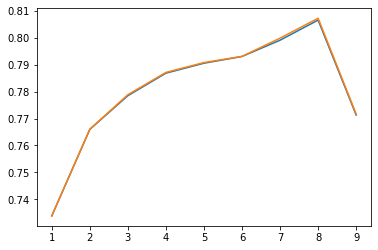

In [15]:
x_degrees = range(1,10)

plt.plot(x_degrees, meanacc_dtest_ls)
plt.plot(x_degrees, meanacc_dtrain_ls)

## Ridge regression

In [7]:
import matplotlib.pyplot as plt

In [27]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []

for lambda_ in np.logspace(-40,0,40):
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

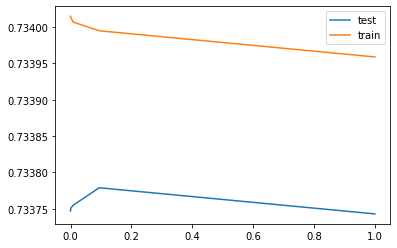

In [28]:
x_lambdas = np.logspace(-40,0,40)

plt.plot(x_lambdas, meanacc_dtest_rr, label='test')
plt.plot(x_lambdas, meanacc_dtrain_rr, label='train')
plt.legend()
plt.show()

In [29]:
print('max accuracy', max(meanacc_dtest_rr), 'corresponding lambda', x_lambdas[np.argmax(meanacc_dtest_rr)])

max accuracy 0.7337789351157404 corresponding lambda 0.09426684551178777


### Varying the Degrees

#### degree 8

In [14]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []
d=8
X_poly_multi = build_poly_multi(X_clean, d)
for lambda_ in np.logspace(-40,0,40):
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=3,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

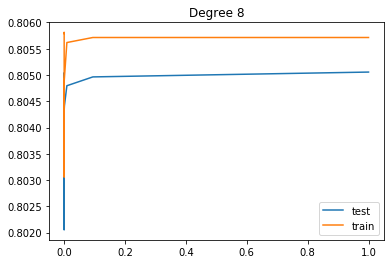

In [15]:
import matplotlib.pyplot as plt
x_lambdas = np.logspace(-40,0,40)

plt.figure()
plt.plot(x_lambdas, meanacc_dtest_rr, label='test')
plt.plot(x_lambdas, meanacc_dtrain_rr, label='train')
plt.legend()
plt.title('Degree 8')
plt.show()

In [16]:
print('max accuracy', max(meanacc_dtest_rr), 'corresponding lambda', x_lambdas[np.argmax(meanacc_dtest_rr)])

max accuracy 0.8050552202208809 corresponding lambda 1.0


#### degree 10

In [11]:
meanacc_dtest_rr = []
meanacc_dtrain_rr = []
d=10
X_poly_multi = build_poly_multi(X_clean, d)
for lambda_ in np.logspace(-40,0,40):
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=3,seed=1, function_name='ridge_regression', lambda_=lambda_)
    meanacc_dtest_rr.append(dtmp_te)
    meanacc_dtrain_rr.append(dtmp_tr)

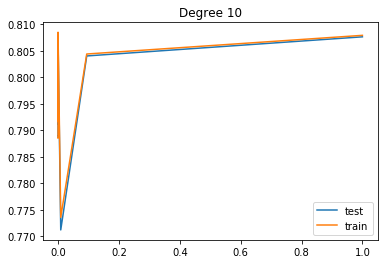

In [12]:
import matplotlib.pyplot as plt
x_lambdas = np.logspace(-40,0,40)

plt.figure()
plt.plot(x_lambdas, meanacc_dtest_rr, label='test')
plt.plot(x_lambdas, meanacc_dtrain_rr, label='train')
plt.title('Degree 10')
plt.legend()
plt.show()

In [13]:
print('max accuracy', max(meanacc_dtest_rr), 'corresponding lambda', x_lambdas[np.argmax(meanacc_dtest_rr)])

max accuracy 0.8083512334049336 corresponding lambda 6.614740641230105e-08


# Logit

## Logistic regression

#### Not standardized

In [25]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 0.00001
print(len(Y_total))

init = time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,seed=1, function_name='logistic_regression', max_iters=10000,gamma=gamma)
meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)
fin = time()

print(fin - init)

250000
Current iteration=0, loss=0.6973534388763976
Current iteration=1, loss=0.6973519361487053
Current iteration=2, loss=0.6973504334502669
Current iteration=3, loss=0.6973489307810813
Current iteration=4, loss=0.6973474281411478
Current iteration=5, loss=0.6973459255304657
Current iteration=6, loss=0.6973444229490344
Current iteration=7, loss=0.6973429203968525
Current iteration=8, loss=0.69734141787392
Current iteration=9, loss=0.6973399153802357
Current iteration=10, loss=0.6973384129157989
Current iteration=11, loss=0.697336910480609
Current iteration=12, loss=0.697335408074665
Current iteration=13, loss=0.6973339056979664
Current iteration=14, loss=0.6973324033505123
Current iteration=15, loss=0.6973309010323017
Current iteration=16, loss=0.6973293987433343
Current iteration=17, loss=0.697327896483609
Current iteration=18, loss=0.6973263942531251
Current iteration=19, loss=0.697324892051882
Current iteration=20, loss=0.6973233898798787
Current iteration=21, loss=0.69732188773711

Current iteration=176, loss=0.697089408627697
Current iteration=177, loss=0.6970879110369081
Current iteration=178, loss=0.6970864134752386
Current iteration=179, loss=0.6970849159426881
Current iteration=180, loss=0.6970834184392555
Current iteration=181, loss=0.6970819209649403
Current iteration=182, loss=0.6970804235197414
Current iteration=183, loss=0.6970789261036587
Current iteration=184, loss=0.6970774287166908
Current iteration=185, loss=0.6970759313588372
Current iteration=186, loss=0.6970744340300968
Current iteration=187, loss=0.6970729367304693
Current iteration=188, loss=0.6970714394599541
Current iteration=189, loss=0.6970699422185498
Current iteration=190, loss=0.697068445006256
Current iteration=191, loss=0.6970669478230718
Current iteration=192, loss=0.6970654506689966
Current iteration=193, loss=0.6970639535440298
Current iteration=194, loss=0.6970624564481701
Current iteration=195, loss=0.6970609593814172
Current iteration=196, loss=0.6970594623437703
Current iterati

Current iteration=351, loss=0.696827772918313
Current iteration=352, loss=0.6968262804118897
Current iteration=353, loss=0.6968247879344531
Current iteration=354, loss=0.6968232954860026
Current iteration=355, loss=0.6968218030665375
Current iteration=356, loss=0.6968203106760569
Current iteration=357, loss=0.69681881831456
Current iteration=358, loss=0.696817325982046
Current iteration=359, loss=0.6968158336785146
Current iteration=360, loss=0.6968143414039643
Current iteration=361, loss=0.6968128491583948
Current iteration=362, loss=0.6968113569418054
Current iteration=363, loss=0.6968098647541953
Current iteration=364, loss=0.6968083725955635
Current iteration=365, loss=0.6968068804659092
Current iteration=366, loss=0.6968053883652324
Current iteration=367, loss=0.6968038962935316
Current iteration=368, loss=0.6968024042508059
Current iteration=369, loss=0.6968009122370552
Current iteration=370, loss=0.6967994202522783
Current iteration=371, loss=0.6967979282964745
Current iteration

Current iteration=527, loss=0.6965655375086856
Current iteration=528, loss=0.696564050092291
Current iteration=529, loss=0.6965625627047506
Current iteration=530, loss=0.696561075346063
Current iteration=531, loss=0.6965595880162277
Current iteration=532, loss=0.6965581007152439
Current iteration=533, loss=0.6965566134431113
Current iteration=534, loss=0.6965551261998278
Current iteration=535, loss=0.6965536389853942
Current iteration=536, loss=0.6965521517998091
Current iteration=537, loss=0.6965506646430716
Current iteration=538, loss=0.6965491775151812
Current iteration=539, loss=0.696547690416137
Current iteration=540, loss=0.6965462033459382
Current iteration=541, loss=0.696544716304584
Current iteration=542, loss=0.696543229292074
Current iteration=543, loss=0.6965417423084072
Current iteration=544, loss=0.6965402553535829
Current iteration=545, loss=0.6965387684276003
Current iteration=546, loss=0.6965372815304586
Current iteration=547, loss=0.6965357946621571
Current iteration=

Current iteration=704, loss=0.6963027135487719
Current iteration=705, loss=0.6963012312277643
Current iteration=706, loss=0.696299748935478
Current iteration=707, loss=0.696298266671911
Current iteration=708, loss=0.6962967844370632
Current iteration=709, loss=0.6962953022309337
Current iteration=710, loss=0.6962938200535219
Current iteration=711, loss=0.6962923379048267
Current iteration=712, loss=0.6962908557848476
Current iteration=713, loss=0.6962893736935839
Current iteration=714, loss=0.6962878916310346
Current iteration=715, loss=0.6962864095971992
Current iteration=716, loss=0.6962849275920767
Current iteration=717, loss=0.6962834456156666
Current iteration=718, loss=0.696281963667968
Current iteration=719, loss=0.6962804817489803
Current iteration=720, loss=0.6962789998587025
Current iteration=721, loss=0.6962775179971339
Current iteration=722, loss=0.6962760361642741
Current iteration=723, loss=0.696274554360122
Current iteration=724, loss=0.6962730725846769
Current iteration

Current iteration=881, loss=0.696040789400012
Current iteration=882, loss=0.6960393121508585
Current iteration=883, loss=0.6960378349302925
Current iteration=884, loss=0.6960363577383136
Current iteration=885, loss=0.6960348805749216
Current iteration=886, loss=0.6960334034401148
Current iteration=887, loss=0.6960319263338929
Current iteration=888, loss=0.6960304492562551
Current iteration=889, loss=0.696028972207201
Current iteration=890, loss=0.6960274951867292
Current iteration=891, loss=0.6960260181948393
Current iteration=892, loss=0.6960245412315307
Current iteration=893, loss=0.6960230642968023
Current iteration=894, loss=0.6960215873906537
Current iteration=895, loss=0.696020110513084
Current iteration=896, loss=0.6960186336640924
Current iteration=897, loss=0.6960171568436783
Current iteration=898, loss=0.6960156800518406
Current iteration=899, loss=0.6960142032885789
Current iteration=900, loss=0.6960127265538921
Current iteration=901, loss=0.6960112498477801
Current iteratio

Current iteration=1059, loss=0.6957782887046283
Current iteration=1060, loss=0.6957768165323456
Current iteration=1061, loss=0.6957753443885182
Current iteration=1062, loss=0.695773872273145
Current iteration=1063, loss=0.6957724001862251
Current iteration=1064, loss=0.6957709281277581
Current iteration=1065, loss=0.6957694560977431
Current iteration=1066, loss=0.6957679840961792
Current iteration=1067, loss=0.695766512123066
Current iteration=1068, loss=0.6957650401784023
Current iteration=1069, loss=0.6957635682621878
Current iteration=1070, loss=0.6957620963744214
Current iteration=1071, loss=0.6957606245151027
Current iteration=1072, loss=0.6957591526842308
Current iteration=1073, loss=0.6957576808818049
Current iteration=1074, loss=0.6957562091078243
Current iteration=1075, loss=0.6957547373622882
Current iteration=1076, loss=0.6957532656451959
Current iteration=1077, loss=0.6957517939565467
Current iteration=1078, loss=0.6957503222963398
Current iteration=1079, loss=0.69574885066

Current iteration=1232, loss=0.695524025621669
Current iteration=1233, loss=0.695522558361027
Current iteration=1234, loss=0.6955210911287116
Current iteration=1235, loss=0.6955196239247216
Current iteration=1236, loss=0.6955181567490567
Current iteration=1237, loss=0.6955166896017154
Current iteration=1238, loss=0.6955152224826979
Current iteration=1239, loss=0.6955137553920028
Current iteration=1240, loss=0.6955122883296299
Current iteration=1241, loss=0.6955108212955778
Current iteration=1242, loss=0.6955093542898462
Current iteration=1243, loss=0.6955078873124346
Current iteration=1244, loss=0.6955064203633414
Current iteration=1245, loss=0.6955049534425666
Current iteration=1246, loss=0.6955034865501092
Current iteration=1247, loss=0.6955020196859686
Current iteration=1248, loss=0.6955005528501438
Current iteration=1249, loss=0.6954990860426343
Current iteration=1250, loss=0.6954976192634393
Current iteration=1251, loss=0.695496152512558
Current iteration=1252, loss=0.695494685789

Current iteration=1404, loss=0.6952720727406363
Current iteration=1405, loss=0.6952706103412264
Current iteration=1406, loss=0.6952691479700155
Current iteration=1407, loss=0.6952676856270029
Current iteration=1408, loss=0.695266223312188
Current iteration=1409, loss=0.6952647610255696
Current iteration=1410, loss=0.6952632987671471
Current iteration=1411, loss=0.6952618365369201
Current iteration=1412, loss=0.6952603743348874
Current iteration=1413, loss=0.6952589121610486
Current iteration=1414, loss=0.6952574500154031
Current iteration=1415, loss=0.6952559878979495
Current iteration=1416, loss=0.6952545258086875
Current iteration=1417, loss=0.6952530637476166
Current iteration=1418, loss=0.6952516017147357
Current iteration=1419, loss=0.6952501397100441
Current iteration=1420, loss=0.6952486777335409
Current iteration=1421, loss=0.6952472157852259
Current iteration=1422, loss=0.6952457538650978
Current iteration=1423, loss=0.6952442919731563
Current iteration=1424, loss=0.6952428301

Current iteration=1577, loss=0.695019496560701
Current iteration=1578, loss=0.6950180390287295
Current iteration=1579, loss=0.6950165815248294
Current iteration=1580, loss=0.695015124049
Current iteration=1581, loss=0.6950136666012403
Current iteration=1582, loss=0.6950122091815499
Current iteration=1583, loss=0.6950107517899281
Current iteration=1584, loss=0.6950092944263738
Current iteration=1585, loss=0.6950078370908865
Current iteration=1586, loss=0.6950063797834654
Current iteration=1587, loss=0.6950049225041095
Current iteration=1588, loss=0.6950034652528186
Current iteration=1589, loss=0.6950020080295917
Current iteration=1590, loss=0.6950005508344279
Current iteration=1591, loss=0.6949990936673266
Current iteration=1592, loss=0.6949976365282874
Current iteration=1593, loss=0.6949961794173091
Current iteration=1594, loss=0.694994722334391
Current iteration=1595, loss=0.6949932652795324
Current iteration=1596, loss=0.6949918082527328
Current iteration=1597, loss=0.694990351253991

Current iteration=1753, loss=0.6947634025757443
Current iteration=1754, loss=0.6947619499730101
Current iteration=1755, loss=0.6947604973982182
Current iteration=1756, loss=0.6947590448513677
Current iteration=1757, loss=0.6947575923324575
Current iteration=1758, loss=0.6947561398414877
Current iteration=1759, loss=0.6947546873784567
Current iteration=1760, loss=0.6947532349433639
Current iteration=1761, loss=0.694751782536209
Current iteration=1762, loss=0.6947503301569911
Current iteration=1763, loss=0.6947488778057092
Current iteration=1764, loss=0.6947474254823627
Current iteration=1765, loss=0.6947459731869511
Current iteration=1766, loss=0.6947445209194735
Current iteration=1767, loss=0.6947430686799293
Current iteration=1768, loss=0.6947416164683174
Current iteration=1769, loss=0.6947401642846373
Current iteration=1770, loss=0.6947387121288884
Current iteration=1771, loss=0.6947372600010698
Current iteration=1772, loss=0.6947358079011808
Current iteration=1773, loss=0.6947343558

Current iteration=1927, loss=0.6945110696240558
Current iteration=1928, loss=0.694509621872222
Current iteration=1929, loss=0.6945081741482029
Current iteration=1930, loss=0.6945067264519977
Current iteration=1931, loss=0.694505278783606
Current iteration=1932, loss=0.6945038311430268
Current iteration=1933, loss=0.6945023835302597
Current iteration=1934, loss=0.6945009359453034
Current iteration=1935, loss=0.6944994883881578
Current iteration=1936, loss=0.6944980408588214
Current iteration=1937, loss=0.6944965933572942
Current iteration=1938, loss=0.6944951458835751
Current iteration=1939, loss=0.6944936984376636
Current iteration=1940, loss=0.6944922510195588
Current iteration=1941, loss=0.6944908036292599
Current iteration=1942, loss=0.6944893562667662
Current iteration=1943, loss=0.6944879089320773
Current iteration=1944, loss=0.6944864616251921
Current iteration=1945, loss=0.6944850143461101
Current iteration=1946, loss=0.6944835670948303
Current iteration=1947, loss=0.69448211987

Current iteration=2104, loss=0.6942552501295784
Current iteration=2105, loss=0.694253807289602
Current iteration=2106, loss=0.6942523644773113
Current iteration=2107, loss=0.6942509216927056
Current iteration=2108, loss=0.6942494789357844
Current iteration=2109, loss=0.6942480362065467
Current iteration=2110, loss=0.6942465935049922
Current iteration=2111, loss=0.6942451508311194
Current iteration=2112, loss=0.6942437081849284
Current iteration=2113, loss=0.694242265566418
Current iteration=2114, loss=0.6942408229755874
Current iteration=2115, loss=0.6942393804124365
Current iteration=2116, loss=0.6942379378769638
Current iteration=2117, loss=0.6942364953691692
Current iteration=2118, loss=0.6942350528890512
Current iteration=2119, loss=0.69423361043661
Current iteration=2120, loss=0.6942321680118442
Current iteration=2121, loss=0.6942307256147534
Current iteration=2122, loss=0.6942292832453366
Current iteration=2123, loss=0.6942278409035937
Current iteration=2124, loss=0.6942263985895

Current iteration=2280, loss=0.6940017360064326
Current iteration=2281, loss=0.6940002980279774
Current iteration=2282, loss=0.6939988600770801
Current iteration=2283, loss=0.6939974221537404
Current iteration=2284, loss=0.6939959842579569
Current iteration=2285, loss=0.6939945463897301
Current iteration=2286, loss=0.6939931085490579
Current iteration=2287, loss=0.6939916707359404
Current iteration=2288, loss=0.6939902329503768
Current iteration=2289, loss=0.6939887951923661
Current iteration=2290, loss=0.6939873574619077
Current iteration=2291, loss=0.693985919759001
Current iteration=2292, loss=0.6939844820836452
Current iteration=2293, loss=0.6939830444358395
Current iteration=2294, loss=0.6939816068155832
Current iteration=2295, loss=0.6939801692228755
Current iteration=2296, loss=0.693978731657716
Current iteration=2297, loss=0.6939772941201036
Current iteration=2298, loss=0.6939758566100378
Current iteration=2299, loss=0.6939744191275177
Current iteration=2300, loss=0.69397298167

Current iteration=2455, loss=0.6937505087140203
Current iteration=2456, loss=0.6937490755472271
Current iteration=2457, loss=0.6937476424078651
Current iteration=2458, loss=0.6937462092959342
Current iteration=2459, loss=0.693744776211434
Current iteration=2460, loss=0.6937433431543627
Current iteration=2461, loss=0.6937419101247205
Current iteration=2462, loss=0.6937404771225064
Current iteration=2463, loss=0.6937390441477196
Current iteration=2464, loss=0.6937376112003594
Current iteration=2465, loss=0.6937361782804251
Current iteration=2466, loss=0.6937347453879159
Current iteration=2467, loss=0.6937333125228314
Current iteration=2468, loss=0.6937318796851705
Current iteration=2469, loss=0.6937304468749325
Current iteration=2470, loss=0.693729014092117
Current iteration=2471, loss=0.6937275813367226
Current iteration=2472, loss=0.6937261486087497
Current iteration=2473, loss=0.6937247159081967
Current iteration=2474, loss=0.6937232832350632
Current iteration=2475, loss=0.69372185058

Current iteration=2629, loss=0.693501549944535
Current iteration=2630, loss=0.6935001215400156
Current iteration=2631, loss=0.6934986931628028
Current iteration=2632, loss=0.6934972648128955
Current iteration=2633, loss=0.6934958364902933
Current iteration=2634, loss=0.6934944081949955
Current iteration=2635, loss=0.6934929799270015
Current iteration=2636, loss=0.69349155168631
Current iteration=2637, loss=0.693490123472921
Current iteration=2638, loss=0.6934886952868333
Current iteration=2639, loss=0.6934872671280461
Current iteration=2640, loss=0.6934858389965592
Current iteration=2641, loss=0.6934844108923718
Current iteration=2642, loss=0.6934829828154826
Current iteration=2643, loss=0.6934815547658912
Current iteration=2644, loss=0.6934801267435974
Current iteration=2645, loss=0.6934786987485997
Current iteration=2646, loss=0.6934772707808978
Current iteration=2647, loss=0.693475842840491
Current iteration=2648, loss=0.6934744149273783
Current iteration=2649, loss=0.69347298704155

Current iteration=2800, loss=0.6932576890840169
Current iteration=2801, loss=0.6932562653384824
Current iteration=2802, loss=0.693254841620132
Current iteration=2803, loss=0.6932534179289647
Current iteration=2804, loss=0.6932519942649802
Current iteration=2805, loss=0.6932505706281773
Current iteration=2806, loss=0.6932491470185553
Current iteration=2807, loss=0.6932477234361138
Current iteration=2808, loss=0.693246299880852
Current iteration=2809, loss=0.6932448763527693
Current iteration=2810, loss=0.6932434528518646
Current iteration=2811, loss=0.6932420293781374
Current iteration=2812, loss=0.6932406059315872
Current iteration=2813, loss=0.6932391825122128
Current iteration=2814, loss=0.693237759120014
Current iteration=2815, loss=0.6932363357549897
Current iteration=2816, loss=0.6932349124171394
Current iteration=2817, loss=0.6932334891064623
Current iteration=2818, loss=0.6932320658229576
Current iteration=2819, loss=0.6932306425666247
Current iteration=2820, loss=0.693229219337

Current iteration=2975, loss=0.6930089468638594
Current iteration=2976, loss=0.693007527864643
Current iteration=2977, loss=0.6930061088924856
Current iteration=2978, loss=0.6930046899473867
Current iteration=2979, loss=0.6930032710293452
Current iteration=2980, loss=0.6930018521383611
Current iteration=2981, loss=0.6930004332744327
Current iteration=2982, loss=0.69299901443756
Current iteration=2983, loss=0.692997595627742
Current iteration=2984, loss=0.6929961768449783
Current iteration=2985, loss=0.6929947580892679
Current iteration=2986, loss=0.6929933393606099
Current iteration=2987, loss=0.6929919206590042
Current iteration=2988, loss=0.6929905019844497
Current iteration=2989, loss=0.6929890833369454
Current iteration=2990, loss=0.6929876647164913
Current iteration=2991, loss=0.692986246123086
Current iteration=2992, loss=0.6929848275567294
Current iteration=2993, loss=0.6929834090174201
Current iteration=2994, loss=0.6929819905051577
Current iteration=2995, loss=0.69298057201994

Current iteration=3151, loss=0.6927596190759936
Current iteration=3152, loss=0.6927582048282216
Current iteration=3153, loss=0.6927567906073837
Current iteration=3154, loss=0.6927553764134791
Current iteration=3155, loss=0.6927539622465073
Current iteration=3156, loss=0.692752548106467
Current iteration=3157, loss=0.6927511339933581
Current iteration=3158, loss=0.6927497199071798
Current iteration=3159, loss=0.6927483058479309
Current iteration=3160, loss=0.6927468918156113
Current iteration=3161, loss=0.6927454778102198
Current iteration=3162, loss=0.6927440638317561
Current iteration=3163, loss=0.6927426498802192
Current iteration=3164, loss=0.6927412359556085
Current iteration=3165, loss=0.6927398220579233
Current iteration=3166, loss=0.6927384081871629
Current iteration=3167, loss=0.6927369943433266
Current iteration=3168, loss=0.6927355805264137
Current iteration=3169, loss=0.6927341667364233
Current iteration=3170, loss=0.6927327529733551
Current iteration=3171, loss=0.6927313392

Current iteration=3327, loss=0.6925111256190768
Current iteration=3328, loss=0.6925097161007845
Current iteration=3329, loss=0.6925083066093021
Current iteration=3330, loss=0.692506897144628
Current iteration=3331, loss=0.6925054877067621
Current iteration=3332, loss=0.6925040782957037
Current iteration=3333, loss=0.6925026689114517
Current iteration=3334, loss=0.692501259554006
Current iteration=3335, loss=0.6924998502233652
Current iteration=3336, loss=0.6924984409195291
Current iteration=3337, loss=0.6924970316424968
Current iteration=3338, loss=0.6924956223922675
Current iteration=3339, loss=0.6924942131688407
Current iteration=3340, loss=0.6924928039722158
Current iteration=3341, loss=0.6924913948023915
Current iteration=3342, loss=0.6924899856593676
Current iteration=3343, loss=0.6924885765431434
Current iteration=3344, loss=0.6924871674537181
Current iteration=3345, loss=0.6924857583910908
Current iteration=3346, loss=0.6924843493552613
Current iteration=3347, loss=0.69248294034

Current iteration=3500, loss=0.6922676772276461
Current iteration=3501, loss=0.6922662723369019
Current iteration=3502, loss=0.6922648674728449
Current iteration=3503, loss=0.6922634626354747
Current iteration=3504, loss=0.6922620578247909
Current iteration=3505, loss=0.6922606530407927
Current iteration=3506, loss=0.692259248283479
Current iteration=3507, loss=0.6922578435528493
Current iteration=3508, loss=0.6922564388489032
Current iteration=3509, loss=0.6922550341716396
Current iteration=3510, loss=0.6922536295210581
Current iteration=3511, loss=0.6922522248971577
Current iteration=3512, loss=0.6922508202999379
Current iteration=3513, loss=0.6922494157293979
Current iteration=3514, loss=0.6922480111855372
Current iteration=3515, loss=0.6922466066683547
Current iteration=3516, loss=0.6922452021778501
Current iteration=3517, loss=0.6922437977140226
Current iteration=3518, loss=0.6922423932768711
Current iteration=3519, loss=0.6922409888663954
Current iteration=3520, loss=0.6922395844

Current iteration=3671, loss=0.6920278282391132
Current iteration=3672, loss=0.6920264279017383
Current iteration=3673, loss=0.6920250275909308
Current iteration=3674, loss=0.6920236273066904
Current iteration=3675, loss=0.6920222270490163
Current iteration=3676, loss=0.6920208268179072
Current iteration=3677, loss=0.6920194266133632
Current iteration=3678, loss=0.6920180264353835
Current iteration=3679, loss=0.692016626283967
Current iteration=3680, loss=0.692015226159113
Current iteration=3681, loss=0.6920138260608214
Current iteration=3682, loss=0.6920124259890907
Current iteration=3683, loss=0.6920110259439208
Current iteration=3684, loss=0.6920096259253108
Current iteration=3685, loss=0.69200822593326
Current iteration=3686, loss=0.6920068259677674
Current iteration=3687, loss=0.692005426028833
Current iteration=3688, loss=0.6920040261164554
Current iteration=3689, loss=0.6920026262306344
Current iteration=3690, loss=0.6920012263713688
Current iteration=3691, loss=0.69199982653865

Current iteration=3847, loss=0.6917817773772894
Current iteration=3848, loss=0.6917803817050429
Current iteration=3849, loss=0.6917789860592412
Current iteration=3850, loss=0.6917775904398833
Current iteration=3851, loss=0.6917761948469687
Current iteration=3852, loss=0.6917747992804965
Current iteration=3853, loss=0.6917734037404665
Current iteration=3854, loss=0.6917720082268773
Current iteration=3855, loss=0.6917706127397286
Current iteration=3856, loss=0.6917692172790195
Current iteration=3857, loss=0.6917678218447496
Current iteration=3858, loss=0.6917664264369182
Current iteration=3859, loss=0.6917650310555243
Current iteration=3860, loss=0.6917636357005674
Current iteration=3861, loss=0.6917622403720466
Current iteration=3862, loss=0.6917608450699617
Current iteration=3863, loss=0.6917594497943114
Current iteration=3864, loss=0.6917580545450952
Current iteration=3865, loss=0.6917566593223127
Current iteration=3866, loss=0.6917552641259629
Current iteration=3867, loss=0.691753868

Current iteration=4021, loss=0.6915393278234445
Current iteration=4022, loss=0.6915379367420837
Current iteration=4023, loss=0.6915365456870467
Current iteration=4024, loss=0.6915351546583325
Current iteration=4025, loss=0.6915337636559404
Current iteration=4026, loss=0.6915323726798701
Current iteration=4027, loss=0.6915309817301202
Current iteration=4028, loss=0.6915295908066906
Current iteration=4029, loss=0.6915281999095805
Current iteration=4030, loss=0.6915268090387889
Current iteration=4031, loss=0.6915254181943157
Current iteration=4032, loss=0.6915240273761591
Current iteration=4033, loss=0.6915226365843198
Current iteration=4034, loss=0.6915212458187961
Current iteration=4035, loss=0.6915198550795878
Current iteration=4036, loss=0.6915184643666941
Current iteration=4037, loss=0.6915170736801141
Current iteration=4038, loss=0.6915156830198472
Current iteration=4039, loss=0.6915142923858928
Current iteration=4040, loss=0.6915129017782503
Current iteration=4041, loss=0.691511511

Current iteration=4194, loss=0.6912990618020156
Current iteration=4195, loss=0.6912976752643186
Current iteration=4196, loss=0.6912962887528251
Current iteration=4197, loss=0.6912949022675346
Current iteration=4198, loss=0.6912935158084469
Current iteration=4199, loss=0.6912921293755605
Current iteration=4200, loss=0.691290742968875
Current iteration=4201, loss=0.69128935658839
Current iteration=4202, loss=0.6912879702341044
Current iteration=4203, loss=0.6912865839060176
Current iteration=4204, loss=0.6912851976041292
Current iteration=4205, loss=0.6912838113284383
Current iteration=4206, loss=0.6912824250789441
Current iteration=4207, loss=0.6912810388556461
Current iteration=4208, loss=0.6912796526585434
Current iteration=4209, loss=0.6912782664876355
Current iteration=4210, loss=0.6912768803429215
Current iteration=4211, loss=0.6912754942244012
Current iteration=4212, loss=0.6912741081320734
Current iteration=4213, loss=0.6912727220659374
Current iteration=4214, loss=0.691271336025

Current iteration=4368, loss=0.6910581980390872
Current iteration=4369, loss=0.6910568160504484
Current iteration=4370, loss=0.6910554340878936
Current iteration=4371, loss=0.6910540521514217
Current iteration=4372, loss=0.691052670241032
Current iteration=4373, loss=0.6910512883567241
Current iteration=4374, loss=0.6910499064984968
Current iteration=4375, loss=0.69104852466635
Current iteration=4376, loss=0.6910471428602827
Current iteration=4377, loss=0.6910457610802944
Current iteration=4378, loss=0.6910443793263842
Current iteration=4379, loss=0.6910429975985516
Current iteration=4380, loss=0.6910416158967957
Current iteration=4381, loss=0.6910402342211159
Current iteration=4382, loss=0.6910388525715119
Current iteration=4383, loss=0.6910374709479824
Current iteration=4384, loss=0.6910360893505266
Current iteration=4385, loss=0.6910347077791447
Current iteration=4386, loss=0.6910333262338353
Current iteration=4387, loss=0.6910319447145981
Current iteration=4388, loss=0.691030563221

Current iteration=4544, loss=0.6908153691135122
Current iteration=4545, loss=0.6908139917050199
Current iteration=4546, loss=0.6908126143224906
Current iteration=4547, loss=0.6908112369659231
Current iteration=4548, loss=0.6908098596353173
Current iteration=4549, loss=0.690808482330672
Current iteration=4550, loss=0.6908071050519872
Current iteration=4551, loss=0.6908057277992613
Current iteration=4552, loss=0.6908043505724942
Current iteration=4553, loss=0.6908029733716854
Current iteration=4554, loss=0.6908015961968338
Current iteration=4555, loss=0.6908002190479386
Current iteration=4556, loss=0.6907988419249997
Current iteration=4557, loss=0.6907974648280161
Current iteration=4558, loss=0.6907960877569869
Current iteration=4559, loss=0.6907947107119115
Current iteration=4560, loss=0.6907933336927897
Current iteration=4561, loss=0.6907919566996201
Current iteration=4562, loss=0.6907905797324027
Current iteration=4563, loss=0.6907892027911363
Current iteration=4564, loss=0.6907878258

Current iteration=4719, loss=0.690574717310221
Current iteration=4720, loss=0.690573344434803
Current iteration=4721, loss=0.6905719715852282
Current iteration=4722, loss=0.6905705987614956
Current iteration=4723, loss=0.6905692259636049
Current iteration=4724, loss=0.6905678531915554
Current iteration=4725, loss=0.690566480445346
Current iteration=4726, loss=0.6905651077249767
Current iteration=4727, loss=0.6905637350304461
Current iteration=4728, loss=0.6905623623617541
Current iteration=4729, loss=0.6905609897188997
Current iteration=4730, loss=0.6905596171018825
Current iteration=4731, loss=0.6905582445107014
Current iteration=4732, loss=0.6905568719453559
Current iteration=4733, loss=0.6905554994058457
Current iteration=4734, loss=0.6905541268921694
Current iteration=4735, loss=0.6905527544043268
Current iteration=4736, loss=0.6905513819423172
Current iteration=4737, loss=0.6905500095061399
Current iteration=4738, loss=0.6905486370957941
Current iteration=4739, loss=0.690547264711

Current iteration=4894, loss=0.6903348569755081
Current iteration=4895, loss=0.6903334886122667
Current iteration=4896, loss=0.6903321202747491
Current iteration=4897, loss=0.6903307519629552
Current iteration=4898, loss=0.6903293836768836
Current iteration=4899, loss=0.6903280154165341
Current iteration=4900, loss=0.6903266471819057
Current iteration=4901, loss=0.6903252789729981
Current iteration=4902, loss=0.6903239107898106
Current iteration=4903, loss=0.690322542632342
Current iteration=4904, loss=0.6903211745005919
Current iteration=4905, loss=0.6903198063945598
Current iteration=4906, loss=0.6903184383142451
Current iteration=4907, loss=0.6903170702596468
Current iteration=4908, loss=0.6903157022307642
Current iteration=4909, loss=0.6903143342275967
Current iteration=4910, loss=0.690312966250144
Current iteration=4911, loss=0.690311598298405
Current iteration=4912, loss=0.690310230372379
Current iteration=4913, loss=0.6903088624720656
Current iteration=4914, loss=0.6903074945974

Current iteration=5069, loss=0.690095784460205
Current iteration=5070, loss=0.6900944205883335
Current iteration=5071, loss=0.6900930567420672
Current iteration=5072, loss=0.6900916929214058
Current iteration=5073, loss=0.6900903291263485
Current iteration=5074, loss=0.6900889653568945
Current iteration=5075, loss=0.690087601613043
Current iteration=5076, loss=0.6900862378947934
Current iteration=5077, loss=0.6900848742021453
Current iteration=5078, loss=0.6900835105350976
Current iteration=5079, loss=0.6900821468936502
Current iteration=5080, loss=0.6900807832778016
Current iteration=5081, loss=0.6900794196875522
Current iteration=5082, loss=0.6900780561229002
Current iteration=5083, loss=0.6900766925838456
Current iteration=5084, loss=0.6900753290703876
Current iteration=5085, loss=0.6900739655825254
Current iteration=5086, loss=0.6900726021202584
Current iteration=5087, loss=0.6900712386835861
Current iteration=5088, loss=0.6900698752725077
Current iteration=5089, loss=0.69006851188

Current iteration=5240, loss=0.6898629339907774
Current iteration=5241, loss=0.6898615744876042
Current iteration=5242, loss=0.6898602150099209
Current iteration=5243, loss=0.6898588555577267
Current iteration=5244, loss=0.6898574961310211
Current iteration=5245, loss=0.6898561367298033
Current iteration=5246, loss=0.689854777354073
Current iteration=5247, loss=0.6898534180038292
Current iteration=5248, loss=0.6898520586790714
Current iteration=5249, loss=0.6898506993797987
Current iteration=5250, loss=0.6898493401060106
Current iteration=5251, loss=0.6898479808577064
Current iteration=5252, loss=0.6898466216348851
Current iteration=5253, loss=0.6898452624375467
Current iteration=5254, loss=0.6898439032656897
Current iteration=5255, loss=0.6898425441193143
Current iteration=5256, loss=0.6898411849984195
Current iteration=5257, loss=0.6898398259030043
Current iteration=5258, loss=0.6898384668330682
Current iteration=5259, loss=0.6898371077886107
Current iteration=5260, loss=0.6898357487

Current iteration=5411, loss=0.6896308288934225
Current iteration=5412, loss=0.6896294737392522
Current iteration=5413, loss=0.6896281186104565
Current iteration=5414, loss=0.6896267635070356
Current iteration=5415, loss=0.6896254084289876
Current iteration=5416, loss=0.6896240533763132
Current iteration=5417, loss=0.6896226983490109
Current iteration=5418, loss=0.6896213433470803
Current iteration=5419, loss=0.6896199883705207
Current iteration=5420, loss=0.6896186334193314
Current iteration=5421, loss=0.6896172784935117
Current iteration=5422, loss=0.6896159235930611
Current iteration=5423, loss=0.6896145687179787
Current iteration=5424, loss=0.6896132138682639
Current iteration=5425, loss=0.6896118590439163
Current iteration=5426, loss=0.6896105042449348
Current iteration=5427, loss=0.6896091494713187
Current iteration=5428, loss=0.6896077947230677
Current iteration=5429, loss=0.689606440000181
Current iteration=5430, loss=0.689605085302658
Current iteration=5431, loss=0.68960373063

Current iteration=5588, loss=0.6893913612376185
Current iteration=5589, loss=0.6893900105643931
Current iteration=5590, loss=0.689388659916424
Current iteration=5591, loss=0.689387309293711
Current iteration=5592, loss=0.6893859586962532
Current iteration=5593, loss=0.6893846081240499
Current iteration=5594, loss=0.6893832575771005
Current iteration=5595, loss=0.6893819070554045
Current iteration=5596, loss=0.6893805565589609
Current iteration=5597, loss=0.6893792060877691
Current iteration=5598, loss=0.6893778556418286
Current iteration=5599, loss=0.6893765052211388
Current iteration=5600, loss=0.6893751548256986
Current iteration=5601, loss=0.6893738044555079
Current iteration=5602, loss=0.6893724541105657
Current iteration=5603, loss=0.6893711037908712
Current iteration=5604, loss=0.6893697534964242
Current iteration=5605, loss=0.6893684032272235
Current iteration=5606, loss=0.6893670529832688
Current iteration=5607, loss=0.6893657027645592
Current iteration=5608, loss=0.68936435257

Current iteration=5760, loss=0.6891594163100259
Current iteration=5761, loss=0.6891580699711242
Current iteration=5762, loss=0.6891567236573645
Current iteration=5763, loss=0.6891553773687462
Current iteration=5764, loss=0.6891540311052684
Current iteration=5765, loss=0.6891526848669308
Current iteration=5766, loss=0.6891513386537323
Current iteration=5767, loss=0.6891499924656725
Current iteration=5768, loss=0.6891486463027507
Current iteration=5769, loss=0.6891473001649662
Current iteration=5770, loss=0.6891459540523183
Current iteration=5771, loss=0.6891446079648065
Current iteration=5772, loss=0.6891432619024301
Current iteration=5773, loss=0.689141915865188
Current iteration=5774, loss=0.6891405698530805
Current iteration=5775, loss=0.6891392238661056
Current iteration=5776, loss=0.6891378779042638
Current iteration=5777, loss=0.6891365319675539
Current iteration=5778, loss=0.6891351860559755
Current iteration=5779, loss=0.6891338401695273
Current iteration=5780, loss=0.6891324943

Current iteration=5934, loss=0.6889255311798926
Current iteration=5935, loss=0.6889241892057026
Current iteration=5936, loss=0.6889228472565394
Current iteration=5937, loss=0.6889215053324018
Current iteration=5938, loss=0.6889201634332893
Current iteration=5939, loss=0.6889188215592017
Current iteration=5940, loss=0.6889174797101377
Current iteration=5941, loss=0.6889161378860971
Current iteration=5942, loss=0.6889147960870793
Current iteration=5943, loss=0.6889134543130827
Current iteration=5944, loss=0.6889121125641082
Current iteration=5945, loss=0.6889107708401537
Current iteration=5946, loss=0.6889094291412194
Current iteration=5947, loss=0.6889080874673046
Current iteration=5948, loss=0.6889067458184078
Current iteration=5949, loss=0.6889054041945293
Current iteration=5950, loss=0.6889040625956682
Current iteration=5951, loss=0.6889027210218235
Current iteration=5952, loss=0.6889013794729949
Current iteration=5953, loss=0.6889000379491815
Current iteration=5954, loss=0.688898696

Current iteration=6106, loss=0.6886950791087073
Current iteration=6107, loss=0.6886937414293649
Current iteration=6108, loss=0.6886924037749351
Current iteration=6109, loss=0.6886910661454179
Current iteration=6110, loss=0.6886897285408122
Current iteration=6111, loss=0.6886883909611173
Current iteration=6112, loss=0.6886870534063331
Current iteration=6113, loss=0.6886857158764587
Current iteration=6114, loss=0.6886843783714929
Current iteration=6115, loss=0.6886830408914355
Current iteration=6116, loss=0.6886817034362859
Current iteration=6117, loss=0.6886803660060433
Current iteration=6118, loss=0.6886790286007071
Current iteration=6119, loss=0.6886776912202762
Current iteration=6120, loss=0.6886763538647508
Current iteration=6121, loss=0.6886750165341299
Current iteration=6122, loss=0.6886736792284125
Current iteration=6123, loss=0.6886723419475981
Current iteration=6124, loss=0.6886710046916864
Current iteration=6125, loss=0.6886696674606763
Current iteration=6126, loss=0.688668330

Current iteration=6282, loss=0.6884600306160249
Current iteration=6283, loss=0.6884586973112299
Current iteration=6284, loss=0.688457364031232
Current iteration=6285, loss=0.6884560307760307
Current iteration=6286, loss=0.688454697545625
Current iteration=6287, loss=0.688453364340015
Current iteration=6288, loss=0.6884520311591994
Current iteration=6289, loss=0.6884506980031778
Current iteration=6290, loss=0.6884493648719495
Current iteration=6291, loss=0.6884480317655141
Current iteration=6292, loss=0.6884466986838703
Current iteration=6293, loss=0.6884453656270181
Current iteration=6294, loss=0.6884440325949561
Current iteration=6295, loss=0.6884426995876847
Current iteration=6296, loss=0.6884413666052024
Current iteration=6297, loss=0.688440033647509
Current iteration=6298, loss=0.6884387007146034
Current iteration=6299, loss=0.6884373678064855
Current iteration=6300, loss=0.688436034923154
Current iteration=6301, loss=0.6884347020646088
Current iteration=6302, loss=0.68843336923084

Current iteration=6459, loss=0.6882244213136313
Current iteration=6460, loss=0.6882230923877438
Current iteration=6461, loss=0.6882217634865379
Current iteration=6462, loss=0.6882204346100125
Current iteration=6463, loss=0.6882191057581672
Current iteration=6464, loss=0.6882177769310014
Current iteration=6465, loss=0.6882164481285145
Current iteration=6466, loss=0.6882151193507056
Current iteration=6467, loss=0.6882137905975741
Current iteration=6468, loss=0.6882124618691194
Current iteration=6469, loss=0.688211133165341
Current iteration=6470, loss=0.6882098044862379
Current iteration=6471, loss=0.6882084758318099
Current iteration=6472, loss=0.6882071472020559
Current iteration=6473, loss=0.6882058185969756
Current iteration=6474, loss=0.688204490016568
Current iteration=6475, loss=0.6882031614608327
Current iteration=6476, loss=0.688201832929769
Current iteration=6477, loss=0.6882005044233763
Current iteration=6478, loss=0.6881991759416537
Current iteration=6479, loss=0.688197847484

Current iteration=6633, loss=0.6879935591257379
Current iteration=6634, loss=0.6879922344845956
Current iteration=6635, loss=0.6879909098680211
Current iteration=6636, loss=0.6879895852760143
Current iteration=6637, loss=0.6879882607085741
Current iteration=6638, loss=0.6879869361657
Current iteration=6639, loss=0.6879856116473911
Current iteration=6640, loss=0.6879842871536472
Current iteration=6641, loss=0.687982962684467
Current iteration=6642, loss=0.6879816382398506
Current iteration=6643, loss=0.687980313819797
Current iteration=6644, loss=0.6879789894243054
Current iteration=6645, loss=0.6879776650533753
Current iteration=6646, loss=0.6879763407070062
Current iteration=6647, loss=0.6879750163851971
Current iteration=6648, loss=0.6879736920879477
Current iteration=6649, loss=0.6879723678152573
Current iteration=6650, loss=0.6879710435671249
Current iteration=6651, loss=0.6879697193435501
Current iteration=6652, loss=0.6879683951445323
Current iteration=6653, loss=0.68796707097007

Current iteration=6805, loss=0.6877660816050019
Current iteration=6806, loss=0.6877647611800077
Current iteration=6807, loss=0.6877634407794697
Current iteration=6808, loss=0.6877621204033877
Current iteration=6809, loss=0.6877608000517604
Current iteration=6810, loss=0.6877594797245877
Current iteration=6811, loss=0.6877581594218692
Current iteration=6812, loss=0.6877568391436036
Current iteration=6813, loss=0.6877555188897906
Current iteration=6814, loss=0.6877541986604293
Current iteration=6815, loss=0.6877528784555195
Current iteration=6816, loss=0.6877515582750601
Current iteration=6817, loss=0.6877502381190507
Current iteration=6818, loss=0.6877489179874905
Current iteration=6819, loss=0.6877475978803791
Current iteration=6820, loss=0.6877462777977156
Current iteration=6821, loss=0.6877449577394995
Current iteration=6822, loss=0.6877436377057302
Current iteration=6823, loss=0.6877423176964067
Current iteration=6824, loss=0.687740997711529
Current iteration=6825, loss=0.6877396777

Current iteration=6980, loss=0.687535379012183
Current iteration=6981, loss=0.6875340628572201
Current iteration=6982, loss=0.6875327467266007
Current iteration=6983, loss=0.6875314306203242
Current iteration=6984, loss=0.6875301145383895
Current iteration=6985, loss=0.6875287984807964
Current iteration=6986, loss=0.6875274824475442
Current iteration=6987, loss=0.6875261664386321
Current iteration=6988, loss=0.6875248504540593
Current iteration=6989, loss=0.687523534493826
Current iteration=6990, loss=0.6875222185579302
Current iteration=6991, loss=0.6875209026463722
Current iteration=6992, loss=0.6875195867591515
Current iteration=6993, loss=0.6875182708962668
Current iteration=6994, loss=0.6875169550577178
Current iteration=6995, loss=0.6875156392435037
Current iteration=6996, loss=0.6875143234536241
Current iteration=6997, loss=0.6875130076880782
Current iteration=6998, loss=0.6875116919468655
Current iteration=6999, loss=0.6875103762299849
Current iteration=7000, loss=0.68750906053

Current iteration=7154, loss=0.6873067338855265
Current iteration=7155, loss=0.6873054219566289
Current iteration=7156, loss=0.6873041100519623
Current iteration=7157, loss=0.6873027981715268
Current iteration=7158, loss=0.6873014863153216
Current iteration=7159, loss=0.687300174483346
Current iteration=7160, loss=0.6872988626755991
Current iteration=7161, loss=0.6872975508920807
Current iteration=7162, loss=0.6872962391327898
Current iteration=7163, loss=0.6872949273977261
Current iteration=7164, loss=0.6872936156868886
Current iteration=7165, loss=0.687292304000277
Current iteration=7166, loss=0.6872909923378906
Current iteration=7167, loss=0.6872896806997283
Current iteration=7168, loss=0.6872883690857902
Current iteration=7169, loss=0.687287057496075
Current iteration=7170, loss=0.6872857459305822
Current iteration=7171, loss=0.6872844343893117
Current iteration=7172, loss=0.6872831228722621
Current iteration=7173, loss=0.6872818113794333
Current iteration=7174, loss=0.687280499910

Current iteration=7326, loss=0.687081437929684
Current iteration=7327, loss=0.6870801301591858
Current iteration=7328, loss=0.6870788224128092
Current iteration=7329, loss=0.6870775146905531
Current iteration=7330, loss=0.6870762069924173
Current iteration=7331, loss=0.6870748993184008
Current iteration=7332, loss=0.6870735916685035
Current iteration=7333, loss=0.6870722840427242
Current iteration=7334, loss=0.6870709764410626
Current iteration=7335, loss=0.687069668863518
Current iteration=7336, loss=0.6870683613100894
Current iteration=7337, loss=0.6870670537807767
Current iteration=7338, loss=0.6870657462755791
Current iteration=7339, loss=0.6870644387944959
Current iteration=7340, loss=0.6870631313375263
Current iteration=7341, loss=0.6870618239046699
Current iteration=7342, loss=0.6870605164959258
Current iteration=7343, loss=0.6870592091112935
Current iteration=7344, loss=0.6870579017507727
Current iteration=7345, loss=0.6870565944143624
Current iteration=7346, loss=0.68705528710

Current iteration=7498, loss=0.6868568556018937
Current iteration=7499, loss=0.6868555519709003
Current iteration=7500, loss=0.686854248363919
Current iteration=7501, loss=0.686852944780949
Current iteration=7502, loss=0.6868516412219893
Current iteration=7503, loss=0.6868503376870396
Current iteration=7504, loss=0.6868490341760991
Current iteration=7505, loss=0.6868477306891674
Current iteration=7506, loss=0.6868464272262436
Current iteration=7507, loss=0.686845123787327
Current iteration=7508, loss=0.6868438203724172
Current iteration=7509, loss=0.6868425169815138
Current iteration=7510, loss=0.6868412136146155
Current iteration=7511, loss=0.6868399102717221
Current iteration=7512, loss=0.6868386069528329
Current iteration=7513, loss=0.6868373036579473
Current iteration=7514, loss=0.6868360003870646
Current iteration=7515, loss=0.6868346971401839
Current iteration=7516, loss=0.6868333939173051
Current iteration=7517, loss=0.6868320907184272
Current iteration=7518, loss=0.686830787543

Current iteration=7674, loss=0.6866277857616702
Current iteration=7675, loss=0.6866264863469783
Current iteration=7676, loss=0.6866251869561866
Current iteration=7677, loss=0.6866238875892945
Current iteration=7678, loss=0.6866225882463013
Current iteration=7679, loss=0.6866212889272064
Current iteration=7680, loss=0.686619989632009
Current iteration=7681, loss=0.6866186903607087
Current iteration=7682, loss=0.6866173911133046
Current iteration=7683, loss=0.6866160918897962
Current iteration=7684, loss=0.686614792690183
Current iteration=7685, loss=0.6866134935144645
Current iteration=7686, loss=0.6866121943626395
Current iteration=7687, loss=0.6866108952347079
Current iteration=7688, loss=0.6866095961306687
Current iteration=7689, loss=0.6866082970505215
Current iteration=7690, loss=0.6866069979942658
Current iteration=7691, loss=0.6866056989619006
Current iteration=7692, loss=0.6866043999534251
Current iteration=7693, loss=0.6866031009688395
Current iteration=7694, loss=0.68660180200

Current iteration=7845, loss=0.6864059327204887
Current iteration=7846, loss=0.6864046373835379
Current iteration=7847, loss=0.6864033420703792
Current iteration=7848, loss=0.6864020467810119
Current iteration=7849, loss=0.6864007515154358
Current iteration=7850, loss=0.6863994562736498
Current iteration=7851, loss=0.6863981610556534
Current iteration=7852, loss=0.6863968658614461
Current iteration=7853, loss=0.6863955706910272
Current iteration=7854, loss=0.686394275544396
Current iteration=7855, loss=0.686392980421552
Current iteration=7856, loss=0.6863916853224943
Current iteration=7857, loss=0.6863903902472225
Current iteration=7858, loss=0.6863890951957362
Current iteration=7859, loss=0.6863878001680342
Current iteration=7860, loss=0.6863865051641164
Current iteration=7861, loss=0.6863852101839818
Current iteration=7862, loss=0.6863839152276301
Current iteration=7863, loss=0.6863826202950604
Current iteration=7864, loss=0.6863813253862722
Current iteration=7865, loss=0.68638003050

Current iteration=8019, loss=0.6861809016438215
Current iteration=8020, loss=0.6861796104372383
Current iteration=8021, loss=0.6861783192543378
Current iteration=8022, loss=0.6861770280951194
Current iteration=8023, loss=0.6861757369595824
Current iteration=8024, loss=0.6861744458477266
Current iteration=8025, loss=0.6861731547595512
Current iteration=8026, loss=0.686171863695055
Current iteration=8027, loss=0.686170572654238
Current iteration=8028, loss=0.6861692816370992
Current iteration=8029, loss=0.6861679906436384
Current iteration=8030, loss=0.6861666996738549
Current iteration=8031, loss=0.6861654087277476
Current iteration=8032, loss=0.686164117805316
Current iteration=8033, loss=0.6861628269065599
Current iteration=8034, loss=0.6861615360314786
Current iteration=8035, loss=0.6861602451800711
Current iteration=8036, loss=0.6861589543523369
Current iteration=8037, loss=0.6861576635482757
Current iteration=8038, loss=0.6861563727678861
Current iteration=8039, loss=0.686155082011

Current iteration=8191, loss=0.6859591618682723
Current iteration=8192, loss=0.6859578747259161
Current iteration=8193, loss=0.6859565876071347
Current iteration=8194, loss=0.6859553005119279
Current iteration=8195, loss=0.6859540134402949
Current iteration=8196, loss=0.6859527263922354
Current iteration=8197, loss=0.6859514393677484
Current iteration=8198, loss=0.6859501523668334
Current iteration=8199, loss=0.6859488653894898
Current iteration=8200, loss=0.6859475784357171
Current iteration=8201, loss=0.6859462915055142
Current iteration=8202, loss=0.6859450045988812
Current iteration=8203, loss=0.6859437177158167
Current iteration=8204, loss=0.6859424308563207
Current iteration=8205, loss=0.6859411440203924
Current iteration=8206, loss=0.6859398572080311
Current iteration=8207, loss=0.6859385704192359
Current iteration=8208, loss=0.6859372836540066
Current iteration=8209, loss=0.6859359969123425
Current iteration=8210, loss=0.685934710194243
Current iteration=8211, loss=0.6859334234

Current iteration=8367, loss=0.6857329873134493
Current iteration=8368, loss=0.685731704310714
Current iteration=8369, loss=0.6857304213314445
Current iteration=8370, loss=0.68572913837564
Current iteration=8371, loss=0.6857278554432996
Current iteration=8372, loss=0.6857265725344227
Current iteration=8373, loss=0.685725289649009
Current iteration=8374, loss=0.6857240067870576
Current iteration=8375, loss=0.6857227239485677
Current iteration=8376, loss=0.6857214411335392
Current iteration=8377, loss=0.6857201583419712
Current iteration=8378, loss=0.6857188755738631
Current iteration=8379, loss=0.6857175928292143
Current iteration=8380, loss=0.685716310108024
Current iteration=8381, loss=0.6857150274102918
Current iteration=8382, loss=0.685713744736017
Current iteration=8383, loss=0.6857124620851991
Current iteration=8384, loss=0.6857111794578371
Current iteration=8385, loss=0.6857098968539307
Current iteration=8386, loss=0.6857086142734794
Current iteration=8387, loss=0.685707331716482

Current iteration=8539, loss=0.6855126554090301
Current iteration=8540, loss=0.6855113764332312
Current iteration=8541, loss=0.6855100974807913
Current iteration=8542, loss=0.6855088185517093
Current iteration=8543, loss=0.6855075396459851
Current iteration=8544, loss=0.6855062607636176
Current iteration=8545, loss=0.6855049819046066
Current iteration=8546, loss=0.6855037030689515
Current iteration=8547, loss=0.6855024242566514
Current iteration=8548, loss=0.6855011454677057
Current iteration=8549, loss=0.6854998667021138
Current iteration=8550, loss=0.6854985879598754
Current iteration=8551, loss=0.6854973092409893
Current iteration=8552, loss=0.6854960305454554
Current iteration=8553, loss=0.6854947518732728
Current iteration=8554, loss=0.685493473224441
Current iteration=8555, loss=0.6854921945989595
Current iteration=8556, loss=0.6854909159968273
Current iteration=8557, loss=0.6854896374180443
Current iteration=8558, loss=0.6854883588626094
Current iteration=8559, loss=0.6854870803

Current iteration=8713, loss=0.6852904646602356
Current iteration=8714, loss=0.6852891897395718
Current iteration=8715, loss=0.6852879148421596
Current iteration=8716, loss=0.6852866399679981
Current iteration=8717, loss=0.6852853651170872
Current iteration=8718, loss=0.6852840902894254
Current iteration=8719, loss=0.6852828154850126
Current iteration=8720, loss=0.6852815407038482
Current iteration=8721, loss=0.6852802659459316
Current iteration=8722, loss=0.6852789912112619
Current iteration=8723, loss=0.6852777164998386
Current iteration=8724, loss=0.6852764418116614
Current iteration=8725, loss=0.6852751671467294
Current iteration=8726, loss=0.6852738925050419
Current iteration=8727, loss=0.6852726178865985
Current iteration=8728, loss=0.6852713432913986
Current iteration=8729, loss=0.6852700687194413
Current iteration=8730, loss=0.6852687941707263
Current iteration=8731, loss=0.6852675196452526
Current iteration=8732, loss=0.6852662451430201
Current iteration=8733, loss=0.685264970

Current iteration=8889, loss=0.6850664361454927
Current iteration=8890, loss=0.6850651653076051
Current iteration=8891, loss=0.6850638944928604
Current iteration=8892, loss=0.6850626237012585
Current iteration=8893, loss=0.6850613529327985
Current iteration=8894, loss=0.68506008218748
Current iteration=8895, loss=0.6850588114653022
Current iteration=8896, loss=0.685057540766265
Current iteration=8897, loss=0.6850562700903668
Current iteration=8898, loss=0.6850549994376078
Current iteration=8899, loss=0.6850537288079873
Current iteration=8900, loss=0.6850524582015045
Current iteration=8901, loss=0.6850511876181589
Current iteration=8902, loss=0.6850499170579495
Current iteration=8903, loss=0.685048646520876
Current iteration=8904, loss=0.6850473760069378
Current iteration=8905, loss=0.6850461055161344
Current iteration=8906, loss=0.6850448350484649
Current iteration=8907, loss=0.685043564603929
Current iteration=8908, loss=0.685042294182526
Current iteration=8909, loss=0.685041023784254

Current iteration=9063, loss=0.6848456581536349
Current iteration=9064, loss=0.6848443913334593
Current iteration=9065, loss=0.6848431245363205
Current iteration=9066, loss=0.684841857762218
Current iteration=9067, loss=0.6848405910111511
Current iteration=9068, loss=0.6848393242831191
Current iteration=9069, loss=0.6848380575781217
Current iteration=9070, loss=0.6848367908961579
Current iteration=9071, loss=0.6848355242372272
Current iteration=9072, loss=0.6848342576013291
Current iteration=9073, loss=0.6848329909884628
Current iteration=9074, loss=0.684831724398628
Current iteration=9075, loss=0.6848304578318241
Current iteration=9076, loss=0.6848291912880501
Current iteration=9077, loss=0.6848279247673057
Current iteration=9078, loss=0.68482665826959
Current iteration=9079, loss=0.684825391794903
Current iteration=9080, loss=0.684824125343243
Current iteration=9081, loss=0.6848228589146106
Current iteration=9082, loss=0.6848215925090044
Current iteration=9083, loss=0.684820326126424

Current iteration=9236, loss=0.6846268404881724
Current iteration=9237, loss=0.6846255776443017
Current iteration=9238, loss=0.6846243148233623
Current iteration=9239, loss=0.6846230520253539
Current iteration=9240, loss=0.6846217892502758
Current iteration=9241, loss=0.6846205264981274
Current iteration=9242, loss=0.6846192637689079
Current iteration=9243, loss=0.684618001062617
Current iteration=9244, loss=0.684616738379254
Current iteration=9245, loss=0.6846154757188182
Current iteration=9246, loss=0.6846142130813091
Current iteration=9247, loss=0.6846129504667259
Current iteration=9248, loss=0.684611687875068
Current iteration=9249, loss=0.6846104253063351
Current iteration=9250, loss=0.6846091627605264
Current iteration=9251, loss=0.6846079002376413
Current iteration=9252, loss=0.6846066377376792
Current iteration=9253, loss=0.6846053752606392
Current iteration=9254, loss=0.6846041128065213
Current iteration=9255, loss=0.6846028503753245
Current iteration=9256, loss=0.684601587967

Current iteration=9408, loss=0.6844099680672863
Current iteration=9409, loss=0.6844087091587125
Current iteration=9410, loss=0.6844074502729659
Current iteration=9411, loss=0.6844061914100463
Current iteration=9412, loss=0.6844049325699524
Current iteration=9413, loss=0.6844036737526841
Current iteration=9414, loss=0.6844024149582406
Current iteration=9415, loss=0.6844011561866212
Current iteration=9416, loss=0.6843998974378257
Current iteration=9417, loss=0.684398638711853
Current iteration=9418, loss=0.6843973800087028
Current iteration=9419, loss=0.6843961213283745
Current iteration=9420, loss=0.6843948626708672
Current iteration=9421, loss=0.6843936040361807
Current iteration=9422, loss=0.6843923454243139
Current iteration=9423, loss=0.684391086835267
Current iteration=9424, loss=0.6843898282690383
Current iteration=9425, loss=0.6843885697256281
Current iteration=9426, loss=0.6843873112050353
Current iteration=9427, loss=0.6843860527072595
Current iteration=9428, loss=0.68438479423

Current iteration=9581, loss=0.6841925159956568
Current iteration=9582, loss=0.6841912610272147
Current iteration=9583, loss=0.6841900060814957
Current iteration=9584, loss=0.6841887511584988
Current iteration=9585, loss=0.6841874962582237
Current iteration=9586, loss=0.6841862413806696
Current iteration=9587, loss=0.684184986525836
Current iteration=9588, loss=0.6841837316937222
Current iteration=9589, loss=0.6841824768843278
Current iteration=9590, loss=0.6841812220976519
Current iteration=9591, loss=0.6841799673336941
Current iteration=9592, loss=0.6841787125924538
Current iteration=9593, loss=0.6841774578739304
Current iteration=9594, loss=0.6841762031781233
Current iteration=9595, loss=0.684174948505032
Current iteration=9596, loss=0.6841736938546553
Current iteration=9597, loss=0.6841724392269934
Current iteration=9598, loss=0.6841711846220454
Current iteration=9599, loss=0.6841699300398105
Current iteration=9600, loss=0.6841686754802885
Current iteration=9601, loss=0.68416742094

Current iteration=9758, loss=0.6839707399668076
Current iteration=9759, loss=0.6839694890109554
Current iteration=9760, loss=0.6839682380777198
Current iteration=9761, loss=0.6839669871671005
Current iteration=9762, loss=0.6839657362790965
Current iteration=9763, loss=0.6839644854137071
Current iteration=9764, loss=0.6839632345709319
Current iteration=9765, loss=0.6839619837507706
Current iteration=9766, loss=0.683960732953222
Current iteration=9767, loss=0.683959482178286
Current iteration=9768, loss=0.6839582314259617
Current iteration=9769, loss=0.6839569806962488
Current iteration=9770, loss=0.6839557299891463
Current iteration=9771, loss=0.683954479304654
Current iteration=9772, loss=0.683953228642771
Current iteration=9773, loss=0.6839519780034967
Current iteration=9774, loss=0.6839507273868309
Current iteration=9775, loss=0.6839494767927725
Current iteration=9776, loss=0.6839482262213212
Current iteration=9777, loss=0.6839469756724762
Current iteration=9778, loss=0.6839457251462

Current iteration=9931, loss=0.6837546605867387
Current iteration=9932, loss=0.6837534135346593
Current iteration=9933, loss=0.6837521665050935
Current iteration=9934, loss=0.68375091949804
Current iteration=9935, loss=0.6837496725134988
Current iteration=9936, loss=0.6837484255514689
Current iteration=9937, loss=0.6837471786119497
Current iteration=9938, loss=0.683745931694941
Current iteration=9939, loss=0.6837446848004416
Current iteration=9940, loss=0.6837434379284515
Current iteration=9941, loss=0.6837421910789696
Current iteration=9942, loss=0.6837409442519956
Current iteration=9943, loss=0.6837396974475288
Current iteration=9944, loss=0.6837384506655687
Current iteration=9945, loss=0.6837372039061146
Current iteration=9946, loss=0.6837359571691662
Current iteration=9947, loss=0.6837347104547226
Current iteration=9948, loss=0.683733463762783
Current iteration=9949, loss=0.6837322170933472
Current iteration=9950, loss=0.6837309704464145
Current iteration=9951, loss=0.6837297238219

Current iteration=109, loss=0.6972779756667976
Current iteration=110, loss=0.6972764909854066
Current iteration=111, loss=0.6972750063330473
Current iteration=112, loss=0.6972735217097191
Current iteration=113, loss=0.6972720371154211
Current iteration=114, loss=0.6972705525501528
Current iteration=115, loss=0.6972690680139131
Current iteration=116, loss=0.6972675835067016
Current iteration=117, loss=0.6972660990285171
Current iteration=118, loss=0.6972646145793592
Current iteration=119, loss=0.6972631301592273
Current iteration=120, loss=0.69726164576812
Current iteration=121, loss=0.6972601614060371
Current iteration=122, loss=0.6972586770729776
Current iteration=123, loss=0.6972571927689407
Current iteration=124, loss=0.697255708493926
Current iteration=125, loss=0.6972542242479322
Current iteration=126, loss=0.6972527400309586
Current iteration=127, loss=0.6972512558430052
Current iteration=128, loss=0.6972497716840703
Current iteration=129, loss=0.6972482875541536
Current iteratio

Current iteration=283, loss=0.6970200774058887
Current iteration=284, loss=0.697018597764582
Current iteration=285, loss=0.6970171181521748
Current iteration=286, loss=0.6970156385686666
Current iteration=287, loss=0.6970141590140562
Current iteration=288, loss=0.6970126794883428
Current iteration=289, loss=0.6970111999915262
Current iteration=290, loss=0.6970097205236052
Current iteration=291, loss=0.6970082410845793
Current iteration=292, loss=0.6970067616744473
Current iteration=293, loss=0.697005282293209
Current iteration=294, loss=0.6970038029408632
Current iteration=295, loss=0.6970023236174093
Current iteration=296, loss=0.6970008443228466
Current iteration=297, loss=0.6969993650571743
Current iteration=298, loss=0.6969978858203919
Current iteration=299, loss=0.696996406612498
Current iteration=300, loss=0.6969949274334923
Current iteration=301, loss=0.6969934482833741
Current iteration=302, loss=0.6969919691621425
Current iteration=303, loss=0.6969904900697965
Current iteratio

Current iteration=457, loss=0.6967630541307068
Current iteration=458, loss=0.6967615795065059
Current iteration=459, loss=0.6967601049110729
Current iteration=460, loss=0.6967586303444067
Current iteration=461, loss=0.6967571558065067
Current iteration=462, loss=0.6967556812973722
Current iteration=463, loss=0.6967542068170024
Current iteration=464, loss=0.6967527323653965
Current iteration=465, loss=0.6967512579425539
Current iteration=466, loss=0.6967497835484735
Current iteration=467, loss=0.6967483091831548
Current iteration=468, loss=0.6967468348465973
Current iteration=469, loss=0.6967453605387998
Current iteration=470, loss=0.6967438862597614
Current iteration=471, loss=0.6967424120094817
Current iteration=472, loss=0.6967409377879602
Current iteration=473, loss=0.6967394635951956
Current iteration=474, loss=0.6967379894311874
Current iteration=475, loss=0.6967365152959348
Current iteration=476, loss=0.6967350411894371
Current iteration=477, loss=0.6967335671116935
Current itera

Current iteration=634, loss=0.696502493046808
Current iteration=635, loss=0.6965010235027327
Current iteration=636, loss=0.6964995539872912
Current iteration=637, loss=0.6964980845004836
Current iteration=638, loss=0.6964966150423083
Current iteration=639, loss=0.6964951456127649
Current iteration=640, loss=0.696493676211853
Current iteration=641, loss=0.6964922068395711
Current iteration=642, loss=0.6964907374959192
Current iteration=643, loss=0.6964892681808958
Current iteration=644, loss=0.696487798894501
Current iteration=645, loss=0.6964863296367335
Current iteration=646, loss=0.6964848604075922
Current iteration=647, loss=0.6964833912070774
Current iteration=648, loss=0.6964819220351874
Current iteration=649, loss=0.6964804528919216
Current iteration=650, loss=0.6964789837772798
Current iteration=651, loss=0.6964775146912608
Current iteration=652, loss=0.696476045633864
Current iteration=653, loss=0.6964745766050887
Current iteration=654, loss=0.6964731076049336
Current iteration

Current iteration=810, loss=0.6962442935839994
Current iteration=811, loss=0.6962428290679595
Current iteration=812, loss=0.6962413645804217
Current iteration=813, loss=0.6962399001213851
Current iteration=814, loss=0.6962384356908489
Current iteration=815, loss=0.6962369712888123
Current iteration=816, loss=0.6962355069152747
Current iteration=817, loss=0.6962340425702352
Current iteration=818, loss=0.6962325782536931
Current iteration=819, loss=0.696231113965648
Current iteration=820, loss=0.6962296497060985
Current iteration=821, loss=0.6962281854750443
Current iteration=822, loss=0.6962267212724844
Current iteration=823, loss=0.6962252570984184
Current iteration=824, loss=0.6962237929528451
Current iteration=825, loss=0.6962223288357643
Current iteration=826, loss=0.696220864747175
Current iteration=827, loss=0.696219400687076
Current iteration=828, loss=0.6962179366554669
Current iteration=829, loss=0.6962164726523473
Current iteration=830, loss=0.6962150086777159
Current iteratio

Current iteration=990, loss=0.6959811391469569
Current iteration=991, loss=0.6959796797492014
Current iteration=992, loss=0.6959782203798134
Current iteration=993, loss=0.6959767610387918
Current iteration=994, loss=0.6959753017261356
Current iteration=995, loss=0.6959738424418449
Current iteration=996, loss=0.6959723831859183
Current iteration=997, loss=0.6959709239583549
Current iteration=998, loss=0.6959694647591547
Current iteration=999, loss=0.6959680055883163
Current iteration=1000, loss=0.6959665464458391
Current iteration=1001, loss=0.6959650873317225
Current iteration=1002, loss=0.6959636282459656
Current iteration=1003, loss=0.6959621691885681
Current iteration=1004, loss=0.6959607101595285
Current iteration=1005, loss=0.6959592511588464
Current iteration=1006, loss=0.6959577921865213
Current iteration=1007, loss=0.6959563332425522
Current iteration=1008, loss=0.6959548743269384
Current iteration=1009, loss=0.6959534154396788
Current iteration=1010, loss=0.6959519565807737
Cu

Current iteration=1165, loss=0.6957261757760232
Current iteration=1166, loss=0.6957247213311808
Current iteration=1167, loss=0.6957232669145753
Current iteration=1168, loss=0.6957218125262059
Current iteration=1169, loss=0.6957203581660717
Current iteration=1170, loss=0.6957189038341722
Current iteration=1171, loss=0.6957174495305064
Current iteration=1172, loss=0.6957159952550739
Current iteration=1173, loss=0.695714541007874
Current iteration=1174, loss=0.6957130867889052
Current iteration=1175, loss=0.6957116325981675
Current iteration=1176, loss=0.6957101784356601
Current iteration=1177, loss=0.695708724301382
Current iteration=1178, loss=0.6957072701953322
Current iteration=1179, loss=0.6957058161175106
Current iteration=1180, loss=0.6957043620679162
Current iteration=1181, loss=0.6957029080465482
Current iteration=1182, loss=0.6957014540534056
Current iteration=1183, loss=0.6957000000884884
Current iteration=1184, loss=0.6956985461517949
Current iteration=1185, loss=0.69569709224

Current iteration=1341, loss=0.695470627667251
Current iteration=1342, loss=0.6954691781806521
Current iteration=1343, loss=0.6954677287221592
Current iteration=1344, loss=0.695466279291772
Current iteration=1345, loss=0.6954648298894894
Current iteration=1346, loss=0.6954633805153108
Current iteration=1347, loss=0.6954619311692354
Current iteration=1348, loss=0.6954604818512623
Current iteration=1349, loss=0.6954590325613912
Current iteration=1350, loss=0.6954575832996212
Current iteration=1351, loss=0.6954561340659513
Current iteration=1352, loss=0.6954546848603811
Current iteration=1353, loss=0.6954532356829095
Current iteration=1354, loss=0.695451786533536
Current iteration=1355, loss=0.6954503374122599
Current iteration=1356, loss=0.6954488883190804
Current iteration=1357, loss=0.6954474392539964
Current iteration=1358, loss=0.6954459902170078
Current iteration=1359, loss=0.6954445412081136
Current iteration=1360, loss=0.6954430922273128
Current iteration=1361, loss=0.695441643274

Current iteration=1518, loss=0.69521450564908
Current iteration=1519, loss=0.695213061125757
Current iteration=1520, loss=0.6952116166304098
Current iteration=1521, loss=0.6952101721630365
Current iteration=1522, loss=0.6952087277236375
Current iteration=1523, loss=0.6952072833122114
Current iteration=1524, loss=0.695205838928758
Current iteration=1525, loss=0.6952043945732762
Current iteration=1526, loss=0.6952029502457654
Current iteration=1527, loss=0.695201505946225
Current iteration=1528, loss=0.6952000616746536
Current iteration=1529, loss=0.695198617431051
Current iteration=1530, loss=0.6951971732154167
Current iteration=1531, loss=0.6951957290277495
Current iteration=1532, loss=0.6951942848680488
Current iteration=1533, loss=0.6951928407363137
Current iteration=1534, loss=0.695191396632544
Current iteration=1535, loss=0.6951899525567384
Current iteration=1536, loss=0.6951885085088966
Current iteration=1537, loss=0.6951870644890175
Current iteration=1538, loss=0.6951856204971002

Current iteration=1695, loss=0.6949592600957453
Current iteration=1696, loss=0.6949578205125889
Current iteration=1697, loss=0.6949563809572779
Current iteration=1698, loss=0.6949549414298113
Current iteration=1699, loss=0.6949535019301883
Current iteration=1700, loss=0.6949520624584081
Current iteration=1701, loss=0.6949506230144701
Current iteration=1702, loss=0.6949491835983732
Current iteration=1703, loss=0.6949477442101174
Current iteration=1704, loss=0.6949463048497014
Current iteration=1705, loss=0.6949448655171246
Current iteration=1706, loss=0.6949434262123863
Current iteration=1707, loss=0.6949419869354857
Current iteration=1708, loss=0.694940547686422
Current iteration=1709, loss=0.6949391084651947
Current iteration=1710, loss=0.694937669271803
Current iteration=1711, loss=0.694936230106246
Current iteration=1712, loss=0.6949347909685228
Current iteration=1713, loss=0.6949333518586331
Current iteration=1714, loss=0.6949319127765763
Current iteration=1715, loss=0.694930473722

Current iteration=1872, loss=0.6947048869253482
Current iteration=1873, loss=0.6947034522593453
Current iteration=1874, loss=0.6947020176210582
Current iteration=1875, loss=0.6947005830104852
Current iteration=1876, loss=0.6946991484276263
Current iteration=1877, loss=0.6946977138724807
Current iteration=1878, loss=0.6946962793450472
Current iteration=1879, loss=0.6946948448453256
Current iteration=1880, loss=0.6946934103733149
Current iteration=1881, loss=0.6946919759290144
Current iteration=1882, loss=0.6946905415124234
Current iteration=1883, loss=0.694689107123541
Current iteration=1884, loss=0.6946876727623669
Current iteration=1885, loss=0.6946862384288999
Current iteration=1886, loss=0.6946848041231394
Current iteration=1887, loss=0.6946833698450849
Current iteration=1888, loss=0.6946819355947355
Current iteration=1889, loss=0.6946805013720903
Current iteration=1890, loss=0.6946790671771488
Current iteration=1891, loss=0.6946776330099103
Current iteration=1892, loss=0.6946761988

Current iteration=2045, loss=0.694457101435874
Current iteration=2046, loss=0.6944556715537552
Current iteration=2047, loss=0.6944542416992254
Current iteration=2048, loss=0.694452811872284
Current iteration=2049, loss=0.6944513820729301
Current iteration=2050, loss=0.6944499523011629
Current iteration=2051, loss=0.694448522556982
Current iteration=2052, loss=0.6944470928403867
Current iteration=2053, loss=0.6944456631513756
Current iteration=2054, loss=0.6944442334899488
Current iteration=2055, loss=0.6944428038561052
Current iteration=2056, loss=0.6944413742498438
Current iteration=2057, loss=0.6944399446711643
Current iteration=2058, loss=0.694438515120066
Current iteration=2059, loss=0.6944370855965478
Current iteration=2060, loss=0.6944356561006092
Current iteration=2061, loss=0.6944342266322497
Current iteration=2062, loss=0.6944327971914678
Current iteration=2063, loss=0.6944313677782636
Current iteration=2064, loss=0.6944299383926362
Current iteration=2065, loss=0.6944285090345

Current iteration=2219, loss=0.6942087165618079
Current iteration=2220, loss=0.6942072914692318
Current iteration=2221, loss=0.6942058664041183
Current iteration=2222, loss=0.6942044413664666
Current iteration=2223, loss=0.6942030163562759
Current iteration=2224, loss=0.6942015913735459
Current iteration=2225, loss=0.6942001664182752
Current iteration=2226, loss=0.6941987414904633
Current iteration=2227, loss=0.6941973165901099
Current iteration=2228, loss=0.6941958917172139
Current iteration=2229, loss=0.6941944668717744
Current iteration=2230, loss=0.6941930420537911
Current iteration=2231, loss=0.694191617263263
Current iteration=2232, loss=0.6941901925001893
Current iteration=2233, loss=0.69418876776457
Current iteration=2234, loss=0.6941873430564035
Current iteration=2235, loss=0.6941859183756892
Current iteration=2236, loss=0.6941844937224267
Current iteration=2237, loss=0.6941830690966151
Current iteration=2238, loss=0.6941816444982538
Current iteration=2239, loss=0.694180219927

Current iteration=2393, loss=0.6939611631667807
Current iteration=2394, loss=0.6939597428417812
Current iteration=2395, loss=0.6939583225441182
Current iteration=2396, loss=0.6939569022737908
Current iteration=2397, loss=0.6939554820307986
Current iteration=2398, loss=0.6939540618151411
Current iteration=2399, loss=0.6939526416268169
Current iteration=2400, loss=0.693951221465826
Current iteration=2401, loss=0.693949801332167
Current iteration=2402, loss=0.6939483812258396
Current iteration=2403, loss=0.6939469611468428
Current iteration=2404, loss=0.6939455410951764
Current iteration=2405, loss=0.6939441210708391
Current iteration=2406, loss=0.6939427010738306
Current iteration=2407, loss=0.69394128110415
Current iteration=2408, loss=0.6939398611617963
Current iteration=2409, loss=0.6939384412467691
Current iteration=2410, loss=0.6939370213590677
Current iteration=2411, loss=0.6939356014986914
Current iteration=2412, loss=0.6939341816656391
Current iteration=2413, loss=0.6939327618599

Current iteration=2566, loss=0.6937158530430104
Current iteration=2567, loss=0.6937144374364999
Current iteration=2568, loss=0.6937130218572011
Current iteration=2569, loss=0.6937116063051134
Current iteration=2570, loss=0.6937101907802361
Current iteration=2571, loss=0.6937087752825684
Current iteration=2572, loss=0.6937073598121098
Current iteration=2573, loss=0.6937059443688595
Current iteration=2574, loss=0.6937045289528164
Current iteration=2575, loss=0.6937031135639802
Current iteration=2576, loss=0.6937016982023501
Current iteration=2577, loss=0.6937002828679254
Current iteration=2578, loss=0.6936988675607051
Current iteration=2579, loss=0.6936974522806888
Current iteration=2580, loss=0.6936960370278756
Current iteration=2581, loss=0.693694621802265
Current iteration=2582, loss=0.693693206603856
Current iteration=2583, loss=0.6936917914326483
Current iteration=2584, loss=0.6936903762886409
Current iteration=2585, loss=0.6936889611718327
Current iteration=2586, loss=0.69368754608

Current iteration=2737, loss=0.693474179264865
Current iteration=2738, loss=0.6934727683011305
Current iteration=2739, loss=0.6934713573644847
Current iteration=2740, loss=0.6934699464549275
Current iteration=2741, loss=0.6934685355724579
Current iteration=2742, loss=0.6934671247170751
Current iteration=2743, loss=0.6934657138887783
Current iteration=2744, loss=0.693464303087567
Current iteration=2745, loss=0.6934628923134405
Current iteration=2746, loss=0.6934614815663982
Current iteration=2747, loss=0.693460070846439
Current iteration=2748, loss=0.6934586601535624
Current iteration=2749, loss=0.6934572494877675
Current iteration=2750, loss=0.6934558388490539
Current iteration=2751, loss=0.6934544282374207
Current iteration=2752, loss=0.6934530176528672
Current iteration=2753, loss=0.6934516070953928
Current iteration=2754, loss=0.6934501965649967
Current iteration=2755, loss=0.6934487860616779
Current iteration=2756, loss=0.6934473755854361
Current iteration=2757, loss=0.693445965136

Current iteration=2912, loss=0.6932276724131825
Current iteration=2913, loss=0.6932262661791319
Current iteration=2914, loss=0.6932248599720452
Current iteration=2915, loss=0.6932234537919216
Current iteration=2916, loss=0.6932220476387604
Current iteration=2917, loss=0.6932206415125609
Current iteration=2918, loss=0.6932192354133226
Current iteration=2919, loss=0.6932178293410444
Current iteration=2920, loss=0.6932164232957262
Current iteration=2921, loss=0.6932150172773665
Current iteration=2922, loss=0.6932136112859649
Current iteration=2923, loss=0.6932122053215212
Current iteration=2924, loss=0.693210799384034
Current iteration=2925, loss=0.6932093934735027
Current iteration=2926, loss=0.6932079875899267
Current iteration=2927, loss=0.6932065817333056
Current iteration=2928, loss=0.6932051759036381
Current iteration=2929, loss=0.6932037701009242
Current iteration=2930, loss=0.6932023643251622
Current iteration=2931, loss=0.6932009585763524
Current iteration=2932, loss=0.6931995528

Current iteration=3083, loss=0.6929875977268148
Current iteration=3084, loss=0.6929861960932299
Current iteration=3085, loss=0.6929847944864865
Current iteration=3086, loss=0.692983392906585
Current iteration=3087, loss=0.692981991353524
Current iteration=3088, loss=0.6929805898273028
Current iteration=3089, loss=0.6929791883279214
Current iteration=3090, loss=0.692977786855378
Current iteration=3091, loss=0.6929763854096725
Current iteration=3092, loss=0.6929749839908044
Current iteration=3093, loss=0.6929735825987726
Current iteration=3094, loss=0.6929721812335766
Current iteration=3095, loss=0.6929707798952155
Current iteration=3096, loss=0.6929693785836886
Current iteration=3097, loss=0.6929679772989955
Current iteration=3098, loss=0.692966576041135
Current iteration=3099, loss=0.6929651748101068
Current iteration=3100, loss=0.6929637736059101
Current iteration=3101, loss=0.6929623724285441
Current iteration=3102, loss=0.692960971278008
Current iteration=3103, loss=0.69295957015430

Current iteration=3259, loss=0.6927413229501505
Current iteration=3260, loss=0.692739926029847
Current iteration=3261, loss=0.6927385291362611
Current iteration=3262, loss=0.6927371322693914
Current iteration=3263, loss=0.6927357354292377
Current iteration=3264, loss=0.6927343386157992
Current iteration=3265, loss=0.6927329418290753
Current iteration=3266, loss=0.6927315450690651
Current iteration=3267, loss=0.6927301483357676
Current iteration=3268, loss=0.6927287516291829
Current iteration=3269, loss=0.6927273549493096
Current iteration=3270, loss=0.6927259582961476
Current iteration=3271, loss=0.6927245616696951
Current iteration=3272, loss=0.6927231650699527
Current iteration=3273, loss=0.6927217684969187
Current iteration=3274, loss=0.6927203719505932
Current iteration=3275, loss=0.6927189754309747
Current iteration=3276, loss=0.6927175789380631
Current iteration=3277, loss=0.6927161824718574
Current iteration=3278, loss=0.6927147860323573
Current iteration=3279, loss=0.6927133896

Current iteration=3432, loss=0.6925000526380717
Current iteration=3433, loss=0.6924986603293466
Current iteration=3434, loss=0.6924972680472165
Current iteration=3435, loss=0.6924958757916807
Current iteration=3436, loss=0.6924944835627389
Current iteration=3437, loss=0.69249309136039
Current iteration=3438, loss=0.6924916991846335
Current iteration=3439, loss=0.6924903070354683
Current iteration=3440, loss=0.6924889149128942
Current iteration=3441, loss=0.6924875228169104
Current iteration=3442, loss=0.6924861307475161
Current iteration=3443, loss=0.6924847387047103
Current iteration=3444, loss=0.692483346688493
Current iteration=3445, loss=0.6924819546988628
Current iteration=3446, loss=0.6924805627358193
Current iteration=3447, loss=0.6924791707993617
Current iteration=3448, loss=0.6924777788894896
Current iteration=3449, loss=0.6924763870062015
Current iteration=3450, loss=0.692474995149498
Current iteration=3451, loss=0.6924736033193772
Current iteration=3452, loss=0.6924722115158

Current iteration=3603, loss=0.6922623538298565
Current iteration=3604, loss=0.6922609660586698
Current iteration=3605, loss=0.6922595783139583
Current iteration=3606, loss=0.6922581905957207
Current iteration=3607, loss=0.6922568029039566
Current iteration=3608, loss=0.6922554152386654
Current iteration=3609, loss=0.6922540275998462
Current iteration=3610, loss=0.6922526399874983
Current iteration=3611, loss=0.6922512524016211
Current iteration=3612, loss=0.6922498648422137
Current iteration=3613, loss=0.692248477309276
Current iteration=3614, loss=0.6922470898028066
Current iteration=3615, loss=0.6922457023228052
Current iteration=3616, loss=0.6922443148692708
Current iteration=3617, loss=0.6922429274422028
Current iteration=3618, loss=0.6922415400416008
Current iteration=3619, loss=0.6922401526674637
Current iteration=3620, loss=0.6922387653197909
Current iteration=3621, loss=0.6922373779985819
Current iteration=3622, loss=0.6922359907038358
Current iteration=3623, loss=0.6922346034

Current iteration=3775, loss=0.6920240459411481
Current iteration=3776, loss=0.6920226627133351
Current iteration=3777, loss=0.6920212795118766
Current iteration=3778, loss=0.6920198963367717
Current iteration=3779, loss=0.69201851318802
Current iteration=3780, loss=0.6920171300656206
Current iteration=3781, loss=0.6920157469695728
Current iteration=3782, loss=0.6920143638998761
Current iteration=3783, loss=0.6920129808565295
Current iteration=3784, loss=0.6920115978395324
Current iteration=3785, loss=0.6920102148488844
Current iteration=3786, loss=0.6920088318845843
Current iteration=3787, loss=0.6920074489466316
Current iteration=3788, loss=0.6920060660350256
Current iteration=3789, loss=0.6920046831497657
Current iteration=3790, loss=0.6920033002908512
Current iteration=3791, loss=0.6920019174582815
Current iteration=3792, loss=0.6920005346520557
Current iteration=3793, loss=0.6919991518721731
Current iteration=3794, loss=0.6919977691186329
Current iteration=3795, loss=0.69199638639

Current iteration=3948, loss=0.691785139038746
Current iteration=3949, loss=0.6917837603598675
Current iteration=3950, loss=0.6917823817072227
Current iteration=3951, loss=0.6917810030808114
Current iteration=3952, loss=0.6917796244806321
Current iteration=3953, loss=0.6917782459066846
Current iteration=3954, loss=0.6917768673589682
Current iteration=3955, loss=0.6917754888374821
Current iteration=3956, loss=0.6917741103422254
Current iteration=3957, loss=0.6917727318731978
Current iteration=3958, loss=0.6917713534303985
Current iteration=3959, loss=0.6917699750138266
Current iteration=3960, loss=0.6917685966234814
Current iteration=3961, loss=0.6917672182593627
Current iteration=3962, loss=0.6917658399214692
Current iteration=3963, loss=0.6917644616098004
Current iteration=3964, loss=0.691763083324356
Current iteration=3965, loss=0.6917617050651347
Current iteration=3966, loss=0.6917603268321361
Current iteration=3967, loss=0.6917589486253594
Current iteration=3968, loss=0.69175757044

Current iteration=4126, loss=0.6915401468169466
Current iteration=4127, loss=0.6915387727967378
Current iteration=4128, loss=0.6915373988026392
Current iteration=4129, loss=0.6915360248346497
Current iteration=4130, loss=0.6915346508927694
Current iteration=4131, loss=0.6915332769769973
Current iteration=4132, loss=0.6915319030873326
Current iteration=4133, loss=0.6915305292237742
Current iteration=4134, loss=0.6915291553863223
Current iteration=4135, loss=0.6915277815749759
Current iteration=4136, loss=0.6915264077897337
Current iteration=4137, loss=0.6915250340305958
Current iteration=4138, loss=0.691523660297561
Current iteration=4139, loss=0.6915222865906286
Current iteration=4140, loss=0.6915209129097983
Current iteration=4141, loss=0.6915195392550695
Current iteration=4142, loss=0.6915181656264408
Current iteration=4143, loss=0.691516792023912
Current iteration=4144, loss=0.6915154184474825
Current iteration=4145, loss=0.691514044897151
Current iteration=4146, loss=0.691512671372

Current iteration=4300, loss=0.6913014596880739
Current iteration=4301, loss=0.6913000902006278
Current iteration=4302, loss=0.6912987207391716
Current iteration=4303, loss=0.691297351303705
Current iteration=4304, loss=0.6912959818942265
Current iteration=4305, loss=0.6912946125107359
Current iteration=4306, loss=0.6912932431532327
Current iteration=4307, loss=0.6912918738217156
Current iteration=4308, loss=0.6912905045161849
Current iteration=4309, loss=0.6912891352366387
Current iteration=4310, loss=0.6912877659830771
Current iteration=4311, loss=0.6912863967554992
Current iteration=4312, loss=0.6912850275539041
Current iteration=4313, loss=0.6912836583782914
Current iteration=4314, loss=0.6912822892286606
Current iteration=4315, loss=0.6912809201050107
Current iteration=4316, loss=0.6912795510073411
Current iteration=4317, loss=0.6912781819356508
Current iteration=4318, loss=0.6912768128899395
Current iteration=4319, loss=0.6912754438702066
Current iteration=4320, loss=0.6912740748

Current iteration=4476, loss=0.6910608295267494
Current iteration=4477, loss=0.6910594646029201
Current iteration=4478, loss=0.6910580997049593
Current iteration=4479, loss=0.6910567348328669
Current iteration=4480, loss=0.6910553699866417
Current iteration=4481, loss=0.6910540051662835
Current iteration=4482, loss=0.691052640371791
Current iteration=4483, loss=0.6910512756031638
Current iteration=4484, loss=0.6910499108604015
Current iteration=4485, loss=0.691048546143503
Current iteration=4486, loss=0.6910471814524678
Current iteration=4487, loss=0.6910458167872953
Current iteration=4488, loss=0.6910444521479846
Current iteration=4489, loss=0.6910430875345351
Current iteration=4490, loss=0.6910417229469461
Current iteration=4491, loss=0.691040358385217
Current iteration=4492, loss=0.6910389938493471
Current iteration=4493, loss=0.6910376293393352
Current iteration=4494, loss=0.6910362648551817
Current iteration=4495, loss=0.6910349003968853
Current iteration=4496, loss=0.691033535964

Current iteration=4650, loss=0.6908237215391827
Current iteration=4651, loss=0.6908223611061958
Current iteration=4652, loss=0.6908210006989584
Current iteration=4653, loss=0.6908196403174698
Current iteration=4654, loss=0.6908182799617294
Current iteration=4655, loss=0.6908169196317366
Current iteration=4656, loss=0.6908155593274903
Current iteration=4657, loss=0.6908141990489902
Current iteration=4658, loss=0.6908128387962357
Current iteration=4659, loss=0.6908114785692255
Current iteration=4660, loss=0.6908101183679598
Current iteration=4661, loss=0.6908087581924373
Current iteration=4662, loss=0.6908073980426575
Current iteration=4663, loss=0.6908060379186195
Current iteration=4664, loss=0.6908046778203228
Current iteration=4665, loss=0.6908033177477672
Current iteration=4666, loss=0.6908019577009511
Current iteration=4667, loss=0.6908005976798746
Current iteration=4668, loss=0.6907992376845361
Current iteration=4669, loss=0.6907978777149361
Current iteration=4670, loss=0.690796517

Current iteration=4824, loss=0.6905873931658902
Current iteration=4825, loss=0.6905860372030403
Current iteration=4826, loss=0.6905846812658214
Current iteration=4827, loss=0.6905833253542325
Current iteration=4828, loss=0.6905819694682729
Current iteration=4829, loss=0.6905806136079421
Current iteration=4830, loss=0.6905792577732391
Current iteration=4831, loss=0.6905779019641641
Current iteration=4832, loss=0.6905765461807152
Current iteration=4833, loss=0.6905751904228925
Current iteration=4834, loss=0.6905738346906953
Current iteration=4835, loss=0.6905724789841226
Current iteration=4836, loss=0.6905711233031737
Current iteration=4837, loss=0.6905697676478485
Current iteration=4838, loss=0.6905684120181457
Current iteration=4839, loss=0.6905670564140648
Current iteration=4840, loss=0.690565700835605
Current iteration=4841, loss=0.6905643452827659
Current iteration=4842, loss=0.6905629897555468
Current iteration=4843, loss=0.6905616342539467
Current iteration=4844, loss=0.6905602787

Current iteration=5001, loss=0.6903477863484306
Current iteration=5002, loss=0.6903464349116377
Current iteration=5003, loss=0.6903450835003554
Current iteration=5004, loss=0.6903437321145828
Current iteration=5005, loss=0.6903423807543193
Current iteration=5006, loss=0.6903410294195641
Current iteration=5007, loss=0.690339678110317
Current iteration=5008, loss=0.6903383268265769
Current iteration=5009, loss=0.6903369755683434
Current iteration=5010, loss=0.6903356243356156
Current iteration=5011, loss=0.6903342731283929
Current iteration=5012, loss=0.6903329219466747
Current iteration=5013, loss=0.6903315707904601
Current iteration=5014, loss=0.6903302196597486
Current iteration=5015, loss=0.6903288685545395
Current iteration=5016, loss=0.690327517474832
Current iteration=5017, loss=0.6903261664206259
Current iteration=5018, loss=0.6903248153919197
Current iteration=5019, loss=0.6903234643887133
Current iteration=5020, loss=0.690322113411006
Current iteration=5021, loss=0.690320762458

Current iteration=5176, loss=0.690111672712758
Current iteration=5177, loss=0.6901103257299994
Current iteration=5178, loss=0.6901089787726329
Current iteration=5179, loss=0.690107631840658
Current iteration=5180, loss=0.690106284934074
Current iteration=5181, loss=0.6901049380528802
Current iteration=5182, loss=0.6901035911970756
Current iteration=5183, loss=0.6901022443666599
Current iteration=5184, loss=0.6901008975616318
Current iteration=5185, loss=0.6900995507819919
Current iteration=5186, loss=0.6900982040277384
Current iteration=5187, loss=0.6900968572988708
Current iteration=5188, loss=0.6900955105953889
Current iteration=5189, loss=0.6900941639172913
Current iteration=5190, loss=0.690092817264578
Current iteration=5191, loss=0.6900914706372484
Current iteration=5192, loss=0.6900901240353011
Current iteration=5193, loss=0.6900887774587358
Current iteration=5194, loss=0.690087430907552
Current iteration=5195, loss=0.6900860843817488
Current iteration=5196, loss=0.69008473788132

Current iteration=5351, loss=0.6898763367334452
Current iteration=5352, loss=0.6898749941840505
Current iteration=5353, loss=0.6898736516599302
Current iteration=5354, loss=0.6898723091610833
Current iteration=5355, loss=0.6898709666875095
Current iteration=5356, loss=0.689869624239208
Current iteration=5357, loss=0.6898682818161779
Current iteration=5358, loss=0.6898669394184189
Current iteration=5359, loss=0.68986559704593
Current iteration=5360, loss=0.6898642546987107
Current iteration=5361, loss=0.6898629123767605
Current iteration=5362, loss=0.6898615700800783
Current iteration=5363, loss=0.6898602278086637
Current iteration=5364, loss=0.6898588855625162
Current iteration=5365, loss=0.6898575433416348
Current iteration=5366, loss=0.6898562011460189
Current iteration=5367, loss=0.6898548589756679
Current iteration=5368, loss=0.6898535168305813
Current iteration=5369, loss=0.6898521747107579
Current iteration=5370, loss=0.6898508326161974
Current iteration=5371, loss=0.689849490546

Current iteration=5523, loss=0.6896457893618015
Current iteration=5524, loss=0.6896444511497157
Current iteration=5525, loss=0.6896431129627889
Current iteration=5526, loss=0.6896417748010205
Current iteration=5527, loss=0.6896404366644096
Current iteration=5528, loss=0.6896390985529558
Current iteration=5529, loss=0.6896377604666581
Current iteration=5530, loss=0.6896364224055161
Current iteration=5531, loss=0.689635084369529
Current iteration=5532, loss=0.6896337463586963
Current iteration=5533, loss=0.6896324083730172
Current iteration=5534, loss=0.6896310704124908
Current iteration=5535, loss=0.6896297324771166
Current iteration=5536, loss=0.6896283945668944
Current iteration=5537, loss=0.6896270566818229
Current iteration=5538, loss=0.6896257188219017
Current iteration=5539, loss=0.6896243809871299
Current iteration=5540, loss=0.6896230431775072
Current iteration=5541, loss=0.6896217053930327
Current iteration=5542, loss=0.6896203676337057
Current iteration=5543, loss=0.6896190298

Current iteration=5695, loss=0.689415986313653
Current iteration=5696, loss=0.6894146524190817
Current iteration=5697, loss=0.6894133185495549
Current iteration=5698, loss=0.6894119847050715
Current iteration=5699, loss=0.6894106508856308
Current iteration=5700, loss=0.6894093170912321
Current iteration=5701, loss=0.6894079833218749
Current iteration=5702, loss=0.6894066495775586
Current iteration=5703, loss=0.6894053158582822
Current iteration=5704, loss=0.6894039821640454
Current iteration=5705, loss=0.6894026484948474
Current iteration=5706, loss=0.6894013148506877
Current iteration=5707, loss=0.6893999812315652
Current iteration=5708, loss=0.6893986476374795
Current iteration=5709, loss=0.6893973140684301
Current iteration=5710, loss=0.6893959805244161
Current iteration=5711, loss=0.6893946470054367
Current iteration=5712, loss=0.6893933135114917
Current iteration=5713, loss=0.6893919800425802
Current iteration=5714, loss=0.6893906465987012
Current iteration=5715, loss=0.6893893131

Current iteration=5871, loss=0.6891816059542235
Current iteration=5872, loss=0.6891802764571736
Current iteration=5873, loss=0.689178946985051
Current iteration=5874, loss=0.6891776175378548
Current iteration=5875, loss=0.6891762881155843
Current iteration=5876, loss=0.6891749587182391
Current iteration=5877, loss=0.6891736293458182
Current iteration=5878, loss=0.6891722999983211
Current iteration=5879, loss=0.6891709706757472
Current iteration=5880, loss=0.6891696413780959
Current iteration=5881, loss=0.6891683121053663
Current iteration=5882, loss=0.6891669828575583
Current iteration=5883, loss=0.6891656536346701
Current iteration=5884, loss=0.6891643244367023
Current iteration=5885, loss=0.6891629952636534
Current iteration=5886, loss=0.6891616661155231
Current iteration=5887, loss=0.6891603369923106
Current iteration=5888, loss=0.6891590078940154
Current iteration=5889, loss=0.6891576788206365
Current iteration=5890, loss=0.6891563497721737
Current iteration=5891, loss=0.6891550207

Current iteration=6045, loss=0.6889506480741678
Current iteration=6046, loss=0.6889493229044719
Current iteration=6047, loss=0.688947997759588
Current iteration=6048, loss=0.6889466726395153
Current iteration=6049, loss=0.6889453475442535
Current iteration=6050, loss=0.6889440224738015
Current iteration=6051, loss=0.6889426974281588
Current iteration=6052, loss=0.6889413724073251
Current iteration=6053, loss=0.6889400474112991
Current iteration=6054, loss=0.6889387224400808
Current iteration=6055, loss=0.6889373974936689
Current iteration=6056, loss=0.6889360725720631
Current iteration=6057, loss=0.6889347476752629
Current iteration=6058, loss=0.6889334228032673
Current iteration=6059, loss=0.6889320979560757
Current iteration=6060, loss=0.6889307731336874
Current iteration=6061, loss=0.6889294483361021
Current iteration=6062, loss=0.6889281235633188
Current iteration=6063, loss=0.6889267988153371
Current iteration=6064, loss=0.6889254740921558
Current iteration=6065, loss=0.6889241493

Current iteration=6218, loss=0.688721762310213
Current iteration=6219, loss=0.6887204414231818
Current iteration=6220, loss=0.6887191205608487
Current iteration=6221, loss=0.6887177997232128
Current iteration=6222, loss=0.6887164789102739
Current iteration=6223, loss=0.688715158122031
Current iteration=6224, loss=0.6887138373584833
Current iteration=6225, loss=0.6887125166196303
Current iteration=6226, loss=0.6887111959054716
Current iteration=6227, loss=0.6887098752160062
Current iteration=6228, loss=0.6887085545512334
Current iteration=6229, loss=0.6887072339111528
Current iteration=6230, loss=0.6887059132957637
Current iteration=6231, loss=0.6887045927050653
Current iteration=6232, loss=0.6887032721390574
Current iteration=6233, loss=0.6887019515977384
Current iteration=6234, loss=0.6887006310811085
Current iteration=6235, loss=0.6886993105891668
Current iteration=6236, loss=0.6886979901219124
Current iteration=6237, loss=0.688696669679345
Current iteration=6238, loss=0.688695349261

Current iteration=6395, loss=0.6884883494053058
Current iteration=6396, loss=0.6884870328795986
Current iteration=6397, loss=0.6884857163784733
Current iteration=6398, loss=0.6884843999019297
Current iteration=6399, loss=0.6884830834499662
Current iteration=6400, loss=0.688481767022583
Current iteration=6401, loss=0.6884804506197787
Current iteration=6402, loss=0.6884791342415534
Current iteration=6403, loss=0.6884778178879061
Current iteration=6404, loss=0.6884765015588359
Current iteration=6405, loss=0.6884751852543426
Current iteration=6406, loss=0.6884738689744252
Current iteration=6407, loss=0.6884725527190833
Current iteration=6408, loss=0.688471236488316
Current iteration=6409, loss=0.6884699202821227
Current iteration=6410, loss=0.6884686041005028
Current iteration=6411, loss=0.6884672879434558
Current iteration=6412, loss=0.688465971810981
Current iteration=6413, loss=0.6884646557030775
Current iteration=6414, loss=0.6884633396197447
Current iteration=6415, loss=0.688462023560

Current iteration=6569, loss=0.6882596433506294
Current iteration=6570, loss=0.6882583310923409
Current iteration=6571, loss=0.6882570188585208
Current iteration=6572, loss=0.6882557066491684
Current iteration=6573, loss=0.6882543944642828
Current iteration=6574, loss=0.6882530823038638
Current iteration=6575, loss=0.6882517701679102
Current iteration=6576, loss=0.6882504580564219
Current iteration=6577, loss=0.6882491459693979
Current iteration=6578, loss=0.6882478339068379
Current iteration=6579, loss=0.6882465218687405
Current iteration=6580, loss=0.6882452098551058
Current iteration=6581, loss=0.6882438978659331
Current iteration=6582, loss=0.6882425859012212
Current iteration=6583, loss=0.6882412739609699
Current iteration=6584, loss=0.6882399620451783
Current iteration=6585, loss=0.6882386501538461
Current iteration=6586, loss=0.6882373382869724
Current iteration=6587, loss=0.6882360264445567
Current iteration=6588, loss=0.6882347146265978
Current iteration=6589, loss=0.688233402

Current iteration=6743, loss=0.688031678119304
Current iteration=6744, loss=0.688030370108709
Current iteration=6745, loss=0.6880290621224696
Current iteration=6746, loss=0.6880277541605844
Current iteration=6747, loss=0.6880264462230534
Current iteration=6748, loss=0.6880251383098753
Current iteration=6749, loss=0.68802383042105
Current iteration=6750, loss=0.6880225225565765
Current iteration=6751, loss=0.6880212147164543
Current iteration=6752, loss=0.6880199069006832
Current iteration=6753, loss=0.6880185991092616
Current iteration=6754, loss=0.6880172913421893
Current iteration=6755, loss=0.6880159835994661
Current iteration=6756, loss=0.6880146758810907
Current iteration=6757, loss=0.6880133681870629
Current iteration=6758, loss=0.6880120605173817
Current iteration=6759, loss=0.6880107528720467
Current iteration=6760, loss=0.6880094452510572
Current iteration=6761, loss=0.6880081376544126
Current iteration=6762, loss=0.6880068300821118
Current iteration=6763, loss=0.6880055225341

Current iteration=6914, loss=0.6878083617798574
Current iteration=6915, loss=0.6878070579245875
Current iteration=6916, loss=0.6878057540935621
Current iteration=6917, loss=0.6878044502867804
Current iteration=6918, loss=0.687803146504242
Current iteration=6919, loss=0.6878018427459465
Current iteration=6920, loss=0.6878005390118924
Current iteration=6921, loss=0.6877992353020801
Current iteration=6922, loss=0.6877979316165084
Current iteration=6923, loss=0.6877966279551765
Current iteration=6924, loss=0.687795324318084
Current iteration=6925, loss=0.6877940207052302
Current iteration=6926, loss=0.6877927171166146
Current iteration=6927, loss=0.6877914135522363
Current iteration=6928, loss=0.6877901100120949
Current iteration=6929, loss=0.6877888064961897
Current iteration=6930, loss=0.6877875030045197
Current iteration=6931, loss=0.687786199537085
Current iteration=6932, loss=0.6877848960938842
Current iteration=6933, loss=0.6877835926749167
Current iteration=6934, loss=0.687782289280

Current iteration=7092, loss=0.6875766568697821
Current iteration=7093, loss=0.6875753573198816
Current iteration=7094, loss=0.6875740577941112
Current iteration=7095, loss=0.6875727582924696
Current iteration=7096, loss=0.687571458814957
Current iteration=7097, loss=0.6875701593615716
Current iteration=7098, loss=0.6875688599323141
Current iteration=7099, loss=0.687567560527183
Current iteration=7100, loss=0.6875662611461779
Current iteration=7101, loss=0.6875649617892983
Current iteration=7102, loss=0.6875636624565434
Current iteration=7103, loss=0.6875623631479124
Current iteration=7104, loss=0.6875610638634051
Current iteration=7105, loss=0.6875597646030202
Current iteration=7106, loss=0.6875584653667577
Current iteration=7107, loss=0.6875571661546167
Current iteration=7108, loss=0.6875558669665965
Current iteration=7109, loss=0.6875545678026965
Current iteration=7110, loss=0.6875532686629161
Current iteration=7111, loss=0.6875519695472544
Current iteration=7112, loss=0.68755067045

Current iteration=7263, loss=0.6873547840384618
Current iteration=7264, loss=0.687353488605437
Current iteration=7265, loss=0.6873521931964325
Current iteration=7266, loss=0.687350897811447
Current iteration=7267, loss=0.6873496024504808
Current iteration=7268, loss=0.6873483071135329
Current iteration=7269, loss=0.6873470118006025
Current iteration=7270, loss=0.6873457165116891
Current iteration=7271, loss=0.6873444212467921
Current iteration=7272, loss=0.6873431260059106
Current iteration=7273, loss=0.6873418307890444
Current iteration=7274, loss=0.6873405355961927
Current iteration=7275, loss=0.6873392404273545
Current iteration=7276, loss=0.6873379452825296
Current iteration=7277, loss=0.6873366501617172
Current iteration=7278, loss=0.6873353550649165
Current iteration=7279, loss=0.6873340599921272
Current iteration=7280, loss=0.6873327649433484
Current iteration=7281, loss=0.6873314699185796
Current iteration=7282, loss=0.6873301749178201
Current iteration=7283, loss=0.68732887994

Current iteration=7440, loss=0.6871258659506023
Current iteration=7441, loss=0.6871245747591969
Current iteration=7442, loss=0.6871232835916986
Current iteration=7443, loss=0.6871219924481068
Current iteration=7444, loss=0.6871207013284211
Current iteration=7445, loss=0.6871194102326406
Current iteration=7446, loss=0.6871181191607644
Current iteration=7447, loss=0.6871168281127924
Current iteration=7448, loss=0.687115537088724
Current iteration=7449, loss=0.6871142460885581
Current iteration=7450, loss=0.6871129551122943
Current iteration=7451, loss=0.687111664159932
Current iteration=7452, loss=0.6871103732314701
Current iteration=7453, loss=0.6871090823269089
Current iteration=7454, loss=0.6871077914462471
Current iteration=7455, loss=0.687106500589484
Current iteration=7456, loss=0.6871052097566193
Current iteration=7457, loss=0.6871039189476521
Current iteration=7458, loss=0.6871026281625822
Current iteration=7459, loss=0.6871013374014083
Current iteration=7460, loss=0.687100046664

Current iteration=7612, loss=0.6869041320774846
Current iteration=7613, loss=0.686902844988759
Current iteration=7614, loss=0.686901557923831
Current iteration=7615, loss=0.6869002708827004
Current iteration=7616, loss=0.6868989838653662
Current iteration=7617, loss=0.6868976968718281
Current iteration=7618, loss=0.6868964099020852
Current iteration=7619, loss=0.6868951229561374
Current iteration=7620, loss=0.686893836033983
Current iteration=7621, loss=0.6868925491356226
Current iteration=7622, loss=0.6868912622610546
Current iteration=7623, loss=0.686889975410279
Current iteration=7624, loss=0.6868886885832947
Current iteration=7625, loss=0.6868874017801012
Current iteration=7626, loss=0.6868861150006983
Current iteration=7627, loss=0.6868848282450846
Current iteration=7628, loss=0.6868835415132603
Current iteration=7629, loss=0.6868822548052241
Current iteration=7630, loss=0.6868809681209755
Current iteration=7631, loss=0.6868796814605143
Current iteration=7632, loss=0.6868783948238

Current iteration=7783, loss=0.6866843852884996
Current iteration=7784, loss=0.6866831022600027
Current iteration=7785, loss=0.6866818192551958
Current iteration=7786, loss=0.6866805362740777
Current iteration=7787, loss=0.686679253316648
Current iteration=7788, loss=0.6866779703829062
Current iteration=7789, loss=0.6866766874728515
Current iteration=7790, loss=0.6866754045864832
Current iteration=7791, loss=0.6866741217238009
Current iteration=7792, loss=0.6866728388848037
Current iteration=7793, loss=0.6866715560694912
Current iteration=7794, loss=0.6866702732778626
Current iteration=7795, loss=0.6866689905099174
Current iteration=7796, loss=0.6866677077656549
Current iteration=7797, loss=0.6866664250450745
Current iteration=7798, loss=0.6866651423481756
Current iteration=7799, loss=0.6866638596749574
Current iteration=7800, loss=0.6866625770254194
Current iteration=7801, loss=0.6866612943995609
Current iteration=7802, loss=0.6866600117973813
Current iteration=7803, loss=0.6866587292

Current iteration=7960, loss=0.6864576576616739
Current iteration=7961, loss=0.6864563788164274
Current iteration=7962, loss=0.6864550999947592
Current iteration=7963, loss=0.6864538211966686
Current iteration=7964, loss=0.6864525424221551
Current iteration=7965, loss=0.6864512636712176
Current iteration=7966, loss=0.6864499849438558
Current iteration=7967, loss=0.6864487062400689
Current iteration=7968, loss=0.6864474275598567
Current iteration=7969, loss=0.6864461489032181
Current iteration=7970, loss=0.6864448702701526
Current iteration=7971, loss=0.6864435916606596
Current iteration=7972, loss=0.6864423130747384
Current iteration=7973, loss=0.6864410345123887
Current iteration=7974, loss=0.6864397559736095
Current iteration=7975, loss=0.6864384774584004
Current iteration=7976, loss=0.6864371989667607
Current iteration=7977, loss=0.6864359204986895
Current iteration=7978, loss=0.6864346420541866
Current iteration=7979, loss=0.6864333636332514
Current iteration=7980, loss=0.686432085

Current iteration=8138, loss=0.6862303940546153
Current iteration=8139, loss=0.6862291193963985
Current iteration=8140, loss=0.6862278447616487
Current iteration=8141, loss=0.6862265701503648
Current iteration=8142, loss=0.6862252955625462
Current iteration=8143, loss=0.6862240209981924
Current iteration=8144, loss=0.6862227464573024
Current iteration=8145, loss=0.6862214719398759
Current iteration=8146, loss=0.6862201974459124
Current iteration=8147, loss=0.6862189229754111
Current iteration=8148, loss=0.6862176485283712
Current iteration=8149, loss=0.6862163741047922
Current iteration=8150, loss=0.6862150997046736
Current iteration=8151, loss=0.6862138253280148
Current iteration=8152, loss=0.6862125509748148
Current iteration=8153, loss=0.6862112766450738
Current iteration=8154, loss=0.6862100023387903
Current iteration=8155, loss=0.6862087280559637
Current iteration=8156, loss=0.6862074537965939
Current iteration=8157, loss=0.6862061795606801
Current iteration=8158, loss=0.686204905

Current iteration=8314, loss=0.6860064150356868
Current iteration=8315, loss=0.6860051444979696
Current iteration=8316, loss=0.6860038739836088
Current iteration=8317, loss=0.6860026034926042
Current iteration=8318, loss=0.6860013330249551
Current iteration=8319, loss=0.6860000625806609
Current iteration=8320, loss=0.6859987921597211
Current iteration=8321, loss=0.6859975217621347
Current iteration=8322, loss=0.6859962513879015
Current iteration=8323, loss=0.6859949810370204
Current iteration=8324, loss=0.6859937107094914
Current iteration=8325, loss=0.6859924404053133
Current iteration=8326, loss=0.6859911701244858
Current iteration=8327, loss=0.6859898998670083
Current iteration=8328, loss=0.68598862963288
Current iteration=8329, loss=0.6859873594221003
Current iteration=8330, loss=0.6859860892346689
Current iteration=8331, loss=0.6859848190705843
Current iteration=8332, loss=0.6859835489298468
Current iteration=8333, loss=0.6859822788124555
Current iteration=8334, loss=0.68598100871

Current iteration=8489, loss=0.6857844259955386
Current iteration=8490, loss=0.6857831595357867
Current iteration=8491, loss=0.6857818930992825
Current iteration=8492, loss=0.685780626686026
Current iteration=8493, loss=0.6857793602960162
Current iteration=8494, loss=0.6857780939292526
Current iteration=8495, loss=0.6857768275857344
Current iteration=8496, loss=0.6857755612654616
Current iteration=8497, loss=0.6857742949684326
Current iteration=8498, loss=0.6857730286946478
Current iteration=8499, loss=0.6857717624441056
Current iteration=8500, loss=0.685770496216806
Current iteration=8501, loss=0.6857692300127484
Current iteration=8502, loss=0.6857679638319321
Current iteration=8503, loss=0.6857666976743559
Current iteration=8504, loss=0.6857654315400201
Current iteration=8505, loss=0.6857641654289235
Current iteration=8506, loss=0.6857628993410657
Current iteration=8507, loss=0.6857616332764461
Current iteration=8508, loss=0.685760367235064
Current iteration=8509, loss=0.685759101216

Current iteration=8660, loss=0.6855681987813285
Current iteration=8661, loss=0.6855669362879971
Current iteration=8662, loss=0.6855656738178078
Current iteration=8663, loss=0.6855644113707604
Current iteration=8664, loss=0.685563148946854
Current iteration=8665, loss=0.6855618865460881
Current iteration=8666, loss=0.685560624168462
Current iteration=8667, loss=0.6855593618139749
Current iteration=8668, loss=0.6855580994826266
Current iteration=8669, loss=0.6855568371744162
Current iteration=8670, loss=0.6855555748893435
Current iteration=8671, loss=0.6855543126274073
Current iteration=8672, loss=0.685553050388607
Current iteration=8673, loss=0.6855517881729426
Current iteration=8674, loss=0.6855505259804132
Current iteration=8675, loss=0.6855492638110178
Current iteration=8676, loss=0.6855480016647559
Current iteration=8677, loss=0.6855467395416276
Current iteration=8678, loss=0.6855454774416312
Current iteration=8679, loss=0.6855442153647668
Current iteration=8680, loss=0.685542953311

Current iteration=8835, loss=0.685347614248901
Current iteration=8836, loss=0.6853463557960946
Current iteration=8837, loss=0.6853450973663231
Current iteration=8838, loss=0.6853438389595853
Current iteration=8839, loss=0.685342580575881
Current iteration=8840, loss=0.6853413222152095
Current iteration=8841, loss=0.68534006387757
Current iteration=8842, loss=0.6853388055629622
Current iteration=8843, loss=0.6853375472713852
Current iteration=8844, loss=0.6853362890028385
Current iteration=8845, loss=0.6853350307573214
Current iteration=8846, loss=0.6853337725348335
Current iteration=8847, loss=0.6853325143353741
Current iteration=8848, loss=0.6853312561589424
Current iteration=8849, loss=0.685329998005538
Current iteration=8850, loss=0.68532873987516
Current iteration=8851, loss=0.6853274817678082
Current iteration=8852, loss=0.6853262236834818
Current iteration=8853, loss=0.6853249656221801
Current iteration=8854, loss=0.6853237075839026
Current iteration=8855, loss=0.6853224495686487

Current iteration=9012, loss=0.6851252263317219
Current iteration=9013, loss=0.6851239719464887
Current iteration=9014, loss=0.6851227175841818
Current iteration=9015, loss=0.6851214632448004
Current iteration=9016, loss=0.6851202089283438
Current iteration=9017, loss=0.6851189546348115
Current iteration=9018, loss=0.685117700364203
Current iteration=9019, loss=0.6851164461165178
Current iteration=9020, loss=0.685115191891755
Current iteration=9021, loss=0.6851139376899139
Current iteration=9022, loss=0.6851126835109942
Current iteration=9023, loss=0.685111429354995
Current iteration=9024, loss=0.6851101752219162
Current iteration=9025, loss=0.6851089211117564
Current iteration=9026, loss=0.6851076670245155
Current iteration=9027, loss=0.685106412960193
Current iteration=9028, loss=0.6851051589187881
Current iteration=9029, loss=0.6851039049003002
Current iteration=9030, loss=0.6851026509047287
Current iteration=9031, loss=0.6851013969320727
Current iteration=9032, loss=0.6851001429823

Current iteration=9189, loss=0.6849035566885969
Current iteration=9190, loss=0.6849023063517886
Current iteration=9191, loss=0.6849010560377985
Current iteration=9192, loss=0.6848998057466258
Current iteration=9193, loss=0.6848985554782704
Current iteration=9194, loss=0.6848973052327312
Current iteration=9195, loss=0.6848960550100079
Current iteration=9196, loss=0.6848948048100998
Current iteration=9197, loss=0.6848935546330062
Current iteration=9198, loss=0.6848923044787267
Current iteration=9199, loss=0.6848910543472603
Current iteration=9200, loss=0.6848898042386069
Current iteration=9201, loss=0.6848885541527654
Current iteration=9202, loss=0.6848873040897359
Current iteration=9203, loss=0.6848860540495169
Current iteration=9204, loss=0.6848848040321084
Current iteration=9205, loss=0.6848835540375094
Current iteration=9206, loss=0.6848823040657198
Current iteration=9207, loss=0.6848810541167385
Current iteration=9208, loss=0.6848798041905654
Current iteration=9209, loss=0.684878554

Current iteration=9364, loss=0.6846850946212117
Current iteration=9365, loss=0.6846838482683463
Current iteration=9366, loss=0.6846826019381929
Current iteration=9367, loss=0.6846813556307507
Current iteration=9368, loss=0.6846801093460196
Current iteration=9369, loss=0.6846788630839985
Current iteration=9370, loss=0.6846776168446872
Current iteration=9371, loss=0.6846763706280851
Current iteration=9372, loss=0.684675124434191
Current iteration=9373, loss=0.6846738782630047
Current iteration=9374, loss=0.6846726321145257
Current iteration=9375, loss=0.6846713859887532
Current iteration=9376, loss=0.6846701398856867
Current iteration=9377, loss=0.6846688938053257
Current iteration=9378, loss=0.6846676477476694
Current iteration=9379, loss=0.684666401712717
Current iteration=9380, loss=0.6846651557004686
Current iteration=9381, loss=0.6846639097109226
Current iteration=9382, loss=0.6846626637440794
Current iteration=9383, loss=0.6846614177999376
Current iteration=9384, loss=0.68466017187

Current iteration=9539, loss=0.6844673281293188
Current iteration=9540, loss=0.684466085741853
Current iteration=9541, loss=0.6844648433769933
Current iteration=9542, loss=0.6844636010347399
Current iteration=9543, loss=0.6844623587150913
Current iteration=9544, loss=0.6844611164180472
Current iteration=9545, loss=0.684459874143607
Current iteration=9546, loss=0.6844586318917701
Current iteration=9547, loss=0.6844573896625358
Current iteration=9548, loss=0.6844561474559037
Current iteration=9549, loss=0.684454905271873
Current iteration=9550, loss=0.6844536631104435
Current iteration=9551, loss=0.6844524209716139
Current iteration=9552, loss=0.6844511788553842
Current iteration=9553, loss=0.6844499367617535
Current iteration=9554, loss=0.6844486946907212
Current iteration=9555, loss=0.684447452642287
Current iteration=9556, loss=0.6844462106164498
Current iteration=9557, loss=0.6844449686132095
Current iteration=9558, loss=0.6844437266325651
Current iteration=9559, loss=0.6844424846745

Current iteration=9710, loss=0.6842552079624973
Current iteration=9711, loss=0.6842539694319639
Current iteration=9712, loss=0.6842527309239346
Current iteration=9713, loss=0.684251492438408
Current iteration=9714, loss=0.6842502539753836
Current iteration=9715, loss=0.684249015534861
Current iteration=9716, loss=0.6842477771168393
Current iteration=9717, loss=0.6842465387213182
Current iteration=9718, loss=0.684245300348297
Current iteration=9719, loss=0.6842440619977751
Current iteration=9720, loss=0.6842428236697519
Current iteration=9721, loss=0.684241585364227
Current iteration=9722, loss=0.6842403470811992
Current iteration=9723, loss=0.6842391088206684
Current iteration=9724, loss=0.684237870582634
Current iteration=9725, loss=0.6842366323670953
Current iteration=9726, loss=0.6842353941740518
Current iteration=9727, loss=0.6842341560035023
Current iteration=9728, loss=0.6842329178554472
Current iteration=9729, loss=0.6842316797298852
Current iteration=9730, loss=0.68423044162681

Current iteration=9884, loss=0.6840400418327232
Current iteration=9885, loss=0.6840388072087825
Current iteration=9886, loss=0.6840375726072412
Current iteration=9887, loss=0.6840363380280986
Current iteration=9888, loss=0.6840351034713542
Current iteration=9889, loss=0.6840338689370071
Current iteration=9890, loss=0.6840326344250574
Current iteration=9891, loss=0.6840313999355037
Current iteration=9892, loss=0.684030165468346
Current iteration=9893, loss=0.6840289310235833
Current iteration=9894, loss=0.6840276966012152
Current iteration=9895, loss=0.6840264622012412
Current iteration=9896, loss=0.6840252278236606
Current iteration=9897, loss=0.6840239934684725
Current iteration=9898, loss=0.6840227591356769
Current iteration=9899, loss=0.6840215248252728
Current iteration=9900, loss=0.6840202905372597
Current iteration=9901, loss=0.6840190562716368
Current iteration=9902, loss=0.6840178220284041
Current iteration=9903, loss=0.6840165878075603
Current iteration=9904, loss=0.6840153536

Current iteration=61, loss=0.6972050789176869
Current iteration=62, loss=0.6972035920215501
Current iteration=63, loss=0.6972021051542306
Current iteration=64, loss=0.6972006183157281
Current iteration=65, loss=0.6971991315060415
Current iteration=66, loss=0.6971976447251704
Current iteration=67, loss=0.6971961579731137
Current iteration=68, loss=0.697194671249871
Current iteration=69, loss=0.6971931845554412
Current iteration=70, loss=0.6971916978898237
Current iteration=71, loss=0.6971902112530177
Current iteration=72, loss=0.6971887246450225
Current iteration=73, loss=0.6971872380658374
Current iteration=74, loss=0.6971857515154615
Current iteration=75, loss=0.6971842649938941
Current iteration=76, loss=0.6971827785011344
Current iteration=77, loss=0.6971812920371818
Current iteration=78, loss=0.6971798056020355
Current iteration=79, loss=0.6971783191956948
Current iteration=80, loss=0.6971768328181588
Current iteration=81, loss=0.6971753464694265
Current iteration=82, loss=0.697173

Current iteration=236, loss=0.6969453101803372
Current iteration=237, loss=0.6969438283158194
Current iteration=238, loss=0.6969423464799874
Current iteration=239, loss=0.6969408646728404
Current iteration=240, loss=0.6969393828943785
Current iteration=241, loss=0.6969379011446001
Current iteration=242, loss=0.6969364194235045
Current iteration=243, loss=0.6969349377310913
Current iteration=244, loss=0.6969334560673596
Current iteration=245, loss=0.6969319744323086
Current iteration=246, loss=0.6969304928259374
Current iteration=247, loss=0.6969290112482459
Current iteration=248, loss=0.6969275296992327
Current iteration=249, loss=0.696926048178897
Current iteration=250, loss=0.6969245666872383
Current iteration=251, loss=0.6969230852242562
Current iteration=252, loss=0.6969216037899494
Current iteration=253, loss=0.6969201223843172
Current iteration=254, loss=0.6969186410073593
Current iteration=255, loss=0.6969171596590744
Current iteration=256, loss=0.6969156783394621
Current iterat

Current iteration=411, loss=0.6966864199758569
Current iteration=412, loss=0.6966849431199795
Current iteration=413, loss=0.6966834662926572
Current iteration=414, loss=0.6966819894938893
Current iteration=415, loss=0.6966805127236745
Current iteration=416, loss=0.6966790359820125
Current iteration=417, loss=0.6966775592689026
Current iteration=418, loss=0.6966760825843439
Current iteration=419, loss=0.6966746059283354
Current iteration=420, loss=0.6966731293008771
Current iteration=421, loss=0.6966716527019674
Current iteration=422, loss=0.6966701761316059
Current iteration=423, loss=0.696668699589792
Current iteration=424, loss=0.6966672230765248
Current iteration=425, loss=0.6966657465918037
Current iteration=426, loss=0.6966642701356278
Current iteration=427, loss=0.6966627937079964
Current iteration=428, loss=0.6966613173089087
Current iteration=429, loss=0.6966598409383641
Current iteration=430, loss=0.6966583645963614
Current iteration=431, loss=0.6966568882829006
Current iterat

Current iteration=587, loss=0.6964269324208988
Current iteration=588, loss=0.6964254605792001
Current iteration=589, loss=0.6964239887659248
Current iteration=590, loss=0.6964225169810727
Current iteration=591, loss=0.6964210452246429
Current iteration=592, loss=0.6964195734966345
Current iteration=593, loss=0.6964181017970469
Current iteration=594, loss=0.6964166301258787
Current iteration=595, loss=0.6964151584831302
Current iteration=596, loss=0.6964136868688002
Current iteration=597, loss=0.6964122152828879
Current iteration=598, loss=0.6964107437253927
Current iteration=599, loss=0.6964092721963133
Current iteration=600, loss=0.6964078006956499
Current iteration=601, loss=0.696406329223401
Current iteration=602, loss=0.6964048577795661
Current iteration=603, loss=0.6964033863641447
Current iteration=604, loss=0.6964019149771357
Current iteration=605, loss=0.6964004436185384
Current iteration=606, loss=0.6963989722883521
Current iteration=607, loss=0.6963975009865763
Current iterat

Current iteration=763, loss=0.696168325342617
Current iteration=764, loss=0.6961668584920411
Current iteration=765, loss=0.696165391669758
Current iteration=766, loss=0.6961639248757672
Current iteration=767, loss=0.6961624581100678
Current iteration=768, loss=0.6961609913726593
Current iteration=769, loss=0.6961595246635409
Current iteration=770, loss=0.6961580579827115
Current iteration=771, loss=0.6961565913301708
Current iteration=772, loss=0.6961551247059178
Current iteration=773, loss=0.6961536581099517
Current iteration=774, loss=0.6961521915422719
Current iteration=775, loss=0.6961507250028779
Current iteration=776, loss=0.6961492584917685
Current iteration=777, loss=0.6961477920089432
Current iteration=778, loss=0.6961463255544011
Current iteration=779, loss=0.6961448591281417
Current iteration=780, loss=0.6961433927301642
Current iteration=781, loss=0.6961419263604678
Current iteration=782, loss=0.6961404600190517
Current iteration=783, loss=0.6961389937059153
Current iterati

Current iteration=939, loss=0.6959105946913695
Current iteration=940, loss=0.6959091328089541
Current iteration=941, loss=0.6959076709547011
Current iteration=942, loss=0.6959062091286105
Current iteration=943, loss=0.6959047473306809
Current iteration=944, loss=0.6959032855609117
Current iteration=945, loss=0.6959018238193024
Current iteration=946, loss=0.6959003621058526
Current iteration=947, loss=0.6958989004205607
Current iteration=948, loss=0.6958974387634264
Current iteration=949, loss=0.695895977134449
Current iteration=950, loss=0.695894515533628
Current iteration=951, loss=0.6958930539609622
Current iteration=952, loss=0.6958915924164508
Current iteration=953, loss=0.6958901309000936
Current iteration=954, loss=0.6958886694118894
Current iteration=955, loss=0.6958872079518376
Current iteration=956, loss=0.6958857465199375
Current iteration=957, loss=0.6958842851161884
Current iteration=958, loss=0.6958828237405895
Current iteration=959, loss=0.6958813623931402
Current iterati

Current iteration=1117, loss=0.6956508225877047
Current iteration=1118, loss=0.6956493657066456
Current iteration=1119, loss=0.6956479088536183
Current iteration=1120, loss=0.6956464520286217
Current iteration=1121, loss=0.6956449952316555
Current iteration=1122, loss=0.6956435384627184
Current iteration=1123, loss=0.6956420817218104
Current iteration=1124, loss=0.6956406250089298
Current iteration=1125, loss=0.6956391683240766
Current iteration=1126, loss=0.69563771166725
Current iteration=1127, loss=0.695636255038449
Current iteration=1128, loss=0.695634798437673
Current iteration=1129, loss=0.6956333418649212
Current iteration=1130, loss=0.6956318853201929
Current iteration=1131, loss=0.6956304288034876
Current iteration=1132, loss=0.6956289723148044
Current iteration=1133, loss=0.6956275158541423
Current iteration=1134, loss=0.6956260594215008
Current iteration=1135, loss=0.6956246030168793
Current iteration=1136, loss=0.6956231466402769
Current iteration=1137, loss=0.6956216902916

Current iteration=1295, loss=0.6953919386624201
Current iteration=1296, loss=0.695390486759422
Current iteration=1297, loss=0.6953890348843249
Current iteration=1298, loss=0.6953875830371281
Current iteration=1299, loss=0.6953861312178311
Current iteration=1300, loss=0.6953846794264327
Current iteration=1301, loss=0.6953832276629324
Current iteration=1302, loss=0.6953817759273294
Current iteration=1303, loss=0.6953803242196233
Current iteration=1304, loss=0.6953788725398129
Current iteration=1305, loss=0.6953774208878974
Current iteration=1306, loss=0.6953759692638767
Current iteration=1307, loss=0.6953745176677495
Current iteration=1308, loss=0.6953730660995151
Current iteration=1309, loss=0.6953716145591733
Current iteration=1310, loss=0.6953701630467226
Current iteration=1311, loss=0.695368711562163
Current iteration=1312, loss=0.6953672601054934
Current iteration=1313, loss=0.695365808676713
Current iteration=1314, loss=0.6953643572758211
Current iteration=1315, loss=0.695362905902

Current iteration=1470, loss=0.6951382797884764
Current iteration=1471, loss=0.695136832757023
Current iteration=1472, loss=0.6951353857533427
Current iteration=1473, loss=0.6951339387774347
Current iteration=1474, loss=0.6951324918292984
Current iteration=1475, loss=0.6951310449089331
Current iteration=1476, loss=0.6951295980163379
Current iteration=1477, loss=0.6951281511515125
Current iteration=1478, loss=0.6951267043144558
Current iteration=1479, loss=0.6951252575051668
Current iteration=1480, loss=0.6951238107236454
Current iteration=1481, loss=0.6951223639698906
Current iteration=1482, loss=0.6951209172439017
Current iteration=1483, loss=0.6951194705456775
Current iteration=1484, loss=0.695118023875218
Current iteration=1485, loss=0.6951165772325222
Current iteration=1486, loss=0.6951151306175893
Current iteration=1487, loss=0.6951136840304185
Current iteration=1488, loss=0.6951122374710093
Current iteration=1489, loss=0.6951107909393607
Current iteration=1490, loss=0.69510934443

Current iteration=1646, loss=0.6948840293083505
Current iteration=1647, loss=0.6948825871537556
Current iteration=1648, loss=0.6948811450268049
Current iteration=1649, loss=0.6948797029274991
Current iteration=1650, loss=0.6948782608558366
Current iteration=1651, loss=0.6948768188118172
Current iteration=1652, loss=0.6948753767954402
Current iteration=1653, loss=0.6948739348067041
Current iteration=1654, loss=0.6948724928456089
Current iteration=1655, loss=0.6948710509121537
Current iteration=1656, loss=0.6948696090063379
Current iteration=1657, loss=0.6948681671281604
Current iteration=1658, loss=0.6948667252776208
Current iteration=1659, loss=0.6948652834547183
Current iteration=1660, loss=0.694863841659452
Current iteration=1661, loss=0.6948623998918215
Current iteration=1662, loss=0.6948609581518258
Current iteration=1663, loss=0.6948595164394643
Current iteration=1664, loss=0.6948580747547365
Current iteration=1665, loss=0.6948566330976411
Current iteration=1666, loss=0.6948551914

Current iteration=1818, loss=0.694636384661683
Current iteration=1819, loss=0.6946349472513734
Current iteration=1820, loss=0.6946335098685843
Current iteration=1821, loss=0.6946320725133148
Current iteration=1822, loss=0.6946306351855641
Current iteration=1823, loss=0.6946291978853317
Current iteration=1824, loss=0.6946277606126167
Current iteration=1825, loss=0.6946263233674188
Current iteration=1826, loss=0.6946248861497367
Current iteration=1827, loss=0.6946234489595701
Current iteration=1828, loss=0.694622011796918
Current iteration=1829, loss=0.6946205746617798
Current iteration=1830, loss=0.694619137554155
Current iteration=1831, loss=0.6946177004740425
Current iteration=1832, loss=0.6946162634214418
Current iteration=1833, loss=0.6946148263963521
Current iteration=1834, loss=0.6946133893987726
Current iteration=1835, loss=0.6946119524287027
Current iteration=1836, loss=0.6946105154861414
Current iteration=1837, loss=0.6946090785710884
Current iteration=1838, loss=0.694607641683

Current iteration=1996, loss=0.6943809584878328
Current iteration=1997, loss=0.6943795259647781
Current iteration=1998, loss=0.6943780934691155
Current iteration=1999, loss=0.6943766610008442
Current iteration=2000, loss=0.694375228559963
Current iteration=2001, loss=0.6943737961464719
Current iteration=2002, loss=0.6943723637603696
Current iteration=2003, loss=0.6943709314016557
Current iteration=2004, loss=0.6943694990703296
Current iteration=2005, loss=0.6943680667663902
Current iteration=2006, loss=0.6943666344898373
Current iteration=2007, loss=0.6943652022406696
Current iteration=2008, loss=0.6943637700188867
Current iteration=2009, loss=0.6943623378244878
Current iteration=2010, loss=0.6943609056574721
Current iteration=2011, loss=0.6943594735178389
Current iteration=2012, loss=0.6943580414055878
Current iteration=2013, loss=0.6943566093207176
Current iteration=2014, loss=0.694355177263228
Current iteration=2015, loss=0.6943537452331181
Current iteration=2016, loss=0.69435231323

Current iteration=2168, loss=0.6941349667486766
Current iteration=2169, loss=0.6941335389264576
Current iteration=2170, loss=0.6941321111315072
Current iteration=2171, loss=0.6941306833638243
Current iteration=2172, loss=0.6941292556234081
Current iteration=2173, loss=0.6941278279102583
Current iteration=2174, loss=0.694126400224374
Current iteration=2175, loss=0.6941249725657543
Current iteration=2176, loss=0.6941235449343985
Current iteration=2177, loss=0.6941221173303063
Current iteration=2178, loss=0.6941206897534764
Current iteration=2179, loss=0.6941192622039085
Current iteration=2180, loss=0.6941178346816015
Current iteration=2181, loss=0.694116407186555
Current iteration=2182, loss=0.6941149797187686
Current iteration=2183, loss=0.6941135522782408
Current iteration=2184, loss=0.6941121248649713
Current iteration=2185, loss=0.6941106974789594
Current iteration=2186, loss=0.6941092701202043
Current iteration=2187, loss=0.6941078427887054
Current iteration=2188, loss=0.69410641548

Current iteration=2342, loss=0.693886935479597
Current iteration=2343, loss=0.693885512391283
Current iteration=2344, loss=0.6938840893301127
Current iteration=2345, loss=0.6938826662960853
Current iteration=2346, loss=0.6938812432892004
Current iteration=2347, loss=0.6938798203094568
Current iteration=2348, loss=0.6938783973568543
Current iteration=2349, loss=0.693876974431392
Current iteration=2350, loss=0.6938755515330691
Current iteration=2351, loss=0.693874128661885
Current iteration=2352, loss=0.693872705817839
Current iteration=2353, loss=0.6938712830009305
Current iteration=2354, loss=0.6938698602111584
Current iteration=2355, loss=0.693868437448522
Current iteration=2356, loss=0.6938670147130209
Current iteration=2357, loss=0.6938655920046545
Current iteration=2358, loss=0.6938641693234218
Current iteration=2359, loss=0.6938627466693221
Current iteration=2360, loss=0.6938613240423546
Current iteration=2361, loss=0.6938599014425189
Current iteration=2362, loss=0.693858478869814

Current iteration=2517, loss=0.6936383076618122
Current iteration=2518, loss=0.6936368893127949
Current iteration=2519, loss=0.6936354709907966
Current iteration=2520, loss=0.6936340526958168
Current iteration=2521, loss=0.6936326344278542
Current iteration=2522, loss=0.6936312161869088
Current iteration=2523, loss=0.6936297979729795
Current iteration=2524, loss=0.6936283797860657
Current iteration=2525, loss=0.6936269616261665
Current iteration=2526, loss=0.6936255434932814
Current iteration=2527, loss=0.6936241253874098
Current iteration=2528, loss=0.6936227073085505
Current iteration=2529, loss=0.6936212892567033
Current iteration=2530, loss=0.6936198712318673
Current iteration=2531, loss=0.6936184532340417
Current iteration=2532, loss=0.6936170352632257
Current iteration=2533, loss=0.693615617319419
Current iteration=2534, loss=0.6936141994026205
Current iteration=2535, loss=0.6936127815128298
Current iteration=2536, loss=0.6936113636500457
Current iteration=2537, loss=0.6936099458

Current iteration=2690, loss=0.693393334668009
Current iteration=2691, loss=0.6933919209827113
Current iteration=2692, loss=0.69339050732431
Current iteration=2693, loss=0.6933890936928042
Current iteration=2694, loss=0.6933876800881928
Current iteration=2695, loss=0.6933862665104759
Current iteration=2696, loss=0.6933848529596521
Current iteration=2697, loss=0.693383439435721
Current iteration=2698, loss=0.6933820259386819
Current iteration=2699, loss=0.6933806124685342
Current iteration=2700, loss=0.693379199025277
Current iteration=2701, loss=0.6933777856089094
Current iteration=2702, loss=0.693376372219431
Current iteration=2703, loss=0.6933749588568411
Current iteration=2704, loss=0.6933735455211387
Current iteration=2705, loss=0.6933721322123237
Current iteration=2706, loss=0.6933707189303946
Current iteration=2707, loss=0.6933693056753513
Current iteration=2708, loss=0.6933678924471927
Current iteration=2709, loss=0.6933664792459182
Current iteration=2710, loss=0.693365066071527

Current iteration=2861, loss=0.6931519848389183
Current iteration=2862, loss=0.6931505757425882
Current iteration=2863, loss=0.6931491666730333
Current iteration=2864, loss=0.6931477576302532
Current iteration=2865, loss=0.6931463486142464
Current iteration=2866, loss=0.6931449396250132
Current iteration=2867, loss=0.6931435306625525
Current iteration=2868, loss=0.6931421217268636
Current iteration=2869, loss=0.6931407128179458
Current iteration=2870, loss=0.6931393039357981
Current iteration=2871, loss=0.6931378950804203
Current iteration=2872, loss=0.6931364862518116
Current iteration=2873, loss=0.6931350774499707
Current iteration=2874, loss=0.6931336686748977
Current iteration=2875, loss=0.6931322599265916
Current iteration=2876, loss=0.6931308512050516
Current iteration=2877, loss=0.6931294425102767
Current iteration=2878, loss=0.693128033842267
Current iteration=2879, loss=0.6931266252010212
Current iteration=2880, loss=0.6931252165865386
Current iteration=2881, loss=0.6931238079

Current iteration=3034, loss=0.6929086089391608
Current iteration=3035, loss=0.6929072044644772
Current iteration=3036, loss=0.6929058000164471
Current iteration=3037, loss=0.6929043955950697
Current iteration=3038, loss=0.6929029912003445
Current iteration=3039, loss=0.6929015868322704
Current iteration=3040, loss=0.6929001824908473
Current iteration=3041, loss=0.6928987781760741
Current iteration=3042, loss=0.6928973738879504
Current iteration=3043, loss=0.6928959696264751
Current iteration=3044, loss=0.6928945653916477
Current iteration=3045, loss=0.6928931611834676
Current iteration=3046, loss=0.6928917570019338
Current iteration=3047, loss=0.6928903528470459
Current iteration=3048, loss=0.692888948718803
Current iteration=3049, loss=0.6928875446172045
Current iteration=3050, loss=0.69288614054225
Current iteration=3051, loss=0.6928847364939381
Current iteration=3052, loss=0.6928833324722687
Current iteration=3053, loss=0.6928819284772407
Current iteration=3054, loss=0.692880524508

Current iteration=3205, loss=0.6926688306023586
Current iteration=3206, loss=0.6926674306752274
Current iteration=3207, loss=0.69266603077463
Current iteration=3208, loss=0.6926646309005655
Current iteration=3209, loss=0.6926632310530328
Current iteration=3210, loss=0.6926618312320321
Current iteration=3211, loss=0.6926604314375622
Current iteration=3212, loss=0.6926590316696223
Current iteration=3213, loss=0.6926576319282118
Current iteration=3214, loss=0.6926562322133302
Current iteration=3215, loss=0.6926548325249763
Current iteration=3216, loss=0.6926534328631501
Current iteration=3217, loss=0.6926520332278505
Current iteration=3218, loss=0.6926506336190765
Current iteration=3219, loss=0.692649234036828
Current iteration=3220, loss=0.6926478344811038
Current iteration=3221, loss=0.6926464349519036
Current iteration=3222, loss=0.6926450354492265
Current iteration=3223, loss=0.6926436359730715
Current iteration=3224, loss=0.6926422365234388
Current iteration=3225, loss=0.692640837100

Current iteration=3377, loss=0.6924284327567704
Current iteration=3378, loss=0.692427037383147
Current iteration=3379, loss=0.692425642035937
Current iteration=3380, loss=0.69242424671514
Current iteration=3381, loss=0.692422851420755
Current iteration=3382, loss=0.6924214561527813
Current iteration=3383, loss=0.6924200609112185
Current iteration=3384, loss=0.6924186656960657
Current iteration=3385, loss=0.6924172705073223
Current iteration=3386, loss=0.6924158753449878
Current iteration=3387, loss=0.6924144802090608
Current iteration=3388, loss=0.6924130850995411
Current iteration=3389, loss=0.6924116900164282
Current iteration=3390, loss=0.6924102949597212
Current iteration=3391, loss=0.6924088999294191
Current iteration=3392, loss=0.6924075049255216
Current iteration=3393, loss=0.6924061099480279
Current iteration=3394, loss=0.6924047149969373
Current iteration=3395, loss=0.692403320072249
Current iteration=3396, loss=0.6924019251739626
Current iteration=3397, loss=0.692400530302077

Current iteration=3553, loss=0.6921832531456993
Current iteration=3554, loss=0.6921818624101418
Current iteration=3555, loss=0.6921804717008758
Current iteration=3556, loss=0.6921790810179004
Current iteration=3557, loss=0.6921776903612146
Current iteration=3558, loss=0.6921762997308178
Current iteration=3559, loss=0.6921749091267095
Current iteration=3560, loss=0.692173518548889
Current iteration=3561, loss=0.6921721279973552
Current iteration=3562, loss=0.692170737472108
Current iteration=3563, loss=0.6921693469731461
Current iteration=3564, loss=0.6921679565004694
Current iteration=3565, loss=0.6921665660540769
Current iteration=3566, loss=0.6921651756339681
Current iteration=3567, loss=0.6921637852401419
Current iteration=3568, loss=0.6921623948725977
Current iteration=3569, loss=0.6921610045313352
Current iteration=3570, loss=0.6921596142163534
Current iteration=3571, loss=0.6921582239276517
Current iteration=3572, loss=0.6921568336652293
Current iteration=3573, loss=0.69215544342

Current iteration=3726, loss=0.6919430464664955
Current iteration=3727, loss=0.691941660269002
Current iteration=3728, loss=0.69194027409768
Current iteration=3729, loss=0.6919388879525284
Current iteration=3730, loss=0.6919375018335471
Current iteration=3731, loss=0.6919361157407352
Current iteration=3732, loss=0.6919347296740918
Current iteration=3733, loss=0.6919333436336164
Current iteration=3734, loss=0.6919319576193081
Current iteration=3735, loss=0.6919305716311667
Current iteration=3736, loss=0.6919291856691908
Current iteration=3737, loss=0.6919277997333803
Current iteration=3738, loss=0.6919264138237341
Current iteration=3739, loss=0.6919250279402519
Current iteration=3740, loss=0.6919236420829327
Current iteration=3741, loss=0.6919222562517757
Current iteration=3742, loss=0.691920870446781
Current iteration=3743, loss=0.691919484667947
Current iteration=3744, loss=0.691918098915273
Current iteration=3745, loss=0.6919167131887591
Current iteration=3746, loss=0.691915327488403

Current iteration=3902, loss=0.6916994781307191
Current iteration=3903, loss=0.6916980965287672
Current iteration=3904, loss=0.6916967149528656
Current iteration=3905, loss=0.6916953334030133
Current iteration=3906, loss=0.6916939518792097
Current iteration=3907, loss=0.6916925703814539
Current iteration=3908, loss=0.6916911889097456
Current iteration=3909, loss=0.6916898074640837
Current iteration=3910, loss=0.691688426044468
Current iteration=3911, loss=0.6916870446508975
Current iteration=3912, loss=0.6916856632833714
Current iteration=3913, loss=0.6916842819418895
Current iteration=3914, loss=0.6916829006264507
Current iteration=3915, loss=0.6916815193370541
Current iteration=3916, loss=0.6916801380736997
Current iteration=3917, loss=0.691678756836386
Current iteration=3918, loss=0.6916773756251128
Current iteration=3919, loss=0.6916759944398798
Current iteration=3920, loss=0.6916746132806855
Current iteration=3921, loss=0.6916732321475298
Current iteration=3922, loss=0.69167185104

Current iteration=4075, loss=0.6914608479832366
Current iteration=4076, loss=0.691459470877727
Current iteration=4077, loss=0.6914580937981485
Current iteration=4078, loss=0.6914567167445007
Current iteration=4079, loss=0.6914553397167829
Current iteration=4080, loss=0.6914539627149943
Current iteration=4081, loss=0.6914525857391343
Current iteration=4082, loss=0.6914512087892024
Current iteration=4083, loss=0.6914498318651976
Current iteration=4084, loss=0.6914484549671192
Current iteration=4085, loss=0.6914470780949665
Current iteration=4086, loss=0.6914457012487392
Current iteration=4087, loss=0.6914443244284364
Current iteration=4088, loss=0.6914429476340572
Current iteration=4089, loss=0.6914415708656012
Current iteration=4090, loss=0.6914401941230679
Current iteration=4091, loss=0.6914388174064561
Current iteration=4092, loss=0.6914374407157652
Current iteration=4093, loss=0.6914360640509946
Current iteration=4094, loss=0.6914346874121439
Current iteration=4095, loss=0.6914333107

Current iteration=4247, loss=0.6912243666113594
Current iteration=4248, loss=0.6912229939559779
Current iteration=4249, loss=0.6912216213264102
Current iteration=4250, loss=0.6912202487226558
Current iteration=4251, loss=0.6912188761447137
Current iteration=4252, loss=0.691217503592583
Current iteration=4253, loss=0.6912161310662638
Current iteration=4254, loss=0.6912147585657547
Current iteration=4255, loss=0.6912133860910553
Current iteration=4256, loss=0.6912120136421651
Current iteration=4257, loss=0.6912106412190829
Current iteration=4258, loss=0.6912092688218083
Current iteration=4259, loss=0.6912078964503409
Current iteration=4260, loss=0.6912065241046796
Current iteration=4261, loss=0.6912051517848238
Current iteration=4262, loss=0.691203779490773
Current iteration=4263, loss=0.6912024072225262
Current iteration=4264, loss=0.6912010349800832
Current iteration=4265, loss=0.6911996627634431
Current iteration=4266, loss=0.691198290572605
Current iteration=4267, loss=0.691196918407

Current iteration=4418, loss=0.6909900171862489
Current iteration=4419, loss=0.6909886489351206
Current iteration=4420, loss=0.6909872807096895
Current iteration=4421, loss=0.6909859125099554
Current iteration=4422, loss=0.690984544335917
Current iteration=4423, loss=0.6909831761875744
Current iteration=4424, loss=0.6909818080649263
Current iteration=4425, loss=0.690980439967972
Current iteration=4426, loss=0.690979071896711
Current iteration=4427, loss=0.690977703851143
Current iteration=4428, loss=0.6909763358312665
Current iteration=4429, loss=0.6909749678370812
Current iteration=4430, loss=0.6909735998685869
Current iteration=4431, loss=0.6909722319257823
Current iteration=4432, loss=0.6909708640086669
Current iteration=4433, loss=0.69096949611724
Current iteration=4434, loss=0.6909681282515012
Current iteration=4435, loss=0.6909667604114494
Current iteration=4436, loss=0.6909653925970841
Current iteration=4437, loss=0.6909640248084048
Current iteration=4438, loss=0.690962657045410

Current iteration=4589, loss=0.6907564191991454
Current iteration=4590, loss=0.6907550553324107
Current iteration=4591, loss=0.6907536914912572
Current iteration=4592, loss=0.6907523276756847
Current iteration=4593, loss=0.6907509638856922
Current iteration=4594, loss=0.6907496001212793
Current iteration=4595, loss=0.6907482363824449
Current iteration=4596, loss=0.6907468726691888
Current iteration=4597, loss=0.6907455089815102
Current iteration=4598, loss=0.6907441453194084
Current iteration=4599, loss=0.6907427816828824
Current iteration=4600, loss=0.6907414180719319
Current iteration=4601, loss=0.6907400544865563
Current iteration=4602, loss=0.6907386909267547
Current iteration=4603, loss=0.6907373273925261
Current iteration=4604, loss=0.6907359638838708
Current iteration=4605, loss=0.6907346004007869
Current iteration=4606, loss=0.6907332369432747
Current iteration=4607, loss=0.6907318735113332
Current iteration=4608, loss=0.6907305101049616
Current iteration=4609, loss=0.690729146

Current iteration=4762, loss=0.6905208502824254
Current iteration=4763, loss=0.6905194908312399
Current iteration=4764, loss=0.6905181314055191
Current iteration=4765, loss=0.6905167720052624
Current iteration=4766, loss=0.6905154126304689
Current iteration=4767, loss=0.6905140532811386
Current iteration=4768, loss=0.6905126939572697
Current iteration=4769, loss=0.6905113346588626
Current iteration=4770, loss=0.6905099753859162
Current iteration=4771, loss=0.6905086161384297
Current iteration=4772, loss=0.6905072569164026
Current iteration=4773, loss=0.690505897719834
Current iteration=4774, loss=0.6905045385487236
Current iteration=4775, loss=0.6905031794030706
Current iteration=4776, loss=0.690501820282874
Current iteration=4777, loss=0.6905004611881335
Current iteration=4778, loss=0.6904991021188485
Current iteration=4779, loss=0.6904977430750179
Current iteration=4780, loss=0.6904963840566413
Current iteration=4781, loss=0.6904950250637181
Current iteration=4782, loss=0.69049366609

Current iteration=4936, loss=0.6902846884654645
Current iteration=4937, loss=0.690283333435023
Current iteration=4938, loss=0.6902819784299292
Current iteration=4939, loss=0.6902806234501828
Current iteration=4940, loss=0.6902792684957827
Current iteration=4941, loss=0.6902779135667283
Current iteration=4942, loss=0.6902765586630191
Current iteration=4943, loss=0.6902752037846545
Current iteration=4944, loss=0.6902738489316335
Current iteration=4945, loss=0.6902724941039557
Current iteration=4946, loss=0.6902711393016207
Current iteration=4947, loss=0.6902697845246271
Current iteration=4948, loss=0.6902684297729748
Current iteration=4949, loss=0.6902670750466627
Current iteration=4950, loss=0.6902657203456906
Current iteration=4951, loss=0.6902643656700577
Current iteration=4952, loss=0.6902630110197627
Current iteration=4953, loss=0.690261656394806
Current iteration=4954, loss=0.6902603017951866
Current iteration=4955, loss=0.6902589472209033
Current iteration=4956, loss=0.69025759267

Current iteration=5107, loss=0.6900533461421836
Current iteration=5108, loss=0.6900519954364884
Current iteration=5109, loss=0.690050644756027
Current iteration=5110, loss=0.6900492941007982
Current iteration=5111, loss=0.6900479434708013
Current iteration=5112, loss=0.6900465928660361
Current iteration=5113, loss=0.6900452422865014
Current iteration=5114, loss=0.6900438917321972
Current iteration=5115, loss=0.6900425412031219
Current iteration=5116, loss=0.6900411906992757
Current iteration=5117, loss=0.6900398402206575
Current iteration=5118, loss=0.6900384897672666
Current iteration=5119, loss=0.6900371393391025
Current iteration=5120, loss=0.6900357889361644
Current iteration=5121, loss=0.6900344385584518
Current iteration=5122, loss=0.6900330882059641
Current iteration=5123, loss=0.6900317378787003
Current iteration=5124, loss=0.69003038757666
Current iteration=5125, loss=0.6900290372998424
Current iteration=5126, loss=0.6900276870482469
Current iteration=5127, loss=0.690026336821

Current iteration=5280, loss=0.6898200489142348
Current iteration=5281, loss=0.6898187025640031
Current iteration=5282, loss=0.6898173562388901
Current iteration=5283, loss=0.6898160099388944
Current iteration=5284, loss=0.6898146636640153
Current iteration=5285, loss=0.6898133174142526
Current iteration=5286, loss=0.6898119711896055
Current iteration=5287, loss=0.689810624990073
Current iteration=5288, loss=0.6898092788156547
Current iteration=5289, loss=0.6898079326663502
Current iteration=5290, loss=0.6898065865421584
Current iteration=5291, loss=0.6898052404430787
Current iteration=5292, loss=0.6898038943691106
Current iteration=5293, loss=0.6898025483202535
Current iteration=5294, loss=0.6898012022965063
Current iteration=5295, loss=0.6897998562978689
Current iteration=5296, loss=0.6897985103243404
Current iteration=5297, loss=0.68979716437592
Current iteration=5298, loss=0.6897958184526071
Current iteration=5299, loss=0.6897944725544011
Current iteration=5300, loss=0.689793126681

Current iteration=5454, loss=0.6895861614546749
Current iteration=5455, loss=0.6895848194650163
Current iteration=5456, loss=0.6895834775003608
Current iteration=5457, loss=0.6895821355607068
Current iteration=5458, loss=0.6895807936460546
Current iteration=5459, loss=0.689579451756403
Current iteration=5460, loss=0.6895781098917517
Current iteration=5461, loss=0.6895767680520999
Current iteration=5462, loss=0.6895754262374466
Current iteration=5463, loss=0.6895740844477919
Current iteration=5464, loss=0.6895727426831344
Current iteration=5465, loss=0.6895714009434737
Current iteration=5466, loss=0.6895700592288091
Current iteration=5467, loss=0.6895687175391401
Current iteration=5468, loss=0.689567375874466
Current iteration=5469, loss=0.6895660342347861
Current iteration=5470, loss=0.6895646926200996
Current iteration=5471, loss=0.689563351030406
Current iteration=5472, loss=0.6895620094657043
Current iteration=5473, loss=0.6895606679259946
Current iteration=5474, loss=0.689559326411

Current iteration=5625, loss=0.6893570440970471
Current iteration=5626, loss=0.6893557063732574
Current iteration=5627, loss=0.6893543686743572
Current iteration=5628, loss=0.6893530310003462
Current iteration=5629, loss=0.6893516933512239
Current iteration=5630, loss=0.6893503557269893
Current iteration=5631, loss=0.6893490181276419
Current iteration=5632, loss=0.6893476805531812
Current iteration=5633, loss=0.6893463430036063
Current iteration=5634, loss=0.6893450054789166
Current iteration=5635, loss=0.6893436679791116
Current iteration=5636, loss=0.6893423305041905
Current iteration=5637, loss=0.6893409930541528
Current iteration=5638, loss=0.6893396556289973
Current iteration=5639, loss=0.689338318228724
Current iteration=5640, loss=0.6893369808533321
Current iteration=5641, loss=0.6893356435028207
Current iteration=5642, loss=0.6893343061771889
Current iteration=5643, loss=0.689332968876437
Current iteration=5644, loss=0.6893316316005634
Current iteration=5645, loss=0.68933029434

Current iteration=5798, loss=0.6891259876343551
Current iteration=5799, loss=0.6891246542067195
Current iteration=5800, loss=0.6891233208038602
Current iteration=5801, loss=0.6891219874257762
Current iteration=5802, loss=0.6891206540724673
Current iteration=5803, loss=0.689119320743932
Current iteration=5804, loss=0.6891179874401705
Current iteration=5805, loss=0.6891166541611816
Current iteration=5806, loss=0.6891153209069651
Current iteration=5807, loss=0.68911398767752
Current iteration=5808, loss=0.6891126544728459
Current iteration=5809, loss=0.6891113212929416
Current iteration=5810, loss=0.6891099881378073
Current iteration=5811, loss=0.6891086550074417
Current iteration=5812, loss=0.6891073219018444
Current iteration=5813, loss=0.6891059888210146
Current iteration=5814, loss=0.6891046557649517
Current iteration=5815, loss=0.689103322733655
Current iteration=5816, loss=0.6891019897271241
Current iteration=5817, loss=0.6891006567453581
Current iteration=5818, loss=0.6890993237883

Current iteration=5971, loss=0.6888956727164965
Current iteration=5972, loss=0.6888943435653802
Current iteration=5973, loss=0.6888930144389266
Current iteration=5974, loss=0.6888916853371351
Current iteration=5975, loss=0.6888903562600054
Current iteration=5976, loss=0.6888890272075364
Current iteration=5977, loss=0.6888876981797276
Current iteration=5978, loss=0.6888863691765785
Current iteration=5979, loss=0.6888850401980884
Current iteration=5980, loss=0.6888837112442563
Current iteration=5981, loss=0.688882382315082
Current iteration=5982, loss=0.6888810534105648
Current iteration=5983, loss=0.6888797245307037
Current iteration=5984, loss=0.6888783956754985
Current iteration=5985, loss=0.6888770668449481
Current iteration=5986, loss=0.688875738039052
Current iteration=5987, loss=0.6888744092578097
Current iteration=5988, loss=0.6888730805012209
Current iteration=5989, loss=0.6888717517692838
Current iteration=5990, loss=0.688870423061999
Current iteration=5991, loss=0.688869094379

Current iteration=6145, loss=0.6886647710598058
Current iteration=6146, loss=0.6886634461902091
Current iteration=6147, loss=0.688662121345162
Current iteration=6148, loss=0.6886607965246635
Current iteration=6149, loss=0.6886594717287133
Current iteration=6150, loss=0.6886581469573106
Current iteration=6151, loss=0.6886568222104547
Current iteration=6152, loss=0.6886554974881453
Current iteration=6153, loss=0.6886541727903809
Current iteration=6154, loss=0.6886528481171618
Current iteration=6155, loss=0.6886515234684867
Current iteration=6156, loss=0.6886501988443554
Current iteration=6157, loss=0.688648874244767
Current iteration=6158, loss=0.6886475496697209
Current iteration=6159, loss=0.6886462251192165
Current iteration=6160, loss=0.688644900593253
Current iteration=6161, loss=0.6886435760918298
Current iteration=6162, loss=0.6886422516149464
Current iteration=6163, loss=0.688640927162602
Current iteration=6164, loss=0.688639602734796
Current iteration=6165, loss=0.68863827833152

Current iteration=6317, loss=0.6884372539720885
Current iteration=6318, loss=0.6884359333154482
Current iteration=6319, loss=0.6884346126832457
Current iteration=6320, loss=0.6884332920754804
Current iteration=6321, loss=0.6884319714921517
Current iteration=6322, loss=0.688430650933259
Current iteration=6323, loss=0.6884293303988014
Current iteration=6324, loss=0.6884280098887783
Current iteration=6325, loss=0.6884266894031894
Current iteration=6326, loss=0.6884253689420335
Current iteration=6327, loss=0.6884240485053108
Current iteration=6328, loss=0.6884227280930199
Current iteration=6329, loss=0.68842140770516
Current iteration=6330, loss=0.6884200873417312
Current iteration=6331, loss=0.6884187670027325
Current iteration=6332, loss=0.6884174466881632
Current iteration=6333, loss=0.6884161263980225
Current iteration=6334, loss=0.6884148061323101
Current iteration=6335, loss=0.6884134858910249
Current iteration=6336, loss=0.688412165674167
Current iteration=6337, loss=0.6884108454817

Current iteration=6493, loss=0.6882051941685753
Current iteration=6494, loss=0.6882038778030404
Current iteration=6495, loss=0.6882025614618293
Current iteration=6496, loss=0.6882012451449419
Current iteration=6497, loss=0.6881999288523775
Current iteration=6498, loss=0.6881986125841351
Current iteration=6499, loss=0.6881972963402145
Current iteration=6500, loss=0.6881959801206144
Current iteration=6501, loss=0.688194663925335
Current iteration=6502, loss=0.6881933477543751
Current iteration=6503, loss=0.6881920316077341
Current iteration=6504, loss=0.6881907154854117
Current iteration=6505, loss=0.6881893993874068
Current iteration=6506, loss=0.6881880833137191
Current iteration=6507, loss=0.6881867672643476
Current iteration=6508, loss=0.688185451239292
Current iteration=6509, loss=0.6881841352385515
Current iteration=6510, loss=0.6881828192621255
Current iteration=6511, loss=0.6881815033100137
Current iteration=6512, loss=0.6881801873822146
Current iteration=6513, loss=0.68817887147

Current iteration=6664, loss=0.6879804486864719
Current iteration=6665, loss=0.6879791364710125
Current iteration=6666, loss=0.6879778242797671
Current iteration=6667, loss=0.6879765121127355
Current iteration=6668, loss=0.6879751999699164
Current iteration=6669, loss=0.6879738878513099
Current iteration=6670, loss=0.687972575756915
Current iteration=6671, loss=0.6879712636867308
Current iteration=6672, loss=0.6879699516407572
Current iteration=6673, loss=0.6879686396189931
Current iteration=6674, loss=0.6879673276214381
Current iteration=6675, loss=0.6879660156480913
Current iteration=6676, loss=0.6879647036989526
Current iteration=6677, loss=0.687963391774021
Current iteration=6678, loss=0.6879620798732958
Current iteration=6679, loss=0.6879607679967763
Current iteration=6680, loss=0.6879594561444624
Current iteration=6681, loss=0.6879581443163527
Current iteration=6682, loss=0.6879568325124472
Current iteration=6683, loss=0.6879555207327447
Current iteration=6684, loss=0.68795420897

Current iteration=6837, loss=0.6877537951269613
Current iteration=6838, loss=0.6877524870910217
Current iteration=6839, loss=0.6877511790791857
Current iteration=6840, loss=0.6877498710914525
Current iteration=6841, loss=0.6877485631278214
Current iteration=6842, loss=0.6877472551882917
Current iteration=6843, loss=0.6877459472728629
Current iteration=6844, loss=0.6877446393815344
Current iteration=6845, loss=0.6877433315143054
Current iteration=6846, loss=0.6877420236711752
Current iteration=6847, loss=0.6877407158521436
Current iteration=6848, loss=0.6877394080572093
Current iteration=6849, loss=0.6877381002863724
Current iteration=6850, loss=0.6877367925396317
Current iteration=6851, loss=0.6877354848169869
Current iteration=6852, loss=0.6877341771184369
Current iteration=6853, loss=0.6877328694439816
Current iteration=6854, loss=0.68773156179362
Current iteration=6855, loss=0.6877302541673518
Current iteration=6856, loss=0.6877289465651759
Current iteration=6857, loss=0.68772763898

Current iteration=7012, loss=0.6875252552517446
Current iteration=7013, loss=0.6875239514241902
Current iteration=7014, loss=0.6875226476206278
Current iteration=7015, loss=0.6875213438410567
Current iteration=7016, loss=0.6875200400854764
Current iteration=7017, loss=0.6875187363538858
Current iteration=7018, loss=0.6875174326462846
Current iteration=7019, loss=0.687516128962672
Current iteration=7020, loss=0.6875148253030476
Current iteration=7021, loss=0.6875135216674104
Current iteration=7022, loss=0.6875122180557601
Current iteration=7023, loss=0.6875109144680959
Current iteration=7024, loss=0.6875096109044174
Current iteration=7025, loss=0.6875083073647236
Current iteration=7026, loss=0.687507003849014
Current iteration=7027, loss=0.6875057003572882
Current iteration=7028, loss=0.687504396889545
Current iteration=7029, loss=0.6875030934457843
Current iteration=7030, loss=0.6875017900260054
Current iteration=7031, loss=0.6875004866302077
Current iteration=7032, loss=0.687499183258

Current iteration=7184, loss=0.6873013492074054
Current iteration=7185, loss=0.6873000494971132
Current iteration=7186, loss=0.687298749810704
Current iteration=7187, loss=0.6872974501481768
Current iteration=7188, loss=0.687296150509531
Current iteration=7189, loss=0.687294850894766
Current iteration=7190, loss=0.6872935513038814
Current iteration=7191, loss=0.6872922517368759
Current iteration=7192, loss=0.6872909521937499
Current iteration=7193, loss=0.6872896526745017
Current iteration=7194, loss=0.6872883531791314
Current iteration=7195, loss=0.6872870537076382
Current iteration=7196, loss=0.6872857542600211
Current iteration=7197, loss=0.68728445483628
Current iteration=7198, loss=0.687283155436414
Current iteration=7199, loss=0.6872818560604224
Current iteration=7200, loss=0.6872805567083046
Current iteration=7201, loss=0.6872792573800601
Current iteration=7202, loss=0.6872779580756884
Current iteration=7203, loss=0.6872766587951883
Current iteration=7204, loss=0.687275359538559

Current iteration=7361, loss=0.687071671908368
Current iteration=7362, loss=0.6870703764154711
Current iteration=7363, loss=0.687069080946345
Current iteration=7364, loss=0.6870677855009891
Current iteration=7365, loss=0.6870664900794027
Current iteration=7366, loss=0.6870651946815856
Current iteration=7367, loss=0.6870638993075366
Current iteration=7368, loss=0.6870626039572556
Current iteration=7369, loss=0.6870613086307417
Current iteration=7370, loss=0.6870600133279942
Current iteration=7371, loss=0.6870587180490126
Current iteration=7372, loss=0.6870574227937962
Current iteration=7373, loss=0.6870561275623446
Current iteration=7374, loss=0.6870548323546567
Current iteration=7375, loss=0.6870535371707325
Current iteration=7376, loss=0.6870522420105707
Current iteration=7377, loss=0.6870509468741712
Current iteration=7378, loss=0.6870496517615329
Current iteration=7379, loss=0.6870483566726556
Current iteration=7380, loss=0.6870470616075386
Current iteration=7381, loss=0.68704576656

Current iteration=7537, loss=0.6868440306682329
Current iteration=7538, loss=0.6868427393493253
Current iteration=7539, loss=0.686841448054078
Current iteration=7540, loss=0.6868401567824903
Current iteration=7541, loss=0.6868388655345615
Current iteration=7542, loss=0.6868375743102911
Current iteration=7543, loss=0.6868362831096786
Current iteration=7544, loss=0.6868349919327231
Current iteration=7545, loss=0.6868337007794242
Current iteration=7546, loss=0.6868324096497809
Current iteration=7547, loss=0.686831118543793
Current iteration=7548, loss=0.6868298274614596
Current iteration=7549, loss=0.6868285364027802
Current iteration=7550, loss=0.6868272453677543
Current iteration=7551, loss=0.6868259543563809
Current iteration=7552, loss=0.6868246633686598
Current iteration=7553, loss=0.68682337240459
Current iteration=7554, loss=0.6868220814641711
Current iteration=7555, loss=0.6868207905474023
Current iteration=7556, loss=0.6868194996542832
Current iteration=7557, loss=0.6868182087848

Current iteration=7710, loss=0.6866209839828881
Current iteration=7711, loss=0.6866196967478827
Current iteration=7712, loss=0.686618409536429
Current iteration=7713, loss=0.6866171223485271
Current iteration=7714, loss=0.6866158351841756
Current iteration=7715, loss=0.6866145480433742
Current iteration=7716, loss=0.6866132609261224
Current iteration=7717, loss=0.6866119738324192
Current iteration=7718, loss=0.6866106867622646
Current iteration=7719, loss=0.6866093997156572
Current iteration=7720, loss=0.6866081126925969
Current iteration=7721, loss=0.6866068256930828
Current iteration=7722, loss=0.6866055387171145
Current iteration=7723, loss=0.6866042517646914
Current iteration=7724, loss=0.6866029648358127
Current iteration=7725, loss=0.6866016779304775
Current iteration=7726, loss=0.6866003910486861
Current iteration=7727, loss=0.6865991041904371
Current iteration=7728, loss=0.6865978173557299
Current iteration=7729, loss=0.6865965305445639
Current iteration=7730, loss=0.6865952437

Current iteration=7886, loss=0.6863947927648234
Current iteration=7887, loss=0.6863935096653588
Current iteration=7888, loss=0.6863922265893364
Current iteration=7889, loss=0.6863909435367556
Current iteration=7890, loss=0.686389660507616
Current iteration=7891, loss=0.6863883775019165
Current iteration=7892, loss=0.6863870945196571
Current iteration=7893, loss=0.6863858115608368
Current iteration=7894, loss=0.6863845286254551
Current iteration=7895, loss=0.6863832457135111
Current iteration=7896, loss=0.6863819628250046
Current iteration=7897, loss=0.6863806799599347
Current iteration=7898, loss=0.6863793971183011
Current iteration=7899, loss=0.6863781143001026
Current iteration=7900, loss=0.6863768315053391
Current iteration=7901, loss=0.68637554873401
Current iteration=7902, loss=0.6863742659861143
Current iteration=7903, loss=0.6863729832616515
Current iteration=7904, loss=0.6863717005606212
Current iteration=7905, loss=0.6863704178830223
Current iteration=7906, loss=0.686369135228

Current iteration=8061, loss=0.6861706067221357
Current iteration=8062, loss=0.6861693277156204
Current iteration=8063, loss=0.6861680487324394
Current iteration=8064, loss=0.6861667697725914
Current iteration=8065, loss=0.6861654908360759
Current iteration=8066, loss=0.6861642119228922
Current iteration=8067, loss=0.6861629330330399
Current iteration=8068, loss=0.6861616541665182
Current iteration=8069, loss=0.6861603753233266
Current iteration=8070, loss=0.6861590965034644
Current iteration=8071, loss=0.6861578177069306
Current iteration=8072, loss=0.6861565389337254
Current iteration=8073, loss=0.6861552601838474
Current iteration=8074, loss=0.6861539814572968
Current iteration=8075, loss=0.6861527027540723
Current iteration=8076, loss=0.6861514240741736
Current iteration=8077, loss=0.6861501454176
Current iteration=8078, loss=0.6861488667843506
Current iteration=8079, loss=0.6861475881744253
Current iteration=8080, loss=0.6861463095878231
Current iteration=8081, loss=0.686145031024

Current iteration=8236, loss=0.6859471352955977
Current iteration=8237, loss=0.6859458603630811
Current iteration=8238, loss=0.68594458545379
Current iteration=8239, loss=0.6859433105677238
Current iteration=8240, loss=0.6859420357048823
Current iteration=8241, loss=0.6859407608652648
Current iteration=8242, loss=0.6859394860488702
Current iteration=8243, loss=0.6859382112556983
Current iteration=8244, loss=0.6859369364857484
Current iteration=8245, loss=0.6859356617390201
Current iteration=8246, loss=0.6859343870155123
Current iteration=8247, loss=0.685933112315225
Current iteration=8248, loss=0.6859318376381568
Current iteration=8249, loss=0.6859305629843078
Current iteration=8250, loss=0.685929288353677
Current iteration=8251, loss=0.6859280137462641
Current iteration=8252, loss=0.6859267391620679
Current iteration=8253, loss=0.6859254646010884
Current iteration=8254, loss=0.6859241900633248
Current iteration=8255, loss=0.6859229155487763
Current iteration=8256, loss=0.6859216410574

Current iteration=8409, loss=0.6857269170003497
Current iteration=8410, loss=0.6857256460767281
Current iteration=8411, loss=0.685724375176226
Current iteration=8412, loss=0.6857231042988425
Current iteration=8413, loss=0.685721833444577
Current iteration=8414, loss=0.6857205626134293
Current iteration=8415, loss=0.6857192918053986
Current iteration=8416, loss=0.6857180210204838
Current iteration=8417, loss=0.6857167502586852
Current iteration=8418, loss=0.6857154795200012
Current iteration=8419, loss=0.685714208804432
Current iteration=8420, loss=0.6857129381119764
Current iteration=8421, loss=0.6857116674426343
Current iteration=8422, loss=0.6857103967964048
Current iteration=8423, loss=0.6857091261732874
Current iteration=8424, loss=0.6857078555732811
Current iteration=8425, loss=0.6857065849963858
Current iteration=8426, loss=0.6857053144426006
Current iteration=8427, loss=0.6857040439119251
Current iteration=8428, loss=0.6857027734043583
Current iteration=8429, loss=0.685701502919

Current iteration=8580, loss=0.6855099245996737
Current iteration=8581, loss=0.6855086576205663
Current iteration=8582, loss=0.6855073906644735
Current iteration=8583, loss=0.685506123731395
Current iteration=8584, loss=0.6855048568213297
Current iteration=8585, loss=0.6855035899342776
Current iteration=8586, loss=0.6855023230702376
Current iteration=8587, loss=0.6855010562292098
Current iteration=8588, loss=0.6854997894111926
Current iteration=8589, loss=0.6854985226161859
Current iteration=8590, loss=0.6854972558441893
Current iteration=8591, loss=0.685495989095202
Current iteration=8592, loss=0.6854947223692232
Current iteration=8593, loss=0.6854934556662524
Current iteration=8594, loss=0.6854921889862893
Current iteration=8595, loss=0.6854909223293327
Current iteration=8596, loss=0.6854896556953824
Current iteration=8597, loss=0.6854883890844378
Current iteration=8598, loss=0.6854871224964983
Current iteration=8599, loss=0.685485855931563
Current iteration=8600, loss=0.685484589389

Current iteration=8754, loss=0.6852898161039482
Current iteration=8755, loss=0.6852885531202353
Current iteration=8756, loss=0.685287290159431
Current iteration=8757, loss=0.6852860272215352
Current iteration=8758, loss=0.6852847643065468
Current iteration=8759, loss=0.6852835014144654
Current iteration=8760, loss=0.6852822385452904
Current iteration=8761, loss=0.6852809756990208
Current iteration=8762, loss=0.6852797128756567
Current iteration=8763, loss=0.685278450075197
Current iteration=8764, loss=0.6852771872976412
Current iteration=8765, loss=0.6852759245429887
Current iteration=8766, loss=0.6852746618112391
Current iteration=8767, loss=0.6852733991023916
Current iteration=8768, loss=0.6852721364164455
Current iteration=8769, loss=0.6852708737534002
Current iteration=8770, loss=0.6852696111132554
Current iteration=8771, loss=0.68526834849601
Current iteration=8772, loss=0.6852670859016641
Current iteration=8773, loss=0.6852658233302162
Current iteration=8774, loss=0.6852645607816

Current iteration=8930, loss=0.685067883223731
Current iteration=8931, loss=0.6850666242626224
Current iteration=8932, loss=0.6850653653243157
Current iteration=8933, loss=0.6850641064088104
Current iteration=8934, loss=0.6850628475161064
Current iteration=8935, loss=0.6850615886462024
Current iteration=8936, loss=0.6850603297990979
Current iteration=8937, loss=0.6850590709747927
Current iteration=8938, loss=0.6850578121732858
Current iteration=8939, loss=0.6850565533945768
Current iteration=8940, loss=0.6850552946386651
Current iteration=8941, loss=0.68505403590555
Current iteration=8942, loss=0.6850527771952313
Current iteration=8943, loss=0.6850515185077075
Current iteration=8944, loss=0.685050259842979
Current iteration=8945, loss=0.6850490012010446
Current iteration=8946, loss=0.6850477425819036
Current iteration=8947, loss=0.6850464839855558
Current iteration=8948, loss=0.6850452254120005
Current iteration=8949, loss=0.6850439668612371
Current iteration=8950, loss=0.6850427083332

Current iteration=9103, loss=0.6848504216892303
Current iteration=9104, loss=0.6848491666639004
Current iteration=9105, loss=0.684847911661268
Current iteration=9106, loss=0.6848466566813326
Current iteration=9107, loss=0.6848454017240942
Current iteration=9108, loss=0.6848441467895514
Current iteration=9109, loss=0.6848428918777039
Current iteration=9110, loss=0.6848416369885509
Current iteration=9111, loss=0.6848403821220924
Current iteration=9112, loss=0.6848391272783271
Current iteration=9113, loss=0.6848378724572549
Current iteration=9114, loss=0.6848366176588749
Current iteration=9115, loss=0.6848353628831866
Current iteration=9116, loss=0.6848341081301895
Current iteration=9117, loss=0.6848328533998828
Current iteration=9118, loss=0.6848315986922658
Current iteration=9119, loss=0.6848303440073382
Current iteration=9120, loss=0.6848290893450993
Current iteration=9121, loss=0.6848278347055486
Current iteration=9122, loss=0.6848265800886854
Current iteration=9123, loss=0.6848253254

Current iteration=9275, loss=0.6846348906238977
Current iteration=9276, loss=0.6846336394937343
Current iteration=9277, loss=0.6846323883861654
Current iteration=9278, loss=0.6846311373011903
Current iteration=9279, loss=0.6846298862388082
Current iteration=9280, loss=0.6846286351990187
Current iteration=9281, loss=0.6846273841818215
Current iteration=9282, loss=0.6846261331872154
Current iteration=9283, loss=0.6846248822152002
Current iteration=9284, loss=0.6846236312657753
Current iteration=9285, loss=0.6846223803389399
Current iteration=9286, loss=0.6846211294346937
Current iteration=9287, loss=0.6846198785530356
Current iteration=9288, loss=0.6846186276939655
Current iteration=9289, loss=0.6846173768574827
Current iteration=9290, loss=0.6846161260435862
Current iteration=9291, loss=0.684614875252276
Current iteration=9292, loss=0.6846136244835512
Current iteration=9293, loss=0.684612373737411
Current iteration=9294, loss=0.6846111230138553
Current iteration=9295, loss=0.68460987231

Current iteration=9449, loss=0.684417533527302
Current iteration=9450, loss=0.6844162863195592
Current iteration=9451, loss=0.6844150391343069
Current iteration=9452, loss=0.684413791971544
Current iteration=9453, loss=0.6844125448312703
Current iteration=9454, loss=0.6844112977134856
Current iteration=9455, loss=0.6844100506181886
Current iteration=9456, loss=0.6844088035453791
Current iteration=9457, loss=0.6844075564950564
Current iteration=9458, loss=0.6844063094672199
Current iteration=9459, loss=0.6844050624618688
Current iteration=9460, loss=0.684403815479003
Current iteration=9461, loss=0.6844025685186215
Current iteration=9462, loss=0.6844013215807236
Current iteration=9463, loss=0.684400074665309
Current iteration=9464, loss=0.684398827772377
Current iteration=9465, loss=0.6843975809019273
Current iteration=9466, loss=0.6843963340539588
Current iteration=9467, loss=0.6843950872284712
Current iteration=9468, loss=0.6843938404254639
Current iteration=9469, loss=0.68439259364493

Current iteration=9626, loss=0.684197127525561
Current iteration=9627, loss=0.6841958842893383
Current iteration=9628, loss=0.6841946410755008
Current iteration=9629, loss=0.6841933978840475
Current iteration=9630, loss=0.6841921547149779
Current iteration=9631, loss=0.6841909115682917
Current iteration=9632, loss=0.6841896684439884
Current iteration=9633, loss=0.684188425342067
Current iteration=9634, loss=0.6841871822625271
Current iteration=9635, loss=0.6841859392053679
Current iteration=9636, loss=0.6841846961705892
Current iteration=9637, loss=0.6841834531581904
Current iteration=9638, loss=0.6841822101681704
Current iteration=9639, loss=0.6841809672005292
Current iteration=9640, loss=0.6841797242552656
Current iteration=9641, loss=0.6841784813323796
Current iteration=9642, loss=0.6841772384318703
Current iteration=9643, loss=0.684175995553737
Current iteration=9644, loss=0.6841747526979792
Current iteration=9645, loss=0.6841735098645965
Current iteration=9646, loss=0.684172267053

Current iteration=9801, loss=0.6839799014783156
Current iteration=9802, loss=0.6839786621504517
Current iteration=9803, loss=0.6839774228448695
Current iteration=9804, loss=0.6839761835615679
Current iteration=9805, loss=0.6839749443005464
Current iteration=9806, loss=0.6839737050618047
Current iteration=9807, loss=0.6839724658453419
Current iteration=9808, loss=0.6839712266511576
Current iteration=9809, loss=0.6839699874792511
Current iteration=9810, loss=0.6839687483296222
Current iteration=9811, loss=0.6839675092022696
Current iteration=9812, loss=0.6839662700971934
Current iteration=9813, loss=0.6839650310143924
Current iteration=9814, loss=0.6839637919538663
Current iteration=9815, loss=0.6839625529156147
Current iteration=9816, loss=0.6839613138996367
Current iteration=9817, loss=0.6839600749059318
Current iteration=9818, loss=0.6839588359344995
Current iteration=9819, loss=0.6839575969853391
Current iteration=9820, loss=0.6839563580584502
Current iteration=9821, loss=0.683955119

Current iteration=9976, loss=0.6837633578183114
Current iteration=9977, loss=0.6837621223807108
Current iteration=9978, loss=0.6837608869652883
Current iteration=9979, loss=0.6837596515720434
Current iteration=9980, loss=0.6837584162009758
Current iteration=9981, loss=0.6837571808520846
Current iteration=9982, loss=0.6837559455253691
Current iteration=9983, loss=0.6837547102208291
Current iteration=9984, loss=0.6837534749384637
Current iteration=9985, loss=0.6837522396782727
Current iteration=9986, loss=0.6837510044402549
Current iteration=9987, loss=0.6837497692244102
Current iteration=9988, loss=0.6837485340307379
Current iteration=9989, loss=0.6837472988592374
Current iteration=9990, loss=0.6837460637099078
Current iteration=9991, loss=0.6837448285827491
Current iteration=9992, loss=0.6837435934777604
Current iteration=9993, loss=0.6837423583949409
Current iteration=9994, loss=0.6837411233342904
Current iteration=9995, loss=0.683739888295808
Current iteration=9996, loss=0.6837386532

In [26]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.6292145168580675] Data: [0.6290225160900644]


### Standardized with standardized_data()

In [27]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 0.55

init = time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_standardized,k_fold=3,seed=1, function_name='logistic_regression', max_iters=10000,gamma=gamma)
meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)
fin = time()

print(fin - init)

Current iteration=0, loss=0.6806253885821428
Current iteration=1, loss=0.6350085408239673
Current iteration=2, loss=0.6174218926107904
Current iteration=3, loss=0.6225611899453957
Current iteration=4, loss=0.6121095333079293
Current iteration=5, loss=0.6151120424358153
Current iteration=6, loss=0.6024474016501469
Current iteration=7, loss=0.6004780298519247
Current iteration=8, loss=0.589801668706963
Current iteration=9, loss=0.5861229292928792
Current iteration=10, loss=0.5781208828149852
Current iteration=11, loss=0.5744678137298144
Current iteration=12, loss=0.5685799517123922
Current iteration=13, loss=0.56545467582538
Current iteration=14, loss=0.5610967577260147
Current iteration=15, loss=0.5585400424291975
Current iteration=16, loss=0.5552847945957156
Current iteration=17, loss=0.5532210799866976
Current iteration=18, loss=0.5507729140560775
Current iteration=19, loss=0.5491166531644881
Current iteration=20, loss=0.5472684510343953
Current iteration=21, loss=0.5459461268140763
C

Current iteration=177, loss=0.5239399871322244
Current iteration=178, loss=0.5238967015760864
Current iteration=179, loss=0.5238537024504497
Current iteration=180, loss=0.5238109869723568
Current iteration=181, loss=0.5237685523952077
Current iteration=182, loss=0.5237263960081052
Current iteration=183, loss=0.5236845151352139
Current iteration=184, loss=0.5236429071351385
Current iteration=185, loss=0.5236015694003175
Current iteration=186, loss=0.523560499356433
Current iteration=187, loss=0.5235196944618339
Current iteration=188, loss=0.5234791522069765
Current iteration=189, loss=0.5234388701138761
Current iteration=190, loss=0.5233988457355743
Current iteration=191, loss=0.5233590766556188
Current iteration=192, loss=0.5233195604875541
Current iteration=193, loss=0.523280294874428
Current iteration=194, loss=0.5232412774883057
Current iteration=195, loss=0.5232025060297977
Current iteration=196, loss=0.5231639782275989
Current iteration=197, loss=0.5231256918380359
Current iterati

Current iteration=355, loss=0.5191010535568138
Current iteration=356, loss=0.5190841199197826
Current iteration=357, loss=0.519067257731555
Current iteration=358, loss=0.5190504665432797
Current iteration=359, loss=0.5190337459098802
Current iteration=360, loss=0.519017095390017
Current iteration=361, loss=0.5190005145460501
Current iteration=362, loss=0.5189840029440015
Current iteration=363, loss=0.5189675601535179
Current iteration=364, loss=0.5189511857478356
Current iteration=365, loss=0.5189348793037435
Current iteration=366, loss=0.5189186404015481
Current iteration=367, loss=0.5189024686250387
Current iteration=368, loss=0.5188863635614517
Current iteration=369, loss=0.5188703248014376
Current iteration=370, loss=0.5188543519390256
Current iteration=371, loss=0.5188384445715918
Current iteration=372, loss=0.5188226022998247
Current iteration=373, loss=0.5188068247276935
Current iteration=374, loss=0.5187911114624145
Current iteration=375, loss=0.5187754621144204
Current iterati

Current iteration=530, loss=0.5169369875851807
Current iteration=531, loss=0.5169280141348891
Current iteration=532, loss=0.5169190690249165
Current iteration=533, loss=0.5169101521304382
Current iteration=534, loss=0.516901263327407
Current iteration=535, loss=0.5168924024925463
Current iteration=536, loss=0.5168835695033445
Current iteration=537, loss=0.5168747642380485
Current iteration=538, loss=0.5168659865756576
Current iteration=539, loss=0.5168572363959181
Current iteration=540, loss=0.5168485135793169
Current iteration=541, loss=0.5168398180070756
Current iteration=542, loss=0.5168311495611448
Current iteration=543, loss=0.516822508124198
Current iteration=544, loss=0.5168138935796269
Current iteration=545, loss=0.516805305811534
Current iteration=546, loss=0.5167967447047292
Current iteration=547, loss=0.5167882101447225
Current iteration=548, loss=0.5167797020177184
Current iteration=549, loss=0.516771220210612
Current iteration=550, loss=0.5167627646109824
Current iteration

Current iteration=709, loss=0.5156899809864229
Current iteration=710, loss=0.5156846296054378
Current iteration=711, loss=0.5156792925079752
Current iteration=712, loss=0.5156739696462058
Current iteration=713, loss=0.5156686609725186
Current iteration=714, loss=0.5156633664395207
Current iteration=715, loss=0.5156580860000342
Current iteration=716, loss=0.515652819607096
Current iteration=717, loss=0.5156475672139563
Current iteration=718, loss=0.5156423287740776
Current iteration=719, loss=0.5156371042411325
Current iteration=720, loss=0.5156318935690033
Current iteration=721, loss=0.5156266967117803
Current iteration=722, loss=0.5156215136237609
Current iteration=723, loss=0.5156163442594476
Current iteration=724, loss=0.5156111885735475
Current iteration=725, loss=0.5156060465209708
Current iteration=726, loss=0.5156009180568292
Current iteration=727, loss=0.5155958031364358
Current iteration=728, loss=0.5155907017153024
Current iteration=729, loss=0.5155856137491395
Current iterat

Current iteration=884, loss=0.5149357866819256
Current iteration=885, loss=0.514932358399255
Current iteration=886, loss=0.5149289384728081
Current iteration=887, loss=0.5149255268789921
Current iteration=888, loss=0.514922123594299
Current iteration=889, loss=0.5149187285953041
Current iteration=890, loss=0.5149153418586665
Current iteration=891, loss=0.5149119633611283
Current iteration=892, loss=0.5149085930795145
Current iteration=893, loss=0.514905230990732
Current iteration=894, loss=0.5149018770717702
Current iteration=895, loss=0.5148985312996994
Current iteration=896, loss=0.5148951936516717
Current iteration=897, loss=0.5148918641049193
Current iteration=898, loss=0.5148885426367551
Current iteration=899, loss=0.5148852292245725
Current iteration=900, loss=0.5148819238458435
Current iteration=901, loss=0.5148786264781202
Current iteration=902, loss=0.5148753370990333
Current iteration=903, loss=0.5148720556862921
Current iteration=904, loss=0.5148687822176836
Current iteratio

Current iteration=1058, loss=0.514447356328079
Current iteration=1059, loss=0.5144450874210523
Current iteration=1060, loss=0.514442823759928
Current iteration=1061, loss=0.5144405653313454
Current iteration=1062, loss=0.5144383121219852
Current iteration=1063, loss=0.5144360641185678
Current iteration=1064, loss=0.5144338213078532
Current iteration=1065, loss=0.5144315836766412
Current iteration=1066, loss=0.5144293512117709
Current iteration=1067, loss=0.5144271239001212
Current iteration=1068, loss=0.5144249017286099
Current iteration=1069, loss=0.5144226846841937
Current iteration=1070, loss=0.5144204727538688
Current iteration=1071, loss=0.5144182659246694
Current iteration=1072, loss=0.5144160641836693
Current iteration=1073, loss=0.5144138675179797
Current iteration=1074, loss=0.5144116759147507
Current iteration=1075, loss=0.5144094893611708
Current iteration=1076, loss=0.5144073078444661
Current iteration=1077, loss=0.5144051313519011
Current iteration=1078, loss=0.51440295987

Current iteration=1230, loss=0.514124370776768
Current iteration=1231, loss=0.5141228365113325
Current iteration=1232, loss=0.5141213056785864
Current iteration=1233, loss=0.5141197782703215
Current iteration=1234, loss=0.5141182542783516
Current iteration=1235, loss=0.5141167336945123
Current iteration=1236, loss=0.5141152165106609
Current iteration=1237, loss=0.514113702718677
Current iteration=1238, loss=0.514112192310461
Current iteration=1239, loss=0.5141106852779365
Current iteration=1240, loss=0.5141091816130468
Current iteration=1241, loss=0.5141076813077579
Current iteration=1242, loss=0.5141061843540572
Current iteration=1243, loss=0.514104690743953
Current iteration=1244, loss=0.5141032004694752
Current iteration=1245, loss=0.5141017135226746
Current iteration=1246, loss=0.5141002298956242
Current iteration=1247, loss=0.5140987495804167
Current iteration=1248, loss=0.5140972725691664
Current iteration=1249, loss=0.5140957988540091
Current iteration=1250, loss=0.5140943284271

Current iteration=1403, loss=0.5139037689679852
Current iteration=1404, loss=0.5139027228513177
Current iteration=1405, loss=0.5139016790235296
Current iteration=1406, loss=0.5139006374793673
Current iteration=1407, loss=0.5138995982135904
Current iteration=1408, loss=0.5138985612209714
Current iteration=1409, loss=0.5138975264962957
Current iteration=1410, loss=0.5138964940343616
Current iteration=1411, loss=0.5138954638299804
Current iteration=1412, loss=0.5138944358779762
Current iteration=1413, loss=0.5138934101731863
Current iteration=1414, loss=0.5138923867104606
Current iteration=1415, loss=0.5138913654846615
Current iteration=1416, loss=0.5138903464906642
Current iteration=1417, loss=0.5138893297233573
Current iteration=1418, loss=0.5138883151776411
Current iteration=1419, loss=0.5138873028484292
Current iteration=1420, loss=0.5138862927306473
Current iteration=1421, loss=0.5138852848192342
Current iteration=1422, loss=0.5138842791091408
Current iteration=1423, loss=0.513883275

Current iteration=1576, loss=0.5137528191307081
Current iteration=1577, loss=0.513752100710177
Current iteration=1578, loss=0.513751383836628
Current iteration=1579, loss=0.513750668506608
Current iteration=1580, loss=0.5137499547166723
Current iteration=1581, loss=0.5137492424633833
Current iteration=1582, loss=0.5137485317433125
Current iteration=1583, loss=0.5137478225530395
Current iteration=1584, loss=0.5137471148891513
Current iteration=1585, loss=0.5137464087482438
Current iteration=1586, loss=0.5137457041269201
Current iteration=1587, loss=0.5137450010217922
Current iteration=1588, loss=0.5137442994294793
Current iteration=1589, loss=0.513743599346609
Current iteration=1590, loss=0.5137429007698167
Current iteration=1591, loss=0.5137422036957461
Current iteration=1592, loss=0.5137415081210485
Current iteration=1593, loss=0.5137408140423829
Current iteration=1594, loss=0.5137401214564167
Current iteration=1595, loss=0.5137394303598247
Current iteration=1596, loss=0.5137387407492

Current iteration=1748, loss=0.513649387504051
Current iteration=1749, loss=0.513648890511199
Current iteration=1750, loss=0.5136483945758363
Current iteration=1751, loss=0.513647899695649
Current iteration=1752, loss=0.5136474058683277
Current iteration=1753, loss=0.5136469130915694
Current iteration=1754, loss=0.5136464213630755
Current iteration=1755, loss=0.513645930680553
Current iteration=1756, loss=0.5136454410417138
Current iteration=1757, loss=0.5136449524442757
Current iteration=1758, loss=0.5136444648859609
Current iteration=1759, loss=0.5136439783644975
Current iteration=1760, loss=0.5136434928776183
Current iteration=1761, loss=0.5136430084230618
Current iteration=1762, loss=0.5136425249985711
Current iteration=1763, loss=0.5136420426018946
Current iteration=1764, loss=0.5136415612307861
Current iteration=1765, loss=0.5136410808830043
Current iteration=1766, loss=0.5136406015563133
Current iteration=1767, loss=0.5136401232484815
Current iteration=1768, loss=0.5136396459572

Current iteration=1919, loss=0.5135780456295308
Current iteration=1920, loss=0.5135776997555187
Current iteration=1921, loss=0.5135773546106739
Current iteration=1922, loss=0.513577010193424
Current iteration=1923, loss=0.5135766665022011
Current iteration=1924, loss=0.5135763235354394
Current iteration=1925, loss=0.5135759812915771
Current iteration=1926, loss=0.5135756397690563
Current iteration=1927, loss=0.5135752989663219
Current iteration=1928, loss=0.5135749588818228
Current iteration=1929, loss=0.5135746195140114
Current iteration=1930, loss=0.513574280861343
Current iteration=1931, loss=0.5135739429222766
Current iteration=1932, loss=0.513573605695275
Current iteration=1933, loss=0.5135732691788041
Current iteration=1934, loss=0.5135729333713331
Current iteration=1935, loss=0.5135725982713348
Current iteration=1936, loss=0.5135722638772854
Current iteration=1937, loss=0.5135719301876643
Current iteration=1938, loss=0.5135715972009548
Current iteration=1939, loss=0.513571264915

Current iteration=2090, loss=0.5135283240928419
Current iteration=2091, loss=0.51352808266576
Current iteration=2092, loss=0.5135278417438963
Current iteration=2093, loss=0.513527601326174
Current iteration=2094, loss=0.5135273614115189
Current iteration=2095, loss=0.5135271219988586
Current iteration=2096, loss=0.5135268830871236
Current iteration=2097, loss=0.5135266446752457
Current iteration=2098, loss=0.5135264067621607
Current iteration=2099, loss=0.5135261693468052
Current iteration=2100, loss=0.5135259324281191
Current iteration=2101, loss=0.5135256960050443
Current iteration=2102, loss=0.5135254600765247
Current iteration=2103, loss=0.513525224641507
Current iteration=2104, loss=0.5135249896989397
Current iteration=2105, loss=0.5135247552477743
Current iteration=2106, loss=0.513524521286964
Current iteration=2107, loss=0.5135242878154647
Current iteration=2108, loss=0.513524054832234
Current iteration=2109, loss=0.5135238223362325
Current iteration=2110, loss=0.513523590326422

Current iteration=2262, loss=0.5134934080954442
Current iteration=2263, loss=0.5134932395206573
Current iteration=2264, loss=0.5134930712965011
Current iteration=2265, loss=0.513492903422235
Current iteration=2266, loss=0.5134927358971202
Current iteration=2267, loss=0.513492568720419
Current iteration=2268, loss=0.5134924018913966
Current iteration=2269, loss=0.5134922354093183
Current iteration=2270, loss=0.5134920692734515
Current iteration=2271, loss=0.5134919034830654
Current iteration=2272, loss=0.5134917380374309
Current iteration=2273, loss=0.5134915729358199
Current iteration=2274, loss=0.5134914081775065
Current iteration=2275, loss=0.5134912437617657
Current iteration=2276, loss=0.5134910796878747
Current iteration=2277, loss=0.5134909159551115
Current iteration=2278, loss=0.5134907525627572
Current iteration=2279, loss=0.5134905895100924
Current iteration=2280, loss=0.5134904267964006
Current iteration=2281, loss=0.5134902644209669
Current iteration=2282, loss=0.51349010238

Current iteration=2434, loss=0.5134690048899209
Current iteration=2435, loss=0.5134688869505921
Current iteration=2436, loss=0.5134687692553492
Current iteration=2437, loss=0.5134686518036805
Current iteration=2438, loss=0.5134685345950757
Current iteration=2439, loss=0.513468417629025
Current iteration=2440, loss=0.5134683009050202
Current iteration=2441, loss=0.5134681844225543
Current iteration=2442, loss=0.513468068181121
Current iteration=2443, loss=0.5134679521802151
Current iteration=2444, loss=0.5134678364193327
Current iteration=2445, loss=0.5134677208979708
Current iteration=2446, loss=0.5134676056156278
Current iteration=2447, loss=0.5134674905718025
Current iteration=2448, loss=0.5134673757659954
Current iteration=2449, loss=0.5134672611977082
Current iteration=2450, loss=0.5134671468664428
Current iteration=2451, loss=0.5134670327717029
Current iteration=2452, loss=0.5134669189129929
Current iteration=2453, loss=0.5134668052898185
Current iteration=2454, loss=0.51346669190

Current iteration=2606, loss=0.5134519183157493
Current iteration=2607, loss=0.5134518356676936
Current iteration=2608, loss=0.5134517531899755
Current iteration=2609, loss=0.5134516708822395
Current iteration=2610, loss=0.5134515887441327
Current iteration=2611, loss=0.5134515067753005
Current iteration=2612, loss=0.5134514249753911
Current iteration=2613, loss=0.5134513433440527
Current iteration=2614, loss=0.5134512618809339
Current iteration=2615, loss=0.5134511805856844
Current iteration=2616, loss=0.513451099457955
Current iteration=2617, loss=0.5134510184973962
Current iteration=2618, loss=0.5134509377036603
Current iteration=2619, loss=0.5134508570764001
Current iteration=2620, loss=0.5134507766152687
Current iteration=2621, loss=0.5134506963199201
Current iteration=2622, loss=0.5134506161900093
Current iteration=2623, loss=0.5134505362251917
Current iteration=2624, loss=0.5134504564251238
Current iteration=2625, loss=0.5134503767894624
Current iteration=2626, loss=0.5134502973

Current iteration=2782, loss=0.5134397055056116
Current iteration=2783, loss=0.5134396479850917
Current iteration=2784, loss=0.5134395905827015
Current iteration=2785, loss=0.5134395332981957
Current iteration=2786, loss=0.5134394761313307
Current iteration=2787, loss=0.5134394190818623
Current iteration=2788, loss=0.5134393621495474
Current iteration=2789, loss=0.5134393053341434
Current iteration=2790, loss=0.5134392486354079
Current iteration=2791, loss=0.5134391920530994
Current iteration=2792, loss=0.5134391355869765
Current iteration=2793, loss=0.5134390792367988
Current iteration=2794, loss=0.5134390230023257
Current iteration=2795, loss=0.5134389668833176
Current iteration=2796, loss=0.5134389108795355
Current iteration=2797, loss=0.5134388549907409
Current iteration=2798, loss=0.5134387992166956
Current iteration=2799, loss=0.5134387435571615
Current iteration=2800, loss=0.5134386880119014
Current iteration=2801, loss=0.5134386325806793
Current iteration=2802, loss=0.513438577

Current iteration=2956, loss=0.5134312813425266
Current iteration=2957, loss=0.5134312410982107
Current iteration=2958, loss=0.5134312009363021
Current iteration=2959, loss=0.5134311608566308
Current iteration=2960, loss=0.5134311208590275
Current iteration=2961, loss=0.5134310809433222
Current iteration=2962, loss=0.513431041109347
Current iteration=2963, loss=0.5134310013569321
Current iteration=2964, loss=0.5134309616859102
Current iteration=2965, loss=0.5134309220961127
Current iteration=2966, loss=0.5134308825873726
Current iteration=2967, loss=0.5134308431595226
Current iteration=2968, loss=0.5134308038123956
Current iteration=2969, loss=0.5134307645458255
Current iteration=2970, loss=0.5134307253596456
Current iteration=2971, loss=0.5134306862536906
Current iteration=2972, loss=0.5134306472277949
Current iteration=2973, loss=0.513430608281793
Current iteration=2974, loss=0.5134305694155207
Current iteration=2975, loss=0.5134305306288134
Current iteration=2976, loss=0.51343049192

Current iteration=3128, loss=0.5134254411739064
Current iteration=3129, loss=0.5134254128743515
Current iteration=3130, loss=0.5134253846326038
Current iteration=3131, loss=0.513425356448545
Current iteration=3132, loss=0.5134253283220563
Current iteration=3133, loss=0.5134253002530191
Current iteration=3134, loss=0.5134252722413158
Current iteration=3135, loss=0.5134252442868283
Current iteration=3136, loss=0.513425216389439
Current iteration=3137, loss=0.5134251885490309
Current iteration=3138, loss=0.5134251607654862
Current iteration=3139, loss=0.5134251330386884
Current iteration=3140, loss=0.5134251053685208
Current iteration=3141, loss=0.513425077754867
Current iteration=3142, loss=0.5134250501976113
Current iteration=3143, loss=0.5134250226966371
Current iteration=3144, loss=0.5134249952518289
Current iteration=3145, loss=0.5134249678630718
Current iteration=3146, loss=0.5134249405302501
Current iteration=3147, loss=0.5134249132532488
Current iteration=3148, loss=0.513424886031

Current iteration=3305, loss=0.5134212336699712
Current iteration=3306, loss=0.5134212139563913
Current iteration=3307, loss=0.5134211942829959
Current iteration=3308, loss=0.5134211746497025
Current iteration=3309, loss=0.5134211550564288
Current iteration=3310, loss=0.5134211355030935
Current iteration=3311, loss=0.513421115989614
Current iteration=3312, loss=0.5134210965159085
Current iteration=3313, loss=0.5134210770818964
Current iteration=3314, loss=0.5134210576874957
Current iteration=3315, loss=0.5134210383326253
Current iteration=3316, loss=0.5134210190172042
Current iteration=3317, loss=0.5134209997411521
Current iteration=3318, loss=0.5134209805043874
Current iteration=3319, loss=0.5134209613068302
Current iteration=3320, loss=0.5134209421484002
Current iteration=3321, loss=0.5134209230290173
Current iteration=3322, loss=0.513420903948601
Current iteration=3323, loss=0.513420884907072
Current iteration=3324, loss=0.5134208659043501
Current iteration=3325, loss=0.513420846940

Current iteration=3476, loss=0.5134183847654816
Current iteration=3477, loss=0.5134183708543746
Current iteration=3478, loss=0.5134183569715762
Current iteration=3479, loss=0.513418343117028
Current iteration=3480, loss=0.5134183292906723
Current iteration=3481, loss=0.5134183154924519
Current iteration=3482, loss=0.5134183017223092
Current iteration=3483, loss=0.5134182879801864
Current iteration=3484, loss=0.5134182742660264
Current iteration=3485, loss=0.5134182605797725
Current iteration=3486, loss=0.5134182469213671
Current iteration=3487, loss=0.5134182332907534
Current iteration=3488, loss=0.5134182196878747
Current iteration=3489, loss=0.5134182061126745
Current iteration=3490, loss=0.5134181925650958
Current iteration=3491, loss=0.5134181790450826
Current iteration=3492, loss=0.513418165552578
Current iteration=3493, loss=0.5134181520875266
Current iteration=3494, loss=0.5134181386498714
Current iteration=3495, loss=0.5134181252395571
Current iteration=3496, loss=0.51341811185

Current iteration=8, loss=0.5917223066095842
Current iteration=9, loss=0.5885284717675847
Current iteration=10, loss=0.5804176362073553
Current iteration=11, loss=0.577106613828477
Current iteration=12, loss=0.571112920706267
Current iteration=13, loss=0.5682155334137413
Current iteration=14, loss=0.563752187403084
Current iteration=15, loss=0.5613400392449558
Current iteration=16, loss=0.5579808207614059
Current iteration=17, loss=0.5560004915404736
Current iteration=18, loss=0.5534511498137112
Current iteration=19, loss=0.551832782271572
Current iteration=20, loss=0.5498877460623751
Current iteration=21, loss=0.5485702966357279
Current iteration=22, loss=0.5470816137102541
Current iteration=23, loss=0.5460142521378885
Current iteration=24, loss=0.5448719143274044
Current iteration=25, loss=0.5440111660625607
Current iteration=26, loss=0.5431312443827373
Current iteration=27, loss=0.5424388984376101
Current iteration=28, loss=0.5417564385358944
Current iteration=29, loss=0.54119875812

Current iteration=187, loss=0.5256187092797115
Current iteration=188, loss=0.525578795162399
Current iteration=189, loss=0.5255391389878116
Current iteration=190, loss=0.5254997383243619
Current iteration=191, loss=0.5254605907705147
Current iteration=192, loss=0.525421693954291
Current iteration=193, loss=0.5253830455327858
Current iteration=194, loss=0.5253446431916959
Current iteration=195, loss=0.52530648464486
Current iteration=196, loss=0.5252685676338072
Current iteration=197, loss=0.5252308899273187
Current iteration=198, loss=0.5251934493209965
Current iteration=199, loss=0.5251562436368437
Current iteration=200, loss=0.525119270722853
Current iteration=201, loss=0.5250825284526056
Current iteration=202, loss=0.5250460147248761
Current iteration=203, loss=0.525009727463249
Current iteration=204, loss=0.5249736646157409
Current iteration=205, loss=0.5249378241544325
Current iteration=206, loss=0.5249022040751067
Current iteration=207, loss=0.5248668023968956
Current iteration=2

Current iteration=366, loss=0.5211009983448204
Current iteration=367, loss=0.5210851504236487
Current iteration=368, loss=0.5210693679240443
Current iteration=369, loss=0.5210536504423968
Current iteration=370, loss=0.5210379975784781
Current iteration=371, loss=0.5210224089354097
Current iteration=372, loss=0.5210068841196293
Current iteration=373, loss=0.5209914227408547
Current iteration=374, loss=0.5209760244120543
Current iteration=375, loss=0.5209606887494119
Current iteration=376, loss=0.520945415372295
Current iteration=377, loss=0.5209302039032234
Current iteration=378, loss=0.5209150539678372
Current iteration=379, loss=0.5208999651948653
Current iteration=380, loss=0.5208849372160945
Current iteration=381, loss=0.5208699696663406
Current iteration=382, loss=0.5208550621834159
Current iteration=383, loss=0.5208402144081004
Current iteration=384, loss=0.5208254259841129
Current iteration=385, loss=0.5208106965580808
Current iteration=386, loss=0.520796025779512
Current iterati

Current iteration=540, loss=0.5190723114343848
Current iteration=541, loss=0.5190637896954897
Current iteration=542, loss=0.5190552945508043
Current iteration=543, loss=0.5190468258855707
Current iteration=544, loss=0.5190383835857311
Current iteration=545, loss=0.5190299675379233
Current iteration=546, loss=0.5190215776294748
Current iteration=547, loss=0.5190132137483966
Current iteration=548, loss=0.5190048757833788
Current iteration=549, loss=0.5189965636237852
Current iteration=550, loss=0.5189882771596467
Current iteration=551, loss=0.5189800162816582
Current iteration=552, loss=0.5189717808811715
Current iteration=553, loss=0.518963570850191
Current iteration=554, loss=0.5189553860813687
Current iteration=555, loss=0.5189472264679986
Current iteration=556, loss=0.5189390919040124
Current iteration=557, loss=0.5189309822839738
Current iteration=558, loss=0.5189228975030746
Current iteration=559, loss=0.5189148374571281
Current iteration=560, loss=0.5189068020425665
Current iterat

Current iteration=714, loss=0.5179111233690057
Current iteration=715, loss=0.5179059518990089
Current iteration=716, loss=0.5179007942173605
Current iteration=717, loss=0.5178956502782416
Current iteration=718, loss=0.517890520036041
Current iteration=719, loss=0.5178854034453532
Current iteration=720, loss=0.5178803004609783
Current iteration=721, loss=0.5178752110379196
Current iteration=722, loss=0.5178701351313835
Current iteration=723, loss=0.5178650726967772
Current iteration=724, loss=0.5178600236897076
Current iteration=725, loss=0.5178549880659817
Current iteration=726, loss=0.5178499657816026
Current iteration=727, loss=0.5178449567927709
Current iteration=728, loss=0.517839961055882
Current iteration=729, loss=0.5178349785275258
Current iteration=730, loss=0.5178300091644847
Current iteration=731, loss=0.517825052923733
Current iteration=732, loss=0.5178201097624355
Current iteration=733, loss=0.517815179637947
Current iteration=734, loss=0.5178102625078099
Current iteration

Current iteration=890, loss=0.5171789919420887
Current iteration=891, loss=0.5171756881989824
Current iteration=892, loss=0.5171723925276414
Current iteration=893, loss=0.5171691049054095
Current iteration=894, loss=0.5171658253097114
Current iteration=895, loss=0.5171625537180511
Current iteration=896, loss=0.5171592901080121
Current iteration=897, loss=0.5171560344572568
Current iteration=898, loss=0.5171527867435263
Current iteration=899, loss=0.51714954694464
Current iteration=900, loss=0.5171463150384954
Current iteration=901, loss=0.517143091003067
Current iteration=902, loss=0.517139874816407
Current iteration=903, loss=0.5171366664566442
Current iteration=904, loss=0.5171334659019837
Current iteration=905, loss=0.5171302731307069
Current iteration=906, loss=0.5171270881211708
Current iteration=907, loss=0.5171239108518081
Current iteration=908, loss=0.5171207413011257
Current iteration=909, loss=0.5171175794477064
Current iteration=910, loss=0.5171144252702063
Current iteration

Current iteration=1068, loss=0.5166999283033509
Current iteration=1069, loss=0.516697765851609
Current iteration=1070, loss=0.5166956084252811
Current iteration=1071, loss=0.516693456011615
Current iteration=1072, loss=0.5166913085978954
Current iteration=1073, loss=0.5166891661714454
Current iteration=1074, loss=0.5166870287196254
Current iteration=1075, loss=0.516684896229833
Current iteration=1076, loss=0.5166827686895032
Current iteration=1077, loss=0.5166806460861081
Current iteration=1078, loss=0.5166785284071566
Current iteration=1079, loss=0.5166764156401944
Current iteration=1080, loss=0.5166743077728043
Current iteration=1081, loss=0.5166722047926048
Current iteration=1082, loss=0.5166701066872516
Current iteration=1083, loss=0.5166680134444361
Current iteration=1084, loss=0.5166659250518864
Current iteration=1085, loss=0.5166638414973662
Current iteration=1086, loss=0.5166617627686749
Current iteration=1087, loss=0.5166596888536482
Current iteration=1088, loss=0.516657619740

Current iteration=1243, loss=0.5163880804522986
Current iteration=1244, loss=0.5163866318799709
Current iteration=1245, loss=0.5163851865739126
Current iteration=1246, loss=0.5163837445263074
Current iteration=1247, loss=0.5163823057293605
Current iteration=1248, loss=0.5163808701752974
Current iteration=1249, loss=0.5163794378563641
Current iteration=1250, loss=0.5163780087648272
Current iteration=1251, loss=0.5163765828929741
Current iteration=1252, loss=0.5163751602331121
Current iteration=1253, loss=0.5163737407775694
Current iteration=1254, loss=0.5163723245186939
Current iteration=1255, loss=0.5163709114488544
Current iteration=1256, loss=0.5163695015604393
Current iteration=1257, loss=0.5163680948458568
Current iteration=1258, loss=0.5163666912975363
Current iteration=1259, loss=0.5163652909079262
Current iteration=1260, loss=0.5163638936694948
Current iteration=1261, loss=0.516362499574731
Current iteration=1262, loss=0.5163611086161426
Current iteration=1263, loss=0.5163597207

Current iteration=1415, loss=0.5161811070019195
Current iteration=1416, loss=0.516180120539668
Current iteration=1417, loss=0.5161791362577421
Current iteration=1418, loss=0.5161781541511118
Current iteration=1419, loss=0.5161771742147588
Current iteration=1420, loss=0.5161761964436773
Current iteration=1421, loss=0.516175220832874
Current iteration=1422, loss=0.5161742473773678
Current iteration=1423, loss=0.5161732760721905
Current iteration=1424, loss=0.5161723069123857
Current iteration=1425, loss=0.5161713398930091
Current iteration=1426, loss=0.5161703750091288
Current iteration=1427, loss=0.5161694122558257
Current iteration=1428, loss=0.5161684516281918
Current iteration=1429, loss=0.516167493121332
Current iteration=1430, loss=0.516166536730363
Current iteration=1431, loss=0.5161655824504134
Current iteration=1432, loss=0.5161646302766244
Current iteration=1433, loss=0.5161636802041484
Current iteration=1434, loss=0.5161627322281506
Current iteration=1435, loss=0.5161617863438

Current iteration=1588, loss=0.5160390323143241
Current iteration=1589, loss=0.5160383576490215
Current iteration=1590, loss=0.5160376844534098
Current iteration=1591, loss=0.5160370127241811
Current iteration=1592, loss=0.5160363424580359
Current iteration=1593, loss=0.5160356736516819
Current iteration=1594, loss=0.5160350063018352
Current iteration=1595, loss=0.5160343404052193
Current iteration=1596, loss=0.5160336759585654
Current iteration=1597, loss=0.5160330129586127
Current iteration=1598, loss=0.5160323514021082
Current iteration=1599, loss=0.516031691285806
Current iteration=1600, loss=0.5160310326064689
Current iteration=1601, loss=0.5160303753608662
Current iteration=1602, loss=0.5160297195457756
Current iteration=1603, loss=0.5160290651579822
Current iteration=1604, loss=0.5160284121942785
Current iteration=1605, loss=0.5160277606514655
Current iteration=1606, loss=0.5160271105263506
Current iteration=1607, loss=0.5160264618157491
Current iteration=1608, loss=0.5160258145

Current iteration=1763, loss=0.5159407098302262
Current iteration=1764, loss=0.5159402481928966
Current iteration=1765, loss=0.5159397875500564
Current iteration=1766, loss=0.5159393278995075
Current iteration=1767, loss=0.5159388692390571
Current iteration=1768, loss=0.5159384115665172
Current iteration=1769, loss=0.5159379548797051
Current iteration=1770, loss=0.5159374991764428
Current iteration=1771, loss=0.515937044454558
Current iteration=1772, loss=0.5159365907118825
Current iteration=1773, loss=0.5159361379462537
Current iteration=1774, loss=0.5159356861555137
Current iteration=1775, loss=0.5159352353375095
Current iteration=1776, loss=0.5159347854900932
Current iteration=1777, loss=0.5159343366111216
Current iteration=1778, loss=0.5159338886984572
Current iteration=1779, loss=0.5159334417499662
Current iteration=1780, loss=0.5159329957635206
Current iteration=1781, loss=0.515932550736997
Current iteration=1782, loss=0.5159321066682765
Current iteration=1783, loss=0.51593166355

Current iteration=1939, loss=0.5158729935668023
Current iteration=1940, loss=0.5158726771882979
Current iteration=1941, loss=0.5158723614853908
Current iteration=1942, loss=0.5158720464566088
Current iteration=1943, loss=0.5158717321004824
Current iteration=1944, loss=0.5158714184155453
Current iteration=1945, loss=0.515871105400335
Current iteration=1946, loss=0.5158707930533919
Current iteration=1947, loss=0.5158704813732601
Current iteration=1948, loss=0.5158701703584859
Current iteration=1949, loss=0.5158698600076205
Current iteration=1950, loss=0.515869550319217
Current iteration=1951, loss=0.5158692412918324
Current iteration=1952, loss=0.5158689329240267
Current iteration=1953, loss=0.5158686252143632
Current iteration=1954, loss=0.5158683181614088
Current iteration=1955, loss=0.5158680117637328
Current iteration=1956, loss=0.5158677060199084
Current iteration=1957, loss=0.5158674009285117
Current iteration=1958, loss=0.5158670964881225
Current iteration=1959, loss=0.51586679269

Current iteration=2110, loss=0.5158276123187588
Current iteration=2111, loss=0.5158273925260795
Current iteration=2112, loss=0.5158271731995309
Current iteration=2113, loss=0.5158269543381075
Current iteration=2114, loss=0.5158267359408062
Current iteration=2115, loss=0.5158265180066258
Current iteration=2116, loss=0.5158263005345678
Current iteration=2117, loss=0.5158260835236358
Current iteration=2118, loss=0.5158258669728347
Current iteration=2119, loss=0.5158256508811732
Current iteration=2120, loss=0.515825435247661
Current iteration=2121, loss=0.5158252200713099
Current iteration=2122, loss=0.5158250053511351
Current iteration=2123, loss=0.5158247910861525
Current iteration=2124, loss=0.5158245772753814
Current iteration=2125, loss=0.5158243639178426
Current iteration=2126, loss=0.5158241510125587
Current iteration=2127, loss=0.5158239385585556
Current iteration=2128, loss=0.5158237265548603
Current iteration=2129, loss=0.5158235150005026
Current iteration=2130, loss=0.5158233038

Current iteration=2284, loss=0.5157955925691836
Current iteration=2285, loss=0.5157954404957862
Current iteration=2286, loss=0.5157952887430611
Current iteration=2287, loss=0.5157951373103223
Current iteration=2288, loss=0.5157949861968861
Current iteration=2289, loss=0.5157948354020692
Current iteration=2290, loss=0.5157946849251909
Current iteration=2291, loss=0.5157945347655708
Current iteration=2292, loss=0.5157943849225312
Current iteration=2293, loss=0.5157942353953947
Current iteration=2294, loss=0.515794086183487
Current iteration=2295, loss=0.5157939372861332
Current iteration=2296, loss=0.5157937887026615
Current iteration=2297, loss=0.515793640432401
Current iteration=2298, loss=0.515793492474682
Current iteration=2299, loss=0.5157933448288368
Current iteration=2300, loss=0.5157931974941985
Current iteration=2301, loss=0.5157930504701027
Current iteration=2302, loss=0.515792903755885
Current iteration=2303, loss=0.5157927573508838
Current iteration=2304, loss=0.5157926112544

Current iteration=2460, loss=0.5157732071544514
Current iteration=2461, loss=0.5157731021760675
Current iteration=2462, loss=0.5157729974179953
Current iteration=2463, loss=0.5157728928797667
Current iteration=2464, loss=0.5157727885609154
Current iteration=2465, loss=0.5157726844609749
Current iteration=2466, loss=0.5157725805794816
Current iteration=2467, loss=0.515772476915971
Current iteration=2468, loss=0.5157723734699803
Current iteration=2469, loss=0.5157722702410482
Current iteration=2470, loss=0.5157721672287137
Current iteration=2471, loss=0.5157720644325171
Current iteration=2472, loss=0.5157719618519997
Current iteration=2473, loss=0.5157718594867038
Current iteration=2474, loss=0.5157717573361728
Current iteration=2475, loss=0.5157716553999504
Current iteration=2476, loss=0.5157715536775821
Current iteration=2477, loss=0.5157714521686141
Current iteration=2478, loss=0.5157713508725936
Current iteration=2479, loss=0.5157712497890687
Current iteration=2480, loss=0.5157711489

Current iteration=2633, loss=0.5157579608628678
Current iteration=2634, loss=0.5157578878210834
Current iteration=2635, loss=0.5157578149319934
Current iteration=2636, loss=0.5157577421952749
Current iteration=2637, loss=0.5157576696106071
Current iteration=2638, loss=0.5157575971776682
Current iteration=2639, loss=0.5157575248961387
Current iteration=2640, loss=0.5157574527656985
Current iteration=2641, loss=0.5157573807860287
Current iteration=2642, loss=0.5157573089568116
Current iteration=2643, loss=0.5157572372777293
Current iteration=2644, loss=0.515757165748465
Current iteration=2645, loss=0.5157570943687025
Current iteration=2646, loss=0.5157570231381268
Current iteration=2647, loss=0.5157569520564222
Current iteration=2648, loss=0.5157568811232753
Current iteration=2649, loss=0.5157568103383723
Current iteration=2650, loss=0.5157567397014006
Current iteration=2651, loss=0.5157566692120475
Current iteration=2652, loss=0.5157565988700026
Current iteration=2653, loss=0.5157565286

Current iteration=2806, loss=0.5157473462222434
Current iteration=2807, loss=0.5157472953358624
Current iteration=2808, loss=0.5157472445555157
Current iteration=2809, loss=0.5157471938809817
Current iteration=2810, loss=0.5157471433120373
Current iteration=2811, loss=0.5157470928484608
Current iteration=2812, loss=0.515747042490031
Current iteration=2813, loss=0.5157469922365271
Current iteration=2814, loss=0.5157469420877285
Current iteration=2815, loss=0.5157468920434157
Current iteration=2816, loss=0.5157468421033689
Current iteration=2817, loss=0.5157467922673689
Current iteration=2818, loss=0.5157467425351973
Current iteration=2819, loss=0.5157466929066366
Current iteration=2820, loss=0.5157466433814683
Current iteration=2821, loss=0.5157465939594761
Current iteration=2822, loss=0.5157465446404427
Current iteration=2823, loss=0.515746495424152
Current iteration=2824, loss=0.5157464463103887
Current iteration=2825, loss=0.5157463972989369
Current iteration=2826, loss=0.51574634838

Current iteration=2979, loss=0.5157399474540872
Current iteration=2980, loss=0.5157399119649072
Current iteration=2981, loss=0.5157398765494784
Current iteration=2982, loss=0.515739841207647
Current iteration=2983, loss=0.5157398059392589
Current iteration=2984, loss=0.5157397707441607
Current iteration=2985, loss=0.5157397356221985
Current iteration=2986, loss=0.5157397005732198
Current iteration=2987, loss=0.5157396655970715
Current iteration=2988, loss=0.5157396306936014
Current iteration=2989, loss=0.5157395958626577
Current iteration=2990, loss=0.5157395611040885
Current iteration=2991, loss=0.5157395264177422
Current iteration=2992, loss=0.5157394918034678
Current iteration=2993, loss=0.5157394572611148
Current iteration=2994, loss=0.5157394227905324
Current iteration=2995, loss=0.5157393883915709
Current iteration=2996, loss=0.51573935406408
Current iteration=2997, loss=0.5157393198079107
Current iteration=2998, loss=0.5157392856229133
Current iteration=2999, loss=0.515739251508

Current iteration=3156, loss=0.5157346864057218
Current iteration=3157, loss=0.5157346618376403
Current iteration=3158, loss=0.5157346373204976
Current iteration=3159, loss=0.5157346128541872
Current iteration=3160, loss=0.5157345884386032
Current iteration=3161, loss=0.51573456407364
Current iteration=3162, loss=0.5157345397591919
Current iteration=3163, loss=0.5157345154951534
Current iteration=3164, loss=0.5157344912814197
Current iteration=3165, loss=0.515734467117886
Current iteration=3166, loss=0.5157344430044472
Current iteration=3167, loss=0.5157344189409991
Current iteration=3168, loss=0.5157343949274376
Current iteration=3169, loss=0.5157343709636585
Current iteration=3170, loss=0.5157343470495581
Current iteration=3171, loss=0.5157343231850327
Current iteration=3172, loss=0.5157342993699792
Current iteration=3173, loss=0.5157342756042943
Current iteration=3174, loss=0.5157342518878753
Current iteration=3175, loss=0.5157342282206191
Current iteration=3176, loss=0.515734204602

Current iteration=3328, loss=0.5157311286186594
Current iteration=3329, loss=0.5157311114205403
Current iteration=3330, loss=0.5157310942580128
Current iteration=3331, loss=0.5157310771310029
Current iteration=3332, loss=0.5157310600394364
Current iteration=3333, loss=0.51573104298324
Current iteration=3334, loss=0.5157310259623403
Current iteration=3335, loss=0.5157310089766631
Current iteration=3336, loss=0.515730992026136
Current iteration=3337, loss=0.5157309751106853
Current iteration=3338, loss=0.5157309582302386
Current iteration=3339, loss=0.515730941384723
Current iteration=3340, loss=0.5157309245740656
Current iteration=3341, loss=0.5157309077981942
Current iteration=3342, loss=0.5157308910570363
Current iteration=3343, loss=0.5157308743505198
Current iteration=3344, loss=0.5157308576785727
Current iteration=3345, loss=0.515730841041123
Current iteration=3346, loss=0.5157308244380994
Current iteration=3347, loss=0.5157308078694298
Current iteration=3348, loss=0.51573079133504

Current iteration=3506, loss=0.5157285654617395
Current iteration=3507, loss=0.515728553563957
Current iteration=3508, loss=0.5157285416907573
Current iteration=3509, loss=0.5157285298420895
Current iteration=3510, loss=0.5157285180179028
Current iteration=3511, loss=0.515728506218146
Current iteration=3512, loss=0.5157284944427688
Current iteration=3513, loss=0.5157284826917204
Current iteration=3514, loss=0.5157284709649506
Current iteration=3515, loss=0.5157284592624088
Current iteration=3516, loss=0.5157284475840447
Current iteration=3517, loss=0.5157284359298083
Current iteration=3518, loss=0.5157284242996496
Current iteration=3519, loss=0.5157284126935185
Current iteration=3520, loss=0.5157284011113654
Current iteration=3521, loss=0.5157283895531402
Current iteration=3522, loss=0.5157283780187937
Current iteration=3523, loss=0.5157283665082761
Current iteration=3524, loss=0.5157283550215378
Current iteration=3525, loss=0.5157283435585299
Current iteration=3526, loss=0.51572833211

Current iteration=92, loss=0.5297284883915458
Current iteration=93, loss=0.5296450863059117
Current iteration=94, loss=0.5295625112624336
Current iteration=95, loss=0.5294807480996683
Current iteration=96, loss=0.5293997821581602
Current iteration=97, loss=0.5293195992544312
Current iteration=98, loss=0.5292401856583218
Current iteration=99, loss=0.5291615280703825
Current iteration=100, loss=0.5290836136017816
Current iteration=101, loss=0.5290064297545463
Current iteration=102, loss=0.5289299644037322
Current iteration=103, loss=0.5288542057800716
Current iteration=104, loss=0.5287791424541258
Current iteration=105, loss=0.5287047633209824
Current iteration=106, loss=0.5286310575861474
Current iteration=107, loss=0.528558014751993
Current iteration=108, loss=0.5284856246051768
Current iteration=109, loss=0.528413877204596
Current iteration=110, loss=0.5283427628701426
Current iteration=111, loss=0.5282722721719632
Current iteration=112, loss=0.5282023959203862
Current iteration=113, 

Current iteration=273, loss=0.521562026452161
Current iteration=274, loss=0.5215376067268697
Current iteration=275, loss=0.5215133098085086
Current iteration=276, loss=0.5214891347714772
Current iteration=277, loss=0.5214650806994088
Current iteration=278, loss=0.521441146685058
Current iteration=279, loss=0.5214173318301915
Current iteration=280, loss=0.521393635245481
Current iteration=281, loss=0.5213700560503943
Current iteration=282, loss=0.5213465933730921
Current iteration=283, loss=0.5213232463503238
Current iteration=284, loss=0.521300014127325
Current iteration=285, loss=0.521276895857717
Current iteration=286, loss=0.5212538907034069
Current iteration=287, loss=0.5212309978344907
Current iteration=288, loss=0.5212082164291556
Current iteration=289, loss=0.5211855456735845
Current iteration=290, loss=0.5211629847618633
Current iteration=291, loss=0.5211405328958867
Current iteration=292, loss=0.5211181892852675
Current iteration=293, loss=0.5210959531472464
Current iteration=

Current iteration=449, loss=0.5185799513927436
Current iteration=450, loss=0.5185682578433549
Current iteration=451, loss=0.5185566054848815
Current iteration=452, loss=0.5185449941087834
Current iteration=453, loss=0.5185334235079967
Current iteration=454, loss=0.5185218934769217
Current iteration=455, loss=0.5185104038114082
Current iteration=456, loss=0.5184989543087439
Current iteration=457, loss=0.5184875447676416
Current iteration=458, loss=0.518476174988225
Current iteration=459, loss=0.5184648447720176
Current iteration=460, loss=0.5184535539219298
Current iteration=461, loss=0.5184423022422472
Current iteration=462, loss=0.518431089538617
Current iteration=463, loss=0.5184199156180376
Current iteration=464, loss=0.5184087802888457
Current iteration=465, loss=0.5183976833607049
Current iteration=466, loss=0.5183866246445936
Current iteration=467, loss=0.5183756039527945
Current iteration=468, loss=0.5183646210988815
Current iteration=469, loss=0.5183536758977101
Current iterati

Current iteration=628, loss=0.516993432698723
Current iteration=629, loss=0.5169867801015305
Current iteration=630, loss=0.5169801464887159
Current iteration=631, loss=0.5169735317897735
Current iteration=632, loss=0.5169669359345592
Current iteration=633, loss=0.5169603588532893
Current iteration=634, loss=0.5169538004765368
Current iteration=635, loss=0.5169472607352292
Current iteration=636, loss=0.5169407395606466
Current iteration=637, loss=0.5169342368844186
Current iteration=638, loss=0.5169277526385234
Current iteration=639, loss=0.5169212867552834
Current iteration=640, loss=0.5169148391673641
Current iteration=641, loss=0.5169084098077721
Current iteration=642, loss=0.5169019986098518
Current iteration=643, loss=0.5168956055072839
Current iteration=644, loss=0.5168892304340832
Current iteration=645, loss=0.5168828733245958
Current iteration=646, loss=0.5168765341134973
Current iteration=647, loss=0.5168702127357904
Current iteration=648, loss=0.5168639091268029
Current iterat

Current iteration=804, loss=0.51606330425334
Current iteration=805, loss=0.5160591567588737
Current iteration=806, loss=0.5160550198087251
Current iteration=807, loss=0.516050893370979
Current iteration=808, loss=0.5160467774138447
Current iteration=809, loss=0.5160426719056577
Current iteration=810, loss=0.5160385768148773
Current iteration=811, loss=0.5160344921100867
Current iteration=812, loss=0.5160304177599919
Current iteration=813, loss=0.5160263537334223
Current iteration=814, loss=0.5160222999993284
Current iteration=815, loss=0.5160182565267816
Current iteration=816, loss=0.5160142232849746
Current iteration=817, loss=0.5160102002432195
Current iteration=818, loss=0.5160061873709485
Current iteration=819, loss=0.5160021846377109
Current iteration=820, loss=0.515998192013176
Current iteration=821, loss=0.5159942094671292
Current iteration=822, loss=0.515990236969473
Current iteration=823, loss=0.5159862744902266
Current iteration=824, loss=0.5159823219995245
Current iteration=

Current iteration=978, loss=0.5154767402141408
Current iteration=979, loss=0.5154740356481674
Current iteration=980, loss=0.5154713375219032
Current iteration=981, loss=0.5154686458181679
Current iteration=982, loss=0.5154659605198372
Current iteration=983, loss=0.5154632816098413
Current iteration=984, loss=0.5154606090711665
Current iteration=985, loss=0.5154579428868529
Current iteration=986, loss=0.5154552830399953
Current iteration=987, loss=0.515452629513743
Current iteration=988, loss=0.5154499822912993
Current iteration=989, loss=0.5154473413559211
Current iteration=990, loss=0.515444706690919
Current iteration=991, loss=0.5154420782796572
Current iteration=992, loss=0.5154394561055529
Current iteration=993, loss=0.5154368401520758
Current iteration=994, loss=0.5154342304027495
Current iteration=995, loss=0.5154316268411487
Current iteration=996, loss=0.5154290294509019
Current iteration=997, loss=0.5154264382156882
Current iteration=998, loss=0.5154238531192394
Current iterati

Current iteration=1154, loss=0.5150864373643118
Current iteration=1155, loss=0.5150846435793461
Current iteration=1156, loss=0.5150828538965783
Current iteration=1157, loss=0.5150810683058841
Current iteration=1158, loss=0.5150792867971694
Current iteration=1159, loss=0.5150775093603673
Current iteration=1160, loss=0.5150757359854398
Current iteration=1161, loss=0.5150739666623766
Current iteration=1162, loss=0.5150722013811961
Current iteration=1163, loss=0.5150704401319443
Current iteration=1164, loss=0.5150686829046945
Current iteration=1165, loss=0.515066929689549
Current iteration=1166, loss=0.515065180476637
Current iteration=1167, loss=0.5150634352561152
Current iteration=1168, loss=0.5150616940181685
Current iteration=1169, loss=0.5150599567530083
Current iteration=1170, loss=0.5150582234508743
Current iteration=1171, loss=0.5150564941020325
Current iteration=1172, loss=0.5150547686967765
Current iteration=1173, loss=0.515053047225427
Current iteration=1174, loss=0.515051329678

Current iteration=1330, loss=0.5148258468807148
Current iteration=1331, loss=0.5148246413231106
Current iteration=1332, loss=0.5148234384509484
Current iteration=1333, loss=0.5148222382579174
Current iteration=1334, loss=0.514821040737724
Current iteration=1335, loss=0.5148198458840899
Current iteration=1336, loss=0.5148186536907535
Current iteration=1337, loss=0.5148174641514695
Current iteration=1338, loss=0.5148162772600077
Current iteration=1339, loss=0.5148150930101547
Current iteration=1340, loss=0.5148139113957129
Current iteration=1341, loss=0.5148127324105003
Current iteration=1342, loss=0.5148115560483512
Current iteration=1343, loss=0.5148103823031153
Current iteration=1344, loss=0.5148092111686581
Current iteration=1345, loss=0.5148080426388612
Current iteration=1346, loss=0.5148068767076214
Current iteration=1347, loss=0.5148057133688513
Current iteration=1348, loss=0.5148045526164791
Current iteration=1349, loss=0.5148033944444483
Current iteration=1350, loss=0.5148022388

Current iteration=1502, loss=0.5146532440063487
Current iteration=1503, loss=0.5146524195555354
Current iteration=1504, loss=0.5146515969086116
Current iteration=1505, loss=0.5146507760614709
Current iteration=1506, loss=0.5146499570100176
Current iteration=1507, loss=0.5146491397501657
Current iteration=1508, loss=0.5146483242778394
Current iteration=1509, loss=0.5146475105889718
Current iteration=1510, loss=0.5146466986795075
Current iteration=1511, loss=0.5146458885453995
Current iteration=1512, loss=0.5146450801826117
Current iteration=1513, loss=0.5146442735871164
Current iteration=1514, loss=0.5146434687548974
Current iteration=1515, loss=0.5146426656819469
Current iteration=1516, loss=0.5146418643642675
Current iteration=1517, loss=0.514641064797871
Current iteration=1518, loss=0.5146402669787791
Current iteration=1519, loss=0.5146394709030235
Current iteration=1520, loss=0.5146386765666446
Current iteration=1521, loss=0.5146378839656934
Current iteration=1522, loss=0.5146370930

Current iteration=1676, loss=0.5145337337478545
Current iteration=1677, loss=0.514533169085735
Current iteration=1678, loss=0.514532605642738
Current iteration=1679, loss=0.5145320434161507
Current iteration=1680, loss=0.5145314824032666
Current iteration=1681, loss=0.5145309226013859
Current iteration=1682, loss=0.5145303640078147
Current iteration=1683, loss=0.5145298066198658
Current iteration=1684, loss=0.5145292504348579
Current iteration=1685, loss=0.5145286954501161
Current iteration=1686, loss=0.5145281416629719
Current iteration=1687, loss=0.5145275890707626
Current iteration=1688, loss=0.5145270376708319
Current iteration=1689, loss=0.5145264874605301
Current iteration=1690, loss=0.5145259384372128
Current iteration=1691, loss=0.5145253905982429
Current iteration=1692, loss=0.5145248439409886
Current iteration=1693, loss=0.5145242984628244
Current iteration=1694, loss=0.514523754161131
Current iteration=1695, loss=0.5145232110332952
Current iteration=1696, loss=0.514522669076

Current iteration=1849, loss=0.5144520951078042
Current iteration=1850, loss=0.5144517058413012
Current iteration=1851, loss=0.5144513174067913
Current iteration=1852, loss=0.514450929802454
Current iteration=1853, loss=0.5144505430264723
Current iteration=1854, loss=0.5144501570770339
Current iteration=1855, loss=0.5144497719523299
Current iteration=1856, loss=0.5144493876505561
Current iteration=1857, loss=0.5144490041699126
Current iteration=1858, loss=0.5144486215086025
Current iteration=1859, loss=0.5144482396648342
Current iteration=1860, loss=0.5144478586368193
Current iteration=1861, loss=0.5144474784227742
Current iteration=1862, loss=0.5144470990209186
Current iteration=1863, loss=0.5144467204294766
Current iteration=1864, loss=0.5144463426466764
Current iteration=1865, loss=0.5144459656707502
Current iteration=1866, loss=0.5144455894999339
Current iteration=1867, loss=0.5144452141324679
Current iteration=1868, loss=0.5144448395665963
Current iteration=1869, loss=0.5144444658

Current iteration=2026, loss=0.5143946504223831
Current iteration=2027, loss=0.514394383453971
Current iteration=2028, loss=0.5143941170515669
Current iteration=2029, loss=0.5143938512139481
Current iteration=2030, loss=0.5143935859398945
Current iteration=2031, loss=0.5143933212281885
Current iteration=2032, loss=0.5143930570776156
Current iteration=2033, loss=0.5143927934869635
Current iteration=2034, loss=0.514392530455023
Current iteration=2035, loss=0.5143922679805872
Current iteration=2036, loss=0.5143920060624523
Current iteration=2037, loss=0.5143917446994172
Current iteration=2038, loss=0.514391483890283
Current iteration=2039, loss=0.5143912236338536
Current iteration=2040, loss=0.5143909639289358
Current iteration=2041, loss=0.5143907047743392
Current iteration=2042, loss=0.5143904461688755
Current iteration=2043, loss=0.5143901881113594
Current iteration=2044, loss=0.514389930600608
Current iteration=2045, loss=0.5143896736354416
Current iteration=2046, loss=0.5143894172146

Current iteration=2200, loss=0.5143557545723292
Current iteration=2201, loss=0.5143555698156742
Current iteration=2202, loss=0.5143553854482543
Current iteration=2203, loss=0.5143552014692366
Current iteration=2204, loss=0.5143550178777907
Current iteration=2205, loss=0.514354834673087
Current iteration=2206, loss=0.5143546518542985
Current iteration=2207, loss=0.5143544694205996
Current iteration=2208, loss=0.514354287371167
Current iteration=2209, loss=0.5143541057051787
Current iteration=2210, loss=0.5143539244218146
Current iteration=2211, loss=0.5143537435202569
Current iteration=2212, loss=0.5143535629996887
Current iteration=2213, loss=0.5143533828592955
Current iteration=2214, loss=0.5143532030982646
Current iteration=2215, loss=0.5143530237157845
Current iteration=2216, loss=0.5143528447110464
Current iteration=2217, loss=0.5143526660832424
Current iteration=2218, loss=0.5143524878315671
Current iteration=2219, loss=0.5143523099552162
Current iteration=2220, loss=0.51435213245

Current iteration=2373, loss=0.5143289375450228
Current iteration=2374, loss=0.5143288091456808
Current iteration=2375, loss=0.5143286810154658
Current iteration=2376, loss=0.5143285531538069
Current iteration=2377, loss=0.5143284255601335
Current iteration=2378, loss=0.5143282982338775
Current iteration=2379, loss=0.514328171174471
Current iteration=2380, loss=0.5143280443813476
Current iteration=2381, loss=0.5143279178539425
Current iteration=2382, loss=0.5143277915916915
Current iteration=2383, loss=0.5143276655940325
Current iteration=2384, loss=0.5143275398604034
Current iteration=2385, loss=0.5143274143902444
Current iteration=2386, loss=0.5143272891829963
Current iteration=2387, loss=0.5143271642381013
Current iteration=2388, loss=0.5143270395550033
Current iteration=2389, loss=0.5143269151331459
Current iteration=2390, loss=0.514326790971976
Current iteration=2391, loss=0.5143266670709397
Current iteration=2392, loss=0.5143265434294858
Current iteration=2393, loss=0.51432642004

Current iteration=2550, loss=0.5143099290703165
Current iteration=2551, loss=0.5143098404310238
Current iteration=2552, loss=0.5143097519767295
Current iteration=2553, loss=0.5143096637070426
Current iteration=2554, loss=0.5143095756215749
Current iteration=2555, loss=0.5143094877199372
Current iteration=2556, loss=0.5143094000017421
Current iteration=2557, loss=0.5143093124666028
Current iteration=2558, loss=0.5143092251141335
Current iteration=2559, loss=0.5143091379439487
Current iteration=2560, loss=0.5143090509556641
Current iteration=2561, loss=0.514308964148897
Current iteration=2562, loss=0.5143088775232638
Current iteration=2563, loss=0.5143087910783829
Current iteration=2564, loss=0.514308704813873
Current iteration=2565, loss=0.5143086187293548
Current iteration=2566, loss=0.5143085328244481
Current iteration=2567, loss=0.5143084470987742
Current iteration=2568, loss=0.5143083615519561
Current iteration=2569, loss=0.514308276183616
Current iteration=2570, loss=0.514308190993

Current iteration=2721, loss=0.5142971680162386
Current iteration=2722, loss=0.514297105966768
Current iteration=2723, loss=0.514297044046361
Current iteration=2724, loss=0.5142969822547473
Current iteration=2725, loss=0.5142969205916563
Current iteration=2726, loss=0.5142968590568185
Current iteration=2727, loss=0.514296797649965
Current iteration=2728, loss=0.514296736370827
Current iteration=2729, loss=0.5142966752191367
Current iteration=2730, loss=0.5142966141946269
Current iteration=2731, loss=0.5142965532970305
Current iteration=2732, loss=0.5142964925260818
Current iteration=2733, loss=0.5142964318815147
Current iteration=2734, loss=0.5142963713630643
Current iteration=2735, loss=0.514296310970466
Current iteration=2736, loss=0.5142962507034562
Current iteration=2737, loss=0.5142961905617707
Current iteration=2738, loss=0.5142961305451477
Current iteration=2739, loss=0.514296070653324
Current iteration=2740, loss=0.5142960108860384
Current iteration=2741, loss=0.514295951243029

Current iteration=2895, loss=0.5142881000442328
Current iteration=2896, loss=0.5142880568302326
Current iteration=2897, loss=0.5142880137058609
Current iteration=2898, loss=0.5142879706709309
Current iteration=2899, loss=0.5142879277252553
Current iteration=2900, loss=0.5142878848686482
Current iteration=2901, loss=0.514287842100923
Current iteration=2902, loss=0.5142877994218945
Current iteration=2903, loss=0.5142877568313772
Current iteration=2904, loss=0.5142877143291861
Current iteration=2905, loss=0.5142876719151369
Current iteration=2906, loss=0.5142876295890456
Current iteration=2907, loss=0.5142875873507285
Current iteration=2908, loss=0.5142875452000019
Current iteration=2909, loss=0.5142875031366831
Current iteration=2910, loss=0.5142874611605899
Current iteration=2911, loss=0.5142874192715396
Current iteration=2912, loss=0.5142873774693508
Current iteration=2913, loss=0.5142873357538417
Current iteration=2914, loss=0.5142872941248317
Current iteration=2915, loss=0.5142872525

Current iteration=3073, loss=0.5142816616991956
Current iteration=3074, loss=0.514281631823141
Current iteration=3075, loss=0.5142816020089013
Current iteration=3076, loss=0.5142815722563474
Current iteration=3077, loss=0.5142815425653514
Current iteration=3078, loss=0.514281512935785
Current iteration=3079, loss=0.5142814833675203
Current iteration=3080, loss=0.5142814538604298
Current iteration=3081, loss=0.514281424414386
Current iteration=3082, loss=0.514281395029262
Current iteration=3083, loss=0.5142813657049311
Current iteration=3084, loss=0.5142813364412668
Current iteration=3085, loss=0.5142813072381427
Current iteration=3086, loss=0.5142812780954326
Current iteration=3087, loss=0.5142812490130113
Current iteration=3088, loss=0.514281219990753
Current iteration=3089, loss=0.5142811910285325
Current iteration=3090, loss=0.514281162126225
Current iteration=3091, loss=0.514281133283706
Current iteration=3092, loss=0.5142811045008507
Current iteration=3093, loss=0.5142810757775353

Current iteration=3246, loss=0.51427731278936
Current iteration=3247, loss=0.5142772919028782
Current iteration=3248, loss=0.5142772710595269
Current iteration=3249, loss=0.5142772502592163
Current iteration=3250, loss=0.5142772295018573
Current iteration=3251, loss=0.5142772087873609
Current iteration=3252, loss=0.5142771881156379
Current iteration=3253, loss=0.5142771674865997
Current iteration=3254, loss=0.5142771469001578
Current iteration=3255, loss=0.5142771263562234
Current iteration=3256, loss=0.5142771058547088
Current iteration=3257, loss=0.5142770853955256
Current iteration=3258, loss=0.5142770649785863
Current iteration=3259, loss=0.5142770446038027
Current iteration=3260, loss=0.514277024271088
Current iteration=3261, loss=0.5142770039803545
Current iteration=3262, loss=0.5142769837315153
Current iteration=3263, loss=0.5142769635244832
Current iteration=3264, loss=0.5142769433591715
Current iteration=3265, loss=0.5142769232354939
Current iteration=3266, loss=0.514276903153

Current iteration=3420, loss=0.5142742568946408
Current iteration=3421, loss=0.5142742423135616
Current iteration=3422, loss=0.5142742277625428
Current iteration=3423, loss=0.5142742132415221
Current iteration=3424, loss=0.5142741987504375
Current iteration=3425, loss=0.5142741842892269
Current iteration=3426, loss=0.5142741698578286
Current iteration=3427, loss=0.5142741554561809
Current iteration=3428, loss=0.5142741410842221
Current iteration=3429, loss=0.514274126741891
Current iteration=3430, loss=0.5142741124291259
Current iteration=3431, loss=0.5142740981458659
Current iteration=3432, loss=0.5142740838920495
Current iteration=3433, loss=0.5142740696676164
Current iteration=3434, loss=0.5142740554725052
Current iteration=3435, loss=0.5142740413066557
Current iteration=3436, loss=0.514274027170007
Current iteration=3437, loss=0.5142740130624988
Current iteration=3438, loss=0.5142739989840704
Current iteration=3439, loss=0.514273984934662
Current iteration=3440, loss=0.514273970914

Current iteration=3595, loss=0.5142721128007356
Current iteration=3596, loss=0.514272102636995
Current iteration=3597, loss=0.5142720924941793
Current iteration=3598, loss=0.5142720823722452
Current iteration=3599, loss=0.5142720722711493
Current iteration=3600, loss=0.514272062190849
Current iteration=3601, loss=0.5142720521313009
Current iteration=3602, loss=0.5142720420924625
Current iteration=3603, loss=0.5142720320742906
Current iteration=3604, loss=0.514272022076743
344.5342035293579


In [28]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.7398069592278369] Data: [0.7399289597158388]


### Standardized original

In [29]:
X_std_original,_,_=standardize_original(X_clean)

In [30]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

gamma = 0.9

init = time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_std_original,k_fold=3,seed=1, function_name='logistic_regression', max_iters=10000,gamma=gamma)
meanacc_dtest_lr.append(dtmp_te)
meanacc_dtrain_lr.append(dtmp_tr)
fin = time()

print(fin - init)

Current iteration=0, loss=0.6973534388763959
Current iteration=1, loss=0.6191826962828073
Current iteration=2, loss=0.5884326960397275
Current iteration=3, loss=0.5725884826532806
Current iteration=4, loss=0.5624990624215339
Current iteration=5, loss=0.5555524312423233
Current iteration=6, loss=0.550521193500661
Current iteration=7, loss=0.5467352455239036
Current iteration=8, loss=0.5437953307533444
Current iteration=9, loss=0.5414495476360235
Current iteration=10, loss=0.5395323173734125
Current iteration=11, loss=0.5379313842584824
Current iteration=12, loss=0.5365687454282024
Current iteration=13, loss=0.5353890711561506
Current iteration=14, loss=0.5343524035652
Current iteration=15, loss=0.5334294157571928
Current iteration=16, loss=0.5325982598182291
Current iteration=17, loss=0.5318424295761479
Current iteration=18, loss=0.5311492867743601
Current iteration=19, loss=0.5305090295344814
Current iteration=20, loss=0.5299139606839146
Current iteration=21, loss=0.5293579624177311
Cu

Current iteration=179, loss=0.5140926724280808
Current iteration=180, loss=0.5140819060524024
Current iteration=181, loss=0.5140713224520629
Current iteration=182, loss=0.5140609182054815
Current iteration=183, loss=0.5140506899636804
Current iteration=184, loss=0.5140406344485029
Current iteration=185, loss=0.5140307484508835
Current iteration=186, loss=0.5140210288291679
Current iteration=187, loss=0.5140114725074776
Current iteration=188, loss=0.5140020764741241
Current iteration=189, loss=0.5139928377800644
Current iteration=190, loss=0.5139837535374009
Current iteration=191, loss=0.5139748209179233
Current iteration=192, loss=0.5139660371516903
Current iteration=193, loss=0.5139573995256496
Current iteration=194, loss=0.5139489053822967
Current iteration=195, loss=0.5139405521183702
Current iteration=196, loss=0.5139323371835823
Current iteration=197, loss=0.5139242580793839
Current iteration=198, loss=0.513916312357761
Current iteration=199, loss=0.5139084976200681
Current iterat

Current iteration=358, loss=0.5134589912586199
Current iteration=359, loss=0.5134583216432591
Current iteration=360, loss=0.5134576617029804
Current iteration=361, loss=0.5134570112937658
Current iteration=362, loss=0.5134563702738244
Current iteration=363, loss=0.5134557385035575
Current iteration=364, loss=0.513455115845521
Current iteration=365, loss=0.5134545021643917
Current iteration=366, loss=0.5134538973269331
Current iteration=367, loss=0.5134533012019612
Current iteration=368, loss=0.5134527136603106
Current iteration=369, loss=0.5134521345748041
Current iteration=370, loss=0.5134515638202178
Current iteration=371, loss=0.5134510012732512
Current iteration=372, loss=0.5134504468124969
Current iteration=373, loss=0.5134499003184076
Current iteration=374, loss=0.5134493616732698
Current iteration=375, loss=0.5134488307611713
Current iteration=376, loss=0.5134483074679734
Current iteration=377, loss=0.513447791681283
Current iteration=378, loss=0.5134472832904238
Current iterati

Current iteration=536, loss=0.5134155556159398
Current iteration=537, loss=0.5134155013446634
Current iteration=538, loss=0.513415447815579
Current iteration=539, loss=0.5134153950183717
Current iteration=540, loss=0.5134153429428729
Current iteration=541, loss=0.5134152915790576
Current iteration=542, loss=0.5134152409170429
Current iteration=543, loss=0.5134151909470852
Current iteration=544, loss=0.5134151416595792
Current iteration=545, loss=0.5134150930450554
Current iteration=546, loss=0.5134150450941772
Current iteration=547, loss=0.5134149977977412
Current iteration=548, loss=0.5134149511466729
Current iteration=549, loss=0.5134149051320267
Current iteration=550, loss=0.5134148597449825
Current iteration=551, loss=0.5134148149768453
Current iteration=552, loss=0.513414770819042
Current iteration=553, loss=0.5134147272631211
Current iteration=554, loss=0.51341468430075
Current iteration=555, loss=0.5134146419237131
Current iteration=556, loss=0.5134146001239115
Current iteration

Current iteration=53, loss=0.5223673158842838
Current iteration=54, loss=0.5222157586740234
Current iteration=55, loss=0.5220685730567433
Current iteration=56, loss=0.5219255951319068
Current iteration=57, loss=0.521786669008117
Current iteration=58, loss=0.5216516462882435
Current iteration=59, loss=0.5215203855985312
Current iteration=60, loss=0.5213927521568329
Current iteration=61, loss=0.5212686173757551
Current iteration=62, loss=0.5211478584970665
Current iteration=63, loss=0.5210303582541831
Current iteration=64, loss=0.5209160045599502
Current iteration=65, loss=0.520804690217271
Current iteration=66, loss=0.520696312650436
Current iteration=67, loss=0.520590773655252
Current iteration=68, loss=0.5204879791662815
Current iteration=69, loss=0.5203878390397044
Current iteration=70, loss=0.5202902668504631
Current iteration=71, loss=0.5201951797024993
Current iteration=72, loss=0.5201024980510173
Current iteration=73, loss=0.5200121455358114
Current iteration=74, loss=0.519924048

Current iteration=234, loss=0.515990660663341
Current iteration=235, loss=0.515986544009623
Current iteration=236, loss=0.5159824934289939
Current iteration=237, loss=0.5159785077966895
Current iteration=238, loss=0.5159745860086663
Current iteration=239, loss=0.51597072698118
Current iteration=240, loss=0.5159669296503716
Current iteration=241, loss=0.5159631929718644
Current iteration=242, loss=0.5159595159203707
Current iteration=243, loss=0.5159558974893061
Current iteration=244, loss=0.5159523366904127
Current iteration=245, loss=0.5159488325533917
Current iteration=246, loss=0.5159453841255441
Current iteration=247, loss=0.5159419904714194
Current iteration=248, loss=0.5159386506724704
Current iteration=249, loss=0.5159353638267196
Current iteration=250, loss=0.5159321290484291
Current iteration=251, loss=0.51592894546778
Current iteration=252, loss=0.5159258122305588
Current iteration=253, loss=0.5159227284978495
Current iteration=254, loss=0.5159196934457334
Current iteration=2

Current iteration=412, loss=0.5157419195138316
Current iteration=413, loss=0.5157416469683781
Current iteration=414, loss=0.5157413783804855
Current iteration=415, loss=0.5157411136913987
Current iteration=416, loss=0.515740852843258
Current iteration=417, loss=0.5157405957790854
Current iteration=418, loss=0.5157403424427714
Current iteration=419, loss=0.5157400927790606
Current iteration=420, loss=0.515739846733538
Current iteration=421, loss=0.5157396042526171
Current iteration=422, loss=0.5157393652835253
Current iteration=423, loss=0.5157391297742921
Current iteration=424, loss=0.5157388976737367
Current iteration=425, loss=0.5157386689314541
Current iteration=426, loss=0.5157384434978052
Current iteration=427, loss=0.5157382213239028
Current iteration=428, loss=0.515738002361601
Current iteration=429, loss=0.5157377865634831
Current iteration=430, loss=0.5157375738828506
Current iteration=431, loss=0.5157373642737118
Current iteration=432, loss=0.5157371576907697
Current iteratio

Current iteration=589, loss=0.5157243813606617
Current iteration=590, loss=0.5157243595749219
Current iteration=591, loss=0.5157243380914636
Current iteration=592, loss=0.5157243169060303
Current iteration=593, loss=0.515724296014426
Current iteration=594, loss=0.5157242754125153
Current iteration=595, loss=0.5157242550962217
Current iteration=596, loss=0.5157242350615271
Current iteration=597, loss=0.5157242153044703
Current iteration=598, loss=0.5157241958211475
Current iteration=599, loss=0.5157241766077102
Current iteration=600, loss=0.5157241576603647
Current iteration=601, loss=0.515724138975372
Current iteration=602, loss=0.5157241205490459
Current iteration=603, loss=0.5157241023777533
Current iteration=604, loss=0.515724084457913
Current iteration=605, loss=0.5157240667859943
Current iteration=606, loss=0.5157240493585172
Current iteration=607, loss=0.5157240321720515
Current iteration=608, loss=0.5157240152232154
Current iteration=609, loss=0.5157239985086758
Current iteratio

Current iteration=118, loss=0.5161008641335102
Current iteration=119, loss=0.5160683922365271
Current iteration=120, loss=0.5160365672115341
Current iteration=121, loss=0.51600537401686
Current iteration=122, loss=0.5159747980300189
Current iteration=123, loss=0.5159448250336358
Current iteration=124, loss=0.5159154412019304
Current iteration=125, loss=0.5158866330877354
Current iteration=126, loss=0.5158583876100259
Current iteration=127, loss=0.5158306920419348
Current iteration=128, loss=0.5158035339992346
Current iteration=129, loss=0.5157769014292635
Current iteration=130, loss=0.515750782600275
Current iteration=131, loss=0.5157251660911959
Current iteration=132, loss=0.5157000407817706
Current iteration=133, loss=0.5156753958430771
Current iteration=134, loss=0.5156512207283986
Current iteration=135, loss=0.515627505164434
Current iteration=136, loss=0.5156042391428334
Current iteration=137, loss=0.5155814129120443
Current iteration=138, loss=0.515559016969457
Current iteration=

Current iteration=293, loss=0.5143799179018225
Current iteration=294, loss=0.514378255960061
Current iteration=295, loss=0.5143766192975506
Current iteration=296, loss=0.5143750075137468
Current iteration=297, loss=0.5143734202148035
Current iteration=298, loss=0.5143718570134532
Current iteration=299, loss=0.5143703175288887
Current iteration=300, loss=0.5143688013866474
Current iteration=301, loss=0.5143673082184981
Current iteration=302, loss=0.5143658376623302
Current iteration=303, loss=0.514364389362044
Current iteration=304, loss=0.5143629629674451
Current iteration=305, loss=0.514361558134139
Current iteration=306, loss=0.5143601745234279
Current iteration=307, loss=0.5143588118022102
Current iteration=308, loss=0.5143574696428824
Current iteration=309, loss=0.5143561477232415
Current iteration=310, loss=0.5143548457263898
Current iteration=311, loss=0.5143535633406427
Current iteration=312, loss=0.5143523002594357
Current iteration=313, loss=0.5143510561812359
Current iteratio

Current iteration=468, loss=0.5142762681098455
Current iteration=469, loss=0.5142761414443543
Current iteration=470, loss=0.5142760165709704
Current iteration=471, loss=0.5142758934638445
Current iteration=472, loss=0.5142757720975082
Current iteration=473, loss=0.5142756524468682
Current iteration=474, loss=0.5142755344872021
Current iteration=475, loss=0.5142754181941508
Current iteration=476, loss=0.5142753035437143
Current iteration=477, loss=0.5142751905122458
Current iteration=478, loss=0.5142750790764464
Current iteration=479, loss=0.5142749692133605
Current iteration=480, loss=0.514274860900369
Current iteration=481, loss=0.514274754115186
Current iteration=482, loss=0.5142746488358526
Current iteration=483, loss=0.5142745450407331
Current iteration=484, loss=0.5142744427085085
Current iteration=485, loss=0.5142743418181731
Current iteration=486, loss=0.5142742423490299
Current iteration=487, loss=0.5142741442806839
Current iteration=488, loss=0.5142740475930406
Current iterati

Current iteration=642, loss=0.514267994156733
Current iteration=643, loss=0.5142679829762834
Current iteration=644, loss=0.5142679719478025
Current iteration=645, loss=0.5142679610691953
Current iteration=646, loss=0.5142679503383959
Current iteration=647, loss=0.514267939753368
Current iteration=648, loss=0.5142679293121035
Current iteration=649, loss=0.5142679190126221
Current iteration=650, loss=0.5142679088529714
Current iteration=651, loss=0.5142678988312261
Current iteration=652, loss=0.5142678889454881
63.0659065246582


In [31]:
print("Test:",meanacc_dtest_lr,"Data:", meanacc_dtrain_lr)

Test: [0.7398749594998381] Data: [0.7400049600198401]


### Polynomial Expansion with logistic

#### Degree 2 with standardize_data

In [32]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []


X_poly_multi = build_poly_multi(X_clean, 2)
X_ps=standardize_data(X_poly_multi)

In [33]:
gamma = 0.1
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)

Current iteration=0, loss=0.6842227835459187
Current iteration=1, loss=0.6544466774060068
Current iteration=2, loss=0.634071473428989
Current iteration=3, loss=0.6193891926624895
Current iteration=4, loss=0.60827457598168
Current iteration=5, loss=0.5994899293457178
Current iteration=6, loss=0.5922936008087082
Current iteration=7, loss=0.5862260252275192
Current iteration=8, loss=0.5809923282397619
Current iteration=9, loss=0.5763966731137852
Current iteration=10, loss=0.5723046034855553
Current iteration=11, loss=0.5686208428816759
Current iteration=12, loss=0.5652758405677007
Current iteration=13, loss=0.5622173969615912
Current iteration=14, loss=0.5594053166244237
Current iteration=15, loss=0.5568079116832173
Current iteration=16, loss=0.5543996635512465
Current iteration=17, loss=0.5521596261226163
Current iteration=18, loss=0.5500703136058673
Current iteration=19, loss=0.5481169112890487
Current iteration=20, loss=0.5462867053548037
Current iteration=21, loss=0.5445686637619266
C

KeyboardInterrupt: 

In [27]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.784424 Data: 0.784308


In [34]:
gamma = 0.3
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)

Current iteration=0, loss=0.6842227835459187
Current iteration=1, loss=0.6123459303144967
Current iteration=2, loss=0.5882516034139907
Current iteration=3, loss=0.5736648623100052
Current iteration=4, loss=0.5631478199423753
Current iteration=5, loss=0.5550117984103471
Current iteration=6, loss=0.5484962137954568
Current iteration=7, loss=0.5431679047105162
Current iteration=8, loss=0.5387431169434533
Current iteration=9, loss=0.5350214268888869
Current iteration=10, loss=0.5318554330124793
Current iteration=11, loss=0.5291341107367353
Current iteration=12, loss=0.5267724605969312
Current iteration=13, loss=0.524704575159755
Current iteration=14, loss=0.5228787943573563
Current iteration=15, loss=0.521254231762111
Current iteration=16, loss=0.5197982396048467
Current iteration=17, loss=0.5184845335114431
Current iteration=18, loss=0.5172917892057743
Current iteration=19, loss=0.5162025815410265
Current iteration=20, loss=0.5152025747413828
Current iteration=21, loss=0.5142798989237156


Current iteration=178, loss=0.4887908650121556
Current iteration=179, loss=0.4887513497106841
Current iteration=180, loss=0.488712154527069
Current iteration=181, loss=0.48867327527023224
Current iteration=182, loss=0.48863470783418256
Current iteration=183, loss=0.4885964481957619
Current iteration=184, loss=0.4885584924124628
Current iteration=185, loss=0.4885208366203133
Current iteration=186, loss=0.48848347703182454
Current iteration=187, loss=0.4884464099340042
Current iteration=188, loss=0.48840963168642865
Current iteration=189, loss=0.48837313871937316
Current iteration=190, loss=0.48833692753200053
Current iteration=191, loss=0.4883009946906021
Current iteration=192, loss=0.48826533682689316
Current iteration=193, loss=0.4882299506363589
Current iteration=194, loss=0.4881948328766486
Current iteration=195, loss=0.4881599803660191
Current iteration=196, loss=0.48812538998182314
Current iteration=197, loss=0.4880910586590427
Current iteration=198, loss=0.48805698338886444
Curre

Current iteration=350, loss=0.4847876744908902
Current iteration=351, loss=0.48477442391698716
Current iteration=352, loss=0.4847612454011582
Current iteration=353, loss=0.4847481384804429
Current iteration=354, loss=0.4847351026956502
Current iteration=355, loss=0.48472213759131666
Current iteration=356, loss=0.4847092427156651
Current iteration=357, loss=0.4846964176205636
Current iteration=358, loss=0.4846836618614839
Current iteration=359, loss=0.4846709749974636
Current iteration=360, loss=0.48465835659106593
Current iteration=361, loss=0.4846458062083409
Current iteration=362, loss=0.4846333234187881
Current iteration=363, loss=0.48462090779531936
Current iteration=364, loss=0.4846085589142217
Current iteration=365, loss=0.4845962763551207
Current iteration=366, loss=0.4845840597009459
Current iteration=367, loss=0.4845719085378943
Current iteration=368, loss=0.48455982245539714
Current iteration=369, loss=0.4845478010460848
Current iteration=370, loss=0.48453584390575327
Current

Current iteration=523, loss=0.48327447319631717
Current iteration=524, loss=0.48326899066770507
Current iteration=525, loss=0.4832635345013281
Current iteration=526, loss=0.48325810455595525
Current iteration=527, loss=0.4832527006912078
Current iteration=528, loss=0.48324732276755306
Current iteration=529, loss=0.4832419706462987
Current iteration=530, loss=0.48323664418958734
Current iteration=531, loss=0.4832313432603895
Current iteration=532, loss=0.48322606772249954
Current iteration=533, loss=0.4832208174405284
Current iteration=534, loss=0.48321559227989835
Current iteration=535, loss=0.4832103921068379
Current iteration=536, loss=0.48320521678837547
Current iteration=537, loss=0.48320006619233447
Current iteration=538, loss=0.48319494018732717
Current iteration=539, loss=0.4831898386427501
Current iteration=540, loss=0.48318476142877753
Current iteration=541, loss=0.48317970841635716
Current iteration=542, loss=0.4831746794772041
Current iteration=543, loss=0.48316967448379605


Current iteration=698, loss=0.48261833100516704
Current iteration=699, loss=0.48261588452196164
Current iteration=700, loss=0.48261344881628665
Current iteration=701, loss=0.4826110238355101
Current iteration=702, loss=0.4826086095272779
Current iteration=703, loss=0.48260620583951375
Current iteration=704, loss=0.4826038127204155
Current iteration=705, loss=0.48260143011845535
Current iteration=706, loss=0.4825990579823771
Current iteration=707, loss=0.48259669626119545
Current iteration=708, loss=0.4825943449041932
Current iteration=709, loss=0.4825920038609206
Current iteration=710, loss=0.4825896730811943
Current iteration=711, loss=0.48258735251509427
Current iteration=712, loss=0.48258504211296366
Current iteration=713, loss=0.48258274182540584
Current iteration=714, loss=0.48258045160328483
Current iteration=715, loss=0.4825781713977219
Current iteration=716, loss=0.48257590116009536
Current iteration=717, loss=0.48257364084203785
Current iteration=718, loss=0.4825713903954366
C

Current iteration=873, loss=0.48231681273433896
Current iteration=874, loss=0.4823156452979827
Current iteration=875, loss=0.48231448255764253
Current iteration=876, loss=0.48231332449167197
Current iteration=877, loss=0.48231217107852997
Current iteration=878, loss=0.48231102229677997
Current iteration=879, loss=0.4823098781250899
Current iteration=880, loss=0.48230873854223183
Current iteration=881, loss=0.48230760352708063
Current iteration=882, loss=0.48230647305861407
Current iteration=883, loss=0.48230534711591194
Current iteration=884, loss=0.48230422567815606
Current iteration=885, loss=0.48230310872462845
Current iteration=886, loss=0.48230199623471304
Current iteration=887, loss=0.4823008881878927
Current iteration=888, loss=0.48229978456375006
Current iteration=889, loss=0.4822986853419671
Current iteration=890, loss=0.4822975905023241
Current iteration=891, loss=0.48229650002469915
Current iteration=892, loss=0.4822954138890678
Current iteration=893, loss=0.4822943320755033

Current iteration=1047, loss=0.48216897233444916
Current iteration=1048, loss=0.48216837015884767
Current iteration=1049, loss=0.48216777011857836
Current iteration=1050, loss=0.48216717220416067
Current iteration=1051, loss=0.4821665764061579
Current iteration=1052, loss=0.48216598271517597
Current iteration=1053, loss=0.4821653911218652
Current iteration=1054, loss=0.48216480161691827
Current iteration=1055, loss=0.48216421419107114
Current iteration=1056, loss=0.4821636288351025
Current iteration=1057, loss=0.48216304553983325
Current iteration=1058, loss=0.4821624642961269
Current iteration=1059, loss=0.4821618850948888
Current iteration=1060, loss=0.4821613079270661
Current iteration=1061, loss=0.48216073278364774
Current iteration=1062, loss=0.4821601596556645
Current iteration=1063, loss=0.4821595885341878
Current iteration=1064, loss=0.48215901941033035
Current iteration=1065, loss=0.482158452275246
Current iteration=1066, loss=0.48215788712012875
Current iteration=1067, loss=0

Current iteration=1217, loss=0.4820909118664034
Current iteration=1218, loss=0.48209056562096136
Current iteration=1219, loss=0.48209022038766103
Current iteration=1220, loss=0.4820898761621197
Current iteration=1221, loss=0.48208953293997436
Current iteration=1222, loss=0.4820891907168816
Current iteration=1223, loss=0.4820888494885168
Current iteration=1224, loss=0.482088509250575
Current iteration=1225, loss=0.48208816999877036
Current iteration=1226, loss=0.4820878317288359
Current iteration=1227, loss=0.4820874944365238
Current iteration=1228, loss=0.4820871581176052
Current iteration=1229, loss=0.48208682276787007
Current iteration=1230, loss=0.4820864883831265
Current iteration=1231, loss=0.4820861549592021
Current iteration=1232, loss=0.4820858224919424
Current iteration=1233, loss=0.4820854909772116
Current iteration=1234, loss=0.4820851604108924
Current iteration=1235, loss=0.48208483078888575
Current iteration=1236, loss=0.4820845021071105
Current iteration=1237, loss=0.4820

Current iteration=1389, loss=0.4820431832398589
Current iteration=1390, loss=0.4820429601714238
Current iteration=1391, loss=0.4820427375862473
Current iteration=1392, loss=0.4820425154822747
Current iteration=1393, loss=0.4820422938574611
Current iteration=1394, loss=0.48204207270976923
Current iteration=1395, loss=0.4820418520371713
Current iteration=1396, loss=0.4820416318376486
Current iteration=1397, loss=0.48204141210919066
Current iteration=1398, loss=0.4820411928497958
Current iteration=1399, loss=0.48204097405747165
Current iteration=1400, loss=0.4820407557302335
Current iteration=1401, loss=0.48204053786610607
Current iteration=1402, loss=0.48204032046312206
Current iteration=1403, loss=0.4820401035193233
Current iteration=1404, loss=0.48203988703275985
Current iteration=1405, loss=0.48203967100148953
Current iteration=1406, loss=0.48203945542357984
Current iteration=1407, loss=0.48203924029710604
Current iteration=1408, loss=0.48203902562015155
Current iteration=1409, loss=0

Current iteration=1559, loss=0.48201081127293666
Current iteration=1560, loss=0.48201064686784045
Current iteration=1561, loss=0.48201048269821
Current iteration=1562, loss=0.4820103187630588
Current iteration=1563, loss=0.4820101550614038
Current iteration=1564, loss=0.48200999159226704
Current iteration=1565, loss=0.4820098283546738
Current iteration=1566, loss=0.4820096653476542
Current iteration=1567, loss=0.4820095025702424
Current iteration=1568, loss=0.48200934002147616
Current iteration=1569, loss=0.48200917770039825
Current iteration=1570, loss=0.48200901560605447
Current iteration=1571, loss=0.48200885373749564
Current iteration=1572, loss=0.48200869209377617
Current iteration=1573, loss=0.4820085306739545
Current iteration=1574, loss=0.48200836947709313
Current iteration=1575, loss=0.4820082085022585
Current iteration=1576, loss=0.4820080477485213
Current iteration=1577, loss=0.4820078872149557
Current iteration=1578, loss=0.48200772690064037
Current iteration=1579, loss=0.4

Current iteration=1732, loss=0.48198516756191856
Current iteration=1733, loss=0.4819850322097683
Current iteration=1734, loss=0.48198489697202834
Current iteration=1735, loss=0.48198476184822486
Current iteration=1736, loss=0.4819846268378873
Current iteration=1737, loss=0.48198449194054604
Current iteration=1738, loss=0.48198435715573407
Current iteration=1739, loss=0.48198422248298634
Current iteration=1740, loss=0.48198408792183906
Current iteration=1741, loss=0.4819839534718316
Current iteration=1742, loss=0.4819838191325041
Current iteration=1743, loss=0.4819836849033994
Current iteration=1744, loss=0.48198355078406196
Current iteration=1745, loss=0.48198341677403816
Current iteration=1746, loss=0.48198328287287606
Current iteration=1747, loss=0.48198314908012646
Current iteration=1748, loss=0.4819830153953412
Current iteration=1749, loss=0.4819828818180741
Current iteration=1750, loss=0.4819827483478812
Current iteration=1751, loss=0.48198261498432055
Current iteration=1752, loss

Current iteration=1903, loss=0.4819633577284569
Current iteration=1904, loss=0.48196323644068884
Current iteration=1905, loss=0.48196311520953405
Current iteration=1906, loss=0.48196299403476167
Current iteration=1907, loss=0.4819628729161419
Current iteration=1908, loss=0.4819627518534465
Current iteration=1909, loss=0.48196263084644736
Current iteration=1910, loss=0.481962509894918
Current iteration=1911, loss=0.48196238899863225
Current iteration=1912, loss=0.48196226815736554
Current iteration=1913, loss=0.4819621473708939
Current iteration=1914, loss=0.48196202663899407
Current iteration=1915, loss=0.481961905961444
Current iteration=1916, loss=0.4819617853380228
Current iteration=1917, loss=0.48196166476850993
Current iteration=1918, loss=0.48196154425268634
Current iteration=1919, loss=0.4819614237903336
Current iteration=1920, loss=0.4819613033812338
Current iteration=1921, loss=0.481961183025171
Current iteration=1922, loss=0.48196106272192885
Current iteration=1923, loss=0.48

Current iteration=2077, loss=0.48194293772225016
Current iteration=2078, loss=0.4819428235146337
Current iteration=2079, loss=0.48194270933504674
Current iteration=2080, loss=0.4819425951833777
Current iteration=2081, loss=0.48194248105951515
Current iteration=2082, loss=0.4819423669633485
Current iteration=2083, loss=0.48194225289476733
Current iteration=2084, loss=0.481942138853662
Current iteration=2085, loss=0.48194202483992316
Current iteration=2086, loss=0.48194191085344185
Current iteration=2087, loss=0.4819417968941095
Current iteration=2088, loss=0.48194168296181844
Current iteration=2089, loss=0.4819415690564606
Current iteration=2090, loss=0.4819414551779292
Current iteration=2091, loss=0.48194134132611754
Current iteration=2092, loss=0.4819412275009194
Current iteration=2093, loss=0.4819411137022289
Current iteration=2094, loss=0.48194099992994077
Current iteration=2095, loss=0.48194088618395003
Current iteration=2096, loss=0.4819407724641523
Current iteration=2097, loss=0.

Current iteration=2247, loss=0.4819238488639665
Current iteration=2248, loss=0.4819237381328819
Current iteration=2249, loss=0.48192362741617684
Current iteration=2250, loss=0.481923516713796
Current iteration=2251, loss=0.48192340602568434
Current iteration=2252, loss=0.48192329535178713
Current iteration=2253, loss=0.48192318469205003
Current iteration=2254, loss=0.4819230740464182
Current iteration=2255, loss=0.4819229634148379
Current iteration=2256, loss=0.48192285279725555
Current iteration=2257, loss=0.481922742193617
Current iteration=2258, loss=0.48192263160386895
Current iteration=2259, loss=0.4819225210279584
Current iteration=2260, loss=0.4819224104658322
Current iteration=2261, loss=0.4819222999174375
Current iteration=2262, loss=0.4819221893827219
Current iteration=2263, loss=0.4819220788616329
Current iteration=2264, loss=0.4819219683541187
Current iteration=2265, loss=0.481921857860127
Current iteration=2266, loss=0.4819217473796062
Current iteration=2267, loss=0.481921

Current iteration=2418, loss=0.4819050844935094
Current iteration=2419, loss=0.48190497557658074
Current iteration=2420, loss=0.481904866667242
Current iteration=2421, loss=0.4819047577654657
Current iteration=2422, loss=0.4819046488712247
Current iteration=2423, loss=0.4819045399844919
Current iteration=2424, loss=0.4819044311052402
Current iteration=2425, loss=0.4819043222334432
Current iteration=2426, loss=0.4819042133690737
Current iteration=2427, loss=0.4819041045121049
Current iteration=2428, loss=0.48190399566251124
Current iteration=2429, loss=0.48190388682026525
Current iteration=2430, loss=0.48190377798534106
Current iteration=2431, loss=0.48190366915771243
Current iteration=2432, loss=0.4819035603373532
Current iteration=2433, loss=0.4819034515242375
Current iteration=2434, loss=0.4819033427183395
Current iteration=2435, loss=0.4819032339196333
Current iteration=2436, loss=0.48190312512809325
Current iteration=2437, loss=0.48190301634369376
Current iteration=2438, loss=0.481

Current iteration=2592, loss=0.48188622723587743
Current iteration=2593, loss=0.4818861193103909
Current iteration=2594, loss=0.48188601138909193
Current iteration=2595, loss=0.4818859034719672
Current iteration=2596, loss=0.48188579555900346
Current iteration=2597, loss=0.4818856876501875
Current iteration=2598, loss=0.48188557974550605
Current iteration=2599, loss=0.4818854718449459
Current iteration=2600, loss=0.4818853639484944
Current iteration=2601, loss=0.4818852560561375
Current iteration=2602, loss=0.4818851481678632
Current iteration=2603, loss=0.4818850402836579
Current iteration=2604, loss=0.4818849324035092
Current iteration=2605, loss=0.4818848245274039
Current iteration=2606, loss=0.4818847166553294
Current iteration=2607, loss=0.4818846087872729
Current iteration=2608, loss=0.48188450092322155
Current iteration=2609, loss=0.481884393063163
Current iteration=2610, loss=0.4818842852070844
Current iteration=2611, loss=0.4818841773549734
Current iteration=2612, loss=0.48188

Current iteration=2762, loss=0.4818679309081549
Current iteration=2763, loss=0.4818678235397347
Current iteration=2764, loss=0.48186771617385926
Current iteration=2765, loss=0.4818676088105219
Current iteration=2766, loss=0.48186750144971585
Current iteration=2767, loss=0.4818673940914347
Current iteration=2768, loss=0.481867286735672
Current iteration=2769, loss=0.48186717938242074
Current iteration=2770, loss=0.4818670720316746
Current iteration=2771, loss=0.48186696468342716
Current iteration=2772, loss=0.48186685733767165
Current iteration=2773, loss=0.4818667499944019
Current iteration=2774, loss=0.4818666426536113
Current iteration=2775, loss=0.48186653531529317
Current iteration=2776, loss=0.48186642797944157
Current iteration=2777, loss=0.4818663206460501
Current iteration=2778, loss=0.48186621331511226
Current iteration=2779, loss=0.48186610598662155
Current iteration=2780, loss=0.48186599866057206
Current iteration=2781, loss=0.4818658913369571
Current iteration=2782, loss=0.

Current iteration=2934, loss=0.4818494962310871
Current iteration=2935, loss=0.4818493892212617
Current iteration=2936, loss=0.4818492822131519
Current iteration=2937, loss=0.48184917520675463
Current iteration=2938, loss=0.4818490682020665
Current iteration=2939, loss=0.4818489611990842
Current iteration=2940, loss=0.4818488541978043
Current iteration=2941, loss=0.48184874719822396
Current iteration=2942, loss=0.48184864020033935
Current iteration=2943, loss=0.4818485332041476
Current iteration=2944, loss=0.48184842620964535
Current iteration=2945, loss=0.4818483192168295
Current iteration=2946, loss=0.4818482122256967
Current iteration=2947, loss=0.4818481052362436
Current iteration=2948, loss=0.48184799824846747
Current iteration=2949, loss=0.4818478912623649
Current iteration=2950, loss=0.4818477842779326
Current iteration=2951, loss=0.48184767729516764
Current iteration=2952, loss=0.4818475703140667
Current iteration=2953, loss=0.48184746333462664
Current iteration=2954, loss=0.48

Current iteration=3104, loss=0.4818313269279096
Current iteration=3105, loss=0.4818312201711657
Current iteration=3106, loss=0.4818311134157275
Current iteration=3107, loss=0.48183100666159345
Current iteration=3108, loss=0.48183089990876177
Current iteration=3109, loss=0.48183079315723076
Current iteration=3110, loss=0.4818306864069987
Current iteration=3111, loss=0.4818305796580642
Current iteration=3112, loss=0.48183047291042524
Current iteration=3113, loss=0.4818303661640806
Current iteration=3114, loss=0.4818302594190282
Current iteration=3115, loss=0.4818301526752668
Current iteration=3116, loss=0.4818300459327945
Current iteration=3117, loss=0.4818299391916102
Current iteration=3118, loss=0.48182983245171174
Current iteration=3119, loss=0.4818297257130974
Current iteration=3120, loss=0.4818296189757661
Current iteration=3121, loss=0.48182951223971615
Current iteration=3122, loss=0.4818294055049459
Current iteration=3123, loss=0.48182929877145353
Current iteration=3124, loss=0.48

Current iteration=3275, loss=0.4818130893326467
Current iteration=3276, loss=0.48181298277947404
Current iteration=3277, loss=0.4818128762273987
Current iteration=3278, loss=0.4818127696764202
Current iteration=3279, loss=0.4818126631265375
Current iteration=3280, loss=0.48181255657774946
Current iteration=3281, loss=0.4818124500300559
Current iteration=3282, loss=0.48181234348345536
Current iteration=3283, loss=0.48181223693794756
Current iteration=3284, loss=0.48181213039353116
Current iteration=3285, loss=0.48181202385020555
Current iteration=3286, loss=0.4818119173079701
Current iteration=3287, loss=0.4818118107668236
Current iteration=3288, loss=0.4818117042267656
Current iteration=3289, loss=0.48181159768779513
Current iteration=3290, loss=0.4818114911499111
Current iteration=3291, loss=0.48181138461311335
Current iteration=3292, loss=0.48181127807740054
Current iteration=3293, loss=0.4818111715427721
Current iteration=3294, loss=0.4818110650092271
Current iteration=3295, loss=0.

Current iteration=3450, loss=0.48179445860255155
Current iteration=3451, loss=0.48179435223101363
Current iteration=3452, loss=0.4817942458604657
Current iteration=3453, loss=0.48179413949090705
Current iteration=3454, loss=0.4817940331223377
Current iteration=3455, loss=0.4817939267547567
Current iteration=3456, loss=0.4817938203881641
Current iteration=3457, loss=0.4817937140225592
Current iteration=3458, loss=0.48179360765794166
Current iteration=3459, loss=0.48179350129431103
Current iteration=3460, loss=0.4817933949316669
Current iteration=3461, loss=0.48179328857000897
Current iteration=3462, loss=0.48179318220933676
Current iteration=3463, loss=0.4817930758496497
Current iteration=3464, loss=0.48179296949094774
Current iteration=3465, loss=0.4817928631332303
Current iteration=3466, loss=0.4817927567764966
Current iteration=3467, loss=0.48179265042074676
Current iteration=3468, loss=0.4817925440659802
Current iteration=3469, loss=0.48179243771219626
Current iteration=3470, loss=0

Current iteration=3621, loss=0.4817762831572542
Current iteration=3622, loss=0.48177617694991853
Current iteration=3623, loss=0.48177607074351886
Current iteration=3624, loss=0.4817759645380552
Current iteration=3625, loss=0.48177585833352693
Current iteration=3626, loss=0.48177575212993407
Current iteration=3627, loss=0.48177564592727634
Current iteration=3628, loss=0.4817755397255537
Current iteration=3629, loss=0.48177543352476576
Current iteration=3630, loss=0.4817753273249122
Current iteration=3631, loss=0.4817752211259931
Current iteration=3632, loss=0.481775114928008
Current iteration=3633, loss=0.4817750087309565
Current iteration=3634, loss=0.48177490253483896
Current iteration=3635, loss=0.4817747963396548
Current iteration=3636, loss=0.4817746901454037
Current iteration=3637, loss=0.4817745839520857
Current iteration=3638, loss=0.48177447775970045
Current iteration=3639, loss=0.48177437156824776
Current iteration=3640, loss=0.48177426537772744
Current iteration=3641, loss=0.

Current iteration=3792, loss=0.4817581351499966
Current iteration=3793, loss=0.4817580291000473
Current iteration=3794, loss=0.4817579230510051
Current iteration=3795, loss=0.48175781700287057
Current iteration=3796, loss=0.48175771095564285
Current iteration=3797, loss=0.4817576049093224
Current iteration=3798, loss=0.4817574988639092
Current iteration=3799, loss=0.48175739281940244
Current iteration=3800, loss=0.4817572867758026
Current iteration=3801, loss=0.48175718073310936
Current iteration=3802, loss=0.48175707469132256
Current iteration=3803, loss=0.48175696865044226
Current iteration=3804, loss=0.481756862610468
Current iteration=3805, loss=0.4817567565714
Current iteration=3806, loss=0.48175665053323813
Current iteration=3807, loss=0.48175654449598226
Current iteration=3808, loss=0.4817564384596319
Current iteration=3809, loss=0.48175633242418725
Current iteration=3810, loss=0.4817562263896484
Current iteration=3811, loss=0.48175612035601467
Current iteration=3812, loss=0.481

Current iteration=3962, loss=0.481740119608733
Current iteration=3963, loss=0.48174001371159086
Current iteration=3964, loss=0.4817399078153404
Current iteration=3965, loss=0.4817398019199814
Current iteration=3966, loss=0.48173969602551386
Current iteration=3967, loss=0.48173959013193784
Current iteration=3968, loss=0.48173948423925306
Current iteration=3969, loss=0.48173937834745983
Current iteration=3970, loss=0.4817392724565576
Current iteration=3971, loss=0.4817391665665464
Current iteration=3972, loss=0.4817390606774265
Current iteration=3973, loss=0.48173895478919754
Current iteration=3974, loss=0.48173884890185964
Current iteration=3975, loss=0.4817387430154124
Current iteration=3976, loss=0.4817386371298561
Current iteration=3977, loss=0.48173853124519045
Current iteration=3978, loss=0.48173842536141553
Current iteration=3979, loss=0.4817383194785311
Current iteration=3980, loss=0.4817382135965373
Current iteration=3981, loss=0.48173810771543396
Current iteration=3982, loss=0.

Current iteration=4132, loss=0.4817221298527117
Current iteration=4133, loss=0.48172202410628484
Current iteration=4134, loss=0.4817219183607401
Current iteration=4135, loss=0.48172181261607744
Current iteration=4136, loss=0.48172170687229704
Current iteration=4137, loss=0.48172160112939844
Current iteration=4138, loss=0.48172149538738207
Current iteration=4139, loss=0.4817213896462475
Current iteration=4140, loss=0.4817212839059949
Current iteration=4141, loss=0.4817211781666242
Current iteration=4142, loss=0.4817210724281353
Current iteration=4143, loss=0.4817209666905282
Current iteration=4144, loss=0.48172086095380273
Current iteration=4145, loss=0.48172075521795904
Current iteration=4146, loss=0.4817206494829969
Current iteration=4147, loss=0.4817205437489164
Current iteration=4148, loss=0.4817204380157177
Current iteration=4149, loss=0.4817203322834001
Current iteration=4150, loss=0.48172022655196434
Current iteration=4151, loss=0.4817201208214098
Current iteration=4152, loss=0.4

Current iteration=4304, loss=0.48170395440712954
Current iteration=4305, loss=0.48170384881186495
Current iteration=4306, loss=0.4817037432174764
Current iteration=4307, loss=0.48170363762396357
Current iteration=4308, loss=0.4817035320313267
Current iteration=4309, loss=0.4817034264395656
Current iteration=4310, loss=0.48170332084868034
Current iteration=4311, loss=0.4817032152586707
Current iteration=4312, loss=0.4817031096695366
Current iteration=4313, loss=0.48170300408127836
Current iteration=4314, loss=0.4817028984938957
Current iteration=4315, loss=0.4817027929073886
Current iteration=4316, loss=0.4817026873217572
Current iteration=4317, loss=0.4817025817370013
Current iteration=4318, loss=0.4817024761531208
Current iteration=4319, loss=0.48170237057011595
Current iteration=4320, loss=0.48170226498798646
Current iteration=4321, loss=0.48170215940673244
Current iteration=4322, loss=0.4817020538263537
Current iteration=4323, loss=0.48170194824685053
Current iteration=4324, loss=0.

Current iteration=4473, loss=0.48168612121886784
Current iteration=4474, loss=0.48168601577123027
Current iteration=4475, loss=0.4816859103244642
Current iteration=4476, loss=0.4816858048785695
Current iteration=4477, loss=0.48168569943354594
Current iteration=4478, loss=0.4816855939893937
Current iteration=4479, loss=0.4816854885461127
Current iteration=4480, loss=0.481685383103703
Current iteration=4481, loss=0.48168527766216446
Current iteration=4482, loss=0.48168517222149704
Current iteration=4483, loss=0.481685066781701
Current iteration=4484, loss=0.4816849613427759
Current iteration=4485, loss=0.481684855904722
Current iteration=4486, loss=0.48168475046753917
Current iteration=4487, loss=0.48168464503122743
Current iteration=4488, loss=0.4816845395957867
Current iteration=4489, loss=0.48168443416121687
Current iteration=4490, loss=0.48168432872751826
Current iteration=4491, loss=0.4816842232946905
Current iteration=4492, loss=0.48168411786273374
Current iteration=4493, loss=0.48

Current iteration=4642, loss=0.4816683129198252
Current iteration=4643, loss=0.48166820761912715
Current iteration=4644, loss=0.4816681023192968
Current iteration=4645, loss=0.4816679970203341
Current iteration=4646, loss=0.48166789172223906
Current iteration=4647, loss=0.48166778642501157
Current iteration=4648, loss=0.48166768112865166
Current iteration=4649, loss=0.4816675758331593
Current iteration=4650, loss=0.4816674705385346
Current iteration=4651, loss=0.4816673652447772
Current iteration=4652, loss=0.4816672599518874
Current iteration=4653, loss=0.4816671546598652
Current iteration=4654, loss=0.4816670493687103
Current iteration=4655, loss=0.48166694407842287
Current iteration=4656, loss=0.48166683878900285
Current iteration=4657, loss=0.4816667335004504
Current iteration=4658, loss=0.48166662821276496
Current iteration=4659, loss=0.48166652292594714
Current iteration=4660, loss=0.48166641763999646
Current iteration=4661, loss=0.4816663123549133
Current iteration=4662, loss=0.

Current iteration=4810, loss=0.48165063455877455
Current iteration=4811, loss=0.4816505294035689
Current iteration=4812, loss=0.48165042424922766
Current iteration=4813, loss=0.48165031909575123
Current iteration=4814, loss=0.481650213943139
Current iteration=4815, loss=0.4816501087913909
Current iteration=4816, loss=0.48165000364050736
Current iteration=4817, loss=0.4816498984904881
Current iteration=4818, loss=0.4816497933413332
Current iteration=4819, loss=0.4816496881930426
Current iteration=4820, loss=0.4816495830456162
Current iteration=4821, loss=0.4816494778990541
Current iteration=4822, loss=0.4816493727533563
Current iteration=4823, loss=0.4816492676085227
Current iteration=4824, loss=0.48164916246455336
Current iteration=4825, loss=0.48164905732144814
Current iteration=4826, loss=0.481648952179207
Current iteration=4827, loss=0.4816488470378301
Current iteration=4828, loss=0.4816487418973174
Current iteration=4829, loss=0.4816486367576689
Current iteration=4830, loss=0.48164

Current iteration=4980, loss=0.4816327705767939
Current iteration=4981, loss=0.4816326655682826
Current iteration=4982, loss=0.4816325605606327
Current iteration=4983, loss=0.48163245555384426
Current iteration=4984, loss=0.48163235054791725
Current iteration=4985, loss=0.48163224554285144
Current iteration=4986, loss=0.481632140538647
Current iteration=4987, loss=0.48163203553530387
Current iteration=4988, loss=0.48163193053282216
Current iteration=4989, loss=0.48163182553120154
Current iteration=4990, loss=0.48163172053044223
Current iteration=4991, loss=0.48163161553054407
Current iteration=4992, loss=0.4816315105315073
Current iteration=4993, loss=0.48163140553333167
Current iteration=4994, loss=0.48163130053601727
Current iteration=4995, loss=0.481631195539564
Current iteration=4996, loss=0.4816310905439718
Current iteration=4997, loss=0.48163098554924094
Current iteration=4998, loss=0.48163088055537107
Current iteration=4999, loss=0.48163077556236233
Current iteration=5000, loss=

Current iteration=5151, loss=0.48161482662771904
Current iteration=5152, loss=0.48161472176625775
Current iteration=5153, loss=0.481614616905655
Current iteration=5154, loss=0.48161451204591066
Current iteration=5155, loss=0.4816144071870247
Current iteration=5156, loss=0.4816143023289975
Current iteration=5157, loss=0.48161419747182843
Current iteration=5158, loss=0.4816140926155179
Current iteration=5159, loss=0.4816139877600657
Current iteration=5160, loss=0.4816138829054718
Current iteration=5161, loss=0.4816137780517364
Current iteration=5162, loss=0.4816136731988592
Current iteration=5163, loss=0.48161356834684027
Current iteration=5164, loss=0.48161346349567985
Current iteration=5165, loss=0.48161335864537774
Current iteration=5166, loss=0.48161325379593367
Current iteration=5167, loss=0.4816131489473479
Current iteration=5168, loss=0.4816130440996204
Current iteration=5169, loss=0.4816129392527513
Current iteration=5170, loss=0.4816128344067401
Current iteration=5171, loss=0.48

Current iteration=5324, loss=0.4815966983533212
Current iteration=5325, loss=0.4815965936401304
Current iteration=5326, loss=0.4815964889277949
Current iteration=5327, loss=0.48159638421631523
Current iteration=5328, loss=0.4815962795056911
Current iteration=5329, loss=0.4815961747959224
Current iteration=5330, loss=0.4815960700870095
Current iteration=5331, loss=0.4815959653789519
Current iteration=5332, loss=0.4815958606717499
Current iteration=5333, loss=0.48159575596540344
Current iteration=5334, loss=0.4815956512599125
Current iteration=5335, loss=0.48159554655527687
Current iteration=5336, loss=0.48159544185149683
Current iteration=5337, loss=0.48159533714857217
Current iteration=5338, loss=0.4815952324465029
Current iteration=5339, loss=0.481595127745289
Current iteration=5340, loss=0.4815950230449307
Current iteration=5341, loss=0.4815949183454276
Current iteration=5342, loss=0.48159481364677975
Current iteration=5343, loss=0.4815947089489875
Current iteration=5344, loss=0.4815

Current iteration=5494, loss=0.48157890938863124
Current iteration=5495, loss=0.48157880482066057
Current iteration=5496, loss=0.48157870025354255
Current iteration=5497, loss=0.4815785956872775
Current iteration=5498, loss=0.4815784911218651
Current iteration=5499, loss=0.48157838655730567
Current iteration=5500, loss=0.4815782819935988
Current iteration=5501, loss=0.48157817743074494
Current iteration=5502, loss=0.4815780728687439
Current iteration=5503, loss=0.4815779683075951
Current iteration=5504, loss=0.48157786374729944
Current iteration=5505, loss=0.4815777591878564
Current iteration=5506, loss=0.48157765462926605
Current iteration=5507, loss=0.4815775500715284
Current iteration=5508, loss=0.4815774455146432
Current iteration=5509, loss=0.481577340958611
Current iteration=5510, loss=0.48157723640343125
Current iteration=5511, loss=0.48157713184910383
Current iteration=5512, loss=0.48157702729562935
Current iteration=5513, loss=0.4815769227430072
Current iteration=5514, loss=0.

Current iteration=5666, loss=0.48156093622616947
Current iteration=5667, loss=0.48156083180465126
Current iteration=5668, loss=0.481560727383983
Current iteration=5669, loss=0.48156062296416496
Current iteration=5670, loss=0.48156051854519694
Current iteration=5671, loss=0.48156041412707873
Current iteration=5672, loss=0.48156030970981073
Current iteration=5673, loss=0.48156020529339294
Current iteration=5674, loss=0.4815601008778247
Current iteration=5675, loss=0.4815599964631066
Current iteration=5676, loss=0.48155989204923855
Current iteration=5677, loss=0.48155978763622037
Current iteration=5678, loss=0.48155968322405207
Current iteration=5679, loss=0.4815595788127337
Current iteration=5680, loss=0.4815594744022652
Current iteration=5681, loss=0.48155936999264665
Current iteration=5682, loss=0.48155926558387774
Current iteration=5683, loss=0.48155916117595887
Current iteration=5684, loss=0.48155905676888977
Current iteration=5685, loss=0.4815589523626706
Current iteration=5686, los

Current iteration=5837, loss=0.4815430924893637
Current iteration=5838, loss=0.481542988212977
Current iteration=5839, loss=0.48154288393743755
Current iteration=5840, loss=0.48154277966274556
Current iteration=5841, loss=0.4815426753889009
Current iteration=5842, loss=0.4815425711159033
Current iteration=5843, loss=0.4815424668437531
Current iteration=5844, loss=0.48154236257245026
Current iteration=5845, loss=0.4815422583019947
Current iteration=5846, loss=0.4815421540323863
Current iteration=5847, loss=0.48154204976362514
Current iteration=5848, loss=0.4815419454957111
Current iteration=5849, loss=0.48154184122864435
Current iteration=5850, loss=0.4815417369624248
Current iteration=5851, loss=0.48154163269705247
Current iteration=5852, loss=0.4815415284325271
Current iteration=5853, loss=0.48154142416884904
Current iteration=5854, loss=0.4815413199060179
Current iteration=5855, loss=0.481541215644034
Current iteration=5856, loss=0.48154111138289735
Current iteration=5857, loss=0.481

Current iteration=6007, loss=0.4815253776631114
Current iteration=6008, loss=0.4815252735305474
Current iteration=6009, loss=0.48152516939882817
Current iteration=6010, loss=0.4815250652679535
Current iteration=6011, loss=0.4815249611379236
Current iteration=6012, loss=0.48152485700873815
Current iteration=6013, loss=0.4815247528803974
Current iteration=6014, loss=0.48152464875290113
Current iteration=6015, loss=0.48152454462624955
Current iteration=6016, loss=0.48152444050044263
Current iteration=6017, loss=0.48152433637548003
Current iteration=6018, loss=0.48152423225136215
Current iteration=6019, loss=0.4815241281280887
Current iteration=6020, loss=0.4815240240056596
Current iteration=6021, loss=0.48152391988407517
Current iteration=6022, loss=0.48152381576333514
Current iteration=6023, loss=0.4815237116434394
Current iteration=6024, loss=0.48152360752438844
Current iteration=6025, loss=0.4815235034061815
Current iteration=6026, loss=0.48152339928881926
Current iteration=6027, loss=

Current iteration=6180, loss=0.48150737528318466
Current iteration=6181, loss=0.48150727129651455
Current iteration=6182, loss=0.48150716731068627
Current iteration=6183, loss=0.4815070633257002
Current iteration=6184, loss=0.4815069593415559
Current iteration=6185, loss=0.48150685535825344
Current iteration=6186, loss=0.4815067513757932
Current iteration=6187, loss=0.4815066473941744
Current iteration=6188, loss=0.48150654341339766
Current iteration=6189, loss=0.4815064394334627
Current iteration=6190, loss=0.48150633545436966
Current iteration=6191, loss=0.48150623147611843
Current iteration=6192, loss=0.48150612749870897
Current iteration=6193, loss=0.48150602352214134
Current iteration=6194, loss=0.4815059195464153
Current iteration=6195, loss=0.4815058155715312
Current iteration=6196, loss=0.4815057115974888
Current iteration=6197, loss=0.4815056076242881
Current iteration=6198, loss=0.48150550365192907
Current iteration=6199, loss=0.48150539968041167
Current iteration=6200, loss=

Current iteration=6350, loss=0.4814897096314023
Current iteration=6351, loss=0.48148960578764083
Current iteration=6352, loss=0.4814895019447185
Current iteration=6353, loss=0.48148939810263547
Current iteration=6354, loss=0.48148929426139164
Current iteration=6355, loss=0.48148919042098715
Current iteration=6356, loss=0.48148908658142187
Current iteration=6357, loss=0.48148898274269575
Current iteration=6358, loss=0.48148887890480907
Current iteration=6359, loss=0.4814887750677614
Current iteration=6360, loss=0.481488671231553
Current iteration=6361, loss=0.48148856739618373
Current iteration=6362, loss=0.4814884635616537
Current iteration=6363, loss=0.48148835972796256
Current iteration=6364, loss=0.4814882558951108
Current iteration=6365, loss=0.48148815206309803
Current iteration=6366, loss=0.48148804823192437
Current iteration=6367, loss=0.4814879444015898
Current iteration=6368, loss=0.48148784057209426
Current iteration=6369, loss=0.4814877367434378
Current iteration=6370, loss=

Current iteration=6522, loss=0.4814718608343791
Current iteration=6523, loss=0.48147175713475104
Current iteration=6524, loss=0.48147165343595977
Current iteration=6525, loss=0.4814715497380051
Current iteration=6526, loss=0.481471446040887
Current iteration=6527, loss=0.4814713423446056
Current iteration=6528, loss=0.48147123864916086
Current iteration=6529, loss=0.48147113495455235
Current iteration=6530, loss=0.4814710312607808
Current iteration=6531, loss=0.4814709275678456
Current iteration=6532, loss=0.4814708238757469
Current iteration=6533, loss=0.48147072018448495
Current iteration=6534, loss=0.4814706164940592
Current iteration=6535, loss=0.48147051280447
Current iteration=6536, loss=0.48147040911571737
Current iteration=6537, loss=0.48147030542780117
Current iteration=6538, loss=0.4814702017407214
Current iteration=6539, loss=0.4814700980544779
Current iteration=6540, loss=0.48146999436907106
Current iteration=6541, loss=0.4814698906845005
Current iteration=6542, loss=0.4814

Current iteration=6692, loss=0.4814542439037768
Current iteration=6693, loss=0.4814541403461592
Current iteration=6694, loss=0.48145403678937565
Current iteration=6695, loss=0.48145393323342617
Current iteration=6696, loss=0.48145382967831063
Current iteration=6697, loss=0.48145372612402904
Current iteration=6698, loss=0.48145362257058144
Current iteration=6699, loss=0.48145351901796785
Current iteration=6700, loss=0.4814534154661883
Current iteration=6701, loss=0.48145331191524277
Current iteration=6702, loss=0.48145320836513067
Current iteration=6703, loss=0.48145310481585296
Current iteration=6704, loss=0.4814530012674091
Current iteration=6705, loss=0.4814528977197988
Current iteration=6706, loss=0.4814527941730227
Current iteration=6707, loss=0.4814526906270804
Current iteration=6708, loss=0.48145258708197197
Current iteration=6709, loss=0.4814524835376971
Current iteration=6710, loss=0.48145237999425633
Current iteration=6711, loss=0.4814522764516491
Current iteration=6712, loss=

Current iteration=6862, loss=0.4814366510775826
Current iteration=6863, loss=0.4814365476615338
Current iteration=6864, loss=0.48143644424631654
Current iteration=6865, loss=0.48143634083193076
Current iteration=6866, loss=0.4814362374183764
Current iteration=6867, loss=0.4814361340056534
Current iteration=6868, loss=0.4814360305937616
Current iteration=6869, loss=0.48143592718270145
Current iteration=6870, loss=0.4814358237724726
Current iteration=6871, loss=0.4814357203630754
Current iteration=6872, loss=0.481435616954509
Current iteration=6873, loss=0.4814355135467742
Current iteration=6874, loss=0.48143541013987085
Current iteration=6875, loss=0.48143530673379853
Current iteration=6876, loss=0.4814352033285575
Current iteration=6877, loss=0.4814350999241479
Current iteration=6878, loss=0.4814349965205695
Current iteration=6879, loss=0.4814348931178222
Current iteration=6880, loss=0.48143478971590636
Current iteration=6881, loss=0.48143468631482145
Current iteration=6882, loss=0.481

Current iteration=7034, loss=0.4814188757320238
Current iteration=7035, loss=0.48141877245876347
Current iteration=7036, loss=0.4814186691863322
Current iteration=7037, loss=0.48141856591472976
Current iteration=7038, loss=0.481418462643956
Current iteration=7039, loss=0.4814183593740112
Current iteration=7040, loss=0.48141825610489514
Current iteration=7041, loss=0.48141815283660794
Current iteration=7042, loss=0.4814180495691493
Current iteration=7043, loss=0.48141794630251983
Current iteration=7044, loss=0.4814178430367187
Current iteration=7045, loss=0.4814177397717464
Current iteration=7046, loss=0.48141763650760294
Current iteration=7047, loss=0.48141753324428793
Current iteration=7048, loss=0.4814174299818018
Current iteration=7049, loss=0.48141732672014437
Current iteration=7050, loss=0.4814172234593154
Current iteration=7051, loss=0.4814171201993152
Current iteration=7052, loss=0.4814170169401436
Current iteration=7053, loss=0.4814169136818007
Current iteration=7054, loss=0.48

Current iteration=7204, loss=0.4814013311723058
Current iteration=7205, loss=0.4814012280397368
Current iteration=7206, loss=0.4814011249079937
Current iteration=7207, loss=0.4814010217770769
Current iteration=7208, loss=0.4814009186469866
Current iteration=7209, loss=0.48140081551772246
Current iteration=7210, loss=0.48140071238928456
Current iteration=7211, loss=0.4814006092616729
Current iteration=7212, loss=0.4814005061348875
Current iteration=7213, loss=0.4814004030089284
Current iteration=7214, loss=0.48140029988379535
Current iteration=7215, loss=0.4814001967594885
Current iteration=7216, loss=0.4814000936360078
Current iteration=7217, loss=0.48139999051335336
Current iteration=7218, loss=0.481399887391525
Current iteration=7219, loss=0.48139978427052266
Current iteration=7220, loss=0.48139968115034654
Current iteration=7221, loss=0.4813995780309965
Current iteration=7222, loss=0.4813994749124725
Current iteration=7223, loss=0.48139937179477454
Current iteration=7224, loss=0.481

Current iteration=7376, loss=0.48138360450974854
Current iteration=7377, loss=0.48138350151908654
Current iteration=7378, loss=0.4813833985292481
Current iteration=7379, loss=0.48138329554023346
Current iteration=7380, loss=0.48138319255204237
Current iteration=7381, loss=0.4813830895646751
Current iteration=7382, loss=0.4813829865781317
Current iteration=7383, loss=0.4813828835924117
Current iteration=7384, loss=0.4813827806075157
Current iteration=7385, loss=0.4813826776234431
Current iteration=7386, loss=0.48138257464019407
Current iteration=7387, loss=0.4813824716577688
Current iteration=7388, loss=0.4813823686761671
Current iteration=7389, loss=0.4813822656953891
Current iteration=7390, loss=0.4813821627154345
Current iteration=7391, loss=0.4813820597363038
Current iteration=7392, loss=0.4813819567579964
Current iteration=7393, loss=0.48138185378051235
Current iteration=7394, loss=0.4813817508038521
Current iteration=7395, loss=0.48138164782801524
Current iteration=7396, loss=0.48

Current iteration=7547, loss=0.48136600506772664
Current iteration=7548, loss=0.48136590221771236
Current iteration=7549, loss=0.48136579936851936
Current iteration=7550, loss=0.48136569652014727
Current iteration=7551, loss=0.4813655936725966
Current iteration=7552, loss=0.4813654908258672
Current iteration=7553, loss=0.48136538797995887
Current iteration=7554, loss=0.48136528513487165
Current iteration=7555, loss=0.48136518229060576
Current iteration=7556, loss=0.48136507944716084
Current iteration=7557, loss=0.4813649766045372
Current iteration=7558, loss=0.4813648737627344
Current iteration=7559, loss=0.4813647709217529
Current iteration=7560, loss=0.4813646680815924
Current iteration=7561, loss=0.4813645652422531
Current iteration=7562, loss=0.48136446240373465
Current iteration=7563, loss=0.48136435956603735
Current iteration=7564, loss=0.4813642567291609
Current iteration=7565, loss=0.4813641538931056
Current iteration=7566, loss=0.48136405105787117
Current iteration=7567, loss=

Current iteration=7718, loss=0.4813484296399326
Current iteration=7719, loss=0.4813483269301367
Current iteration=7720, loss=0.4813482242211595
Current iteration=7721, loss=0.48134812151300105
Current iteration=7722, loss=0.4813480188056613
Current iteration=7723, loss=0.48134791609914007
Current iteration=7724, loss=0.4813478133934377
Current iteration=7725, loss=0.4813477106885539
Current iteration=7726, loss=0.4813476079844889
Current iteration=7727, loss=0.48134750528124226
Current iteration=7728, loss=0.4813474025788145
Current iteration=7729, loss=0.4813472998772052
Current iteration=7730, loss=0.4813471971764146
Current iteration=7731, loss=0.4813470944764425
Current iteration=7732, loss=0.48134699177728896
Current iteration=7733, loss=0.481346889078954
Current iteration=7734, loss=0.4813467863814374
Current iteration=7735, loss=0.4813466836847396
Current iteration=7736, loss=0.4813465809888601
Current iteration=7737, loss=0.48134647829379906
Current iteration=7738, loss=0.48134

Current iteration=7891, loss=0.4813306730140381
Current iteration=7892, loss=0.481330570445667
Current iteration=7893, loss=0.48133046787811234
Current iteration=7894, loss=0.4813303653113738
Current iteration=7895, loss=0.4813302627454513
Current iteration=7896, loss=0.48133016018034536
Current iteration=7897, loss=0.4813300576160552
Current iteration=7898, loss=0.4813299550525813
Current iteration=7899, loss=0.4813298524899235
Current iteration=7900, loss=0.4813297499280819
Current iteration=7901, loss=0.4813296473670564
Current iteration=7902, loss=0.48132954480684703
Current iteration=7903, loss=0.48132944224745383
Current iteration=7904, loss=0.48132933968887665
Current iteration=7905, loss=0.48132923713111525
Current iteration=7906, loss=0.4813291345741703
Current iteration=7907, loss=0.48132903201804106
Current iteration=7908, loss=0.48132892946272793
Current iteration=7909, loss=0.48132882690823087
Current iteration=7910, loss=0.4813287243545496
Current iteration=7911, loss=0.4

Current iteration=8064, loss=0.4813129408174297
Current iteration=8065, loss=0.48131283839005123
Current iteration=8066, loss=0.4813127359634868
Current iteration=8067, loss=0.48131263353773585
Current iteration=8068, loss=0.4813125311127986
Current iteration=8069, loss=0.4813124286886752
Current iteration=8070, loss=0.48131232626536546
Current iteration=8071, loss=0.48131222384286926
Current iteration=8072, loss=0.48131212142118684
Current iteration=8073, loss=0.4813120190003179
Current iteration=8074, loss=0.4813119165802627
Current iteration=8075, loss=0.4813118141610212
Current iteration=8076, loss=0.4813117117425931
Current iteration=8077, loss=0.4813116093249786
Current iteration=8078, loss=0.4813115069081778
Current iteration=8079, loss=0.48131140449219056
Current iteration=8080, loss=0.4813113020770167
Current iteration=8081, loss=0.4813111996626564
Current iteration=8082, loss=0.4813110972491097
Current iteration=8083, loss=0.48131099483637646
Current iteration=8084, loss=0.48

Current iteration=8237, loss=0.4812952329756379
Current iteration=8238, loss=0.48129513068882346
Current iteration=8239, loss=0.48129502840282057
Current iteration=8240, loss=0.48129492611762886
Current iteration=8241, loss=0.48129482383324823
Current iteration=8242, loss=0.4812947215496789
Current iteration=8243, loss=0.48129461926692096
Current iteration=8244, loss=0.4812945169849742
Current iteration=8245, loss=0.4812944147038383
Current iteration=8246, loss=0.4812943124235138
Current iteration=8247, loss=0.4812942101440004
Current iteration=8248, loss=0.4812941078652982
Current iteration=8249, loss=0.4812940055874071
Current iteration=8250, loss=0.4812939033103271
Current iteration=8251, loss=0.4812938010340583
Current iteration=8252, loss=0.4812936987586005
Current iteration=8253, loss=0.4812935964839538
Current iteration=8254, loss=0.481293494210118
Current iteration=8255, loss=0.4812933919370935
Current iteration=8256, loss=0.48129328966487994
Current iteration=8257, loss=0.4812

Current iteration=8408, loss=0.4812777537106088
Current iteration=8409, loss=0.481277651562316
Current iteration=8410, loss=0.48127754941483203
Current iteration=8411, loss=0.48127744726815685
Current iteration=8412, loss=0.4812773451222906
Current iteration=8413, loss=0.4812772429772331
Current iteration=8414, loss=0.4812771408329844
Current iteration=8415, loss=0.48127703868954436
Current iteration=8416, loss=0.48127693654691317
Current iteration=8417, loss=0.4812768344050908
Current iteration=8418, loss=0.48127673226407713
Current iteration=8419, loss=0.48127663012387234
Current iteration=8420, loss=0.4812765279844762
Current iteration=8421, loss=0.4812764258458885
Current iteration=8422, loss=0.4812763237081096
Current iteration=8423, loss=0.48127622157113953
Current iteration=8424, loss=0.4812761194349781
Current iteration=8425, loss=0.4812760172996252
Current iteration=8426, loss=0.48127591516508095
Current iteration=8427, loss=0.4812758130313453
Current iteration=8428, loss=0.48

Current iteration=8581, loss=0.48126009407815673
Current iteration=8582, loss=0.48125999206958664
Current iteration=8583, loss=0.4812598900618228
Current iteration=8584, loss=0.48125978805486597
Current iteration=8585, loss=0.48125968604871494
Current iteration=8586, loss=0.48125958404337055
Current iteration=8587, loss=0.4812594820388327
Current iteration=8588, loss=0.481259380035101
Current iteration=8589, loss=0.4812592780321758
Current iteration=8590, loss=0.48125917603005675
Current iteration=8591, loss=0.4812590740287439
Current iteration=8592, loss=0.48125897202823764
Current iteration=8593, loss=0.4812588700285376
Current iteration=8594, loss=0.4812587680296438
Current iteration=8595, loss=0.48125866603155626
Current iteration=8596, loss=0.481258564034275
Current iteration=8597, loss=0.48125846203780004
Current iteration=8598, loss=0.4812583600421311
Current iteration=8599, loss=0.48125825804726846
Current iteration=8600, loss=0.4812581560532121
Current iteration=8601, loss=0.4

Current iteration=8752, loss=0.48124266232273216
Current iteration=8753, loss=0.48124256045185926
Current iteration=8754, loss=0.48124245858179043
Current iteration=8755, loss=0.48124235671252574
Current iteration=8756, loss=0.4812422548440649
Current iteration=8757, loss=0.48124215297640827
Current iteration=8758, loss=0.48124205110955565
Current iteration=8759, loss=0.48124194924350694
Current iteration=8760, loss=0.4812418473782622
Current iteration=8761, loss=0.48124174551382154
Current iteration=8762, loss=0.48124164365018474
Current iteration=8763, loss=0.48124154178735157
Current iteration=8764, loss=0.4812414399253227
Current iteration=8765, loss=0.48124133806409763
Current iteration=8766, loss=0.4812412362036764
Current iteration=8767, loss=0.48124113434405913
Current iteration=8768, loss=0.4812410324852456
Current iteration=8769, loss=0.4812409306272361
Current iteration=8770, loss=0.48124082877003027
Current iteration=8771, loss=0.4812407269136283
Current iteration=8772, los

Current iteration=8923, loss=0.48122525407911143
Current iteration=8924, loss=0.48122515234553137
Current iteration=8925, loss=0.4812250506127531
Current iteration=8926, loss=0.48122494888077655
Current iteration=8927, loss=0.4812248471496017
Current iteration=8928, loss=0.48122474541922855
Current iteration=8929, loss=0.4812246436896569
Current iteration=8930, loss=0.481224541960887
Current iteration=8931, loss=0.48122444023291866
Current iteration=8932, loss=0.4812243385057519
Current iteration=8933, loss=0.4812242367793869
Current iteration=8934, loss=0.48122413505382317
Current iteration=8935, loss=0.4812240333290615
Current iteration=8936, loss=0.4812239316051008
Current iteration=8937, loss=0.4812238298819421
Current iteration=8938, loss=0.48122372815958464
Current iteration=8939, loss=0.4812236264380288
Current iteration=8940, loss=0.48122352471727453
Current iteration=8941, loss=0.48122342299732146
Current iteration=8942, loss=0.4812233212781702
Current iteration=8943, loss=0.4

Current iteration=9095, loss=0.48120776768177576
Current iteration=9096, loss=0.48120766608588744
Current iteration=9097, loss=0.4812075644907983
Current iteration=9098, loss=0.48120746289650884
Current iteration=9099, loss=0.4812073613030184
Current iteration=9100, loss=0.4812072597103274
Current iteration=9101, loss=0.48120715811843556
Current iteration=9102, loss=0.48120705652734325
Current iteration=9103, loss=0.48120695493704985
Current iteration=9104, loss=0.4812068533475561
Current iteration=9105, loss=0.4812067517588613
Current iteration=9106, loss=0.48120665017096587
Current iteration=9107, loss=0.48120654858386963
Current iteration=9108, loss=0.48120644699757276
Current iteration=9109, loss=0.48120634541207485
Current iteration=9110, loss=0.4812062438273762
Current iteration=9111, loss=0.48120614224347663
Current iteration=9112, loss=0.4812060406603763
Current iteration=9113, loss=0.4812059390780751
Current iteration=9114, loss=0.48120583749657303
Current iteration=9115, loss

Current iteration=9265, loss=0.48119050785257445
Current iteration=9266, loss=0.4811904063923817
Current iteration=9267, loss=0.4811903049329862
Current iteration=9268, loss=0.48119020347438757
Current iteration=9269, loss=0.48119010201658613
Current iteration=9270, loss=0.48119000055958167
Current iteration=9271, loss=0.4811898991033742
Current iteration=9272, loss=0.48118979764796355
Current iteration=9273, loss=0.48118969619334995
Current iteration=9274, loss=0.48118959473953327
Current iteration=9275, loss=0.4811894932865139
Current iteration=9276, loss=0.48118939183429105
Current iteration=9277, loss=0.4811892903828653
Current iteration=9278, loss=0.4811891889322365
Current iteration=9279, loss=0.4811890874824045
Current iteration=9280, loss=0.48118898603336924
Current iteration=9281, loss=0.4811888845851311
Current iteration=9282, loss=0.48118878313768976
Current iteration=9283, loss=0.4811886816910453
Current iteration=9284, loss=0.48118858024519745
Current iteration=9285, loss=

Current iteration=9437, loss=0.48117306840975477
Current iteration=9438, loss=0.4811729670864585
Current iteration=9439, loss=0.48117286576395696
Current iteration=9440, loss=0.48117276444225
Current iteration=9441, loss=0.48117266312133794
Current iteration=9442, loss=0.4811725618012204
Current iteration=9443, loss=0.4811724604818978
Current iteration=9444, loss=0.48117235916336976
Current iteration=9445, loss=0.4811722578456365
Current iteration=9446, loss=0.481172156528698
Current iteration=9447, loss=0.48117205521255396
Current iteration=9448, loss=0.48117195389720446
Current iteration=9449, loss=0.4811718525826497
Current iteration=9450, loss=0.48117175126888956
Current iteration=9451, loss=0.481171649955924
Current iteration=9452, loss=0.4811715486437529
Current iteration=9453, loss=0.48117144733237655
Current iteration=9454, loss=0.4811713460217947
Current iteration=9455, loss=0.4811712447120073
Current iteration=9456, loss=0.48117114340301453
Current iteration=9457, loss=0.4811

Current iteration=9610, loss=0.48115555129253423
Current iteration=9611, loss=0.48115545010653227
Current iteration=9612, loss=0.48115534892132283
Current iteration=9613, loss=0.48115524773690577
Current iteration=9614, loss=0.481155146553281
Current iteration=9615, loss=0.4811550453704489
Current iteration=9616, loss=0.4811549441884091
Current iteration=9617, loss=0.48115484300716166
Current iteration=9618, loss=0.48115474182670664
Current iteration=9619, loss=0.48115464064704394
Current iteration=9620, loss=0.4811545394681738
Current iteration=9621, loss=0.48115443829009585
Current iteration=9622, loss=0.48115433711281
Current iteration=9623, loss=0.4811542359363167
Current iteration=9624, loss=0.4811541347606157
Current iteration=9625, loss=0.48115403358570685
Current iteration=9626, loss=0.4811539324115904
Current iteration=9627, loss=0.4811538312382662
Current iteration=9628, loss=0.4811537300657342
Current iteration=9629, loss=0.4811536288939944
Current iteration=9630, loss=0.481

Current iteration=9781, loss=0.4811382599937624
Current iteration=9782, loss=0.481138158943079
Current iteration=9783, loss=0.4811380578931859
Current iteration=9784, loss=0.48113795684408295
Current iteration=9785, loss=0.48113785579577006
Current iteration=9786, loss=0.4811377547482476
Current iteration=9787, loss=0.4811376537015152
Current iteration=9788, loss=0.4811375526555729
Current iteration=9789, loss=0.4811374516104208
Current iteration=9790, loss=0.4811373505660588
Current iteration=9791, loss=0.48113724952248693
Current iteration=9792, loss=0.48113714847970496
Current iteration=9793, loss=0.48113704743771324
Current iteration=9794, loss=0.4811369463965115
Current iteration=9795, loss=0.48113684535609996
Current iteration=9796, loss=0.48113674431647835
Current iteration=9797, loss=0.4811366432776467
Current iteration=9798, loss=0.4811365422396052
Current iteration=9799, loss=0.48113644120235355
Current iteration=9800, loss=0.481136340165892
Current iteration=9801, loss=0.481

Current iteration=9953, loss=0.48112089088614934
Current iteration=9954, loss=0.4811207899711901
Current iteration=9955, loss=0.4811206890570185
Current iteration=9956, loss=0.4811205881436352
Current iteration=9957, loss=0.48112048723103956
Current iteration=9958, loss=0.48112038631923193
Current iteration=9959, loss=0.4811202854082123
Current iteration=9960, loss=0.48112018449798044
Current iteration=9961, loss=0.4811200835885368
Current iteration=9962, loss=0.48111998267988065
Current iteration=9963, loss=0.48111988177201237
Current iteration=9964, loss=0.4811197808649321
Current iteration=9965, loss=0.48111967995863975
Current iteration=9966, loss=0.48111957905313507
Current iteration=9967, loss=0.48111947814841827
Current iteration=9968, loss=0.48111937724448917
Current iteration=9969, loss=0.481119276341348
Current iteration=9970, loss=0.4811191754389946
Current iteration=9971, loss=0.48111907453742875
Current iteration=9972, loss=0.4811189736366509
Current iteration=9973, loss=0

Current iteration=129, loss=0.4936714590761546
Current iteration=130, loss=0.4936091779826388
Current iteration=131, loss=0.49354758741522936
Current iteration=132, loss=0.49348667407764224
Current iteration=133, loss=0.493426425037356
Current iteration=134, loss=0.4933668277136582
Current iteration=135, loss=0.493307869866135
Current iteration=136, loss=0.4932495395835899
Current iteration=137, loss=0.49319182527336963
Current iteration=138, loss=0.4931347156510813
Current iteration=139, loss=0.4930781997306872
Current iteration=140, loss=0.4930222668149586
Current iteration=141, loss=0.4929669064862758
Current iteration=142, loss=0.4929121085977587
Current iteration=143, loss=0.4928578632647183
Current iteration=144, loss=0.4928041608564109
Current iteration=145, loss=0.492750991988088
Current iteration=146, loss=0.4926983475133265
Current iteration=147, loss=0.4926462185166303
Current iteration=148, loss=0.4925945963062921
Current iteration=149, loss=0.4925434724075045
Current itera

Current iteration=302, loss=0.4879842115331324
Current iteration=303, loss=0.4879668854639808
Current iteration=304, loss=0.4879496587592208
Current iteration=305, loss=0.48793253071403836
Current iteration=306, loss=0.4879155006304273
Current iteration=307, loss=0.4878985678170944
Current iteration=308, loss=0.48788173158936654
Current iteration=309, loss=0.48786499126909944
Current iteration=310, loss=0.48784834618458783
Current iteration=311, loss=0.48783179567047796
Current iteration=312, loss=0.48781533906768076
Current iteration=313, loss=0.48779897572328834
Current iteration=314, loss=0.4877827049904894
Current iteration=315, loss=0.4877665262284893
Current iteration=316, loss=0.4877504388024284
Current iteration=317, loss=0.48773444208330535
Current iteration=318, loss=0.4877185354478982
Current iteration=319, loss=0.4877027182786897
Current iteration=320, loss=0.4876869899637929
Current iteration=321, loss=0.4876713498968778
Current iteration=322, loss=0.48765579747709936
Curr

Current iteration=477, loss=0.4860229261014608
Current iteration=478, loss=0.4860160515082996
Current iteration=479, loss=0.4860092107893792
Current iteration=480, loss=0.48600240375745746
Current iteration=481, loss=0.4859956302264776
Current iteration=482, loss=0.48598889001155854
Current iteration=483, loss=0.48598218292898615
Current iteration=484, loss=0.4859755087962053
Current iteration=485, loss=0.4859688674318101
Current iteration=486, loss=0.48596225865553533
Current iteration=487, loss=0.4859556822882489
Current iteration=488, loss=0.48594913815194213
Current iteration=489, loss=0.48594262606972194
Current iteration=490, loss=0.485936145865803
Current iteration=491, loss=0.4859296973654983
Current iteration=492, loss=0.4859232803952122
Current iteration=493, loss=0.4859168947824313
Current iteration=494, loss=0.48591054035571724
Current iteration=495, loss=0.4859042169446988
Current iteration=496, loss=0.4858979243800632
Current iteration=497, loss=0.4858916624935485
Current

Current iteration=652, loss=0.4852067834090742
Current iteration=653, loss=0.48520376977515417
Current iteration=654, loss=0.4852007696881687
Current iteration=655, loss=0.48519778308066436
Current iteration=656, loss=0.4851948098855528
Current iteration=657, loss=0.48519185003610965
Current iteration=658, loss=0.4851889034659715
Current iteration=659, loss=0.4851859701091341
Current iteration=660, loss=0.48518304989995054
Current iteration=661, loss=0.48518014277312815
Current iteration=662, loss=0.4851772486637274
Current iteration=663, loss=0.48517436750715914
Current iteration=664, loss=0.4851714992391825
Current iteration=665, loss=0.48516864379590313
Current iteration=666, loss=0.4851658011137707
Current iteration=667, loss=0.48516297112957746
Current iteration=668, loss=0.4851601537804553
Current iteration=669, loss=0.4851573490038747
Current iteration=670, loss=0.48515455673764146
Current iteration=671, loss=0.4851517769198959
Current iteration=672, loss=0.4851490094891107
Curr

Current iteration=829, loss=0.4848350154445953
Current iteration=830, loss=0.4848336106985541
Current iteration=831, loss=0.48483221171644225
Current iteration=832, loss=0.4848308184712903
Current iteration=833, loss=0.48482943093626224
Current iteration=834, loss=0.4848280490846551
Current iteration=835, loss=0.48482667288989767
Current iteration=836, loss=0.4848253023255509
Current iteration=837, loss=0.48482393736530516
Current iteration=838, loss=0.4848225779829818
Current iteration=839, loss=0.48482122415253137
Current iteration=840, loss=0.48481987584803277
Current iteration=841, loss=0.4848185330436928
Current iteration=842, loss=0.48481719571384574
Current iteration=843, loss=0.4848158638329525
Current iteration=844, loss=0.48481453737559943
Current iteration=845, loss=0.48481321631649854
Current iteration=846, loss=0.4848119006304861
Current iteration=847, loss=0.4848105902925227
Current iteration=848, loss=0.4848092852776918
Current iteration=849, loss=0.4848079855611994
Curr

Current iteration=1002, loss=0.4846589452935323
Current iteration=1003, loss=0.4846582282761604
Current iteration=1004, loss=0.4846575138617491
Current iteration=1005, loss=0.4846568020385771
Current iteration=1006, loss=0.4846560927949785
Current iteration=1007, loss=0.48465538611934145
Current iteration=1008, loss=0.4846546820001088
Current iteration=1009, loss=0.4846539804257777
Current iteration=1010, loss=0.4846532813848983
Current iteration=1011, loss=0.48465258486607465
Current iteration=1012, loss=0.4846518908579645
Current iteration=1013, loss=0.4846511993492782
Current iteration=1014, loss=0.48465051032877826
Current iteration=1015, loss=0.4846498237852808
Current iteration=1016, loss=0.4846491397076534
Current iteration=1017, loss=0.48464845808481594
Current iteration=1018, loss=0.48464777890573957
Current iteration=1019, loss=0.4846471021594474
Current iteration=1020, loss=0.4846464278350135
Current iteration=1021, loss=0.48464575592156267
Current iteration=1022, loss=0.484

Current iteration=1175, loss=0.48456537848580955
Current iteration=1176, loss=0.48456497566069157
Current iteration=1177, loss=0.4845645740404963
Current iteration=1178, loss=0.4845641736199359
Current iteration=1179, loss=0.48456377439374687
Current iteration=1180, loss=0.4845633763566887
Current iteration=1181, loss=0.48456297950354554
Current iteration=1182, loss=0.48456258382912387
Current iteration=1183, loss=0.48456218932825473
Current iteration=1184, loss=0.4845617959957915
Current iteration=1185, loss=0.4845614038266116
Current iteration=1186, loss=0.48456101281561487
Current iteration=1187, loss=0.48456062295772456
Current iteration=1188, loss=0.4845602342478866
Current iteration=1189, loss=0.4845598466810696
Current iteration=1190, loss=0.48455946025226476
Current iteration=1191, loss=0.4845590749564866
Current iteration=1192, loss=0.4845586907887712
Current iteration=1193, loss=0.48455830774417724
Current iteration=1194, loss=0.4845579258177855
Current iteration=1195, loss=0

Current iteration=1344, loss=0.4845109036304072
Current iteration=1345, loss=0.4845106450843388
Current iteration=1346, loss=0.4845103871153379
Current iteration=1347, loss=0.4845101297209182
Current iteration=1348, loss=0.4845098728986044
Current iteration=1349, loss=0.48450961664593184
Current iteration=1350, loss=0.4845093609604473
Current iteration=1351, loss=0.48450910583970774
Current iteration=1352, loss=0.4845088512812813
Current iteration=1353, loss=0.48450859728274653
Current iteration=1354, loss=0.4845083438416928
Current iteration=1355, loss=0.48450809095572006
Current iteration=1356, loss=0.484507838622439
Current iteration=1357, loss=0.48450758683947037
Current iteration=1358, loss=0.4845073356044458
Current iteration=1359, loss=0.4845070849150071
Current iteration=1360, loss=0.4845068347688066
Current iteration=1361, loss=0.48450658516350703
Current iteration=1362, loss=0.48450633609678084
Current iteration=1363, loss=0.48450608756631175
Current iteration=1364, loss=0.48

Current iteration=1516, loss=0.48447318192396
Current iteration=1517, loss=0.4844729936927302
Current iteration=1518, loss=0.4844728057376823
Current iteration=1519, loss=0.4844726180576445
Current iteration=1520, loss=0.4844724306514501
Current iteration=1521, loss=0.4844722435179373
Current iteration=1522, loss=0.48447205665594945
Current iteration=1523, loss=0.48447187006433495
Current iteration=1524, loss=0.48447168374194693
Current iteration=1525, loss=0.4844714976876439
Current iteration=1526, loss=0.4844713119002888
Current iteration=1527, loss=0.4844711263787499
Current iteration=1528, loss=0.48447094112190014
Current iteration=1529, loss=0.4844707561286176
Current iteration=1530, loss=0.4844705713977848
Current iteration=1531, loss=0.48447038692828953
Current iteration=1532, loss=0.4844702027190241
Current iteration=1533, loss=0.48447001876888535
Current iteration=1534, loss=0.4844698350767756
Current iteration=1535, loss=0.4844696516416015
Current iteration=1536, loss=0.48446

Current iteration=1687, loss=0.48444420077589084
Current iteration=1688, loss=0.4844440462247597
Current iteration=1689, loss=0.4844438918078176
Current iteration=1690, loss=0.4844437375245035
Current iteration=1691, loss=0.4844435833742588
Current iteration=1692, loss=0.4844434293565274
Current iteration=1693, loss=0.48444327547075544
Current iteration=1694, loss=0.48444312171639137
Current iteration=1695, loss=0.4844429680928865
Current iteration=1696, loss=0.4844428145996935
Current iteration=1697, loss=0.4844426612362685
Current iteration=1698, loss=0.4844425080020691
Current iteration=1699, loss=0.4844423548965557
Current iteration=1700, loss=0.4844422019191907
Current iteration=1701, loss=0.48444204906943894
Current iteration=1702, loss=0.4844418963467675
Current iteration=1703, loss=0.48444174375064597
Current iteration=1704, loss=0.4844415912805457
Current iteration=1705, loss=0.48444143893594116
Current iteration=1706, loss=0.4844412867163079
Current iteration=1707, loss=0.484

Current iteration=1859, loss=0.4844191973355278
Current iteration=1860, loss=0.4844190592946902
Current iteration=1861, loss=0.48441892131953734
Current iteration=1862, loss=0.4844187834098
Current iteration=1863, loss=0.48441864556520925
Current iteration=1864, loss=0.4844185077854979
Current iteration=1865, loss=0.48441837007039956
Current iteration=1866, loss=0.4844182324196493
Current iteration=1867, loss=0.48441809483298304
Current iteration=1868, loss=0.48441795731013804
Current iteration=1869, loss=0.48441781985085236
Current iteration=1870, loss=0.4844176824548653
Current iteration=1871, loss=0.4844175451219176
Current iteration=1872, loss=0.48441740785175086
Current iteration=1873, loss=0.4844172706441074
Current iteration=1874, loss=0.484417133498731
Current iteration=1875, loss=0.4844169964153665
Current iteration=1876, loss=0.48441685939376006
Current iteration=1877, loss=0.48441672243365813
Current iteration=1878, loss=0.4844165855348094
Current iteration=1879, loss=0.4844

Current iteration=2031, loss=0.48439623058262643
Current iteration=2032, loss=0.48439610067508465
Current iteration=2033, loss=0.48439597080020125
Current iteration=2034, loss=0.4843958409578458
Current iteration=2035, loss=0.4843957111478884
Current iteration=2036, loss=0.48439558137019956
Current iteration=2037, loss=0.48439545162465053
Current iteration=2038, loss=0.4843953219111131
Current iteration=2039, loss=0.48439519222945937
Current iteration=2040, loss=0.4843950625795622
Current iteration=2041, loss=0.48439493296129493
Current iteration=2042, loss=0.48439480337453134
Current iteration=2043, loss=0.484394673819146
Current iteration=2044, loss=0.48439454429501355
Current iteration=2045, loss=0.48439441480200973
Current iteration=2046, loss=0.4843942853400101
Current iteration=2047, loss=0.4843941559088914
Current iteration=2048, loss=0.48439402650853053
Current iteration=2049, loss=0.48439389713880504
Current iteration=2050, loss=0.48439376779959303
Current iteration=2051, loss

Current iteration=2203, loss=0.48437427486034534
Current iteration=2204, loss=0.48437414903632275
Current iteration=2205, loss=0.4843740232289384
Current iteration=2206, loss=0.48437389743812936
Current iteration=2207, loss=0.48437377166383233
Current iteration=2208, loss=0.48437364590598403
Current iteration=2209, loss=0.484373520164522
Current iteration=2210, loss=0.48437339443938393
Current iteration=2211, loss=0.48437326873050723
Current iteration=2212, loss=0.4843731430378303
Current iteration=2213, loss=0.4843730173612917
Current iteration=2214, loss=0.48437289170082953
Current iteration=2215, loss=0.4843727660563831
Current iteration=2216, loss=0.484372640427891
Current iteration=2217, loss=0.4843725148152934
Current iteration=2218, loss=0.4843723892185291
Current iteration=2219, loss=0.48437226363753844
Current iteration=2220, loss=0.4843721380722613
Current iteration=2221, loss=0.4843720125226385
Current iteration=2222, loss=0.4843718869886101
Current iteration=2223, loss=0.48

Current iteration=2373, loss=0.4843530804956847
Current iteration=2374, loss=0.4843529567683827
Current iteration=2375, loss=0.4843528330499694
Current iteration=2376, loss=0.484352709340414
Current iteration=2377, loss=0.4843525856396852
Current iteration=2378, loss=0.48435246194775144
Current iteration=2379, loss=0.4843523382645823
Current iteration=2380, loss=0.48435221459014716
Current iteration=2381, loss=0.48435209092441495
Current iteration=2382, loss=0.4843519672673553
Current iteration=2383, loss=0.4843518436189377
Current iteration=2384, loss=0.48435171997913196
Current iteration=2385, loss=0.484351596347908
Current iteration=2386, loss=0.48435147272523554
Current iteration=2387, loss=0.48435134911108496
Current iteration=2388, loss=0.48435122550542636
Current iteration=2389, loss=0.4843511019082301
Current iteration=2390, loss=0.48435097831946655
Current iteration=2391, loss=0.48435085473910633
Current iteration=2392, loss=0.4843507311671202
Current iteration=2393, loss=0.48

Current iteration=2544, loss=0.48433203059457663
Current iteration=2545, loss=0.4843319080220566
Current iteration=2546, loss=0.48433178545458055
Current iteration=2547, loss=0.4843316628921326
Current iteration=2548, loss=0.4843315403346977
Current iteration=2549, loss=0.48433141778226
Current iteration=2550, loss=0.48433129523480484
Current iteration=2551, loss=0.4843311726923166
Current iteration=2552, loss=0.48433105015478034
Current iteration=2553, loss=0.4843309276221811
Current iteration=2554, loss=0.4843308050945035
Current iteration=2555, loss=0.48433068257173284
Current iteration=2556, loss=0.48433056005385416
Current iteration=2557, loss=0.4843304375408528
Current iteration=2558, loss=0.48433031503271357
Current iteration=2559, loss=0.4843301925294225
Current iteration=2560, loss=0.4843300700309643
Current iteration=2561, loss=0.4843299475373246
Current iteration=2562, loss=0.4843298250484888
Current iteration=2563, loss=0.4843297025644425
Current iteration=2564, loss=0.4843

Current iteration=2716, loss=0.48431101137381255
Current iteration=2717, loss=0.4843108894863609
Current iteration=2718, loss=0.4843107676020428
Current iteration=2719, loss=0.4843106457208508
Current iteration=2720, loss=0.4843105238427773
Current iteration=2721, loss=0.48431040196781455
Current iteration=2722, loss=0.48431028009595506
Current iteration=2723, loss=0.48431015822719137
Current iteration=2724, loss=0.4843100363615159
Current iteration=2725, loss=0.48430991449892136
Current iteration=2726, loss=0.4843097926394001
Current iteration=2727, loss=0.48430967078294507
Current iteration=2728, loss=0.4843095489295484
Current iteration=2729, loss=0.48430942707920327
Current iteration=2730, loss=0.48430930523190224
Current iteration=2731, loss=0.4843091833876378
Current iteration=2732, loss=0.48430906154640285
Current iteration=2733, loss=0.4843089397081903
Current iteration=2734, loss=0.48430881787299285
Current iteration=2735, loss=0.48430869604080334
Current iteration=2736, loss=

Current iteration=2888, loss=0.4842900874102226
Current iteration=2889, loss=0.4842899659714047
Current iteration=2890, loss=0.48428984453477386
Current iteration=2891, loss=0.4842897231003259
Current iteration=2892, loss=0.484289601668057
Current iteration=2893, loss=0.4842894802379637
Current iteration=2894, loss=0.48428935881004204
Current iteration=2895, loss=0.4842892373842883
Current iteration=2896, loss=0.48428911596069874
Current iteration=2897, loss=0.48428899453926977
Current iteration=2898, loss=0.48428887311999747
Current iteration=2899, loss=0.48428875170287844
Current iteration=2900, loss=0.4842886302879089
Current iteration=2901, loss=0.484288508875085
Current iteration=2902, loss=0.48428838746440334
Current iteration=2903, loss=0.4842882660558602
Current iteration=2904, loss=0.4842881446494522
Current iteration=2905, loss=0.48428802324517534
Current iteration=2906, loss=0.4842879018430264
Current iteration=2907, loss=0.4842877804430018
Current iteration=2908, loss=0.484

Current iteration=3060, loss=0.48426922939746353
Current iteration=3061, loss=0.4842691082896962
Current iteration=3062, loss=0.4842689871836426
Current iteration=3063, loss=0.484268866079301
Current iteration=3064, loss=0.48426874497666916
Current iteration=3065, loss=0.48426862387574565
Current iteration=3066, loss=0.48426850277652816
Current iteration=3067, loss=0.48426838167901504
Current iteration=3068, loss=0.4842682605832044
Current iteration=3069, loss=0.48426813948909414
Current iteration=3070, loss=0.4842680183966827
Current iteration=3071, loss=0.4842678973059682
Current iteration=3072, loss=0.48426777621694866
Current iteration=3073, loss=0.48426765512962233
Current iteration=3074, loss=0.48426753404398737
Current iteration=3075, loss=0.484267412960042
Current iteration=3076, loss=0.48426729187778433
Current iteration=3077, loss=0.48426717079721254
Current iteration=3078, loss=0.484267049718325
Current iteration=3079, loss=0.48426692864111964
Current iteration=3080, loss=0.

Current iteration=3230, loss=0.4842486643832336
Current iteration=3231, loss=0.4842485435445672
Current iteration=3232, loss=0.48424842270737767
Current iteration=3233, loss=0.4842483018716642
Current iteration=3234, loss=0.48424818103742523
Current iteration=3235, loss=0.4842480602046607
Current iteration=3236, loss=0.48424793937336913
Current iteration=3237, loss=0.4842478185435495
Current iteration=3238, loss=0.48424769771520126
Current iteration=3239, loss=0.484247576888323
Current iteration=3240, loss=0.4842474560629138
Current iteration=3241, loss=0.4842473352389729
Current iteration=3242, loss=0.4842472144164993
Current iteration=3243, loss=0.48424709359549223
Current iteration=3244, loss=0.4842469727759503
Current iteration=3245, loss=0.48424685195787304
Current iteration=3246, loss=0.48424673114125955
Current iteration=3247, loss=0.4842466103261083
Current iteration=3248, loss=0.48424648951241883
Current iteration=3249, loss=0.4842463687001902
Current iteration=3250, loss=0.48

Current iteration=3402, loss=0.4842279011538225
Current iteration=3403, loss=0.48422778055747984
Current iteration=3404, loss=0.48422765996249073
Current iteration=3405, loss=0.4842275393688548
Current iteration=3406, loss=0.48422741877657105
Current iteration=3407, loss=0.4842272981856394
Current iteration=3408, loss=0.4842271775960594
Current iteration=3409, loss=0.48422705700783014
Current iteration=3410, loss=0.4842269364209515
Current iteration=3411, loss=0.48422681583542293
Current iteration=3412, loss=0.4842266952512438
Current iteration=3413, loss=0.4842265746684135
Current iteration=3414, loss=0.48422645408693193
Current iteration=3415, loss=0.4842263335067983
Current iteration=3416, loss=0.48422621292801216
Current iteration=3417, loss=0.4842260923505732
Current iteration=3418, loss=0.4842259717744808
Current iteration=3419, loss=0.4842258511997344
Current iteration=3420, loss=0.4842257306263336
Current iteration=3421, loss=0.48422561005427806
Current iteration=3422, loss=0.4

Current iteration=3575, loss=0.4842070577535554
Current iteration=3576, loss=0.4842069373851845
Current iteration=3577, loss=0.48420681701810175
Current iteration=3578, loss=0.48420669665230737
Current iteration=3579, loss=0.48420657628780084
Current iteration=3580, loss=0.4842064559245819
Current iteration=3581, loss=0.4842063355626503
Current iteration=3582, loss=0.4842062152020058
Current iteration=3583, loss=0.484206094842648
Current iteration=3584, loss=0.4842059744845769
Current iteration=3585, loss=0.48420585412779193
Current iteration=3586, loss=0.48420573377229315
Current iteration=3587, loss=0.48420561341808
Current iteration=3588, loss=0.4842054930651525
Current iteration=3589, loss=0.48420537271351
Current iteration=3590, loss=0.48420525236315254
Current iteration=3591, loss=0.48420513201408
Current iteration=3592, loss=0.4842050116662919
Current iteration=3593, loss=0.4842048913197879
Current iteration=3594, loss=0.4842047709745678
Current iteration=3595, loss=0.4842046506

Current iteration=3747, loss=0.4841863731452867
Current iteration=3748, loss=0.48418625299522094
Current iteration=3749, loss=0.48418613284640866
Current iteration=3750, loss=0.48418601269884914
Current iteration=3751, loss=0.48418589255254263
Current iteration=3752, loss=0.48418577240748906
Current iteration=3753, loss=0.48418565226368787
Current iteration=3754, loss=0.48418553212113924
Current iteration=3755, loss=0.4841854119798428
Current iteration=3756, loss=0.4841852918397985
Current iteration=3757, loss=0.4841851717010062
Current iteration=3758, loss=0.48418505156346575
Current iteration=3759, loss=0.484184931427177
Current iteration=3760, loss=0.48418481129213986
Current iteration=3761, loss=0.484184691158354
Current iteration=3762, loss=0.48418457102581935
Current iteration=3763, loss=0.48418445089453593
Current iteration=3764, loss=0.4841843307645036
Current iteration=3765, loss=0.4841842106357218
Current iteration=3766, loss=0.48418409050819083
Current iteration=3767, loss=0

Current iteration=3917, loss=0.484165965528403
Current iteration=3918, loss=0.4841658455895309
Current iteration=3919, loss=0.48416572565189203
Current iteration=3920, loss=0.48416560571548567
Current iteration=3921, loss=0.4841654857803125
Current iteration=3922, loss=0.48416536584637193
Current iteration=3923, loss=0.48416524591366394
Current iteration=3924, loss=0.4841651259821884
Current iteration=3925, loss=0.4841650060519457
Current iteration=3926, loss=0.484164886122935
Current iteration=3927, loss=0.4841647661951568
Current iteration=3928, loss=0.48416464626861067
Current iteration=3929, loss=0.48416452634329665
Current iteration=3930, loss=0.4841644064192147
Current iteration=3931, loss=0.4841642864963648
Current iteration=3932, loss=0.4841641665747465
Current iteration=3933, loss=0.48416404665435986
Current iteration=3934, loss=0.4841639267352051
Current iteration=3935, loss=0.48416380681728177
Current iteration=3936, loss=0.48416368690059014
Current iteration=3937, loss=0.48

Current iteration=4088, loss=0.4841454738353178
Current iteration=4089, loss=0.4841453541061279
Current iteration=4090, loss=0.4841452343781584
Current iteration=4091, loss=0.4841451146514089
Current iteration=4092, loss=0.48414499492587953
Current iteration=4093, loss=0.4841448752015703
Current iteration=4094, loss=0.48414475547848085
Current iteration=4095, loss=0.4841446357566116
Current iteration=4096, loss=0.484144516035962
Current iteration=4097, loss=0.48414439631653233
Current iteration=4098, loss=0.4841442765983223
Current iteration=4099, loss=0.48414415688133194
Current iteration=4100, loss=0.4841440371655613
Current iteration=4101, loss=0.4841439174510101
Current iteration=4102, loss=0.48414379773767846
Current iteration=4103, loss=0.48414367802556624
Current iteration=4104, loss=0.4841435583146735
Current iteration=4105, loss=0.484143438605
Current iteration=4106, loss=0.4841433188965457
Current iteration=4107, loss=0.4841431991893107
Current iteration=4108, loss=0.48414307

Current iteration=4262, loss=0.48412465927355114
Current iteration=4263, loss=0.48412453975585934
Current iteration=4264, loss=0.4841244202393787
Current iteration=4265, loss=0.48412430072410917
Current iteration=4266, loss=0.48412418121005085
Current iteration=4267, loss=0.4841240616972035
Current iteration=4268, loss=0.4841239421855672
Current iteration=4269, loss=0.484123822675142
Current iteration=4270, loss=0.4841237031659275
Current iteration=4271, loss=0.48412358365792435
Current iteration=4272, loss=0.48412346415113167
Current iteration=4273, loss=0.4841233446455498
Current iteration=4274, loss=0.4841232251411789
Current iteration=4275, loss=0.48412310563801875
Current iteration=4276, loss=0.4841229861360691
Current iteration=4277, loss=0.48412286663533005
Current iteration=4278, loss=0.4841227471358017
Current iteration=4279, loss=0.4841226276374839
Current iteration=4280, loss=0.4841225081403766
Current iteration=4281, loss=0.4841223886444797
Current iteration=4282, loss=0.48

Current iteration=4431, loss=0.48410447794469036
Current iteration=4432, loss=0.4841043586311059
Current iteration=4433, loss=0.4841042393187258
Current iteration=4434, loss=0.4841041200075504
Current iteration=4435, loss=0.484104000697579
Current iteration=4436, loss=0.484103881388812
Current iteration=4437, loss=0.48410376208124956
Current iteration=4438, loss=0.48410364277489143
Current iteration=4439, loss=0.48410352346973723
Current iteration=4440, loss=0.48410340416578723
Current iteration=4441, loss=0.4841032848630416
Current iteration=4442, loss=0.4841031655615001
Current iteration=4443, loss=0.4841030462611626
Current iteration=4444, loss=0.48410292696202933
Current iteration=4445, loss=0.4841028076640998
Current iteration=4446, loss=0.4841026883673743
Current iteration=4447, loss=0.48410256907185295
Current iteration=4448, loss=0.48410244977753536
Current iteration=4449, loss=0.4841023304844219
Current iteration=4450, loss=0.484102211192512
Current iteration=4451, loss=0.4841

Current iteration=4602, loss=0.4840840927999166
Current iteration=4603, loss=0.48408397369179224
Current iteration=4604, loss=0.48408385458486664
Current iteration=4605, loss=0.48408373547913947
Current iteration=4606, loss=0.48408361637461095
Current iteration=4607, loss=0.4840834972712811
Current iteration=4608, loss=0.4840833781691499
Current iteration=4609, loss=0.4840832590682169
Current iteration=4610, loss=0.4840831399684827
Current iteration=4611, loss=0.4840830208699468
Current iteration=4612, loss=0.48408290177260926
Current iteration=4613, loss=0.4840827826764703
Current iteration=4614, loss=0.4840826635815296
Current iteration=4615, loss=0.48408254448778726
Current iteration=4616, loss=0.4840824253952434
Current iteration=4617, loss=0.4840823063038974
Current iteration=4618, loss=0.48408218721375
Current iteration=4619, loss=0.4840820681248005
Current iteration=4620, loss=0.4840819490370494
Current iteration=4621, loss=0.4840818299504964
Current iteration=4622, loss=0.48408

Current iteration=4777, loss=0.4840632671007132
Current iteration=4778, loss=0.484063148201887
Current iteration=4779, loss=0.48406302930425427
Current iteration=4780, loss=0.4840629104078149
Current iteration=4781, loss=0.4840627915125688
Current iteration=4782, loss=0.484062672618516
Current iteration=4783, loss=0.4840625537256563
Current iteration=4784, loss=0.48406243483398986
Current iteration=4785, loss=0.48406231594351656
Current iteration=4786, loss=0.4840621970542363
Current iteration=4787, loss=0.4840620781661495
Current iteration=4788, loss=0.4840619592792555
Current iteration=4789, loss=0.4840618403935545
Current iteration=4790, loss=0.4840617215090467
Current iteration=4791, loss=0.4840616026257317
Current iteration=4792, loss=0.4840614837436097
Current iteration=4793, loss=0.48406136486268064
Current iteration=4794, loss=0.48406124598294475
Current iteration=4795, loss=0.4840611271044013
Current iteration=4796, loss=0.48406100822705084
Current iteration=4797, loss=0.48406

Current iteration=4946, loss=0.4840431901168089
Current iteration=4947, loss=0.48404307141924646
Current iteration=4948, loss=0.4840429527228721
Current iteration=4949, loss=0.4840428340276864
Current iteration=4950, loss=0.48404271533368926
Current iteration=4951, loss=0.48404259664088056
Current iteration=4952, loss=0.48404247794926003
Current iteration=4953, loss=0.48404235925882794
Current iteration=4954, loss=0.484042240569584
Current iteration=4955, loss=0.4840421218815285
Current iteration=4956, loss=0.4840420031946612
Current iteration=4957, loss=0.484041884508982
Current iteration=4958, loss=0.4840417658244913
Current iteration=4959, loss=0.4840416471411884
Current iteration=4960, loss=0.48404152845907406
Current iteration=4961, loss=0.4840414097781475
Current iteration=4962, loss=0.48404129109840915
Current iteration=4963, loss=0.48404117241985883
Current iteration=4964, loss=0.4840410537424966
Current iteration=4965, loss=0.48404093506632223
Current iteration=4966, loss=0.48

Current iteration=5116, loss=0.4840230285811102
Current iteration=5117, loss=0.484022910085187
Current iteration=5118, loss=0.48402279159044753
Current iteration=5119, loss=0.4840226730968916
Current iteration=5120, loss=0.48402255460451954
Current iteration=5121, loss=0.4840224361133312
Current iteration=5122, loss=0.48402231762332637
Current iteration=5123, loss=0.4840221991345052
Current iteration=5124, loss=0.4840220806468675
Current iteration=5125, loss=0.4840219621604135
Current iteration=5126, loss=0.48402184367514295
Current iteration=5127, loss=0.48402172519105574
Current iteration=5128, loss=0.4840216067081521
Current iteration=5129, loss=0.48402148822643193
Current iteration=5130, loss=0.4840213697458952
Current iteration=5131, loss=0.4840212512665417
Current iteration=5132, loss=0.48402113278837156
Current iteration=5133, loss=0.48402101431138495
Current iteration=5134, loss=0.4840208958355815
Current iteration=5135, loss=0.4840207773609615
Current iteration=5136, loss=0.48

Current iteration=5287, loss=0.48400278296134086
Current iteration=5288, loss=0.4840026646674372
Current iteration=5289, loss=0.48400254637471274
Current iteration=5290, loss=0.4840024280831671
Current iteration=5291, loss=0.4840023097928007
Current iteration=5292, loss=0.4840021915036132
Current iteration=5293, loss=0.48400207321560446
Current iteration=5294, loss=0.4840019549287749
Current iteration=5295, loss=0.484001836643124
Current iteration=5296, loss=0.48400171835865213
Current iteration=5297, loss=0.484001600075359
Current iteration=5298, loss=0.4840014817932445
Current iteration=5299, loss=0.4840013635123088
Current iteration=5300, loss=0.48400124523255217
Current iteration=5301, loss=0.48400112695397407
Current iteration=5302, loss=0.4840010086765747
Current iteration=5303, loss=0.4840008904003539
Current iteration=5304, loss=0.48400077212531184
Current iteration=5305, loss=0.48400065385144825
Current iteration=5306, loss=0.4840005355787635
Current iteration=5307, loss=0.484

Current iteration=5457, loss=0.4839826899127995
Current iteration=5458, loss=0.48398257181894233
Current iteration=5459, loss=0.4839824537262596
Current iteration=5460, loss=0.4839823356347512
Current iteration=5461, loss=0.48398221754441717
Current iteration=5462, loss=0.48398209945525744
Current iteration=5463, loss=0.4839819813672721
Current iteration=5464, loss=0.48398186328046094
Current iteration=5465, loss=0.4839817451948242
Current iteration=5466, loss=0.4839816271103615
Current iteration=5467, loss=0.4839815090270732
Current iteration=5468, loss=0.48398139094495884
Current iteration=5469, loss=0.4839812728640187
Current iteration=5470, loss=0.48398115478425285
Current iteration=5471, loss=0.483981036705661
Current iteration=5472, loss=0.4839809186282432
Current iteration=5473, loss=0.4839808005519992
Current iteration=5474, loss=0.4839806824769297
Current iteration=5475, loss=0.4839805644030337
Current iteration=5476, loss=0.483980446330312
Current iteration=5477, loss=0.48398

Current iteration=5632, loss=0.48396204134445403
Current iteration=5633, loss=0.4839619234557064
Current iteration=5634, loss=0.48396180556812857
Current iteration=5635, loss=0.4839616876817203
Current iteration=5636, loss=0.4839615697964816
Current iteration=5637, loss=0.48396145191241274
Current iteration=5638, loss=0.48396133402951325
Current iteration=5639, loss=0.48396121614778326
Current iteration=5640, loss=0.4839610982672229
Current iteration=5641, loss=0.4839609803878318
Current iteration=5642, loss=0.48396086250961035
Current iteration=5643, loss=0.4839607446325584
Current iteration=5644, loss=0.4839606267566756
Current iteration=5645, loss=0.4839605088819624
Current iteration=5646, loss=0.48396039100841826
Current iteration=5647, loss=0.4839602731360436
Current iteration=5648, loss=0.4839601552648384
Current iteration=5649, loss=0.4839600373948021
Current iteration=5650, loss=0.4839599195259352
Current iteration=5651, loss=0.48395980165823754
Current iteration=5652, loss=0.4

Current iteration=5802, loss=0.48394201703781453
Current iteration=5803, loss=0.48394189934752063
Current iteration=5804, loss=0.4839417816583918
Current iteration=5805, loss=0.4839416639704279
Current iteration=5806, loss=0.4839415462836293
Current iteration=5807, loss=0.48394142859799544
Current iteration=5808, loss=0.4839413109135266
Current iteration=5809, loss=0.48394119323022267
Current iteration=5810, loss=0.4839410755480836
Current iteration=5811, loss=0.4839409578671092
Current iteration=5812, loss=0.4839408401872998
Current iteration=5813, loss=0.4839407225086554
Current iteration=5814, loss=0.4839406048311756
Current iteration=5815, loss=0.48394048715486065
Current iteration=5816, loss=0.4839403694797103
Current iteration=5817, loss=0.48394025180572475
Current iteration=5818, loss=0.4839401341329038
Current iteration=5819, loss=0.48394001646124757
Current iteration=5820, loss=0.4839398987907559
Current iteration=5821, loss=0.4839397811214289
Current iteration=5822, loss=0.48

Current iteration=5974, loss=0.4839217914179353
Current iteration=5975, loss=0.4839216739276316
Current iteration=5976, loss=0.48392155643848817
Current iteration=5977, loss=0.4839214389505051
Current iteration=5978, loss=0.4839213214636824
Current iteration=5979, loss=0.48392120397801996
Current iteration=5980, loss=0.4839210864935177
Current iteration=5981, loss=0.48392096901017595
Current iteration=5982, loss=0.48392085152799436
Current iteration=5983, loss=0.4839207340469729
Current iteration=5984, loss=0.4839206165671116
Current iteration=5985, loss=0.4839204990884103
Current iteration=5986, loss=0.48392038161086937
Current iteration=5987, loss=0.48392026413448824
Current iteration=5988, loss=0.48392014665926747
Current iteration=5989, loss=0.48392002918520655
Current iteration=5990, loss=0.48391991171230564
Current iteration=5991, loss=0.4839197942405648
Current iteration=5992, loss=0.4839196767699838
Current iteration=5993, loss=0.4839195593005629
Current iteration=5994, loss=0.

Current iteration=6148, loss=0.4839013655465549
Current iteration=6149, loss=0.4839012482577487
Current iteration=6150, loss=0.4839011309700981
Current iteration=6151, loss=0.483901013683603
Current iteration=6152, loss=0.48390089639826356
Current iteration=6153, loss=0.48390077911407986
Current iteration=6154, loss=0.48390066183105157
Current iteration=6155, loss=0.48390054454917897
Current iteration=6156, loss=0.48390042726846183
Current iteration=6157, loss=0.48390030998889993
Current iteration=6158, loss=0.4839001927104936
Current iteration=6159, loss=0.48390007543324265
Current iteration=6160, loss=0.48389995815714715
Current iteration=6161, loss=0.48389984088220694
Current iteration=6162, loss=0.48389972360842226
Current iteration=6163, loss=0.48389960633579243
Current iteration=6164, loss=0.4838994890643181
Current iteration=6165, loss=0.483899371793999
Current iteration=6166, loss=0.48389925452483523
Current iteration=6167, loss=0.4838991372568266
Current iteration=6168, loss=0

Current iteration=6320, loss=0.4838812088442049
Current iteration=6321, loss=0.48388109175377025
Current iteration=6322, loss=0.4838809746644866
Current iteration=6323, loss=0.48388085757635385
Current iteration=6324, loss=0.4838807404893721
Current iteration=6325, loss=0.4838806234035411
Current iteration=6326, loss=0.4838805063188609
Current iteration=6327, loss=0.4838803892353317
Current iteration=6328, loss=0.48388027215295326
Current iteration=6329, loss=0.4838801550717256
Current iteration=6330, loss=0.48388003799164864
Current iteration=6331, loss=0.4838799209127223
Current iteration=6332, loss=0.48387980383494694
Current iteration=6333, loss=0.483879686758322
Current iteration=6334, loss=0.48387956968284784
Current iteration=6335, loss=0.48387945260852416
Current iteration=6336, loss=0.4838793355353513
Current iteration=6337, loss=0.48387921846332876
Current iteration=6338, loss=0.48387910139245677
Current iteration=6339, loss=0.48387898432273524
Current iteration=6340, loss=0.

Current iteration=6492, loss=0.4838610861928213
Current iteration=6493, loss=0.48386096929995165
Current iteration=6494, loss=0.4838608524082283
Current iteration=6495, loss=0.4838607355176512
Current iteration=6496, loss=0.4838606186282202
Current iteration=6497, loss=0.48386050173993544
Current iteration=6498, loss=0.4838603848527968
Current iteration=6499, loss=0.4838602679668045
Current iteration=6500, loss=0.483860151081958
Current iteration=6501, loss=0.4838600341982579
Current iteration=6502, loss=0.48385991731570366
Current iteration=6503, loss=0.4838598004342955
Current iteration=6504, loss=0.4838596835540334
Current iteration=6505, loss=0.48385956667491703
Current iteration=6506, loss=0.48385944979694684
Current iteration=6507, loss=0.4838593329201225
Current iteration=6508, loss=0.483859216044444
Current iteration=6509, loss=0.4838590991699114
Current iteration=6510, loss=0.4838589822965246
Current iteration=6511, loss=0.48385886542428375
Current iteration=6512, loss=0.48385

Current iteration=6661, loss=0.4838413475487462
Current iteration=6662, loss=0.48384123084920877
Current iteration=6663, loss=0.48384111415081293
Current iteration=6664, loss=0.48384099745355885
Current iteration=6665, loss=0.4838408807574463
Current iteration=6666, loss=0.4838407640624752
Current iteration=6667, loss=0.48384064736864585
Current iteration=6668, loss=0.48384053067595795
Current iteration=6669, loss=0.4838404139844113
Current iteration=6670, loss=0.48384029729400657
Current iteration=6671, loss=0.48384018060474304
Current iteration=6672, loss=0.48384006391662077
Current iteration=6673, loss=0.48383994722964
Current iteration=6674, loss=0.4838398305438007
Current iteration=6675, loss=0.48383971385910257
Current iteration=6676, loss=0.4838395971755459
Current iteration=6677, loss=0.48383948049313047
Current iteration=6678, loss=0.48383936381185616
Current iteration=6679, loss=0.4838392471317231
Current iteration=6680, loss=0.48383913045273114
Current iteration=6681, loss=0

Current iteration=6830, loss=0.4838216415122277
Current iteration=6831, loss=0.48382152500524156
Current iteration=6832, loss=0.48382140849939237
Current iteration=6833, loss=0.48382129199468016
Current iteration=6834, loss=0.483821175491105
Current iteration=6835, loss=0.48382105898866673
Current iteration=6836, loss=0.48382094248736535
Current iteration=6837, loss=0.4838208259872011
Current iteration=6838, loss=0.48382070948817335
Current iteration=6839, loss=0.48382059299028274
Current iteration=6840, loss=0.4838204764935288
Current iteration=6841, loss=0.4838203599979116
Current iteration=6842, loss=0.4838202435034312
Current iteration=6843, loss=0.48382012701008753
Current iteration=6844, loss=0.4838200105178807
Current iteration=6845, loss=0.4838198940268102
Current iteration=6846, loss=0.4838197775368767
Current iteration=6847, loss=0.4838196610480798
Current iteration=6848, loss=0.48381954456041926
Current iteration=6849, loss=0.4838194280738954
Current iteration=6850, loss=0.4

Current iteration=7004, loss=0.48380138638644143
Current iteration=7005, loss=0.4838012700768864
Current iteration=7006, loss=0.4838011537684635
Current iteration=7007, loss=0.48380103746117287
Current iteration=7008, loss=0.48380092115501466
Current iteration=7009, loss=0.4838008048499882
Current iteration=7010, loss=0.4838006885460942
Current iteration=7011, loss=0.48380057224333245
Current iteration=7012, loss=0.4838004559417024
Current iteration=7013, loss=0.48380033964120484
Current iteration=7014, loss=0.48380022334183903
Current iteration=7015, loss=0.4838001070436055
Current iteration=7016, loss=0.4837999907465036
Current iteration=7017, loss=0.4837998744505339
Current iteration=7018, loss=0.48379975815569615
Current iteration=7019, loss=0.4837996418619902
Current iteration=7020, loss=0.48379952556941624
Current iteration=7021, loss=0.4837994092779741
Current iteration=7022, loss=0.4837992929876637
Current iteration=7023, loss=0.48379917669848527
Current iteration=7024, loss=0.

Current iteration=7176, loss=0.48378139777121293
Current iteration=7177, loss=0.4837812816560044
Current iteration=7178, loss=0.48378116554192346
Current iteration=7179, loss=0.48378104942897
Current iteration=7180, loss=0.483780933317144
Current iteration=7181, loss=0.48378081720644545
Current iteration=7182, loss=0.4837807010968742
Current iteration=7183, loss=0.48378058498843063
Current iteration=7184, loss=0.4837804688811144
Current iteration=7185, loss=0.4837803527749253
Current iteration=7186, loss=0.48378023666986386
Current iteration=7187, loss=0.4837801205659294
Current iteration=7188, loss=0.4837800044631223
Current iteration=7189, loss=0.4837798883614426
Current iteration=7190, loss=0.4837797722608901
Current iteration=7191, loss=0.4837796561614647
Current iteration=7192, loss=0.4837795400631665
Current iteration=7193, loss=0.4837794239659955
Current iteration=7194, loss=0.4837793078699515
Current iteration=7195, loss=0.4837791917750347
Current iteration=7196, loss=0.4837790

Current iteration=7349, loss=0.48376132659258003
Current iteration=7350, loss=0.4837612106720298
Current iteration=7351, loss=0.4837610947526025
Current iteration=7352, loss=0.4837609788342978
Current iteration=7353, loss=0.48376086291711595
Current iteration=7354, loss=0.48376074700105676
Current iteration=7355, loss=0.4837606310861205
Current iteration=7356, loss=0.4837605151723068
Current iteration=7357, loss=0.48376039925961556
Current iteration=7358, loss=0.48376028334804716
Current iteration=7359, loss=0.48376016743760114
Current iteration=7360, loss=0.4837600515282779
Current iteration=7361, loss=0.4837599356200771
Current iteration=7362, loss=0.48375981971299875
Current iteration=7363, loss=0.48375970380704286
Current iteration=7364, loss=0.4837595879022095
Current iteration=7365, loss=0.4837594719984984
Current iteration=7366, loss=0.48375935609591003
Current iteration=7367, loss=0.4837592401944437
Current iteration=7368, loss=0.48375912429409995
Current iteration=7369, loss=0

Current iteration=7521, loss=0.4837414047471084
Current iteration=7522, loss=0.4837412890192782
Current iteration=7523, loss=0.48374117329256566
Current iteration=7524, loss=0.4837410575669712
Current iteration=7525, loss=0.48374094184249505
Current iteration=7526, loss=0.48374082611913677
Current iteration=7527, loss=0.48374071039689653
Current iteration=7528, loss=0.483740594675774
Current iteration=7529, loss=0.4837404789557697
Current iteration=7530, loss=0.4837403632368832
Current iteration=7531, loss=0.48374024751911454
Current iteration=7532, loss=0.4837401318024638
Current iteration=7533, loss=0.48374001608693085
Current iteration=7534, loss=0.48373990037251563
Current iteration=7535, loss=0.48373978465921813
Current iteration=7536, loss=0.48373966894703835
Current iteration=7537, loss=0.4837395532359766
Current iteration=7538, loss=0.48373943752603216
Current iteration=7539, loss=0.4837393218172055
Current iteration=7540, loss=0.4837392061094965
Current iteration=7541, loss=0.

Current iteration=7695, loss=0.4837212849093503
Current iteration=7696, loss=0.48372116937565524
Current iteration=7697, loss=0.4837210538430734
Current iteration=7698, loss=0.483720938311605
Current iteration=7699, loss=0.4837208227812499
Current iteration=7700, loss=0.4837207072520079
Current iteration=7701, loss=0.4837205917238792
Current iteration=7702, loss=0.48372047619686354
Current iteration=7703, loss=0.4837203606709613
Current iteration=7704, loss=0.48372024514617196
Current iteration=7705, loss=0.4837201296224958
Current iteration=7706, loss=0.4837200140999327
Current iteration=7707, loss=0.4837198985784827
Current iteration=7708, loss=0.48371978305814567
Current iteration=7709, loss=0.4837196675389217
Current iteration=7710, loss=0.4837195520208106
Current iteration=7711, loss=0.4837194365038125
Current iteration=7712, loss=0.4837193209879274
Current iteration=7713, loss=0.4837192054731551
Current iteration=7714, loss=0.48371908995949564
Current iteration=7715, loss=0.48371

Current iteration=7867, loss=0.4837014294634878
Current iteration=7868, loss=0.48370131412088135
Current iteration=7869, loss=0.48370119877938345
Current iteration=7870, loss=0.48370108343899426
Current iteration=7871, loss=0.4837009680997135
Current iteration=7872, loss=0.48370085276154134
Current iteration=7873, loss=0.4837007374244776
Current iteration=7874, loss=0.4837006220885224
Current iteration=7875, loss=0.4837005067536756
Current iteration=7876, loss=0.48370039141993715
Current iteration=7877, loss=0.4837002760873072
Current iteration=7878, loss=0.4837001607557857
Current iteration=7879, loss=0.4837000454253723
Current iteration=7880, loss=0.4836999300960676
Current iteration=7881, loss=0.4836998147678709
Current iteration=7882, loss=0.48369969944078245
Current iteration=7883, loss=0.48369958411480224
Current iteration=7884, loss=0.48369946878993014
Current iteration=7885, loss=0.48369935346616644
Current iteration=7886, loss=0.48369923814351085
Current iteration=7887, loss=0

Current iteration=8042, loss=0.48368126136192324
Current iteration=8043, loss=0.48368114621290687
Current iteration=8044, loss=0.4836810310649944
Current iteration=8045, loss=0.48368091591818596
Current iteration=8046, loss=0.483680800772481
Current iteration=8047, loss=0.4836806856278798
Current iteration=8048, loss=0.4836805704843824
Current iteration=8049, loss=0.4836804553419886
Current iteration=8050, loss=0.4836803402006985
Current iteration=8051, loss=0.48368022506051206
Current iteration=8052, loss=0.483680109921429
Current iteration=8053, loss=0.48367999478344986
Current iteration=8054, loss=0.4836798796465741
Current iteration=8055, loss=0.48367976451080197
Current iteration=8056, loss=0.483679649376133
Current iteration=8057, loss=0.4836795342425679
Current iteration=8058, loss=0.4836794191101061
Current iteration=8059, loss=0.48367930397874764
Current iteration=8060, loss=0.4836791888484926
Current iteration=8061, loss=0.4836790737193409
Current iteration=8062, loss=0.48367

Current iteration=8215, loss=0.4836613569815806
Current iteration=8216, loss=0.4836612420231188
Current iteration=8217, loss=0.4836611270657561
Current iteration=8218, loss=0.48366101210949247
Current iteration=8219, loss=0.4836608971543277
Current iteration=8220, loss=0.483660782200262
Current iteration=8221, loss=0.48366066724729545
Current iteration=8222, loss=0.48366055229542765
Current iteration=8223, loss=0.4836604373446589
Current iteration=8224, loss=0.483660322394989
Current iteration=8225, loss=0.4836602074464181
Current iteration=8226, loss=0.48366009249894587
Current iteration=8227, loss=0.4836599775525726
Current iteration=8228, loss=0.4836598626072981
Current iteration=8229, loss=0.48365974766312225
Current iteration=8230, loss=0.48365963272004525
Current iteration=8231, loss=0.4836595177780669
Current iteration=8232, loss=0.4836594028371874
Current iteration=8233, loss=0.4836592878974064
Current iteration=8234, loss=0.4836591729587239
Current iteration=8235, loss=0.48365

Current iteration=8385, loss=0.48364182980958115
Current iteration=8386, loss=0.48364171503757303
Current iteration=8387, loss=0.48364160026665937
Current iteration=8388, loss=0.4836414854968402
Current iteration=8389, loss=0.4836413707281153
Current iteration=8390, loss=0.4836412559604849
Current iteration=8391, loss=0.4836411411939487
Current iteration=8392, loss=0.48364102642850704
Current iteration=8393, loss=0.48364091166415946
Current iteration=8394, loss=0.48364079690090617
Current iteration=8395, loss=0.4836406821387473
Current iteration=8396, loss=0.4836405673776825
Current iteration=8397, loss=0.4836404526177118
Current iteration=8398, loss=0.4836403378588356
Current iteration=8399, loss=0.4836402231010531
Current iteration=8400, loss=0.483640108344365
Current iteration=8401, loss=0.4836399935887706
Current iteration=8402, loss=0.4836398788342708
Current iteration=8403, loss=0.4836397640808646
Current iteration=8404, loss=0.48363964932855247
Current iteration=8405, loss=0.483

Current iteration=8558, loss=0.4836219905123577
Current iteration=8559, loss=0.48362187592928485
Current iteration=8560, loss=0.4836217613473015
Current iteration=8561, loss=0.4836216467664082
Current iteration=8562, loss=0.4836215321866043
Current iteration=8563, loss=0.4836214176078903
Current iteration=8564, loss=0.4836213030302659
Current iteration=8565, loss=0.48362118845373103
Current iteration=8566, loss=0.48362107387828557
Current iteration=8567, loss=0.4836209593039299
Current iteration=8568, loss=0.48362084473066363
Current iteration=8569, loss=0.48362073015848706
Current iteration=8570, loss=0.4836206155873998
Current iteration=8571, loss=0.4836205010174018
Current iteration=8572, loss=0.4836203864484935
Current iteration=8573, loss=0.48362027188067447
Current iteration=8574, loss=0.48362015731394475
Current iteration=8575, loss=0.4836200427483045
Current iteration=8576, loss=0.4836199281837535
Current iteration=8577, loss=0.48361981362029166
Current iteration=8578, loss=0.4

Current iteration=8730, loss=0.48360229822689477
Current iteration=8731, loss=0.48360218383085746
Current iteration=8732, loss=0.4836020694359055
Current iteration=8733, loss=0.4836019550420385
Current iteration=8734, loss=0.4836018406492563
Current iteration=8735, loss=0.4836017262575592
Current iteration=8736, loss=0.483601611866947
Current iteration=8737, loss=0.4836014974774198
Current iteration=8738, loss=0.48360138308897754
Current iteration=8739, loss=0.48360126870162007
Current iteration=8740, loss=0.4836011543153475
Current iteration=8741, loss=0.48360103993015985
Current iteration=8742, loss=0.48360092554605694
Current iteration=8743, loss=0.48360081116303877
Current iteration=8744, loss=0.4836006967811052
Current iteration=8745, loss=0.48360058240025655
Current iteration=8746, loss=0.4836004680204925
Current iteration=8747, loss=0.48360035364181303
Current iteration=8748, loss=0.48360023926421836
Current iteration=8749, loss=0.4836001248877083
Current iteration=8750, loss=0.

Current iteration=8903, loss=0.4835825238330769
Current iteration=8904, loss=0.48358240962435284
Current iteration=8905, loss=0.483582295416709
Current iteration=8906, loss=0.4835821812101455
Current iteration=8907, loss=0.4835820670046624
Current iteration=8908, loss=0.48358195280025945
Current iteration=8909, loss=0.4835818385969368
Current iteration=8910, loss=0.4835817243946946
Current iteration=8911, loss=0.4835816101935325
Current iteration=8912, loss=0.48358149599345057
Current iteration=8913, loss=0.48358138179444865
Current iteration=8914, loss=0.483581267596527
Current iteration=8915, loss=0.4835811533996856
Current iteration=8916, loss=0.4835810392039241
Current iteration=8917, loss=0.48358092500924266
Current iteration=8918, loss=0.48358081081564114
Current iteration=8919, loss=0.48358069662311987
Current iteration=8920, loss=0.48358058243167856
Current iteration=8921, loss=0.48358046824131695
Current iteration=8922, loss=0.4835803540520355
Current iteration=8923, loss=0.48

Current iteration=9076, loss=0.4835627817746837
Current iteration=9077, loss=0.4835626677524622
Current iteration=9078, loss=0.48356255373131624
Current iteration=9079, loss=0.48356243971124613
Current iteration=9080, loss=0.48356232569225155
Current iteration=9081, loss=0.4835622116743326
Current iteration=9082, loss=0.4835620976574893
Current iteration=9083, loss=0.4835619836417214
Current iteration=9084, loss=0.48356186962702913
Current iteration=9085, loss=0.48356175561341236
Current iteration=9086, loss=0.48356164160087123
Current iteration=9087, loss=0.48356152758940546
Current iteration=9088, loss=0.48356141357901505
Current iteration=9089, loss=0.4835612995697001
Current iteration=9090, loss=0.48356118556146044
Current iteration=9091, loss=0.4835610715542963
Current iteration=9092, loss=0.48356095754820727
Current iteration=9093, loss=0.4835608435431937
Current iteration=9094, loss=0.48356072953925533
Current iteration=9095, loss=0.48356061553639224
Current iteration=9096, loss

Current iteration=9246, loss=0.4835434134277246
Current iteration=9247, loss=0.48354329958798437
Current iteration=9248, loss=0.4835431857493154
Current iteration=9249, loss=0.48354307191171725
Current iteration=9250, loss=0.4835429580751901
Current iteration=9251, loss=0.4835428442397343
Current iteration=9252, loss=0.48354273040534934
Current iteration=9253, loss=0.48354261657203534
Current iteration=9254, loss=0.48354250273979243
Current iteration=9255, loss=0.4835423889086204
Current iteration=9256, loss=0.4835422750785191
Current iteration=9257, loss=0.4835421612494889
Current iteration=9258, loss=0.48354204742152934
Current iteration=9259, loss=0.4835419335946406
Current iteration=9260, loss=0.4835418197688226
Current iteration=9261, loss=0.4835417059440758
Current iteration=9262, loss=0.4835415921203995
Current iteration=9263, loss=0.4835414782977938
Current iteration=9264, loss=0.4835413644762587
Current iteration=9265, loss=0.48354125065579456
Current iteration=9266, loss=0.48

Current iteration=9417, loss=0.4835239623787897
Current iteration=9418, loss=0.48352384872181925
Current iteration=9419, loss=0.4835237350659156
Current iteration=9420, loss=0.4835236214110783
Current iteration=9421, loss=0.4835235077573076
Current iteration=9422, loss=0.4835233941046034
Current iteration=9423, loss=0.4835232804529655
Current iteration=9424, loss=0.4835231668023939
Current iteration=9425, loss=0.48352305315288885
Current iteration=9426, loss=0.48352293950445
Current iteration=9427, loss=0.4835228258570774
Current iteration=9428, loss=0.48352271221077137
Current iteration=9429, loss=0.4835225985655314
Current iteration=9430, loss=0.4835224849213576
Current iteration=9431, loss=0.48352237127825
Current iteration=9432, loss=0.48352225763620865
Current iteration=9433, loss=0.4835221439952334
Current iteration=9434, loss=0.48352203035532443
Current iteration=9435, loss=0.4835219167164813
Current iteration=9436, loss=0.48352180307870435
Current iteration=9437, loss=0.4835216

Current iteration=9592, loss=0.4835040886232539
Current iteration=9593, loss=0.4835039751525169
Current iteration=9594, loss=0.4835038616828418
Current iteration=9595, loss=0.48350374821422853
Current iteration=9596, loss=0.483503634746677
Current iteration=9597, loss=0.4835035212801873
Current iteration=9598, loss=0.48350340781475915
Current iteration=9599, loss=0.48350329435039285
Current iteration=9600, loss=0.4835031808870884
Current iteration=9601, loss=0.4835030674248453
Current iteration=9602, loss=0.4835029539636639
Current iteration=9603, loss=0.4835028405035442
Current iteration=9604, loss=0.48350272704448594
Current iteration=9605, loss=0.4835026135864893
Current iteration=9606, loss=0.483502500129554
Current iteration=9607, loss=0.48350238667368034
Current iteration=9608, loss=0.4835022732188682
Current iteration=9609, loss=0.4835021597651176
Current iteration=9610, loss=0.48350204631242816
Current iteration=9611, loss=0.48350193286080023
Current iteration=9612, loss=0.4835

Current iteration=9765, loss=0.4834844739611132
Current iteration=9766, loss=0.4834843606736767
Current iteration=9767, loss=0.48348424738729756
Current iteration=9768, loss=0.48348413410197527
Current iteration=9769, loss=0.48348402081771064
Current iteration=9770, loss=0.4834839075345029
Current iteration=9771, loss=0.48348379425235205
Current iteration=9772, loss=0.48348368097125866
Current iteration=9773, loss=0.48348356769122225
Current iteration=9774, loss=0.4834834544122428
Current iteration=9775, loss=0.48348334113432034
Current iteration=9776, loss=0.48348322785745496
Current iteration=9777, loss=0.48348311458164644
Current iteration=9778, loss=0.48348300130689487
Current iteration=9779, loss=0.48348288803320016
Current iteration=9780, loss=0.4834827747605625
Current iteration=9781, loss=0.48348266148898145
Current iteration=9782, loss=0.48348254821845743
Current iteration=9783, loss=0.4834824349489902
Current iteration=9784, loss=0.4834823216805795
Current iteration=9785, los

Current iteration=9934, loss=0.4834653433716543
Current iteration=9935, loss=0.48346523026251076
Current iteration=9936, loss=0.4834651171544202
Current iteration=9937, loss=0.48346500404738224
Current iteration=9938, loss=0.48346489094139705
Current iteration=9939, loss=0.48346477783646435
Current iteration=9940, loss=0.4834646647325843
Current iteration=9941, loss=0.4834645516297569
Current iteration=9942, loss=0.4834644385279821
Current iteration=9943, loss=0.48346432542726
Current iteration=9944, loss=0.48346421232759007
Current iteration=9945, loss=0.48346409922897293
Current iteration=9946, loss=0.48346398613140806
Current iteration=9947, loss=0.48346387303489574
Current iteration=9948, loss=0.4834637599394358
Current iteration=9949, loss=0.4834636468450282
Current iteration=9950, loss=0.48346353375167317
Current iteration=9951, loss=0.4834634206593703
Current iteration=9952, loss=0.4834633075681196
Current iteration=9953, loss=0.4834631944779213
Current iteration=9954, loss=0.48

Current iteration=109, loss=0.49385559669487594
Current iteration=110, loss=0.4937753451981039
Current iteration=111, loss=0.4936961522489569
Current iteration=112, loss=0.4936179936060299
Current iteration=113, loss=0.4935408458164679
Current iteration=114, loss=0.49346468618353106
Current iteration=115, loss=0.493389492735737
Current iteration=116, loss=0.4933152441975039
Current iteration=117, loss=0.49324191996122374
Current iteration=118, loss=0.4931695000606931
Current iteration=119, loss=0.4930979651458292
Current iteration=120, loss=0.49302729645860544
Current iteration=121, loss=0.4929574758101362
Current iteration=122, loss=0.49288848555885195
Current iteration=123, loss=0.4928203085896998
Current iteration=124, loss=0.49275292829431694
Current iteration=125, loss=0.4926863285521206
Current iteration=126, loss=0.49262049371226274
Current iteration=127, loss=0.4925554085764045
Current iteration=128, loss=0.4924910583822631
Current iteration=129, loss=0.49242742878789086
Curren

Current iteration=284, loss=0.4870239498600953
Current iteration=285, loss=0.4870046918556893
Current iteration=286, loss=0.4869855491561451
Current iteration=287, loss=0.4869665208893327
Current iteration=288, loss=0.48694760619226046
Current iteration=289, loss=0.48692880421093915
Current iteration=290, loss=0.48691011410024554
Current iteration=291, loss=0.4868915350237914
Current iteration=292, loss=0.4868730661537929
Current iteration=293, loss=0.4868547066709438
Current iteration=294, loss=0.4868364557642921
Current iteration=295, loss=0.4868183126311164
Current iteration=296, loss=0.48680027647680796
Current iteration=297, loss=0.4867823465147521
Current iteration=298, loss=0.48676452196621406
Current iteration=299, loss=0.4867468020602257
Current iteration=300, loss=0.48672918603347626
Current iteration=301, loss=0.4867116731302022
Current iteration=302, loss=0.4866942626020821
Current iteration=303, loss=0.48667695370813213
Current iteration=304, loss=0.48665974571460385
Curre

Current iteration=458, loss=0.4848822471207105
Current iteration=459, loss=0.4848747888361379
Current iteration=460, loss=0.48486736817297055
Current iteration=461, loss=0.48485998491652016
Current iteration=462, loss=0.4848526388535182
Current iteration=463, loss=0.4848453297721051
Current iteration=464, loss=0.48483805746181824
Current iteration=465, loss=0.4848308217135805
Current iteration=466, loss=0.4848236223196909
Current iteration=467, loss=0.4848164590738119
Current iteration=468, loss=0.4848093317709596
Current iteration=469, loss=0.48480224020749324
Current iteration=470, loss=0.4847951841811033
Current iteration=471, loss=0.48478816349080306
Current iteration=472, loss=0.4847811779369162
Current iteration=473, loss=0.48477422732106823
Current iteration=474, loss=0.48476731144617496
Current iteration=475, loss=0.48476043011643305
Current iteration=476, loss=0.4847535831373105
Current iteration=477, loss=0.48474677031553604
Current iteration=478, loss=0.4847399914590893
Curr

Current iteration=633, loss=0.4840034921219449
Current iteration=634, loss=0.4840002755276517
Current iteration=635, loss=0.4839970736379234
Current iteration=636, loss=0.4839938863781656
Current iteration=637, loss=0.4839907136741989
Current iteration=638, loss=0.4839875554522563
Current iteration=639, loss=0.48398441163898126
Current iteration=640, loss=0.48398128216142455
Current iteration=641, loss=0.4839781669470422
Current iteration=642, loss=0.48397506592369227
Current iteration=643, loss=0.48397197901963324
Current iteration=644, loss=0.48396890616352023
Current iteration=645, loss=0.4839658472844044
Current iteration=646, loss=0.48396280231172817
Current iteration=647, loss=0.48395977117532507
Current iteration=648, loss=0.4839567538054155
Current iteration=649, loss=0.48395375013260516
Current iteration=650, loss=0.48395076008788285
Current iteration=651, loss=0.4839477836026175
Current iteration=652, loss=0.48394482060855637
Current iteration=653, loss=0.4839418710378221
Cur

Current iteration=810, loss=0.4836088759250276
Current iteration=811, loss=0.4836073951385961
Current iteration=812, loss=0.48360592052784657
Current iteration=813, loss=0.4836044520635276
Current iteration=814, loss=0.48360298971653554
Current iteration=815, loss=0.4836015334579128
Current iteration=816, loss=0.4836000832588471
Current iteration=817, loss=0.48359863909067213
Current iteration=818, loss=0.48359720092486436
Current iteration=819, loss=0.4835957687330436
Current iteration=820, loss=0.48359434248697303
Current iteration=821, loss=0.48359292215855654
Current iteration=822, loss=0.4835915077198394
Current iteration=823, loss=0.48359009914300677
Current iteration=824, loss=0.4835886964003834
Current iteration=825, loss=0.4835872994644322
Current iteration=826, loss=0.48358590830775483
Current iteration=827, loss=0.4835845229030892
Current iteration=828, loss=0.4835831432233097
Current iteration=829, loss=0.48358176924142665
Current iteration=830, loss=0.48358040093058535
Cur

Current iteration=984, loss=0.4834234967715632
Current iteration=985, loss=0.4834227527622067
Current iteration=986, loss=0.4834220115057817
Current iteration=987, loss=0.48342127298978116
Current iteration=988, loss=0.4834205372017576
Current iteration=989, loss=0.48341980412932267
Current iteration=990, loss=0.4834190737601462
Current iteration=991, loss=0.4834183460819566
Current iteration=992, loss=0.4834176210825401
Current iteration=993, loss=0.4834168987497409
Current iteration=994, loss=0.4834161790714607
Current iteration=995, loss=0.4834154620356584
Current iteration=996, loss=0.48341474763034925
Current iteration=997, loss=0.4834140358436056
Current iteration=998, loss=0.483413326663556
Current iteration=999, loss=0.48341262007838515
Current iteration=1000, loss=0.48341191607633344
Current iteration=1001, loss=0.4834112146456965
Current iteration=1002, loss=0.4834105157748257
Current iteration=1003, loss=0.4834098194521267
Current iteration=1004, loss=0.48340912566606015
Cur

Current iteration=1154, loss=0.48332820123805287
Current iteration=1155, loss=0.4833277847747444
Current iteration=1156, loss=0.4833273695950865
Current iteration=1157, loss=0.48332695569340584
Current iteration=1158, loss=0.4833265430640548
Current iteration=1159, loss=0.48332613170141164
Current iteration=1160, loss=0.4833257215998802
Current iteration=1161, loss=0.4833253127538895
Current iteration=1162, loss=0.4833249051578946
Current iteration=1163, loss=0.4833244988063754
Current iteration=1164, loss=0.4833240936938367
Current iteration=1165, loss=0.48332368981480833
Current iteration=1166, loss=0.4833232871638454
Current iteration=1167, loss=0.4833228857355276
Current iteration=1168, loss=0.4833224855244593
Current iteration=1169, loss=0.48332208652526915
Current iteration=1170, loss=0.48332168873261044
Current iteration=1171, loss=0.4833212921411607
Current iteration=1172, loss=0.4833208967456217
Current iteration=1173, loss=0.48332050254071934
Current iteration=1174, loss=0.48

Current iteration=1325, loss=0.48327176386119847
Current iteration=1326, loss=0.4832715020008137
Current iteration=1327, loss=0.48327124074710426
Current iteration=1328, loss=0.48327098009744307
Current iteration=1329, loss=0.4832707200492143
Current iteration=1330, loss=0.48327046059981393
Current iteration=1331, loss=0.4832702017466498
Current iteration=1332, loss=0.4832699434871408
Current iteration=1333, loss=0.48326968581871715
Current iteration=1334, loss=0.483269428738821
Current iteration=1335, loss=0.4832691722449058
Current iteration=1336, loss=0.48326891633443564
Current iteration=1337, loss=0.4832686610048865
Current iteration=1338, loss=0.4832684062537453
Current iteration=1339, loss=0.4832681520785099
Current iteration=1340, loss=0.48326789847668955
Current iteration=1341, loss=0.4832676454458045
Current iteration=1342, loss=0.48326739298338545
Current iteration=1343, loss=0.4832671410869751
Current iteration=1344, loss=0.48326688975412607
Current iteration=1345, loss=0.4

Current iteration=1498, loss=0.48323362293997985
Current iteration=1499, loss=0.48323343517954104
Current iteration=1500, loss=0.48323324770726794
Current iteration=1501, loss=0.4832330605219332
Current iteration=1502, loss=0.48323287362231454
Current iteration=1503, loss=0.4832326870071958
Current iteration=1504, loss=0.4832325006753651
Current iteration=1505, loss=0.4832323146256169
Current iteration=1506, loss=0.4832321288567499
Current iteration=1507, loss=0.4832319433675686
Current iteration=1508, loss=0.4832317581568826
Current iteration=1509, loss=0.4832315732235068
Current iteration=1510, loss=0.4832313885662607
Current iteration=1511, loss=0.48323120418396975
Current iteration=1512, loss=0.4832310200754638
Current iteration=1513, loss=0.483230836239578
Current iteration=1514, loss=0.48323065267515286
Current iteration=1515, loss=0.4832304693810336
Current iteration=1516, loss=0.4832302863560703
Current iteration=1517, loss=0.48323010359911867
Current iteration=1518, loss=0.483

Current iteration=1672, loss=0.4832044013133671
Current iteration=1673, loss=0.48320424907204135
Current iteration=1674, loss=0.4832040969686282
Current iteration=1675, loss=0.4832039450025495
Current iteration=1676, loss=0.4832037931732296
Current iteration=1677, loss=0.483203641480095
Current iteration=1678, loss=0.48320348992257506
Current iteration=1679, loss=0.48320333850010144
Current iteration=1680, loss=0.4832031872121079
Current iteration=1681, loss=0.48320303605803117
Current iteration=1682, loss=0.48320288503730996
Current iteration=1683, loss=0.48320273414938564
Current iteration=1684, loss=0.4832025833937017
Current iteration=1685, loss=0.4832024327697045
Current iteration=1686, loss=0.4832022822768422
Current iteration=1687, loss=0.4832021319145657
Current iteration=1688, loss=0.4832019816823281
Current iteration=1689, loss=0.4832018315795848
Current iteration=1690, loss=0.4832016816057939
Current iteration=1691, loss=0.4832015317604152
Current iteration=1692, loss=0.4832

Current iteration=1843, loss=0.483179973327596
Current iteration=1844, loss=0.4831798379710578
Current iteration=1845, loss=0.483179702682157
Current iteration=1846, loss=0.48317956746061486
Current iteration=1847, loss=0.4831794323061543
Current iteration=1848, loss=0.4831792972184987
Current iteration=1849, loss=0.4831791621973731
Current iteration=1850, loss=0.48317902724250356
Current iteration=1851, loss=0.48317889235361716
Current iteration=1852, loss=0.4831787575304424
Current iteration=1853, loss=0.48317862277270873
Current iteration=1854, loss=0.4831784880801471
Current iteration=1855, loss=0.483178353452489
Current iteration=1856, loss=0.4831782188894675
Current iteration=1857, loss=0.48317808439081655
Current iteration=1858, loss=0.48317794995627145
Current iteration=1859, loss=0.48317781558556866
Current iteration=1860, loss=0.48317768127844524
Current iteration=1861, loss=0.48317754703464044
Current iteration=1862, loss=0.4831774128538931
Current iteration=1863, loss=0.483

Current iteration=2017, loss=0.4831572367595073
Current iteration=2018, loss=0.4831571098345011
Current iteration=2019, loss=0.48315698294275083
Current iteration=2020, loss=0.4831568560841226
Current iteration=2021, loss=0.48315672925848363
Current iteration=2022, loss=0.4831566024657013
Current iteration=2023, loss=0.48315647570564396
Current iteration=2024, loss=0.48315634897818005
Current iteration=2025, loss=0.48315622228317867
Current iteration=2026, loss=0.4831560956205097
Current iteration=2027, loss=0.48315596899004365
Current iteration=2028, loss=0.4831558423916514
Current iteration=2029, loss=0.48315571582520367
Current iteration=2030, loss=0.483155589290573
Current iteration=2031, loss=0.4831554627876318
Current iteration=2032, loss=0.48315533631625285
Current iteration=2033, loss=0.48315520987630994
Current iteration=2034, loss=0.48315508346767694
Current iteration=2035, loss=0.48315495709022854
Current iteration=2036, loss=0.48315483074383997
Current iteration=2037, loss=

Current iteration=2189, loss=0.48313580063474293
Current iteration=2190, loss=0.48313567785957384
Current iteration=2191, loss=0.4831355551012603
Current iteration=2192, loss=0.483135432359737
Current iteration=2193, loss=0.48313530963493956
Current iteration=2194, loss=0.4831351869268038
Current iteration=2195, loss=0.48313506423526464
Current iteration=2196, loss=0.48313494156025905
Current iteration=2197, loss=0.48313481890172283
Current iteration=2198, loss=0.48313469625959304
Current iteration=2199, loss=0.48313457363380624
Current iteration=2200, loss=0.48313445102429964
Current iteration=2201, loss=0.4831343284310108
Current iteration=2202, loss=0.48313420585387706
Current iteration=2203, loss=0.4831340832928366
Current iteration=2204, loss=0.48313396074782755
Current iteration=2205, loss=0.48313383821878825
Current iteration=2206, loss=0.48313371570565744
Current iteration=2207, loss=0.4831335932083743
Current iteration=2208, loss=0.4831334707268778
Current iteration=2209, loss

Current iteration=2360, loss=0.48311500599647267
Current iteration=2361, loss=0.4831148853462803
Current iteration=2362, loss=0.48311476470497505
Current iteration=2363, loss=0.4831146440725253
Current iteration=2364, loss=0.483114523448899
Current iteration=2365, loss=0.4831144028340646
Current iteration=2366, loss=0.4831142822279907
Current iteration=2367, loss=0.48311416163064536
Current iteration=2368, loss=0.4831140410419979
Current iteration=2369, loss=0.4831139204620168
Current iteration=2370, loss=0.4831137998906711
Current iteration=2371, loss=0.48311367932793
Current iteration=2372, loss=0.4831135587737626
Current iteration=2373, loss=0.4831134382281385
Current iteration=2374, loss=0.483113317691027
Current iteration=2375, loss=0.48311319716239765
Current iteration=2376, loss=0.48311307664222025
Current iteration=2377, loss=0.48311295613046495
Current iteration=2378, loss=0.48311283562710106
Current iteration=2379, loss=0.48311271513209925
Current iteration=2380, loss=0.48311

Current iteration=2533, loss=0.48309424280851976
Current iteration=2534, loss=0.4830941233151894
Current iteration=2535, loss=0.4830940038267894
Current iteration=2536, loss=0.483093884343304
Current iteration=2537, loss=0.4830937648647179
Current iteration=2538, loss=0.48309364539101507
Current iteration=2539, loss=0.4830935259221805
Current iteration=2540, loss=0.48309340645819854
Current iteration=2541, loss=0.483093286999054
Current iteration=2542, loss=0.4830931675447316
Current iteration=2543, loss=0.48309304809521597
Current iteration=2544, loss=0.4830929286504921
Current iteration=2545, loss=0.483092809210545
Current iteration=2546, loss=0.48309268977535924
Current iteration=2547, loss=0.4830925703449203
Current iteration=2548, loss=0.4830924509192132
Current iteration=2549, loss=0.4830923314982227
Current iteration=2550, loss=0.4830922120819347
Current iteration=2551, loss=0.4830920926703338
Current iteration=2552, loss=0.4830919732634059
Current iteration=2553, loss=0.4830918

Current iteration=2705, loss=0.4830737513915301
Current iteration=2706, loss=0.4830736325612426
Current iteration=2707, loss=0.4830735137339481
Current iteration=2708, loss=0.4830733949096394
Current iteration=2709, loss=0.48307327608830813
Current iteration=2710, loss=0.4830731572699474
Current iteration=2711, loss=0.4830730384545488
Current iteration=2712, loss=0.4830729196421051
Current iteration=2713, loss=0.4830728008326088
Current iteration=2714, loss=0.4830726820260518
Current iteration=2715, loss=0.4830725632224273
Current iteration=2716, loss=0.48307244442172703
Current iteration=2717, loss=0.48307232562394403
Current iteration=2718, loss=0.4830722068290707
Current iteration=2719, loss=0.4830720880370997
Current iteration=2720, loss=0.48307196924802376
Current iteration=2721, loss=0.4830718504618352
Current iteration=2722, loss=0.4830717316785268
Current iteration=2723, loss=0.48307161289809125
Current iteration=2724, loss=0.48307149412052147
Current iteration=2725, loss=0.483

Current iteration=2875, loss=0.4830535879310492
Current iteration=2876, loss=0.48305346951973643
Current iteration=2877, loss=0.48305335111046244
Current iteration=2878, loss=0.4830532327032232
Current iteration=2879, loss=0.4830531142980152
Current iteration=2880, loss=0.48305299589483414
Current iteration=2881, loss=0.4830528774936764
Current iteration=2882, loss=0.483052759094538
Current iteration=2883, loss=0.4830526406974152
Current iteration=2884, loss=0.4830525223023045
Current iteration=2885, loss=0.48305240390920157
Current iteration=2886, loss=0.483052285518103
Current iteration=2887, loss=0.48305216712900495
Current iteration=2888, loss=0.4830520487419036
Current iteration=2889, loss=0.4830519303567952
Current iteration=2890, loss=0.4830518119736763
Current iteration=2891, loss=0.4830516935925429
Current iteration=2892, loss=0.4830515752133915
Current iteration=2893, loss=0.48305145683621814
Current iteration=2894, loss=0.4830513384610194
Current iteration=2895, loss=0.48305

Current iteration=3047, loss=0.48303324840179945
Current iteration=3048, loss=0.4830331302948901
Current iteration=3049, loss=0.4830330121895335
Current iteration=3050, loss=0.4830328940857283
Current iteration=3051, loss=0.4830327759834722
Current iteration=3052, loss=0.4830326578827634
Current iteration=3053, loss=0.48303253978360006
Current iteration=3054, loss=0.48303242168598015
Current iteration=3055, loss=0.4830323035899015
Current iteration=3056, loss=0.4830321854953625
Current iteration=3057, loss=0.4830320674023614
Current iteration=3058, loss=0.483031949310896
Current iteration=3059, loss=0.4830318312209643
Current iteration=3060, loss=0.48303171313256477
Current iteration=3061, loss=0.4830315950456952
Current iteration=3062, loss=0.48303147696035387
Current iteration=3063, loss=0.48303135887653903
Current iteration=3064, loss=0.4830312407942487
Current iteration=3065, loss=0.48303112271348103
Current iteration=3066, loss=0.483031004634234
Current iteration=3067, loss=0.4830

Current iteration=3218, loss=0.48301307332336346
Current iteration=3219, loss=0.48301295545893164
Current iteration=3220, loss=0.4830128375958084
Current iteration=3221, loss=0.48301271973399285
Current iteration=3222, loss=0.4830126018734837
Current iteration=3223, loss=0.4830124840142802
Current iteration=3224, loss=0.48301236615638116
Current iteration=3225, loss=0.4830122482997859
Current iteration=3226, loss=0.4830121304444932
Current iteration=3227, loss=0.4830120125905022
Current iteration=3228, loss=0.4830118947378119
Current iteration=3229, loss=0.48301177688642133
Current iteration=3230, loss=0.48301165903632937
Current iteration=3231, loss=0.48301154118753536
Current iteration=3232, loss=0.4830114233400381
Current iteration=3233, loss=0.48301130549383664
Current iteration=3234, loss=0.4830111876489302
Current iteration=3235, loss=0.4830110698053174
Current iteration=3236, loss=0.48301095196299787
Current iteration=3237, loss=0.48301083412197027
Current iteration=3238, loss=0

Current iteration=3391, loss=0.48299270151859763
Current iteration=3392, loss=0.4829925838684369
Current iteration=3393, loss=0.48299246621945796
Current iteration=3394, loss=0.4829923485716602
Current iteration=3395, loss=0.4829922309250433
Current iteration=3396, loss=0.4829921132796063
Current iteration=3397, loss=0.48299199563534906
Current iteration=3398, loss=0.4829918779922711
Current iteration=3399, loss=0.48299176035037167
Current iteration=3400, loss=0.4829916427096504
Current iteration=3401, loss=0.4829915250701067
Current iteration=3402, loss=0.4829914074317402
Current iteration=3403, loss=0.48299128979455036
Current iteration=3404, loss=0.48299117215853665
Current iteration=3405, loss=0.48299105452369856
Current iteration=3406, loss=0.4829909368900357
Current iteration=3407, loss=0.48299081925754733
Current iteration=3408, loss=0.4829907016262331
Current iteration=3409, loss=0.48299058399609296
Current iteration=3410, loss=0.48299046636712556
Current iteration=3411, loss=0

Current iteration=3563, loss=0.4829724826987783
Current iteration=3564, loss=0.4829723652456523
Current iteration=3565, loss=0.482972247793642
Current iteration=3566, loss=0.4829721303427476
Current iteration=3567, loss=0.48297201289296837
Current iteration=3568, loss=0.48297189544430436
Current iteration=3569, loss=0.4829717779967551
Current iteration=3570, loss=0.48297166055032054
Current iteration=3571, loss=0.48297154310500023
Current iteration=3572, loss=0.4829714256607938
Current iteration=3573, loss=0.48297130821770135
Current iteration=3574, loss=0.48297119077572215
Current iteration=3575, loss=0.4829710733348563
Current iteration=3576, loss=0.4829709558951033
Current iteration=3577, loss=0.48297083845646316
Current iteration=3578, loss=0.48297072101893535
Current iteration=3579, loss=0.4829706035825197
Current iteration=3580, loss=0.4829704861472159
Current iteration=3581, loss=0.4829703687130239
Current iteration=3582, loss=0.4829702512799432
Current iteration=3583, loss=0.48

Current iteration=3736, loss=0.48295217970934273
Current iteration=3737, loss=0.4829520624459036
Current iteration=3738, loss=0.482951945183545
Current iteration=3739, loss=0.48295182792226654
Current iteration=3740, loss=0.4829517106620682
Current iteration=3741, loss=0.4829515934029495
Current iteration=3742, loss=0.48295147614491074
Current iteration=3743, loss=0.4829513588879516
Current iteration=3744, loss=0.48295124163207176
Current iteration=3745, loss=0.48295112437727133
Current iteration=3746, loss=0.48295100712355005
Current iteration=3747, loss=0.4829508898709077
Current iteration=3748, loss=0.4829507726193444
Current iteration=3749, loss=0.4829506553688596
Current iteration=3750, loss=0.4829505381194534
Current iteration=3751, loss=0.4829504208711256
Current iteration=3752, loss=0.4829503036238762
Current iteration=3753, loss=0.48295018637770504
Current iteration=3754, loss=0.48295006913261174
Current iteration=3755, loss=0.4829499518885963
Current iteration=3756, loss=0.48

Current iteration=3909, loss=0.48293190909615824
Current iteration=3910, loss=0.4829317920177449
Current iteration=3911, loss=0.48293167494039196
Current iteration=3912, loss=0.4829315578640993
Current iteration=3913, loss=0.482931440788867
Current iteration=3914, loss=0.48293132371469466
Current iteration=3915, loss=0.48293120664158234
Current iteration=3916, loss=0.4829310895695301
Current iteration=3917, loss=0.48293097249853756
Current iteration=3918, loss=0.482930855428605
Current iteration=3919, loss=0.48293073835973205
Current iteration=3920, loss=0.4829306212919186
Current iteration=3921, loss=0.4829305042251648
Current iteration=3922, loss=0.4829303871594705
Current iteration=3923, loss=0.4829302700948352
Current iteration=3924, loss=0.4829301530312596
Current iteration=3925, loss=0.48293003596874295
Current iteration=3926, loss=0.48292991890728554
Current iteration=3927, loss=0.4829298018468871
Current iteration=3928, loss=0.48292968478754744
Current iteration=3929, loss=0.48

Current iteration=4081, loss=0.48291178713852706
Current iteration=4082, loss=0.4829116702414032
Current iteration=4083, loss=0.482911553345328
Current iteration=4084, loss=0.4829114364503012
Current iteration=4085, loss=0.48291131955632266
Current iteration=4086, loss=0.4829112026633926
Current iteration=4087, loss=0.4829110857715107
Current iteration=4088, loss=0.482910968880677
Current iteration=4089, loss=0.4829108519908915
Current iteration=4090, loss=0.4829107351021542
Current iteration=4091, loss=0.48291061821446485
Current iteration=4092, loss=0.48291050132782365
Current iteration=4093, loss=0.4829103844422304
Current iteration=4094, loss=0.4829102675576848
Current iteration=4095, loss=0.4829101506741873
Current iteration=4096, loss=0.4829100337917376
Current iteration=4097, loss=0.4829099169103355
Current iteration=4098, loss=0.4829098000299812
Current iteration=4099, loss=0.48290968315067445
Current iteration=4100, loss=0.48290956627241527
Current iteration=4101, loss=0.48290

Current iteration=4256, loss=0.48289134606177636
Current iteration=4257, loss=0.48289122934740975
Current iteration=4258, loss=0.4828911126340835
Current iteration=4259, loss=0.48289099592179807
Current iteration=4260, loss=0.4828908792105531
Current iteration=4261, loss=0.4828907625003485
Current iteration=4262, loss=0.48289064579118457
Current iteration=4263, loss=0.48289052908306107
Current iteration=4264, loss=0.48289041237597785
Current iteration=4265, loss=0.4828902956699351
Current iteration=4266, loss=0.48289017896493236
Current iteration=4267, loss=0.48289006226097025
Current iteration=4268, loss=0.4828899455580482
Current iteration=4269, loss=0.4828898288561664
Current iteration=4270, loss=0.4828897121553249
Current iteration=4271, loss=0.48288959545552346
Current iteration=4272, loss=0.4828894787567621
Current iteration=4273, loss=0.4828893620590406
Current iteration=4274, loss=0.48288924536235933
Current iteration=4275, loss=0.4828891286667181
Current iteration=4276, loss=0

Current iteration=4429, loss=0.4828711699292298
Current iteration=4430, loss=0.4828710533943861
Current iteration=4431, loss=0.48287093686057725
Current iteration=4432, loss=0.4828708203278034
Current iteration=4433, loss=0.4828707037960647
Current iteration=4434, loss=0.48287058726536086
Current iteration=4435, loss=0.48287047073569184
Current iteration=4436, loss=0.4828703542070579
Current iteration=4437, loss=0.4828702376794586
Current iteration=4438, loss=0.4828701211528943
Current iteration=4439, loss=0.4828700046273647
Current iteration=4440, loss=0.4828698881028697
Current iteration=4441, loss=0.48286977157940963
Current iteration=4442, loss=0.48286965505698437
Current iteration=4443, loss=0.4828695385355935
Current iteration=4444, loss=0.48286942201523736
Current iteration=4445, loss=0.48286930549591617
Current iteration=4446, loss=0.48286918897762937
Current iteration=4447, loss=0.482869072460377
Current iteration=4448, loss=0.48286895594415946
Current iteration=4449, loss=0.4

Current iteration=4601, loss=0.48285114113471556
Current iteration=4602, loss=0.48285102477750635
Current iteration=4603, loss=0.48285090842132783
Current iteration=4604, loss=0.4828507920661796
Current iteration=4605, loss=0.48285067571206214
Current iteration=4606, loss=0.48285055935897525
Current iteration=4607, loss=0.48285044300691893
Current iteration=4608, loss=0.4828503266558929
Current iteration=4609, loss=0.4828502103058976
Current iteration=4610, loss=0.4828500939569325
Current iteration=4611, loss=0.48284997760899784
Current iteration=4612, loss=0.4828498612620938
Current iteration=4613, loss=0.48284974491621996
Current iteration=4614, loss=0.4828496285713763
Current iteration=4615, loss=0.48284951222756317
Current iteration=4616, loss=0.4828493958847804
Current iteration=4617, loss=0.48284927954302775
Current iteration=4618, loss=0.4828491632023056
Current iteration=4619, loss=0.4828490468626135
Current iteration=4620, loss=0.4828489305239516
Current iteration=4621, loss=0

Current iteration=4771, loss=0.48283137519556396
Current iteration=4772, loss=0.48283125901323515
Current iteration=4773, loss=0.4828311428319332
Current iteration=4774, loss=0.48283102665165795
Current iteration=4775, loss=0.4828309104724097
Current iteration=4776, loss=0.48283079429418835
Current iteration=4777, loss=0.4828306781169936
Current iteration=4778, loss=0.4828305619408257
Current iteration=4779, loss=0.48283044576568435
Current iteration=4780, loss=0.4828303295915698
Current iteration=4781, loss=0.4828302134184821
Current iteration=4782, loss=0.4828300972464209
Current iteration=4783, loss=0.48282998107538644
Current iteration=4784, loss=0.48282986490537855
Current iteration=4785, loss=0.48282974873639734
Current iteration=4786, loss=0.4828296325684427
Current iteration=4787, loss=0.48282951640151456
Current iteration=4788, loss=0.4828294002356129
Current iteration=4789, loss=0.482829284070738
Current iteration=4790, loss=0.48282916790688957
Current iteration=4791, loss=0.

Current iteration=4945, loss=0.48281117490797687
Current iteration=4946, loss=0.48281105890401604
Current iteration=4947, loss=0.48281094290107845
Current iteration=4948, loss=0.4828108268991643
Current iteration=4949, loss=0.4828107108982734
Current iteration=4950, loss=0.4828105948984059
Current iteration=4951, loss=0.48281047889956163
Current iteration=4952, loss=0.48281036290174056
Current iteration=4953, loss=0.4828102469049429
Current iteration=4954, loss=0.48281013090916836
Current iteration=4955, loss=0.482810014914417
Current iteration=4956, loss=0.482809898920689
Current iteration=4957, loss=0.48280978292798415
Current iteration=4958, loss=0.4828096669363024
Current iteration=4959, loss=0.4828095509456437
Current iteration=4960, loss=0.4828094349560083
Current iteration=4961, loss=0.4828093189673958
Current iteration=4962, loss=0.4828092029798066
Current iteration=4963, loss=0.4828090869932403
Current iteration=4964, loss=0.48280897100769715
Current iteration=4965, loss=0.482

Current iteration=5115, loss=0.4827914689199177
Current iteration=5116, loss=0.48279135308965565
Current iteration=5117, loss=0.4827912372604137
Current iteration=5118, loss=0.4827911214321917
Current iteration=5119, loss=0.48279100560498983
Current iteration=5120, loss=0.48279088977880835
Current iteration=5121, loss=0.4827907739536467
Current iteration=5122, loss=0.48279065812950506
Current iteration=5123, loss=0.4827905423063836
Current iteration=5124, loss=0.48279042648428216
Current iteration=5125, loss=0.48279031066320066
Current iteration=5126, loss=0.4827901948431392
Current iteration=5127, loss=0.4827900790240977
Current iteration=5128, loss=0.4827899632060761
Current iteration=5129, loss=0.4827898473890744
Current iteration=5130, loss=0.48278973157309263
Current iteration=5131, loss=0.4827896157581307
Current iteration=5132, loss=0.4827894999441887
Current iteration=5133, loss=0.48278938413126654
Current iteration=5134, loss=0.48278926831936436
Current iteration=5135, loss=0.

Current iteration=5285, loss=0.48277179241498025
Current iteration=5286, loss=0.4827716767578796
Current iteration=5287, loss=0.48277156110179587
Current iteration=5288, loss=0.4827714454467291
Current iteration=5289, loss=0.48277132979267945
Current iteration=5290, loss=0.48277121413964674
Current iteration=5291, loss=0.48277109848763095
Current iteration=5292, loss=0.4827709828366323
Current iteration=5293, loss=0.4827708671866503
Current iteration=5294, loss=0.4827707515376853
Current iteration=5295, loss=0.4827706358897373
Current iteration=5296, loss=0.48277052024280603
Current iteration=5297, loss=0.48277040459689174
Current iteration=5298, loss=0.4827702889519944
Current iteration=5299, loss=0.48277017330811367
Current iteration=5300, loss=0.4827700576652497
Current iteration=5301, loss=0.4827699420234028
Current iteration=5302, loss=0.48276982638257226
Current iteration=5303, loss=0.4827697107427588
Current iteration=5304, loss=0.482769595103962
Current iteration=5305, loss=0.4

Current iteration=5456, loss=0.4827520298186711
Current iteration=5457, loss=0.4827519143352227
Current iteration=5458, loss=0.48275179885278824
Current iteration=5459, loss=0.48275168337136787
Current iteration=5460, loss=0.4827515678909613
Current iteration=5461, loss=0.48275145241156886
Current iteration=5462, loss=0.48275133693319
Current iteration=5463, loss=0.4827512214558253
Current iteration=5464, loss=0.4827511059794744
Current iteration=5465, loss=0.4827509905041373
Current iteration=5466, loss=0.482750875029814
Current iteration=5467, loss=0.4827507595565045
Current iteration=5468, loss=0.48275064408420887
Current iteration=5469, loss=0.4827505286129271
Current iteration=5470, loss=0.482750413142659
Current iteration=5471, loss=0.48275029767340466
Current iteration=5472, loss=0.48275018220516397
Current iteration=5473, loss=0.4827500667379371
Current iteration=5474, loss=0.4827499512717239
Current iteration=5475, loss=0.4827498358065243
Current iteration=5476, loss=0.4827497

Current iteration=5629, loss=0.4827320662529614
Current iteration=5630, loss=0.48273195094466675
Current iteration=5631, loss=0.4827318356373831
Current iteration=5632, loss=0.4827317203311104
Current iteration=5633, loss=0.48273160502584833
Current iteration=5634, loss=0.48273148972159746
Current iteration=5635, loss=0.4827313744183571
Current iteration=5636, loss=0.48273125911612774
Current iteration=5637, loss=0.4827311438149093
Current iteration=5638, loss=0.48273102851470157
Current iteration=5639, loss=0.48273091321550443
Current iteration=5640, loss=0.4827307979173182
Current iteration=5641, loss=0.48273068262014274
Current iteration=5642, loss=0.4827305673239779
Current iteration=5643, loss=0.4827304520288239
Current iteration=5644, loss=0.48273033673468035
Current iteration=5645, loss=0.4827302214415476
Current iteration=5646, loss=0.4827301061494257
Current iteration=5647, loss=0.4827299908583142
Current iteration=5648, loss=0.4827298755682134
Current iteration=5649, loss=0.4

Current iteration=5800, loss=0.48271236321382205
Current iteration=5801, loss=0.4827122480781384
Current iteration=5802, loss=0.48271213294346255
Current iteration=5803, loss=0.4827120178097946
Current iteration=5804, loss=0.48271190267713465
Current iteration=5805, loss=0.4827117875454826
Current iteration=5806, loss=0.4827116724148382
Current iteration=5807, loss=0.48271155728520176
Current iteration=5808, loss=0.48271144215657297
Current iteration=5809, loss=0.48271132702895214
Current iteration=5810, loss=0.48271121190233907
Current iteration=5811, loss=0.4827110967767336
Current iteration=5812, loss=0.4827109816521362
Current iteration=5813, loss=0.4827108665285461
Current iteration=5814, loss=0.4827107514059639
Current iteration=5815, loss=0.4827106362843895
Current iteration=5816, loss=0.4827105211638226
Current iteration=5817, loss=0.48271040604426346
Current iteration=5818, loss=0.48271029092571194
Current iteration=5819, loss=0.482710175808168
Current iteration=5820, loss=0.4

Current iteration=5970, loss=0.48269280461221764
Current iteration=5971, loss=0.48269268964762857
Current iteration=5972, loss=0.48269257468404403
Current iteration=5973, loss=0.48269245972146474
Current iteration=5974, loss=0.48269234475989026
Current iteration=5975, loss=0.4826922297993208
Current iteration=5976, loss=0.4826921148397561
Current iteration=5977, loss=0.48269199988119643
Current iteration=5978, loss=0.4826918849236415
Current iteration=5979, loss=0.48269176996709134
Current iteration=5980, loss=0.48269165501154593
Current iteration=5981, loss=0.48269154005700543
Current iteration=5982, loss=0.4826914251034697
Current iteration=5983, loss=0.4826913101509387
Current iteration=5984, loss=0.48269119519941234
Current iteration=5985, loss=0.4826910802488908
Current iteration=5986, loss=0.48269096529937394
Current iteration=5987, loss=0.48269085035086196
Current iteration=5988, loss=0.4826907354033545
Current iteration=5989, loss=0.4826906204568516
Current iteration=5990, loss

Current iteration=6143, loss=0.4826729306751514
Current iteration=6144, loss=0.48267281588415945
Current iteration=6145, loss=0.48267270109416965
Current iteration=6146, loss=0.48267258630518173
Current iteration=6147, loss=0.48267247151719567
Current iteration=6148, loss=0.48267235673021147
Current iteration=6149, loss=0.4826722419442292
Current iteration=6150, loss=0.4826721271592486
Current iteration=6151, loss=0.48267201237527013
Current iteration=6152, loss=0.4826718975922933
Current iteration=6153, loss=0.48267178281031814
Current iteration=6154, loss=0.4826716680293452
Current iteration=6155, loss=0.4826715532493737
Current iteration=6156, loss=0.4826714384704039
Current iteration=6157, loss=0.4826713236924359
Current iteration=6158, loss=0.4826712089154698
Current iteration=6159, loss=0.4826710941395053
Current iteration=6160, loss=0.48267097936454245
Current iteration=6161, loss=0.4826708645905813
Current iteration=6162, loss=0.4826707498176217
Current iteration=6163, loss=0.4

Current iteration=6317, loss=0.48265297210785935
Current iteration=6318, loss=0.4826528574909446
Current iteration=6319, loss=0.482652742875029
Current iteration=6320, loss=0.48265262826011235
Current iteration=6321, loss=0.4826525136461946
Current iteration=6322, loss=0.4826523990332757
Current iteration=6323, loss=0.4826522844213557
Current iteration=6324, loss=0.4826521698104345
Current iteration=6325, loss=0.48265205520051213
Current iteration=6326, loss=0.48265194059158856
Current iteration=6327, loss=0.4826518259836639
Current iteration=6328, loss=0.4826517113767379
Current iteration=6329, loss=0.48265159677081054
Current iteration=6330, loss=0.482651482165882
Current iteration=6331, loss=0.4826513675619523
Current iteration=6332, loss=0.4826512529590212
Current iteration=6333, loss=0.4826511383570889
Current iteration=6334, loss=0.48265102375615526
Current iteration=6335, loss=0.48265090915622005
Current iteration=6336, loss=0.48265079455728377
Current iteration=6337, loss=0.482

Current iteration=6486, loss=0.4826336160164714
Current iteration=6487, loss=0.4826335015681309
Current iteration=6488, loss=0.48263338712078646
Current iteration=6489, loss=0.4826332726744381
Current iteration=6490, loss=0.4826331582290856
Current iteration=6491, loss=0.48263304378472904
Current iteration=6492, loss=0.48263292934136853
Current iteration=6493, loss=0.482632814899004
Current iteration=6494, loss=0.48263270045763523
Current iteration=6495, loss=0.4826325860172625
Current iteration=6496, loss=0.4826324715778856
Current iteration=6497, loss=0.48263235713950436
Current iteration=6498, loss=0.48263224270211924
Current iteration=6499, loss=0.48263212826572977
Current iteration=6500, loss=0.4826320138303362
Current iteration=6501, loss=0.48263189939593837
Current iteration=6502, loss=0.4826317849625362
Current iteration=6503, loss=0.48263167053013
Current iteration=6504, loss=0.48263155609871944
Current iteration=6505, loss=0.4826314416683046
Current iteration=6506, loss=0.482

Current iteration=6660, loss=0.4826137169813617
Current iteration=6661, loss=0.4826136027060682
Current iteration=6662, loss=0.4826134884317679
Current iteration=6663, loss=0.4826133741584605
Current iteration=6664, loss=0.4826132598861461
Current iteration=6665, loss=0.48261314561482466
Current iteration=6666, loss=0.48261303134449623
Current iteration=6667, loss=0.4826129170751607
Current iteration=6668, loss=0.4826128028068181
Current iteration=6669, loss=0.48261268853946837
Current iteration=6670, loss=0.4826125742731115
Current iteration=6671, loss=0.48261246000774743
Current iteration=6672, loss=0.4826123457433763
Current iteration=6673, loss=0.4826122314799981
Current iteration=6674, loss=0.4826121172176126
Current iteration=6675, loss=0.4826120029562197
Current iteration=6676, loss=0.4826118886958199
Current iteration=6677, loss=0.48261177443641273
Current iteration=6678, loss=0.48261166017799817
Current iteration=6679, loss=0.48261154592057653
Current iteration=6680, loss=0.48

Current iteration=6832, loss=0.4825940762198957
Current iteration=6833, loss=0.48259396211514866
Current iteration=6834, loss=0.48259384801139177
Current iteration=6835, loss=0.48259373390862487
Current iteration=6836, loss=0.482593619806848
Current iteration=6837, loss=0.4825935057060611
Current iteration=6838, loss=0.48259339160626413
Current iteration=6839, loss=0.48259327750745745
Current iteration=6840, loss=0.48259316340964054
Current iteration=6841, loss=0.48259304931281355
Current iteration=6842, loss=0.48259293521697644
Current iteration=6843, loss=0.48259282112212937
Current iteration=6844, loss=0.48259270702827206
Current iteration=6845, loss=0.48259259293540485
Current iteration=6846, loss=0.4825924788435274
Current iteration=6847, loss=0.48259236475263956
Current iteration=6848, loss=0.48259225066274175
Current iteration=6849, loss=0.4825921365738339
Current iteration=6850, loss=0.4825920224859156
Current iteration=6851, loss=0.48259190839898713
Current iteration=6852, los

Current iteration=7003, loss=0.48257457868471076
Current iteration=7004, loss=0.4825744647490156
Current iteration=7005, loss=0.4825743508143078
Current iteration=7006, loss=0.4825742368805871
Current iteration=7007, loss=0.4825741229478534
Current iteration=7008, loss=0.48257400901610664
Current iteration=7009, loss=0.4825738950853473
Current iteration=7010, loss=0.4825737811555747
Current iteration=7011, loss=0.48257366722678935
Current iteration=7012, loss=0.4825735532989908
Current iteration=7013, loss=0.4825734393721794
Current iteration=7014, loss=0.48257332544635506
Current iteration=7015, loss=0.48257321152151755
Current iteration=7016, loss=0.4825730975976669
Current iteration=7017, loss=0.48257298367480334
Current iteration=7018, loss=0.4825728697529267
Current iteration=7019, loss=0.4825727558320368
Current iteration=7020, loss=0.4825726419121339
Current iteration=7021, loss=0.48257252799321776
Current iteration=7022, loss=0.4825724140752886
Current iteration=7023, loss=0.48

Current iteration=7173, loss=0.48255522378300947
Current iteration=7174, loss=0.482555110014882
Current iteration=7175, loss=0.4825549962477388
Current iteration=7176, loss=0.4825548824815799
Current iteration=7177, loss=0.48255476871640524
Current iteration=7178, loss=0.4825546549522146
Current iteration=7179, loss=0.4825545411890081
Current iteration=7180, loss=0.4825544274267859
Current iteration=7181, loss=0.4825543136655475
Current iteration=7182, loss=0.4825541999052936
Current iteration=7183, loss=0.48255408614602363
Current iteration=7184, loss=0.48255397238773773
Current iteration=7185, loss=0.4825538586304359
Current iteration=7186, loss=0.48255374487411834
Current iteration=7187, loss=0.48255363111878447
Current iteration=7188, loss=0.4825535173644348
Current iteration=7189, loss=0.48255340361106897
Current iteration=7190, loss=0.4825532898586872
Current iteration=7191, loss=0.4825531761072894
Current iteration=7192, loss=0.4825530623568756
Current iteration=7193, loss=0.482

Current iteration=7342, loss=0.482536010928166
Current iteration=7343, loss=0.48253589732613184
Current iteration=7344, loss=0.48253578372507905
Current iteration=7345, loss=0.4825356701250078
Current iteration=7346, loss=0.4825355565259176
Current iteration=7347, loss=0.4825354429278089
Current iteration=7348, loss=0.4825353293306815
Current iteration=7349, loss=0.48253521573453517
Current iteration=7350, loss=0.48253510213937034
Current iteration=7351, loss=0.48253498854518645
Current iteration=7352, loss=0.482534874951984
Current iteration=7353, loss=0.4825347613597628
Current iteration=7354, loss=0.4825346477685225
Current iteration=7355, loss=0.4825345341782637
Current iteration=7356, loss=0.4825344205889858
Current iteration=7357, loss=0.48253430700068906
Current iteration=7358, loss=0.48253419341337356
Current iteration=7359, loss=0.48253407982703916
Current iteration=7360, loss=0.48253396624168576
Current iteration=7361, loss=0.4825338526573133
Current iteration=7362, loss=0.48

Current iteration=7515, loss=0.48251637236243705
Current iteration=7516, loss=0.4825162589299243
Current iteration=7517, loss=0.48251614549839
Current iteration=7518, loss=0.48251603206783417
Current iteration=7519, loss=0.48251591863825666
Current iteration=7520, loss=0.4825158052096576
Current iteration=7521, loss=0.4825156917820367
Current iteration=7522, loss=0.4825155783553942
Current iteration=7523, loss=0.48251546492973
Current iteration=7524, loss=0.4825153515050444
Current iteration=7525, loss=0.48251523808133673
Current iteration=7526, loss=0.4825151246586074
Current iteration=7527, loss=0.48251501123685653
Current iteration=7528, loss=0.4825148978160835
Current iteration=7529, loss=0.482514784396289
Current iteration=7530, loss=0.48251467097747247
Current iteration=7531, loss=0.48251455755963435
Current iteration=7532, loss=0.48251444414277433
Current iteration=7533, loss=0.48251433072689215
Current iteration=7534, loss=0.4825142173119886
Current iteration=7535, loss=0.48251

Current iteration=7684, loss=0.4824972161439909
Current iteration=7685, loss=0.48249710287659003
Current iteration=7686, loss=0.48249698961016463
Current iteration=7687, loss=0.4824968763447149
Current iteration=7688, loss=0.4824967630802404
Current iteration=7689, loss=0.48249664981674156
Current iteration=7690, loss=0.4824965365542184
Current iteration=7691, loss=0.4824964232926705
Current iteration=7692, loss=0.482496310032098
Current iteration=7693, loss=0.4824961967725011
Current iteration=7694, loss=0.4824960835138796
Current iteration=7695, loss=0.48249597025623336
Current iteration=7696, loss=0.48249585699956277
Current iteration=7697, loss=0.4824957437438672
Current iteration=7698, loss=0.48249563048914734
Current iteration=7699, loss=0.4824955172354025
Current iteration=7700, loss=0.4824954039826332
Current iteration=7701, loss=0.482495290730839
Current iteration=7702, loss=0.4824951774800202
Current iteration=7703, loss=0.4824950642301768
Current iteration=7704, loss=0.48249

Current iteration=7856, loss=0.4824777484834551
Current iteration=7857, loss=0.48247763538360133
Current iteration=7858, loss=0.4824775222847199
Current iteration=7859, loss=0.4824774091868113
Current iteration=7860, loss=0.4824772960898752
Current iteration=7861, loss=0.4824771829939117
Current iteration=7862, loss=0.4824770698989209
Current iteration=7863, loss=0.48247695680490266
Current iteration=7864, loss=0.4824768437118568
Current iteration=7865, loss=0.48247673061978363
Current iteration=7866, loss=0.4824766175286828
Current iteration=7867, loss=0.4824765044385547
Current iteration=7868, loss=0.48247639134939907
Current iteration=7869, loss=0.48247627826121586
Current iteration=7870, loss=0.4824761651740051
Current iteration=7871, loss=0.4824760520877665
Current iteration=7872, loss=0.48247593900250074
Current iteration=7873, loss=0.48247582591820715
Current iteration=7874, loss=0.482475712834886
Current iteration=7875, loss=0.48247559975253723
Current iteration=7876, loss=0.48

Current iteration=8028, loss=0.48245830959835356
Current iteration=8029, loss=0.48245819666554784
Current iteration=8030, loss=0.4824580837337124
Current iteration=8031, loss=0.48245797080284625
Current iteration=8032, loss=0.4824578578729501
Current iteration=8033, loss=0.48245774494402355
Current iteration=8034, loss=0.48245763201606673
Current iteration=8035, loss=0.48245751908907947
Current iteration=8036, loss=0.482457406163062
Current iteration=8037, loss=0.4824572932380141
Current iteration=8038, loss=0.4824571803139357
Current iteration=8039, loss=0.48245706739082705
Current iteration=8040, loss=0.482456954468688
Current iteration=8041, loss=0.48245684154751844
Current iteration=8042, loss=0.4824567286273187
Current iteration=8043, loss=0.4824566157080882
Current iteration=8044, loss=0.4824565027898273
Current iteration=8045, loss=0.48245638987253603
Current iteration=8046, loss=0.4824562769562141
Current iteration=8047, loss=0.4824561640408616
Current iteration=8048, loss=0.48

Current iteration=8197, loss=0.48243923770764885
Current iteration=8198, loss=0.48243912493849433
Current iteration=8199, loss=0.48243901217030666
Current iteration=8200, loss=0.48243889940308593
Current iteration=8201, loss=0.48243878663683215
Current iteration=8202, loss=0.4824386738715452
Current iteration=8203, loss=0.48243856110722527
Current iteration=8204, loss=0.4824384483438718
Current iteration=8205, loss=0.4824383355814856
Current iteration=8206, loss=0.4824382228200657
Current iteration=8207, loss=0.48243811005961296
Current iteration=8208, loss=0.4824379973001269
Current iteration=8209, loss=0.4824378845416076
Current iteration=8210, loss=0.4824377717840551
Current iteration=8211, loss=0.48243765902746916
Current iteration=8212, loss=0.48243754627185004
Current iteration=8213, loss=0.48243743351719764
Current iteration=8214, loss=0.4824373207635119
Current iteration=8215, loss=0.48243720801079265
Current iteration=8216, loss=0.4824370952590404
Current iteration=8217, loss=

Current iteration=8370, loss=0.48241974301563545
Current iteration=8371, loss=0.4824196304135102
Current iteration=8372, loss=0.48241951781234893
Current iteration=8373, loss=0.4824194052121517
Current iteration=8374, loss=0.48241929261291844
Current iteration=8375, loss=0.4824191800146491
Current iteration=8376, loss=0.4824190674173439
Current iteration=8377, loss=0.4824189548210026
Current iteration=8378, loss=0.48241884222562514
Current iteration=8379, loss=0.48241872963121163
Current iteration=8380, loss=0.4824186170377622
Current iteration=8381, loss=0.4824185044452764
Current iteration=8382, loss=0.4824183918537546
Current iteration=8383, loss=0.48241827926319686
Current iteration=8384, loss=0.48241816667360243
Current iteration=8385, loss=0.4824180540849722
Current iteration=8386, loss=0.48241794149730566
Current iteration=8387, loss=0.482417828910603
Current iteration=8388, loss=0.48241771632486397
Current iteration=8389, loss=0.48241760374008885
Current iteration=8390, loss=0.

Current iteration=8542, loss=0.4824003896132971
Current iteration=8543, loss=0.4824002771767408
Current iteration=8544, loss=0.482400164741146
Current iteration=8545, loss=0.482400052306512
Current iteration=8546, loss=0.48239993987283936
Current iteration=8547, loss=0.4823998274401277
Current iteration=8548, loss=0.4823997150083771
Current iteration=8549, loss=0.4823996025775877
Current iteration=8550, loss=0.48239949014775924
Current iteration=8551, loss=0.4823993777188919
Current iteration=8552, loss=0.48239926529098565
Current iteration=8553, loss=0.4823991528640404
Current iteration=8554, loss=0.48239904043805615
Current iteration=8555, loss=0.4823989280130329
Current iteration=8556, loss=0.4823988155889707
Current iteration=8557, loss=0.48239870316586925
Current iteration=8558, loss=0.4823985907437289
Current iteration=8559, loss=0.4823984783225494
Current iteration=8560, loss=0.48239836590233093
Current iteration=8561, loss=0.4823982534830733
Current iteration=8562, loss=0.48239

Current iteration=8713, loss=0.4823811769192337
Current iteration=8714, loss=0.482381064646797
Current iteration=8715, loss=0.4823809523753184
Current iteration=8716, loss=0.4823808401047983
Current iteration=8717, loss=0.4823807278352362
Current iteration=8718, loss=0.4823806155666326
Current iteration=8719, loss=0.48238050329898713
Current iteration=8720, loss=0.4823803910323001
Current iteration=8721, loss=0.48238027876657114
Current iteration=8722, loss=0.4823801665018006
Current iteration=8723, loss=0.4823800542379882
Current iteration=8724, loss=0.48237994197513384
Current iteration=8725, loss=0.4823798297132378
Current iteration=8726, loss=0.4823797174522999
Current iteration=8727, loss=0.4823796051923201
Current iteration=8728, loss=0.4823794929332984
Current iteration=8729, loss=0.48237938067523484
Current iteration=8730, loss=0.4823792684181293
Current iteration=8731, loss=0.48237915616198185
Current iteration=8732, loss=0.4823790439067927
Current iteration=8733, loss=0.48237

Current iteration=8886, loss=0.4823617680317807
Current iteration=8887, loss=0.4823616559248904
Current iteration=8888, loss=0.4823615438189555
Current iteration=8889, loss=0.4823614317139762
Current iteration=8890, loss=0.4823613196099523
Current iteration=8891, loss=0.4823612075068839
Current iteration=8892, loss=0.48236109540477073
Current iteration=8893, loss=0.482360983303613
Current iteration=8894, loss=0.48236087120341065
Current iteration=8895, loss=0.48236075910416376
Current iteration=8896, loss=0.4823606470058723
Current iteration=8897, loss=0.48236053490853603
Current iteration=8898, loss=0.482360422812155
Current iteration=8899, loss=0.4823603107167294
Current iteration=8900, loss=0.4823601986222591
Current iteration=8901, loss=0.48236008652874385
Current iteration=8902, loss=0.48235997443618417
Current iteration=8903, loss=0.4823598623445796
Current iteration=8904, loss=0.4823597502539302
Current iteration=8905, loss=0.482359638164236
Current iteration=8906, loss=0.482359

Current iteration=9058, loss=0.4823424996842335
Current iteration=9059, loss=0.48234238774144395
Current iteration=9060, loss=0.48234227579960715
Current iteration=9061, loss=0.4823421638587229
Current iteration=9062, loss=0.48234205191879126
Current iteration=9063, loss=0.4823419399798121
Current iteration=9064, loss=0.4823418280417857
Current iteration=9065, loss=0.48234171610471194
Current iteration=9066, loss=0.48234160416859057
Current iteration=9067, loss=0.48234149223342165
Current iteration=9068, loss=0.48234138029920554
Current iteration=9069, loss=0.4823412683659417
Current iteration=9070, loss=0.48234115643363035
Current iteration=9071, loss=0.48234104450227167
Current iteration=9072, loss=0.48234093257186544
Current iteration=9073, loss=0.4823408206424114
Current iteration=9074, loss=0.48234070871391
Current iteration=9075, loss=0.4823405967863609
Current iteration=9076, loss=0.48234048485976416
Current iteration=9077, loss=0.48234037293411997
Current iteration=9078, loss=0

Current iteration=9231, loss=0.48232314774131474
Current iteration=9232, loss=0.4823230359630902
Current iteration=9233, loss=0.4823229241858157
Current iteration=9234, loss=0.48232281240949115
Current iteration=9235, loss=0.4823227006341162
Current iteration=9236, loss=0.48232258885969104
Current iteration=9237, loss=0.4823224770862156
Current iteration=9238, loss=0.4823223653136901
Current iteration=9239, loss=0.48232225354211417
Current iteration=9240, loss=0.4823221417714879
Current iteration=9241, loss=0.4823220300018114
Current iteration=9242, loss=0.4823219182330845
Current iteration=9243, loss=0.4823218064653073
Current iteration=9244, loss=0.4823216946984798
Current iteration=9245, loss=0.48232158293260197
Current iteration=9246, loss=0.4823214711676736
Current iteration=9247, loss=0.48232135940369486
Current iteration=9248, loss=0.4823212476406657
Current iteration=9249, loss=0.482321135878586
Current iteration=9250, loss=0.48232102411745603
Current iteration=9251, loss=0.482

Current iteration=9405, loss=0.4823037126119535
Current iteration=9406, loss=0.48230360099875236
Current iteration=9407, loss=0.48230348938649836
Current iteration=9408, loss=0.4823033777751915
Current iteration=9409, loss=0.4823032661648312
Current iteration=9410, loss=0.482303154555418
Current iteration=9411, loss=0.4823030429469518
Current iteration=9412, loss=0.48230293133943264
Current iteration=9413, loss=0.48230281973285993
Current iteration=9414, loss=0.48230270812723447
Current iteration=9415, loss=0.48230259652255564
Current iteration=9416, loss=0.4823024849188239
Current iteration=9417, loss=0.48230237331603865
Current iteration=9418, loss=0.4823022617142005
Current iteration=9419, loss=0.48230215011330907
Current iteration=9420, loss=0.48230203851336434
Current iteration=9421, loss=0.48230192691436635
Current iteration=9422, loss=0.4823018153163151
Current iteration=9423, loss=0.4823017037192107
Current iteration=9424, loss=0.4823015921230529
Current iteration=9425, loss=0.

Current iteration=9575, loss=0.4822847519581514
Current iteration=9576, loss=0.4822846405057047
Current iteration=9577, loss=0.48228452905420205
Current iteration=9578, loss=0.4822844176036436
Current iteration=9579, loss=0.48228430615402934
Current iteration=9580, loss=0.4822841947053595
Current iteration=9581, loss=0.48228408325763344
Current iteration=9582, loss=0.48228397181085175
Current iteration=9583, loss=0.4822838603650142
Current iteration=9584, loss=0.48228374892012077
Current iteration=9585, loss=0.48228363747617137
Current iteration=9586, loss=0.48228352603316604
Current iteration=9587, loss=0.48228341459110474
Current iteration=9588, loss=0.4822833031499875
Current iteration=9589, loss=0.48228319170981454
Current iteration=9590, loss=0.48228308027058525
Current iteration=9591, loss=0.4822829688323001
Current iteration=9592, loss=0.48228285739495896
Current iteration=9593, loss=0.48228274595856185
Current iteration=9594, loss=0.4822826345231085
Current iteration=9595, loss

Current iteration=9744, loss=0.48226592988609984
Current iteration=9745, loss=0.48226581859299783
Current iteration=9746, loss=0.48226570730083734
Current iteration=9747, loss=0.48226559600961844
Current iteration=9748, loss=0.4822654847193409
Current iteration=9749, loss=0.4822653734300048
Current iteration=9750, loss=0.48226526214161003
Current iteration=9751, loss=0.48226515085415705
Current iteration=9752, loss=0.48226503956764505
Current iteration=9753, loss=0.4822649282820747
Current iteration=9754, loss=0.4822648169974456
Current iteration=9755, loss=0.4822647057137578
Current iteration=9756, loss=0.4822645944310115
Current iteration=9757, loss=0.4822644831492064
Current iteration=9758, loss=0.48226437186834253
Current iteration=9759, loss=0.4822642605884202
Current iteration=9760, loss=0.4822641493094389
Current iteration=9761, loss=0.48226403803139894
Current iteration=9762, loss=0.48226392675430024
Current iteration=9763, loss=0.48226381547814273
Current iteration=9764, loss=

Current iteration=9918, loss=0.4822465790429455
Current iteration=9919, loss=0.4822464679134218
Current iteration=9920, loss=0.48224635678483696
Current iteration=9921, loss=0.4822462456571909
Current iteration=9922, loss=0.4822461345304833
Current iteration=9923, loss=0.4822460234047145
Current iteration=9924, loss=0.48224591227988445
Current iteration=9925, loss=0.48224580115599264
Current iteration=9926, loss=0.48224569003303963
Current iteration=9927, loss=0.4822455789110252
Current iteration=9928, loss=0.4822454677899495
Current iteration=9929, loss=0.4822453566698122
Current iteration=9930, loss=0.48224524555061354
Current iteration=9931, loss=0.4822451344323533
Current iteration=9932, loss=0.4822450233150316
Current iteration=9933, loss=0.4822449121986485
Current iteration=9934, loss=0.4822448010832038
Current iteration=9935, loss=0.4822446899686974
Current iteration=9936, loss=0.4822445788551297
Current iteration=9937, loss=0.48224446774250007
Current iteration=9938, loss=0.482

In [35]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7694010776043104 Data: 0.769315077260309


#### Degree 3 standardize_data()

In [36]:
X_poly_multi = build_poly_multi(X_clean, 3)
X_ps=standardize_data(X_poly_multi)

In [37]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.1


dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)

Current iteration=0, loss=0.6868949924998379
Current iteration=1, loss=0.6544187117271069
Current iteration=2, loss=0.6323620144916967
Current iteration=3, loss=0.6166611995537485
Current iteration=4, loss=0.6049259498099979
Current iteration=5, loss=0.5957512981394307
Current iteration=6, loss=0.5882985011812061
Current iteration=7, loss=0.5820543379739134
Current iteration=8, loss=0.5766951278267187
Current iteration=9, loss=0.5720097193567935
Current iteration=10, loss=0.5678553437399901
Current iteration=11, loss=0.5641318719406943
Current iteration=12, loss=0.560766509619937
Current iteration=13, loss=0.5577045075808025
Current iteration=14, loss=0.5549033995999698
Current iteration=15, loss=0.5523293457070992
Current iteration=16, loss=0.5499547551306802
Current iteration=17, loss=0.5477567015380919
Current iteration=18, loss=0.5457158382576349
Current iteration=19, loss=0.5438156353327215
Current iteration=20, loss=0.5420418280877289
Current iteration=21, loss=0.5403820077821425

Current iteration=178, loss=0.49155841078703766
Current iteration=179, loss=0.4914727548320366
Current iteration=180, loss=0.49138774397621243
Current iteration=181, loss=0.4913033699053988
Current iteration=182, loss=0.4912196244465063
Current iteration=183, loss=0.49113649956455935
Current iteration=184, loss=0.49105398735983485
Current iteration=185, loss=0.4909720800650963
Current iteration=186, loss=0.49089077004291676
Current iteration=187, loss=0.49081004978308734
Current iteration=188, loss=0.4907299119001036
Current iteration=189, loss=0.49065034913072836
Current iteration=190, loss=0.4905713543316211
Current iteration=191, loss=0.4904929204770374
Current iteration=192, loss=0.49041504065658525
Current iteration=193, loss=0.49033770807304394
Current iteration=194, loss=0.490260916040234
Current iteration=195, loss=0.49018465798094196
Current iteration=196, loss=0.4901089274248909
Current iteration=197, loss=0.4900337180067596
Current iteration=198, loss=0.48995902346424386
Cur

Current iteration=355, loss=0.4821521704972156
Current iteration=356, loss=0.48211798084426255
Current iteration=357, loss=0.48208391535489303
Current iteration=358, loss=0.4820499731890914
Current iteration=359, loss=0.4820161535148746
Current iteration=360, loss=0.4819824555081971
Current iteration=361, loss=0.48194887835285777
Current iteration=362, loss=0.48191542124040754
Current iteration=363, loss=0.48188208337005917
Current iteration=364, loss=0.4818488639485971
Current iteration=365, loss=0.4818157621902893
Current iteration=366, loss=0.4817827773168012
Current iteration=367, loss=0.48174990855710786
Current iteration=368, loss=0.48171715514741176
Current iteration=369, loss=0.48168451633105674
Current iteration=370, loss=0.4816519913584477
Current iteration=371, loss=0.48161957948696804
Current iteration=372, loss=0.4815872799809
Current iteration=373, loss=0.4815550921113461
Current iteration=374, loss=0.48152301515614937
Current iteration=375, loss=0.48149104839981843
Curre

Current iteration=527, loss=0.47759961836483444
Current iteration=528, loss=0.47757886359460977
Current iteration=529, loss=0.4775581575685058
Current iteration=530, loss=0.4775375000766161
Current iteration=531, loss=0.47751689091044497
Current iteration=532, loss=0.4774963298628953
Current iteration=533, loss=0.4774758167282567
Current iteration=534, loss=0.47745535130219274
Current iteration=535, loss=0.47743493338173026
Current iteration=536, loss=0.4774145627652467
Current iteration=537, loss=0.477394239252459
Current iteration=538, loss=0.47737396264441184
Current iteration=539, loss=0.4773537327434657
Current iteration=540, loss=0.4773335493532874
Current iteration=541, loss=0.47731341227883667
Current iteration=542, loss=0.4772933213263568
Current iteration=543, loss=0.47727327630336275
Current iteration=544, loss=0.4772532770186306
Current iteration=545, loss=0.477233323282187
Current iteration=546, loss=0.4772134149052983
Current iteration=547, loss=0.47719355170046046
Curren

Current iteration=704, loss=0.4745373663780278
Current iteration=705, loss=0.4745228954120471
Current iteration=706, loss=0.4745084503824042
Current iteration=707, loss=0.47449403121246664
Current iteration=708, loss=0.474479637825967
Current iteration=709, loss=0.474465270146998
Current iteration=710, loss=0.47445092810001144
Current iteration=711, loss=0.4744366116098162
Current iteration=712, loss=0.47442232060157463
Current iteration=713, loss=0.4744080550008006
Current iteration=714, loss=0.47439381473335857
Current iteration=715, loss=0.474379599725459
Current iteration=716, loss=0.47436540990365816
Current iteration=717, loss=0.47435124519485444
Current iteration=718, loss=0.4743371055262869
Current iteration=719, loss=0.47432299082553236
Current iteration=720, loss=0.47430890102050427
Current iteration=721, loss=0.4742948360394496
Current iteration=722, loss=0.4742807958109466
Current iteration=723, loss=0.4742667802639042
Current iteration=724, loss=0.47425278932755693
Current

Current iteration=880, loss=0.47233290302300324
Current iteration=881, loss=0.47232206910291663
Current iteration=882, loss=0.47231125165334964
Current iteration=883, loss=0.4723004506369562
Current iteration=884, loss=0.47228966601652156
Current iteration=885, loss=0.47227889775496085
Current iteration=886, loss=0.4722681458153185
Current iteration=887, loss=0.47225741016076855
Current iteration=888, loss=0.472246690754612
Current iteration=889, loss=0.4722359875602788
Current iteration=890, loss=0.47222530054132456
Current iteration=891, loss=0.4722146296614319
Current iteration=892, loss=0.4722039748844088
Current iteration=893, loss=0.47219333617418835
Current iteration=894, loss=0.47218271349482804
Current iteration=895, loss=0.47217210681050925
Current iteration=896, loss=0.47216151608553614
Current iteration=897, loss=0.4721509412843358
Current iteration=898, loss=0.4721403823714569
Current iteration=899, loss=0.47212983931156977
Current iteration=900, loss=0.47211931206946556
C

Current iteration=1053, loss=0.4706760464943991
Current iteration=1054, loss=0.4706675977867978
Current iteration=1055, loss=0.4706591605979256
Current iteration=1056, loss=0.4706507349059773
Current iteration=1057, loss=0.47064232068920714
Current iteration=1058, loss=0.4706339179259307
Current iteration=1059, loss=0.4706255265945224
Current iteration=1060, loss=0.47061714667341675
Current iteration=1061, loss=0.47060877814110813
Current iteration=1062, loss=0.47060042097614924
Current iteration=1063, loss=0.4705920751571526
Current iteration=1064, loss=0.47058374066278885
Current iteration=1065, loss=0.4705754174717876
Current iteration=1066, loss=0.4705671055629365
Current iteration=1067, loss=0.47055880491508123
Current iteration=1068, loss=0.47055051550712546
Current iteration=1069, loss=0.4705422373180307
Current iteration=1070, loss=0.4705339703268153
Current iteration=1071, loss=0.47052571451255526
Current iteration=1072, loss=0.4705174698543834
Current iteration=1073, loss=0.4

Current iteration=1226, loss=0.46936923026688826
Current iteration=1227, loss=0.46936249390349366
Current iteration=1228, loss=0.46935576602285006
Current iteration=1229, loss=0.4693490466109476
Current iteration=1230, loss=0.4693423356538097
Current iteration=1231, loss=0.469335633137494
Current iteration=1232, loss=0.46932893904809075
Current iteration=1233, loss=0.4693222533717243
Current iteration=1234, loss=0.4693155760945518
Current iteration=1235, loss=0.4693089072027641
Current iteration=1236, loss=0.46930224668258425
Current iteration=1237, loss=0.4692955945202692
Current iteration=1238, loss=0.46928895070210846
Current iteration=1239, loss=0.4692823152144243
Current iteration=1240, loss=0.4692756880435719
Current iteration=1241, loss=0.46926906917593864
Current iteration=1242, loss=0.46926245859794535
Current iteration=1243, loss=0.4692558562960441
Current iteration=1244, loss=0.4692492622567203
Current iteration=1245, loss=0.46924267646649154
Current iteration=1246, loss=0.4

Current iteration=1395, loss=0.46834115146477123
Current iteration=1396, loss=0.4683356738428225
Current iteration=1397, loss=0.4683302027548884
Current iteration=1398, loss=0.46832473819166187
Current iteration=1399, loss=0.4683192801438587
Current iteration=1400, loss=0.4683138286022181
Current iteration=1401, loss=0.46830838355750243
Current iteration=1402, loss=0.4683029450004968
Current iteration=1403, loss=0.4682975129220096
Current iteration=1404, loss=0.4682920873128727
Current iteration=1405, loss=0.46828666816393966
Current iteration=1406, loss=0.46828125546608795
Current iteration=1407, loss=0.4682758492102176
Current iteration=1408, loss=0.46827044938725093
Current iteration=1409, loss=0.46826505598813356
Current iteration=1410, loss=0.4682596690038336
Current iteration=1411, loss=0.4682542884253414
Current iteration=1412, loss=0.4682489142436701
Current iteration=1413, loss=0.46824354644985544
Current iteration=1414, loss=0.4682381850349553
Current iteration=1415, loss=0.4

Current iteration=1565, loss=0.46749703363716877
Current iteration=1566, loss=0.4674925493538987
Current iteration=1567, loss=0.4674880702931558
Current iteration=1568, loss=0.4674835964483334
Current iteration=1569, loss=0.467479127812831
Current iteration=1570, loss=0.46747466438005464
Current iteration=1571, loss=0.4674702061434169
Current iteration=1572, loss=0.467465753096336
Current iteration=1573, loss=0.467461305232237
Current iteration=1574, loss=0.4674568625445506
Current iteration=1575, loss=0.4674524250267133
Current iteration=1576, loss=0.4674479926721682
Current iteration=1577, loss=0.46744356547436344
Current iteration=1578, loss=0.4674391434267534
Current iteration=1579, loss=0.46743472652279816
Current iteration=1580, loss=0.46743031475596286
Current iteration=1581, loss=0.46742590811971874
Current iteration=1582, loss=0.4674215066075422
Current iteration=1583, loss=0.46741711021291554
Current iteration=1584, loss=0.46741271892932545
Current iteration=1585, loss=0.4674

Current iteration=1735, loss=0.46680458086282295
Current iteration=1736, loss=0.4668008934990025
Current iteration=1737, loss=0.4667972103068822
Current iteration=1738, loss=0.4667935312807893
Current iteration=1739, loss=0.46678985641505855
Current iteration=1740, loss=0.4667861857040321
Current iteration=1741, loss=0.46678251914206026
Current iteration=1742, loss=0.4667788567235008
Current iteration=1743, loss=0.46677519844271925
Current iteration=1744, loss=0.466771544294089
Current iteration=1745, loss=0.46676789427199067
Current iteration=1746, loss=0.46676424837081354
Current iteration=1747, loss=0.46676060658495394
Current iteration=1748, loss=0.46675696890881635
Current iteration=1749, loss=0.4667533353368128
Current iteration=1750, loss=0.46674970586336345
Current iteration=1751, loss=0.46674608048289634
Current iteration=1752, loss=0.46674245918984697
Current iteration=1753, loss=0.4667388419786589
Current iteration=1754, loss=0.4667352288437839
Current iteration=1755, loss=0

Current iteration=1907, loss=0.4662272539468029
Current iteration=1908, loss=0.466224207260931
Current iteration=1909, loss=0.46622116388613255
Current iteration=1910, loss=0.46621812381804595
Current iteration=1911, loss=0.4662150870523173
Current iteration=1912, loss=0.4662120535845987
Current iteration=1913, loss=0.4662090234105492
Current iteration=1914, loss=0.4662059965258344
Current iteration=1915, loss=0.46620297292612695
Current iteration=1916, loss=0.4661999526071057
Current iteration=1917, loss=0.4661969355644568
Current iteration=1918, loss=0.4661939217938721
Current iteration=1919, loss=0.466190911291051
Current iteration=1920, loss=0.46618790405169885
Current iteration=1921, loss=0.4661849000715282
Current iteration=1922, loss=0.46618189934625753
Current iteration=1923, loss=0.4661789018716125
Current iteration=1924, loss=0.46617590764332495
Current iteration=1925, loss=0.4661729166571333
Current iteration=1926, loss=0.4661699289087829
Current iteration=1927, loss=0.46616

Current iteration=2079, loss=0.46574850482279
Current iteration=2080, loss=0.46574596869095913
Current iteration=2081, loss=0.46574343520924033
Current iteration=2082, loss=0.465740904374263
Current iteration=2083, loss=0.46573837618266267
Current iteration=2084, loss=0.4657358506310784
Current iteration=2085, loss=0.46573332771615555
Current iteration=2086, loss=0.4657308074345432
Current iteration=2087, loss=0.46572828978289627
Current iteration=2088, loss=0.4657257747578742
Current iteration=2089, loss=0.46572326235614125
Current iteration=2090, loss=0.4657207525743668
Current iteration=2091, loss=0.4657182454092248
Current iteration=2092, loss=0.4657157408573942
Current iteration=2093, loss=0.46571323891555894
Current iteration=2094, loss=0.465710739580408
Current iteration=2095, loss=0.46570824284863455
Current iteration=2096, loss=0.4657057487169372
Current iteration=2097, loss=0.46570325718201916
Current iteration=2098, loss=0.4657007682405885
Current iteration=2099, loss=0.4656

Current iteration=2251, loss=0.46534861972589747
Current iteration=2252, loss=0.46534649372048537
Current iteration=2253, loss=0.4653443698523912
Current iteration=2254, loss=0.4653422481189951
Current iteration=2255, loss=0.46534012851768164
Current iteration=2256, loss=0.46533801104583866
Current iteration=2257, loss=0.46533589570085837
Current iteration=2258, loss=0.4653337824801366
Current iteration=2259, loss=0.46533167138107295
Current iteration=2260, loss=0.46532956240107076
Current iteration=2261, loss=0.4653274555375376
Current iteration=2262, loss=0.46532535078788423
Current iteration=2263, loss=0.4653232481495258
Current iteration=2264, loss=0.4653211476198807
Current iteration=2265, loss=0.4653190491963716
Current iteration=2266, loss=0.4653169528764247
Current iteration=2267, loss=0.46531485865747013
Current iteration=2268, loss=0.46531276653694137
Current iteration=2269, loss=0.4653106765122764
Current iteration=2270, loss=0.4653085885809161
Current iteration=2271, loss=0

Current iteration=2421, loss=0.4650159172536932
Current iteration=2422, loss=0.46501411987588276
Current iteration=2423, loss=0.4650123242410224
Current iteration=2424, loss=0.4650105303470707
Current iteration=2425, loss=0.46500873819198896
Current iteration=2426, loss=0.4650069477737417
Current iteration=2427, loss=0.46500515909029627
Current iteration=2428, loss=0.4650033721396229
Current iteration=2429, loss=0.46500158691969506
Current iteration=2430, loss=0.4649998034284886
Current iteration=2431, loss=0.46499802166398313
Current iteration=2432, loss=0.46499624162416014
Current iteration=2433, loss=0.46499446330700517
Current iteration=2434, loss=0.4649926867105058
Current iteration=2435, loss=0.4649909118326533
Current iteration=2436, loss=0.4649891386714408
Current iteration=2437, loss=0.46498736722486556
Current iteration=2438, loss=0.4649855974909268
Current iteration=2439, loss=0.4649838294676273
Current iteration=2440, loss=0.464982063152972
Current iteration=2441, loss=0.46

Current iteration=2593, loss=0.46473079767754166
Current iteration=2594, loss=0.46472927237135975
Current iteration=2595, loss=0.46472774849673276
Current iteration=2596, loss=0.46472622605206176
Current iteration=2597, loss=0.46472470503575036
Current iteration=2598, loss=0.46472318544620433
Current iteration=2599, loss=0.4647216672818317
Current iteration=2600, loss=0.4647201505410422
Current iteration=2601, loss=0.4647186352222487
Current iteration=2602, loss=0.4647171213238653
Current iteration=2603, loss=0.46471560884430885
Current iteration=2604, loss=0.46471409778199785
Current iteration=2605, loss=0.46471258813535393
Current iteration=2606, loss=0.4647110799027997
Current iteration=2607, loss=0.464709573082761
Current iteration=2608, loss=0.4647080676736651
Current iteration=2609, loss=0.4647065636739418
Current iteration=2610, loss=0.4647050610820227
Current iteration=2611, loss=0.4647035598963422
Current iteration=2612, loss=0.46470206011533616
Current iteration=2613, loss=0.

Current iteration=2764, loss=0.46448954054108643
Current iteration=2765, loss=0.46448823847346016
Current iteration=2766, loss=0.4644869375931121
Current iteration=2767, loss=0.4644856378987694
Current iteration=2768, loss=0.4644843393891613
Current iteration=2769, loss=0.4644830420630186
Current iteration=2770, loss=0.46448174591907304
Current iteration=2771, loss=0.46448045095605894
Current iteration=2772, loss=0.4644791571727119
Current iteration=2773, loss=0.46447786456776896
Current iteration=2774, loss=0.4644765731399686
Current iteration=2775, loss=0.4644752828880515
Current iteration=2776, loss=0.46447399381076016
Current iteration=2777, loss=0.46447270590683737
Current iteration=2778, loss=0.4644714191750288
Current iteration=2779, loss=0.4644701336140814
Current iteration=2780, loss=0.4644688492227432
Current iteration=2781, loss=0.46446756599976463
Current iteration=2782, loss=0.4644662839438975
Current iteration=2783, loss=0.46446500305389465
Current iteration=2784, loss=0.

Current iteration=2934, loss=0.4642842726727291
Current iteration=2935, loss=0.46428315539293996
Current iteration=2936, loss=0.46428203910559274
Current iteration=2937, loss=0.4642809238096583
Current iteration=2938, loss=0.4642798095041087
Current iteration=2939, loss=0.4642786961879171
Current iteration=2940, loss=0.46427758386005835
Current iteration=2941, loss=0.46427647251950815
Current iteration=2942, loss=0.4642753621652433
Current iteration=2943, loss=0.46427425279624246
Current iteration=2944, loss=0.4642731444114851
Current iteration=2945, loss=0.464272037009952
Current iteration=2946, loss=0.46427093059062513
Current iteration=2947, loss=0.4642698251524876
Current iteration=2948, loss=0.4642687206945241
Current iteration=2949, loss=0.4642676172157201
Current iteration=2950, loss=0.46426651471506264
Current iteration=2951, loss=0.4642654131915397
Current iteration=2952, loss=0.464264312644141
Current iteration=2953, loss=0.46426321307185675
Current iteration=2954, loss=0.464

Current iteration=3105, loss=0.46410684115894796
Current iteration=3106, loss=0.46410587958905436
Current iteration=3107, loss=0.4641049188523343
Current iteration=3108, loss=0.4641039589479476
Current iteration=3109, loss=0.4641029998750548
Current iteration=3110, loss=0.46410204163281765
Current iteration=3111, loss=0.464101084220399
Current iteration=3112, loss=0.4641001276369621
Current iteration=3113, loss=0.46409917188167144
Current iteration=3114, loss=0.46409821695369285
Current iteration=3115, loss=0.46409726285219255
Current iteration=3116, loss=0.4640963095763383
Current iteration=3117, loss=0.4640953571252981
Current iteration=3118, loss=0.46409440549824144
Current iteration=3119, loss=0.464093454694339
Current iteration=3120, loss=0.4640925047127617
Current iteration=3121, loss=0.4640915555526818
Current iteration=3122, loss=0.4640906072132728
Current iteration=3123, loss=0.4640896596937086
Current iteration=3124, loss=0.4640887129931645
Current iteration=3125, loss=0.4640

Current iteration=3275, loss=0.4639546981279933
Current iteration=3276, loss=0.46395386686759144
Current iteration=3277, loss=0.4639530363104964
Current iteration=3278, loss=0.46395220645601604
Current iteration=3279, loss=0.46395137730345887
Current iteration=3280, loss=0.4639505488521341
Current iteration=3281, loss=0.46394972110135174
Current iteration=3282, loss=0.4639488940504228
Current iteration=3283, loss=0.46394806769865854
Current iteration=3284, loss=0.4639472420453714
Current iteration=3285, loss=0.46394641708987455
Current iteration=3286, loss=0.4639455928314818
Current iteration=3287, loss=0.46394476926950784
Current iteration=3288, loss=0.463943946403268
Current iteration=3289, loss=0.4639431242320788
Current iteration=3290, loss=0.4639423027552566
Current iteration=3291, loss=0.46394148197211954
Current iteration=3292, loss=0.46394066188198574
Current iteration=3293, loss=0.4639398424841749
Current iteration=3294, loss=0.4639390237780066
Current iteration=3295, loss=0.4

Current iteration=3447, loss=0.4638215134000313
Current iteration=3448, loss=0.4638207935396831
Current iteration=3449, loss=0.46382007427417615
Current iteration=3450, loss=0.4638193556029376
Current iteration=3451, loss=0.46381863752539554
Current iteration=3452, loss=0.46381792004097877
Current iteration=3453, loss=0.46381720314911623
Current iteration=3454, loss=0.46381648684923793
Current iteration=3455, loss=0.4638157711407743
Current iteration=3456, loss=0.46381505602315654
Current iteration=3457, loss=0.46381434149581596
Current iteration=3458, loss=0.46381362755818534
Current iteration=3459, loss=0.4638129142096975
Current iteration=3460, loss=0.463812201449786
Current iteration=3461, loss=0.46381148927788485
Current iteration=3462, loss=0.46381077769342893
Current iteration=3463, loss=0.4638100666958535
Current iteration=3464, loss=0.4638093562845951
Current iteration=3465, loss=0.4638086464590897
Current iteration=3466, loss=0.4638079372187749
Current iteration=3467, loss=0.

Current iteration=3617, loss=0.46370724143514497
Current iteration=3618, loss=0.46370661494717447
Current iteration=3619, loss=0.4637059889650382
Current iteration=3620, loss=0.4637053634882588
Current iteration=3621, loss=0.4637047385163599
Current iteration=3622, loss=0.46370411404886486
Current iteration=3623, loss=0.463703490085298
Current iteration=3624, loss=0.46370286662518406
Current iteration=3625, loss=0.46370224366804813
Current iteration=3626, loss=0.4637016212134162
Current iteration=3627, loss=0.46370099926081404
Current iteration=3628, loss=0.4637003778097688
Current iteration=3629, loss=0.46369975685980774
Current iteration=3630, loss=0.46369913641045807
Current iteration=3631, loss=0.46369851646124843
Current iteration=3632, loss=0.4636978970117074
Current iteration=3633, loss=0.4636972780613641
Current iteration=3634, loss=0.4636966596097485
Current iteration=3635, loss=0.4636960416563905
Current iteration=3636, loss=0.463695424200821
Current iteration=3637, loss=0.46

Current iteration=3787, loss=0.46360763709361524
Current iteration=3788, loss=0.46360709012664353
Current iteration=3789, loss=0.4636065435911351
Current iteration=3790, loss=0.46360599748669046
Current iteration=3791, loss=0.46360545181290974
Current iteration=3792, loss=0.4636049065693943
Current iteration=3793, loss=0.46360436175574515
Current iteration=3794, loss=0.4636038173715645
Current iteration=3795, loss=0.46360327341645424
Current iteration=3796, loss=0.46360272989001716
Current iteration=3797, loss=0.46360218679185605
Current iteration=3798, loss=0.4636016441215748
Current iteration=3799, loss=0.46360110187877673
Current iteration=3800, loss=0.46360056006306644
Current iteration=3801, loss=0.4636000186740483
Current iteration=3802, loss=0.46359947771132776
Current iteration=3803, loss=0.46359893717451006
Current iteration=3804, loss=0.4635983970632009
Current iteration=3805, loss=0.46359785737700665
Current iteration=3806, loss=0.46359731811553434
Current iteration=3807, lo

Current iteration=3959, loss=0.4635195845779229
Current iteration=3960, loss=0.46351910626849024
Current iteration=3961, loss=0.4635186283274054
Current iteration=3962, loss=0.4635181507543328
Current iteration=3963, loss=0.46351767354893675
Current iteration=3964, loss=0.46351719671088243
Current iteration=3965, loss=0.46351672023983476
Current iteration=3966, loss=0.4635162441354596
Current iteration=3967, loss=0.46351576839742203
Current iteration=3968, loss=0.4635152930253892
Current iteration=3969, loss=0.46351481801902694
Current iteration=3970, loss=0.4635143433780026
Current iteration=3971, loss=0.463513869101983
Current iteration=3972, loss=0.46351339519063606
Current iteration=3973, loss=0.46351292164362917
Current iteration=3974, loss=0.4635124484606311
Current iteration=3975, loss=0.46351197564130975
Current iteration=3976, loss=0.46351150318533435
Current iteration=3977, loss=0.46351103109237396
Current iteration=3978, loss=0.46351055936209823
Current iteration=3979, loss=

Current iteration=4131, loss=0.46344246383714965
Current iteration=4132, loss=0.4634420442124541
Current iteration=4133, loss=0.46344162490299096
Current iteration=4134, loss=0.4634412059084772
Current iteration=4135, loss=0.4634407872286296
Current iteration=4136, loss=0.4634403688631661
Current iteration=4137, loss=0.4634399508118037
Current iteration=4138, loss=0.4634395330742607
Current iteration=4139, loss=0.4634391156502554
Current iteration=4140, loss=0.4634386985395059
Current iteration=4141, loss=0.4634382817417312
Current iteration=4142, loss=0.4634378652566502
Current iteration=4143, loss=0.46343744908398243
Current iteration=4144, loss=0.4634370332234474
Current iteration=4145, loss=0.4634366176747647
Current iteration=4146, loss=0.4634362024376548
Current iteration=4147, loss=0.46343578751183806
Current iteration=4148, loss=0.463435372897035
Current iteration=4149, loss=0.46343495859296663
Current iteration=4150, loss=0.46343454459935424
Current iteration=4151, loss=0.4634

Current iteration=4304, loss=0.46337432829385095
Current iteration=4305, loss=0.46337395921620733
Current iteration=4306, loss=0.4633735904086936
Current iteration=4307, loss=0.46337322187106994
Current iteration=4308, loss=0.4633728536030977
Current iteration=4309, loss=0.4633724856045377
Current iteration=4310, loss=0.46337211787515126
Current iteration=4311, loss=0.46337175041470025
Current iteration=4312, loss=0.4633713832229463
Current iteration=4313, loss=0.4633710162996515
Current iteration=4314, loss=0.463370649644578
Current iteration=4315, loss=0.4633702832574884
Current iteration=4316, loss=0.46336991713814546
Current iteration=4317, loss=0.46336955128631213
Current iteration=4318, loss=0.4633691857017514
Current iteration=4319, loss=0.46336882038422705
Current iteration=4320, loss=0.46336845533350246
Current iteration=4321, loss=0.46336809054934136
Current iteration=4322, loss=0.4633677260315083
Current iteration=4323, loss=0.46336736177976706
Current iteration=4324, loss=0

Current iteration=4474, loss=0.46331528045695924
Current iteration=4475, loss=0.4633149540409485
Current iteration=4476, loss=0.4633146278575072
Current iteration=4477, loss=0.46331430190643175
Current iteration=4478, loss=0.4633139761875192
Current iteration=4479, loss=0.46331365070056624
Current iteration=4480, loss=0.4633133254453704
Current iteration=4481, loss=0.463313000421729
Current iteration=4482, loss=0.4633126756294394
Current iteration=4483, loss=0.4633123510682995
Current iteration=4484, loss=0.4633120267381076
Current iteration=4485, loss=0.4633117026386611
Current iteration=4486, loss=0.46331137876975903
Current iteration=4487, loss=0.4633110551311996
Current iteration=4488, loss=0.4633107317227814
Current iteration=4489, loss=0.4633104085443037
Current iteration=4490, loss=0.4633100855955654
Current iteration=4491, loss=0.4633097628763659
Current iteration=4492, loss=0.46330944038650457
Current iteration=4493, loss=0.4633091181257811
Current iteration=4494, loss=0.46330

Current iteration=4646, loss=0.46326239415471043
Current iteration=4647, loss=0.4632621049039679
Current iteration=4648, loss=0.46326181585349746
Current iteration=4649, loss=0.46326152700312606
Current iteration=4650, loss=0.4632612383526809
Current iteration=4651, loss=0.46326094990198985
Current iteration=4652, loss=0.46326066165088015
Current iteration=4653, loss=0.4632603735991798
Current iteration=4654, loss=0.4632600857467166
Current iteration=4655, loss=0.4632597980933188
Current iteration=4656, loss=0.46325951063881465
Current iteration=4657, loss=0.4632592233830324
Current iteration=4658, loss=0.4632589363258006
Current iteration=4659, loss=0.4632586494669482
Current iteration=4660, loss=0.46325836280630417
Current iteration=4661, loss=0.46325807634369737
Current iteration=4662, loss=0.4632577900789573
Current iteration=4663, loss=0.46325750401191285
Current iteration=4664, loss=0.46325721814239396
Current iteration=4665, loss=0.4632569324702304
Current iteration=4666, loss=0

Current iteration=4818, loss=0.463215449698597
Current iteration=4819, loss=0.463215192482216
Current iteration=4820, loss=0.4632149354386318
Current iteration=4821, loss=0.4632146785676974
Current iteration=4822, loss=0.4632144218692654
Current iteration=4823, loss=0.463214165343189
Current iteration=4824, loss=0.4632139089893218
Current iteration=4825, loss=0.46321365280751653
Current iteration=4826, loss=0.4632133967976269
Current iteration=4827, loss=0.46321314095950683
Current iteration=4828, loss=0.46321288529300986
Current iteration=4829, loss=0.4632126297979898
Current iteration=4830, loss=0.4632123744743008
Current iteration=4831, loss=0.46321211932179696
Current iteration=4832, loss=0.46321186434033257
Current iteration=4833, loss=0.46321160952976226
Current iteration=4834, loss=0.46321135488994053
Current iteration=4835, loss=0.46321110042072194
Current iteration=4836, loss=0.4632108461219613
Current iteration=4837, loss=0.4632105919935138
Current iteration=4838, loss=0.4632

Current iteration=4988, loss=0.4631740911797176
Current iteration=4989, loss=0.46317386133001803
Current iteration=4990, loss=0.4631736316299533
Current iteration=4991, loss=0.4631734020793976
Current iteration=4992, loss=0.4631731726782252
Current iteration=4993, loss=0.4631729434263107
Current iteration=4994, loss=0.46317271432352863
Current iteration=4995, loss=0.46317248536975353
Current iteration=4996, loss=0.46317225656486055
Current iteration=4997, loss=0.46317202790872397
Current iteration=4998, loss=0.4631717994012196
Current iteration=4999, loss=0.4631715710422223
Current iteration=5000, loss=0.46317134283160694
Current iteration=5001, loss=0.4631711147692493
Current iteration=5002, loss=0.4631708868550249
Current iteration=5003, loss=0.46317065908880917
Current iteration=5004, loss=0.46317043147047776
Current iteration=5005, loss=0.46317020399990705
Current iteration=5006, loss=0.46316997667697224
Current iteration=5007, loss=0.4631697495015499
Current iteration=5008, loss=0

Current iteration=5160, loss=0.46313665669330406
Current iteration=5161, loss=0.4631364508237537
Current iteration=5162, loss=0.4631362450838163
Current iteration=5163, loss=0.4631360394733849
Current iteration=5164, loss=0.4631358339923517
Current iteration=5165, loss=0.46313562864060986
Current iteration=5166, loss=0.46313542341805175
Current iteration=5167, loss=0.46313521832457083
Current iteration=5168, loss=0.46313501336005986
Current iteration=5169, loss=0.46313480852441186
Current iteration=5170, loss=0.46313460381752025
Current iteration=5171, loss=0.4631343992392785
Current iteration=5172, loss=0.46313419478957984
Current iteration=5173, loss=0.46313399046831777
Current iteration=5174, loss=0.4631337862753862
Current iteration=5175, loss=0.46313358221067846
Current iteration=5176, loss=0.4631333782740886
Current iteration=5177, loss=0.46313317446551056
Current iteration=5178, loss=0.4631329707848383
Current iteration=5179, loss=0.4631327672319659
Current iteration=5180, loss=

Current iteration=5334, loss=0.46310269697859663
Current iteration=5335, loss=0.46310251212567294
Current iteration=5336, loss=0.46310232738506135
Current iteration=5337, loss=0.4631021427566705
Current iteration=5338, loss=0.4631019582404087
Current iteration=5339, loss=0.4631017738361842
Current iteration=5340, loss=0.46310158954390546
Current iteration=5341, loss=0.4631014053634814
Current iteration=5342, loss=0.4631012212948201
Current iteration=5343, loss=0.46310103733783076
Current iteration=5344, loss=0.463100853492422
Current iteration=5345, loss=0.4631006697585028
Current iteration=5346, loss=0.463100486135982
Current iteration=5347, loss=0.4631003026247687
Current iteration=5348, loss=0.46310011922477207
Current iteration=5349, loss=0.4630999359359013
Current iteration=5350, loss=0.4630997527580659
Current iteration=5351, loss=0.463099569691175
Current iteration=5352, loss=0.4630993867351381
Current iteration=5353, loss=0.4630992038898649
Current iteration=5354, loss=0.463099

Current iteration=5508, loss=0.46307214675132785
Current iteration=5509, loss=0.46307198012813366
Current iteration=5510, loss=0.4630718136024636
Current iteration=5511, loss=0.4630716471742394
Current iteration=5512, loss=0.46307148084338245
Current iteration=5513, loss=0.4630713146098146
Current iteration=5514, loss=0.4630711484734572
Current iteration=5515, loss=0.4630709824342322
Current iteration=5516, loss=0.4630708164920616
Current iteration=5517, loss=0.4630706506468672
Current iteration=5518, loss=0.4630704848985708
Current iteration=5519, loss=0.4630703192470947
Current iteration=5520, loss=0.463070153692361
Current iteration=5521, loss=0.463069988234292
Current iteration=5522, loss=0.4630698228728095
Current iteration=5523, loss=0.4630696576078362
Current iteration=5524, loss=0.4630694924392945
Current iteration=5525, loss=0.46306932736710676
Current iteration=5526, loss=0.46306916239119555
Current iteration=5527, loss=0.46306899751148356
Current iteration=5528, loss=0.46306

Current iteration=5678, loss=0.46304516087051095
Current iteration=5679, loss=0.4630450097528654
Current iteration=5680, loss=0.4630448587203526
Current iteration=5681, loss=0.46304470777290474
Current iteration=5682, loss=0.46304455691045465
Current iteration=5683, loss=0.4630444061329346
Current iteration=5684, loss=0.4630442554402778
Current iteration=5685, loss=0.46304410483241637
Current iteration=5686, loss=0.4630439543092833
Current iteration=5687, loss=0.4630438038708117
Current iteration=5688, loss=0.4630436535169344
Current iteration=5689, loss=0.46304350324758403
Current iteration=5690, loss=0.4630433530626939
Current iteration=5691, loss=0.46304320296219714
Current iteration=5692, loss=0.4630430529460265
Current iteration=5693, loss=0.4630429030141157
Current iteration=5694, loss=0.46304275316639765
Current iteration=5695, loss=0.4630426034028058
Current iteration=5696, loss=0.46304245372327363
Current iteration=5697, loss=0.46304230412773423
Current iteration=5698, loss=0.

Current iteration=5851, loss=0.4630202289496702
Current iteration=5852, loss=0.4630200916041129
Current iteration=5853, loss=0.4630199543328497
Current iteration=5854, loss=0.46301981713582224
Current iteration=5855, loss=0.46301968001297317
Current iteration=5856, loss=0.463019542964244
Current iteration=5857, loss=0.4630194059895772
Current iteration=5858, loss=0.46301926908891483
Current iteration=5859, loss=0.4630191322621994
Current iteration=5860, loss=0.4630189955093729
Current iteration=5861, loss=0.4630188588303779
Current iteration=5862, loss=0.4630187222251569
Current iteration=5863, loss=0.4630185856936519
Current iteration=5864, loss=0.4630184492358059
Current iteration=5865, loss=0.46301831285156125
Current iteration=5866, loss=0.4630181765408606
Current iteration=5867, loss=0.46301804030364657
Current iteration=5868, loss=0.46301790413986177
Current iteration=5869, loss=0.4630177680494492
Current iteration=5870, loss=0.4630176320323517
Current iteration=5871, loss=0.4630

Current iteration=6020, loss=0.46299802800797857
Current iteration=6021, loss=0.46299790243330863
Current iteration=6022, loss=0.4629977769238141
Current iteration=6023, loss=0.46299765147944505
Current iteration=6024, loss=0.46299752610015144
Current iteration=6025, loss=0.4629974007858833
Current iteration=6026, loss=0.46299727553659065
Current iteration=6027, loss=0.46299715035222366
Current iteration=6028, loss=0.4629970252327321
Current iteration=6029, loss=0.4629969001780667
Current iteration=6030, loss=0.4629967751881774
Current iteration=6031, loss=0.4629966502630146
Current iteration=6032, loss=0.46299652540252834
Current iteration=6033, loss=0.46299640060666913
Current iteration=6034, loss=0.4629962758753875
Current iteration=6035, loss=0.46299615120863363
Current iteration=6036, loss=0.46299602660635825
Current iteration=6037, loss=0.46299590206851166
Current iteration=6038, loss=0.4629957775950448
Current iteration=6039, loss=0.46299565318590785
Current iteration=6040, loss

Current iteration=6192, loss=0.46297734738161883
Current iteration=6193, loss=0.46297723231538235
Current iteration=6194, loss=0.462977117306312
Current iteration=6195, loss=0.4629770023543648
Current iteration=6196, loss=0.46297688745949717
Current iteration=6197, loss=0.4629767726216665
Current iteration=6198, loss=0.46297665784082936
Current iteration=6199, loss=0.46297654311694286
Current iteration=6200, loss=0.4629764284499636
Current iteration=6201, loss=0.4629763138398493
Current iteration=6202, loss=0.4629761992865564
Current iteration=6203, loss=0.4629760847900422
Current iteration=6204, loss=0.46297597035026405
Current iteration=6205, loss=0.4629758559671787
Current iteration=6206, loss=0.46297574164074373
Current iteration=6207, loss=0.4629756273709162
Current iteration=6208, loss=0.46297551315765345
Current iteration=6209, loss=0.46297539900091284
Current iteration=6210, loss=0.46297528490065154
Current iteration=6211, loss=0.4629751708568272
Current iteration=6212, loss=0.

Current iteration=6361, loss=0.4629586797560828
Current iteration=6362, loss=0.4629585737657697
Current iteration=6363, loss=0.46295846782582056
Current iteration=6364, loss=0.46295836193619777
Current iteration=6365, loss=0.4629582560968635
Current iteration=6366, loss=0.4629581503077809
Current iteration=6367, loss=0.4629580445689125
Current iteration=6368, loss=0.462957938880221
Current iteration=6369, loss=0.46295783324166895
Current iteration=6370, loss=0.4629577276532195
Current iteration=6371, loss=0.46295762211483515
Current iteration=6372, loss=0.46295751662647894
Current iteration=6373, loss=0.4629574111881135
Current iteration=6374, loss=0.46295730579970173
Current iteration=6375, loss=0.462957200461207
Current iteration=6376, loss=0.46295709517259154
Current iteration=6377, loss=0.4629569899338191
Current iteration=6378, loss=0.4629568847448523
Current iteration=6379, loss=0.4629567796056539
Current iteration=6380, loss=0.4629566745161876
Current iteration=6381, loss=0.4629

Current iteration=6531, loss=0.4629413558046529
Current iteration=6532, loss=0.46294125786310386
Current iteration=6533, loss=0.46294115996598867
Current iteration=6534, loss=0.46294106211327496
Current iteration=6535, loss=0.46294096430493015
Current iteration=6536, loss=0.46294086654092204
Current iteration=6537, loss=0.4629407688212183
Current iteration=6538, loss=0.4629406711457864
Current iteration=6539, loss=0.46294057351459406
Current iteration=6540, loss=0.46294047592760923
Current iteration=6541, loss=0.46294037838479946
Current iteration=6542, loss=0.46294028088613254
Current iteration=6543, loss=0.4629401834315763
Current iteration=6544, loss=0.46294008602109843
Current iteration=6545, loss=0.462939988654667
Current iteration=6546, loss=0.4629398913322499
Current iteration=6547, loss=0.46293979405381486
Current iteration=6548, loss=0.46293969681932984
Current iteration=6549, loss=0.462939599628763
Current iteration=6550, loss=0.4629395024820821
Current iteration=6551, loss=0

Current iteration=6701, loss=0.462925318820003
Current iteration=6702, loss=0.46292522798718666
Current iteration=6703, loss=0.46292513719365935
Current iteration=6704, loss=0.4629250464393927
Current iteration=6705, loss=0.4629249557243589
Current iteration=6706, loss=0.4629248650485297
Current iteration=6707, loss=0.4629247744118769
Current iteration=6708, loss=0.46292468381437263
Current iteration=6709, loss=0.4629245932559886
Current iteration=6710, loss=0.4629245027366969
Current iteration=6711, loss=0.4629244122564695
Current iteration=6712, loss=0.46292432181527843
Current iteration=6713, loss=0.46292423141309563
Current iteration=6714, loss=0.46292414104989327
Current iteration=6715, loss=0.46292405072564363
Current iteration=6716, loss=0.46292396044031847
Current iteration=6717, loss=0.46292387019388986
Current iteration=6718, loss=0.4629237799863304
Current iteration=6719, loss=0.4629236898176118
Current iteration=6720, loss=0.4629235996877067
Current iteration=6721, loss=0.4

Current iteration=6872, loss=0.4629103351842715
Current iteration=6873, loss=0.4629102506787591
Current iteration=6874, loss=0.46291016620804004
Current iteration=6875, loss=0.46291008177208987
Current iteration=6876, loss=0.4629099973708841
Current iteration=6877, loss=0.4629099130043983
Current iteration=6878, loss=0.462909828672608
Current iteration=6879, loss=0.4629097443754889
Current iteration=6880, loss=0.46290966011301654
Current iteration=6881, loss=0.46290957588516646
Current iteration=6882, loss=0.4629094916919146
Current iteration=6883, loss=0.4629094075332364
Current iteration=6884, loss=0.46290932340910745
Current iteration=6885, loss=0.46290923931950384
Current iteration=6886, loss=0.4629091552644012
Current iteration=6887, loss=0.4629090712437749
Current iteration=6888, loss=0.46290898725760127
Current iteration=6889, loss=0.4629089033058557
Current iteration=6890, loss=0.46290881938851425
Current iteration=6891, loss=0.4629087355055526
Current iteration=6892, loss=0.46

Current iteration=7042, loss=0.46289645001011526
Current iteration=7043, loss=0.46289637108326265
Current iteration=7044, loss=0.46289629218731426
Current iteration=7045, loss=0.4628962133222491
Current iteration=7046, loss=0.4628961344880455
Current iteration=7047, loss=0.46289605568468245
Current iteration=7048, loss=0.4628959769121385
Current iteration=7049, loss=0.4628958981703924
Current iteration=7050, loss=0.4628958194594229
Current iteration=7051, loss=0.46289574077920903
Current iteration=7052, loss=0.46289566212972927
Current iteration=7053, loss=0.4628955835109624
Current iteration=7054, loss=0.46289550492288745
Current iteration=7055, loss=0.46289542636548325
Current iteration=7056, loss=0.4628953478387286
Current iteration=7057, loss=0.46289526934260233
Current iteration=7058, loss=0.46289519087708336
Current iteration=7059, loss=0.46289511244215076
Current iteration=7060, loss=0.4628950340377829
Current iteration=7061, loss=0.46289495566395933
Current iteration=7062, loss

Current iteration=7211, loss=0.46288353378183816
Current iteration=7212, loss=0.46288345978811624
Current iteration=7213, loss=0.46288338582192634
Current iteration=7214, loss=0.4628833118832498
Current iteration=7215, loss=0.46288323797206804
Current iteration=7216, loss=0.46288316408836233
Current iteration=7217, loss=0.46288309023211427
Current iteration=7218, loss=0.46288301640330504
Current iteration=7219, loss=0.4628829426019164
Current iteration=7220, loss=0.46288286882792956
Current iteration=7221, loss=0.46288279508132596
Current iteration=7222, loss=0.4628827213620875
Current iteration=7223, loss=0.4628826476701951
Current iteration=7224, loss=0.46288257400563065
Current iteration=7225, loss=0.46288250036837564
Current iteration=7226, loss=0.4628824267584115
Current iteration=7227, loss=0.46288235317572
Current iteration=7228, loss=0.46288227962028256
Current iteration=7229, loss=0.46288220609208064
Current iteration=7230, loss=0.4628821325910961
Current iteration=7231, loss=

Current iteration=7380, loss=0.4628714054371408
Current iteration=7381, loss=0.46287133584315665
Current iteration=7382, loss=0.4628712662737568
Current iteration=7383, loss=0.4628711967289246
Current iteration=7384, loss=0.4628711272086442
Current iteration=7385, loss=0.4628710577128989
Current iteration=7386, loss=0.4628709882416727
Current iteration=7387, loss=0.46287091879494935
Current iteration=7388, loss=0.46287084937271233
Current iteration=7389, loss=0.462870779974946
Current iteration=7390, loss=0.46287071060163343
Current iteration=7391, loss=0.4628706412527591
Current iteration=7392, loss=0.4628705719283062
Current iteration=7393, loss=0.46287050262825913
Current iteration=7394, loss=0.46287043335260136
Current iteration=7395, loss=0.462870364101317
Current iteration=7396, loss=0.4628702948743896
Current iteration=7397, loss=0.4628702256718033
Current iteration=7398, loss=0.4628701564935418
Current iteration=7399, loss=0.4628700873395891
Current iteration=7400, loss=0.46287

Current iteration=7553, loss=0.46285971806753406
Current iteration=7554, loss=0.46285965249459526
Current iteration=7555, loss=0.46285958694360263
Current iteration=7556, loss=0.4628595214145419
Current iteration=7557, loss=0.46285945590739885
Current iteration=7558, loss=0.4628593904221591
Current iteration=7559, loss=0.46285932495880844
Current iteration=7560, loss=0.4628592595173329
Current iteration=7561, loss=0.46285919409771814
Current iteration=7562, loss=0.46285912869994994
Current iteration=7563, loss=0.46285906332401444
Current iteration=7564, loss=0.462858997969897
Current iteration=7565, loss=0.4628589326375839
Current iteration=7566, loss=0.4628588673270607
Current iteration=7567, loss=0.46285880203831364
Current iteration=7568, loss=0.46285873677132827
Current iteration=7569, loss=0.46285867152609084
Current iteration=7570, loss=0.4628586063025869
Current iteration=7571, loss=0.4628585411008025
Current iteration=7572, loss=0.4628584759207237
Current iteration=7573, loss=0

Current iteration=7722, loss=0.46284893688785905
Current iteration=7723, loss=0.46284887483010734
Current iteration=7724, loss=0.46284881279204526
Current iteration=7725, loss=0.4628487507736601
Current iteration=7726, loss=0.4628486887749393
Current iteration=7727, loss=0.46284862679587035
Current iteration=7728, loss=0.46284856483644093
Current iteration=7729, loss=0.46284850289663854
Current iteration=7730, loss=0.46284844097645084
Current iteration=7731, loss=0.4628483790758652
Current iteration=7732, loss=0.4628483171948692
Current iteration=7733, loss=0.4628482553334505
Current iteration=7734, loss=0.46284819349159667
Current iteration=7735, loss=0.46284813166929517
Current iteration=7736, loss=0.46284806986653404
Current iteration=7737, loss=0.46284800808330034
Current iteration=7738, loss=0.46284794631958204
Current iteration=7739, loss=0.46284788457536646
Current iteration=7740, loss=0.46284782285064174
Current iteration=7741, loss=0.4628477611453951
Current iteration=7742, lo

Current iteration=7893, loss=0.46283860128400156
Current iteration=7894, loss=0.46283854241903705
Current iteration=7895, loss=0.4628384835717571
Current iteration=7896, loss=0.46283842474215114
Current iteration=7897, loss=0.4628383659302082
Current iteration=7898, loss=0.4628383071359171
Current iteration=7899, loss=0.462838248359267
Current iteration=7900, loss=0.46283818960024703
Current iteration=7901, loss=0.46283813085884623
Current iteration=7902, loss=0.46283807213505357
Current iteration=7903, loss=0.4628380134288583
Current iteration=7904, loss=0.46283795474024936
Current iteration=7905, loss=0.4628378960692159
Current iteration=7906, loss=0.4628378374157471
Current iteration=7907, loss=0.4628377787798319
Current iteration=7908, loss=0.46283772016145974
Current iteration=7909, loss=0.4628376615606194
Current iteration=7910, loss=0.4628376029773003
Current iteration=7911, loss=0.4628375444114912
Current iteration=7912, loss=0.46283748586318174
Current iteration=7913, loss=0.4

Current iteration=8065, loss=0.4628287277226295
Current iteration=8066, loss=0.46282867174475256
Current iteration=8067, loss=0.46282861578278917
Current iteration=8068, loss=0.46282855983673005
Current iteration=8069, loss=0.4628285039065652
Current iteration=8070, loss=0.4628284479922854
Current iteration=8071, loss=0.4628283920938806
Current iteration=8072, loss=0.4628283362113415
Current iteration=8073, loss=0.4628282803446583
Current iteration=8074, loss=0.46282822449382166
Current iteration=8075, loss=0.4628281686588216
Current iteration=8076, loss=0.46282811283964875
Current iteration=8077, loss=0.46282805703629365
Current iteration=8078, loss=0.4628280012487465
Current iteration=8079, loss=0.46282794547699796
Current iteration=8080, loss=0.46282788972103805
Current iteration=8081, loss=0.4628278339808576
Current iteration=8082, loss=0.46282777825644716
Current iteration=8083, loss=0.46282772254779675
Current iteration=8084, loss=0.46282766685489724
Current iteration=8085, loss=

Current iteration=8235, loss=0.4628194325608144
Current iteration=8236, loss=0.4628193791553164
Current iteration=8237, loss=0.4628193257641913
Current iteration=8238, loss=0.4628192723874305
Current iteration=8239, loss=0.4628192190250257
Current iteration=8240, loss=0.4628191656769679
Current iteration=8241, loss=0.46281911234324896
Current iteration=8242, loss=0.46281905902386056
Current iteration=8243, loss=0.4628190057187938
Current iteration=8244, loss=0.4628189524280405
Current iteration=8245, loss=0.46281889915159224
Current iteration=8246, loss=0.4628188458894405
Current iteration=8247, loss=0.4628187926415767
Current iteration=8248, loss=0.46281873940799256
Current iteration=8249, loss=0.46281868618867966
Current iteration=8250, loss=0.46281863298362924
Current iteration=8251, loss=0.4628185797928333
Current iteration=8252, loss=0.46281852661628337
Current iteration=8253, loss=0.4628184734539707
Current iteration=8254, loss=0.4628184203058873
Current iteration=8255, loss=0.46

Current iteration=8405, loss=0.4628105534548862
Current iteration=8406, loss=0.4628105023754662
Current iteration=8407, loss=0.4628104513090592
Current iteration=8408, loss=0.4628104002556573
Current iteration=8409, loss=0.46281034921525355
Current iteration=8410, loss=0.46281029818784025
Current iteration=8411, loss=0.46281024717340974
Current iteration=8412, loss=0.4628101961719547
Current iteration=8413, loss=0.4628101451834677
Current iteration=8414, loss=0.4628100942079411
Current iteration=8415, loss=0.46281004324536756
Current iteration=8416, loss=0.4628099922957395
Current iteration=8417, loss=0.46280994135904957
Current iteration=8418, loss=0.46280989043529014
Current iteration=8419, loss=0.46280983952445404
Current iteration=8420, loss=0.4628097886265336
Current iteration=8421, loss=0.46280973774152134
Current iteration=8422, loss=0.46280968686941015
Current iteration=8423, loss=0.462809636010192
Current iteration=8424, loss=0.4628095851638601
Current iteration=8425, loss=0.4

Current iteration=8575, loss=0.4628020510198648
Current iteration=8576, loss=0.46280200204897715
Current iteration=8577, loss=0.4628019530899004
Current iteration=8578, loss=0.4628019041426277
Current iteration=8579, loss=0.46280185520715245
Current iteration=8580, loss=0.4628018062834679
Current iteration=8581, loss=0.4628017573715676
Current iteration=8582, loss=0.4628017084714451
Current iteration=8583, loss=0.4628016595830932
Current iteration=8584, loss=0.4628016107065058
Current iteration=8585, loss=0.462801561841676
Current iteration=8586, loss=0.46280151298859745
Current iteration=8587, loss=0.46280146414726336
Current iteration=8588, loss=0.46280141531766716
Current iteration=8589, loss=0.4628013664998023
Current iteration=8590, loss=0.4628013176936621
Current iteration=8591, loss=0.4628012688992401
Current iteration=8592, loss=0.46280122011652963
Current iteration=8593, loss=0.4628011713455242
Current iteration=8594, loss=0.462801122586217
Current iteration=8595, loss=0.46280

Current iteration=8744, loss=0.4627939375045365
Current iteration=8745, loss=0.4627938904389407
Current iteration=8746, loss=0.46279384338409696
Current iteration=8747, loss=0.46279379633999923
Current iteration=8748, loss=0.4627937493066418
Current iteration=8749, loss=0.4627937022840184
Current iteration=8750, loss=0.4627936552721233
Current iteration=8751, loss=0.4627936082709511
Current iteration=8752, loss=0.4627935612804953
Current iteration=8753, loss=0.4627935143007502
Current iteration=8754, loss=0.46279346733171006
Current iteration=8755, loss=0.46279342037336924
Current iteration=8756, loss=0.4627933734257213
Current iteration=8757, loss=0.46279332648876076
Current iteration=8758, loss=0.4627932795624817
Current iteration=8759, loss=0.4627932326468783
Current iteration=8760, loss=0.4627931857419446
Current iteration=8761, loss=0.46279313884767476
Current iteration=8762, loss=0.46279309196406343
Current iteration=8763, loss=0.462793045091104
Current iteration=8764, loss=0.462

Current iteration=8916, loss=0.46278599556913735
Current iteration=8917, loss=0.4627859502695145
Current iteration=8918, loss=0.462785904979688
Current iteration=8919, loss=0.4627858596996523
Current iteration=8920, loss=0.4627858144294024
Current iteration=8921, loss=0.46278576916893316
Current iteration=8922, loss=0.4627857239182389
Current iteration=8923, loss=0.4627856786773149
Current iteration=8924, loss=0.46278563344615564
Current iteration=8925, loss=0.46278558822475613
Current iteration=8926, loss=0.46278554301311126
Current iteration=8927, loss=0.4627854978112155
Current iteration=8928, loss=0.46278545261906373
Current iteration=8929, loss=0.4627854074366509
Current iteration=8930, loss=0.4627853622639718
Current iteration=8931, loss=0.462785317101021
Current iteration=8932, loss=0.4627852719477938
Current iteration=8933, loss=0.46278522680428447
Current iteration=8934, loss=0.46278518167048815
Current iteration=8935, loss=0.4627851365463997
Current iteration=8936, loss=0.462

Current iteration=9090, loss=0.4627782564953169
Current iteration=9091, loss=0.4627782128245563
Current iteration=9092, loss=0.4627781691627343
Current iteration=9093, loss=0.46277812550984626
Current iteration=9094, loss=0.4627780818658876
Current iteration=9095, loss=0.4627780382308534
Current iteration=9096, loss=0.4627779946047392
Current iteration=9097, loss=0.4627779509875401
Current iteration=9098, loss=0.46277790737925223
Current iteration=9099, loss=0.46277786377987007
Current iteration=9100, loss=0.46277782018938957
Current iteration=9101, loss=0.46277777660780606
Current iteration=9102, loss=0.46277773303511477
Current iteration=9103, loss=0.462777689471311
Current iteration=9104, loss=0.4627776459163904
Current iteration=9105, loss=0.4627776023703484
Current iteration=9106, loss=0.46277755883318006
Current iteration=9107, loss=0.462777515304881
Current iteration=9108, loss=0.46277747178544676
Current iteration=9109, loss=0.46277742827487245
Current iteration=9110, loss=0.46

Current iteration=9260, loss=0.46277095723944794
Current iteration=9261, loss=0.4627709150240566
Current iteration=9262, loss=0.46277087281685847
Current iteration=9263, loss=0.4627708306178496
Current iteration=9264, loss=0.46277078842702574
Current iteration=9265, loss=0.46277074624438297
Current iteration=9266, loss=0.46277070406991694
Current iteration=9267, loss=0.46277066190362365
Current iteration=9268, loss=0.4627706197454989
Current iteration=9269, loss=0.4627705775955387
Current iteration=9270, loss=0.46277053545373875
Current iteration=9271, loss=0.46277049332009523
Current iteration=9272, loss=0.4627704511946036
Current iteration=9273, loss=0.4627704090772602
Current iteration=9274, loss=0.46277036696806034
Current iteration=9275, loss=0.46277032486700054
Current iteration=9276, loss=0.4627702827740765
Current iteration=9277, loss=0.46277024068928396
Current iteration=9278, loss=0.4627701986126189
Current iteration=9279, loss=0.46277015654407744
Current iteration=9280, loss

Current iteration=9428, loss=0.46276397686659426
Current iteration=9429, loss=0.4627639359717593
Current iteration=9430, loss=0.4627638950844603
Current iteration=9431, loss=0.4627638542046934
Current iteration=9432, loss=0.4627638133324551
Current iteration=9433, loss=0.4627637724677416
Current iteration=9434, loss=0.4627637316105492
Current iteration=9435, loss=0.46276369076087404
Current iteration=9436, loss=0.4627636499187128
Current iteration=9437, loss=0.46276360908406156
Current iteration=9438, loss=0.46276356825691695
Current iteration=9439, loss=0.4627635274372747
Current iteration=9440, loss=0.4627634866251316
Current iteration=9441, loss=0.4627634458204839
Current iteration=9442, loss=0.4627634050233277
Current iteration=9443, loss=0.4627633642336597
Current iteration=9444, loss=0.462763323451476
Current iteration=9445, loss=0.46276328267677286
Current iteration=9446, loss=0.4627632419095469
Current iteration=9447, loss=0.4627632011497943
Current iteration=9448, loss=0.46276

Current iteration=9599, loss=0.462757090437741
Current iteration=9600, loss=0.46275705077972623
Current iteration=9601, loss=0.46275701112864875
Current iteration=9602, loss=0.46275697148450545
Current iteration=9603, loss=0.4627569318472932
Current iteration=9604, loss=0.4627568922170084
Current iteration=9605, loss=0.4627568525936479
Current iteration=9606, loss=0.4627568129772084
Current iteration=9607, loss=0.4627567733676866
Current iteration=9608, loss=0.46275673376507936
Current iteration=9609, loss=0.462756694169383
Current iteration=9610, loss=0.4627566545805945
Current iteration=9611, loss=0.4627566149987103
Current iteration=9612, loss=0.4627565754237278
Current iteration=9613, loss=0.46275653585564286
Current iteration=9614, loss=0.4627564962944529
Current iteration=9615, loss=0.46275645674015425
Current iteration=9616, loss=0.4627564171927436
Current iteration=9617, loss=0.46275637765221783
Current iteration=9618, loss=0.4627563381185736
Current iteration=9619, loss=0.4627

Current iteration=9768, loss=0.46275048417338027
Current iteration=9769, loss=0.46275044564250234
Current iteration=9770, loss=0.4627504071180322
Current iteration=9771, loss=0.46275036859996715
Current iteration=9772, loss=0.46275033008830385
Current iteration=9773, loss=0.46275029158303976
Current iteration=9774, loss=0.4627502530841713
Current iteration=9775, loss=0.4627502145916961
Current iteration=9776, loss=0.46275017610561087
Current iteration=9777, loss=0.46275013762591305
Current iteration=9778, loss=0.4627500991525993
Current iteration=9779, loss=0.46275006068566665
Current iteration=9780, loss=0.46275002222511247
Current iteration=9781, loss=0.46274998377093335
Current iteration=9782, loss=0.46274994532312674
Current iteration=9783, loss=0.4627499068816897
Current iteration=9784, loss=0.4627498684466192
Current iteration=9785, loss=0.4627498300179121
Current iteration=9786, loss=0.46274979159556556
Current iteration=9787, loss=0.46274975317957684
Current iteration=9788, los

Current iteration=9941, loss=0.46274391121855296
Current iteration=9942, loss=0.4627438737536561
Current iteration=9943, loss=0.46274383629468097
Current iteration=9944, loss=0.4627437988416248
Current iteration=9945, loss=0.46274376139448514
Current iteration=9946, loss=0.46274372395325886
Current iteration=9947, loss=0.4627436865179439
Current iteration=9948, loss=0.4627436490885371
Current iteration=9949, loss=0.46274361166503625
Current iteration=9950, loss=0.46274357424743834
Current iteration=9951, loss=0.4627435368357408
Current iteration=9952, loss=0.46274349942994114
Current iteration=9953, loss=0.46274346203003663
Current iteration=9954, loss=0.4627434246360248
Current iteration=9955, loss=0.4627433872479026
Current iteration=9956, loss=0.4627433498656676
Current iteration=9957, loss=0.4627433124893172
Current iteration=9958, loss=0.462743275118849
Current iteration=9959, loss=0.4627432377542598
Current iteration=9960, loss=0.46274320039554745
Current iteration=9961, loss=0.4

Current iteration=119, loss=0.4998948709132323
Current iteration=120, loss=0.49974851406574833
Current iteration=121, loss=0.499603759306353
Current iteration=122, loss=0.49946057782245906
Current iteration=123, loss=0.49931894150995876
Current iteration=124, loss=0.4991788229417666
Current iteration=125, loss=0.4990401953389976
Current iteration=126, loss=0.49890303254471957
Current iteration=127, loss=0.4987673090001807
Current iteration=128, loss=0.498632999723382
Current iteration=129, loss=0.49850008028982984
Current iteration=130, loss=0.4983685268152774
Current iteration=131, loss=0.49823831594024964
Current iteration=132, loss=0.49810942481613457
Current iteration=133, loss=0.49798183109261873
Current iteration=134, loss=0.4978555129062537
Current iteration=135, loss=0.497730448869946
Current iteration=136, loss=0.4976066180631815
Current iteration=137, loss=0.49748400002281346
Current iteration=138, loss=0.49736257473426515
Current iteration=139, loss=0.49724232262301893
Curre

Current iteration=292, loss=0.486393624320179
Current iteration=293, loss=0.48635006078689963
Current iteration=294, loss=0.48630669718463815
Current iteration=295, loss=0.486263531866255
Current iteration=296, loss=0.48622056320321405
Current iteration=297, loss=0.4861777895853173
Current iteration=298, loss=0.4861352094204478
Current iteration=299, loss=0.4860928211343154
Current iteration=300, loss=0.4860506231702074
Current iteration=301, loss=0.4860086139887441
Current iteration=302, loss=0.4859667920676386
Current iteration=303, loss=0.48592515590145996
Current iteration=304, loss=0.48588370400140235
Current iteration=305, loss=0.4858424348950555
Current iteration=306, loss=0.4858013471261825
Current iteration=307, loss=0.48576043925449824
Current iteration=308, loss=0.4857197098554534
Current iteration=309, loss=0.4856791575200214
Current iteration=310, loss=0.4856387808544893
Current iteration=311, loss=0.48559857848025306
Current iteration=312, loss=0.48555854903361306
Current

Current iteration=467, loss=0.48084225002278297
Current iteration=468, loss=0.48081871161092726
Current iteration=469, loss=0.4807952372676827
Current iteration=470, loss=0.4807718266697924
Current iteration=471, loss=0.48074847949646915
Current iteration=472, loss=0.48072519542937103
Current iteration=473, loss=0.48070197415257776
Current iteration=474, loss=0.48067881535256823
Current iteration=475, loss=0.48065571871819673
Current iteration=476, loss=0.4806326839406698
Current iteration=477, loss=0.48060971071352426
Current iteration=478, loss=0.480586798732604
Current iteration=479, loss=0.4805639476960391
Current iteration=480, loss=0.48054115730422264
Current iteration=481, loss=0.48051842725979027
Current iteration=482, loss=0.48049575726759775
Current iteration=483, loss=0.4804731470347004
Current iteration=484, loss=0.48045059627033204
Current iteration=485, loss=0.48042810468588476
Current iteration=486, loss=0.4804056719948874
Current iteration=487, loss=0.48038329791298623


Current iteration=640, loss=0.4775160789130016
Current iteration=641, loss=0.4775002881303759
Current iteration=642, loss=0.47748452868989927
Current iteration=643, loss=0.4774688004856749
Current iteration=644, loss=0.4774531034123746
Current iteration=645, loss=0.47743743736523403
Current iteration=646, loss=0.47742180224004926
Current iteration=647, loss=0.47740619793317296
Current iteration=648, loss=0.47739062434150864
Current iteration=649, loss=0.477375081362509
Current iteration=650, loss=0.47735956889417036
Current iteration=651, loss=0.47734408683502894
Current iteration=652, loss=0.47732863508415785
Current iteration=653, loss=0.4773132135411621
Current iteration=654, loss=0.4772978221061754
Current iteration=655, loss=0.47728246067985647
Current iteration=656, loss=0.47726712916338465
Current iteration=657, loss=0.4772518274584566
Current iteration=658, loss=0.4772365554672834
Current iteration=659, loss=0.4772213130925849
Current iteration=660, loss=0.47720610023758764
Cur

Current iteration=815, loss=0.4751540872326923
Current iteration=816, loss=0.4751425483581206
Current iteration=817, loss=0.4751310283323411
Current iteration=818, loss=0.4751195271079964
Current iteration=819, loss=0.4751080446379148
Current iteration=820, loss=0.47509658087510886
Current iteration=821, loss=0.47508513577277395
Current iteration=822, loss=0.4750737092842892
Current iteration=823, loss=0.4750623013632133
Current iteration=824, loss=0.47505091196328675
Current iteration=825, loss=0.47503954103842816
Current iteration=826, loss=0.4750281885427351
Current iteration=827, loss=0.47501685443048264
Current iteration=828, loss=0.47500553865612155
Current iteration=829, loss=0.47499424117427885
Current iteration=830, loss=0.4749829619397553
Current iteration=831, loss=0.4749717009075255
Current iteration=832, loss=0.47496045803273645
Current iteration=833, loss=0.474949233270707
Current iteration=834, loss=0.4749380265769264
Current iteration=835, loss=0.47492683790705353
Curre

Current iteration=993, loss=0.47335961732171566
Current iteration=994, loss=0.47335082543515195
Current iteration=995, loss=0.47334204616341663
Current iteration=996, loss=0.4733332794808107
Current iteration=997, loss=0.47332452536171243
Current iteration=998, loss=0.4733157837805781
Current iteration=999, loss=0.4733070547119399
Current iteration=1000, loss=0.47329833813040695
Current iteration=1001, loss=0.4732896340106639
Current iteration=1002, loss=0.4732809423274717
Current iteration=1003, loss=0.4732722630556665
Current iteration=1004, loss=0.47326359617015973
Current iteration=1005, loss=0.4732549416459373
Current iteration=1006, loss=0.4732462994580603
Current iteration=1007, loss=0.47323766958166275
Current iteration=1008, loss=0.47322905199195364
Current iteration=1009, loss=0.47322044666421553
Current iteration=1010, loss=0.47321185357380335
Current iteration=1011, loss=0.47320327269614515
Current iteration=1012, loss=0.47319470400674235
Current iteration=1013, loss=0.4731

Current iteration=1163, loss=0.4720278137627913
Current iteration=1164, loss=0.4720208500860529
Current iteration=1165, loss=0.4720138955508325
Current iteration=1166, loss=0.4720069501409779
Current iteration=1167, loss=0.47200001384037715
Current iteration=1168, loss=0.4719930866329583
Current iteration=1169, loss=0.4719861685026892
Current iteration=1170, loss=0.47197925943357705
Current iteration=1171, loss=0.4719723594096691
Current iteration=1172, loss=0.4719654684150514
Current iteration=1173, loss=0.4719585864338497
Current iteration=1174, loss=0.4719517134502286
Current iteration=1175, loss=0.47194484944839166
Current iteration=1176, loss=0.4719379944125814
Current iteration=1177, loss=0.47193114832707916
Current iteration=1178, loss=0.4719243111762045
Current iteration=1179, loss=0.47191748294431574
Current iteration=1180, loss=0.47191066361580947
Current iteration=1181, loss=0.4719038531751201
Current iteration=1182, loss=0.4718970516067205
Current iteration=1183, loss=0.471

Current iteration=1332, loss=0.47096914149111396
Current iteration=1333, loss=0.47096352113599377
Current iteration=1334, loss=0.4709579076692036
Current iteration=1335, loss=0.47095230107979574
Current iteration=1336, loss=0.4709467013568462
Current iteration=1337, loss=0.4709411084894545
Current iteration=1338, loss=0.4709355224667425
Current iteration=1339, loss=0.47092994327785653
Current iteration=1340, loss=0.47092437091196515
Current iteration=1341, loss=0.4709188053582601
Current iteration=1342, loss=0.4709132466059567
Current iteration=1343, loss=0.47090769464429244
Current iteration=1344, loss=0.47090214946252806
Current iteration=1345, loss=0.4708966110499474
Current iteration=1346, loss=0.4708910793958565
Current iteration=1347, loss=0.470885554489584
Current iteration=1348, loss=0.47088003632048175
Current iteration=1349, loss=0.4708745248779237
Current iteration=1350, loss=0.4708690201513065
Current iteration=1351, loss=0.4708635221300488
Current iteration=1352, loss=0.47

Current iteration=1502, loss=0.4701045427322612
Current iteration=1503, loss=0.47009995293155654
Current iteration=1504, loss=0.47009536844713534
Current iteration=1505, loss=0.47009078927122666
Current iteration=1506, loss=0.4700862153960733
Current iteration=1507, loss=0.4700816468139339
Current iteration=1508, loss=0.47007708351708105
Current iteration=1509, loss=0.4700725254978022
Current iteration=1510, loss=0.4700679727483996
Current iteration=1511, loss=0.4700634252611898
Current iteration=1512, loss=0.4700588830285043
Current iteration=1513, loss=0.4700543460426888
Current iteration=1514, loss=0.4700498142961037
Current iteration=1515, loss=0.4700452877811235
Current iteration=1516, loss=0.4700407664901373
Current iteration=1517, loss=0.47003625041554886
Current iteration=1518, loss=0.47003173954977606
Current iteration=1519, loss=0.47002723388525086
Current iteration=1520, loss=0.4700227334144199
Current iteration=1521, loss=0.47001823812974386
Current iteration=1522, loss=0.4

Current iteration=1676, loss=0.4693797291656916
Current iteration=1677, loss=0.4693759589500206
Current iteration=1678, loss=0.46937219289271725
Current iteration=1679, loss=0.4693684309881122
Current iteration=1680, loss=0.46936467323054515
Current iteration=1681, loss=0.4693609196143653
Current iteration=1682, loss=0.46935717013393236
Current iteration=1683, loss=0.46935342478361525
Current iteration=1684, loss=0.4693496835577927
Current iteration=1685, loss=0.46934594645085276
Current iteration=1686, loss=0.46934221345719424
Current iteration=1687, loss=0.4693384845712242
Current iteration=1688, loss=0.46933475978736
Current iteration=1689, loss=0.4693310391000292
Current iteration=1690, loss=0.4693273225036675
Current iteration=1691, loss=0.46932360999272144
Current iteration=1692, loss=0.4693199015616463
Current iteration=1693, loss=0.4693161972049074
Current iteration=1694, loss=0.46931249691697924
Current iteration=1695, loss=0.46930880069234576
Current iteration=1696, loss=0.46

Current iteration=1847, loss=0.4687911349055302
Current iteration=1848, loss=0.4687880006862295
Current iteration=1849, loss=0.46878486978203326
Current iteration=1850, loss=0.4687817421886718
Current iteration=1851, loss=0.46877861790188274
Current iteration=1852, loss=0.46877549691741044
Current iteration=1853, loss=0.4687723792310056
Current iteration=1854, loss=0.46876926483842674
Current iteration=1855, loss=0.468766153735438
Current iteration=1856, loss=0.4687630459178108
Current iteration=1857, loss=0.46875994138132315
Current iteration=1858, loss=0.46875684012175983
Current iteration=1859, loss=0.46875374213491244
Current iteration=1860, loss=0.468750647416579
Current iteration=1861, loss=0.4687475559625644
Current iteration=1862, loss=0.46874446776868006
Current iteration=1863, loss=0.46874138283074424
Current iteration=1864, loss=0.4687383011445813
Current iteration=1865, loss=0.46873522270602297
Current iteration=1866, loss=0.468732147510907
Current iteration=1867, loss=0.46

Current iteration=2019, loss=0.4682974677340456
Current iteration=2020, loss=0.4682948461531247
Current iteration=2021, loss=0.46829222724271435
Current iteration=2022, loss=0.46828961099953936
Current iteration=2023, loss=0.46828699742032887
Current iteration=2024, loss=0.46828438650181725
Current iteration=2025, loss=0.4682817782407435
Current iteration=2026, loss=0.46827917263385194
Current iteration=2027, loss=0.4682765696778912
Current iteration=2028, loss=0.46827396936961524
Current iteration=2029, loss=0.4682713717057822
Current iteration=2030, loss=0.46826877668315536
Current iteration=2031, loss=0.4682661842985032
Current iteration=2032, loss=0.4682635945485984
Current iteration=2033, loss=0.46826100743021865
Current iteration=2034, loss=0.4682584229401466
Current iteration=2035, loss=0.46825584107516904
Current iteration=2036, loss=0.4682532618320784
Current iteration=2037, loss=0.4682506852076711
Current iteration=2038, loss=0.4682481111987488
Current iteration=2039, loss=0.

Current iteration=2193, loss=0.467878849201422
Current iteration=2194, loss=0.4678766468871235
Current iteration=2195, loss=0.4678744467396629
Current iteration=2196, loss=0.4678722487564927
Current iteration=2197, loss=0.46787005293506895
Current iteration=2198, loss=0.4678678592728513
Current iteration=2199, loss=0.4678656677673031
Current iteration=2200, loss=0.46786347841589093
Current iteration=2201, loss=0.46786129121608533
Current iteration=2202, loss=0.4678591061653599
Current iteration=2203, loss=0.46785692326119216
Current iteration=2204, loss=0.46785474250106285
Current iteration=2205, loss=0.4678525638824568
Current iteration=2206, loss=0.46785038740286156
Current iteration=2207, loss=0.4678482130597688
Current iteration=2208, loss=0.46784604085067333
Current iteration=2209, loss=0.46784387077307393
Current iteration=2210, loss=0.46784170282447235
Current iteration=2211, loss=0.4678395370023737
Current iteration=2212, loss=0.4678373733042875
Current iteration=2213, loss=0.4

Current iteration=2363, loss=0.46753364653109575
Current iteration=2364, loss=0.4675317786638494
Current iteration=2365, loss=0.4675299125771157
Current iteration=2366, loss=0.4675280482688749
Current iteration=2367, loss=0.4675261857371108
Current iteration=2368, loss=0.4675243249798093
Current iteration=2369, loss=0.467522465994959
Current iteration=2370, loss=0.46752060878055135
Current iteration=2371, loss=0.4675187533345805
Current iteration=2372, loss=0.46751689965504334
Current iteration=2373, loss=0.46751504773993896
Current iteration=2374, loss=0.46751319758726984
Current iteration=2375, loss=0.46751134919504034
Current iteration=2376, loss=0.467509502561258
Current iteration=2377, loss=0.467507657683933
Current iteration=2378, loss=0.46750581456107754
Current iteration=2379, loss=0.4675039731907078
Current iteration=2380, loss=0.4675021335708408
Current iteration=2381, loss=0.46750029569949764
Current iteration=2382, loss=0.4674984595747015
Current iteration=2383, loss=0.4674

Current iteration=2533, loss=0.4672401475057007
Current iteration=2534, loss=0.46723855534558295
Current iteration=2535, loss=0.4672369646581201
Current iteration=2536, loss=0.46723537544169463
Current iteration=2537, loss=0.4672337876946905
Current iteration=2538, loss=0.46723220141549365
Current iteration=2539, loss=0.46723061660249265
Current iteration=2540, loss=0.46722903325407766
Current iteration=2541, loss=0.4672274513686412
Current iteration=2542, loss=0.46722587094457757
Current iteration=2543, loss=0.4672242919802832
Current iteration=2544, loss=0.4672227144741565
Current iteration=2545, loss=0.4672211384245984
Current iteration=2546, loss=0.4672195638300112
Current iteration=2547, loss=0.4672179906887994
Current iteration=2548, loss=0.46721641899936966
Current iteration=2549, loss=0.46721484876013086
Current iteration=2550, loss=0.4672132799694936
Current iteration=2551, loss=0.46721171262587025
Current iteration=2552, loss=0.467210146727676
Current iteration=2553, loss=0.4

Current iteration=2702, loss=0.46699076413911433
Current iteration=2703, loss=0.4669893994233048
Current iteration=2704, loss=0.4669880359337135
Current iteration=2705, loss=0.4669866736690308
Current iteration=2706, loss=0.4669853126279488
Current iteration=2707, loss=0.4669839528091614
Current iteration=2708, loss=0.4669825942113639
Current iteration=2709, loss=0.4669812368332531
Current iteration=2710, loss=0.4669798806735276
Current iteration=2711, loss=0.46697852573088744
Current iteration=2712, loss=0.4669771720040346
Current iteration=2713, loss=0.46697581949167205
Current iteration=2714, loss=0.4669744681925051
Current iteration=2715, loss=0.46697311810523984
Current iteration=2716, loss=0.46697176922858463
Current iteration=2717, loss=0.46697042156124896
Current iteration=2718, loss=0.46696907510194413
Current iteration=2719, loss=0.4669677298493829
Current iteration=2720, loss=0.46696638580227967
Current iteration=2721, loss=0.4669650429593503
Current iteration=2722, loss=0.4

Current iteration=2873, loss=0.46677420135427633
Current iteration=2874, loss=0.46677302852955005
Current iteration=2875, loss=0.46677185672872207
Current iteration=2876, loss=0.4667706859507272
Current iteration=2877, loss=0.46676951619450113
Current iteration=2878, loss=0.46676834745898166
Current iteration=2879, loss=0.466767179743107
Current iteration=2880, loss=0.46676601304581744
Current iteration=2881, loss=0.4667648473660539
Current iteration=2882, loss=0.4667636827027585
Current iteration=2883, loss=0.46676251905487526
Current iteration=2884, loss=0.466761356421349
Current iteration=2885, loss=0.46676019480112557
Current iteration=2886, loss=0.46675903419315273
Current iteration=2887, loss=0.46675787459637896
Current iteration=2888, loss=0.46675671600975394
Current iteration=2889, loss=0.46675555843222905
Current iteration=2890, loss=0.4667544018627565
Current iteration=2891, loss=0.46675324630029014
Current iteration=2892, loss=0.4667520917437844
Current iteration=2893, loss=

Current iteration=3043, loss=0.46658871317916545
Current iteration=3044, loss=0.4665877000774488
Current iteration=3045, loss=0.46658668783540225
Current iteration=3046, loss=0.46658567645215226
Current iteration=3047, loss=0.4665846659268272
Current iteration=3048, loss=0.4665836562585555
Current iteration=3049, loss=0.4665826474464674
Current iteration=3050, loss=0.4665816394896938
Current iteration=3051, loss=0.4665806323873662
Current iteration=3052, loss=0.466579626138618
Current iteration=3053, loss=0.4665786207425827
Current iteration=3054, loss=0.4665776161983957
Current iteration=3055, loss=0.4665766125051924
Current iteration=3056, loss=0.4665756096621098
Current iteration=3057, loss=0.46657460766828585
Current iteration=3058, loss=0.4665736065228593
Current iteration=3059, loss=0.4665726062249703
Current iteration=3060, loss=0.4665716067737594
Current iteration=3061, loss=0.46657060816836854
Current iteration=3062, loss=0.4665696104079407
Current iteration=3063, loss=0.46656

Current iteration=3213, loss=0.46642816502985296
Current iteration=3214, loss=0.4664272862962265
Current iteration=3215, loss=0.466426408287282
Current iteration=3216, loss=0.4664255310022994
Current iteration=3217, loss=0.46642465444056014
Current iteration=3218, loss=0.46642377860134576
Current iteration=3219, loss=0.46642290348393944
Current iteration=3220, loss=0.46642202908762426
Current iteration=3221, loss=0.4664211554116845
Current iteration=3222, loss=0.46642028245540557
Current iteration=3223, loss=0.4664194102180732
Current iteration=3224, loss=0.466418538698974
Current iteration=3225, loss=0.4664176678973958
Current iteration=3226, loss=0.4664167978126266
Current iteration=3227, loss=0.4664159284439557
Current iteration=3228, loss=0.46641505979067277
Current iteration=3229, loss=0.4664141918520685
Current iteration=3230, loss=0.46641332462743457
Current iteration=3231, loss=0.466412458116063
Current iteration=3232, loss=0.46641159231724727
Current iteration=3233, loss=0.466

Current iteration=3384, loss=0.4662878721180766
Current iteration=3385, loss=0.46628710747052254
Current iteration=3386, loss=0.4662863434355068
Current iteration=3387, loss=0.466285580012434
Current iteration=3388, loss=0.46628481720070897
Current iteration=3389, loss=0.46628405499973763
Current iteration=3390, loss=0.466283293408926
Current iteration=3391, loss=0.4662825324276816
Current iteration=3392, loss=0.46628177205541144
Current iteration=3393, loss=0.46628101229152435
Current iteration=3394, loss=0.4662802531354288
Current iteration=3395, loss=0.4662794945865346
Current iteration=3396, loss=0.4662787366442521
Current iteration=3397, loss=0.4662779793079918
Current iteration=3398, loss=0.4662772225771654
Current iteration=3399, loss=0.4662764664511851
Current iteration=3400, loss=0.46627571092946374
Current iteration=3401, loss=0.46627495601141444
Current iteration=3402, loss=0.4662742016964517
Current iteration=3403, loss=0.46627344798398973
Current iteration=3404, loss=0.466

Current iteration=3555, loss=0.46616555443053304
Current iteration=3556, loss=0.46616488637620773
Current iteration=3557, loss=0.46616421884140785
Current iteration=3558, loss=0.46616355182563773
Current iteration=3559, loss=0.46616288532840294
Current iteration=3560, loss=0.46616221934920943
Current iteration=3561, loss=0.46616155388756353
Current iteration=3562, loss=0.46616088894297214
Current iteration=3563, loss=0.4661602245149428
Current iteration=3564, loss=0.46615956060298364
Current iteration=3565, loss=0.4661588972066031
Current iteration=3566, loss=0.46615823432530995
Current iteration=3567, loss=0.46615757195861424
Current iteration=3568, loss=0.4661569101060258
Current iteration=3569, loss=0.4661562487670552
Current iteration=3570, loss=0.4661555879412138
Current iteration=3571, loss=0.4661549276280129
Current iteration=3572, loss=0.46615426782696506
Current iteration=3573, loss=0.4661536085375828
Current iteration=3574, loss=0.4661529497593792
Current iteration=3575, loss

Current iteration=3725, loss=0.4660590669117646
Current iteration=3726, loss=0.46605848046842907
Current iteration=3727, loss=0.4660578944675495
Current iteration=3728, loss=0.46605730890871216
Current iteration=3729, loss=0.4660567237915041
Current iteration=3730, loss=0.4660561391155118
Current iteration=3731, loss=0.466055554880323
Current iteration=3732, loss=0.4660549710855259
Current iteration=3733, loss=0.4660543877307083
Current iteration=3734, loss=0.4660538048154595
Current iteration=3735, loss=0.4660532223393686
Current iteration=3736, loss=0.46605264030202515
Current iteration=3737, loss=0.46605205870301947
Current iteration=3738, loss=0.4660514775419418
Current iteration=3739, loss=0.4660508968183834
Current iteration=3740, loss=0.46605031653193524
Current iteration=3741, loss=0.4660497366821896
Current iteration=3742, loss=0.46604915726873813
Current iteration=3743, loss=0.46604857829117385
Current iteration=3744, loss=0.4660479997490899
Current iteration=3745, loss=0.466

Current iteration=3898, loss=0.46596385915234934
Current iteration=3899, loss=0.4659633434467386
Current iteration=3900, loss=0.4659628281180244
Current iteration=3901, loss=0.4659623131658606
Current iteration=3902, loss=0.4659617985899016
Current iteration=3903, loss=0.46596128438980194
Current iteration=3904, loss=0.46596077056521684
Current iteration=3905, loss=0.46596025711580186
Current iteration=3906, loss=0.46595974404121243
Current iteration=3907, loss=0.4659592313411049
Current iteration=3908, loss=0.4659587190151357
Current iteration=3909, loss=0.4659582070629616
Current iteration=3910, loss=0.46595769548423993
Current iteration=3911, loss=0.4659571842786281
Current iteration=3912, loss=0.465956673445784
Current iteration=3913, loss=0.4659561629853659
Current iteration=3914, loss=0.46595565289703267
Current iteration=3915, loss=0.46595514318044245
Current iteration=3916, loss=0.46595463383525537
Current iteration=3917, loss=0.46595412486113047
Current iteration=3918, loss=0.

Current iteration=4072, loss=0.4658795130535225
Current iteration=4073, loss=0.4658790580116731
Current iteration=4074, loss=0.4658786032915177
Current iteration=4075, loss=0.46587814889276585
Current iteration=4076, loss=0.46587769481512825
Current iteration=4077, loss=0.4658772410583151
Current iteration=4078, loss=0.46587678762203755
Current iteration=4079, loss=0.4658763345060067
Current iteration=4080, loss=0.4658758817099338
Current iteration=4081, loss=0.4658754292335306
Current iteration=4082, loss=0.46587497707650916
Current iteration=4083, loss=0.4658745252385818
Current iteration=4084, loss=0.4658740737194611
Current iteration=4085, loss=0.46587362251885994
Current iteration=4086, loss=0.4658731716364916
Current iteration=4087, loss=0.46587272107206923
Current iteration=4088, loss=0.46587227082530686
Current iteration=4089, loss=0.4658718208959184
Current iteration=4090, loss=0.46587137128361805
Current iteration=4091, loss=0.4658709219881207
Current iteration=4092, loss=0.4

Current iteration=4243, loss=0.4658061489015779
Current iteration=4244, loss=0.46580574488168264
Current iteration=4245, loss=0.4658053411378688
Current iteration=4246, loss=0.46580493766989195
Current iteration=4247, loss=0.4658045344775074
Current iteration=4248, loss=0.46580413156047146
Current iteration=4249, loss=0.46580372891853977
Current iteration=4250, loss=0.46580332655146905
Current iteration=4251, loss=0.4658029244590158
Current iteration=4252, loss=0.46580252264093663
Current iteration=4253, loss=0.4658021210969888
Current iteration=4254, loss=0.4658017198269296
Current iteration=4255, loss=0.46580131883051673
Current iteration=4256, loss=0.4658009181075078
Current iteration=4257, loss=0.46580051765766084
Current iteration=4258, loss=0.465800117480734
Current iteration=4259, loss=0.46579971757648614
Current iteration=4260, loss=0.4657993179446757
Current iteration=4261, loss=0.46579891858506195
Current iteration=4262, loss=0.4657985194974037
Current iteration=4263, loss=0.

Current iteration=4414, loss=0.46574088206378095
Current iteration=4415, loss=0.46574052188735576
Current iteration=4416, loss=0.46574016194848766
Current iteration=4417, loss=0.46573980224696954
Current iteration=4418, loss=0.46573944278259466
Current iteration=4419, loss=0.4657390835551566
Current iteration=4420, loss=0.465738724564449
Current iteration=4421, loss=0.46573836581026584
Current iteration=4422, loss=0.4657380072924011
Current iteration=4423, loss=0.4657376490106491
Current iteration=4424, loss=0.46573729096480443
Current iteration=4425, loss=0.46573693315466186
Current iteration=4426, loss=0.4657365755800161
Current iteration=4427, loss=0.4657362182406622
Current iteration=4428, loss=0.46573586113639553
Current iteration=4429, loss=0.46573550426701166
Current iteration=4430, loss=0.46573514763230633
Current iteration=4431, loss=0.4657347912320753
Current iteration=4432, loss=0.4657344350661146
Current iteration=4433, loss=0.46573407913422055
Current iteration=4434, loss=

Current iteration=4583, loss=0.4656832274625833
Current iteration=4584, loss=0.4656829046480063
Current iteration=4585, loss=0.4656825820387092
Current iteration=4586, loss=0.4656822596345161
Current iteration=4587, loss=0.4656819374352513
Current iteration=4588, loss=0.46568161544073916
Current iteration=4589, loss=0.46568129365080463
Current iteration=4590, loss=0.4656809720652724
Current iteration=4591, loss=0.4656806506839676
Current iteration=4592, loss=0.4656803295067156
Current iteration=4593, loss=0.4656800085333413
Current iteration=4594, loss=0.4656796877636706
Current iteration=4595, loss=0.465679367197529
Current iteration=4596, loss=0.46567904683474254
Current iteration=4597, loss=0.46567872667513704
Current iteration=4598, loss=0.4656784067185387
Current iteration=4599, loss=0.4656780869647741
Current iteration=4600, loss=0.4656777674136695
Current iteration=4601, loss=0.46567744806505185
Current iteration=4602, loss=0.46567712891874763
Current iteration=4603, loss=0.4656

Current iteration=4755, loss=0.4656305814002041
Current iteration=4756, loss=0.46563029144226786
Current iteration=4757, loss=0.4656300016617023
Current iteration=4758, loss=0.46562971205835824
Current iteration=4759, loss=0.4656294226320862
Current iteration=4760, loss=0.46562913338273754
Current iteration=4761, loss=0.4656288443101629
Current iteration=4762, loss=0.46562855541421366
Current iteration=4763, loss=0.4656282666947411
Current iteration=4764, loss=0.46562797815159673
Current iteration=4765, loss=0.4656276897846325
Current iteration=4766, loss=0.4656274015936999
Current iteration=4767, loss=0.4656271135786509
Current iteration=4768, loss=0.46562682573933745
Current iteration=4769, loss=0.46562653807561183
Current iteration=4770, loss=0.4656262505873265
Current iteration=4771, loss=0.4656259632743337
Current iteration=4772, loss=0.46562567613648614
Current iteration=4773, loss=0.4656253891736367
Current iteration=4774, loss=0.46562510238563815
Current iteration=4775, loss=0.

Current iteration=4927, loss=0.4655831973785107
Current iteration=4928, loss=0.4655829358443285
Current iteration=4929, loss=0.4655826744637822
Current iteration=4930, loss=0.4655824132367443
Current iteration=4931, loss=0.46558215216308824
Current iteration=4932, loss=0.4655818912426867
Current iteration=4933, loss=0.46558163047541284
Current iteration=4934, loss=0.4655813698611404
Current iteration=4935, loss=0.46558110939974234
Current iteration=4936, loss=0.4655808490910926
Current iteration=4937, loss=0.46558058893506443
Current iteration=4938, loss=0.4655803289315317
Current iteration=4939, loss=0.46558006908036853
Current iteration=4940, loss=0.4655798093814489
Current iteration=4941, loss=0.4655795498346467
Current iteration=4942, loss=0.4655792904398365
Current iteration=4943, loss=0.4655790311968922
Current iteration=4944, loss=0.46557877210568877
Current iteration=4945, loss=0.46557851316610055
Current iteration=4946, loss=0.4655782543780023
Current iteration=4947, loss=0.46

Current iteration=5097, loss=0.4655408450812923
Current iteration=5098, loss=0.4655406079294839
Current iteration=5099, loss=0.4655403709112957
Current iteration=5100, loss=0.46554013402661903
Current iteration=5101, loss=0.4655398972753451
Current iteration=5102, loss=0.4655396606573658
Current iteration=5103, loss=0.4655394241725723
Current iteration=5104, loss=0.4655391878208563
Current iteration=5105, loss=0.46553895160210973
Current iteration=5106, loss=0.4655387155162242
Current iteration=5107, loss=0.465538479563092
Current iteration=5108, loss=0.4655382437426053
Current iteration=5109, loss=0.46553800805465567
Current iteration=5110, loss=0.4655377724991359
Current iteration=5111, loss=0.46553753707593803
Current iteration=5112, loss=0.4655373017849548
Current iteration=5113, loss=0.46553706662607847
Current iteration=5114, loss=0.4655368315992019
Current iteration=5115, loss=0.46553659670421765
Current iteration=5116, loss=0.46553636194101894
Current iteration=5117, loss=0.465

Current iteration=5268, loss=0.46550214857338984
Current iteration=5269, loss=0.4655019327683936
Current iteration=5270, loss=0.4655017170797925
Current iteration=5271, loss=0.46550150150749353
Current iteration=5272, loss=0.4655012860514038
Current iteration=5273, loss=0.4655010707114302
Current iteration=5274, loss=0.46550085548748027
Current iteration=5275, loss=0.46550064037946054
Current iteration=5276, loss=0.46550042538727915
Current iteration=5277, loss=0.465500210510843
Current iteration=5278, loss=0.46549999575005985
Current iteration=5279, loss=0.46549978110483725
Current iteration=5280, loss=0.46549956657508273
Current iteration=5281, loss=0.46549935216070404
Current iteration=5282, loss=0.46549913786160907
Current iteration=5283, loss=0.4654989236777059
Current iteration=5284, loss=0.4654987096089024
Current iteration=5285, loss=0.4654984956551066
Current iteration=5286, loss=0.46549828181622677
Current iteration=5287, loss=0.46549806809217104
Current iteration=5288, loss=

Current iteration=5438, loss=0.4654670615920538
Current iteration=5439, loss=0.46546686430197043
Current iteration=5440, loss=0.46546666711360063
Current iteration=5441, loss=0.4654664700268646
Current iteration=5442, loss=0.46546627304168237
Current iteration=5443, loss=0.46546607615797436
Current iteration=5444, loss=0.4654658793756606
Current iteration=5445, loss=0.4654656826946614
Current iteration=5446, loss=0.46546548611489763
Current iteration=5447, loss=0.4654652896362892
Current iteration=5448, loss=0.46546509325875723
Current iteration=5449, loss=0.4654648969822219
Current iteration=5450, loss=0.46546470080660424
Current iteration=5451, loss=0.4654645047318248
Current iteration=5452, loss=0.4654643087578047
Current iteration=5453, loss=0.46546411288446465
Current iteration=5454, loss=0.46546391711172574
Current iteration=5455, loss=0.46546372143950904
Current iteration=5456, loss=0.46546352586773554
Current iteration=5457, loss=0.46546333039632654
Current iteration=5458, loss

Current iteration=5610, loss=0.46543455931689387
Current iteration=5611, loss=0.46543437840307544
Current iteration=5612, loss=0.4654341975782143
Current iteration=5613, loss=0.46543401684224156
Current iteration=5614, loss=0.46543383619508893
Current iteration=5615, loss=0.4654336556366877
Current iteration=5616, loss=0.46543347516696937
Current iteration=5617, loss=0.46543329478586565
Current iteration=5618, loss=0.465433114493308
Current iteration=5619, loss=0.4654329342892287
Current iteration=5620, loss=0.4654327541735589
Current iteration=5621, loss=0.46543257414623046
Current iteration=5622, loss=0.46543239420717547
Current iteration=5623, loss=0.46543221435632603
Current iteration=5624, loss=0.465432034593614
Current iteration=5625, loss=0.46543185491897127
Current iteration=5626, loss=0.4654316753323301
Current iteration=5627, loss=0.4654314958336228
Current iteration=5628, loss=0.4654313164227815
Current iteration=5629, loss=0.46543113709973855
Current iteration=5630, loss=0.

Current iteration=5780, loss=0.4654050285768577
Current iteration=5781, loss=0.46540486184625873
Current iteration=5782, loss=0.46540469519376815
Current iteration=5783, loss=0.46540452861932724
Current iteration=5784, loss=0.4654043621228766
Current iteration=5785, loss=0.46540419570435737
Current iteration=5786, loss=0.4654040293637103
Current iteration=5787, loss=0.46540386310087617
Current iteration=5788, loss=0.46540369691579647
Current iteration=5789, loss=0.4654035308084124
Current iteration=5790, loss=0.4654033647786648
Current iteration=5791, loss=0.4654031988264951
Current iteration=5792, loss=0.4654030329518445
Current iteration=5793, loss=0.46540286715465434
Current iteration=5794, loss=0.46540270143486623
Current iteration=5795, loss=0.4654025357924211
Current iteration=5796, loss=0.4654023702272609
Current iteration=5797, loss=0.46540220473932686
Current iteration=5798, loss=0.4654020393285607
Current iteration=5799, loss=0.465401873994904
Current iteration=5800, loss=0.4

Current iteration=5949, loss=0.46537791480039997
Current iteration=5950, loss=0.4653777604690442
Current iteration=5951, loss=0.4653776062064874
Current iteration=5952, loss=0.4653774520126782
Current iteration=5953, loss=0.46537729788756543
Current iteration=5954, loss=0.4653771438310985
Current iteration=5955, loss=0.46537698984322573
Current iteration=5956, loss=0.4653768359238966
Current iteration=5957, loss=0.46537668207306
Current iteration=5958, loss=0.4653765282906649
Current iteration=5959, loss=0.4653763745766608
Current iteration=5960, loss=0.4653762209309966
Current iteration=5961, loss=0.4653760673536216
Current iteration=5962, loss=0.46537591384448507
Current iteration=5963, loss=0.46537576040353645
Current iteration=5964, loss=0.465375607030725
Current iteration=5965, loss=0.46537545372600003
Current iteration=5966, loss=0.4653753004893113
Current iteration=5967, loss=0.4653751473206079
Current iteration=5968, loss=0.46537499421983963
Current iteration=5969, loss=0.46537

Current iteration=6120, loss=0.4653524837015634
Current iteration=6121, loss=0.4653523404257272
Current iteration=6122, loss=0.46535219721054655
Current iteration=6123, loss=0.46535205405597685
Current iteration=6124, loss=0.46535191096197426
Current iteration=6125, loss=0.4653517679284943
Current iteration=6126, loss=0.465351624955493
Current iteration=6127, loss=0.46535148204292637
Current iteration=6128, loss=0.46535133919075017
Current iteration=6129, loss=0.46535119639892053
Current iteration=6130, loss=0.4653510536673936
Current iteration=6131, loss=0.465350910996125
Current iteration=6132, loss=0.4653507683850713
Current iteration=6133, loss=0.4653506258341885
Current iteration=6134, loss=0.46535048334343254
Current iteration=6135, loss=0.46535034091276006
Current iteration=6136, loss=0.46535019854212706
Current iteration=6137, loss=0.46535005623149006
Current iteration=6138, loss=0.46534991398080483
Current iteration=6139, loss=0.4653497717900284
Current iteration=6140, loss=0.

Current iteration=6291, loss=0.4653288301915217
Current iteration=6292, loss=0.46532869667435317
Current iteration=6293, loss=0.46532856321079313
Current iteration=6294, loss=0.46532842980080347
Current iteration=6295, loss=0.4653282964443462
Current iteration=6296, loss=0.4653281631413824
Current iteration=6297, loss=0.46532802989187444
Current iteration=6298, loss=0.4653278966957837
Current iteration=6299, loss=0.4653277635530725
Current iteration=6300, loss=0.46532763046370235
Current iteration=6301, loss=0.4653274974276355
Current iteration=6302, loss=0.46532736444483336
Current iteration=6303, loss=0.46532723151525857
Current iteration=6304, loss=0.46532709863887267
Current iteration=6305, loss=0.46532696581563776
Current iteration=6306, loss=0.46532683304551614
Current iteration=6307, loss=0.4653267003284698
Current iteration=6308, loss=0.46532656766446084
Current iteration=6309, loss=0.46532643505345145
Current iteration=6310, loss=0.46532630249540363
Current iteration=6311, los

Current iteration=6462, loss=0.4653067476586713
Current iteration=6463, loss=0.46530662277700596
Current iteration=6464, loss=0.46530649794284074
Current iteration=6465, loss=0.46530637315614237
Current iteration=6466, loss=0.4653062484168777
Current iteration=6467, loss=0.46530612372501357
Current iteration=6468, loss=0.4653059990805166
Current iteration=6469, loss=0.4653058744833539
Current iteration=6470, loss=0.4653057499334924
Current iteration=6471, loss=0.465305625430899
Current iteration=6472, loss=0.46530550097554035
Current iteration=6473, loss=0.4653053765673839
Current iteration=6474, loss=0.46530525220639646
Current iteration=6475, loss=0.465305127892545
Current iteration=6476, loss=0.46530500362579635
Current iteration=6477, loss=0.46530487940611825
Current iteration=6478, loss=0.4653047552334772
Current iteration=6479, loss=0.46530463110784065
Current iteration=6480, loss=0.46530450702917575
Current iteration=6481, loss=0.46530438299744953
Current iteration=6482, loss=0.

Current iteration=6636, loss=0.4652857054726323
Current iteration=6637, loss=0.46528558837849926
Current iteration=6638, loss=0.4652854713264747
Current iteration=6639, loss=0.46528535431653034
Current iteration=6640, loss=0.46528523734863736
Current iteration=6641, loss=0.4652851204227669
Current iteration=6642, loss=0.46528500353889013
Current iteration=6643, loss=0.4652848866969784
Current iteration=6644, loss=0.465284769897003
Current iteration=6645, loss=0.46528465313893513
Current iteration=6646, loss=0.4652845364227464
Current iteration=6647, loss=0.465284419748408
Current iteration=6648, loss=0.4652843031158914
Current iteration=6649, loss=0.4652841865251679
Current iteration=6650, loss=0.46528406997620897
Current iteration=6651, loss=0.4652839534689861
Current iteration=6652, loss=0.4652838370034709
Current iteration=6653, loss=0.4652837205796346
Current iteration=6654, loss=0.4652836041974489
Current iteration=6655, loss=0.4652834878568855
Current iteration=6656, loss=0.46528

Current iteration=6808, loss=0.4652661613210827
Current iteration=6809, loss=0.4652660510647091
Current iteration=6810, loss=0.4652659408458157
Current iteration=6811, loss=0.46526583066437777
Current iteration=6812, loss=0.46526572052036996
Current iteration=6813, loss=0.46526561041376774
Current iteration=6814, loss=0.46526550034454556
Current iteration=6815, loss=0.4652653903126788
Current iteration=6816, loss=0.46526528031814207
Current iteration=6817, loss=0.465265170360911
Current iteration=6818, loss=0.46526506044095994
Current iteration=6819, loss=0.46526495055826467
Current iteration=6820, loss=0.4652648407127999
Current iteration=6821, loss=0.4652647309045408
Current iteration=6822, loss=0.46526462113346256
Current iteration=6823, loss=0.46526451139954056
Current iteration=6824, loss=0.4652644017027496
Current iteration=6825, loss=0.4652642920430651
Current iteration=6826, loss=0.4652641824204623
Current iteration=6827, loss=0.4652640728349165
Current iteration=6828, loss=0.4

Current iteration=6977, loss=0.46524804089471716
Current iteration=6978, loss=0.46524793663196806
Current iteration=6979, loss=0.46524783240273493
Current iteration=6980, loss=0.4652477282069959
Current iteration=6981, loss=0.46524762404472875
Current iteration=6982, loss=0.46524751991591196
Current iteration=6983, loss=0.4652474158205233
Current iteration=6984, loss=0.4652473117585413
Current iteration=6985, loss=0.4652472077299439
Current iteration=6986, loss=0.46524710373470946
Current iteration=6987, loss=0.46524699977281586
Current iteration=6988, loss=0.46524689584424206
Current iteration=6989, loss=0.4652467919489655
Current iteration=6990, loss=0.4652466880869649
Current iteration=6991, loss=0.46524658425821863
Current iteration=6992, loss=0.4652464804627047
Current iteration=6993, loss=0.46524637670040137
Current iteration=6994, loss=0.4652462729712873
Current iteration=6995, loss=0.4652461692753408
Current iteration=6996, loss=0.46524606561253984
Current iteration=6997, loss=

Current iteration=7148, loss=0.4652306817638124
Current iteration=7149, loss=0.46523058292764036
Current iteration=7150, loss=0.46523048412147977
Current iteration=7151, loss=0.46523038534531125
Current iteration=7152, loss=0.46523028659911564
Current iteration=7153, loss=0.46523018788287396
Current iteration=7154, loss=0.4652300891965672
Current iteration=7155, loss=0.46522999054017594
Current iteration=7156, loss=0.4652298919136814
Current iteration=7157, loss=0.46522979331706443
Current iteration=7158, loss=0.46522969475030584
Current iteration=7159, loss=0.46522959621338694
Current iteration=7160, loss=0.46522949770628863
Current iteration=7161, loss=0.46522939922899176
Current iteration=7162, loss=0.46522930078147745
Current iteration=7163, loss=0.46522920236372695
Current iteration=7164, loss=0.465229103975721
Current iteration=7165, loss=0.46522900561744074
Current iteration=7166, loss=0.46522890728886734
Current iteration=7167, loss=0.46522880898998187
Current iteration=7168, l

Current iteration=7321, loss=0.4652140139093546
Current iteration=7322, loss=0.4652139199926753
Current iteration=7323, loss=0.4652138261029095
Current iteration=7324, loss=0.4652137322400398
Current iteration=7325, loss=0.4652136384040502
Current iteration=7326, loss=0.46521354459492353
Current iteration=7327, loss=0.4652134508126433
Current iteration=7328, loss=0.46521335705719297
Current iteration=7329, loss=0.46521326332855556
Current iteration=7330, loss=0.4652131696267145
Current iteration=7331, loss=0.46521307595165334
Current iteration=7332, loss=0.46521298230335545
Current iteration=7333, loss=0.465212888681804
Current iteration=7334, loss=0.46521279508698243
Current iteration=7335, loss=0.46521270151887434
Current iteration=7336, loss=0.465212607977463
Current iteration=7337, loss=0.465212514462732
Current iteration=7338, loss=0.46521242097466464
Current iteration=7339, loss=0.46521232751324454
Current iteration=7340, loss=0.4652122340784553
Current iteration=7341, loss=0.465

Current iteration=7494, loss=0.4651981530100927
Current iteration=7495, loss=0.4651980635111846
Current iteration=7496, loss=0.4651979740364802
Current iteration=7497, loss=0.46519788458596495
Current iteration=7498, loss=0.4651977951596242
Current iteration=7499, loss=0.4651977057574432
Current iteration=7500, loss=0.4651976163794072
Current iteration=7501, loss=0.46519752702550216
Current iteration=7502, loss=0.46519743769571303
Current iteration=7503, loss=0.4651973483900253
Current iteration=7504, loss=0.4651972591084246
Current iteration=7505, loss=0.4651971698508961
Current iteration=7506, loss=0.46519708061742543
Current iteration=7507, loss=0.46519699140799814
Current iteration=7508, loss=0.46519690222259963
Current iteration=7509, loss=0.46519681306121535
Current iteration=7510, loss=0.4651967239238308
Current iteration=7511, loss=0.46519663481043155
Current iteration=7512, loss=0.46519654572100305
Current iteration=7513, loss=0.4651964566555312
Current iteration=7514, loss=0.

Current iteration=7666, loss=0.465183103320944
Current iteration=7667, loss=0.4651830177787848
Current iteration=7668, loss=0.4651829322584683
Current iteration=7669, loss=0.46518284675998156
Current iteration=7670, loss=0.4651827612833119
Current iteration=7671, loss=0.4651826758284461
Current iteration=7672, loss=0.4651825903953718
Current iteration=7673, loss=0.46518250498407593
Current iteration=7674, loss=0.4651824195945457
Current iteration=7675, loss=0.4651823342267685
Current iteration=7676, loss=0.4651822488807314
Current iteration=7677, loss=0.46518216355642167
Current iteration=7678, loss=0.46518207825382635
Current iteration=7679, loss=0.4651819929729333
Current iteration=7680, loss=0.46518190771372897
Current iteration=7681, loss=0.4651818224762012
Current iteration=7682, loss=0.46518173726033696
Current iteration=7683, loss=0.4651816520661238
Current iteration=7684, loss=0.4651815668935488
Current iteration=7685, loss=0.4651814817425993
Current iteration=7686, loss=0.4651

Current iteration=7838, loss=0.46516870091264273
Current iteration=7839, loss=0.4651686189462746
Current iteration=7840, loss=0.46516853699967514
Current iteration=7841, loss=0.46516845507283333
Current iteration=7842, loss=0.4651683731657376
Current iteration=7843, loss=0.46516829127837683
Current iteration=7844, loss=0.46516820941073966
Current iteration=7845, loss=0.46516812756281495
Current iteration=7846, loss=0.46516804573459114
Current iteration=7847, loss=0.4651679639260574
Current iteration=7848, loss=0.46516788213720234
Current iteration=7849, loss=0.4651678003680146
Current iteration=7850, loss=0.4651677186184831
Current iteration=7851, loss=0.4651676368885965
Current iteration=7852, loss=0.4651675551783438
Current iteration=7853, loss=0.4651674734877137
Current iteration=7854, loss=0.465167391816695
Current iteration=7855, loss=0.46516731016527646
Current iteration=7856, loss=0.4651672285334471
Current iteration=7857, loss=0.46516714692119554
Current iteration=7858, loss=0.

Current iteration=8009, loss=0.46515496303534865
Current iteration=8010, loss=0.46515488429191065
Current iteration=8011, loss=0.4651548055664266
Current iteration=8012, loss=0.46515472685888615
Current iteration=8013, loss=0.46515464816928
Current iteration=8014, loss=0.46515456949759787
Current iteration=8015, loss=0.46515449084382976
Current iteration=8016, loss=0.46515441220796605
Current iteration=8017, loss=0.46515433358999625
Current iteration=8018, loss=0.465154254989911
Current iteration=8019, loss=0.4651541764077002
Current iteration=8020, loss=0.4651540978433539
Current iteration=8021, loss=0.4651540192968622
Current iteration=8022, loss=0.46515394076821553
Current iteration=8023, loss=0.46515386225740357
Current iteration=8024, loss=0.4651537837644167
Current iteration=8025, loss=0.46515370528924505
Current iteration=8026, loss=0.46515362683187866
Current iteration=8027, loss=0.46515354839230766
Current iteration=8028, loss=0.4651534699705224
Current iteration=8029, loss=0.

Current iteration=8179, loss=0.4651418267886643
Current iteration=8180, loss=0.46514175096005556
Current iteration=8181, loss=0.46514167514780835
Current iteration=8182, loss=0.46514159935191407
Current iteration=8183, loss=0.46514152357236394
Current iteration=8184, loss=0.46514144780914907
Current iteration=8185, loss=0.46514137206226075
Current iteration=8186, loss=0.46514129633169027
Current iteration=8187, loss=0.4651412206174288
Current iteration=8188, loss=0.4651411449194674
Current iteration=8189, loss=0.4651410692377976
Current iteration=8190, loss=0.4651409935724105
Current iteration=8191, loss=0.46514091792329754
Current iteration=8192, loss=0.46514084229044983
Current iteration=8193, loss=0.4651407666738588
Current iteration=8194, loss=0.4651406910735153
Current iteration=8195, loss=0.46514061548941094
Current iteration=8196, loss=0.4651405399215371
Current iteration=8197, loss=0.46514046436988515
Current iteration=8198, loss=0.4651403888344459
Current iteration=8199, loss=

Current iteration=8352, loss=0.465128944631736
Current iteration=8353, loss=0.4651288715080361
Current iteration=8354, loss=0.4651287983992665
Current iteration=8355, loss=0.4651287253054192
Current iteration=8356, loss=0.4651286522264871
Current iteration=8357, loss=0.46512857916246153
Current iteration=8358, loss=0.46512850611333534
Current iteration=8359, loss=0.4651284330791007
Current iteration=8360, loss=0.46512836005974945
Current iteration=8361, loss=0.4651282870552746
Current iteration=8362, loss=0.46512821406566773
Current iteration=8363, loss=0.46512814109092143
Current iteration=8364, loss=0.46512806813102814
Current iteration=8365, loss=0.4651279951859797
Current iteration=8366, loss=0.4651279222557687
Current iteration=8367, loss=0.46512784934038753
Current iteration=8368, loss=0.46512777643982833
Current iteration=8369, loss=0.46512770355408317
Current iteration=8370, loss=0.4651276306831449
Current iteration=8371, loss=0.4651275578270054
Current iteration=8372, loss=0.4

Current iteration=8522, loss=0.4651167220065543
Current iteration=8523, loss=0.46511665131369
Current iteration=8524, loss=0.46511658063451106
Current iteration=8525, loss=0.46511650996901066
Current iteration=8526, loss=0.4651164393171821
Current iteration=8527, loss=0.46511636867901807
Current iteration=8528, loss=0.465116298054512
Current iteration=8529, loss=0.4651162274436568
Current iteration=8530, loss=0.465116156846446
Current iteration=8531, loss=0.46511608626287215
Current iteration=8532, loss=0.4651160156929289
Current iteration=8533, loss=0.4651159451366091
Current iteration=8534, loss=0.4651158745939061
Current iteration=8535, loss=0.4651158040648131
Current iteration=8536, loss=0.46511573354932284
Current iteration=8537, loss=0.4651156630474291
Current iteration=8538, loss=0.4651155925591244
Current iteration=8539, loss=0.4651155220844024
Current iteration=8540, loss=0.4651154516232563
Current iteration=8541, loss=0.465115381175679
Current iteration=8542, loss=0.465115310

Current iteration=8692, loss=0.4651048954255889
Current iteration=8693, loss=0.4651048269640235
Current iteration=8694, loss=0.46510475851503846
Current iteration=8695, loss=0.46510469007862787
Current iteration=8696, loss=0.4651046216547854
Current iteration=8697, loss=0.46510455324350514
Current iteration=8698, loss=0.4651044848447808
Current iteration=8699, loss=0.46510441645860634
Current iteration=8700, loss=0.4651043480849756
Current iteration=8701, loss=0.46510427972388263
Current iteration=8702, loss=0.4651042113753214
Current iteration=8703, loss=0.46510414303928543
Current iteration=8704, loss=0.46510407471576914
Current iteration=8705, loss=0.46510400640476596
Current iteration=8706, loss=0.4651039381062701
Current iteration=8707, loss=0.4651038698202755
Current iteration=8708, loss=0.4651038015467759
Current iteration=8709, loss=0.4651037332857657
Current iteration=8710, loss=0.4651036650372382
Current iteration=8711, loss=0.4651035968011878
Current iteration=8712, loss=0.4

Current iteration=8863, loss=0.46509336648394695
Current iteration=8864, loss=0.4650933000880097
Current iteration=8865, loss=0.46509323370366495
Current iteration=8866, loss=0.465093167330907
Current iteration=8867, loss=0.4650931009697308
Current iteration=8868, loss=0.4650930346201305
Current iteration=8869, loss=0.4650929682821012
Current iteration=8870, loss=0.465092901955637
Current iteration=8871, loss=0.4650928356407325
Current iteration=8872, loss=0.4650927693373826
Current iteration=8873, loss=0.46509270304558153
Current iteration=8874, loss=0.46509263676532414
Current iteration=8875, loss=0.46509257049660485
Current iteration=8876, loss=0.46509250423941834
Current iteration=8877, loss=0.4650924379937591
Current iteration=8878, loss=0.465092371759622
Current iteration=8879, loss=0.46509230553700115
Current iteration=8880, loss=0.4650922393258917
Current iteration=8881, loss=0.4650921731262878
Current iteration=8882, loss=0.4650921069381845
Current iteration=8883, loss=0.46509

Current iteration=9033, loss=0.4650822414408641
Current iteration=9034, loss=0.4650821769403041
Current iteration=9035, loss=0.465082112450462
Current iteration=9036, loss=0.4650820479713327
Current iteration=9037, loss=0.46508198350291147
Current iteration=9038, loss=0.46508191904519314
Current iteration=9039, loss=0.4650818545981731
Current iteration=9040, loss=0.4650817901618466
Current iteration=9041, loss=0.4650817257362086
Current iteration=9042, loss=0.46508166132125434
Current iteration=9043, loss=0.46508159691697903
Current iteration=9044, loss=0.4650815325233778
Current iteration=9045, loss=0.4650814681404457
Current iteration=9046, loss=0.46508140376817825
Current iteration=9047, loss=0.4650813394065702
Current iteration=9048, loss=0.4650812750556171
Current iteration=9049, loss=0.46508121071531405
Current iteration=9050, loss=0.4650811463856561
Current iteration=9051, loss=0.4650810820666383
Current iteration=9052, loss=0.46508101775825633
Current iteration=9053, loss=0.465

Current iteration=9204, loss=0.4650713637593217
Current iteration=9205, loss=0.4650713010234782
Current iteration=9206, loss=0.46507123829756725
Current iteration=9207, loss=0.4650711755815845
Current iteration=9208, loss=0.4650711128755256
Current iteration=9209, loss=0.4650710501793861
Current iteration=9210, loss=0.46507098749316195
Current iteration=9211, loss=0.46507092481684875
Current iteration=9212, loss=0.46507086215044185
Current iteration=9213, loss=0.4650707994939374
Current iteration=9214, loss=0.4650707368473309
Current iteration=9215, loss=0.4650706742106179
Current iteration=9216, loss=0.46507061158379415
Current iteration=9217, loss=0.4650705489668555
Current iteration=9218, loss=0.4650704863597973
Current iteration=9219, loss=0.4650704237626158
Current iteration=9220, loss=0.46507036117530615
Current iteration=9221, loss=0.4650702985978644
Current iteration=9222, loss=0.4650702360302863
Current iteration=9223, loss=0.4650701734725673
Current iteration=9224, loss=0.465

Current iteration=9376, loss=0.4650607157468443
Current iteration=9377, loss=0.46506065465793783
Current iteration=9378, loss=0.46506059357825824
Current iteration=9379, loss=0.4650605325078019
Current iteration=9380, loss=0.46506047144656465
Current iteration=9381, loss=0.4650604103945428
Current iteration=9382, loss=0.4650603493517326
Current iteration=9383, loss=0.46506028831812996
Current iteration=9384, loss=0.4650602272937309
Current iteration=9385, loss=0.46506016627853203
Current iteration=9386, loss=0.46506010527252906
Current iteration=9387, loss=0.4650600442757182
Current iteration=9388, loss=0.46505998328809567
Current iteration=9389, loss=0.46505992230965776
Current iteration=9390, loss=0.4650598613404006
Current iteration=9391, loss=0.4650598003803199
Current iteration=9392, loss=0.4650597394294123
Current iteration=9393, loss=0.46505967848767393
Current iteration=9394, loss=0.4650596175551007
Current iteration=9395, loss=0.46505955663168885
Current iteration=9396, loss=0

Current iteration=9546, loss=0.4650504601425705
Current iteration=9547, loss=0.46505040056852887
Current iteration=9548, loss=0.4650503410030897
Current iteration=9549, loss=0.46505028144624966
Current iteration=9550, loss=0.4650502218980053
Current iteration=9551, loss=0.4650501623583531
Current iteration=9552, loss=0.4650501028272897
Current iteration=9553, loss=0.46505004330481153
Current iteration=9554, loss=0.4650499837909152
Current iteration=9555, loss=0.46504992428559727
Current iteration=9556, loss=0.46504986478885413
Current iteration=9557, loss=0.46504980530068246
Current iteration=9558, loss=0.4650497458210786
Current iteration=9559, loss=0.4650496863500394
Current iteration=9560, loss=0.4650496268875612
Current iteration=9561, loss=0.4650495674336406
Current iteration=9562, loss=0.46504950798827416
Current iteration=9563, loss=0.4650494485514585
Current iteration=9564, loss=0.46504938912319005
Current iteration=9565, loss=0.46504932970346535
Current iteration=9566, loss=0.

Current iteration=9716, loss=0.46504045340853384
Current iteration=9717, loss=0.46504039524873314
Current iteration=9718, loss=0.46504033709697484
Current iteration=9719, loss=0.46504027895325556
Current iteration=9720, loss=0.46504022081757235
Current iteration=9721, loss=0.465040162689922
Current iteration=9722, loss=0.46504010457030137
Current iteration=9723, loss=0.4650400464587074
Current iteration=9724, loss=0.46503998835513694
Current iteration=9725, loss=0.46503993025958695
Current iteration=9726, loss=0.46503987217205406
Current iteration=9727, loss=0.4650398140925354
Current iteration=9728, loss=0.465039756021028
Current iteration=9729, loss=0.4650396979575287
Current iteration=9730, loss=0.46503963990203395
Current iteration=9731, loss=0.4650395818545413
Current iteration=9732, loss=0.46503952381504715
Current iteration=9733, loss=0.4650394657835487
Current iteration=9734, loss=0.4650394077600428
Current iteration=9735, loss=0.46503934974452626
Current iteration=9736, loss=0

Current iteration=9886, loss=0.4650306793216565
Current iteration=9887, loss=0.46503062248571353
Current iteration=9888, loss=0.465030565657309
Current iteration=9889, loss=0.46503050883644015
Current iteration=9890, loss=0.46503045202310417
Current iteration=9891, loss=0.46503039521729816
Current iteration=9892, loss=0.46503033841901975
Current iteration=9893, loss=0.46503028162826543
Current iteration=9894, loss=0.4650302248450331
Current iteration=9895, loss=0.46503016806931946
Current iteration=9896, loss=0.4650301113011218
Current iteration=9897, loss=0.46503005454043767
Current iteration=9898, loss=0.4650299977872638
Current iteration=9899, loss=0.4650299410415979
Current iteration=9900, loss=0.4650298843034366
Current iteration=9901, loss=0.46502982757277767
Current iteration=9902, loss=0.465029770849618
Current iteration=9903, loss=0.4650297141339547
Current iteration=9904, loss=0.46502965742578545
Current iteration=9905, loss=0.4650296007251069
Current iteration=9906, loss=0.4

Current iteration=61, loss=0.5116427546761437
Current iteration=62, loss=0.5112971835002648
Current iteration=63, loss=0.5109589481913821
Current iteration=64, loss=0.5106277645438511
Current iteration=65, loss=0.5103033658576366
Current iteration=66, loss=0.509985501751323
Current iteration=67, loss=0.509673937018852
Current iteration=68, loss=0.5093684505046921
Current iteration=69, loss=0.5090688339763292
Current iteration=70, loss=0.5087748909813721
Current iteration=71, loss=0.5084864356895634
Current iteration=72, loss=0.5082032917364572
Current iteration=73, loss=0.507925291102467
Current iteration=74, loss=0.507652273073793
Current iteration=75, loss=0.5073840833356329
Current iteration=76, loss=0.5071205732402022
Current iteration=77, loss=0.5068615992731884
Current iteration=78, loss=0.5066070227170416
Current iteration=79, loss=0.5063567094848695
Current iteration=80, loss=0.5061105300810194
Current iteration=81, loss=0.5058683596371629
Current iteration=82, loss=0.505630077

Current iteration=239, loss=0.48803860031435103
Current iteration=240, loss=0.4879813883062531
Current iteration=241, loss=0.4879244909595319
Current iteration=242, loss=0.4878679051697721
Current iteration=243, loss=0.4878116278753054
Current iteration=244, loss=0.48775565605646554
Current iteration=245, loss=0.4876999867348585
Current iteration=246, loss=0.48764461697264766
Current iteration=247, loss=0.48758954387185444
Current iteration=248, loss=0.4875347645736725
Current iteration=249, loss=0.4874802762577982
Current iteration=250, loss=0.4874260761417707
Current iteration=251, loss=0.4873721614803305
Current iteration=252, loss=0.48731852956478666
Current iteration=253, loss=0.48726517772239947
Current iteration=254, loss=0.48721210331577486
Current iteration=255, loss=0.4871593037422707
Current iteration=256, loss=0.4871067764334147
Current iteration=257, loss=0.48705451885433565
Current iteration=258, loss=0.48700252850320297
Current iteration=259, loss=0.48695080291068127
Cur

Current iteration=416, loss=0.4810456905399885
Current iteration=417, loss=0.48101769761049756
Current iteration=418, loss=0.4809897887321435
Current iteration=419, loss=0.4809619634320745
Current iteration=420, loss=0.480934221241389
Current iteration=421, loss=0.48090656169509555
Current iteration=422, loss=0.4808789843320696
Current iteration=423, loss=0.48085148869501515
Current iteration=424, loss=0.48082407433042396
Current iteration=425, loss=0.48079674078853624
Current iteration=426, loss=0.48076948762330257
Current iteration=427, loss=0.4807423143923443
Current iteration=428, loss=0.48071522065691696
Current iteration=429, loss=0.4806882059818711
Current iteration=430, loss=0.4806612699356173
Current iteration=431, loss=0.4806344120900882
Current iteration=432, loss=0.48060763202070284
Current iteration=433, loss=0.48058092930633084
Current iteration=434, loss=0.4805543035292577
Current iteration=435, loss=0.48052775427514943
Current iteration=436, loss=0.48050128113301815
Cur

Current iteration=590, loss=0.47713924600072555
Current iteration=591, loss=0.47712110043116257
Current iteration=592, loss=0.4771029930104284
Current iteration=593, loss=0.4770849235998381
Current iteration=594, loss=0.47706689206151554
Current iteration=595, loss=0.477048898258388
Current iteration=596, loss=0.477030942054178
Current iteration=597, loss=0.4770130233133987
Current iteration=598, loss=0.476995141901347
Current iteration=599, loss=0.4769772976840971
Current iteration=600, loss=0.47695949052849484
Current iteration=601, loss=0.4769417203021518
Current iteration=602, loss=0.4769239868734386
Current iteration=603, loss=0.4769062901114799
Current iteration=604, loss=0.47688862988614766
Current iteration=605, loss=0.47687100606805594
Current iteration=606, loss=0.47685341852855506
Current iteration=607, loss=0.4768358671397255
Current iteration=608, loss=0.4768183517743726
Current iteration=609, loss=0.47680087230602086
Current iteration=610, loss=0.47678342860890854
Current

Current iteration=765, loss=0.4744468677809511
Current iteration=766, loss=0.47443381540824675
Current iteration=767, loss=0.4744207852787027
Current iteration=768, loss=0.47440777733373024
Current iteration=769, loss=0.4743947915149831
Current iteration=770, loss=0.4743818277643535
Current iteration=771, loss=0.474368886023972
Current iteration=772, loss=0.4743559662362064
Current iteration=773, loss=0.4743430683436601
Current iteration=774, loss=0.47433019228916984
Current iteration=775, loss=0.4743173380158052
Current iteration=776, loss=0.4743045054668678
Current iteration=777, loss=0.4742916945858883
Current iteration=778, loss=0.47427890531662603
Current iteration=779, loss=0.4742661376030683
Current iteration=780, loss=0.4742533913894274
Current iteration=781, loss=0.4742406666201407
Current iteration=782, loss=0.4742279632398689
Current iteration=783, loss=0.47421528119349454
Current iteration=784, loss=0.47420262042612105
Current iteration=785, loss=0.47418998088307085
Current

Current iteration=937, loss=0.4724872335200481
Current iteration=938, loss=0.4724773061602547
Current iteration=939, loss=0.4724673936123833
Current iteration=940, loss=0.4724574958447893
Current iteration=941, loss=0.4724476128259261
Current iteration=942, loss=0.47243774452434595
Current iteration=943, loss=0.47242789090869935
Current iteration=944, loss=0.47241805194773395
Current iteration=945, loss=0.4724082276102946
Current iteration=946, loss=0.47239841786532316
Current iteration=947, loss=0.47238862268185766
Current iteration=948, loss=0.47237884202903146
Current iteration=949, loss=0.4723690758760742
Current iteration=950, loss=0.47235932419230964
Current iteration=951, loss=0.4723495869471568
Current iteration=952, loss=0.4723398641101286
Current iteration=953, loss=0.47233015565083186
Current iteration=954, loss=0.47232046153896645
Current iteration=955, loss=0.47231078174432545
Current iteration=956, loss=0.4723011162367943
Current iteration=957, loss=0.47229146498635066
Cu

Current iteration=1109, loss=0.47097421436808007
Current iteration=1110, loss=0.4709664387524789
Current iteration=1111, loss=0.47095867366697336
Current iteration=1112, loss=0.4709509190921147
Current iteration=1113, loss=0.47094317500850347
Current iteration=1114, loss=0.47093544139679067
Current iteration=1115, loss=0.47092771823767665
Current iteration=1116, loss=0.4709200055119117
Current iteration=1117, loss=0.4709123032002954
Current iteration=1118, loss=0.47090461128367667
Current iteration=1119, loss=0.47089692974295305
Current iteration=1120, loss=0.4708892585590719
Current iteration=1121, loss=0.4708815977130286
Current iteration=1122, loss=0.47087394718586756
Current iteration=1123, loss=0.47086630695868104
Current iteration=1124, loss=0.4708586770126103
Current iteration=1125, loss=0.47085105732884375
Current iteration=1126, loss=0.4708434478886189
Current iteration=1127, loss=0.4708358486732202
Current iteration=1128, loss=0.47082825966397956
Current iteration=1129, loss=

Current iteration=1281, loss=0.4697770387996748
Current iteration=1282, loss=0.46977082481878724
Current iteration=1283, loss=0.4697646186391054
Current iteration=1284, loss=0.46975842024779524
Current iteration=1285, loss=0.46975222963205254
Current iteration=1286, loss=0.46974604677910237
Current iteration=1287, loss=0.4697398716761983
Current iteration=1288, loss=0.4697337043106237
Current iteration=1289, loss=0.46972754466969074
Current iteration=1290, loss=0.4697213927407403
Current iteration=1291, loss=0.46971524851114255
Current iteration=1292, loss=0.469709111968296
Current iteration=1293, loss=0.46970298309962866
Current iteration=1294, loss=0.46969686189259613
Current iteration=1295, loss=0.4696907483346832
Current iteration=1296, loss=0.4696846424134033
Current iteration=1297, loss=0.46967854411629767
Current iteration=1298, loss=0.4696724534309364
Current iteration=1299, loss=0.46966637034491754
Current iteration=1300, loss=0.46966029484586735
Current iteration=1301, loss=0

Current iteration=1450, loss=0.4688283648518432
Current iteration=1451, loss=0.4688233079725459
Current iteration=1452, loss=0.4688182570883124
Current iteration=1453, loss=0.4688132121903478
Current iteration=1454, loss=0.46880817326987645
Current iteration=1455, loss=0.46880314031814263
Current iteration=1456, loss=0.46879811332640886
Current iteration=1457, loss=0.46879309228595806
Current iteration=1458, loss=0.4687880771880913
Current iteration=1459, loss=0.4687830680241291
Current iteration=1460, loss=0.4687780647854114
Current iteration=1461, loss=0.46877306746329633
Current iteration=1462, loss=0.4687680760491615
Current iteration=1463, loss=0.4687630905344035
Current iteration=1464, loss=0.46875811091043745
Current iteration=1465, loss=0.4687531371686979
Current iteration=1466, loss=0.4687481693006371
Current iteration=1467, loss=0.46874320729772706
Current iteration=1468, loss=0.4687382511514579
Current iteration=1469, loss=0.46873330085333825
Current iteration=1470, loss=0.4

Current iteration=1622, loss=0.46804003873667543
Current iteration=1623, loss=0.4680358980414597
Current iteration=1624, loss=0.4680317620710512
Current iteration=1625, loss=0.4680276308192243
Current iteration=1626, loss=0.4680235042797631
Current iteration=1627, loss=0.46801938244646196
Current iteration=1628, loss=0.46801526531312493
Current iteration=1629, loss=0.46801115287356687
Current iteration=1630, loss=0.46800704512161156
Current iteration=1631, loss=0.4680029420510939
Current iteration=1632, loss=0.46799884365585753
Current iteration=1633, loss=0.4679947499297567
Current iteration=1634, loss=0.4679906608666551
Current iteration=1635, loss=0.46798657646042624
Current iteration=1636, loss=0.4679824967049531
Current iteration=1637, loss=0.4679784215941286
Current iteration=1638, loss=0.4679743511218551
Current iteration=1639, loss=0.4679702852820443
Current iteration=1640, loss=0.4679662240686178
Current iteration=1641, loss=0.46796216747550623
Current iteration=1642, loss=0.4

Current iteration=1792, loss=0.4673992783784272
Current iteration=1793, loss=0.4673958582977895
Current iteration=1794, loss=0.46739244199998387
Current iteration=1795, loss=0.46738902948005995
Current iteration=1796, loss=0.46738562073307327
Current iteration=1797, loss=0.46738221575408656
Current iteration=1798, loss=0.46737881453816815
Current iteration=1799, loss=0.46737541708039365
Current iteration=1800, loss=0.4673720233758444
Current iteration=1801, loss=0.46736863341960844
Current iteration=1802, loss=0.4673652472067803
Current iteration=1803, loss=0.4673618647324611
Current iteration=1804, loss=0.46735848599175767
Current iteration=1805, loss=0.4673551109797841
Current iteration=1806, loss=0.4673517396916605
Current iteration=1807, loss=0.4673483721225136
Current iteration=1808, loss=0.4673450082674763
Current iteration=1809, loss=0.46734164812168794
Current iteration=1810, loss=0.4673382916802948
Current iteration=1811, loss=0.4673349389384487
Current iteration=1812, loss=0.

Current iteration=1963, loss=0.46686559413497103
Current iteration=1964, loss=0.46686275417131634
Current iteration=1965, loss=0.46685991723568004
Current iteration=1966, loss=0.4668570833241683
Current iteration=1967, loss=0.4668542524328931
Current iteration=1968, loss=0.4668514245579725
Current iteration=1969, loss=0.46684859969552955
Current iteration=1970, loss=0.46684577784169323
Current iteration=1971, loss=0.46684295899259803
Current iteration=1972, loss=0.46684014314438443
Current iteration=1973, loss=0.4668373302931982
Current iteration=1974, loss=0.4668345204351907
Current iteration=1975, loss=0.46683171356651904
Current iteration=1976, loss=0.4668289096833459
Current iteration=1977, loss=0.46682610878183906
Current iteration=1978, loss=0.46682331085817286
Current iteration=1979, loss=0.46682051590852625
Current iteration=1980, loss=0.4668177239290842
Current iteration=1981, loss=0.46681493491603726
Current iteration=1982, loss=0.46681214886558126
Current iteration=1983, los

Current iteration=2131, loss=0.46642810740104745
Current iteration=2132, loss=0.46642572564963525
Current iteration=2133, loss=0.4664233463450282
Current iteration=2134, loss=0.46642096948416767
Current iteration=2135, loss=0.4664185950639995
Current iteration=2136, loss=0.4664162230814734
Current iteration=2137, loss=0.4664138535335437
Current iteration=2138, loss=0.4664114864171692
Current iteration=2139, loss=0.4664091217293124
Current iteration=2140, loss=0.46640675946694093
Current iteration=2141, loss=0.46640439962702585
Current iteration=2142, loss=0.4664020422065432
Current iteration=2143, loss=0.4663996872024725
Current iteration=2144, loss=0.4663973346117982
Current iteration=2145, loss=0.4663949844315088
Current iteration=2146, loss=0.46639263665859687
Current iteration=2147, loss=0.4663902912900596
Current iteration=2148, loss=0.4663879483228979
Current iteration=2149, loss=0.46638560775411714
Current iteration=2150, loss=0.46638326958072707
Current iteration=2151, loss=0.4

Current iteration=2301, loss=0.4660560351942064
Current iteration=2302, loss=0.4660540287175564
Current iteration=2303, loss=0.46605202422464753
Current iteration=2304, loss=0.4660500217130665
Current iteration=2305, loss=0.4660480211804036
Current iteration=2306, loss=0.4660460226242523
Current iteration=2307, loss=0.46604402604220985
Current iteration=2308, loss=0.46604203143187606
Current iteration=2309, loss=0.46604003879085476
Current iteration=2310, loss=0.4660380481167524
Current iteration=2311, loss=0.46603605940717946
Current iteration=2312, loss=0.4660340726597493
Current iteration=2313, loss=0.4660320878720786
Current iteration=2314, loss=0.46603010504178743
Current iteration=2315, loss=0.4660281241664991
Current iteration=2316, loss=0.46602614524384006
Current iteration=2317, loss=0.4660241682714406
Current iteration=2318, loss=0.46602219324693356
Current iteration=2319, loss=0.46602022016795536
Current iteration=2320, loss=0.4660182490321459
Current iteration=2321, loss=0.

Current iteration=2473, loss=0.46573819527198707
Current iteration=2474, loss=0.4657364971341239
Current iteration=2475, loss=0.46573480061033506
Current iteration=2476, loss=0.4657331056987181
Current iteration=2477, loss=0.4657314123973735
Current iteration=2478, loss=0.4657297207044034
Current iteration=2479, loss=0.46572803061791335
Current iteration=2480, loss=0.46572634213601144
Current iteration=2481, loss=0.465724655256808
Current iteration=2482, loss=0.46572296997841633
Current iteration=2483, loss=0.4657212862989525
Current iteration=2484, loss=0.46571960421653447
Current iteration=2485, loss=0.4657179237292833
Current iteration=2486, loss=0.46571624483532287
Current iteration=2487, loss=0.4657145675327792
Current iteration=2488, loss=0.46571289181978104
Current iteration=2489, loss=0.46571121769445967
Current iteration=2490, loss=0.4657095451549492
Current iteration=2491, loss=0.46570787419938636
Current iteration=2492, loss=0.46570620482590963
Current iteration=2493, loss=0

Current iteration=2643, loss=0.465471251928124
Current iteration=2644, loss=0.46546980285074324
Current iteration=2645, loss=0.4654683550989865
Current iteration=2646, loss=0.46546690867134854
Current iteration=2647, loss=0.46546546356632656
Current iteration=2648, loss=0.4654640197824206
Current iteration=2649, loss=0.46546257731813157
Current iteration=2650, loss=0.46546113617196305
Current iteration=2651, loss=0.4654596963424207
Current iteration=2652, loss=0.4654582578280118
Current iteration=2653, loss=0.46545682062724636
Current iteration=2654, loss=0.4654553847386358
Current iteration=2655, loss=0.46545395016069396
Current iteration=2656, loss=0.4654525168919364
Current iteration=2657, loss=0.46545108493088083
Current iteration=2658, loss=0.4654496542760474
Current iteration=2659, loss=0.4654482249259576
Current iteration=2660, loss=0.4654467968791354
Current iteration=2661, loss=0.46544537013410664
Current iteration=2662, loss=0.465443944689399
Current iteration=2663, loss=0.46

Current iteration=2813, loss=0.4652428067542657
Current iteration=2814, loss=0.4652415629749139
Current iteration=2815, loss=0.46524032029260254
Current iteration=2816, loss=0.46523907870613523
Current iteration=2817, loss=0.4652378382143173
Current iteration=2818, loss=0.4652365988159554
Current iteration=2819, loss=0.4652353605098582
Current iteration=2820, loss=0.46523412329483527
Current iteration=2821, loss=0.46523288716969863
Current iteration=2822, loss=0.4652316521332612
Current iteration=2823, loss=0.46523041818433764
Current iteration=2824, loss=0.4652291853217443
Current iteration=2825, loss=0.4652279535442989
Current iteration=2826, loss=0.46522672285082084
Current iteration=2827, loss=0.46522549324013124
Current iteration=2828, loss=0.46522426471105216
Current iteration=2829, loss=0.465223037262408
Current iteration=2830, loss=0.4652218108930242
Current iteration=2831, loss=0.46522058560172785
Current iteration=2832, loss=0.46521936138734754
Current iteration=2833, loss=0.

Current iteration=2984, loss=0.4650451379612186
Current iteration=2985, loss=0.4650440655981796
Current iteration=2986, loss=0.46504299414863065
Current iteration=2987, loss=0.4650419236116112
Current iteration=2988, loss=0.46504085398616285
Current iteration=2989, loss=0.4650397852713281
Current iteration=2990, loss=0.4650387174661508
Current iteration=2991, loss=0.4650376505696752
Current iteration=2992, loss=0.4650365845809483
Current iteration=2993, loss=0.46503551949901684
Current iteration=2994, loss=0.4650344553229294
Current iteration=2995, loss=0.46503339205173577
Current iteration=2996, loss=0.46503232968448643
Current iteration=2997, loss=0.465031268220234
Current iteration=2998, loss=0.4650302076580312
Current iteration=2999, loss=0.4650291479969327
Current iteration=3000, loss=0.465028089235994
Current iteration=3001, loss=0.46502703137427165
Current iteration=3002, loss=0.465025974410824
Current iteration=3003, loss=0.4650249183447099
Current iteration=3004, loss=0.465023

Current iteration=3158, loss=0.4648715094792257
Current iteration=3159, loss=0.4648705825872663
Current iteration=3160, loss=0.46486965645835043
Current iteration=3161, loss=0.4648687310917016
Current iteration=3162, loss=0.4648678064865446
Current iteration=3163, loss=0.4648668826421044
Current iteration=3164, loss=0.4648659595576075
Current iteration=3165, loss=0.4648650372322813
Current iteration=3166, loss=0.4648641156653537
Current iteration=3167, loss=0.46486319485605415
Current iteration=3168, loss=0.46486227480361236
Current iteration=3169, loss=0.46486135550725927
Current iteration=3170, loss=0.4648604369662267
Current iteration=3171, loss=0.4648595191797476
Current iteration=3172, loss=0.4648586021470554
Current iteration=3173, loss=0.4648576858673847
Current iteration=3174, loss=0.46485677033997097
Current iteration=3175, loss=0.4648558555640505
Current iteration=3176, loss=0.4648549415388606
Current iteration=3177, loss=0.4648540282636393
Current iteration=3178, loss=0.4648

Current iteration=3330, loss=0.46472268928820787
Current iteration=3331, loss=0.46472188294504635
Current iteration=3332, loss=0.4647210772438979
Current iteration=3333, loss=0.46472027218412626
Current iteration=3334, loss=0.46471946776509654
Current iteration=3335, loss=0.4647186639861745
Current iteration=3336, loss=0.46471786084672667
Current iteration=3337, loss=0.46471705834612
Current iteration=3338, loss=0.4647162564837222
Current iteration=3339, loss=0.46471545525890195
Current iteration=3340, loss=0.4647146546710287
Current iteration=3341, loss=0.46471385471947213
Current iteration=3342, loss=0.4647130554036032
Current iteration=3343, loss=0.4647122567227932
Current iteration=3344, loss=0.4647114586764144
Current iteration=3345, loss=0.46471066126383953
Current iteration=3346, loss=0.46470986448444207
Current iteration=3347, loss=0.4647090683375966
Current iteration=3348, loss=0.464708272822678
Current iteration=3349, loss=0.46470747793906164
Current iteration=3350, loss=0.46

Current iteration=3500, loss=0.4645943452843456
Current iteration=3501, loss=0.46459363950146937
Current iteration=3502, loss=0.46459293426218423
Current iteration=3503, loss=0.4645922295659643
Current iteration=3504, loss=0.4645915254122849
Current iteration=3505, loss=0.4645908218006213
Current iteration=3506, loss=0.46459011873044975
Current iteration=3507, loss=0.4645894162012472
Current iteration=3508, loss=0.46458871421249065
Current iteration=3509, loss=0.4645880127636582
Current iteration=3510, loss=0.4645873118542282
Current iteration=3511, loss=0.4645866114836796
Current iteration=3512, loss=0.46458591165149227
Current iteration=3513, loss=0.46458521235714606
Current iteration=3514, loss=0.46458451360012204
Current iteration=3515, loss=0.4645838153799013
Current iteration=3516, loss=0.4645831176959658
Current iteration=3517, loss=0.4645824205477978
Current iteration=3518, loss=0.4645817239348806
Current iteration=3519, loss=0.4645810278566979
Current iteration=3520, loss=0.46

Current iteration=3674, loss=0.4644792875846046
Current iteration=3675, loss=0.4644786689497636
Current iteration=3676, loss=0.46447805077517984
Current iteration=3677, loss=0.46447743306041794
Current iteration=3678, loss=0.4644768158050434
Current iteration=3679, loss=0.4644761990086224
Current iteration=3680, loss=0.4644755826707209
Current iteration=3681, loss=0.4644749667909061
Current iteration=3682, loss=0.46447435136874515
Current iteration=3683, loss=0.4644737364038059
Current iteration=3684, loss=0.4644731218956565
Current iteration=3685, loss=0.46447250784386557
Current iteration=3686, loss=0.4644718942480024
Current iteration=3687, loss=0.46447128110763675
Current iteration=3688, loss=0.46447066842233825
Current iteration=3689, loss=0.46447005619167797
Current iteration=3690, loss=0.46446944441522653
Current iteration=3691, loss=0.46446883309255554
Current iteration=3692, loss=0.46446822222323675
Current iteration=3693, loss=0.46446761180684265
Current iteration=3694, loss=

Current iteration=3844, loss=0.4643803963604779
Current iteration=3845, loss=0.46437985007724625
Current iteration=3846, loss=0.4643793041865872
Current iteration=3847, loss=0.46437875868813777
Current iteration=3848, loss=0.46437821358153464
Current iteration=3849, loss=0.4643776688664155
Current iteration=3850, loss=0.4643771245424183
Current iteration=3851, loss=0.4643765806091813
Current iteration=3852, loss=0.46437603706634295
Current iteration=3853, loss=0.46437549391354227
Current iteration=3854, loss=0.4643749511504187
Current iteration=3855, loss=0.4643744087766123
Current iteration=3856, loss=0.4643738667917627
Current iteration=3857, loss=0.4643733251955108
Current iteration=3858, loss=0.46437278398749726
Current iteration=3859, loss=0.4643722431673635
Current iteration=3860, loss=0.464371702734751
Current iteration=3861, loss=0.46437116268930173
Current iteration=3862, loss=0.46437062303065857
Current iteration=3863, loss=0.4643700837584637
Current iteration=3864, loss=0.46

Current iteration=4018, loss=0.4642909517162573
Current iteration=4019, loss=0.4642904685857835
Current iteration=4020, loss=0.46428998579003744
Current iteration=4021, loss=0.4642895033287164
Current iteration=4022, loss=0.4642890212015168
Current iteration=4023, loss=0.4642885394081364
Current iteration=4024, loss=0.4642880579482727
Current iteration=4025, loss=0.46428757682162364
Current iteration=4026, loss=0.46428709602788754
Current iteration=4027, loss=0.464286615566763
Current iteration=4028, loss=0.4642861354379487
Current iteration=4029, loss=0.4642856556411443
Current iteration=4030, loss=0.4642851761760489
Current iteration=4031, loss=0.46428469704236247
Current iteration=4032, loss=0.4642842182397851
Current iteration=4033, loss=0.46428373976801723
Current iteration=4034, loss=0.4642832616267596
Current iteration=4035, loss=0.4642827838157132
Current iteration=4036, loss=0.46428230633457945
Current iteration=4037, loss=0.46428182918306
Current iteration=4038, loss=0.464281

Current iteration=4187, loss=0.46421382463089245
Current iteration=4188, loss=0.4642133939987652
Current iteration=4189, loss=0.46421296365426207
Current iteration=4190, loss=0.46421253359712705
Current iteration=4191, loss=0.4642121038271056
Current iteration=4192, loss=0.46421167434394217
Current iteration=4193, loss=0.4642112451473826
Current iteration=4194, loss=0.46421081623717253
Current iteration=4195, loss=0.46421038761305766
Current iteration=4196, loss=0.46420995927478415
Current iteration=4197, loss=0.46420953122209824
Current iteration=4198, loss=0.46420910345474686
Current iteration=4199, loss=0.4642086759724768
Current iteration=4200, loss=0.46420824877503497
Current iteration=4201, loss=0.46420782186216913
Current iteration=4202, loss=0.4642073952336269
Current iteration=4203, loss=0.4642069688891559
Current iteration=4204, loss=0.46420654282850465
Current iteration=4205, loss=0.4642061170514215
Current iteration=4206, loss=0.464205691557655
Current iteration=4207, loss=

Current iteration=4358, loss=0.4641441665432399
Current iteration=4359, loss=0.4641437815834621
Current iteration=4360, loss=0.4641433968711468
Current iteration=4361, loss=0.4641430124060782
Current iteration=4362, loss=0.4641426281880417
Current iteration=4363, loss=0.46414224421682193
Current iteration=4364, loss=0.4641418604922044
Current iteration=4365, loss=0.4641414770139746
Current iteration=4366, loss=0.46414109378191815
Current iteration=4367, loss=0.46414071079582114
Current iteration=4368, loss=0.46414032805546956
Current iteration=4369, loss=0.46413994556064975
Current iteration=4370, loss=0.4641395633111484
Current iteration=4371, loss=0.4641391813067522
Current iteration=4372, loss=0.4641387995472482
Current iteration=4373, loss=0.4641384180324234
Current iteration=4374, loss=0.4641380367620653
Current iteration=4375, loss=0.46413765573596166
Current iteration=4376, loss=0.4641372749539001
Current iteration=4377, loss=0.4641368944156686
Current iteration=4378, loss=0.464

Current iteration=4532, loss=0.46408072983457777
Current iteration=4533, loss=0.4640803848673864
Current iteration=4534, loss=0.46408004011319837
Current iteration=4535, loss=0.46407969557183154
Current iteration=4536, loss=0.46407935124310484
Current iteration=4537, loss=0.4640790071268367
Current iteration=4538, loss=0.4640786632228465
Current iteration=4539, loss=0.4640783195309529
Current iteration=4540, loss=0.4640779760509755
Current iteration=4541, loss=0.46407763278273356
Current iteration=4542, loss=0.4640772897260467
Current iteration=4543, loss=0.46407694688073486
Current iteration=4544, loss=0.46407660424661784
Current iteration=4545, loss=0.4640762618235158
Current iteration=4546, loss=0.4640759196112492
Current iteration=4547, loss=0.46407557760963875
Current iteration=4548, loss=0.46407523581850463
Current iteration=4549, loss=0.4640748942376679
Current iteration=4550, loss=0.4640745528669498
Current iteration=4551, loss=0.46407421170617114
Current iteration=4552, loss=0

Current iteration=4702, loss=0.4640250048258785
Current iteration=4703, loss=0.4640246935961147
Current iteration=4704, loss=0.46402438255086775
Current iteration=4705, loss=0.4640240716899834
Current iteration=4706, loss=0.4640237610133073
Current iteration=4707, loss=0.4640234505206861
Current iteration=4708, loss=0.46402314021196595
Current iteration=4709, loss=0.46402283008699263
Current iteration=4710, loss=0.46402252014561346
Current iteration=4711, loss=0.4640222103876747
Current iteration=4712, loss=0.46402190081302325
Current iteration=4713, loss=0.46402159142150623
Current iteration=4714, loss=0.4640212822129705
Current iteration=4715, loss=0.4640209731872636
Current iteration=4716, loss=0.4640206643442329
Current iteration=4717, loss=0.4640203556837256
Current iteration=4718, loss=0.46402004720559
Current iteration=4719, loss=0.4640197389096734
Current iteration=4720, loss=0.4640194307958242
Current iteration=4721, loss=0.4640191228638904
Current iteration=4722, loss=0.46401

Current iteration=4873, loss=0.4639743451172952
Current iteration=4874, loss=0.4639740633139647
Current iteration=4875, loss=0.4639737816708001
Current iteration=4876, loss=0.4639735001876704
Current iteration=4877, loss=0.4639732188644444
Current iteration=4878, loss=0.4639729377009915
Current iteration=4879, loss=0.4639726566971807
Current iteration=4880, loss=0.4639723758528813
Current iteration=4881, loss=0.46397209516796273
Current iteration=4882, loss=0.4639718146422947
Current iteration=4883, loss=0.46397153427574683
Current iteration=4884, loss=0.463971254068189
Current iteration=4885, loss=0.4639709740194909
Current iteration=4886, loss=0.463970694129523
Current iteration=4887, loss=0.4639704143981551
Current iteration=4888, loss=0.4639701348252579
Current iteration=4889, loss=0.4639698554107014
Current iteration=4890, loss=0.4639695761543567
Current iteration=4891, loss=0.4639692970560938
Current iteration=4892, loss=0.46396901811578395
Current iteration=4893, loss=0.46396873

Current iteration=5042, loss=0.4639288943223126
Current iteration=5043, loss=0.4639286378182547
Current iteration=5044, loss=0.4639283814538468
Current iteration=5045, loss=0.4639281252289767
Current iteration=5046, loss=0.46392786914353246
Current iteration=5047, loss=0.46392761319740206
Current iteration=5048, loss=0.46392735739047397
Current iteration=5049, loss=0.46392710172263646
Current iteration=5050, loss=0.4639268461937777
Current iteration=5051, loss=0.4639265908037866
Current iteration=5052, loss=0.4639263355525517
Current iteration=5053, loss=0.46392608043996164
Current iteration=5054, loss=0.46392582546590544
Current iteration=5055, loss=0.4639255706302718
Current iteration=5056, loss=0.46392531593295006
Current iteration=5057, loss=0.4639250613738292
Current iteration=5058, loss=0.46392480695279864
Current iteration=5059, loss=0.4639245526697477
Current iteration=5060, loss=0.4639242985245657
Current iteration=5061, loss=0.4639240445171424
Current iteration=5062, loss=0.4

Current iteration=5211, loss=0.46388744232138335
Current iteration=5212, loss=0.46388720790554494
Current iteration=5213, loss=0.4638869736118042
Current iteration=5214, loss=0.4638867394400656
Current iteration=5215, loss=0.46388650539023263
Current iteration=5216, loss=0.46388627146221006
Current iteration=5217, loss=0.4638860376559018
Current iteration=5218, loss=0.4638858039712123
Current iteration=5219, loss=0.46388557040804607
Current iteration=5220, loss=0.46388533696630735
Current iteration=5221, loss=0.46388510364590096
Current iteration=5222, loss=0.46388487044673166
Current iteration=5223, loss=0.46388463736870394
Current iteration=5224, loss=0.463884404411723
Current iteration=5225, loss=0.46388417157569356
Current iteration=5226, loss=0.46388393886052076
Current iteration=5227, loss=0.46388370626610975
Current iteration=5228, loss=0.46388347379236555
Current iteration=5229, loss=0.4638832414391937
Current iteration=5230, loss=0.46388300920649933
Current iteration=5231, los

Current iteration=5382, loss=0.46384905619722183
Current iteration=5383, loss=0.46384884133317417
Current iteration=5384, loss=0.4638486265760063
Current iteration=5385, loss=0.46384841192563603
Current iteration=5386, loss=0.46384819738198085
Current iteration=5387, loss=0.4638479829449589
Current iteration=5388, loss=0.46384776861448795
Current iteration=5389, loss=0.4638475543904861
Current iteration=5390, loss=0.46384734027287117
Current iteration=5391, loss=0.4638471262615617
Current iteration=5392, loss=0.46384691235647557
Current iteration=5393, loss=0.46384669855753136
Current iteration=5394, loss=0.4638464848646471
Current iteration=5395, loss=0.46384627127774164
Current iteration=5396, loss=0.46384605779673316
Current iteration=5397, loss=0.4638458444215404
Current iteration=5398, loss=0.4638456311520818
Current iteration=5399, loss=0.4638454179882765
Current iteration=5400, loss=0.46384520493004294
Current iteration=5401, loss=0.4638449919773001
Current iteration=5402, loss=

Current iteration=5554, loss=0.46381360528244886
Current iteration=5555, loss=0.46381340765033297
Current iteration=5556, loss=0.46381321011196613
Current iteration=5557, loss=0.4638130126672777
Current iteration=5558, loss=0.4638128153161969
Current iteration=5559, loss=0.4638126180586532
Current iteration=5560, loss=0.4638124208945766
Current iteration=5561, loss=0.463812223823896
Current iteration=5562, loss=0.46381202684654144
Current iteration=5563, loss=0.46381182996244263
Current iteration=5564, loss=0.4638116331715293
Current iteration=5565, loss=0.4638114364737312
Current iteration=5566, loss=0.46381123986897854
Current iteration=5567, loss=0.463811043357201
Current iteration=5568, loss=0.4638108469383288
Current iteration=5569, loss=0.4638106506122918
Current iteration=5570, loss=0.4638104543790204
Current iteration=5571, loss=0.4638102582384445
Current iteration=5572, loss=0.46381006219049487
Current iteration=5573, loss=0.4638098662351014
Current iteration=5574, loss=0.4638

Current iteration=5725, loss=0.46378111705307445
Current iteration=5726, loss=0.46378093447401314
Current iteration=5727, loss=0.4637807519774757
Current iteration=5728, loss=0.4637805695634011
Current iteration=5729, loss=0.4637803872317285
Current iteration=5730, loss=0.46378020498239747
Current iteration=5731, loss=0.46378002281534686
Current iteration=5732, loss=0.46377984073051653
Current iteration=5733, loss=0.4637796587278453
Current iteration=5734, loss=0.46377947680727327
Current iteration=5735, loss=0.46377929496873965
Current iteration=5736, loss=0.46377911321218385
Current iteration=5737, loss=0.4637789315375457
Current iteration=5738, loss=0.4637787499447648
Current iteration=5739, loss=0.463778568433781
Current iteration=5740, loss=0.463778387004534
Current iteration=5741, loss=0.4637782056569635
Current iteration=5742, loss=0.4637780243910095
Current iteration=5743, loss=0.463777843206612
Current iteration=5744, loss=0.46377766210371096
Current iteration=5745, loss=0.463

Current iteration=5894, loss=0.4637513862863762
Current iteration=5895, loss=0.4637512168300216
Current iteration=5896, loss=0.46375104744661655
Current iteration=5897, loss=0.4637508781361086
Current iteration=5898, loss=0.4637507088984451
Current iteration=5899, loss=0.4637505397335735
Current iteration=5900, loss=0.46375037064144126
Current iteration=5901, loss=0.463750201621996
Current iteration=5902, loss=0.46375003267518533
Current iteration=5903, loss=0.46374986380095684
Current iteration=5904, loss=0.4637496949992584
Current iteration=5905, loss=0.46374952627003757
Current iteration=5906, loss=0.46374935761324215
Current iteration=5907, loss=0.46374918902882
Current iteration=5908, loss=0.4637490205167189
Current iteration=5909, loss=0.46374885207688676
Current iteration=5910, loss=0.46374868370927197
Current iteration=5911, loss=0.4637485154138218
Current iteration=5912, loss=0.46374834719048463
Current iteration=5913, loss=0.46374817903920884
Current iteration=5914, loss=0.46

Current iteration=6064, loss=0.4637235857563976
Current iteration=6065, loss=0.46372342798026595
Current iteration=6066, loss=0.4637232702687501
Current iteration=6067, loss=0.463723112621804
Current iteration=6068, loss=0.4637229550393822
Current iteration=6069, loss=0.4637227975214397
Current iteration=6070, loss=0.46372264006793035
Current iteration=6071, loss=0.4637224826788092
Current iteration=6072, loss=0.4637223253540307
Current iteration=6073, loss=0.46372216809354955
Current iteration=6074, loss=0.46372201089732035
Current iteration=6075, loss=0.463721853765298
Current iteration=6076, loss=0.46372169669743724
Current iteration=6077, loss=0.4637215396936929
Current iteration=6078, loss=0.4637213827540197
Current iteration=6079, loss=0.4637212258783724
Current iteration=6080, loss=0.46372106906670607
Current iteration=6081, loss=0.4637209123189759
Current iteration=6082, loss=0.46372075563513665
Current iteration=6083, loss=0.4637205990151435
Current iteration=6084, loss=0.4637

Current iteration=6233, loss=0.46369780407712735
Current iteration=6234, loss=0.4636976566031957
Current iteration=6235, loss=0.46369750918669417
Current iteration=6236, loss=0.4636973618275832
Current iteration=6237, loss=0.46369721452582313
Current iteration=6238, loss=0.46369706728137466
Current iteration=6239, loss=0.4636969200941981
Current iteration=6240, loss=0.4636967729642539
Current iteration=6241, loss=0.46369662589150296
Current iteration=6242, loss=0.4636964788759057
Current iteration=6243, loss=0.4636963319174228
Current iteration=6244, loss=0.4636961850160148
Current iteration=6245, loss=0.4636960381716425
Current iteration=6246, loss=0.46369589138426687
Current iteration=6247, loss=0.4636957446538485
Current iteration=6248, loss=0.46369559798034804
Current iteration=6249, loss=0.46369545136372653
Current iteration=6250, loss=0.46369530480394466
Current iteration=6251, loss=0.4636951583009637
Current iteration=6252, loss=0.46369501185474404
Current iteration=6253, loss=0

Current iteration=6403, loss=0.4636735277153525
Current iteration=6404, loss=0.4636733894612551
Current iteration=6405, loss=0.46367325125830533
Current iteration=6406, loss=0.4636731131064687
Current iteration=6407, loss=0.4636729750057108
Current iteration=6408, loss=0.46367283695599737
Current iteration=6409, loss=0.4636726989572939
Current iteration=6410, loss=0.46367256100956633
Current iteration=6411, loss=0.46367242311277995
Current iteration=6412, loss=0.4636722852669009
Current iteration=6413, loss=0.4636721474718945
Current iteration=6414, loss=0.4636720097277272
Current iteration=6415, loss=0.4636718720343643
Current iteration=6416, loss=0.46367173439177184
Current iteration=6417, loss=0.4636715967999155
Current iteration=6418, loss=0.46367145925876146
Current iteration=6419, loss=0.4636713217682755
Current iteration=6420, loss=0.46367118432842364
Current iteration=6421, loss=0.46367104693917177
Current iteration=6422, loss=0.46367090960048607
Current iteration=6423, loss=0.

Current iteration=6576, loss=0.4636503425113236
Current iteration=6577, loss=0.46365021261637474
Current iteration=6578, loss=0.4636500827670132
Current iteration=6579, loss=0.46364995296320893
Current iteration=6580, loss=0.463649823204932
Current iteration=6581, loss=0.4636496934921527
Current iteration=6582, loss=0.463649563824841
Current iteration=6583, loss=0.46364943420296706
Current iteration=6584, loss=0.4636493046265011
Current iteration=6585, loss=0.46364917509541337
Current iteration=6586, loss=0.4636490456096741
Current iteration=6587, loss=0.4636489161692533
Current iteration=6588, loss=0.46364878677412136
Current iteration=6589, loss=0.46364865742424893
Current iteration=6590, loss=0.4636485281196059
Current iteration=6591, loss=0.46364839886016274
Current iteration=6592, loss=0.4636482696458899
Current iteration=6593, loss=0.4636481404767577
Current iteration=6594, loss=0.46364801135273653
Current iteration=6595, loss=0.46364788227379666
Current iteration=6596, loss=0.46

Current iteration=6748, loss=0.4636286468544896
Current iteration=6749, loss=0.46362852437948054
Current iteration=6750, loss=0.4636284019452441
Current iteration=6751, loss=0.46362827955175434
Current iteration=6752, loss=0.46362815719898515
Current iteration=6753, loss=0.4636280348869104
Current iteration=6754, loss=0.4636279126155042
Current iteration=6755, loss=0.4636277903847402
Current iteration=6756, loss=0.4636276681945928
Current iteration=6757, loss=0.46362754604503553
Current iteration=6758, loss=0.4636274239360429
Current iteration=6759, loss=0.46362730186758855
Current iteration=6760, loss=0.46362717983964674
Current iteration=6761, loss=0.4636270578521917
Current iteration=6762, loss=0.4636269359051971
Current iteration=6763, loss=0.46362681399863764
Current iteration=6764, loss=0.4636266921324871
Current iteration=6765, loss=0.4636265703067196
Current iteration=6766, loss=0.4636264485213096
Current iteration=6767, loss=0.4636263267762312
Current iteration=6768, loss=0.46

Current iteration=6920, loss=0.46360815969684055
Current iteration=6921, loss=0.4636080438672059
Current iteration=6922, loss=0.4636079280741401
Current iteration=6923, loss=0.4636078123176202
Current iteration=6924, loss=0.46360769659762363
Current iteration=6925, loss=0.4636075809141271
Current iteration=6926, loss=0.46360746526710844
Current iteration=6927, loss=0.4636073496565444
Current iteration=6928, loss=0.4636072340824125
Current iteration=6929, loss=0.46360711854469
Current iteration=6930, loss=0.46360700304335406
Current iteration=6931, loss=0.463606887578382
Current iteration=6932, loss=0.4636067721497513
Current iteration=6933, loss=0.4636066567574393
Current iteration=6934, loss=0.4636065414014232
Current iteration=6935, loss=0.46360642608168035
Current iteration=6936, loss=0.46360631079818854
Current iteration=6937, loss=0.4636061955509247
Current iteration=6938, loss=0.4636060803398666
Current iteration=6939, loss=0.46360596516499153
Current iteration=6940, loss=0.46360

Current iteration=7090, loss=0.46358897618131806
Current iteration=7091, loss=0.4635888662541491
Current iteration=7092, loss=0.4635887563599099
Current iteration=7093, loss=0.4635886464985804
Current iteration=7094, loss=0.4635885366701408
Current iteration=7095, loss=0.46358842687457114
Current iteration=7096, loss=0.463588317111851
Current iteration=7097, loss=0.46358820738196105
Current iteration=7098, loss=0.46358809768488074
Current iteration=7099, loss=0.4635879880205904
Current iteration=7100, loss=0.4635878783890703
Current iteration=7101, loss=0.46358776879030017
Current iteration=7102, loss=0.46358765922426026
Current iteration=7103, loss=0.4635875496909306
Current iteration=7104, loss=0.4635874401902916
Current iteration=7105, loss=0.463587330722323
Current iteration=7106, loss=0.46358722128700525
Current iteration=7107, loss=0.4635871118843185
Current iteration=7108, loss=0.46358700251424284
Current iteration=7109, loss=0.46358689317675866
Current iteration=7110, loss=0.46

Current iteration=7260, loss=0.46357074598366643
Current iteration=7261, loss=0.46357064137866494
Current iteration=7262, loss=0.463570536803397
Current iteration=7263, loss=0.46357043225784506
Current iteration=7264, loss=0.46357032774199136
Current iteration=7265, loss=0.4635702232558185
Current iteration=7266, loss=0.4635701187993088
Current iteration=7267, loss=0.46357001437244494
Current iteration=7268, loss=0.46356990997520897
Current iteration=7269, loss=0.4635698056075839
Current iteration=7270, loss=0.4635697012695515
Current iteration=7271, loss=0.46356959696109484
Current iteration=7272, loss=0.46356949268219605
Current iteration=7273, loss=0.463569388432838
Current iteration=7274, loss=0.4635692842130029
Current iteration=7275, loss=0.46356918002267344
Current iteration=7276, loss=0.4635690758618323
Current iteration=7277, loss=0.4635689717304617
Current iteration=7278, loss=0.46356886762854466
Current iteration=7279, loss=0.4635687635560635
Current iteration=7280, loss=0.4

Current iteration=7431, loss=0.463553276725673
Current iteration=7432, loss=0.4635531769595495
Current iteration=7433, loss=0.4635530772203312
Current iteration=7434, loss=0.4635529775080025
Current iteration=7435, loss=0.4635528778225481
Current iteration=7436, loss=0.4635527781639521
Current iteration=7437, loss=0.4635526785321994
Current iteration=7438, loss=0.46355257892727453
Current iteration=7439, loss=0.4635524793491616
Current iteration=7440, loss=0.4635523797978458
Current iteration=7441, loss=0.4635522802733114
Current iteration=7442, loss=0.463552180775543
Current iteration=7443, loss=0.46355208130452524
Current iteration=7444, loss=0.4635519818602425
Current iteration=7445, loss=0.4635518824426798
Current iteration=7446, loss=0.4635517830518215
Current iteration=7447, loss=0.46355168368765237
Current iteration=7448, loss=0.46355158435015714
Current iteration=7449, loss=0.4635514850393204
Current iteration=7450, loss=0.4635513857551266
Current iteration=7451, loss=0.4635512

Current iteration=7603, loss=0.46353650009978775
Current iteration=7604, loss=0.4635364047427825
Current iteration=7605, loss=0.4635363094101814
Current iteration=7606, loss=0.46353621410197066
Current iteration=7607, loss=0.4635361188181366
Current iteration=7608, loss=0.46353602355866586
Current iteration=7609, loss=0.46353592832354484
Current iteration=7610, loss=0.4635358331127598
Current iteration=7611, loss=0.4635357379262977
Current iteration=7612, loss=0.4635356427641444
Current iteration=7613, loss=0.4635355476262868
Current iteration=7614, loss=0.4635354525127112
Current iteration=7615, loss=0.4635353574234045
Current iteration=7616, loss=0.46353526235835274
Current iteration=7617, loss=0.46353516731754274
Current iteration=7618, loss=0.46353507230096086
Current iteration=7619, loss=0.46353497730859405
Current iteration=7620, loss=0.46353488234042844
Current iteration=7621, loss=0.4635347873964508
Current iteration=7622, loss=0.4635346924766478
Current iteration=7623, loss=0.

Current iteration=7776, loss=0.46352035532655184
Current iteration=7777, loss=0.46352026399959706
Current iteration=7778, loss=0.4635201726948849
Current iteration=7779, loss=0.4635200814124042
Current iteration=7780, loss=0.4635199901521441
Current iteration=7781, loss=0.4635198989140933
Current iteration=7782, loss=0.4635198076982406
Current iteration=7783, loss=0.4635197165045753
Current iteration=7784, loss=0.46351962533308627
Current iteration=7785, loss=0.46351953418376246
Current iteration=7786, loss=0.46351944305659304
Current iteration=7787, loss=0.46351935195156696
Current iteration=7788, loss=0.46351926086867334
Current iteration=7789, loss=0.46351916980790125
Current iteration=7790, loss=0.4635190787692397
Current iteration=7791, loss=0.46351898775267814
Current iteration=7792, loss=0.4635188967582055
Current iteration=7793, loss=0.46351880578581117
Current iteration=7794, loss=0.4635187148354841
Current iteration=7795, loss=0.4635186239072137
Current iteration=7796, loss=0

Current iteration=7948, loss=0.4635049659896235
Current iteration=7949, loss=0.4635048783529286
Current iteration=7950, loss=0.4635047907371582
Current iteration=7951, loss=0.4635047031423113
Current iteration=7952, loss=0.463504615568387
Current iteration=7953, loss=0.46350452801538417
Current iteration=7954, loss=0.46350444048330225
Current iteration=7955, loss=0.4635043529721405
Current iteration=7956, loss=0.46350426548189827
Current iteration=7957, loss=0.4635041780125756
Current iteration=7958, loss=0.4635040905641722
Current iteration=7959, loss=0.46350400313668816
Current iteration=7960, loss=0.4635039157301231
Current iteration=7961, loss=0.46350382834447795
Current iteration=7962, loss=0.46350374097975283
Current iteration=7963, loss=0.4635036536359483
Current iteration=7964, loss=0.463503566313065
Current iteration=7965, loss=0.46350347901110406
Current iteration=7966, loss=0.46350339173006644
Current iteration=7967, loss=0.4635033044699533
Current iteration=7968, loss=0.463

Current iteration=8117, loss=0.46349045870194217
Current iteration=8118, loss=0.4634903747829273
Current iteration=8119, loss=0.46349029088906274
Current iteration=8120, loss=0.4634902070204255
Current iteration=8121, loss=0.4634901231770944
Current iteration=8122, loss=0.46349003935914856
Current iteration=8123, loss=0.46348995556666844
Current iteration=8124, loss=0.46348987179973616
Current iteration=8125, loss=0.46348978805843416
Current iteration=8126, loss=0.4634897043428468
Current iteration=8127, loss=0.46348962065305904
Current iteration=8128, loss=0.46348953698915757
Current iteration=8129, loss=0.46348945335122976
Current iteration=8130, loss=0.4634893697393644
Current iteration=8131, loss=0.46348928615365187
Current iteration=8132, loss=0.463489202594183
Current iteration=8133, loss=0.4634891190610509
Current iteration=8134, loss=0.46348903555434906
Current iteration=8135, loss=0.4634889520741729
Current iteration=8136, loss=0.4634888686206185
Current iteration=8137, loss=0

Current iteration=8290, loss=0.4634764389692318
Current iteration=8291, loss=0.463476362049996
Current iteration=8292, loss=0.46347628519888
Current iteration=8293, loss=0.46347620841636333
Current iteration=8294, loss=0.4634761317029275
Current iteration=8295, loss=0.4634760550590557
Current iteration=8296, loss=0.46347597848523403
Current iteration=8297, loss=0.4634759019819505
Current iteration=8298, loss=0.463475825549695
Current iteration=8299, loss=0.46347574918895945
Current iteration=8300, loss=0.463475672900238
Current iteration=8301, loss=0.46347559668402627
Current iteration=8302, loss=0.4634755205408223
Current iteration=8303, loss=0.4634754444711251
Current iteration=8304, loss=0.4634753684754358
Current iteration=8305, loss=0.4634752925542577
Current iteration=8306, loss=0.46347521670809455
Current iteration=8307, loss=0.4634751409374529
Current iteration=8308, loss=0.4634750652428395
Current iteration=8309, loss=0.4634749896247637
Current iteration=8310, loss=0.463474914

Current iteration=8462, loss=0.46346458788330197
Current iteration=8463, loss=0.46346452845803726
Current iteration=8464, loss=0.4634644691403634
Current iteration=8465, loss=0.4634644099298846
Current iteration=8466, loss=0.46346435082619797
Current iteration=8467, loss=0.46346429182889426
Current iteration=8468, loss=0.4634642329375584
Current iteration=8469, loss=0.46346417415176866
Current iteration=8470, loss=0.463464115471097
Current iteration=8471, loss=0.4634640568951102
Current iteration=8472, loss=0.4634639984233687
Current iteration=8473, loss=0.46346394005542746
Current iteration=8474, loss=0.46346388179083586
Current iteration=8475, loss=0.46346382362913774
Current iteration=8476, loss=0.46346376556987223
Current iteration=8477, loss=0.4634637076125728
Current iteration=8478, loss=0.4634636497567681
Current iteration=8479, loss=0.4634635920019821
Current iteration=8480, loss=0.4634635343477339
Current iteration=8481, loss=0.46346347679353816
Current iteration=8482, loss=0.

Current iteration=8632, loss=0.46345563055911027
Current iteration=8633, loss=0.463455582419903
Current iteration=8634, loss=0.46345553431336506
Current iteration=8635, loss=0.4634554862392708
Current iteration=8636, loss=0.4634554381973983
Current iteration=8637, loss=0.46345539018752735
Current iteration=8638, loss=0.46345534220944123
Current iteration=8639, loss=0.4634552942629253
Current iteration=8640, loss=0.4634552463477677
Current iteration=8641, loss=0.4634551984637591
Current iteration=8642, loss=0.4634551506106929
Current iteration=8643, loss=0.46345510278836505
Current iteration=8644, loss=0.46345505499657363
Current iteration=8645, loss=0.4634550072351196
Current iteration=8646, loss=0.46345495950380644
Current iteration=8647, loss=0.46345491180243953
Current iteration=8648, loss=0.46345486413082737
Current iteration=8649, loss=0.4634548164887804
Current iteration=8650, loss=0.4634547688761117
Current iteration=8651, loss=0.4634547212926363
Current iteration=8652, loss=0.4

Current iteration=8801, loss=0.4634478457231747
Current iteration=8802, loss=0.4634478013469759
Current iteration=8803, loss=0.46344775698785196
Current iteration=8804, loss=0.46344771264577656
Current iteration=8805, loss=0.4634476683207237
Current iteration=8806, loss=0.4634476240126673
Current iteration=8807, loss=0.463447579721582
Current iteration=8808, loss=0.4634475354474426
Current iteration=8809, loss=0.463447491190224
Current iteration=8810, loss=0.4634474469499014
Current iteration=8811, loss=0.46344740272645013
Current iteration=8812, loss=0.46344735851984636
Current iteration=8813, loss=0.4634473143300657
Current iteration=8814, loss=0.4634472701570845
Current iteration=8815, loss=0.46344722600087945
Current iteration=8816, loss=0.463447181861427
Current iteration=8817, loss=0.46344713773870444
Current iteration=8818, loss=0.4634470936326885
Current iteration=8819, loss=0.4634470495433571
Current iteration=8820, loss=0.46344700547068746
Current iteration=8821, loss=0.46344

Current iteration=8973, loss=0.46344044852989874
Current iteration=8974, loss=0.4634404068395571
Current iteration=8975, loss=0.46344036516380593
Current iteration=8976, loss=0.4634403235026363
Current iteration=8977, loss=0.4634402818560391
Current iteration=8978, loss=0.46344024022400515
Current iteration=8979, loss=0.46344019860652574
Current iteration=8980, loss=0.46344015700359165
Current iteration=8981, loss=0.4634401154151937
Current iteration=8982, loss=0.46344007384132335
Current iteration=8983, loss=0.46344003228197134
Current iteration=8984, loss=0.4634399907371292
Current iteration=8985, loss=0.4634399492067876
Current iteration=8986, loss=0.4634399076909379
Current iteration=8987, loss=0.463439866189571
Current iteration=8988, loss=0.4634398247026785
Current iteration=8989, loss=0.4634397832302513
Current iteration=8990, loss=0.4634397417722806
Current iteration=8991, loss=0.4634397003287578
Current iteration=8992, loss=0.4634396588996741
Current iteration=8993, loss=0.463

Current iteration=9142, loss=0.4634336033711853
Current iteration=9143, loss=0.463433564030342
Current iteration=9144, loss=0.46343352470275945
Current iteration=9145, loss=0.4634334853884305
Current iteration=9146, loss=0.46343344608734766
Current iteration=9147, loss=0.46343340679950445
Current iteration=9148, loss=0.46343336752489367
Current iteration=9149, loss=0.46343332826350814
Current iteration=9150, loss=0.4634332890153409
Current iteration=9151, loss=0.4634332497803852
Current iteration=9152, loss=0.46343321055863346
Current iteration=9153, loss=0.4634331713500792
Current iteration=9154, loss=0.4634331321547151
Current iteration=9155, loss=0.46343309297253416
Current iteration=9156, loss=0.46343305380352956
Current iteration=9157, loss=0.4634330146476942
Current iteration=9158, loss=0.4634329755050211
Current iteration=9159, loss=0.4634329363755034
Current iteration=9160, loss=0.46343289725913406
Current iteration=9161, loss=0.4634328581559061
Current iteration=9162, loss=0.4

Current iteration=9312, loss=0.46342710043911967
Current iteration=9313, loss=0.4634270632559256
Current iteration=9314, loss=0.4634270260848746
Current iteration=9315, loss=0.46342698892596074
Current iteration=9316, loss=0.46342695177917764
Current iteration=9317, loss=0.4634269146445193
Current iteration=9318, loss=0.4634268775219795
Current iteration=9319, loss=0.4634268404115523
Current iteration=9320, loss=0.46342680331323144
Current iteration=9321, loss=0.46342676622701084
Current iteration=9322, loss=0.4634267291528847
Current iteration=9323, loss=0.4634266920908465
Current iteration=9324, loss=0.46342665504089026
Current iteration=9325, loss=0.4634266180030099
Current iteration=9326, loss=0.46342658097719946
Current iteration=9327, loss=0.4634265439634528
Current iteration=9328, loss=0.4634265069617635
Current iteration=9329, loss=0.46342646997212616
Current iteration=9330, loss=0.4634264329945343
Current iteration=9331, loss=0.4634263960289819
Current iteration=9332, loss=0.4

Current iteration=9486, loss=0.46342080819976617
Current iteration=9487, loss=0.46342077304093054
Current iteration=9488, loss=0.46342073789323573
Current iteration=9489, loss=0.4634207027566759
Current iteration=9490, loss=0.4634206676312456
Current iteration=9491, loss=0.4634206325169397
Current iteration=9492, loss=0.4634205974137526
Current iteration=9493, loss=0.4634205623216789
Current iteration=9494, loss=0.46342052724071325
Current iteration=9495, loss=0.4634204921708504
Current iteration=9496, loss=0.4634204571120846
Current iteration=9497, loss=0.46342042206441075
Current iteration=9498, loss=0.4634203870278234
Current iteration=9499, loss=0.46342035200231735
Current iteration=9500, loss=0.46342031698788694
Current iteration=9501, loss=0.4634202819845269
Current iteration=9502, loss=0.4634202469922319
Current iteration=9503, loss=0.4634202120109966
Current iteration=9504, loss=0.4634201770408157
Current iteration=9505, loss=0.46342014208168364
Current iteration=9506, loss=0.4

Current iteration=9656, loss=0.46341498699698586
Current iteration=9657, loss=0.4634149536571406
Current iteration=9658, loss=0.4634149203275659
Current iteration=9659, loss=0.4634148870082573
Current iteration=9660, loss=0.4634148536992097
Current iteration=9661, loss=0.4634148204004184
Current iteration=9662, loss=0.46341478711187856
Current iteration=9663, loss=0.46341475383358516
Current iteration=9664, loss=0.4634147205655336
Current iteration=9665, loss=0.46341468730771906
Current iteration=9666, loss=0.4634146540601367
Current iteration=9667, loss=0.4634146208227817
Current iteration=9668, loss=0.4634145875956489
Current iteration=9669, loss=0.46341455437873436
Current iteration=9670, loss=0.4634145211720324
Current iteration=9671, loss=0.4634144879755387
Current iteration=9672, loss=0.4634144547892484
Current iteration=9673, loss=0.4634144216131567
Current iteration=9674, loss=0.46341438844725863
Current iteration=9675, loss=0.4634143552915496
Current iteration=9676, loss=0.463

Current iteration=9826, loss=0.4634094629767895
Current iteration=9827, loss=0.4634094313159724
Current iteration=9828, loss=0.46340939966464734
Current iteration=9829, loss=0.46340936802280974
Current iteration=9830, loss=0.46340933639045556
Current iteration=9831, loss=0.4634093047675801
Current iteration=9832, loss=0.4634092731541795
Current iteration=9833, loss=0.463409241550249
Current iteration=9834, loss=0.46340920995578444
Current iteration=9835, loss=0.46340917837078144
Current iteration=9836, loss=0.4634091467952359
Current iteration=9837, loss=0.4634091152291432
Current iteration=9838, loss=0.46340908367249917
Current iteration=9839, loss=0.46340905212529954
Current iteration=9840, loss=0.4634090205875399
Current iteration=9841, loss=0.463408989059216
Current iteration=9842, loss=0.4634089575403236
Current iteration=9843, loss=0.4634089260308583
Current iteration=9844, loss=0.4634088945308157
Current iteration=9845, loss=0.46340886304019174
Current iteration=9846, loss=0.463

Current iteration=9997, loss=0.46340418347909845
Current iteration=9998, loss=0.4634041533804538
Current iteration=9999, loss=0.4634041232905964


In [38]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7829871319485279 Data: 0.7828231312925252


#### Degree 3 standardize()

In [39]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []


X_poly_multi = build_poly_multi(X_clean, 3)
X_ps,_,_=standardize_original(X_poly_multi)

In [40]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.4


dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)

Current iteration=0, loss=0.7026534132059088
Current iteration=1, loss=0.6340053533962755
Current iteration=2, loss=0.6043348082574571
Current iteration=3, loss=0.5842644297182769
Current iteration=4, loss=0.5695864928466476
Current iteration=5, loss=0.5582660669088326
Current iteration=6, loss=0.5491972357138337
Current iteration=7, loss=0.5417128521070206
Current iteration=8, loss=0.5354083201560186
Current iteration=9, loss=0.530016906498856
Current iteration=10, loss=0.5253490917692095
Current iteration=11, loss=0.521265004213298
Current iteration=12, loss=0.5176597084895888
Current iteration=13, loss=0.514452253272763
Current iteration=14, loss=0.5115789774717834
Current iteration=15, loss=0.5089891403661898
Current iteration=16, loss=0.5066417840268495
Current iteration=17, loss=0.5045034577583735
Current iteration=18, loss=0.5025465632296435
Current iteration=19, loss=0.5007481302009826
Current iteration=20, loss=0.4990888909143194
Current iteration=21, loss=0.4975525677185914
C

Current iteration=179, loss=0.4570689348068707
Current iteration=180, loss=0.4570035958181998
Current iteration=181, loss=0.45693875476719126
Current iteration=182, loss=0.45687440586949596
Current iteration=183, loss=0.45681054345164435
Current iteration=184, loss=0.4567471619479591
Current iteration=185, loss=0.4566842558975083
Current iteration=186, loss=0.4566218199411019
Current iteration=187, loss=0.4565598488183266
Current iteration=188, loss=0.456498337364616
Current iteration=189, loss=0.4564372805083594
Current iteration=190, loss=0.4563766732680467
Current iteration=191, loss=0.45631651074944785
Current iteration=192, loss=0.4562567881428351
Current iteration=193, loss=0.4561975007202453
Current iteration=194, loss=0.4561386438327858
Current iteration=195, loss=0.45608021290799333
Current iteration=196, loss=0.4560222034472435
Current iteration=197, loss=0.45596461102322244
Current iteration=198, loss=0.45590743127746286
Current iteration=199, loss=0.45585065991795165
Curren

Current iteration=356, loss=0.4501839157104526
Current iteration=357, loss=0.45016111847675794
Current iteration=358, loss=0.4501384293704289
Current iteration=359, loss=0.4501158476406269
Current iteration=360, loss=0.4500933725431939
Current iteration=361, loss=0.45007100334058403
Current iteration=362, loss=0.450048739301791
Current iteration=363, loss=0.45002657970228027
Current iteration=364, loss=0.4500045238239175
Current iteration=365, loss=0.4499825709548998
Current iteration=366, loss=0.44996072038968776
Current iteration=367, loss=0.4499389714289357
Current iteration=368, loss=0.44991732337942436
Current iteration=369, loss=0.4498957755539937
Current iteration=370, loss=0.449874327271476
Current iteration=371, loss=0.44985297785662987
Current iteration=372, loss=0.44983172664007376
Current iteration=373, loss=0.4498105729582225
Current iteration=374, loss=0.449789516153222
Current iteration=375, loss=0.4497685555728859
Current iteration=376, loss=0.4497476905706336
Current i

Current iteration=529, loss=0.44738651851406536
Current iteration=530, loss=0.4473750742485467
Current iteration=531, loss=0.4473636677415119
Current iteration=532, loss=0.44735229879015015
Current iteration=533, loss=0.4473409671929763
Current iteration=534, loss=0.4473296727498209
Current iteration=535, loss=0.447318415261818
Current iteration=536, loss=0.44730719453139617
Current iteration=537, loss=0.44729601036226735
Current iteration=538, loss=0.44728486255941635
Current iteration=539, loss=0.4472737509290908
Current iteration=540, loss=0.4472626752787914
Current iteration=541, loss=0.447251635417261
Current iteration=542, loss=0.4472406311544756
Current iteration=543, loss=0.44722966230163397
Current iteration=544, loss=0.44721872867114754
Current iteration=545, loss=0.44720783007663184
Current iteration=546, loss=0.44719696633289563
Current iteration=547, loss=0.447186137255932
Current iteration=548, loss=0.44717534266290887
Current iteration=549, loss=0.4471645823721604
Curren

Current iteration=704, loss=0.44581977127098943
Current iteration=705, loss=0.4458127078941465
Current iteration=706, loss=0.44580566039235775
Current iteration=707, loss=0.4457986286929917
Current iteration=708, loss=0.4457916127238083
Current iteration=709, loss=0.44578461241295786
Current iteration=710, loss=0.4457776276889776
Current iteration=711, loss=0.4457706584807903
Current iteration=712, loss=0.4457637047177016
Current iteration=713, loss=0.44575676632939776
Current iteration=714, loss=0.44574984324594336
Current iteration=715, loss=0.4457429353977789
Current iteration=716, loss=0.44573604271571937
Current iteration=717, loss=0.44572916513095023
Current iteration=718, loss=0.4457223025750278
Current iteration=719, loss=0.44571545497987464
Current iteration=720, loss=0.4457086222777784
Current iteration=721, loss=0.44570180440139073
Current iteration=722, loss=0.44569500128372247
Current iteration=723, loss=0.4456882128581446
Current iteration=724, loss=0.4456814390583836
Cur

Current iteration=878, loss=0.44477899646427554
Current iteration=879, loss=0.4447738701741385
Current iteration=880, loss=0.4447687514553126
Current iteration=881, loss=0.4447636402781682
Current iteration=882, loss=0.44475853661321996
Current iteration=883, loss=0.44475344043112647
Current iteration=884, loss=0.44474835170268884
Current iteration=885, loss=0.44474327039885014
Current iteration=886, loss=0.44473819649069507
Current iteration=887, loss=0.4447331299494483
Current iteration=888, loss=0.4447280707464749
Current iteration=889, loss=0.4447230188532783
Current iteration=890, loss=0.4447179742415003
Current iteration=891, loss=0.4447129368829203
Current iteration=892, loss=0.4447079067494541
Current iteration=893, loss=0.4447028838131537
Current iteration=894, loss=0.4446978680462062
Current iteration=895, loss=0.44469285942093306
Current iteration=896, loss=0.4446878579097899
Current iteration=897, loss=0.4446828634853646
Current iteration=898, loss=0.4446778761203783
Curren

Current iteration=1050, loss=0.44398821208699746
Current iteration=1051, loss=0.4439840496263113
Current iteration=1052, loss=0.44397989124373244
Current iteration=1053, loss=0.4439757369259626
Current iteration=1054, loss=0.44397158665976294
Current iteration=1055, loss=0.4439674404319535
Current iteration=1056, loss=0.44396329822941255
Current iteration=1057, loss=0.443959160039077
Current iteration=1058, loss=0.4439550258479418
Current iteration=1059, loss=0.44395089564305973
Current iteration=1060, loss=0.4439467694115405
Current iteration=1061, loss=0.4439426471405518
Current iteration=1062, loss=0.44393852881731755
Current iteration=1063, loss=0.44393441442911896
Current iteration=1064, loss=0.443930303963293
Current iteration=1065, loss=0.44392619740723294
Current iteration=1066, loss=0.443922094748388
Current iteration=1067, loss=0.44391799597426285
Current iteration=1068, loss=0.44391390107241735
Current iteration=1069, loss=0.44390981003046653
Current iteration=1070, loss=0.4

Current iteration=1223, loss=0.44331933101118387
Current iteration=1224, loss=0.443315717628494
Current iteration=1225, loss=0.4433121067059089
Current iteration=1226, loss=0.4433084982371322
Current iteration=1227, loss=0.44330489221589386
Current iteration=1228, loss=0.4433012886359503
Current iteration=1229, loss=0.44329768749108456
Current iteration=1230, loss=0.4432940887751056
Current iteration=1231, loss=0.44329049248184943
Current iteration=1232, loss=0.4432868986051771
Current iteration=1233, loss=0.4432833071389765
Current iteration=1234, loss=0.44327971807716127
Current iteration=1235, loss=0.4432761314136704
Current iteration=1236, loss=0.44327254714246916
Current iteration=1237, loss=0.44326896525754833
Current iteration=1238, loss=0.4432653857529237
Current iteration=1239, loss=0.4432618086226375
Current iteration=1240, loss=0.4432582338607562
Current iteration=1241, loss=0.4432546614613721
Current iteration=1242, loss=0.4432510914186028
Current iteration=1243, loss=0.443

Current iteration=1394, loss=0.4427329120805962
Current iteration=1395, loss=0.44272964947788834
Current iteration=1396, loss=0.442726388712625
Current iteration=1397, loss=0.44272312978811634
Current iteration=1398, loss=0.4427198727079604
Current iteration=1399, loss=0.44271661747605423
Current iteration=1400, loss=0.4427133640966069
Current iteration=1401, loss=0.44271011257414994
Current iteration=1402, loss=0.4427068629135531
Current iteration=1403, loss=0.4427036151200357
Current iteration=1404, loss=0.44270036919918193
Current iteration=1405, loss=0.44269712515695536
Current iteration=1406, loss=0.44269388299971335
Current iteration=1407, loss=0.4426906427342244
Current iteration=1408, loss=0.4426874043676834
Current iteration=1409, loss=0.4426841679077288
Current iteration=1410, loss=0.44268093336246056
Current iteration=1411, loss=0.44267770074045887
Current iteration=1412, loss=0.44267447005080274
Current iteration=1413, loss=0.44267124130308944
Current iteration=1414, loss=0

Current iteration=1565, loss=0.4422301845469777
Current iteration=1566, loss=0.44222779240252447
Current iteration=1567, loss=0.44222540651774217
Current iteration=1568, loss=0.44222302683604336
Current iteration=1569, loss=0.4422206533012288
Current iteration=1570, loss=0.4422182858575102
Current iteration=1571, loss=0.44221592444953184
Current iteration=1572, loss=0.4422135690223897
Current iteration=1573, loss=0.44221121952164927
Current iteration=1574, loss=0.4422088758933607
Current iteration=1575, loss=0.44220653808407456
Current iteration=1576, loss=0.4422042060408539
Current iteration=1577, loss=0.4422018797112857
Current iteration=1578, loss=0.4421995590434913
Current iteration=1579, loss=0.4421972439861363
Current iteration=1580, loss=0.4421949344884369
Current iteration=1581, loss=0.4421926305001678
Current iteration=1582, loss=0.44219033197166807
Current iteration=1583, loss=0.44218803885384506
Current iteration=1584, loss=0.44218575109817915
Current iteration=1585, loss=0.

Current iteration=1735, loss=0.44188368392197136
Current iteration=1736, loss=0.4418818958685606
Current iteration=1737, loss=0.44188010998920546
Current iteration=1738, loss=0.4418783262759536
Current iteration=1739, loss=0.4418765447209166
Current iteration=1740, loss=0.44187476531626874
Current iteration=1741, loss=0.44187298805424513
Current iteration=1742, loss=0.4418712129271425
Current iteration=1743, loss=0.4418694399273175
Current iteration=1744, loss=0.44186766904718566
Current iteration=1745, loss=0.4418659002792213
Current iteration=1746, loss=0.4418641336159558
Current iteration=1747, loss=0.4418623690499779
Current iteration=1748, loss=0.44186060657393267
Current iteration=1749, loss=0.4418588461805192
Current iteration=1750, loss=0.4418570878624928
Current iteration=1751, loss=0.44185533161266133
Current iteration=1752, loss=0.4418535774238865
Current iteration=1753, loss=0.4418518252890823
Current iteration=1754, loss=0.44185007520121433
Current iteration=1755, loss=0.4

Current iteration=1906, loss=0.4416045167926402
Current iteration=1907, loss=0.4416030178877419
Current iteration=1908, loss=0.4416015203117306
Current iteration=1909, loss=0.44160002406138593
Current iteration=1910, loss=0.4415985291334989
Current iteration=1911, loss=0.44159703552487256
Current iteration=1912, loss=0.4415955432323218
Current iteration=1913, loss=0.4415940522526735
Current iteration=1914, loss=0.4415925625827661
Current iteration=1915, loss=0.44159107421944926
Current iteration=1916, loss=0.4415895871595851
Current iteration=1917, loss=0.4415881014000465
Current iteration=1918, loss=0.441586616937718
Current iteration=1919, loss=0.44158513376949576
Current iteration=1920, loss=0.44158365189228693
Current iteration=1921, loss=0.44158217130301025
Current iteration=1922, loss=0.441580691998595
Current iteration=1923, loss=0.44157921397598243
Current iteration=1924, loss=0.44157773723212435
Current iteration=1925, loss=0.44157626176398357
Current iteration=1926, loss=0.44

Current iteration=2078, loss=0.4413639212795217
Current iteration=2079, loss=0.44136261173554586
Current iteration=2080, loss=0.44136130310246185
Current iteration=2081, loss=0.4413599953784953
Current iteration=2082, loss=0.44135868856188026
Current iteration=2083, loss=0.44135738265085794
Current iteration=2084, loss=0.44135607764367857
Current iteration=2085, loss=0.4413547735385998
Current iteration=2086, loss=0.44135347033388805
Current iteration=2087, loss=0.4413521680278182
Current iteration=2088, loss=0.4413508666186735
Current iteration=2089, loss=0.4413495661047462
Current iteration=2090, loss=0.44134826648433745
Current iteration=2091, loss=0.4413469677557575
Current iteration=2092, loss=0.4413456699173256
Current iteration=2093, loss=0.4413443729673706
Current iteration=2094, loss=0.4413430769042312
Current iteration=2095, loss=0.4413417817262555
Current iteration=2096, loss=0.44134048743180226
Current iteration=2097, loss=0.44133919401923993
Current iteration=2098, loss=0.

Current iteration=2248, loss=0.44115521402064345
Current iteration=2249, loss=0.44115416702766247
Current iteration=2250, loss=0.44115312861599093
Current iteration=2251, loss=0.4411520991331382
Current iteration=2252, loss=0.44115107891183064
Current iteration=2253, loss=0.44115006826467046
Current iteration=2254, loss=0.44114906747865035
Current iteration=2255, loss=0.441148076809689
Current iteration=2256, loss=0.44114709647737943
Current iteration=2257, loss=0.44114612666015074
Current iteration=2258, loss=0.4411451674910474
Current iteration=2259, loss=0.44114421905432033
Current iteration=2260, loss=0.44114328138299547
Current iteration=2261, loss=0.44114235445754724
Current iteration=2262, loss=0.4411414382057576
Current iteration=2263, loss=0.4411405325037817
Current iteration=2264, loss=0.4411396371783833
Current iteration=2265, loss=0.44113875201024555
Current iteration=2266, loss=0.44113787673821486
Current iteration=2267, loss=0.4411370110642949
Current iteration=2268, loss

Current iteration=2417, loss=0.4410347327486259
Current iteration=2418, loss=0.4410341278985595
Current iteration=2419, loss=0.4410335238450464
Current iteration=2420, loss=0.4410329205863076
Current iteration=2421, loss=0.4410323181205713
Current iteration=2422, loss=0.4410317164460738
Current iteration=2423, loss=0.4410311155610597
Current iteration=2424, loss=0.4410305154637809
Current iteration=2425, loss=0.44102991615249676
Current iteration=2426, loss=0.44102931762547415
Current iteration=2427, loss=0.4410287198809872
Current iteration=2428, loss=0.44102812291731763
Current iteration=2429, loss=0.4410275267327543
Current iteration=2430, loss=0.44102693132559284
Current iteration=2431, loss=0.44102633669413593
Current iteration=2432, loss=0.44102574283669344
Current iteration=2433, loss=0.44102514975158175
Current iteration=2434, loss=0.4410245574371243
Current iteration=2435, loss=0.4410239658916509
Current iteration=2436, loss=0.4410233751134982
Current iteration=2437, loss=0.44

Current iteration=2587, loss=0.4409421142951012
Current iteration=2588, loss=0.44094162369513196
Current iteration=2589, loss=0.44094113366083176
Current iteration=2590, loss=0.4409406441911387
Current iteration=2591, loss=0.44094015528499425
Current iteration=2592, loss=0.44093966694134185
Current iteration=2593, loss=0.44093917915912817
Current iteration=2594, loss=0.4409386919373019
Current iteration=2595, loss=0.4409382052748148
Current iteration=2596, loss=0.4409377191706209
Current iteration=2597, loss=0.4409372336236767
Current iteration=2598, loss=0.4409367486329419
Current iteration=2599, loss=0.44093626419737825
Current iteration=2600, loss=0.4409357803159499
Current iteration=2601, loss=0.44093529698762407
Current iteration=2602, loss=0.4409348142113702
Current iteration=2603, loss=0.44093433198616006
Current iteration=2604, loss=0.4409338503109687
Current iteration=2605, loss=0.4409333691847727
Current iteration=2606, loss=0.44093288860655194
Current iteration=2607, loss=0.

Current iteration=2756, loss=0.4408664721417166
Current iteration=2757, loss=0.44086606390054656
Current iteration=2758, loss=0.4408656560772076
Current iteration=2759, loss=0.4408652486709846
Current iteration=2760, loss=0.440864841681164
Current iteration=2761, loss=0.44086443510703416
Current iteration=2762, loss=0.4408640289478845
Current iteration=2763, loss=0.44086362320300665
Current iteration=2764, loss=0.44086321787169347
Current iteration=2765, loss=0.44086281295323915
Current iteration=2766, loss=0.44086240844693997
Current iteration=2767, loss=0.44086200435209333
Current iteration=2768, loss=0.44086160066799845
Current iteration=2769, loss=0.44086119739395585
Current iteration=2770, loss=0.44086079452926785
Current iteration=2771, loss=0.44086039207323807
Current iteration=2772, loss=0.44085999002517207
Current iteration=2773, loss=0.4408595883843766
Current iteration=2774, loss=0.44085918715015976
Current iteration=2775, loss=0.4408587863218317
Current iteration=2776, loss

Current iteration=2926, loss=0.44080254703278166
Current iteration=2927, loss=0.44080220069896703
Current iteration=2928, loss=0.44080185468120503
Current iteration=2929, loss=0.4408015089789982
Current iteration=2930, loss=0.44080116359185073
Current iteration=2931, loss=0.4408008185192675
Current iteration=2932, loss=0.4408004737607545
Current iteration=2933, loss=0.44080012931581897
Current iteration=2934, loss=0.44079978518396895
Current iteration=2935, loss=0.44079944136471344
Current iteration=2936, loss=0.44079909785756227
Current iteration=2937, loss=0.440798754662027
Current iteration=2938, loss=0.4407984117776195
Current iteration=2939, loss=0.4407980692038528
Current iteration=2940, loss=0.44079772694024094
Current iteration=2941, loss=0.44079738498629917
Current iteration=2942, loss=0.44079704334154335
Current iteration=2943, loss=0.44079670200549087
Current iteration=2944, loss=0.4407963609776595
Current iteration=2945, loss=0.4407960202575685
Current iteration=2946, loss=

Current iteration=3096, loss=0.44074784229330566
Current iteration=3097, loss=0.44074754329407867
Current iteration=3098, loss=0.440747244539292
Current iteration=3099, loss=0.44074694602859127
Current iteration=3100, loss=0.44074664776162276
Current iteration=3101, loss=0.44074634973803395
Current iteration=3102, loss=0.440746051957472
Current iteration=3103, loss=0.44074575441958574
Current iteration=3104, loss=0.44074545712402435
Current iteration=3105, loss=0.4407451600704374
Current iteration=3106, loss=0.44074486325847534
Current iteration=3107, loss=0.4407445666877894
Current iteration=3108, loss=0.4407442703580315
Current iteration=3109, loss=0.44074397426885376
Current iteration=3110, loss=0.4407436784199096
Current iteration=3111, loss=0.4407433828108526
Current iteration=3112, loss=0.4407430874413374
Current iteration=3113, loss=0.44074279231101904
Current iteration=3114, loss=0.44074249741955324
Current iteration=3115, loss=0.4407422027665965
Current iteration=3116, loss=0.

Current iteration=3267, loss=0.44069999802313126
Current iteration=3268, loss=0.44069973618187414
Current iteration=3269, loss=0.44069947453322006
Current iteration=3270, loss=0.44069921307691157
Current iteration=3271, loss=0.4406989518126914
Current iteration=3272, loss=0.4406986907403031
Current iteration=3273, loss=0.44069842985949015
Current iteration=3274, loss=0.44069816916999693
Current iteration=3275, loss=0.44069790867156816
Current iteration=3276, loss=0.44069764836394903
Current iteration=3277, loss=0.4406973882468852
Current iteration=3278, loss=0.4406971283201227
Current iteration=3279, loss=0.440696868583408
Current iteration=3280, loss=0.44069660903648805
Current iteration=3281, loss=0.44069634967911053
Current iteration=3282, loss=0.440696090511023
Current iteration=3283, loss=0.4406958315319741
Current iteration=3284, loss=0.44069557274171256
Current iteration=3285, loss=0.4406953141399875
Current iteration=3286, loss=0.44069505572654877
Current iteration=3287, loss=0

Current iteration=3437, loss=0.44065805906182304
Current iteration=3438, loss=0.4406578266047179
Current iteration=3439, loss=0.4406575943023571
Current iteration=3440, loss=0.4406573621545487
Current iteration=3441, loss=0.44065713016110203
Current iteration=3442, loss=0.4406568983218263
Current iteration=3443, loss=0.44065666663653114
Current iteration=3444, loss=0.44065643510502633
Current iteration=3445, loss=0.4406562037271222
Current iteration=3446, loss=0.44065597250262933
Current iteration=3447, loss=0.4406557414313585
Current iteration=3448, loss=0.4406555105131213
Current iteration=3449, loss=0.4406552797477286
Current iteration=3450, loss=0.4406550491349928
Current iteration=3451, loss=0.44065481867472583
Current iteration=3452, loss=0.44065458836674015
Current iteration=3453, loss=0.44065435821084864
Current iteration=3454, loss=0.44065412820686445
Current iteration=3455, loss=0.4406538983546008
Current iteration=3456, loss=0.4406536686538715
Current iteration=3457, loss=0.

Current iteration=3606, loss=0.44062082927816637
Current iteration=3607, loss=0.44062062049192424
Current iteration=3608, loss=0.44062041183220574
Current iteration=3609, loss=0.440620203298866
Current iteration=3610, loss=0.44061999489176024
Current iteration=3611, loss=0.44061978661074397
Current iteration=3612, loss=0.4406195784556729
Current iteration=3613, loss=0.4406193704264033
Current iteration=3614, loss=0.440619162522791
Current iteration=3615, loss=0.4406189547446927
Current iteration=3616, loss=0.4406187470919651
Current iteration=3617, loss=0.4406185395644647
Current iteration=3618, loss=0.44061833216204893
Current iteration=3619, loss=0.4406181248845752
Current iteration=3620, loss=0.4406179177319009
Current iteration=3621, loss=0.44061771070388395
Current iteration=3622, loss=0.4406175038003825
Current iteration=3623, loss=0.4406172970212546
Current iteration=3624, loss=0.44061709036635854
Current iteration=3625, loss=0.44061688383555353
Current iteration=3626, loss=0.44

Current iteration=3776, loss=0.44058704381985
Current iteration=3777, loss=0.4405868546323441
Current iteration=3778, loss=0.4405866655497102
Current iteration=3779, loss=0.44058647657183647
Current iteration=3780, loss=0.44058628769861197
Current iteration=3781, loss=0.4405860989299256
Current iteration=3782, loss=0.4405859102656667
Current iteration=3783, loss=0.44058572170572396
Current iteration=3784, loss=0.4405855332499874
Current iteration=3785, loss=0.4405853448983462
Current iteration=3786, loss=0.44058515665069037
Current iteration=3787, loss=0.44058496850690987
Current iteration=3788, loss=0.44058478046689464
Current iteration=3789, loss=0.4405845925305351
Current iteration=3790, loss=0.4405844046977214
Current iteration=3791, loss=0.44058421696834454
Current iteration=3792, loss=0.440584029342295
Current iteration=3793, loss=0.4405838418194638
Current iteration=3794, loss=0.4405836543997421
Current iteration=3795, loss=0.4405834670830208
Current iteration=3796, loss=0.44058

Current iteration=3947, loss=0.44055613127518717
Current iteration=3948, loss=0.440555958528687
Current iteration=3949, loss=0.4405557858702095
Current iteration=3950, loss=0.4405556132996675
Current iteration=3951, loss=0.4405554408169747
Current iteration=3952, loss=0.4405552684220443
Current iteration=3953, loss=0.44055509611478993
Current iteration=3954, loss=0.4405549238951254
Current iteration=3955, loss=0.4405547517629645
Current iteration=3956, loss=0.44055457971822093
Current iteration=3957, loss=0.4405544077608092
Current iteration=3958, loss=0.4405542358906431
Current iteration=3959, loss=0.440554064107637
Current iteration=3960, loss=0.44055389241170545
Current iteration=3961, loss=0.4405537208027629
Current iteration=3962, loss=0.440553549280724
Current iteration=3963, loss=0.44055337784550375
Current iteration=3964, loss=0.4405532064970167
Current iteration=3965, loss=0.4405530352351781
Current iteration=3966, loss=0.4405528640599031
Current iteration=3967, loss=0.4405526

Current iteration=4117, loss=0.4405279628891522
Current iteration=4118, loss=0.44052780395167823
Current iteration=4119, loss=0.440527645089076
Current iteration=4120, loss=0.44052748630127664
Current iteration=4121, loss=0.44052732758821156
Current iteration=4122, loss=0.4405271689498124
Current iteration=4123, loss=0.4405270103860107
Current iteration=4124, loss=0.440526851896738
Current iteration=4125, loss=0.4405266934819261
Current iteration=4126, loss=0.4405265351415069
Current iteration=4127, loss=0.44052637687541246
Current iteration=4128, loss=0.44052621868357444
Current iteration=4129, loss=0.4405260605659254
Current iteration=4130, loss=0.44052590252239743
Current iteration=4131, loss=0.4405257445529224
Current iteration=4132, loss=0.44052558665743335
Current iteration=4133, loss=0.44052542883586243
Current iteration=4134, loss=0.4405252710881422
Current iteration=4135, loss=0.4405251134142054
Current iteration=4136, loss=0.440524955813985
Current iteration=4137, loss=0.4405

Current iteration=4288, loss=0.44050181957663376
Current iteration=4289, loss=0.4405016725138087
Current iteration=4290, loss=0.4405015255153241
Current iteration=4291, loss=0.44050137858112526
Current iteration=4292, loss=0.4405012317111571
Current iteration=4293, loss=0.4405010849053648
Current iteration=4294, loss=0.44050093816369357
Current iteration=4295, loss=0.44050079148608856
Current iteration=4296, loss=0.440500644872495
Current iteration=4297, loss=0.4405004983228584
Current iteration=4298, loss=0.44050035183712416
Current iteration=4299, loss=0.44050020541523793
Current iteration=4300, loss=0.4405000590571452
Current iteration=4301, loss=0.4404999127627916
Current iteration=4302, loss=0.4404997665321227
Current iteration=4303, loss=0.4404996203650848
Current iteration=4304, loss=0.44049947426162317
Current iteration=4305, loss=0.4404993282216839
Current iteration=4306, loss=0.44049918224521345
Current iteration=4307, loss=0.44049903633215703
Current iteration=4308, loss=0.4

Current iteration=4458, loss=0.44047770108840056
Current iteration=4459, loss=0.4404775642251493
Current iteration=4460, loss=0.440477427417795
Current iteration=4461, loss=0.4404772906662931
Current iteration=4462, loss=0.440477153970599
Current iteration=4463, loss=0.4404770173306679
Current iteration=4464, loss=0.4404768807464556
Current iteration=4465, loss=0.44047674421791705
Current iteration=4466, loss=0.44047660774500824
Current iteration=4467, loss=0.44047647132768464
Current iteration=4468, loss=0.44047633496590205
Current iteration=4469, loss=0.440476198659616
Current iteration=4470, loss=0.4404760624087824
Current iteration=4471, loss=0.440475926213357
Current iteration=4472, loss=0.44047579007329585
Current iteration=4473, loss=0.4404756539885545
Current iteration=4474, loss=0.44047551795908935
Current iteration=4475, loss=0.44047538198485614
Current iteration=4476, loss=0.44047524606581107
Current iteration=4477, loss=0.44047511020191016
Current iteration=4478, loss=0.440

Current iteration=4631, loss=0.4404548192886794
Current iteration=4632, loss=0.4404546914727282
Current iteration=4633, loss=0.44045456370566516
Current iteration=4634, loss=0.4404544359874539
Current iteration=4635, loss=0.4404543083180577
Current iteration=4636, loss=0.44045418069743975
Current iteration=4637, loss=0.44045405312556407
Current iteration=4638, loss=0.4404539256023939
Current iteration=4639, loss=0.44045379812789276
Current iteration=4640, loss=0.4404536707020244
Current iteration=4641, loss=0.4404535433247524
Current iteration=4642, loss=0.4404534159960405
Current iteration=4643, loss=0.44045328871585243
Current iteration=4644, loss=0.4404531614841521
Current iteration=4645, loss=0.44045303430090305
Current iteration=4646, loss=0.4404529071660695
Current iteration=4647, loss=0.440452780079615
Current iteration=4648, loss=0.44045265304150377
Current iteration=4649, loss=0.44045252605169954
Current iteration=4650, loss=0.4404523991101665
Current iteration=4651, loss=0.44

Current iteration=4803, loss=0.44043352474707903
Current iteration=4804, loss=0.4404334048333918
Current iteration=4805, loss=0.44043328496284845
Current iteration=4806, loss=0.44043316513541847
Current iteration=4807, loss=0.4404330453510714
Current iteration=4808, loss=0.4404329256097771
Current iteration=4809, loss=0.4404328059115052
Current iteration=4810, loss=0.44043268625622534
Current iteration=4811, loss=0.44043256664390756
Current iteration=4812, loss=0.4404324470745214
Current iteration=4813, loss=0.44043232754803663
Current iteration=4814, loss=0.44043220806442335
Current iteration=4815, loss=0.4404320886236515
Current iteration=4816, loss=0.44043196922569083
Current iteration=4817, loss=0.4404318498705113
Current iteration=4818, loss=0.4404317305580828
Current iteration=4819, loss=0.44043161128837577
Current iteration=4820, loss=0.4404314920613599
Current iteration=4821, loss=0.4404313728770053
Current iteration=4822, loss=0.4404312537352823
Current iteration=4823, loss=0.

Current iteration=4973, loss=0.4404137357592469
Current iteration=4974, loss=0.4404136227677369
Current iteration=4975, loss=0.4404135098146297
Current iteration=4976, loss=0.4404133968999
Current iteration=4977, loss=0.4404132840235223
Current iteration=4978, loss=0.4404131711854713
Current iteration=4979, loss=0.440413058385721
Current iteration=4980, loss=0.44041294562424654
Current iteration=4981, loss=0.440412832901022
Current iteration=4982, loss=0.4404127202160224
Current iteration=4983, loss=0.44041260756922207
Current iteration=4984, loss=0.4404124949605958
Current iteration=4985, loss=0.4404123823901183
Current iteration=4986, loss=0.4404122698577642
Current iteration=4987, loss=0.4404121573635086
Current iteration=4988, loss=0.4404120449073257
Current iteration=4989, loss=0.44041193248919047
Current iteration=4990, loss=0.4404118201090778
Current iteration=4991, loss=0.4404117077669627
Current iteration=4992, loss=0.4404115954628197
Current iteration=4993, loss=0.44041148319

Current iteration=5143, loss=0.440395059129544
Current iteration=5144, loss=0.44039495231893505
Current iteration=5145, loss=0.44039484554272523
Current iteration=5146, loss=0.4403947388008929
Current iteration=5147, loss=0.44039463209341684
Current iteration=5148, loss=0.4403945254202747
Current iteration=5149, loss=0.44039441878144536
Current iteration=5150, loss=0.44039431217690717
Current iteration=5151, loss=0.44039420560663833
Current iteration=5152, loss=0.4403940990706174
Current iteration=5153, loss=0.4403939925688228
Current iteration=5154, loss=0.4403938861012332
Current iteration=5155, loss=0.4403937796678269
Current iteration=5156, loss=0.4403936732685824
Current iteration=5157, loss=0.4403935669034783
Current iteration=5158, loss=0.44039346057249334
Current iteration=5159, loss=0.44039335427560594
Current iteration=5160, loss=0.44039324801279467
Current iteration=5161, loss=0.44039314178403804
Current iteration=5162, loss=0.4403930355893148
Current iteration=5163, loss=0.

Current iteration=5313, loss=0.44037737868376636
Current iteration=5314, loss=0.4403772774250731
Current iteration=5315, loss=0.44037717619736516
Current iteration=5316, loss=0.44037707500062384
Current iteration=5317, loss=0.44037697383483076
Current iteration=5318, loss=0.44037687269996734
Current iteration=5319, loss=0.4403767715960149
Current iteration=5320, loss=0.4403766705229552
Current iteration=5321, loss=0.44037656948076953
Current iteration=5322, loss=0.44037646846943973
Current iteration=5323, loss=0.44037636748894676
Current iteration=5324, loss=0.4403762665392728
Current iteration=5325, loss=0.440376165620399
Current iteration=5326, loss=0.4403760647323071
Current iteration=5327, loss=0.44037596387497874
Current iteration=5328, loss=0.44037586304839543
Current iteration=5329, loss=0.4403757622525388
Current iteration=5330, loss=0.4403756614873908
Current iteration=5331, loss=0.4403755607529328
Current iteration=5332, loss=0.44037546004914657
Current iteration=5333, loss=0

Current iteration=5482, loss=0.4403606916712089
Current iteration=5483, loss=0.44036059539769545
Current iteration=5484, loss=0.4403604991522463
Current iteration=5485, loss=0.4403604029348454
Current iteration=5486, loss=0.4403603067454769
Current iteration=5487, loss=0.44036021058412433
Current iteration=5488, loss=0.44036011445077206
Current iteration=5489, loss=0.440360018345404
Current iteration=5490, loss=0.4403599222680041
Current iteration=5491, loss=0.4403598262185563
Current iteration=5492, loss=0.44035973019704483
Current iteration=5493, loss=0.44035963420345353
Current iteration=5494, loss=0.4403595382377666
Current iteration=5495, loss=0.4403594422999681
Current iteration=5496, loss=0.44035934639004204
Current iteration=5497, loss=0.4403592505079725
Current iteration=5498, loss=0.44035915465374376
Current iteration=5499, loss=0.44035905882733983
Current iteration=5500, loss=0.4403589630287447
Current iteration=5501, loss=0.44035886725794277
Current iteration=5502, loss=0.4

Current iteration=5651, loss=0.4403448075795413
Current iteration=5652, loss=0.4403447158309983
Current iteration=5653, loss=0.4403446241079843
Current iteration=5654, loss=0.44034453241048466
Current iteration=5655, loss=0.4403444407384861
Current iteration=5656, loss=0.440344349091974
Current iteration=5657, loss=0.44034425747093486
Current iteration=5658, loss=0.44034416587535463
Current iteration=5659, loss=0.4403440743052192
Current iteration=5660, loss=0.4403439827605146
Current iteration=5661, loss=0.4403438912412273
Current iteration=5662, loss=0.440343799747343
Current iteration=5663, loss=0.440343708278848
Current iteration=5664, loss=0.4403436168357283
Current iteration=5665, loss=0.44034352541797017
Current iteration=5666, loss=0.4403434340255594
Current iteration=5667, loss=0.44034334265848274
Current iteration=5668, loss=0.4403432513167257
Current iteration=5669, loss=0.4403431600002748
Current iteration=5670, loss=0.44034306870911616
Current iteration=5671, loss=0.440342

Current iteration=5824, loss=0.4403293034118648
Current iteration=5825, loss=0.4403292158805025
Current iteration=5826, loss=0.4403291283724022
Current iteration=5827, loss=0.4403290408875517
Current iteration=5828, loss=0.4403289534259389
Current iteration=5829, loss=0.44032886598755155
Current iteration=5830, loss=0.4403287785723774
Current iteration=5831, loss=0.44032869118040413
Current iteration=5832, loss=0.4403286038116197
Current iteration=5833, loss=0.44032851646601195
Current iteration=5834, loss=0.4403284291435685
Current iteration=5835, loss=0.44032834184427716
Current iteration=5836, loss=0.440328254568126
Current iteration=5837, loss=0.44032816731510266
Current iteration=5838, loss=0.44032808008519514
Current iteration=5839, loss=0.44032799287839136
Current iteration=5840, loss=0.4403279056946789
Current iteration=5841, loss=0.44032781853404557
Current iteration=5842, loss=0.44032773139647985
Current iteration=5843, loss=0.44032764428196897
Current iteration=5844, loss=0.

Current iteration=5996, loss=0.4403145802156398
Current iteration=5997, loss=0.44031449651257
Current iteration=5998, loss=0.4403144128307832
Current iteration=5999, loss=0.4403143291702686
Current iteration=6000, loss=0.44031424553101556
Current iteration=6001, loss=0.440314161913013
Current iteration=6002, loss=0.44031407831625025
Current iteration=6003, loss=0.44031399474071675
Current iteration=6004, loss=0.44031391118640123
Current iteration=6005, loss=0.4403138276532936
Current iteration=6006, loss=0.44031374414138247
Current iteration=6007, loss=0.4403136606506577
Current iteration=6008, loss=0.4403135771811081
Current iteration=6009, loss=0.440313493732723
Current iteration=6010, loss=0.4403134103054921
Current iteration=6011, loss=0.4403133268994043
Current iteration=6012, loss=0.44031324351444884
Current iteration=6013, loss=0.44031316015061533
Current iteration=6014, loss=0.44031307680789294
Current iteration=6015, loss=0.44031299348627106
Current iteration=6016, loss=0.4403

Current iteration=6168, loss=0.44030048753945134
Current iteration=6169, loss=0.4403004073444266
Current iteration=6170, loss=0.4403003271689349
Current iteration=6171, loss=0.4403002470129666
Current iteration=6172, loss=0.4403001668765124
Current iteration=6173, loss=0.44030008675956256
Current iteration=6174, loss=0.44030000666210767
Current iteration=6175, loss=0.4402999265841379
Current iteration=6176, loss=0.44029984652564397
Current iteration=6177, loss=0.44029976648661623
Current iteration=6178, loss=0.4402996864670449
Current iteration=6179, loss=0.4402996064669212
Current iteration=6180, loss=0.4402995264862347
Current iteration=6181, loss=0.44029944652497643
Current iteration=6182, loss=0.440299366583137
Current iteration=6183, loss=0.4402992866607066
Current iteration=6184, loss=0.44029920675767564
Current iteration=6185, loss=0.44029912687403494
Current iteration=6186, loss=0.440299047009775
Current iteration=6187, loss=0.4402989671648859
Current iteration=6188, loss=0.440

Current iteration=6337, loss=0.44028720451237446
Current iteration=6338, loss=0.4402871274874671
Current iteration=6339, loss=0.4402870504805627
Current iteration=6340, loss=0.44028697349165274
Current iteration=6341, loss=0.44028689652072817
Current iteration=6342, loss=0.44028681956778104
Current iteration=6343, loss=0.4402867426328022
Current iteration=6344, loss=0.4402866657157837
Current iteration=6345, loss=0.44028658881671673
Current iteration=6346, loss=0.4402865119355926
Current iteration=6347, loss=0.4402864350724032
Current iteration=6348, loss=0.4402863582271398
Current iteration=6349, loss=0.44028628139979403
Current iteration=6350, loss=0.4402862045903571
Current iteration=6351, loss=0.44028612779882076
Current iteration=6352, loss=0.44028605102517643
Current iteration=6353, loss=0.44028597426941574
Current iteration=6354, loss=0.44028589753152997
Current iteration=6355, loss=0.44028582081151085
Current iteration=6356, loss=0.44028574410934995
Current iteration=6357, loss

Current iteration=6509, loss=0.44027421403996186
Current iteration=6510, loss=0.4402741399902245
Current iteration=6511, loss=0.4402740659570967
Current iteration=6512, loss=0.44027399194057093
Current iteration=6513, loss=0.44027391794063947
Current iteration=6514, loss=0.44027384395729474
Current iteration=6515, loss=0.44027376999052903
Current iteration=6516, loss=0.4402736960403347
Current iteration=6517, loss=0.44027362210670423
Current iteration=6518, loss=0.4402735481896298
Current iteration=6519, loss=0.4402734742891037
Current iteration=6520, loss=0.4402734004051187
Current iteration=6521, loss=0.4402733265376669
Current iteration=6522, loss=0.4402732526867407
Current iteration=6523, loss=0.44027317885233264
Current iteration=6524, loss=0.4402731050344348
Current iteration=6525, loss=0.44027303123303985
Current iteration=6526, loss=0.4402729574481403
Current iteration=6527, loss=0.44027288367972817
Current iteration=6528, loss=0.44027280992779627
Current iteration=6529, loss=0

Current iteration=6681, loss=0.4402617155259562
Current iteration=6682, loss=0.44026164422426395
Current iteration=6683, loss=0.440261572937931
Current iteration=6684, loss=0.44026150166695005
Current iteration=6685, loss=0.44026143041131466
Current iteration=6686, loss=0.44026135917101755
Current iteration=6687, loss=0.44026128794605224
Current iteration=6688, loss=0.4402612167364116
Current iteration=6689, loss=0.4402611455420888
Current iteration=6690, loss=0.44026107436307693
Current iteration=6691, loss=0.4402610031993693
Current iteration=6692, loss=0.440260932050959
Current iteration=6693, loss=0.440260860917839
Current iteration=6694, loss=0.4402607898000026
Current iteration=6695, loss=0.44026071869744304
Current iteration=6696, loss=0.44026064761015327
Current iteration=6697, loss=0.4402605765381265
Current iteration=6698, loss=0.4402605054813559
Current iteration=6699, loss=0.44026043443983476
Current iteration=6700, loss=0.44026036341355607
Current iteration=6701, loss=0.44

Current iteration=6851, loss=0.4402498094642493
Current iteration=6852, loss=0.440249740677845
Current iteration=6853, loss=0.44024967190568537
Current iteration=6854, loss=0.4402496031477642
Current iteration=6855, loss=0.4402495344040751
Current iteration=6856, loss=0.4402494656746121
Current iteration=6857, loss=0.4402493969593689
Current iteration=6858, loss=0.44024932825833923
Current iteration=6859, loss=0.440249259571517
Current iteration=6860, loss=0.44024919089889575
Current iteration=6861, loss=0.44024912224046936
Current iteration=6862, loss=0.4402490535962319
Current iteration=6863, loss=0.4402489849661768
Current iteration=6864, loss=0.4402489163502982
Current iteration=6865, loss=0.44024884774858963
Current iteration=6866, loss=0.44024877916104505
Current iteration=6867, loss=0.44024871058765824
Current iteration=6868, loss=0.4402486420284231
Current iteration=6869, loss=0.4402485734833332
Current iteration=6870, loss=0.44024850495238266
Current iteration=6871, loss=0.440

Current iteration=7022, loss=0.4402382490559849
Current iteration=7023, loss=0.4402381826177476
Current iteration=7024, loss=0.44023811619274006
Current iteration=7025, loss=0.440238049780957
Current iteration=7026, loss=0.44023798338239245
Current iteration=7027, loss=0.4402379169970412
Current iteration=7028, loss=0.4402378506248971
Current iteration=7029, loss=0.44023778426595483
Current iteration=7030, loss=0.4402377179202087
Current iteration=7031, loss=0.440237651587653
Current iteration=7032, loss=0.44023758526828227
Current iteration=7033, loss=0.4402375189620908
Current iteration=7034, loss=0.440237452669073
Current iteration=7035, loss=0.44023738638922294
Current iteration=7036, loss=0.4402373201225355
Current iteration=7037, loss=0.4402372538690049
Current iteration=7038, loss=0.4402371876286257
Current iteration=7039, loss=0.4402371214013919
Current iteration=7040, loss=0.44023705518729783
Current iteration=7041, loss=0.4402369889863385
Current iteration=7042, loss=0.440236

Current iteration=7192, loss=0.4402271401662589
Current iteration=7193, loss=0.44022707589849225
Current iteration=7194, loss=0.4402270116430395
Current iteration=7195, loss=0.4402269473998956
Current iteration=7196, loss=0.4402268831690556
Current iteration=7197, loss=0.44022681895051435
Current iteration=7198, loss=0.44022675474426654
Current iteration=7199, loss=0.4402266905503072
Current iteration=7200, loss=0.44022662636863114
Current iteration=7201, loss=0.44022656219923334
Current iteration=7202, loss=0.4402264980421086
Current iteration=7203, loss=0.4402264338972517
Current iteration=7204, loss=0.4402263697646578
Current iteration=7205, loss=0.4402263056443216
Current iteration=7206, loss=0.44022624153623796
Current iteration=7207, loss=0.4402261774404018
Current iteration=7208, loss=0.4402261133568083
Current iteration=7209, loss=0.44022604928545195
Current iteration=7210, loss=0.440225985226328
Current iteration=7211, loss=0.440225921179431
Current iteration=7212, loss=0.4402

Current iteration=7364, loss=0.44021626301848676
Current iteration=7365, loss=0.44021620079549995
Current iteration=7366, loss=0.44021613858398423
Current iteration=7367, loss=0.44021607638393423
Current iteration=7368, loss=0.44021601419534545
Current iteration=7369, loss=0.4402159520182136
Current iteration=7370, loss=0.44021588985253346
Current iteration=7371, loss=0.4402158276983007
Current iteration=7372, loss=0.4402157655555107
Current iteration=7373, loss=0.44021570342415856
Current iteration=7374, loss=0.4402156413042395
Current iteration=7375, loss=0.44021557919574955
Current iteration=7376, loss=0.44021551709868334
Current iteration=7377, loss=0.44021545501303644
Current iteration=7378, loss=0.44021539293880435
Current iteration=7379, loss=0.4402153308759822
Current iteration=7380, loss=0.4402152688245655
Current iteration=7381, loss=0.44021520678454956
Current iteration=7382, loss=0.4402151447559297
Current iteration=7383, loss=0.44021508273870125
Current iteration=7384, los

Current iteration=7536, loss=0.44020572554034976
Current iteration=7537, loss=0.44020566522355453
Current iteration=7538, loss=0.44020560491746064
Current iteration=7539, loss=0.44020554462206424
Current iteration=7540, loss=0.44020548433736073
Current iteration=7541, loss=0.440205424063346
Current iteration=7542, loss=0.4402053638000156
Current iteration=7543, loss=0.4402053035473656
Current iteration=7544, loss=0.4402052433053916
Current iteration=7545, loss=0.44020518307408923
Current iteration=7546, loss=0.44020512285345437
Current iteration=7547, loss=0.4402050626434825
Current iteration=7548, loss=0.4402050024441698
Current iteration=7549, loss=0.4402049422555117
Current iteration=7550, loss=0.44020488207750413
Current iteration=7551, loss=0.4402048219101428
Current iteration=7552, loss=0.44020476175342343
Current iteration=7553, loss=0.4402047016073417
Current iteration=7554, loss=0.4402046414718934
Current iteration=7555, loss=0.4402045813470746
Current iteration=7556, loss=0.4

Current iteration=7706, loss=0.4401956220509387
Current iteration=7707, loss=0.44019556349380906
Current iteration=7708, loss=0.4401955049466861
Current iteration=7709, loss=0.44019544640956565
Current iteration=7710, loss=0.4401953878824439
Current iteration=7711, loss=0.4401953293653169
Current iteration=7712, loss=0.44019527085818094
Current iteration=7713, loss=0.44019521236103176
Current iteration=7714, loss=0.44019515387386565
Current iteration=7715, loss=0.4401950953966785
Current iteration=7716, loss=0.440195036929467
Current iteration=7717, loss=0.4401949784722267
Current iteration=7718, loss=0.44019492002495386
Current iteration=7719, loss=0.4401948615876447
Current iteration=7720, loss=0.4401948031602951
Current iteration=7721, loss=0.4401947447429015
Current iteration=7722, loss=0.4401946863354596
Current iteration=7723, loss=0.4401946279379659
Current iteration=7724, loss=0.44019456955041636
Current iteration=7725, loss=0.44019451117280706
Current iteration=7726, loss=0.44

Current iteration=7877, loss=0.4401857510913658
Current iteration=7878, loss=0.4401856941900987
Current iteration=7879, loss=0.4401856372981974
Current iteration=7880, loss=0.44018558041565836
Current iteration=7881, loss=0.44018552354247803
Current iteration=7882, loss=0.4401854666786526
Current iteration=7883, loss=0.4401854098241787
Current iteration=7884, loss=0.4401853529790529
Current iteration=7885, loss=0.4401852961432713
Current iteration=7886, loss=0.4401852393168304
Current iteration=7887, loss=0.44018518249972677
Current iteration=7888, loss=0.4401851256919568
Current iteration=7889, loss=0.44018506889351666
Current iteration=7890, loss=0.4401850121044032
Current iteration=7891, loss=0.44018495532461255
Current iteration=7892, loss=0.4401848985541413
Current iteration=7893, loss=0.4401848417929857
Current iteration=7894, loss=0.44018478504114245
Current iteration=7895, loss=0.44018472829860783
Current iteration=7896, loss=0.4401846715653783
Current iteration=7897, loss=0.44

Current iteration=8047, loss=0.4401762095903335
Current iteration=8048, loss=0.4401761542311517
Current iteration=8049, loss=0.4401760988807512
Current iteration=8050, loss=0.4401760435391285
Current iteration=8051, loss=0.44017598820628007
Current iteration=8052, loss=0.44017593288220325
Current iteration=8053, loss=0.44017587756689436
Current iteration=8054, loss=0.44017582226035
Current iteration=8055, loss=0.4401757669625671
Current iteration=8056, loss=0.44017571167354247
Current iteration=8057, loss=0.4401756563932726
Current iteration=8058, loss=0.44017560112175425
Current iteration=8059, loss=0.4401755458589842
Current iteration=8060, loss=0.44017549060495925
Current iteration=8061, loss=0.44017543535967585
Current iteration=8062, loss=0.44017538012313084
Current iteration=8063, loss=0.4401753248953212
Current iteration=8064, loss=0.4401752696762435
Current iteration=8065, loss=0.44017521446589425
Current iteration=8066, loss=0.4401751592642704
Current iteration=8067, loss=0.44

Current iteration=8217, loss=0.4401669220732205
Current iteration=8218, loss=0.4401668681607704
Current iteration=8219, loss=0.44016681425656395
Current iteration=8220, loss=0.4401667603605978
Current iteration=8221, loss=0.44016670647286926
Current iteration=8222, loss=0.44016665259337523
Current iteration=8223, loss=0.44016659872211233
Current iteration=8224, loss=0.44016654485907797
Current iteration=8225, loss=0.44016649100426886
Current iteration=8226, loss=0.44016643715768206
Current iteration=8227, loss=0.44016638331931446
Current iteration=8228, loss=0.4401663294891631
Current iteration=8229, loss=0.44016627566722516
Current iteration=8230, loss=0.44016622185349724
Current iteration=8231, loss=0.4401661680479766
Current iteration=8232, loss=0.44016611425066027
Current iteration=8233, loss=0.44016606046154494
Current iteration=8234, loss=0.4401660066806278
Current iteration=8235, loss=0.44016595290790583
Current iteration=8236, loss=0.4401658991433761
Current iteration=8237, los

Current iteration=8389, loss=0.44015776788415506
Current iteration=8390, loss=0.44015771534618253
Current iteration=8391, loss=0.44015766281595287
Current iteration=8392, loss=0.440157610293463
Current iteration=8393, loss=0.4401575577787104
Current iteration=8394, loss=0.4401575052716923
Current iteration=8395, loss=0.4401574527724057
Current iteration=8396, loss=0.44015740028084804
Current iteration=8397, loss=0.4401573477970166
Current iteration=8398, loss=0.4401572953209082
Current iteration=8399, loss=0.4401572428525204
Current iteration=8400, loss=0.4401571903918502
Current iteration=8401, loss=0.4401571379388949
Current iteration=8402, loss=0.4401570854936518
Current iteration=8403, loss=0.44015703305611814
Current iteration=8404, loss=0.44015698062629105
Current iteration=8405, loss=0.4401569282041678
Current iteration=8406, loss=0.4401568757897455
Current iteration=8407, loss=0.4401568233830214
Current iteration=8408, loss=0.44015677098399314
Current iteration=8409, loss=0.440

Current iteration=8558, loss=0.44014899671987645
Current iteration=8559, loss=0.44014894545182714
Current iteration=8560, loss=0.44014889419106734
Current iteration=8561, loss=0.44014884293759415
Current iteration=8562, loss=0.4401487916914051
Current iteration=8563, loss=0.4401487404524973
Current iteration=8564, loss=0.4401486892208686
Current iteration=8565, loss=0.4401486379965163
Current iteration=8566, loss=0.4401485867794381
Current iteration=8567, loss=0.4401485355696309
Current iteration=8568, loss=0.4401484843670924
Current iteration=8569, loss=0.4401484331718199
Current iteration=8570, loss=0.440148381983811
Current iteration=8571, loss=0.440148330803063
Current iteration=8572, loss=0.44014827962957365
Current iteration=8573, loss=0.44014822846333984
Current iteration=8574, loss=0.44014817730435957
Current iteration=8575, loss=0.4401481261526299
Current iteration=8576, loss=0.4401480750081485
Current iteration=8577, loss=0.4401480238709126
Current iteration=8578, loss=0.4401

Current iteration=8731, loss=0.440140233654168
Current iteration=8732, loss=0.4401401836098197
Current iteration=8733, loss=0.44014013357233217
Current iteration=8734, loss=0.44014008354170303
Current iteration=8735, loss=0.4401400335179302
Current iteration=8736, loss=0.4401399835010109
Current iteration=8737, loss=0.4401399334909431
Current iteration=8738, loss=0.4401398834877242
Current iteration=8739, loss=0.440139833491352
Current iteration=8740, loss=0.44013978350182403
Current iteration=8741, loss=0.44013973351913793
Current iteration=8742, loss=0.4401396835432913
Current iteration=8743, loss=0.4401396335742817
Current iteration=8744, loss=0.4401395836121072
Current iteration=8745, loss=0.4401395336567648
Current iteration=8746, loss=0.4401394837082526
Current iteration=8747, loss=0.440139433766568
Current iteration=8748, loss=0.44013938383170875
Current iteration=8749, loss=0.44013933390367244
Current iteration=8750, loss=0.44013928398245683
Current iteration=8751, loss=0.44013

Current iteration=8902, loss=0.44013177388394237
Current iteration=8903, loss=0.44013172497913017
Current iteration=8904, loss=0.44013167608078796
Current iteration=8905, loss=0.4401316271889134
Current iteration=8906, loss=0.44013157830350436
Current iteration=8907, loss=0.4401315294245587
Current iteration=8908, loss=0.44013148055207413
Current iteration=8909, loss=0.44013143168604846
Current iteration=8910, loss=0.44013138282647946
Current iteration=8911, loss=0.44013133397336507
Current iteration=8912, loss=0.4401312851267029
Current iteration=8913, loss=0.4401312362864911
Current iteration=8914, loss=0.4401311874527272
Current iteration=8915, loss=0.4401311386254091
Current iteration=8916, loss=0.44013108980453447
Current iteration=8917, loss=0.4401310409901013
Current iteration=8918, loss=0.44013099218210733
Current iteration=8919, loss=0.44013094338055037
Current iteration=8920, loss=0.4401308945854284
Current iteration=8921, loss=0.44013084579673906
Current iteration=8922, loss

Current iteration=9073, loss=0.4401235034359198
Current iteration=9074, loss=0.4401234556063295
Current iteration=9075, loss=0.44012340778284725
Current iteration=9076, loss=0.4401233599654714
Current iteration=9077, loss=0.4401233121542
Current iteration=9078, loss=0.4401232643490308
Current iteration=9079, loss=0.4401232165499618
Current iteration=9080, loss=0.4401231687569911
Current iteration=9081, loss=0.4401231209701166
Current iteration=9082, loss=0.4401230731893362
Current iteration=9083, loss=0.4401230254146479
Current iteration=9084, loss=0.44012297764604974
Current iteration=9085, loss=0.44012292988353946
Current iteration=9086, loss=0.4401228821271155
Current iteration=9087, loss=0.4401228343767756
Current iteration=9088, loss=0.4401227866325177
Current iteration=9089, loss=0.4401227388943397
Current iteration=9090, loss=0.4401226911622397
Current iteration=9091, loss=0.4401226434362157
Current iteration=9092, loss=0.44012259571626566
Current iteration=9093, loss=0.44012254

Current iteration=9246, loss=0.44011531810582977
Current iteration=9247, loss=0.4401152713035074
Current iteration=9248, loss=0.44011522450695506
Current iteration=9249, loss=0.4401151777161707
Current iteration=9250, loss=0.44011513093115257
Current iteration=9251, loss=0.44011508415189887
Current iteration=9252, loss=0.44011503737840774
Current iteration=9253, loss=0.440114990610677
Current iteration=9254, loss=0.44011494384870514
Current iteration=9255, loss=0.44011489709249
Current iteration=9256, loss=0.44011485034202985
Current iteration=9257, loss=0.4401148035973229
Current iteration=9258, loss=0.4401147568583672
Current iteration=9259, loss=0.44011471012516074
Current iteration=9260, loss=0.44011466339770183
Current iteration=9261, loss=0.44011461667598833
Current iteration=9262, loss=0.4401145699600188
Current iteration=9263, loss=0.44011452324979106
Current iteration=9264, loss=0.4401144765453033
Current iteration=9265, loss=0.4401144298465538
Current iteration=9266, loss=0.4

Current iteration=9417, loss=0.4401073972640938
Current iteration=9418, loss=0.4401073514217792
Current iteration=9419, loss=0.44010730558492456
Current iteration=9420, loss=0.44010725975352855
Current iteration=9421, loss=0.44010721392758934
Current iteration=9422, loss=0.44010716810710515
Current iteration=9423, loss=0.44010712229207416
Current iteration=9424, loss=0.44010707648249503
Current iteration=9425, loss=0.4401070306783656
Current iteration=9426, loss=0.44010698487968414
Current iteration=9427, loss=0.44010693908644904
Current iteration=9428, loss=0.44010689329865876
Current iteration=9429, loss=0.4401068475163113
Current iteration=9430, loss=0.44010680173940486
Current iteration=9431, loss=0.4401067559679381
Current iteration=9432, loss=0.4401067102019087
Current iteration=9433, loss=0.44010666444131546
Current iteration=9434, loss=0.44010661868615625
Current iteration=9435, loss=0.4401065729364299
Current iteration=9436, loss=0.440106527192134
Current iteration=9437, loss=

Current iteration=9588, loss=0.44009963619230624
Current iteration=9589, loss=0.44009959125898257
Current iteration=9590, loss=0.4400995463308321
Current iteration=9591, loss=0.4400995014078528
Current iteration=9592, loss=0.4400994564900436
Current iteration=9593, loss=0.4400994115774028
Current iteration=9594, loss=0.44009936666992844
Current iteration=9595, loss=0.44009932176761923
Current iteration=9596, loss=0.44009927687047334
Current iteration=9597, loss=0.44009923197848927
Current iteration=9598, loss=0.44009918709166546
Current iteration=9599, loss=0.44009914221000024
Current iteration=9600, loss=0.44009909733349195
Current iteration=9601, loss=0.4400990524621392
Current iteration=9602, loss=0.44009900759594006
Current iteration=9603, loss=0.440098962734893
Current iteration=9604, loss=0.4400989178789966
Current iteration=9605, loss=0.440098873028249
Current iteration=9606, loss=0.4400988281826489
Current iteration=9607, loss=0.44009878334219443
Current iteration=9608, loss=0.

Current iteration=9759, loss=0.44009202648526846
Current iteration=9760, loss=0.4400919824136146
Current iteration=9761, loss=0.44009193834686733
Current iteration=9762, loss=0.4400918942850254
Current iteration=9763, loss=0.44009185022808683
Current iteration=9764, loss=0.4400918061760504
Current iteration=9765, loss=0.4400917621289148
Current iteration=9766, loss=0.4400917180866784
Current iteration=9767, loss=0.44009167404933935
Current iteration=9768, loss=0.4400916300168966
Current iteration=9769, loss=0.44009158598934855
Current iteration=9770, loss=0.44009154196669353
Current iteration=9771, loss=0.44009149794893027
Current iteration=9772, loss=0.4400914539360571
Current iteration=9773, loss=0.4400914099280727
Current iteration=9774, loss=0.4400913659249754
Current iteration=9775, loss=0.4400913219267639
Current iteration=9776, loss=0.44009127793343655
Current iteration=9777, loss=0.4400912339449919
Current iteration=9778, loss=0.4400911899614284
Current iteration=9779, loss=0.4

Current iteration=9930, loss=0.4400845603438101
Current iteration=9931, loss=0.4400845170899154
Current iteration=9932, loss=0.44008447384068106
Current iteration=9933, loss=0.4400844305961058
Current iteration=9934, loss=0.44008438735618816
Current iteration=9935, loss=0.4400843441209267
Current iteration=9936, loss=0.44008430089032047
Current iteration=9937, loss=0.44008425766436793
Current iteration=9938, loss=0.4400842144430678
Current iteration=9939, loss=0.4400841712264187
Current iteration=9940, loss=0.44008412801441943
Current iteration=9941, loss=0.44008408480706895
Current iteration=9942, loss=0.44008404160436554
Current iteration=9943, loss=0.4400839984063084
Current iteration=9944, loss=0.4400839552128959
Current iteration=9945, loss=0.44008391202412694
Current iteration=9946, loss=0.44008386884000045
Current iteration=9947, loss=0.4400838256605149
Current iteration=9948, loss=0.4400837824856692
Current iteration=9949, loss=0.4400837393154623
Current iteration=9950, loss=0.

Current iteration=105, loss=0.4655764025129949
Current iteration=106, loss=0.4654411521461462
Current iteration=107, loss=0.46530758516060294
Current iteration=108, loss=0.46517566358599216
Current iteration=109, loss=0.4650453507257458
Current iteration=110, loss=0.4649166111025703
Current iteration=111, loss=0.464789410406686
Current iteration=112, loss=0.46466371544667556
Current iteration=113, loss=0.4645394941027877
Current iteration=114, loss=0.46441671528255596
Current iteration=115, loss=0.4642953488785994
Current iteration=116, loss=0.46417536572848345
Current iteration=117, loss=0.46405673757652155
Current iteration=118, loss=0.46393943703741325
Current iteration=119, loss=0.463823437561615
Current iteration=120, loss=0.4637087134023477
Current iteration=121, loss=0.46359523958415527
Current iteration=122, loss=0.46348299187292624
Current iteration=123, loss=0.46337194674730303
Current iteration=124, loss=0.463262081371404
Current iteration=125, loss=0.4631533735687886
Curren

Current iteration=279, loss=0.45368266218624914
Current iteration=280, loss=0.4536474685181863
Current iteration=281, loss=0.45361247703968577
Current iteration=282, loss=0.453577686166269
Current iteration=283, loss=0.4535430943230108
Current iteration=284, loss=0.4535086999451594
Current iteration=285, loss=0.45347450147871954
Current iteration=286, loss=0.4534404973809965
Current iteration=287, loss=0.45340668612109575
Current iteration=288, loss=0.4533730661803796
Current iteration=289, loss=0.453339636052879
Current iteration=290, loss=0.4533063942456613
Current iteration=291, loss=0.4532733392791568
Current iteration=292, loss=0.45324046968744236
Current iteration=293, loss=0.4532077840184877
Current iteration=294, loss=0.45317528083436487
Current iteration=295, loss=0.45314295871142296
Current iteration=296, loss=0.4531108162404312
Current iteration=297, loss=0.4530788520266923
Current iteration=298, loss=0.4530470646901275
Current iteration=299, loss=0.4530154528653373
Current 

Current iteration=454, loss=0.4496221102607188
Current iteration=455, loss=0.44960702601761227
Current iteration=456, loss=0.4495920022088814
Current iteration=457, loss=0.4495770384731774
Current iteration=458, loss=0.44956213445182797
Current iteration=459, loss=0.44954728978881037
Current iteration=460, loss=0.44953250413072754
Current iteration=461, loss=0.44951777712678237
Current iteration=462, loss=0.449503108428753
Current iteration=463, loss=0.44948849769096944
Current iteration=464, loss=0.44947394457028844
Current iteration=465, loss=0.4494594487260704
Current iteration=466, loss=0.44944500982015684
Current iteration=467, loss=0.44943062751684615
Current iteration=468, loss=0.4494163014828719
Current iteration=469, loss=0.4494020313873803
Current iteration=470, loss=0.4493878169019079
Current iteration=471, loss=0.44937365770036
Current iteration=472, loss=0.44935955345898976
Current iteration=473, loss=0.4493455038563759
Current iteration=474, loss=0.44933150857340287
Curre

Current iteration=629, loss=0.44766206999070435
Current iteration=630, loss=0.44765373938135383
Current iteration=631, loss=0.44764543227565295
Current iteration=632, loss=0.44763714855903686
Current iteration=633, loss=0.4476288881176112
Current iteration=634, loss=0.44762065083814795
Current iteration=635, loss=0.4476124366080801
Current iteration=636, loss=0.4476042453154969
Current iteration=637, loss=0.44759607684914
Current iteration=638, loss=0.4475879310983979
Current iteration=639, loss=0.44757980795330243
Current iteration=640, loss=0.4475717073045233
Current iteration=641, loss=0.44756362904336416
Current iteration=642, loss=0.4475555730617578
Current iteration=643, loss=0.44754753925226254
Current iteration=644, loss=0.4475395275080565
Current iteration=645, loss=0.44753153772293425
Current iteration=646, loss=0.44752356979130303
Current iteration=647, loss=0.4475156236081771
Current iteration=648, loss=0.4475076990691741
Current iteration=649, loss=0.4474997960705113
Curre

Current iteration=803, loss=0.4464873655887202
Current iteration=804, loss=0.4464818431666061
Current iteration=805, loss=0.44647633141560344
Current iteration=806, loss=0.44647083029056095
Current iteration=807, loss=0.4464653397465496
Current iteration=808, loss=0.4464598597388615
Current iteration=809, loss=0.44645439022300876
Current iteration=810, loss=0.4464489311547221
Current iteration=811, loss=0.44644348248994997
Current iteration=812, loss=0.4464380441848564
Current iteration=813, loss=0.44643261619582125
Current iteration=814, loss=0.4464271984794374
Current iteration=815, loss=0.44642179099251084
Current iteration=816, loss=0.4464163936920589
Current iteration=817, loss=0.4464110065353091
Current iteration=818, loss=0.44640562947969803
Current iteration=819, loss=0.44640026248286996
Current iteration=820, loss=0.4463949055026763
Current iteration=821, loss=0.4463895584971738
Current iteration=822, loss=0.44638422142462386
Current iteration=823, loss=0.44637889424349086
Cur

Current iteration=978, loss=0.4456508020957373
Current iteration=979, loss=0.4456466164311374
Current iteration=980, loss=0.4456424360691918
Current iteration=981, loss=0.4456382609900189
Current iteration=982, loss=0.4456340911738261
Current iteration=983, loss=0.4456299266009089
Current iteration=984, loss=0.4456257672516512
Current iteration=985, loss=0.4456216131065239
Current iteration=986, loss=0.44561746414608505
Current iteration=987, loss=0.44561332035097967
Current iteration=988, loss=0.4456091817019389
Current iteration=989, loss=0.44560504817977964
Current iteration=990, loss=0.44560091976540406
Current iteration=991, loss=0.4455967964397992
Current iteration=992, loss=0.4455926781840371
Current iteration=993, loss=0.44558856497927346
Current iteration=994, loss=0.44558445680674824
Current iteration=995, loss=0.44558035364778387
Current iteration=996, loss=0.44557625548378693
Current iteration=997, loss=0.4455721622962454
Current iteration=998, loss=0.44556807406672977
Curr

Current iteration=1150, loss=0.44500170182557947
Current iteration=1151, loss=0.44499853478225926
Current iteration=1152, loss=0.4449953749563972
Current iteration=1153, loss=0.4449922221724966
Current iteration=1154, loss=0.44498907626941575
Current iteration=1155, loss=0.4449859370985341
Current iteration=1156, loss=0.44498280452219524
Current iteration=1157, loss=0.4449796784123935
Current iteration=1158, loss=0.4449765586496556
Current iteration=1159, loss=0.44497344512209314
Current iteration=1160, loss=0.4449703377245915
Current iteration=1161, loss=0.4449672363581137
Current iteration=1162, loss=0.4449641409291009
Current iteration=1163, loss=0.44496105134895203
Current iteration=1164, loss=0.4449579675335689
Current iteration=1165, loss=0.4449548894029599
Current iteration=1166, loss=0.44495181688088764
Current iteration=1167, loss=0.44494874989455907
Current iteration=1168, loss=0.4449456883743495
Current iteration=1169, loss=0.44494263225355546
Current iteration=1170, loss=0.

Current iteration=1321, loss=0.4445221670809426
Current iteration=1322, loss=0.444519619741169
Current iteration=1323, loss=0.4445170746509402
Current iteration=1324, loss=0.44451453180176514
Current iteration=1325, loss=0.44451199118520773
Current iteration=1326, loss=0.4445094527928855
Current iteration=1327, loss=0.4445069166164704
Current iteration=1328, loss=0.44450438264768743
Current iteration=1329, loss=0.44450185087831395
Current iteration=1330, loss=0.44449932130018005
Current iteration=1331, loss=0.4444967939051667
Current iteration=1332, loss=0.4444942686852065
Current iteration=1333, loss=0.444491745632282
Current iteration=1334, loss=0.44448922473842634
Current iteration=1335, loss=0.4444867059957217
Current iteration=1336, loss=0.4444841893962993
Current iteration=1337, loss=0.44448167493233903
Current iteration=1338, loss=0.44447916259606857
Current iteration=1339, loss=0.4444766523797634
Current iteration=1340, loss=0.4444741442757459
Current iteration=1341, loss=0.444

Current iteration=1493, loss=0.44411147932824485
Current iteration=1494, loss=0.44410922624481364
Current iteration=1495, loss=0.4441069744645488
Current iteration=1496, loss=0.44410472398391443
Current iteration=1497, loss=0.44410247479939075
Current iteration=1498, loss=0.4441002269074722
Current iteration=1499, loss=0.44409798030466857
Current iteration=1500, loss=0.4440957349875046
Current iteration=1501, loss=0.44409349095251993
Current iteration=1502, loss=0.44409124819626883
Current iteration=1503, loss=0.44408900671532026
Current iteration=1504, loss=0.44408676650625817
Current iteration=1505, loss=0.4440845275656805
Current iteration=1506, loss=0.44408228989020015
Current iteration=1507, loss=0.444080053476444
Current iteration=1508, loss=0.44407781832105375
Current iteration=1509, loss=0.44407558442068484
Current iteration=1510, loss=0.4440733517720073
Current iteration=1511, loss=0.44407112037170493
Current iteration=1512, loss=0.44406889021647566
Current iteration=1513, los

Current iteration=1662, loss=0.44374684098473516
Current iteration=1663, loss=0.44374476790334216
Current iteration=1664, loss=0.4437426956984416
Current iteration=1665, loss=0.4437406243684317
Current iteration=1666, loss=0.443738553911725
Current iteration=1667, loss=0.44373648432674867
Current iteration=1668, loss=0.44373441561194477
Current iteration=1669, loss=0.4437323477657701
Current iteration=1670, loss=0.44373028078669735
Current iteration=1671, loss=0.44372821467321427
Current iteration=1672, loss=0.4437261494238253
Current iteration=1673, loss=0.44372408503705096
Current iteration=1674, loss=0.4437220215114285
Current iteration=1675, loss=0.44371995884551246
Current iteration=1676, loss=0.44371789703787484
Current iteration=1677, loss=0.4437158360871056
Current iteration=1678, loss=0.4437137759918128
Current iteration=1679, loss=0.4437117167506241
Current iteration=1680, loss=0.4437096583621856
Current iteration=1681, loss=0.44370760082516386
Current iteration=1682, loss=0.

Current iteration=1835, loss=0.4434022892423528
Current iteration=1836, loss=0.4434004353960885
Current iteration=1837, loss=0.4433985852024574
Current iteration=1838, loss=0.44339673873873575
Current iteration=1839, loss=0.4433948960828361
Current iteration=1840, loss=0.4433930573132246
Current iteration=1841, loss=0.4433912225088333
Current iteration=1842, loss=0.44338939174896863
Current iteration=1843, loss=0.44338756511321475
Current iteration=1844, loss=0.4433857426813333
Current iteration=1845, loss=0.4433839245331592
Current iteration=1846, loss=0.443382110748493
Current iteration=1847, loss=0.4433803014069885
Current iteration=1848, loss=0.4433784965880393
Current iteration=1849, loss=0.4433766963706606
Current iteration=1850, loss=0.4433749008333702
Current iteration=1851, loss=0.4433731100540663
Current iteration=1852, loss=0.4433713241099038
Current iteration=1853, loss=0.44336954307717014
Current iteration=1854, loss=0.44336776703115993
Current iteration=1855, loss=0.44336

Current iteration=2005, loss=0.4431584153814437
Current iteration=2006, loss=0.44315729619239697
Current iteration=2007, loss=0.44315617909758576
Current iteration=2008, loss=0.4431550640843453
Current iteration=2009, loss=0.44315395114026773
Current iteration=2010, loss=0.4431528402531971
Current iteration=2011, loss=0.44315173141122277
Current iteration=2012, loss=0.4431506246026724
Current iteration=2013, loss=0.4431495198161075
Current iteration=2014, loss=0.4431484170403163
Current iteration=2015, loss=0.4431473162643079
Current iteration=2016, loss=0.44314621747730765
Current iteration=2017, loss=0.44314512066875017
Current iteration=2018, loss=0.4431440258282751
Current iteration=2019, loss=0.44314293294572105
Current iteration=2020, loss=0.4431418420111202
Current iteration=2021, loss=0.4431407530146938
Current iteration=2022, loss=0.443139665946847
Current iteration=2023, loss=0.4431385807981627
Current iteration=2024, loss=0.4431374975593989
Current iteration=2025, loss=0.443

Current iteration=2177, loss=0.442990646122155
Current iteration=2178, loss=0.4429897920149172
Current iteration=2179, loss=0.44298893908701553
Current iteration=2180, loss=0.4429880873351887
Current iteration=2181, loss=0.44298723675618773
Current iteration=2182, loss=0.442986387346776
Current iteration=2183, loss=0.4429855391037293
Current iteration=2184, loss=0.4429846920238355
Current iteration=2185, loss=0.442983846103895
Current iteration=2186, loss=0.4429830013407209
Current iteration=2187, loss=0.44298215773113814
Current iteration=2188, loss=0.44298131527198437
Current iteration=2189, loss=0.44298047396010976
Current iteration=2190, loss=0.44297963379237654
Current iteration=2191, loss=0.4429787947656599
Current iteration=2192, loss=0.44297795687684693
Current iteration=2193, loss=0.4429771201228377
Current iteration=2194, loss=0.4429762845005443
Current iteration=2195, loss=0.4429754500068913
Current iteration=2196, loss=0.4429746166388163
Current iteration=2197, loss=0.44297

Current iteration=2348, loss=0.4428594713102591
Current iteration=2349, loss=0.4428587808742918
Current iteration=2350, loss=0.4428580912182677
Current iteration=2351, loss=0.4428574023405666
Current iteration=2352, loss=0.4428567142395735
Current iteration=2353, loss=0.4428560269136795
Current iteration=2354, loss=0.44285534036128094
Current iteration=2355, loss=0.44285465458078005
Current iteration=2356, loss=0.44285396957058437
Current iteration=2357, loss=0.44285328532910717
Current iteration=2358, loss=0.44285260185476694
Current iteration=2359, loss=0.4428519191459881
Current iteration=2360, loss=0.44285123720119984
Current iteration=2361, loss=0.4428505560188374
Current iteration=2362, loss=0.442849875597341
Current iteration=2363, loss=0.442849195935156
Current iteration=2364, loss=0.44284851703073347
Current iteration=2365, loss=0.4428478388825295
Current iteration=2366, loss=0.44284716148900566
Current iteration=2367, loss=0.44284648484862804
Current iteration=2368, loss=0.44

Current iteration=2518, loss=0.4427521568913218
Current iteration=2519, loss=0.4427515794276683
Current iteration=2520, loss=0.44275100252953803
Current iteration=2521, loss=0.4427504261959439
Current iteration=2522, loss=0.44274985042590087
Current iteration=2523, loss=0.4427492752184273
Current iteration=2524, loss=0.4427487005725427
Current iteration=2525, loss=0.4427481264872699
Current iteration=2526, loss=0.4427475529616339
Current iteration=2527, loss=0.44274697999466217
Current iteration=2528, loss=0.4427464075853848
Current iteration=2529, loss=0.44274583573283327
Current iteration=2530, loss=0.44274526443604284
Current iteration=2531, loss=0.4427446936940503
Current iteration=2532, loss=0.44274412350589487
Current iteration=2533, loss=0.4427435538706184
Current iteration=2534, loss=0.44274298478726515
Current iteration=2535, loss=0.4427424162548811
Current iteration=2536, loss=0.44274184827251517
Current iteration=2537, loss=0.4427412808392186
Current iteration=2538, loss=0.4

Current iteration=2689, loss=0.4426608976644455
Current iteration=2690, loss=0.4426604043062288
Current iteration=2691, loss=0.44265991137445326
Current iteration=2692, loss=0.4426594188684527
Current iteration=2693, loss=0.442658926787562
Current iteration=2694, loss=0.4426584351311179
Current iteration=2695, loss=0.44265794389845814
Current iteration=2696, loss=0.442657453088922
Current iteration=2697, loss=0.4426569627018508
Current iteration=2698, loss=0.4426564727365863
Current iteration=2699, loss=0.44265598319247224
Current iteration=2700, loss=0.44265549406885335
Current iteration=2701, loss=0.4426550053650766
Current iteration=2702, loss=0.4426545170804895
Current iteration=2703, loss=0.4426540292144413
Current iteration=2704, loss=0.4426535417662825
Current iteration=2705, loss=0.44265305473536515
Current iteration=2706, loss=0.4426525681210427
Current iteration=2707, loss=0.4426520819226699
Current iteration=2708, loss=0.442651596139603
Current iteration=2709, loss=0.4426511

Current iteration=2860, loss=0.442582231347387
Current iteration=2861, loss=0.442581802279286
Current iteration=2862, loss=0.4425813735417445
Current iteration=2863, loss=0.4425809451342946
Current iteration=2864, loss=0.44258051705646895
Current iteration=2865, loss=0.4425800893078013
Current iteration=2866, loss=0.4425796618878259
Current iteration=2867, loss=0.44257923479607864
Current iteration=2868, loss=0.44257880803209565
Current iteration=2869, loss=0.44257838159541446
Current iteration=2870, loss=0.44257795548557327
Current iteration=2871, loss=0.4425775297021112
Current iteration=2872, loss=0.44257710424456853
Current iteration=2873, loss=0.44257667911248605
Current iteration=2874, loss=0.4425762543054057
Current iteration=2875, loss=0.4425758298228703
Current iteration=2876, loss=0.44257540566442377
Current iteration=2877, loss=0.4425749818296103
Current iteration=2878, loss=0.44257455831797565
Current iteration=2879, loss=0.44257413512906635
Current iteration=2880, loss=0.4

Current iteration=3029, loss=0.44251406974558777
Current iteration=3030, loss=0.44251369056416007
Current iteration=3031, loss=0.4425133116458105
Current iteration=3032, loss=0.4425129329902018
Current iteration=3033, loss=0.44251255459699607
Current iteration=3034, loss=0.44251217646585683
Current iteration=3035, loss=0.44251179859644807
Current iteration=3036, loss=0.44251142098843443
Current iteration=3037, loss=0.4425110436414812
Current iteration=3038, loss=0.4425106665552542
Current iteration=3039, loss=0.44251028972941975
Current iteration=3040, loss=0.4425099131636452
Current iteration=3041, loss=0.4425095368575982
Current iteration=3042, loss=0.44250916081094693
Current iteration=3043, loss=0.4425087850233606
Current iteration=3044, loss=0.4425084094945085
Current iteration=3045, loss=0.4425080342240612
Current iteration=3046, loss=0.44250765921168933
Current iteration=3047, loss=0.44250728445706444
Current iteration=3048, loss=0.4425069099598585
Current iteration=3049, loss=0

Current iteration=3201, loss=0.4424524585480974
Current iteration=3202, loss=0.4424521201298315
Current iteration=3203, loss=0.44245178192479817
Current iteration=3204, loss=0.4424514439327509
Current iteration=3205, loss=0.44245110615344346
Current iteration=3206, loss=0.44245076858662996
Current iteration=3207, loss=0.4424504312320649
Current iteration=3208, loss=0.4424500940895035
Current iteration=3209, loss=0.442449757158701
Current iteration=3210, loss=0.4424494204394133
Current iteration=3211, loss=0.442449083931397
Current iteration=3212, loss=0.44244874763440845
Current iteration=3213, loss=0.44244841154820513
Current iteration=3214, loss=0.4424480756725446
Current iteration=3215, loss=0.44244774000718473
Current iteration=3216, loss=0.44244740455188436
Current iteration=3217, loss=0.44244706930640204
Current iteration=3218, loss=0.4424467342704973
Current iteration=3219, loss=0.44244639944392977
Current iteration=3220, loss=0.4424460648264596
Current iteration=3221, loss=0.44

Current iteration=3371, loss=0.4423978057965373
Current iteration=3372, loss=0.442397500406996
Current iteration=3373, loss=0.4423971951943507
Current iteration=3374, loss=0.4423968901584175
Current iteration=3375, loss=0.44239658529901216
Current iteration=3376, loss=0.44239628061595143
Current iteration=3377, loss=0.44239597610905185
Current iteration=3378, loss=0.44239567177813044
Current iteration=3379, loss=0.4423953676230044
Current iteration=3380, loss=0.4423950636434914
Current iteration=3381, loss=0.44239475983940935
Current iteration=3382, loss=0.4423944562105764
Current iteration=3383, loss=0.44239415275681104
Current iteration=3384, loss=0.4423938494779321
Current iteration=3385, loss=0.4423935463737586
Current iteration=3386, loss=0.4423932434441102
Current iteration=3387, loss=0.4423929406888061
Current iteration=3388, loss=0.4423926381076663
Current iteration=3389, loss=0.44239233570051173
Current iteration=3390, loss=0.4423920334671623
Current iteration=3391, loss=0.442

Current iteration=3542, loss=0.4423480142354542
Current iteration=3543, loss=0.4423477366442947
Current iteration=3544, loss=0.44234745920243146
Current iteration=3545, loss=0.44234718190972316
Current iteration=3546, loss=0.44234690476602917
Current iteration=3547, loss=0.4423466277712085
Current iteration=3548, loss=0.4423463509251207
Current iteration=3549, loss=0.4423460742276255
Current iteration=3550, loss=0.44234579767858256
Current iteration=3551, loss=0.44234552127785254
Current iteration=3552, loss=0.4423452450252951
Current iteration=3553, loss=0.4423449689207712
Current iteration=3554, loss=0.4423446929641413
Current iteration=3555, loss=0.4423444171552664
Current iteration=3556, loss=0.4423441414940075
Current iteration=3557, loss=0.44234386598022607
Current iteration=3558, loss=0.44234359061378353
Current iteration=3559, loss=0.44234331539454164
Current iteration=3560, loss=0.44234304032236205
Current iteration=3561, loss=0.4423427653971071
Current iteration=3562, loss=0.

Current iteration=3713, loss=0.44230260716375286
Current iteration=3714, loss=0.4423023532040526
Current iteration=3715, loss=0.44230209937214976
Current iteration=3716, loss=0.4423018456679322
Current iteration=3717, loss=0.44230159209128805
Current iteration=3718, loss=0.4423013386421054
Current iteration=3719, loss=0.4423010853202728
Current iteration=3720, loss=0.44230083212567894
Current iteration=3721, loss=0.4423005790582121
Current iteration=3722, loss=0.4423003261177612
Current iteration=3723, loss=0.44230007330421534
Current iteration=3724, loss=0.44229982061746353
Current iteration=3725, loss=0.442299568057395
Current iteration=3726, loss=0.442299315623899
Current iteration=3727, loss=0.442299063316865
Current iteration=3728, loss=0.4422988111361828
Current iteration=3729, loss=0.4422985590817421
Current iteration=3730, loss=0.4422983071534327
Current iteration=3731, loss=0.4422980553511445
Current iteration=3732, loss=0.4422978036747682
Current iteration=3733, loss=0.442297

Current iteration=3883, loss=0.4422611840759126
Current iteration=3884, loss=0.4422609503354683
Current iteration=3885, loss=0.44226071670556566
Current iteration=3886, loss=0.4422604831861126
Current iteration=3887, loss=0.44226024977701767
Current iteration=3888, loss=0.4422600164781887
Current iteration=3889, loss=0.442259783289534
Current iteration=3890, loss=0.4422595502109622
Current iteration=3891, loss=0.4422593172423817
Current iteration=3892, loss=0.4422590843837011
Current iteration=3893, loss=0.4422588516348292
Current iteration=3894, loss=0.44225861899567487
Current iteration=3895, loss=0.4422583864661466
Current iteration=3896, loss=0.44225815404615404
Current iteration=3897, loss=0.44225792173560596
Current iteration=3898, loss=0.44225768953441164
Current iteration=3899, loss=0.44225745744248013
Current iteration=3900, loss=0.44225722545972107
Current iteration=3901, loss=0.44225699358604387
Current iteration=3902, loss=0.4422567618213585
Current iteration=3903, loss=0.4

Current iteration=4056, loss=0.4422223170213085
Current iteration=4057, loss=0.4422221011151677
Current iteration=4058, loss=0.44222188530501305
Current iteration=4059, loss=0.4422216695907673
Current iteration=4060, loss=0.4422214539723542
Current iteration=4061, loss=0.4422212384496964
Current iteration=4062, loss=0.44222102302271776
Current iteration=4063, loss=0.44222080769134164
Current iteration=4064, loss=0.44222059245549145
Current iteration=4065, loss=0.44222037731509073
Current iteration=4066, loss=0.4422201622700634
Current iteration=4067, loss=0.44221994732033276
Current iteration=4068, loss=0.4422197324658232
Current iteration=4069, loss=0.44221951770645795
Current iteration=4070, loss=0.44221930304216167
Current iteration=4071, loss=0.442219088472858
Current iteration=4072, loss=0.44221887399847104
Current iteration=4073, loss=0.44221865961892515
Current iteration=4074, loss=0.4422184453341444
Current iteration=4075, loss=0.4422182311440535
Current iteration=4076, loss=0.

Current iteration=4226, loss=0.4421869324534981
Current iteration=4227, loss=0.4421867318193944
Current iteration=4228, loss=0.44218653126923846
Current iteration=4229, loss=0.4421863308029651
Current iteration=4230, loss=0.4421861304205097
Current iteration=4231, loss=0.44218593012180685
Current iteration=4232, loss=0.4421857299067917
Current iteration=4233, loss=0.4421855297753998
Current iteration=4234, loss=0.4421853297275658
Current iteration=4235, loss=0.44218512976322544
Current iteration=4236, loss=0.44218492988231384
Current iteration=4237, loss=0.44218473008476655
Current iteration=4238, loss=0.442184530370519
Current iteration=4239, loss=0.4421843307395065
Current iteration=4240, loss=0.4421841311916652
Current iteration=4241, loss=0.4421839317269302
Current iteration=4242, loss=0.44218373234523745
Current iteration=4243, loss=0.44218353304652286
Current iteration=4244, loss=0.4421833338307218
Current iteration=4245, loss=0.442183134697771
Current iteration=4246, loss=0.4421

Current iteration=4396, loss=0.4421539802382078
Current iteration=4397, loss=0.44215379298846413
Current iteration=4398, loss=0.44215360581245167
Current iteration=4399, loss=0.4421534187101151
Current iteration=4400, loss=0.44215323168139936
Current iteration=4401, loss=0.44215304472624845
Current iteration=4402, loss=0.4421528578446079
Current iteration=4403, loss=0.4421526710364223
Current iteration=4404, loss=0.4421524843016365
Current iteration=4405, loss=0.44215229764019576
Current iteration=4406, loss=0.4421521110520448
Current iteration=4407, loss=0.4421519245371288
Current iteration=4408, loss=0.44215173809539293
Current iteration=4409, loss=0.4421515517267825
Current iteration=4410, loss=0.4421513654312423
Current iteration=4411, loss=0.442151179208718
Current iteration=4412, loss=0.4421509930591547
Current iteration=4413, loss=0.4421508069824981
Current iteration=4414, loss=0.44215062097869323
Current iteration=4415, loss=0.442150435047686
Current iteration=4416, loss=0.4421

Current iteration=4569, loss=0.4421226378940387
Current iteration=4570, loss=0.4421224626189048
Current iteration=4571, loss=0.44212228740866266
Current iteration=4572, loss=0.4421221122632653
Current iteration=4573, loss=0.44212193718266585
Current iteration=4574, loss=0.44212176216681737
Current iteration=4575, loss=0.44212158721567263
Current iteration=4576, loss=0.442121412329185
Current iteration=4577, loss=0.44212123750730786
Current iteration=4578, loss=0.4421210627499942
Current iteration=4579, loss=0.44212088805719724
Current iteration=4580, loss=0.4421207134288702
Current iteration=4581, loss=0.44212053886496677
Current iteration=4582, loss=0.44212036436544017
Current iteration=4583, loss=0.4421201899302438
Current iteration=4584, loss=0.4421200155593312
Current iteration=4585, loss=0.4421198412526558
Current iteration=4586, loss=0.44211966701017136
Current iteration=4587, loss=0.44211949283183133
Current iteration=4588, loss=0.4421193187175894
Current iteration=4589, loss=0.

Current iteration=4739, loss=0.44209373687615144
Current iteration=4740, loss=0.44209357199073146
Current iteration=4741, loss=0.4420934071628019
Current iteration=4742, loss=0.4420932423923229
Current iteration=4743, loss=0.44209307767925443
Current iteration=4744, loss=0.4420929130235561
Current iteration=4745, loss=0.442092748425188
Current iteration=4746, loss=0.44209258388410994
Current iteration=4747, loss=0.442092419400282
Current iteration=4748, loss=0.4420922549736643
Current iteration=4749, loss=0.44209209060421695
Current iteration=4750, loss=0.44209192629189975
Current iteration=4751, loss=0.4420917620366731
Current iteration=4752, loss=0.4420915978384971
Current iteration=4753, loss=0.44209143369733206
Current iteration=4754, loss=0.4420912696131381
Current iteration=4755, loss=0.44209110558587567
Current iteration=4756, loss=0.44209094161550505
Current iteration=4757, loss=0.44209077770198635
Current iteration=4758, loss=0.44209061384528026
Current iteration=4759, loss=0.

Current iteration=4910, loss=0.4420663454197508
Current iteration=4911, loss=0.44206618981012447
Current iteration=4912, loss=0.44206603425162416
Current iteration=4913, loss=0.44206587874421593
Current iteration=4914, loss=0.4420657232878653
Current iteration=4915, loss=0.442065567882538
Current iteration=4916, loss=0.44206541252819953
Current iteration=4917, loss=0.44206525722481604
Current iteration=4918, loss=0.4420651019723529
Current iteration=4919, loss=0.44206494677077623
Current iteration=4920, loss=0.4420647916200515
Current iteration=4921, loss=0.44206463652014505
Current iteration=4922, loss=0.4420644814710224
Current iteration=4923, loss=0.44206432647264954
Current iteration=4924, loss=0.44206417152499256
Current iteration=4925, loss=0.44206401662801725
Current iteration=4926, loss=0.44206386178168994
Current iteration=4927, loss=0.4420637069859764
Current iteration=4928, loss=0.4420635522408428
Current iteration=4929, loss=0.4420633975462553
Current iteration=4930, loss=0

Current iteration=5080, loss=0.44204059956656316
Current iteration=5081, loss=0.4420404521785472
Current iteration=5082, loss=0.442040304836236
Current iteration=5083, loss=0.4420401575395998
Current iteration=5084, loss=0.4420400102886093
Current iteration=5085, loss=0.44203986308323473
Current iteration=5086, loss=0.44203971592344704
Current iteration=5087, loss=0.4420395688092167
Current iteration=5088, loss=0.4420394217405141
Current iteration=5089, loss=0.44203927471731025
Current iteration=5090, loss=0.4420391277395756
Current iteration=5091, loss=0.4420389808072808
Current iteration=5092, loss=0.4420388339203967
Current iteration=5093, loss=0.44203868707889427
Current iteration=5094, loss=0.4420385402827437
Current iteration=5095, loss=0.44203839353191626
Current iteration=5096, loss=0.44203824682638276
Current iteration=5097, loss=0.4420381001661138
Current iteration=5098, loss=0.4420379535510804
Current iteration=5099, loss=0.4420378069812536
Current iteration=5100, loss=0.442

Current iteration=5250, loss=0.44201617726736286
Current iteration=5251, loss=0.4420160372455598
Current iteration=5252, loss=0.4420158972648033
Current iteration=5253, loss=0.4420157573250676
Current iteration=5254, loss=0.4420156174263279
Current iteration=5255, loss=0.44201547756855847
Current iteration=5256, loss=0.44201533775173385
Current iteration=5257, loss=0.442015197975829
Current iteration=5258, loss=0.4420150582408189
Current iteration=5259, loss=0.44201491854667774
Current iteration=5260, loss=0.44201477889338087
Current iteration=5261, loss=0.44201463928090284
Current iteration=5262, loss=0.4420144997092183
Current iteration=5263, loss=0.44201436017830226
Current iteration=5264, loss=0.4420142206881296
Current iteration=5265, loss=0.44201408123867525
Current iteration=5266, loss=0.44201394182991416
Current iteration=5267, loss=0.442013802461821
Current iteration=5268, loss=0.4420136631343709
Current iteration=5269, loss=0.44201352384753884
Current iteration=5270, loss=0.4

Current iteration=5423, loss=0.44199254344710076
Current iteration=5424, loss=0.4419924101670786
Current iteration=5425, loss=0.44199227692402987
Current iteration=5426, loss=0.441992143717933
Current iteration=5427, loss=0.44199201054876613
Current iteration=5428, loss=0.4419918774165075
Current iteration=5429, loss=0.44199174432113514
Current iteration=5430, loss=0.44199161126262776
Current iteration=5431, loss=0.4419914782409636
Current iteration=5432, loss=0.44199134525612066
Current iteration=5433, loss=0.44199121230807786
Current iteration=5434, loss=0.44199107939681304
Current iteration=5435, loss=0.44199094652230486
Current iteration=5436, loss=0.44199081368453175
Current iteration=5437, loss=0.4419906808834719
Current iteration=5438, loss=0.4419905481191041
Current iteration=5439, loss=0.44199041539140665
Current iteration=5440, loss=0.4419902827003581
Current iteration=5441, loss=0.441990150045937
Current iteration=5442, loss=0.44199001742812155
Current iteration=5443, loss=0

Current iteration=5595, loss=0.44197014553188213
Current iteration=5596, loss=0.44197001830666555
Current iteration=5597, loss=0.4419698911149494
Current iteration=5598, loss=0.4419697639567151
Current iteration=5599, loss=0.4419696368319441
Current iteration=5600, loss=0.44196950974061805
Current iteration=5601, loss=0.441969382682718
Current iteration=5602, loss=0.4419692556582255
Current iteration=5603, loss=0.44196912866712207
Current iteration=5604, loss=0.44196900170938913
Current iteration=5605, loss=0.44196887478500785
Current iteration=5606, loss=0.44196874789396007
Current iteration=5607, loss=0.44196862103622725
Current iteration=5608, loss=0.4419684942117907
Current iteration=5609, loss=0.44196836742063234
Current iteration=5610, loss=0.4419682406627333
Current iteration=5611, loss=0.44196811393807545
Current iteration=5612, loss=0.44196798724664016
Current iteration=5613, loss=0.4419678605884093
Current iteration=5614, loss=0.44196773396336425
Current iteration=5615, loss=

Current iteration=5764, loss=0.4419491058614954
Current iteration=5765, loss=0.441948984046436
Current iteration=5766, loss=0.441948862261963
Current iteration=5767, loss=0.4419487405080606
Current iteration=5768, loss=0.4419486187847126
Current iteration=5769, loss=0.4419484970919038
Current iteration=5770, loss=0.4419483754296178
Current iteration=5771, loss=0.44194825379783914
Current iteration=5772, loss=0.4419481321965519
Current iteration=5773, loss=0.44194801062574046
Current iteration=5774, loss=0.44194788908538907
Current iteration=5775, loss=0.44194776757548176
Current iteration=5776, loss=0.4419476460960032
Current iteration=5777, loss=0.44194752464693743
Current iteration=5778, loss=0.4419474032282689
Current iteration=5779, loss=0.4419472818399818
Current iteration=5780, loss=0.4419471604820606
Current iteration=5781, loss=0.4419470391544896
Current iteration=5782, loss=0.44194691785725343
Current iteration=5783, loss=0.4419467965903362
Current iteration=5784, loss=0.44194

Current iteration=5933, loss=0.44192894131931876
Current iteration=5934, loss=0.441928824460992
Current iteration=5935, loss=0.4419287076308005
Current iteration=5936, loss=0.44192859082873104
Current iteration=5937, loss=0.4419284740547705
Current iteration=5938, loss=0.4419283573089058
Current iteration=5939, loss=0.4419282405911237
Current iteration=5940, loss=0.4419281239014113
Current iteration=5941, loss=0.44192800723975556
Current iteration=5942, loss=0.44192789060614335
Current iteration=5943, loss=0.4419277740005616
Current iteration=5944, loss=0.44192765742299756
Current iteration=5945, loss=0.4419275408734381
Current iteration=5946, loss=0.4419274243518701
Current iteration=5947, loss=0.4419273078582807
Current iteration=5948, loss=0.4419271913926571
Current iteration=5949, loss=0.4419270749549861
Current iteration=5950, loss=0.4419269585452552
Current iteration=5951, loss=0.4419268421634512
Current iteration=5952, loss=0.44192672580956127
Current iteration=5953, loss=0.4419

Current iteration=6106, loss=0.44190913288197947
Current iteration=6107, loss=0.4419090207097241
Current iteration=6108, loss=0.4419089085635808
Current iteration=6109, loss=0.4419087964435395
Current iteration=6110, loss=0.4419086843495901
Current iteration=6111, loss=0.4419085722817225
Current iteration=6112, loss=0.44190846023992625
Current iteration=6113, loss=0.4419083482241916
Current iteration=6114, loss=0.44190823623450814
Current iteration=6115, loss=0.44190812427086607
Current iteration=6116, loss=0.441908012333255
Current iteration=6117, loss=0.44190790042166544
Current iteration=6118, loss=0.4419077885360867
Current iteration=6119, loss=0.4419076766765092
Current iteration=6120, loss=0.44190756484292293
Current iteration=6121, loss=0.44190745303531775
Current iteration=6122, loss=0.44190734125368386
Current iteration=6123, loss=0.4419072294980112
Current iteration=6124, loss=0.44190711776828995
Current iteration=6125, loss=0.44190700606451006
Current iteration=6126, loss=0.

Current iteration=6279, loss=0.4418901076058166
Current iteration=6280, loss=0.4418899998151831
Current iteration=6281, loss=0.4418898920491794
Current iteration=6282, loss=0.4418897843077986
Current iteration=6283, loss=0.4418896765910338
Current iteration=6284, loss=0.44188956889887826
Current iteration=6285, loss=0.44188946123132494
Current iteration=6286, loss=0.44188935358836756
Current iteration=6287, loss=0.44188924596999873
Current iteration=6288, loss=0.44188913837621224
Current iteration=6289, loss=0.4418890308070012
Current iteration=6290, loss=0.4418889232623587
Current iteration=6291, loss=0.44188881574227834
Current iteration=6292, loss=0.4418887082467535
Current iteration=6293, loss=0.4418886007757773
Current iteration=6294, loss=0.4418884933293433
Current iteration=6295, loss=0.44188838590744484
Current iteration=6296, loss=0.4418882785100754
Current iteration=6297, loss=0.4418881711372282
Current iteration=6298, loss=0.441888063788897
Current iteration=6299, loss=0.441

Current iteration=6449, loss=0.44187213218129295
Current iteration=6450, loss=0.4418720284958652
Current iteration=6451, loss=0.44187192483419996
Current iteration=6452, loss=0.4418718211962936
Current iteration=6453, loss=0.44187171758214283
Current iteration=6454, loss=0.4418716139917444
Current iteration=6455, loss=0.44187151042509526
Current iteration=6456, loss=0.44187140688219206
Current iteration=6457, loss=0.4418713033630316
Current iteration=6458, loss=0.4418711998676105
Current iteration=6459, loss=0.4418710963959258
Current iteration=6460, loss=0.44187099294797405
Current iteration=6461, loss=0.44187088952375253
Current iteration=6462, loss=0.4418707861232578
Current iteration=6463, loss=0.4418706827464869
Current iteration=6464, loss=0.4418705793934367
Current iteration=6465, loss=0.44187047606410396
Current iteration=6466, loss=0.4418703727584861
Current iteration=6467, loss=0.4418702694765796
Current iteration=6468, loss=0.4418701662183817
Current iteration=6469, loss=0.4

Current iteration=6619, loss=0.4418548449802417
Current iteration=6620, loss=0.4418547453019526
Current iteration=6621, loss=0.44185464564712507
Current iteration=6622, loss=0.4418545460157582
Current iteration=6623, loss=0.4418544464078518
Current iteration=6624, loss=0.44185434682340574
Current iteration=6625, loss=0.441854247262419
Current iteration=6626, loss=0.4418541477248917
Current iteration=6627, loss=0.4418540482108232
Current iteration=6628, loss=0.44185394872021294
Current iteration=6629, loss=0.4418538492530611
Current iteration=6630, loss=0.4418537498093669
Current iteration=6631, loss=0.4418536503891302
Current iteration=6632, loss=0.4418535509923505
Current iteration=6633, loss=0.44185345161902756
Current iteration=6634, loss=0.4418533522691611
Current iteration=6635, loss=0.4418532529427508
Current iteration=6636, loss=0.4418531536397965
Current iteration=6637, loss=0.4418530543602976
Current iteration=6638, loss=0.44185295510425393
Current iteration=6639, loss=0.44185

Current iteration=6789, loss=0.44183823661856525
Current iteration=6790, loss=0.4418381409283643
Current iteration=6791, loss=0.4418380452616349
Current iteration=6792, loss=0.4418379496183769
Current iteration=6793, loss=0.4418378539985903
Current iteration=6794, loss=0.44183775840227546
Current iteration=6795, loss=0.44183766282943177
Current iteration=6796, loss=0.4418375672800598
Current iteration=6797, loss=0.4418374717541591
Current iteration=6798, loss=0.44183737625173
Current iteration=6799, loss=0.4418372807727723
Current iteration=6800, loss=0.4418371853172857
Current iteration=6801, loss=0.44183708988527054
Current iteration=6802, loss=0.44183699447672686
Current iteration=6803, loss=0.44183689909165424
Current iteration=6804, loss=0.44183680373005246
Current iteration=6805, loss=0.4418367083919221
Current iteration=6806, loss=0.4418366130772625
Current iteration=6807, loss=0.44183651778607375
Current iteration=6808, loss=0.44183642251835575
Current iteration=6809, loss=0.44

Current iteration=6960, loss=0.44182221438578756
Current iteration=6961, loss=0.44182212269962845
Current iteration=6962, loss=0.44182203103674783
Current iteration=6963, loss=0.4418219393971428
Current iteration=6964, loss=0.4418218477808103
Current iteration=6965, loss=0.4418217561877477
Current iteration=6966, loss=0.44182166461795214
Current iteration=6967, loss=0.4418215730714209
Current iteration=6968, loss=0.4418214815481511
Current iteration=6969, loss=0.4418213900481397
Current iteration=6970, loss=0.44182129857138386
Current iteration=6971, loss=0.4418212071178806
Current iteration=6972, loss=0.441821115687627
Current iteration=6973, loss=0.44182102428062
Current iteration=6974, loss=0.4418209328968566
Current iteration=6975, loss=0.4418208415363339
Current iteration=6976, loss=0.4418207501990487
Current iteration=6977, loss=0.44182065888499805
Current iteration=6978, loss=0.4418205675941787
Current iteration=6979, loss=0.44182047632658744
Current iteration=6980, loss=0.44182

Current iteration=7132, loss=0.44180678356006947
Current iteration=7133, loss=0.4418066958173375
Current iteration=7134, loss=0.4418066080970592
Current iteration=7135, loss=0.4418065203992277
Current iteration=7136, loss=0.4418064327238363
Current iteration=7137, loss=0.44180634507087835
Current iteration=7138, loss=0.4418062574403468
Current iteration=7139, loss=0.44180616983223464
Current iteration=7140, loss=0.4418060822465353
Current iteration=7141, loss=0.44180599468324183
Current iteration=7142, loss=0.44180590714234713
Current iteration=7143, loss=0.4418058196238443
Current iteration=7144, loss=0.44180573212772645
Current iteration=7145, loss=0.44180564465398653
Current iteration=7146, loss=0.4418055572026175
Current iteration=7147, loss=0.4418054697736124
Current iteration=7148, loss=0.44180538236696415
Current iteration=7149, loss=0.4418052949826655
Current iteration=7150, loss=0.44180520762070974
Current iteration=7151, loss=0.4418051202810895
Current iteration=7152, loss=0.

Current iteration=7304, loss=0.4417920157105025
Current iteration=7305, loss=0.4417919317151845
Current iteration=7306, loss=0.44179184774090746
Current iteration=7307, loss=0.44179176378766144
Current iteration=7308, loss=0.4417916798554378
Current iteration=7309, loss=0.4417915959442269
Current iteration=7310, loss=0.44179151205401934
Current iteration=7311, loss=0.441791428184806
Current iteration=7312, loss=0.44179134433657763
Current iteration=7313, loss=0.44179126050932466
Current iteration=7314, loss=0.44179117670303786
Current iteration=7315, loss=0.4417910929177079
Current iteration=7316, loss=0.44179100915332536
Current iteration=7317, loss=0.4417909254098809
Current iteration=7318, loss=0.44179084168736543
Current iteration=7319, loss=0.44179075798576917
Current iteration=7320, loss=0.44179067430508284
Current iteration=7321, loss=0.44179059064529724
Current iteration=7322, loss=0.4417905070064027
Current iteration=7323, loss=0.44179042338839
Current iteration=7324, loss=0.4

Current iteration=7477, loss=0.44177778948727237
Current iteration=7478, loss=0.4417777089895471
Current iteration=7479, loss=0.44177762851119345
Current iteration=7480, loss=0.4417775480522018
Current iteration=7481, loss=0.4417774676125625
Current iteration=7482, loss=0.44177738719226567
Current iteration=7483, loss=0.44177730679130156
Current iteration=7484, loss=0.44177722640966066
Current iteration=7485, loss=0.441777146047333
Current iteration=7486, loss=0.441777065704309
Current iteration=7487, loss=0.4417769853805788
Current iteration=7488, loss=0.44177690507613276
Current iteration=7489, loss=0.44177682479096125
Current iteration=7490, loss=0.44177674452505444
Current iteration=7491, loss=0.4417766642784027
Current iteration=7492, loss=0.44177658405099623
Current iteration=7493, loss=0.4417765038428254
Current iteration=7494, loss=0.44177642365388037
Current iteration=7495, loss=0.44177634348415146
Current iteration=7496, loss=0.4417762633336292
Current iteration=7497, loss=0.

Current iteration=7649, loss=0.44176422074036087
Current iteration=7650, loss=0.44176414343381043
Current iteration=7651, loss=0.4417640661450048
Current iteration=7652, loss=0.4417639888739345
Current iteration=7653, loss=0.4417639116205907
Current iteration=7654, loss=0.44176383438496414
Current iteration=7655, loss=0.441763757167046
Current iteration=7656, loss=0.4417636799668269
Current iteration=7657, loss=0.4417636027842981
Current iteration=7658, loss=0.44176352561945037
Current iteration=7659, loss=0.44176344847227467
Current iteration=7660, loss=0.441763371342762
Current iteration=7661, loss=0.4417632942309034
Current iteration=7662, loss=0.4417632171366897
Current iteration=7663, loss=0.4417631400601117
Current iteration=7664, loss=0.4417630630011609
Current iteration=7665, loss=0.44176298595982794
Current iteration=7666, loss=0.4417629089361038
Current iteration=7667, loss=0.44176283192997956
Current iteration=7668, loss=0.4417627549414463
Current iteration=7669, loss=0.4417

Current iteration=7820, loss=0.44175125198658227
Current iteration=7821, loss=0.4417511775867879
Current iteration=7822, loss=0.44175110320326466
Current iteration=7823, loss=0.4417510288360044
Current iteration=7824, loss=0.4417509544849988
Current iteration=7825, loss=0.44175088015024006
Current iteration=7826, loss=0.4417508058317197
Current iteration=7827, loss=0.4417507315294299
Current iteration=7828, loss=0.4417506572433623
Current iteration=7829, loss=0.441750582973509
Current iteration=7830, loss=0.4417505087198619
Current iteration=7831, loss=0.4417504344824127
Current iteration=7832, loss=0.4417503602611534
Current iteration=7833, loss=0.44175028605607625
Current iteration=7834, loss=0.4417502118671728
Current iteration=7835, loss=0.44175013769443494
Current iteration=7836, loss=0.44175006353785484
Current iteration=7837, loss=0.4417499893974242
Current iteration=7838, loss=0.4417499152731353
Current iteration=7839, loss=0.4417498411649799
Current iteration=7840, loss=0.4417

Current iteration=7990, loss=0.44173883139634396
Current iteration=7991, loss=0.4417387596501893
Current iteration=7992, loss=0.44173868791900117
Current iteration=7993, loss=0.4417386162027723
Current iteration=7994, loss=0.4417385445014957
Current iteration=7995, loss=0.44173847281516376
Current iteration=7996, loss=0.44173840114376933
Current iteration=7997, loss=0.44173832948730535
Current iteration=7998, loss=0.4417382578457647
Current iteration=7999, loss=0.44173818621914007
Current iteration=8000, loss=0.44173811460742407
Current iteration=8001, loss=0.44173804301061004
Current iteration=8002, loss=0.44173797142869037
Current iteration=8003, loss=0.44173789986165796
Current iteration=8004, loss=0.44173782830950575
Current iteration=8005, loss=0.4417377567722265
Current iteration=8006, loss=0.441737685249813
Current iteration=8007, loss=0.4417376137422583
Current iteration=8008, loss=0.44173754224955514
Current iteration=8009, loss=0.4417374707716964
Current iteration=8010, loss=

Current iteration=8159, loss=0.44172691321552676
Current iteration=8160, loss=0.44172684390006905
Current iteration=8161, loss=0.4417267745984263
Current iteration=8162, loss=0.44172670531059205
Current iteration=8163, loss=0.4417266360365598
Current iteration=8164, loss=0.44172656677632355
Current iteration=8165, loss=0.44172649752987647
Current iteration=8166, loss=0.44172642829721226
Current iteration=8167, loss=0.44172635907832475
Current iteration=8168, loss=0.44172628987320717
Current iteration=8169, loss=0.4417262206818535
Current iteration=8170, loss=0.44172615150425726
Current iteration=8171, loss=0.44172608234041183
Current iteration=8172, loss=0.4417260131903112
Current iteration=8173, loss=0.4417259440539486
Current iteration=8174, loss=0.441725874931318
Current iteration=8175, loss=0.4417258058224129
Current iteration=8176, loss=0.44172573672722687
Current iteration=8177, loss=0.44172566764575366
Current iteration=8178, loss=0.44172559857798704
Current iteration=8179, loss

Current iteration=8329, loss=0.441715323020503
Current iteration=8330, loss=0.44171525596481503
Current iteration=8331, loss=0.44171518892191125
Current iteration=8332, loss=0.441715121891786
Current iteration=8333, loss=0.4417150548744339
Current iteration=8334, loss=0.4417149878698488
Current iteration=8335, loss=0.4417149208780251
Current iteration=8336, loss=0.4417148538989573
Current iteration=8337, loss=0.4417147869326394
Current iteration=8338, loss=0.441714719979066
Current iteration=8339, loss=0.44171465303823104
Current iteration=8340, loss=0.4417145861101292
Current iteration=8341, loss=0.4417145191947547
Current iteration=8342, loss=0.4417144522921019
Current iteration=8343, loss=0.44171438540216473
Current iteration=8344, loss=0.441714318524938
Current iteration=8345, loss=0.4417142516604157
Current iteration=8346, loss=0.44171418480859237
Current iteration=8347, loss=0.4417141179694623
Current iteration=8348, loss=0.44171405114301987
Current iteration=8349, loss=0.4417139

Current iteration=8499, loss=0.44170410272385624
Current iteration=8500, loss=0.44170403776230605
Current iteration=8501, loss=0.4417039728126201
Current iteration=8502, loss=0.44170390787479347
Current iteration=8503, loss=0.4417038429488208
Current iteration=8504, loss=0.44170377803469735
Current iteration=8505, loss=0.4417037131324176
Current iteration=8506, loss=0.44170364824197655
Current iteration=8507, loss=0.44170358336336946
Current iteration=8508, loss=0.44170351849659073
Current iteration=8509, loss=0.44170345364163555
Current iteration=8510, loss=0.4417033887984988
Current iteration=8511, loss=0.44170332396717543
Current iteration=8512, loss=0.44170325914766045
Current iteration=8513, loss=0.44170319433994837
Current iteration=8514, loss=0.4417031295440344
Current iteration=8515, loss=0.44170306475991356
Current iteration=8516, loss=0.44170299998758067
Current iteration=8517, loss=0.4417029352270307
Current iteration=8518, loss=0.4417028704782584
Current iteration=8519, los

Current iteration=8671, loss=0.44169309966485965
Current iteration=8672, loss=0.44169303667141596
Current iteration=8673, loss=0.4416929736890034
Current iteration=8674, loss=0.4416929107176172
Current iteration=8675, loss=0.4416928477572527
Current iteration=8676, loss=0.4416927848079056
Current iteration=8677, loss=0.4416927218695711
Current iteration=8678, loss=0.44169265894224463
Current iteration=8679, loss=0.4416925960259218
Current iteration=8680, loss=0.44169253312059786
Current iteration=8681, loss=0.44169247022626834
Current iteration=8682, loss=0.44169240734292864
Current iteration=8683, loss=0.44169234447057415
Current iteration=8684, loss=0.44169228160920043
Current iteration=8685, loss=0.4416922187588028
Current iteration=8686, loss=0.44169215591937677
Current iteration=8687, loss=0.4416920930909178
Current iteration=8688, loss=0.4416920302734214
Current iteration=8689, loss=0.4416919674668831
Current iteration=8690, loss=0.4416919046712979
Current iteration=8691, loss=0.

Current iteration=8841, loss=0.44168254564515036
Current iteration=8842, loss=0.4416824844633451
Current iteration=8843, loss=0.44168242329183083
Current iteration=8844, loss=0.4416823621306033
Current iteration=8845, loss=0.4416823009796586
Current iteration=8846, loss=0.4416822398389925
Current iteration=8847, loss=0.4416821787086007
Current iteration=8848, loss=0.4416821175884794
Current iteration=8849, loss=0.44168205647862446
Current iteration=8850, loss=0.4416819953790313
Current iteration=8851, loss=0.4416819342896964
Current iteration=8852, loss=0.4416818732106153
Current iteration=8853, loss=0.4416818121417841
Current iteration=8854, loss=0.44168175108319824
Current iteration=8855, loss=0.44168169003485436
Current iteration=8856, loss=0.4416816289967479
Current iteration=8857, loss=0.4416815679688747
Current iteration=8858, loss=0.44168150695123093
Current iteration=8859, loss=0.4416814459438122
Current iteration=8860, loss=0.4416813849466147
Current iteration=8861, loss=0.441

Current iteration=9012, loss=0.4416722298386871
Current iteration=9013, loss=0.44167217035860556
Current iteration=9014, loss=0.4416721108881439
Current iteration=9015, loss=0.4416720514272982
Current iteration=9016, loss=0.4416719919760647
Current iteration=9017, loss=0.44167193253443987
Current iteration=9018, loss=0.4416718731024198
Current iteration=9019, loss=0.4416718136800007
Current iteration=9020, loss=0.4416717542671792
Current iteration=9021, loss=0.44167169486395136
Current iteration=9022, loss=0.44167163547031335
Current iteration=9023, loss=0.4416715760862617
Current iteration=9024, loss=0.4416715167117925
Current iteration=9025, loss=0.4416714573469023
Current iteration=9026, loss=0.44167139799158683
Current iteration=9027, loss=0.44167133864584335
Current iteration=9028, loss=0.44167127930966715
Current iteration=9029, loss=0.44167121998305525
Current iteration=9030, loss=0.44167116066600365
Current iteration=9031, loss=0.44167110135850846
Current iteration=9032, loss=0

Current iteration=9184, loss=0.44166213770059437
Current iteration=9185, loss=0.4416620798220452
Current iteration=9186, loss=0.4416620219525053
Current iteration=9187, loss=0.44166196409197134
Current iteration=9188, loss=0.4416619062404401
Current iteration=9189, loss=0.4416618483979079
Current iteration=9190, loss=0.4416617905643716
Current iteration=9191, loss=0.4416617327398278
Current iteration=9192, loss=0.4416616749242731
Current iteration=9193, loss=0.44166161711770396
Current iteration=9194, loss=0.4416615593201175
Current iteration=9195, loss=0.44166150153150996
Current iteration=9196, loss=0.441661443751878
Current iteration=9197, loss=0.44166138598121835
Current iteration=9198, loss=0.4416613282195277
Current iteration=9199, loss=0.44166127046680254
Current iteration=9200, loss=0.4416612127230398
Current iteration=9201, loss=0.4416611549882358
Current iteration=9202, loss=0.4416610972623875
Current iteration=9203, loss=0.4416610395454913
Current iteration=9204, loss=0.4416

Current iteration=9356, loss=0.4416523123348888
Current iteration=9357, loss=0.4416522559578663
Current iteration=9358, loss=0.4416521995893001
Current iteration=9359, loss=0.44165214322918656
Current iteration=9360, loss=0.4416520868775231
Current iteration=9361, loss=0.44165203053430624
Current iteration=9362, loss=0.44165197419953317
Current iteration=9363, loss=0.44165191787320096
Current iteration=9364, loss=0.44165186155530645
Current iteration=9365, loss=0.44165180524584613
Current iteration=9366, loss=0.44165174894481757
Current iteration=9367, loss=0.44165169265221754
Current iteration=9368, loss=0.44165163636804283
Current iteration=9369, loss=0.4416515800922905
Current iteration=9370, loss=0.4416515238249575
Current iteration=9371, loss=0.44165146756604096
Current iteration=9372, loss=0.4416514113155374
Current iteration=9373, loss=0.4416513550734442
Current iteration=9374, loss=0.44165129883975823
Current iteration=9375, loss=0.4416512426144764
Current iteration=9376, loss=

Current iteration=9527, loss=0.4416427923202266
Current iteration=9528, loss=0.4416427373459952
Current iteration=9529, loss=0.4416426823797195
Current iteration=9530, loss=0.4416426274213969
Current iteration=9531, loss=0.4416425724710243
Current iteration=9532, loss=0.44164251752859934
Current iteration=9533, loss=0.4416424625941189
Current iteration=9534, loss=0.44164240766758045
Current iteration=9535, loss=0.4416423527489809
Current iteration=9536, loss=0.44164229783831777
Current iteration=9537, loss=0.4416422429355879
Current iteration=9538, loss=0.44164218804078903
Current iteration=9539, loss=0.44164213315391787
Current iteration=9540, loss=0.44164207827497215
Current iteration=9541, loss=0.4416420234039487
Current iteration=9542, loss=0.4416419685408449
Current iteration=9543, loss=0.44164191368565797
Current iteration=9544, loss=0.4416418588383851
Current iteration=9545, loss=0.4416418039990236
Current iteration=9546, loss=0.44164174916757054
Current iteration=9547, loss=0.4

Current iteration=9696, loss=0.4416336124586132
Current iteration=9697, loss=0.44163355879045285
Current iteration=9698, loss=0.44163350512979743
Current iteration=9699, loss=0.44163345147664407
Current iteration=9700, loss=0.4416333978309906
Current iteration=9701, loss=0.44163334419283423
Current iteration=9702, loss=0.4416332905621724
Current iteration=9703, loss=0.44163323693900264
Current iteration=9704, loss=0.44163318332332213
Current iteration=9705, loss=0.4416331297151288
Current iteration=9706, loss=0.44163307611441965
Current iteration=9707, loss=0.44163302252119263
Current iteration=9708, loss=0.4416329689354448
Current iteration=9709, loss=0.44163291535717386
Current iteration=9710, loss=0.4416328617863771
Current iteration=9711, loss=0.44163280822305206
Current iteration=9712, loss=0.4416327546671962
Current iteration=9713, loss=0.44163270111880687
Current iteration=9714, loss=0.44163264757788195
Current iteration=9715, loss=0.44163259404441846
Current iteration=9716, los

Current iteration=9867, loss=0.44162454224192593
Current iteration=9868, loss=0.4416244898210799
Current iteration=9869, loss=0.4416244374073212
Current iteration=9870, loss=0.44162438500064766
Current iteration=9871, loss=0.441624332601057
Current iteration=9872, loss=0.4416242802085465
Current iteration=9873, loss=0.44162422782311445
Current iteration=9874, loss=0.441624175444758
Current iteration=9875, loss=0.4416241230734749
Current iteration=9876, loss=0.44162407070926296
Current iteration=9877, loss=0.44162401835211995
Current iteration=9878, loss=0.4416239660020432
Current iteration=9879, loss=0.4416239136590308
Current iteration=9880, loss=0.44162386132308007
Current iteration=9881, loss=0.44162380899418896
Current iteration=9882, loss=0.441623756672355
Current iteration=9883, loss=0.4416237043575759
Current iteration=9884, loss=0.4416236520498493
Current iteration=9885, loss=0.44162359974917303
Current iteration=9886, loss=0.44162354745554455
Current iteration=9887, loss=0.441

Current iteration=39, loss=0.48171147065856706
Current iteration=40, loss=0.4811579069465295
Current iteration=41, loss=0.48062481891645675
Current iteration=42, loss=0.48011091593510835
Current iteration=43, loss=0.47961501779843047
Current iteration=44, loss=0.47913604315543495
Current iteration=45, loss=0.4786729993419447
Current iteration=46, loss=0.47822497343024584
Current iteration=47, loss=0.47779112433049575
Current iteration=48, loss=0.4773706758044916
Current iteration=49, loss=0.4769629102730233
Current iteration=50, loss=0.47656716331526516
Current iteration=51, loss=0.47618281877308627
Current iteration=52, loss=0.47580930438530245
Current iteration=53, loss=0.47544608788712717
Current iteration=54, loss=0.47509267351874596
Current iteration=55, loss=0.4747485988943173
Current iteration=56, loss=0.47441343218899784
Current iteration=57, loss=0.4740867696069821
Current iteration=58, loss=0.47376823309820676
Current iteration=59, loss=0.4734574682953695
Current iteration=60

Current iteration=215, loss=0.4548699599269387
Current iteration=216, loss=0.4548177401158101
Current iteration=217, loss=0.45476587017128695
Current iteration=218, loss=0.4547143465643625
Current iteration=219, loss=0.4546631658122078
Current iteration=220, loss=0.4546123244775515
Current iteration=221, loss=0.45456181916807403
Current iteration=222, loss=0.45451164653582293
Current iteration=223, loss=0.45446180327663804
Current iteration=224, loss=0.4544122861295916
Current iteration=225, loss=0.45436309187643853
Current iteration=226, loss=0.4543142173410756
Current iteration=227, loss=0.4542656593890103
Current iteration=228, loss=0.45421741492683676
Current iteration=229, loss=0.4541694809017187
Current iteration=230, loss=0.45412185430088037
Current iteration=231, loss=0.45407453215110133
Current iteration=232, loss=0.45402751151821974
Current iteration=233, loss=0.4539807895066391
Current iteration=234, loss=0.45393436325884395
Current iteration=235, loss=0.45388822995491734
Cu

Current iteration=391, loss=0.4491286172884166
Current iteration=392, loss=0.44910887075244016
Current iteration=393, loss=0.44908921555437653
Current iteration=394, loss=0.4490696510495349
Current iteration=395, loss=0.4490501765986285
Current iteration=396, loss=0.4490307915677434
Current iteration=397, loss=0.44901149532830675
Current iteration=398, loss=0.4489922872570557
Current iteration=399, loss=0.4489731667360067
Current iteration=400, loss=0.44895413315242233
Current iteration=401, loss=0.448935185898781
Current iteration=402, loss=0.4489163243727441
Current iteration=403, loss=0.4488975479771251
Current iteration=404, loss=0.4488788561198554
Current iteration=405, loss=0.44886024821395354
Current iteration=406, loss=0.44884172367749153
Current iteration=407, loss=0.44882328193356236
Current iteration=408, loss=0.44880492241024655
Current iteration=409, loss=0.4487866445405782
Current iteration=410, loss=0.4487684477625126
Current iteration=411, loss=0.4487503315188909
Curren

Current iteration=566, loss=0.4466569471347554
Current iteration=567, loss=0.4466468220228612
Current iteration=568, loss=0.44663672855535036
Current iteration=569, loss=0.44662666656525224
Current iteration=570, loss=0.4466166358866565
Current iteration=571, loss=0.446606636354707
Current iteration=572, loss=0.44659666780559154
Current iteration=573, loss=0.44658673007653554
Current iteration=574, loss=0.44657682300579266
Current iteration=575, loss=0.4465669464326385
Current iteration=576, loss=0.4465571001973608
Current iteration=577, loss=0.446547284141254
Current iteration=578, loss=0.4465374981066094
Current iteration=579, loss=0.4465277419367094
Current iteration=580, loss=0.44651801547581865
Current iteration=581, loss=0.44650831856917755
Current iteration=582, loss=0.4464986510629942
Current iteration=583, loss=0.4464890128044374
Current iteration=584, loss=0.44647940364163
Current iteration=585, loss=0.44646982342364006
Current iteration=586, loss=0.4464602720004762
Current i

Current iteration=739, loss=0.44526487826751077
Current iteration=740, loss=0.44525842025307866
Current iteration=741, loss=0.44525197586042115
Current iteration=742, loss=0.445245545028292
Current iteration=743, loss=0.44523912769577073
Current iteration=744, loss=0.44523272380226037
Current iteration=745, loss=0.44522633328748606
Current iteration=746, loss=0.4452199560914917
Current iteration=747, loss=0.4452135921546391
Current iteration=748, loss=0.44520724141760676
Current iteration=749, loss=0.44520090382138594
Current iteration=750, loss=0.4451945793072799
Current iteration=751, loss=0.44518826781690224
Current iteration=752, loss=0.4451819692921744
Current iteration=753, loss=0.44517568367532456
Current iteration=754, loss=0.44516941090888484
Current iteration=755, loss=0.4451631509356899
Current iteration=756, loss=0.44515690369887545
Current iteration=757, loss=0.44515066914187573
Current iteration=758, loss=0.44514444720842233
Current iteration=759, loss=0.4451382378425421


Current iteration=911, loss=0.4443128782837442
Current iteration=912, loss=0.4443080773012176
Current iteration=913, loss=0.4443032829231746
Current iteration=914, loss=0.44429849512376746
Current iteration=915, loss=0.4442937138772706
Current iteration=916, loss=0.4442889391580806
Current iteration=917, loss=0.44428417094071504
Current iteration=918, loss=0.44427940919981157
Current iteration=919, loss=0.4442746539101284
Current iteration=920, loss=0.44426990504654235
Current iteration=921, loss=0.44426516258404897
Current iteration=922, loss=0.444260426497762
Current iteration=923, loss=0.4442556967629122
Current iteration=924, loss=0.4442509733548472
Current iteration=925, loss=0.44424625624903075
Current iteration=926, loss=0.4442415454210421
Current iteration=927, loss=0.4442368408465752
Current iteration=928, loss=0.44423214250143833
Current iteration=929, loss=0.4442274503615541
Current iteration=930, loss=0.4442227644029572
Current iteration=931, loss=0.44421808460179546
Curren

Current iteration=1084, loss=0.4435623866719687
Current iteration=1085, loss=0.44355842814061364
Current iteration=1086, loss=0.44355447312756835
Current iteration=1087, loss=0.4435505216210641
Current iteration=1088, loss=0.44354657360938377
Current iteration=1089, loss=0.4435426290808612
Current iteration=1090, loss=0.44353868802388147
Current iteration=1091, loss=0.44353475042687984
Current iteration=1092, loss=0.4435308162783423
Current iteration=1093, loss=0.443526885566805
Current iteration=1094, loss=0.4435229582808541
Current iteration=1095, loss=0.44351903440912543
Current iteration=1096, loss=0.44351511394030485
Current iteration=1097, loss=0.4435111968631267
Current iteration=1098, loss=0.4435072831663754
Current iteration=1099, loss=0.4435033728388842
Current iteration=1100, loss=0.443499465869535
Current iteration=1101, loss=0.44349556224725833
Current iteration=1102, loss=0.44349166196103385
Current iteration=1103, loss=0.44348776499988884
Current iteration=1104, loss=0.4

Current iteration=1254, loss=0.4429603485664688
Current iteration=1255, loss=0.44295733787601727
Current iteration=1256, loss=0.44295433090690917
Current iteration=1257, loss=0.4429513276331781
Current iteration=1258, loss=0.4429483280293297
Current iteration=1259, loss=0.4429453320703253
Current iteration=1260, loss=0.4429423397315671
Current iteration=1261, loss=0.44293935098888326
Current iteration=1262, loss=0.4429363658185143
Current iteration=1263, loss=0.4429333841970994
Current iteration=1264, loss=0.4429304061016642
Current iteration=1265, loss=0.44292743150960884
Current iteration=1266, loss=0.4429244603986967
Current iteration=1267, loss=0.4429214927470431
Current iteration=1268, loss=0.4429185285331054
Current iteration=1269, loss=0.4429155677356726
Current iteration=1270, loss=0.44291261033385604
Current iteration=1271, loss=0.44290965630708107
Current iteration=1272, loss=0.4429067056350767
Current iteration=1273, loss=0.44290375829786927
Current iteration=1274, loss=0.44

Current iteration=1426, loss=0.4424839395893635
Current iteration=1427, loss=0.4424813614658739
Current iteration=1428, loss=0.44247878513614275
Current iteration=1429, loss=0.44247621059487874
Current iteration=1430, loss=0.44247363783682087
Current iteration=1431, loss=0.44247106685673665
Current iteration=1432, loss=0.4424684976494241
Current iteration=1433, loss=0.442465930209709
Current iteration=1434, loss=0.44246336453244695
Current iteration=1435, loss=0.4424608006125214
Current iteration=1436, loss=0.44245823844484494
Current iteration=1437, loss=0.4424556780243569
Current iteration=1438, loss=0.4424531193460261
Current iteration=1439, loss=0.44245056240484776
Current iteration=1440, loss=0.44244800719584515
Current iteration=1441, loss=0.44244545371406857
Current iteration=1442, loss=0.4424429019545955
Current iteration=1443, loss=0.4424403519125302
Current iteration=1444, loss=0.4424378035830034
Current iteration=1445, loss=0.4424352569611723
Current iteration=1446, loss=0.4

Current iteration=1599, loss=0.44206103999546453
Current iteration=1600, loss=0.4420587155991347
Current iteration=1601, loss=0.4420563925279615
Current iteration=1602, loss=0.4420540707855984
Current iteration=1603, loss=0.4420517503759474
Current iteration=1604, loss=0.4420494313031677
Current iteration=1605, loss=0.44204711357168536
Current iteration=1606, loss=0.4420447971862028
Current iteration=1607, loss=0.4420424821517087
Current iteration=1608, loss=0.44204016847348876
Current iteration=1609, loss=0.4420378561571361
Current iteration=1610, loss=0.4420355452085625
Current iteration=1611, loss=0.4420332356340093
Current iteration=1612, loss=0.44203092744006023
Current iteration=1613, loss=0.44202862063365245
Current iteration=1614, loss=0.44202631522209007
Current iteration=1615, loss=0.442024011213056
Current iteration=1616, loss=0.44202170861462703
Current iteration=1617, loss=0.44201940743528517
Current iteration=1618, loss=0.44201710768393404
Current iteration=1619, loss=0.4

Current iteration=1772, loss=0.4417008621804426
Current iteration=1773, loss=0.44169919846038386
Current iteration=1774, loss=0.44169754008626266
Current iteration=1775, loss=0.44169588703560353
Current iteration=1776, loss=0.4416942392857921
Current iteration=1777, loss=0.4416925968140701
Current iteration=1778, loss=0.4416909595975319
Current iteration=1779, loss=0.4416893276131207
Current iteration=1780, loss=0.4416877008376228
Current iteration=1781, loss=0.44168607924766407
Current iteration=1782, loss=0.44168446281970486
Current iteration=1783, loss=0.4416828515300355
Current iteration=1784, loss=0.44168124535477193
Current iteration=1785, loss=0.4416796442698522
Current iteration=1786, loss=0.4416780482510319
Current iteration=1787, loss=0.4416764572738821
Current iteration=1788, loss=0.44167487131378436
Current iteration=1789, loss=0.4416732903459311
Current iteration=1790, loss=0.4416717143453208
Current iteration=1791, loss=0.4416701432867595
Current iteration=1792, loss=0.44

Current iteration=1943, loss=0.4414734680516878
Current iteration=1944, loss=0.4414723708412983
Current iteration=1945, loss=0.44147127549793036
Current iteration=1946, loss=0.4414701820133493
Current iteration=1947, loss=0.4414690903794092
Current iteration=1948, loss=0.4414680005880512
Current iteration=1949, loss=0.441466912631301
Current iteration=1950, loss=0.44146582650126986
Current iteration=1951, loss=0.44146474219015097
Current iteration=1952, loss=0.44146365969021945
Current iteration=1953, loss=0.4414625789938306
Current iteration=1954, loss=0.4414615000934192
Current iteration=1955, loss=0.4414604229814976
Current iteration=1956, loss=0.4414593476506542
Current iteration=1957, loss=0.44145827409355404
Current iteration=1958, loss=0.4414572023029352
Current iteration=1959, loss=0.4414561322716095
Current iteration=1960, loss=0.44145506399246065
Current iteration=1961, loss=0.4414539974584428
Current iteration=1962, loss=0.44145293266258023
Current iteration=1963, loss=0.441

Current iteration=2113, loss=0.4413090611891649
Current iteration=2114, loss=0.4413082049515956
Current iteration=2115, loss=0.44130734982251246
Current iteration=2116, loss=0.4413064957993014
Current iteration=2117, loss=0.44130564287935786
Current iteration=2118, loss=0.44130479106008863
Current iteration=2119, loss=0.4413039403389097
Current iteration=2120, loss=0.44130309071324814
Current iteration=2121, loss=0.44130224218054065
Current iteration=2122, loss=0.4413013947382342
Current iteration=2123, loss=0.4413005483837854
Current iteration=2124, loss=0.44129970311466094
Current iteration=2125, loss=0.44129885892833726
Current iteration=2126, loss=0.4412980158223005
Current iteration=2127, loss=0.4412971737940467
Current iteration=2128, loss=0.4412963328410809
Current iteration=2129, loss=0.44129549296091786
Current iteration=2130, loss=0.441294654151082
Current iteration=2131, loss=0.4412938164091069
Current iteration=2132, loss=0.4412929797325358
Current iteration=2133, loss=0.44

Current iteration=2285, loss=0.4411762052281603
Current iteration=2286, loss=0.44117550783974535
Current iteration=2287, loss=0.44117481121867275
Current iteration=2288, loss=0.44117411536342604
Current iteration=2289, loss=0.44117342027249384
Current iteration=2290, loss=0.44117272594436796
Current iteration=2291, loss=0.4411720323775446
Current iteration=2292, loss=0.441171339570524
Current iteration=2293, loss=0.44117064752181057
Current iteration=2294, loss=0.4411699562299122
Current iteration=2295, loss=0.4411692656933415
Current iteration=2296, loss=0.44116857591061454
Current iteration=2297, loss=0.44116788688025144
Current iteration=2298, loss=0.44116719860077674
Current iteration=2299, loss=0.4411665110707182
Current iteration=2300, loss=0.441165824288608
Current iteration=2301, loss=0.44116513825298204
Current iteration=2302, loss=0.4411644529623803
Current iteration=2303, loss=0.4411637684153464
Current iteration=2304, loss=0.441163084610428
Current iteration=2305, loss=0.44

Current iteration=2456, loss=0.44106698930058724
Current iteration=2457, loss=0.4410664040001479
Current iteration=2458, loss=0.4410658192571788
Current iteration=2459, loss=0.4410652350706958
Current iteration=2460, loss=0.44106465143971685
Current iteration=2461, loss=0.44106406836326256
Current iteration=2462, loss=0.4410634858403558
Current iteration=2463, loss=0.4410629038700214
Current iteration=2464, loss=0.4410623224512872
Current iteration=2465, loss=0.4410617415831829
Current iteration=2466, loss=0.44106116126474065
Current iteration=2467, loss=0.4410605814949947
Current iteration=2468, loss=0.44106000227298187
Current iteration=2469, loss=0.4410594235977413
Current iteration=2470, loss=0.44105884546831403
Current iteration=2471, loss=0.441058267883744
Current iteration=2472, loss=0.44105769084307667
Current iteration=2473, loss=0.44105711434536027
Current iteration=2474, loss=0.4410565383896453
Current iteration=2475, loss=0.44105596297498434
Current iteration=2476, loss=0.4

Current iteration=2626, loss=0.4409747766383057
Current iteration=2627, loss=0.44097427365745523
Current iteration=2628, loss=0.4409737710957833
Current iteration=2629, loss=0.4409732689526244
Current iteration=2630, loss=0.44097276722731393
Current iteration=2631, loss=0.44097226591918925
Current iteration=2632, loss=0.4409717650275893
Current iteration=2633, loss=0.4409712645518535
Current iteration=2634, loss=0.440970764491324
Current iteration=2635, loss=0.44097026484534374
Current iteration=2636, loss=0.4409697656132573
Current iteration=2637, loss=0.4409692667944104
Current iteration=2638, loss=0.4409687683881505
Current iteration=2639, loss=0.4409682703938264
Current iteration=2640, loss=0.4409677728107883
Current iteration=2641, loss=0.4409672756383881
Current iteration=2642, loss=0.4409667788759785
Current iteration=2643, loss=0.44096628252291437
Current iteration=2644, loss=0.44096578657855146
Current iteration=2645, loss=0.44096529104224697
Current iteration=2646, loss=0.440

Current iteration=2799, loss=0.44089348156294705
Current iteration=2800, loss=0.44089304231539134
Current iteration=2801, loss=0.44089260339080416
Current iteration=2802, loss=0.44089216478872517
Current iteration=2803, loss=0.4408917265086944
Current iteration=2804, loss=0.4408912885502536
Current iteration=2805, loss=0.44089085091294494
Current iteration=2806, loss=0.44089041359631154
Current iteration=2807, loss=0.4408899765998978
Current iteration=2808, loss=0.4408895399232486
Current iteration=2809, loss=0.44088910356591005
Current iteration=2810, loss=0.4408886675274291
Current iteration=2811, loss=0.44088823180735376
Current iteration=2812, loss=0.4408877964052324
Current iteration=2813, loss=0.4408873613206152
Current iteration=2814, loss=0.4408869265530526
Current iteration=2815, loss=0.4408864921020962
Current iteration=2816, loss=0.44088605796729824
Current iteration=2817, loss=0.44088562414821253
Current iteration=2818, loss=0.4408851906443931
Current iteration=2819, loss=0

Current iteration=2971, loss=0.440822327388356
Current iteration=2972, loss=0.44082193762864474
Current iteration=2973, loss=0.4408215481248
Current iteration=2974, loss=0.44082115887649376
Current iteration=2975, loss=0.44082076988339836
Current iteration=2976, loss=0.4408203811451864
Current iteration=2977, loss=0.44081999266153227
Current iteration=2978, loss=0.4408196044321097
Current iteration=2979, loss=0.44081921645659367
Current iteration=2980, loss=0.4408188287346599
Current iteration=2981, loss=0.4408184412659842
Current iteration=2982, loss=0.4408180540502432
Current iteration=2983, loss=0.4408176670871147
Current iteration=2984, loss=0.4408172803762762
Current iteration=2985, loss=0.44081689391740647
Current iteration=2986, loss=0.44081650771018455
Current iteration=2987, loss=0.4408161217542898
Current iteration=2988, loss=0.4408157360494033
Current iteration=2989, loss=0.4408153505952054
Current iteration=2990, loss=0.44081496539137766
Current iteration=2991, loss=0.44081

Current iteration=3143, loss=0.44075879816276997
Current iteration=3144, loss=0.4407584480538866
Current iteration=3145, loss=0.4407580981524206
Current iteration=3146, loss=0.4407577484581315
Current iteration=3147, loss=0.4407573989707792
Current iteration=3148, loss=0.4407570496901244
Current iteration=3149, loss=0.44075670061592714
Current iteration=3150, loss=0.440756351747949
Current iteration=3151, loss=0.4407560030859517
Current iteration=3152, loss=0.44075565462969685
Current iteration=3153, loss=0.44075530637894716
Current iteration=3154, loss=0.4407549583334651
Current iteration=3155, loss=0.4407546104930142
Current iteration=3156, loss=0.44075426285735764
Current iteration=3157, loss=0.44075391542625986
Current iteration=3158, loss=0.4407535681994849
Current iteration=3159, loss=0.44075322117679794
Current iteration=3160, loss=0.44075287435796395
Current iteration=3161, loss=0.4407525277427487
Current iteration=3162, loss=0.44075218133091804
Current iteration=3163, loss=0.4

Current iteration=3314, loss=0.44070176067987654
Current iteration=3315, loss=0.4407014428533235
Current iteration=3316, loss=0.4407011251983924
Current iteration=3317, loss=0.4407008077149021
Current iteration=3318, loss=0.44070049040267095
Current iteration=3319, loss=0.4407001732615183
Current iteration=3320, loss=0.44069985629126346
Current iteration=3321, loss=0.4406995394917256
Current iteration=3322, loss=0.4406992228627252
Current iteration=3323, loss=0.44069890640408205
Current iteration=3324, loss=0.44069859011561685
Current iteration=3325, loss=0.4406982739971501
Current iteration=3326, loss=0.4406979580485027
Current iteration=3327, loss=0.4406976422694964
Current iteration=3328, loss=0.44069732665995204
Current iteration=3329, loss=0.4406970112196923
Current iteration=3330, loss=0.4406966959485388
Current iteration=3331, loss=0.44069638084631385
Current iteration=3332, loss=0.4406960659128403
Current iteration=3333, loss=0.440695751147941
Current iteration=3334, loss=0.440

Current iteration=3485, loss=0.44064976733982164
Current iteration=3486, loss=0.4406494764353158
Current iteration=3487, loss=0.4406491856750682
Current iteration=3488, loss=0.44064889505893823
Current iteration=3489, loss=0.4406486045867854
Current iteration=3490, loss=0.4406483142584693
Current iteration=3491, loss=0.44064802407385
Current iteration=3492, loss=0.4406477340327875
Current iteration=3493, loss=0.4406474441351424
Current iteration=3494, loss=0.4406471543807751
Current iteration=3495, loss=0.44064686476954606
Current iteration=3496, loss=0.44064657530131657
Current iteration=3497, loss=0.4406462859759475
Current iteration=3498, loss=0.44064599679330035
Current iteration=3499, loss=0.4406457077532365
Current iteration=3500, loss=0.4406454188556175
Current iteration=3501, loss=0.4406451301003054
Current iteration=3502, loss=0.4406448414871623
Current iteration=3503, loss=0.4406445530160506
Current iteration=3504, loss=0.4406442646868326
Current iteration=3505, loss=0.440643

Current iteration=3656, loss=0.44060201072667915
Current iteration=3657, loss=0.4406017425967447
Current iteration=3658, loss=0.4406014745896262
Current iteration=3659, loss=0.4406012067052122
Current iteration=3660, loss=0.4406009389433911
Current iteration=3661, loss=0.440600671304052
Current iteration=3662, loss=0.44060040378708343
Current iteration=3663, loss=0.4406001363923748
Current iteration=3664, loss=0.4405998691198153
Current iteration=3665, loss=0.4405996019692942
Current iteration=3666, loss=0.44059933494070114
Current iteration=3667, loss=0.4405990680339258
Current iteration=3668, loss=0.4405988012488575
Current iteration=3669, loss=0.4405985345853869
Current iteration=3670, loss=0.44059826804340363
Current iteration=3671, loss=0.44059800162279794
Current iteration=3672, loss=0.4405977353234603
Current iteration=3673, loss=0.4405974691452813
Current iteration=3674, loss=0.44059720308815137
Current iteration=3675, loss=0.44059693715196147
Current iteration=3676, loss=0.440

Current iteration=3825, loss=0.44055835665003734
Current iteration=3826, loss=0.4405581078000473
Current iteration=3827, loss=0.440557859055906
Current iteration=3828, loss=0.4405576104175233
Current iteration=3829, loss=0.4405573618848088
Current iteration=3830, loss=0.44055711345767307
Current iteration=3831, loss=0.44055686513602577
Current iteration=3832, loss=0.4405566169197774
Current iteration=3833, loss=0.44055636880883825
Current iteration=3834, loss=0.440556120803119
Current iteration=3835, loss=0.44055587290252984
Current iteration=3836, loss=0.4405556251069818
Current iteration=3837, loss=0.44055537741638545
Current iteration=3838, loss=0.44055512983065204
Current iteration=3839, loss=0.44055488234969226
Current iteration=3840, loss=0.4405546349734173
Current iteration=3841, loss=0.4405543877017386
Current iteration=3842, loss=0.4405541405345672
Current iteration=3843, loss=0.4405538934718147
Current iteration=3844, loss=0.44055364651339257
Current iteration=3845, loss=0.44

Current iteration=3998, loss=0.44051680768833096
Current iteration=3999, loss=0.44051657589547366
Current iteration=4000, loss=0.44051634419435776
Current iteration=4001, loss=0.44051611258490986
Current iteration=4002, loss=0.4405158810670564
Current iteration=4003, loss=0.4405156496407241
Current iteration=4004, loss=0.44051541830583957
Current iteration=4005, loss=0.44051518706232967
Current iteration=4006, loss=0.44051495591012135
Current iteration=4007, loss=0.4405147248491415
Current iteration=4008, loss=0.44051449387931724
Current iteration=4009, loss=0.44051426300057567
Current iteration=4010, loss=0.4405140322128441
Current iteration=4011, loss=0.4405138015160497
Current iteration=4012, loss=0.4405135709101198
Current iteration=4013, loss=0.440513340394982
Current iteration=4014, loss=0.440513109970564
Current iteration=4015, loss=0.4405128796367929
Current iteration=4016, loss=0.4405126493935972
Current iteration=4017, loss=0.4405124192409042
Current iteration=4018, loss=0.44

Current iteration=4167, loss=0.44047888159564
Current iteration=4168, loss=0.44047866432630495
Current iteration=4169, loss=0.440478447137397
Current iteration=4170, loss=0.44047823002885544
Current iteration=4171, loss=0.4404780130006198
Current iteration=4172, loss=0.440477796052629
Current iteration=4173, loss=0.44047757918482267
Current iteration=4174, loss=0.4404773623971405
Current iteration=4175, loss=0.4404771456895218
Current iteration=4176, loss=0.44047692906190655
Current iteration=4177, loss=0.4404767125142342
Current iteration=4178, loss=0.4404764960464444
Current iteration=4179, loss=0.44047627965847747
Current iteration=4180, loss=0.44047606335027295
Current iteration=4181, loss=0.44047584712177096
Current iteration=4182, loss=0.4404756309729114
Current iteration=4183, loss=0.4404754149036345
Current iteration=4184, loss=0.4404751989138806
Current iteration=4185, loss=0.4404749830035896
Current iteration=4186, loss=0.4404747671727022
Current iteration=4187, loss=0.440474

Current iteration=4337, loss=0.44044305445808224
Current iteration=4338, loss=0.4404428500405444
Current iteration=4339, loss=0.44044264569401925
Current iteration=4340, loss=0.44044244141845645
Current iteration=4341, loss=0.4404422372138058
Current iteration=4342, loss=0.44044203308001734
Current iteration=4343, loss=0.4404418290170408
Current iteration=4344, loss=0.44044162502482626
Current iteration=4345, loss=0.44044142110332374
Current iteration=4346, loss=0.44044121725248336
Current iteration=4347, loss=0.4404410134722552
Current iteration=4348, loss=0.44044080976258954
Current iteration=4349, loss=0.44044060612343655
Current iteration=4350, loss=0.4404404025547466
Current iteration=4351, loss=0.44044019905647025
Current iteration=4352, loss=0.4404399956285577
Current iteration=4353, loss=0.44043979227095936
Current iteration=4354, loss=0.440439588983626
Current iteration=4355, loss=0.4404393857665084
Current iteration=4356, loss=0.4404391826195566
Current iteration=4357, loss=0

Current iteration=4507, loss=0.4404092850195191
Current iteration=4508, loss=0.44040909199681383
Current iteration=4509, loss=0.440408899037367
Current iteration=4510, loss=0.4404087061411378
Current iteration=4511, loss=0.440408513308085
Current iteration=4512, loss=0.44040832053816786
Current iteration=4513, loss=0.44040812783134536
Current iteration=4514, loss=0.4404079351875766
Current iteration=4515, loss=0.440407742606821
Current iteration=4516, loss=0.4404075500890377
Current iteration=4517, loss=0.440407357634186
Current iteration=4518, loss=0.4404071652422253
Current iteration=4519, loss=0.4404069729131148
Current iteration=4520, loss=0.4404067806468145
Current iteration=4521, loss=0.4404065884432834
Current iteration=4522, loss=0.44040639630248146
Current iteration=4523, loss=0.44040620422436805
Current iteration=4524, loss=0.4404060122089028
Current iteration=4525, loss=0.4404058202560459
Current iteration=4526, loss=0.44040562836575653
Current iteration=4527, loss=0.4404054

Current iteration=4678, loss=0.4403771657968438
Current iteration=4679, loss=0.44037698303786826
Current iteration=4680, loss=0.4403768003359025
Current iteration=4681, loss=0.44037661769091413
Current iteration=4682, loss=0.4403764351028717
Current iteration=4683, loss=0.4403762525717437
Current iteration=4684, loss=0.44037607009749813
Current iteration=4685, loss=0.4403758876801034
Current iteration=4686, loss=0.4403757053195279
Current iteration=4687, loss=0.4403755230157404
Current iteration=4688, loss=0.44037534076870904
Current iteration=4689, loss=0.4403751585784027
Current iteration=4690, loss=0.44037497644478985
Current iteration=4691, loss=0.44037479436783933
Current iteration=4692, loss=0.4403746123475198
Current iteration=4693, loss=0.44037443038380036
Current iteration=4694, loss=0.44037424847664947
Current iteration=4695, loss=0.44037406662603645
Current iteration=4696, loss=0.4403738848319304
Current iteration=4697, loss=0.44037370309429963
Current iteration=4698, loss=0

Current iteration=4848, loss=0.44034689207584093
Current iteration=4849, loss=0.4403467185990874
Current iteration=4850, loss=0.4403465451748068
Current iteration=4851, loss=0.44034637180297825
Current iteration=4852, loss=0.4403461984835805
Current iteration=4853, loss=0.44034602521659305
Current iteration=4854, loss=0.44034585200199494
Current iteration=4855, loss=0.44034567883976555
Current iteration=4856, loss=0.4403455057298841
Current iteration=4857, loss=0.44034533267233017
Current iteration=4858, loss=0.4403451596670833
Current iteration=4859, loss=0.4403449867141227
Current iteration=4860, loss=0.4403448138134288
Current iteration=4861, loss=0.44034464096498066
Current iteration=4862, loss=0.44034446816875844
Current iteration=4863, loss=0.4403442954247417
Current iteration=4864, loss=0.4403441227329107
Current iteration=4865, loss=0.44034395009324556
Current iteration=4866, loss=0.44034377750572595
Current iteration=4867, loss=0.4403436049703324
Current iteration=4868, loss=0

Current iteration=5020, loss=0.44031781095527495
Current iteration=5021, loss=0.4403176462601266
Current iteration=5022, loss=0.4403174816150119
Current iteration=5023, loss=0.4403173170199239
Current iteration=5024, loss=0.4403171524748562
Current iteration=5025, loss=0.44031698797980195
Current iteration=5026, loss=0.44031682353475493
Current iteration=5027, loss=0.44031665913970836
Current iteration=5028, loss=0.4403164947946564
Current iteration=5029, loss=0.44031633049959257
Current iteration=5030, loss=0.44031616625451064
Current iteration=5031, loss=0.44031600205940474
Current iteration=5032, loss=0.440315837914269
Current iteration=5033, loss=0.44031567381909736
Current iteration=5034, loss=0.4403155097738839
Current iteration=5035, loss=0.4403153457786234
Current iteration=5036, loss=0.44031518183331003
Current iteration=5037, loss=0.4403150179379382
Current iteration=5038, loss=0.44031485409250254
Current iteration=5039, loss=0.44031469029699777
Current iteration=5040, loss=0

Current iteration=5192, loss=0.4402902166684446
Current iteration=5193, loss=0.44029006055261344
Current iteration=5194, loss=0.44028990448690764
Current iteration=5195, loss=0.4402897484713341
Current iteration=5196, loss=0.44028959250589966
Current iteration=5197, loss=0.44028943659061137
Current iteration=5198, loss=0.4402892807254759
Current iteration=5199, loss=0.44028912491050054
Current iteration=5200, loss=0.4402889691456927
Current iteration=5201, loss=0.4402888134310589
Current iteration=5202, loss=0.44028865776660675
Current iteration=5203, loss=0.4402885021523434
Current iteration=5204, loss=0.44028834658827637
Current iteration=5205, loss=0.4402881910744126
Current iteration=5206, loss=0.44028803561075947
Current iteration=5207, loss=0.4402878801973247
Current iteration=5208, loss=0.44028772483411566
Current iteration=5209, loss=0.4402875695211398
Current iteration=5210, loss=0.4402874142584048
Current iteration=5211, loss=0.44028725904591814
Current iteration=5212, loss=0

Current iteration=5363, loss=0.4402642560639253
Current iteration=5364, loss=0.44026410863826154
Current iteration=5365, loss=0.44026396126407674
Current iteration=5366, loss=0.4402638139413763
Current iteration=5367, loss=0.4402636666701651
Current iteration=5368, loss=0.440263519450448
Current iteration=5369, loss=0.44026337228223045
Current iteration=5370, loss=0.44026322516551675
Current iteration=5371, loss=0.44026307810031196
Current iteration=5372, loss=0.4402629310866206
Current iteration=5373, loss=0.4402627841244473
Current iteration=5374, loss=0.44026263721379627
Current iteration=5375, loss=0.4402624903546726
Current iteration=5376, loss=0.44026234354708
Current iteration=5377, loss=0.440262196791023
Current iteration=5378, loss=0.44026205008650554
Current iteration=5379, loss=0.440261903433532
Current iteration=5380, loss=0.440261756832106
Current iteration=5381, loss=0.4402616102822318
Current iteration=5382, loss=0.44026146378391284
Current iteration=5383, loss=0.4402613

Current iteration=5535, loss=0.4402396566802965
Current iteration=5536, loss=0.44023951809833706
Current iteration=5537, loss=0.440239379567136
Current iteration=5538, loss=0.44023924108667867
Current iteration=5539, loss=0.4402391026569498
Current iteration=5540, loss=0.44023896427793435
Current iteration=5541, loss=0.440238825949617
Current iteration=5542, loss=0.44023868767198215
Current iteration=5543, loss=0.4402385494450142
Current iteration=5544, loss=0.4402384112686977
Current iteration=5545, loss=0.44023827314301683
Current iteration=5546, loss=0.4402381350679553
Current iteration=5547, loss=0.44023799704349736
Current iteration=5548, loss=0.4402378590696267
Current iteration=5549, loss=0.4402377211463271
Current iteration=5550, loss=0.44023758327358226
Current iteration=5551, loss=0.44023744545137533
Current iteration=5552, loss=0.44023730767968994
Current iteration=5553, loss=0.4402371699585091
Current iteration=5554, loss=0.4402370322878161
Current iteration=5555, loss=0.44

Current iteration=5707, loss=0.44021655073326693
Current iteration=5708, loss=0.4402164205745284
Current iteration=5709, loss=0.44021629046254623
Current iteration=5710, loss=0.44021616039729156
Current iteration=5711, loss=0.44021603037873486
Current iteration=5712, loss=0.4402159004068476
Current iteration=5713, loss=0.4402157704816002
Current iteration=5714, loss=0.44021564060296403
Current iteration=5715, loss=0.4402155107709096
Current iteration=5716, loss=0.44021538098540763
Current iteration=5717, loss=0.4402152512464293
Current iteration=5718, loss=0.4402151215539452
Current iteration=5719, loss=0.440214991907926
Current iteration=5720, loss=0.44021486230834245
Current iteration=5721, loss=0.44021473275516515
Current iteration=5722, loss=0.44021460324836487
Current iteration=5723, loss=0.440214473787912
Current iteration=5724, loss=0.4402143443737774
Current iteration=5725, loss=0.44021421500593144
Current iteration=5726, loss=0.4402140856843447
Current iteration=5727, loss=0.4

Current iteration=5877, loss=0.440195071458814
Current iteration=5878, loss=0.44019494881996823
Current iteration=5879, loss=0.44019482622280587
Current iteration=5880, loss=0.44019470366729774
Current iteration=5881, loss=0.4401945811534147
Current iteration=5882, loss=0.4401944586811277
Current iteration=5883, loss=0.4401943362504076
Current iteration=5884, loss=0.4401942138612254
Current iteration=5885, loss=0.44019409151355193
Current iteration=5886, loss=0.44019396920735837
Current iteration=5887, loss=0.44019384694261554
Current iteration=5888, loss=0.44019372471929447
Current iteration=5889, loss=0.4401936025373665
Current iteration=5890, loss=0.4401934803968024
Current iteration=5891, loss=0.44019335829757317
Current iteration=5892, loss=0.44019323623965
Current iteration=5893, loss=0.4401931142230043
Current iteration=5894, loss=0.440192992247607
Current iteration=5895, loss=0.44019287031342935
Current iteration=5896, loss=0.4401927484204423
Current iteration=5897, loss=0.4401

Current iteration=6049, loss=0.440174567132964
Current iteration=6050, loss=0.44017445125556587
Current iteration=6051, loss=0.440174335415211
Current iteration=6052, loss=0.44017421961187475
Current iteration=6053, loss=0.4401741038455323
Current iteration=6054, loss=0.4401739881161592
Current iteration=6055, loss=0.440173872423731
Current iteration=6056, loss=0.4401737567682233
Current iteration=6057, loss=0.44017364114961127
Current iteration=6058, loss=0.44017352556787087
Current iteration=6059, loss=0.4401734100229772
Current iteration=6060, loss=0.4401732945149063
Current iteration=6061, loss=0.44017317904363357
Current iteration=6062, loss=0.4401730636091347
Current iteration=6063, loss=0.44017294821138536
Current iteration=6064, loss=0.44017283285036135
Current iteration=6065, loss=0.4401727175260382
Current iteration=6066, loss=0.44017260223839205
Current iteration=6067, loss=0.4401724869873984
Current iteration=6068, loss=0.44017237177303314
Current iteration=6069, loss=0.440

Current iteration=6221, loss=0.44015516139425703
Current iteration=6222, loss=0.44015505154806855
Current iteration=6223, loss=0.4401549417350664
Current iteration=6224, loss=0.4401548319552305
Current iteration=6225, loss=0.4401547222085404
Current iteration=6226, loss=0.4401546124949759
Current iteration=6227, loss=0.44015450281451635
Current iteration=6228, loss=0.44015439316714183
Current iteration=6229, loss=0.4401542835528319
Current iteration=6230, loss=0.44015417397156614
Current iteration=6231, loss=0.4401540644233248
Current iteration=6232, loss=0.44015395490808723
Current iteration=6233, loss=0.44015384542583313
Current iteration=6234, loss=0.440153735976543
Current iteration=6235, loss=0.4401536265601962
Current iteration=6236, loss=0.4401535171767727
Current iteration=6237, loss=0.4401534078262524
Current iteration=6238, loss=0.4401532985086153
Current iteration=6239, loss=0.4401531892238412
Current iteration=6240, loss=0.44015307997191006
Current iteration=6241, loss=0.44

Current iteration=6393, loss=0.44013673962729516
Current iteration=6394, loss=0.44013663520626095
Current iteration=6395, loss=0.4401365308151968
Current iteration=6396, loss=0.4401364264540856
Current iteration=6397, loss=0.4401363221229102
Current iteration=6398, loss=0.4401362178216535
Current iteration=6399, loss=0.44013611355029847
Current iteration=6400, loss=0.44013600930882774
Current iteration=6401, loss=0.4401359050972244
Current iteration=6402, loss=0.44013580091547133
Current iteration=6403, loss=0.4401356967635516
Current iteration=6404, loss=0.44013559264144814
Current iteration=6405, loss=0.44013548854914375
Current iteration=6406, loss=0.44013538448662165
Current iteration=6407, loss=0.44013528045386485
Current iteration=6408, loss=0.44013517645085626
Current iteration=6409, loss=0.4401350724775788
Current iteration=6410, loss=0.4401349685340161
Current iteration=6411, loss=0.4401348646201507
Current iteration=6412, loss=0.4401347607359659
Current iteration=6413, loss=0

Current iteration=6563, loss=0.44011940528414284
Current iteration=6564, loss=0.44011930572373376
Current iteration=6565, loss=0.44011920619059086
Current iteration=6566, loss=0.4401191066847
Current iteration=6567, loss=0.44011900720604585
Current iteration=6568, loss=0.44011890775461415
Current iteration=6569, loss=0.4401188083303898
Current iteration=6570, loss=0.4401187089333584
Current iteration=6571, loss=0.44011860956350524
Current iteration=6572, loss=0.4401185102208156
Current iteration=6573, loss=0.4401184109052749
Current iteration=6574, loss=0.4401183116168684
Current iteration=6575, loss=0.44011821235558163
Current iteration=6576, loss=0.4401181131213996
Current iteration=6577, loss=0.44011801391430827
Current iteration=6578, loss=0.4401179147342926
Current iteration=6579, loss=0.44011781558133833
Current iteration=6580, loss=0.4401177164554307
Current iteration=6581, loss=0.44011761735655525
Current iteration=6582, loss=0.4401175182846974
Current iteration=6583, loss=0.44

Current iteration=6733, loss=0.44010286024635376
Current iteration=6734, loss=0.4401027651191191
Current iteration=6735, loss=0.4401026700168137
Current iteration=6736, loss=0.4401025749394243
Current iteration=6737, loss=0.44010247988693835
Current iteration=6738, loss=0.44010238485934294
Current iteration=6739, loss=0.4401022898566254
Current iteration=6740, loss=0.4401021948787728
Current iteration=6741, loss=0.4401020999257724
Current iteration=6742, loss=0.44010200499761154
Current iteration=6743, loss=0.44010191009427746
Current iteration=6744, loss=0.44010181521575725
Current iteration=6745, loss=0.4401017203620383
Current iteration=6746, loss=0.4401016255331078
Current iteration=6747, loss=0.44010153072895325
Current iteration=6748, loss=0.44010143594956175
Current iteration=6749, loss=0.4401013411949206
Current iteration=6750, loss=0.44010124646501725
Current iteration=6751, loss=0.44010115175983905
Current iteration=6752, loss=0.4401010570793732
Current iteration=6753, loss=0

Current iteration=6903, loss=0.4400870367327378
Current iteration=6904, loss=0.44008694566696777
Current iteration=6905, loss=0.4400868546240822
Current iteration=6906, loss=0.4400867636040706
Current iteration=6907, loss=0.44008667260692136
Current iteration=6908, loss=0.440086581632623
Current iteration=6909, loss=0.4400864906811646
Current iteration=6910, loss=0.440086399752535
Current iteration=6911, loss=0.4400863088467226
Current iteration=6912, loss=0.44008621796371644
Current iteration=6913, loss=0.44008612710350536
Current iteration=6914, loss=0.4400860362660779
Current iteration=6915, loss=0.44008594545142316
Current iteration=6916, loss=0.4400858546595297
Current iteration=6917, loss=0.4400857638903866
Current iteration=6918, loss=0.4400856731439825
Current iteration=6919, loss=0.44008558242030615
Current iteration=6920, loss=0.44008549171934674
Current iteration=6921, loss=0.4400854010410927
Current iteration=6922, loss=0.44008531038553333
Current iteration=6923, loss=0.440

Current iteration=7075, loss=0.4400717008559874
Current iteration=7076, loss=0.4400716135672935
Current iteration=7077, loss=0.44007152629966073
Current iteration=7078, loss=0.4400714390530793
Current iteration=7079, loss=0.44007135182753915
Current iteration=7080, loss=0.4400712646230302
Current iteration=7081, loss=0.4400711774395428
Current iteration=7082, loss=0.44007109027706676
Current iteration=7083, loss=0.44007100313559233
Current iteration=7084, loss=0.4400709160151096
Current iteration=7085, loss=0.44007082891560834
Current iteration=7086, loss=0.4400707418370789
Current iteration=7087, loss=0.4400706547795113
Current iteration=7088, loss=0.4400705677428957
Current iteration=7089, loss=0.440070480727222
Current iteration=7090, loss=0.4400703937324807
Current iteration=7091, loss=0.4400703067586616
Current iteration=7092, loss=0.4400702198057549
Current iteration=7093, loss=0.4400701328737508
Current iteration=7094, loss=0.44007004596263916
Current iteration=7095, loss=0.4400

Current iteration=7245, loss=0.4400571565268252
Current iteration=7246, loss=0.4400570726806494
Current iteration=7247, loss=0.4400569888539337
Current iteration=7248, loss=0.44005690504666917
Current iteration=7249, loss=0.4400568212588469
Current iteration=7250, loss=0.44005673749045804
Current iteration=7251, loss=0.44005665374149383
Current iteration=7252, loss=0.4400565700119451
Current iteration=7253, loss=0.4400564863018035
Current iteration=7254, loss=0.44005640261105966
Current iteration=7255, loss=0.4400563189397051
Current iteration=7256, loss=0.44005623528773047
Current iteration=7257, loss=0.4400561516551274
Current iteration=7258, loss=0.4400560680418872
Current iteration=7259, loss=0.4400559844480005
Current iteration=7260, loss=0.44005590087345886
Current iteration=7261, loss=0.44005581731825316
Current iteration=7262, loss=0.44005573378237495
Current iteration=7263, loss=0.4400556502658152
Current iteration=7264, loss=0.44005556676856505
Current iteration=7265, loss=0.

Current iteration=7418, loss=0.44004293332822014
Current iteration=7419, loss=0.4400428527210931
Current iteration=7420, loss=0.44004277213197035
Current iteration=7421, loss=0.4400426915608434
Current iteration=7422, loss=0.44004261100770453
Current iteration=7423, loss=0.440042530472546
Current iteration=7424, loss=0.4400424499553594
Current iteration=7425, loss=0.44004236945613695
Current iteration=7426, loss=0.44004228897487097
Current iteration=7427, loss=0.4400422085115533
Current iteration=7428, loss=0.4400421280661762
Current iteration=7429, loss=0.44004204763873145
Current iteration=7430, loss=0.4400419672292114
Current iteration=7431, loss=0.4400418868376079
Current iteration=7432, loss=0.4400418064639131
Current iteration=7433, loss=0.44004172610811954
Current iteration=7434, loss=0.44004164577021876
Current iteration=7435, loss=0.44004156545020295
Current iteration=7436, loss=0.44004148514806435
Current iteration=7437, loss=0.4400414048637951
Current iteration=7438, loss=0.

Current iteration=7588, loss=0.4400294825016167
Current iteration=7589, loss=0.4400294048446569
Current iteration=7590, loss=0.44002932720441573
Current iteration=7591, loss=0.4400292495808859
Current iteration=7592, loss=0.4400291719740602
Current iteration=7593, loss=0.4400290943839316
Current iteration=7594, loss=0.44002901681049283
Current iteration=7595, loss=0.44002893925373665
Current iteration=7596, loss=0.44002886171365607
Current iteration=7597, loss=0.44002878419024394
Current iteration=7598, loss=0.44002870668349303
Current iteration=7599, loss=0.440028629193396
Current iteration=7600, loss=0.44002855171994637
Current iteration=7601, loss=0.4400284742631364
Current iteration=7602, loss=0.44002839682295886
Current iteration=7603, loss=0.4400283193994071
Current iteration=7604, loss=0.44002824199247376
Current iteration=7605, loss=0.4400281646021518
Current iteration=7606, loss=0.440028087228434
Current iteration=7607, loss=0.44002800987131346
Current iteration=7608, loss=0.4

Current iteration=7760, loss=0.4400163655337281
Current iteration=7761, loss=0.4400162906502707
Current iteration=7762, loss=0.44001621578235767
Current iteration=7763, loss=0.44001614092998265
Current iteration=7764, loss=0.440016066093139
Current iteration=7765, loss=0.4400159912718205
Current iteration=7766, loss=0.4400159164660202
Current iteration=7767, loss=0.44001584167573193
Current iteration=7768, loss=0.4400157669009492
Current iteration=7769, loss=0.44001569214166547
Current iteration=7770, loss=0.4400156173978744
Current iteration=7771, loss=0.4400155426695693
Current iteration=7772, loss=0.440015467956744
Current iteration=7773, loss=0.44001539325939193
Current iteration=7774, loss=0.4400153185775066
Current iteration=7775, loss=0.4400152439110817
Current iteration=7776, loss=0.44001516926011064
Current iteration=7777, loss=0.4400150946245868
Current iteration=7778, loss=0.44001502000450443
Current iteration=7779, loss=0.44001494539985614
Current iteration=7780, loss=0.440

Current iteration=7931, loss=0.4400037812124033
Current iteration=7932, loss=0.4400037088956825
Current iteration=7933, loss=0.4400036365934486
Current iteration=7934, loss=0.4400035643056956
Current iteration=7935, loss=0.4400034920324177
Current iteration=7936, loss=0.44000341977360863
Current iteration=7937, loss=0.440003347529263
Current iteration=7938, loss=0.4400032752993747
Current iteration=7939, loss=0.44000320308393776
Current iteration=7940, loss=0.4400031308829466
Current iteration=7941, loss=0.44000305869639494
Current iteration=7942, loss=0.4400029865242772
Current iteration=7943, loss=0.4400029143665875
Current iteration=7944, loss=0.44000284222331987
Current iteration=7945, loss=0.44000277009446875
Current iteration=7946, loss=0.44000269798002783
Current iteration=7947, loss=0.44000262587999156
Current iteration=7948, loss=0.44000255379435405
Current iteration=7949, loss=0.44000248172310946
Current iteration=7950, loss=0.4400024096662519
Current iteration=7951, loss=0.4

Current iteration=8101, loss=0.439991690840544
Current iteration=8102, loss=0.43999162090450156
Current iteration=8103, loss=0.43999155098198955
Current iteration=8104, loss=0.43999148107300273
Current iteration=8105, loss=0.4399914111775353
Current iteration=8106, loss=0.4399913412955825
Current iteration=8107, loss=0.4399912714271385
Current iteration=8108, loss=0.4399912015721981
Current iteration=8109, loss=0.43999113173075594
Current iteration=8110, loss=0.4399910619028067
Current iteration=8111, loss=0.4399909920883451
Current iteration=8112, loss=0.4399909222873655
Current iteration=8113, loss=0.43999085249986286
Current iteration=8114, loss=0.43999078272583164
Current iteration=8115, loss=0.4399907129652667
Current iteration=8116, loss=0.4399906432181627
Current iteration=8117, loss=0.439990573484514
Current iteration=8118, loss=0.4399905037643157
Current iteration=8119, loss=0.43999043405756216
Current iteration=8120, loss=0.4399903643642481
Current iteration=8121, loss=0.4399

Current iteration=8273, loss=0.4399798564455299
Current iteration=8274, loss=0.43997978876011573
Current iteration=8275, loss=0.4399797210873499
Current iteration=8276, loss=0.439979653427227
Current iteration=8277, loss=0.4399795857797424
Current iteration=8278, loss=0.43997951814489106
Current iteration=8279, loss=0.4399794505226682
Current iteration=8280, loss=0.4399793829130687
Current iteration=8281, loss=0.439979315316088
Current iteration=8282, loss=0.4399792477317209
Current iteration=8283, loss=0.4399791801599629
Current iteration=8284, loss=0.4399791126008088
Current iteration=8285, loss=0.4399790450542537
Current iteration=8286, loss=0.4399789775202929
Current iteration=8287, loss=0.4399789099989217
Current iteration=8288, loss=0.4399788424901346
Current iteration=8289, loss=0.4399787749939275
Current iteration=8290, loss=0.43997870751029505
Current iteration=8291, loss=0.43997864003923254
Current iteration=8292, loss=0.4399785725807351
Current iteration=8293, loss=0.4399785

Current iteration=8446, loss=0.43996833098157107
Current iteration=8447, loss=0.4399682654134873
Current iteration=8448, loss=0.4399681998572407
Current iteration=8449, loss=0.4399681343128269
Current iteration=8450, loss=0.43996806878024136
Current iteration=8451, loss=0.4399680032594794
Current iteration=8452, loss=0.43996793775053694
Current iteration=8453, loss=0.43996787225340933
Current iteration=8454, loss=0.43996780676809216
Current iteration=8455, loss=0.4399677412945809
Current iteration=8456, loss=0.4399676758328708
Current iteration=8457, loss=0.43996761038295795
Current iteration=8458, loss=0.43996754494483764
Current iteration=8459, loss=0.4399674795185052
Current iteration=8460, loss=0.43996741410395646
Current iteration=8461, loss=0.4399673487011869
Current iteration=8462, loss=0.43996728331019214
Current iteration=8463, loss=0.4399672179309675
Current iteration=8464, loss=0.4399671525635087
Current iteration=8465, loss=0.43996708720781125
Current iteration=8466, loss=0

Current iteration=8619, loss=0.43995716009909275
Current iteration=8620, loss=0.43995709651409065
Current iteration=8621, loss=0.4399570329401835
Current iteration=8622, loss=0.4399569693773674
Current iteration=8623, loss=0.43995690582563823
Current iteration=8624, loss=0.43995684228499193
Current iteration=8625, loss=0.4399567787554242
Current iteration=8626, loss=0.4399567152369312
Current iteration=8627, loss=0.43995665172950865
Current iteration=8628, loss=0.4399565882331526
Current iteration=8629, loss=0.43995652474785885
Current iteration=8630, loss=0.43995646127362326
Current iteration=8631, loss=0.43995639781044193
Current iteration=8632, loss=0.4399563343583105
Current iteration=8633, loss=0.4399562709172253
Current iteration=8634, loss=0.43995620748718184
Current iteration=8635, loss=0.43995614406817624
Current iteration=8636, loss=0.43995608066020436
Current iteration=8637, loss=0.4399560172632623
Current iteration=8638, loss=0.4399559538773458
Current iteration=8639, loss=

Current iteration=8789, loss=0.4399465067956561
Current iteration=8790, loss=0.43994644503947
Current iteration=8791, loss=0.43994638329371005
Current iteration=8792, loss=0.4399463215583719
Current iteration=8793, loss=0.43994625983345215
Current iteration=8794, loss=0.43994619811894675
Current iteration=8795, loss=0.4399461364148525
Current iteration=8796, loss=0.43994607472116476
Current iteration=8797, loss=0.43994601303788045
Current iteration=8798, loss=0.4399459513649957
Current iteration=8799, loss=0.4399458897025064
Current iteration=8800, loss=0.4399458280504092
Current iteration=8801, loss=0.43994576640870015
Current iteration=8802, loss=0.43994570477737566
Current iteration=8803, loss=0.43994564315643153
Current iteration=8804, loss=0.4399455815458645
Current iteration=8805, loss=0.43994551994567066
Current iteration=8806, loss=0.43994545835584614
Current iteration=8807, loss=0.4399453967763872
Current iteration=8808, loss=0.43994533520729046
Current iteration=8809, loss=0.

Current iteration=8960, loss=0.43993609500002995
Current iteration=8961, loss=0.43993603497329276
Current iteration=8962, loss=0.4399359749563622
Current iteration=8963, loss=0.4399359149492348
Current iteration=8964, loss=0.439935854951907
Current iteration=8965, loss=0.43993579496437535
Current iteration=8966, loss=0.4399357349866366
Current iteration=8967, loss=0.4399356750186869
Current iteration=8968, loss=0.43993561506052303
Current iteration=8969, loss=0.4399355551121416
Current iteration=8970, loss=0.4399354951735388
Current iteration=8971, loss=0.4399354352447117
Current iteration=8972, loss=0.4399353753256562
Current iteration=8973, loss=0.4399353154163695
Current iteration=8974, loss=0.4399352555168477
Current iteration=8975, loss=0.4399351956270874
Current iteration=8976, loss=0.43993513574708526
Current iteration=8977, loss=0.43993507587683794
Current iteration=8978, loss=0.4399350160163417
Current iteration=8979, loss=0.43993495616559314
Current iteration=8980, loss=0.439

Current iteration=9132, loss=0.43992591178083507
Current iteration=9133, loss=0.4399258533911226
Current iteration=9134, loss=0.4399257950106434
Current iteration=9135, loss=0.43992573663939366
Current iteration=9136, loss=0.439925678277371
Current iteration=9137, loss=0.43992561992457163
Current iteration=9138, loss=0.43992556158099283
Current iteration=9139, loss=0.439925503246631
Current iteration=9140, loss=0.439925444921483
Current iteration=9141, loss=0.4399253866055457
Current iteration=9142, loss=0.439925328298816
Current iteration=9143, loss=0.43992527000129067
Current iteration=9144, loss=0.43992521171296645
Current iteration=9145, loss=0.43992515343384025
Current iteration=9146, loss=0.4399250951639089
Current iteration=9147, loss=0.4399250369031692
Current iteration=9148, loss=0.43992497865161784
Current iteration=9149, loss=0.4399249204092518
Current iteration=9150, loss=0.4399248621760677
Current iteration=9151, loss=0.4399248039520625
Current iteration=9152, loss=0.43992

Current iteration=9305, loss=0.4399159450710451
Current iteration=9306, loss=0.4399158882323146
Current iteration=9307, loss=0.4399158314022856
Current iteration=9308, loss=0.43991577458095527
Current iteration=9309, loss=0.4399157177683202
Current iteration=9310, loss=0.43991566096437795
Current iteration=9311, loss=0.43991560416912534
Current iteration=9312, loss=0.43991554738255956
Current iteration=9313, loss=0.43991549060467733
Current iteration=9314, loss=0.43991543383547616
Current iteration=9315, loss=0.43991537707495276
Current iteration=9316, loss=0.4399153203231044
Current iteration=9317, loss=0.43991526357992794
Current iteration=9318, loss=0.43991520684542074
Current iteration=9319, loss=0.4399151501195796
Current iteration=9320, loss=0.43991509340240176
Current iteration=9321, loss=0.4399150366938841
Current iteration=9322, loss=0.4399149799940239
Current iteration=9323, loss=0.439914923302818
Current iteration=9324, loss=0.43991486662026374
Current iteration=9325, loss=0

Current iteration=9475, loss=0.43990640515592494
Current iteration=9476, loss=0.4399063497551524
Current iteration=9477, loss=0.43990629436259904
Current iteration=9478, loss=0.43990623897826236
Current iteration=9479, loss=0.43990618360213923
Current iteration=9480, loss=0.4399061282342272
Current iteration=9481, loss=0.4399060728745234
Current iteration=9482, loss=0.4399060175230252
Current iteration=9483, loss=0.4399059621797296
Current iteration=9484, loss=0.4399059068446344
Current iteration=9485, loss=0.4399058515177363
Current iteration=9486, loss=0.4399057961990332
Current iteration=9487, loss=0.4399057408885218
Current iteration=9488, loss=0.43990568558619986
Current iteration=9489, loss=0.43990563029206414
Current iteration=9490, loss=0.43990557500611266
Current iteration=9491, loss=0.43990551972834196
Current iteration=9492, loss=0.43990546445874984
Current iteration=9493, loss=0.43990540919733323
Current iteration=9494, loss=0.43990535394408975
Current iteration=9495, loss=

Current iteration=9647, loss=0.43989699486643125
Current iteration=9648, loss=0.43989694084035186
Current iteration=9649, loss=0.4398968868220452
Current iteration=9650, loss=0.43989683281150904
Current iteration=9651, loss=0.43989677880874123
Current iteration=9652, loss=0.4398967248137395
Current iteration=9653, loss=0.43989667082650175
Current iteration=9654, loss=0.4398966168470257
Current iteration=9655, loss=0.43989656287530954
Current iteration=9656, loss=0.4398965089113508
Current iteration=9657, loss=0.4398964549551478
Current iteration=9658, loss=0.43989640100669825
Current iteration=9659, loss=0.4398963470660002
Current iteration=9660, loss=0.4398962931330518
Current iteration=9661, loss=0.4398962392078509
Current iteration=9662, loss=0.439896185290396
Current iteration=9663, loss=0.43989613138068484
Current iteration=9664, loss=0.43989607747871584
Current iteration=9665, loss=0.4398960235844873
Current iteration=9666, loss=0.4398959696979973
Current iteration=9667, loss=0.4

Current iteration=9818, loss=0.43988790505303205
Current iteration=9819, loss=0.4398878544308182
Current iteration=9820, loss=0.4398878039182244
Current iteration=9821, loss=0.4398877535185369
Current iteration=9822, loss=0.4398877032349797
Current iteration=9823, loss=0.4398876530706963
Current iteration=9824, loss=0.4398876030287297
Current iteration=9825, loss=0.43988755311200306
Current iteration=9826, loss=0.439887503323298
Current iteration=9827, loss=0.43988745366523524
Current iteration=9828, loss=0.43988740414025307
Current iteration=9829, loss=0.43988735475058727
Current iteration=9830, loss=0.43988730549825156
Current iteration=9831, loss=0.4398872563850194
Current iteration=9832, loss=0.43988720741240467
Current iteration=9833, loss=0.4398871585816481
Current iteration=9834, loss=0.4398871098937013
Current iteration=9835, loss=0.4398870613492156
Current iteration=9836, loss=0.43988701294853244
Current iteration=9837, loss=0.43988696469167643
Current iteration=9838, loss=0.4

Current iteration=9989, loss=0.43988027995504086
Current iteration=9990, loss=0.4398802377548565
Current iteration=9991, loss=0.4398801955714247
Current iteration=9992, loss=0.43988015340470943
Current iteration=9993, loss=0.4398801112546745
Current iteration=9994, loss=0.4398800691212848
Current iteration=9995, loss=0.43988002700450457
Current iteration=9996, loss=0.43987998490429897
Current iteration=9997, loss=0.43987994282063303
Current iteration=9998, loss=0.4398799007534722
Current iteration=9999, loss=0.43987985870278185


In [41]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7992191968767876 Data: 0.7990351961407846


#### Degree 4 non-standardize

In [ ]:
X_poly_multi = build_poly_multi(X_clean, 4)

In [ ]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.02


dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=2,seed=1, function_name='logistic_regression',max_iters=1000,gamma=gamma)

#### Degree 4 standardize_data()

In [42]:
X_poly_multi = build_poly_multi(X_clean, 4)
X_ps=standardize_data(X_poly_multi)

In [43]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.02


dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=1000,gamma=gamma)

Current iteration=0, loss=0.6787313881097635
Current iteration=1, loss=0.6710266345032831
Current iteration=2, loss=0.6641247693894685
Current iteration=3, loss=0.6578900356408484
Current iteration=4, loss=0.6522194981027056
Current iteration=5, loss=0.6470328641283536
Current iteration=6, loss=0.6422659581999214
Current iteration=7, loss=0.6378664216761807
Current iteration=8, loss=0.6337908002658895
Current iteration=9, loss=0.6300025183280915
Current iteration=10, loss=0.6264704334843965
Current iteration=11, loss=0.623167779652008
Current iteration=12, loss=0.6200713757371166
Current iteration=13, loss=0.6171610198682157
Current iteration=14, loss=0.614419015910058
Current iteration=15, loss=0.6118297962458302
Current iteration=16, loss=0.6093796160763765
Current iteration=17, loss=0.6070563019471709
Current iteration=18, loss=0.6048490422232505
Current iteration=19, loss=0.6027482106365146
Current iteration=20, loss=0.600745216370972
Current iteration=21, loss=0.598832375781803
Cu

Current iteration=180, loss=0.523631709768205
Current iteration=181, loss=0.5234912931767048
Current iteration=182, loss=0.5233519549559049
Current iteration=183, loss=0.5232136805328664
Current iteration=184, loss=0.5230764555629582
Current iteration=185, loss=0.5229402659270718
Current iteration=186, loss=0.5228050977292581
Current iteration=187, loss=0.5226709372946844
Current iteration=188, loss=0.5225377711678056
Current iteration=189, loss=0.5224055861106592
Current iteration=190, loss=0.5222743691012045
Current iteration=191, loss=0.5221441073316351
Current iteration=192, loss=0.5220147882066152
Current iteration=193, loss=0.5218863993413965
Current iteration=194, loss=0.5217589285597877
Current iteration=195, loss=0.5216323638919627
Current iteration=196, loss=0.5215066935720973
Current iteration=197, loss=0.5213819060358402
Current iteration=198, loss=0.5212579899176215
Current iteration=199, loss=0.5211349340478152
Current iteration=200, loss=0.5210127274497698
Current iterat

Current iteration=357, loss=0.508164543066847
Current iteration=358, loss=0.5081075764049173
Current iteration=359, loss=0.5080508114153852
Current iteration=360, loss=0.5079942468722936
Current iteration=361, loss=0.5079378815614561
Current iteration=362, loss=0.5078817142801795
Current iteration=363, loss=0.507825743836988
Current iteration=364, loss=0.5077699690513539
Current iteration=365, loss=0.5077143887534264
Current iteration=366, loss=0.5076590017837693
Current iteration=367, loss=0.5076038069930984
Current iteration=368, loss=0.5075488032420262
Current iteration=369, loss=0.50749398940081
Current iteration=370, loss=0.507439364349107
Current iteration=371, loss=0.5073849269757313
Current iteration=372, loss=0.5073306761784231
Current iteration=373, loss=0.5072766108636179
Current iteration=374, loss=0.5072227299462279
Current iteration=375, loss=0.5071690323494271
Current iteration=376, loss=0.5071155170044466
Current iteration=377, loss=0.5070621828503756
Current iteration=

Current iteration=532, loss=0.5004641885816398
Current iteration=533, loss=0.5004298584143831
Current iteration=534, loss=0.5003956100897304
Current iteration=535, loss=0.5003614432734778
Current iteration=536, loss=0.5003273576334895
Current iteration=537, loss=0.5002933528396761
Current iteration=538, loss=0.5002594285639751
Current iteration=539, loss=0.5002255844803284
Current iteration=540, loss=0.5001918202646637
Current iteration=541, loss=0.5001581355948739
Current iteration=542, loss=0.5001245301507976
Current iteration=543, loss=0.5000910036141986
Current iteration=544, loss=0.500057555668749
Current iteration=545, loss=0.5000241860000082
Current iteration=546, loss=0.4999908942954053
Current iteration=547, loss=0.499957680244221
Current iteration=548, loss=0.499924543537568
Current iteration=549, loss=0.4998914838683757
Current iteration=550, loss=0.49985850093136963
Current iteration=551, loss=0.4998255944230571
Current iteration=552, loss=0.49979276404170786
Current iterat

Current iteration=705, loss=0.49551579961971626
Current iteration=706, loss=0.4954919102555437
Current iteration=707, loss=0.4954680649980083
Current iteration=708, loss=0.49544426370896966
Current iteration=709, loss=0.4954205062509176
Current iteration=710, loss=0.4953967924869673
Current iteration=711, loss=0.4953731222808565
Current iteration=712, loss=0.4953494954969408
Current iteration=713, loss=0.49532591200019077
Current iteration=714, loss=0.4953023716561875
Current iteration=715, loss=0.49527887433111834
Current iteration=716, loss=0.4952554198917747
Current iteration=717, loss=0.4952320082055463
Current iteration=718, loss=0.49520863914041946
Current iteration=719, loss=0.49518531256497206
Current iteration=720, loss=0.49516202834837003
Current iteration=721, loss=0.4951387863603642
Current iteration=722, loss=0.4951155864712863
Current iteration=723, loss=0.4950924285520453
Current iteration=724, loss=0.495069312474124
Current iteration=725, loss=0.4950462381095753
Current

Current iteration=880, loss=0.49190491704163725
Current iteration=881, loss=0.4918870759344726
Current iteration=882, loss=0.4918692617029789
Current iteration=883, loss=0.4918514742774722
Current iteration=884, loss=0.49183371358850597
Current iteration=885, loss=0.49181597956686773
Current iteration=886, loss=0.49179827214357935
Current iteration=887, loss=0.4917805912498956
Current iteration=888, loss=0.49176293681730343
Current iteration=889, loss=0.4917453087775208
Current iteration=890, loss=0.4917277070624957
Current iteration=891, loss=0.49171013160440485
Current iteration=892, loss=0.4916925823356536
Current iteration=893, loss=0.491675059188874
Current iteration=894, loss=0.4916575620969243
Current iteration=895, loss=0.491640090992888
Current iteration=896, loss=0.4916226458100729
Current iteration=897, loss=0.49160522648201
Current iteration=898, loss=0.4915878329424528
Current iteration=899, loss=0.4915704651253762
Current iteration=900, loss=0.4915531229649754
Current ite

Current iteration=58, loss=0.5599911944815659
Current iteration=59, loss=0.5593705616007708
Current iteration=60, loss=0.5587624276625639
Current iteration=61, loss=0.5581663937738232
Current iteration=62, loss=0.557582078841242
Current iteration=63, loss=0.5570091184971353
Current iteration=64, loss=0.5564471641096013
Current iteration=65, loss=0.5558958818689725
Current iteration=66, loss=0.5553549519433532
Current iteration=67, loss=0.5548240676968319
Current iteration=68, loss=0.5543029349646227
Current iteration=69, loss=0.5537912713800139
Current iteration=70, loss=0.5532888057485165
Current iteration=71, loss=0.5527952774650999
Current iteration=72, loss=0.5523104359708069
Current iteration=73, loss=0.5518340402454229
Current iteration=74, loss=0.5513658583331981
Current iteration=75, loss=0.550905666898928
Current iteration=76, loss=0.5504532508119445
Current iteration=77, loss=0.5500084027558179
Current iteration=78, loss=0.5495709228617723
Current iteration=79, loss=0.5491406

Current iteration=234, loss=0.51881798153167
Current iteration=235, loss=0.5187215291800724
Current iteration=236, loss=0.5186256211299558
Current iteration=237, loss=0.5185302515932504
Current iteration=238, loss=0.5184354148686423
Current iteration=239, loss=0.5183411053399892
Current iteration=240, loss=0.5182473174747738
Current iteration=241, loss=0.5181540458225848
Current iteration=242, loss=0.5180612850136361
Current iteration=243, loss=0.5179690297573127
Current iteration=244, loss=0.5178772748407483
Current iteration=245, loss=0.5177860151274353
Current iteration=246, loss=0.5176952455558587
Current iteration=247, loss=0.5176049611381647
Current iteration=248, loss=0.5175151569588512
Current iteration=249, loss=0.5174258281734893
Current iteration=250, loss=0.5173369700074683
Current iteration=251, loss=0.51724857775477
Current iteration=252, loss=0.5171606467767638
Current iteration=253, loss=0.5170731725010297
Current iteration=254, loss=0.5169861504202036
Current iteration

Current iteration=410, loss=0.5070999763833766
Current iteration=411, loss=0.5070526835640099
Current iteration=412, loss=0.5070055333051503
Current iteration=413, loss=0.5069585248296249
Current iteration=414, loss=0.5069116573667058
Current iteration=415, loss=0.5068649301520384
Current iteration=416, loss=0.506818342427572
Current iteration=417, loss=0.5067718934414907
Current iteration=418, loss=0.5067255824481461
Current iteration=419, loss=0.5066794087079906
Current iteration=420, loss=0.5066333714875093
Current iteration=421, loss=0.5065874700591586
Current iteration=422, loss=0.5065417037012993
Current iteration=423, loss=0.5064960716981347
Current iteration=424, loss=0.5064505733396484
Current iteration=425, loss=0.5064052079215426
Current iteration=426, loss=0.5063599747451777
Current iteration=427, loss=0.5063148731175122
Current iteration=428, loss=0.5062699023510454
Current iteration=429, loss=0.5062250617637568
Current iteration=430, loss=0.5061803506790518
Current iterat

Current iteration=587, loss=0.5004291528137372
Current iteration=588, loss=0.5003989604862817
Current iteration=589, loss=0.5003688337488306
Current iteration=590, loss=0.5003387723678193
Current iteration=591, loss=0.5003087761108732
Current iteration=592, loss=0.5002788447467951
Current iteration=593, loss=0.5002489780455541
Current iteration=594, loss=0.5002191757782757
Current iteration=595, loss=0.5001894377172281
Current iteration=596, loss=0.5001597636358142
Current iteration=597, loss=0.5001301533085588
Current iteration=598, loss=0.5001006065110994
Current iteration=599, loss=0.5000711230201749
Current iteration=600, loss=0.5000417026136146
Current iteration=601, loss=0.5000123450703303
Current iteration=602, loss=0.4999830501703042
Current iteration=603, loss=0.4999538176945799
Current iteration=604, loss=0.4999246474252529
Current iteration=605, loss=0.49989553914546025
Current iteration=606, loss=0.49986649263937133
Current iteration=607, loss=0.4998375076921795
Current ite

Current iteration=761, loss=0.49599546064753974
Current iteration=762, loss=0.49597392625417186
Current iteration=763, loss=0.4959524291331886
Current iteration=764, loss=0.4959309691753118
Current iteration=765, loss=0.49590954627172623
Current iteration=766, loss=0.4958881603140746
Current iteration=767, loss=0.49586681119445597
Current iteration=768, loss=0.4958454988054236
Current iteration=769, loss=0.4958242230399827
Current iteration=770, loss=0.49580298379158744
Current iteration=771, loss=0.4957817809541388
Current iteration=772, loss=0.49576061442198244
Current iteration=773, loss=0.4957394840899054
Current iteration=774, loss=0.4957183898531354
Current iteration=775, loss=0.4956973316073364
Current iteration=776, loss=0.49567630924860756
Current iteration=777, loss=0.4956553226734814
Current iteration=778, loss=0.49563437177891895
Current iteration=779, loss=0.49561345646231036
Current iteration=780, loss=0.4955925766214704
Current iteration=781, loss=0.49557173215463735
Cur

Current iteration=935, loss=0.49272937939915495
Current iteration=936, loss=0.49271300342221264
Current iteration=937, loss=0.4926966508477406
Current iteration=938, loss=0.49268032161782654
Current iteration=939, loss=0.4926640156747439
Current iteration=940, loss=0.492647732960951
Current iteration=941, loss=0.49263147341909136
Current iteration=942, loss=0.492615236991992
Current iteration=943, loss=0.49259902362266295
Current iteration=944, loss=0.49258283325429736
Current iteration=945, loss=0.4925666658302697
Current iteration=946, loss=0.4925505212941362
Current iteration=947, loss=0.492534399589634
Current iteration=948, loss=0.4925183006606797
Current iteration=949, loss=0.4925022244513697
Current iteration=950, loss=0.49248617090597946
Current iteration=951, loss=0.49247013996896216
Current iteration=952, loss=0.49245413158494883
Current iteration=953, loss=0.492438145698748
Current iteration=954, loss=0.49242218225534395
Current iteration=955, loss=0.4924062411998968
Current

Current iteration=112, loss=0.5366511260989064
Current iteration=113, loss=0.5363856368784352
Current iteration=114, loss=0.5361233885174367
Current iteration=115, loss=0.5358643164093438
Current iteration=116, loss=0.5356083576536469
Current iteration=117, loss=0.535355450999989
Current iteration=118, loss=0.5351055367944908
Current iteration=119, loss=0.5348585569281945
Current iteration=120, loss=0.534614454787544
Current iteration=121, loss=0.5343731752067986
Current iteration=122, loss=0.5341346644223068
Current iteration=123, loss=0.5338988700285466
Current iteration=124, loss=0.5336657409358675
Current iteration=125, loss=0.5334352273298536
Current iteration=126, loss=0.5332072806322434
Current iteration=127, loss=0.5329818534633378
Current iteration=128, loss=0.5327588996058384
Current iteration=129, loss=0.5325383739700539
Current iteration=130, loss=0.5323202325604199
Current iteration=131, loss=0.5321044324432811
Current iteration=132, loss=0.5318909317158826
Current iterati

Current iteration=289, loss=0.5129875615081445
Current iteration=290, loss=0.5129150918860242
Current iteration=291, loss=0.5128429399149297
Current iteration=292, loss=0.5127711028969932
Current iteration=293, loss=0.5126995781695523
Current iteration=294, loss=0.5126283631046342
Current iteration=295, loss=0.5125574551084513
Current iteration=296, loss=0.5124868516209043
Current iteration=297, loss=0.5124165501150987
Current iteration=298, loss=0.512346548096866
Current iteration=299, loss=0.5122768431042981
Current iteration=300, loss=0.5122074327072883
Current iteration=301, loss=0.5121383145070816
Current iteration=302, loss=0.5120694861358328
Current iteration=303, loss=0.512000945256174
Current iteration=304, loss=0.5119326895607884
Current iteration=305, loss=0.5118647167719919
Current iteration=306, loss=0.5117970246413232
Current iteration=307, loss=0.5117296109491398
Current iteration=308, loss=0.5116624735042218
Current iteration=309, loss=0.5115956101433801
Current iterati

Current iteration=467, loss=0.5035080244963261
Current iteration=468, loss=0.5034682471664157
Current iteration=469, loss=0.5034285752709787
Current iteration=470, loss=0.503389008321318
Current iteration=471, loss=0.503349545832774
Current iteration=472, loss=0.5033101873246726
Current iteration=473, loss=0.5032709323202761
Current iteration=474, loss=0.5032317803467324
Current iteration=475, loss=0.5031927309350269
Current iteration=476, loss=0.5031537836199329
Current iteration=477, loss=0.503114937939965
Current iteration=478, loss=0.5030761934373305
Current iteration=479, loss=0.5030375496578844
Current iteration=480, loss=0.5029990061510813
Current iteration=481, loss=0.5029605624699321
Current iteration=482, loss=0.5029222181709584
Current iteration=483, loss=0.5028839728141469
Current iteration=484, loss=0.5028458259629078
Current iteration=485, loss=0.502807777184031
Current iteration=486, loss=0.5027698260476433
Current iteration=487, loss=0.5027319721271659
Current iteration

Current iteration=643, loss=0.49780129244457083
Current iteration=644, loss=0.49777481365759374
Current iteration=645, loss=0.49774838842023816
Current iteration=646, loss=0.4977220165465876
Current iteration=647, loss=0.49769569785155365
Current iteration=648, loss=0.49766943215087583
Current iteration=649, loss=0.4976432192611175
Current iteration=650, loss=0.49761705899966396
Current iteration=651, loss=0.49759095118471874
Current iteration=652, loss=0.4975648956353023
Current iteration=653, loss=0.49753889217124797
Current iteration=654, loss=0.4975129406131996
Current iteration=655, loss=0.4974870407826092
Current iteration=656, loss=0.4974611925017336
Current iteration=657, loss=0.4974353955936314
Current iteration=658, loss=0.49740964988216096
Current iteration=659, loss=0.49738395519197676
Current iteration=660, loss=0.49735831134852687
Current iteration=661, loss=0.4973327181780497
Current iteration=662, loss=0.4973071755075712
Current iteration=663, loss=0.49728168316490173
C

Current iteration=816, loss=0.4938856773887923
Current iteration=817, loss=0.4938662890198254
Current iteration=818, loss=0.493846931762265
Current iteration=819, loss=0.4938276055285599
Current iteration=820, loss=0.49380831023150334
Current iteration=821, loss=0.49378904578423
Current iteration=822, loss=0.49376981210021453
Current iteration=823, loss=0.49375060909327045
Current iteration=824, loss=0.4937314366775476
Current iteration=825, loss=0.49371229476753103
Current iteration=826, loss=0.4936931832780386
Current iteration=827, loss=0.49367410212421975
Current iteration=828, loss=0.49365505122155395
Current iteration=829, loss=0.49363603048584803
Current iteration=830, loss=0.4936170398332361
Current iteration=831, loss=0.4935980791801763
Current iteration=832, loss=0.4935791484434498
Current iteration=833, loss=0.4935602475401596
Current iteration=834, loss=0.49354137638772794
Current iteration=835, loss=0.49352253490389575
Current iteration=836, loss=0.4935037230067198
Current

Current iteration=991, loss=0.49090055602247035
Current iteration=992, loss=0.4908855262045748
Current iteration=993, loss=0.49087051619776645
Current iteration=994, loss=0.4908555259552557
Current iteration=995, loss=0.490840555430407
Current iteration=996, loss=0.4908256045767377
Current iteration=997, loss=0.4908106733479178
Current iteration=998, loss=0.4907957616977688
Current iteration=999, loss=0.4907808695802639


In [44]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7610990443961775 Data: 0.7610150440601763


#### Degree 4 standardize()

In [65]:
X_poly_multi = build_poly_multi(X_clean, 4)
X_ps,_,_=standardize_original(X_poly_multi)

In [51]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.25

now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)
print(time()-now)

Current iteration=0, loss=0.6787313881097635
Current iteration=1, loss=0.6128953200316574
Current iteration=2, loss=0.5909330618638133
Current iteration=3, loss=0.5800000764611204
Current iteration=4, loss=0.5698511871487083
Current iteration=5, loss=0.5677975170022721
Current iteration=6, loss=0.5570580317856096
Current iteration=7, loss=0.557430333307105
Current iteration=8, loss=0.5471752848954047
Current iteration=9, loss=0.5478720539656597
Current iteration=10, loss=0.539772940684057
Current iteration=11, loss=0.5404320244221048
Current iteration=12, loss=0.5340561355333286
Current iteration=13, loss=0.5345987719020031
Current iteration=14, loss=0.5294593438536409
Current iteration=15, loss=0.5298667964523757
Current iteration=16, loss=0.525641254355683
Current iteration=17, loss=0.5259137770141218
Current iteration=18, loss=0.5223856333203923
Current iteration=19, loss=0.5225315378869425
Current iteration=20, loss=0.5195520432000843
Current iteration=21, loss=0.5195862013836292
C

Current iteration=176, loss=0.47935502646513345
Current iteration=177, loss=0.4792879726776395
Current iteration=178, loss=0.47922139953433085
Current iteration=179, loss=0.4791553009497
Current iteration=180, loss=0.47908967095393684
Current iteration=181, loss=0.4790245036900796
Current iteration=182, loss=0.4789597934112682
Current iteration=183, loss=0.4788955344780633
Current iteration=184, loss=0.47883172135585556
Current iteration=185, loss=0.47876834861233997
Current iteration=186, loss=0.478705410915072
Current iteration=187, loss=0.4786429030290864
Current iteration=188, loss=0.4785808198145895
Current iteration=189, loss=0.4785191562247132
Current iteration=190, loss=0.4784579073033356
Current iteration=191, loss=0.47839706818296013
Current iteration=192, loss=0.4783366340826558
Current iteration=193, loss=0.47827660030605357
Current iteration=194, loss=0.4782169622393989
Current iteration=195, loss=0.47815771534965706
Current iteration=196, loss=0.47809885518267203
Current 

Current iteration=350, loss=0.471993866187704
Current iteration=351, loss=0.4719668633637946
Current iteration=352, loss=0.47193997041403773
Current iteration=353, loss=0.4719131866791528
Current iteration=354, loss=0.47188651150554844
Current iteration=355, loss=0.4718599442452565
Current iteration=356, loss=0.4718334842558666
Current iteration=357, loss=0.4718071309004604
Current iteration=358, loss=0.4717808835475494
Current iteration=359, loss=0.4717547415710109
Current iteration=360, loss=0.47172870435002695
Current iteration=361, loss=0.47170277126902266
Current iteration=362, loss=0.47167694171760793
Current iteration=363, loss=0.47165121509051594
Current iteration=364, loss=0.47162559078754707
Current iteration=365, loss=0.47160006821350997
Current iteration=366, loss=0.47157464677816613
Current iteration=367, loss=0.4715493258961734
Current iteration=368, loss=0.47152410498703107
Current iteration=369, loss=0.4714989834750269
Current iteration=370, loss=0.4714739607891817
Curr

Current iteration=524, loss=0.4685312064987464
Current iteration=525, loss=0.46851668250149325
Current iteration=526, loss=0.4685022045761819
Current iteration=527, loss=0.4684877725313127
Current iteration=528, loss=0.4684733861765988
Current iteration=529, loss=0.4684590453229613
Current iteration=530, loss=0.46844474978251993
Current iteration=531, loss=0.4684304993685888
Current iteration=532, loss=0.46841629389566786
Current iteration=533, loss=0.46840213317943824
Current iteration=534, loss=0.4683880170367541
Current iteration=535, loss=0.46837394528563775
Current iteration=536, loss=0.4683599177452729
Current iteration=537, loss=0.4683459342359981
Current iteration=538, loss=0.46833199457930047
Current iteration=539, loss=0.46831809859781104
Current iteration=540, loss=0.46830424611529703
Current iteration=541, loss=0.4682904369566569
Current iteration=542, loss=0.46827667094791364
Current iteration=543, loss=0.46826294791621
Current iteration=544, loss=0.46824926768980163
Curre

Current iteration=701, loss=0.4665424937252982
Current iteration=702, loss=0.4665339585042143
Current iteration=703, loss=0.46652544765056614
Current iteration=704, loss=0.46651696107798984
Current iteration=705, loss=0.46650849870045236
Current iteration=706, loss=0.4665000604322531
Current iteration=707, loss=0.46649164618802336
Current iteration=708, loss=0.46648325588272765
Current iteration=709, loss=0.46647488943166376
Current iteration=710, loss=0.46646654675046323
Current iteration=711, loss=0.4664582277550919
Current iteration=712, loss=0.4664499323618496
Current iteration=713, loss=0.46644166048737024
Current iteration=714, loss=0.46643341204862193
Current iteration=715, loss=0.4664251869629071
Current iteration=716, loss=0.4664169851478619
Current iteration=717, loss=0.4664088065214561
Current iteration=718, loss=0.46640065100199274
Current iteration=719, loss=0.4663925185081076
Current iteration=720, loss=0.4663844089587689
Current iteration=721, loss=0.46637632227327663
Cu

Current iteration=876, loss=0.4653555783909932
Current iteration=877, loss=0.4653502527648748
Current iteration=878, loss=0.4653449406432359
Current iteration=879, loss=0.4653396419829011
Current iteration=880, loss=0.46533435674085893
Current iteration=881, loss=0.4653290848742614
Current iteration=882, loss=0.4653238263404223
Current iteration=883, loss=0.4653185810968183
Current iteration=884, loss=0.4653133491010862
Current iteration=885, loss=0.4653081303110244
Current iteration=886, loss=0.4653029246845911
Current iteration=887, loss=0.46529773217990383
Current iteration=888, loss=0.46529255275523895
Current iteration=889, loss=0.4652873863690315
Current iteration=890, loss=0.46528223297987414
Current iteration=891, loss=0.46527709254651595
Current iteration=892, loss=0.46527196502786344
Current iteration=893, loss=0.4652668503829782
Current iteration=894, loss=0.4652617485710783
Current iteration=895, loss=0.4652566595515354
Current iteration=896, loss=0.4652515832838759
Current

Current iteration=1049, loss=0.46460376845549917
Current iteration=1050, loss=0.4646002556888593
Current iteration=1051, loss=0.4645967509349231
Current iteration=1052, loss=0.4645932541710753
Current iteration=1053, loss=0.4645897653747809
Current iteration=1054, loss=0.4645862845235839
Current iteration=1055, loss=0.46458281159510784
Current iteration=1056, loss=0.46457934656705524
Current iteration=1057, loss=0.4645758894172064
Current iteration=1058, loss=0.46457244012342014
Current iteration=1059, loss=0.4645689986636331
Current iteration=1060, loss=0.4645655650158587
Current iteration=1061, loss=0.4645621391581879
Current iteration=1062, loss=0.4645587210687883
Current iteration=1063, loss=0.4645553107259034
Current iteration=1064, loss=0.4645519081078533
Current iteration=1065, loss=0.4645485131930328
Current iteration=1066, loss=0.4645451259599128
Current iteration=1067, loss=0.4645417463870391
Current iteration=1068, loss=0.4645383744530316
Current iteration=1069, loss=0.46453

Current iteration=1221, loss=0.46410099802558213
Current iteration=1222, loss=0.464098586565746
Current iteration=1223, loss=0.46409618015712134
Current iteration=1224, loss=0.464093778786785
Current iteration=1225, loss=0.4640913824418521
Current iteration=1226, loss=0.4640889911094774
Current iteration=1227, loss=0.4640866047768536
Current iteration=1228, loss=0.4640842234312124
Current iteration=1229, loss=0.4640818470598234
Current iteration=1230, loss=0.4640794756499956
Current iteration=1231, loss=0.4640771091890743
Current iteration=1232, loss=0.46407474766444445
Current iteration=1233, loss=0.4640723910635278
Current iteration=1234, loss=0.4640700393737841
Current iteration=1235, loss=0.464067692582711
Current iteration=1236, loss=0.464065350677843
Current iteration=1237, loss=0.4640630136467522
Current iteration=1238, loss=0.4640606814770475
Current iteration=1239, loss=0.46405835415637553
Current iteration=1240, loss=0.464056031672419
Current iteration=1241, loss=0.4640537140

Current iteration=1393, loss=0.46375096226474705
Current iteration=1394, loss=0.46374925767339037
Current iteration=1395, loss=0.4637475563838821
Current iteration=1396, loss=0.46374585838834304
Current iteration=1397, loss=0.4637441636789157
Current iteration=1398, loss=0.4637424722477642
Current iteration=1399, loss=0.46374078408707414
Current iteration=1400, loss=0.463739099189053
Current iteration=1401, loss=0.46373741754592884
Current iteration=1402, loss=0.46373573914995175
Current iteration=1403, loss=0.4637340639933928
Current iteration=1404, loss=0.46373239206854416
Current iteration=1405, loss=0.46373072336771937
Current iteration=1406, loss=0.463729057883253
Current iteration=1407, loss=0.46372739560750037
Current iteration=1408, loss=0.4637257365328377
Current iteration=1409, loss=0.4637240806516624
Current iteration=1410, loss=0.4637224279563924
Current iteration=1411, loss=0.46372077843946646
Current iteration=1412, loss=0.463719132093344
Current iteration=1413, loss=0.46

Current iteration=1565, loss=0.4635004517468487
Current iteration=1566, loss=0.46349921507918784
Current iteration=1567, loss=0.4634979806266684
Current iteration=1568, loss=0.46349674838429455
Current iteration=1569, loss=0.463495518347083
Current iteration=1570, loss=0.4634942905100637
Current iteration=1571, loss=0.46349306486827874
Current iteration=1572, loss=0.46349184141678285
Current iteration=1573, loss=0.46349062015064313
Current iteration=1574, loss=0.46348940106493997
Current iteration=1575, loss=0.4634881841547657
Current iteration=1576, loss=0.4634869694152249
Current iteration=1577, loss=0.4634857568414347
Current iteration=1578, loss=0.46348454642852505
Current iteration=1579, loss=0.4634833381716377
Current iteration=1580, loss=0.46348213206592714
Current iteration=1581, loss=0.46348092810655955
Current iteration=1582, loss=0.46347972628871387
Current iteration=1583, loss=0.46347852660758115
Current iteration=1584, loss=0.46347732905836425
Current iteration=1585, loss=

Current iteration=1737, loss=0.46331656446716585
Current iteration=1738, loss=0.4633156447412931
Current iteration=1739, loss=0.4633147265309072
Current iteration=1740, loss=0.46331380983273845
Current iteration=1741, loss=0.46331289464352604
Current iteration=1742, loss=0.46331198096001597
Current iteration=1743, loss=0.46331106877896255
Current iteration=1744, loss=0.4633101580971279
Current iteration=1745, loss=0.46330924891128134
Current iteration=1746, loss=0.4633083412182006
Current iteration=1747, loss=0.4633074350146704
Current iteration=1748, loss=0.463306530297484
Current iteration=1749, loss=0.4633056270634415
Current iteration=1750, loss=0.4633047253093508
Current iteration=1751, loss=0.463303825032028
Current iteration=1752, loss=0.463302926228296
Current iteration=1753, loss=0.46330202889498573
Current iteration=1754, loss=0.46330113302893555
Current iteration=1755, loss=0.4633002386269916
Current iteration=1756, loss=0.463299345686007
Current iteration=1757, loss=0.46329

Current iteration=1907, loss=0.4631795923758506
Current iteration=1908, loss=0.4631788889771302
Current iteration=1909, loss=0.4631781866356541
Current iteration=1910, loss=0.46317748534922853
Current iteration=1911, loss=0.4631767851156649
Current iteration=1912, loss=0.4631760859327799
Current iteration=1913, loss=0.463175387798395
Current iteration=1914, loss=0.4631746907103367
Current iteration=1915, loss=0.4631739946664364
Current iteration=1916, loss=0.46317329966453086
Current iteration=1917, loss=0.4631726057024614
Current iteration=1918, loss=0.4631719127780745
Current iteration=1919, loss=0.4631712208892219
Current iteration=1920, loss=0.4631705300337596
Current iteration=1921, loss=0.46316984020954904
Current iteration=1922, loss=0.4631691514144564
Current iteration=1923, loss=0.46316846364635295
Current iteration=1924, loss=0.4631677769031146
Current iteration=1925, loss=0.4631670911826223
Current iteration=1926, loss=0.46316640648276153
Current iteration=1927, loss=0.46316

Current iteration=2077, loss=0.46307359398023806
Current iteration=2078, loss=0.46307304248053266
Current iteration=2079, loss=0.46307249172869347
Current iteration=2080, loss=0.46307194172322963
Current iteration=2081, loss=0.4630713924626545
Current iteration=2082, loss=0.4630708439454836
Current iteration=2083, loss=0.4630702961702368
Current iteration=2084, loss=0.46306974913543697
Current iteration=2085, loss=0.46306920283961
Current iteration=2086, loss=0.46306865728128555
Current iteration=2087, loss=0.4630681124589959
Current iteration=2088, loss=0.463067568371277
Current iteration=2089, loss=0.46306702501666863
Current iteration=2090, loss=0.4630664823937127
Current iteration=2091, loss=0.46306594050095534
Current iteration=2092, loss=0.4630653993369455
Current iteration=2093, loss=0.4630648589002352
Current iteration=2094, loss=0.46306431918938007
Current iteration=2095, loss=0.4630637802029391
Current iteration=2096, loss=0.46306324193947374
Current iteration=2097, loss=0.46

Current iteration=2248, loss=0.46298904347843095
Current iteration=2249, loss=0.4629886006775334
Current iteration=2250, loss=0.46298815841220425
Current iteration=2251, loss=0.46298771668142236
Current iteration=2252, loss=0.4629872754841683
Current iteration=2253, loss=0.4629868348194248
Current iteration=2254, loss=0.46298639468617764
Current iteration=2255, loss=0.4629859550834138
Current iteration=2256, loss=0.46298551601012344
Current iteration=2257, loss=0.4629850774652976
Current iteration=2258, loss=0.46298463944793095
Current iteration=2259, loss=0.4629842019570192
Current iteration=2260, loss=0.46298376499156113
Current iteration=2261, loss=0.46298332855055707
Current iteration=2262, loss=0.46298289263300996
Current iteration=2263, loss=0.46298245723792436
Current iteration=2264, loss=0.46298202236430724
Current iteration=2265, loss=0.46298158801116834
Current iteration=2266, loss=0.4629811541775187
Current iteration=2267, loss=0.4629807208623719
Current iteration=2268, loss

Current iteration=2420, loss=0.4629199790763304
Current iteration=2421, loss=0.46291961505481904
Current iteration=2422, loss=0.4629192514219479
Current iteration=2423, loss=0.4629188881770113
Current iteration=2424, loss=0.4629185253193047
Current iteration=2425, loss=0.46291816284812437
Current iteration=2426, loss=0.46291780076276917
Current iteration=2427, loss=0.46291743906253885
Current iteration=2428, loss=0.4629170777467343
Current iteration=2429, loss=0.4629167168146587
Current iteration=2430, loss=0.462916356265616
Current iteration=2431, loss=0.46291599609891226
Current iteration=2432, loss=0.4629156363138544
Current iteration=2433, loss=0.46291527690975115
Current iteration=2434, loss=0.4629149178859126
Current iteration=2435, loss=0.46291455924165026
Current iteration=2436, loss=0.462914200976277
Current iteration=2437, loss=0.4629138430891074
Current iteration=2438, loss=0.46291348557945733
Current iteration=2439, loss=0.46291312844664406
Current iteration=2440, loss=0.46

Current iteration=2591, loss=0.4628628497053778
Current iteration=2592, loss=0.462862542990035
Current iteration=2593, loss=0.4628622365617209
Current iteration=2594, loss=0.46286193041994067
Current iteration=2595, loss=0.46286162456420127
Current iteration=2596, loss=0.4628613189940091
Current iteration=2597, loss=0.4628610137088735
Current iteration=2598, loss=0.4628607087083026
Current iteration=2599, loss=0.4628604039918076
Current iteration=2600, loss=0.4628600995588996
Current iteration=2601, loss=0.46285979540909095
Current iteration=2602, loss=0.4628594915418947
Current iteration=2603, loss=0.46285918795682557
Current iteration=2604, loss=0.4628588846533986
Current iteration=2605, loss=0.4628585816311302
Current iteration=2606, loss=0.4628582788895375
Current iteration=2607, loss=0.4628579764281389
Current iteration=2608, loss=0.4628576742464537
Current iteration=2609, loss=0.4628573723440019
Current iteration=2610, loss=0.4628570707203051
Current iteration=2611, loss=0.462856

Current iteration=2761, loss=0.46281446491187184
Current iteration=2762, loss=0.4628142006283808
Current iteration=2763, loss=0.4628139365606977
Current iteration=2764, loss=0.4628136727084708
Current iteration=2765, loss=0.4628134090713499
Current iteration=2766, loss=0.46281314564898485
Current iteration=2767, loss=0.4628128824410264
Current iteration=2768, loss=0.4628126194471262
Current iteration=2769, loss=0.46281235666693615
Current iteration=2770, loss=0.46281209410010926
Current iteration=2771, loss=0.4628118317462991
Current iteration=2772, loss=0.4628115696051598
Current iteration=2773, loss=0.46281130767634604
Current iteration=2774, loss=0.46281104595951367
Current iteration=2775, loss=0.4628107844543189
Current iteration=2776, loss=0.46281052316041876
Current iteration=2777, loss=0.4628102620774704
Current iteration=2778, loss=0.4628100012051325
Current iteration=2779, loss=0.462809740543064
Current iteration=2780, loss=0.4628094800909244
Current iteration=2781, loss=0.462

Current iteration=2930, loss=0.46277260822798116
Current iteration=2931, loss=0.46277237593162657
Current iteration=2932, loss=0.4627721438004792
Current iteration=2933, loss=0.462771911834286
Current iteration=2934, loss=0.4627716800327945
Current iteration=2935, loss=0.46277144839575296
Current iteration=2936, loss=0.4627712169229096
Current iteration=2937, loss=0.4627709856140139
Current iteration=2938, loss=0.462770754468815
Current iteration=2939, loss=0.46277052348706293
Current iteration=2940, loss=0.46277029266850844
Current iteration=2941, loss=0.4627700620129021
Current iteration=2942, loss=0.4627698315199955
Current iteration=2943, loss=0.46276960118954036
Current iteration=2944, loss=0.46276937102128946
Current iteration=2945, loss=0.46276914101499506
Current iteration=2946, loss=0.46276891117041086
Current iteration=2947, loss=0.4627686814872905
Current iteration=2948, loss=0.462768451965388
Current iteration=2949, loss=0.4627682226044583
Current iteration=2950, loss=0.462

Current iteration=3101, loss=0.4627350952490151
Current iteration=3102, loss=0.46273488788955347
Current iteration=3103, loss=0.46273468065830214
Current iteration=3104, loss=0.46273447355507685
Current iteration=3105, loss=0.4627342665796947
Current iteration=3106, loss=0.46273405973197285
Current iteration=3107, loss=0.46273385301172854
Current iteration=3108, loss=0.46273364641877984
Current iteration=3109, loss=0.4627334399529448
Current iteration=3110, loss=0.4627332336140416
Current iteration=3111, loss=0.46273302740188943
Current iteration=3112, loss=0.46273282131630716
Current iteration=3113, loss=0.4627326153571143
Current iteration=3114, loss=0.4627324095241307
Current iteration=3115, loss=0.46273220381717634
Current iteration=3116, loss=0.4627319982360718
Current iteration=3117, loss=0.46273179278063786
Current iteration=3118, loss=0.46273158745069554
Current iteration=3119, loss=0.46273138224606614
Current iteration=3120, loss=0.46273117716657186
Current iteration=3121, los

Current iteration=3272, loss=0.46270136085363633
Current iteration=3273, loss=0.4627011730037788
Current iteration=3274, loss=0.46270098525512104
Current iteration=3275, loss=0.46270079760752797
Current iteration=3276, loss=0.4627006100608651
Current iteration=3277, loss=0.46270042261499794
Current iteration=3278, loss=0.4627002352697924
Current iteration=3279, loss=0.46270004802511455
Current iteration=3280, loss=0.4626998608808304
Current iteration=3281, loss=0.46269967383680705
Current iteration=3282, loss=0.4626994868929106
Current iteration=3283, loss=0.4626993000490085
Current iteration=3284, loss=0.46269911330496766
Current iteration=3285, loss=0.4626989266606559
Current iteration=3286, loss=0.46269874011594064
Current iteration=3287, loss=0.4626985536706898
Current iteration=3288, loss=0.4626983673247716
Current iteration=3289, loss=0.4626981810780544
Current iteration=3290, loss=0.462697994930407
Current iteration=3291, loss=0.4626978088816979
Current iteration=3292, loss=0.46

Current iteration=3444, loss=0.46267043434450433
Current iteration=3445, loss=0.46267026209966217
Current iteration=3446, loss=0.4626700899359496
Current iteration=3447, loss=0.46266991785326606
Current iteration=3448, loss=0.46266974585151177
Current iteration=3449, loss=0.4626695739305867
Current iteration=3450, loss=0.462669402090391
Current iteration=3451, loss=0.46266923033082524
Current iteration=3452, loss=0.46266905865179014
Current iteration=3453, loss=0.4626688870531861
Current iteration=3454, loss=0.4626687155349144
Current iteration=3455, loss=0.46266854409687613
Current iteration=3456, loss=0.4626683727389724
Current iteration=3457, loss=0.46266820146110454
Current iteration=3458, loss=0.4626680302631742
Current iteration=3459, loss=0.46266785914508324
Current iteration=3460, loss=0.46266768810673364
Current iteration=3461, loss=0.4626675171480277
Current iteration=3462, loss=0.4626673462688672
Current iteration=3463, loss=0.4626671754691545
Current iteration=3464, loss=0.

Current iteration=3614, loss=0.4626422428348434
Current iteration=3615, loss=0.46264208306762955
Current iteration=3616, loss=0.46264192336668847
Current iteration=3617, loss=0.46264176373194443
Current iteration=3618, loss=0.4626416041633213
Current iteration=3619, loss=0.46264144466074403
Current iteration=3620, loss=0.4626412852241371
Current iteration=3621, loss=0.4626411258534255
Current iteration=3622, loss=0.46264096654853376
Current iteration=3623, loss=0.462640807309387
Current iteration=3624, loss=0.46264064813591044
Current iteration=3625, loss=0.46264048902802923
Current iteration=3626, loss=0.46264032998566856
Current iteration=3627, loss=0.46264017100875443
Current iteration=3628, loss=0.46264001209721173
Current iteration=3629, loss=0.46263985325096674
Current iteration=3630, loss=0.46263969446994513
Current iteration=3631, loss=0.46263953575407263
Current iteration=3632, loss=0.4626393771032756
Current iteration=3633, loss=0.4626392185174802
Current iteration=3634, loss

Current iteration=3785, loss=0.4626158278438838
Current iteration=3786, loss=0.46261567840088563
Current iteration=3787, loss=0.4626155290128078
Current iteration=3788, loss=0.46261537967959215
Current iteration=3789, loss=0.4626152304011811
Current iteration=3790, loss=0.46261508117751693
Current iteration=3791, loss=0.46261493200854176
Current iteration=3792, loss=0.46261478289419833
Current iteration=3793, loss=0.46261463383442913
Current iteration=3794, loss=0.4626144848291766
Current iteration=3795, loss=0.46261433587838374
Current iteration=3796, loss=0.46261418698199314
Current iteration=3797, loss=0.46261403813994795
Current iteration=3798, loss=0.4626138893521911
Current iteration=3799, loss=0.46261374061866556
Current iteration=3800, loss=0.46261359193931445
Current iteration=3801, loss=0.46261344331408116
Current iteration=3802, loss=0.4626132947429092
Current iteration=3803, loss=0.46261314622574146
Current iteration=3804, loss=0.46261299776252174
Current iteration=3805, lo

Current iteration=3957, loss=0.4625908860024416
Current iteration=3958, loss=0.4625907452229084
Current iteration=3959, loss=0.46259060448951705
Current iteration=3960, loss=0.4625904638022231
Current iteration=3961, loss=0.4625903231609816
Current iteration=3962, loss=0.4625901825657477
Current iteration=3963, loss=0.4625900420164771
Current iteration=3964, loss=0.4625899015131253
Current iteration=3965, loss=0.46258976105564753
Current iteration=3966, loss=0.4625896206439997
Current iteration=3967, loss=0.4625894802781373
Current iteration=3968, loss=0.46258933995801604
Current iteration=3969, loss=0.46258919968359186
Current iteration=3970, loss=0.46258905945482054
Current iteration=3971, loss=0.462588919271658
Current iteration=3972, loss=0.4625887791340604
Current iteration=3973, loss=0.46258863904198344
Current iteration=3974, loss=0.4625884989953834
Current iteration=3975, loss=0.4625883589942166
Current iteration=3976, loss=0.4625882190384391
Current iteration=3977, loss=0.4625

Current iteration=4129, loss=0.46256731532259826
Current iteration=4130, loss=0.46256718187119666
Current iteration=4131, loss=0.4625670484591005
Current iteration=4132, loss=0.46256691508627495
Current iteration=4133, loss=0.46256678175268495
Current iteration=4134, loss=0.4625666484582953
Current iteration=4135, loss=0.4625665152030713
Current iteration=4136, loss=0.4625663819869775
Current iteration=4137, loss=0.46256624880997954
Current iteration=4138, loss=0.4625661156720423
Current iteration=4139, loss=0.462565982573131
Current iteration=4140, loss=0.4625658495132109
Current iteration=4141, loss=0.46256571649224754
Current iteration=4142, loss=0.4625655835102058
Current iteration=4143, loss=0.46256545056705145
Current iteration=4144, loss=0.4625653176627498
Current iteration=4145, loss=0.4625651847972664
Current iteration=4146, loss=0.4625650519705666
Current iteration=4147, loss=0.46256491918261616
Current iteration=4148, loss=0.4625647864333807
Current iteration=4149, loss=0.46

Current iteration=4301, loss=0.4625449120393318
Current iteration=4302, loss=0.4625447848693249
Current iteration=4303, loss=0.4625446577332271
Current iteration=4304, loss=0.4625445306310106
Current iteration=4305, loss=0.46254440356264753
Current iteration=4306, loss=0.46254427652811003
Current iteration=4307, loss=0.46254414952737044
Current iteration=4308, loss=0.46254402256040084
Current iteration=4309, loss=0.4625438956271735
Current iteration=4310, loss=0.46254376872766095
Current iteration=4311, loss=0.46254364186183533
Current iteration=4312, loss=0.46254351502966917
Current iteration=4313, loss=0.4625433882311347
Current iteration=4314, loss=0.46254326146620456
Current iteration=4315, loss=0.4625431347348512
Current iteration=4316, loss=0.4625430080370471
Current iteration=4317, loss=0.462542881372765
Current iteration=4318, loss=0.4625427547419772
Current iteration=4319, loss=0.46254262814465674
Current iteration=4320, loss=0.4625425015807759
Current iteration=4321, loss=0.4

Current iteration=4471, loss=0.46252375902857
Current iteration=4472, loss=0.46252363725217593
Current iteration=4473, loss=0.46252351550550225
Current iteration=4474, loss=0.4625233937885282
Current iteration=4475, loss=0.4625232721012338
Current iteration=4476, loss=0.4625231504435985
Current iteration=4477, loss=0.46252302881560237
Current iteration=4478, loss=0.4625229072172254
Current iteration=4479, loss=0.46252278564844773
Current iteration=4480, loss=0.4625226641092492
Current iteration=4481, loss=0.4625225425996101
Current iteration=4482, loss=0.4625224211195111
Current iteration=4483, loss=0.46252229966893216
Current iteration=4484, loss=0.4625221782478541
Current iteration=4485, loss=0.46252205685625736
Current iteration=4486, loss=0.4625219354941229
Current iteration=4487, loss=0.4625218141614311
Current iteration=4488, loss=0.46252169285816347
Current iteration=4489, loss=0.46252157158430046
Current iteration=4490, loss=0.46252145033982345
Current iteration=4491, loss=0.46

Current iteration=4641, loss=0.4625034740907389
Current iteration=4642, loss=0.46250335728019476
Current iteration=4643, loss=0.4625032405016907
Current iteration=4644, loss=0.46250312375535435
Current iteration=4645, loss=0.46250300704131714
Current iteration=4646, loss=0.46250289035971426
Current iteration=4647, loss=0.4625027737106846
Current iteration=4648, loss=0.4625026570943707
Current iteration=4649, loss=0.4625025405109191
Current iteration=4650, loss=0.4625024239604809
Current iteration=4651, loss=0.46250230744321125
Current iteration=4652, loss=0.46250219095926876
Current iteration=4653, loss=0.46250207450881736
Current iteration=4654, loss=0.46250195809202505
Current iteration=4655, loss=0.4625018417090641
Current iteration=4656, loss=0.46250172536011214
Current iteration=4657, loss=0.4625016090453509
Current iteration=4658, loss=0.46250149276496755
Current iteration=4659, loss=0.4625013765191539
Current iteration=4660, loss=0.4625012603081073
Current iteration=4661, loss=0

Current iteration=4814, loss=0.4624841718045368
Current iteration=4815, loss=0.46248407141082354
Current iteration=4816, loss=0.46248397126010393
Current iteration=4817, loss=0.46248387135457586
Current iteration=4818, loss=0.4624837716963986
Current iteration=4819, loss=0.46248367228769044
Current iteration=4820, loss=0.4624835731305258
Current iteration=4821, loss=0.4624834742269338
Current iteration=4822, loss=0.4624833755788954
Current iteration=4823, loss=0.46248327718834153
Current iteration=4824, loss=0.4624831790571502
Current iteration=4825, loss=0.4624830811871448
Current iteration=4826, loss=0.462482983580092
Current iteration=4827, loss=0.4624828862376987
Current iteration=4828, loss=0.4624827891616108
Current iteration=4829, loss=0.46248269235341116
Current iteration=4830, loss=0.4624825958146163
Current iteration=4831, loss=0.462482499546676
Current iteration=4832, loss=0.46248240355096976
Current iteration=4833, loss=0.46248230782880606
Current iteration=4834, loss=0.462

Current iteration=4983, loss=0.4624704001841779
Current iteration=4984, loss=0.46247032959186596
Current iteration=4985, loss=0.46247025904140254
Current iteration=4986, loss=0.46247018853222477
Current iteration=4987, loss=0.4624701180637851
Current iteration=4988, loss=0.46247004763555183
Current iteration=4989, loss=0.4624699772470077
Current iteration=4990, loss=0.4624699068976506
Current iteration=4991, loss=0.4624698365869919
Current iteration=4992, loss=0.46246976631455694
Current iteration=4993, loss=0.4624696960798849
Current iteration=4994, loss=0.46246962588252805
Current iteration=4995, loss=0.4624695557220504
Current iteration=4996, loss=0.4624694855980296
Current iteration=4997, loss=0.46246941551005455
Current iteration=4998, loss=0.4624693454577261
Current iteration=4999, loss=0.46246927544065647
Current iteration=5000, loss=0.46246920545846926
Current iteration=5001, loss=0.4624691355107982
Current iteration=5002, loss=0.46246906559728784
Current iteration=5003, loss=0

Current iteration=5156, loss=0.4624586092345135
Current iteration=5157, loss=0.4624585430720135
Current iteration=5158, loss=0.4624584769301244
Current iteration=5159, loss=0.46245841080882394
Current iteration=5160, loss=0.4624583447080901
Current iteration=5161, loss=0.46245827862790134
Current iteration=5162, loss=0.4624582125682354
Current iteration=5163, loss=0.46245814652907075
Current iteration=5164, loss=0.46245808051038567
Current iteration=5165, loss=0.4624580145121588
Current iteration=5166, loss=0.4624579485343685
Current iteration=5167, loss=0.46245788257699366
Current iteration=5168, loss=0.46245781664001284
Current iteration=5169, loss=0.46245775072340484
Current iteration=5170, loss=0.46245768482714866
Current iteration=5171, loss=0.46245761895122317
Current iteration=5172, loss=0.4624575530956075
Current iteration=5173, loss=0.4624574872602807
Current iteration=5174, loss=0.46245742144522217
Current iteration=5175, loss=0.4624573556504111
Current iteration=5176, loss=0

Current iteration=5328, loss=0.4624475162496282
Current iteration=5329, loss=0.46244745335703913
Current iteration=5330, loss=0.4624473904820403
Current iteration=5331, loss=0.46244732762461715
Current iteration=5332, loss=0.4624472647847548
Current iteration=5333, loss=0.4624472019624388
Current iteration=5334, loss=0.46244713915765434
Current iteration=5335, loss=0.4624470763703869
Current iteration=5336, loss=0.4624470136006219
Current iteration=5337, loss=0.4624469508483446
Current iteration=5338, loss=0.46244688811354046
Current iteration=5339, loss=0.4624468253961951
Current iteration=5340, loss=0.4624467626962941
Current iteration=5341, loss=0.46244670001382254
Current iteration=5342, loss=0.4624466373487664
Current iteration=5343, loss=0.46244657470111084
Current iteration=5344, loss=0.46244651207084186
Current iteration=5345, loss=0.4624464494579447
Current iteration=5346, loss=0.46244638686240513
Current iteration=5347, loss=0.46244632428420895
Current iteration=5348, loss=0.

Current iteration=5500, loss=0.46243694588039164
Current iteration=5501, loss=0.4624368858139313
Current iteration=5502, loss=0.46243682576281847
Current iteration=5503, loss=0.4624367657270419
Current iteration=5504, loss=0.4624367057065897
Current iteration=5505, loss=0.46243664570145027
Current iteration=5506, loss=0.46243658571161245
Current iteration=5507, loss=0.4624365257370643
Current iteration=5508, loss=0.46243646577779424
Current iteration=5509, loss=0.4624364058337912
Current iteration=5510, loss=0.4624363459050434
Current iteration=5511, loss=0.46243628599153935
Current iteration=5512, loss=0.46243622609326795
Current iteration=5513, loss=0.4624361662102172
Current iteration=5514, loss=0.462436106342376
Current iteration=5515, loss=0.46243604648973274
Current iteration=5516, loss=0.46243598665227614
Current iteration=5517, loss=0.4624359268299949
Current iteration=5518, loss=0.4624358670228774
Current iteration=5519, loss=0.4624358072309126
Current iteration=5520, loss=0.4

Current iteration=5671, loss=0.4624268885650803
Current iteration=5672, loss=0.4624268309654234
Current iteration=5673, loss=0.46242677337931937
Current iteration=5674, loss=0.4624267158067586
Current iteration=5675, loss=0.46242665824773177
Current iteration=5676, loss=0.4624266007022294
Current iteration=5677, loss=0.4624265431702417
Current iteration=5678, loss=0.46242648565175964
Current iteration=5679, loss=0.46242642814677354
Current iteration=5680, loss=0.4624263706552741
Current iteration=5681, loss=0.4624263131772517
Current iteration=5682, loss=0.4624262557126971
Current iteration=5683, loss=0.46242619826160075
Current iteration=5684, loss=0.46242614082395334
Current iteration=5685, loss=0.46242608339974567
Current iteration=5686, loss=0.4624260259889678
Current iteration=5687, loss=0.46242596859161095
Current iteration=5688, loss=0.4624259112076656
Current iteration=5689, loss=0.4624258538371223
Current iteration=5690, loss=0.46242579647997173
Current iteration=5691, loss=0.

Current iteration=5841, loss=0.46241728399984916
Current iteration=5842, loss=0.46241722857555456
Current iteration=5843, loss=0.462417173163335
Current iteration=5844, loss=0.46241711776318223
Current iteration=5845, loss=0.4624170623750886
Current iteration=5846, loss=0.46241700699904603
Current iteration=5847, loss=0.46241695163504665
Current iteration=5848, loss=0.46241689628308275
Current iteration=5849, loss=0.4624168409431457
Current iteration=5850, loss=0.4624167856152287
Current iteration=5851, loss=0.4624167302993229
Current iteration=5852, loss=0.46241667499542083
Current iteration=5853, loss=0.46241661970351466
Current iteration=5854, loss=0.4624165644235964
Current iteration=5855, loss=0.4624165091556582
Current iteration=5856, loss=0.4624164538996921
Current iteration=5857, loss=0.4624163986556905
Current iteration=5858, loss=0.4624163434236455
Current iteration=5859, loss=0.46241628820354913
Current iteration=5860, loss=0.46241623299539375
Current iteration=5861, loss=0.

Current iteration=6013, loss=0.46240792224141536
Current iteration=6014, loss=0.46240786878342943
Current iteration=6015, loss=0.46240781533626046
Current iteration=6016, loss=0.46240776189990146
Current iteration=6017, loss=0.4624077084743461
Current iteration=6018, loss=0.4624076550595872
Current iteration=6019, loss=0.4624076016556185
Current iteration=6020, loss=0.46240754826243313
Current iteration=6021, loss=0.46240749488002436
Current iteration=6022, loss=0.4624074415083855
Current iteration=6023, loss=0.46240738814750987
Current iteration=6024, loss=0.4624073347973908
Current iteration=6025, loss=0.4624072814580218
Current iteration=6026, loss=0.462407228129396
Current iteration=6027, loss=0.46240717481150684
Current iteration=6028, loss=0.4624071215043475
Current iteration=6029, loss=0.46240706820791155
Current iteration=6030, loss=0.46240701492219244
Current iteration=6031, loss=0.46240696164718315
Current iteration=6032, loss=0.4624069083828774
Current iteration=6033, loss=0

Current iteration=6185, loss=0.4623988811507253
Current iteration=6186, loss=0.4623988294593493
Current iteration=6187, loss=0.4623987777777203
Current iteration=6188, loss=0.4623987261058322
Current iteration=6189, loss=0.4623986744436793
Current iteration=6190, loss=0.462398622791256
Current iteration=6191, loss=0.4623985711485566
Current iteration=6192, loss=0.46239851951557503
Current iteration=6193, loss=0.46239846789230604
Current iteration=6194, loss=0.4623984162787438
Current iteration=6195, loss=0.46239836467488205
Current iteration=6196, loss=0.4623983130807159
Current iteration=6197, loss=0.4623982614962393
Current iteration=6198, loss=0.46239820992144626
Current iteration=6199, loss=0.46239815835633136
Current iteration=6200, loss=0.462398106800889
Current iteration=6201, loss=0.4623980552551134
Current iteration=6202, loss=0.4623980037189988
Current iteration=6203, loss=0.46239795219253965
Current iteration=6204, loss=0.4623979006757303
Current iteration=6205, loss=0.46239

Current iteration=6356, loss=0.4623901790546505
Current iteration=6357, loss=0.4623901289503527
Current iteration=6358, loss=0.46239007885488737
Current iteration=6359, loss=0.46239002876824975
Current iteration=6360, loss=0.46238997869043447
Current iteration=6361, loss=0.462389928621437
Current iteration=6362, loss=0.4623898785612524
Current iteration=6363, loss=0.46238982850987537
Current iteration=6364, loss=0.46238977846730106
Current iteration=6365, loss=0.46238972843352477
Current iteration=6366, loss=0.4623896784085412
Current iteration=6367, loss=0.46238962839234576
Current iteration=6368, loss=0.4623895783849334
Current iteration=6369, loss=0.46238952838629915
Current iteration=6370, loss=0.4623894783964383
Current iteration=6371, loss=0.4623894284153455
Current iteration=6372, loss=0.4623893784430163
Current iteration=6373, loss=0.4623893284794455
Current iteration=6374, loss=0.4623892785246283
Current iteration=6375, loss=0.4623892285785596
Current iteration=6376, loss=0.46

Current iteration=6527, loss=0.46238173567223667
Current iteration=6528, loss=0.46238168700936855
Current iteration=6529, loss=0.4623816383545402
Current iteration=6530, loss=0.4623815897077479
Current iteration=6531, loss=0.46238154106898677
Current iteration=6532, loss=0.46238149243825283
Current iteration=6533, loss=0.4623814438155417
Current iteration=6534, loss=0.46238139520084887
Current iteration=6535, loss=0.4623813465941704
Current iteration=6536, loss=0.46238129799550154
Current iteration=6537, loss=0.4623812494048386
Current iteration=6538, loss=0.46238120082217676
Current iteration=6539, loss=0.46238115224751175
Current iteration=6540, loss=0.4623811036808396
Current iteration=6541, loss=0.4623810551221559
Current iteration=6542, loss=0.46238100657145614
Current iteration=6543, loss=0.4623809580287364
Current iteration=6544, loss=0.4623809094939923
Current iteration=6545, loss=0.4623808609672195
Current iteration=6546, loss=0.46238081244841356
Current iteration=6547, loss=0

Current iteration=6699, loss=0.4623734804119201
Current iteration=6700, loss=0.4623734330711376
Current iteration=6701, loss=0.4623733857376995
Current iteration=6702, loss=0.4623733384116022
Current iteration=6703, loss=0.4623732910928416
Current iteration=6704, loss=0.46237324378141437
Current iteration=6705, loss=0.4623731964773164
Current iteration=6706, loss=0.4623731491805441
Current iteration=6707, loss=0.46237310189109365
Current iteration=6708, loss=0.4623730546089611
Current iteration=6709, loss=0.4623730073341431
Current iteration=6710, loss=0.46237296006663564
Current iteration=6711, loss=0.462372912806435
Current iteration=6712, loss=0.4623728655535372
Current iteration=6713, loss=0.4623728183079388
Current iteration=6714, loss=0.46237277106963603
Current iteration=6715, loss=0.46237272383862515
Current iteration=6716, loss=0.4623726766149022
Current iteration=6717, loss=0.4623726293984637
Current iteration=6718, loss=0.46237258218930566
Current iteration=6719, loss=0.4623

Current iteration=6871, loss=0.4623654427526042
Current iteration=6872, loss=0.4623653966217708
Current iteration=6873, loss=0.46236535049767147
Current iteration=6874, loss=0.46236530438030327
Current iteration=6875, loss=0.46236525826966224
Current iteration=6876, loss=0.4623652121657457
Current iteration=6877, loss=0.46236516606854994
Current iteration=6878, loss=0.46236511997807184
Current iteration=6879, loss=0.4623650738943076
Current iteration=6880, loss=0.46236502781725464
Current iteration=6881, loss=0.4623649817469092
Current iteration=6882, loss=0.46236493568326814
Current iteration=6883, loss=0.4623648896263278
Current iteration=6884, loss=0.46236484357608537
Current iteration=6885, loss=0.4623647975325375
Current iteration=6886, loss=0.46236475149568046
Current iteration=6887, loss=0.4623647054655112
Current iteration=6888, loss=0.4623646594420266
Current iteration=6889, loss=0.4623646134252232
Current iteration=6890, loss=0.4623645674150977
Current iteration=6891, loss=0.

Current iteration=7041, loss=0.46235769465011956
Current iteration=7042, loss=0.46235764961818454
Current iteration=7043, loss=0.4623576045924513
Current iteration=7044, loss=0.46235755957291674
Current iteration=7045, loss=0.46235751455957824
Current iteration=7046, loss=0.46235746955243257
Current iteration=7047, loss=0.46235742455147677
Current iteration=7048, loss=0.462357379556708
Current iteration=7049, loss=0.46235733456812345
Current iteration=7050, loss=0.46235728958572003
Current iteration=7051, loss=0.4623572446094948
Current iteration=7052, loss=0.4623571996394447
Current iteration=7053, loss=0.4623571546755672
Current iteration=7054, loss=0.46235710971785904
Current iteration=7055, loss=0.46235706476631755
Current iteration=7056, loss=0.46235701982093946
Current iteration=7057, loss=0.4623569748817221
Current iteration=7058, loss=0.4623569299486626
Current iteration=7059, loss=0.4623568850217579
Current iteration=7060, loss=0.4623568401010053
Current iteration=7061, loss=0

Current iteration=7212, loss=0.46235008198904687
Current iteration=7213, loss=0.46235003797643465
Current iteration=7214, loss=0.462349993969549
Current iteration=7215, loss=0.4623499499683876
Current iteration=7216, loss=0.46234990597294773
Current iteration=7217, loss=0.46234986198322664
Current iteration=7218, loss=0.4623498179992221
Current iteration=7219, loss=0.4623497740209311
Current iteration=7220, loss=0.46234973004835117
Current iteration=7221, loss=0.46234968608147986
Current iteration=7222, loss=0.4623496421203143
Current iteration=7223, loss=0.4623495981648521
Current iteration=7224, loss=0.46234955421509083
Current iteration=7225, loss=0.4623495102710273
Current iteration=7226, loss=0.4623494663326594
Current iteration=7227, loss=0.46234942239998433
Current iteration=7228, loss=0.46234937847299945
Current iteration=7229, loss=0.4623493345517025
Current iteration=7230, loss=0.4623492906360905
Current iteration=7231, loss=0.46234924672616107
Current iteration=7232, loss=0.

Current iteration=7384, loss=0.46234259391828714
Current iteration=7385, loss=0.4623425508536368
Current iteration=7386, loss=0.46234250779428826
Current iteration=7387, loss=0.462342464740239
Current iteration=7388, loss=0.462342421691487
Current iteration=7389, loss=0.46234237864802963
Current iteration=7390, loss=0.4623423356098647
Current iteration=7391, loss=0.46234229257699005
Current iteration=7392, loss=0.4623422495494032
Current iteration=7393, loss=0.46234220652710173
Current iteration=7394, loss=0.46234216351008334
Current iteration=7395, loss=0.4623421204983458
Current iteration=7396, loss=0.46234207749188694
Current iteration=7397, loss=0.46234203449070405
Current iteration=7398, loss=0.4623419914947953
Current iteration=7399, loss=0.462341948504158
Current iteration=7400, loss=0.46234190551879
Current iteration=7401, loss=0.4623418625386888
Current iteration=7402, loss=0.4623418195638523
Current iteration=7403, loss=0.46234177659427833
Current iteration=7404, loss=0.46234

Current iteration=7556, loss=0.4623352628765119
Current iteration=7557, loss=0.46233522069072835
Current iteration=7558, loss=0.4623351785098673
Current iteration=7559, loss=0.4623351363339266
Current iteration=7560, loss=0.46233509416290425
Current iteration=7561, loss=0.4623350519967982
Current iteration=7562, loss=0.4623350098356064
Current iteration=7563, loss=0.4623349676793267
Current iteration=7564, loss=0.4623349255279569
Current iteration=7565, loss=0.46233488338149514
Current iteration=7566, loss=0.46233484123993923
Current iteration=7567, loss=0.46233479910328723
Current iteration=7568, loss=0.4623347569715371
Current iteration=7569, loss=0.4623347148446864
Current iteration=7570, loss=0.46233467272273343
Current iteration=7571, loss=0.46233463060567603
Current iteration=7572, loss=0.4623345884935119
Current iteration=7573, loss=0.46233454638623944
Current iteration=7574, loss=0.4623345042838562
Current iteration=7575, loss=0.4623344621863605
Current iteration=7576, loss=0.4

Current iteration=7729, loss=0.4623280362537083
Current iteration=7730, loss=0.46232799488962906
Current iteration=7731, loss=0.46232795353013106
Current iteration=7732, loss=0.46232791217521235
Current iteration=7733, loss=0.4623278708248712
Current iteration=7734, loss=0.4623278294791057
Current iteration=7735, loss=0.462327788137914
Current iteration=7736, loss=0.46232774680129424
Current iteration=7737, loss=0.4623277054692445
Current iteration=7738, loss=0.4623276641417631
Current iteration=7739, loss=0.46232762281884787
Current iteration=7740, loss=0.4623275815004972
Current iteration=7741, loss=0.46232754018670924
Current iteration=7742, loss=0.46232749887748187
Current iteration=7743, loss=0.4623274575728138
Current iteration=7744, loss=0.4623274162727025
Current iteration=7745, loss=0.46232737497714654
Current iteration=7746, loss=0.4623273336861441
Current iteration=7747, loss=0.462327292399693
Current iteration=7748, loss=0.4623272511177917
Current iteration=7749, loss=0.462

Current iteration=7899, loss=0.4623210687073847
Current iteration=7900, loss=0.46232102809623055
Current iteration=7901, loss=0.46232098748935657
Current iteration=7902, loss=0.46232094688676134
Current iteration=7903, loss=0.46232090628844286
Current iteration=7904, loss=0.4623208656943995
Current iteration=7905, loss=0.4623208251046297
Current iteration=7906, loss=0.4623207845191319
Current iteration=7907, loss=0.4623207439379042
Current iteration=7908, loss=0.46232070336094494
Current iteration=7909, loss=0.4623206627882526
Current iteration=7910, loss=0.46232062221982534
Current iteration=7911, loss=0.46232058165566176
Current iteration=7912, loss=0.4623205410957597
Current iteration=7913, loss=0.4623205005401179
Current iteration=7914, loss=0.46232045998873483
Current iteration=7915, loss=0.4623204194416085
Current iteration=7916, loss=0.46232037889873706
Current iteration=7917, loss=0.4623203383601193
Current iteration=7918, loss=0.46232029782575335
Current iteration=7919, loss=0

Current iteration=8071, loss=0.4623141451707477
Current iteration=8072, loss=0.46231410527194505
Current iteration=8073, loss=0.4623140653771486
Current iteration=8074, loss=0.46231402548635653
Current iteration=8075, loss=0.4623139855995678
Current iteration=8076, loss=0.4623139457167806
Current iteration=8077, loss=0.4623139058379935
Current iteration=8078, loss=0.4623138659632049
Current iteration=8079, loss=0.46231382609241334
Current iteration=8080, loss=0.4623137862256174
Current iteration=8081, loss=0.4623137463628155
Current iteration=8082, loss=0.46231370650400616
Current iteration=8083, loss=0.4623136666491878
Current iteration=8084, loss=0.4623136267983591
Current iteration=8085, loss=0.4623135869515183
Current iteration=8086, loss=0.4623135471086642
Current iteration=8087, loss=0.4623135072697949
Current iteration=8088, loss=0.4623134674349093
Current iteration=8089, loss=0.46231342760400584
Current iteration=8090, loss=0.4623133877770828
Current iteration=8091, loss=0.4623

Current iteration=8243, loss=0.4623073402624139
Current iteration=8244, loss=0.4623073010311726
Current iteration=8245, loss=0.46230726180369014
Current iteration=8246, loss=0.46230722257996554
Current iteration=8247, loss=0.4623071833599973
Current iteration=8248, loss=0.462307144143784
Current iteration=8249, loss=0.46230710493132404
Current iteration=8250, loss=0.4623070657226165
Current iteration=8251, loss=0.4623070265176596
Current iteration=8252, loss=0.46230698731645237
Current iteration=8253, loss=0.4623069481189931
Current iteration=8254, loss=0.46230690892528076
Current iteration=8255, loss=0.46230686973531376
Current iteration=8256, loss=0.4623068305490907
Current iteration=8257, loss=0.46230679136661046
Current iteration=8258, loss=0.4623067521878716
Current iteration=8259, loss=0.46230671301287274
Current iteration=8260, loss=0.46230667384161234
Current iteration=8261, loss=0.46230663467408945
Current iteration=8262, loss=0.4623065955103024
Current iteration=8263, loss=0.

Current iteration=8415, loss=0.46230064666006127
Current iteration=8416, loss=0.4623006080559644
Current iteration=8417, loss=0.462300569455403
Current iteration=8418, loss=0.4623005308583766
Current iteration=8419, loss=0.4623004922648833
Current iteration=8420, loss=0.46230045367492223
Current iteration=8421, loss=0.4623004150884919
Current iteration=8422, loss=0.4623003765055913
Current iteration=8423, loss=0.4623003379262191
Current iteration=8424, loss=0.46230029935037414
Current iteration=8425, loss=0.4623002607780551
Current iteration=8426, loss=0.4623002222092608
Current iteration=8427, loss=0.4623001836439899
Current iteration=8428, loss=0.46230014508224154
Current iteration=8429, loss=0.4623001065240141
Current iteration=8430, loss=0.4623000679693062
Current iteration=8431, loss=0.46230002941811726
Current iteration=8432, loss=0.4622999908704457
Current iteration=8433, loss=0.4622999523262902
Current iteration=8434, loss=0.46229991378564966
Current iteration=8435, loss=0.4622

Current iteration=8585, loss=0.46229413378682005
Current iteration=8586, loss=0.4622940957666531
Current iteration=8587, loss=0.46229405774982235
Current iteration=8588, loss=0.46229401973632617
Current iteration=8589, loss=0.4622939817261641
Current iteration=8590, loss=0.46229394371933474
Current iteration=8591, loss=0.46229390571583673
Current iteration=8592, loss=0.4622938677156693
Current iteration=8593, loss=0.4622938297188312
Current iteration=8594, loss=0.46229379172532126
Current iteration=8595, loss=0.4622937537351384
Current iteration=8596, loss=0.46229371574828154
Current iteration=8597, loss=0.46229367776474967
Current iteration=8598, loss=0.4622936397845416
Current iteration=8599, loss=0.462293601807656
Current iteration=8600, loss=0.46229356383409204
Current iteration=8601, loss=0.46229352586384853
Current iteration=8602, loss=0.46229348789692426
Current iteration=8603, loss=0.46229344993331817
Current iteration=8604, loss=0.4622934119730293
Current iteration=8605, loss=

Current iteration=8757, loss=0.4622876424676332
Current iteration=8758, loss=0.4622876050053309
Current iteration=8759, loss=0.46228756754618117
Current iteration=8760, loss=0.4622875300901831
Current iteration=8761, loss=0.4622874926373358
Current iteration=8762, loss=0.46228745518763803
Current iteration=8763, loss=0.4622874177410889
Current iteration=8764, loss=0.4622873802976871
Current iteration=8765, loss=0.4622873428574322
Current iteration=8766, loss=0.46228730542032276
Current iteration=8767, loss=0.4622872679863579
Current iteration=8768, loss=0.4622872305555365
Current iteration=8769, loss=0.4622871931278577
Current iteration=8770, loss=0.46228715570332046
Current iteration=8771, loss=0.46228711828192376
Current iteration=8772, loss=0.4622870808636665
Current iteration=8773, loss=0.4622870434485477
Current iteration=8774, loss=0.46228700603656653
Current iteration=8775, loss=0.46228696862772173
Current iteration=8776, loss=0.4622869312220125
Current iteration=8777, loss=0.46

Current iteration=8929, loss=0.4622812444882976
Current iteration=8930, loss=0.46228120755378493
Current iteration=8931, loss=0.4622811706222585
Current iteration=8932, loss=0.462281133693717
Current iteration=8933, loss=0.4622810967681599
Current iteration=8934, loss=0.4622810598455861
Current iteration=8935, loss=0.4622810229259948
Current iteration=8936, loss=0.46228098600938483
Current iteration=8937, loss=0.4622809490957557
Current iteration=8938, loss=0.4622809121851059
Current iteration=8939, loss=0.462280875277435
Current iteration=8940, loss=0.4622808383727419
Current iteration=8941, loss=0.4622808014710258
Current iteration=8942, loss=0.46228076457228556
Current iteration=8943, loss=0.4622807276765203
Current iteration=8944, loss=0.4622806907837294
Current iteration=8945, loss=0.46228065389391165
Current iteration=8946, loss=0.4622806170070662
Current iteration=8947, loss=0.46228058012319223
Current iteration=8948, loss=0.46228054324228846
Current iteration=8949, loss=0.46228

Current iteration=9101, loss=0.46227493491414884
Current iteration=9102, loss=0.4622748984800851
Current iteration=9103, loss=0.46227486204885565
Current iteration=9104, loss=0.4622748256204603
Current iteration=9105, loss=0.4622747891948975
Current iteration=9106, loss=0.46227475277216706
Current iteration=9107, loss=0.4622747163522676
Current iteration=9108, loss=0.4622746799351984
Current iteration=9109, loss=0.4622746435209588
Current iteration=9110, loss=0.462274607109548
Current iteration=9111, loss=0.4622745707009647
Current iteration=9112, loss=0.4622745342952088
Current iteration=9113, loss=0.46227449789227887
Current iteration=9114, loss=0.4622744614921743
Current iteration=9115, loss=0.4622744250948941
Current iteration=9116, loss=0.46227438870043774
Current iteration=9117, loss=0.46227435230880415
Current iteration=9118, loss=0.4622743159199926
Current iteration=9119, loss=0.462274279534002
Current iteration=9120, loss=0.46227424315083193
Current iteration=9121, loss=0.4622

Current iteration=9271, loss=0.46226878118040826
Current iteration=9272, loss=0.4622687452164995
Current iteration=9273, loss=0.46226870925528857
Current iteration=9274, loss=0.4622686732967749
Current iteration=9275, loss=0.4622686373409577
Current iteration=9276, loss=0.46226860138783604
Current iteration=9277, loss=0.46226856543740935
Current iteration=9278, loss=0.46226852948967684
Current iteration=9279, loss=0.4622684935446375
Current iteration=9280, loss=0.4622684576022909
Current iteration=9281, loss=0.4622684216626359
Current iteration=9282, loss=0.46226838572567214
Current iteration=9283, loss=0.4622683497913986
Current iteration=9284, loss=0.4622683138598146
Current iteration=9285, loss=0.4622682779309194
Current iteration=9286, loss=0.4622682420047122
Current iteration=9287, loss=0.4622682060811922
Current iteration=9288, loss=0.4622681701603586
Current iteration=9289, loss=0.4622681342422109
Current iteration=9290, loss=0.46226809832674803
Current iteration=9291, loss=0.46

Current iteration=9443, loss=0.46226263443846954
Current iteration=9444, loss=0.4622625989276494
Current iteration=9445, loss=0.462262563419401
Current iteration=9446, loss=0.46226252791372346
Current iteration=9447, loss=0.4622624924106163
Current iteration=9448, loss=0.4622624569100788
Current iteration=9449, loss=0.46226242141211
Current iteration=9450, loss=0.46226238591670943
Current iteration=9451, loss=0.46226235042387653
Current iteration=9452, loss=0.4622623149336102
Current iteration=9453, loss=0.4622622794459099
Current iteration=9454, loss=0.4622622439607752
Current iteration=9455, loss=0.4622622084782051
Current iteration=9456, loss=0.4622621729981989
Current iteration=9457, loss=0.4622621375207562
Current iteration=9458, loss=0.46226210204587587
Current iteration=9459, loss=0.46226206657355756
Current iteration=9460, loss=0.4622620311038004
Current iteration=9461, loss=0.4622619956366037
Current iteration=9462, loss=0.4622619601719669
Current iteration=9463, loss=0.462261

Current iteration=9615, loss=0.46225656382464797
Current iteration=9616, loss=0.462256528746138
Current iteration=9617, loss=0.46225649367008426
Current iteration=9618, loss=0.46225645859648606
Current iteration=9619, loss=0.46225642352534285
Current iteration=9620, loss=0.4622563884566539
Current iteration=9621, loss=0.4622563533904187
Current iteration=9622, loss=0.46225631832663633
Current iteration=9623, loss=0.46225628326530643
Current iteration=9624, loss=0.4622562482064282
Current iteration=9625, loss=0.46225621315000104
Current iteration=9626, loss=0.46225617809602426
Current iteration=9627, loss=0.4622561430444974
Current iteration=9628, loss=0.46225610799541966
Current iteration=9629, loss=0.46225607294879034
Current iteration=9630, loss=0.46225603790460895
Current iteration=9631, loss=0.4622560028628748
Current iteration=9632, loss=0.4622559678235873
Current iteration=9633, loss=0.4622559327867457
Current iteration=9634, loss=0.4622558977523496
Current iteration=9635, loss=0

Current iteration=9787, loss=0.46225056591805164
Current iteration=9788, loss=0.46225053125283094
Current iteration=9789, loss=0.4622504965899608
Current iteration=9790, loss=0.4622504619294404
Current iteration=9791, loss=0.46225042727126925
Current iteration=9792, loss=0.4622503926154468
Current iteration=9793, loss=0.4622503579619724
Current iteration=9794, loss=0.46225032331084526
Current iteration=9795, loss=0.46225028866206536
Current iteration=9796, loss=0.4622502540156313
Current iteration=9797, loss=0.46225021937154315
Current iteration=9798, loss=0.4622501847298001
Current iteration=9799, loss=0.4622501500904016
Current iteration=9800, loss=0.4622501154533469
Current iteration=9801, loss=0.4622500808186358
Current iteration=9802, loss=0.46225004618626714
Current iteration=9803, loss=0.4622500115562409
Current iteration=9804, loss=0.4622499769285561
Current iteration=9805, loss=0.4622499423032125
Current iteration=9806, loss=0.46224990768020924
Current iteration=9807, loss=0.4

Current iteration=9958, loss=0.46224467185607104
Current iteration=9959, loss=0.4622446375844431
Current iteration=9960, loss=0.4622446033150693
Current iteration=9961, loss=0.4622445690479487
Current iteration=9962, loss=0.46224453478308075
Current iteration=9963, loss=0.4622445005204649
Current iteration=9964, loss=0.46224446626010085
Current iteration=9965, loss=0.4622444320019879
Current iteration=9966, loss=0.4622443977461255
Current iteration=9967, loss=0.4622443634925131
Current iteration=9968, loss=0.4622443292411503
Current iteration=9969, loss=0.46224429499203634
Current iteration=9970, loss=0.4622442607451709
Current iteration=9971, loss=0.4622442265005534
Current iteration=9972, loss=0.46224419225818303
Current iteration=9973, loss=0.4622441580180597
Current iteration=9974, loss=0.46224412378018254
Current iteration=9975, loss=0.46224408954455093
Current iteration=9976, loss=0.46224405531116464
Current iteration=9977, loss=0.4622440210800231
Current iteration=9978, loss=0.4

Current iteration=135, loss=0.4844506982217236
Current iteration=136, loss=0.4843582065897736
Current iteration=137, loss=0.48426659595492594
Current iteration=138, loss=0.48417585132121843
Current iteration=139, loss=0.4840859580306442
Current iteration=140, loss=0.48399690181411287
Current iteration=141, loss=0.4839086687246706
Current iteration=142, loss=0.4838212451749504
Current iteration=143, loss=0.48373461788429956
Current iteration=144, loss=0.48364877390567224
Current iteration=145, loss=0.4835637005837162
Current iteration=146, loss=0.48347938557355463
Current iteration=147, loss=0.4833958168074366
Current iteration=148, loss=0.4833129825073706
Current iteration=149, loss=0.48323087115843355
Current iteration=150, loss=0.483149471516797
Current iteration=151, loss=0.48306877258820174
Current iteration=152, loss=0.4829887636325716
Current iteration=153, loss=0.4829094341464915
Current iteration=154, loss=0.4828307738653228
Current iteration=155, loss=0.4827527727487905
Curren

Current iteration=311, loss=0.4752121322689328
Current iteration=312, loss=0.47518145483155977
Current iteration=313, loss=0.47515091654947145
Current iteration=314, loss=0.47512051647174575
Current iteration=315, loss=0.4750902536568289
Current iteration=316, loss=0.475060127172411
Current iteration=317, loss=0.4750301360953033
Current iteration=318, loss=0.4750002795113156
Current iteration=319, loss=0.4749705565151376
Current iteration=320, loss=0.47494096621022247
Current iteration=321, loss=0.4749115077086709
Current iteration=322, loss=0.4748821801311184
Current iteration=323, loss=0.4748529826066239
Current iteration=324, loss=0.4748239142725609
Current iteration=325, loss=0.47479497427450895
Current iteration=326, loss=0.4747661617661485
Current iteration=327, loss=0.47473747590915705
Current iteration=328, loss=0.4747089158731065
Current iteration=329, loss=0.4746804808353632
Current iteration=330, loss=0.47465216998098864
Current iteration=331, loss=0.47462398250264165
Curren

Current iteration=486, loss=0.4713716795956709
Current iteration=487, loss=0.4713561159546622
Current iteration=488, loss=0.4713406047789961
Current iteration=489, loss=0.4713251458258762
Current iteration=490, loss=0.47130973885403515
Current iteration=491, loss=0.47129438362372245
Current iteration=492, loss=0.47127907989669254
Current iteration=493, loss=0.471263827436192
Current iteration=494, loss=0.4712486260069472
Current iteration=495, loss=0.4712334753751533
Current iteration=496, loss=0.4712183753084607
Current iteration=497, loss=0.4712033255759648
Current iteration=498, loss=0.47118832594819265
Current iteration=499, loss=0.4711733761970936
Current iteration=500, loss=0.47115847609602557
Current iteration=501, loss=0.471143625419745
Current iteration=502, loss=0.47112882394439526
Current iteration=503, loss=0.47111407144749584
Current iteration=504, loss=0.47109936770793087
Current iteration=505, loss=0.4710847125059384
Current iteration=506, loss=0.47107010562309964
Curren

Current iteration=662, loss=0.46926971911410403
Current iteration=663, loss=0.4692606574441622
Current iteration=664, loss=0.46925162131457393
Current iteration=665, loss=0.469242610632375
Current iteration=666, loss=0.46923362530504076
Current iteration=667, loss=0.4692246652404838
Current iteration=668, loss=0.4692157303470507
Current iteration=669, loss=0.4692068205335205
Current iteration=670, loss=0.46919793570910046
Current iteration=671, loss=0.469189075783425
Current iteration=672, loss=0.4691802406665519
Current iteration=673, loss=0.4691714302689608
Current iteration=674, loss=0.46916264450154965
Current iteration=675, loss=0.4691538832756329
Current iteration=676, loss=0.46914514650293876
Current iteration=677, loss=0.46913643409560685
Current iteration=678, loss=0.4691277459661848
Current iteration=679, loss=0.46911908202762737
Current iteration=680, loss=0.4691104421932931
Current iteration=681, loss=0.4691018263769417
Current iteration=682, loss=0.46909323449273205
Curren

Current iteration=836, loss=0.4680106169100104
Current iteration=837, loss=0.468004900702555
Current iteration=838, loss=0.46799919873202
Current iteration=839, loss=0.46799351095409286
Current iteration=840, loss=0.46798783732463267
Current iteration=841, loss=0.467982177799667
Current iteration=842, loss=0.4679765323353921
Current iteration=843, loss=0.4679709008881722
Current iteration=844, loss=0.46796528341453836
Current iteration=845, loss=0.46795967987118764
Current iteration=846, loss=0.46795409021498274
Current iteration=847, loss=0.46794851440295043
Current iteration=848, loss=0.46794295239228156
Current iteration=849, loss=0.4679374041403301
Current iteration=850, loss=0.4679318696046119
Current iteration=851, loss=0.4679263487428042
Current iteration=852, loss=0.46792084151274504
Current iteration=853, loss=0.46791534787243233
Current iteration=854, loss=0.467909867780023
Current iteration=855, loss=0.46790440119383225
Current iteration=856, loss=0.467898948072333
Current i

Current iteration=1008, loss=0.4672050283272883
Current iteration=1009, loss=0.4672012269477637
Current iteration=1010, loss=0.467197434140725
Current iteration=1011, loss=0.46719364988218226
Current iteration=1012, loss=0.46718987414822577
Current iteration=1013, loss=0.4671861069150249
Current iteration=1014, loss=0.46718234815882836
Current iteration=1015, loss=0.4671785978559635
Current iteration=1016, loss=0.46717485598283626
Current iteration=1017, loss=0.4671711225159305
Current iteration=1018, loss=0.467167397431808
Current iteration=1019, loss=0.46716368070710845
Current iteration=1020, loss=0.467159972318548
Current iteration=1021, loss=0.4671562722429206
Current iteration=1022, loss=0.46715258045709596
Current iteration=1023, loss=0.46714889693802075
Current iteration=1024, loss=0.4671452216627168
Current iteration=1025, loss=0.46714155460828316
Current iteration=1026, loss=0.46713789575189246
Current iteration=1027, loss=0.4671342450707936
Current iteration=1028, loss=0.467

Current iteration=1181, loss=0.4666571179875627
Current iteration=1182, loss=0.4666545004653047
Current iteration=1183, loss=0.4666518883275806
Current iteration=1184, loss=0.4666492815604981
Current iteration=1185, loss=0.46664668015020727
Current iteration=1186, loss=0.4666440840828988
Current iteration=1187, loss=0.46664149334480554
Current iteration=1188, loss=0.46663890792220125
Current iteration=1189, loss=0.46663632780140113
Current iteration=1190, loss=0.466633752968761
Current iteration=1191, loss=0.46663118341067766
Current iteration=1192, loss=0.46662861911358894
Current iteration=1193, loss=0.4666260600639726
Current iteration=1194, loss=0.4666235062483472
Current iteration=1195, loss=0.4666209576532716
Current iteration=1196, loss=0.4666184142653448
Current iteration=1197, loss=0.46661587607120525
Current iteration=1198, loss=0.46661334305753216
Current iteration=1199, loss=0.46661081521104375
Current iteration=1200, loss=0.466608292518498
Current iteration=1201, loss=0.46

Current iteration=1353, loss=0.4662758255025382
Current iteration=1354, loss=0.466273960057481
Current iteration=1355, loss=0.4662720981172008
Current iteration=1356, loss=0.4662702396732436
Current iteration=1357, loss=0.46626838471717946
Current iteration=1358, loss=0.4662665332406011
Current iteration=1359, loss=0.46626468523512493
Current iteration=1360, loss=0.46626284069239066
Current iteration=1361, loss=0.46626099960406103
Current iteration=1362, loss=0.46625916196182193
Current iteration=1363, loss=0.466257327757382
Current iteration=1364, loss=0.4662554969824731
Current iteration=1365, loss=0.46625366962884973
Current iteration=1366, loss=0.46625184568828953
Current iteration=1367, loss=0.46625002515259245
Current iteration=1368, loss=0.4662482080135812
Current iteration=1369, loss=0.4662463942631013
Current iteration=1370, loss=0.4662445838930204
Current iteration=1371, loss=0.46624277689522897
Current iteration=1372, loss=0.4662409732616394
Current iteration=1373, loss=0.46

Current iteration=1525, loss=0.46600021072415365
Current iteration=1526, loss=0.4659988409789443
Current iteration=1527, loss=0.4659974735754622
Current iteration=1528, loss=0.46599610850838097
Current iteration=1529, loss=0.465994745772389
Current iteration=1530, loss=0.4659933853621871
Current iteration=1531, loss=0.4659920272724909
Current iteration=1532, loss=0.4659906714980289
Current iteration=1533, loss=0.465989318033544
Current iteration=1534, loss=0.4659879668737926
Current iteration=1535, loss=0.46598661801354424
Current iteration=1536, loss=0.46598527144758245
Current iteration=1537, loss=0.46598392717070375
Current iteration=1538, loss=0.46598258517771896
Current iteration=1539, loss=0.4659812454634516
Current iteration=1540, loss=0.465979908022739
Current iteration=1541, loss=0.46597857285043126
Current iteration=1542, loss=0.46597723994139273
Current iteration=1543, loss=0.4659759092905004
Current iteration=1544, loss=0.4659745808926444
Current iteration=1545, loss=0.4659

Current iteration=1697, loss=0.46579505646291897
Current iteration=1698, loss=0.4657940214079568
Current iteration=1699, loss=0.4657929879523767
Current iteration=1700, loss=0.46579195609273105
Current iteration=1701, loss=0.4657909258255803
Current iteration=1702, loss=0.46578989714749397
Current iteration=1703, loss=0.4657888700550496
Current iteration=1704, loss=0.46578784454483285
Current iteration=1705, loss=0.4657868206134387
Current iteration=1706, loss=0.46578579825746946
Current iteration=1707, loss=0.4657847774735365
Current iteration=1708, loss=0.465783758258259
Current iteration=1709, loss=0.46578274060826497
Current iteration=1710, loss=0.46578172452019007
Current iteration=1711, loss=0.46578070999067867
Current iteration=1712, loss=0.46577969701638333
Current iteration=1713, loss=0.46577868559396457
Current iteration=1714, loss=0.4657776757200912
Current iteration=1715, loss=0.4657766673914404
Current iteration=1716, loss=0.46577566060469694
Current iteration=1717, loss=0

Current iteration=1869, loss=0.46563794740897996
Current iteration=1870, loss=0.46563714306525245
Current iteration=1871, loss=0.46563633983538244
Current iteration=1872, loss=0.46563553771708927
Current iteration=1873, loss=0.46563473670809824
Current iteration=1874, loss=0.46563393680613907
Current iteration=1875, loss=0.4656331380089478
Current iteration=1876, loss=0.4656323403142651
Current iteration=1877, loss=0.4656315437198371
Current iteration=1878, loss=0.4656307482234151
Current iteration=1879, loss=0.46562995382275596
Current iteration=1880, loss=0.4656291605156216
Current iteration=1881, loss=0.465628368299779
Current iteration=1882, loss=0.4656275771730007
Current iteration=1883, loss=0.4656267871330645
Current iteration=1884, loss=0.465625998177753
Current iteration=1885, loss=0.4656252103048541
Current iteration=1886, loss=0.465624423512161
Current iteration=1887, loss=0.465623637797472
Current iteration=1888, loss=0.46562285315859087
Current iteration=1889, loss=0.46562

Current iteration=2039, loss=0.46551554027247755
Current iteration=2040, loss=0.46551489640123667
Current iteration=2041, loss=0.4655142533230156
Current iteration=2042, loss=0.4655136110362714
Current iteration=2043, loss=0.46551296953946447
Current iteration=2044, loss=0.4655123288310589
Current iteration=2045, loss=0.46551168890952244
Current iteration=2046, loss=0.46551104977332597
Current iteration=2047, loss=0.46551041142094374
Current iteration=2048, loss=0.46550977385085396
Current iteration=2049, loss=0.46550913706153735
Current iteration=2050, loss=0.4655085010514791
Current iteration=2051, loss=0.465507865819167
Current iteration=2052, loss=0.4655072313630926
Current iteration=2053, loss=0.4655065976817504
Current iteration=2054, loss=0.465505964773639
Current iteration=2055, loss=0.4655053326372598
Current iteration=2056, loss=0.46550470127111787
Current iteration=2057, loss=0.46550407067372146
Current iteration=2058, loss=0.4655034408435821
Current iteration=2059, loss=0.4

Current iteration=2211, loss=0.46541528349728617
Current iteration=2212, loss=0.46541475594896875
Current iteration=2213, loss=0.4654142289728786
Current iteration=2214, loss=0.46541370256795966
Current iteration=2215, loss=0.4654131767331591
Current iteration=2216, loss=0.46541265146742544
Current iteration=2217, loss=0.46541212676970994
Current iteration=2218, loss=0.46541160263896614
Current iteration=2219, loss=0.4654110790741497
Current iteration=2220, loss=0.4654105560742188
Current iteration=2221, loss=0.46541003363813294
Current iteration=2222, loss=0.46540951176485545
Current iteration=2223, loss=0.46540899045335044
Current iteration=2224, loss=0.46540846970258526
Current iteration=2225, loss=0.46540794951152853
Current iteration=2226, loss=0.4654074298791519
Current iteration=2227, loss=0.4654069108044291
Current iteration=2228, loss=0.46540639228633557
Current iteration=2229, loss=0.4654058743238498
Current iteration=2230, loss=0.4654053569159515
Current iteration=2231, loss

Current iteration=2381, loss=0.46533304206101683
Current iteration=2382, loss=0.4653325982935669
Current iteration=2383, loss=0.46533215494770475
Current iteration=2384, loss=0.46533171202269435
Current iteration=2385, loss=0.4653312695178014
Current iteration=2386, loss=0.4653308274322932
Current iteration=2387, loss=0.46533038576543834
Current iteration=2388, loss=0.46532994451650694
Current iteration=2389, loss=0.4653295036847711
Current iteration=2390, loss=0.46532906326950374
Current iteration=2391, loss=0.4653286232699794
Current iteration=2392, loss=0.4653281836854747
Current iteration=2393, loss=0.4653277445152675
Current iteration=2394, loss=0.46532730575863657
Current iteration=2395, loss=0.4653268674148631
Current iteration=2396, loss=0.4653264294832293
Current iteration=2397, loss=0.46532599196301866
Current iteration=2398, loss=0.46532555485351645
Current iteration=2399, loss=0.4653251181540097
Current iteration=2400, loss=0.46532468186378634
Current iteration=2401, loss=0

Current iteration=2550, loss=0.46526349533633465
Current iteration=2551, loss=0.46526311347390464
Current iteration=2552, loss=0.4652627319279166
Current iteration=2553, loss=0.46526235069784994
Current iteration=2554, loss=0.4652619697831848
Current iteration=2555, loss=0.465261589183402
Current iteration=2556, loss=0.4652612088979843
Current iteration=2557, loss=0.4652608289264149
Current iteration=2558, loss=0.46526044926817794
Current iteration=2559, loss=0.4652600699227593
Current iteration=2560, loss=0.46525969088964514
Current iteration=2561, loss=0.4652593121683227
Current iteration=2562, loss=0.4652589337582808
Current iteration=2563, loss=0.4652585556590089
Current iteration=2564, loss=0.46525817786999746
Current iteration=2565, loss=0.4652578003907381
Current iteration=2566, loss=0.4652574232207233
Current iteration=2567, loss=0.4652570463594468
Current iteration=2568, loss=0.465256669806403
Current iteration=2569, loss=0.4652562935610876
Current iteration=2570, loss=0.46525

Current iteration=2723, loss=0.46520173448191515
Current iteration=2724, loss=0.4652014004238177
Current iteration=2725, loss=0.4652010666058213
Current iteration=2726, loss=0.46520073302755577
Current iteration=2727, loss=0.4652003996886511
Current iteration=2728, loss=0.46520006658873864
Current iteration=2729, loss=0.4651997337274503
Current iteration=2730, loss=0.46519940110441843
Current iteration=2731, loss=0.4651990687192765
Current iteration=2732, loss=0.4651987365716581
Current iteration=2733, loss=0.46519840466119833
Current iteration=2734, loss=0.465198072987532
Current iteration=2735, loss=0.46519774155029564
Current iteration=2736, loss=0.465197410349126
Current iteration=2737, loss=0.4651970793836603
Current iteration=2738, loss=0.4651967486535368
Current iteration=2739, loss=0.4651964181583945
Current iteration=2740, loss=0.46519608789787276
Current iteration=2741, loss=0.4651957578716119
Current iteration=2742, loss=0.4651954280792529
Current iteration=2743, loss=0.4651

Current iteration=2894, loss=0.46514782014953027
Current iteration=2895, loss=0.46514752230309636
Current iteration=2896, loss=0.4651472246426962
Current iteration=2897, loss=0.46514692716806233
Current iteration=2898, loss=0.4651466298789275
Current iteration=2899, loss=0.4651463327750251
Current iteration=2900, loss=0.4651460358560891
Current iteration=2901, loss=0.4651457391218534
Current iteration=2902, loss=0.4651454425720533
Current iteration=2903, loss=0.4651451462064242
Current iteration=2904, loss=0.46514485002470163
Current iteration=2905, loss=0.46514455402662214
Current iteration=2906, loss=0.46514425821192235
Current iteration=2907, loss=0.4651439625803397
Current iteration=2908, loss=0.4651436671316119
Current iteration=2909, loss=0.4651433718654774
Current iteration=2910, loss=0.4651430767816748
Current iteration=2911, loss=0.46514278187994335
Current iteration=2912, loss=0.4651424871600228
Current iteration=2913, loss=0.46514219262165357
Current iteration=2914, loss=0.4

Current iteration=3066, loss=0.465099119735866
Current iteration=3067, loss=0.4650988503327154
Current iteration=3068, loss=0.4650985810761038
Current iteration=3069, loss=0.4650983119658366
Current iteration=3070, loss=0.4650980430017183
Current iteration=3071, loss=0.46509777418355425
Current iteration=3072, loss=0.4650975055111499
Current iteration=3073, loss=0.4650972369843113
Current iteration=3074, loss=0.46509696860284505
Current iteration=3075, loss=0.4650967003665572
Current iteration=3076, loss=0.4650964322752554
Current iteration=3077, loss=0.4650961643287465
Current iteration=3078, loss=0.4650958965268384
Current iteration=3079, loss=0.4650956288693392
Current iteration=3080, loss=0.4650953613560571
Current iteration=3081, loss=0.46509509398680093
Current iteration=3082, loss=0.46509482676137986
Current iteration=3083, loss=0.46509455967960306
Current iteration=3084, loss=0.4650942927412803
Current iteration=3085, loss=0.46509402594622185
Current iteration=3086, loss=0.4650

Current iteration=3238, loss=0.46505478606933903
Current iteration=3239, loss=0.46505453926527357
Current iteration=3240, loss=0.46505429257873865
Current iteration=3241, loss=0.4650540460095898
Current iteration=3242, loss=0.46505379955768267
Current iteration=3243, loss=0.46505355322287356
Current iteration=3244, loss=0.4650533070050182
Current iteration=3245, loss=0.46505306090397347
Current iteration=3246, loss=0.4650528149195961
Current iteration=3247, loss=0.46505256905174297
Current iteration=3248, loss=0.46505232330027124
Current iteration=3249, loss=0.4650520776650385
Current iteration=3250, loss=0.4650518321459026
Current iteration=3251, loss=0.46505158674272123
Current iteration=3252, loss=0.465051341455353
Current iteration=3253, loss=0.4650510962836557
Current iteration=3254, loss=0.4650508512274887
Current iteration=3255, loss=0.46505060628671063
Current iteration=3256, loss=0.46505036146118045
Current iteration=3257, loss=0.46505011675075814
Current iteration=3258, loss=

Current iteration=3410, loss=0.46501395195591594
Current iteration=3411, loss=0.4650137234329971
Current iteration=3412, loss=0.4650134950060336
Current iteration=3413, loss=0.46501326667491705
Current iteration=3414, loss=0.46501303843953956
Current iteration=3415, loss=0.46501281029979336
Current iteration=3416, loss=0.46501258225557074
Current iteration=3417, loss=0.4650123543067644
Current iteration=3418, loss=0.4650121264532665
Current iteration=3419, loss=0.46501189869497045
Current iteration=3420, loss=0.46501167103176927
Current iteration=3421, loss=0.46501144346355583
Current iteration=3422, loss=0.46501121599022377
Current iteration=3423, loss=0.4650109886116666
Current iteration=3424, loss=0.4650107613277783
Current iteration=3425, loss=0.4650105341384527
Current iteration=3426, loss=0.46501030704358365
Current iteration=3427, loss=0.46501008004306565
Current iteration=3428, loss=0.4650098531367931
Current iteration=3429, loss=0.46500962632466053
Current iteration=3430, loss

Current iteration=3582, loss=0.46497597286040643
Current iteration=3583, loss=0.46497575938789476
Current iteration=3584, loss=0.4649755459950868
Current iteration=3585, loss=0.46497533268190055
Current iteration=3586, loss=0.46497511944825387
Current iteration=3587, loss=0.46497490629406524
Current iteration=3588, loss=0.4649746932192529
Current iteration=3589, loss=0.46497448022373533
Current iteration=3590, loss=0.4649742673074313
Current iteration=3591, loss=0.46497405447025913
Current iteration=3592, loss=0.46497384171213807
Current iteration=3593, loss=0.46497362903298695
Current iteration=3594, loss=0.4649734164327248
Current iteration=3595, loss=0.46497320391127095
Current iteration=3596, loss=0.464972991468545
Current iteration=3597, loss=0.4649727791044658
Current iteration=3598, loss=0.46497256681895366
Current iteration=3599, loss=0.4649723546119279
Current iteration=3600, loss=0.46497214248330854
Current iteration=3601, loss=0.46497193043301555
Current iteration=3602, loss

Current iteration=3754, loss=0.4649403636104195
Current iteration=3755, loss=0.4649401627399223
Current iteration=3756, loss=0.4649399619367291
Current iteration=3757, loss=0.46493976120077674
Current iteration=3758, loss=0.4649395605320026
Current iteration=3759, loss=0.4649393599303437
Current iteration=3760, loss=0.4649391593957373
Current iteration=3761, loss=0.4649389589281208
Current iteration=3762, loss=0.4649387585274316
Current iteration=3763, loss=0.46493855819360724
Current iteration=3764, loss=0.46493835792658544
Current iteration=3765, loss=0.464938157726304
Current iteration=3766, loss=0.46493795759270035
Current iteration=3767, loss=0.46493775752571276
Current iteration=3768, loss=0.4649375575252791
Current iteration=3769, loss=0.46493735759133764
Current iteration=3770, loss=0.46493715772382627
Current iteration=3771, loss=0.46493695792268364
Current iteration=3772, loss=0.46493675818784785
Current iteration=3773, loss=0.4649365585192576
Current iteration=3774, loss=0.4

Current iteration=3924, loss=0.4649071347409448
Current iteration=3925, loss=0.4649069444774004
Current iteration=3926, loss=0.46490675427167644
Current iteration=3927, loss=0.4649065641237239
Current iteration=3928, loss=0.46490637403349366
Current iteration=3929, loss=0.4649061840009368
Current iteration=3930, loss=0.46490599402600435
Current iteration=3931, loss=0.4649058041086473
Current iteration=3932, loss=0.464905614248817
Current iteration=3933, loss=0.4649054244464647
Current iteration=3934, loss=0.46490523470154177
Current iteration=3935, loss=0.46490504501399943
Current iteration=3936, loss=0.4649048553837895
Current iteration=3937, loss=0.4649046658108633
Current iteration=3938, loss=0.46490447629517245
Current iteration=3939, loss=0.4649042868366687
Current iteration=3940, loss=0.46490409743530364
Current iteration=3941, loss=0.46490390809102944
Current iteration=3942, loss=0.46490371880379777
Current iteration=3943, loss=0.4649035295735608
Current iteration=3944, loss=0.4

Current iteration=4096, loss=0.4648752211169164
Current iteration=4097, loss=0.46487504013076275
Current iteration=4098, loss=0.4648748591949285
Current iteration=4099, loss=0.4648746783093752
Current iteration=4100, loss=0.46487449747406456
Current iteration=4101, loss=0.4648743166889581
Current iteration=4102, loss=0.4648741359540177
Current iteration=4103, loss=0.4648739552692052
Current iteration=4104, loss=0.4648737746344825
Current iteration=4105, loss=0.4648735940498114
Current iteration=4106, loss=0.464873413515154
Current iteration=4107, loss=0.4648732330304722
Current iteration=4108, loss=0.4648730525957284
Current iteration=4109, loss=0.4648728722108844
Current iteration=4110, loss=0.4648726918759028
Current iteration=4111, loss=0.46487251159074555
Current iteration=4112, loss=0.46487233135537526
Current iteration=4113, loss=0.4648721511697541
Current iteration=4114, loss=0.4648719710338445
Current iteration=4115, loss=0.46487179094760916
Current iteration=4116, loss=0.46487

Current iteration=4268, loss=0.46484480152303115
Current iteration=4269, loss=0.46484462867574006
Current iteration=4270, loss=0.4648444558730474
Current iteration=4271, loss=0.46484428311492615
Current iteration=4272, loss=0.46484411040134893
Current iteration=4273, loss=0.46484393773228894
Current iteration=4274, loss=0.46484376510771946
Current iteration=4275, loss=0.4648435925276135
Current iteration=4276, loss=0.4648434199919443
Current iteration=4277, loss=0.4648432475006853
Current iteration=4278, loss=0.4648430750538103
Current iteration=4279, loss=0.46484290265129224
Current iteration=4280, loss=0.4648427302931056
Current iteration=4281, loss=0.46484255797922347
Current iteration=4282, loss=0.46484238570962
Current iteration=4283, loss=0.46484221348426935
Current iteration=4284, loss=0.46484204130314527
Current iteration=4285, loss=0.4648418691662222
Current iteration=4286, loss=0.46484169707347456
Current iteration=4287, loss=0.46484152502487613
Current iteration=4288, loss=0

Current iteration=4440, loss=0.46481570956095325
Current iteration=4441, loss=0.4648155441050498
Current iteration=4442, loss=0.4648153786916279
Current iteration=4443, loss=0.4648152133207033
Current iteration=4444, loss=0.464815047992293
Current iteration=4445, loss=0.4648148827064142
Current iteration=4446, loss=0.4648147174630849
Current iteration=4447, loss=0.46481455226232354
Current iteration=4448, loss=0.4648143871041495
Current iteration=4449, loss=0.46481422198858224
Current iteration=4450, loss=0.46481405691564276
Current iteration=4451, loss=0.46481389188535194
Current iteration=4452, loss=0.4648137268977316
Current iteration=4453, loss=0.46481356195280416
Current iteration=4454, loss=0.46481339705059316
Current iteration=4455, loss=0.46481323219112214
Current iteration=4456, loss=0.4648130673744154
Current iteration=4457, loss=0.4648129026004989
Current iteration=4458, loss=0.4648127378693981
Current iteration=4459, loss=0.46481257318114
Current iteration=4460, loss=0.4648

Current iteration=4612, loss=0.46478792413511527
Current iteration=4613, loss=0.46478776716567116
Current iteration=4614, loss=0.46478761026209875
Current iteration=4615, loss=0.4647874534247665
Current iteration=4616, loss=0.4647872966540481
Current iteration=4617, loss=0.4647871399503209
Current iteration=4618, loss=0.46478698331396795
Current iteration=4619, loss=0.4647868267453759
Current iteration=4620, loss=0.46478667024493675
Current iteration=4621, loss=0.4647865138130472
Current iteration=4622, loss=0.46478635745010793
Current iteration=4623, loss=0.4647862011565256
Current iteration=4624, loss=0.46478604493271053
Current iteration=4625, loss=0.464785888779079
Current iteration=4626, loss=0.46478573269605117
Current iteration=4627, loss=0.46478557668405285
Current iteration=4628, loss=0.4647854207435144
Current iteration=4629, loss=0.4647852648748715
Current iteration=4630, loss=0.4647851090785647
Current iteration=4631, loss=0.46478495335503967
Current iteration=4632, loss=0.

Current iteration=4784, loss=0.46476238549533416
Current iteration=4785, loss=0.4647622495190457
Current iteration=4786, loss=0.46476211373844734
Current iteration=4787, loss=0.4647619781542932
Current iteration=4788, loss=0.46476184276732785
Current iteration=4789, loss=0.46476170757828505
Current iteration=4790, loss=0.4647615725878875
Current iteration=4791, loss=0.4647614377968479
Current iteration=4792, loss=0.4647613032058671
Current iteration=4793, loss=0.464761168815635
Current iteration=4794, loss=0.4647610346268298
Current iteration=4795, loss=0.46476090064011777
Current iteration=4796, loss=0.4647607668561537
Current iteration=4797, loss=0.46476063327557965
Current iteration=4798, loss=0.4647604998990256
Current iteration=4799, loss=0.4647603667271088
Current iteration=4800, loss=0.46476023376043346
Current iteration=4801, loss=0.4647601009995917
Current iteration=4802, loss=0.4647599684451616
Current iteration=4803, loss=0.46475983609770766
Current iteration=4804, loss=0.46

Current iteration=4956, loss=0.4647420146152993
Current iteration=4957, loss=0.46474191199376974
Current iteration=4958, loss=0.46474180951106564
Current iteration=4959, loss=0.4647417071663211
Current iteration=4960, loss=0.46474160495867345
Current iteration=4961, loss=0.46474150288726285
Current iteration=4962, loss=0.464741400951233
Current iteration=4963, loss=0.46474129914973034
Current iteration=4964, loss=0.4647411974819051
Current iteration=4965, loss=0.4647410959469104
Current iteration=4966, loss=0.4647409945439034
Current iteration=4967, loss=0.4647408932720446
Current iteration=4968, loss=0.4647407921304976
Current iteration=4969, loss=0.4647406911184308
Current iteration=4970, loss=0.4647405902350152
Current iteration=4971, loss=0.4647404894794262
Current iteration=4972, loss=0.4647403888508433
Current iteration=4973, loss=0.4647402883484494
Current iteration=4974, loss=0.4647401879714317
Current iteration=4975, loss=0.46474008771898134
Current iteration=4976, loss=0.4647

Current iteration=5128, loss=0.4647258317393753
Current iteration=5129, loss=0.464725743780923
Current iteration=5130, loss=0.46472565587329645
Current iteration=5131, loss=0.46472556801627674
Current iteration=5132, loss=0.4647254802096464
Current iteration=5133, loss=0.4647253924531902
Current iteration=5134, loss=0.46472530474669504
Current iteration=5135, loss=0.4647252170899494
Current iteration=5136, loss=0.4647251294827439
Current iteration=5137, loss=0.46472504192487135
Current iteration=5138, loss=0.4647249544161263
Current iteration=5139, loss=0.4647248669563049
Current iteration=5140, loss=0.46472477954520536
Current iteration=5141, loss=0.4647246921826282
Current iteration=5142, loss=0.46472460486837525
Current iteration=5143, loss=0.46472451760225003
Current iteration=5144, loss=0.46472443038405825
Current iteration=5145, loss=0.46472434321360756
Current iteration=5146, loss=0.4647242560907066
Current iteration=5147, loss=0.46472416901516667
Current iteration=5148, loss=0.

Current iteration=5299, loss=0.46471140145824913
Current iteration=5300, loss=0.46471132014069894
Current iteration=5301, loss=0.4647112388543431
Current iteration=5302, loss=0.4647111575991267
Current iteration=5303, loss=0.46471107637499437
Current iteration=5304, loss=0.4647109951818916
Current iteration=5305, loss=0.46471091401976405
Current iteration=5306, loss=0.4647108328885578
Current iteration=5307, loss=0.46471075178821913
Current iteration=5308, loss=0.4647106707186947
Current iteration=5309, loss=0.46471058967993184
Current iteration=5310, loss=0.4647105086718774
Current iteration=5311, loss=0.4647104276944794
Current iteration=5312, loss=0.46471034674768597
Current iteration=5313, loss=0.4647102658314451
Current iteration=5314, loss=0.46471018494570554
Current iteration=5315, loss=0.46471010409041663
Current iteration=5316, loss=0.4647100232655271
Current iteration=5317, loss=0.4647099424709866
Current iteration=5318, loss=0.4647098617067453
Current iteration=5319, loss=0.

Current iteration=5471, loss=0.4646978367582646
Current iteration=5472, loss=0.4646977601980975
Current iteration=5473, loss=0.464697683662864
Current iteration=5474, loss=0.4646976071525396
Current iteration=5475, loss=0.46469753066709946
Current iteration=5476, loss=0.4646974542065193
Current iteration=5477, loss=0.46469737777077463
Current iteration=5478, loss=0.46469730135984105
Current iteration=5479, loss=0.46469722497369426
Current iteration=5480, loss=0.46469714861231
Current iteration=5481, loss=0.4646970722756643
Current iteration=5482, loss=0.46469699596373293
Current iteration=5483, loss=0.46469691967649224
Current iteration=5484, loss=0.46469684341391787
Current iteration=5485, loss=0.46469676717598607
Current iteration=5486, loss=0.46469669096267363
Current iteration=5487, loss=0.4646966147739562
Current iteration=5488, loss=0.4646965386098106
Current iteration=5489, loss=0.4646964624702129
Current iteration=5490, loss=0.46469638635514005
Current iteration=5491, loss=0.46

Current iteration=5643, loss=0.4646850167953997
Current iteration=5644, loss=0.46468494421217443
Current iteration=5645, loss=0.4646848716504731
Current iteration=5646, loss=0.4646847991102789
Current iteration=5647, loss=0.46468472659157595
Current iteration=5648, loss=0.4646846540943476
Current iteration=5649, loss=0.4646845816185777
Current iteration=5650, loss=0.4646845091642499
Current iteration=5651, loss=0.4646844367313483
Current iteration=5652, loss=0.4646843643198566
Current iteration=5653, loss=0.4646842919297587
Current iteration=5654, loss=0.4646842195610383
Current iteration=5655, loss=0.46468414721367934
Current iteration=5656, loss=0.4646840748876661
Current iteration=5657, loss=0.46468400258298215
Current iteration=5658, loss=0.4646839302996116
Current iteration=5659, loss=0.46468385803753864
Current iteration=5660, loss=0.464683785796747
Current iteration=5661, loss=0.46468371357722116
Current iteration=5662, loss=0.4646836413789448
Current iteration=5663, loss=0.4646

Current iteration=5815, loss=0.4646728362756942
Current iteration=5816, loss=0.46467276717454153
Current iteration=5817, loss=0.46467269809244277
Current iteration=5818, loss=0.4646726290293849
Current iteration=5819, loss=0.4646725599853552
Current iteration=5820, loss=0.4646724909603412
Current iteration=5821, loss=0.4646724219543302
Current iteration=5822, loss=0.4646723529673093
Current iteration=5823, loss=0.4646722839992661
Current iteration=5824, loss=0.4646722150501876
Current iteration=5825, loss=0.4646721461200615
Current iteration=5826, loss=0.46467207720887516
Current iteration=5827, loss=0.4646720083166161
Current iteration=5828, loss=0.4646719394432713
Current iteration=5829, loss=0.4646718705888288
Current iteration=5830, loss=0.46467180175327555
Current iteration=5831, loss=0.46467173293659925
Current iteration=5832, loss=0.4646716641387873
Current iteration=5833, loss=0.4646715953598273
Current iteration=5834, loss=0.4646715265997068
Current iteration=5835, loss=0.4646

Current iteration=5987, loss=0.46466122097801255
Current iteration=5988, loss=0.46466115497860583
Current iteration=5989, loss=0.46466108899626374
Current iteration=5990, loss=0.46466102303097484
Current iteration=5991, loss=0.4646609570827296
Current iteration=5992, loss=0.4646608911515168
Current iteration=5993, loss=0.4646608252373264
Current iteration=5994, loss=0.4646607593401474
Current iteration=5995, loss=0.4646606934599701
Current iteration=5996, loss=0.46466062759678317
Current iteration=5997, loss=0.4646605617505765
Current iteration=5998, loss=0.46466049592133996
Current iteration=5999, loss=0.4646604301090627
Current iteration=6000, loss=0.4646603643137344
Current iteration=6001, loss=0.4646602985353447
Current iteration=6002, loss=0.4646602327738832
Current iteration=6003, loss=0.46466016702933954
Current iteration=6004, loss=0.46466010130170315
Current iteration=6005, loss=0.46466003559096375
Current iteration=6006, loss=0.464659969897111
Current iteration=6007, loss=0.4

Current iteration=6159, loss=0.46465011160239755
Current iteration=6160, loss=0.46465004839137525
Current iteration=6161, loss=0.46464998519574735
Current iteration=6162, loss=0.46464992201550476
Current iteration=6163, loss=0.4646498588506388
Current iteration=6164, loss=0.46464979570114057
Current iteration=6165, loss=0.4646497325670005
Current iteration=6166, loss=0.46464966944821046
Current iteration=6167, loss=0.4646496063447614
Current iteration=6168, loss=0.46464954325664387
Current iteration=6169, loss=0.4646494801838498
Current iteration=6170, loss=0.4646494171263696
Current iteration=6171, loss=0.4646493540841947
Current iteration=6172, loss=0.4646492910573162
Current iteration=6173, loss=0.46464922804572506
Current iteration=6174, loss=0.46464916504941295
Current iteration=6175, loss=0.4646491020683704
Current iteration=6176, loss=0.4646490391025889
Current iteration=6177, loss=0.4646489761520597
Current iteration=6178, loss=0.4646489132167739
Current iteration=6179, loss=0.

Current iteration=6331, loss=0.46463945850796934
Current iteration=6332, loss=0.46463939781947405
Current iteration=6333, loss=0.464639337144943
Current iteration=6334, loss=0.4646392764843685
Current iteration=6335, loss=0.4646392158377424
Current iteration=6336, loss=0.46463915520505755
Current iteration=6337, loss=0.46463909458630603
Current iteration=6338, loss=0.46463903398148027
Current iteration=6339, loss=0.4646389733905722
Current iteration=6340, loss=0.4646389128135746
Current iteration=6341, loss=0.4646388522504795
Current iteration=6342, loss=0.46463879170127936
Current iteration=6343, loss=0.4646387311659663
Current iteration=6344, loss=0.46463867064453307
Current iteration=6345, loss=0.4646386101369718
Current iteration=6346, loss=0.4646385496432746
Current iteration=6347, loss=0.46463848916343437
Current iteration=6348, loss=0.4646384286974428
Current iteration=6349, loss=0.46463836824529287
Current iteration=6350, loss=0.4646383078069766
Current iteration=6351, loss=0.4

Current iteration=6502, loss=0.4646292776327048
Current iteration=6503, loss=0.46462921922481093
Current iteration=6504, loss=0.4646291608296473
Current iteration=6505, loss=0.4646291024472072
Current iteration=6506, loss=0.46462904407748407
Current iteration=6507, loss=0.464628985720471
Current iteration=6508, loss=0.46462892737616146
Current iteration=6509, loss=0.4646288690445486
Current iteration=6510, loss=0.4646288107256255
Current iteration=6511, loss=0.4646287524193857
Current iteration=6512, loss=0.46462869412582264
Current iteration=6513, loss=0.46462863584492947
Current iteration=6514, loss=0.46462857757669934
Current iteration=6515, loss=0.4646285193211257
Current iteration=6516, loss=0.46462846107820194
Current iteration=6517, loss=0.4646284028479213
Current iteration=6518, loss=0.4646283446302771
Current iteration=6519, loss=0.4646282864252628
Current iteration=6520, loss=0.4646282282328714
Current iteration=6521, loss=0.4646281700530968
Current iteration=6522, loss=0.464

Current iteration=6674, loss=0.4646194132486921
Current iteration=6675, loss=0.46461935693546474
Current iteration=6676, loss=0.46461930063388085
Current iteration=6677, loss=0.46461924434393437
Current iteration=6678, loss=0.4646191880656192
Current iteration=6679, loss=0.46461913179892955
Current iteration=6680, loss=0.4646190755438594
Current iteration=6681, loss=0.4646190193004032
Current iteration=6682, loss=0.46461896306855477
Current iteration=6683, loss=0.4646189068483084
Current iteration=6684, loss=0.46461885063965774
Current iteration=6685, loss=0.4646187944425975
Current iteration=6686, loss=0.46461873825712136
Current iteration=6687, loss=0.4646186820832236
Current iteration=6688, loss=0.46461862592089825
Current iteration=6689, loss=0.4646185697701397
Current iteration=6690, loss=0.4646185136309419
Current iteration=6691, loss=0.464618457503299
Current iteration=6692, loss=0.4646184013872051
Current iteration=6693, loss=0.4646183452826541
Current iteration=6694, loss=0.46

Current iteration=6846, loss=0.4646098938107334
Current iteration=6847, loss=0.4646098394164926
Current iteration=6848, loss=0.46460978503293604
Current iteration=6849, loss=0.46460973066005884
Current iteration=6850, loss=0.4646096762978555
Current iteration=6851, loss=0.46460962194632094
Current iteration=6852, loss=0.46460956760544986
Current iteration=6853, loss=0.46460951327523703
Current iteration=6854, loss=0.4646094589556772
Current iteration=6855, loss=0.46460940464676515
Current iteration=6856, loss=0.464609350348496
Current iteration=6857, loss=0.46460929606086404
Current iteration=6858, loss=0.46460924178386426
Current iteration=6859, loss=0.4646091875174916
Current iteration=6860, loss=0.46460913326174064
Current iteration=6861, loss=0.46460907901660625
Current iteration=6862, loss=0.46460902478208327
Current iteration=6863, loss=0.46460897055816636
Current iteration=6864, loss=0.4646089163448506
Current iteration=6865, loss=0.46460886214213054
Current iteration=6866, loss

Current iteration=7017, loss=0.46460074352278896
Current iteration=7018, loss=0.4646006908822537
Current iteration=7019, loss=0.4646006382515566
Current iteration=7020, loss=0.46460058563069306
Current iteration=7021, loss=0.46460053301965826
Current iteration=7022, loss=0.46460048041844754
Current iteration=7023, loss=0.4646004278270564
Current iteration=7024, loss=0.4646003752454799
Current iteration=7025, loss=0.4646003226737138
Current iteration=7026, loss=0.4646002701117531
Current iteration=7027, loss=0.4646002175595933
Current iteration=7028, loss=0.4646001650172296
Current iteration=7029, loss=0.4646001124846575
Current iteration=7030, loss=0.4646000599618724
Current iteration=7031, loss=0.46460000744886953
Current iteration=7032, loss=0.46459995494564443
Current iteration=7033, loss=0.4645999024521922
Current iteration=7034, loss=0.46459984996850867
Current iteration=7035, loss=0.46459979749458885
Current iteration=7036, loss=0.464599745030428
Current iteration=7037, loss=0.46

Current iteration=7190, loss=0.4645917792310329
Current iteration=7191, loss=0.46459172822556427
Current iteration=7192, loss=0.46459167722916994
Current iteration=7193, loss=0.4645916262418457
Current iteration=7194, loss=0.46459157526358746
Current iteration=7195, loss=0.4645915242943908
Current iteration=7196, loss=0.4645914733342519
Current iteration=7197, loss=0.4645914223831665
Current iteration=7198, loss=0.4645913714411303
Current iteration=7199, loss=0.4645913205081391
Current iteration=7200, loss=0.4645912695841891
Current iteration=7201, loss=0.46459121866927594
Current iteration=7202, loss=0.46459116776339543
Current iteration=7203, loss=0.4645911168665434
Current iteration=7204, loss=0.4645910659787157
Current iteration=7205, loss=0.4645910150999083
Current iteration=7206, loss=0.4645909642301169
Current iteration=7207, loss=0.4645909133693377
Current iteration=7208, loss=0.46459086251756626
Current iteration=7209, loss=0.46459081167479854
Current iteration=7210, loss=0.46

Current iteration=7360, loss=0.46458323538430907
Current iteration=7361, loss=0.46458318586360653
Current iteration=7362, loss=0.46458313635130527
Current iteration=7363, loss=0.46458308684740185
Current iteration=7364, loss=0.46458303735189277
Current iteration=7365, loss=0.4645829878647737
Current iteration=7366, loss=0.46458293838604114
Current iteration=7367, loss=0.46458288891569166
Current iteration=7368, loss=0.4645828394537211
Current iteration=7369, loss=0.46458279000012587
Current iteration=7370, loss=0.4645827405549023
Current iteration=7371, loss=0.4645826911180466
Current iteration=7372, loss=0.46458264168955504
Current iteration=7373, loss=0.46458259226942383
Current iteration=7374, loss=0.4645825428576494
Current iteration=7375, loss=0.4645824934542279
Current iteration=7376, loss=0.46458244405915583
Current iteration=7377, loss=0.4645823946724292
Current iteration=7378, loss=0.46458234529404413
Current iteration=7379, loss=0.46458229592399747
Current iteration=7380, los

Current iteration=7532, loss=0.4645748383306539
Current iteration=7533, loss=0.4645747902017301
Current iteration=7534, loss=0.4645747420805953
Current iteration=7535, loss=0.46457469396724616
Current iteration=7536, loss=0.46457464586167907
Current iteration=7537, loss=0.4645745977638911
Current iteration=7538, loss=0.4645745496738785
Current iteration=7539, loss=0.4645745015916384
Current iteration=7540, loss=0.46457445351716686
Current iteration=7541, loss=0.4645744054504606
Current iteration=7542, loss=0.46457435739151653
Current iteration=7543, loss=0.46457430934033117
Current iteration=7544, loss=0.4645742612969011
Current iteration=7545, loss=0.46457421326122295
Current iteration=7546, loss=0.46457416523329353
Current iteration=7547, loss=0.46457411721310937
Current iteration=7548, loss=0.464574069200667
Current iteration=7549, loss=0.4645740211959633
Current iteration=7550, loss=0.4645739731989947
Current iteration=7551, loss=0.46457392520975804
Current iteration=7552, loss=0.4

Current iteration=7702, loss=0.4645667656513712
Current iteration=7703, loss=0.4645667187996254
Current iteration=7704, loss=0.46456667195512175
Current iteration=7705, loss=0.4645666251178577
Current iteration=7706, loss=0.46456657828783005
Current iteration=7707, loss=0.4645665314650358
Current iteration=7708, loss=0.4645664846494717
Current iteration=7709, loss=0.46456643784113477
Current iteration=7710, loss=0.4645663910400223
Current iteration=7711, loss=0.4645663442461309
Current iteration=7712, loss=0.46456629745945754
Current iteration=7713, loss=0.4645662506799993
Current iteration=7714, loss=0.46456620390775305
Current iteration=7715, loss=0.46456615714271604
Current iteration=7716, loss=0.46456611038488477
Current iteration=7717, loss=0.4645660636342564
Current iteration=7718, loss=0.4645660168908279
Current iteration=7719, loss=0.46456597015459633
Current iteration=7720, loss=0.46456592342555864
Current iteration=7721, loss=0.4645658767037116
Current iteration=7722, loss=0.

Current iteration=7873, loss=0.4645588568300322
Current iteration=7874, loss=0.46455881117374737
Current iteration=7875, loss=0.46455876552420733
Current iteration=7876, loss=0.4645587198814093
Current iteration=7877, loss=0.46455867424535036
Current iteration=7878, loss=0.4645586286160279
Current iteration=7879, loss=0.46455858299343916
Current iteration=7880, loss=0.4645585373775813
Current iteration=7881, loss=0.46455849176845165
Current iteration=7882, loss=0.4645584461660472
Current iteration=7883, loss=0.46455840057036546
Current iteration=7884, loss=0.4645583549814036
Current iteration=7885, loss=0.46455830939915865
Current iteration=7886, loss=0.4645582638236283
Current iteration=7887, loss=0.4645582182548095
Current iteration=7888, loss=0.4645581726926995
Current iteration=7889, loss=0.46455812713729544
Current iteration=7890, loss=0.4645580815885949
Current iteration=7891, loss=0.4645580360465949
Current iteration=7892, loss=0.4645579905112929
Current iteration=7893, loss=0.4

Current iteration=8045, loss=0.46455110088281126
Current iteration=8046, loss=0.46455105634715715
Current iteration=8047, loss=0.4645510118177936
Current iteration=8048, loss=0.4645509672947181
Current iteration=8049, loss=0.46455092277792814
Current iteration=8050, loss=0.464550878267421
Current iteration=8051, loss=0.4645508337631944
Current iteration=8052, loss=0.46455078926524596
Current iteration=8053, loss=0.46455074477357255
Current iteration=8054, loss=0.4645507002881723
Current iteration=8055, loss=0.4645506558090425
Current iteration=8056, loss=0.4645506113361807
Current iteration=8057, loss=0.46455056686958446
Current iteration=8058, loss=0.4645505224092507
Current iteration=8059, loss=0.4645504779551778
Current iteration=8060, loss=0.46455043350736275
Current iteration=8061, loss=0.46455038906580315
Current iteration=8062, loss=0.4645503446304965
Current iteration=8063, loss=0.4645503002014401
Current iteration=8064, loss=0.4645502557786319
Current iteration=8065, loss=0.46

Current iteration=8217, loss=0.4645435312109767
Current iteration=8218, loss=0.46454348772143844
Current iteration=8219, loss=0.46454344423777766
Current iteration=8220, loss=0.4645434007599924
Current iteration=8221, loss=0.4645433572880804
Current iteration=8222, loss=0.4645433138220391
Current iteration=8223, loss=0.4645432703618662
Current iteration=8224, loss=0.4645432269075598
Current iteration=8225, loss=0.4645431834591174
Current iteration=8226, loss=0.4645431400165366
Current iteration=8227, loss=0.4645430965798155
Current iteration=8228, loss=0.4645430531489512
Current iteration=8229, loss=0.46454300972394214
Current iteration=8230, loss=0.4645429663047854
Current iteration=8231, loss=0.4645429228914792
Current iteration=8232, loss=0.4645428794840209
Current iteration=8233, loss=0.46454283608240865
Current iteration=8234, loss=0.4645427926866397
Current iteration=8235, loss=0.46454274929671224
Current iteration=8236, loss=0.46454270591262353
Current iteration=8237, loss=0.464

Current iteration=8389, loss=0.4645361355841033
Current iteration=8390, loss=0.4645360930728914
Current iteration=8391, loss=0.46453605056718134
Current iteration=8392, loss=0.46453600806697093
Current iteration=8393, loss=0.46453596557225835
Current iteration=8394, loss=0.4645359230830409
Current iteration=8395, loss=0.4645358805993174
Current iteration=8396, loss=0.46453583812108484
Current iteration=8397, loss=0.4645357956483418
Current iteration=8398, loss=0.4645357531810859
Current iteration=8399, loss=0.4645357107193153
Current iteration=8400, loss=0.46453566826302767
Current iteration=8401, loss=0.4645356258122209
Current iteration=8402, loss=0.46453558336689327
Current iteration=8403, loss=0.4645355409270424
Current iteration=8404, loss=0.46453549849266623
Current iteration=8405, loss=0.4645354560637628
Current iteration=8406, loss=0.46453541364032996
Current iteration=8407, loss=0.46453537122236577
Current iteration=8408, loss=0.46453532880986814
Current iteration=8409, loss=0

Current iteration=8559, loss=0.46452898607030463
Current iteration=8560, loss=0.4645289444653114
Current iteration=8561, loss=0.4645289028654809
Current iteration=8562, loss=0.4645288612708109
Current iteration=8563, loss=0.46452881968130016
Current iteration=8564, loss=0.46452877809694626
Current iteration=8565, loss=0.46452873651774745
Current iteration=8566, loss=0.46452869494370175
Current iteration=8567, loss=0.4645286533748073
Current iteration=8568, loss=0.4645286118110625
Current iteration=8569, loss=0.4645285702524648
Current iteration=8570, loss=0.4645285286990128
Current iteration=8571, loss=0.46452848715070455
Current iteration=8572, loss=0.464528445607538
Current iteration=8573, loss=0.46452840406951124
Current iteration=8574, loss=0.4645283625366225
Current iteration=8575, loss=0.46452832100887
Current iteration=8576, loss=0.4645282794862516
Current iteration=8577, loss=0.46452823796876563
Current iteration=8578, loss=0.4645281964564099
Current iteration=8579, loss=0.4645

Current iteration=8728, loss=0.4645220266417976
Current iteration=8729, loss=0.46452198588300936
Current iteration=8730, loss=0.46452194512907546
Current iteration=8731, loss=0.4645219043799943
Current iteration=8732, loss=0.46452186363576364
Current iteration=8733, loss=0.4645218228963822
Current iteration=8734, loss=0.46452178216184786
Current iteration=8735, loss=0.4645217414321592
Current iteration=8736, loss=0.46452170070731447
Current iteration=8737, loss=0.46452165998731154
Current iteration=8738, loss=0.46452161927214913
Current iteration=8739, loss=0.4645215785618251
Current iteration=8740, loss=0.46452153785633826
Current iteration=8741, loss=0.46452149715568625
Current iteration=8742, loss=0.4645214564598676
Current iteration=8743, loss=0.46452141576888084
Current iteration=8744, loss=0.4645213750827238
Current iteration=8745, loss=0.46452133440139504
Current iteration=8746, loss=0.46452129372489276
Current iteration=8747, loss=0.46452125305321496
Current iteration=8748, los

Current iteration=8900, loss=0.46451508609344405
Current iteration=8901, loss=0.4645150461446496
Current iteration=8902, loss=0.46451500620042224
Current iteration=8903, loss=0.46451496626076016
Current iteration=8904, loss=0.46451492632566155
Current iteration=8905, loss=0.46451488639512495
Current iteration=8906, loss=0.46451484646914903
Current iteration=8907, loss=0.46451480654773164
Current iteration=8908, loss=0.46451476663087166
Current iteration=8909, loss=0.46451472671856725
Current iteration=8910, loss=0.4645146868108167
Current iteration=8911, loss=0.46451464690761896
Current iteration=8912, loss=0.46451460700897196
Current iteration=8913, loss=0.464514567114874
Current iteration=8914, loss=0.46451452722532394
Current iteration=8915, loss=0.46451448734031997
Current iteration=8916, loss=0.4645144474598605
Current iteration=8917, loss=0.4645144075839439
Current iteration=8918, loss=0.4645143677125687
Current iteration=8919, loss=0.46451432784573315
Current iteration=8920, los

Current iteration=9072, loss=0.46450828075626516
Current iteration=9073, loss=0.4645082415701141
Current iteration=9074, loss=0.46450820238826634
Current iteration=9075, loss=0.4645081632107207
Current iteration=9076, loss=0.46450812403747543
Current iteration=9077, loss=0.4645080848685292
Current iteration=9078, loss=0.46450804570388066
Current iteration=9079, loss=0.4645080065435279
Current iteration=9080, loss=0.46450796738746986
Current iteration=9081, loss=0.46450792823570514
Current iteration=9082, loss=0.46450788908823204
Current iteration=9083, loss=0.464507849945049
Current iteration=9084, loss=0.4645078108061549
Current iteration=9085, loss=0.4645077716715481
Current iteration=9086, loss=0.46450773254122724
Current iteration=9087, loss=0.4645076934151906
Current iteration=9088, loss=0.46450765429343704
Current iteration=9089, loss=0.46450761517596506
Current iteration=9090, loss=0.4645075760627729
Current iteration=9091, loss=0.46450753695385943
Current iteration=9092, loss=0

Current iteration=9243, loss=0.4645016412988782
Current iteration=9244, loss=0.4645016028278886
Current iteration=9245, loss=0.4645015643609619
Current iteration=9246, loss=0.464501525898097
Current iteration=9247, loss=0.4645014874392926
Current iteration=9248, loss=0.4645014489845468
Current iteration=9249, loss=0.4645014105338591
Current iteration=9250, loss=0.4645013720872274
Current iteration=9251, loss=0.46450133364465096
Current iteration=9252, loss=0.4645012952061281
Current iteration=9253, loss=0.4645012567716574
Current iteration=9254, loss=0.4645012183412378
Current iteration=9255, loss=0.4645011799148678
Current iteration=9256, loss=0.464501141492546
Current iteration=9257, loss=0.4645011030742711
Current iteration=9258, loss=0.46450106466004176
Current iteration=9259, loss=0.4645010262498567
Current iteration=9260, loss=0.4645009878437147
Current iteration=9261, loss=0.46450094944161413
Current iteration=9262, loss=0.4645009110435541
Current iteration=9263, loss=0.46450087

Current iteration=9415, loss=0.4644950829405832
Current iteration=9416, loss=0.46449504514917417
Current iteration=9417, loss=0.46449500736160604
Current iteration=9418, loss=0.46449496957787756
Current iteration=9419, loss=0.46449493179798734
Current iteration=9420, loss=0.46449489402193433
Current iteration=9421, loss=0.46449485624971715
Current iteration=9422, loss=0.46449481848133484
Current iteration=9423, loss=0.46449478071678574
Current iteration=9424, loss=0.46449474295606913
Current iteration=9425, loss=0.46449470519918334
Current iteration=9426, loss=0.46449466744612744
Current iteration=9427, loss=0.46449462969689975
Current iteration=9428, loss=0.46449459195149967
Current iteration=9429, loss=0.4644945542099255
Current iteration=9430, loss=0.4644945164721761
Current iteration=9431, loss=0.46449447873825056
Current iteration=9432, loss=0.46449444100814696
Current iteration=9433, loss=0.46449440328186486
Current iteration=9434, loss=0.46449436555940243
Current iteration=9435,

Current iteration=9587, loss=0.4644886382910969
Current iteration=9588, loss=0.4644886011425994
Current iteration=9589, loss=0.46448856399773836
Current iteration=9590, loss=0.46448852685651276
Current iteration=9591, loss=0.4644884897189214
Current iteration=9592, loss=0.4644884525849629
Current iteration=9593, loss=0.4644884154546365
Current iteration=9594, loss=0.4644883783279407
Current iteration=9595, loss=0.4644883412048747
Current iteration=9596, loss=0.4644883040854372
Current iteration=9597, loss=0.464488266969627
Current iteration=9598, loss=0.4644882298574431
Current iteration=9599, loss=0.4644881927488843
Current iteration=9600, loss=0.4644881556439496
Current iteration=9601, loss=0.4644881185426376
Current iteration=9602, loss=0.4644880814449473
Current iteration=9603, loss=0.4644880443508775
Current iteration=9604, loss=0.4644880072604272
Current iteration=9605, loss=0.4644879701735953
Current iteration=9606, loss=0.4644879330903806
Current iteration=9607, loss=0.46448789

Current iteration=9759, loss=0.464482301296678
Current iteration=9760, loss=0.4644822647573383
Current iteration=9761, loss=0.4644822282214469
Current iteration=9762, loss=0.4644821916890023
Current iteration=9763, loss=0.46448215516000396
Current iteration=9764, loss=0.46448211863445077
Current iteration=9765, loss=0.4644820821123417
Current iteration=9766, loss=0.46448204559367534
Current iteration=9767, loss=0.46448200907845105
Current iteration=9768, loss=0.46448197256666773
Current iteration=9769, loss=0.46448193605832405
Current iteration=9770, loss=0.4644818995534193
Current iteration=9771, loss=0.4644818630519521
Current iteration=9772, loss=0.4644818265539216
Current iteration=9773, loss=0.46448179005932694
Current iteration=9774, loss=0.4644817535681668
Current iteration=9775, loss=0.46448171708044017
Current iteration=9776, loss=0.4644816805961461
Current iteration=9777, loss=0.4644816441152835
Current iteration=9778, loss=0.46448160763785123
Current iteration=9779, loss=0.4

Current iteration=9931, loss=0.46447606638147015
Current iteration=9932, loss=0.4644760304201794
Current iteration=9933, loss=0.4644759944621629
Current iteration=9934, loss=0.46447595850742024
Current iteration=9935, loss=0.46447592255595016
Current iteration=9936, loss=0.46447588660775196
Current iteration=9937, loss=0.4644758506628244
Current iteration=9938, loss=0.4644758147211665
Current iteration=9939, loss=0.4644757787827774
Current iteration=9940, loss=0.4644757428476563
Current iteration=9941, loss=0.4644757069158018
Current iteration=9942, loss=0.4644756709872134
Current iteration=9943, loss=0.4644756350618898
Current iteration=9944, loss=0.46447559913983044
Current iteration=9945, loss=0.4644755632210338
Current iteration=9946, loss=0.464475527305499
Current iteration=9947, loss=0.46447549139322564
Current iteration=9948, loss=0.4644754554842122
Current iteration=9949, loss=0.46447541957845817
Current iteration=9950, loss=0.46447538367596203
Current iteration=9951, loss=0.46

Current iteration=108, loss=0.4864194960524126
Current iteration=109, loss=0.48629532847184265
Current iteration=110, loss=0.4861726095143561
Current iteration=111, loss=0.48605130810167657
Current iteration=112, loss=0.48593139342877106
Current iteration=113, loss=0.4858128362579652
Current iteration=114, loss=0.4856956080306256
Current iteration=115, loss=0.48557968127544404
Current iteration=116, loss=0.48546502935030456
Current iteration=117, loss=0.4853516264381085
Current iteration=118, loss=0.48523944757441495
Current iteration=119, loss=0.4851284684736539
Current iteration=120, loss=0.48501866566816637
Current iteration=121, loss=0.48491001628399494
Current iteration=122, loss=0.48480249820733456
Current iteration=123, loss=0.4846960898643899
Current iteration=124, loss=0.4845907703780435
Current iteration=125, loss=0.48448651937348797
Current iteration=126, loss=0.484383317111298
Current iteration=127, loss=0.4842811443247049
Current iteration=128, loss=0.4841799823263299
Curr

Current iteration=284, loss=0.4749161637296262
Current iteration=285, loss=0.4748799070340297
Current iteration=286, loss=0.47484382299293043
Current iteration=287, loss=0.4748079103570563
Current iteration=288, loss=0.474772167890463
Current iteration=289, loss=0.47473659437033494
Current iteration=290, loss=0.4747011885867878
Current iteration=291, loss=0.47466594934267625
Current iteration=292, loss=0.4746308754534068
Current iteration=293, loss=0.4745959657467511
Current iteration=294, loss=0.4745612190626656
Current iteration=295, loss=0.4745266342531135
Current iteration=296, loss=0.47449221018188986
Current iteration=297, loss=0.47445794572445055
Current iteration=298, loss=0.4744238397677442
Current iteration=299, loss=0.47438989121004754
Current iteration=300, loss=0.47435609896080344
Current iteration=301, loss=0.47432246194046224
Current iteration=302, loss=0.474288979080326
Current iteration=303, loss=0.47425564932239533
Current iteration=304, loss=0.47422247161922015
Curre

Current iteration=460, loss=0.4704213156454049
Current iteration=461, loss=0.4704034846468423
Current iteration=462, loss=0.47038571562475623
Current iteration=463, loss=0.47036800828096165
Current iteration=464, loss=0.47035036231921734
Current iteration=465, loss=0.4703327774452108
Current iteration=466, loss=0.4703152533665421
Current iteration=467, loss=0.4702977897927084
Current iteration=468, loss=0.4702803864350881
Current iteration=469, loss=0.4702630430069272
Current iteration=470, loss=0.4702457592233216
Current iteration=471, loss=0.4702285348012048
Current iteration=472, loss=0.4702113694593315
Current iteration=473, loss=0.47019426291826366
Current iteration=474, loss=0.4701772149003558
Current iteration=475, loss=0.470160225129741
Current iteration=476, loss=0.4701432933323163
Current iteration=477, loss=0.4701264192357292
Current iteration=478, loss=0.47010960256936324
Current iteration=479, loss=0.4700928430643252
Current iteration=480, loss=0.47007614045343066
Current 

Current iteration=637, loss=0.46801987621887825
Current iteration=638, loss=0.46800968017546213
Current iteration=639, loss=0.46799951382859484
Current iteration=640, loss=0.46798937707370564
Current iteration=641, loss=0.46797926980673826
Current iteration=642, loss=0.4679691919241449
Current iteration=643, loss=0.4679591433228804
Current iteration=644, loss=0.46794912390039634
Current iteration=645, loss=0.46793913355463485
Current iteration=646, loss=0.46792917218402363
Current iteration=647, loss=0.46791923968746957
Current iteration=648, loss=0.4679093359643526
Current iteration=649, loss=0.4678994609145206
Current iteration=650, loss=0.4678896144382838
Current iteration=651, loss=0.4678797964364085
Current iteration=652, loss=0.46787000681011176
Current iteration=653, loss=0.4678602454610564
Current iteration=654, loss=0.4678505122913446
Current iteration=655, loss=0.46784080720351306
Current iteration=656, loss=0.4678311301005274
Current iteration=657, loss=0.4678214808857774
Cu

Current iteration=809, loss=0.46662896906083406
Current iteration=810, loss=0.46662264011735327
Current iteration=811, loss=0.4666163277489285
Current iteration=812, loss=0.4666100319012487
Current iteration=813, loss=0.4666037525202088
Current iteration=814, loss=0.4665974895519078
Current iteration=815, loss=0.4665912429426485
Current iteration=816, loss=0.4665850126389359
Current iteration=817, loss=0.46657879858747753
Current iteration=818, loss=0.4665726007351811
Current iteration=819, loss=0.46656641902915486
Current iteration=820, loss=0.46656025341670576
Current iteration=821, loss=0.4665541038453396
Current iteration=822, loss=0.4665479702627584
Current iteration=823, loss=0.46654185261686176
Current iteration=824, loss=0.46653575085574445
Current iteration=825, loss=0.46652966492769576
Current iteration=826, loss=0.4665235947811992
Current iteration=827, loss=0.4665175403649311
Current iteration=828, loss=0.46651150162775984
Current iteration=829, loss=0.46650547851874524
Cur

Current iteration=981, loss=0.4657451711030436
Current iteration=982, loss=0.46574103823514407
Current iteration=983, loss=0.46573691500323045
Current iteration=984, loss=0.4657328013781934
Current iteration=985, loss=0.46572869733102656
Current iteration=986, loss=0.4657246028328267
Current iteration=987, loss=0.46572051785479357
Current iteration=988, loss=0.465716442368229
Current iteration=989, loss=0.46571237634453627
Current iteration=990, loss=0.4657083197552216
Current iteration=991, loss=0.46570427257189106
Current iteration=992, loss=0.4657002347662522
Current iteration=993, loss=0.46569620631011327
Current iteration=994, loss=0.46569218717538224
Current iteration=995, loss=0.4656881773340676
Current iteration=996, loss=0.46568417675827645
Current iteration=997, loss=0.4656801854202154
Current iteration=998, loss=0.46567620329219006
Current iteration=999, loss=0.46567223034660393
Current iteration=1000, loss=0.4656682665559592
Current iteration=1001, loss=0.46566431189285534


Current iteration=1152, loss=0.46515784354039996
Current iteration=1153, loss=0.46515500855515995
Current iteration=1154, loss=0.46515217946458964
Current iteration=1155, loss=0.4651493562526918
Current iteration=1156, loss=0.46514653890352403
Current iteration=1157, loss=0.4651437274011963
Current iteration=1158, loss=0.4651409217298716
Current iteration=1159, loss=0.4651381218737664
Current iteration=1160, loss=0.46513532781714917
Current iteration=1161, loss=0.465132539544341
Current iteration=1162, loss=0.4651297570397148
Current iteration=1163, loss=0.46512698028769617
Current iteration=1164, loss=0.4651242092727617
Current iteration=1165, loss=0.46512144397944
Current iteration=1166, loss=0.46511868439231074
Current iteration=1167, loss=0.46511593049600464
Current iteration=1168, loss=0.4651131822752033
Current iteration=1169, loss=0.46511043971463933
Current iteration=1170, loss=0.4651077027990953
Current iteration=1171, loss=0.4651049715134044
Current iteration=1172, loss=0.465

Current iteration=1324, loss=0.4647452327711468
Current iteration=1325, loss=0.46474321423665577
Current iteration=1326, loss=0.4647411994779756
Current iteration=1327, loss=0.4647391884857592
Current iteration=1328, loss=0.46473718125068625
Current iteration=1329, loss=0.46473517776346446
Current iteration=1330, loss=0.46473317801482844
Current iteration=1331, loss=0.46473118199553937
Current iteration=1332, loss=0.46472918969638577
Current iteration=1333, loss=0.4647272011081827
Current iteration=1334, loss=0.4647252162217723
Current iteration=1335, loss=0.4647232350280231
Current iteration=1336, loss=0.46472125751783017
Current iteration=1337, loss=0.4647192836821151
Current iteration=1338, loss=0.464717313511826
Current iteration=1339, loss=0.46471534699793676
Current iteration=1340, loss=0.4647133841314481
Current iteration=1341, loss=0.4647114249033861
Current iteration=1342, loss=0.4647094693048032
Current iteration=1343, loss=0.46470751732677806
Current iteration=1344, loss=0.4

Current iteration=1497, loss=0.464445155492566
Current iteration=1498, loss=0.46444367123844665
Current iteration=1499, loss=0.46444218948059557
Current iteration=1500, loss=0.46444071021324984
Current iteration=1501, loss=0.4644392334306618
Current iteration=1502, loss=0.4644377591271001
Current iteration=1503, loss=0.46443628729684777
Current iteration=1504, loss=0.46443481793420416
Current iteration=1505, loss=0.4644333510334827
Current iteration=1506, loss=0.46443188658901324
Current iteration=1507, loss=0.4644304245951403
Current iteration=1508, loss=0.46442896504622283
Current iteration=1509, loss=0.4644275079366363
Current iteration=1510, loss=0.46442605326076986
Current iteration=1511, loss=0.4644246010130287
Current iteration=1512, loss=0.4644231511878324
Current iteration=1513, loss=0.4644217037796155
Current iteration=1514, loss=0.4644202587828274
Current iteration=1515, loss=0.4644188161919324
Current iteration=1516, loss=0.46441737600140975
Current iteration=1517, loss=0.4

Current iteration=1668, loss=0.46422339478796265
Current iteration=1669, loss=0.4642222648350435
Current iteration=1670, loss=0.46422113658391423
Current iteration=1671, loss=0.46422001003088353
Current iteration=1672, loss=0.4642188851722691
Current iteration=1673, loss=0.4642177620043986
Current iteration=1674, loss=0.4642166405236081
Current iteration=1675, loss=0.4642155207262436
Current iteration=1676, loss=0.4642144026086599
Current iteration=1677, loss=0.4642132861672212
Current iteration=1678, loss=0.4642121713983009
Current iteration=1679, loss=0.46421105829828113
Current iteration=1680, loss=0.4642099468635538
Current iteration=1681, loss=0.46420883709051936
Current iteration=1682, loss=0.4642077289755873
Current iteration=1683, loss=0.46420662251517664
Current iteration=1684, loss=0.46420551770571516
Current iteration=1685, loss=0.4642044145436396
Current iteration=1686, loss=0.4642033130253952
Current iteration=1687, loss=0.464202213147437
Current iteration=1688, loss=0.464

Current iteration=1837, loss=0.464053953526118
Current iteration=1838, loss=0.4640530653516138
Current iteration=1839, loss=0.46405217836888385
Current iteration=1840, loss=0.46405129257549393
Current iteration=1841, loss=0.46405040796901503
Current iteration=1842, loss=0.46404952454702403
Current iteration=1843, loss=0.46404864230710346
Current iteration=1844, loss=0.46404776124684244
Current iteration=1845, loss=0.46404688136383454
Current iteration=1846, loss=0.46404600265568025
Current iteration=1847, loss=0.46404512511998514
Current iteration=1848, loss=0.46404424875436107
Current iteration=1849, loss=0.46404337355642505
Current iteration=1850, loss=0.46404249952379983
Current iteration=1851, loss=0.46404162665411414
Current iteration=1852, loss=0.46404075494500235
Current iteration=1853, loss=0.46403988439410443
Current iteration=1854, loss=0.4640390149990657
Current iteration=1855, loss=0.4640381467575373
Current iteration=1856, loss=0.4640372796671763
Current iteration=1857, lo

Current iteration=2008, loss=0.4639175885523238
Current iteration=2009, loss=0.46391687306907
Current iteration=2010, loss=0.46391615843464984
Current iteration=2011, loss=0.46391544464743206
Current iteration=2012, loss=0.46391473170578845
Current iteration=2013, loss=0.4639140196080952
Current iteration=2014, loss=0.4639133083527315
Current iteration=2015, loss=0.4639125979380807
Current iteration=2016, loss=0.46391188836252967
Current iteration=2017, loss=0.46391117962446937
Current iteration=2018, loss=0.4639104717222938
Current iteration=2019, loss=0.4639097646544009
Current iteration=2020, loss=0.46390905841919206
Current iteration=2021, loss=0.4639083530150729
Current iteration=2022, loss=0.46390764844045185
Current iteration=2023, loss=0.4639069446937417
Current iteration=2024, loss=0.46390624177335826
Current iteration=2025, loss=0.46390553967772136
Current iteration=2026, loss=0.46390483840525426
Current iteration=2027, loss=0.4639041379543837
Current iteration=2028, loss=0.4

Current iteration=2180, loss=0.4638057693250027
Current iteration=2181, loss=0.46380517864281745
Current iteration=2182, loss=0.46380458857649143
Current iteration=2183, loss=0.46380399912491316
Current iteration=2184, loss=0.46380341028697375
Current iteration=2185, loss=0.4638028220615659
Current iteration=2186, loss=0.4638022344475856
Current iteration=2187, loss=0.46380164744393076
Current iteration=2188, loss=0.46380106104950164
Current iteration=2189, loss=0.4638004752632012
Current iteration=2190, loss=0.4637998900839344
Current iteration=2191, loss=0.46379930551060927
Current iteration=2192, loss=0.46379872154213503
Current iteration=2193, loss=0.46379813817742443
Current iteration=2194, loss=0.4637975554153921
Current iteration=2195, loss=0.46379697325495506
Current iteration=2196, loss=0.46379639169503256
Current iteration=2197, loss=0.46379581073454623
Current iteration=2198, loss=0.4637952303724204
Current iteration=2199, loss=0.4637946506075811
Current iteration=2200, loss

Current iteration=2352, loss=0.46371238112132257
Current iteration=2353, loss=0.4637118818445217
Current iteration=2354, loss=0.46371138302353854
Current iteration=2355, loss=0.46371088465760235
Current iteration=2356, loss=0.4637103867459439
Current iteration=2357, loss=0.4637098892877958
Current iteration=2358, loss=0.46370939228239205
Current iteration=2359, loss=0.4637088957289684
Current iteration=2360, loss=0.4637083996267623
Current iteration=2361, loss=0.46370790397501227
Current iteration=2362, loss=0.46370740877295896
Current iteration=2363, loss=0.46370691401984415
Current iteration=2364, loss=0.46370641971491183
Current iteration=2365, loss=0.46370592585740666
Current iteration=2366, loss=0.4637054324465757
Current iteration=2367, loss=0.4637049394816669
Current iteration=2368, loss=0.4637044469619305
Current iteration=2369, loss=0.4637039548866176
Current iteration=2370, loss=0.4637034632549811
Current iteration=2371, loss=0.4637029720662756
Current iteration=2372, loss=0.

Current iteration=2524, loss=0.4636326187646311
Current iteration=2525, loss=0.4636321877678374
Current iteration=2526, loss=0.46363175711503996
Current iteration=2527, loss=0.4636313268056958
Current iteration=2528, loss=0.46363089683926273
Current iteration=2529, loss=0.4636304672151998
Current iteration=2530, loss=0.46363003793296687
Current iteration=2531, loss=0.4636296089920252
Current iteration=2532, loss=0.4636291803918368
Current iteration=2533, loss=0.4636287521318651
Current iteration=2534, loss=0.4636283242115743
Current iteration=2535, loss=0.4636278966304299
Current iteration=2536, loss=0.463627469387898
Current iteration=2537, loss=0.4636270424834463
Current iteration=2538, loss=0.4636266159165436
Current iteration=2539, loss=0.463626189686659
Current iteration=2540, loss=0.46362576379326353
Current iteration=2541, loss=0.4636253382358285
Current iteration=2542, loss=0.4636249130138269
Current iteration=2543, loss=0.4636244881267324
Current iteration=2544, loss=0.4636240

Current iteration=2696, loss=0.46356312874236105
Current iteration=2697, loss=0.4635627497444731
Current iteration=2698, loss=0.46356237101118014
Current iteration=2699, loss=0.4635619925420934
Current iteration=2700, loss=0.4635616143368245
Current iteration=2701, loss=0.4635612363949861
Current iteration=2702, loss=0.4635608587161915
Current iteration=2703, loss=0.4635604813000546
Current iteration=2704, loss=0.4635601041461901
Current iteration=2705, loss=0.4635597272542134
Current iteration=2706, loss=0.4635593506237408
Current iteration=2707, loss=0.4635589742543892
Current iteration=2708, loss=0.46355859814577616
Current iteration=2709, loss=0.4635582222975201
Current iteration=2710, loss=0.46355784670923983
Current iteration=2711, loss=0.46355747138055564
Current iteration=2712, loss=0.46355709631108755
Current iteration=2713, loss=0.4635567215004569
Current iteration=2714, loss=0.4635563469482859
Current iteration=2715, loss=0.4635559726541969
Current iteration=2716, loss=0.463

Current iteration=2867, loss=0.4635018711414358
Current iteration=2868, loss=0.4635015322884656
Current iteration=2869, loss=0.4635011936431034
Current iteration=2870, loss=0.4635008552050661
Current iteration=2871, loss=0.46350051697407085
Current iteration=2872, loss=0.463500178949835
Current iteration=2873, loss=0.46349984113207704
Current iteration=2874, loss=0.4634995035205156
Current iteration=2875, loss=0.46349916611486996
Current iteration=2876, loss=0.4634988289148596
Current iteration=2877, loss=0.46349849192020487
Current iteration=2878, loss=0.46349815513062653
Current iteration=2879, loss=0.4634978185458457
Current iteration=2880, loss=0.46349748216558395
Current iteration=2881, loss=0.4634971459895639
Current iteration=2882, loss=0.463496810017508
Current iteration=2883, loss=0.4634964742491395
Current iteration=2884, loss=0.46349613868418216
Current iteration=2885, loss=0.4634958033223601
Current iteration=2886, loss=0.46349546816339826
Current iteration=2887, loss=0.463

Current iteration=3038, loss=0.4634467293175953
Current iteration=3039, loss=0.46344642223252164
Current iteration=3040, loss=0.4634461153132614
Current iteration=3041, loss=0.4634458085596058
Current iteration=3042, loss=0.4634455019713465
Current iteration=3043, loss=0.463445195548275
Current iteration=3044, loss=0.46344488929018346
Current iteration=3045, loss=0.46344458319686466
Current iteration=3046, loss=0.46344427726811127
Current iteration=3047, loss=0.46344397150371647
Current iteration=3048, loss=0.4634436659034745
Current iteration=3049, loss=0.4634433604671791
Current iteration=3050, loss=0.4634430551946246
Current iteration=3051, loss=0.4634427500856062
Current iteration=3052, loss=0.4634424451399187
Current iteration=3053, loss=0.463442140357358
Current iteration=3054, loss=0.4634418357377199
Current iteration=3055, loss=0.46344153128080084
Current iteration=3056, loss=0.4634412269863976
Current iteration=3057, loss=0.4634409228543073
Current iteration=3058, loss=0.46344

Current iteration=3209, loss=0.4633964721622501
Current iteration=3210, loss=0.4633961908122917
Current iteration=3211, loss=0.46339590960243177
Current iteration=3212, loss=0.4633956285326997
Current iteration=3213, loss=0.46339534760313184
Current iteration=3214, loss=0.4633950668137706
Current iteration=3215, loss=0.46339478616466634
Current iteration=3216, loss=0.4633945056558762
Current iteration=3217, loss=0.4633942252874653
Current iteration=3218, loss=0.46339394505950643
Current iteration=3219, loss=0.4633936649720799
Current iteration=3220, loss=0.46339338502527505
Current iteration=3221, loss=0.46339310521918947
Current iteration=3222, loss=0.46339282555392974
Current iteration=3223, loss=0.4633925460296117
Current iteration=3224, loss=0.4633922666463603
Current iteration=3225, loss=0.4633919874043104
Current iteration=3226, loss=0.463391708303607
Current iteration=3227, loss=0.463391429344406
Current iteration=3228, loss=0.46339115052687313
Current iteration=3229, loss=0.463

Current iteration=3379, loss=0.46335156542992934
Current iteration=3380, loss=0.463351335561666
Current iteration=3381, loss=0.46335110643806526
Current iteration=3382, loss=0.46335087806287945
Current iteration=3383, loss=0.4633506504395089
Current iteration=3384, loss=0.4633504235709915
Current iteration=3385, loss=0.4633501974599962
Current iteration=3386, loss=0.46334997210881484
Current iteration=3387, loss=0.4633497475193552
Current iteration=3388, loss=0.4633495236931364
Current iteration=3389, loss=0.4633493006312835
Current iteration=3390, loss=0.4633490783345239
Current iteration=3391, loss=0.4633488568031842
Current iteration=3392, loss=0.4633486360371884
Current iteration=3393, loss=0.4633484160360573
Current iteration=3394, loss=0.4633481967989082
Current iteration=3395, loss=0.46334797832445584
Current iteration=3396, loss=0.46334776061101457
Current iteration=3397, loss=0.4633475436565014
Current iteration=3398, loss=0.4633473274584396
Current iteration=3399, loss=0.4633

Current iteration=3548, loss=0.46331976217818427
Current iteration=3549, loss=0.46331959381675075
Current iteration=3550, loss=0.4633194255703082
Current iteration=3551, loss=0.4633192574385047
Current iteration=3552, loss=0.4633190894209972
Current iteration=3553, loss=0.4633189215174507
Current iteration=3554, loss=0.46331875372753817
Current iteration=3555, loss=0.4633185860509406
Current iteration=3556, loss=0.4633184184873462
Current iteration=3557, loss=0.46331825103644997
Current iteration=3558, loss=0.4633180836979541
Current iteration=3559, loss=0.46331791647156745
Current iteration=3560, loss=0.46331774935700476
Current iteration=3561, loss=0.46331758235398746
Current iteration=3562, loss=0.4633174154622418
Current iteration=3563, loss=0.4633172486815008
Current iteration=3564, loss=0.4633170820115022
Current iteration=3565, loss=0.4633169154519893
Current iteration=3566, loss=0.4633167490027098
Current iteration=3567, loss=0.463316582663417
Current iteration=3568, loss=0.463

Current iteration=3717, loss=0.46329278181151407
Current iteration=3718, loss=0.46329263030562307
Current iteration=3719, loss=0.4632924788889039
Current iteration=3720, loss=0.46329232756125327
Current iteration=3721, loss=0.46329217632256875
Current iteration=3722, loss=0.46329202517274715
Current iteration=3723, loss=0.46329187411168604
Current iteration=3724, loss=0.46329172313928346
Current iteration=3725, loss=0.4632915722554367
Current iteration=3726, loss=0.4632914214600444
Current iteration=3727, loss=0.4632912707530045
Current iteration=3728, loss=0.4632911201342156
Current iteration=3729, loss=0.46329096960357635
Current iteration=3730, loss=0.4632908191609856
Current iteration=3731, loss=0.46329066880634223
Current iteration=3732, loss=0.46329051853954584
Current iteration=3733, loss=0.46329036836049553
Current iteration=3734, loss=0.463290218269091
Current iteration=3735, loss=0.46329006826523245
Current iteration=3736, loss=0.463289918348819
Current iteration=3737, loss=0

Current iteration=3889, loss=0.4632679544569288
Current iteration=3890, loss=0.4632678169155779
Current iteration=3891, loss=0.4632676794480849
Current iteration=3892, loss=0.46326754205437315
Current iteration=3893, loss=0.46326740473436534
Current iteration=3894, loss=0.46326726748798497
Current iteration=3895, loss=0.463267130315155
Current iteration=3896, loss=0.46326699321579895
Current iteration=3897, loss=0.4632668561898405
Current iteration=3898, loss=0.4632667192372034
Current iteration=3899, loss=0.46326658235781104
Current iteration=3900, loss=0.46326644555158775
Current iteration=3901, loss=0.463266308818457
Current iteration=3902, loss=0.4632661721583435
Current iteration=3903, loss=0.46326603557117096
Current iteration=3904, loss=0.46326589905686405
Current iteration=3905, loss=0.4632657626153472
Current iteration=3906, loss=0.463265626246545
Current iteration=3907, loss=0.4632654899503819
Current iteration=3908, loss=0.463265353726783
Current iteration=3909, loss=0.46326

Current iteration=4061, loss=0.4632453231627121
Current iteration=4062, loss=0.46324519728184027
Current iteration=4063, loss=0.4632450714631163
Current iteration=4064, loss=0.46324494570648006
Current iteration=4065, loss=0.46324482001187134
Current iteration=4066, loss=0.4632446943792306
Current iteration=4067, loss=0.46324456880849807
Current iteration=4068, loss=0.4632444432996136
Current iteration=4069, loss=0.46324431785251813
Current iteration=4070, loss=0.4632441924671518
Current iteration=4071, loss=0.4632440671434553
Current iteration=4072, loss=0.4632439418813693
Current iteration=4073, loss=0.4632438166808344
Current iteration=4074, loss=0.46324369154179124
Current iteration=4075, loss=0.46324356646418113
Current iteration=4076, loss=0.4632434414479446
Current iteration=4077, loss=0.46324331649302297
Current iteration=4078, loss=0.46324319159935723
Current iteration=4079, loss=0.46324306676688853
Current iteration=4080, loss=0.4632429419955583
Current iteration=4081, loss=0

Current iteration=4233, loss=0.46322453831631666
Current iteration=4234, loss=0.463224422306024
Current iteration=4235, loss=0.4632243063486546
Current iteration=4236, loss=0.4632241904441611
Current iteration=4237, loss=0.4632240745924949
Current iteration=4238, loss=0.46322395879360906
Current iteration=4239, loss=0.46322384304745556
Current iteration=4240, loss=0.46322372735398726
Current iteration=4241, loss=0.4632236117131564
Current iteration=4242, loss=0.46322349612491565
Current iteration=4243, loss=0.46322338058921747
Current iteration=4244, loss=0.46322326510601486
Current iteration=4245, loss=0.4632231496752603
Current iteration=4246, loss=0.4632230342969067
Current iteration=4247, loss=0.46322291897090695
Current iteration=4248, loss=0.46322280369721414
Current iteration=4249, loss=0.463222688475781
Current iteration=4250, loss=0.4632225733065609
Current iteration=4251, loss=0.4632224581895065
Current iteration=4252, loss=0.46322234312457145
Current iteration=4253, loss=0.4

Current iteration=4405, loss=0.46320532504298373
Current iteration=4406, loss=0.46320521748012067
Current iteration=4407, loss=0.4632051099627786
Current iteration=4408, loss=0.4632050024909188
Current iteration=4409, loss=0.4632048950645027
Current iteration=4410, loss=0.4632047876834917
Current iteration=4411, loss=0.46320468034784723
Current iteration=4412, loss=0.4632045730575308
Current iteration=4413, loss=0.46320446581250413
Current iteration=4414, loss=0.4632043586127288
Current iteration=4415, loss=0.46320425145816624
Current iteration=4416, loss=0.4632041443487783
Current iteration=4417, loss=0.463204037284527
Current iteration=4418, loss=0.46320393026537376
Current iteration=4419, loss=0.4632038232912806
Current iteration=4420, loss=0.46320371636220936
Current iteration=4421, loss=0.46320360947812184
Current iteration=4422, loss=0.46320350263898014
Current iteration=4423, loss=0.4632033958447464
Current iteration=4424, loss=0.46320328909538266
Current iteration=4425, loss=0.

Current iteration=4576, loss=0.46318756328635513
Current iteration=4577, loss=0.4631874629809359
Current iteration=4578, loss=0.46318736271503996
Current iteration=4579, loss=0.46318726248863573
Current iteration=4580, loss=0.4631871623016912
Current iteration=4581, loss=0.4631870621541749
Current iteration=4582, loss=0.46318696204605486
Current iteration=4583, loss=0.46318686197729986
Current iteration=4584, loss=0.46318676194787806
Current iteration=4585, loss=0.46318666195775804
Current iteration=4586, loss=0.46318656200690844
Current iteration=4587, loss=0.46318646209529746
Current iteration=4588, loss=0.463186362222894
Current iteration=4589, loss=0.4631862623896663
Current iteration=4590, loss=0.4631861625955834
Current iteration=4591, loss=0.46318606284061364
Current iteration=4592, loss=0.46318596312472604
Current iteration=4593, loss=0.46318586344788915
Current iteration=4594, loss=0.46318576381007165
Current iteration=4595, loss=0.4631856642112425
Current iteration=4596, loss

Current iteration=4748, loss=0.4631708667133229
Current iteration=4749, loss=0.4631707727667673
Current iteration=4750, loss=0.463170678854754
Current iteration=4751, loss=0.4631705849772569
Current iteration=4752, loss=0.46317049113424924
Current iteration=4753, loss=0.46317039732570525
Current iteration=4754, loss=0.4631703035515983
Current iteration=4755, loss=0.4631702098119023
Current iteration=4756, loss=0.46317011610659087
Current iteration=4757, loss=0.46317002243563804
Current iteration=4758, loss=0.46316992879901736
Current iteration=4759, loss=0.46316983519670296
Current iteration=4760, loss=0.46316974162866864
Current iteration=4761, loss=0.4631696480948882
Current iteration=4762, loss=0.46316955459533576
Current iteration=4763, loss=0.4631694611299851
Current iteration=4764, loss=0.4631693676988104
Current iteration=4765, loss=0.46316927430178545
Current iteration=4766, loss=0.4631691809388846
Current iteration=4767, loss=0.46316908761008174
Current iteration=4768, loss=0.

Current iteration=4920, loss=0.4631551948484005
Current iteration=4921, loss=0.4631551064772191
Current iteration=4922, loss=0.4631550181364227
Current iteration=4923, loss=0.4631549298259886
Current iteration=4924, loss=0.46315484154589504
Current iteration=4925, loss=0.46315475329611977
Current iteration=4926, loss=0.4631546650766408
Current iteration=4927, loss=0.463154576887436
Current iteration=4928, loss=0.46315448872848347
Current iteration=4929, loss=0.46315440059976115
Current iteration=4930, loss=0.4631543125012472
Current iteration=4931, loss=0.4631542244329194
Current iteration=4932, loss=0.46315413639475617
Current iteration=4933, loss=0.46315404838673535
Current iteration=4934, loss=0.463153960408835
Current iteration=4935, loss=0.4631538724610335
Current iteration=4936, loss=0.4631537845433088
Current iteration=4937, loss=0.46315369665563905
Current iteration=4938, loss=0.4631536087980027
Current iteration=4939, loss=0.46315352097037776
Current iteration=4940, loss=0.463

Current iteration=5092, loss=0.46314042414064016
Current iteration=5093, loss=0.4631403406874928
Current iteration=5094, loss=0.4631402572612234
Current iteration=5095, loss=0.4631401738618132
Current iteration=5096, loss=0.4631400904892438
Current iteration=5097, loss=0.4631400071434961
Current iteration=5098, loss=0.4631399238245516
Current iteration=5099, loss=0.46313984053239166
Current iteration=5100, loss=0.46313975726699746
Current iteration=5101, loss=0.4631396740283506
Current iteration=5102, loss=0.4631395908164321
Current iteration=5103, loss=0.4631395076312235
Current iteration=5104, loss=0.46313942447270634
Current iteration=5105, loss=0.46313934134086193
Current iteration=5106, loss=0.46313925823567165
Current iteration=5107, loss=0.46313917515711717
Current iteration=5108, loss=0.46313909210517973
Current iteration=5109, loss=0.46313900907984074
Current iteration=5110, loss=0.4631389260810821
Current iteration=5111, loss=0.4631388431088852
Current iteration=5112, loss=0.

Current iteration=5264, loss=0.4631264504342704
Current iteration=5265, loss=0.4631263713422742
Current iteration=5266, loss=0.4631262922741715
Current iteration=5267, loss=0.4631262132299466
Current iteration=5268, loss=0.4631261342095834
Current iteration=5269, loss=0.4631260552130657
Current iteration=5270, loss=0.4631259762403779
Current iteration=5271, loss=0.4631258972915037
Current iteration=5272, loss=0.46312581836642736
Current iteration=5273, loss=0.4631257394651326
Current iteration=5274, loss=0.46312566058760385
Current iteration=5275, loss=0.46312558173382506
Current iteration=5276, loss=0.4631255029037803
Current iteration=5277, loss=0.46312542409745383
Current iteration=5278, loss=0.4631253453148295
Current iteration=5279, loss=0.4631252665558917
Current iteration=5280, loss=0.46312518782062473
Current iteration=5281, loss=0.4631251091090123
Current iteration=5282, loss=0.4631250304210388
Current iteration=5283, loss=0.46312495175668844
Current iteration=5284, loss=0.463

Current iteration=5436, loss=0.463113185118175
Current iteration=5437, loss=0.4631131099115141
Current iteration=5438, loss=0.4631130347261867
Current iteration=5439, loss=0.4631129595621791
Current iteration=5440, loss=0.4631128844194776
Current iteration=5441, loss=0.4631128092980682
Current iteration=5442, loss=0.46311273419793714
Current iteration=5443, loss=0.46311265911907085
Current iteration=5444, loss=0.46311258406145533
Current iteration=5445, loss=0.46311250902507706
Current iteration=5446, loss=0.46311243400992236
Current iteration=5447, loss=0.46311235901597725
Current iteration=5448, loss=0.46311228404322835
Current iteration=5449, loss=0.46311220909166184
Current iteration=5450, loss=0.46311213416126396
Current iteration=5451, loss=0.46311205925202115
Current iteration=5452, loss=0.4631119843639199
Current iteration=5453, loss=0.46311190949694636
Current iteration=5454, loss=0.4631118346510868
Current iteration=5455, loss=0.4631117598263279
Current iteration=5456, loss=0

Current iteration=5608, loss=0.4631005522011335
Current iteration=5609, loss=0.46310048047022756
Current iteration=5610, loss=0.46310040875844366
Current iteration=5611, loss=0.4631003370657698
Current iteration=5612, loss=0.46310026539219423
Current iteration=5613, loss=0.46310019373770495
Current iteration=5614, loss=0.4631001221022901
Current iteration=5615, loss=0.4631000504859376
Current iteration=5616, loss=0.46309997888863547
Current iteration=5617, loss=0.46309990731037215
Current iteration=5618, loss=0.4630998357511354
Current iteration=5619, loss=0.4630997642109136
Current iteration=5620, loss=0.4630996926896948
Current iteration=5621, loss=0.46309962118746695
Current iteration=5622, loss=0.46309954970421846
Current iteration=5623, loss=0.4630994782399374
Current iteration=5624, loss=0.4630994067946117
Current iteration=5625, loss=0.46309933536822995
Current iteration=5626, loss=0.46309926396078016
Current iteration=5627, loss=0.4630991925722504
Current iteration=5628, loss=0

Current iteration=5780, loss=0.46308848606080766
Current iteration=5781, loss=0.4630884174508174
Current iteration=5782, loss=0.4630883488580276
Current iteration=5783, loss=0.46308828028242793
Current iteration=5784, loss=0.4630882117240079
Current iteration=5785, loss=0.4630881431827572
Current iteration=5786, loss=0.46308807465866536
Current iteration=5787, loss=0.4630880061517221
Current iteration=5788, loss=0.463087937661917
Current iteration=5789, loss=0.4630878691892395
Current iteration=5790, loss=0.4630878007336795
Current iteration=5791, loss=0.46308773229522643
Current iteration=5792, loss=0.4630876638738701
Current iteration=5793, loss=0.4630875954696001
Current iteration=5794, loss=0.46308752708240625
Current iteration=5795, loss=0.46308745871227797
Current iteration=5796, loss=0.46308739035920504
Current iteration=5797, loss=0.46308732202317715
Current iteration=5798, loss=0.46308725370418413
Current iteration=5799, loss=0.4630871854022155
Current iteration=5800, loss=0.4

Current iteration=5953, loss=0.4630768638903149
Current iteration=5954, loss=0.4630767981076419
Current iteration=5955, loss=0.463076732340482
Current iteration=5956, loss=0.463076666588826
Current iteration=5957, loss=0.46307660085266517
Current iteration=5958, loss=0.4630765351319898
Current iteration=5959, loss=0.4630764694267913
Current iteration=5960, loss=0.46307640373706016
Current iteration=5961, loss=0.4630763380627877
Current iteration=5962, loss=0.4630762724039645
Current iteration=5963, loss=0.46307620676058164
Current iteration=5964, loss=0.46307614113263007
Current iteration=5965, loss=0.46307607552010094
Current iteration=5966, loss=0.463076009922985
Current iteration=5967, loss=0.4630759443412729
Current iteration=5968, loss=0.4630758787749562
Current iteration=5969, loss=0.46307581322402547
Current iteration=5970, loss=0.4630757476884719
Current iteration=5971, loss=0.46307568216828626
Current iteration=5972, loss=0.4630756166634596
Current iteration=5973, loss=0.46307

Current iteration=6126, loss=0.4630657068029035
Current iteration=6127, loss=0.4630656435740185
Current iteration=6128, loss=0.4630655803591675
Current iteration=6129, loss=0.4630655171583424
Current iteration=6130, loss=0.46306545397153515
Current iteration=6131, loss=0.4630653907987378
Current iteration=6132, loss=0.46306532763994246
Current iteration=6133, loss=0.46306526449514085
Current iteration=6134, loss=0.4630652013643252
Current iteration=6135, loss=0.4630651382474876
Current iteration=6136, loss=0.4630650751446199
Current iteration=6137, loss=0.46306501205571426
Current iteration=6138, loss=0.46306494898076256
Current iteration=6139, loss=0.46306488591975725
Current iteration=6140, loss=0.4630648228726899
Current iteration=6141, loss=0.46306475983955303
Current iteration=6142, loss=0.46306469682033835
Current iteration=6143, loss=0.46306463381503804
Current iteration=6144, loss=0.4630645708236442
Current iteration=6145, loss=0.4630645078461489
Current iteration=6146, loss=0.

Current iteration=6298, loss=0.46305503134618703
Current iteration=6299, loss=0.46305497041812027
Current iteration=6300, loss=0.46305490950279277
Current iteration=6301, loss=0.4630548486001977
Current iteration=6302, loss=0.4630547877103275
Current iteration=6303, loss=0.4630547268331758
Current iteration=6304, loss=0.46305466596873496
Current iteration=6305, loss=0.4630546051169983
Current iteration=6306, loss=0.46305454427795867
Current iteration=6307, loss=0.46305448345160927
Current iteration=6308, loss=0.4630544226379425
Current iteration=6309, loss=0.4630543618369518
Current iteration=6310, loss=0.4630543010486301
Current iteration=6311, loss=0.46305424027297026
Current iteration=6312, loss=0.46305417950996536
Current iteration=6313, loss=0.4630541187596082
Current iteration=6314, loss=0.4630540580218921
Current iteration=6315, loss=0.46305399729681
Current iteration=6316, loss=0.4630539365843546
Current iteration=6317, loss=0.46305387588451935
Current iteration=6318, loss=0.46

Current iteration=6470, loss=0.46304473335089985
Current iteration=6471, loss=0.46304467451420794
Current iteration=6472, loss=0.46304461568911187
Current iteration=6473, loss=0.46304455687560514
Current iteration=6474, loss=0.46304449807368137
Current iteration=6475, loss=0.46304443928333483
Current iteration=6476, loss=0.46304438050455876
Current iteration=6477, loss=0.4630443217373472
Current iteration=6478, loss=0.46304426298169377
Current iteration=6479, loss=0.4630442042375924
Current iteration=6480, loss=0.4630441455050368
Current iteration=6481, loss=0.46304408678402076
Current iteration=6482, loss=0.46304402807453804
Current iteration=6483, loss=0.46304396937658243
Current iteration=6484, loss=0.46304391069014783
Current iteration=6485, loss=0.4630438520152279
Current iteration=6486, loss=0.46304379335181656
Current iteration=6487, loss=0.46304373469990767
Current iteration=6488, loss=0.46304367605949487
Current iteration=6489, loss=0.46304361743057215
Current iteration=6490, 

Current iteration=6638, loss=0.46303500673613696
Current iteration=6639, loss=0.4630349497631385
Current iteration=6640, loss=0.4630348928007448
Current iteration=6641, loss=0.4630348358489501
Current iteration=6642, loss=0.4630347789077489
Current iteration=6643, loss=0.4630347219771355
Current iteration=6644, loss=0.46303466505710467
Current iteration=6645, loss=0.4630346081476505
Current iteration=6646, loss=0.4630345512487678
Current iteration=6647, loss=0.46303449436045074
Current iteration=6648, loss=0.463034437482694
Current iteration=6649, loss=0.46303438061549196
Current iteration=6650, loss=0.46303432375883885
Current iteration=6651, loss=0.4630342669127296
Current iteration=6652, loss=0.46303421007715845
Current iteration=6653, loss=0.46303415325211983
Current iteration=6654, loss=0.46303409643760857
Current iteration=6655, loss=0.4630340396336187
Current iteration=6656, loss=0.463033982840145
Current iteration=6657, loss=0.46303392605718185
Current iteration=6658, loss=0.46

Current iteration=6810, loss=0.4630253588297361
Current iteration=6811, loss=0.46302530360205335
Current iteration=6812, loss=0.4630252483840727
Current iteration=6813, loss=0.46302519317578933
Current iteration=6814, loss=0.46302513797719824
Current iteration=6815, loss=0.4630250827882947
Current iteration=6816, loss=0.46302502760907344
Current iteration=6817, loss=0.46302497243952967
Current iteration=6818, loss=0.46302491727965844
Current iteration=6819, loss=0.4630248621294548
Current iteration=6820, loss=0.46302480698891413
Current iteration=6821, loss=0.46302475185803105
Current iteration=6822, loss=0.4630246967368011
Current iteration=6823, loss=0.463024641625219
Current iteration=6824, loss=0.46302458652328
Current iteration=6825, loss=0.463024531430979
Current iteration=6826, loss=0.4630244763483115
Current iteration=6827, loss=0.4630244212752724
Current iteration=6828, loss=0.4630243662118568
Current iteration=6829, loss=0.46302431115805975
Current iteration=6830, loss=0.4630

Current iteration=6982, loss=0.46301599834367363
Current iteration=6983, loss=0.4630159447147638
Current iteration=6984, loss=0.46301589109475283
Current iteration=6985, loss=0.4630158374836365
Current iteration=6986, loss=0.46301578388141057
Current iteration=6987, loss=0.4630157302880701
Current iteration=6988, loss=0.4630156767036111
Current iteration=6989, loss=0.46301562312802913
Current iteration=6990, loss=0.4630155695613198
Current iteration=6991, loss=0.46301551600347857
Current iteration=6992, loss=0.4630154624545011
Current iteration=6993, loss=0.4630154089143831
Current iteration=6994, loss=0.4630153553831202
Current iteration=6995, loss=0.463015301860708
Current iteration=6996, loss=0.46301524834714197
Current iteration=6997, loss=0.463015194842418
Current iteration=6998, loss=0.4630151413465316
Current iteration=6999, loss=0.4630150878594784
Current iteration=7000, loss=0.46301503438125396
Current iteration=7001, loss=0.4630149809118539
Current iteration=7002, loss=0.4630

Current iteration=7154, loss=0.46300690146927515
Current iteration=7155, loss=0.46300684930857544
Current iteration=7156, loss=0.46300679715605847
Current iteration=7157, loss=0.46300674501171996
Current iteration=7158, loss=0.46300669287555624
Current iteration=7159, loss=0.46300664074756354
Current iteration=7160, loss=0.4630065886277377
Current iteration=7161, loss=0.46300653651607465
Current iteration=7162, loss=0.46300648441257086
Current iteration=7163, loss=0.4630064323172222
Current iteration=7164, loss=0.46300638023002477
Current iteration=7165, loss=0.46300632815097464
Current iteration=7166, loss=0.46300627608006795
Current iteration=7167, loss=0.46300622401730057
Current iteration=7168, loss=0.46300617196266913
Current iteration=7169, loss=0.4630061199161693
Current iteration=7170, loss=0.4630060678777971
Current iteration=7171, loss=0.46300601584754913
Current iteration=7172, loss=0.4630059638254209
Current iteration=7173, loss=0.46300591181140893
Current iteration=7174, l

Current iteration=7325, loss=0.4629980977906844
Current iteration=7326, loss=0.4629980469741016
Current iteration=7327, loss=0.4629979961650649
Current iteration=7328, loss=0.4629979453635706
Current iteration=7329, loss=0.4629978945696156
Current iteration=7330, loss=0.4629978437831961
Current iteration=7331, loss=0.4629977930043085
Current iteration=7332, loss=0.46299774223294954
Current iteration=7333, loss=0.4629976914691157
Current iteration=7334, loss=0.46299764071280325
Current iteration=7335, loss=0.4629975899640088
Current iteration=7336, loss=0.4629975392227289
Current iteration=7337, loss=0.46299748848896016
Current iteration=7338, loss=0.4629974377626987
Current iteration=7339, loss=0.4629973870439414
Current iteration=7340, loss=0.4629973363326848
Current iteration=7341, loss=0.46299728562892495
Current iteration=7342, loss=0.4629972349326589
Current iteration=7343, loss=0.4629971842438828
Current iteration=7344, loss=0.46299713356259337
Current iteration=7345, loss=0.4629

Current iteration=7496, loss=0.46298951503264674
Current iteration=7497, loss=0.462989465457105
Current iteration=7498, loss=0.4629894158885393
Current iteration=7499, loss=0.46298936632694676
Current iteration=7500, loss=0.4629893167723238
Current iteration=7501, loss=0.46298926722466743
Current iteration=7502, loss=0.4629892176839744
Current iteration=7503, loss=0.46298916815024194
Current iteration=7504, loss=0.4629891186234665
Current iteration=7505, loss=0.46298906910364507
Current iteration=7506, loss=0.46298901959077454
Current iteration=7507, loss=0.46298897008485196
Current iteration=7508, loss=0.4629889205858739
Current iteration=7509, loss=0.4629888710938372
Current iteration=7510, loss=0.4629888216087389
Current iteration=7511, loss=0.4629887721305759
Current iteration=7512, loss=0.46298872265934465
Current iteration=7513, loss=0.4629886731950428
Current iteration=7514, loss=0.46298862373766664
Current iteration=7515, loss=0.4629885742872131
Current iteration=7516, loss=0.4

Current iteration=7668, loss=0.4629810880701322
Current iteration=7669, loss=0.46298103964971365
Current iteration=7670, loss=0.4629809912357569
Current iteration=7671, loss=0.4629809428282595
Current iteration=7672, loss=0.46298089442721807
Current iteration=7673, loss=0.4629808460326302
Current iteration=7674, loss=0.462980797644493
Current iteration=7675, loss=0.4629807492628034
Current iteration=7676, loss=0.46298070088755905
Current iteration=7677, loss=0.4629806525187564
Current iteration=7678, loss=0.4629806041563935
Current iteration=7679, loss=0.4629805558004669
Current iteration=7680, loss=0.4629805074509741
Current iteration=7681, loss=0.46298045910791213
Current iteration=7682, loss=0.46298041077127833
Current iteration=7683, loss=0.46298036244106966
Current iteration=7684, loss=0.46298031411728335
Current iteration=7685, loss=0.462980265799917
Current iteration=7686, loss=0.46298021748896734
Current iteration=7687, loss=0.46298016918443174
Current iteration=7688, loss=0.46

Current iteration=7838, loss=0.46297294720640153
Current iteration=7839, loss=0.4629728998452482
Current iteration=7840, loss=0.4629728524901
Current iteration=7841, loss=0.4629728051409548
Current iteration=7842, loss=0.4629727577978099
Current iteration=7843, loss=0.4629727104606627
Current iteration=7844, loss=0.46297266312951063
Current iteration=7845, loss=0.46297261580435134
Current iteration=7846, loss=0.4629725684851821
Current iteration=7847, loss=0.4629725211720009
Current iteration=7848, loss=0.46297247386480433
Current iteration=7849, loss=0.46297242656359033
Current iteration=7850, loss=0.46297237926835655
Current iteration=7851, loss=0.4629723319791
Current iteration=7852, loss=0.4629722846958186
Current iteration=7853, loss=0.4629722374185095
Current iteration=7854, loss=0.4629721901471704
Current iteration=7855, loss=0.46297214288179855
Current iteration=7856, loss=0.4629720956223917
Current iteration=7857, loss=0.462972048368947
Current iteration=7858, loss=0.462972001

Current iteration=8009, loss=0.46296493370615655
Current iteration=8010, loss=0.46296488733617797
Current iteration=8011, loss=0.4629648409717914
Current iteration=8012, loss=0.4629647946129947
Current iteration=8013, loss=0.4629647482597855
Current iteration=8014, loss=0.46296470191216155
Current iteration=8015, loss=0.46296465557012034
Current iteration=8016, loss=0.46296460923365995
Current iteration=8017, loss=0.462964562902778
Current iteration=8018, loss=0.46296451657747206
Current iteration=8019, loss=0.4629644702577399
Current iteration=8020, loss=0.46296442394357934
Current iteration=8021, loss=0.46296437763498804
Current iteration=8022, loss=0.4629643313319637
Current iteration=8023, loss=0.46296428503450404
Current iteration=8024, loss=0.4629642387426067
Current iteration=8025, loss=0.46296419245626946
Current iteration=8026, loss=0.4629641461754903
Current iteration=8027, loss=0.46296409990026677
Current iteration=8028, loss=0.46296405363059645
Current iteration=8029, loss=

Current iteration=8181, loss=0.4629570384454079
Current iteration=8182, loss=0.4629569930046966
Current iteration=8183, loss=0.4629569475692027
Current iteration=8184, loss=0.4629569021389246
Current iteration=8185, loss=0.4629568567138599
Current iteration=8186, loss=0.46295681129400656
Current iteration=8187, loss=0.46295676587936274
Current iteration=8188, loss=0.4629567204699262
Current iteration=8189, loss=0.46295667506569493
Current iteration=8190, loss=0.46295662966666684
Current iteration=8191, loss=0.46295658427284003
Current iteration=8192, loss=0.46295653888421207
Current iteration=8193, loss=0.46295649350078144
Current iteration=8194, loss=0.46295644812254566
Current iteration=8195, loss=0.46295640274950284
Current iteration=8196, loss=0.4629563573816508
Current iteration=8197, loss=0.4629563120189876
Current iteration=8198, loss=0.46295626666151135
Current iteration=8199, loss=0.4629562213092197
Current iteration=8200, loss=0.46295617596211086
Current iteration=8201, loss=

Current iteration=8353, loss=0.46294929769510906
Current iteration=8354, loss=0.46294925312246105
Current iteration=8355, loss=0.46294920855469307
Current iteration=8356, loss=0.4629491639918033
Current iteration=8357, loss=0.46294911943378947
Current iteration=8358, loss=0.46294907488065007
Current iteration=8359, loss=0.46294903033238316
Current iteration=8360, loss=0.4629489857889868
Current iteration=8361, loss=0.4629489412504592
Current iteration=8362, loss=0.46294889671679856
Current iteration=8363, loss=0.46294885218800286
Current iteration=8364, loss=0.4629488076640705
Current iteration=8365, loss=0.4629487631449993
Current iteration=8366, loss=0.4629487186307877
Current iteration=8367, loss=0.4629486741214337
Current iteration=8368, loss=0.46294862961693534
Current iteration=8369, loss=0.46294858511729103
Current iteration=8370, loss=0.46294854062249874
Current iteration=8371, loss=0.4629484961325569
Current iteration=8372, loss=0.4629484516474632
Current iteration=8373, loss=

Current iteration=8525, loss=0.46294170144823826
Current iteration=8526, loss=0.4629416576884148
Current iteration=8527, loss=0.46294161393316624
Current iteration=8528, loss=0.46294157018249077
Current iteration=8529, loss=0.46294152643638703
Current iteration=8530, loss=0.4629414826948529
Current iteration=8531, loss=0.46294143895788703
Current iteration=8532, loss=0.46294139522548766
Current iteration=8533, loss=0.46294135149765303
Current iteration=8534, loss=0.4629413077743817
Current iteration=8535, loss=0.46294126405567154
Current iteration=8536, loss=0.4629412203415213
Current iteration=8537, loss=0.4629411766319289
Current iteration=8538, loss=0.46294113292689304
Current iteration=8539, loss=0.46294108922641186
Current iteration=8540, loss=0.46294104553048376
Current iteration=8541, loss=0.46294100183910697
Current iteration=8542, loss=0.46294095815228015
Current iteration=8543, loss=0.46294091447000113
Current iteration=8544, loss=0.46294087079226853
Current iteration=8545, l

Current iteration=8696, loss=0.46293428366749795
Current iteration=8697, loss=0.4629342406662665
Current iteration=8698, loss=0.4629341976693354
Current iteration=8699, loss=0.46293415467670307
Current iteration=8700, loss=0.4629341116883683
Current iteration=8701, loss=0.46293406870432946
Current iteration=8702, loss=0.4629340257245847
Current iteration=8703, loss=0.462933982749133
Current iteration=8704, loss=0.46293393977797254
Current iteration=8705, loss=0.4629338968111019
Current iteration=8706, loss=0.46293385384851954
Current iteration=8707, loss=0.4629338108902239
Current iteration=8708, loss=0.4629337679362134
Current iteration=8709, loss=0.4629337249864867
Current iteration=8710, loss=0.46293368204104224
Current iteration=8711, loss=0.4629336390998781
Current iteration=8712, loss=0.46293359616299373
Current iteration=8713, loss=0.46293355323038654
Current iteration=8714, loss=0.4629335103020556
Current iteration=8715, loss=0.4629334673779993
Current iteration=8716, loss=0.46

Current iteration=8868, loss=0.46292694945606727
Current iteration=8869, loss=0.46292690717277235
Current iteration=8870, loss=0.46292686489352775
Current iteration=8871, loss=0.4629268226183321
Current iteration=8872, loss=0.46292678034718376
Current iteration=8873, loss=0.4629267380800818
Current iteration=8874, loss=0.46292669581702417
Current iteration=8875, loss=0.4629266535580103
Current iteration=8876, loss=0.46292661130303814
Current iteration=8877, loss=0.46292656905210683
Current iteration=8878, loss=0.4629265268052145
Current iteration=8879, loss=0.4629264845623602
Current iteration=8880, loss=0.46292644232354224
Current iteration=8881, loss=0.46292640008875946
Current iteration=8882, loss=0.46292635785801034
Current iteration=8883, loss=0.46292631563129344
Current iteration=8884, loss=0.4629262734086076
Current iteration=8885, loss=0.4629262311899513
Current iteration=8886, loss=0.46292618897532334
Current iteration=8887, loss=0.4629261467647222
Current iteration=8888, loss

Current iteration=9040, loss=0.46291973516590473
Current iteration=9041, loss=0.4629196935595311
Current iteration=9042, loss=0.4629196519569809
Current iteration=9043, loss=0.4629196103582527
Current iteration=9044, loss=0.46291956876334495
Current iteration=9045, loss=0.4629195271722569
Current iteration=9046, loss=0.4629194855849869
Current iteration=9047, loss=0.4629194440015342
Current iteration=9048, loss=0.46291940242189666
Current iteration=9049, loss=0.4629193608460738
Current iteration=9050, loss=0.46291931927406427
Current iteration=9051, loss=0.46291927770586655
Current iteration=9052, loss=0.46291923614147956
Current iteration=9053, loss=0.46291919458090197
Current iteration=9054, loss=0.4629191530241326
Current iteration=9055, loss=0.4629191114711701
Current iteration=9056, loss=0.46291906992201326
Current iteration=9057, loss=0.46291902837666093
Current iteration=9058, loss=0.46291898683511185
Current iteration=9059, loss=0.46291894529736455
Current iteration=9060, loss=

Current iteration=9212, loss=0.4629126340702171
Current iteration=9213, loss=0.46291259310351246
Current iteration=9214, loss=0.4629125521404248
Current iteration=9215, loss=0.46291251118095283
Current iteration=9216, loss=0.46291247022509535
Current iteration=9217, loss=0.4629124292728514
Current iteration=9218, loss=0.46291238832421966
Current iteration=9219, loss=0.4629123473791989
Current iteration=9220, loss=0.46291230643778825
Current iteration=9221, loss=0.4629122654999865
Current iteration=9222, loss=0.46291222456579234
Current iteration=9223, loss=0.46291218363520487
Current iteration=9224, loss=0.46291214270822273
Current iteration=9225, loss=0.4629121017848449
Current iteration=9226, loss=0.4629120608650702
Current iteration=9227, loss=0.46291201994889736
Current iteration=9228, loss=0.46291197903632564
Current iteration=9229, loss=0.46291193812735354
Current iteration=9230, loss=0.4629118972219801
Current iteration=9231, loss=0.462911856320204
Current iteration=9232, loss=0

Current iteration=9384, loss=0.46290564005437074
Current iteration=9385, loss=0.4629055996934438
Current iteration=9386, loss=0.4629055593359458
Current iteration=9387, loss=0.4629055189818756
Current iteration=9388, loss=0.4629054786312323
Current iteration=9389, loss=0.4629054382840149
Current iteration=9390, loss=0.4629053979402221
Current iteration=9391, loss=0.462905357599853
Current iteration=9392, loss=0.4629053172629066
Current iteration=9393, loss=0.46290527692938177
Current iteration=9394, loss=0.46290523659927757
Current iteration=9395, loss=0.46290519627259274
Current iteration=9396, loss=0.46290515594932674
Current iteration=9397, loss=0.462905115629478
Current iteration=9398, loss=0.4629050753130457
Current iteration=9399, loss=0.46290503500002894
Current iteration=9400, loss=0.46290499469042634
Current iteration=9401, loss=0.4629049543842371
Current iteration=9402, loss=0.4629049140814602
Current iteration=9403, loss=0.4629048737820945
Current iteration=9404, loss=0.4629

Current iteration=9555, loss=0.462898787340102
Current iteration=9556, loss=0.46289874755080823
Current iteration=9557, loss=0.4628987077647729
Current iteration=9558, loss=0.46289866798199525
Current iteration=9559, loss=0.4628986282024738
Current iteration=9560, loss=0.46289858842620824
Current iteration=9561, loss=0.462898548653197
Current iteration=9562, loss=0.46289850888343986
Current iteration=9563, loss=0.46289846911693516
Current iteration=9564, loss=0.46289842935368236
Current iteration=9565, loss=0.4628983895936803
Current iteration=9566, loss=0.46289834983692824
Current iteration=9567, loss=0.4628983100834251
Current iteration=9568, loss=0.46289827033317
Current iteration=9569, loss=0.46289823058616175
Current iteration=9570, loss=0.4628981908423997
Current iteration=9571, loss=0.4628981511018827
Current iteration=9572, loss=0.4628981113646101
Current iteration=9573, loss=0.4628980716305806
Current iteration=9574, loss=0.46289803189979345
Current iteration=9575, loss=0.4628

Current iteration=9727, loss=0.46289199072380516
Current iteration=9728, loss=0.4628919514813634
Current iteration=9729, loss=0.4628919122420235
Current iteration=9730, loss=0.4628918730057844
Current iteration=9731, loss=0.46289183377264537
Current iteration=9732, loss=0.4628917945426055
Current iteration=9733, loss=0.46289175531566357
Current iteration=9734, loss=0.4628917160918192
Current iteration=9735, loss=0.4628916768710715
Current iteration=9736, loss=0.4628916376534192
Current iteration=9737, loss=0.46289159843886185
Current iteration=9738, loss=0.46289155922739833
Current iteration=9739, loss=0.4628915200190278
Current iteration=9740, loss=0.46289148081374937
Current iteration=9741, loss=0.46289144161156254
Current iteration=9742, loss=0.46289140241246596
Current iteration=9743, loss=0.4628913632164589
Current iteration=9744, loss=0.4628913240235407
Current iteration=9745, loss=0.4628912848337101
Current iteration=9746, loss=0.46289124564696676
Current iteration=9747, loss=0.

Current iteration=9898, loss=0.4628853246518299
Current iteration=9899, loss=0.4628852859274815
Current iteration=9900, loss=0.46288524720609203
Current iteration=9901, loss=0.46288520848766096
Current iteration=9902, loss=0.46288516977218747
Current iteration=9903, loss=0.46288513105967044
Current iteration=9904, loss=0.4628850923501095
Current iteration=9905, loss=0.4628850536435035
Current iteration=9906, loss=0.4628850149398518
Current iteration=9907, loss=0.4628849762391537
Current iteration=9908, loss=0.4628849375414083
Current iteration=9909, loss=0.4628848988466145
Current iteration=9910, loss=0.46288486015477215
Current iteration=9911, loss=0.4628848214658801
Current iteration=9912, loss=0.46288478277993733
Current iteration=9913, loss=0.4628847440969436
Current iteration=9914, loss=0.4628847054168976
Current iteration=9915, loss=0.4628846667397988
Current iteration=9916, loss=0.4628846280656463
Current iteration=9917, loss=0.4628845893944395
Current iteration=9918, loss=0.462

In [52]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.783813135252541 Data: 0.7834871339485358


#### degree 7 standardize_data()

In [13]:
X_poly_multi = build_poly_multi(X_clean, 7)
X_ps=standardize_data(X_poly_multi)

In [21]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.000005

now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=1000,gamma=gamma)
print(time()-now)

Current iteration=0, loss=1.6644898033239899
Current iteration=1, loss=1.635887492651622
Current iteration=2, loss=1.6073458895285118
Current iteration=3, loss=1.5788679057068247
Current iteration=4, loss=1.5504565603476907
Current iteration=5, loss=1.5221149805814036
Current iteration=6, loss=1.493846401668319
Current iteration=7, loss=1.4656541667186962
Current iteration=8, loss=1.4375417259288343
Current iteration=9, loss=1.4095126352903422
Current iteration=10, loss=1.3815705547294617
Current iteration=11, loss=1.353719245633993
Current iteration=12, loss=1.32596256772678
Current iteration=13, loss=1.2983044752470962
Current iteration=14, loss=1.270749012405174
Current iteration=15, loss=1.243300308081377
Current iteration=16, loss=1.2159625697524894
Current iteration=17, loss=1.1887400766481104
Current iteration=18, loss=1.1616371721817955
Current iteration=19, loss=1.1346582557906855
Current iteration=20, loss=1.1078077745146666
Current iteration=21, loss=1.0810902150908526
Curre

Current iteration=179, loss=0.6740739355109813
Current iteration=180, loss=0.6740645175994614
Current iteration=181, loss=0.6740551025884347
Current iteration=182, loss=0.6740456904770301
Current iteration=183, loss=0.6740362812643769
Current iteration=184, loss=0.6740268749496039
Current iteration=185, loss=0.6740174715318403
Current iteration=186, loss=0.6740080710102159
Current iteration=187, loss=0.6739986733838595
Current iteration=188, loss=0.6739892786519014
Current iteration=189, loss=0.6739798868134708
Current iteration=190, loss=0.6739704978676974
Current iteration=191, loss=0.6739611118137114
Current iteration=192, loss=0.6739517286506429
Current iteration=193, loss=0.6739423483776213
Current iteration=194, loss=0.673932970993778
Current iteration=195, loss=0.6739235964982421
Current iteration=196, loss=0.673914224890145
Current iteration=197, loss=0.6739048561686166
Current iteration=198, loss=0.673895490332788
Current iteration=199, loss=0.6738861273817897
Current iteratio

Current iteration=354, loss=0.6724692004717933
Current iteration=355, loss=0.6724602769841959
Current iteration=356, loss=0.672451356246408
Current iteration=357, loss=0.6724424382575789
Current iteration=358, loss=0.6724335230168585
Current iteration=359, loss=0.672424610523397
Current iteration=360, loss=0.6724157007763435
Current iteration=361, loss=0.6724067937748494
Current iteration=362, loss=0.6723978895180639
Current iteration=363, loss=0.6723889880051379
Current iteration=364, loss=0.6723800892352217
Current iteration=365, loss=0.6723711932074662
Current iteration=366, loss=0.6723622999210219
Current iteration=367, loss=0.6723534093750402
Current iteration=368, loss=0.6723445215686714
Current iteration=369, loss=0.6723356365010674
Current iteration=370, loss=0.6723267541713789
Current iteration=371, loss=0.6723178745787579
Current iteration=372, loss=0.6723089977223555
Current iteration=373, loss=0.6723001236013237
Current iteration=374, loss=0.672291252214814
Current iteratio

Current iteration=528, loss=0.6709571720178522
Current iteration=529, loss=0.670948714311387
Current iteration=530, loss=0.6709402592087604
Current iteration=531, loss=0.6709318067091459
Current iteration=532, loss=0.6709233568117163
Current iteration=533, loss=0.6709149095156451
Current iteration=534, loss=0.6709064648201062
Current iteration=535, loss=0.6708980227242728
Current iteration=536, loss=0.6708895832273194
Current iteration=537, loss=0.6708811463284193
Current iteration=538, loss=0.670872712026747
Current iteration=539, loss=0.6708642803214764
Current iteration=540, loss=0.6708558512117823
Current iteration=541, loss=0.6708474246968389
Current iteration=542, loss=0.6708390007758213
Current iteration=543, loss=0.6708305794479036
Current iteration=544, loss=0.6708221607122619
Current iteration=545, loss=0.6708137445680701
Current iteration=546, loss=0.670805331014504
Current iteration=547, loss=0.6707969200507389
Current iteration=548, loss=0.6707885116759508
Current iteratio

Current iteration=704, loss=0.6695079818136005
Current iteration=705, loss=0.6694999697785682
Current iteration=706, loss=0.6694919602040983
Current iteration=707, loss=0.6694839530893893
Current iteration=708, loss=0.6694759484336413
Current iteration=709, loss=0.6694679462360533
Current iteration=710, loss=0.6694599464958253
Current iteration=711, loss=0.6694519492121569
Current iteration=712, loss=0.6694439543842484
Current iteration=713, loss=0.6694359620113002
Current iteration=714, loss=0.6694279720925118
Current iteration=715, loss=0.6694199846270845
Current iteration=716, loss=0.6694119996142187
Current iteration=717, loss=0.6694040170531151
Current iteration=718, loss=0.6693960369429747
Current iteration=719, loss=0.6693880592829984
Current iteration=720, loss=0.6693800840723877
Current iteration=721, loss=0.6693721113103441
Current iteration=722, loss=0.6693641409960692
Current iteration=723, loss=0.6693561731287644
Current iteration=724, loss=0.6693482077076318
Current itera

Current iteration=878, loss=0.6681502364204926
Current iteration=879, loss=0.6681426406065663
Current iteration=880, loss=0.668135047116245
Current iteration=881, loss=0.6681274559487566
Current iteration=882, loss=0.6681198671033275
Current iteration=883, loss=0.6681122805791855
Current iteration=884, loss=0.6681046963755577
Current iteration=885, loss=0.668097114491672
Current iteration=886, loss=0.6680895349267558
Current iteration=887, loss=0.6680819576800375
Current iteration=888, loss=0.668074382750745
Current iteration=889, loss=0.6680668101381066
Current iteration=890, loss=0.6680592398413507
Current iteration=891, loss=0.6680516718597064
Current iteration=892, loss=0.6680441061924015
Current iteration=893, loss=0.6680365428386656
Current iteration=894, loss=0.6680289817977278
Current iteration=895, loss=0.6680214230688175
Current iteration=896, loss=0.6680138666511636
Current iteration=897, loss=0.6680063125439961
Current iteration=898, loss=0.6679987607465443
Current iteratio

Current iteration=55, loss=0.6744534285555038
Current iteration=56, loss=0.6744439360549046
Current iteration=57, loss=0.6744344464339389
Current iteration=58, loss=0.674424959691745
Current iteration=59, loss=0.6744154758274744
Current iteration=60, loss=0.6744059948402807
Current iteration=61, loss=0.6743965167293188
Current iteration=62, loss=0.6743870414937431
Current iteration=63, loss=0.6743775691327094
Current iteration=64, loss=0.6743680996453725
Current iteration=65, loss=0.6743586330308877
Current iteration=66, loss=0.6743491692884105
Current iteration=67, loss=0.6743397084170957
Current iteration=68, loss=0.6743302504160996
Current iteration=69, loss=0.6743207952845776
Current iteration=70, loss=0.6743113430216853
Current iteration=71, loss=0.6743018936265783
Current iteration=72, loss=0.6742924470984132
Current iteration=73, loss=0.6742830034363456
Current iteration=74, loss=0.6742735626395318
Current iteration=75, loss=0.6742641247071277
Current iteration=76, loss=0.674254

Current iteration=231, loss=0.6728263432027545
Current iteration=232, loss=0.6728173445842192
Current iteration=233, loss=0.6728083486980729
Current iteration=234, loss=0.6727993555434885
Current iteration=235, loss=0.6727903651196395
Current iteration=236, loss=0.6727813774256992
Current iteration=237, loss=0.6727723924608406
Current iteration=238, loss=0.6727634102242379
Current iteration=239, loss=0.6727544307150641
Current iteration=240, loss=0.6727454539324933
Current iteration=241, loss=0.6727364798756993
Current iteration=242, loss=0.672727508543856
Current iteration=243, loss=0.6727185399361375
Current iteration=244, loss=0.6727095740517182
Current iteration=245, loss=0.6727006108897722
Current iteration=246, loss=0.6726916504494742
Current iteration=247, loss=0.6726826927299985
Current iteration=248, loss=0.6726737377305199
Current iteration=249, loss=0.6726647854502131
Current iteration=250, loss=0.6726558358882535
Current iteration=251, loss=0.6726468890438156
Current iterat

Current iteration=407, loss=0.671283931051086
Current iteration=408, loss=0.6712754007038338
Current iteration=409, loss=0.6712668729452709
Current iteration=410, loss=0.6712583477745918
Current iteration=411, loss=0.6712498251909911
Current iteration=412, loss=0.6712413051936639
Current iteration=413, loss=0.6712327877818053
Current iteration=414, loss=0.6712242729546096
Current iteration=415, loss=0.6712157607112728
Current iteration=416, loss=0.67120725105099
Current iteration=417, loss=0.6711987439729566
Current iteration=418, loss=0.671190239476368
Current iteration=419, loss=0.6711817375604203
Current iteration=420, loss=0.6711732382243091
Current iteration=421, loss=0.6711647414672304
Current iteration=422, loss=0.6711562472883807
Current iteration=423, loss=0.6711477556869555
Current iteration=424, loss=0.6711392666621518
Current iteration=425, loss=0.6711307802131661
Current iteration=426, loss=0.6711222963391947
Current iteration=427, loss=0.6711138150394342
Current iteration

Current iteration=581, loss=0.6698379228354558
Current iteration=582, loss=0.6698298309121324
Current iteration=583, loss=0.6698217414393681
Current iteration=584, loss=0.6698136544163816
Current iteration=585, loss=0.6698055698423909
Current iteration=586, loss=0.6697974877166147
Current iteration=587, loss=0.6697894080382717
Current iteration=588, loss=0.6697813308065808
Current iteration=589, loss=0.6697732560207603
Current iteration=590, loss=0.6697651836800304
Current iteration=591, loss=0.6697571137836096
Current iteration=592, loss=0.6697490463307173
Current iteration=593, loss=0.6697409813205731
Current iteration=594, loss=0.669732918752397
Current iteration=595, loss=0.6697248586254086
Current iteration=596, loss=0.6697168009388278
Current iteration=597, loss=0.6697087456918747
Current iteration=598, loss=0.6697006928837694
Current iteration=599, loss=0.6696926425137327
Current iteration=600, loss=0.6696845945809844
Current iteration=601, loss=0.6696765490847463
Current iterat

Current iteration=755, loss=0.6684661422768273
Current iteration=756, loss=0.668458465109682
Current iteration=757, loss=0.6684507902592647
Current iteration=758, loss=0.6684431177248195
Current iteration=759, loss=0.6684354475055899
Current iteration=760, loss=0.668427779600821
Current iteration=761, loss=0.6684201140097565
Current iteration=762, loss=0.6684124507316412
Current iteration=763, loss=0.6684047897657196
Current iteration=764, loss=0.6683971311112368
Current iteration=765, loss=0.6683894747674376
Current iteration=766, loss=0.6683818207335667
Current iteration=767, loss=0.66837416900887
Current iteration=768, loss=0.6683665195925926
Current iteration=769, loss=0.6683588724839803
Current iteration=770, loss=0.6683512276822787
Current iteration=771, loss=0.668343585186734
Current iteration=772, loss=0.6683359449965915
Current iteration=773, loss=0.6683283071110979
Current iteration=774, loss=0.6683206715294996
Current iteration=775, loss=0.6683130382510432
Current iteration=

Current iteration=930, loss=0.6671572521907433
Current iteration=931, loss=0.6671499690749888
Current iteration=932, loss=0.6671426881460062
Current iteration=933, loss=0.6671354094030668
Current iteration=934, loss=0.6671281328454416
Current iteration=935, loss=0.6671208584724027
Current iteration=936, loss=0.6671135862832217
Current iteration=937, loss=0.6671063162771703
Current iteration=938, loss=0.6670990484535207
Current iteration=939, loss=0.6670917828115451
Current iteration=940, loss=0.6670845193505159
Current iteration=941, loss=0.6670772580697059
Current iteration=942, loss=0.6670699989683871
Current iteration=943, loss=0.667062742045833
Current iteration=944, loss=0.6670554873013164
Current iteration=945, loss=0.6670482347341108
Current iteration=946, loss=0.667040984343489
Current iteration=947, loss=0.667033736128725
Current iteration=948, loss=0.6670264900890921
Current iteration=949, loss=0.667019246223864
Current iteration=950, loss=0.6670120045323152
Current iteration

Current iteration=110, loss=0.6738184192346489
Current iteration=111, loss=0.6738088452364457
Current iteration=112, loss=0.6737992741585938
Current iteration=113, loss=0.6737897060002311
Current iteration=114, loss=0.673780140760496
Current iteration=115, loss=0.6737705784385265
Current iteration=116, loss=0.673761019033461
Current iteration=117, loss=0.6737514625444382
Current iteration=118, loss=0.673741908970596
Current iteration=119, loss=0.6737323583110735
Current iteration=120, loss=0.6737228105650094
Current iteration=121, loss=0.6737132657315424
Current iteration=122, loss=0.6737037238098117
Current iteration=123, loss=0.6736941847989557
Current iteration=124, loss=0.6736846486981141
Current iteration=125, loss=0.6736751155064259
Current iteration=126, loss=0.6736655852230304
Current iteration=127, loss=0.6736560578470672
Current iteration=128, loss=0.6736465333776755
Current iteration=129, loss=0.6736370118139952
Current iteration=130, loss=0.673627493155166
Current iteration

Current iteration=286, loss=0.6721776030184612
Current iteration=287, loss=0.6721685298203993
Current iteration=288, loss=0.672159459392604
Current iteration=289, loss=0.6721503917342327
Current iteration=290, loss=0.6721413268444427
Current iteration=291, loss=0.6721322647223914
Current iteration=292, loss=0.6721232053672361
Current iteration=293, loss=0.6721141487781347
Current iteration=294, loss=0.6721050949542445
Current iteration=295, loss=0.6720960438947239
Current iteration=296, loss=0.6720869955987303
Current iteration=297, loss=0.6720779500654219
Current iteration=298, loss=0.6720689072939573
Current iteration=299, loss=0.6720598672834941
Current iteration=300, loss=0.6720508300331914
Current iteration=301, loss=0.6720417955422073
Current iteration=302, loss=0.6720327638097009
Current iteration=303, loss=0.6720237348348304
Current iteration=304, loss=0.6720147086167554
Current iteration=305, loss=0.6720056851546345
Current iteration=306, loss=0.671996664447627
Current iterati

Current iteration=461, loss=0.6706312352209169
Current iteration=462, loss=0.6706226340938368
Current iteration=463, loss=0.6706140355913967
Current iteration=464, loss=0.6706054397127761
Current iteration=465, loss=0.6705968464571541
Current iteration=466, loss=0.6705882558237102
Current iteration=467, loss=0.6705796678116238
Current iteration=468, loss=0.6705710824200748
Current iteration=469, loss=0.6705624996482431
Current iteration=470, loss=0.6705539194953084
Current iteration=471, loss=0.670545341960451
Current iteration=472, loss=0.6705367670428507
Current iteration=473, loss=0.6705281947416882
Current iteration=474, loss=0.6705196250561442
Current iteration=475, loss=0.6705110579853991
Current iteration=476, loss=0.6705024935286333
Current iteration=477, loss=0.6704939316850284
Current iteration=478, loss=0.6704853724537646
Current iteration=479, loss=0.6704768158340241
Current iteration=480, loss=0.670468261824987
Current iteration=481, loss=0.6704597104258359
Current iterati

Current iteration=637, loss=0.6691571283960491
Current iteration=638, loss=0.6691489766868879
Current iteration=639, loss=0.6691408274600232
Current iteration=640, loss=0.669132680714659
Current iteration=641, loss=0.6691245364499993
Current iteration=642, loss=0.6691163946652484
Current iteration=643, loss=0.66910825535961
Current iteration=644, loss=0.6691001185322895
Current iteration=645, loss=0.6690919841824904
Current iteration=646, loss=0.6690838523094182
Current iteration=647, loss=0.6690757229122773
Current iteration=648, loss=0.6690675959902729
Current iteration=649, loss=0.6690594715426101
Current iteration=650, loss=0.6690513495684941
Current iteration=651, loss=0.6690432300671305
Current iteration=652, loss=0.6690351130377249
Current iteration=653, loss=0.6690269984794829
Current iteration=654, loss=0.6690188863916103
Current iteration=655, loss=0.6690107767733137
Current iteration=656, loss=0.6690026696237986
Current iteration=657, loss=0.6689945649422715
Current iteratio

Current iteration=812, loss=0.6677676788548823
Current iteration=813, loss=0.6677599495569446
Current iteration=814, loss=0.6677522226042586
Current iteration=815, loss=0.6677444979960552
Current iteration=816, loss=0.6677367757315642
Current iteration=817, loss=0.667729055810017
Current iteration=818, loss=0.6677213382306441
Current iteration=819, loss=0.6677136229926764
Current iteration=820, loss=0.6677059100953455
Current iteration=821, loss=0.6676981995378828
Current iteration=822, loss=0.6676904913195192
Current iteration=823, loss=0.6676827854394867
Current iteration=824, loss=0.6676750818970169
Current iteration=825, loss=0.6676673806913427
Current iteration=826, loss=0.6676596818216947
Current iteration=827, loss=0.6676519852873062
Current iteration=828, loss=0.6676442910874094
Current iteration=829, loss=0.6676365992212366
Current iteration=830, loss=0.6676289096880214
Current iteration=831, loss=0.6676212224869957
Current iteration=832, loss=0.6676135376173932
Current iterat

Current iteration=987, loss=0.666450088460975
Current iteration=988, loss=0.666442758004297
Current iteration=989, loss=0.6664354297606179
Current iteration=990, loss=0.6664281037291965
Current iteration=991, loss=0.666420779909291
Current iteration=992, loss=0.6664134583001605
Current iteration=993, loss=0.6664061389010643
Current iteration=994, loss=0.6663988217112609
Current iteration=995, loss=0.66639150673001
Current iteration=996, loss=0.6663841939565716
Current iteration=997, loss=0.6663768833902045
Current iteration=998, loss=0.6663695750301695
Current iteration=999, loss=0.6663622688757257
337.78131341934204


In [22]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.6573266293065172 Data: 0.6573266293065172


#### degree 7 standardize()

In [7]:
X_poly_multi = build_poly_multi(X_clean, 7)
X_ps,_,_=standardize_original(X_poly_multi)

In [8]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 1

now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=1000,gamma=gamma)
print(time()-now)

Current iteration=0, loss=0.7124449902742686
Current iteration=1, loss=0.7231912822741073
Current iteration=2, loss=0.7606016870120401
Current iteration=3, loss=0.8602398745861113
Current iteration=4, loss=0.6756376761353645
Current iteration=5, loss=0.7152746221030045
Current iteration=6, loss=0.6598481526632514
Current iteration=7, loss=0.6769825345285866
Current iteration=8, loss=0.6382676426855023
Current iteration=9, loss=0.6421550677370819
Current iteration=10, loss=0.6200072486435856
Current iteration=11, loss=0.6186358448132443
Current iteration=12, loss=0.6045345493013182
Current iteration=13, loss=0.6019068422677981
Current iteration=14, loss=0.5922101195256512
Current iteration=15, loss=0.5897773757512889
Current iteration=16, loss=0.582698900968854
Current iteration=17, loss=0.5807690971945831
Current iteration=18, loss=0.5753885030703061
Current iteration=19, loss=0.5738711801212343
Current iteration=20, loss=0.569540342348164
Current iteration=21, loss=0.5683063022542005


Current iteration=178, loss=0.5032954907095775
Current iteration=179, loss=0.5023102333568531
Current iteration=180, loss=0.5031134102885841
Current iteration=181, loss=0.5021273923860097
Current iteration=182, loss=0.502934888063738
Current iteration=183, loss=0.5019481100829329
Current iteration=184, loss=0.5027598414808925
Current iteration=185, loss=0.5017723074551202
Current iteration=186, loss=0.502588179088977
Current iteration=187, loss=0.5015998975010152
Current iteration=188, loss=0.5024198043939034
Current iteration=189, loss=0.5014307880336207
Current iteration=190, loss=0.5022546175809421
Current iteration=191, loss=0.5012648833900516
Current iteration=192, loss=0.5020925169215857
Current iteration=193, loss=0.5011020859687838
Current iteration=194, loss=0.5019334001572854
Current iteration=195, loss=0.50094229764288
Current iteration=196, loss=0.5017771657324804
Current iteration=197, loss=0.500785420928404
Current iteration=198, loss=0.501623713760816
Current iteration=1

Current iteration=353, loss=0.49330872262766934
Current iteration=354, loss=0.494130280550069
Current iteration=355, loss=0.4932480583473862
Current iteration=356, loss=0.49406631210042123
Current iteration=357, loss=0.49318787594744845
Current iteration=358, loss=0.49400275974002344
Current iteration=359, loss=0.49312816529261505
Current iteration=360, loss=0.49393961441230133
Current iteration=361, loss=0.49306891653531876
Current iteration=362, loss=0.49387686736933234
Current iteration=363, loss=0.4930101201097785
Current iteration=364, loss=0.4938145101685859
Current iteration=365, loss=0.49295176672581753
Current iteration=366, loss=0.49375253466929014
Current iteration=367, loss=0.49289384736240927
Current iteration=368, loss=0.49369093302839306
Current iteration=369, loss=0.4928363532609821
Current iteration=370, loss=0.493629697696118
Current iteration=371, loss=0.4927792759185009
Current iteration=372, loss=0.4935688214110826
Current iteration=373, loss=0.4927226070803563
Cur

Current iteration=526, loss=0.4896594195592375
Current iteration=527, loss=0.4891718758651984
Current iteration=528, loss=0.4896164991316488
Current iteration=529, loss=0.4891327997165096
Current iteration=530, loss=0.48957373849988794
Current iteration=531, loss=0.48909384205789497
Current iteration=532, loss=0.48953113647570096
Current iteration=533, loss=0.4890550011040448
Current iteration=534, loss=0.4894886919022149
Current iteration=535, loss=0.4890162750961893
Current iteration=536, loss=0.48944640365536496
Current iteration=537, loss=0.48897766230505924
Current iteration=538, loss=0.4894042706452931
Current iteration=539, loss=0.48893916103408885
Current iteration=540, loss=0.48936229181770313
Current iteration=541, loss=0.4889007696228465
Current iteration=542, loss=0.48932046615515884
Current iteration=543, loss=0.48886248645066377
Current iteration=544, loss=0.4892787926783085
Current iteration=545, loss=0.4888243099404317
Current iteration=546, loss=0.4892372704470179
Curr

Current iteration=700, loss=0.4864554101916431
Current iteration=701, loss=0.4861412116248017
Current iteration=702, loss=0.4864241296610157
Current iteration=703, loss=0.48611061887949025
Current iteration=704, loss=0.4863929551453343
Current iteration=705, loss=0.48608011650103533
Current iteration=706, loss=0.48636188589551493
Current iteration=707, loss=0.48604970391162794
Current iteration=708, loss=0.48633092115358356
Current iteration=709, loss=0.4860193805250811
Current iteration=710, loss=0.48630006015143856
Current iteration=711, loss=0.4859891457469486
Current iteration=712, loss=0.486269302109683
Current iteration=713, loss=0.4859589989746036
Current iteration=714, loss=0.48623864623653135
Current iteration=715, loss=0.48592893959729416
Current iteration=716, loss=0.486208091726811
Current iteration=717, loss=0.48589896699616564
Current iteration=718, loss=0.48617763776106226
Current iteration=719, loss=0.48586908054426803
Current iteration=720, loss=0.48614728350474884
Cur

Current iteration=873, loss=0.48377236301266974
Current iteration=874, loss=0.48403450338345455
Current iteration=875, loss=0.4837472258023042
Current iteration=876, loss=0.48400922220219483
Current iteration=877, loss=0.4837221344315033
Current iteration=878, loss=0.483983986569309
Current iteration=879, loss=0.4836970888028623
Current iteration=880, loss=0.48395879639863704
Current iteration=881, loss=0.48367208882191914
Current iteration=882, loss=0.48393365160872975
Current iteration=883, loss=0.4836471343968347
Current iteration=884, loss=0.4839085521224208
Current iteration=885, loss=0.4836222254380958
Current iteration=886, loss=0.4838834978664192
Current iteration=887, loss=0.48359736185823926
Current iteration=888, loss=0.4838584887709313
Current iteration=889, loss=0.4835725435715943
Current iteration=890, loss=0.4838335247693015
Current iteration=891, loss=0.4835477704940367
Current iteration=892, loss=0.48380860579767593
Current iteration=893, loss=0.4835230425427691
Curren

Current iteration=49, loss=0.5402671131654794
Current iteration=50, loss=0.539459402490648
Current iteration=51, loss=0.5389929033741934
Current iteration=52, loss=0.5382382682842306
Current iteration=53, loss=0.5377900967876345
Current iteration=54, loss=0.5370882641571145
Current iteration=55, loss=0.5366551764435167
Current iteration=56, loss=0.5360044323111365
Current iteration=57, loss=0.5355820075247009
Current iteration=58, loss=0.5349796391727821
Current iteration=59, loss=0.5345636439765179
Current iteration=60, loss=0.5340069661724017
Current iteration=61, loss=0.5335941595815977
Current iteration=62, loss=0.5330814088288381
Current iteration=63, loss=0.5326698276112126
Current iteration=64, loss=0.5322007353884513
Current iteration=65, loss=0.5317895886749126
Current iteration=66, loss=0.5313656467551385
Current iteration=67, loss=0.5309542634519522
Current iteration=68, loss=0.5305776758171268
Current iteration=69, loss=0.5301627239810998
Current iteration=70, loss=0.529832

Current iteration=225, loss=0.504225069326871
Current iteration=226, loss=0.5050529992249874
Current iteration=227, loss=0.5040893087334903
Current iteration=228, loss=0.5049164347467912
Current iteration=229, loss=0.5039555227578182
Current iteration=230, loss=0.5047816128123593
Current iteration=231, loss=0.5038236731471871
Current iteration=232, loss=0.5046485037271146
Current iteration=233, loss=0.5036937214807516
Current iteration=234, loss=0.5045170776189031
Current iteration=235, loss=0.5035656293399232
Current iteration=236, loss=0.5043873045932143
Current iteration=237, loss=0.5034393584559177
Current iteration=238, loss=0.5042591548723986
Current iteration=239, loss=0.5033148708376095
Current iteration=240, loss=0.5041325989204046
Current iteration=241, loss=0.5031921288821543
Current iteration=242, loss=0.5040076075540415
Current iteration=243, loss=0.5030710954702736
Current iteration=244, loss=0.5038841520414177
Current iteration=245, loss=0.5029517340476414
Current iterat

Current iteration=399, loss=0.49660795292379084
Current iteration=400, loss=0.4972790980878696
Current iteration=401, loss=0.49658838886501083
Current iteration=402, loss=0.49714513911387614
Current iteration=403, loss=0.4964871082444761
Current iteration=404, loss=0.49714997488343915
Current iteration=405, loss=0.4964669998812255
Current iteration=406, loss=0.4970190339221375
Current iteration=407, loss=0.496367539212342
Current iteration=408, loss=0.4970223244213368
Current iteration=409, loss=0.496346954969384
Current iteration=410, loss=0.4968942345522198
Current iteration=411, loss=0.4962492211353787
Current iteration=412, loss=0.4968961252271211
Current iteration=413, loss=0.49622823243022246
Current iteration=414, loss=0.4967707247699173
Current iteration=415, loss=0.4961321369968133
Current iteration=416, loss=0.4967713583434612
Current iteration=417, loss=0.49611081502033594
Current iteration=418, loss=0.4966484941468948
Current iteration=419, loss=0.4960162759393518
Current i

Current iteration=574, loss=0.49274121301702073
Current iteration=575, loss=0.49231226123198396
Current iteration=576, loss=0.4927309055808257
Current iteration=577, loss=0.49229391090325
Current iteration=578, loss=0.4926579209317937
Current iteration=579, loss=0.49223271659757223
Current iteration=580, loss=0.4926474262140164
Current iteration=581, loss=0.492214374846157
Current iteration=582, loss=0.4925752592532347
Current iteration=583, loss=0.4921537191005174
Current iteration=584, loss=0.4925645722659414
Current iteration=585, loss=0.4921353788498065
Current iteration=586, loss=0.4924932179869781
Current iteration=587, loss=0.49207525963454657
Current iteration=588, loss=0.49248233385929646
Current iteration=589, loss=0.49205691390525547
Current iteration=590, loss=0.49241178749732023
Current iteration=591, loss=0.4919973296548822
Current iteration=592, loss=0.49240070147915077
Current iteration=593, loss=0.4919789715695016
Current iteration=594, loss=0.49233095848680636
Current

Current iteration=747, loss=0.48930877100352416
Current iteration=748, loss=0.4896097286167236
Current iteration=749, loss=0.48928496989482595
Current iteration=750, loss=0.48956933045741174
Current iteration=751, loss=0.48924738570715265
Current iteration=752, loss=0.48954643822217336
Current iteration=753, loss=0.48922333352251435
Current iteration=754, loss=0.4895067517239071
Current iteration=755, loss=0.4891863083212756
Current iteration=756, loss=0.48948348506542533
Current iteration=757, loss=0.48916200456343073
Current iteration=758, loss=0.48944450286593616
Current iteration=759, loss=0.4891255342725924
Current iteration=760, loss=0.48942086523686545
Current iteration=761, loss=0.4891009796620884
Current iteration=762, loss=0.489382578470306
Current iteration=763, loss=0.48906505903695774
Current iteration=764, loss=0.4893585750241009
Current iteration=765, loss=0.48904025564890147
Current iteration=766, loss=0.48932097315645456
Current iteration=767, loss=0.48900487813885823


Current iteration=920, loss=0.48715190908870837
Current iteration=921, loss=0.4868795456768019
Current iteration=922, loss=0.4871260106205774
Current iteration=923, loss=0.48685414461955784
Current iteration=924, loss=0.4871001672804096
Current iteration=925, loss=0.4868287977335794
Current iteration=926, loss=0.4870743719880103
Current iteration=927, loss=0.48680349894554736
Current iteration=928, loss=0.4870486301589433
Current iteration=929, loss=0.48677825288675064
Current iteration=930, loss=0.4870229367488135
Current iteration=931, loss=0.4867530552120896
Current iteration=932, loss=0.48699729545133585
Current iteration=933, loss=0.4867279090795997
Current iteration=934, loss=0.48697170266967454
Current iteration=935, loss=0.4867028113743471
Current iteration=936, loss=0.48694616087563
Current iteration=937, loss=0.4866777642042461
Current iteration=938, loss=0.48692066749362667
Current iteration=939, loss=0.4866527653224682
Current iteration=940, loss=0.48689522413401953
Current

Current iteration=97, loss=0.5169109574505494
Current iteration=98, loss=0.5175604178609204
Current iteration=99, loss=0.516429293715884
Current iteration=100, loss=0.5170930847904958
Current iteration=101, loss=0.5159642104917698
Current iteration=102, loss=0.5166411833397894
Current iteration=103, loss=0.5155145991359306
Current iteration=104, loss=0.5162038257299911
Current iteration=105, loss=0.5150794999549995
Current iteration=106, loss=0.5157801828919986
Current iteration=107, loss=0.5146580457612957
Current iteration=108, loss=0.5153694653375838
Current iteration=109, loss=0.5142494461232109
Current iteration=110, loss=0.5149709356520232
Current iteration=111, loss=0.5138529869048037
Current iteration=112, loss=0.5145839214181579
Current iteration=113, loss=0.5134680281823393
Current iteration=114, loss=0.51420781699738
Current iteration=115, loss=0.5130939959117354
Current iteration=116, loss=0.5138420758655954
Current iteration=117, loss=0.5127303699074358
Current iteration=1

Current iteration=273, loss=0.49859157575734886
Current iteration=274, loss=0.49966104544698453
Current iteration=275, loss=0.4984958697158072
Current iteration=276, loss=0.49956453240922954
Current iteration=277, loss=0.49840153186016967
Current iteration=278, loss=0.4994704645933955
Current iteration=279, loss=0.49830945967526213
Current iteration=280, loss=0.4993826069868185
Current iteration=281, loss=0.49822249280767045
Current iteration=282, loss=0.4993064865839636
Current iteration=283, loss=0.4981440900067149
Current iteration=284, loss=0.4992337702490459
Current iteration=285, loss=0.49806729138839717
Current iteration=286, loss=0.49915539676988785
Current iteration=287, loss=0.49798550776538447
Current iteration=288, loss=0.49907279888893685
Current iteration=289, loss=0.49790052720891376
Current iteration=290, loss=0.49898671147372997
Current iteration=291, loss=0.497813467385126
Current iteration=292, loss=0.49889946595077656
Current iteration=293, loss=0.49772611893897184


Current iteration=446, loss=0.49379478423397605
Current iteration=447, loss=0.4928237386299511
Current iteration=448, loss=0.4937452047578456
Current iteration=449, loss=0.4927767148491219
Current iteration=450, loss=0.49369593003548773
Current iteration=451, loss=0.4927299592605534
Current iteration=452, loss=0.4936469553564557
Current iteration=453, loss=0.49268346706093213
Current iteration=454, loss=0.49359827599958317
Current iteration=455, loss=0.49263723349630956
Current iteration=456, loss=0.4935498872380008
Current iteration=457, loss=0.49259125386429403
Current iteration=458, loss=0.4935017843445347
Current iteration=459, loss=0.492545523516406
Current iteration=460, loss=0.49345396259742186
Current iteration=461, loss=0.49250003786056296
Current iteration=462, loss=0.4934064172862723
Current iteration=463, loss=0.49245479236365003
Current iteration=464, loss=0.4933591437182081
Current iteration=465, loss=0.49240978255414425
Current iteration=466, loss=0.49331213722410794
Cur

Current iteration=619, loss=0.48941469755490136
Current iteration=620, loss=0.49023726711214693
Current iteration=621, loss=0.4893800726808332
Current iteration=622, loss=0.4902024500420584
Current iteration=623, loss=0.48934553078045057
Current iteration=624, loss=0.49016773690702875
Current iteration=625, loss=0.4893110712976583
Current iteration=626, loss=0.49013312709886403
Current iteration=627, loss=0.48927669369122984
Current iteration=628, loss=0.4900986200185461
Current iteration=629, loss=0.4892423974347425
Current iteration=630, loss=0.4900642150760006
Current iteration=631, loss=0.489208182016526
Current iteration=632, loss=0.49002991168987736
Current iteration=633, loss=0.4891740469396184
Current iteration=634, loss=0.4899957092873383
Current iteration=635, loss=0.48913999172173156
Current iteration=636, loss=0.489961607303855
Current iteration=637, loss=0.4891060158952309
Current iteration=638, loss=0.48992760518300893
Current iteration=639, loss=0.48907211900711783
Curre

Current iteration=792, loss=0.487575044868003
Current iteration=793, loss=0.48670021286264625
Current iteration=794, loss=0.48754764121526356
Current iteration=795, loss=0.48667279207697445
Current iteration=796, loss=0.4875202905348642
Current iteration=797, loss=0.4866454172158054
Current iteration=798, loss=0.4874929896981482
Current iteration=799, loss=0.4866180842730927
Current iteration=800, loss=0.4874657358617636
Current iteration=801, loss=0.48659078968285346
Current iteration=802, loss=0.4874385264948159
Current iteration=803, loss=0.4865635303285793
Current iteration=804, loss=0.48741135939249736
Current iteration=805, loss=0.48653630353933425
Current iteration=806, loss=0.4873842326778428
Current iteration=807, loss=0.48650910707490413
Current iteration=808, loss=0.48735714479361164
Current iteration=809, loss=0.48648193910246207
Current iteration=810, loss=0.4873300944864149
Current iteration=811, loss=0.48645479816711473
Current iteration=812, loss=0.4873030807851589
Curr

Current iteration=965, loss=0.484464964729304
Current iteration=966, loss=0.4853456824175417
Current iteration=967, loss=0.4844406941304927
Current iteration=968, loss=0.48532195324218774
Current iteration=969, loss=0.4844164665362479
Current iteration=970, loss=0.48529826644036794
Current iteration=971, loss=0.4843922819506448
Current iteration=972, loss=0.48527462192379894
Current iteration=973, loss=0.4843681403749183
Current iteration=974, loss=0.4852510196037071
Current iteration=975, loss=0.4843440418075175
Current iteration=976, loss=0.48522745939086653
Current iteration=977, loss=0.48431998624415734
Current iteration=978, loss=0.48520394119563315
Current iteration=979, loss=0.4842959736778709
Current iteration=980, loss=0.4851804649279796
Current iteration=981, loss=0.48427200409906174
Current iteration=982, loss=0.485157030497529
Current iteration=983, loss=0.4842480774955571
Current iteration=984, loss=0.4851336378135914
Current iteration=985, loss=0.48422419385266136
Current

In [9]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7787331149324598 Data: 0.7782631130524522


### degree 10 standardize()

In [8]:
X_poly_multi = build_poly_multi(X_clean, 10)
X_ps,_,_=standardize_original(X_poly_multi)


In [ ]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 

now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)
print(time()-now)

In [9]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []
gamma = 0.55


dtmp_tr,dtmp_te=cross_validation(Y_total,X_ps,k_fold=3,seed=1, function_name='logistic_regression',max_iters=10000,gamma=gamma)

Current iteration=0, loss=0.7165065554652009
Current iteration=1, loss=0.6469178557863425
Current iteration=2, loss=0.6109689125569638
Current iteration=3, loss=0.5961226159676541
Current iteration=4, loss=0.5759239923983395
Current iteration=5, loss=0.5636691415191907
Current iteration=6, loss=0.5521977691115965
Current iteration=7, loss=0.543414664228985
Current iteration=8, loss=0.5362427039499986
Current iteration=9, loss=0.5301649547199418
Current iteration=10, loss=0.5252909523417992
Current iteration=11, loss=0.5210788707312562
Current iteration=12, loss=0.5176021744225451
Current iteration=13, loss=0.514589893017707
Current iteration=14, loss=0.5120327863725309
Current iteration=15, loss=0.5097815590035205
Current iteration=16, loss=0.5078211206290154
Current iteration=17, loss=0.5060613622423005
Current iteration=18, loss=0.5044903792240539
Current iteration=19, loss=0.5030586427144129
Current iteration=20, loss=0.5017523123776022
Current iteration=21, loss=0.5005463765089972


Current iteration=176, loss=0.46637254727157473
Current iteration=177, loss=0.4663138419529306
Current iteration=178, loss=0.46625555952814135
Current iteration=179, loss=0.4661976938900624
Current iteration=180, loss=0.46614023905297824
Current iteration=181, loss=0.46608318914955105
Current iteration=182, loss=0.46602653842786185
Current iteration=183, loss=0.4659702812485426
Current iteration=184, loss=0.4659144120819952
Current iteration=185, loss=0.4658589255056943
Current iteration=186, loss=0.4658038162015736
Current iteration=187, loss=0.4657490789534872
Current iteration=188, loss=0.4656947086447508
Current iteration=189, loss=0.46564070025575366
Current iteration=190, loss=0.46558704886164193
Current iteration=191, loss=0.46553374963007277
Current iteration=192, loss=0.4654807978190297
Current iteration=193, loss=0.4654281887747074
Current iteration=194, loss=0.4653759179294537
Current iteration=195, loss=0.46532398079977255
Current iteration=196, loss=0.4652723729843854
Curr

Current iteration=350, loss=0.45968678903155274
Current iteration=351, loss=0.4596601358100359
Current iteration=352, loss=0.45963356612439504
Current iteration=353, loss=0.45960707949999
Current iteration=354, loss=0.4595806754644256
Current iteration=355, loss=0.45955435354756785
Current iteration=356, loss=0.45952811328156495
Current iteration=357, loss=0.45950195420087653
Current iteration=358, loss=0.4594758758423055
Current iteration=359, loss=0.45944987774503476
Current iteration=360, loss=0.45942395945066866
Current iteration=361, loss=0.4593981205032756
Current iteration=362, loss=0.4593723604494346
Current iteration=363, loss=0.45934667883828195
Current iteration=364, loss=0.4593210752215631
Current iteration=365, loss=0.4592955491536801
Current iteration=366, loss=0.4592701001917431
Current iteration=367, loss=0.4592447278956211
Current iteration=368, loss=0.4592194318279925
Current iteration=369, loss=0.45919421155439333
Current iteration=370, loss=0.4591690666432665
Curren

Current iteration=524, loss=0.455998578283573
Current iteration=525, loss=0.45598160297749274
Current iteration=526, loss=0.455964664988237
Current iteration=527, loss=0.4559477641755299
Current iteration=528, loss=0.45593090039981776
Current iteration=529, loss=0.4559140735222636
Current iteration=530, loss=0.45589728340474156
Current iteration=531, loss=0.45588052990983124
Current iteration=532, loss=0.4558638129008126
Current iteration=533, loss=0.45584713224166096
Current iteration=534, loss=0.45583048779704166
Current iteration=535, loss=0.45581387943230545
Current iteration=536, loss=0.4557973070134833
Current iteration=537, loss=0.45578077040728254
Current iteration=538, loss=0.4557642694810806
Current iteration=539, loss=0.45574780410292287
Current iteration=540, loss=0.45573137414151604
Current iteration=541, loss=0.4557149794662256
Current iteration=542, loss=0.45569861994707034
Current iteration=543, loss=0.4556822954547194
Current iteration=544, loss=0.4556660058604877
Curr

Current iteration=698, loss=0.4535076144870074
Current iteration=699, loss=0.45349551877939215
Current iteration=700, loss=0.45348344413009495
Current iteration=701, loss=0.4534713904824482
Current iteration=702, loss=0.45345935778014174
Current iteration=703, loss=0.45344734596722264
Current iteration=704, loss=0.4534353549880957
Current iteration=705, loss=0.4534233847875245
Current iteration=706, loss=0.4534114353106313
Current iteration=707, loss=0.45339950650289806
Current iteration=708, loss=0.45338759831016745
Current iteration=709, loss=0.45337571067864296
Current iteration=710, loss=0.45336384355488996
Current iteration=711, loss=0.4533519968858369
Current iteration=712, loss=0.45334017061877524
Current iteration=713, loss=0.45332836470136223
Current iteration=714, loss=0.45331657908161943
Current iteration=715, loss=0.45330481370793585
Current iteration=716, loss=0.4532930685290683
Current iteration=717, loss=0.4532813434941425
Current iteration=718, loss=0.45326963855265445


Current iteration=871, loss=0.45169542872748286
Current iteration=872, loss=0.4516865042976274
Current iteration=873, loss=0.4516775977937434
Current iteration=874, loss=0.4516687092207269
Current iteration=875, loss=0.451659838582661
Current iteration=876, loss=0.4516509858827833
Current iteration=877, loss=0.4516421511234553
Current iteration=878, loss=0.4516333343061318
Current iteration=879, loss=0.4516245354313326
Current iteration=880, loss=0.45161575449861396
Current iteration=881, loss=0.45160699150654254
Current iteration=882, loss=0.4515982464526692
Current iteration=883, loss=0.4515895193335055
Current iteration=884, loss=0.4515808101445007
Current iteration=885, loss=0.45157211888001986
Current iteration=886, loss=0.4515634455333252
Current iteration=887, loss=0.4515547900965565
Current iteration=888, loss=0.45154615256071523
Current iteration=889, loss=0.45153753291564885
Current iteration=890, loss=0.4515289311500379
Current iteration=891, loss=0.4515203472513831
Current 

Current iteration=1044, loss=0.4503920104205623
Current iteration=1045, loss=0.45038564182451274
Current iteration=1046, loss=0.45037928379856845
Current iteration=1047, loss=0.4503729363013756
Current iteration=1048, loss=0.4503665992917819
Current iteration=1049, loss=0.4503602727288363
Current iteration=1050, loss=0.45035395657178917
Current iteration=1051, loss=0.45034765078009137
Current iteration=1052, loss=0.45034135531339425
Current iteration=1053, loss=0.4503350701315495
Current iteration=1054, loss=0.4503287951946076
Current iteration=1055, loss=0.4503225304628188
Current iteration=1056, loss=0.4503162758966319
Current iteration=1057, loss=0.4503100314566933
Current iteration=1058, loss=0.45030379710384727
Current iteration=1059, loss=0.4502975727991348
Current iteration=1060, loss=0.4502913585037932
Current iteration=1061, loss=0.45028515417925563
Current iteration=1062, loss=0.4502789597871499
Current iteration=1063, loss=0.4502727752892981
Current iteration=1064, loss=0.45

Current iteration=1214, loss=0.44943384768307776
Current iteration=1215, loss=0.4494288185776944
Current iteration=1216, loss=0.44942379533720156
Current iteration=1217, loss=0.44941877794867824
Current iteration=1218, loss=0.44941376639972147
Current iteration=1219, loss=0.4494087606784811
Current iteration=1220, loss=0.4494037607736983
Current iteration=1221, loss=0.4493987666747444
Current iteration=1222, loss=0.44939377837166256
Current iteration=1223, loss=0.4493887958552142
Current iteration=1224, loss=0.44938381911692227
Current iteration=1225, loss=0.44937884814912393
Current iteration=1226, loss=0.4493738829450185
Current iteration=1227, loss=0.4493689234987215
Current iteration=1228, loss=0.44936396980531806
Current iteration=1229, loss=0.4493590218609175
Current iteration=1230, loss=0.449354079662709
Current iteration=1231, loss=0.449349143209016
Current iteration=1232, loss=0.44934421249934964
Current iteration=1233, loss=0.4493392875344612
Current iteration=1234, loss=0.44

Current iteration=1385, loss=0.44865466795240405
Current iteration=1386, loss=0.4486505207511391
Current iteration=1387, loss=0.44864637743508534
Current iteration=1388, loss=0.4486422379928103
Current iteration=1389, loss=0.44863810241294005
Current iteration=1390, loss=0.4486339706841601
Current iteration=1391, loss=0.4486298427952142
Current iteration=1392, loss=0.4486257187349029
Current iteration=1393, loss=0.4486215984920845
Current iteration=1394, loss=0.4486174820556729
Current iteration=1395, loss=0.4486133694146386
Current iteration=1396, loss=0.44860926055800615
Current iteration=1397, loss=0.44860515547485585
Current iteration=1398, loss=0.44860105415432133
Current iteration=1399, loss=0.44859695658559046
Current iteration=1400, loss=0.4485928627579032
Current iteration=1401, loss=0.4485887726605532
Current iteration=1402, loss=0.4485846862828854
Current iteration=1403, loss=0.4485806036142964
Current iteration=1404, loss=0.44857652464423453
Current iteration=1405, loss=0.4

Current iteration=1556, loss=0.4479941779662059
Current iteration=1557, loss=0.44799056441949275
Current iteration=1558, loss=0.44798695338685524
Current iteration=1559, loss=0.44798334486462466
Current iteration=1560, loss=0.4479797388497648
Current iteration=1561, loss=0.44797613534006137
Current iteration=1562, loss=0.4479725343343675
Current iteration=1563, loss=0.4479689358329239
Current iteration=1564, loss=0.44796533983777914
Current iteration=1565, loss=0.44796174635333424
Current iteration=1566, loss=0.4479581553870578
Current iteration=1567, loss=0.44795456695041475
Current iteration=1568, loss=0.447950981060077
Current iteration=1569, loss=0.44794739773949954
Current iteration=1570, loss=0.44794381702096525
Current iteration=1571, loss=0.44794023894823903
Current iteration=1572, loss=0.4479366635799947
Current iteration=1573, loss=0.4479330909942319
Current iteration=1574, loss=0.4479295212939371
Current iteration=1575, loss=0.44792595461429274
Current iteration=1576, loss=0

Current iteration=1726, loss=0.44743733243062733
Current iteration=1727, loss=0.44743427153303644
Current iteration=1728, loss=0.4474312125161781
Current iteration=1729, loss=0.4474281553764658
Current iteration=1730, loss=0.44742510011032377
Current iteration=1731, loss=0.4474220467141871
Current iteration=1732, loss=0.4474189951845018
Current iteration=1733, loss=0.44741594551772357
Current iteration=1734, loss=0.4474128977103195
Current iteration=1735, loss=0.4474098517587672
Current iteration=1736, loss=0.4474068076595542
Current iteration=1737, loss=0.44740376540917876
Current iteration=1738, loss=0.44740072500414957
Current iteration=1739, loss=0.4473976864409855
Current iteration=1740, loss=0.4473946497162154
Current iteration=1741, loss=0.4473916148263792
Current iteration=1742, loss=0.447388581768026
Current iteration=1743, loss=0.44738555053771567
Current iteration=1744, loss=0.44738252113201765
Current iteration=1745, loss=0.4473794935475119
Current iteration=1746, loss=0.44

Current iteration=1896, loss=0.4469414252006606
Current iteration=1897, loss=0.44693863977778153
Current iteration=1898, loss=0.44693585574894856
Current iteration=1899, loss=0.44693307311188507
Current iteration=1900, loss=0.4469302918643203
Current iteration=1901, loss=0.446927512003989
Current iteration=1902, loss=0.4469247335286311
Current iteration=1903, loss=0.4469219564359925
Current iteration=1904, loss=0.44691918072382386
Current iteration=1905, loss=0.44691640638988217
Current iteration=1906, loss=0.44691363343192914
Current iteration=1907, loss=0.4469108618477319
Current iteration=1908, loss=0.4469080916350633
Current iteration=1909, loss=0.44690532279170153
Current iteration=1910, loss=0.44690255531542983
Current iteration=1911, loss=0.44689978920403683
Current iteration=1912, loss=0.44689702445531704
Current iteration=1913, loss=0.4468942610670694
Current iteration=1914, loss=0.4468914990370988
Current iteration=1915, loss=0.446888738363215
Current iteration=1916, loss=0.4

Current iteration=2067, loss=0.44648368830688506
Current iteration=2068, loss=0.4464811121740323
Current iteration=2069, loss=0.44647853711418173
Current iteration=2070, loss=0.44647596312580135
Current iteration=2071, loss=0.4464733902073623
Current iteration=2072, loss=0.4464708183573399
Current iteration=2073, loss=0.4464682475742118
Current iteration=2074, loss=0.4464656778564601
Current iteration=2075, loss=0.44646310920256993
Current iteration=2076, loss=0.44646054161102994
Current iteration=2077, loss=0.44645797508033214
Current iteration=2078, loss=0.446455409608972
Current iteration=2079, loss=0.4464528451954485
Current iteration=2080, loss=0.4464502818382639
Current iteration=2081, loss=0.44644771953592427
Current iteration=2082, loss=0.4464451582869384
Current iteration=2083, loss=0.4464425980898186
Current iteration=2084, loss=0.4464400389430817
Current iteration=2085, loss=0.44643748084524615
Current iteration=2086, loss=0.446434923794835
Current iteration=2087, loss=0.446

Current iteration=2237, loss=0.4460600374319116
Current iteration=2238, loss=0.44605762431906515
Current iteration=2239, loss=0.44605521206477905
Current iteration=2240, loss=0.4460528006680526
Current iteration=2241, loss=0.44605039012788833
Current iteration=2242, loss=0.44604798044329136
Current iteration=2243, loss=0.44604557161326996
Current iteration=2244, loss=0.44604316363683605
Current iteration=2245, loss=0.44604075651300346
Current iteration=2246, loss=0.4460383502407902
Current iteration=2247, loss=0.4460359448192164
Current iteration=2248, loss=0.4460335402473056
Current iteration=2249, loss=0.446031136524085
Current iteration=2250, loss=0.44602873364858364
Current iteration=2251, loss=0.44602633161983435
Current iteration=2252, loss=0.44602393043687305
Current iteration=2253, loss=0.4460215300987385
Current iteration=2254, loss=0.44601913060447257
Current iteration=2255, loss=0.4460167319531201
Current iteration=2256, loss=0.44601433414372915
Current iteration=2257, loss=

Current iteration=2407, loss=0.4456614422669173
Current iteration=2408, loss=0.4456591633049474
Current iteration=2409, loss=0.4456568850785128
Current iteration=2410, loss=0.4456546075872011
Current iteration=2411, loss=0.44565233083060374
Current iteration=2412, loss=0.4456500548083162
Current iteration=2413, loss=0.4456477795199385
Current iteration=2414, loss=0.44564550496507405
Current iteration=2415, loss=0.4456432311433311
Current iteration=2416, loss=0.445640958054321
Current iteration=2417, loss=0.44563868569766024
Current iteration=2418, loss=0.4456364140729683
Current iteration=2419, loss=0.4456341431798698
Current iteration=2420, loss=0.4456318730179925
Current iteration=2421, loss=0.445629603586969
Current iteration=2422, loss=0.4456273348864354
Current iteration=2423, loss=0.44562506691603254
Current iteration=2424, loss=0.44562279967540447
Current iteration=2425, loss=0.4456205331642003
Current iteration=2426, loss=0.4456182673820726
Current iteration=2427, loss=0.445616

Current iteration=2577, loss=0.44528438903321355
Current iteration=2578, loss=0.4452822324051122
Current iteration=2579, loss=0.4452800764979794
Current iteration=2580, loss=0.4452779213119916
Current iteration=2581, loss=0.4452757668473281
Current iteration=2582, loss=0.4452736131041692
Current iteration=2583, loss=0.4452714600826966
Current iteration=2584, loss=0.445269307783094
Current iteration=2585, loss=0.4452671562055461
Current iteration=2586, loss=0.4452650053502396
Current iteration=2587, loss=0.44526285521736225
Current iteration=2588, loss=0.44526070580710314
Current iteration=2589, loss=0.4452585571196533
Current iteration=2590, loss=0.4452564091552046
Current iteration=2591, loss=0.44525426191395
Current iteration=2592, loss=0.4452521153960844
Current iteration=2593, loss=0.4452499696018036
Current iteration=2594, loss=0.4452478245313044
Current iteration=2595, loss=0.4452456801847848
Current iteration=2596, loss=0.4452435365624445
Current iteration=2597, loss=0.445241393

Current iteration=2747, loss=0.4449282796871212
Current iteration=2748, loss=0.444926248396816
Current iteration=2749, loss=0.44492421785587066
Current iteration=2750, loss=0.4449221880643199
Current iteration=2751, loss=0.44492015902219667
Current iteration=2752, loss=0.44491813072953124
Current iteration=2753, loss=0.44491610318635144
Current iteration=2754, loss=0.4449140763926824
Current iteration=2755, loss=0.44491205034854725
Current iteration=2756, loss=0.44491002505396615
Current iteration=2757, loss=0.4449080005089575
Current iteration=2758, loss=0.4449059767135363
Current iteration=2759, loss=0.4449039536677156
Current iteration=2760, loss=0.44490193137150613
Current iteration=2761, loss=0.4448999098249156
Current iteration=2762, loss=0.44489788902794997
Current iteration=2763, loss=0.4448958689806118
Current iteration=2764, loss=0.44489384968290197
Current iteration=2765, loss=0.44489183113481817
Current iteration=2766, loss=0.4448898133363564
Current iteration=2767, loss=0.

Current iteration=2917, loss=0.4445936718224046
Current iteration=2918, loss=0.444591766514555
Current iteration=2919, loss=0.444589861929137
Current iteration=2920, loss=0.4445879580658325
Current iteration=2921, loss=0.4445860549243224
Current iteration=2922, loss=0.444584152504286
Current iteration=2923, loss=0.4445822508054012
Current iteration=2924, loss=0.4445803498273447
Current iteration=2925, loss=0.444578449569792
Current iteration=2926, loss=0.4445765500324171
Current iteration=2927, loss=0.4445746512148929
Current iteration=2928, loss=0.44457275311689093
Current iteration=2929, loss=0.4445708557380814
Current iteration=2930, loss=0.4445689590781335
Current iteration=2931, loss=0.44456706313671496
Current iteration=2932, loss=0.4445651679134919
Current iteration=2933, loss=0.44456327340813007
Current iteration=2934, loss=0.44456137962029324
Current iteration=2935, loss=0.44455948654964417
Current iteration=2936, loss=0.4445575941958449
Current iteration=2937, loss=0.44455570

Current iteration=3087, loss=0.4442798544415103
Current iteration=3088, loss=0.4442780665341103
Current iteration=3089, loss=0.4442762792811403
Current iteration=3090, loss=0.444274492682144
Current iteration=3091, loss=0.4442727067366643
Current iteration=3092, loss=0.4442709214442439
Current iteration=3093, loss=0.44426913680442504
Current iteration=3094, loss=0.4442673528167504
Current iteration=3095, loss=0.4442655694807615
Current iteration=3096, loss=0.4442637867960002
Current iteration=3097, loss=0.4442620047620084
Current iteration=3098, loss=0.4442602233783267
Current iteration=3099, loss=0.44425844264449665
Current iteration=3100, loss=0.4442566625600589
Current iteration=3101, loss=0.44425488312455463
Current iteration=3102, loss=0.4442531043375241
Current iteration=3103, loss=0.444251326198508
Current iteration=3104, loss=0.4442495487070465
Current iteration=3105, loss=0.44424777186268016
Current iteration=3106, loss=0.44424599566494904
Current iteration=3107, loss=0.444244

Current iteration=3258, loss=0.44398330708658534
Current iteration=3259, loss=0.4439816266929037
Current iteration=3260, loss=0.4439799469729819
Current iteration=3261, loss=0.4439782679302392
Current iteration=3262, loss=0.4439765895682374
Current iteration=3263, loss=0.44397491189068417
Current iteration=3264, loss=0.4439732349014386
Current iteration=3265, loss=0.44397155860451487
Current iteration=3266, loss=0.443969883004089
Current iteration=3267, loss=0.4439682081045018
Current iteration=3268, loss=0.4439665339102647
Current iteration=3269, loss=0.4439648604260658
Current iteration=3270, loss=0.4439631876567734
Current iteration=3271, loss=0.4439615156074427
Current iteration=3272, loss=0.44395984428331997
Current iteration=3273, loss=0.44395817368984936
Current iteration=3274, loss=0.44395650383267715
Current iteration=3275, loss=0.4439548347176581
Current iteration=3276, loss=0.4439531663508606
Current iteration=3277, loss=0.44395149873857254
Current iteration=3278, loss=0.443

Current iteration=3428, loss=0.443714736061907
Current iteration=3429, loss=0.4437132789295597
Current iteration=3430, loss=0.44371182270360243
Current iteration=3431, loss=0.44371036737009106
Current iteration=3432, loss=0.4437089129154326
Current iteration=3433, loss=0.44370745932638805
Current iteration=3434, loss=0.443706006590074
Current iteration=3435, loss=0.4437045546939634
Current iteration=3436, loss=0.44370310362588633
Current iteration=3437, loss=0.44370165337402834
Current iteration=3438, loss=0.4437002039269302
Current iteration=3439, loss=0.4436987552734855
Current iteration=3440, loss=0.4436973074029382
Current iteration=3441, loss=0.4436958603048786
Current iteration=3442, loss=0.44369441396924053
Current iteration=3443, loss=0.44369296838629596
Current iteration=3444, loss=0.44369152354665087
Current iteration=3445, loss=0.44369007944123945
Current iteration=3446, loss=0.4436886360613179
Current iteration=3447, loss=0.4436871933984589
Current iteration=3448, loss=0.44

Current iteration=3598, loss=0.44347583192055173
Current iteration=3599, loss=0.44347447088451913
Current iteration=3600, loss=0.44347311032935266
Current iteration=3601, loss=0.44347175025461516
Current iteration=3602, loss=0.4434703906598704
Current iteration=3603, loss=0.4434690315446829
Current iteration=3604, loss=0.4434676729086182
Current iteration=3605, loss=0.4434663147512421
Current iteration=3606, loss=0.443464957072122
Current iteration=3607, loss=0.4434635998708255
Current iteration=3608, loss=0.4434622431469217
Current iteration=3609, loss=0.4434608868999797
Current iteration=3610, loss=0.44345953112956976
Current iteration=3611, loss=0.44345817583526315
Current iteration=3612, loss=0.4434568210166314
Current iteration=3613, loss=0.4434554666732472
Current iteration=3614, loss=0.44345411280468416
Current iteration=3615, loss=0.4434527594105159
Current iteration=3616, loss=0.44345140649031767
Current iteration=3617, loss=0.44345005404366494
Current iteration=3618, loss=0.4

Current iteration=3769, loss=0.44324974912160126
Current iteration=3770, loss=0.44324846447945293
Current iteration=3771, loss=0.44324718025198806
Current iteration=3772, loss=0.44324589643885765
Current iteration=3773, loss=0.4432446130397134
Current iteration=3774, loss=0.44324333005420763
Current iteration=3775, loss=0.4432420474819925
Current iteration=3776, loss=0.4432407653227208
Current iteration=3777, loss=0.44323948357604587
Current iteration=3778, loss=0.443238202241621
Current iteration=3779, loss=0.4432369213191003
Current iteration=3780, loss=0.44323564080813793
Current iteration=3781, loss=0.44323436070838845
Current iteration=3782, loss=0.44323308101950704
Current iteration=3783, loss=0.4432318017411488
Current iteration=3784, loss=0.44323052287296977
Current iteration=3785, loss=0.44322924441462547
Current iteration=3786, loss=0.4432279663657728
Current iteration=3787, loss=0.44322668872606846
Current iteration=3788, loss=0.44322541149516964
Current iteration=3789, loss

Current iteration=3939, loss=0.4430370483811656
Current iteration=3940, loss=0.4430358295124182
Current iteration=3941, loss=0.4430346110041649
Current iteration=3942, loss=0.443033392856117
Current iteration=3943, loss=0.4430321750679865
Current iteration=3944, loss=0.44303095763948547
Current iteration=3945, loss=0.44302974057032674
Current iteration=3946, loss=0.44302852386022296
Current iteration=3947, loss=0.44302730750888775
Current iteration=3948, loss=0.4430260915160346
Current iteration=3949, loss=0.443024875881378
Current iteration=3950, loss=0.44302366060463194
Current iteration=3951, loss=0.4430224456855113
Current iteration=3952, loss=0.4430212311237315
Current iteration=3953, loss=0.4430200169190079
Current iteration=3954, loss=0.44301880307105657
Current iteration=3955, loss=0.4430175895795939
Current iteration=3956, loss=0.4430163764443363
Current iteration=3957, loss=0.443015163665001
Current iteration=3958, loss=0.44301395124130555
Current iteration=3959, loss=0.44301

Current iteration=4109, loss=0.44283480025608474
Current iteration=4110, loss=0.4428336388489639
Current iteration=4111, loss=0.44283247775928347
Current iteration=4112, loss=0.4428313169868332
Current iteration=4113, loss=0.44283015653140306
Current iteration=4114, loss=0.44282899639278367
Current iteration=4115, loss=0.4428278365707664
Current iteration=4116, loss=0.44282667706514345
Current iteration=4117, loss=0.4428255178757074
Current iteration=4118, loss=0.4428243590022516
Current iteration=4119, loss=0.4428232004445697
Current iteration=4120, loss=0.44282204220245674
Current iteration=4121, loss=0.4428208842757078
Current iteration=4122, loss=0.4428197266641189
Current iteration=4123, loss=0.44281856936748637
Current iteration=4124, loss=0.4428174123856077
Current iteration=4125, loss=0.4428162557182809
Current iteration=4126, loss=0.44281509936530467
Current iteration=4127, loss=0.44281394332647817
Current iteration=4128, loss=0.44281278760160114
Current iteration=4129, loss=0

Current iteration=4279, loss=0.4426417781926902
Current iteration=4280, loss=0.4426406684038379
Current iteration=4281, loss=0.44263955891019147
Current iteration=4282, loss=0.442638449711741
Current iteration=4283, loss=0.44263734080847894
Current iteration=4284, loss=0.44263623220039966
Current iteration=4285, loss=0.44263512388749965
Current iteration=4286, loss=0.4426340158697778
Current iteration=4287, loss=0.4426329081472348
Current iteration=4288, loss=0.4426318007198739
Current iteration=4289, loss=0.4426306935877
Current iteration=4290, loss=0.4426295867507206
Current iteration=4291, loss=0.44262848020894535
Current iteration=4292, loss=0.44262737396238583
Current iteration=4293, loss=0.4426262680110564
Current iteration=4294, loss=0.4426251623549728
Current iteration=4295, loss=0.44262405699415414
Current iteration=4296, loss=0.442622951928621
Current iteration=4297, loss=0.44262184715839636
Current iteration=4298, loss=0.44262074268350593
Current iteration=4299, loss=0.44261

Current iteration=4449, loss=0.44245743411698774
Current iteration=4450, loss=0.4424563765568233
Current iteration=4451, loss=0.4424553193315916
Current iteration=4452, loss=0.4424542624418085
Current iteration=4453, loss=0.4424532058879925
Current iteration=4454, loss=0.44245214967066526
Current iteration=4455, loss=0.4424510937903514
Current iteration=4456, loss=0.4424500382475781
Current iteration=4457, loss=0.442448983042875
Current iteration=4458, loss=0.44244792817677503
Current iteration=4459, loss=0.44244687364981317
Current iteration=4460, loss=0.4424458194625275
Current iteration=4461, loss=0.4424447656154583
Current iteration=4462, loss=0.4424437121091489
Current iteration=4463, loss=0.44244265894414475
Current iteration=4464, loss=0.4424416061209936
Current iteration=4465, loss=0.44244055364024626
Current iteration=4466, loss=0.44243950150245553
Current iteration=4467, loss=0.44243844970817625
Current iteration=4468, loss=0.4424373982579663
Current iteration=4469, loss=0.44

Current iteration=4619, loss=0.4422829169531051
Current iteration=4620, loss=0.44228192432814795
Current iteration=4621, loss=0.4422809321236842
Current iteration=4622, loss=0.4422799403399097
Current iteration=4623, loss=0.44227894897701486
Current iteration=4624, loss=0.4422779580351829
Current iteration=4625, loss=0.4422769675145907
Current iteration=4626, loss=0.44227597741540925
Current iteration=4627, loss=0.4422749877378024
Current iteration=4628, loss=0.4422739984819277
Current iteration=4629, loss=0.4422730096479362
Current iteration=4630, loss=0.4422720212359725
Current iteration=4631, loss=0.4422710332461745
Current iteration=4632, loss=0.44227004567867373
Current iteration=4633, loss=0.4422690585335951
Current iteration=4634, loss=0.4422680718110566
Current iteration=4635, loss=0.4422670855111703
Current iteration=4636, loss=0.44226609963404095
Current iteration=4637, loss=0.442265114179767
Current iteration=4638, loss=0.44226412914844043
Current iteration=4639, loss=0.4422

Current iteration=4790, loss=0.4421192312013508
Current iteration=4791, loss=0.4421183082352069
Current iteration=4792, loss=0.44211738563743547
Current iteration=4793, loss=0.44211646340736804
Current iteration=4794, loss=0.44211554154433436
Current iteration=4795, loss=0.4421146200476619
Current iteration=4796, loss=0.4421136989166768
Current iteration=4797, loss=0.44211277815070277
Current iteration=4798, loss=0.4421118577490624
Current iteration=4799, loss=0.44211093771107574
Current iteration=4800, loss=0.44211001803606187
Current iteration=4801, loss=0.44210909872333776
Current iteration=4802, loss=0.4421081797722185
Current iteration=4803, loss=0.4421072611820186
Current iteration=4804, loss=0.44210634295204987
Current iteration=4805, loss=0.44210542508162337
Current iteration=4806, loss=0.44210450757004854
Current iteration=4807, loss=0.442103590416633
Current iteration=4808, loss=0.4421026736206835
Current iteration=4809, loss=0.44210175718150524
Current iteration=4810, loss=0

Current iteration=4960, loss=0.44196705730675934
Current iteration=4961, loss=0.44196618702428897
Current iteration=4962, loss=0.44196531699683006
Current iteration=4963, loss=0.44196444722384776
Current iteration=4964, loss=0.4419635777048099
Current iteration=4965, loss=0.44196270843918634
Current iteration=4966, loss=0.4419618394264499
Current iteration=4967, loss=0.44196097066607565
Current iteration=4968, loss=0.4419601021575413
Current iteration=4969, loss=0.4419592339003269
Current iteration=4970, loss=0.44195836589391485
Current iteration=4971, loss=0.44195749813779023
Current iteration=4972, loss=0.44195663063144064
Current iteration=4973, loss=0.4419557633743562
Current iteration=4974, loss=0.44195489636602947
Current iteration=4975, loss=0.4419540296059553
Current iteration=4976, loss=0.44195316309363136
Current iteration=4977, loss=0.4419522968285578
Current iteration=4978, loss=0.44195143081023713
Current iteration=4979, loss=0.4419505650381741
Current iteration=4980, loss

Current iteration=5130, loss=0.44182242237348407
Current iteration=5131, loss=0.44182158962878826
Current iteration=5132, loss=0.4418207570798541
Current iteration=5133, loss=0.44181992472647585
Current iteration=5134, loss=0.44181909256844926
Current iteration=5135, loss=0.44181826060557067
Current iteration=5136, loss=0.44181742883763747
Current iteration=5137, loss=0.4418165972644486
Current iteration=5138, loss=0.4418157658858034
Current iteration=5139, loss=0.4418149347015027
Current iteration=5140, loss=0.44181410371134794
Current iteration=5141, loss=0.441813272915142
Current iteration=5142, loss=0.44181244231268846
Current iteration=5143, loss=0.4418116119037919
Current iteration=5144, loss=0.441810781688258
Current iteration=5145, loss=0.4418099516658931
Current iteration=5146, loss=0.4418091218365049
Current iteration=5147, loss=0.4418082921999019
Current iteration=5148, loss=0.44180746275589344
Current iteration=5149, loss=0.44180663350428995
Current iteration=5150, loss=0.4

Current iteration=5300, loss=0.4416835296859841
Current iteration=5301, loss=0.4416827278764607
Current iteration=5302, loss=0.4416819262374865
Current iteration=5303, loss=0.4416811247689481
Current iteration=5304, loss=0.44168032347073233
Current iteration=5305, loss=0.4416795223427259
Current iteration=5306, loss=0.44167872138481606
Current iteration=5307, loss=0.4416779205968903
Current iteration=5308, loss=0.441677119978836
Current iteration=5309, loss=0.44167631953054126
Current iteration=5310, loss=0.4416755192518938
Current iteration=5311, loss=0.4416747191427821
Current iteration=5312, loss=0.4416739192030946
Current iteration=5313, loss=0.44167311943272
Current iteration=5314, loss=0.441672319831547
Current iteration=5315, loss=0.441671520399465
Current iteration=5316, loss=0.44167072113636296
Current iteration=5317, loss=0.44166992204213074
Current iteration=5318, loss=0.44166912311665796
Current iteration=5319, loss=0.4416683243598344
Current iteration=5320, loss=0.44166752

Current iteration=5470, loss=0.4415495868265592
Current iteration=5471, loss=0.4415488125195749
Current iteration=5472, loss=0.44154803836614814
Current iteration=5473, loss=0.4415472643661887
Current iteration=5474, loss=0.4415464905196072
Current iteration=5475, loss=0.44154571682631305
Current iteration=5476, loss=0.4415449432862169
Current iteration=5477, loss=0.441544169899229
Current iteration=5478, loss=0.4415433966652596
Current iteration=5479, loss=0.4415426235842194
Current iteration=5480, loss=0.44154185065601864
Current iteration=5481, loss=0.44154107788056834
Current iteration=5482, loss=0.44154030525777893
Current iteration=5483, loss=0.4415395327875614
Current iteration=5484, loss=0.4415387604698266
Current iteration=5485, loss=0.4415379883044855
Current iteration=5486, loss=0.44153721629144893
Current iteration=5487, loss=0.44153644443062856
Current iteration=5488, loss=0.44153567272193517
Current iteration=5489, loss=0.4415349011652804
Current iteration=5490, loss=0.44

Current iteration=5640, loss=0.4414200907366752
Current iteration=5641, loss=0.441419341303881
Current iteration=5642, loss=0.44141859201042505
Current iteration=5643, loss=0.4414178428562297
Current iteration=5644, loss=0.4414170938412172
Current iteration=5645, loss=0.44141634496530957
Current iteration=5646, loss=0.4414155962284293
Current iteration=5647, loss=0.4414148476304986
Current iteration=5648, loss=0.44141409917143987
Current iteration=5649, loss=0.44141335085117567
Current iteration=5650, loss=0.44141260266962856
Current iteration=5651, loss=0.44141185462672106
Current iteration=5652, loss=0.4414111067223758
Current iteration=5653, loss=0.44141035895651576
Current iteration=5654, loss=0.44140961132906326
Current iteration=5655, loss=0.4414088638399414
Current iteration=5656, loss=0.44140811648907324
Current iteration=5657, loss=0.4414073692763813
Current iteration=5658, loss=0.44140662220178906
Current iteration=5659, loss=0.44140587526521935
Current iteration=5660, loss=0

Current iteration=5811, loss=0.4412939012501742
Current iteration=5812, loss=0.4412931745596133
Current iteration=5813, loss=0.4412924479959018
Current iteration=5814, loss=0.4412917215589712
Current iteration=5815, loss=0.4412909952487533
Current iteration=5816, loss=0.4412902690651796
Current iteration=5817, loss=0.4412895430081822
Current iteration=5818, loss=0.44128881707769235
Current iteration=5819, loss=0.4412880912736424
Current iteration=5820, loss=0.44128736559596393
Current iteration=5821, loss=0.441286640044589
Current iteration=5822, loss=0.4412859146194497
Current iteration=5823, loss=0.441285189320478
Current iteration=5824, loss=0.4412844641476058
Current iteration=5825, loss=0.4412837391007657
Current iteration=5826, loss=0.44128301417988935
Current iteration=5827, loss=0.4412822893849095
Current iteration=5828, loss=0.441281564715758
Current iteration=5829, loss=0.44128084017236757
Current iteration=5830, loss=0.4412801157546705
Current iteration=5831, loss=0.44127939

Current iteration=5981, loss=0.4411721326815105
Current iteration=5982, loss=0.4411714266123073
Current iteration=5983, loss=0.44117072065902485
Current iteration=5984, loss=0.4411700148216028
Current iteration=5985, loss=0.441169309099981
Current iteration=5986, loss=0.44116860349409937
Current iteration=5987, loss=0.4411678980038977
Current iteration=5988, loss=0.44116719262931625
Current iteration=5989, loss=0.44116648737029446
Current iteration=5990, loss=0.4411657822267725
Current iteration=5991, loss=0.4411650771986903
Current iteration=5992, loss=0.4411643722859882
Current iteration=5993, loss=0.4411636674886063
Current iteration=5994, loss=0.44116296280648454
Current iteration=5995, loss=0.44116225823956334
Current iteration=5996, loss=0.4411615537877829
Current iteration=5997, loss=0.44116084945108347
Current iteration=5998, loss=0.44116014522940566
Current iteration=5999, loss=0.44115944112268957
Current iteration=6000, loss=0.44115873713087567
Current iteration=6001, loss=0.

Current iteration=6151, loss=0.44105371913199704
Current iteration=6152, loss=0.4410530319393015
Current iteration=6153, loss=0.4410523448529167
Current iteration=6154, loss=0.44105165787278994
Current iteration=6155, loss=0.44105097099886825
Current iteration=6156, loss=0.44105028423109904
Current iteration=6157, loss=0.4410495975694297
Current iteration=6158, loss=0.44104891101380744
Current iteration=6159, loss=0.44104822456417997
Current iteration=6160, loss=0.4410475382204943
Current iteration=6161, loss=0.4410468519826983
Current iteration=6162, loss=0.4410461658507395
Current iteration=6163, loss=0.4410454798245654
Current iteration=6164, loss=0.44104479390412354
Current iteration=6165, loss=0.4410441080893617
Current iteration=6166, loss=0.44104342238022753
Current iteration=6167, loss=0.4410427367766691
Current iteration=6168, loss=0.44104205127863383
Current iteration=6169, loss=0.44104136588606985
Current iteration=6170, loss=0.4410406805989247
Current iteration=6171, loss=0

Current iteration=6321, loss=0.4409383825206746
Current iteration=6322, loss=0.44093771267757714
Current iteration=6323, loss=0.44093704293244734
Current iteration=6324, loss=0.4409363732852399
Current iteration=6325, loss=0.4409357037359096
Current iteration=6326, loss=0.4409350342844116
Current iteration=6327, loss=0.44093436493070043
Current iteration=6328, loss=0.4409336956747314
Current iteration=6329, loss=0.4409330265164594
Current iteration=6330, loss=0.4409323574558397
Current iteration=6331, loss=0.44093168849282716
Current iteration=6332, loss=0.440931019627377
Current iteration=6333, loss=0.44093035085944454
Current iteration=6334, loss=0.4409296821889852
Current iteration=6335, loss=0.44092901361595405
Current iteration=6336, loss=0.4409283451403066
Current iteration=6337, loss=0.4409276767619981
Current iteration=6338, loss=0.44092700848098415
Current iteration=6339, loss=0.4409263402972202
Current iteration=6340, loss=0.4409256722106619
Current iteration=6341, loss=0.440

Current iteration=6491, loss=0.4408258817922217
Current iteration=6492, loss=0.4408252279944724
Current iteration=6493, loss=0.4408245742877404
Current iteration=6494, loss=0.44082392067198983
Current iteration=6495, loss=0.44082326714718456
Current iteration=6496, loss=0.4408226137132887
Current iteration=6497, loss=0.44082196037026633
Current iteration=6498, loss=0.4408213071180816
Current iteration=6499, loss=0.4408206539566987
Current iteration=6500, loss=0.4408200008860822
Current iteration=6501, loss=0.44081934790619626
Current iteration=6502, loss=0.4408186950170053
Current iteration=6503, loss=0.44081804221847376
Current iteration=6504, loss=0.4408173895105662
Current iteration=6505, loss=0.4408167368932475
Current iteration=6506, loss=0.4408160843664822
Current iteration=6507, loss=0.4408154319302349
Current iteration=6508, loss=0.4408147795844705
Current iteration=6509, loss=0.4408141273291539
Current iteration=6510, loss=0.44081347516425035
Current iteration=6511, loss=0.440

Current iteration=6661, loss=0.4407160169137792
Current iteration=6662, loss=0.4407153781270422
Current iteration=6663, loss=0.44071473942623657
Current iteration=6664, loss=0.44071410081133905
Current iteration=6665, loss=0.4407134622823275
Current iteration=6666, loss=0.4407128238391795
Current iteration=6667, loss=0.44071218548187263
Current iteration=6668, loss=0.4407115472103847
Current iteration=6669, loss=0.4407109090246935
Current iteration=6670, loss=0.44071027092477705
Current iteration=6671, loss=0.44070963291061344
Current iteration=6672, loss=0.4407089949821809
Current iteration=6673, loss=0.4407083571394578
Current iteration=6674, loss=0.4407077193824223
Current iteration=6675, loss=0.4407070817110529
Current iteration=6676, loss=0.4407064441253285
Current iteration=6677, loss=0.4407058066252275
Current iteration=6678, loss=0.4407051692107289
Current iteration=6679, loss=0.4407045318818115
Current iteration=6680, loss=0.44070389463845433
Current iteration=6681, loss=0.440

Current iteration=6831, loss=0.4406086431139772
Current iteration=6832, loss=0.44060801870278
Current iteration=6833, loss=0.4406073943753924
Current iteration=6834, loss=0.4406067701318144
Current iteration=6835, loss=0.4406061459720458
Current iteration=6836, loss=0.44060552189608654
Current iteration=6837, loss=0.4406048979039366
Current iteration=6838, loss=0.44060427399559676
Current iteration=6839, loss=0.4406036501710674
Current iteration=6840, loss=0.4406030264303488
Current iteration=6841, loss=0.4406024027734422
Current iteration=6842, loss=0.4406017792003485
Current iteration=6843, loss=0.440601155711069
Current iteration=6844, loss=0.4406005323056051
Current iteration=6845, loss=0.44059990898395823
Current iteration=6846, loss=0.44059928574612994
Current iteration=6847, loss=0.4405986625921223
Current iteration=6848, loss=0.4405980395219373
Current iteration=6849, loss=0.4405974165355773
Current iteration=6850, loss=0.4405967936330445
Current iteration=6851, loss=0.44059617

Current iteration=7001, loss=0.44050370289982904
Current iteration=7002, loss=0.4405030928782415
Current iteration=7003, loss=0.4405024829430908
Current iteration=7004, loss=0.4405018730944093
Current iteration=7005, loss=0.44050126333222994
Current iteration=7006, loss=0.4405006536565859
Current iteration=7007, loss=0.44050004406751053
Current iteration=7008, loss=0.44049943456503715
Current iteration=7009, loss=0.4404988251491995
Current iteration=7010, loss=0.4404982158200316
Current iteration=7011, loss=0.4404976065775677
Current iteration=7012, loss=0.4404969974218417
Current iteration=7013, loss=0.44049638835288835
Current iteration=7014, loss=0.4404957793707425
Current iteration=7015, loss=0.4404951704754389
Current iteration=7016, loss=0.440494561667013
Current iteration=7017, loss=0.44049395294549987
Current iteration=7018, loss=0.440493344310935
Current iteration=7019, loss=0.44049273576335446
Current iteration=7020, loss=0.4404921273027939
Current iteration=7021, loss=0.4404

Current iteration=7171, loss=0.4404012737267013
Current iteration=7172, loss=0.44040067902148383
Current iteration=7173, loss=0.4404000844108419
Current iteration=7174, loss=0.440399489894835
Current iteration=7175, loss=0.44039889547352207
Current iteration=7176, loss=0.4403983011469624
Current iteration=7177, loss=0.44039770691521546
Current iteration=7178, loss=0.44039711277834026
Current iteration=7179, loss=0.4403965187363963
Current iteration=7180, loss=0.440395924789443
Current iteration=7181, loss=0.44039533093754
Current iteration=7182, loss=0.44039473718074673
Current iteration=7183, loss=0.4403941435191227
Current iteration=7184, loss=0.4403935499527276
Current iteration=7185, loss=0.4403929564816209
Current iteration=7186, loss=0.44039236310586294
Current iteration=7187, loss=0.4403917698255128
Current iteration=7188, loss=0.4403911766406306
Current iteration=7189, loss=0.44039058355127614
Current iteration=7190, loss=0.4403899905575092
Current iteration=7191, loss=0.440389

Current iteration=7341, loss=0.4403015800597371
Current iteration=7342, loss=0.44030100227144464
Current iteration=7343, loss=0.4403004245872348
Current iteration=7344, loss=0.4402998470071518
Current iteration=7345, loss=0.44029926953123977
Current iteration=7346, loss=0.44029869215954237
Current iteration=7347, loss=0.4402981148921036
Current iteration=7348, loss=0.44029753772896635
Current iteration=7349, loss=0.4402969606701741
Current iteration=7350, loss=0.44029638371576973
Current iteration=7351, loss=0.4402958068657958
Current iteration=7352, loss=0.4402952301202947
Current iteration=7353, loss=0.4402946534793085
Current iteration=7354, loss=0.44029407694287964
Current iteration=7355, loss=0.4402935005110495
Current iteration=7356, loss=0.44029292418385957
Current iteration=7357, loss=0.44029234796135114
Current iteration=7358, loss=0.4402917718435652
Current iteration=7359, loss=0.44029119583054244
Current iteration=7360, loss=0.4402906199223236
Current iteration=7361, loss=0.

Current iteration=7511, loss=0.4402048781403504
Current iteration=7512, loss=0.44020431846998975
Current iteration=7513, loss=0.44020375890735236
Current iteration=7514, loss=0.44020319945243574
Current iteration=7515, loss=0.4402026401052371
Current iteration=7516, loss=0.4402020808657536
Current iteration=7517, loss=0.44020152173398175
Current iteration=7518, loss=0.44020096270991826
Current iteration=7519, loss=0.4402004037935599
Current iteration=7520, loss=0.44019984498490267
Current iteration=7521, loss=0.44019928628394256
Current iteration=7522, loss=0.4401987276906759
Current iteration=7523, loss=0.44019816920509797
Current iteration=7524, loss=0.4401976108272047
Current iteration=7525, loss=0.44019705255699165
Current iteration=7526, loss=0.440196494394454
Current iteration=7527, loss=0.4401959363395875
Current iteration=7528, loss=0.44019537839238687
Current iteration=7529, loss=0.4401948205528476
Current iteration=7530, loss=0.4401942628209647
Current iteration=7531, loss=0.

Current iteration=7681, loss=0.44011135338133606
Current iteration=7682, loss=0.44011081342971514
Current iteration=7683, loss=0.44011027358328675
Current iteration=7684, loss=0.44010973384192575
Current iteration=7685, loss=0.4401091942055167
Current iteration=7686, loss=0.4401086546739518
Current iteration=7687, loss=0.44010811524713145
Current iteration=7688, loss=0.4401075759249612
Current iteration=7689, loss=0.44010703670735335
Current iteration=7690, loss=0.44010649759422416
Current iteration=7691, loss=0.4401059585854946
Current iteration=7692, loss=0.44010541968108946
Current iteration=7693, loss=0.44010488088093613
Current iteration=7694, loss=0.4401043421849656
Current iteration=7695, loss=0.4401038035931108
Current iteration=7696, loss=0.4401032651053069
Current iteration=7697, loss=0.4401027267214911
Current iteration=7698, loss=0.440102188441602
Current iteration=7699, loss=0.44010165026557985
Current iteration=7700, loss=0.44010111219336584
Current iteration=7701, loss=0

Current iteration=7852, loss=0.44002050016995486
Current iteration=7853, loss=0.44001997733856496
Current iteration=7854, loss=0.44001945460235864
Current iteration=7855, loss=0.44001893196127523
Current iteration=7856, loss=0.4400184094152544
Current iteration=7857, loss=0.440017886964235
Current iteration=7858, loss=0.4400173646081566
Current iteration=7859, loss=0.44001684234695804
Current iteration=7860, loss=0.4400163201805787
Current iteration=7861, loss=0.4400157981089575
Current iteration=7862, loss=0.44001527613203345
Current iteration=7863, loss=0.4400147542497459
Current iteration=7864, loss=0.4400142324620336
Current iteration=7865, loss=0.44001371076883494
Current iteration=7866, loss=0.4400131891700897
Current iteration=7867, loss=0.440012667665736
Current iteration=7868, loss=0.44001214625571317
Current iteration=7869, loss=0.4400116249399596
Current iteration=7870, loss=0.44001110371841406
Current iteration=7871, loss=0.4400105825910152
Current iteration=7872, loss=0.44

Current iteration=8023, loss=0.43993242870228455
Current iteration=8024, loss=0.4399319212411679
Current iteration=8025, loss=0.4399314138644965
Current iteration=8026, loss=0.4399309065722067
Current iteration=8027, loss=0.4399303993642351
Current iteration=8028, loss=0.43992989224051854
Current iteration=8029, loss=0.43992938520099323
Current iteration=8030, loss=0.43992887824559596
Current iteration=8031, loss=0.4399283713742635
Current iteration=8032, loss=0.4399278645869321
Current iteration=8033, loss=0.4399273578835387
Current iteration=8034, loss=0.43992685126401987
Current iteration=8035, loss=0.43992634472831194
Current iteration=8036, loss=0.43992583827635223
Current iteration=8037, loss=0.43992533190807676
Current iteration=8038, loss=0.4399248256234225
Current iteration=8039, loss=0.4399243194223261
Current iteration=8040, loss=0.43992381330472446
Current iteration=8041, loss=0.43992330727055406
Current iteration=8042, loss=0.43992280131975164
Current iteration=8043, loss=

Current iteration=8193, loss=0.43984732285146616
Current iteration=8194, loss=0.4398468288484278
Current iteration=8195, loss=0.43984633491933256
Current iteration=8196, loss=0.4398458410641213
Current iteration=8197, loss=0.4398453472827345
Current iteration=8198, loss=0.4398448535751133
Current iteration=8199, loss=0.4398443599411984
Current iteration=8200, loss=0.43984386638093076
Current iteration=8201, loss=0.43984337289425124
Current iteration=8202, loss=0.43984287948110107
Current iteration=8203, loss=0.43984238614142107
Current iteration=8204, loss=0.43984189287515213
Current iteration=8205, loss=0.4398413996822356
Current iteration=8206, loss=0.4398409065626129
Current iteration=8207, loss=0.4398404135162249
Current iteration=8208, loss=0.43983992054301246
Current iteration=8209, loss=0.4398394276429175
Current iteration=8210, loss=0.43983893481588104
Current iteration=8211, loss=0.4398384420618443
Current iteration=8212, loss=0.4398379493807488
Current iteration=8213, loss=0.

Current iteration=8363, loss=0.4397643582890539
Current iteration=8364, loss=0.43976387604004175
Current iteration=8365, loss=0.43976339385554225
Current iteration=8366, loss=0.4397629117355045
Current iteration=8367, loss=0.43976242967987694
Current iteration=8368, loss=0.43976194768860877
Current iteration=8369, loss=0.439761465761649
Current iteration=8370, loss=0.4397609838989463
Current iteration=8371, loss=0.4397605021004499
Current iteration=8372, loss=0.4397600203661092
Current iteration=8373, loss=0.43975953869587275
Current iteration=8374, loss=0.43975905708969043
Current iteration=8375, loss=0.43975857554751113
Current iteration=8376, loss=0.43975809406928446
Current iteration=8377, loss=0.43975761265495955
Current iteration=8378, loss=0.4397571313044861
Current iteration=8379, loss=0.43975665001781344
Current iteration=8380, loss=0.4397561687948911
Current iteration=8381, loss=0.43975568763566886
Current iteration=8382, loss=0.4397552065400965
Current iteration=8383, loss=0

Current iteration=8533, loss=0.43968326336613656
Current iteration=8534, loss=0.4396827913938573
Current iteration=8535, loss=0.4396823194781973
Current iteration=8536, loss=0.43968184761911505
Current iteration=8537, loss=0.43968137581656924
Current iteration=8538, loss=0.43968090407051835
Current iteration=8539, loss=0.43968043238092114
Current iteration=8540, loss=0.43967996074773646
Current iteration=8541, loss=0.43967948917092287
Current iteration=8542, loss=0.439679017650439
Current iteration=8543, loss=0.43967854618624447
Current iteration=8544, loss=0.4396780747782976
Current iteration=8545, loss=0.4396776034265577
Current iteration=8546, loss=0.43967713213098364
Current iteration=8547, loss=0.43967666089153484
Current iteration=8548, loss=0.43967618970817013
Current iteration=8549, loss=0.4396757185808489
Current iteration=8550, loss=0.4396752475095307
Current iteration=8551, loss=0.43967477649417497
Current iteration=8552, loss=0.43967430553474035
Current iteration=8553, loss

Current iteration=8703, loss=0.4396038099443561
Current iteration=8704, loss=0.43960334704682924
Current iteration=8705, loss=0.439602884199674
Current iteration=8706, loss=0.4396024214028585
Current iteration=8707, loss=0.43960195865634977
Current iteration=8708, loss=0.43960149596011666
Current iteration=8709, loss=0.4396010333141268
Current iteration=8710, loss=0.4396005707183484
Current iteration=8711, loss=0.43960010817274936
Current iteration=8712, loss=0.43959964567729787
Current iteration=8713, loss=0.43959918323196234
Current iteration=8714, loss=0.4395987208367108
Current iteration=8715, loss=0.4395982584915117
Current iteration=8716, loss=0.4395977961963333
Current iteration=8717, loss=0.43959733395114425
Current iteration=8718, loss=0.4395968717559126
Current iteration=8719, loss=0.4395964096106072
Current iteration=8720, loss=0.4395959475151962
Current iteration=8721, loss=0.4395954854696489
Current iteration=8722, loss=0.4395950234739334
Current iteration=8723, loss=0.439

Current iteration=8873, loss=0.4395258167232856
Current iteration=8874, loss=0.43952536196571845
Current iteration=8875, loss=0.4395249072537323
Current iteration=8876, loss=0.43952445258730233
Current iteration=8877, loss=0.43952399796640457
Current iteration=8878, loss=0.4395235433910145
Current iteration=8879, loss=0.43952308886110714
Current iteration=8880, loss=0.4395226343766588
Current iteration=8881, loss=0.4395221799376449
Current iteration=8882, loss=0.4395217255440412
Current iteration=8883, loss=0.4395212711958233
Current iteration=8884, loss=0.43952081689296696
Current iteration=8885, loss=0.4395203626354483
Current iteration=8886, loss=0.43951990842324307
Current iteration=8887, loss=0.43951945425632705
Current iteration=8888, loss=0.4395190001346764
Current iteration=8889, loss=0.4395185460582668
Current iteration=8890, loss=0.4395180920270744
Current iteration=8891, loss=0.43951763804107546
Current iteration=8892, loss=0.4395171841002457
Current iteration=8893, loss=0.4

Current iteration=9043, loss=0.4394491441991576
Current iteration=9044, loss=0.43944869686675814
Current iteration=9045, loss=0.439448249576268
Current iteration=9046, loss=0.4394478023276681
Current iteration=9047, loss=0.4394473551209393
Current iteration=9048, loss=0.4394469079560627
Current iteration=9049, loss=0.43944646083301947
Current iteration=9050, loss=0.43944601375179115
Current iteration=9051, loss=0.43944556671235824
Current iteration=9052, loss=0.4394451197147021
Current iteration=9053, loss=0.4394446727588041
Current iteration=9054, loss=0.4394442258446455
Current iteration=9055, loss=0.43944377897220727
Current iteration=9056, loss=0.4394433321414711
Current iteration=9057, loss=0.43944288535241793
Current iteration=9058, loss=0.4394424386050293
Current iteration=9059, loss=0.4394419918992864
Current iteration=9060, loss=0.439441545235171
Current iteration=9061, loss=0.439441098612664
Current iteration=9062, loss=0.43944065203174715
Current iteration=9063, loss=0.43944

Current iteration=9213, loss=0.43937368528564535
Current iteration=9214, loss=0.43937324482485063
Current iteration=9215, loss=0.4393728044030796
Current iteration=9216, loss=0.439372364020317
Current iteration=9217, loss=0.4393719236765475
Current iteration=9218, loss=0.4393714833717562
Current iteration=9219, loss=0.4393710431059277
Current iteration=9220, loss=0.43937060287904706
Current iteration=9221, loss=0.4393701626910992
Current iteration=9222, loss=0.43936972254206885
Current iteration=9223, loss=0.43936928243194107
Current iteration=9224, loss=0.43936884236070095
Current iteration=9225, loss=0.4393684023283333
Current iteration=9226, loss=0.4393679623348232
Current iteration=9227, loss=0.43936752238015564
Current iteration=9228, loss=0.43936708246431555
Current iteration=9229, loss=0.439366642587288
Current iteration=9230, loss=0.43936620274905835
Current iteration=9231, loss=0.4393657629496112
Current iteration=9232, loss=0.43936532318893196
Current iteration=9233, loss=0.4

Current iteration=9383, loss=0.4392993558786063
Current iteration=9384, loss=0.43929892184711505
Current iteration=9385, loss=0.4392984878522992
Current iteration=9386, loss=0.43929805389414617
Current iteration=9387, loss=0.43929761997264355
Current iteration=9388, loss=0.43929718608777857
Current iteration=9389, loss=0.43929675223953873
Current iteration=9390, loss=0.4392963184279116
Current iteration=9391, loss=0.4392958846528847
Current iteration=9392, loss=0.43929545091444555
Current iteration=9393, loss=0.4392950172125816
Current iteration=9394, loss=0.43929458354728035
Current iteration=9395, loss=0.4392941499185293
Current iteration=9396, loss=0.43929371632631614
Current iteration=9397, loss=0.4392932827706284
Current iteration=9398, loss=0.4392928492514536
Current iteration=9399, loss=0.43929241576877953
Current iteration=9400, loss=0.4392919823225934
Current iteration=9401, loss=0.4392915489128833
Current iteration=9402, loss=0.43929111553963657
Current iteration=9403, loss=0

Current iteration=9553, loss=0.4392260876659374
Current iteration=9554, loss=0.4392256596984108
Current iteration=9555, loss=0.43922523176559264
Current iteration=9556, loss=0.4392248038674724
Current iteration=9557, loss=0.4392243760040395
Current iteration=9558, loss=0.4392239481752833
Current iteration=9559, loss=0.43922352038119317
Current iteration=9560, loss=0.4392230926217585
Current iteration=9561, loss=0.4392226648969688
Current iteration=9562, loss=0.43922223720681336
Current iteration=9563, loss=0.43922180955128165
Current iteration=9564, loss=0.43922138193036325
Current iteration=9565, loss=0.43922095434404745
Current iteration=9566, loss=0.4392205267923239
Current iteration=9567, loss=0.43922009927518196
Current iteration=9568, loss=0.43921967179261107
Current iteration=9569, loss=0.4392192443446008
Current iteration=9570, loss=0.43921881693114073
Current iteration=9571, loss=0.4392183895522201
Current iteration=9572, loss=0.43921796220782877
Current iteration=9573, loss=0

Current iteration=9724, loss=0.4391534013418567
Current iteration=9725, loss=0.4391529791630062
Current iteration=9726, loss=0.4391525570171881
Current iteration=9727, loss=0.4391521349043933
Current iteration=9728, loss=0.43915171282461296
Current iteration=9729, loss=0.43915129077783777
Current iteration=9730, loss=0.43915086876405907
Current iteration=9731, loss=0.4391504467832679
Current iteration=9732, loss=0.43915002483545507
Current iteration=9733, loss=0.4391496029206119
Current iteration=9734, loss=0.43914918103872935
Current iteration=9735, loss=0.4391487591897986
Current iteration=9736, loss=0.4391483373738108
Current iteration=9737, loss=0.43914791559075683
Current iteration=9738, loss=0.43914749384062807
Current iteration=9739, loss=0.43914707212341536
Current iteration=9740, loss=0.4391466504391101
Current iteration=9741, loss=0.4391462287877032
Current iteration=9742, loss=0.439145807169186
Current iteration=9743, loss=0.43914538558354954
Current iteration=9744, loss=0.4

Current iteration=9894, loss=0.43908209853298374
Current iteration=9895, loss=0.4390816818481171
Current iteration=9896, loss=0.43908126519489116
Current iteration=9897, loss=0.43908084857329865
Current iteration=9898, loss=0.4390804319833322
Current iteration=9899, loss=0.4390800154249844
Current iteration=9900, loss=0.43907959889824794
Current iteration=9901, loss=0.4390791824031155
Current iteration=9902, loss=0.43907876593957995
Current iteration=9903, loss=0.4390783495076337
Current iteration=9904, loss=0.43907793310726967
Current iteration=9905, loss=0.43907751673848056
Current iteration=9906, loss=0.43907710040125913
Current iteration=9907, loss=0.4390766840955979
Current iteration=9908, loss=0.43907626782149006
Current iteration=9909, loss=0.439075851578928
Current iteration=9910, loss=0.43907543536790455
Current iteration=9911, loss=0.43907501918841274
Current iteration=9912, loss=0.4390746030404451
Current iteration=9913, loss=0.43907418692399447
Current iteration=9914, loss=

Current iteration=68, loss=0.4804858588499655
Current iteration=69, loss=0.4802626985728548
Current iteration=70, loss=0.4800434112019629
Current iteration=71, loss=0.47982786768263896
Current iteration=72, loss=0.4796159458055008
Current iteration=73, loss=0.47940752989986
Current iteration=74, loss=0.4792025106249394
Current iteration=75, loss=0.4790007848671412
Current iteration=76, loss=0.4788022557614116
Current iteration=77, loss=0.4786068328635491
Current iteration=78, loss=0.4784144325029401
Current iteration=79, loss=0.4782249783399998
Current iteration=80, loss=0.4780384021255288
Current iteration=81, loss=0.47785464459528926
Current iteration=82, loss=0.47767365630937814
Current iteration=83, loss=0.47749539805825825
Current iteration=84, loss=0.47731984025116825
Current iteration=85, loss=0.4771469606351738
Current iteration=86, loss=0.4769767400149392
Current iteration=87, loss=0.4768091565076797
Current iteration=88, loss=0.4766441799515524
Current iteration=89, loss=0.47

Current iteration=243, loss=0.4645542428945384
Current iteration=244, loss=0.46451234877136094
Current iteration=245, loss=0.46447065968251805
Current iteration=246, loss=0.46442917376382015
Current iteration=247, loss=0.46438788917788976
Current iteration=248, loss=0.46434680411358303
Current iteration=249, loss=0.464305916785429
Current iteration=250, loss=0.4642652254330821
Current iteration=251, loss=0.4642247283207936
Current iteration=252, loss=0.4641844237368935
Current iteration=253, loss=0.46414430999329026
Current iteration=254, loss=0.4641043854249815
Current iteration=255, loss=0.464064648389581
Current iteration=256, loss=0.46402509726685626
Current iteration=257, loss=0.46398573045827896
Current iteration=258, loss=0.4639465463865896
Current iteration=259, loss=0.46390754349537155
Current iteration=260, loss=0.46386872024863807
Current iteration=261, loss=0.4638300751304294
Current iteration=262, loss=0.4637916066444221
Current iteration=263, loss=0.4637533133135466
Curre

Current iteration=417, loss=0.4593485310993478
Current iteration=418, loss=0.4593267231935865
Current iteration=419, loss=0.45930497706699963
Current iteration=420, loss=0.45928329238864113
Current iteration=421, loss=0.459261668830147
Current iteration=422, loss=0.4592401060657095
Current iteration=423, loss=0.4592186037720534
Current iteration=424, loss=0.4591971616284135
Current iteration=425, loss=0.4591757793165102
Current iteration=426, loss=0.45915445652052894
Current iteration=427, loss=0.4591331929270958
Current iteration=428, loss=0.45911198822525734
Current iteration=429, loss=0.459090842106459
Current iteration=430, loss=0.45906975426452384
Current iteration=431, loss=0.4590487243956326
Current iteration=432, loss=0.459027752198303
Current iteration=433, loss=0.45900683737337084
Current iteration=434, loss=0.45898597962396914
Current iteration=435, loss=0.45896517865551073
Current iteration=436, loss=0.4589444341756684
Current iteration=437, loss=0.45892374589435675
Current

Current iteration=591, loss=0.4562713158184729
Current iteration=592, loss=0.4562568781286148
Current iteration=593, loss=0.4562424696564886
Current iteration=594, loss=0.4562280903015657
Current iteration=595, loss=0.45621373996387005
Current iteration=596, loss=0.4561994185439736
Current iteration=597, loss=0.4561851259429932
Current iteration=598, loss=0.4561708620625857
Current iteration=599, loss=0.4561566268049444
Current iteration=600, loss=0.45614242007279476
Current iteration=601, loss=0.4561282417693916
Current iteration=602, loss=0.4561140917985138
Current iteration=603, loss=0.4560999700644616
Current iteration=604, loss=0.45608587647205256
Current iteration=605, loss=0.4560718109266176
Current iteration=606, loss=0.4560577733339973
Current iteration=607, loss=0.45604376360053894
Current iteration=608, loss=0.45602978163309205
Current iteration=609, loss=0.4560158273390053
Current iteration=610, loss=0.456001900626123
Current iteration=611, loss=0.4559880014027811
Current i

Current iteration=765, loss=0.4541285741767197
Current iteration=766, loss=0.4541180727385568
Current iteration=767, loss=0.45410758892067665
Current iteration=768, loss=0.4540971226815562
Current iteration=769, loss=0.45408667397991487
Current iteration=770, loss=0.4540762427747169
Current iteration=771, loss=0.4540658290251717
Current iteration=772, loss=0.4540554326907348
Current iteration=773, loss=0.4540450537311097
Current iteration=774, loss=0.45403469210624825
Current iteration=775, loss=0.4540243477763534
Current iteration=776, loss=0.45401402070187946
Current iteration=777, loss=0.4540037108435343
Current iteration=778, loss=0.4539934181622807
Current iteration=779, loss=0.45398314261933936
Current iteration=780, loss=0.45397288417618886
Current iteration=781, loss=0.4539626427945698
Current iteration=782, loss=0.4539524184364852
Current iteration=783, loss=0.4539422110642045
Current iteration=784, loss=0.45393202064026467
Current iteration=785, loss=0.4539218471274735
Curren

Current iteration=939, loss=0.45254558865703387
Current iteration=940, loss=0.45253788887304874
Current iteration=941, loss=0.4525302044536193
Current iteration=942, loss=0.45252253533320214
Current iteration=943, loss=0.45251488144539787
Current iteration=944, loss=0.4525072427230388
Current iteration=945, loss=0.4524996190982729
Current iteration=946, loss=0.4524920105026491
Current iteration=947, loss=0.45248441686719515
Current iteration=948, loss=0.45247683812249695
Current iteration=949, loss=0.45246927419877103
Current iteration=950, loss=0.45246172502593723
Current iteration=951, loss=0.45245419053368585
Current iteration=952, loss=0.45244667065154204
Current iteration=953, loss=0.4524391653089286
Current iteration=954, loss=0.45243167443522303
Current iteration=955, loss=0.45242419795981303
Current iteration=956, loss=0.45241673581214836
Current iteration=957, loss=0.4524092879217892
Current iteration=958, loss=0.4524018542184513
Current iteration=959, loss=0.4523944346320495


Current iteration=1111, loss=0.45139899629355523
Current iteration=1112, loss=0.45139316138425006
Current iteration=1113, loss=0.4513873342165026
Current iteration=1114, loss=0.4513815147651609
Current iteration=1115, loss=0.4513757030051822
Current iteration=1116, loss=0.4513698989116335
Current iteration=1117, loss=0.45136410245969055
Current iteration=1118, loss=0.45135831362463674
Current iteration=1119, loss=0.45135253238186285
Current iteration=1120, loss=0.45134675870686636
Current iteration=1121, loss=0.4513409925752506
Current iteration=1122, loss=0.45133523396272474
Current iteration=1123, loss=0.45132948284510194
Current iteration=1124, loss=0.45132373919830004
Current iteration=1125, loss=0.4513180029983401
Current iteration=1126, loss=0.4513122742213467
Current iteration=1127, loss=0.4513065528435458
Current iteration=1128, loss=0.45130083884126587
Current iteration=1129, loss=0.45129513219093637
Current iteration=1130, loss=0.4512894328690873
Current iteration=1131, loss=

Current iteration=1281, loss=0.4505011467322116
Current iteration=1282, loss=0.45049633821130736
Current iteration=1283, loss=0.4504915343554939
Current iteration=1284, loss=0.4504867351521077
Current iteration=1285, loss=0.4504819405885324
Current iteration=1286, loss=0.45047715065219973
Current iteration=1287, loss=0.4504723653305887
Current iteration=1288, loss=0.4504675846112259
Current iteration=1289, loss=0.45046280848168463
Current iteration=1290, loss=0.4504580369295848
Current iteration=1291, loss=0.4504532699425937
Current iteration=1292, loss=0.45044850750842436
Current iteration=1293, loss=0.4504437496148364
Current iteration=1294, loss=0.450438996249635
Current iteration=1295, loss=0.4504342474006715
Current iteration=1296, loss=0.45042950305584295
Current iteration=1297, loss=0.4504247632030915
Current iteration=1298, loss=0.4504200278304046
Current iteration=1299, loss=0.4504152969258146
Current iteration=1300, loss=0.4504105704773986
Current iteration=1301, loss=0.45040

Current iteration=1451, loss=0.4497419243260868
Current iteration=1452, loss=0.44973775934834886
Current iteration=1453, loss=0.4497335974295611
Current iteration=1454, loss=0.44972943856283615
Current iteration=1455, loss=0.4497252827413093
Current iteration=1456, loss=0.44972112995814006
Current iteration=1457, loss=0.44971698020651024
Current iteration=1458, loss=0.4497128334796246
Current iteration=1459, loss=0.44970868977071127
Current iteration=1460, loss=0.44970454907302077
Current iteration=1461, loss=0.4497004113798267
Current iteration=1462, loss=0.4496962766844249
Current iteration=1463, loss=0.4496921449801344
Current iteration=1464, loss=0.44968801626029553
Current iteration=1465, loss=0.4496838905182724
Current iteration=1466, loss=0.44967976774745017
Current iteration=1467, loss=0.44967564794123677
Current iteration=1468, loss=0.44967153109306235
Current iteration=1469, loss=0.4496674171963787
Current iteration=1470, loss=0.44966330624465956
Current iteration=1471, loss=

Current iteration=1621, loss=0.44907296754020554
Current iteration=1622, loss=0.4490692396149344
Current iteration=1623, loss=0.4490655138483174
Current iteration=1624, loss=0.449061790236347
Current iteration=1625, loss=0.449058068775028
Current iteration=1626, loss=0.44905434946037637
Current iteration=1627, loss=0.4490506322884203
Current iteration=1628, loss=0.44904691725519974
Current iteration=1629, loss=0.4490432043567661
Current iteration=1630, loss=0.4490394935891828
Current iteration=1631, loss=0.4490357849485247
Current iteration=1632, loss=0.44903207843087845
Current iteration=1633, loss=0.4490283740323418
Current iteration=1634, loss=0.44902467174902433
Current iteration=1635, loss=0.44902097157704735
Current iteration=1636, loss=0.449017273512543
Current iteration=1637, loss=0.4490135775516552
Current iteration=1638, loss=0.4490098836905389
Current iteration=1639, loss=0.4490061919253604
Current iteration=1640, loss=0.4490025022522979
Current iteration=1641, loss=0.448998

Current iteration=1792, loss=0.4484639500087498
Current iteration=1793, loss=0.44846054135586383
Current iteration=1794, loss=0.44845713431822565
Current iteration=1795, loss=0.4484537288933419
Current iteration=1796, loss=0.4484503250787259
Current iteration=1797, loss=0.44844692287189775
Current iteration=1798, loss=0.4484435222703834
Current iteration=1799, loss=0.44844012327171523
Current iteration=1800, loss=0.44843672587343264
Current iteration=1801, loss=0.44843333007308006
Current iteration=1802, loss=0.44842993586820973
Current iteration=1803, loss=0.4484265432563797
Current iteration=1804, loss=0.4484231522351536
Current iteration=1805, loss=0.4484197628021024
Current iteration=1806, loss=0.4484163749548025
Current iteration=1807, loss=0.4484129886908373
Current iteration=1808, loss=0.44840960400779556
Current iteration=1809, loss=0.44840622090327287
Current iteration=1810, loss=0.4484028393748707
Current iteration=1811, loss=0.44839945942019693
Current iteration=1812, loss=0

Current iteration=1963, loss=0.4479027069062383
Current iteration=1964, loss=0.4478995428724986
Current iteration=1965, loss=0.44789638010682337
Current iteration=1966, loss=0.44789321860757514
Current iteration=1967, loss=0.44789005837312135
Current iteration=1968, loss=0.4478868994018322
Current iteration=1969, loss=0.44788374169208267
Current iteration=1970, loss=0.4478805852422507
Current iteration=1971, loss=0.44787743005071856
Current iteration=1972, loss=0.44787427611587194
Current iteration=1973, loss=0.44787112343610036
Current iteration=1974, loss=0.4478679720097975
Current iteration=1975, loss=0.44786482183536014
Current iteration=1976, loss=0.44786167291118917
Current iteration=1977, loss=0.44785852523568936
Current iteration=1978, loss=0.44785537880726844
Current iteration=1979, loss=0.447852233624339
Current iteration=1980, loss=0.44784908968531584
Current iteration=1981, loss=0.44784594698861885
Current iteration=1982, loss=0.4478428055326708
Current iteration=1983, loss

Current iteration=2133, loss=0.44738183714977203
Current iteration=2134, loss=0.4473788679132423
Current iteration=2135, loss=0.44737589971379516
Current iteration=2136, loss=0.44737293255033334
Current iteration=2137, loss=0.4473699664217647
Current iteration=2138, loss=0.4473670013270013
Current iteration=2139, loss=0.44736403726496093
Current iteration=2140, loss=0.4473610742345656
Current iteration=2141, loss=0.4473581122347439
Current iteration=2142, loss=0.44735515126443
Current iteration=2143, loss=0.44735219132256354
Current iteration=2144, loss=0.4473492324080913
Current iteration=2145, loss=0.4473462745199665
Current iteration=2146, loss=0.4473433176571497
Current iteration=2147, loss=0.44734036181860887
Current iteration=2148, loss=0.4473374070033207
Current iteration=2149, loss=0.4473344532102691
Current iteration=2150, loss=0.4473315004384485
Current iteration=2151, loss=0.4473285486868625
Current iteration=2152, loss=0.44732559795452487
Current iteration=2153, loss=0.4473

Current iteration=2303, loss=0.446902077280945
Current iteration=2304, loss=0.4468995784959566
Current iteration=2305, loss=0.4468970825929878
Current iteration=2306, loss=0.44689458948637095
Current iteration=2307, loss=0.44689209909511457
Current iteration=2308, loss=0.446889611342693
Current iteration=2309, loss=0.4468871261568327
Current iteration=2310, loss=0.44688464346930207
Current iteration=2311, loss=0.44688216321570295
Current iteration=2312, loss=0.44687968533526706
Current iteration=2313, loss=0.4468772097706572
Current iteration=2314, loss=0.44687473646777626
Current iteration=2315, loss=0.4468722653755817
Current iteration=2316, loss=0.4468697964459084
Current iteration=2317, loss=0.44686732963329967
Current iteration=2318, loss=0.44686486489484417
Current iteration=2319, loss=0.4468624021900238
Current iteration=2320, loss=0.44685994148056624
Current iteration=2321, loss=0.44685748273030806
Current iteration=2322, loss=0.44685502590506404
Current iteration=2323, loss=0.

Current iteration=2473, loss=0.44649974361107425
Current iteration=2474, loss=0.4464974792584079
Current iteration=2475, loss=0.4464952159697494
Current iteration=2476, loss=0.4464929537436538
Current iteration=2477, loss=0.446490692578679
Current iteration=2478, loss=0.4464884324733868
Current iteration=2479, loss=0.4464861734263419
Current iteration=2480, loss=0.44648391543611204
Current iteration=2481, loss=0.44648165850126814
Current iteration=2482, loss=0.44647940262038416
Current iteration=2483, loss=0.44647714779203745
Current iteration=2484, loss=0.4464748940148075
Current iteration=2485, loss=0.44647264128727726
Current iteration=2486, loss=0.44647038960803254
Current iteration=2487, loss=0.44646813897566134
Current iteration=2488, loss=0.4464658893887544
Current iteration=2489, loss=0.44646364084590606
Current iteration=2490, loss=0.4464613933457122
Current iteration=2491, loss=0.4464591468867718
Current iteration=2492, loss=0.446456901467686
Current iteration=2493, loss=0.44

Current iteration=2644, loss=0.4461268920953283
Current iteration=2645, loss=0.4461247902186606
Current iteration=2646, loss=0.44612268918271697
Current iteration=2647, loss=0.4461205889862793
Current iteration=2648, loss=0.44611848962813094
Current iteration=2649, loss=0.446116391107056
Current iteration=2650, loss=0.4461142934218397
Current iteration=2651, loss=0.4461121965712684
Current iteration=2652, loss=0.4461101005541292
Current iteration=2653, loss=0.4461080053692105
Current iteration=2654, loss=0.44610591101530156
Current iteration=2655, loss=0.4461038174911929
Current iteration=2656, loss=0.446101724795676
Current iteration=2657, loss=0.44609963292754307
Current iteration=2658, loss=0.4460975418855881
Current iteration=2659, loss=0.44609545166860554
Current iteration=2660, loss=0.44609336227539104
Current iteration=2661, loss=0.4460912737047417
Current iteration=2662, loss=0.4460891859554551
Current iteration=2663, loss=0.4460870990263306
Current iteration=2664, loss=0.44608

Current iteration=2814, loss=0.44578071207565817
Current iteration=2815, loss=0.4457787366790818
Current iteration=2816, loss=0.44577676193652904
Current iteration=2817, loss=0.44577478784705793
Current iteration=2818, loss=0.4457728144097292
Current iteration=2819, loss=0.4457708416236056
Current iteration=2820, loss=0.4457688694877515
Current iteration=2821, loss=0.4457668980012343
Current iteration=2822, loss=0.44576492716312316
Current iteration=2823, loss=0.445762956972489
Current iteration=2824, loss=0.445760987428406
Current iteration=2825, loss=0.44575901852994937
Current iteration=2826, loss=0.4457570502761972
Current iteration=2827, loss=0.4457550826662298
Current iteration=2828, loss=0.44575311569912907
Current iteration=2829, loss=0.44575114937397986
Current iteration=2830, loss=0.44574918368986893
Current iteration=2831, loss=0.44574721864588485
Current iteration=2832, loss=0.44574525424111877
Current iteration=2833, loss=0.445743290474664
Current iteration=2834, loss=0.44

Current iteration=2984, loss=0.44545360573971504
Current iteration=2985, loss=0.44545172975197334
Current iteration=2986, loss=0.44544985428901607
Current iteration=2987, loss=0.445447979350251
Current iteration=2988, loss=0.4454461049350888
Current iteration=2989, loss=0.44544423104294084
Current iteration=2990, loss=0.445442357673221
Current iteration=2991, loss=0.4454404848253437
Current iteration=2992, loss=0.4454386124987267
Current iteration=2993, loss=0.44543674069278794
Current iteration=2994, loss=0.44543486940694743
Current iteration=2995, loss=0.4454329986406273
Current iteration=2996, loss=0.4454311283932508
Current iteration=2997, loss=0.44542925866424316
Current iteration=2998, loss=0.4454273894530309
Current iteration=2999, loss=0.44542552075904257
Current iteration=3000, loss=0.4454236525817081
Current iteration=3001, loss=0.44542178492045914
Current iteration=3002, loss=0.4454199177747286
Current iteration=3003, loss=0.4454180511439517
Current iteration=3004, loss=0.44

Current iteration=3154, loss=0.44514180163304395
Current iteration=3155, loss=0.4451400075561431
Current iteration=3156, loss=0.44513821392397934
Current iteration=3157, loss=0.4451364207361873
Current iteration=3158, loss=0.44513462799240244
Current iteration=3159, loss=0.44513283569226153
Current iteration=3160, loss=0.44513104383540186
Current iteration=3161, loss=0.4451292524214627
Current iteration=3162, loss=0.4451274614500838
Current iteration=3163, loss=0.4451256709209064
Current iteration=3164, loss=0.44512388083357235
Current iteration=3165, loss=0.4451220911877252
Current iteration=3166, loss=0.44512030198300934
Current iteration=3167, loss=0.44511851321907014
Current iteration=3168, loss=0.44511672489555437
Current iteration=3169, loss=0.4451149370121097
Current iteration=3170, loss=0.4451131495683851
Current iteration=3171, loss=0.44511136256403044
Current iteration=3172, loss=0.44510957599869677
Current iteration=3173, loss=0.44510778987203653
Current iteration=3174, loss

Current iteration=3324, loss=0.44484294139592273
Current iteration=3325, loss=0.4448412186022761
Current iteration=3326, loss=0.44483949620827595
Current iteration=3327, loss=0.4448377742137725
Current iteration=3328, loss=0.4448360526186168
Current iteration=3329, loss=0.4448343314226619
Current iteration=3330, loss=0.4448326106257622
Current iteration=3331, loss=0.4448308902277739
Current iteration=3332, loss=0.4448291702285546
Current iteration=3333, loss=0.44482745062796364
Current iteration=3334, loss=0.4448257314258618
Current iteration=3335, loss=0.4448240126221117
Current iteration=3336, loss=0.44482229421657693
Current iteration=3337, loss=0.4448205762091236
Current iteration=3338, loss=0.4448188585996188
Current iteration=3339, loss=0.44481714138793127
Current iteration=3340, loss=0.44481542457393186
Current iteration=3341, loss=0.4448137081574922
Current iteration=3342, loss=0.4448119921384863
Current iteration=3343, loss=0.4448102765167895
Current iteration=3344, loss=0.444

Current iteration=3494, loss=0.44455574201645337
Current iteration=3495, loss=0.4445540863316097
Current iteration=3496, loss=0.44455243104420394
Current iteration=3497, loss=0.44455077615434074
Current iteration=3498, loss=0.44454912166212573
Current iteration=3499, loss=0.4445474675676651
Current iteration=3500, loss=0.4445458138710656
Current iteration=3501, loss=0.44454416057243523
Current iteration=3502, loss=0.44454250767188225
Current iteration=3503, loss=0.4445408551695154
Current iteration=3504, loss=0.4445392030654444
Current iteration=3505, loss=0.44453755135977924
Current iteration=3506, loss=0.44453590005263083
Current iteration=3507, loss=0.44453424914411077
Current iteration=3508, loss=0.4445325986343305
Current iteration=3509, loss=0.4445309485234023
Current iteration=3510, loss=0.44452929881143954
Current iteration=3511, loss=0.4445276494985553
Current iteration=3512, loss=0.4445260005848637
Current iteration=3513, loss=0.4445243520704789
Current iteration=3514, loss=0

Current iteration=3664, loss=0.4442800726675668
Current iteration=3665, loss=0.44427848601885384
Current iteration=3666, loss=0.44427689978153406
Current iteration=3667, loss=0.444275313955602
Current iteration=3668, loss=0.4442737285410508
Current iteration=3669, loss=0.4442721435378721
Current iteration=3670, loss=0.4442705589460567
Current iteration=3671, loss=0.44426897476559324
Current iteration=3672, loss=0.44426739099646934
Current iteration=3673, loss=0.44426580763867174
Current iteration=3674, loss=0.44426422469218524
Current iteration=3675, loss=0.44426264215699335
Current iteration=3676, loss=0.4442610600330783
Current iteration=3677, loss=0.44425947832042145
Current iteration=3678, loss=0.4442578970190022
Current iteration=3679, loss=0.4442563161287985
Current iteration=3680, loss=0.444254735649788
Current iteration=3681, loss=0.44425315558194567
Current iteration=3682, loss=0.4442515759252462
Current iteration=3683, loss=0.4442499966796626
Current iteration=3684, loss=0.44

Current iteration=3834, loss=0.44401620802204356
Current iteration=3835, loss=0.4440146903369755
Current iteration=3836, loss=0.44401317304812415
Current iteration=3837, loss=0.44401165615535904
Current iteration=3838, loss=0.44401013965854974
Current iteration=3839, loss=0.4440086235575656
Current iteration=3840, loss=0.44400710785227643
Current iteration=3841, loss=0.4440055925425518
Current iteration=3842, loss=0.4440040776282613
Current iteration=3843, loss=0.44400256310927516
Current iteration=3844, loss=0.444001048985463
Current iteration=3845, loss=0.44399953525669533
Current iteration=3846, loss=0.4439980219228421
Current iteration=3847, loss=0.4439965089837741
Current iteration=3848, loss=0.4439949964393615
Current iteration=3849, loss=0.44399348428947516
Current iteration=3850, loss=0.4439919725339857
Current iteration=3851, loss=0.44399046117276453
Current iteration=3852, loss=0.44398895020568274
Current iteration=3853, loss=0.4439874396326117
Current iteration=3854, loss=0.

Current iteration=4004, loss=0.4437637992055889
Current iteration=4005, loss=0.44376234731815156
Current iteration=4006, loss=0.4437608958119344
Current iteration=4007, loss=0.4437594446869298
Current iteration=4008, loss=0.44375799394313115
Current iteration=4009, loss=0.4437565435805336
Current iteration=4010, loss=0.4437550935991338
Current iteration=4011, loss=0.44375364399892947
Current iteration=4012, loss=0.4437521947799205
Current iteration=4013, loss=0.4437507459421077
Current iteration=4014, loss=0.4437492974854939
Current iteration=4015, loss=0.44374784941008316
Current iteration=4016, loss=0.4437464017158812
Current iteration=4017, loss=0.4437449544028951
Current iteration=4018, loss=0.4437435074711341
Current iteration=4019, loss=0.44374206092060864
Current iteration=4020, loss=0.44374061475133064
Current iteration=4021, loss=0.4437391689633139
Current iteration=4022, loss=0.4437377235565739
Current iteration=4023, loss=0.4437362785311278
Current iteration=4024, loss=0.443

Current iteration=4174, loss=0.4435225158920166
Current iteration=4175, loss=0.4435211304414964
Current iteration=4176, loss=0.4435197454048976
Current iteration=4177, loss=0.443518360782632
Current iteration=4178, loss=0.443516976575111
Current iteration=4179, loss=0.44351559278274555
Current iteration=4180, loss=0.44351420940594694
Current iteration=4181, loss=0.4435128264451249
Current iteration=4182, loss=0.4435114439006891
Current iteration=4183, loss=0.44351006177304764
Current iteration=4184, loss=0.443508680062608
Current iteration=4185, loss=0.4435072987697762
Current iteration=4186, loss=0.44350591789495714
Current iteration=4187, loss=0.4435045374385535
Current iteration=4188, loss=0.4435031574009666
Current iteration=4189, loss=0.4435017777825959
Current iteration=4190, loss=0.44350039858383844
Current iteration=4191, loss=0.44349901980508927
Current iteration=4192, loss=0.4434976414467407
Current iteration=4193, loss=0.4434962635091826
Current iteration=4194, loss=0.443494

Current iteration=4344, loss=0.4432931173413596
Current iteration=4345, loss=0.4432918043458767
Current iteration=4346, loss=0.44329049176632074
Current iteration=4347, loss=0.4432891796024995
Current iteration=4348, loss=0.44328786785422253
Current iteration=4349, loss=0.4432865565213007
Current iteration=4350, loss=0.44328524560354743
Current iteration=4351, loss=0.4432839351007773
Current iteration=4352, loss=0.4432826250128066
Current iteration=4353, loss=0.44328131533945403
Current iteration=4354, loss=0.44328000608053936
Current iteration=4355, loss=0.4432786972358844
Current iteration=4356, loss=0.4432773888053127
Current iteration=4357, loss=0.44327608078864955
Current iteration=4358, loss=0.44327477318572206
Current iteration=4359, loss=0.4432734659963588
Current iteration=4360, loss=0.4432721592203905
Current iteration=4361, loss=0.44327085285764894
Current iteration=4362, loss=0.44326954690796816
Current iteration=4363, loss=0.443268241371184
Current iteration=4364, loss=0.4

Current iteration=4514, loss=0.44307577557364847
Current iteration=4515, loss=0.44307453157646814
Current iteration=4516, loss=0.4430732879791939
Current iteration=4517, loss=0.4430720447817912
Current iteration=4518, loss=0.4430708019842262
Current iteration=4519, loss=0.44306955958646577
Current iteration=4520, loss=0.4430683175884766
Current iteration=4521, loss=0.4430670759902267
Current iteration=4522, loss=0.44306583479168415
Current iteration=4523, loss=0.4430645939928178
Current iteration=4524, loss=0.44306335359359666
Current iteration=4525, loss=0.44306211359399056
Current iteration=4526, loss=0.44306087399396993
Current iteration=4527, loss=0.4430596347935055
Current iteration=4528, loss=0.44305839599256863
Current iteration=4529, loss=0.44305715759113096
Current iteration=4530, loss=0.4430559195891653
Current iteration=4531, loss=0.4430546819866443
Current iteration=4532, loss=0.4430534447835413
Current iteration=4533, loss=0.4430522079798303
Current iteration=4534, loss=0.

Current iteration=4684, loss=0.4428700282272811
Current iteration=4685, loss=0.4428688520540649
Current iteration=4686, loss=0.44286767627980644
Current iteration=4687, loss=0.44286650090449875
Current iteration=4688, loss=0.4428653259281341
Current iteration=4689, loss=0.4428641513507039
Current iteration=4690, loss=0.4428629771721997
Current iteration=4691, loss=0.44286180339261205
Current iteration=4692, loss=0.44286063001193104
Current iteration=4693, loss=0.4428594570301461
Current iteration=4694, loss=0.4428582844472468
Current iteration=4695, loss=0.44285711226322094
Current iteration=4696, loss=0.44285594047805676
Current iteration=4697, loss=0.4428547690917415
Current iteration=4698, loss=0.4428535981042616
Current iteration=4699, loss=0.4428524275156033
Current iteration=4700, loss=0.4428512573257519
Current iteration=4701, loss=0.4428500875346925
Current iteration=4702, loss=0.4428489181424089
Current iteration=4703, loss=0.44284774914888486
Current iteration=4704, loss=0.44

Current iteration=4855, loss=0.44267466914207104
Current iteration=4856, loss=0.4426735604163428
Current iteration=4857, loss=0.44267245207543926
Current iteration=4858, loss=0.4426713441191839
Current iteration=4859, loss=0.44267023654739973
Current iteration=4860, loss=0.4426691293599085
Current iteration=4861, loss=0.4426680225565304
Current iteration=4862, loss=0.44266691613708503
Current iteration=4863, loss=0.4426658101013906
Current iteration=4864, loss=0.4426647044492645
Current iteration=4865, loss=0.44266359918052295
Current iteration=4866, loss=0.4426624942949807
Current iteration=4867, loss=0.44266138979245223
Current iteration=4868, loss=0.44266028567275034
Current iteration=4869, loss=0.44265918193568693
Current iteration=4870, loss=0.4426580785810727
Current iteration=4871, loss=0.44265697560871764
Current iteration=4872, loss=0.44265587301843023
Current iteration=4873, loss=0.44265477081001847
Current iteration=4874, loss=0.44265366898328873
Current iteration=4875, loss

Current iteration=5025, loss=0.4424915397846264
Current iteration=5026, loss=0.44249049320964345
Current iteration=5027, loss=0.4424894469774004
Current iteration=5028, loss=0.4424884010876028
Current iteration=5029, loss=0.4424873555399568
Current iteration=5030, loss=0.4424863103341678
Current iteration=5031, loss=0.4424852654699416
Current iteration=5032, loss=0.44248422094698336
Current iteration=5033, loss=0.4424831767649978
Current iteration=5034, loss=0.44248213292368993
Current iteration=5035, loss=0.4424810894227643
Current iteration=5036, loss=0.44248004626192555
Current iteration=5037, loss=0.4424790034408776
Current iteration=5038, loss=0.4424779609593249
Current iteration=5039, loss=0.442476918816971
Current iteration=5040, loss=0.4424758770135197
Current iteration=5041, loss=0.4424748355486748
Current iteration=5042, loss=0.44247379442213935
Current iteration=5043, loss=0.4424727536336167
Current iteration=5044, loss=0.44247171318281
Current iteration=5045, loss=0.4424706

Current iteration=5195, loss=0.442318306519404
Current iteration=5196, loss=0.4423173139542382
Current iteration=5197, loss=0.4423163216819911
Current iteration=5198, loss=0.4423153297023867
Current iteration=5199, loss=0.4423143380151488
Current iteration=5200, loss=0.4423133466200021
Current iteration=5201, loss=0.4423123555166714
Current iteration=5202, loss=0.4423113647048814
Current iteration=5203, loss=0.4423103741843575
Current iteration=5204, loss=0.4423093839548255
Current iteration=5205, loss=0.4423083940160115
Current iteration=5206, loss=0.44230740436764193
Current iteration=5207, loss=0.4423064150094434
Current iteration=5208, loss=0.4423054259411432
Current iteration=5209, loss=0.44230443716246853
Current iteration=5210, loss=0.44230344867314736
Current iteration=5211, loss=0.4423024604729076
Current iteration=5212, loss=0.44230147256147806
Current iteration=5213, loss=0.4423004849385874
Current iteration=5214, loss=0.44229949760396475
Current iteration=5215, loss=0.44229

Current iteration=5365, loss=0.44215356840558934
Current iteration=5366, loss=0.44215262197154775
Current iteration=5367, loss=0.44215167578903075
Current iteration=5368, loss=0.4421507298578307
Current iteration=5369, loss=0.44214978417774087
Current iteration=5370, loss=0.4421488387485541
Current iteration=5371, loss=0.4421478935700646
Current iteration=5372, loss=0.44214694864206666
Current iteration=5373, loss=0.4421460039643548
Current iteration=5374, loss=0.4421450595367244
Current iteration=5375, loss=0.44214411535897097
Current iteration=5376, loss=0.44214317143089027
Current iteration=5377, loss=0.4421422277522792
Current iteration=5378, loss=0.44214128432293437
Current iteration=5379, loss=0.4421403411426532
Current iteration=5380, loss=0.44213939821123344
Current iteration=5381, loss=0.44213845552847353
Current iteration=5382, loss=0.44213751309417176
Current iteration=5383, loss=0.4421365709081274
Current iteration=5384, loss=0.4421356289701401
Current iteration=5385, loss=

Current iteration=5535, loss=0.4419961356363778
Current iteration=5536, loss=0.4419952293352665
Current iteration=5537, loss=0.4419943232567444
Current iteration=5538, loss=0.44199341740067943
Current iteration=5539, loss=0.4419925117669398
Current iteration=5540, loss=0.4419916063553939
Current iteration=5541, loss=0.4419907011659111
Current iteration=5542, loss=0.441989796198361
Current iteration=5543, loss=0.4419888914526137
Current iteration=5544, loss=0.44198798692853947
Current iteration=5545, loss=0.4419870826260096
Current iteration=5546, loss=0.441986178544895
Current iteration=5547, loss=0.441985274685068
Current iteration=5548, loss=0.4419843710464004
Current iteration=5549, loss=0.4419834676287652
Current iteration=5550, loss=0.4419825644320358
Current iteration=5551, loss=0.4419816614560855
Current iteration=5552, loss=0.4419807587007885
Current iteration=5553, loss=0.4419798561660193
Current iteration=5554, loss=0.441978953851653
Current iteration=5555, loss=0.44197805175

Current iteration=5705, loss=0.4418451707277615
Current iteration=5706, loss=0.44184430073016157
Current iteration=5707, loss=0.4418434309391363
Current iteration=5708, loss=0.4418425613546291
Current iteration=5709, loss=0.4418416919765838
Current iteration=5710, loss=0.441840822804945
Current iteration=5711, loss=0.4418399538396575
Current iteration=5712, loss=0.4418390850806665
Current iteration=5713, loss=0.4418382165279174
Current iteration=5714, loss=0.44183734818135634
Current iteration=5715, loss=0.44183648004093
Current iteration=5716, loss=0.4418356121065849
Current iteration=5717, loss=0.4418347443782687
Current iteration=5718, loss=0.4418338768559287
Current iteration=5719, loss=0.44183300953951327
Current iteration=5720, loss=0.44183214242897084
Current iteration=5721, loss=0.4418312755242503
Current iteration=5722, loss=0.44183040882530095
Current iteration=5723, loss=0.4418295423320725
Current iteration=5724, loss=0.4418286760445152
Current iteration=5725, loss=0.4418278

Current iteration=5875, loss=0.4417002059723349
Current iteration=5876, loss=0.44169937057826114
Current iteration=5877, loss=0.4416985353861411
Current iteration=5878, loss=0.4416977003959683
Current iteration=5879, loss=0.4416968656077369
Current iteration=5880, loss=0.44169603102144067
Current iteration=5881, loss=0.44169519663707396
Current iteration=5882, loss=0.441694362454631
Current iteration=5883, loss=0.4416935284741061
Current iteration=5884, loss=0.4416926946954938
Current iteration=5885, loss=0.4416918611187888
Current iteration=5886, loss=0.4416910277439854
Current iteration=5887, loss=0.44169019457107905
Current iteration=5888, loss=0.4416893616000638
Current iteration=5889, loss=0.44168852883093523
Current iteration=5890, loss=0.44168769626368803
Current iteration=5891, loss=0.4416868638983177
Current iteration=5892, loss=0.4416860317348193
Current iteration=5893, loss=0.44168519977318793
Current iteration=5894, loss=0.4416843680134193
Current iteration=5895, loss=0.441

Current iteration=6045, loss=0.4415610862063074
Current iteration=6046, loss=0.4415602850661612
Current iteration=6047, loss=0.4415594841266297
Current iteration=6048, loss=0.44155868338769294
Current iteration=6049, loss=0.44155788284933034
Current iteration=6050, loss=0.44155708251152115
Current iteration=6051, loss=0.44155628237424444
Current iteration=6052, loss=0.4415554824374789
Current iteration=6053, loss=0.4415546827012037
Current iteration=6054, loss=0.4415538831653966
Current iteration=6055, loss=0.44155308383003583
Current iteration=6056, loss=0.44155228469509933
Current iteration=6057, loss=0.44155148576056463
Current iteration=6058, loss=0.4415506870264091
Current iteration=6059, loss=0.4415498884926096
Current iteration=6060, loss=0.4415490901591431
Current iteration=6061, loss=0.4415482920259863
Current iteration=6062, loss=0.4415474940931151
Current iteration=6063, loss=0.441546696360506
Current iteration=6064, loss=0.44154589882813433
Current iteration=6065, loss=0.44

Current iteration=6215, loss=0.4414277488846419
Current iteration=6216, loss=0.44142698133828057
Current iteration=6217, loss=0.44142621398509724
Current iteration=6218, loss=0.4414254468250235
Current iteration=6219, loss=0.44142467985799144
Current iteration=6220, loss=0.4414239130839318
Current iteration=6221, loss=0.44142314650277603
Current iteration=6222, loss=0.44142238011445456
Current iteration=6223, loss=0.44142161391889795
Current iteration=6224, loss=0.44142084791603653
Current iteration=6225, loss=0.44142008210580025
Current iteration=6226, loss=0.4414193164881185
Current iteration=6227, loss=0.44141855106292116
Current iteration=6228, loss=0.4414177858301373
Current iteration=6229, loss=0.4414170207896957
Current iteration=6230, loss=0.44141625594152495
Current iteration=6231, loss=0.4414154912855536
Current iteration=6232, loss=0.44141472682170957
Current iteration=6233, loss=0.4414139625499209
Current iteration=6234, loss=0.441413198470115
Current iteration=6235, loss=0

Current iteration=6385, loss=0.4412999779314523
Current iteration=6386, loss=0.44129924205423404
Current iteration=6387, loss=0.4412985063553423
Current iteration=6388, loss=0.44129777083467425
Current iteration=6389, loss=0.44129703549212673
Current iteration=6390, loss=0.441296300327597
Current iteration=6391, loss=0.4412955653409814
Current iteration=6392, loss=0.441294830532177
Current iteration=6393, loss=0.44129409590108
Current iteration=6394, loss=0.44129336144758646
Current iteration=6395, loss=0.4412926271715933
Current iteration=6396, loss=0.4412918930729962
Current iteration=6397, loss=0.44129115915169126
Current iteration=6398, loss=0.4412904254075743
Current iteration=6399, loss=0.441289691840541
Current iteration=6400, loss=0.4412889584504871
Current iteration=6401, loss=0.44128822523730793
Current iteration=6402, loss=0.44128749220089897
Current iteration=6403, loss=0.4412867593411554
Current iteration=6404, loss=0.4412860266579723
Current iteration=6405, loss=0.4412852

Current iteration=6555, loss=0.44117735408051295
Current iteration=6556, loss=0.44117664695882364
Current iteration=6557, loss=0.4411759399966422
Current iteration=6558, loss=0.4411752331938532
Current iteration=6559, loss=0.44117452655034134
Current iteration=6560, loss=0.44117382006599104
Current iteration=6561, loss=0.44117311374068663
Current iteration=6562, loss=0.44117240757431264
Current iteration=6563, loss=0.44117170156675345
Current iteration=6564, loss=0.4411709957178936
Current iteration=6565, loss=0.44117029002761715
Current iteration=6566, loss=0.4411695844958088
Current iteration=6567, loss=0.44116887912235275
Current iteration=6568, loss=0.44116817390713337
Current iteration=6569, loss=0.44116746885003505
Current iteration=6570, loss=0.4411667639509419
Current iteration=6571, loss=0.4411660592097381
Current iteration=6572, loss=0.44116535462630846
Current iteration=6573, loss=0.44116465020053663
Current iteration=6574, loss=0.44116394593230696
Current iteration=6575, lo

Current iteration=6725, loss=0.44105934159788107
Current iteration=6726, loss=0.4410586599310512
Current iteration=6727, loss=0.44105797840413513
Current iteration=6728, loss=0.44105729701701957
Current iteration=6729, loss=0.4410566157695913
Current iteration=6730, loss=0.4410559346617375
Current iteration=6731, loss=0.4410552536933453
Current iteration=6732, loss=0.44105457286430133
Current iteration=6733, loss=0.44105389217449315
Current iteration=6734, loss=0.44105321162380756
Current iteration=6735, loss=0.44105253121213195
Current iteration=6736, loss=0.44105185093935345
Current iteration=6737, loss=0.44105117080535944
Current iteration=6738, loss=0.44105049081003733
Current iteration=6739, loss=0.4410498109532743
Current iteration=6740, loss=0.44104913123495787
Current iteration=6741, loss=0.44104845165497564
Current iteration=6742, loss=0.44104777221321484
Current iteration=6743, loss=0.4410470929095633
Current iteration=6744, loss=0.4410464137439087
Current iteration=6745, los

Current iteration=6895, loss=0.4409453789386973
Current iteration=6896, loss=0.440944719478274
Current iteration=6897, loss=0.4409440601394133
Current iteration=6898, loss=0.4409434009220136
Current iteration=6899, loss=0.4409427418259737
Current iteration=6900, loss=0.44094208285119246
Current iteration=6901, loss=0.4409414239975686
Current iteration=6902, loss=0.440940765265001
Current iteration=6903, loss=0.44094010665338884
Current iteration=6904, loss=0.44093944816263114
Current iteration=6905, loss=0.44093878979262724
Current iteration=6906, loss=0.44093813154327627
Current iteration=6907, loss=0.44093747341447775
Current iteration=6908, loss=0.4409368154061313
Current iteration=6909, loss=0.44093615751813625
Current iteration=6910, loss=0.4409354997503923
Current iteration=6911, loss=0.4409348421027992
Current iteration=6912, loss=0.4409341845752572
Current iteration=6913, loss=0.4409335271676658
Current iteration=6914, loss=0.44093286987992514
Current iteration=6915, loss=0.440

Current iteration=7065, loss=0.44083493858553374
Current iteration=7066, loss=0.44083429841320115
Current iteration=7067, loss=0.44083365834664384
Current iteration=7068, loss=0.440833018385778
Current iteration=7069, loss=0.4408323785305208
Current iteration=7070, loss=0.44083173878078885
Current iteration=7071, loss=0.44083109913649915
Current iteration=7072, loss=0.44083045959756856
Current iteration=7073, loss=0.44082982016391464
Current iteration=7074, loss=0.4408291808354545
Current iteration=7075, loss=0.4408285416121056
Current iteration=7076, loss=0.44082790249378556
Current iteration=7077, loss=0.44082726348041207
Current iteration=7078, loss=0.4408266245719026
Current iteration=7079, loss=0.44082598576817555
Current iteration=7080, loss=0.4408253470691487
Current iteration=7081, loss=0.44082470847474015
Current iteration=7082, loss=0.4408240699848684
Current iteration=7083, loss=0.4408234315994515
Current iteration=7084, loss=0.4408227933184081
Current iteration=7085, loss=0

Current iteration=7236, loss=0.4407269424444107
Current iteration=7237, loss=0.44072631924720335
Current iteration=7238, loss=0.4407256961432913
Current iteration=7239, loss=0.4407250731326125
Current iteration=7240, loss=0.4407244502151044
Current iteration=7241, loss=0.4407238273907053
Current iteration=7242, loss=0.4407232046593533
Current iteration=7243, loss=0.44072258202098635
Current iteration=7244, loss=0.44072195947554305
Current iteration=7245, loss=0.44072133702296173
Current iteration=7246, loss=0.4407207146631812
Current iteration=7247, loss=0.4407200923961401
Current iteration=7248, loss=0.4407194702217771
Current iteration=7249, loss=0.44071884814003154
Current iteration=7250, loss=0.44071822615084194
Current iteration=7251, loss=0.4407176042541484
Current iteration=7252, loss=0.44071698244988927
Current iteration=7253, loss=0.4407163607380048
Current iteration=7254, loss=0.4407157391184343
Current iteration=7255, loss=0.4407151175911175
Current iteration=7256, loss=0.44

Current iteration=7406, loss=0.4406222931611062
Current iteration=7407, loss=0.44062168502858307
Current iteration=7408, loss=0.44062107698052616
Current iteration=7409, loss=0.4406204690168939
Current iteration=7410, loss=0.44061986113764473
Current iteration=7411, loss=0.44061925334273694
Current iteration=7412, loss=0.4406186456321294
Current iteration=7413, loss=0.4406180380057803
Current iteration=7414, loss=0.440617430463649
Current iteration=7415, loss=0.44061682300569427
Current iteration=7416, loss=0.440616215631875
Current iteration=7417, loss=0.44061560834215074
Current iteration=7418, loss=0.4406150011364805
Current iteration=7419, loss=0.4406143940148239
Current iteration=7420, loss=0.44061378697714026
Current iteration=7421, loss=0.4406131800233892
Current iteration=7422, loss=0.44061257315353075
Current iteration=7423, loss=0.4406119663675245
Current iteration=7424, loss=0.4406113596653305
Current iteration=7425, loss=0.44061075304690894
Current iteration=7426, loss=0.44

Current iteration=7576, loss=0.44052009425058275
Current iteration=7577, loss=0.44051949996945866
Current iteration=7578, loss=0.4405189057673386
Current iteration=7579, loss=0.44051831164420013
Current iteration=7580, loss=0.4405177176000209
Current iteration=7581, loss=0.4405171236347789
Current iteration=7582, loss=0.44051652974845185
Current iteration=7583, loss=0.4405159359410177
Current iteration=7584, loss=0.44051534221245453
Current iteration=7585, loss=0.4405147485627408
Current iteration=7586, loss=0.44051415499185476
Current iteration=7587, loss=0.4405135614997747
Current iteration=7588, loss=0.44051296808647944
Current iteration=7589, loss=0.4405123747519475
Current iteration=7590, loss=0.4405117814961578
Current iteration=7591, loss=0.44051118831908914
Current iteration=7592, loss=0.4405105952207207
Current iteration=7593, loss=0.4405100022010316
Current iteration=7594, loss=0.44050940926000104
Current iteration=7595, loss=0.44050881639760847
Current iteration=7596, loss=0

Current iteration=7747, loss=0.44041960615340225
Current iteration=7748, loss=0.4404190251525783
Current iteration=7749, loss=0.44041844422866866
Current iteration=7750, loss=0.44041786338167227
Current iteration=7751, loss=0.4404172826115882
Current iteration=7752, loss=0.4404167019184156
Current iteration=7753, loss=0.44041612130215385
Current iteration=7754, loss=0.4404155407628024
Current iteration=7755, loss=0.4404149603003612
Current iteration=7756, loss=0.44041437991482923
Current iteration=7757, loss=0.4404137996062073
Current iteration=7758, loss=0.44041321937449457
Current iteration=7759, loss=0.44041263921969176
Current iteration=7760, loss=0.4404120591417991
Current iteration=7761, loss=0.44041147914081724
Current iteration=7762, loss=0.44041089921674653
Current iteration=7763, loss=0.44041031936958763
Current iteration=7764, loss=0.4404097395993418
Current iteration=7765, loss=0.4404091599060101
Current iteration=7766, loss=0.4404085802895932
Current iteration=7767, loss=0

Current iteration=7917, loss=0.44032194507123457
Current iteration=7918, loss=0.4403213772535109
Current iteration=7919, loss=0.44032080951478214
Current iteration=7920, loss=0.4403202418550756
Current iteration=7921, loss=0.44031967427441904
Current iteration=7922, loss=0.4403191067728398
Current iteration=7923, loss=0.4403185393503658
Current iteration=7924, loss=0.4403179720070253
Current iteration=7925, loss=0.4403174047428462
Current iteration=7926, loss=0.44031683755785717
Current iteration=7927, loss=0.4403162704520867
Current iteration=7928, loss=0.44031570342556375
Current iteration=7929, loss=0.4403151364783172
Current iteration=7930, loss=0.4403145696103761
Current iteration=7931, loss=0.4403140028217703
Current iteration=7932, loss=0.4403134361125291
Current iteration=7933, loss=0.44031286948268233
Current iteration=7934, loss=0.44031230293226026
Current iteration=7935, loss=0.44031173646129257
Current iteration=7936, loss=0.4403111700698101
Current iteration=7937, loss=0.4

Current iteration=8087, loss=0.4402265795308736
Current iteration=8088, loss=0.44022602569740305
Current iteration=8089, loss=0.4402254719505066
Current iteration=8090, loss=0.4402249182902465
Current iteration=8091, loss=0.4402243647166853
Current iteration=8092, loss=0.4402238112298859
Current iteration=8093, loss=0.44022325782991106
Current iteration=8094, loss=0.4402227045168242
Current iteration=8095, loss=0.4402221512906885
Current iteration=8096, loss=0.44022159815156764
Current iteration=8097, loss=0.4402210450995252
Current iteration=8098, loss=0.44022049213462533
Current iteration=8099, loss=0.44021993925693215
Current iteration=8100, loss=0.44021938646651
Current iteration=8101, loss=0.44021883376342347
Current iteration=8102, loss=0.4402182811477372
Current iteration=8103, loss=0.44021772861951614
Current iteration=8104, loss=0.44021717617882555
Current iteration=8105, loss=0.4402166238257305
Current iteration=8106, loss=0.44021607156029685
Current iteration=8107, loss=0.44

Current iteration=8257, loss=0.44013372770914483
Current iteration=8258, loss=0.4401331896288244
Current iteration=8259, loss=0.4401326516479924
Current iteration=8260, loss=0.44013211376673345
Current iteration=8261, loss=0.44013157598513236
Current iteration=8262, loss=0.4401310383032742
Current iteration=8263, loss=0.44013050072124377
Current iteration=8264, loss=0.44012996323912584
Current iteration=8265, loss=0.44012942585700543
Current iteration=8266, loss=0.4401288885749676
Current iteration=8267, loss=0.44012835139309725
Current iteration=8268, loss=0.44012781431147924
Current iteration=8269, loss=0.44012727733019874
Current iteration=8270, loss=0.4401267404493406
Current iteration=8271, loss=0.44012620366899013
Current iteration=8272, loss=0.4401256669892322
Current iteration=8273, loss=0.44012513041015155
Current iteration=8274, loss=0.44012459393183384
Current iteration=8275, loss=0.4401240575543637
Current iteration=8276, loss=0.4401235212778263
Current iteration=8277, loss

Current iteration=8428, loss=0.44004323055702005
Current iteration=8429, loss=0.4400427106883177
Current iteration=8430, loss=0.44004219093266916
Current iteration=8431, loss=0.44004167129014055
Current iteration=8432, loss=0.44004115176079756
Current iteration=8433, loss=0.4400406323447055
Current iteration=8434, loss=0.44004011304192986
Current iteration=8435, loss=0.4400395938525357
Current iteration=8436, loss=0.44003907477658755
Current iteration=8437, loss=0.4400385558141501
Current iteration=8438, loss=0.4400380369652877
Current iteration=8439, loss=0.4400375182300643
Current iteration=8440, loss=0.4400369996085437
Current iteration=8441, loss=0.44003648110078963
Current iteration=8442, loss=0.4400359627068651
Current iteration=8443, loss=0.44003544442683346
Current iteration=8444, loss=0.4400349262607574
Current iteration=8445, loss=0.4400344082086993
Current iteration=8446, loss=0.44003389027072165
Current iteration=8447, loss=0.4400333724468866
Current iteration=8448, loss=0.

Current iteration=8599, loss=0.43995602107895604
Current iteration=8600, loss=0.4399555212781799
Current iteration=8601, loss=0.4399550215976674
Current iteration=8602, loss=0.4399545220374354
Current iteration=8603, loss=0.43995402259749955
Current iteration=8604, loss=0.43995352327787585
Current iteration=8605, loss=0.4399530240785794
Current iteration=8606, loss=0.4399525249996254
Current iteration=8607, loss=0.43995202604102873
Current iteration=8608, loss=0.43995152720280367
Current iteration=8609, loss=0.4399510284849648
Current iteration=8610, loss=0.4399505298875258
Current iteration=8611, loss=0.4399500314105004
Current iteration=8612, loss=0.4399495330539017
Current iteration=8613, loss=0.4399490348177429
Current iteration=8614, loss=0.43994853670203654
Current iteration=8615, loss=0.4399480387067951
Current iteration=8616, loss=0.43994754083203125
Current iteration=8617, loss=0.43994704307775595
Current iteration=8618, loss=0.4399465454439814
Current iteration=8619, loss=0.4

Current iteration=8770, loss=0.43987230678821265
Current iteration=8771, loss=0.4398718275618331
Current iteration=8772, loss=0.4398713484545965
Current iteration=8773, loss=0.4398708694664765
Current iteration=8774, loss=0.4398703905974467
Current iteration=8775, loss=0.43986991184748014
Current iteration=8776, loss=0.43986943321655003
Current iteration=8777, loss=0.43986895470462933
Current iteration=8778, loss=0.4398684763116905
Current iteration=8779, loss=0.43986799803770643
Current iteration=8780, loss=0.43986751988264916
Current iteration=8781, loss=0.43986704184649095
Current iteration=8782, loss=0.439866563929204
Current iteration=8783, loss=0.4398660861307596
Current iteration=8784, loss=0.43986560845113
Current iteration=8785, loss=0.4398651308902861
Current iteration=8786, loss=0.4398646534481995
Current iteration=8787, loss=0.43986417612484136
Current iteration=8788, loss=0.4398636989201822
Current iteration=8789, loss=0.439863221834193
Current iteration=8790, loss=0.43986

Current iteration=8940, loss=0.4397925231139599
Current iteration=8941, loss=0.4397920636368756
Current iteration=8942, loss=0.43979160427233466
Current iteration=8943, loss=0.4397911450202888
Current iteration=8944, loss=0.43979068588069
Current iteration=8945, loss=0.4397902268534893
Current iteration=8946, loss=0.43978976793863844
Current iteration=8947, loss=0.43978930913608894
Current iteration=8948, loss=0.4397888504457919
Current iteration=8949, loss=0.43978839186769847
Current iteration=8950, loss=0.4397879334017601
Current iteration=8951, loss=0.4397874750479278
Current iteration=8952, loss=0.4397870168061523
Current iteration=8953, loss=0.4397865586763849
Current iteration=8954, loss=0.43978610065857643
Current iteration=8955, loss=0.43978564275267745
Current iteration=8956, loss=0.4397851849586387
Current iteration=8957, loss=0.4397847272764114
Current iteration=8958, loss=0.4397842697059454
Current iteration=8959, loss=0.4397838122471916
Current iteration=8960, loss=0.43978

Current iteration=9110, loss=0.43971598773317283
Current iteration=9111, loss=0.4397155466469713
Current iteration=9112, loss=0.4397151056643321
Current iteration=9113, loss=0.4397146647851995
Current iteration=9114, loss=0.43971422400951815
Current iteration=9115, loss=0.4397137833372324
Current iteration=9116, loss=0.439713342768286
Current iteration=9117, loss=0.4397129023026242
Current iteration=9118, loss=0.43971246194019076
Current iteration=9119, loss=0.43971202168093043
Current iteration=9120, loss=0.4397115815247869
Current iteration=9121, loss=0.43971114147170504
Current iteration=9122, loss=0.4397107015216289
Current iteration=9123, loss=0.4397102616745026
Current iteration=9124, loss=0.43970982193027053
Current iteration=9125, loss=0.43970938228887724
Current iteration=9126, loss=0.4397089427502664
Current iteration=9127, loss=0.4397085033143829
Current iteration=9128, loss=0.43970806398117024
Current iteration=9129, loss=0.4397076247505732
Current iteration=9130, loss=0.43

Current iteration=9280, loss=0.43964244583367534
Current iteration=9281, loss=0.43964202155135124
Current iteration=9282, loss=0.43964159736312797
Current iteration=9283, loss=0.4396411732689506
Current iteration=9284, loss=0.43964074926876456
Current iteration=9285, loss=0.4396403253625153
Current iteration=9286, loss=0.439639901550148
Current iteration=9287, loss=0.43963947783160784
Current iteration=9288, loss=0.4396390542068405
Current iteration=9289, loss=0.43963863067579134
Current iteration=9290, loss=0.4396382072384057
Current iteration=9291, loss=0.43963778389462904
Current iteration=9292, loss=0.43963736064440667
Current iteration=9293, loss=0.43963693748768456
Current iteration=9294, loss=0.4396365144244078
Current iteration=9295, loss=0.43963609145452204
Current iteration=9296, loss=0.43963566857797265
Current iteration=9297, loss=0.43963524579470553
Current iteration=9298, loss=0.43963482310466634
Current iteration=9299, loss=0.4396344005078001
Current iteration=9300, loss

Current iteration=9450, loss=0.43957162641216774
Current iteration=9451, loss=0.43957121736171123
Current iteration=9452, loss=0.43957080839644636
Current iteration=9453, loss=0.43957039951632304
Current iteration=9454, loss=0.4395699907212922
Current iteration=9455, loss=0.4395695820113042
Current iteration=9456, loss=0.4395691733863093
Current iteration=9457, loss=0.4395687648462584
Current iteration=9458, loss=0.4395683563911017
Current iteration=9459, loss=0.4395679480207902
Current iteration=9460, loss=0.4395675397352744
Current iteration=9461, loss=0.43956713153450494
Current iteration=9462, loss=0.4395667234184326
Current iteration=9463, loss=0.4395663153870082
Current iteration=9464, loss=0.4395659074401823
Current iteration=9465, loss=0.43956549957790614
Current iteration=9466, loss=0.43956509180013026
Current iteration=9467, loss=0.4395646841068059
Current iteration=9468, loss=0.4395642764978839
Current iteration=9469, loss=0.43956386897331495
Current iteration=9470, loss=0.4

Current iteration=9620, loss=0.4395032729962531
Current iteration=9621, loss=0.4395028777468713
Current iteration=9622, loss=0.43950248257480845
Current iteration=9623, loss=0.43950208748002195
Current iteration=9624, loss=0.4395016924624686
Current iteration=9625, loss=0.4395012975221057
Current iteration=9626, loss=0.4395009026588907
Current iteration=9627, loss=0.43950050787278067
Current iteration=9628, loss=0.4395001131637329
Current iteration=9629, loss=0.439499718531705
Current iteration=9630, loss=0.43949932397665414
Current iteration=9631, loss=0.43949892949853797
Current iteration=9632, loss=0.4394985350973138
Current iteration=9633, loss=0.43949814077293914
Current iteration=9634, loss=0.43949774652537166
Current iteration=9635, loss=0.4394973523545688
Current iteration=9636, loss=0.43949695826048846
Current iteration=9637, loss=0.43949656424308825
Current iteration=9638, loss=0.43949617030232585
Current iteration=9639, loss=0.439495776438159
Current iteration=9640, loss=0.4

Current iteration=9790, loss=0.4394371581424989
Current iteration=9791, loss=0.43943677545354304
Current iteration=9792, loss=0.439436392835187
Current iteration=9793, loss=0.43943601028739465
Current iteration=9794, loss=0.4394356278101299
Current iteration=9795, loss=0.43943524540335627
Current iteration=9796, loss=0.43943486306703805
Current iteration=9797, loss=0.4394344808011387
Current iteration=9798, loss=0.43943409860562266
Current iteration=9799, loss=0.43943371648045354
Current iteration=9800, loss=0.4394333344255955
Current iteration=9801, loss=0.43943295244101266
Current iteration=9802, loss=0.4394325705266692
Current iteration=9803, loss=0.43943218868252887
Current iteration=9804, loss=0.43943180690855627
Current iteration=9805, loss=0.43943142520471545
Current iteration=9806, loss=0.43943104357097057
Current iteration=9807, loss=0.43943066200728614
Current iteration=9808, loss=0.4394302805136262
Current iteration=9809, loss=0.43942989908995517
Current iteration=9810, loss

Current iteration=9961, loss=0.4393727160676157
Current iteration=9962, loss=0.4393723449537436
Current iteration=9963, loss=0.43937197390478533
Current iteration=9964, loss=0.4393716029207108
Current iteration=9965, loss=0.43937123200148936
Current iteration=9966, loss=0.439370861147091
Current iteration=9967, loss=0.4393704903574851
Current iteration=9968, loss=0.43937011963264155
Current iteration=9969, loss=0.43936974897253006
Current iteration=9970, loss=0.43936937837712026
Current iteration=9971, loss=0.4393690078463822
Current iteration=9972, loss=0.4393686373802855
Current iteration=9973, loss=0.43936826697880027
Current iteration=9974, loss=0.439367896641896
Current iteration=9975, loss=0.4393675263695431
Current iteration=9976, loss=0.43936715616171124
Current iteration=9977, loss=0.4393667860183705
Current iteration=9978, loss=0.43936641593949066
Current iteration=9979, loss=0.4393660459250424
Current iteration=9980, loss=0.43936567597499504
Current iteration=9981, loss=0.43

Current iteration=137, loss=0.46907103979446324
Current iteration=138, loss=0.46898784091024553
Current iteration=139, loss=0.4689054761461762
Current iteration=140, loss=0.4688239293024998
Current iteration=141, loss=0.4687431846034933
Current iteration=142, loss=0.46866322668054516
Current iteration=143, loss=0.46858404055694003
Current iteration=144, loss=0.46850561163401105
Current iteration=145, loss=0.46842792567840924
Current iteration=146, loss=0.4683509688103018
Current iteration=147, loss=0.4682747274923635
Current iteration=148, loss=0.4681991885194515
Current iteration=149, loss=0.46812433900888495
Current iteration=150, loss=0.46805016639125674
Current iteration=151, loss=0.46797665840173147
Current iteration=152, loss=0.46790380307177304
Current iteration=153, loss=0.4678315887212703
Current iteration=154, loss=0.4677600039510181
Current iteration=155, loss=0.4676890376355248
Current iteration=156, loss=0.46761867891610975
Current iteration=157, loss=0.4675489171942679
Cu

Current iteration=311, loss=0.46064900392385677
Current iteration=312, loss=0.46061833278112235
Current iteration=313, loss=0.4605877711093704
Current iteration=314, loss=0.46055731916354575
Current iteration=315, loss=0.460526978258519
Current iteration=316, loss=0.460496751725406
Current iteration=317, loss=0.46046664642280216
Current iteration=318, loss=0.4604366742806483
Current iteration=319, loss=0.46040685124234665
Current iteration=320, loss=0.4603771886770174
Current iteration=321, loss=0.4603476799016967
Current iteration=322, loss=0.460318302336784
Current iteration=323, loss=0.46028903732829307
Current iteration=324, loss=0.46025987722003037
Current iteration=325, loss=0.4602308194444504
Current iteration=326, loss=0.4602018626658855
Current iteration=327, loss=0.4601730058254951
Current iteration=328, loss=0.4601442479621375
Current iteration=329, loss=0.4601155881708595
Current iteration=330, loss=0.4600870255874716
Current iteration=331, loss=0.46005855938012374
Current 

Current iteration=484, loss=0.45653027574802035
Current iteration=485, loss=0.4565112977598272
Current iteration=486, loss=0.45649236257315445
Current iteration=487, loss=0.45647347011956113
Current iteration=488, loss=0.45645462033342726
Current iteration=489, loss=0.45643581315183357
Current iteration=490, loss=0.45641704851442955
Current iteration=491, loss=0.45639832636329464
Current iteration=492, loss=0.45637964664278824
Current iteration=493, loss=0.4563610092993901
Current iteration=494, loss=0.45634241428153355
Current iteration=495, loss=0.4563238615394285
Current iteration=496, loss=0.45630535102487507
Current iteration=497, loss=0.45628688269107265
Current iteration=498, loss=0.45626845649242
Current iteration=499, loss=0.45625007238430637
Current iteration=500, loss=0.4562317303229012
Current iteration=501, loss=0.45621343026493566
Current iteration=502, loss=0.4561951721674818
Current iteration=503, loss=0.45617695598772656
Current iteration=504, loss=0.45615878168274576


Current iteration=657, loss=0.4538038339377737
Current iteration=658, loss=0.45379070300356344
Current iteration=659, loss=0.4537775956893592
Current iteration=660, loss=0.4537645119112121
Current iteration=661, loss=0.4537514515857049
Current iteration=662, loss=0.4537384146299467
Current iteration=663, loss=0.4537254009615687
Current iteration=664, loss=0.45371241049872063
Current iteration=665, loss=0.45369944316006605
Current iteration=666, loss=0.4536864988647783
Current iteration=667, loss=0.4536735775325375
Current iteration=668, loss=0.45366067908352503
Current iteration=669, loss=0.45364780343842165
Current iteration=670, loss=0.45363495051840286
Current iteration=671, loss=0.45362212024513593
Current iteration=672, loss=0.45360931254077597
Current iteration=673, loss=0.4535965273279628
Current iteration=674, loss=0.4535837645298185
Current iteration=675, loss=0.4535710240699426
Current iteration=676, loss=0.45355830587241136
Current iteration=677, loss=0.4535456098617721
Curr

Current iteration=831, loss=0.4518187642751982
Current iteration=832, loss=0.4518088602699404
Current iteration=833, loss=0.45179897166555893
Current iteration=834, loss=0.4517890984446009
Current iteration=835, loss=0.4517792405897704
Current iteration=836, loss=0.4517693980839255
Current iteration=837, loss=0.45175957091007385
Current iteration=838, loss=0.4517497590513706
Current iteration=839, loss=0.4517399624911148
Current iteration=840, loss=0.45173018121274705
Current iteration=841, loss=0.4517204151998471
Current iteration=842, loss=0.4517106644361327
Current iteration=843, loss=0.45170092890545704
Current iteration=844, loss=0.4516912085918078
Current iteration=845, loss=0.4516815034793069
Current iteration=846, loss=0.4516718135522097
Current iteration=847, loss=0.45166213879490474
Current iteration=848, loss=0.4516524791919148
Current iteration=849, loss=0.45164283472789746
Current iteration=850, loss=0.4516332053876462
Current iteration=851, loss=0.4516235911560929
Current

Current iteration=1004, loss=0.450329359598882
Current iteration=1005, loss=0.4503220512434006
Current iteration=1006, loss=0.4503147562430259
Current iteration=1007, loss=0.4503074745337885
Current iteration=1008, loss=0.4503002060520351
Current iteration=1009, loss=0.45029295073445486
Current iteration=1010, loss=0.45028570851810323
Current iteration=1011, loss=0.450278479340424
Current iteration=1012, loss=0.45027126313926896
Current iteration=1013, loss=0.45026405985291684
Current iteration=1014, loss=0.450256869420087
Current iteration=1015, loss=0.4502496917799571
Current iteration=1016, loss=0.45024252687217237
Current iteration=1017, loss=0.4502353746368589
Current iteration=1018, loss=0.4502282350146324
Current iteration=1019, loss=0.4502211079466058
Current iteration=1020, loss=0.4502139933743968
Current iteration=1021, loss=0.4502068912401331
Current iteration=1022, loss=0.4501998014864569
Current iteration=1023, loss=0.45019272405652766
Current iteration=1024, loss=0.450185

Current iteration=1174, loss=0.4492408890644077
Current iteration=1175, loss=0.44923523359760054
Current iteration=1176, loss=0.4492295853087541
Current iteration=1177, loss=0.4492239441755504
Current iteration=1178, loss=0.44921831017575686
Current iteration=1179, loss=0.4492126832872273
Current iteration=1180, loss=0.4492070634878998
Current iteration=1181, loss=0.4492014507557984
Current iteration=1182, loss=0.44919584506903193
Current iteration=1183, loss=0.44919024640579247
Current iteration=1184, loss=0.449184654744358
Current iteration=1185, loss=0.44917907006308927
Current iteration=1186, loss=0.449173492340431
Current iteration=1187, loss=0.4491679215549117
Current iteration=1188, loss=0.4491623576851422
Current iteration=1189, loss=0.4491568007098169
Current iteration=1190, loss=0.44915125060771244
Current iteration=1191, loss=0.4491457073576879
Current iteration=1192, loss=0.44914017093868436
Current iteration=1193, loss=0.44913464132972497
Current iteration=1194, loss=0.449

Current iteration=1345, loss=0.44836250895241475
Current iteration=1346, loss=0.4483578176725074
Current iteration=1347, loss=0.44835313078434386
Current iteration=1348, loss=0.44834844827645415
Current iteration=1349, loss=0.4483437701374107
Current iteration=1350, loss=0.44833909635582836
Current iteration=1351, loss=0.4483344269203642
Current iteration=1352, loss=0.4483297618197178
Current iteration=1353, loss=0.4483251010426301
Current iteration=1354, loss=0.44832044457788395
Current iteration=1355, loss=0.448315792414304
Current iteration=1356, loss=0.448311144540756
Current iteration=1357, loss=0.4483065009461465
Current iteration=1358, loss=0.44830186161942376
Current iteration=1359, loss=0.4482972265495765
Current iteration=1360, loss=0.44829259572563385
Current iteration=1361, loss=0.44828796913666574
Current iteration=1362, loss=0.44828334677178194
Current iteration=1363, loss=0.4482787286201328
Current iteration=1364, loss=0.44827411467090794
Current iteration=1365, loss=0.4

Current iteration=1516, loss=0.4476160175851548
Current iteration=1517, loss=0.44761193991269926
Current iteration=1518, loss=0.4476078651625733
Current iteration=1519, loss=0.4476037933284687
Current iteration=1520, loss=0.4475997244040982
Current iteration=1521, loss=0.4475956583831946
Current iteration=1522, loss=0.4475915952595115
Current iteration=1523, loss=0.4475875350268226
Current iteration=1524, loss=0.4475834776789219
Current iteration=1525, loss=0.44757942320962396
Current iteration=1526, loss=0.44757537161276273
Current iteration=1527, loss=0.44757132288219265
Current iteration=1528, loss=0.4475672770117881
Current iteration=1529, loss=0.4475632339954433
Current iteration=1530, loss=0.44755919382707193
Current iteration=1531, loss=0.4475551565006078
Current iteration=1532, loss=0.4475511220100039
Current iteration=1533, loss=0.4475470903492335
Current iteration=1534, loss=0.4475430615122885
Current iteration=1535, loss=0.4475390354931803
Current iteration=1536, loss=0.4475

Current iteration=1686, loss=0.44696032734339997
Current iteration=1687, loss=0.44695666999606387
Current iteration=1688, loss=0.44695301473854887
Current iteration=1689, loss=0.4469493615671058
Current iteration=1690, loss=0.4469457104779965
Current iteration=1691, loss=0.4469420614674939
Current iteration=1692, loss=0.44693841453188027
Current iteration=1693, loss=0.4469347696674497
Current iteration=1694, loss=0.44693112687050635
Current iteration=1695, loss=0.4469274861373649
Current iteration=1696, loss=0.4469238474643503
Current iteration=1697, loss=0.44692021084779876
Current iteration=1698, loss=0.44691657628405584
Current iteration=1699, loss=0.446912943769478
Current iteration=1700, loss=0.446909313300432
Current iteration=1701, loss=0.4469056848732948
Current iteration=1702, loss=0.44690205848445363
Current iteration=1703, loss=0.44689843413030605
Current iteration=1704, loss=0.44689481180725954
Current iteration=1705, loss=0.44689119151173184
Current iteration=1706, loss=0.

Current iteration=1856, loss=0.44636590358037637
Current iteration=1857, loss=0.4463625551203976
Current iteration=1858, loss=0.4463592082403097
Current iteration=1859, loss=0.4463558629377395
Current iteration=1860, loss=0.4463525192103204
Current iteration=1861, loss=0.4463491770556914
Current iteration=1862, loss=0.44634583647149817
Current iteration=1863, loss=0.44634249745539206
Current iteration=1864, loss=0.44633916000503115
Current iteration=1865, loss=0.4463358241180789
Current iteration=1866, loss=0.4463324897922058
Current iteration=1867, loss=0.4463291570250881
Current iteration=1868, loss=0.4463258258144078
Current iteration=1869, loss=0.44632249615785397
Current iteration=1870, loss=0.4463191680531213
Current iteration=1871, loss=0.4463158414979107
Current iteration=1872, loss=0.44631251648992987
Current iteration=1873, loss=0.44630919302689176
Current iteration=1874, loss=0.44630587110651704
Current iteration=1875, loss=0.44630255072653136
Current iteration=1876, loss=0.

Current iteration=2027, loss=0.44581626890755954
Current iteration=2028, loss=0.4458133214495138
Current iteration=2029, loss=0.4458103847681902
Current iteration=2030, loss=0.4458074576569103
Current iteration=2031, loss=0.4458045389032827
Current iteration=2032, loss=0.4458016273730091
Current iteration=2033, loss=0.44579872206278637
Current iteration=2034, loss=0.4457958221235426
Current iteration=2035, loss=0.44579292686079197
Current iteration=2036, loss=0.4457900357206074
Current iteration=2037, loss=0.4457871482687275
Current iteration=2038, loss=0.4457842641681528
Current iteration=2039, loss=0.44578138315837795
Current iteration=2040, loss=0.4457785050377035
Current iteration=2041, loss=0.4457756296489639
Current iteration=2042, loss=0.44577275686842494
Current iteration=2043, loss=0.44576988659735667
Current iteration=2044, loss=0.4457670187557395
Current iteration=2045, loss=0.4457641532776074
Current iteration=2046, loss=0.44576129010762333
Current iteration=2047, loss=0.44

Current iteration=2197, loss=0.4453481750471362
Current iteration=2198, loss=0.4453455462362642
Current iteration=2199, loss=0.44534291867177994
Current iteration=2200, loss=0.4453402923513614
Current iteration=2201, loss=0.44533766727269997
Current iteration=2202, loss=0.4453350434335004
Current iteration=2203, loss=0.4453324208314808
Current iteration=2204, loss=0.4453297994643728
Current iteration=2205, loss=0.445327179329921
Current iteration=2206, loss=0.4453245604258829
Current iteration=2207, loss=0.4453219427500289
Current iteration=2208, loss=0.4453193263001426
Current iteration=2209, loss=0.44531671107401966
Current iteration=2210, loss=0.44531409706946873
Current iteration=2211, loss=0.4453114842843106
Current iteration=2212, loss=0.4453088727163789
Current iteration=2213, loss=0.4453062623635186
Current iteration=2214, loss=0.4453036532235877
Current iteration=2215, loss=0.44530104529445536
Current iteration=2216, loss=0.44529843857400314
Current iteration=2217, loss=0.4452

Current iteration=2367, loss=0.44491764669335093
Current iteration=2368, loss=0.44491520377461685
Current iteration=2369, loss=0.4449127618229573
Current iteration=2370, loss=0.44491032083711163
Current iteration=2371, loss=0.4449078808158216
Current iteration=2372, loss=0.44490544175783175
Current iteration=2373, loss=0.4449030036618895
Current iteration=2374, loss=0.4449005665267444
Current iteration=2375, loss=0.44489813035114895
Current iteration=2376, loss=0.44489569513385824
Current iteration=2377, loss=0.4448932608736293
Current iteration=2378, loss=0.44489082756922305
Current iteration=2379, loss=0.4448883952194018
Current iteration=2380, loss=0.4448859638229306
Current iteration=2381, loss=0.44488353337857756
Current iteration=2382, loss=0.4448811038851126
Current iteration=2383, loss=0.44487867534130876
Current iteration=2384, loss=0.44487624774594126
Current iteration=2385, loss=0.4448738210977876
Current iteration=2386, loss=0.4448713953956283
Current iteration=2387, loss=0

Current iteration=2538, loss=0.44451301133576726
Current iteration=2539, loss=0.4445107173227725
Current iteration=2540, loss=0.4445084240941612
Current iteration=2541, loss=0.4445061316491086
Current iteration=2542, loss=0.4445038399867965
Current iteration=2543, loss=0.44450154910641254
Current iteration=2544, loss=0.44449925900715226
Current iteration=2545, loss=0.44449696968821756
Current iteration=2546, loss=0.4444946811488184
Current iteration=2547, loss=0.44449239338817154
Current iteration=2548, loss=0.44449010640550235
Current iteration=2549, loss=0.44448782020004424
Current iteration=2550, loss=0.444485534771039
Current iteration=2551, loss=0.44448325011773737
Current iteration=2552, loss=0.44448096623939903
Current iteration=2553, loss=0.44447868313529354
Current iteration=2554, loss=0.4444764008046999
Current iteration=2555, loss=0.44447411924690755
Current iteration=2556, loss=0.4444718384612165
Current iteration=2557, loss=0.444469558446938
Current iteration=2558, loss=0.

Current iteration=2709, loss=0.444133154112447
Current iteration=2710, loss=0.4441310449101779
Current iteration=2711, loss=0.444128938119919
Current iteration=2712, loss=0.4441268337617606
Current iteration=2713, loss=0.4441247318546465
Current iteration=2714, loss=0.44412263241632627
Current iteration=2715, loss=0.4441205354633107
Current iteration=2716, loss=0.4441184410108331
Current iteration=2717, loss=0.44411634907281095
Current iteration=2718, loss=0.4441142596618136
Current iteration=2719, loss=0.4441121727890329
Current iteration=2720, loss=0.44411008846425887
Current iteration=2721, loss=0.44410800669585837
Current iteration=2722, loss=0.4441059274907599
Current iteration=2723, loss=0.44410385085443954
Current iteration=2724, loss=0.4441017767909148
Current iteration=2725, loss=0.44409970530273957
Current iteration=2726, loss=0.44409763639100547
Current iteration=2727, loss=0.4440955700553458
Current iteration=2728, loss=0.4440935062939443
Current iteration=2729, loss=0.4440

Current iteration=2879, loss=0.44380000213137616
Current iteration=2880, loss=0.443798124444718
Current iteration=2881, loss=0.4437962473794612
Current iteration=2882, loss=0.443794370934754
Current iteration=2883, loss=0.4437924951097535
Current iteration=2884, loss=0.44379061990362606
Current iteration=2885, loss=0.4437887453155463
Current iteration=2886, loss=0.44378687134469674
Current iteration=2887, loss=0.4437849979902676
Current iteration=2888, loss=0.4437831252514563
Current iteration=2889, loss=0.44378125312746736
Current iteration=2890, loss=0.4437793816175119
Current iteration=2891, loss=0.4437775107208075
Current iteration=2892, loss=0.4437756404365779
Current iteration=2893, loss=0.44377377076405256
Current iteration=2894, loss=0.4437719017024667
Current iteration=2895, loss=0.44377003325106124
Current iteration=2896, loss=0.4437681654090817
Current iteration=2897, loss=0.44376629817577934
Current iteration=2898, loss=0.44376443155040995
Current iteration=2899, loss=0.443

Current iteration=3049, loss=0.4434891734546204
Current iteration=3050, loss=0.44348739207885746
Current iteration=3051, loss=0.4434856112235214
Current iteration=3052, loss=0.44348383088815435
Current iteration=3053, loss=0.44348205107229904
Current iteration=3054, loss=0.44348027177550015
Current iteration=3055, loss=0.4434784929973031
Current iteration=3056, loss=0.44347671473725475
Current iteration=3057, loss=0.44347493699490276
Current iteration=3058, loss=0.44347315976979684
Current iteration=3059, loss=0.4434713830614869
Current iteration=3060, loss=0.44346960686952497
Current iteration=3061, loss=0.4434678311934634
Current iteration=3062, loss=0.4434660560328562
Current iteration=3063, loss=0.4434642813872588
Current iteration=3064, loss=0.4434625072562276
Current iteration=3065, loss=0.44346073363931976
Current iteration=3066, loss=0.44345896053609457
Current iteration=3067, loss=0.44345718794611133
Current iteration=3068, loss=0.44345541586893183
Current iteration=3069, loss

Current iteration=3220, loss=0.4431917877022839
Current iteration=3221, loss=0.4431900896116455
Current iteration=3222, loss=0.4431883919798226
Current iteration=3223, loss=0.4431866948065516
Current iteration=3224, loss=0.44318499809156975
Current iteration=3225, loss=0.4431833018346155
Current iteration=3226, loss=0.4431816060354288
Current iteration=3227, loss=0.44317991069375023
Current iteration=3228, loss=0.44317821580932215
Current iteration=3229, loss=0.44317652138188746
Current iteration=3230, loss=0.44317482741118996
Current iteration=3231, loss=0.44317313389697566
Current iteration=3232, loss=0.44317144083899074
Current iteration=3233, loss=0.44316974823698285
Current iteration=3234, loss=0.4431680560907009
Current iteration=3235, loss=0.4431663643998949
Current iteration=3236, loss=0.4431646731643155
Current iteration=3237, loss=0.44316298238371515
Current iteration=3238, loss=0.44316129205784716
Current iteration=3239, loss=0.443159602186466
Current iteration=3240, loss=0.

Current iteration=3390, loss=0.4429095305811483
Current iteration=3391, loss=0.44290790766455335
Current iteration=3392, loss=0.442906285179755
Current iteration=3393, loss=0.44290466312671956
Current iteration=3394, loss=0.4429030415054149
Current iteration=3395, loss=0.44290142031581065
Current iteration=3396, loss=0.4428997995578785
Current iteration=3397, loss=0.44289817923159247
Current iteration=3398, loss=0.44289655933692773
Current iteration=3399, loss=0.44289493987386175
Current iteration=3400, loss=0.4428933208423737
Current iteration=3401, loss=0.4428917022424452
Current iteration=3402, loss=0.4428900840740592
Current iteration=3403, loss=0.442888466337201
Current iteration=3404, loss=0.4428868490318578
Current iteration=3405, loss=0.44288523215801845
Current iteration=3406, loss=0.4428836157156744
Current iteration=3407, loss=0.44288199970481873
Current iteration=3408, loss=0.4428803841254465
Current iteration=3409, loss=0.4428787689775552
Current iteration=3410, loss=0.442

Current iteration=3560, loss=0.44263988954088496
Current iteration=3561, loss=0.44263834157426424
Current iteration=3562, loss=0.44263679407415346
Current iteration=3563, loss=0.4426352470411037
Current iteration=3564, loss=0.44263370047567036
Current iteration=3565, loss=0.4426321543784141
Current iteration=3566, loss=0.4426306087499015
Current iteration=3567, loss=0.4426290635907036
Current iteration=3568, loss=0.4426275189013975
Current iteration=3569, loss=0.44262597468256515
Current iteration=3570, loss=0.44262443093479387
Current iteration=3571, loss=0.44262288765867636
Current iteration=3572, loss=0.4426213448548106
Current iteration=3573, loss=0.44261980252379984
Current iteration=3574, loss=0.4426182606662528
Current iteration=3575, loss=0.44261671928278346
Current iteration=3576, loss=0.44261517837401104
Current iteration=3577, loss=0.44261363794056025
Current iteration=3578, loss=0.44261209798306095
Current iteration=3579, loss=0.4426105585021485
Current iteration=3580, loss

Current iteration=3730, loss=0.44238403662325426
Current iteration=3731, loss=0.44238257929492597
Current iteration=3732, loss=0.4423811225751278
Current iteration=3733, loss=0.4423796664646061
Current iteration=3734, loss=0.4423782109641004
Current iteration=3735, loss=0.44237675607434346
Current iteration=3736, loss=0.44237530179606066
Current iteration=3737, loss=0.4423738481299705
Current iteration=3738, loss=0.4423723950767838
Current iteration=3739, loss=0.4423709426372045
Current iteration=3740, loss=0.4423694908119294
Current iteration=3741, loss=0.44236803960164706
Current iteration=3742, loss=0.44236658900703907
Current iteration=3743, loss=0.44236513902877894
Current iteration=3744, loss=0.4423636896675328
Current iteration=3745, loss=0.4423622409239592
Current iteration=3746, loss=0.44236079279870805
Current iteration=3747, loss=0.4423593452924225
Current iteration=3748, loss=0.4423578984057366
Current iteration=3749, loss=0.44235645213927727
Current iteration=3750, loss=0.

Current iteration=3900, loss=0.4421453523210731
Current iteration=3901, loss=0.44214400242967977
Current iteration=3902, loss=0.4421426531557041
Current iteration=3903, loss=0.4421413044986323
Current iteration=3904, loss=0.44213995645794696
Current iteration=3905, loss=0.4421386090331276
Current iteration=3906, loss=0.44213726222365074
Current iteration=3907, loss=0.4421359160289894
Current iteration=3908, loss=0.44213457044861376
Current iteration=3909, loss=0.4421332254819912
Current iteration=3910, loss=0.442131881128586
Current iteration=3911, loss=0.44213053738785957
Current iteration=3912, loss=0.4421291942592706
Current iteration=3913, loss=0.4421278517422751
Current iteration=3914, loss=0.4421265098363263
Current iteration=3915, loss=0.4421251685408751
Current iteration=3916, loss=0.4421238278553696
Current iteration=3917, loss=0.44212248777925534
Current iteration=3918, loss=0.44212114831197574
Current iteration=3919, loss=0.44211980945297213
Current iteration=3920, loss=0.44

Current iteration=4070, loss=0.44192428144061974
Current iteration=4071, loss=0.4419230284092313
Current iteration=4072, loss=0.4419217759052456
Current iteration=4073, loss=0.44192052392832976
Current iteration=4074, loss=0.4419192724781543
Current iteration=4075, loss=0.4419180215543934
Current iteration=4076, loss=0.44191677115672395
Current iteration=4077, loss=0.44191552128482703
Current iteration=4078, loss=0.441914271938386
Current iteration=4079, loss=0.44191302311708847
Current iteration=4080, loss=0.4419117748206241
Current iteration=4081, loss=0.44191052704868644
Current iteration=4082, loss=0.44190927980097167
Current iteration=4083, loss=0.44190803307717935
Current iteration=4084, loss=0.4419067868770112
Current iteration=4085, loss=0.44190554120017267
Current iteration=4086, loss=0.4419042960463713
Current iteration=4087, loss=0.44190305141531777
Current iteration=4088, loss=0.4419018073067249
Current iteration=4089, loss=0.4419005637203087
Current iteration=4090, loss=0.

Current iteration=4240, loss=0.44171858000720626
Current iteration=4241, loss=0.44171741132123055
Current iteration=4242, loss=0.4417162430826328
Current iteration=4243, loss=0.4417150752907124
Current iteration=4244, loss=0.44171390794477033
Current iteration=4245, loss=0.4417127410441101
Current iteration=4246, loss=0.4417115745880371
Current iteration=4247, loss=0.44171040857585997
Current iteration=4248, loss=0.4417092430068892
Current iteration=4249, loss=0.44170807788043737
Current iteration=4250, loss=0.44170691319582056
Current iteration=4251, loss=0.4417057489523564
Current iteration=4252, loss=0.44170458514936595
Current iteration=4253, loss=0.4417034217861725
Current iteration=4254, loss=0.4417022588621027
Current iteration=4255, loss=0.4417010963764849
Current iteration=4256, loss=0.44169993432865096
Current iteration=4257, loss=0.441698772717936
Current iteration=4258, loss=0.4416976115436768
Current iteration=4259, loss=0.4416964508052141
Current iteration=4260, loss=0.44

Current iteration=4410, loss=0.4415258563990284
Current iteration=4411, loss=0.4415247557955008
Current iteration=4412, loss=0.44152365555511985
Current iteration=4413, loss=0.441522555677531
Current iteration=4414, loss=0.4415214561623808
Current iteration=4415, loss=0.4415203570093165
Current iteration=4416, loss=0.44151925821798643
Current iteration=4417, loss=0.4415181597880398
Current iteration=4418, loss=0.44151706171912686
Current iteration=4419, loss=0.4415159640108985
Current iteration=4420, loss=0.441514866663007
Current iteration=4421, loss=0.4415137696751052
Current iteration=4422, loss=0.4415126730468467
Current iteration=4423, loss=0.4415115767778866
Current iteration=4424, loss=0.4415104808678803
Current iteration=4425, loss=0.4415093853164845
Current iteration=4426, loss=0.44150829012335624
Current iteration=4427, loss=0.4415071952881541
Current iteration=4428, loss=0.44150610081053704
Current iteration=4429, loss=0.4415050066901655
Current iteration=4430, loss=0.441503

Current iteration=4580, loss=0.44134371198461275
Current iteration=4581, loss=0.4413426686394466
Current iteration=4582, loss=0.4413416256074697
Current iteration=4583, loss=0.4413405828884346
Current iteration=4584, loss=0.441339540482095
Current iteration=4585, loss=0.4413384983882043
Current iteration=4586, loss=0.4413374566065167
Current iteration=4587, loss=0.44133641513678695
Current iteration=4588, loss=0.44133537397876954
Current iteration=4589, loss=0.4413343331322201
Current iteration=4590, loss=0.44133329259689436
Current iteration=4591, loss=0.44133225237254853
Current iteration=4592, loss=0.44133121245893886
Current iteration=4593, loss=0.44133017285582266
Current iteration=4594, loss=0.4413291335629569
Current iteration=4595, loss=0.44132809458009975
Current iteration=4596, loss=0.44132705590700894
Current iteration=4597, loss=0.4413260175434431
Current iteration=4598, loss=0.4413249794891614
Current iteration=4599, loss=0.4413239417439226
Current iteration=4600, loss=0.4

Current iteration=4750, loss=0.4411706555767667
Current iteration=4751, loss=0.4411696622041288
Current iteration=4752, loss=0.44116866910740726
Current iteration=4753, loss=0.44116767628640546
Current iteration=4754, loss=0.4411666837409266
Current iteration=4755, loss=0.4411656914707748
Current iteration=4756, loss=0.44116469947575365
Current iteration=4757, loss=0.44116370775566743
Current iteration=4758, loss=0.4411627163103205
Current iteration=4759, loss=0.4411617251395175
Current iteration=4760, loss=0.44116073424306296
Current iteration=4761, loss=0.4411597436207622
Current iteration=4762, loss=0.4411587532724203
Current iteration=4763, loss=0.4411577631978426
Current iteration=4764, loss=0.4411567733968348
Current iteration=4765, loss=0.44115578386920284
Current iteration=4766, loss=0.4411547946147526
Current iteration=4767, loss=0.4411538056332904
Current iteration=4768, loss=0.4411528169246229
Current iteration=4769, loss=0.4411518284885562
Current iteration=4770, loss=0.441

Current iteration=4920, loss=0.44100559431964814
Current iteration=4921, loss=0.44100464518796345
Current iteration=4922, loss=0.44100369630158265
Current iteration=4923, loss=0.44100274766034153
Current iteration=4924, loss=0.4410017992640765
Current iteration=4925, loss=0.441000851112624
Current iteration=4926, loss=0.44099990320582017
Current iteration=4927, loss=0.44099895554350216
Current iteration=4928, loss=0.4409980081255066
Current iteration=4929, loss=0.44099706095167074
Current iteration=4930, loss=0.44099611402183203
Current iteration=4931, loss=0.4409951673358276
Current iteration=4932, loss=0.4409942208934954
Current iteration=4933, loss=0.4409932746946731
Current iteration=4934, loss=0.4409923287391989
Current iteration=4935, loss=0.4409913830269111
Current iteration=4936, loss=0.4409904375576478
Current iteration=4937, loss=0.4409894923312479
Current iteration=4938, loss=0.44098854734755005
Current iteration=4939, loss=0.4409876026063933
Current iteration=4940, loss=0.4

Current iteration=5091, loss=0.4408467305633906
Current iteration=5092, loss=0.4408458211521763
Current iteration=5093, loss=0.44084491196105025
Current iteration=5094, loss=0.44084400298988213
Current iteration=5095, loss=0.44084309423854273
Current iteration=5096, loss=0.4408421857069025
Current iteration=5097, loss=0.44084127739483225
Current iteration=5098, loss=0.44084036930220305
Current iteration=5099, loss=0.4408394614288865
Current iteration=5100, loss=0.44083855377475356
Current iteration=5101, loss=0.44083764633967626
Current iteration=5102, loss=0.4408367391235264
Current iteration=5103, loss=0.4408358321261761
Current iteration=5104, loss=0.4408349253474978
Current iteration=5105, loss=0.44083401878736406
Current iteration=5106, loss=0.44083311244564766
Current iteration=5107, loss=0.4408322063222214
Current iteration=5108, loss=0.440831300416959
Current iteration=5109, loss=0.44083039472973345
Current iteration=5110, loss=0.4408294892604186
Current iteration=5111, loss=0.

Current iteration=5260, loss=0.44069606910046216
Current iteration=5261, loss=0.4406951952163519
Current iteration=5262, loss=0.4406943215335401
Current iteration=5263, loss=0.4406934480519339
Current iteration=5264, loss=0.4406925747714412
Current iteration=5265, loss=0.44069170169196964
Current iteration=5266, loss=0.44069082881342736
Current iteration=5267, loss=0.4406899561357225
Current iteration=5268, loss=0.44068908365876336
Current iteration=5269, loss=0.4406882113824588
Current iteration=5270, loss=0.4406873393067175
Current iteration=5271, loss=0.4406864674314485
Current iteration=5272, loss=0.44068559575656097
Current iteration=5273, loss=0.4406847242819643
Current iteration=5274, loss=0.4406838530075684
Current iteration=5275, loss=0.4406829819332826
Current iteration=5276, loss=0.4406821110590173
Current iteration=5277, loss=0.44068124038468265
Current iteration=5278, loss=0.4406803699101888
Current iteration=5279, loss=0.4406794996354464
Current iteration=5280, loss=0.440

Current iteration=5431, loss=0.4405494910510875
Current iteration=5432, loss=0.4405486503806965
Current iteration=5433, loss=0.4405478098979836
Current iteration=5434, loss=0.44054696960287637
Current iteration=5435, loss=0.44054612949530253
Current iteration=5436, loss=0.4405452895751894
Current iteration=5437, loss=0.440544449842465
Current iteration=5438, loss=0.4405436102970563
Current iteration=5439, loss=0.4405427709388915
Current iteration=5440, loss=0.4405419317678977
Current iteration=5441, loss=0.4405410927840029
Current iteration=5442, loss=0.4405402539871343
Current iteration=5443, loss=0.4405394153772197
Current iteration=5444, loss=0.4405385769541865
Current iteration=5445, loss=0.4405377387179624
Current iteration=5446, loss=0.4405369006684751
Current iteration=5447, loss=0.44053606280565166
Current iteration=5448, loss=0.44053522512942006
Current iteration=5449, loss=0.4405343876397074
Current iteration=5450, loss=0.44053355033644165
Current iteration=5451, loss=0.44053

Current iteration=5601, loss=0.4404092138049889
Current iteration=5602, loss=0.4404084039707812
Current iteration=5603, loss=0.44040759431133647
Current iteration=5604, loss=0.4404067848265748
Current iteration=5605, loss=0.4404059755164158
Current iteration=5606, loss=0.440405166380779
Current iteration=5607, loss=0.4404043574195846
Current iteration=5608, loss=0.4404035486327524
Current iteration=5609, loss=0.44040274002020185
Current iteration=5610, loss=0.44040193158185315
Current iteration=5611, loss=0.4404011233176259
Current iteration=5612, loss=0.44040031522743966
Current iteration=5613, loss=0.4403995073112148
Current iteration=5614, loss=0.44039869956887057
Current iteration=5615, loss=0.44039789200032686
Current iteration=5616, loss=0.44039708460550364
Current iteration=5617, loss=0.44039627738432074
Current iteration=5618, loss=0.4403954703366979
Current iteration=5619, loss=0.4403946634625548
Current iteration=5620, loss=0.44039385676181136
Current iteration=5621, loss=0.4

Current iteration=5771, loss=0.44027398942748464
Current iteration=5772, loss=0.4402732081978684
Current iteration=5773, loss=0.4402724271305545
Current iteration=5774, loss=0.44027164622548404
Current iteration=5775, loss=0.44027086548259825
Current iteration=5776, loss=0.44027008490183894
Current iteration=5777, loss=0.4402693044831478
Current iteration=5778, loss=0.4402685242264674
Current iteration=5779, loss=0.44026774413173975
Current iteration=5780, loss=0.4402669641989077
Current iteration=5781, loss=0.44026618442791393
Current iteration=5782, loss=0.4402654048187017
Current iteration=5783, loss=0.44026462537121425
Current iteration=5784, loss=0.4402638460853951
Current iteration=5785, loss=0.4402630669611883
Current iteration=5786, loss=0.44026228799853767
Current iteration=5787, loss=0.44026150919738777
Current iteration=5788, loss=0.44026073055768317
Current iteration=5789, loss=0.44025995207936863
Current iteration=5790, loss=0.4402591737623892
Current iteration=5791, loss=

Current iteration=5941, loss=0.4401434727555585
Current iteration=5942, loss=0.44014271846744485
Current iteration=5943, loss=0.44014196433504216
Current iteration=5944, loss=0.440141210358329
Current iteration=5945, loss=0.44014045653728484
Current iteration=5946, loss=0.44013970287188836
Current iteration=5947, loss=0.44013894936211917
Current iteration=5948, loss=0.44013819600795645
Current iteration=5949, loss=0.4401374428093797
Current iteration=5950, loss=0.4401366897663687
Current iteration=5951, loss=0.4401359368789034
Current iteration=5952, loss=0.4401351841469635
Current iteration=5953, loss=0.4401344315705292
Current iteration=5954, loss=0.4401336791495811
Current iteration=5955, loss=0.44013292688409944
Current iteration=5956, loss=0.4401321747740644
Current iteration=5957, loss=0.4401314228194572
Current iteration=5958, loss=0.4401306710202584
Current iteration=5959, loss=0.44012991937644874
Current iteration=5960, loss=0.44012916788800976
Current iteration=5961, loss=0.4

Current iteration=6111, loss=0.4400174674724803
Current iteration=6112, loss=0.44001673943960246
Current iteration=6113, loss=0.4400160115602537
Current iteration=6114, loss=0.4400152838344264
Current iteration=6115, loss=0.44001455626211256
Current iteration=6116, loss=0.4400138288433043
Current iteration=6117, loss=0.440013101577994
Current iteration=6118, loss=0.440012374466174
Current iteration=6119, loss=0.4400116475078364
Current iteration=6120, loss=0.4400109207029735
Current iteration=6121, loss=0.44001019405157804
Current iteration=6122, loss=0.44000946755364184
Current iteration=6123, loss=0.4400087412091577
Current iteration=6124, loss=0.44000801501811804
Current iteration=6125, loss=0.44000728898051483
Current iteration=6126, loss=0.440006563096341
Current iteration=6127, loss=0.440005837365589
Current iteration=6128, loss=0.4400051117882513
Current iteration=6129, loss=0.4400043863643204
Current iteration=6130, loss=0.44000366109378886
Current iteration=6131, loss=0.440002

Current iteration=6282, loss=0.43989519952273465
Current iteration=6283, loss=0.43989449763972827
Current iteration=6284, loss=0.43989379590901423
Current iteration=6285, loss=0.43989309433058404
Current iteration=6286, loss=0.4398923929044291
Current iteration=6287, loss=0.43989169163054076
Current iteration=6288, loss=0.4398909905089105
Current iteration=6289, loss=0.4398902895395294
Current iteration=6290, loss=0.43988958872238887
Current iteration=6291, loss=0.43988888805748017
Current iteration=6292, loss=0.43988818754479436
Current iteration=6293, loss=0.43988748718432263
Current iteration=6294, loss=0.43988678697605615
Current iteration=6295, loss=0.4398860869199858
Current iteration=6296, loss=0.4398853870161029
Current iteration=6297, loss=0.4398846872643982
Current iteration=6298, loss=0.4398839876648627
Current iteration=6299, loss=0.43988328821748707
Current iteration=6300, loss=0.43988258892226256
Current iteration=6301, loss=0.43988188977917975
Current iteration=6302, los

Current iteration=6452, loss=0.43977805846757895
Current iteration=6453, loss=0.43977738230684765
Current iteration=6454, loss=0.43977670629607835
Current iteration=6455, loss=0.43977603043525015
Current iteration=6456, loss=0.4397753547243422
Current iteration=6457, loss=0.4397746791633336
Current iteration=6458, loss=0.43977400375220355
Current iteration=6459, loss=0.4397733284909305
Current iteration=6460, loss=0.4397726533794933
Current iteration=6461, loss=0.4397719784178708
Current iteration=6462, loss=0.4397713036060413
Current iteration=6463, loss=0.4397706289439834
Current iteration=6464, loss=0.4397699544316752
Current iteration=6465, loss=0.4397692800690953
Current iteration=6466, loss=0.4397686058562216
Current iteration=6467, loss=0.4397679317930321
Current iteration=6468, loss=0.4397672578795047
Current iteration=6469, loss=0.4397665841156174
Current iteration=6470, loss=0.4397659105013477
Current iteration=6471, loss=0.43976523703667353
Current iteration=6472, loss=0.439

Current iteration=6622, loss=0.4396652450129082
Current iteration=6623, loss=0.4396645939592322
Current iteration=6624, loss=0.4396639430503815
Current iteration=6625, loss=0.4396632922863163
Current iteration=6626, loss=0.4396626416669959
Current iteration=6627, loss=0.4396619911923795
Current iteration=6628, loss=0.4396613408624267
Current iteration=6629, loss=0.4396606906770967
Current iteration=6630, loss=0.43966004063634845
Current iteration=6631, loss=0.43965939074014077
Current iteration=6632, loss=0.4396587409884327
Current iteration=6633, loss=0.43965809138118284
Current iteration=6634, loss=0.4396574419183499
Current iteration=6635, loss=0.43965679259989215
Current iteration=6636, loss=0.43965614342576814
Current iteration=6637, loss=0.43965549439593604
Current iteration=6638, loss=0.4396548455103538
Current iteration=6639, loss=0.4396541967689798
Current iteration=6640, loss=0.4396535481717713
Current iteration=6641, loss=0.4396528997186867
Current iteration=6642, loss=0.439

Current iteration=6793, loss=0.4395559828585979
Current iteration=6794, loss=0.43955535588999683
Current iteration=6795, loss=0.439554729057696
Current iteration=6796, loss=0.4395541023616368
Current iteration=6797, loss=0.43955347580176074
Current iteration=6798, loss=0.4395528493780093
Current iteration=6799, loss=0.4395522230903235
Current iteration=6800, loss=0.4395515969386448
Current iteration=6801, loss=0.43955097092291395
Current iteration=6802, loss=0.4395503450430721
Current iteration=6803, loss=0.4395497192990603
Current iteration=6804, loss=0.43954909369081946
Current iteration=6805, loss=0.43954846821828997
Current iteration=6806, loss=0.43954784288141285
Current iteration=6807, loss=0.4395472176801284
Current iteration=6808, loss=0.43954659261437745
Current iteration=6809, loss=0.4395459676841001
Current iteration=6810, loss=0.439545342889237
Current iteration=6811, loss=0.4395447182297283
Current iteration=6812, loss=0.43954409370551417
Current iteration=6813, loss=0.439

Current iteration=6963, loss=0.4394513065909173
Current iteration=6964, loss=0.4394507018953367
Current iteration=6965, loss=0.43945009732514767
Current iteration=6966, loss=0.4394494928802819
Current iteration=6967, loss=0.43944888856067105
Current iteration=6968, loss=0.43944828436624656
Current iteration=6969, loss=0.43944768029694037
Current iteration=6970, loss=0.43944707635268343
Current iteration=6971, loss=0.4394464725334081
Current iteration=6972, loss=0.4394458688390452
Current iteration=6973, loss=0.43944526526952626
Current iteration=6974, loss=0.4394446618247831
Current iteration=6975, loss=0.43944405850474694
Current iteration=6976, loss=0.43944345530934914
Current iteration=6977, loss=0.4394428522385213
Current iteration=6978, loss=0.43944224929219433
Current iteration=6979, loss=0.43944164647030004
Current iteration=6980, loss=0.4394410437727694
Current iteration=6981, loss=0.43944044119953357
Current iteration=6982, loss=0.4394398387505243
Current iteration=6983, loss=

Current iteration=7133, loss=0.4393502539687442
Current iteration=7134, loss=0.439349669594396
Current iteration=7135, loss=0.43934908533363376
Current iteration=7136, loss=0.43934850118638846
Current iteration=7137, loss=0.4393479171525909
Current iteration=7138, loss=0.43934733323217146
Current iteration=7139, loss=0.43934674942506136
Current iteration=7140, loss=0.43934616573119106
Current iteration=7141, loss=0.4393455821504916
Current iteration=7142, loss=0.43934499868289356
Current iteration=7143, loss=0.439344415328328
Current iteration=7144, loss=0.43934383208672556
Current iteration=7145, loss=0.4393432489580173
Current iteration=7146, loss=0.4393426659421341
Current iteration=7147, loss=0.43934208303900674
Current iteration=7148, loss=0.43934150024856616
Current iteration=7149, loss=0.4393409175707436
Current iteration=7150, loss=0.43934033500546965
Current iteration=7151, loss=0.4393397525526754
Current iteration=7152, loss=0.43933917021229185
Current iteration=7153, loss=0.

Current iteration=7304, loss=0.4392519209692272
Current iteration=7305, loss=0.43925135503056795
Current iteration=7306, loss=0.4392507891940272
Current iteration=7307, loss=0.439250223459541
Current iteration=7308, loss=0.4392496578270451
Current iteration=7309, loss=0.43924909229647585
Current iteration=7310, loss=0.4392485268677691
Current iteration=7311, loss=0.43924796154086104
Current iteration=7312, loss=0.4392473963156876
Current iteration=7313, loss=0.43924683119218544
Current iteration=7314, loss=0.4392462661702903
Current iteration=7315, loss=0.43924570124993867
Current iteration=7316, loss=0.4392451364310669
Current iteration=7317, loss=0.4392445717136113
Current iteration=7318, loss=0.4392440070975082
Current iteration=7319, loss=0.43924344258269427
Current iteration=7320, loss=0.4392428781691058
Current iteration=7321, loss=0.4392423138566794
Current iteration=7322, loss=0.43924174964535173
Current iteration=7323, loss=0.4392411855350592
Current iteration=7324, loss=0.439

Current iteration=7475, loss=0.4391565788473791
Current iteration=7476, loss=0.43915602947728855
Current iteration=7477, loss=0.4391554801990409
Current iteration=7478, loss=0.4391549310125805
Current iteration=7479, loss=0.43915438191785167
Current iteration=7480, loss=0.4391538329147986
Current iteration=7481, loss=0.43915328400336584
Current iteration=7482, loss=0.4391527351834977
Current iteration=7483, loss=0.4391521864551385
Current iteration=7484, loss=0.439151637818233
Current iteration=7485, loss=0.4391510892727258
Current iteration=7486, loss=0.43915054081856153
Current iteration=7487, loss=0.43914999245568476
Current iteration=7488, loss=0.4391494441840404
Current iteration=7489, loss=0.43914889600357326
Current iteration=7490, loss=0.4391483479142281
Current iteration=7491, loss=0.43914779991594977
Current iteration=7492, loss=0.4391472520086835
Current iteration=7493, loss=0.439146704192374
Current iteration=7494, loss=0.4391461564669666
Current iteration=7495, loss=0.4391

Current iteration=7645, loss=0.43906446217144973
Current iteration=7646, loss=0.43906392765619534
Current iteration=7647, loss=0.43906339322406585
Current iteration=7648, loss=0.43906285887501456
Current iteration=7649, loss=0.43906232460899436
Current iteration=7650, loss=0.43906179042595916
Current iteration=7651, loss=0.439061256325862
Current iteration=7652, loss=0.43906072230865656
Current iteration=7653, loss=0.4390601883742961
Current iteration=7654, loss=0.4390596545227345
Current iteration=7655, loss=0.4390591207539252
Current iteration=7656, loss=0.4390585870678216
Current iteration=7657, loss=0.43905805346437804
Current iteration=7658, loss=0.43905751994354764
Current iteration=7659, loss=0.43905698650528463
Current iteration=7660, loss=0.4390564531495428
Current iteration=7661, loss=0.43905591987627585
Current iteration=7662, loss=0.4390553866854381
Current iteration=7663, loss=0.43905485357698343
Current iteration=7664, loss=0.4390543205508659
Current iteration=7665, loss=

Current iteration=7815, loss=0.4389747527780219
Current iteration=7816, loss=0.43897423176337225
Current iteration=7817, loss=0.43897371082462366
Current iteration=7818, loss=0.4389731899617384
Current iteration=7819, loss=0.4389726691746777
Current iteration=7820, loss=0.438972148463403
Current iteration=7821, loss=0.43897162782787674
Current iteration=7822, loss=0.4389711072680603
Current iteration=7823, loss=0.4389705867839158
Current iteration=7824, loss=0.43897006637540503
Current iteration=7825, loss=0.4389695460424898
Current iteration=7826, loss=0.4389690257851322
Current iteration=7827, loss=0.4389685056032944
Current iteration=7828, loss=0.43896798549693833
Current iteration=7829, loss=0.4389674654660263
Current iteration=7830, loss=0.43896694551052057
Current iteration=7831, loss=0.43896642563038296
Current iteration=7832, loss=0.4389659058255761
Current iteration=7833, loss=0.43896538609606217
Current iteration=7834, loss=0.43896486644180344
Current iteration=7835, loss=0.4

Current iteration=7985, loss=0.43888724123476025
Current iteration=7986, loss=0.438886732607513
Current iteration=7987, loss=0.43888622405026545
Current iteration=7988, loss=0.4388857155629864
Current iteration=7989, loss=0.4388852071456447
Current iteration=7990, loss=0.4388846987982091
Current iteration=7991, loss=0.43888419052064837
Current iteration=7992, loss=0.4388836823129316
Current iteration=7993, loss=0.43888317417502765
Current iteration=7994, loss=0.4388826661069053
Current iteration=7995, loss=0.43888215810853387
Current iteration=7996, loss=0.43888165017988245
Current iteration=7997, loss=0.4388811423209196
Current iteration=7998, loss=0.4388806345316152
Current iteration=7999, loss=0.43888012681193783
Current iteration=8000, loss=0.43887961916185697
Current iteration=8001, loss=0.4388791115813415
Current iteration=8002, loss=0.4388786040703613
Current iteration=8003, loss=0.4388780966288852
Current iteration=8004, loss=0.4388775892568827
Current iteration=8005, loss=0.43

Current iteration=8155, loss=0.438801756234273
Current iteration=8156, loss=0.43880125908712336
Current iteration=8157, loss=0.43880076200517193
Current iteration=8158, loss=0.43880026498839314
Current iteration=8159, loss=0.4387997680367618
Current iteration=8160, loss=0.4387992711502525
Current iteration=8161, loss=0.4387987743288398
Current iteration=8162, loss=0.43879827757249873
Current iteration=8163, loss=0.4387977808812039
Current iteration=8164, loss=0.4387972842549301
Current iteration=8165, loss=0.4387967876936523
Current iteration=8166, loss=0.43879629119734526
Current iteration=8167, loss=0.43879579476598396
Current iteration=8168, loss=0.4387952983995433
Current iteration=8169, loss=0.4387948020979982
Current iteration=8170, loss=0.4387943058613236
Current iteration=8171, loss=0.43879380968949455
Current iteration=8172, loss=0.4387933135824863
Current iteration=8173, loss=0.43879281754027377
Current iteration=8174, loss=0.43879232156283204
Current iteration=8175, loss=0.4

Current iteration=8325, loss=0.4387181584047284
Current iteration=8326, loss=0.43871767200125955
Current iteration=8327, loss=0.43871718565910933
Current iteration=8328, loss=0.43871669937825786
Current iteration=8329, loss=0.4387162131586847
Current iteration=8330, loss=0.4387157270003694
Current iteration=8331, loss=0.43871524090329206
Current iteration=8332, loss=0.43871475486743244
Current iteration=8333, loss=0.4387142688927702
Current iteration=8334, loss=0.43871378297928526
Current iteration=8335, loss=0.43871329712695756
Current iteration=8336, loss=0.438712811335767
Current iteration=8337, loss=0.4387123256056936
Current iteration=8338, loss=0.4387118399367173
Current iteration=8339, loss=0.43871135432881797
Current iteration=8340, loss=0.4387108687819759
Current iteration=8341, loss=0.438710383296171
Current iteration=8342, loss=0.43870989787138337
Current iteration=8343, loss=0.43870941250759327
Current iteration=8344, loss=0.4387089272047804
Current iteration=8345, loss=0.4

Current iteration=8495, loss=0.4386363352882573
Current iteration=8496, loss=0.43863585904037367
Current iteration=8497, loss=0.4386353828507695
Current iteration=8498, loss=0.43863490671942973
Current iteration=8499, loss=0.4386344306463388
Current iteration=8500, loss=0.43863395463148114
Current iteration=8501, loss=0.43863347867484215
Current iteration=8502, loss=0.4386330027764058
Current iteration=8503, loss=0.4386325269361574
Current iteration=8504, loss=0.4386320511540813
Current iteration=8505, loss=0.4386315754301626
Current iteration=8506, loss=0.4386310997643861
Current iteration=8507, loss=0.43863062415673654
Current iteration=8508, loss=0.43863014860719896
Current iteration=8509, loss=0.4386296731157584
Current iteration=8510, loss=0.4386291976823995
Current iteration=8511, loss=0.43862872230710753
Current iteration=8512, loss=0.43862824698986735
Current iteration=8513, loss=0.43862777173066403
Current iteration=8514, loss=0.4386272965294828
Current iteration=8515, loss=0.

Current iteration=8664, loss=0.4385566655646591
Current iteration=8665, loss=0.43855619897164694
Current iteration=8666, loss=0.4385557324347515
Current iteration=8667, loss=0.43855526595396205
Current iteration=8668, loss=0.43855479952926923
Current iteration=8669, loss=0.4385543331606626
Current iteration=8670, loss=0.4385538668481324
Current iteration=8671, loss=0.4385534005916687
Current iteration=8672, loss=0.43855293439126164
Current iteration=8673, loss=0.4385524682469013
Current iteration=8674, loss=0.4385520021585778
Current iteration=8675, loss=0.4385515361262813
Current iteration=8676, loss=0.4385510701500023
Current iteration=8677, loss=0.438550604229731
Current iteration=8678, loss=0.4385501383654577
Current iteration=8679, loss=0.4385496725571726
Current iteration=8680, loss=0.4385492068048662
Current iteration=8681, loss=0.43854874110852893
Current iteration=8682, loss=0.43854827546815134
Current iteration=8683, loss=0.43854780988372366
Current iteration=8684, loss=0.438

Current iteration=8833, loss=0.4384786011713394
Current iteration=8834, loss=0.43847814394702816
Current iteration=8835, loss=0.4384776867776396
Current iteration=8836, loss=0.43847722966316965
Current iteration=8837, loss=0.4384767726036145
Current iteration=8838, loss=0.4384763155989701
Current iteration=8839, loss=0.43847585864923316
Current iteration=8840, loss=0.4384754017543996
Current iteration=8841, loss=0.4384749449144658
Current iteration=8842, loss=0.43847448812942813
Current iteration=8843, loss=0.43847403139928315
Current iteration=8844, loss=0.43847357472402687
Current iteration=8845, loss=0.43847311810365625
Current iteration=8846, loss=0.4384726615381672
Current iteration=8847, loss=0.4384722050275569
Current iteration=8848, loss=0.4384717485718216
Current iteration=8849, loss=0.4384712921709579
Current iteration=8850, loss=0.4384708358249625
Current iteration=8851, loss=0.43847037953383233
Current iteration=8852, loss=0.43846992329756385
Current iteration=8853, loss=0.

Current iteration=9003, loss=0.4384016602103798
Current iteration=9004, loss=0.43840121229919504
Current iteration=9005, loss=0.43840076444284864
Current iteration=9006, loss=0.4384003166413438
Current iteration=9007, loss=0.4383998688946836
Current iteration=9008, loss=0.438399421202871
Current iteration=9009, loss=0.4383989735659092
Current iteration=9010, loss=0.43839852598380136
Current iteration=9011, loss=0.43839807845655077
Current iteration=9012, loss=0.4383976309841603
Current iteration=9013, loss=0.43839718356663354
Current iteration=9014, loss=0.43839673620397374
Current iteration=9015, loss=0.4383962888961843
Current iteration=9016, loss=0.43839584164326867
Current iteration=9017, loss=0.43839539444523
Current iteration=9018, loss=0.43839494730207224
Current iteration=9019, loss=0.43839450021379844
Current iteration=9020, loss=0.4383940531804125
Current iteration=9021, loss=0.4383936062019178
Current iteration=9022, loss=0.43839315927831807
Current iteration=9023, loss=0.43

Current iteration=9173, loss=0.43832630682692886
Current iteration=9174, loss=0.43832586831358933
Current iteration=9175, loss=0.43832542985616957
Current iteration=9176, loss=0.43832499145467896
Current iteration=9177, loss=0.43832455310912705
Current iteration=9178, loss=0.43832411481952394
Current iteration=9179, loss=0.43832367658587906
Current iteration=9180, loss=0.43832323840820264
Current iteration=9181, loss=0.43832280028650406
Current iteration=9182, loss=0.4383223622207935
Current iteration=9183, loss=0.4383219242110808
Current iteration=9184, loss=0.4383214862573759
Current iteration=9185, loss=0.4383210483596888
Current iteration=9186, loss=0.4383206105180294
Current iteration=9187, loss=0.438320172732408
Current iteration=9188, loss=0.43831973500283467
Current iteration=9189, loss=0.4383192973293194
Current iteration=9190, loss=0.43831885971187245
Current iteration=9191, loss=0.438318422150504
Current iteration=9192, loss=0.43831798464522453
Current iteration=9193, loss=0

Current iteration=9342, loss=0.43825300081714064
Current iteration=9343, loss=0.43825257192290834
Current iteration=9344, loss=0.4382521430868277
Current iteration=9345, loss=0.43825171430891613
Current iteration=9346, loss=0.4382512855891923
Current iteration=9347, loss=0.43825085692767374
Current iteration=9348, loss=0.43825042832437877
Current iteration=9349, loss=0.4382499997793259
Current iteration=9350, loss=0.4382495712925333
Current iteration=9351, loss=0.4382491428640194
Current iteration=9352, loss=0.43824871449380265
Current iteration=9353, loss=0.4382482861819019
Current iteration=9354, loss=0.4382478579283357
Current iteration=9355, loss=0.4382474297331231
Current iteration=9356, loss=0.4382470015962826
Current iteration=9357, loss=0.43824657351783347
Current iteration=9358, loss=0.43824614549779467
Current iteration=9359, loss=0.43824571753618546
Current iteration=9360, loss=0.4382452896330253
Current iteration=9361, loss=0.43824486178833316
Current iteration=9362, loss=0

Current iteration=9512, loss=0.43818095576946403
Current iteration=9513, loss=0.43818053790798067
Current iteration=9514, loss=0.4381801201433664
Current iteration=9515, loss=0.43817970247578636
Current iteration=9516, loss=0.4381792849052842
Current iteration=9517, loss=0.43817886743177853
Current iteration=9518, loss=0.43817845005506234
Current iteration=9519, loss=0.4381780327748027
Current iteration=9520, loss=0.43817761559054313
Current iteration=9521, loss=0.4381771985017077
Current iteration=9522, loss=0.43817678150760675
Current iteration=9523, loss=0.43817636460744464
Current iteration=9524, loss=0.4381759478003283
Current iteration=9525, loss=0.43817553108527774
Current iteration=9526, loss=0.4381751144612373
Current iteration=9527, loss=0.43817469792708774
Current iteration=9528, loss=0.4381742814816596
Current iteration=9529, loss=0.43817386512374507
Current iteration=9530, loss=0.43817344885211196
Current iteration=9531, loss=0.4381730326655148
Current iteration=9532, loss

Current iteration=9682, loss=0.43811097158759654
Current iteration=9683, loss=0.4381105655854608
Current iteration=9684, loss=0.43811015964811434
Current iteration=9685, loss=0.4381097537755322
Current iteration=9686, loss=0.4381093479676886
Current iteration=9687, loss=0.4381089422245583
Current iteration=9688, loss=0.4381085365461165
Current iteration=9689, loss=0.43810813093233747
Current iteration=9690, loss=0.4381077253831964
Current iteration=9691, loss=0.43810731989866813
Current iteration=9692, loss=0.4381069144787274
Current iteration=9693, loss=0.43810650912334964
Current iteration=9694, loss=0.4381061038325095
Current iteration=9695, loss=0.4381056986061825
Current iteration=9696, loss=0.43810529344434374
Current iteration=9697, loss=0.4381048883469687
Current iteration=9698, loss=0.4381044833140327
Current iteration=9699, loss=0.4381040783455112
Current iteration=9700, loss=0.4381036734413799
Current iteration=9701, loss=0.43810326860161486
Current iteration=9702, loss=0.43

Current iteration=9852, loss=0.43804286553598876
Current iteration=9853, loss=0.4380424702812417
Current iteration=9854, loss=0.43804207508864457
Current iteration=9855, loss=0.43804167995818777
Current iteration=9856, loss=0.43804128488986166
Current iteration=9857, loss=0.43804088988365647
Current iteration=9858, loss=0.43804049493956293
Current iteration=9859, loss=0.4380401000575711
Current iteration=9860, loss=0.43803970523767155
Current iteration=9861, loss=0.43803931047985456
Current iteration=9862, loss=0.43803891578411025
Current iteration=9863, loss=0.43803852115042935
Current iteration=9864, loss=0.438038126578802
Current iteration=9865, loss=0.4380377320692185
Current iteration=9866, loss=0.4380373376216691
Current iteration=9867, loss=0.4380369432361444
Current iteration=9868, loss=0.4380365489126342
Current iteration=9869, loss=0.43803615465112933
Current iteration=9870, loss=0.4380357604516198
Current iteration=9871, loss=0.4380353663140957
Current iteration=9872, loss=0

In [10]:
print("Test:",dtmp_tr,"Data:", dtmp_te)

Test: 0.7986471945887784 Data: 0.798255193020772


### LPM closed form with different thresholds

In [ ]:
### LPM different thresholds
meanacc_dtest_ls = []
meanacc_dtrain_ls = []
thresholds=np.linspace(0.1,1,9)
for t in thresholds:
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=3,threshold=t,seed=1, function_name='least_squares')
    meanacc_dtest_ls.append(dtmp_te)
    meanacc_dtrain_ls.append(dtmp_tr)

In [ ]:
print( max(meanacc_dtest_ls), 't=', thresholds[meanacc_dtest_ls.index(max(meanacc_dtest_ls))])

### LPM closed form with different degrees in build_poly_multi

In [8]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

X_poly_multi = build_poly_multi(X_clean, 8)
now=time()
dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=10,seed=1, threshold=0.5, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)
print(time()-now)

17.3269944190979


In [9]:
print(meanacc_dtest_ls)

[0.802824]


In [14]:
print(meanacc_dtest_ls)

[0.7634510538042152, 0.7727470909883639, 0.7779231116924468, 0.7837391349565398, 0.7917231668926675, 0.7803191212764852, 0.8049592198368792, 0.8045992183968735]


In [16]:
thresholds=np.linspace(0.1,1.5,15)
thresholds

array([0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1. , 1.1, 1.2, 1.3,
       1.4, 1.5])

### LPM closed form with different degrees in build_poly_multi and best threshold

In [9]:
degree_threshold_test=np.zeros((9,15))
degree_threshold_train=np.zeros((9,15))
thresholds=np.linspace(0.1,1.5,15)
for d in range(2,11):
    X_poly_multi = build_poly_multi(X_clean, d)
    for i in range(len(thresholds)):
        t=thresholds[i]
        now=time()
        dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=3,seed=1,threshold=t, function_name='least_squares')
        degree_threshold_test[d-2,i]=dtmp_te
        degree_threshold_train[d-2,i]=dtmp_tr
        print(time()-now)

1.9368896484375
1.763993263244629
1.3022575378417969
1.2902636528015137
1.1543419361114502
1.1443476676940918
1.1113660335540771
1.1753292083740234
1.1423494815826416
1.0933773517608643
1.1443507671356201
1.073387622833252
1.1623566150665283
1.197317123413086
1.1603379249572754
2.5125668048858643
1.4571683406829834
1.397202730178833
1.4051990509033203
1.4101977348327637
1.3262431621551514
1.316249132156372
1.2892661094665527
1.3202455043792725
1.3272459506988525
1.341235876083374
1.2802693843841553
1.3162496089935303
1.3112528324127197
1.351229190826416
2.491560220718384
2.2757036685943604
1.9358980655670166
1.7679922580718994
1.668048620223999
1.6200764179229736
1.5711050033569336
1.579099178314209
1.6490592956542969
1.7010302543640137
1.6010844707489014
1.614081859588623
1.5940914154052734
1.5850977897644043
1.6960313320159912
2.1237869262695312
2.039837121963501
2.506570816040039
2.6005167961120605
2.2027454376220703
1.8239595890045166
2.0168495178222656
1.8219611644744873
2.1047999

In [10]:
for i in range(len(degree_threshold_test)):
    print(max(degree_threshold_test[i]), thresholds[np.argmax(degree_threshold_test[i])])

0.7634510538042152 0.5
0.7727470909883639 0.5
0.7779231116924468 0.5
0.7837391349565398 0.5
0.7917231668926675 0.5
0.7803191212764852 0.5
0.8049592198368792 0.5
0.8045992183968735 0.5
0.7888591554366218 0.5


In [11]:
for i in range(len(degree_threshold_train)):
    print(max(degree_threshold_train[i]), thresholds[np.argmax(degree_threshold_train[i])])

0.7637370549482198 0.5
0.7730070920283681 0.5
0.7782351129404518 0.5
0.7840371361485446 0.5
0.7920511682046728 0.5
0.7813371253485014 0.5
0.8057932231728927 0.5
0.8051032204128816 0.5
0.7885311541246165 0.5


## (can ignore rest of notebook Splitting by Jet Least Squares Closed Form)

In [6]:
Indexofjet=headers_train.index('PRI_jet_num')+1-2

In [13]:
skip = len([i for i in nans_indices if i < Indexofjet])
newindexofjet = Indexofjet - skip

In [14]:
newindexofjet

19

In [19]:
X_clean[X_clean[:,19]==i,:]

array([[ 1.00000000e+00,  1.43905000e+02,  8.14170000e+01, ...,
         6.97826357e-04, -2.65565356e-04,  0.00000000e+00],
       [ 1.00000000e+00,  1.75864000e+02,  1.69150000e+01, ...,
         8.40303936e-04,  7.36360079e-05,  0.00000000e+00],
       [ 1.00000000e+00,  1.05594000e+02,  5.05590000e+01, ...,
        -9.05149029e-05,  8.55586048e-05,  0.00000000e+00],
       ...,
       [ 1.00000000e+00,  2.21027409e-01,  5.81790000e+01, ...,
         6.77438910e-04, -2.75565390e-04,  0.00000000e+00],
       [ 1.00000000e+00,  9.49510000e+01,  1.93620000e+01, ...,
        -5.29341206e-04, -5.01145202e-05,  0.00000000e+00],
       [ 1.00000000e+00, -2.18665810e-01,  7.27560000e+01, ...,
        -9.11989736e-04, -8.04688131e-05,  0.00000000e+00]])

In [26]:
Xjetarray=[]
Yjetarray=[]
np.unique(X_clean[:,19])
for i in np.unique(X_clean[:,19]):  
    Yjetarray.append(Y_total[X_clean[:,19]==i])
    X_clean_drop=np.delete(X_clean[X_clean[:,19]==i,:], 19, 1)
    Xjetarray.append(X_clean_drop)

In [24]:
Xjetarray[0].shape

(99913, 23)

In [ ]:
## jet splitting

In [28]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Yjetarray[1],Xjetarray[1],k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [29]:
print(meanacc_dtest_ls) 
print(meanacc_dtrain_ls)

[0.7110027855153204]
[0.711385364008391]


In [30]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Yjetarray[2],Xjetarray[2],k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [31]:
print(meanacc_dtest_ls) 
print(meanacc_dtrain_ls)

[0.6910632047006511]
[0.6921152929966651]


In [32]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

dtmp_tr,dtmp_te=cross_validation(Yjetarray[3],Xjetarray[3],k_fold=4,seed=1, function_name='least_squares')
meanacc_dtest_ls.append(dtmp_te)
meanacc_dtrain_ls.append(dtmp_tr)

In [33]:
print(meanacc_dtest_ls) 
print(meanacc_dtrain_ls)

[0.7025356433856705]
[0.7046712386452506]


In [36]:
np.linalg.matrix_rank(Xjetarray[0])


22

In [37]:
for i in range(1,23):
    Atmp=np.delete(Xjetarray[0], i, axis=1)
    if np.linalg.matrix_rank(Atmp)==22:
        Xjetarray0_new=Atmp
        print(i)
        break
        
    

22


In [42]:

dtmp_tr0,dtmp_te0=cross_validation(Yjetarray[0],Xjetarray0_new,k_fold=4,seed=1, function_name='least_squares')
dtmp_tr3,dtmp_te3=cross_validation(Yjetarray[3],Xjetarray[3],k_fold=4,seed=1, function_name='least_squares')
dtmp_tr1,dtmp_te1=cross_validation(Yjetarray[1],Xjetarray[1],k_fold=4,seed=1, function_name='least_squares')
dtmp_tr2,dtmp_te2=cross_validation(Yjetarray[2],Xjetarray[2],k_fold=4,seed=1, function_name='least_squares')


In [44]:
weighted_acc_test=len(Yjetarray[0])*dtmp_te0+len(Yjetarray[1])*dtmp_te1+len(Yjetarray[2])*dtmp_te2+len(Yjetarray[3])*dtmp_te3
print(weighted_acc_test/(len(Yjetarray[0])+len(Yjetarray[1])+len(Yjetarray[2])+len(Yjetarray[3])))

0.7484875596733415


In [18]:
### LPM different thresholds
meanacc_dtest_ls = []
meanacc_dtrain_ls = []
for t in np.linspace(0.1,1,9):
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=4,threshold=t,seed=1, function_name='least_squares')
    meanacc_dtest_ls.append(dtmp_te)
    meanacc_dtrain_ls.append(dtmp_tr)

In [19]:
print( max(meanacc_dtest_ls), meanacc_dtest_ls.index(max(meanacc_dtest_ls)))

0.736576 46


In [14]:
dtmp_tr,dtmp_te=cross_validation(Y_total,X_clean,k_fold=4,threshold=0.5,seed=1, function_name='least_squares')

In [15]:
print(dtmp_te)

0.733844


In [23]:
meanacc_dtest_lr = []
meanacc_dtrain_lr = []

X_poly_multi = build_poly_multi(X_clean, 8)
dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=4,threshold=0.5,seed=1, function_name='least_squares')
print(dtmp_te)

0.7923479999999999


In [27]:
meanacc_dtest_ls = []
meanacc_dtrain_ls = []

for d in range(2,10):
    X_poly_multi = build_poly_multi(X_clean, d)
    dtmp_tr,dtmp_te=cross_validation(Y_total,X_poly_multi,k_fold=4,seed=1, function_name='least_squares')
    meanacc_dtest_ls.append(dtmp_te)
    meanacc_dtrain_ls.append(dtmp_tr)



In [28]:
print( max(meanacc_dtest_ls), meanacc_dtest_ls.index(max(meanacc_dtest_ls)))

0.7999879999999999 5


In [30]:
print(meanacc_dtest_ls)

[0.76318, 0.77244, 0.778192, 0.783828, 0.791684, 0.7999879999999999, 0.7923479999999999, 0.761512]
